In [1]:
import sklearn.neighbors._base
import sys
sys.modules['sklearn.neighbors.base'] = sklearn.neighbors._base

In [2]:
import pandas as pd
import numpy as np
from numba import njit
import scipy as sp
import matplotlib.pyplot as plt
import seaborn as sns
import plotly_express as px
import os
import warnings
warnings.filterwarnings('ignore')
from sklearn.preprocessing import LabelEncoder, StandardScaler, MinMaxScaler
from sklearn.experimental import enable_iterative_imputer
from sklearn.impute import KNNImputer, IterativeImputer as MICE
from missingpy import MissForest
from fancyimpute import SoftImpute
import statsmodels.api as sm
import statsmodels.formula.api as smf
from scipy.stats import bernoulli

C:\Users\visha\AppData\Roaming\Python\Python37\site-packages\statsmodels\tools\_testing.py:19: FutureWarning: pandas.util.testing is deprecated. Use the functions in the public API at pandas.testing instead.
  import pandas.util.testing as tm


In [3]:
pd.set_option('display.max_rows', 500)
pd.set_option('display.max_columns', 500)
np.random.seed(300)

# Helper Functions

In [4]:
def get_MSIE(actual, pred, miss_val_indicator):
    return np.sum((pred - actual)**2*(1 - miss_val_indicator))/np.sum(1 - miss_val_indicator)

In [5]:
def get_IAPD(MSIE_maj, MSIE_min):
    return MSIE_maj - MSIE_min

In [48]:
@njit
def generate_mar_2c(scaled_data, p, ind):
    p_base = np.array([p]*scaled_data.shape[0])
    p_results = []
    for j in ind:
        p_results.append(p_base - p_base*(scaled_data[:,j]))
    return p_results

In [47]:
def fast_generate_mar_2c(prob, data):
    for l in ['race', 'sex', 'c_charge_degree']:
        Z_encoded = encode(l, le, data)
    mms = MinMaxScaler()
    Z_scaled = mms.fit_transform(Z_encoded)
    indices = list(L_5.values())
    p_values = generate_mar_2c(Z_scaled, prob, indices)
    return np.array(p_values)

In [46]:
def get_missing_index_mar_2c(data, L, p = 0.5):
    p_vals = fast_generate_mar_2c(p, data)
    missing_ind_bools = missing_ind = {}
    for i,j in zip(range(p_vals.shape[0]), L):
        missing_ind_bools[j] = [bool(x) for x in bernoulli.rvs(p_vals[i], size = 7214)]
    
    for i in missing_ind_bools.keys():
        missing_ind[i] = Z.loc[missing_ind_bools[i], i].index
    
    return missing_ind

In [9]:
def generate_mcar(p):
    random_ind = np.random.choice(np.arange(0, Z.shape[0], 1), size = int(p*Z.shape[0]),
                 replace = False)
    
    return random_ind

In [10]:
def generate_mar(p_male, p_female):
    Z_male = Z[Z['sex'] == 'Male']
    Z_female = Z[Z['sex'] == 'Female']
    random_ind_m = np.random.choice(np.arange(0, Z_male.shape[0], 1), size = int(p_male*Z_male.shape[0]),
                 replace = False)
    random_ind_f = np.random.choice(np.arange(0, Z_female.shape[0], 1), size = int(p_female*Z_female.shape[0]),
                 replace = False)
    
    return np.concatenate((random_ind_m, random_ind_f))

In [11]:
def get_missing_index_mcar(L, p):
    missing_ind = {}
    for l in L:
        missing_ind[l] = generate_mcar(p)
    return missing_ind

In [12]:
def get_missing_index_mar(L, p):
    missing_ind = {}
    for l in L:
        missing_ind[l] = generate_mar(p[0], p[1])
    return missing_ind

In [13]:
def generate_R(Z, missing_index):
    R = pd.DataFrame(np.ones((Z.shape[0], Z.shape[1])), columns = Z.columns)
    for miss in missing_index.keys():
        R.loc[missing_index[miss], miss] = 0
    return R

In [14]:
def get_equalised_odds(data, true, pred, positive_class, group, base):
    cm_by_group = pd.crosstab(data[true], [data[pred], data[group]])
    groups = np.sort(data[group].unique())
    recall = {}
    for group_ind in range(len(groups)):
        recall[groups[group_ind]] = cm_by_group.iloc[0, group_ind]/(cm_by_group.iloc[0, group_ind] + cm_by_group.iloc[1, group_ind])
    sensitivity = pd.DataFrame([recall])
    eo = {}
    for group_ind in range(len(groups)):
        eo[groups[group_ind]] = sensitivity.iloc[0, group_ind]/sensitivity.loc[0, base]
    equalised_odds =  pd.DataFrame([eo])
    metric = sensitivity.append(equalised_odds)
    metric.index = ['sensitivity', 'equalised odds']
    return metric

In [15]:
def encode(col, le, df):
    mask = ~df[col].isnull()
    df[col][mask] = le.fit_transform(df[col][mask])
    return df

In [16]:
def split_by_group_race(R, Z, group = 'race'):
    Z_black = Z[(Z[group] == 'Black') | (Z[group] == 'Other') | (Z[group] == 'Asian')]
    Z_white = Z[Z[group] == 'White']
    R_black = R.iloc[Z_black.index, :]
    R_white = R.iloc[Z_white.index, :]
    return Z_black, Z_white, R_black, R_white

In [17]:
def split_by_group_gender(R, Z, group = 'sex'):
    Z_female = Z[Z[group] == 'Female']
    Z_male = Z[Z[group] == 'Male']
    R_female = R.iloc[Z_female.index, :]
    R_male = R.iloc[Z_male.index, :]
    return Z_male, Z_female, R_male, R_female

In [18]:
def trycatchconvert(x):
    try:
        return x.days
    except:
        return x

In [19]:
def convert_target(x):
    if x == 'Low':
        return 0
    else:
        return 1

In [20]:
sns.set_style('darkgrid')

In [21]:
os.getcwd()

'C:\\Users\\visha\\Desktop\\thesis_work\\imputation_fairness'

# Fairness in Imputation Methods

In [131]:
df_compas_scores_2_yrs = pd.read_csv('compas-scores-two-years.csv', 
                                     parse_dates = ['compas_screening_date', 'r_offense_date',
                                                    'c_jail_in', 'c_jail_out'],
                                     usecols = ['name', 'compas_screening_date', 'sex', 'age',
                                                 'race', 'juv_fel_count', 'decile_score',
                                                 'juv_misd_count', 'juv_other_count',
                                                 'priors_count', 'is_recid', 'r_offense_date',
                                                 'is_violent_recid', 'score_text', 
                                                 'v_decile_score', 'v_score_text',
                                                 'two_year_recid', 'c_charge_degree',
                                                 'decile_score', 'v_decile_score',
                                                 'age_cat', 'days_b_screening_arrest',
                                                 'c_jail_in', 'c_jail_out',
                                                 'c_charge_desc'])

In [132]:
df_compas_scores_2_yrs['days_b_recid'] = df_compas_scores_2_yrs['r_offense_date'] - df_compas_scores_2_yrs['c_jail_out']
df_compas_scores_2_yrs['days_b_recid'] = df_compas_scores_2_yrs['days_b_recid'].map(trycatchconvert)

In [133]:
df_compas_scores_2_yrs.head(7)

,name,compas_screening_date,sex,age,age_cat,race,juv_fel_count,decile_score,juv_misd_count,juv_other_count,priors_count,days_b_screening_arrest,c_jail_in,c_jail_out,c_charge_degree,c_charge_desc,is_recid,r_offense_date,is_violent_recid,score_text,v_decile_score,v_score_text,two_year_recid,days_b_recid
0,miguel hernandez,2013-08-14,Male,69,Greater than 45,Other,0,1,0,0,0,-1.0,2013-08-13 06:03:00,2013-08-14 05:41:00,F,Aggravated Assault w/Firearm,0,NaT,0,Low,1,Low,0,NaN
1,kevon dixon,2013-01-27,Male,34,25 - 45,African-American,0,3,0,0,0,-1.0,2013-01-26 03:45:00,2013-05-02 05:36:00,F,Felony Battery w/Prior Convict,1,2013-05-07,1,Low,1,Low,1,4.0
2,ed philo,2013-04-14,Male,24,Less than 25,African-American,0,4,0,1,4,-1.0,2013-04-13 04:58:00,2013-04-14 07:02:00,F,Possession of Cocaine,1,2013-06-16,0,Low,3,Low,1,62.0
3,marcu brown,2013-01-13,Male,23,Less than 25,African-American,0,8,1,0,1,NaN,NaT,NaT,F,Possession of Cannabis,0,NaT,0,High,6,Medium,0,NaN
4,bouthy pierrelouis,2013-03-26,Male,43,25 - 45,Other,0,1,0,0,2,NaN,NaT,NaT,F,arrest case no charge,0,NaT,0,Low,1,Low,0,NaN
5,marsha miles,2013-11-30,Male,44,25 - 45,Other,0,1,0,0,0,0.0,2013-11-30 04:50:00,2013-01-12 12:28:00,M,Battery,0,NaT,0,Low,1,Low,0,NaN
6,edward riddle,2014-02-19,Male,41,25 - 45,Caucasian,0,6,0,0,14,-1.0,2014-02-18 05:08:00,2014-02-24 12:18:00,F,Possession Burglary Tools,1,2014-03-31,0,Medium,2,Low,1,34.0


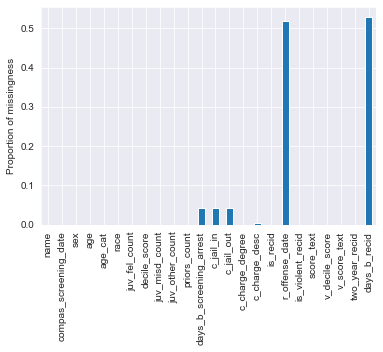

In [142]:
(df_compas_scores_2_yrs.isnull().sum()/df_compas_scores_2_yrs.shape[0]).plot(kind = 'bar');
plt.ylabel('Proportion of missingness');

In [78]:
df_compas_scores_2_yrs.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 7214 entries, 0 to 7213
Data columns (total 23 columns):
 #   Column                   Non-Null Count  Dtype         
---  ------                   --------------  -----         
 0   name                     7214 non-null   object        
 1   compas_screening_date    7214 non-null   datetime64[ns]
 2   sex                      7214 non-null   object        
 3   age                      7214 non-null   int64         
 4   age_cat                  7214 non-null   object        
 5   race                     7214 non-null   object        
 6   juv_fel_count            7214 non-null   int64         
 7   decile_score             7214 non-null   int64         
 8   juv_misd_count           7214 non-null   int64         
 9   juv_other_count          7214 non-null   int64         
 10  priors_count             7214 non-null   int64         
 11  days_b_screening_arrest  6907 non-null   float64       
 12  c_jail_in                6907 non-

## Biasness in COMPAS Algorithm

In [124]:
df_compas_filter = df_compas_scores_2_yrs[(df_compas_scores_2_yrs['days_b_screening_arrest'] <= 30) & (df_compas_scores_2_yrs['days_b_screening_arrest'] >= -30) & (df_compas_scores_2_yrs['is_recid'] != -1) & (df_compas_scores_2_yrs['c_charge_degree'] != 0) & (df_compas_scores_2_yrs['score_text'] != 0)]

In [93]:
df_compas_filter.shape

(6172, 23)

In [94]:
df_compas_filter['score_text'].value_counts()

Low       3421
Medium    1607
High      1144
Name: score_text, dtype: int64

## Encoding categorical data

In [125]:
X = pd.get_dummies(df_compas_filter[['age_cat', 'race', 'sex', 'priors_count', 'two_year_recid', 'score_text']], columns = ['age_cat', 'race', 'sex'])

In [126]:
X['score'] = X['score_text'].map(convert_target)

In [127]:
X.rename(columns = {'age_cat_Greater than 45' : 'age_cat_Greater_than_45',
                    'age_cat_Less than 25' : 'age_cat_Less_than_25',
                    'race_Native American' : 'race_Native_American',
                    'race_African-American' : 'race_African_American'},
         inplace = True)

In [128]:
X = X[['priors_count', 'two_year_recid', 'score_text',
       'age_cat_Greater_than_45', 'age_cat_Less_than_25',
       'race_African_American', 'race_Asian', 'race_Hispanic', 'race_Native_American',
       'race_Other', 'sex_Male', 'score']]

In [150]:
X.head()

,priors_count,two_year_recid,score_text,age_cat_Greater_than_45,age_cat_Less_than_25,race_African_American,race_Asian,race_Hispanic,race_Native_American,race_Other,sex_Male,score
0,0,0,Low,1,0,0,0,0,0,1,1,0
1,0,1,Low,0,0,1,0,0,0,0,1,0
2,4,1,Low,0,1,1,0,0,0,0,1,0
5,0,0,Low,0,0,0,0,0,0,1,1,0
6,14,1,Medium,0,0,0,0,0,0,0,1,1


## Model Building

In [129]:
mod = smf.glm('score~priors_count+two_year_recid+age_cat_Greater_than_45+age_cat_Less_than_25+race_Asian+race_African_American+race_Hispanic+race_Native_American+race_Other+sex_Male',
              family=sm.families.Binomial(), data=X).fit()

In [130]:
print(mod.summary())

                 Generalized Linear Model Regression Results                  
Dep. Variable:                  score   No. Observations:                 6172
Model:                            GLM   Df Residuals:                     6161
Model Family:                Binomial   Df Model:                           10
Link Function:                  logit   Scale:                          1.0000
Method:                          IRLS   Log-Likelihood:                -3095.2
Date:                Thu, 15 Sep 2022   Deviance:                       6190.3
Time:                        12:57:15   Pearson chi2:                 6.12e+03
No. Iterations:                     6                                         
Covariance Type:            nonrobust                                         
                              coef    std err          z      P>|z|      [0.025      0.975]
-------------------------------------------------------------------------------------------
Intercept                 

In [131]:
control = np.exp(-1.4521) / (1 + np.exp(-1.4521))
np.exp(0.4869) / (1 - control + (control * np.exp(0.4869)))

1.4542404883063897

#### Black defendants are 45% more likely than white defendants to receive a higher score correcting for the seriousness of their crime, previous arrests, and future criminal behavior.

## Number of false predictions by COMPAS

### is_recid is the actual label and two_year_recid is the predicted label by COMPAS

In [18]:
df_compas_scores_2_yrs[df_compas_scores_2_yrs['is_recid'] != df_compas_scores_2_yrs['two_year_recid']].shape[0]

220

In [19]:
df_compas_scores_2_yrs.shape

(7214, 19)

## Confusion Matrix

In [55]:
pd.crosstab(df_compas_scores_2_yrs['is_recid'], df_compas_scores_2_yrs['two_year_recid'])

two_year_recid,0,1
is_recid,,
0,3743,0
1,220,3251


#### Out of 3471 people who actually did recidivism, compas failed to identify 220 out of them, which are FN(Considering class 1 is + meaning who did recidivism)

#### Precision = 3251/(3251+0) = 1

#### Recall = 3251/(3251+220) = 0.93

#### F1 = (2*Pr*Rec)/(Pr+Rec) = 0.96

In [56]:
df_compas_scores_2_yrs[(df_compas_scores_2_yrs['is_recid'] == 1) & ((df_compas_scores_2_yrs['two_year_recid'] == 0))]['sex'].value_counts()

Male      188
Female     32
Name: sex, dtype: int64

In [57]:
df_compas_scores_2_yrs[(df_compas_scores_2_yrs['is_recid'] == 1) & ((df_compas_scores_2_yrs['two_year_recid'] == 0))]['race'].value_counts()

African-American    135
Caucasian            59
Hispanic             13
Other                10
Asian                 2
Native American       1
Name: race, dtype: int64

## EDA

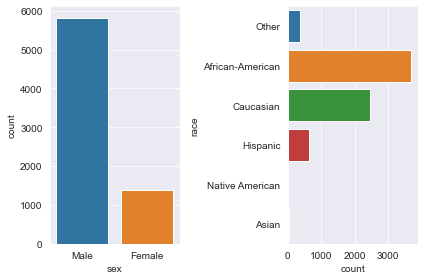

In [21]:
fig, axs = plt.subplots(1, 2)
axs = axs.flatten()
sns.countplot(df_compas_scores_2_yrs['sex'], ax = axs[0])
sns.countplot(y = 'race', data = df_compas_scores_2_yrs, ax = axs[1])
plt.tight_layout()

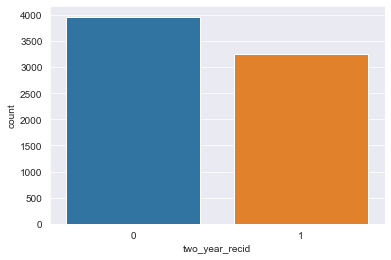

In [22]:
sns.countplot(x = 'two_year_recid', data = df_compas_scores_2_yrs);

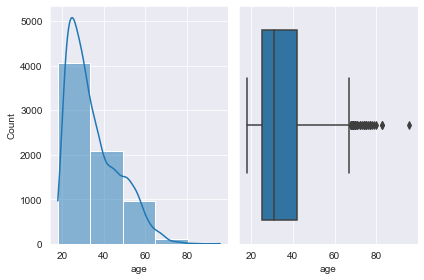

In [23]:
fig, axs = plt.subplots(1, 2)
axs = axs.flatten()
sns.histplot(x = 'age', data = df_compas_scores_2_yrs, bins = 5, kde = True, ax = axs[0]);
sns.boxplot(x = 'age', data = df_compas_scores_2_yrs, ax = axs[1]);
plt.tight_layout()

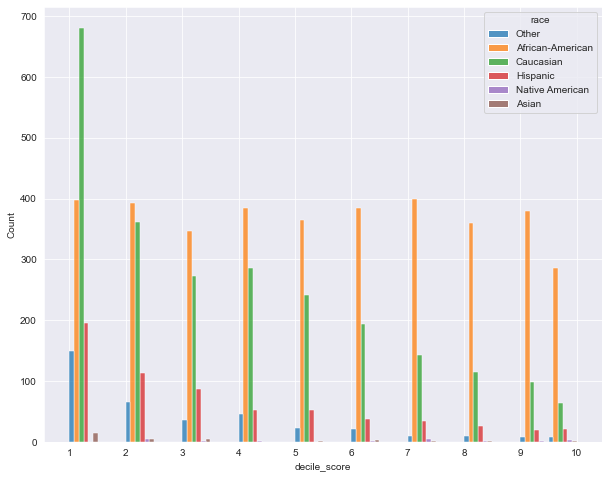

In [24]:
plt.figure(figsize = (10, 8))
sns.histplot(x = 'decile_score', data = df_compas_scores_2_yrs, hue = 'race',
             multiple = 'dodge', shrink = 1);
plt.xticks(np.arange(1,11,1));

In [25]:
black_crimes = df_compas_scores_2_yrs[df_compas_scores_2_yrs['race'] == 'African-American']
caucasian_crimes = df_compas_scores_2_yrs[df_compas_scores_2_yrs['race'] == 'Caucasian']

In [26]:
crimes_per_day = df_compas_scores_2_yrs.groupby('compas_screening_date')['name'].count()
black_crimes_per_day = black_crimes.groupby('compas_screening_date')['name'].count()
caucasian_crimes_per_day = caucasian_crimes.groupby('compas_screening_date')['name'].count()
crimes_per_day.head(11)

compas_screening_date
2013-01-01    14
2013-01-02    18
2013-01-03    20
2013-01-04    22
2013-01-05    19
2013-01-07     4
2013-01-08    24
2013-01-10    21
2013-01-11    13
2013-01-12     8
2013-01-13    19
Name: name, dtype: int64

In [27]:
plt.figure(figsize = (16, 8))
fig = px.line(crimes_per_day.rolling(7).mean(), title = 'Crimes Screnned per day-7 day MA')
fig.data[0].name="total crimes screened"
fig.add_scatter(x = black_crimes_per_day.rolling(7).mean().index,
                y = black_crimes_per_day.rolling(7).mean().values, mode = 'lines',
                name = 'black crimes screened')
fig.add_scatter(x = caucasian_crimes_per_day.rolling(7).mean().index,
                y = caucasian_crimes_per_day.rolling(7).mean().values,
                mode = 'lines', name = 'white crimes screened')
fig.update_layout(template="ggplot2")
fig.show()

<Figure size 1152x576 with 0 Axes>

In [28]:
females_screened = df_compas_scores_2_yrs[df_compas_scores_2_yrs['sex'] == 'Female']
males_screened = df_compas_scores_2_yrs[df_compas_scores_2_yrs['sex'] == 'Male']

In [29]:
females_screened_per_day = females_screened.groupby('compas_screening_date')['name'].count()
males_screened_per_day = males_screened.groupby('compas_screening_date')['name'].count()

In [30]:
plt.figure(figsize = (16, 8))
fig = px.line(crimes_per_day.rolling(7).mean(), title = 'Crimes Screnned per day by sex-7 day MA')
fig.data[0].name="total crimes screened"
fig.add_scatter(x = females_screened_per_day.rolling(7).mean().index,
                y = females_screened_per_day.rolling(7).mean().values, mode = 'lines',
                name = 'Female crimes screened')
fig.add_scatter(x = males_screened_per_day.rolling(7).mean().index,
                y = males_screened_per_day.rolling(7).mean().values,
                mode = 'lines', name = 'male crimes screened')
fig.update_layout(template="ggplot2")
fig.show()

<Figure size 1152x576 with 0 Axes>

In [35]:
df_compas_scores_2_yrs['race'].replace({'African-American' : 'Black',
                                        'Native American' : 'Black', 'Caucasian' : 'White',
                                        'Hispanic' : 'White'}, inplace = True)

In [26]:
get_equalised_odds(df_compas_scores_2_yrs, 'is_recid', 'two_year_recid', 1, 'race', 'White')

,Asian,Black,Other,White
sensitivity,0.913043,0.924570,0.959016,0.961965
equalised odds,0.949144,0.961126,0.996935,1.000000


- Relation between sensitivity and separation
 - P(R = +|Y = +, A = a) = (TP/(TP + FP))|A = a
 - P(R = +|Y = -, A = a) = (FP/(FP + TN))|A = a
- Relation between EO and sensitivity
 - P(R = +|Y = +, A = a)/P(R = +|Y = +, A = b) = 1
 - This metric says, "how much more probable is the recidivism prediction for sensitive group a compared to b, provided both did recidivism actually".
- As we can see, the odds of a black recidiving is lesser than that of white actually, but the compass algorithm predicts that black are 45% more probable to get a higher recidivism score compared to whites. 

## Preprocessing

In [36]:
Z = df_compas_scores_2_yrs[['sex', 'age', 'race', 'priors_count', 'c_charge_degree',
                            'juv_fel_count', 'decile_score', 'juv_other_count', 'juv_misd_count',
                            'is_violent_recid', 'v_decile_score', 'two_year_recid']]

In [37]:
L = ['sex', 'age', 'race', 'priors_count', 'c_charge_degree']

In [38]:
le = LabelEncoder()

In [39]:
ss = StandardScaler()

In [40]:
I1 = MICE()
I2 = MissForest(oob_score = True, verbose = 0)
I3 = KNNImputer()
I4 = SoftImpute()

In [41]:
L_5 = {'sex' : 5, 'age' : 6, 'race' : 7,
       'priors_count' : 8, 'c_charge_degree' : 9}

# MCAR 1a

## I1 - race

In [94]:
IAPD_I1_1a_race = []
MSIE_I1_1a_white = []
MSIE_I1_1a_black = []

for iter_ in range(100):
    missing_ind = get_missing_index_mcar(L, 0.1)
    R = generate_R(Z, missing_ind)
    Z_black, Z_white, R_black, R_white = split_by_group_race(R, Z, 'race')
    
    for l in ['race', 'sex', 'c_charge_degree']:
        Z_white = encode(l, le, Z_white)
        Z_black = encode(l, le, Z_black)
    
    R_black.reset_index(drop = True, inplace = True)
    R_white.reset_index(drop = True, inplace = True)
    Z_black.reset_index(drop = True, inplace = True)
    Z_white.reset_index(drop = True, inplace = True)
    
    Z_white_hat = Z_white.copy()
    Z_black_hat = Z_black.copy()
    
    for i in range(R_white.shape[0]):
        for j in L:
            if R_white.loc[i, j] == 0:
                Z_white_hat.loc[i, j] = np.nan
    
    for i in range(R_black.shape[0]):
        for j in L:
            if R_black.loc[i, j] == 0:
                Z_black_hat.loc[i, j] = np.nan
    
    Z_white_hat = I1.fit_transform(Z_white_hat)
    Z_black_hat = I1.fit_transform(Z_black_hat)
    
    Z_white = ss.fit_transform(Z_white)
    Z_black = ss.fit_transform(Z_black)
    Z_white_hat = ss.fit_transform(Z_white_hat)
    Z_black_hat = ss.fit_transform(Z_black_hat)
    
    R_white = np.array(R_white)
    R_black = np.array(R_black)
    Z_white = np.array(Z_white)
    Z_black = np.array(Z_black)
    
    MSIE_black = get_MSIE(Z_black, Z_black_hat, R_black)
    MSIE_white = get_MSIE(Z_white, Z_white_hat, R_white)
    
    IAPD = get_IAPD(MSIE_white, MSIE_black)
    
    print("-----Iteration------:", iter_ + 1)
    print("MSIE of black is :", MSIE_black)
    print("MSIE of white is :", MSIE_white)
    print("IAPD is :", IAPD)
    
    MSIE_I1_1a_black.append(MSIE_black)
    MSIE_I1_1a_white.append(MSIE_white)
    IAPD_I1_1a_race.append(IAPD)

-----Iteration------: 1
MSIE of black is : 0.8886480273066775
MSIE of white is : 0.6623306155201014
IAPD is : -0.22631741178657605
-----Iteration------: 2
MSIE of black is : 0.7874563269441656
MSIE of white is : 0.618162677043851
IAPD is : -0.1692936499003146


KeyboardInterrupt: 

In [138]:
print("Average MSIE of black over 100 experiments :", np.mean(MSIE_I1_1a_black))

Average MSIE of black over 100 experiments : 0.8183296407574915


In [139]:
print("Average MSIE of white over 100 experiments :", np.mean(MSIE_I1_1a_white))

Average MSIE of white over 100 experiments : 0.6441557565446817


In [140]:
(np.mean(MSIE_I1_1a_black) + np.mean(MSIE_I1_1a_white))/2

0.7312426986510866

In [97]:
print("Average IAPD over 100 experiments :", np.mean(IAPD_I1_1a_race))

Average IAPD over 100 experiments : -0.17417388421280958


In [98]:
CI = (np.mean(IAPD_I1_1a_race) - 1.65*np.std(IAPD_I1_1a_race, ddof = 1)/np.sqrt(100),
      np.mean(IAPD_I1_1a_race) + 1.65*np.std(IAPD_I1_1a_race, ddof = 1)/np.sqrt(100))
CI

(-0.18205474637812905, -0.1662930220474901)

### I1 - gender

In [121]:
IAPD_I1_1a_gender = []
MSIE_I1_1a_male = []
MSIE_I1_1a_female = []

for iter_ in range(100):
    missing_ind = get_missing_index(L, 0.1)
    R = generate_R(Z, missing_ind)
    Z_male, Z_female, R_male, R_female = split_by_group_gender(R, Z)
    
    for l in ['race', 'sex', 'c_charge_degree']:
        Z_male = encode(l, le, Z_male)
        Z_female = encode(l, le, Z_female)
    
    R_male.reset_index(drop = True, inplace = True)
    R_female.reset_index(drop = True, inplace = True)
    Z_male.reset_index(drop = True, inplace = True)
    Z_female.reset_index(drop = True, inplace = True)
    
    Z_male_hat = Z_male.copy()
    Z_female_hat = Z_female.copy()
    
    for i in range(R_male.shape[0]):
        for j in L:
            if R_male.loc[i, j] == 0:
                Z_male_hat.loc[i, j] = np.nan
    
    for i in range(R_female.shape[0]):
        for j in L:
            if R_female.loc[i, j] == 0:
                Z_female_hat.loc[i, j] = np.nan
    
    Z_male_hat = I1.fit_transform(Z_male_hat)
    Z_female_hat = I1.fit_transform(Z_female_hat)
    
    Z_male = ss.fit_transform(Z_male)
    Z_female = ss.fit_transform(Z_female)
    Z_male_hat = ss.fit_transform(Z_male_hat)
    Z_female_hat = ss.fit_transform(Z_female_hat)
    
    R_male = np.array(R_male)
    R_female = np.array(R_female)
    Z_male = np.array(Z_male)
    Z_female = np.array(Z_female)
    
    MSIE_male = get_MSIE(Z_male, Z_male_hat, R_male)
    MSIE_female = get_MSIE(Z_female, Z_female_hat, R_female)
    
    IAPD = get_IAPD(MSIE_male, MSIE_female)
    
    print("-----Iteration------:", iter_ + 1)
    print("MSIE of male is :", MSIE_male)
    print("MSIE of female is :", MSIE_female)
    print("IAPD is :", IAPD)
    
    MSIE_I1_1a_male.append(MSIE_male)
    MSIE_I1_1a_female.append(MSIE_female)
    IAPD_I1_1a_gender.append(IAPD)

-----Iteration------: 1
MSIE of male is : 0.6319343358608337
MSIE of female is : 0.635272439084383
IAPD is : -0.003338103223549327
-----Iteration------: 2
MSIE of male is : 0.6144423493466631
MSIE of female is : 0.7019951417222006
IAPD is : -0.08755279237553748
-----Iteration------: 3
MSIE of male is : 0.6061451230758053
MSIE of female is : 0.5824234965769206
IAPD is : 0.02372162649888465
-----Iteration------: 4
MSIE of male is : 0.6066228806846748
MSIE of female is : 0.5994452286019591
IAPD is : 0.007177652082715702
-----Iteration------: 5
MSIE of male is : 0.6213773822204403
MSIE of female is : 0.659124764619022
IAPD is : -0.037747382398581775
-----Iteration------: 6
MSIE of male is : 0.6219094277859287
MSIE of female is : 0.5058450859766345
IAPD is : 0.11606434180929426
-----Iteration------: 7
MSIE of male is : 0.6024348744220428
MSIE of female is : 0.5961119905629085
IAPD is : 0.006322883859134265
-----Iteration------: 8
MSIE of male is : 0.6453720210316324
MSIE of female is : 0.55

-----Iteration------: 64
MSIE of male is : 0.6378200465470427
MSIE of female is : 0.6585358507296479
IAPD is : -0.020715804182605213
-----Iteration------: 65
MSIE of male is : 0.5931611509944609
MSIE of female is : 0.5910283903934634
IAPD is : 0.00213276060099743
-----Iteration------: 66
MSIE of male is : 0.6445483208539553
MSIE of female is : 0.5341200249768144
IAPD is : 0.11042829587714087
-----Iteration------: 67
MSIE of male is : 0.6044785410524446
MSIE of female is : 0.6265646168572172
IAPD is : -0.02208607580477262
-----Iteration------: 68
MSIE of male is : 0.6187093233408996
MSIE of female is : 0.5663742916768796
IAPD is : 0.05233503166401998
-----Iteration------: 69
MSIE of male is : 0.5953069069036152
MSIE of female is : 0.6265140097058226
IAPD is : -0.031207102802207398
-----Iteration------: 70
MSIE of male is : 0.6206131923076459
MSIE of female is : 0.5788446343797051
IAPD is : 0.041768557927940764
-----Iteration------: 71
MSIE of male is : 0.6304716974694783
MSIE of female 

In [141]:
print("Average MSIE of male over 100 experiments :", np.mean(MSIE_I1_1a_male))

Average MSIE of male over 100 experiments : 0.6166143336850417


In [142]:
print("Average MSIE of female over 100 experiments :", np.mean(MSIE_I1_1a_female))

Average MSIE of female over 100 experiments : 0.6196114800630851


In [143]:
(np.mean(MSIE_I1_1a_male) + np.mean(MSIE_I1_1a_female))/2

0.6181129068740634

In [144]:
print("Average IAPD over 100 experiments :", np.mean(IAPD_I1_1a_gender))

Average IAPD over 100 experiments : -0.002997146378043303


In [123]:
CI = (np.mean(IAPD_I1_1a_gender) - 1.65*np.std(IAPD_I1_1a_gender, ddof = 1)/np.sqrt(100),
      np.mean(IAPD_I1_1a_gender) + 1.65*np.std(IAPD_I1_1a_gender, ddof = 1)/np.sqrt(100))
CI

(-0.010737431123199939, 0.004743138367113332)

## I2 - race

In [117]:
IAPD_I2_1a_race = []
MSIE_I2_1a_white = []
MSIE_I2_1a_black = []

for iter_ in range(100):
    missing_ind = get_missing_index(L, 0.1)
    R = generate_R(Z, missing_ind)
    Z_black, Z_white, R_black, R_white = split_by_group_race(R, Z, 'race')
    
    for l in ['race', 'sex', 'c_charge_degree']:
        Z_white = encode(l, le, Z_white)
        Z_black = encode(l, le, Z_black)
    
    R_black.reset_index(drop = True, inplace = True)
    R_white.reset_index(drop = True, inplace = True)
    Z_black.reset_index(drop = True, inplace = True)
    Z_white.reset_index(drop = True, inplace = True)
    
    Z_white_hat = Z_white.copy()
    Z_black_hat = Z_black.copy()
    
    for i in range(R_white.shape[0]):
        for j in L:
            if R_white.loc[i, j] == 0:
                Z_white_hat.loc[i, j] = np.nan
    
    for i in range(R_black.shape[0]):
        for j in L:
            if R_black.loc[i, j] == 0:
                Z_black_hat.loc[i, j] = np.nan
    
    Z_white_hat = I2.fit_transform(Z_white_hat)
    Z_black_hat = I2.fit_transform(Z_black_hat)
    
    Z_white = ss.fit_transform(Z_white)
    Z_black = ss.fit_transform(Z_black)
    Z_white_hat = ss.fit_transform(Z_white_hat)
    Z_black_hat = ss.fit_transform(Z_black_hat)
    
    R_white = np.array(R_white)
    R_black = np.array(R_black)
    Z_white = np.array(Z_white)
    Z_black = np.array(Z_black)
    
    MSIE_black = get_MSIE(Z_black, Z_black_hat, R_black)
    MSIE_white = get_MSIE(Z_white, Z_white_hat, R_white)
    
    IAPD = get_IAPD(MSIE_white, MSIE_black)
    
    print("-----Iteration------:", iter_ + 1)
    print("MSIE of black is :", MSIE_black)
    print("MSIE of white is :", MSIE_white)
    print("IAPD is :", IAPD)
    
    MSIE_I2_1a_black.append(MSIE_black)
    MSIE_I2_1a_white.append(MSIE_white)
    IAPD_I2_1a_race.append(IAPD)

Iteration: 0
Iteration: 1
Iteration: 2
Iteration: 3
Iteration: 0
Iteration: 1
Iteration: 2
Iteration: 3
Iteration: 4
-----Iteration------: 1
MSIE of black is : 0.9483447978390175
MSIE of white is : 0.7676933070562424
IAPD is : -0.1806514907827751
Iteration: 0
Iteration: 1
Iteration: 2
Iteration: 3
Iteration: 0
Iteration: 1
Iteration: 2
Iteration: 3
-----Iteration------: 2
MSIE of black is : 0.894057736081284
MSIE of white is : 0.7416232013513296
IAPD is : -0.15243453472995439
Iteration: 0
Iteration: 1
Iteration: 2
Iteration: 3
Iteration: 0
Iteration: 1
Iteration: 2
Iteration: 3
Iteration: 4
-----Iteration------: 3
MSIE of black is : 0.8834661237113816
MSIE of white is : 0.6925578042026935
IAPD is : -0.19090831950868803
Iteration: 0
Iteration: 1
Iteration: 2
Iteration: 3
Iteration: 4
Iteration: 5
Iteration: 0
Iteration: 1
Iteration: 2
Iteration: 3
Iteration: 4
Iteration: 5
Iteration: 6
-----Iteration------: 4
MSIE of black is : 0.9149782815129149
MSIE of white is : 0.7275284168853344
IA

Iteration: 0
Iteration: 1
Iteration: 2
Iteration: 0
Iteration: 1
Iteration: 2
Iteration: 3
Iteration: 4
Iteration: 5
Iteration: 6
-----Iteration------: 34
MSIE of black is : 1.029489669752893
MSIE of white is : 0.7304265574030111
IAPD is : -0.2990631123498819
Iteration: 0
Iteration: 1
Iteration: 2
Iteration: 0
Iteration: 1
Iteration: 2
Iteration: 3
-----Iteration------: 35
MSIE of black is : 0.9380988509576109
MSIE of white is : 0.7059342734559985
IAPD is : -0.23216457750161246
Iteration: 0
Iteration: 1
Iteration: 2
Iteration: 3
Iteration: 0
Iteration: 1
Iteration: 2
Iteration: 3
-----Iteration------: 36
MSIE of black is : 0.9264738344701149
MSIE of white is : 0.6942007869243624
IAPD is : -0.2322730475457525
Iteration: 0
Iteration: 1
Iteration: 2
Iteration: 3
Iteration: 4
Iteration: 5
Iteration: 0
Iteration: 1
Iteration: 2
Iteration: 3
Iteration: 4
-----Iteration------: 37
MSIE of black is : 0.9487724924168923
MSIE of white is : 0.7768763512420661
IAPD is : -0.1718961411748262
Iteratio

Iteration: 4
-----Iteration------: 67
MSIE of black is : 0.9036608024321214
MSIE of white is : 0.6900554546445568
IAPD is : -0.21360534778756468
Iteration: 0
Iteration: 1
Iteration: 2
Iteration: 0
Iteration: 1
Iteration: 2
Iteration: 3
Iteration: 4
Iteration: 5
-----Iteration------: 68
MSIE of black is : 0.9262242237618217
MSIE of white is : 0.6983234938086619
IAPD is : -0.2279007299531598
Iteration: 0
Iteration: 1
Iteration: 2
Iteration: 3
Iteration: 0
Iteration: 1
Iteration: 2
Iteration: 3
Iteration: 4
Iteration: 5
-----Iteration------: 69
MSIE of black is : 0.9383212930831166
MSIE of white is : 0.7140425099844496
IAPD is : -0.224278783098667
Iteration: 0
Iteration: 1
Iteration: 2
Iteration: 3
Iteration: 4
Iteration: 5
Iteration: 0
Iteration: 1
Iteration: 2
Iteration: 3
-----Iteration------: 70
MSIE of black is : 0.9254503964452929
MSIE of white is : 0.7628066904959522
IAPD is : -0.16264370594934074
Iteration: 0
Iteration: 1
Iteration: 2
Iteration: 0
Iteration: 1
Iteration: 2
Iterati

Iteration: 0
Iteration: 1
Iteration: 2
Iteration: 3
Iteration: 4
Iteration: 5
Iteration: 6
Iteration: 0
Iteration: 1
Iteration: 2
Iteration: 3
-----Iteration------: 100
MSIE of black is : 0.980230357114273
MSIE of white is : 0.7525704291398212
IAPD is : -0.22765992797445178


In [145]:
print("Average MSIE of black over 100 experiments :", np.mean(MSIE_I2_1a_black))

Average MSIE of black over 100 experiments : 0.9263836838950212


In [146]:
print("Average MSIE of white over 100 experiments :", np.mean(MSIE_I2_1a_white))

Average MSIE of white over 100 experiments : 0.7310174964764766


In [147]:
(np.mean(MSIE_I2_1a_black) + np.mean(MSIE_I2_1a_white))/2

0.8287005901857489

In [148]:
print("Average IAPD over 100 experiments :", np.mean(IAPD_I2_1a_race))

Average IAPD over 100 experiments : -0.1953661874185444


In [120]:
CI = (np.mean(IAPD_I2_1a_race) - 1.65*np.std(IAPD_I2_1a_race, ddof = 1)/np.sqrt(100),
      np.mean(IAPD_I2_1a_race) + 1.65*np.std(IAPD_I2_1a_race, ddof = 1)/np.sqrt(100))
CI

(-0.20373285789893034, -0.18699951693815844)

### I2 - gender

In [125]:
IAPD_I2_1a_gender = []
MSIE_I2_1a_male = []
MSIE_I2_1a_female = []

for iter_ in range(100):
    missing_ind = get_missing_index(L, 0.1)
    R = generate_R(Z, missing_ind)
    Z_male, Z_female, R_male, R_female = split_by_group_gender(R, Z)
    
    for l in ['race', 'sex', 'c_charge_degree']:
        Z_male = encode(l, le, Z_male)
        Z_female = encode(l, le, Z_female)
    
    R_male.reset_index(drop = True, inplace = True)
    R_female.reset_index(drop = True, inplace = True)
    Z_male.reset_index(drop = True, inplace = True)
    Z_female.reset_index(drop = True, inplace = True)
    
    Z_male_hat = Z_male.copy()
    Z_female_hat = Z_female.copy()
    
    for i in range(R_male.shape[0]):
        for j in L:
            if R_male.loc[i, j] == 0:
                Z_male_hat.loc[i, j] = np.nan
    
    for i in range(R_female.shape[0]):
        for j in L:
            if R_female.loc[i, j] == 0:
                Z_female_hat.loc[i, j] = np.nan
    
    Z_male_hat = I2.fit_transform(Z_male_hat)
    Z_female_hat = I2.fit_transform(Z_female_hat)
    
    Z_male = ss.fit_transform(Z_male)
    Z_female = ss.fit_transform(Z_female)
    Z_male_hat = ss.fit_transform(Z_male_hat)
    Z_female_hat = ss.fit_transform(Z_female_hat)
    
    R_male = np.array(R_male)
    R_female = np.array(R_female)
    Z_male = np.array(Z_male)
    Z_female = np.array(Z_female)
    
    MSIE_male = get_MSIE(Z_male, Z_male_hat, R_male)
    MSIE_female = get_MSIE(Z_female, Z_female_hat, R_female)
    
    IAPD = get_IAPD(MSIE_male, MSIE_female)
    
    print("-----Iteration------:", iter_ + 1)
    print("MSIE of male is :", MSIE_male)
    print("MSIE of female is :", MSIE_female)
    print("IAPD is :", IAPD)
    
    MSIE_I2_1a_male.append(MSIE_male)
    MSIE_I2_1a_female.append(MSIE_female)
    IAPD_I2_1a_gender.append(IAPD)

Iteration: 0
Iteration: 1
Iteration: 2
Iteration: 3
Iteration: 0
Iteration: 1
Iteration: 2
-----Iteration------: 1
MSIE of male is : 0.6532481463739739
MSIE of female is : 0.6406207735791333
IAPD is : 0.012627372794840608
Iteration: 0
Iteration: 1
Iteration: 2
Iteration: 3
Iteration: 4
Iteration: 0
Iteration: 1
Iteration: 2
Iteration: 3
-----Iteration------: 2
MSIE of male is : 0.6797573311033585
MSIE of female is : 0.6855143119880738
IAPD is : -0.005756980884715324
Iteration: 0
Iteration: 1
Iteration: 2
Iteration: 3
Iteration: 4
Iteration: 5
Iteration: 0
Iteration: 1
Iteration: 2
Iteration: 3
Iteration: 4
-----Iteration------: 3
MSIE of male is : 0.6774267114377068
MSIE of female is : 0.6980845712276913
IAPD is : -0.020657859789984467
Iteration: 0
Iteration: 1
Iteration: 2
Iteration: 3
Iteration: 0
Iteration: 1
Iteration: 2
Iteration: 3
Iteration: 4
-----Iteration------: 4
MSIE of male is : 0.6803628169537467
MSIE of female is : 0.7018975300119528
IAPD is : -0.02153471305820609
Iterat

Iteration: 0
Iteration: 1
Iteration: 2
Iteration: 3
Iteration: 0
Iteration: 1
Iteration: 2
Iteration: 3
Iteration: 4
-----Iteration------: 34
MSIE of male is : 0.6991716748372722
MSIE of female is : 0.6588984224681215
IAPD is : 0.04027325236915069
Iteration: 0
Iteration: 1
Iteration: 2
Iteration: 3
Iteration: 0
Iteration: 1
Iteration: 2
-----Iteration------: 35
MSIE of male is : 0.6655356015682428
MSIE of female is : 0.7586647887264433
IAPD is : -0.09312918715820051
Iteration: 0
Iteration: 1
Iteration: 2
Iteration: 3
Iteration: 0
Iteration: 1
Iteration: 2
Iteration: 3
-----Iteration------: 36
MSIE of male is : 0.6806221743976582
MSIE of female is : 0.7181331473265951
IAPD is : -0.0375109729289369
Iteration: 0
Iteration: 1
Iteration: 2
Iteration: 3
Iteration: 4
Iteration: 5
Iteration: 6
Iteration: 0
Iteration: 1
Iteration: 2
Iteration: 3
-----Iteration------: 37
MSIE of male is : 0.6754057127170303
MSIE of female is : 0.7611693655092417
IAPD is : -0.08576365279221143
Iteration: 0
Iterat

Iteration: 2
Iteration: 3
Iteration: 0
Iteration: 1
Iteration: 2
Iteration: 3
Iteration: 4
Iteration: 5
-----Iteration------: 67
MSIE of male is : 0.7083934808463093
MSIE of female is : 0.6070859801212972
IAPD is : 0.10130750072501205
Iteration: 0
Iteration: 1
Iteration: 2
Iteration: 3
Iteration: 4
Iteration: 0
Iteration: 1
Iteration: 2
Iteration: 3
Iteration: 4
-----Iteration------: 68
MSIE of male is : 0.6913510428146024
MSIE of female is : 0.7020366143256509
IAPD is : -0.010685571511048542
Iteration: 0
Iteration: 1
Iteration: 2
Iteration: 3
Iteration: 4
Iteration: 5
Iteration: 6
Iteration: 0
Iteration: 1
Iteration: 2
Iteration: 3
-----Iteration------: 69
MSIE of male is : 0.672268822873449
MSIE of female is : 0.6898466603798116
IAPD is : -0.017577837506362548
Iteration: 0
Iteration: 1
Iteration: 2
Iteration: 3
Iteration: 0
Iteration: 1
Iteration: 2
Iteration: 3
-----Iteration------: 70
MSIE of male is : 0.6965699433829221
MSIE of female is : 0.6820004809192245
IAPD is : 0.0145694624

Iteration: 0
Iteration: 1
Iteration: 2
Iteration: 3
Iteration: 4
Iteration: 0
Iteration: 1
Iteration: 2
Iteration: 3
-----Iteration------: 100
MSIE of male is : 0.6923524061244698
MSIE of female is : 0.649857342316249
IAPD is : 0.04249506380822077


In [149]:
print("Average MSIE of male over 100 experiments :", np.mean(MSIE_I2_1a_male))

Average MSIE of male over 100 experiments : 0.6824449919608333


In [150]:
print("Average MSIE of female over 100 experiments :", np.mean(MSIE_I2_1a_female))

Average MSIE of female over 100 experiments : 0.6727303980463475


In [151]:
(np.mean(MSIE_I2_1a_male) + np.mean(MSIE_I2_1a_female))/2

0.6775876950035904

In [152]:
print("Average IAPD over 100 experiments :", np.mean(IAPD_I2_1a_gender))

Average IAPD over 100 experiments : 0.009714593914485757


In [127]:
CI = (np.mean(IAPD_I2_1a_gender) - 1.65*np.std(IAPD_I2_1a_gender, ddof = 1)/np.sqrt(100),
      np.mean(IAPD_I2_1a_gender) + 1.65*np.std(IAPD_I2_1a_gender, ddof = 1)/np.sqrt(100))
CI

(0.0009371596261983292, 0.018492028202773184)

## I3 - race

In [128]:
IAPD_I3_1a_race = []
MSIE_I3_1a_white = []
MSIE_I3_1a_black = []

for iter_ in range(100):
    missing_ind = get_missing_index(L, 0.1)
    R = generate_R(Z, missing_ind)
    Z_black, Z_white, R_black, R_white = split_by_group_race(R, Z, 'race')
    
    for l in ['race', 'sex', 'c_charge_degree']:
        Z_white = encode(l, le, Z_white)
        Z_black = encode(l, le, Z_black)
    
    R_black.reset_index(drop = True, inplace = True)
    R_white.reset_index(drop = True, inplace = True)
    Z_black.reset_index(drop = True, inplace = True)
    Z_white.reset_index(drop = True, inplace = True)
    
    Z_white_hat = Z_white.copy()
    Z_black_hat = Z_black.copy()
    
    for i in range(R_white.shape[0]):
        for j in L:
            if R_white.loc[i, j] == 0:
                Z_white_hat.loc[i, j] = np.nan
    
    for i in range(R_black.shape[0]):
        for j in L:
            if R_black.loc[i, j] == 0:
                Z_black_hat.loc[i, j] = np.nan
    
    Z_white_hat = I3.fit_transform(Z_white_hat)
    Z_black_hat = I3.fit_transform(Z_black_hat)
    
    Z_white = ss.fit_transform(Z_white)
    Z_black = ss.fit_transform(Z_black)
    Z_white_hat = ss.fit_transform(Z_white_hat)
    Z_black_hat = ss.fit_transform(Z_black_hat)
    
    R_white = np.array(R_white)
    R_black = np.array(R_black)
    Z_white = np.array(Z_white)
    Z_black = np.array(Z_black)
    
    MSIE_black = get_MSIE(Z_black, Z_black_hat, R_black)
    MSIE_white = get_MSIE(Z_white, Z_white_hat, R_white)
    
    IAPD = get_IAPD(MSIE_white, MSIE_black)
    
    print("-----Iteration------:", iter_ + 1)
    print("MSIE of black is :", MSIE_black)
    print("MSIE of white is :", MSIE_white)
    print("IAPD is :", IAPD)
    
    MSIE_I3_1a_black.append(MSIE_black)
    MSIE_I3_1a_white.append(MSIE_white)
    IAPD_I3_1a_race.append(IAPD)

-----Iteration------: 1
MSIE of black is : 0.8721617429331742
MSIE of white is : 0.7467970237784949
IAPD is : -0.12536471915467928
-----Iteration------: 2
MSIE of black is : 0.9544006468199088
MSIE of white is : 0.8142179830490167
IAPD is : -0.14018266377089206
-----Iteration------: 3
MSIE of black is : 0.9495542784749327
MSIE of white is : 0.746161474595321
IAPD is : -0.20339280387961167
-----Iteration------: 4
MSIE of black is : 1.0308699552298326
MSIE of white is : 0.7396433708869361
IAPD is : -0.2912265843428965
-----Iteration------: 5
MSIE of black is : 0.8878292514699423
MSIE of white is : 0.860762769988215
IAPD is : -0.0270664814817273
-----Iteration------: 6
MSIE of black is : 0.9644840120608325
MSIE of white is : 0.67451200923129
IAPD is : -0.2899720028295425
-----Iteration------: 7
MSIE of black is : 0.9439491295737696
MSIE of white is : 0.7634064600099545
IAPD is : -0.18054266956381515
-----Iteration------: 8
MSIE of black is : 0.9364674141932776
MSIE of white is : 0.7909131

-----Iteration------: 64
MSIE of black is : 0.9224910892231619
MSIE of white is : 0.730233051416575
IAPD is : -0.1922580378065869
-----Iteration------: 65
MSIE of black is : 0.9905589947602227
MSIE of white is : 0.7164665220415388
IAPD is : -0.27409247271868387
-----Iteration------: 66
MSIE of black is : 0.9253683511265808
MSIE of white is : 0.7230509883666295
IAPD is : -0.20231736275995127
-----Iteration------: 67
MSIE of black is : 0.9150242254627386
MSIE of white is : 0.8179092509308786
IAPD is : -0.09711497453186002
-----Iteration------: 68
MSIE of black is : 0.9748794718391082
MSIE of white is : 0.7003151257632966
IAPD is : -0.2745643460758116
-----Iteration------: 69
MSIE of black is : 0.9335396811249864
MSIE of white is : 0.7777268361471582
IAPD is : -0.1558128449778282
-----Iteration------: 70
MSIE of black is : 1.0158918635337633
MSIE of white is : 0.7802899161276472
IAPD is : -0.23560194740611606
-----Iteration------: 71
MSIE of black is : 0.856876104513536
MSIE of white is :

In [153]:
print("Average MSIE of balck over 100 experiments :", np.mean(MSIE_I3_1a_black))

Average MSIE of balck over 100 experiments : 0.9587695978701797


In [154]:
print("Average MSIE of white over 100 experiments :", np.mean(MSIE_I3_1a_white))

Average MSIE of white over 100 experiments : 0.7482373029608026


In [155]:
(np.mean(MSIE_I3_1a_black) + np.mean(MSIE_I3_1a_white))/2

0.8535034504154911

In [156]:
print("Average IAPD over 100 experiments :", np.mean(IAPD_I3_1a_race))

Average IAPD over 100 experiments : -0.2105322949093769


In [130]:
CI = (np.mean(IAPD_I3_1a_race) - 1.65*np.std(IAPD_I3_1a_race, ddof = 1)/np.sqrt(100),
      np.mean(IAPD_I3_1a_race) + 1.65*np.std(IAPD_I3_1a_race, ddof = 1)/np.sqrt(100))
CI

(-0.22138340786008237, -0.1996811819586714)

### I3 - gender

In [131]:
IAPD_I3_1a_gender = []
MSIE_I3_1a_male = []
MSIE_I3_1a_female = []

for iter_ in range(100):
    missing_ind = get_missing_index(L, 0.1)
    R = generate_R(Z, missing_ind)
    Z_male, Z_female, R_male, R_female = split_by_group_gender(R, Z)
    
    for l in ['race', 'sex', 'c_charge_degree']:
        Z_male = encode(l, le, Z_male)
        Z_female = encode(l, le, Z_female)
    
    R_male.reset_index(drop = True, inplace = True)
    R_female.reset_index(drop = True, inplace = True)
    Z_male.reset_index(drop = True, inplace = True)
    Z_female.reset_index(drop = True, inplace = True)
    
    Z_male_hat = Z_male.copy()
    Z_female_hat = Z_female.copy()
    
    for i in range(R_male.shape[0]):
        for j in L:
            if R_male.loc[i, j] == 0:
                Z_male_hat.loc[i, j] = np.nan
    
    for i in range(R_female.shape[0]):
        for j in L:
            if R_female.loc[i, j] == 0:
                Z_female_hat.loc[i, j] = np.nan
    
    Z_male_hat = I3.fit_transform(Z_male_hat)
    Z_female_hat = I3.fit_transform(Z_female_hat)
    
    Z_male = ss.fit_transform(Z_male)
    Z_female = ss.fit_transform(Z_female)
    Z_male_hat = ss.fit_transform(Z_male_hat)
    Z_female_hat = ss.fit_transform(Z_female_hat)
    
    R_male = np.array(R_male)
    R_female = np.array(R_female)
    Z_male = np.array(Z_male)
    Z_female = np.array(Z_female)
    
    MSIE_male = get_MSIE(Z_male, Z_male_hat, R_male)
    MSIE_female = get_MSIE(Z_female, Z_female_hat, R_female)
    
    IAPD = get_IAPD(MSIE_male, MSIE_female)
    
    print("-----Iteration------:", iter_ + 1)
    print("MSIE of male is :", MSIE_male)
    print("MSIE of female is :", MSIE_female)
    print("IAPD is :", IAPD)
    
    MSIE_I3_1a_male.append(MSIE_male)
    MSIE_I3_1a_female.append(MSIE_female)
    IAPD_I3_1a_gender.append(IAPD)

-----Iteration------: 1
MSIE of male is : 0.7431751932074859
MSIE of female is : 0.7144659093924325
IAPD is : 0.028709283815053444
-----Iteration------: 2
MSIE of male is : 0.6975795666264514
MSIE of female is : 0.7502502452918542
IAPD is : -0.05267067866540287
-----Iteration------: 3
MSIE of male is : 0.7628036471042231
MSIE of female is : 0.6799623964492643
IAPD is : 0.08284125065495884
-----Iteration------: 4
MSIE of male is : 0.6996695133391391
MSIE of female is : 0.6315196724491119
IAPD is : 0.06814984089002718
-----Iteration------: 5
MSIE of male is : 0.6998969978605747
MSIE of female is : 0.6151506184362944
IAPD is : 0.08474637942428032
-----Iteration------: 6
MSIE of male is : 0.7516717129550179
MSIE of female is : 0.6877664183161466
IAPD is : 0.06390529463887129
-----Iteration------: 7
MSIE of male is : 0.7213228070968452
MSIE of female is : 0.7661249925683683
IAPD is : -0.04480218547152315
-----Iteration------: 8
MSIE of male is : 0.6850182881794833
MSIE of female is : 0.6833

-----Iteration------: 64
MSIE of male is : 0.7184927427759463
MSIE of female is : 0.6318398973606432
IAPD is : 0.08665284541530316
-----Iteration------: 65
MSIE of male is : 0.7200917836042021
MSIE of female is : 0.6714649745788995
IAPD is : 0.048626809025302586
-----Iteration------: 66
MSIE of male is : 0.7071900725447047
MSIE of female is : 0.7062976657627369
IAPD is : 0.0008924067819677806
-----Iteration------: 67
MSIE of male is : 0.7413048705055463
MSIE of female is : 0.6708854008552915
IAPD is : 0.0704194696502548
-----Iteration------: 68
MSIE of male is : 0.7082053910603725
MSIE of female is : 0.6527433154271856
IAPD is : 0.05546207563318695
-----Iteration------: 69
MSIE of male is : 0.7054397377513137
MSIE of female is : 0.7756288719435219
IAPD is : -0.07018913419220818
-----Iteration------: 70
MSIE of male is : 0.734532622001318
MSIE of female is : 0.7418969251355795
IAPD is : -0.007364303134261507
-----Iteration------: 71
MSIE of male is : 0.6801825031522873
MSIE of female is

In [157]:
print("Average MSIE of male over 100 experiments :", np.mean(MSIE_I3_1a_male))

Average MSIE of male over 100 experiments : 0.7108772459446626


In [158]:
print("Average MSIE of female over 100 experiments :", np.mean(MSIE_I3_1a_female))

Average MSIE of female over 100 experiments : 0.7038910800350996


In [159]:
(np.mean(MSIE_I3_1a_male) + np.mean(MSIE_I3_1a_female))/2

0.7073841629898812

In [160]:
print("Average IAPD over 100 experiments :", np.mean(IAPD_I3_1a_gender))

Average IAPD over 100 experiments : 0.006986165909563152


In [133]:
CI = (np.mean(IAPD_I3_1a_gender) - 1.65*np.std(IAPD_I3_1a_gender, ddof = 1)/np.sqrt(100),
      np.mean(IAPD_I3_1a_gender) + 1.65*np.std(IAPD_I3_1a_gender, ddof = 1)/np.sqrt(100))
CI

(-0.0035239840833857427, 0.017496315902512046)

## I4 - race

In [134]:
IAPD_I4_1a_race = []
MSIE_I4_1a_white = []
MSIE_I4_1a_black = []

for iter_ in range(100):
    missing_ind = get_missing_index(L, 0.1)
    R = generate_R(Z, missing_ind)
    Z_black, Z_white, R_black, R_white = split_by_group_race(R, Z, 'race')
    
    for l in ['race', 'sex', 'c_charge_degree']:
        Z_white = encode(l, le, Z_white)
        Z_black = encode(l, le, Z_black)
    
    R_black.reset_index(drop = True, inplace = True)
    R_white.reset_index(drop = True, inplace = True)
    Z_black.reset_index(drop = True, inplace = True)
    Z_white.reset_index(drop = True, inplace = True)
    
    Z_white_hat = Z_white.copy()
    Z_black_hat = Z_black.copy()
    
    for i in range(R_white.shape[0]):
        for j in L:
            if R_white.loc[i, j] == 0:
                Z_white_hat.loc[i, j] = np.nan
    
    for i in range(R_black.shape[0]):
        for j in L:
            if R_black.loc[i, j] == 0:
                Z_black_hat.loc[i, j] = np.nan
    
    Z_white_hat = I4.fit_transform(Z_white_hat)
    Z_black_hat = I4.fit_transform(Z_black_hat)
    
    Z_white = ss.fit_transform(Z_white)
    Z_black = ss.fit_transform(Z_black)
    Z_white_hat = ss.fit_transform(Z_white_hat)
    Z_black_hat = ss.fit_transform(Z_black_hat)
    
    R_white = np.array(R_white)
    R_black = np.array(R_black)
    Z_white = np.array(Z_white)
    Z_black = np.array(Z_black)
    
    MSIE_black = get_MSIE(Z_black, Z_black_hat, R_black)
    MSIE_white = get_MSIE(Z_white, Z_white_hat, R_white)
    
    IAPD = get_IAPD(MSIE_white, MSIE_black)
    
    print("-----Iteration------:", iter_ + 1)
    print("MSIE of black is :", MSIE_black)
    print("MSIE of white is :", MSIE_white)
    print("IAPD is :", IAPD)
    
    MSIE_I4_1a_black.append(MSIE_black)
    MSIE_I4_1a_white.append(MSIE_white)
    IAPD_I4_1a_race.append(IAPD)

[SoftImpute] Max Singular Value of X_init = 2080.438094
[SoftImpute] Iter 1: observed MAE=0.334538 rank=4
[SoftImpute] Iter 2: observed MAE=0.333059 rank=4
[SoftImpute] Iter 3: observed MAE=0.333184 rank=4
[SoftImpute] Iter 4: observed MAE=0.333392 rank=4
[SoftImpute] Iter 5: observed MAE=0.333557 rank=4
[SoftImpute] Iter 6: observed MAE=0.333683 rank=4
[SoftImpute] Iter 7: observed MAE=0.333779 rank=4
[SoftImpute] Iter 8: observed MAE=0.333852 rank=4
[SoftImpute] Iter 9: observed MAE=0.333909 rank=4
[SoftImpute] Iter 10: observed MAE=0.333954 rank=4
[SoftImpute] Iter 11: observed MAE=0.333989 rank=4
[SoftImpute] Iter 12: observed MAE=0.334018 rank=4
[SoftImpute] Iter 13: observed MAE=0.334041 rank=4
[SoftImpute] Iter 14: observed MAE=0.334060 rank=4
[SoftImpute] Iter 15: observed MAE=0.334077 rank=4
[SoftImpute] Iter 16: observed MAE=0.334090 rank=4
[SoftImpute] Iter 17: observed MAE=0.334102 rank=4
[SoftImpute] Iter 18: observed MAE=0.334112 rank=4
[SoftImpute] Iter 19: observed MAE=

[SoftImpute] Iter 71: observed MAE=0.375392 rank=4
[SoftImpute] Iter 72: observed MAE=0.375388 rank=4
[SoftImpute] Iter 73: observed MAE=0.375384 rank=4
[SoftImpute] Iter 74: observed MAE=0.375380 rank=4
[SoftImpute] Iter 75: observed MAE=0.375376 rank=4
[SoftImpute] Iter 76: observed MAE=0.375372 rank=4
[SoftImpute] Iter 77: observed MAE=0.375369 rank=4
[SoftImpute] Iter 78: observed MAE=0.375365 rank=4
[SoftImpute] Iter 79: observed MAE=0.375361 rank=4
[SoftImpute] Iter 80: observed MAE=0.375358 rank=4
[SoftImpute] Iter 81: observed MAE=0.375354 rank=4
[SoftImpute] Iter 82: observed MAE=0.375351 rank=4
[SoftImpute] Iter 83: observed MAE=0.375348 rank=4
[SoftImpute] Iter 84: observed MAE=0.375345 rank=4
[SoftImpute] Iter 85: observed MAE=0.375342 rank=4
[SoftImpute] Iter 86: observed MAE=0.375339 rank=4
[SoftImpute] Iter 87: observed MAE=0.375336 rank=4
[SoftImpute] Iter 88: observed MAE=0.375333 rank=4
[SoftImpute] Iter 89: observed MAE=0.375330 rank=4
[SoftImpute] Iter 90: observed 

[SoftImpute] Iter 43: observed MAE=0.375087 rank=4
[SoftImpute] Iter 44: observed MAE=0.375079 rank=4
[SoftImpute] Iter 45: observed MAE=0.375071 rank=4
[SoftImpute] Iter 46: observed MAE=0.375063 rank=4
[SoftImpute] Iter 47: observed MAE=0.375055 rank=4
[SoftImpute] Iter 48: observed MAE=0.375048 rank=4
[SoftImpute] Iter 49: observed MAE=0.375041 rank=4
[SoftImpute] Iter 50: observed MAE=0.375033 rank=4
[SoftImpute] Iter 51: observed MAE=0.375026 rank=4
[SoftImpute] Iter 52: observed MAE=0.375019 rank=4
[SoftImpute] Iter 53: observed MAE=0.375013 rank=4
[SoftImpute] Iter 54: observed MAE=0.375006 rank=4
[SoftImpute] Iter 55: observed MAE=0.374999 rank=4
[SoftImpute] Iter 56: observed MAE=0.374993 rank=4
[SoftImpute] Iter 57: observed MAE=0.374987 rank=4
[SoftImpute] Iter 58: observed MAE=0.374980 rank=4
[SoftImpute] Iter 59: observed MAE=0.374974 rank=4
[SoftImpute] Iter 60: observed MAE=0.374968 rank=4
[SoftImpute] Iter 61: observed MAE=0.374962 rank=4
[SoftImpute] Iter 62: observed 

[SoftImpute] Iter 21: observed MAE=0.376388 rank=4
[SoftImpute] Iter 22: observed MAE=0.376386 rank=4
[SoftImpute] Iter 23: observed MAE=0.376383 rank=4
[SoftImpute] Iter 24: observed MAE=0.376379 rank=4
[SoftImpute] Iter 25: observed MAE=0.376374 rank=4
[SoftImpute] Iter 26: observed MAE=0.376368 rank=4
[SoftImpute] Iter 27: observed MAE=0.376362 rank=4
[SoftImpute] Iter 28: observed MAE=0.376355 rank=4
[SoftImpute] Iter 29: observed MAE=0.376348 rank=4
[SoftImpute] Iter 30: observed MAE=0.376341 rank=4
[SoftImpute] Iter 31: observed MAE=0.376333 rank=4
[SoftImpute] Iter 32: observed MAE=0.376325 rank=4
[SoftImpute] Iter 33: observed MAE=0.376317 rank=4
[SoftImpute] Iter 34: observed MAE=0.376310 rank=4
[SoftImpute] Iter 35: observed MAE=0.376302 rank=4
[SoftImpute] Iter 36: observed MAE=0.376294 rank=4
[SoftImpute] Iter 37: observed MAE=0.376286 rank=4
[SoftImpute] Iter 38: observed MAE=0.376278 rank=4
[SoftImpute] Iter 39: observed MAE=0.376270 rank=4
[SoftImpute] Iter 40: observed 

[SoftImpute] Max Singular Value of X_init = 2152.219568
[SoftImpute] Iter 1: observed MAE=0.375505 rank=4
[SoftImpute] Iter 2: observed MAE=0.373341 rank=4
[SoftImpute] Iter 3: observed MAE=0.373477 rank=4
[SoftImpute] Iter 4: observed MAE=0.373664 rank=4
[SoftImpute] Iter 5: observed MAE=0.373824 rank=4
[SoftImpute] Iter 6: observed MAE=0.373957 rank=4
[SoftImpute] Iter 7: observed MAE=0.374067 rank=4
[SoftImpute] Iter 8: observed MAE=0.374159 rank=4
[SoftImpute] Iter 9: observed MAE=0.374233 rank=4
[SoftImpute] Iter 10: observed MAE=0.374293 rank=4
[SoftImpute] Iter 11: observed MAE=0.374342 rank=4
[SoftImpute] Iter 12: observed MAE=0.374380 rank=4
[SoftImpute] Iter 13: observed MAE=0.374410 rank=4
[SoftImpute] Iter 14: observed MAE=0.374433 rank=4
[SoftImpute] Iter 15: observed MAE=0.374450 rank=4
[SoftImpute] Iter 16: observed MAE=0.374463 rank=4
[SoftImpute] Iter 17: observed MAE=0.374471 rank=4
[SoftImpute] Iter 18: observed MAE=0.374476 rank=4
[SoftImpute] Iter 19: observed MAE=

[SoftImpute] Iter 64: observed MAE=0.335082 rank=4
[SoftImpute] Iter 65: observed MAE=0.335083 rank=4
[SoftImpute] Iter 66: observed MAE=0.335085 rank=4
[SoftImpute] Iter 67: observed MAE=0.335086 rank=4
[SoftImpute] Iter 68: observed MAE=0.335087 rank=4
[SoftImpute] Iter 69: observed MAE=0.335088 rank=4
[SoftImpute] Iter 70: observed MAE=0.335089 rank=4
[SoftImpute] Iter 71: observed MAE=0.335089 rank=4
[SoftImpute] Iter 72: observed MAE=0.335090 rank=4
[SoftImpute] Iter 73: observed MAE=0.335091 rank=4
[SoftImpute] Iter 74: observed MAE=0.335092 rank=4
[SoftImpute] Iter 75: observed MAE=0.335093 rank=4
[SoftImpute] Iter 76: observed MAE=0.335094 rank=4
[SoftImpute] Iter 77: observed MAE=0.335095 rank=4
[SoftImpute] Iter 78: observed MAE=0.335095 rank=4
[SoftImpute] Iter 79: observed MAE=0.335096 rank=4
[SoftImpute] Iter 80: observed MAE=0.335097 rank=4
[SoftImpute] Iter 81: observed MAE=0.335097 rank=4
[SoftImpute] Iter 82: observed MAE=0.335098 rank=4
[SoftImpute] Iter 83: observed 

[SoftImpute] Iter 33: observed MAE=0.334904 rank=4
[SoftImpute] Iter 34: observed MAE=0.334906 rank=4
[SoftImpute] Iter 35: observed MAE=0.334908 rank=4
[SoftImpute] Iter 36: observed MAE=0.334909 rank=4
[SoftImpute] Iter 37: observed MAE=0.334911 rank=4
[SoftImpute] Iter 38: observed MAE=0.334913 rank=4
[SoftImpute] Iter 39: observed MAE=0.334914 rank=4
[SoftImpute] Iter 40: observed MAE=0.334916 rank=4
[SoftImpute] Iter 41: observed MAE=0.334917 rank=4
[SoftImpute] Iter 42: observed MAE=0.334918 rank=4
[SoftImpute] Iter 43: observed MAE=0.334920 rank=4
[SoftImpute] Iter 44: observed MAE=0.334921 rank=4
[SoftImpute] Iter 45: observed MAE=0.334922 rank=4
[SoftImpute] Iter 46: observed MAE=0.334924 rank=4
[SoftImpute] Iter 47: observed MAE=0.334925 rank=4
[SoftImpute] Iter 48: observed MAE=0.334926 rank=4
[SoftImpute] Iter 49: observed MAE=0.334927 rank=4
[SoftImpute] Iter 50: observed MAE=0.334928 rank=4
[SoftImpute] Iter 51: observed MAE=0.334929 rank=4
[SoftImpute] Iter 52: observed 

[SoftImpute] Max Singular Value of X_init = 2086.459903
[SoftImpute] Iter 1: observed MAE=0.335905 rank=4
[SoftImpute] Iter 2: observed MAE=0.334389 rank=4
[SoftImpute] Iter 3: observed MAE=0.334555 rank=4
[SoftImpute] Iter 4: observed MAE=0.334790 rank=4
[SoftImpute] Iter 5: observed MAE=0.334977 rank=4
[SoftImpute] Iter 6: observed MAE=0.335116 rank=4
[SoftImpute] Iter 7: observed MAE=0.335221 rank=4
[SoftImpute] Iter 8: observed MAE=0.335302 rank=4
[SoftImpute] Iter 9: observed MAE=0.335363 rank=4
[SoftImpute] Iter 10: observed MAE=0.335412 rank=4
[SoftImpute] Iter 11: observed MAE=0.335449 rank=4
[SoftImpute] Iter 12: observed MAE=0.335479 rank=4
[SoftImpute] Iter 13: observed MAE=0.335503 rank=4
[SoftImpute] Iter 14: observed MAE=0.335523 rank=4
[SoftImpute] Iter 15: observed MAE=0.335539 rank=4
[SoftImpute] Iter 16: observed MAE=0.335552 rank=4
[SoftImpute] Iter 17: observed MAE=0.335563 rank=4
[SoftImpute] Iter 18: observed MAE=0.335573 rank=4
[SoftImpute] Iter 19: observed MAE=

[SoftImpute] Iter 83: observed MAE=0.374119 rank=4
[SoftImpute] Iter 84: observed MAE=0.374116 rank=4
[SoftImpute] Iter 85: observed MAE=0.374112 rank=4
[SoftImpute] Iter 86: observed MAE=0.374108 rank=4
[SoftImpute] Iter 87: observed MAE=0.374105 rank=4
[SoftImpute] Iter 88: observed MAE=0.374101 rank=4
[SoftImpute] Iter 89: observed MAE=0.374098 rank=4
[SoftImpute] Iter 90: observed MAE=0.374094 rank=4
[SoftImpute] Iter 91: observed MAE=0.374091 rank=4
[SoftImpute] Iter 92: observed MAE=0.374088 rank=4
[SoftImpute] Iter 93: observed MAE=0.374085 rank=4
[SoftImpute] Iter 94: observed MAE=0.374082 rank=4
[SoftImpute] Iter 95: observed MAE=0.374079 rank=4
[SoftImpute] Iter 96: observed MAE=0.374076 rank=4
[SoftImpute] Iter 97: observed MAE=0.374073 rank=4
[SoftImpute] Iter 98: observed MAE=0.374070 rank=4
[SoftImpute] Iter 99: observed MAE=0.374067 rank=4
[SoftImpute] Iter 100: observed MAE=0.374065 rank=4
[SoftImpute] Stopped after iteration 100 for lambda=43.212383
-----Iteration-----

[SoftImpute] Iter 54: observed MAE=0.375040 rank=4
[SoftImpute] Iter 55: observed MAE=0.375032 rank=4
[SoftImpute] Iter 56: observed MAE=0.375024 rank=4
[SoftImpute] Iter 57: observed MAE=0.375017 rank=4
[SoftImpute] Iter 58: observed MAE=0.375009 rank=4
[SoftImpute] Iter 59: observed MAE=0.375002 rank=4
[SoftImpute] Iter 60: observed MAE=0.374995 rank=4
[SoftImpute] Iter 61: observed MAE=0.374988 rank=4
[SoftImpute] Iter 62: observed MAE=0.374981 rank=4
[SoftImpute] Iter 63: observed MAE=0.374974 rank=4
[SoftImpute] Iter 64: observed MAE=0.374968 rank=4
[SoftImpute] Iter 65: observed MAE=0.374962 rank=4
[SoftImpute] Iter 66: observed MAE=0.374956 rank=4
[SoftImpute] Iter 67: observed MAE=0.374950 rank=4
[SoftImpute] Iter 68: observed MAE=0.374944 rank=4
[SoftImpute] Iter 69: observed MAE=0.374938 rank=4
[SoftImpute] Iter 70: observed MAE=0.374932 rank=4
[SoftImpute] Iter 71: observed MAE=0.374927 rank=4
[SoftImpute] Iter 72: observed MAE=0.374922 rank=4
[SoftImpute] Iter 73: observed 

[SoftImpute] Iter 26: observed MAE=0.374965 rank=4
[SoftImpute] Iter 27: observed MAE=0.374957 rank=4
[SoftImpute] Iter 28: observed MAE=0.374949 rank=4
[SoftImpute] Iter 29: observed MAE=0.374940 rank=4
[SoftImpute] Iter 30: observed MAE=0.374932 rank=4
[SoftImpute] Iter 31: observed MAE=0.374922 rank=4
[SoftImpute] Iter 32: observed MAE=0.374913 rank=4
[SoftImpute] Iter 33: observed MAE=0.374904 rank=4
[SoftImpute] Iter 34: observed MAE=0.374895 rank=4
[SoftImpute] Iter 35: observed MAE=0.374885 rank=4
[SoftImpute] Iter 36: observed MAE=0.374876 rank=4
[SoftImpute] Iter 37: observed MAE=0.374866 rank=4
[SoftImpute] Iter 38: observed MAE=0.374857 rank=4
[SoftImpute] Iter 39: observed MAE=0.374848 rank=4
[SoftImpute] Iter 40: observed MAE=0.374839 rank=4
[SoftImpute] Iter 41: observed MAE=0.374830 rank=4
[SoftImpute] Iter 42: observed MAE=0.374821 rank=4
[SoftImpute] Iter 43: observed MAE=0.374812 rank=4
[SoftImpute] Iter 44: observed MAE=0.374803 rank=4
[SoftImpute] Iter 45: observed 

[SoftImpute] Iter 1: observed MAE=0.376288 rank=4
[SoftImpute] Iter 2: observed MAE=0.373853 rank=4
[SoftImpute] Iter 3: observed MAE=0.373975 rank=4
[SoftImpute] Iter 4: observed MAE=0.374160 rank=4
[SoftImpute] Iter 5: observed MAE=0.374321 rank=4
[SoftImpute] Iter 6: observed MAE=0.374452 rank=4
[SoftImpute] Iter 7: observed MAE=0.374556 rank=4
[SoftImpute] Iter 8: observed MAE=0.374640 rank=4
[SoftImpute] Iter 9: observed MAE=0.374707 rank=4
[SoftImpute] Iter 10: observed MAE=0.374759 rank=4
[SoftImpute] Iter 11: observed MAE=0.374801 rank=4
[SoftImpute] Iter 12: observed MAE=0.374834 rank=4
[SoftImpute] Iter 13: observed MAE=0.374860 rank=4
[SoftImpute] Iter 14: observed MAE=0.374878 rank=4
[SoftImpute] Iter 15: observed MAE=0.374891 rank=4
[SoftImpute] Iter 16: observed MAE=0.374900 rank=4
[SoftImpute] Iter 17: observed MAE=0.374906 rank=4
[SoftImpute] Iter 18: observed MAE=0.374908 rank=4
[SoftImpute] Iter 19: observed MAE=0.374908 rank=4
[SoftImpute] Iter 20: observed MAE=0.374

[SoftImpute] Iter 67: observed MAE=0.334476 rank=4
[SoftImpute] Iter 68: observed MAE=0.334477 rank=4
[SoftImpute] Iter 69: observed MAE=0.334479 rank=4
[SoftImpute] Iter 70: observed MAE=0.334480 rank=4
[SoftImpute] Iter 71: observed MAE=0.334481 rank=4
[SoftImpute] Iter 72: observed MAE=0.334483 rank=4
[SoftImpute] Iter 73: observed MAE=0.334484 rank=4
[SoftImpute] Iter 74: observed MAE=0.334485 rank=4
[SoftImpute] Iter 75: observed MAE=0.334487 rank=4
[SoftImpute] Iter 76: observed MAE=0.334488 rank=4
[SoftImpute] Iter 77: observed MAE=0.334489 rank=4
[SoftImpute] Iter 78: observed MAE=0.334490 rank=4
[SoftImpute] Iter 79: observed MAE=0.334491 rank=4
[SoftImpute] Iter 80: observed MAE=0.334493 rank=4
[SoftImpute] Iter 81: observed MAE=0.334494 rank=4
[SoftImpute] Iter 82: observed MAE=0.334495 rank=4
[SoftImpute] Iter 83: observed MAE=0.334496 rank=4
[SoftImpute] Iter 84: observed MAE=0.334497 rank=4
[SoftImpute] Iter 85: observed MAE=0.334498 rank=4
[SoftImpute] Iter 86: observed 

[SoftImpute] Iter 34: observed MAE=0.336010 rank=4
[SoftImpute] Iter 35: observed MAE=0.336012 rank=4
[SoftImpute] Iter 36: observed MAE=0.336014 rank=4
[SoftImpute] Iter 37: observed MAE=0.336016 rank=4
[SoftImpute] Iter 38: observed MAE=0.336018 rank=4
[SoftImpute] Iter 39: observed MAE=0.336020 rank=4
[SoftImpute] Iter 40: observed MAE=0.336022 rank=4
[SoftImpute] Iter 41: observed MAE=0.336023 rank=4
[SoftImpute] Iter 42: observed MAE=0.336025 rank=4
[SoftImpute] Iter 43: observed MAE=0.336026 rank=4
[SoftImpute] Iter 44: observed MAE=0.336028 rank=4
[SoftImpute] Iter 45: observed MAE=0.336030 rank=4
[SoftImpute] Iter 46: observed MAE=0.336031 rank=4
[SoftImpute] Iter 47: observed MAE=0.336032 rank=4
[SoftImpute] Iter 48: observed MAE=0.336034 rank=4
[SoftImpute] Iter 49: observed MAE=0.336035 rank=4
[SoftImpute] Iter 50: observed MAE=0.336037 rank=4
[SoftImpute] Iter 51: observed MAE=0.336038 rank=4
[SoftImpute] Iter 52: observed MAE=0.336039 rank=4
[SoftImpute] Iter 53: observed 

[SoftImpute] Max Singular Value of X_init = 2096.762890
[SoftImpute] Iter 1: observed MAE=0.336094 rank=4
[SoftImpute] Iter 2: observed MAE=0.334742 rank=4
[SoftImpute] Iter 3: observed MAE=0.334923 rank=4
[SoftImpute] Iter 4: observed MAE=0.335157 rank=4
[SoftImpute] Iter 5: observed MAE=0.335342 rank=4
[SoftImpute] Iter 6: observed MAE=0.335484 rank=4
[SoftImpute] Iter 7: observed MAE=0.335592 rank=4
[SoftImpute] Iter 8: observed MAE=0.335676 rank=4
[SoftImpute] Iter 9: observed MAE=0.335741 rank=4
[SoftImpute] Iter 10: observed MAE=0.335793 rank=4
[SoftImpute] Iter 11: observed MAE=0.335834 rank=4
[SoftImpute] Iter 12: observed MAE=0.335868 rank=4
[SoftImpute] Iter 13: observed MAE=0.335895 rank=4
[SoftImpute] Iter 14: observed MAE=0.335917 rank=4
[SoftImpute] Iter 15: observed MAE=0.335935 rank=4
[SoftImpute] Iter 16: observed MAE=0.335951 rank=4
[SoftImpute] Iter 17: observed MAE=0.335964 rank=4
[SoftImpute] Iter 18: observed MAE=0.335975 rank=4
[SoftImpute] Iter 19: observed MAE=

[SoftImpute] Iter 80: observed MAE=0.374591 rank=4
[SoftImpute] Iter 81: observed MAE=0.374586 rank=4
[SoftImpute] Iter 82: observed MAE=0.374582 rank=4
[SoftImpute] Iter 83: observed MAE=0.374578 rank=4
[SoftImpute] Iter 84: observed MAE=0.374574 rank=4
[SoftImpute] Iter 85: observed MAE=0.374569 rank=4
[SoftImpute] Iter 86: observed MAE=0.374565 rank=4
[SoftImpute] Iter 87: observed MAE=0.374562 rank=4
[SoftImpute] Iter 88: observed MAE=0.374558 rank=4
[SoftImpute] Iter 89: observed MAE=0.374554 rank=4
[SoftImpute] Iter 90: observed MAE=0.374550 rank=4
[SoftImpute] Iter 91: observed MAE=0.374547 rank=4
[SoftImpute] Iter 92: observed MAE=0.374543 rank=4
[SoftImpute] Iter 93: observed MAE=0.374540 rank=4
[SoftImpute] Iter 94: observed MAE=0.374536 rank=4
[SoftImpute] Iter 95: observed MAE=0.374533 rank=4
[SoftImpute] Iter 96: observed MAE=0.374530 rank=4
[SoftImpute] Iter 97: observed MAE=0.374527 rank=4
[SoftImpute] Iter 98: observed MAE=0.374524 rank=4
[SoftImpute] Iter 99: observed 

[SoftImpute] Iter 54: observed MAE=0.374447 rank=4
[SoftImpute] Iter 55: observed MAE=0.374439 rank=4
[SoftImpute] Iter 56: observed MAE=0.374432 rank=4
[SoftImpute] Iter 57: observed MAE=0.374424 rank=4
[SoftImpute] Iter 58: observed MAE=0.374417 rank=4
[SoftImpute] Iter 59: observed MAE=0.374410 rank=4
[SoftImpute] Iter 60: observed MAE=0.374403 rank=4
[SoftImpute] Iter 61: observed MAE=0.374397 rank=4
[SoftImpute] Iter 62: observed MAE=0.374390 rank=4
[SoftImpute] Iter 63: observed MAE=0.374384 rank=4
[SoftImpute] Iter 64: observed MAE=0.374377 rank=4
[SoftImpute] Iter 65: observed MAE=0.374371 rank=4
[SoftImpute] Iter 66: observed MAE=0.374365 rank=4
[SoftImpute] Iter 67: observed MAE=0.374359 rank=4
[SoftImpute] Iter 68: observed MAE=0.374354 rank=4
[SoftImpute] Iter 69: observed MAE=0.374348 rank=4
[SoftImpute] Iter 70: observed MAE=0.374343 rank=4
[SoftImpute] Iter 71: observed MAE=0.374337 rank=4
[SoftImpute] Iter 72: observed MAE=0.374332 rank=4
[SoftImpute] Iter 73: observed 

[SoftImpute] Iter 27: observed MAE=0.375052 rank=4
[SoftImpute] Iter 28: observed MAE=0.375045 rank=4
[SoftImpute] Iter 29: observed MAE=0.375037 rank=4
[SoftImpute] Iter 30: observed MAE=0.375029 rank=4
[SoftImpute] Iter 31: observed MAE=0.375021 rank=4
[SoftImpute] Iter 32: observed MAE=0.375012 rank=4
[SoftImpute] Iter 33: observed MAE=0.375003 rank=4
[SoftImpute] Iter 34: observed MAE=0.374995 rank=4
[SoftImpute] Iter 35: observed MAE=0.374986 rank=4
[SoftImpute] Iter 36: observed MAE=0.374977 rank=4
[SoftImpute] Iter 37: observed MAE=0.374968 rank=4
[SoftImpute] Iter 38: observed MAE=0.374959 rank=4
[SoftImpute] Iter 39: observed MAE=0.374950 rank=4
[SoftImpute] Iter 40: observed MAE=0.374941 rank=4
[SoftImpute] Iter 41: observed MAE=0.374933 rank=4
[SoftImpute] Iter 42: observed MAE=0.374924 rank=4
[SoftImpute] Iter 43: observed MAE=0.374916 rank=4
[SoftImpute] Iter 44: observed MAE=0.374908 rank=4
[SoftImpute] Iter 45: observed MAE=0.374899 rank=4
[SoftImpute] Iter 46: observed 

[SoftImpute] Iter 1: observed MAE=0.376861 rank=4
[SoftImpute] Iter 2: observed MAE=0.374192 rank=4
[SoftImpute] Iter 3: observed MAE=0.374281 rank=4
[SoftImpute] Iter 4: observed MAE=0.374456 rank=4
[SoftImpute] Iter 5: observed MAE=0.374611 rank=4
[SoftImpute] Iter 6: observed MAE=0.374740 rank=4
[SoftImpute] Iter 7: observed MAE=0.374845 rank=4
[SoftImpute] Iter 8: observed MAE=0.374930 rank=4
[SoftImpute] Iter 9: observed MAE=0.374998 rank=4
[SoftImpute] Iter 10: observed MAE=0.375053 rank=4
[SoftImpute] Iter 11: observed MAE=0.375096 rank=4
[SoftImpute] Iter 12: observed MAE=0.375130 rank=4
[SoftImpute] Iter 13: observed MAE=0.375156 rank=4
[SoftImpute] Iter 14: observed MAE=0.375176 rank=4
[SoftImpute] Iter 15: observed MAE=0.375191 rank=4
[SoftImpute] Iter 16: observed MAE=0.375202 rank=4
[SoftImpute] Iter 17: observed MAE=0.375210 rank=4
[SoftImpute] Iter 18: observed MAE=0.375215 rank=4
[SoftImpute] Iter 19: observed MAE=0.375217 rank=4
[SoftImpute] Iter 20: observed MAE=0.375

[SoftImpute] Iter 66: observed MAE=0.335806 rank=4
[SoftImpute] Iter 67: observed MAE=0.335807 rank=4
[SoftImpute] Iter 68: observed MAE=0.335809 rank=4
[SoftImpute] Iter 69: observed MAE=0.335810 rank=4
[SoftImpute] Iter 70: observed MAE=0.335811 rank=4
[SoftImpute] Iter 71: observed MAE=0.335813 rank=4
[SoftImpute] Iter 72: observed MAE=0.335814 rank=4
[SoftImpute] Iter 73: observed MAE=0.335815 rank=4
[SoftImpute] Iter 74: observed MAE=0.335816 rank=4
[SoftImpute] Iter 75: observed MAE=0.335817 rank=4
[SoftImpute] Iter 76: observed MAE=0.335819 rank=4
[SoftImpute] Iter 77: observed MAE=0.335820 rank=4
[SoftImpute] Iter 78: observed MAE=0.335821 rank=4
[SoftImpute] Iter 79: observed MAE=0.335822 rank=4
[SoftImpute] Iter 80: observed MAE=0.335823 rank=4
[SoftImpute] Iter 81: observed MAE=0.335824 rank=4
[SoftImpute] Iter 82: observed MAE=0.335825 rank=4
[SoftImpute] Iter 83: observed MAE=0.335826 rank=4
[SoftImpute] Iter 84: observed MAE=0.335827 rank=4
[SoftImpute] Iter 85: observed 

[SoftImpute] Iter 33: observed MAE=0.334498 rank=4
[SoftImpute] Iter 34: observed MAE=0.334501 rank=4
[SoftImpute] Iter 35: observed MAE=0.334504 rank=4
[SoftImpute] Iter 36: observed MAE=0.334507 rank=4
[SoftImpute] Iter 37: observed MAE=0.334510 rank=4
[SoftImpute] Iter 38: observed MAE=0.334513 rank=4
[SoftImpute] Iter 39: observed MAE=0.334516 rank=4
[SoftImpute] Iter 40: observed MAE=0.334518 rank=4
[SoftImpute] Iter 41: observed MAE=0.334521 rank=4
[SoftImpute] Iter 42: observed MAE=0.334523 rank=4
[SoftImpute] Iter 43: observed MAE=0.334525 rank=4
[SoftImpute] Iter 44: observed MAE=0.334528 rank=4
[SoftImpute] Iter 45: observed MAE=0.334530 rank=4
[SoftImpute] Iter 46: observed MAE=0.334532 rank=4
[SoftImpute] Iter 47: observed MAE=0.334534 rank=4
[SoftImpute] Iter 48: observed MAE=0.334536 rank=4
[SoftImpute] Iter 49: observed MAE=0.334538 rank=4
[SoftImpute] Iter 50: observed MAE=0.334540 rank=4
[SoftImpute] Iter 51: observed MAE=0.334542 rank=4
[SoftImpute] Iter 52: observed 

[SoftImpute] Max Singular Value of X_init = 2092.394224
[SoftImpute] Iter 1: observed MAE=0.335152 rank=4
[SoftImpute] Iter 2: observed MAE=0.333953 rank=4
[SoftImpute] Iter 3: observed MAE=0.334171 rank=4
[SoftImpute] Iter 4: observed MAE=0.334424 rank=4
[SoftImpute] Iter 5: observed MAE=0.334621 rank=4
[SoftImpute] Iter 6: observed MAE=0.334771 rank=4
[SoftImpute] Iter 7: observed MAE=0.334886 rank=4
[SoftImpute] Iter 8: observed MAE=0.334975 rank=4
[SoftImpute] Iter 9: observed MAE=0.335045 rank=4
[SoftImpute] Iter 10: observed MAE=0.335100 rank=4
[SoftImpute] Iter 11: observed MAE=0.335144 rank=4
[SoftImpute] Iter 12: observed MAE=0.335179 rank=4
[SoftImpute] Iter 13: observed MAE=0.335207 rank=4
[SoftImpute] Iter 14: observed MAE=0.335230 rank=4
[SoftImpute] Iter 15: observed MAE=0.335248 rank=4
[SoftImpute] Iter 16: observed MAE=0.335264 rank=4
[SoftImpute] Iter 17: observed MAE=0.335276 rank=4
[SoftImpute] Iter 18: observed MAE=0.335287 rank=4
[SoftImpute] Iter 19: observed MAE=

[SoftImpute] Iter 83: observed MAE=0.374453 rank=4
[SoftImpute] Iter 84: observed MAE=0.374449 rank=4
[SoftImpute] Iter 85: observed MAE=0.374445 rank=4
[SoftImpute] Iter 86: observed MAE=0.374442 rank=4
[SoftImpute] Iter 87: observed MAE=0.374438 rank=4
[SoftImpute] Iter 88: observed MAE=0.374435 rank=4
[SoftImpute] Iter 89: observed MAE=0.374432 rank=4
[SoftImpute] Iter 90: observed MAE=0.374428 rank=4
[SoftImpute] Iter 91: observed MAE=0.374425 rank=4
[SoftImpute] Iter 92: observed MAE=0.374422 rank=4
[SoftImpute] Iter 93: observed MAE=0.374419 rank=4
[SoftImpute] Iter 94: observed MAE=0.374416 rank=4
[SoftImpute] Iter 95: observed MAE=0.374413 rank=4
[SoftImpute] Iter 96: observed MAE=0.374410 rank=4
[SoftImpute] Iter 97: observed MAE=0.374408 rank=4
[SoftImpute] Iter 98: observed MAE=0.374405 rank=4
[SoftImpute] Iter 99: observed MAE=0.374402 rank=4
[SoftImpute] Iter 100: observed MAE=0.374400 rank=4
[SoftImpute] Stopped after iteration 100 for lambda=43.183416
-----Iteration-----

[SoftImpute] Iter 53: observed MAE=0.374792 rank=4
[SoftImpute] Iter 54: observed MAE=0.374785 rank=4
[SoftImpute] Iter 55: observed MAE=0.374777 rank=4
[SoftImpute] Iter 56: observed MAE=0.374770 rank=4
[SoftImpute] Iter 57: observed MAE=0.374763 rank=4
[SoftImpute] Iter 58: observed MAE=0.374757 rank=4
[SoftImpute] Iter 59: observed MAE=0.374750 rank=4
[SoftImpute] Iter 60: observed MAE=0.374743 rank=4
[SoftImpute] Iter 61: observed MAE=0.374737 rank=4
[SoftImpute] Iter 62: observed MAE=0.374731 rank=4
[SoftImpute] Iter 63: observed MAE=0.374725 rank=4
[SoftImpute] Iter 64: observed MAE=0.374719 rank=4
[SoftImpute] Iter 65: observed MAE=0.374713 rank=4
[SoftImpute] Iter 66: observed MAE=0.374707 rank=4
[SoftImpute] Iter 67: observed MAE=0.374701 rank=4
[SoftImpute] Iter 68: observed MAE=0.374696 rank=4
[SoftImpute] Iter 69: observed MAE=0.374691 rank=4
[SoftImpute] Iter 70: observed MAE=0.374685 rank=4
[SoftImpute] Iter 71: observed MAE=0.374680 rank=4
[SoftImpute] Iter 72: observed 

[SoftImpute] Iter 27: observed MAE=0.375094 rank=4
[SoftImpute] Iter 28: observed MAE=0.375086 rank=4
[SoftImpute] Iter 29: observed MAE=0.375079 rank=4
[SoftImpute] Iter 30: observed MAE=0.375071 rank=4
[SoftImpute] Iter 31: observed MAE=0.375063 rank=4
[SoftImpute] Iter 32: observed MAE=0.375054 rank=4
[SoftImpute] Iter 33: observed MAE=0.375046 rank=4
[SoftImpute] Iter 34: observed MAE=0.375038 rank=4
[SoftImpute] Iter 35: observed MAE=0.375029 rank=4
[SoftImpute] Iter 36: observed MAE=0.375021 rank=4
[SoftImpute] Iter 37: observed MAE=0.375012 rank=4
[SoftImpute] Iter 38: observed MAE=0.375004 rank=4
[SoftImpute] Iter 39: observed MAE=0.374995 rank=4
[SoftImpute] Iter 40: observed MAE=0.374987 rank=4
[SoftImpute] Iter 41: observed MAE=0.374979 rank=4
[SoftImpute] Iter 42: observed MAE=0.374970 rank=4
[SoftImpute] Iter 43: observed MAE=0.374962 rank=4
[SoftImpute] Iter 44: observed MAE=0.374954 rank=4
[SoftImpute] Iter 45: observed MAE=0.374946 rank=4
[SoftImpute] Iter 46: observed 

[SoftImpute] Max Singular Value of X_init = 2168.604680
[SoftImpute] Iter 1: observed MAE=0.376373 rank=4
[SoftImpute] Iter 2: observed MAE=0.374106 rank=4
[SoftImpute] Iter 3: observed MAE=0.374243 rank=4
[SoftImpute] Iter 4: observed MAE=0.374422 rank=4
[SoftImpute] Iter 5: observed MAE=0.374573 rank=4
[SoftImpute] Iter 6: observed MAE=0.374699 rank=4
[SoftImpute] Iter 7: observed MAE=0.374802 rank=4
[SoftImpute] Iter 8: observed MAE=0.374886 rank=4
[SoftImpute] Iter 9: observed MAE=0.374954 rank=4
[SoftImpute] Iter 10: observed MAE=0.375008 rank=4
[SoftImpute] Iter 11: observed MAE=0.375050 rank=4
[SoftImpute] Iter 12: observed MAE=0.375085 rank=4
[SoftImpute] Iter 13: observed MAE=0.375111 rank=4
[SoftImpute] Iter 14: observed MAE=0.375132 rank=4
[SoftImpute] Iter 15: observed MAE=0.375148 rank=4
[SoftImpute] Iter 16: observed MAE=0.375159 rank=4
[SoftImpute] Iter 17: observed MAE=0.375167 rank=4
[SoftImpute] Iter 18: observed MAE=0.375172 rank=4
[SoftImpute] Iter 19: observed MAE=

[SoftImpute] Iter 68: observed MAE=0.335453 rank=4
[SoftImpute] Iter 69: observed MAE=0.335454 rank=4
[SoftImpute] Iter 70: observed MAE=0.335454 rank=4
[SoftImpute] Iter 71: observed MAE=0.335455 rank=4
[SoftImpute] Iter 72: observed MAE=0.335455 rank=4
[SoftImpute] Iter 73: observed MAE=0.335456 rank=4
[SoftImpute] Iter 74: observed MAE=0.335457 rank=4
[SoftImpute] Iter 75: observed MAE=0.335457 rank=4
[SoftImpute] Iter 76: observed MAE=0.335458 rank=4
[SoftImpute] Iter 77: observed MAE=0.335458 rank=4
[SoftImpute] Iter 78: observed MAE=0.335459 rank=4
[SoftImpute] Iter 79: observed MAE=0.335459 rank=4
[SoftImpute] Iter 80: observed MAE=0.335460 rank=4
[SoftImpute] Iter 81: observed MAE=0.335460 rank=4
[SoftImpute] Iter 82: observed MAE=0.335461 rank=4
[SoftImpute] Iter 83: observed MAE=0.335461 rank=4
[SoftImpute] Iter 84: observed MAE=0.335462 rank=4
[SoftImpute] Iter 85: observed MAE=0.335462 rank=4
[SoftImpute] Iter 86: observed MAE=0.335463 rank=4
[SoftImpute] Iter 87: observed 

[SoftImpute] Iter 34: observed MAE=0.334759 rank=4
[SoftImpute] Iter 35: observed MAE=0.334762 rank=4
[SoftImpute] Iter 36: observed MAE=0.334764 rank=4
[SoftImpute] Iter 37: observed MAE=0.334766 rank=4
[SoftImpute] Iter 38: observed MAE=0.334768 rank=4
[SoftImpute] Iter 39: observed MAE=0.334771 rank=4
[SoftImpute] Iter 40: observed MAE=0.334773 rank=4
[SoftImpute] Iter 41: observed MAE=0.334775 rank=4
[SoftImpute] Iter 42: observed MAE=0.334776 rank=4
[SoftImpute] Iter 43: observed MAE=0.334778 rank=4
[SoftImpute] Iter 44: observed MAE=0.334780 rank=4
[SoftImpute] Iter 45: observed MAE=0.334782 rank=4
[SoftImpute] Iter 46: observed MAE=0.334784 rank=4
[SoftImpute] Iter 47: observed MAE=0.334786 rank=4
[SoftImpute] Iter 48: observed MAE=0.334787 rank=4
[SoftImpute] Iter 49: observed MAE=0.334789 rank=4
[SoftImpute] Iter 50: observed MAE=0.334790 rank=4
[SoftImpute] Iter 51: observed MAE=0.334792 rank=4
[SoftImpute] Iter 52: observed MAE=0.334793 rank=4
[SoftImpute] Iter 53: observed 

[SoftImpute] Max Singular Value of X_init = 2078.435495
[SoftImpute] Iter 1: observed MAE=0.334628 rank=4
[SoftImpute] Iter 2: observed MAE=0.333108 rank=4
[SoftImpute] Iter 3: observed MAE=0.333250 rank=4
[SoftImpute] Iter 4: observed MAE=0.333477 rank=4
[SoftImpute] Iter 5: observed MAE=0.333660 rank=4
[SoftImpute] Iter 6: observed MAE=0.333800 rank=4
[SoftImpute] Iter 7: observed MAE=0.333906 rank=4
[SoftImpute] Iter 8: observed MAE=0.333989 rank=4
[SoftImpute] Iter 9: observed MAE=0.334054 rank=4
[SoftImpute] Iter 10: observed MAE=0.334106 rank=4
[SoftImpute] Iter 11: observed MAE=0.334147 rank=4
[SoftImpute] Iter 12: observed MAE=0.334180 rank=4
[SoftImpute] Iter 13: observed MAE=0.334207 rank=4
[SoftImpute] Iter 14: observed MAE=0.334229 rank=4
[SoftImpute] Iter 15: observed MAE=0.334248 rank=4
[SoftImpute] Iter 16: observed MAE=0.334263 rank=4
[SoftImpute] Iter 17: observed MAE=0.334276 rank=4
[SoftImpute] Iter 18: observed MAE=0.334287 rank=4
[SoftImpute] Iter 19: observed MAE=

[SoftImpute] Iter 82: observed MAE=0.374630 rank=4
[SoftImpute] Iter 83: observed MAE=0.374626 rank=4
[SoftImpute] Iter 84: observed MAE=0.374622 rank=4
[SoftImpute] Iter 85: observed MAE=0.374619 rank=4
[SoftImpute] Iter 86: observed MAE=0.374615 rank=4
[SoftImpute] Iter 87: observed MAE=0.374612 rank=4
[SoftImpute] Iter 88: observed MAE=0.374609 rank=4
[SoftImpute] Iter 89: observed MAE=0.374605 rank=4
[SoftImpute] Iter 90: observed MAE=0.374602 rank=4
[SoftImpute] Iter 91: observed MAE=0.374599 rank=4
[SoftImpute] Iter 92: observed MAE=0.374596 rank=4
[SoftImpute] Iter 93: observed MAE=0.374593 rank=4
[SoftImpute] Iter 94: observed MAE=0.374590 rank=4
[SoftImpute] Iter 95: observed MAE=0.374588 rank=4
[SoftImpute] Iter 96: observed MAE=0.374585 rank=4
[SoftImpute] Iter 97: observed MAE=0.374582 rank=4
[SoftImpute] Iter 98: observed MAE=0.374580 rank=4
[SoftImpute] Iter 99: observed MAE=0.374577 rank=4
[SoftImpute] Iter 100: observed MAE=0.374574 rank=4
[SoftImpute] Stopped after ite

[SoftImpute] Iter 54: observed MAE=0.374863 rank=4
[SoftImpute] Iter 55: observed MAE=0.374857 rank=4
[SoftImpute] Iter 56: observed MAE=0.374851 rank=4
[SoftImpute] Iter 57: observed MAE=0.374845 rank=4
[SoftImpute] Iter 58: observed MAE=0.374839 rank=4
[SoftImpute] Iter 59: observed MAE=0.374834 rank=4
[SoftImpute] Iter 60: observed MAE=0.374828 rank=4
[SoftImpute] Iter 61: observed MAE=0.374823 rank=4
[SoftImpute] Iter 62: observed MAE=0.374817 rank=4
[SoftImpute] Iter 63: observed MAE=0.374812 rank=4
[SoftImpute] Iter 64: observed MAE=0.374807 rank=4
[SoftImpute] Iter 65: observed MAE=0.374802 rank=4
[SoftImpute] Iter 66: observed MAE=0.374797 rank=4
[SoftImpute] Iter 67: observed MAE=0.374792 rank=4
[SoftImpute] Iter 68: observed MAE=0.374787 rank=4
[SoftImpute] Iter 69: observed MAE=0.374783 rank=4
[SoftImpute] Iter 70: observed MAE=0.374778 rank=4
[SoftImpute] Iter 71: observed MAE=0.374774 rank=4
[SoftImpute] Iter 72: observed MAE=0.374769 rank=4
[SoftImpute] Iter 73: observed 

[SoftImpute] Iter 26: observed MAE=0.375902 rank=4
[SoftImpute] Iter 27: observed MAE=0.375894 rank=4
[SoftImpute] Iter 28: observed MAE=0.375886 rank=4
[SoftImpute] Iter 29: observed MAE=0.375877 rank=4
[SoftImpute] Iter 30: observed MAE=0.375868 rank=4
[SoftImpute] Iter 31: observed MAE=0.375859 rank=4
[SoftImpute] Iter 32: observed MAE=0.375849 rank=4
[SoftImpute] Iter 33: observed MAE=0.375840 rank=4
[SoftImpute] Iter 34: observed MAE=0.375830 rank=4
[SoftImpute] Iter 35: observed MAE=0.375820 rank=4
[SoftImpute] Iter 36: observed MAE=0.375810 rank=4
[SoftImpute] Iter 37: observed MAE=0.375801 rank=4
[SoftImpute] Iter 38: observed MAE=0.375791 rank=4
[SoftImpute] Iter 39: observed MAE=0.375781 rank=4
[SoftImpute] Iter 40: observed MAE=0.375772 rank=4
[SoftImpute] Iter 41: observed MAE=0.375762 rank=4
[SoftImpute] Iter 42: observed MAE=0.375753 rank=4
[SoftImpute] Iter 43: observed MAE=0.375744 rank=4
[SoftImpute] Iter 44: observed MAE=0.375734 rank=4
[SoftImpute] Iter 45: observed 

[SoftImpute] Max Singular Value of X_init = 2157.868042
[SoftImpute] Iter 1: observed MAE=0.376259 rank=4
[SoftImpute] Iter 2: observed MAE=0.373984 rank=4
[SoftImpute] Iter 3: observed MAE=0.374105 rank=4
[SoftImpute] Iter 4: observed MAE=0.374284 rank=4
[SoftImpute] Iter 5: observed MAE=0.374438 rank=4
[SoftImpute] Iter 6: observed MAE=0.374564 rank=4
[SoftImpute] Iter 7: observed MAE=0.374666 rank=4
[SoftImpute] Iter 8: observed MAE=0.374750 rank=4
[SoftImpute] Iter 9: observed MAE=0.374816 rank=4
[SoftImpute] Iter 10: observed MAE=0.374869 rank=4
[SoftImpute] Iter 11: observed MAE=0.374910 rank=4
[SoftImpute] Iter 12: observed MAE=0.374942 rank=4
[SoftImpute] Iter 13: observed MAE=0.374967 rank=4
[SoftImpute] Iter 14: observed MAE=0.374985 rank=4
[SoftImpute] Iter 15: observed MAE=0.374997 rank=4
[SoftImpute] Iter 16: observed MAE=0.375006 rank=4
[SoftImpute] Iter 17: observed MAE=0.375011 rank=4
[SoftImpute] Iter 18: observed MAE=0.375013 rank=4
[SoftImpute] Iter 19: observed MAE=

[SoftImpute] Iter 67: observed MAE=0.335717 rank=4
[SoftImpute] Iter 68: observed MAE=0.335718 rank=4
[SoftImpute] Iter 69: observed MAE=0.335719 rank=4
[SoftImpute] Iter 70: observed MAE=0.335720 rank=4
[SoftImpute] Iter 71: observed MAE=0.335721 rank=4
[SoftImpute] Iter 72: observed MAE=0.335722 rank=4
[SoftImpute] Iter 73: observed MAE=0.335723 rank=4
[SoftImpute] Iter 74: observed MAE=0.335724 rank=4
[SoftImpute] Iter 75: observed MAE=0.335725 rank=4
[SoftImpute] Iter 76: observed MAE=0.335725 rank=4
[SoftImpute] Iter 77: observed MAE=0.335726 rank=4
[SoftImpute] Iter 78: observed MAE=0.335727 rank=4
[SoftImpute] Iter 79: observed MAE=0.335728 rank=4
[SoftImpute] Iter 80: observed MAE=0.335728 rank=4
[SoftImpute] Iter 81: observed MAE=0.335729 rank=4
[SoftImpute] Iter 82: observed MAE=0.335730 rank=4
[SoftImpute] Iter 83: observed MAE=0.335730 rank=4
[SoftImpute] Iter 84: observed MAE=0.335731 rank=4
[SoftImpute] Iter 85: observed MAE=0.335732 rank=4
[SoftImpute] Iter 86: observed 

[SoftImpute] Iter 33: observed MAE=0.334673 rank=4
[SoftImpute] Iter 34: observed MAE=0.334676 rank=4
[SoftImpute] Iter 35: observed MAE=0.334679 rank=4
[SoftImpute] Iter 36: observed MAE=0.334682 rank=4
[SoftImpute] Iter 37: observed MAE=0.334685 rank=4
[SoftImpute] Iter 38: observed MAE=0.334687 rank=4
[SoftImpute] Iter 39: observed MAE=0.334690 rank=4
[SoftImpute] Iter 40: observed MAE=0.334693 rank=4
[SoftImpute] Iter 41: observed MAE=0.334695 rank=4
[SoftImpute] Iter 42: observed MAE=0.334698 rank=4
[SoftImpute] Iter 43: observed MAE=0.334700 rank=4
[SoftImpute] Iter 44: observed MAE=0.334702 rank=4
[SoftImpute] Iter 45: observed MAE=0.334704 rank=4
[SoftImpute] Iter 46: observed MAE=0.334707 rank=4
[SoftImpute] Iter 47: observed MAE=0.334709 rank=4
[SoftImpute] Iter 48: observed MAE=0.334711 rank=4
[SoftImpute] Iter 49: observed MAE=0.334713 rank=4
[SoftImpute] Iter 50: observed MAE=0.334715 rank=4
[SoftImpute] Iter 51: observed MAE=0.334717 rank=4
[SoftImpute] Iter 52: observed 

[SoftImpute] Max Singular Value of X_init = 2095.614180
[SoftImpute] Iter 1: observed MAE=0.335292 rank=4
[SoftImpute] Iter 2: observed MAE=0.333646 rank=4
[SoftImpute] Iter 3: observed MAE=0.333761 rank=4
[SoftImpute] Iter 4: observed MAE=0.333970 rank=4
[SoftImpute] Iter 5: observed MAE=0.334139 rank=4
[SoftImpute] Iter 6: observed MAE=0.334267 rank=4
[SoftImpute] Iter 7: observed MAE=0.334365 rank=4
[SoftImpute] Iter 8: observed MAE=0.334440 rank=4
[SoftImpute] Iter 9: observed MAE=0.334499 rank=4
[SoftImpute] Iter 10: observed MAE=0.334546 rank=4
[SoftImpute] Iter 11: observed MAE=0.334583 rank=4
[SoftImpute] Iter 12: observed MAE=0.334613 rank=4
[SoftImpute] Iter 13: observed MAE=0.334638 rank=4
[SoftImpute] Iter 14: observed MAE=0.334658 rank=4
[SoftImpute] Iter 15: observed MAE=0.334675 rank=4
[SoftImpute] Iter 16: observed MAE=0.334690 rank=4
[SoftImpute] Iter 17: observed MAE=0.334703 rank=4
[SoftImpute] Iter 18: observed MAE=0.334714 rank=4
[SoftImpute] Iter 19: observed MAE=

[SoftImpute] Iter 80: observed MAE=0.374913 rank=4
[SoftImpute] Iter 81: observed MAE=0.374909 rank=4
[SoftImpute] Iter 82: observed MAE=0.374904 rank=4
[SoftImpute] Iter 83: observed MAE=0.374900 rank=4
[SoftImpute] Iter 84: observed MAE=0.374896 rank=4
[SoftImpute] Iter 85: observed MAE=0.374892 rank=4
[SoftImpute] Iter 86: observed MAE=0.374888 rank=4
[SoftImpute] Iter 87: observed MAE=0.374884 rank=4
[SoftImpute] Iter 88: observed MAE=0.374880 rank=4
[SoftImpute] Iter 89: observed MAE=0.374877 rank=4
[SoftImpute] Iter 90: observed MAE=0.374873 rank=4
[SoftImpute] Iter 91: observed MAE=0.374870 rank=4
[SoftImpute] Iter 92: observed MAE=0.374866 rank=4
[SoftImpute] Iter 93: observed MAE=0.374863 rank=4
[SoftImpute] Iter 94: observed MAE=0.374860 rank=4
[SoftImpute] Iter 95: observed MAE=0.374857 rank=4
[SoftImpute] Iter 96: observed MAE=0.374853 rank=4
[SoftImpute] Iter 97: observed MAE=0.374850 rank=4
[SoftImpute] Iter 98: observed MAE=0.374847 rank=4
[SoftImpute] Iter 99: observed 

[SoftImpute] Iter 54: observed MAE=0.374956 rank=4
[SoftImpute] Iter 55: observed MAE=0.374949 rank=4
[SoftImpute] Iter 56: observed MAE=0.374942 rank=4
[SoftImpute] Iter 57: observed MAE=0.374936 rank=4
[SoftImpute] Iter 58: observed MAE=0.374930 rank=4
[SoftImpute] Iter 59: observed MAE=0.374924 rank=4
[SoftImpute] Iter 60: observed MAE=0.374918 rank=4
[SoftImpute] Iter 61: observed MAE=0.374912 rank=4
[SoftImpute] Iter 62: observed MAE=0.374906 rank=4
[SoftImpute] Iter 63: observed MAE=0.374901 rank=4
[SoftImpute] Iter 64: observed MAE=0.374895 rank=4
[SoftImpute] Iter 65: observed MAE=0.374890 rank=4
[SoftImpute] Iter 66: observed MAE=0.374884 rank=4
[SoftImpute] Iter 67: observed MAE=0.374879 rank=4
[SoftImpute] Iter 68: observed MAE=0.374874 rank=4
[SoftImpute] Iter 69: observed MAE=0.374869 rank=4
[SoftImpute] Iter 70: observed MAE=0.374865 rank=4
[SoftImpute] Iter 71: observed MAE=0.374860 rank=4
[SoftImpute] Iter 72: observed MAE=0.374855 rank=4
[SoftImpute] Iter 73: observed 

[SoftImpute] Iter 26: observed MAE=0.374021 rank=4
[SoftImpute] Iter 27: observed MAE=0.374014 rank=4
[SoftImpute] Iter 28: observed MAE=0.374006 rank=4
[SoftImpute] Iter 29: observed MAE=0.373998 rank=4
[SoftImpute] Iter 30: observed MAE=0.373990 rank=4
[SoftImpute] Iter 31: observed MAE=0.373982 rank=4
[SoftImpute] Iter 32: observed MAE=0.373973 rank=4
[SoftImpute] Iter 33: observed MAE=0.373965 rank=4
[SoftImpute] Iter 34: observed MAE=0.373956 rank=4
[SoftImpute] Iter 35: observed MAE=0.373947 rank=4
[SoftImpute] Iter 36: observed MAE=0.373939 rank=4
[SoftImpute] Iter 37: observed MAE=0.373930 rank=4
[SoftImpute] Iter 38: observed MAE=0.373921 rank=4
[SoftImpute] Iter 39: observed MAE=0.373913 rank=4
[SoftImpute] Iter 40: observed MAE=0.373904 rank=4
[SoftImpute] Iter 41: observed MAE=0.373896 rank=4
[SoftImpute] Iter 42: observed MAE=0.373887 rank=4
[SoftImpute] Iter 43: observed MAE=0.373879 rank=4
[SoftImpute] Iter 44: observed MAE=0.373871 rank=4
[SoftImpute] Iter 45: observed 

[SoftImpute] Max Singular Value of X_init = 2158.332693
[SoftImpute] Iter 1: observed MAE=0.376240 rank=4
[SoftImpute] Iter 2: observed MAE=0.373763 rank=4
[SoftImpute] Iter 3: observed MAE=0.373860 rank=4
[SoftImpute] Iter 4: observed MAE=0.374038 rank=4
[SoftImpute] Iter 5: observed MAE=0.374192 rank=4
[SoftImpute] Iter 6: observed MAE=0.374319 rank=4
[SoftImpute] Iter 7: observed MAE=0.374422 rank=4
[SoftImpute] Iter 8: observed MAE=0.374504 rank=4
[SoftImpute] Iter 9: observed MAE=0.374570 rank=4
[SoftImpute] Iter 10: observed MAE=0.374622 rank=4
[SoftImpute] Iter 11: observed MAE=0.374663 rank=4
[SoftImpute] Iter 12: observed MAE=0.374695 rank=4
[SoftImpute] Iter 13: observed MAE=0.374718 rank=4
[SoftImpute] Iter 14: observed MAE=0.374736 rank=4
[SoftImpute] Iter 15: observed MAE=0.374748 rank=4
[SoftImpute] Iter 16: observed MAE=0.374756 rank=4
[SoftImpute] Iter 17: observed MAE=0.374761 rank=4
[SoftImpute] Iter 18: observed MAE=0.374763 rank=4
[SoftImpute] Iter 19: observed MAE=

[SoftImpute] Iter 65: observed MAE=0.334881 rank=4
[SoftImpute] Iter 66: observed MAE=0.334882 rank=4
[SoftImpute] Iter 67: observed MAE=0.334884 rank=4
[SoftImpute] Iter 68: observed MAE=0.334886 rank=4
[SoftImpute] Iter 69: observed MAE=0.334887 rank=4
[SoftImpute] Iter 70: observed MAE=0.334889 rank=4
[SoftImpute] Iter 71: observed MAE=0.334890 rank=4
[SoftImpute] Iter 72: observed MAE=0.334892 rank=4
[SoftImpute] Iter 73: observed MAE=0.334893 rank=4
[SoftImpute] Iter 74: observed MAE=0.334895 rank=4
[SoftImpute] Iter 75: observed MAE=0.334896 rank=4
[SoftImpute] Iter 76: observed MAE=0.334897 rank=4
[SoftImpute] Iter 77: observed MAE=0.334899 rank=4
[SoftImpute] Iter 78: observed MAE=0.334900 rank=4
[SoftImpute] Iter 79: observed MAE=0.334901 rank=4
[SoftImpute] Iter 80: observed MAE=0.334902 rank=4
[SoftImpute] Iter 81: observed MAE=0.334903 rank=4
[SoftImpute] Iter 82: observed MAE=0.334905 rank=4
[SoftImpute] Iter 83: observed MAE=0.334906 rank=4
[SoftImpute] Iter 84: observed 

[SoftImpute] Iter 32: observed MAE=0.334802 rank=4
[SoftImpute] Iter 33: observed MAE=0.334805 rank=4
[SoftImpute] Iter 34: observed MAE=0.334808 rank=4
[SoftImpute] Iter 35: observed MAE=0.334810 rank=4
[SoftImpute] Iter 36: observed MAE=0.334813 rank=4
[SoftImpute] Iter 37: observed MAE=0.334815 rank=4
[SoftImpute] Iter 38: observed MAE=0.334817 rank=4
[SoftImpute] Iter 39: observed MAE=0.334820 rank=4
[SoftImpute] Iter 40: observed MAE=0.334822 rank=4
[SoftImpute] Iter 41: observed MAE=0.334824 rank=4
[SoftImpute] Iter 42: observed MAE=0.334826 rank=4
[SoftImpute] Iter 43: observed MAE=0.334828 rank=4
[SoftImpute] Iter 44: observed MAE=0.334830 rank=4
[SoftImpute] Iter 45: observed MAE=0.334832 rank=4
[SoftImpute] Iter 46: observed MAE=0.334834 rank=4
[SoftImpute] Iter 47: observed MAE=0.334836 rank=4
[SoftImpute] Iter 48: observed MAE=0.334837 rank=4
[SoftImpute] Iter 49: observed MAE=0.334839 rank=4
[SoftImpute] Iter 50: observed MAE=0.334841 rank=4
[SoftImpute] Iter 51: observed 

[SoftImpute] Max Singular Value of X_init = 2086.475745
[SoftImpute] Iter 1: observed MAE=0.334974 rank=4
[SoftImpute] Iter 2: observed MAE=0.333376 rank=4
[SoftImpute] Iter 3: observed MAE=0.333510 rank=4
[SoftImpute] Iter 4: observed MAE=0.333731 rank=4
[SoftImpute] Iter 5: observed MAE=0.333910 rank=4
[SoftImpute] Iter 6: observed MAE=0.334045 rank=4
[SoftImpute] Iter 7: observed MAE=0.334147 rank=4
[SoftImpute] Iter 8: observed MAE=0.334226 rank=4
[SoftImpute] Iter 9: observed MAE=0.334288 rank=4
[SoftImpute] Iter 10: observed MAE=0.334335 rank=4
[SoftImpute] Iter 11: observed MAE=0.334373 rank=4
[SoftImpute] Iter 12: observed MAE=0.334404 rank=4
[SoftImpute] Iter 13: observed MAE=0.334429 rank=4
[SoftImpute] Iter 14: observed MAE=0.334449 rank=4
[SoftImpute] Iter 15: observed MAE=0.334466 rank=4
[SoftImpute] Iter 16: observed MAE=0.334481 rank=4
[SoftImpute] Iter 17: observed MAE=0.334493 rank=4
[SoftImpute] Iter 18: observed MAE=0.334504 rank=4
[SoftImpute] Iter 19: observed MAE=

[SoftImpute] Iter 83: observed MAE=0.375049 rank=4
[SoftImpute] Iter 84: observed MAE=0.375045 rank=4
[SoftImpute] Iter 85: observed MAE=0.375042 rank=4
[SoftImpute] Iter 86: observed MAE=0.375038 rank=4
[SoftImpute] Iter 87: observed MAE=0.375035 rank=4
[SoftImpute] Iter 88: observed MAE=0.375032 rank=4
[SoftImpute] Iter 89: observed MAE=0.375029 rank=4
[SoftImpute] Iter 90: observed MAE=0.375026 rank=4
[SoftImpute] Iter 91: observed MAE=0.375023 rank=4
[SoftImpute] Iter 92: observed MAE=0.375020 rank=4
[SoftImpute] Iter 93: observed MAE=0.375017 rank=4
[SoftImpute] Iter 94: observed MAE=0.375014 rank=4
[SoftImpute] Iter 95: observed MAE=0.375011 rank=4
[SoftImpute] Iter 96: observed MAE=0.375009 rank=4
[SoftImpute] Iter 97: observed MAE=0.375006 rank=4
[SoftImpute] Iter 98: observed MAE=0.375004 rank=4
[SoftImpute] Iter 99: observed MAE=0.375001 rank=4
[SoftImpute] Iter 100: observed MAE=0.374999 rank=4
[SoftImpute] Stopped after iteration 100 for lambda=43.270780
-----Iteration-----

[SoftImpute] Iter 53: observed MAE=0.375146 rank=4
[SoftImpute] Iter 54: observed MAE=0.375139 rank=4
[SoftImpute] Iter 55: observed MAE=0.375131 rank=4
[SoftImpute] Iter 56: observed MAE=0.375124 rank=4
[SoftImpute] Iter 57: observed MAE=0.375118 rank=4
[SoftImpute] Iter 58: observed MAE=0.375111 rank=4
[SoftImpute] Iter 59: observed MAE=0.375104 rank=4
[SoftImpute] Iter 60: observed MAE=0.375098 rank=4
[SoftImpute] Iter 61: observed MAE=0.375092 rank=4
[SoftImpute] Iter 62: observed MAE=0.375085 rank=4
[SoftImpute] Iter 63: observed MAE=0.375079 rank=4
[SoftImpute] Iter 64: observed MAE=0.375073 rank=4
[SoftImpute] Iter 65: observed MAE=0.375067 rank=4
[SoftImpute] Iter 66: observed MAE=0.375062 rank=4
[SoftImpute] Iter 67: observed MAE=0.375056 rank=4
[SoftImpute] Iter 68: observed MAE=0.375051 rank=4
[SoftImpute] Iter 69: observed MAE=0.375045 rank=4
[SoftImpute] Iter 70: observed MAE=0.375040 rank=4
[SoftImpute] Iter 71: observed MAE=0.375035 rank=4
[SoftImpute] Iter 72: observed 

[SoftImpute] Iter 26: observed MAE=0.375623 rank=4
[SoftImpute] Iter 27: observed MAE=0.375615 rank=4
[SoftImpute] Iter 28: observed MAE=0.375607 rank=4
[SoftImpute] Iter 29: observed MAE=0.375599 rank=4
[SoftImpute] Iter 30: observed MAE=0.375590 rank=4
[SoftImpute] Iter 31: observed MAE=0.375581 rank=4
[SoftImpute] Iter 32: observed MAE=0.375571 rank=4
[SoftImpute] Iter 33: observed MAE=0.375562 rank=4
[SoftImpute] Iter 34: observed MAE=0.375553 rank=4
[SoftImpute] Iter 35: observed MAE=0.375543 rank=4
[SoftImpute] Iter 36: observed MAE=0.375534 rank=4
[SoftImpute] Iter 37: observed MAE=0.375524 rank=4
[SoftImpute] Iter 38: observed MAE=0.375514 rank=4
[SoftImpute] Iter 39: observed MAE=0.375505 rank=4
[SoftImpute] Iter 40: observed MAE=0.375496 rank=4
[SoftImpute] Iter 41: observed MAE=0.375486 rank=4
[SoftImpute] Iter 42: observed MAE=0.375477 rank=4
[SoftImpute] Iter 43: observed MAE=0.375468 rank=4
[SoftImpute] Iter 44: observed MAE=0.375460 rank=4
[SoftImpute] Iter 45: observed 

[SoftImpute] Max Singular Value of X_init = 2159.329054
[SoftImpute] Iter 1: observed MAE=0.376605 rank=4
[SoftImpute] Iter 2: observed MAE=0.374043 rank=4
[SoftImpute] Iter 3: observed MAE=0.374130 rank=4
[SoftImpute] Iter 4: observed MAE=0.374304 rank=4
[SoftImpute] Iter 5: observed MAE=0.374457 rank=4
[SoftImpute] Iter 6: observed MAE=0.374584 rank=4
[SoftImpute] Iter 7: observed MAE=0.374687 rank=4
[SoftImpute] Iter 8: observed MAE=0.374771 rank=4
[SoftImpute] Iter 9: observed MAE=0.374839 rank=4
[SoftImpute] Iter 10: observed MAE=0.374893 rank=4
[SoftImpute] Iter 11: observed MAE=0.374936 rank=4
[SoftImpute] Iter 12: observed MAE=0.374970 rank=4
[SoftImpute] Iter 13: observed MAE=0.374996 rank=4
[SoftImpute] Iter 14: observed MAE=0.375016 rank=4
[SoftImpute] Iter 15: observed MAE=0.375030 rank=4
[SoftImpute] Iter 16: observed MAE=0.375040 rank=4
[SoftImpute] Iter 17: observed MAE=0.375047 rank=4
[SoftImpute] Iter 18: observed MAE=0.375050 rank=4
[SoftImpute] Iter 19: observed MAE=

[SoftImpute] Iter 69: observed MAE=0.335342 rank=4
[SoftImpute] Iter 70: observed MAE=0.335344 rank=4
[SoftImpute] Iter 71: observed MAE=0.335345 rank=4
[SoftImpute] Iter 72: observed MAE=0.335346 rank=4
[SoftImpute] Iter 73: observed MAE=0.335347 rank=4
[SoftImpute] Iter 74: observed MAE=0.335348 rank=4
[SoftImpute] Iter 75: observed MAE=0.335349 rank=4
[SoftImpute] Iter 76: observed MAE=0.335350 rank=4
[SoftImpute] Iter 77: observed MAE=0.335351 rank=4
[SoftImpute] Iter 78: observed MAE=0.335352 rank=4
[SoftImpute] Iter 79: observed MAE=0.335353 rank=4
[SoftImpute] Iter 80: observed MAE=0.335354 rank=4
[SoftImpute] Iter 81: observed MAE=0.335355 rank=4
[SoftImpute] Iter 82: observed MAE=0.335356 rank=4
[SoftImpute] Iter 83: observed MAE=0.335357 rank=4
[SoftImpute] Iter 84: observed MAE=0.335358 rank=4
[SoftImpute] Iter 85: observed MAE=0.335358 rank=4
[SoftImpute] Iter 86: observed MAE=0.335359 rank=4
[SoftImpute] Iter 87: observed MAE=0.335360 rank=4
[SoftImpute] Iter 88: observed 

[SoftImpute] Iter 33: observed MAE=0.335078 rank=4
[SoftImpute] Iter 34: observed MAE=0.335080 rank=4
[SoftImpute] Iter 35: observed MAE=0.335083 rank=4
[SoftImpute] Iter 36: observed MAE=0.335085 rank=4
[SoftImpute] Iter 37: observed MAE=0.335087 rank=4
[SoftImpute] Iter 38: observed MAE=0.335089 rank=4
[SoftImpute] Iter 39: observed MAE=0.335091 rank=4
[SoftImpute] Iter 40: observed MAE=0.335093 rank=4
[SoftImpute] Iter 41: observed MAE=0.335095 rank=4
[SoftImpute] Iter 42: observed MAE=0.335096 rank=4
[SoftImpute] Iter 43: observed MAE=0.335098 rank=4
[SoftImpute] Iter 44: observed MAE=0.335100 rank=4
[SoftImpute] Iter 45: observed MAE=0.335101 rank=4
[SoftImpute] Iter 46: observed MAE=0.335103 rank=4
[SoftImpute] Iter 47: observed MAE=0.335104 rank=4
[SoftImpute] Iter 48: observed MAE=0.335106 rank=4
[SoftImpute] Iter 49: observed MAE=0.335107 rank=4
[SoftImpute] Iter 50: observed MAE=0.335109 rank=4
[SoftImpute] Iter 51: observed MAE=0.335110 rank=4
[SoftImpute] Iter 52: observed 

[SoftImpute] Max Singular Value of X_init = 2080.555363
[SoftImpute] Iter 1: observed MAE=0.334592 rank=4
[SoftImpute] Iter 2: observed MAE=0.333181 rank=4
[SoftImpute] Iter 3: observed MAE=0.333339 rank=4
[SoftImpute] Iter 4: observed MAE=0.333564 rank=4
[SoftImpute] Iter 5: observed MAE=0.333744 rank=4
[SoftImpute] Iter 6: observed MAE=0.333880 rank=4
[SoftImpute] Iter 7: observed MAE=0.333984 rank=4
[SoftImpute] Iter 8: observed MAE=0.334065 rank=4
[SoftImpute] Iter 9: observed MAE=0.334127 rank=4
[SoftImpute] Iter 10: observed MAE=0.334176 rank=4
[SoftImpute] Iter 11: observed MAE=0.334215 rank=4
[SoftImpute] Iter 12: observed MAE=0.334247 rank=4
[SoftImpute] Iter 13: observed MAE=0.334272 rank=4
[SoftImpute] Iter 14: observed MAE=0.334293 rank=4
[SoftImpute] Iter 15: observed MAE=0.334310 rank=4
[SoftImpute] Iter 16: observed MAE=0.334325 rank=4
[SoftImpute] Iter 17: observed MAE=0.334337 rank=4
[SoftImpute] Iter 18: observed MAE=0.334348 rank=4
[SoftImpute] Iter 19: observed MAE=

[SoftImpute] Iter 82: observed MAE=0.375427 rank=4
[SoftImpute] Iter 83: observed MAE=0.375423 rank=4
[SoftImpute] Iter 84: observed MAE=0.375418 rank=4
[SoftImpute] Iter 85: observed MAE=0.375414 rank=4
[SoftImpute] Iter 86: observed MAE=0.375410 rank=4
[SoftImpute] Iter 87: observed MAE=0.375406 rank=4
[SoftImpute] Iter 88: observed MAE=0.375403 rank=4
[SoftImpute] Iter 89: observed MAE=0.375399 rank=4
[SoftImpute] Iter 90: observed MAE=0.375395 rank=4
[SoftImpute] Iter 91: observed MAE=0.375392 rank=4
[SoftImpute] Iter 92: observed MAE=0.375388 rank=4
[SoftImpute] Iter 93: observed MAE=0.375385 rank=4
[SoftImpute] Iter 94: observed MAE=0.375382 rank=4
[SoftImpute] Iter 95: observed MAE=0.375378 rank=4
[SoftImpute] Iter 96: observed MAE=0.375375 rank=4
[SoftImpute] Iter 97: observed MAE=0.375372 rank=4
[SoftImpute] Iter 98: observed MAE=0.375369 rank=4
[SoftImpute] Iter 99: observed MAE=0.375366 rank=4
[SoftImpute] Iter 100: observed MAE=0.375363 rank=4
[SoftImpute] Stopped after ite

[SoftImpute] Iter 53: observed MAE=0.375774 rank=4
[SoftImpute] Iter 54: observed MAE=0.375768 rank=4
[SoftImpute] Iter 55: observed MAE=0.375761 rank=4
[SoftImpute] Iter 56: observed MAE=0.375755 rank=4
[SoftImpute] Iter 57: observed MAE=0.375749 rank=4
[SoftImpute] Iter 58: observed MAE=0.375743 rank=4
[SoftImpute] Iter 59: observed MAE=0.375737 rank=4
[SoftImpute] Iter 60: observed MAE=0.375732 rank=4
[SoftImpute] Iter 61: observed MAE=0.375726 rank=4
[SoftImpute] Iter 62: observed MAE=0.375721 rank=4
[SoftImpute] Iter 63: observed MAE=0.375715 rank=4
[SoftImpute] Iter 64: observed MAE=0.375710 rank=4
[SoftImpute] Iter 65: observed MAE=0.375705 rank=4
[SoftImpute] Iter 66: observed MAE=0.375700 rank=4
[SoftImpute] Iter 67: observed MAE=0.375695 rank=4
[SoftImpute] Iter 68: observed MAE=0.375691 rank=4
[SoftImpute] Iter 69: observed MAE=0.375686 rank=4
[SoftImpute] Iter 70: observed MAE=0.375681 rank=4
[SoftImpute] Iter 71: observed MAE=0.375677 rank=4
[SoftImpute] Iter 72: observed 

[SoftImpute] Iter 23: observed MAE=0.375947 rank=4
[SoftImpute] Iter 24: observed MAE=0.375941 rank=4
[SoftImpute] Iter 25: observed MAE=0.375934 rank=4
[SoftImpute] Iter 26: observed MAE=0.375926 rank=4
[SoftImpute] Iter 27: observed MAE=0.375918 rank=4
[SoftImpute] Iter 28: observed MAE=0.375910 rank=4
[SoftImpute] Iter 29: observed MAE=0.375901 rank=4
[SoftImpute] Iter 30: observed MAE=0.375892 rank=4
[SoftImpute] Iter 31: observed MAE=0.375882 rank=4
[SoftImpute] Iter 32: observed MAE=0.375872 rank=4
[SoftImpute] Iter 33: observed MAE=0.375863 rank=4
[SoftImpute] Iter 34: observed MAE=0.375853 rank=4
[SoftImpute] Iter 35: observed MAE=0.375843 rank=4
[SoftImpute] Iter 36: observed MAE=0.375833 rank=4
[SoftImpute] Iter 37: observed MAE=0.375823 rank=4
[SoftImpute] Iter 38: observed MAE=0.375813 rank=4
[SoftImpute] Iter 39: observed MAE=0.375804 rank=4
[SoftImpute] Iter 40: observed MAE=0.375794 rank=4
[SoftImpute] Iter 41: observed MAE=0.375785 rank=4
[SoftImpute] Iter 42: observed 

[SoftImpute] Iter 1: observed MAE=0.376831 rank=4
[SoftImpute] Iter 2: observed MAE=0.374599 rank=4
[SoftImpute] Iter 3: observed MAE=0.374731 rank=4
[SoftImpute] Iter 4: observed MAE=0.374912 rank=4
[SoftImpute] Iter 5: observed MAE=0.375066 rank=4
[SoftImpute] Iter 6: observed MAE=0.375191 rank=4
[SoftImpute] Iter 7: observed MAE=0.375292 rank=4
[SoftImpute] Iter 8: observed MAE=0.375372 rank=4
[SoftImpute] Iter 9: observed MAE=0.375437 rank=4
[SoftImpute] Iter 10: observed MAE=0.375489 rank=4
[SoftImpute] Iter 11: observed MAE=0.375531 rank=4
[SoftImpute] Iter 12: observed MAE=0.375563 rank=4
[SoftImpute] Iter 13: observed MAE=0.375589 rank=4
[SoftImpute] Iter 14: observed MAE=0.375608 rank=4
[SoftImpute] Iter 15: observed MAE=0.375623 rank=4
[SoftImpute] Iter 16: observed MAE=0.375634 rank=4
[SoftImpute] Iter 17: observed MAE=0.375641 rank=4
[SoftImpute] Iter 18: observed MAE=0.375645 rank=4
[SoftImpute] Iter 19: observed MAE=0.375646 rank=4
[SoftImpute] Iter 20: observed MAE=0.375

[SoftImpute] Iter 69: observed MAE=0.335086 rank=4
[SoftImpute] Iter 70: observed MAE=0.335087 rank=4
[SoftImpute] Iter 71: observed MAE=0.335087 rank=4
[SoftImpute] Iter 72: observed MAE=0.335087 rank=4
[SoftImpute] Iter 73: observed MAE=0.335088 rank=4
[SoftImpute] Iter 74: observed MAE=0.335088 rank=4
[SoftImpute] Iter 75: observed MAE=0.335089 rank=4
[SoftImpute] Iter 76: observed MAE=0.335089 rank=4
[SoftImpute] Iter 77: observed MAE=0.335089 rank=4
[SoftImpute] Iter 78: observed MAE=0.335090 rank=4
[SoftImpute] Iter 79: observed MAE=0.335090 rank=4
[SoftImpute] Iter 80: observed MAE=0.335091 rank=4
[SoftImpute] Iter 81: observed MAE=0.335091 rank=4
[SoftImpute] Iter 82: observed MAE=0.335091 rank=4
[SoftImpute] Iter 83: observed MAE=0.335092 rank=4
[SoftImpute] Iter 84: observed MAE=0.335092 rank=4
[SoftImpute] Iter 85: observed MAE=0.335092 rank=4
[SoftImpute] Iter 86: observed MAE=0.335092 rank=4
[SoftImpute] Iter 87: observed MAE=0.335093 rank=4
[SoftImpute] Iter 88: observed 

[SoftImpute] Iter 30: observed MAE=0.335020 rank=4
[SoftImpute] Iter 31: observed MAE=0.335024 rank=4
[SoftImpute] Iter 32: observed MAE=0.335027 rank=4
[SoftImpute] Iter 33: observed MAE=0.335030 rank=4
[SoftImpute] Iter 34: observed MAE=0.335033 rank=4
[SoftImpute] Iter 35: observed MAE=0.335036 rank=4
[SoftImpute] Iter 36: observed MAE=0.335038 rank=4
[SoftImpute] Iter 37: observed MAE=0.335041 rank=4
[SoftImpute] Iter 38: observed MAE=0.335044 rank=4
[SoftImpute] Iter 39: observed MAE=0.335046 rank=4
[SoftImpute] Iter 40: observed MAE=0.335048 rank=4
[SoftImpute] Iter 41: observed MAE=0.335051 rank=4
[SoftImpute] Iter 42: observed MAE=0.335053 rank=4
[SoftImpute] Iter 43: observed MAE=0.335055 rank=4
[SoftImpute] Iter 44: observed MAE=0.335057 rank=4
[SoftImpute] Iter 45: observed MAE=0.335059 rank=4
[SoftImpute] Iter 46: observed MAE=0.335061 rank=4
[SoftImpute] Iter 47: observed MAE=0.335063 rank=4
[SoftImpute] Iter 48: observed MAE=0.335065 rank=4
[SoftImpute] Iter 49: observed 

[SoftImpute] Max Singular Value of X_init = 2092.881835
[SoftImpute] Iter 1: observed MAE=0.335052 rank=4
[SoftImpute] Iter 2: observed MAE=0.333615 rank=4
[SoftImpute] Iter 3: observed MAE=0.333788 rank=4
[SoftImpute] Iter 4: observed MAE=0.334023 rank=4
[SoftImpute] Iter 5: observed MAE=0.334210 rank=4
[SoftImpute] Iter 6: observed MAE=0.334351 rank=4
[SoftImpute] Iter 7: observed MAE=0.334458 rank=4
[SoftImpute] Iter 8: observed MAE=0.334539 rank=4
[SoftImpute] Iter 9: observed MAE=0.334602 rank=4
[SoftImpute] Iter 10: observed MAE=0.334651 rank=4
[SoftImpute] Iter 11: observed MAE=0.334690 rank=4
[SoftImpute] Iter 12: observed MAE=0.334721 rank=4
[SoftImpute] Iter 13: observed MAE=0.334745 rank=4
[SoftImpute] Iter 14: observed MAE=0.334766 rank=4
[SoftImpute] Iter 15: observed MAE=0.334782 rank=4
[SoftImpute] Iter 16: observed MAE=0.334796 rank=4
[SoftImpute] Iter 17: observed MAE=0.334807 rank=4
[SoftImpute] Iter 18: observed MAE=0.334817 rank=4
[SoftImpute] Iter 19: observed MAE=

[SoftImpute] Iter 80: observed MAE=0.375102 rank=4
[SoftImpute] Iter 81: observed MAE=0.375098 rank=4
[SoftImpute] Iter 82: observed MAE=0.375094 rank=4
[SoftImpute] Iter 83: observed MAE=0.375090 rank=4
[SoftImpute] Iter 84: observed MAE=0.375086 rank=4
[SoftImpute] Iter 85: observed MAE=0.375082 rank=4
[SoftImpute] Iter 86: observed MAE=0.375079 rank=4
[SoftImpute] Iter 87: observed MAE=0.375075 rank=4
[SoftImpute] Iter 88: observed MAE=0.375072 rank=4
[SoftImpute] Iter 89: observed MAE=0.375068 rank=4
[SoftImpute] Iter 90: observed MAE=0.375065 rank=4
[SoftImpute] Iter 91: observed MAE=0.375062 rank=4
[SoftImpute] Iter 92: observed MAE=0.375059 rank=4
[SoftImpute] Iter 93: observed MAE=0.375056 rank=4
[SoftImpute] Iter 94: observed MAE=0.375053 rank=4
[SoftImpute] Iter 95: observed MAE=0.375050 rank=4
[SoftImpute] Iter 96: observed MAE=0.375047 rank=4
[SoftImpute] Iter 97: observed MAE=0.375044 rank=4
[SoftImpute] Iter 98: observed MAE=0.375041 rank=4
[SoftImpute] Iter 99: observed 

[SoftImpute] Iter 53: observed MAE=0.374946 rank=4
[SoftImpute] Iter 54: observed MAE=0.374939 rank=4
[SoftImpute] Iter 55: observed MAE=0.374931 rank=4
[SoftImpute] Iter 56: observed MAE=0.374924 rank=4
[SoftImpute] Iter 57: observed MAE=0.374917 rank=4
[SoftImpute] Iter 58: observed MAE=0.374910 rank=4
[SoftImpute] Iter 59: observed MAE=0.374904 rank=4
[SoftImpute] Iter 60: observed MAE=0.374897 rank=4
[SoftImpute] Iter 61: observed MAE=0.374891 rank=4
[SoftImpute] Iter 62: observed MAE=0.374884 rank=4
[SoftImpute] Iter 63: observed MAE=0.374878 rank=4
[SoftImpute] Iter 64: observed MAE=0.374872 rank=4
[SoftImpute] Iter 65: observed MAE=0.374867 rank=4
[SoftImpute] Iter 66: observed MAE=0.374861 rank=4
[SoftImpute] Iter 67: observed MAE=0.374855 rank=4
[SoftImpute] Iter 68: observed MAE=0.374850 rank=4
[SoftImpute] Iter 69: observed MAE=0.374844 rank=4
[SoftImpute] Iter 70: observed MAE=0.374839 rank=4
[SoftImpute] Iter 71: observed MAE=0.374834 rank=4
[SoftImpute] Iter 72: observed 

[SoftImpute] Iter 24: observed MAE=0.374325 rank=4
[SoftImpute] Iter 25: observed MAE=0.374319 rank=4
[SoftImpute] Iter 26: observed MAE=0.374313 rank=4
[SoftImpute] Iter 27: observed MAE=0.374306 rank=4
[SoftImpute] Iter 28: observed MAE=0.374299 rank=4
[SoftImpute] Iter 29: observed MAE=0.374292 rank=4
[SoftImpute] Iter 30: observed MAE=0.374284 rank=4
[SoftImpute] Iter 31: observed MAE=0.374275 rank=4
[SoftImpute] Iter 32: observed MAE=0.374267 rank=4
[SoftImpute] Iter 33: observed MAE=0.374258 rank=4
[SoftImpute] Iter 34: observed MAE=0.374250 rank=4
[SoftImpute] Iter 35: observed MAE=0.374241 rank=4
[SoftImpute] Iter 36: observed MAE=0.374232 rank=4
[SoftImpute] Iter 37: observed MAE=0.374223 rank=4
[SoftImpute] Iter 38: observed MAE=0.374215 rank=4
[SoftImpute] Iter 39: observed MAE=0.374206 rank=4
[SoftImpute] Iter 40: observed MAE=0.374197 rank=4
[SoftImpute] Iter 41: observed MAE=0.374189 rank=4
[SoftImpute] Iter 42: observed MAE=0.374180 rank=4
[SoftImpute] Iter 43: observed 

[SoftImpute] Max Singular Value of X_init = 2163.865721
[SoftImpute] Iter 1: observed MAE=0.376571 rank=4
[SoftImpute] Iter 2: observed MAE=0.374334 rank=4
[SoftImpute] Iter 3: observed MAE=0.374477 rank=4
[SoftImpute] Iter 4: observed MAE=0.374668 rank=4
[SoftImpute] Iter 5: observed MAE=0.374834 rank=4
[SoftImpute] Iter 6: observed MAE=0.374969 rank=4
[SoftImpute] Iter 7: observed MAE=0.375080 rank=4
[SoftImpute] Iter 8: observed MAE=0.375170 rank=4
[SoftImpute] Iter 9: observed MAE=0.375243 rank=4
[SoftImpute] Iter 10: observed MAE=0.375302 rank=4
[SoftImpute] Iter 11: observed MAE=0.375348 rank=4
[SoftImpute] Iter 12: observed MAE=0.375385 rank=4
[SoftImpute] Iter 13: observed MAE=0.375414 rank=4
[SoftImpute] Iter 14: observed MAE=0.375436 rank=4
[SoftImpute] Iter 15: observed MAE=0.375452 rank=4
[SoftImpute] Iter 16: observed MAE=0.375465 rank=4
[SoftImpute] Iter 17: observed MAE=0.375474 rank=4
[SoftImpute] Iter 18: observed MAE=0.375479 rank=4
[SoftImpute] Iter 19: observed MAE=

[SoftImpute] Iter 66: observed MAE=0.334499 rank=4
[SoftImpute] Iter 67: observed MAE=0.334500 rank=4
[SoftImpute] Iter 68: observed MAE=0.334501 rank=4
[SoftImpute] Iter 69: observed MAE=0.334503 rank=4
[SoftImpute] Iter 70: observed MAE=0.334504 rank=4
[SoftImpute] Iter 71: observed MAE=0.334505 rank=4
[SoftImpute] Iter 72: observed MAE=0.334506 rank=4
[SoftImpute] Iter 73: observed MAE=0.334508 rank=4
[SoftImpute] Iter 74: observed MAE=0.334509 rank=4
[SoftImpute] Iter 75: observed MAE=0.334510 rank=4
[SoftImpute] Iter 76: observed MAE=0.334511 rank=4
[SoftImpute] Iter 77: observed MAE=0.334512 rank=4
[SoftImpute] Iter 78: observed MAE=0.334513 rank=4
[SoftImpute] Iter 79: observed MAE=0.334514 rank=4
[SoftImpute] Iter 80: observed MAE=0.334515 rank=4
[SoftImpute] Iter 81: observed MAE=0.334516 rank=4
[SoftImpute] Iter 82: observed MAE=0.334517 rank=4
[SoftImpute] Iter 83: observed MAE=0.334518 rank=4
[SoftImpute] Iter 84: observed MAE=0.334519 rank=4
[SoftImpute] Iter 85: observed 

[SoftImpute] Iter 32: observed MAE=0.334005 rank=4
[SoftImpute] Iter 33: observed MAE=0.334007 rank=4
[SoftImpute] Iter 34: observed MAE=0.334009 rank=4
[SoftImpute] Iter 35: observed MAE=0.334011 rank=4
[SoftImpute] Iter 36: observed MAE=0.334013 rank=4
[SoftImpute] Iter 37: observed MAE=0.334015 rank=4
[SoftImpute] Iter 38: observed MAE=0.334017 rank=4
[SoftImpute] Iter 39: observed MAE=0.334018 rank=4
[SoftImpute] Iter 40: observed MAE=0.334020 rank=4
[SoftImpute] Iter 41: observed MAE=0.334022 rank=4
[SoftImpute] Iter 42: observed MAE=0.334023 rank=4
[SoftImpute] Iter 43: observed MAE=0.334025 rank=4
[SoftImpute] Iter 44: observed MAE=0.334026 rank=4
[SoftImpute] Iter 45: observed MAE=0.334028 rank=4
[SoftImpute] Iter 46: observed MAE=0.334029 rank=4
[SoftImpute] Iter 47: observed MAE=0.334030 rank=4
[SoftImpute] Iter 48: observed MAE=0.334032 rank=4
[SoftImpute] Iter 49: observed MAE=0.334033 rank=4
[SoftImpute] Iter 50: observed MAE=0.334034 rank=4
[SoftImpute] Iter 51: observed 

[SoftImpute] Max Singular Value of X_init = 2086.021482
[SoftImpute] Iter 1: observed MAE=0.334165 rank=4
[SoftImpute] Iter 2: observed MAE=0.332820 rank=4
[SoftImpute] Iter 3: observed MAE=0.332991 rank=4
[SoftImpute] Iter 4: observed MAE=0.333211 rank=4
[SoftImpute] Iter 5: observed MAE=0.333386 rank=4
[SoftImpute] Iter 6: observed MAE=0.333520 rank=4
[SoftImpute] Iter 7: observed MAE=0.333622 rank=4
[SoftImpute] Iter 8: observed MAE=0.333700 rank=4
[SoftImpute] Iter 9: observed MAE=0.333761 rank=4
[SoftImpute] Iter 10: observed MAE=0.333809 rank=4
[SoftImpute] Iter 11: observed MAE=0.333847 rank=4
[SoftImpute] Iter 12: observed MAE=0.333879 rank=4
[SoftImpute] Iter 13: observed MAE=0.333904 rank=4
[SoftImpute] Iter 14: observed MAE=0.333925 rank=4
[SoftImpute] Iter 15: observed MAE=0.333943 rank=4
[SoftImpute] Iter 16: observed MAE=0.333958 rank=4
[SoftImpute] Iter 17: observed MAE=0.333971 rank=4
[SoftImpute] Iter 18: observed MAE=0.333982 rank=4
[SoftImpute] Iter 19: observed MAE=

[SoftImpute] Iter 81: observed MAE=0.374668 rank=4
[SoftImpute] Iter 82: observed MAE=0.374664 rank=4
[SoftImpute] Iter 83: observed MAE=0.374660 rank=4
[SoftImpute] Iter 84: observed MAE=0.374656 rank=4
[SoftImpute] Iter 85: observed MAE=0.374652 rank=4
[SoftImpute] Iter 86: observed MAE=0.374649 rank=4
[SoftImpute] Iter 87: observed MAE=0.374645 rank=4
[SoftImpute] Iter 88: observed MAE=0.374642 rank=4
[SoftImpute] Iter 89: observed MAE=0.374638 rank=4
[SoftImpute] Iter 90: observed MAE=0.374635 rank=4
[SoftImpute] Iter 91: observed MAE=0.374632 rank=4
[SoftImpute] Iter 92: observed MAE=0.374629 rank=4
[SoftImpute] Iter 93: observed MAE=0.374626 rank=4
[SoftImpute] Iter 94: observed MAE=0.374623 rank=4
[SoftImpute] Iter 95: observed MAE=0.374620 rank=4
[SoftImpute] Iter 96: observed MAE=0.374617 rank=4
[SoftImpute] Iter 97: observed MAE=0.374614 rank=4
[SoftImpute] Iter 98: observed MAE=0.374611 rank=4
[SoftImpute] Iter 99: observed MAE=0.374608 rank=4
[SoftImpute] Iter 100: observed

[SoftImpute] Iter 55: observed MAE=0.375497 rank=4
[SoftImpute] Iter 56: observed MAE=0.375490 rank=4
[SoftImpute] Iter 57: observed MAE=0.375483 rank=4
[SoftImpute] Iter 58: observed MAE=0.375476 rank=4
[SoftImpute] Iter 59: observed MAE=0.375470 rank=4
[SoftImpute] Iter 60: observed MAE=0.375463 rank=4
[SoftImpute] Iter 61: observed MAE=0.375457 rank=4
[SoftImpute] Iter 62: observed MAE=0.375451 rank=4
[SoftImpute] Iter 63: observed MAE=0.375445 rank=4
[SoftImpute] Iter 64: observed MAE=0.375439 rank=4
[SoftImpute] Iter 65: observed MAE=0.375433 rank=4
[SoftImpute] Iter 66: observed MAE=0.375427 rank=4
[SoftImpute] Iter 67: observed MAE=0.375422 rank=4
[SoftImpute] Iter 68: observed MAE=0.375416 rank=4
[SoftImpute] Iter 69: observed MAE=0.375411 rank=4
[SoftImpute] Iter 70: observed MAE=0.375406 rank=4
[SoftImpute] Iter 71: observed MAE=0.375401 rank=4
[SoftImpute] Iter 72: observed MAE=0.375396 rank=4
[SoftImpute] Iter 73: observed MAE=0.375391 rank=4
[SoftImpute] Iter 74: observed 

[SoftImpute] Iter 28: observed MAE=0.374563 rank=4
[SoftImpute] Iter 29: observed MAE=0.374554 rank=4
[SoftImpute] Iter 30: observed MAE=0.374545 rank=4
[SoftImpute] Iter 31: observed MAE=0.374536 rank=4
[SoftImpute] Iter 32: observed MAE=0.374527 rank=4
[SoftImpute] Iter 33: observed MAE=0.374517 rank=4
[SoftImpute] Iter 34: observed MAE=0.374508 rank=4
[SoftImpute] Iter 35: observed MAE=0.374498 rank=4
[SoftImpute] Iter 36: observed MAE=0.374489 rank=4
[SoftImpute] Iter 37: observed MAE=0.374479 rank=4
[SoftImpute] Iter 38: observed MAE=0.374470 rank=4
[SoftImpute] Iter 39: observed MAE=0.374461 rank=4
[SoftImpute] Iter 40: observed MAE=0.374451 rank=4
[SoftImpute] Iter 41: observed MAE=0.374442 rank=4
[SoftImpute] Iter 42: observed MAE=0.374433 rank=4
[SoftImpute] Iter 43: observed MAE=0.374425 rank=4
[SoftImpute] Iter 44: observed MAE=0.374416 rank=4
[SoftImpute] Iter 45: observed MAE=0.374407 rank=4
[SoftImpute] Iter 46: observed MAE=0.374399 rank=4
[SoftImpute] Iter 47: observed 

[SoftImpute] Iter 1: observed MAE=0.376248 rank=4
[SoftImpute] Iter 2: observed MAE=0.374091 rank=4
[SoftImpute] Iter 3: observed MAE=0.374212 rank=4
[SoftImpute] Iter 4: observed MAE=0.374393 rank=4
[SoftImpute] Iter 5: observed MAE=0.374549 rank=4
[SoftImpute] Iter 6: observed MAE=0.374676 rank=4
[SoftImpute] Iter 7: observed MAE=0.374780 rank=4
[SoftImpute] Iter 8: observed MAE=0.374864 rank=4
[SoftImpute] Iter 9: observed MAE=0.374931 rank=4
[SoftImpute] Iter 10: observed MAE=0.374985 rank=4
[SoftImpute] Iter 11: observed MAE=0.375028 rank=4
[SoftImpute] Iter 12: observed MAE=0.375061 rank=4
[SoftImpute] Iter 13: observed MAE=0.375087 rank=4
[SoftImpute] Iter 14: observed MAE=0.375106 rank=4
[SoftImpute] Iter 15: observed MAE=0.375120 rank=4
[SoftImpute] Iter 16: observed MAE=0.375130 rank=4
[SoftImpute] Iter 17: observed MAE=0.375136 rank=4
[SoftImpute] Iter 18: observed MAE=0.375139 rank=4
[SoftImpute] Iter 19: observed MAE=0.375140 rank=4
[SoftImpute] Iter 20: observed MAE=0.375

[SoftImpute] Iter 67: observed MAE=0.335016 rank=4
[SoftImpute] Iter 68: observed MAE=0.335017 rank=4
[SoftImpute] Iter 69: observed MAE=0.335018 rank=4
[SoftImpute] Iter 70: observed MAE=0.335019 rank=4
[SoftImpute] Iter 71: observed MAE=0.335019 rank=4
[SoftImpute] Iter 72: observed MAE=0.335020 rank=4
[SoftImpute] Iter 73: observed MAE=0.335021 rank=4
[SoftImpute] Iter 74: observed MAE=0.335021 rank=4
[SoftImpute] Iter 75: observed MAE=0.335022 rank=4
[SoftImpute] Iter 76: observed MAE=0.335023 rank=4
[SoftImpute] Iter 77: observed MAE=0.335023 rank=4
[SoftImpute] Iter 78: observed MAE=0.335024 rank=4
[SoftImpute] Iter 79: observed MAE=0.335024 rank=4
[SoftImpute] Iter 80: observed MAE=0.335025 rank=4
[SoftImpute] Iter 81: observed MAE=0.335025 rank=4
[SoftImpute] Iter 82: observed MAE=0.335026 rank=4
[SoftImpute] Iter 83: observed MAE=0.335026 rank=4
[SoftImpute] Iter 84: observed MAE=0.335027 rank=4
[SoftImpute] Iter 85: observed MAE=0.335027 rank=4
[SoftImpute] Iter 86: observed 

[SoftImpute] Iter 33: observed MAE=0.335497 rank=4
[SoftImpute] Iter 34: observed MAE=0.335499 rank=4
[SoftImpute] Iter 35: observed MAE=0.335501 rank=4
[SoftImpute] Iter 36: observed MAE=0.335503 rank=4
[SoftImpute] Iter 37: observed MAE=0.335505 rank=4
[SoftImpute] Iter 38: observed MAE=0.335506 rank=4
[SoftImpute] Iter 39: observed MAE=0.335508 rank=4
[SoftImpute] Iter 40: observed MAE=0.335509 rank=4
[SoftImpute] Iter 41: observed MAE=0.335511 rank=4
[SoftImpute] Iter 42: observed MAE=0.335512 rank=4
[SoftImpute] Iter 43: observed MAE=0.335513 rank=4
[SoftImpute] Iter 44: observed MAE=0.335515 rank=4
[SoftImpute] Iter 45: observed MAE=0.335516 rank=4
[SoftImpute] Iter 46: observed MAE=0.335517 rank=4
[SoftImpute] Iter 47: observed MAE=0.335518 rank=4
[SoftImpute] Iter 48: observed MAE=0.335519 rank=4
[SoftImpute] Iter 49: observed MAE=0.335521 rank=4
[SoftImpute] Iter 50: observed MAE=0.335522 rank=4
[SoftImpute] Iter 51: observed MAE=0.335523 rank=4
[SoftImpute] Iter 52: observed 

[SoftImpute] Max Singular Value of X_init = 2082.908357
[SoftImpute] Iter 1: observed MAE=0.334806 rank=4
[SoftImpute] Iter 2: observed MAE=0.333394 rank=4
[SoftImpute] Iter 3: observed MAE=0.333576 rank=4
[SoftImpute] Iter 4: observed MAE=0.333823 rank=4
[SoftImpute] Iter 5: observed MAE=0.334019 rank=4
[SoftImpute] Iter 6: observed MAE=0.334167 rank=4
[SoftImpute] Iter 7: observed MAE=0.334279 rank=4
[SoftImpute] Iter 8: observed MAE=0.334364 rank=4
[SoftImpute] Iter 9: observed MAE=0.334431 rank=4
[SoftImpute] Iter 10: observed MAE=0.334483 rank=4
[SoftImpute] Iter 11: observed MAE=0.334524 rank=4
[SoftImpute] Iter 12: observed MAE=0.334557 rank=4
[SoftImpute] Iter 13: observed MAE=0.334584 rank=4
[SoftImpute] Iter 14: observed MAE=0.334605 rank=4
[SoftImpute] Iter 15: observed MAE=0.334623 rank=4
[SoftImpute] Iter 16: observed MAE=0.334638 rank=4
[SoftImpute] Iter 17: observed MAE=0.334650 rank=4
[SoftImpute] Iter 18: observed MAE=0.334661 rank=4
[SoftImpute] Iter 19: observed MAE=

[SoftImpute] Iter 75: observed MAE=0.375361 rank=4
[SoftImpute] Iter 76: observed MAE=0.375356 rank=4
[SoftImpute] Iter 77: observed MAE=0.375352 rank=4
[SoftImpute] Iter 78: observed MAE=0.375347 rank=4
[SoftImpute] Iter 79: observed MAE=0.375343 rank=4
[SoftImpute] Iter 80: observed MAE=0.375339 rank=4
[SoftImpute] Iter 81: observed MAE=0.375334 rank=4
[SoftImpute] Iter 82: observed MAE=0.375330 rank=4
[SoftImpute] Iter 83: observed MAE=0.375326 rank=4
[SoftImpute] Iter 84: observed MAE=0.375322 rank=4
[SoftImpute] Iter 85: observed MAE=0.375318 rank=4
[SoftImpute] Iter 86: observed MAE=0.375315 rank=4
[SoftImpute] Iter 87: observed MAE=0.375311 rank=4
[SoftImpute] Iter 88: observed MAE=0.375307 rank=4
[SoftImpute] Iter 89: observed MAE=0.375304 rank=4
[SoftImpute] Iter 90: observed MAE=0.375300 rank=4
[SoftImpute] Iter 91: observed MAE=0.375297 rank=4
[SoftImpute] Iter 92: observed MAE=0.375294 rank=4
[SoftImpute] Iter 93: observed MAE=0.375291 rank=4
[SoftImpute] Iter 94: observed 

[SoftImpute] Iter 53: observed MAE=0.374469 rank=4
[SoftImpute] Iter 54: observed MAE=0.374463 rank=4
[SoftImpute] Iter 55: observed MAE=0.374457 rank=4
[SoftImpute] Iter 56: observed MAE=0.374451 rank=4
[SoftImpute] Iter 57: observed MAE=0.374444 rank=4
[SoftImpute] Iter 58: observed MAE=0.374438 rank=4
[SoftImpute] Iter 59: observed MAE=0.374433 rank=4
[SoftImpute] Iter 60: observed MAE=0.374427 rank=4
[SoftImpute] Iter 61: observed MAE=0.374421 rank=4
[SoftImpute] Iter 62: observed MAE=0.374416 rank=4
[SoftImpute] Iter 63: observed MAE=0.374410 rank=4
[SoftImpute] Iter 64: observed MAE=0.374405 rank=4
[SoftImpute] Iter 65: observed MAE=0.374400 rank=4
[SoftImpute] Iter 66: observed MAE=0.374395 rank=4
[SoftImpute] Iter 67: observed MAE=0.374390 rank=4
[SoftImpute] Iter 68: observed MAE=0.374385 rank=4
[SoftImpute] Iter 69: observed MAE=0.374380 rank=4
[SoftImpute] Iter 70: observed MAE=0.374376 rank=4
[SoftImpute] Iter 71: observed MAE=0.374371 rank=4
[SoftImpute] Iter 72: observed 

[SoftImpute] Iter 26: observed MAE=0.374883 rank=4
[SoftImpute] Iter 27: observed MAE=0.374876 rank=4
[SoftImpute] Iter 28: observed MAE=0.374869 rank=4
[SoftImpute] Iter 29: observed MAE=0.374861 rank=4
[SoftImpute] Iter 30: observed MAE=0.374852 rank=4
[SoftImpute] Iter 31: observed MAE=0.374844 rank=4
[SoftImpute] Iter 32: observed MAE=0.374835 rank=4
[SoftImpute] Iter 33: observed MAE=0.374826 rank=4
[SoftImpute] Iter 34: observed MAE=0.374817 rank=4
[SoftImpute] Iter 35: observed MAE=0.374808 rank=4
[SoftImpute] Iter 36: observed MAE=0.374799 rank=4
[SoftImpute] Iter 37: observed MAE=0.374790 rank=4
[SoftImpute] Iter 38: observed MAE=0.374781 rank=4
[SoftImpute] Iter 39: observed MAE=0.374772 rank=4
[SoftImpute] Iter 40: observed MAE=0.374763 rank=4
[SoftImpute] Iter 41: observed MAE=0.374754 rank=4
[SoftImpute] Iter 42: observed MAE=0.374745 rank=4
[SoftImpute] Iter 43: observed MAE=0.374737 rank=4
[SoftImpute] Iter 44: observed MAE=0.374728 rank=4
[SoftImpute] Iter 45: observed 

[SoftImpute] Max Singular Value of X_init = 2164.800223
[SoftImpute] Iter 1: observed MAE=0.376905 rank=4
[SoftImpute] Iter 2: observed MAE=0.374609 rank=4
[SoftImpute] Iter 3: observed MAE=0.374702 rank=4
[SoftImpute] Iter 4: observed MAE=0.374874 rank=4
[SoftImpute] Iter 5: observed MAE=0.375023 rank=4
[SoftImpute] Iter 6: observed MAE=0.375145 rank=4
[SoftImpute] Iter 7: observed MAE=0.375244 rank=4
[SoftImpute] Iter 8: observed MAE=0.375325 rank=4
[SoftImpute] Iter 9: observed MAE=0.375389 rank=4
[SoftImpute] Iter 10: observed MAE=0.375440 rank=4
[SoftImpute] Iter 11: observed MAE=0.375479 rank=4
[SoftImpute] Iter 12: observed MAE=0.375510 rank=4
[SoftImpute] Iter 13: observed MAE=0.375533 rank=4
[SoftImpute] Iter 14: observed MAE=0.375551 rank=4
[SoftImpute] Iter 15: observed MAE=0.375564 rank=4
[SoftImpute] Iter 16: observed MAE=0.375573 rank=4
[SoftImpute] Iter 17: observed MAE=0.375579 rank=4
[SoftImpute] Iter 18: observed MAE=0.375581 rank=4
[SoftImpute] Iter 19: observed MAE=

[SoftImpute] Iter 68: observed MAE=0.335239 rank=4
[SoftImpute] Iter 69: observed MAE=0.335241 rank=4
[SoftImpute] Iter 70: observed MAE=0.335242 rank=4
[SoftImpute] Iter 71: observed MAE=0.335244 rank=4
[SoftImpute] Iter 72: observed MAE=0.335245 rank=4
[SoftImpute] Iter 73: observed MAE=0.335247 rank=4
[SoftImpute] Iter 74: observed MAE=0.335248 rank=4
[SoftImpute] Iter 75: observed MAE=0.335249 rank=4
[SoftImpute] Iter 76: observed MAE=0.335251 rank=4
[SoftImpute] Iter 77: observed MAE=0.335252 rank=4
[SoftImpute] Iter 78: observed MAE=0.335253 rank=4
[SoftImpute] Iter 79: observed MAE=0.335255 rank=4
[SoftImpute] Iter 80: observed MAE=0.335256 rank=4
[SoftImpute] Iter 81: observed MAE=0.335257 rank=4
[SoftImpute] Iter 82: observed MAE=0.335258 rank=4
[SoftImpute] Iter 83: observed MAE=0.335259 rank=4
[SoftImpute] Iter 84: observed MAE=0.335261 rank=4
[SoftImpute] Iter 85: observed MAE=0.335262 rank=4
[SoftImpute] Iter 86: observed MAE=0.335263 rank=4
[SoftImpute] Iter 87: observed 

[SoftImpute] Iter 30: observed MAE=0.335140 rank=4
[SoftImpute] Iter 31: observed MAE=0.335143 rank=4
[SoftImpute] Iter 32: observed MAE=0.335146 rank=4
[SoftImpute] Iter 33: observed MAE=0.335149 rank=4
[SoftImpute] Iter 34: observed MAE=0.335152 rank=4
[SoftImpute] Iter 35: observed MAE=0.335155 rank=4
[SoftImpute] Iter 36: observed MAE=0.335158 rank=4
[SoftImpute] Iter 37: observed MAE=0.335161 rank=4
[SoftImpute] Iter 38: observed MAE=0.335163 rank=4
[SoftImpute] Iter 39: observed MAE=0.335166 rank=4
[SoftImpute] Iter 40: observed MAE=0.335169 rank=4
[SoftImpute] Iter 41: observed MAE=0.335171 rank=4
[SoftImpute] Iter 42: observed MAE=0.335173 rank=4
[SoftImpute] Iter 43: observed MAE=0.335175 rank=4
[SoftImpute] Iter 44: observed MAE=0.335178 rank=4
[SoftImpute] Iter 45: observed MAE=0.335180 rank=4
[SoftImpute] Iter 46: observed MAE=0.335182 rank=4
[SoftImpute] Iter 47: observed MAE=0.335184 rank=4
[SoftImpute] Iter 48: observed MAE=0.335186 rank=4
[SoftImpute] Iter 49: observed 

[SoftImpute] Max Singular Value of X_init = 2075.392631
[SoftImpute] Iter 1: observed MAE=0.334236 rank=4
[SoftImpute] Iter 2: observed MAE=0.332949 rank=4
[SoftImpute] Iter 3: observed MAE=0.333102 rank=4
[SoftImpute] Iter 4: observed MAE=0.333301 rank=4
[SoftImpute] Iter 5: observed MAE=0.333456 rank=4
[SoftImpute] Iter 6: observed MAE=0.333572 rank=4
[SoftImpute] Iter 7: observed MAE=0.333659 rank=4
[SoftImpute] Iter 8: observed MAE=0.333726 rank=4
[SoftImpute] Iter 9: observed MAE=0.333778 rank=4
[SoftImpute] Iter 10: observed MAE=0.333818 rank=4
[SoftImpute] Iter 11: observed MAE=0.333849 rank=4
[SoftImpute] Iter 12: observed MAE=0.333874 rank=4
[SoftImpute] Iter 13: observed MAE=0.333895 rank=4
[SoftImpute] Iter 14: observed MAE=0.333911 rank=4
[SoftImpute] Iter 15: observed MAE=0.333924 rank=4
[SoftImpute] Iter 16: observed MAE=0.333936 rank=4
[SoftImpute] Iter 17: observed MAE=0.333945 rank=4
[SoftImpute] Iter 18: observed MAE=0.333953 rank=4
[SoftImpute] Iter 19: observed MAE=

[SoftImpute] Iter 82: observed MAE=0.374388 rank=4
[SoftImpute] Iter 83: observed MAE=0.374384 rank=4
[SoftImpute] Iter 84: observed MAE=0.374380 rank=4
[SoftImpute] Iter 85: observed MAE=0.374377 rank=4
[SoftImpute] Iter 86: observed MAE=0.374373 rank=4
[SoftImpute] Iter 87: observed MAE=0.374369 rank=4
[SoftImpute] Iter 88: observed MAE=0.374365 rank=4
[SoftImpute] Iter 89: observed MAE=0.374362 rank=4
[SoftImpute] Iter 90: observed MAE=0.374358 rank=4
[SoftImpute] Iter 91: observed MAE=0.374355 rank=4
[SoftImpute] Iter 92: observed MAE=0.374352 rank=4
[SoftImpute] Iter 93: observed MAE=0.374349 rank=4
[SoftImpute] Iter 94: observed MAE=0.374345 rank=4
[SoftImpute] Iter 95: observed MAE=0.374342 rank=4
[SoftImpute] Iter 96: observed MAE=0.374339 rank=4
[SoftImpute] Iter 97: observed MAE=0.374336 rank=4
[SoftImpute] Iter 98: observed MAE=0.374333 rank=4
[SoftImpute] Iter 99: observed MAE=0.374331 rank=4
[SoftImpute] Iter 100: observed MAE=0.374328 rank=4
[SoftImpute] Stopped after ite

[SoftImpute] Iter 55: observed MAE=0.374218 rank=4
[SoftImpute] Iter 56: observed MAE=0.374211 rank=4
[SoftImpute] Iter 57: observed MAE=0.374205 rank=4
[SoftImpute] Iter 58: observed MAE=0.374198 rank=4
[SoftImpute] Iter 59: observed MAE=0.374192 rank=4
[SoftImpute] Iter 60: observed MAE=0.374186 rank=4
[SoftImpute] Iter 61: observed MAE=0.374180 rank=4
[SoftImpute] Iter 62: observed MAE=0.374174 rank=4
[SoftImpute] Iter 63: observed MAE=0.374168 rank=4
[SoftImpute] Iter 64: observed MAE=0.374163 rank=4
[SoftImpute] Iter 65: observed MAE=0.374157 rank=4
[SoftImpute] Iter 66: observed MAE=0.374152 rank=4
[SoftImpute] Iter 67: observed MAE=0.374146 rank=4
[SoftImpute] Iter 68: observed MAE=0.374141 rank=4
[SoftImpute] Iter 69: observed MAE=0.374136 rank=4
[SoftImpute] Iter 70: observed MAE=0.374131 rank=4
[SoftImpute] Iter 71: observed MAE=0.374126 rank=4
[SoftImpute] Iter 72: observed MAE=0.374121 rank=4
[SoftImpute] Iter 73: observed MAE=0.374116 rank=4
[SoftImpute] Iter 74: observed 

[SoftImpute] Iter 26: observed MAE=0.374951 rank=4
[SoftImpute] Iter 27: observed MAE=0.374942 rank=4
[SoftImpute] Iter 28: observed MAE=0.374933 rank=4
[SoftImpute] Iter 29: observed MAE=0.374923 rank=4
[SoftImpute] Iter 30: observed MAE=0.374913 rank=4
[SoftImpute] Iter 31: observed MAE=0.374903 rank=4
[SoftImpute] Iter 32: observed MAE=0.374892 rank=4
[SoftImpute] Iter 33: observed MAE=0.374882 rank=4
[SoftImpute] Iter 34: observed MAE=0.374871 rank=4
[SoftImpute] Iter 35: observed MAE=0.374860 rank=4
[SoftImpute] Iter 36: observed MAE=0.374850 rank=4
[SoftImpute] Iter 37: observed MAE=0.374839 rank=4
[SoftImpute] Iter 38: observed MAE=0.374829 rank=4
[SoftImpute] Iter 39: observed MAE=0.374819 rank=4
[SoftImpute] Iter 40: observed MAE=0.374808 rank=4
[SoftImpute] Iter 41: observed MAE=0.374798 rank=4
[SoftImpute] Iter 42: observed MAE=0.374788 rank=4
[SoftImpute] Iter 43: observed MAE=0.374778 rank=4
[SoftImpute] Iter 44: observed MAE=0.374769 rank=4
[SoftImpute] Iter 45: observed 

[SoftImpute] Iter 89: observed MAE=0.335137 rank=4
[SoftImpute] Iter 90: observed MAE=0.335137 rank=4
[SoftImpute] Iter 91: observed MAE=0.335138 rank=4
[SoftImpute] Iter 92: observed MAE=0.335138 rank=4
[SoftImpute] Iter 93: observed MAE=0.335138 rank=4
[SoftImpute] Iter 94: observed MAE=0.335139 rank=4
[SoftImpute] Iter 95: observed MAE=0.335139 rank=4
[SoftImpute] Iter 96: observed MAE=0.335139 rank=4
[SoftImpute] Iter 97: observed MAE=0.335139 rank=4
[SoftImpute] Iter 98: observed MAE=0.335139 rank=4
[SoftImpute] Iter 99: observed MAE=0.335140 rank=4
[SoftImpute] Iter 100: observed MAE=0.335140 rank=4
[SoftImpute] Stopped after iteration 100 for lambda=41.696692
[SoftImpute] Max Singular Value of X_init = 2159.674803
[SoftImpute] Iter 1: observed MAE=0.376995 rank=4
[SoftImpute] Iter 2: observed MAE=0.374638 rank=4
[SoftImpute] Iter 3: observed MAE=0.374749 rank=4
[SoftImpute] Iter 4: observed MAE=0.374928 rank=4
[SoftImpute] Iter 5: observed MAE=0.375086 rank=4
[SoftImpute] Iter 6

[SoftImpute] Iter 58: observed MAE=0.335154 rank=4
[SoftImpute] Iter 59: observed MAE=0.335155 rank=4
[SoftImpute] Iter 60: observed MAE=0.335156 rank=4
[SoftImpute] Iter 61: observed MAE=0.335157 rank=4
[SoftImpute] Iter 62: observed MAE=0.335158 rank=4
[SoftImpute] Iter 63: observed MAE=0.335159 rank=4
[SoftImpute] Iter 64: observed MAE=0.335160 rank=4
[SoftImpute] Iter 65: observed MAE=0.335161 rank=4
[SoftImpute] Iter 66: observed MAE=0.335162 rank=4
[SoftImpute] Iter 67: observed MAE=0.335163 rank=4
[SoftImpute] Iter 68: observed MAE=0.335164 rank=4
[SoftImpute] Iter 69: observed MAE=0.335165 rank=4
[SoftImpute] Iter 70: observed MAE=0.335166 rank=4
[SoftImpute] Iter 71: observed MAE=0.335167 rank=4
[SoftImpute] Iter 72: observed MAE=0.335168 rank=4
[SoftImpute] Iter 73: observed MAE=0.335169 rank=4
[SoftImpute] Iter 74: observed MAE=0.335170 rank=4
[SoftImpute] Iter 75: observed MAE=0.335170 rank=4
[SoftImpute] Iter 76: observed MAE=0.335171 rank=4
[SoftImpute] Iter 77: observed 

[SoftImpute] Iter 36: observed MAE=0.336281 rank=4
[SoftImpute] Iter 37: observed MAE=0.336284 rank=4
[SoftImpute] Iter 38: observed MAE=0.336288 rank=4
[SoftImpute] Iter 39: observed MAE=0.336291 rank=4
[SoftImpute] Iter 40: observed MAE=0.336294 rank=4
[SoftImpute] Iter 41: observed MAE=0.336297 rank=4
[SoftImpute] Iter 42: observed MAE=0.336300 rank=4
[SoftImpute] Iter 43: observed MAE=0.336303 rank=4
[SoftImpute] Iter 44: observed MAE=0.336306 rank=4
[SoftImpute] Iter 45: observed MAE=0.336308 rank=4
[SoftImpute] Iter 46: observed MAE=0.336311 rank=4
[SoftImpute] Iter 47: observed MAE=0.336314 rank=4
[SoftImpute] Iter 48: observed MAE=0.336316 rank=4
[SoftImpute] Iter 49: observed MAE=0.336319 rank=4
[SoftImpute] Iter 50: observed MAE=0.336321 rank=4
[SoftImpute] Iter 51: observed MAE=0.336323 rank=4
[SoftImpute] Iter 52: observed MAE=0.336326 rank=4
[SoftImpute] Iter 53: observed MAE=0.336328 rank=4
[SoftImpute] Iter 54: observed MAE=0.336330 rank=4
[SoftImpute] Iter 55: observed 

[SoftImpute] Max Singular Value of X_init = 2101.665525
[SoftImpute] Iter 1: observed MAE=0.335981 rank=4
[SoftImpute] Iter 2: observed MAE=0.334636 rank=4
[SoftImpute] Iter 3: observed MAE=0.334821 rank=4
[SoftImpute] Iter 4: observed MAE=0.335058 rank=4
[SoftImpute] Iter 5: observed MAE=0.335246 rank=4
[SoftImpute] Iter 6: observed MAE=0.335391 rank=4
[SoftImpute] Iter 7: observed MAE=0.335503 rank=4
[SoftImpute] Iter 8: observed MAE=0.335588 rank=4
[SoftImpute] Iter 9: observed MAE=0.335655 rank=4
[SoftImpute] Iter 10: observed MAE=0.335707 rank=4
[SoftImpute] Iter 11: observed MAE=0.335748 rank=4
[SoftImpute] Iter 12: observed MAE=0.335781 rank=4
[SoftImpute] Iter 13: observed MAE=0.335808 rank=4
[SoftImpute] Iter 14: observed MAE=0.335829 rank=4
[SoftImpute] Iter 15: observed MAE=0.335847 rank=4
[SoftImpute] Iter 16: observed MAE=0.335861 rank=4
[SoftImpute] Iter 17: observed MAE=0.335873 rank=4
[SoftImpute] Iter 18: observed MAE=0.335884 rank=4
[SoftImpute] Iter 19: observed MAE=

[SoftImpute] Iter 68: observed MAE=0.374353 rank=4
[SoftImpute] Iter 69: observed MAE=0.374348 rank=4
[SoftImpute] Iter 70: observed MAE=0.374343 rank=4
[SoftImpute] Iter 71: observed MAE=0.374339 rank=4
[SoftImpute] Iter 72: observed MAE=0.374334 rank=4
[SoftImpute] Iter 73: observed MAE=0.374330 rank=4
[SoftImpute] Iter 74: observed MAE=0.374325 rank=4
[SoftImpute] Iter 75: observed MAE=0.374321 rank=4
[SoftImpute] Iter 76: observed MAE=0.374317 rank=4
[SoftImpute] Iter 77: observed MAE=0.374313 rank=4
[SoftImpute] Iter 78: observed MAE=0.374309 rank=4
[SoftImpute] Iter 79: observed MAE=0.374305 rank=4
[SoftImpute] Iter 80: observed MAE=0.374301 rank=4
[SoftImpute] Iter 81: observed MAE=0.374298 rank=4
[SoftImpute] Iter 82: observed MAE=0.374294 rank=4
[SoftImpute] Iter 83: observed MAE=0.374291 rank=4
[SoftImpute] Iter 84: observed MAE=0.374287 rank=4
[SoftImpute] Iter 85: observed MAE=0.374284 rank=4
[SoftImpute] Iter 86: observed MAE=0.374280 rank=4
[SoftImpute] Iter 87: observed 

[SoftImpute] Iter 45: observed MAE=0.374980 rank=4
[SoftImpute] Iter 46: observed MAE=0.374972 rank=4
[SoftImpute] Iter 47: observed MAE=0.374964 rank=4
[SoftImpute] Iter 48: observed MAE=0.374957 rank=4
[SoftImpute] Iter 49: observed MAE=0.374949 rank=4
[SoftImpute] Iter 50: observed MAE=0.374942 rank=4
[SoftImpute] Iter 51: observed MAE=0.374934 rank=4
[SoftImpute] Iter 52: observed MAE=0.374927 rank=4
[SoftImpute] Iter 53: observed MAE=0.374920 rank=4
[SoftImpute] Iter 54: observed MAE=0.374913 rank=4
[SoftImpute] Iter 55: observed MAE=0.374907 rank=4
[SoftImpute] Iter 56: observed MAE=0.374900 rank=4
[SoftImpute] Iter 57: observed MAE=0.374894 rank=4
[SoftImpute] Iter 58: observed MAE=0.374887 rank=4
[SoftImpute] Iter 59: observed MAE=0.374881 rank=4
[SoftImpute] Iter 60: observed MAE=0.374875 rank=4
[SoftImpute] Iter 61: observed MAE=0.374869 rank=4
[SoftImpute] Iter 62: observed MAE=0.374863 rank=4
[SoftImpute] Iter 63: observed MAE=0.374857 rank=4
[SoftImpute] Iter 64: observed 

[SoftImpute] Iter 14: observed MAE=0.376279 rank=4
[SoftImpute] Iter 15: observed MAE=0.376295 rank=4
[SoftImpute] Iter 16: observed MAE=0.376306 rank=4
[SoftImpute] Iter 17: observed MAE=0.376313 rank=4
[SoftImpute] Iter 18: observed MAE=0.376317 rank=4
[SoftImpute] Iter 19: observed MAE=0.376319 rank=4
[SoftImpute] Iter 20: observed MAE=0.376319 rank=4
[SoftImpute] Iter 21: observed MAE=0.376317 rank=4
[SoftImpute] Iter 22: observed MAE=0.376314 rank=4
[SoftImpute] Iter 23: observed MAE=0.376309 rank=4
[SoftImpute] Iter 24: observed MAE=0.376304 rank=4
[SoftImpute] Iter 25: observed MAE=0.376298 rank=4
[SoftImpute] Iter 26: observed MAE=0.376291 rank=4
[SoftImpute] Iter 27: observed MAE=0.376283 rank=4
[SoftImpute] Iter 28: observed MAE=0.376275 rank=4
[SoftImpute] Iter 29: observed MAE=0.376267 rank=4
[SoftImpute] Iter 30: observed MAE=0.376259 rank=4
[SoftImpute] Iter 31: observed MAE=0.376250 rank=4
[SoftImpute] Iter 32: observed MAE=0.376241 rank=4
[SoftImpute] Iter 33: observed 

[SoftImpute] Max Singular Value of X_init = 2154.407500
[SoftImpute] Iter 1: observed MAE=0.376916 rank=4
[SoftImpute] Iter 2: observed MAE=0.374647 rank=4
[SoftImpute] Iter 3: observed MAE=0.374779 rank=4
[SoftImpute] Iter 4: observed MAE=0.374962 rank=4
[SoftImpute] Iter 5: observed MAE=0.375120 rank=4
[SoftImpute] Iter 6: observed MAE=0.375251 rank=4
[SoftImpute] Iter 7: observed MAE=0.375360 rank=4
[SoftImpute] Iter 8: observed MAE=0.375448 rank=4
[SoftImpute] Iter 9: observed MAE=0.375520 rank=4
[SoftImpute] Iter 10: observed MAE=0.375578 rank=4
[SoftImpute] Iter 11: observed MAE=0.375624 rank=4
[SoftImpute] Iter 12: observed MAE=0.375661 rank=4
[SoftImpute] Iter 13: observed MAE=0.375689 rank=4
[SoftImpute] Iter 14: observed MAE=0.375711 rank=4
[SoftImpute] Iter 15: observed MAE=0.375727 rank=4
[SoftImpute] Iter 16: observed MAE=0.375739 rank=4
[SoftImpute] Iter 17: observed MAE=0.375746 rank=4
[SoftImpute] Iter 18: observed MAE=0.375750 rank=4
[SoftImpute] Iter 19: observed MAE=

[SoftImpute] Iter 69: observed MAE=0.334133 rank=4
[SoftImpute] Iter 70: observed MAE=0.334134 rank=4
[SoftImpute] Iter 71: observed MAE=0.334135 rank=4
[SoftImpute] Iter 72: observed MAE=0.334136 rank=4
[SoftImpute] Iter 73: observed MAE=0.334137 rank=4
[SoftImpute] Iter 74: observed MAE=0.334138 rank=4
[SoftImpute] Iter 75: observed MAE=0.334138 rank=4
[SoftImpute] Iter 76: observed MAE=0.334139 rank=4
[SoftImpute] Iter 77: observed MAE=0.334140 rank=4
[SoftImpute] Iter 78: observed MAE=0.334141 rank=4
[SoftImpute] Iter 79: observed MAE=0.334141 rank=4
[SoftImpute] Iter 80: observed MAE=0.334142 rank=4
[SoftImpute] Iter 81: observed MAE=0.334143 rank=4
[SoftImpute] Iter 82: observed MAE=0.334144 rank=4
[SoftImpute] Iter 83: observed MAE=0.334144 rank=4
[SoftImpute] Iter 84: observed MAE=0.334145 rank=4
[SoftImpute] Iter 85: observed MAE=0.334145 rank=4
[SoftImpute] Iter 86: observed MAE=0.334146 rank=4
[SoftImpute] Iter 87: observed MAE=0.334147 rank=4
[SoftImpute] Iter 88: observed 

[SoftImpute] Iter 32: observed MAE=0.335435 rank=4
[SoftImpute] Iter 33: observed MAE=0.335436 rank=4
[SoftImpute] Iter 34: observed MAE=0.335437 rank=4
[SoftImpute] Iter 35: observed MAE=0.335438 rank=4
[SoftImpute] Iter 36: observed MAE=0.335438 rank=4
[SoftImpute] Iter 37: observed MAE=0.335439 rank=4
[SoftImpute] Iter 38: observed MAE=0.335440 rank=4
[SoftImpute] Iter 39: observed MAE=0.335441 rank=4
[SoftImpute] Iter 40: observed MAE=0.335441 rank=4
[SoftImpute] Iter 41: observed MAE=0.335442 rank=4
[SoftImpute] Iter 42: observed MAE=0.335443 rank=4
[SoftImpute] Iter 43: observed MAE=0.335443 rank=4
[SoftImpute] Iter 44: observed MAE=0.335444 rank=4
[SoftImpute] Iter 45: observed MAE=0.335444 rank=4
[SoftImpute] Iter 46: observed MAE=0.335445 rank=4
[SoftImpute] Iter 47: observed MAE=0.335445 rank=4
[SoftImpute] Iter 48: observed MAE=0.335446 rank=4
[SoftImpute] Iter 49: observed MAE=0.335446 rank=4
[SoftImpute] Iter 50: observed MAE=0.335447 rank=4
[SoftImpute] Iter 51: observed 

[SoftImpute] Iter 98: observed MAE=0.374927 rank=4
[SoftImpute] Iter 99: observed MAE=0.374925 rank=4
[SoftImpute] Iter 100: observed MAE=0.374922 rank=4
[SoftImpute] Stopped after iteration 100 for lambda=43.124189
-----Iteration------: 78
MSIE of black is : 1.9082925273793538
MSIE of white is : 3.539179975665051
IAPD is : 1.630887448285697
[SoftImpute] Max Singular Value of X_init = 2092.477798
[SoftImpute] Iter 1: observed MAE=0.335009 rank=4
[SoftImpute] Iter 2: observed MAE=0.333667 rank=4
[SoftImpute] Iter 3: observed MAE=0.333841 rank=4
[SoftImpute] Iter 4: observed MAE=0.334062 rank=4
[SoftImpute] Iter 5: observed MAE=0.334236 rank=4
[SoftImpute] Iter 6: observed MAE=0.334368 rank=4
[SoftImpute] Iter 7: observed MAE=0.334468 rank=4
[SoftImpute] Iter 8: observed MAE=0.334545 rank=4
[SoftImpute] Iter 9: observed MAE=0.334605 rank=4
[SoftImpute] Iter 10: observed MAE=0.334651 rank=4
[SoftImpute] Iter 11: observed MAE=0.334688 rank=4
[SoftImpute] Iter 12: observed MAE=0.334718 rank

[SoftImpute] Iter 53: observed MAE=0.374867 rank=4
[SoftImpute] Iter 54: observed MAE=0.374860 rank=4
[SoftImpute] Iter 55: observed MAE=0.374853 rank=4
[SoftImpute] Iter 56: observed MAE=0.374847 rank=4
[SoftImpute] Iter 57: observed MAE=0.374841 rank=4
[SoftImpute] Iter 58: observed MAE=0.374834 rank=4
[SoftImpute] Iter 59: observed MAE=0.374828 rank=4
[SoftImpute] Iter 60: observed MAE=0.374822 rank=4
[SoftImpute] Iter 61: observed MAE=0.374817 rank=4
[SoftImpute] Iter 62: observed MAE=0.374811 rank=4
[SoftImpute] Iter 63: observed MAE=0.374805 rank=4
[SoftImpute] Iter 64: observed MAE=0.374800 rank=4
[SoftImpute] Iter 65: observed MAE=0.374794 rank=4
[SoftImpute] Iter 66: observed MAE=0.374789 rank=4
[SoftImpute] Iter 67: observed MAE=0.374784 rank=4
[SoftImpute] Iter 68: observed MAE=0.374779 rank=4
[SoftImpute] Iter 69: observed MAE=0.374774 rank=4
[SoftImpute] Iter 70: observed MAE=0.374769 rank=4
[SoftImpute] Iter 71: observed MAE=0.374764 rank=4
[SoftImpute] Iter 72: observed 

[SoftImpute] Iter 22: observed MAE=0.375120 rank=4
[SoftImpute] Iter 23: observed MAE=0.375115 rank=4
[SoftImpute] Iter 24: observed MAE=0.375110 rank=4
[SoftImpute] Iter 25: observed MAE=0.375104 rank=4
[SoftImpute] Iter 26: observed MAE=0.375097 rank=4
[SoftImpute] Iter 27: observed MAE=0.375090 rank=4
[SoftImpute] Iter 28: observed MAE=0.375082 rank=4
[SoftImpute] Iter 29: observed MAE=0.375074 rank=4
[SoftImpute] Iter 30: observed MAE=0.375065 rank=4
[SoftImpute] Iter 31: observed MAE=0.375056 rank=4
[SoftImpute] Iter 32: observed MAE=0.375047 rank=4
[SoftImpute] Iter 33: observed MAE=0.375038 rank=4
[SoftImpute] Iter 34: observed MAE=0.375029 rank=4
[SoftImpute] Iter 35: observed MAE=0.375020 rank=4
[SoftImpute] Iter 36: observed MAE=0.375010 rank=4
[SoftImpute] Iter 37: observed MAE=0.375001 rank=4
[SoftImpute] Iter 38: observed MAE=0.374992 rank=4
[SoftImpute] Iter 39: observed MAE=0.374983 rank=4
[SoftImpute] Iter 40: observed MAE=0.374974 rank=4
[SoftImpute] Iter 41: observed 

[SoftImpute] Iter 96: observed MAE=0.335823 rank=4
[SoftImpute] Iter 97: observed MAE=0.335824 rank=4
[SoftImpute] Iter 98: observed MAE=0.335824 rank=4
[SoftImpute] Iter 99: observed MAE=0.335825 rank=4
[SoftImpute] Iter 100: observed MAE=0.335825 rank=4
[SoftImpute] Stopped after iteration 100 for lambda=41.849819
[SoftImpute] Max Singular Value of X_init = 2156.566968
[SoftImpute] Iter 1: observed MAE=0.375591 rank=4
[SoftImpute] Iter 2: observed MAE=0.373295 rank=4
[SoftImpute] Iter 3: observed MAE=0.373402 rank=4
[SoftImpute] Iter 4: observed MAE=0.373579 rank=4
[SoftImpute] Iter 5: observed MAE=0.373734 rank=4
[SoftImpute] Iter 6: observed MAE=0.373863 rank=4
[SoftImpute] Iter 7: observed MAE=0.373970 rank=4
[SoftImpute] Iter 8: observed MAE=0.374057 rank=4
[SoftImpute] Iter 9: observed MAE=0.374127 rank=4
[SoftImpute] Iter 10: observed MAE=0.374183 rank=4
[SoftImpute] Iter 11: observed MAE=0.374227 rank=4
[SoftImpute] Iter 12: observed MAE=0.374263 rank=4
[SoftImpute] Iter 13: o

[SoftImpute] Iter 68: observed MAE=0.336200 rank=4
[SoftImpute] Iter 69: observed MAE=0.336200 rank=4
[SoftImpute] Iter 70: observed MAE=0.336201 rank=4
[SoftImpute] Iter 71: observed MAE=0.336202 rank=4
[SoftImpute] Iter 72: observed MAE=0.336203 rank=4
[SoftImpute] Iter 73: observed MAE=0.336204 rank=4
[SoftImpute] Iter 74: observed MAE=0.336205 rank=4
[SoftImpute] Iter 75: observed MAE=0.336205 rank=4
[SoftImpute] Iter 76: observed MAE=0.336206 rank=4
[SoftImpute] Iter 77: observed MAE=0.336207 rank=4
[SoftImpute] Iter 78: observed MAE=0.336208 rank=4
[SoftImpute] Iter 79: observed MAE=0.336208 rank=4
[SoftImpute] Iter 80: observed MAE=0.336209 rank=4
[SoftImpute] Iter 81: observed MAE=0.336210 rank=4
[SoftImpute] Iter 82: observed MAE=0.336210 rank=4
[SoftImpute] Iter 83: observed MAE=0.336211 rank=4
[SoftImpute] Iter 84: observed MAE=0.336211 rank=4
[SoftImpute] Iter 85: observed MAE=0.336212 rank=4
[SoftImpute] Iter 86: observed MAE=0.336213 rank=4
[SoftImpute] Iter 87: observed 

[SoftImpute] Iter 30: observed MAE=0.334836 rank=4
[SoftImpute] Iter 31: observed MAE=0.334839 rank=4
[SoftImpute] Iter 32: observed MAE=0.334842 rank=4
[SoftImpute] Iter 33: observed MAE=0.334845 rank=4
[SoftImpute] Iter 34: observed MAE=0.334847 rank=4
[SoftImpute] Iter 35: observed MAE=0.334850 rank=4
[SoftImpute] Iter 36: observed MAE=0.334852 rank=4
[SoftImpute] Iter 37: observed MAE=0.334854 rank=4
[SoftImpute] Iter 38: observed MAE=0.334856 rank=4
[SoftImpute] Iter 39: observed MAE=0.334858 rank=4
[SoftImpute] Iter 40: observed MAE=0.334861 rank=4
[SoftImpute] Iter 41: observed MAE=0.334862 rank=4
[SoftImpute] Iter 42: observed MAE=0.334864 rank=4
[SoftImpute] Iter 43: observed MAE=0.334866 rank=4
[SoftImpute] Iter 44: observed MAE=0.334868 rank=4
[SoftImpute] Iter 45: observed MAE=0.334870 rank=4
[SoftImpute] Iter 46: observed MAE=0.334872 rank=4
[SoftImpute] Iter 47: observed MAE=0.334873 rank=4
[SoftImpute] Iter 48: observed MAE=0.334875 rank=4
[SoftImpute] Iter 49: observed 

[SoftImpute] Iter 98: observed MAE=0.374980 rank=4
[SoftImpute] Iter 99: observed MAE=0.374977 rank=4
[SoftImpute] Iter 100: observed MAE=0.374975 rank=4
[SoftImpute] Stopped after iteration 100 for lambda=43.267343
-----Iteration------: 83
MSIE of black is : 1.9204775843123547
MSIE of white is : 3.4372446176433034
IAPD is : 1.5167670333309486
[SoftImpute] Max Singular Value of X_init = 2084.001789
[SoftImpute] Iter 1: observed MAE=0.334698 rank=4
[SoftImpute] Iter 2: observed MAE=0.333419 rank=4
[SoftImpute] Iter 3: observed MAE=0.333590 rank=4
[SoftImpute] Iter 4: observed MAE=0.333804 rank=4
[SoftImpute] Iter 5: observed MAE=0.333972 rank=4
[SoftImpute] Iter 6: observed MAE=0.334097 rank=4
[SoftImpute] Iter 7: observed MAE=0.334192 rank=4
[SoftImpute] Iter 8: observed MAE=0.334264 rank=4
[SoftImpute] Iter 9: observed MAE=0.334321 rank=4
[SoftImpute] Iter 10: observed MAE=0.334365 rank=4
[SoftImpute] Iter 11: observed MAE=0.334400 rank=4
[SoftImpute] Iter 12: observed MAE=0.334428 ra

[SoftImpute] Iter 70: observed MAE=0.374677 rank=4
[SoftImpute] Iter 71: observed MAE=0.374672 rank=4
[SoftImpute] Iter 72: observed MAE=0.374666 rank=4
[SoftImpute] Iter 73: observed MAE=0.374661 rank=4
[SoftImpute] Iter 74: observed MAE=0.374657 rank=4
[SoftImpute] Iter 75: observed MAE=0.374652 rank=4
[SoftImpute] Iter 76: observed MAE=0.374647 rank=4
[SoftImpute] Iter 77: observed MAE=0.374642 rank=4
[SoftImpute] Iter 78: observed MAE=0.374638 rank=4
[SoftImpute] Iter 79: observed MAE=0.374634 rank=4
[SoftImpute] Iter 80: observed MAE=0.374629 rank=4
[SoftImpute] Iter 81: observed MAE=0.374625 rank=4
[SoftImpute] Iter 82: observed MAE=0.374621 rank=4
[SoftImpute] Iter 83: observed MAE=0.374617 rank=4
[SoftImpute] Iter 84: observed MAE=0.374613 rank=4
[SoftImpute] Iter 85: observed MAE=0.374609 rank=4
[SoftImpute] Iter 86: observed MAE=0.374606 rank=4
[SoftImpute] Iter 87: observed MAE=0.374602 rank=4
[SoftImpute] Iter 88: observed MAE=0.374598 rank=4
[SoftImpute] Iter 89: observed 

[SoftImpute] Iter 27: observed MAE=0.376219 rank=4
[SoftImpute] Iter 28: observed MAE=0.376210 rank=4
[SoftImpute] Iter 29: observed MAE=0.376201 rank=4
[SoftImpute] Iter 30: observed MAE=0.376192 rank=4
[SoftImpute] Iter 31: observed MAE=0.376182 rank=4
[SoftImpute] Iter 32: observed MAE=0.376173 rank=4
[SoftImpute] Iter 33: observed MAE=0.376163 rank=4
[SoftImpute] Iter 34: observed MAE=0.376154 rank=4
[SoftImpute] Iter 35: observed MAE=0.376144 rank=4
[SoftImpute] Iter 36: observed MAE=0.376135 rank=4
[SoftImpute] Iter 37: observed MAE=0.376126 rank=4
[SoftImpute] Iter 38: observed MAE=0.376117 rank=4
[SoftImpute] Iter 39: observed MAE=0.376107 rank=4
[SoftImpute] Iter 40: observed MAE=0.376098 rank=4
[SoftImpute] Iter 41: observed MAE=0.376089 rank=4
[SoftImpute] Iter 42: observed MAE=0.376081 rank=4
[SoftImpute] Iter 43: observed MAE=0.376072 rank=4
[SoftImpute] Iter 44: observed MAE=0.376063 rank=4
[SoftImpute] Iter 45: observed MAE=0.376055 rank=4
[SoftImpute] Iter 46: observed 

[SoftImpute] Max Singular Value of X_init = 2166.032383
[SoftImpute] Iter 1: observed MAE=0.376726 rank=4
[SoftImpute] Iter 2: observed MAE=0.374461 rank=4
[SoftImpute] Iter 3: observed MAE=0.374588 rank=4
[SoftImpute] Iter 4: observed MAE=0.374764 rank=4
[SoftImpute] Iter 5: observed MAE=0.374912 rank=4
[SoftImpute] Iter 6: observed MAE=0.375034 rank=4
[SoftImpute] Iter 7: observed MAE=0.375135 rank=4
[SoftImpute] Iter 8: observed MAE=0.375216 rank=4
[SoftImpute] Iter 9: observed MAE=0.375281 rank=4
[SoftImpute] Iter 10: observed MAE=0.375333 rank=4
[SoftImpute] Iter 11: observed MAE=0.375374 rank=4
[SoftImpute] Iter 12: observed MAE=0.375406 rank=4
[SoftImpute] Iter 13: observed MAE=0.375431 rank=4
[SoftImpute] Iter 14: observed MAE=0.375450 rank=4
[SoftImpute] Iter 15: observed MAE=0.375463 rank=4
[SoftImpute] Iter 16: observed MAE=0.375473 rank=4
[SoftImpute] Iter 17: observed MAE=0.375479 rank=4
[SoftImpute] Iter 18: observed MAE=0.375483 rank=4
[SoftImpute] Iter 19: observed MAE=

[SoftImpute] Iter 68: observed MAE=0.333166 rank=4
[SoftImpute] Iter 69: observed MAE=0.333168 rank=4
[SoftImpute] Iter 70: observed MAE=0.333169 rank=4
[SoftImpute] Iter 71: observed MAE=0.333170 rank=4
[SoftImpute] Iter 72: observed MAE=0.333172 rank=4
[SoftImpute] Iter 73: observed MAE=0.333173 rank=4
[SoftImpute] Iter 74: observed MAE=0.333174 rank=4
[SoftImpute] Iter 75: observed MAE=0.333176 rank=4
[SoftImpute] Iter 76: observed MAE=0.333177 rank=4
[SoftImpute] Iter 77: observed MAE=0.333178 rank=4
[SoftImpute] Iter 78: observed MAE=0.333179 rank=4
[SoftImpute] Iter 79: observed MAE=0.333181 rank=4
[SoftImpute] Iter 80: observed MAE=0.333182 rank=4
[SoftImpute] Iter 81: observed MAE=0.333183 rank=4
[SoftImpute] Iter 82: observed MAE=0.333184 rank=4
[SoftImpute] Iter 83: observed MAE=0.333185 rank=4
[SoftImpute] Iter 84: observed MAE=0.333186 rank=4
[SoftImpute] Iter 85: observed MAE=0.333187 rank=4
[SoftImpute] Iter 86: observed MAE=0.333188 rank=4
[SoftImpute] Iter 87: observed 

[SoftImpute] Iter 30: observed MAE=0.335499 rank=4
[SoftImpute] Iter 31: observed MAE=0.335502 rank=4
[SoftImpute] Iter 32: observed MAE=0.335505 rank=4
[SoftImpute] Iter 33: observed MAE=0.335508 rank=4
[SoftImpute] Iter 34: observed MAE=0.335511 rank=4
[SoftImpute] Iter 35: observed MAE=0.335514 rank=4
[SoftImpute] Iter 36: observed MAE=0.335516 rank=4
[SoftImpute] Iter 37: observed MAE=0.335519 rank=4
[SoftImpute] Iter 38: observed MAE=0.335521 rank=4
[SoftImpute] Iter 39: observed MAE=0.335523 rank=4
[SoftImpute] Iter 40: observed MAE=0.335526 rank=4
[SoftImpute] Iter 41: observed MAE=0.335528 rank=4
[SoftImpute] Iter 42: observed MAE=0.335530 rank=4
[SoftImpute] Iter 43: observed MAE=0.335532 rank=4
[SoftImpute] Iter 44: observed MAE=0.335534 rank=4
[SoftImpute] Iter 45: observed MAE=0.335536 rank=4
[SoftImpute] Iter 46: observed MAE=0.335538 rank=4
[SoftImpute] Iter 47: observed MAE=0.335540 rank=4
[SoftImpute] Iter 48: observed MAE=0.335542 rank=4
[SoftImpute] Iter 49: observed 

[SoftImpute] Max Singular Value of X_init = 2096.847282
[SoftImpute] Iter 1: observed MAE=0.335885 rank=4
[SoftImpute] Iter 2: observed MAE=0.334493 rank=4
[SoftImpute] Iter 3: observed MAE=0.334646 rank=4
[SoftImpute] Iter 4: observed MAE=0.334862 rank=4
[SoftImpute] Iter 5: observed MAE=0.335031 rank=4
[SoftImpute] Iter 6: observed MAE=0.335158 rank=4
[SoftImpute] Iter 7: observed MAE=0.335254 rank=4
[SoftImpute] Iter 8: observed MAE=0.335328 rank=4
[SoftImpute] Iter 9: observed MAE=0.335385 rank=4
[SoftImpute] Iter 10: observed MAE=0.335430 rank=4
[SoftImpute] Iter 11: observed MAE=0.335465 rank=4
[SoftImpute] Iter 12: observed MAE=0.335494 rank=4
[SoftImpute] Iter 13: observed MAE=0.335517 rank=4
[SoftImpute] Iter 14: observed MAE=0.335536 rank=4
[SoftImpute] Iter 15: observed MAE=0.335552 rank=4
[SoftImpute] Iter 16: observed MAE=0.335566 rank=4
[SoftImpute] Iter 17: observed MAE=0.335577 rank=4
[SoftImpute] Iter 18: observed MAE=0.335588 rank=4
[SoftImpute] Iter 19: observed MAE=

[SoftImpute] Iter 73: observed MAE=0.374173 rank=4
[SoftImpute] Iter 74: observed MAE=0.374169 rank=4
[SoftImpute] Iter 75: observed MAE=0.374164 rank=4
[SoftImpute] Iter 76: observed MAE=0.374160 rank=4
[SoftImpute] Iter 77: observed MAE=0.374155 rank=4
[SoftImpute] Iter 78: observed MAE=0.374151 rank=4
[SoftImpute] Iter 79: observed MAE=0.374147 rank=4
[SoftImpute] Iter 80: observed MAE=0.374143 rank=4
[SoftImpute] Iter 81: observed MAE=0.374139 rank=4
[SoftImpute] Iter 82: observed MAE=0.374135 rank=4
[SoftImpute] Iter 83: observed MAE=0.374131 rank=4
[SoftImpute] Iter 84: observed MAE=0.374127 rank=4
[SoftImpute] Iter 85: observed MAE=0.374124 rank=4
[SoftImpute] Iter 86: observed MAE=0.374120 rank=4
[SoftImpute] Iter 87: observed MAE=0.374117 rank=4
[SoftImpute] Iter 88: observed MAE=0.374113 rank=4
[SoftImpute] Iter 89: observed MAE=0.374110 rank=4
[SoftImpute] Iter 90: observed MAE=0.374107 rank=4
[SoftImpute] Iter 91: observed MAE=0.374103 rank=4
[SoftImpute] Iter 92: observed 

[SoftImpute] Iter 50: observed MAE=0.375379 rank=4
[SoftImpute] Iter 51: observed MAE=0.375371 rank=4
[SoftImpute] Iter 52: observed MAE=0.375364 rank=4
[SoftImpute] Iter 53: observed MAE=0.375357 rank=4
[SoftImpute] Iter 54: observed MAE=0.375349 rank=4
[SoftImpute] Iter 55: observed MAE=0.375343 rank=4
[SoftImpute] Iter 56: observed MAE=0.375336 rank=4
[SoftImpute] Iter 57: observed MAE=0.375329 rank=4
[SoftImpute] Iter 58: observed MAE=0.375322 rank=4
[SoftImpute] Iter 59: observed MAE=0.375316 rank=4
[SoftImpute] Iter 60: observed MAE=0.375310 rank=4
[SoftImpute] Iter 61: observed MAE=0.375303 rank=4
[SoftImpute] Iter 62: observed MAE=0.375297 rank=4
[SoftImpute] Iter 63: observed MAE=0.375291 rank=4
[SoftImpute] Iter 64: observed MAE=0.375286 rank=4
[SoftImpute] Iter 65: observed MAE=0.375280 rank=4
[SoftImpute] Iter 66: observed MAE=0.375274 rank=4
[SoftImpute] Iter 67: observed MAE=0.375269 rank=4
[SoftImpute] Iter 68: observed MAE=0.375263 rank=4
[SoftImpute] Iter 69: observed 

[SoftImpute] Iter 26: observed MAE=0.376128 rank=4
[SoftImpute] Iter 27: observed MAE=0.376120 rank=4
[SoftImpute] Iter 28: observed MAE=0.376111 rank=4
[SoftImpute] Iter 29: observed MAE=0.376102 rank=4
[SoftImpute] Iter 30: observed MAE=0.376093 rank=4
[SoftImpute] Iter 31: observed MAE=0.376083 rank=4
[SoftImpute] Iter 32: observed MAE=0.376073 rank=4
[SoftImpute] Iter 33: observed MAE=0.376063 rank=4
[SoftImpute] Iter 34: observed MAE=0.376054 rank=4
[SoftImpute] Iter 35: observed MAE=0.376044 rank=4
[SoftImpute] Iter 36: observed MAE=0.376034 rank=4
[SoftImpute] Iter 37: observed MAE=0.376024 rank=4
[SoftImpute] Iter 38: observed MAE=0.376015 rank=4
[SoftImpute] Iter 39: observed MAE=0.376005 rank=4
[SoftImpute] Iter 40: observed MAE=0.375996 rank=4
[SoftImpute] Iter 41: observed MAE=0.375986 rank=4
[SoftImpute] Iter 42: observed MAE=0.375977 rank=4
[SoftImpute] Iter 43: observed MAE=0.375968 rank=4
[SoftImpute] Iter 44: observed MAE=0.375959 rank=4
[SoftImpute] Iter 45: observed 

[SoftImpute] Iter 91: observed MAE=0.334719 rank=4
[SoftImpute] Iter 92: observed MAE=0.334720 rank=4
[SoftImpute] Iter 93: observed MAE=0.334720 rank=4
[SoftImpute] Iter 94: observed MAE=0.334721 rank=4
[SoftImpute] Iter 95: observed MAE=0.334722 rank=4
[SoftImpute] Iter 96: observed MAE=0.334723 rank=4
[SoftImpute] Iter 97: observed MAE=0.334724 rank=4
[SoftImpute] Iter 98: observed MAE=0.334725 rank=4
[SoftImpute] Iter 99: observed MAE=0.334725 rank=4
[SoftImpute] Iter 100: observed MAE=0.334726 rank=4
[SoftImpute] Stopped after iteration 100 for lambda=41.718447
[SoftImpute] Max Singular Value of X_init = 2172.230752
[SoftImpute] Iter 1: observed MAE=0.376914 rank=4
[SoftImpute] Iter 2: observed MAE=0.374626 rank=4
[SoftImpute] Iter 3: observed MAE=0.374754 rank=4
[SoftImpute] Iter 4: observed MAE=0.374940 rank=4
[SoftImpute] Iter 5: observed MAE=0.375099 rank=4
[SoftImpute] Iter 6: observed MAE=0.375229 rank=4
[SoftImpute] Iter 7: observed MAE=0.375335 rank=4
[SoftImpute] Iter 8: 

[SoftImpute] Iter 67: observed MAE=0.334673 rank=4
[SoftImpute] Iter 68: observed MAE=0.334674 rank=4
[SoftImpute] Iter 69: observed MAE=0.334676 rank=4
[SoftImpute] Iter 70: observed MAE=0.334677 rank=4
[SoftImpute] Iter 71: observed MAE=0.334678 rank=4
[SoftImpute] Iter 72: observed MAE=0.334679 rank=4
[SoftImpute] Iter 73: observed MAE=0.334681 rank=4
[SoftImpute] Iter 74: observed MAE=0.334682 rank=4
[SoftImpute] Iter 75: observed MAE=0.334683 rank=4
[SoftImpute] Iter 76: observed MAE=0.334684 rank=4
[SoftImpute] Iter 77: observed MAE=0.334685 rank=4
[SoftImpute] Iter 78: observed MAE=0.334686 rank=4
[SoftImpute] Iter 79: observed MAE=0.334687 rank=4
[SoftImpute] Iter 80: observed MAE=0.334688 rank=4
[SoftImpute] Iter 81: observed MAE=0.334689 rank=4
[SoftImpute] Iter 82: observed MAE=0.334690 rank=4
[SoftImpute] Iter 83: observed MAE=0.334691 rank=4
[SoftImpute] Iter 84: observed MAE=0.334692 rank=4
[SoftImpute] Iter 85: observed MAE=0.334693 rank=4
[SoftImpute] Iter 86: observed 

[SoftImpute] Iter 32: observed MAE=0.336192 rank=4
[SoftImpute] Iter 33: observed MAE=0.336195 rank=4
[SoftImpute] Iter 34: observed MAE=0.336198 rank=4
[SoftImpute] Iter 35: observed MAE=0.336201 rank=4
[SoftImpute] Iter 36: observed MAE=0.336204 rank=4
[SoftImpute] Iter 37: observed MAE=0.336207 rank=4
[SoftImpute] Iter 38: observed MAE=0.336210 rank=4
[SoftImpute] Iter 39: observed MAE=0.336213 rank=4
[SoftImpute] Iter 40: observed MAE=0.336215 rank=4
[SoftImpute] Iter 41: observed MAE=0.336218 rank=4
[SoftImpute] Iter 42: observed MAE=0.336220 rank=4
[SoftImpute] Iter 43: observed MAE=0.336223 rank=4
[SoftImpute] Iter 44: observed MAE=0.336225 rank=4
[SoftImpute] Iter 45: observed MAE=0.336227 rank=4
[SoftImpute] Iter 46: observed MAE=0.336230 rank=4
[SoftImpute] Iter 47: observed MAE=0.336232 rank=4
[SoftImpute] Iter 48: observed MAE=0.336234 rank=4
[SoftImpute] Iter 49: observed MAE=0.336236 rank=4
[SoftImpute] Iter 50: observed MAE=0.336238 rank=4
[SoftImpute] Iter 51: observed 

[SoftImpute] Max Singular Value of X_init = 2085.957243
[SoftImpute] Iter 1: observed MAE=0.334875 rank=4
[SoftImpute] Iter 2: observed MAE=0.333386 rank=4
[SoftImpute] Iter 3: observed MAE=0.333498 rank=4
[SoftImpute] Iter 4: observed MAE=0.333687 rank=4
[SoftImpute] Iter 5: observed MAE=0.333840 rank=4
[SoftImpute] Iter 6: observed MAE=0.333955 rank=4
[SoftImpute] Iter 7: observed MAE=0.334043 rank=4
[SoftImpute] Iter 8: observed MAE=0.334110 rank=4
[SoftImpute] Iter 9: observed MAE=0.334163 rank=4
[SoftImpute] Iter 10: observed MAE=0.334205 rank=4
[SoftImpute] Iter 11: observed MAE=0.334238 rank=4
[SoftImpute] Iter 12: observed MAE=0.334264 rank=4
[SoftImpute] Iter 13: observed MAE=0.334286 rank=4
[SoftImpute] Iter 14: observed MAE=0.334304 rank=4
[SoftImpute] Iter 15: observed MAE=0.334319 rank=4
[SoftImpute] Iter 16: observed MAE=0.334332 rank=4
[SoftImpute] Iter 17: observed MAE=0.334342 rank=4
[SoftImpute] Iter 18: observed MAE=0.334352 rank=4
[SoftImpute] Iter 19: observed MAE=

[SoftImpute] Iter 81: observed MAE=0.375767 rank=4
[SoftImpute] Iter 82: observed MAE=0.375763 rank=4
[SoftImpute] Iter 83: observed MAE=0.375759 rank=4
[SoftImpute] Iter 84: observed MAE=0.375755 rank=4
[SoftImpute] Iter 85: observed MAE=0.375751 rank=4
[SoftImpute] Iter 86: observed MAE=0.375747 rank=4
[SoftImpute] Iter 87: observed MAE=0.375744 rank=4
[SoftImpute] Iter 88: observed MAE=0.375740 rank=4
[SoftImpute] Iter 89: observed MAE=0.375737 rank=4
[SoftImpute] Iter 90: observed MAE=0.375733 rank=4
[SoftImpute] Iter 91: observed MAE=0.375730 rank=4
[SoftImpute] Iter 92: observed MAE=0.375727 rank=4
[SoftImpute] Iter 93: observed MAE=0.375724 rank=4
[SoftImpute] Iter 94: observed MAE=0.375721 rank=4
[SoftImpute] Iter 95: observed MAE=0.375718 rank=4
[SoftImpute] Iter 96: observed MAE=0.375715 rank=4
[SoftImpute] Iter 97: observed MAE=0.375712 rank=4
[SoftImpute] Iter 98: observed MAE=0.375709 rank=4
[SoftImpute] Iter 99: observed MAE=0.375706 rank=4
[SoftImpute] Iter 100: observed

[SoftImpute] Iter 49: observed MAE=0.375509 rank=4
[SoftImpute] Iter 50: observed MAE=0.375501 rank=4
[SoftImpute] Iter 51: observed MAE=0.375493 rank=4
[SoftImpute] Iter 52: observed MAE=0.375485 rank=4
[SoftImpute] Iter 53: observed MAE=0.375478 rank=4
[SoftImpute] Iter 54: observed MAE=0.375470 rank=4
[SoftImpute] Iter 55: observed MAE=0.375463 rank=4
[SoftImpute] Iter 56: observed MAE=0.375456 rank=4
[SoftImpute] Iter 57: observed MAE=0.375449 rank=4
[SoftImpute] Iter 58: observed MAE=0.375442 rank=4
[SoftImpute] Iter 59: observed MAE=0.375435 rank=4
[SoftImpute] Iter 60: observed MAE=0.375429 rank=4
[SoftImpute] Iter 61: observed MAE=0.375422 rank=4
[SoftImpute] Iter 62: observed MAE=0.375416 rank=4
[SoftImpute] Iter 63: observed MAE=0.375410 rank=4
[SoftImpute] Iter 64: observed MAE=0.375404 rank=4
[SoftImpute] Iter 65: observed MAE=0.375398 rank=4
[SoftImpute] Iter 66: observed MAE=0.375392 rank=4
[SoftImpute] Iter 67: observed MAE=0.375386 rank=4
[SoftImpute] Iter 68: observed 

[SoftImpute] Iter 20: observed MAE=0.375232 rank=4
[SoftImpute] Iter 21: observed MAE=0.375228 rank=4
[SoftImpute] Iter 22: observed MAE=0.375224 rank=4
[SoftImpute] Iter 23: observed MAE=0.375218 rank=4
[SoftImpute] Iter 24: observed MAE=0.375212 rank=4
[SoftImpute] Iter 25: observed MAE=0.375204 rank=4
[SoftImpute] Iter 26: observed MAE=0.375197 rank=4
[SoftImpute] Iter 27: observed MAE=0.375189 rank=4
[SoftImpute] Iter 28: observed MAE=0.375180 rank=4
[SoftImpute] Iter 29: observed MAE=0.375171 rank=4
[SoftImpute] Iter 30: observed MAE=0.375162 rank=4
[SoftImpute] Iter 31: observed MAE=0.375153 rank=4
[SoftImpute] Iter 32: observed MAE=0.375143 rank=4
[SoftImpute] Iter 33: observed MAE=0.375133 rank=4
[SoftImpute] Iter 34: observed MAE=0.375124 rank=4
[SoftImpute] Iter 35: observed MAE=0.375114 rank=4
[SoftImpute] Iter 36: observed MAE=0.375105 rank=4
[SoftImpute] Iter 37: observed MAE=0.375095 rank=4
[SoftImpute] Iter 38: observed MAE=0.375086 rank=4
[SoftImpute] Iter 39: observed 

[SoftImpute] Iter 1: observed MAE=0.377076 rank=4
[SoftImpute] Iter 2: observed MAE=0.374513 rank=4
[SoftImpute] Iter 3: observed MAE=0.374615 rank=4
[SoftImpute] Iter 4: observed MAE=0.374795 rank=4
[SoftImpute] Iter 5: observed MAE=0.374953 rank=4
[SoftImpute] Iter 6: observed MAE=0.375081 rank=4
[SoftImpute] Iter 7: observed MAE=0.375186 rank=4
[SoftImpute] Iter 8: observed MAE=0.375270 rank=4
[SoftImpute] Iter 9: observed MAE=0.375340 rank=4
[SoftImpute] Iter 10: observed MAE=0.375397 rank=4
[SoftImpute] Iter 11: observed MAE=0.375441 rank=4
[SoftImpute] Iter 12: observed MAE=0.375475 rank=4
[SoftImpute] Iter 13: observed MAE=0.375502 rank=4
[SoftImpute] Iter 14: observed MAE=0.375522 rank=4
[SoftImpute] Iter 15: observed MAE=0.375537 rank=4
[SoftImpute] Iter 16: observed MAE=0.375547 rank=4
[SoftImpute] Iter 17: observed MAE=0.375554 rank=4
[SoftImpute] Iter 18: observed MAE=0.375557 rank=4
[SoftImpute] Iter 19: observed MAE=0.375558 rank=4
[SoftImpute] Iter 20: observed MAE=0.375

[SoftImpute] Iter 67: observed MAE=0.335463 rank=4
[SoftImpute] Iter 68: observed MAE=0.335463 rank=4
[SoftImpute] Iter 69: observed MAE=0.335464 rank=4
[SoftImpute] Iter 70: observed MAE=0.335465 rank=4
[SoftImpute] Iter 71: observed MAE=0.335466 rank=4
[SoftImpute] Iter 72: observed MAE=0.335467 rank=4
[SoftImpute] Iter 73: observed MAE=0.335467 rank=4
[SoftImpute] Iter 74: observed MAE=0.335468 rank=4
[SoftImpute] Iter 75: observed MAE=0.335469 rank=4
[SoftImpute] Iter 76: observed MAE=0.335470 rank=4
[SoftImpute] Iter 77: observed MAE=0.335470 rank=4
[SoftImpute] Iter 78: observed MAE=0.335471 rank=4
[SoftImpute] Iter 79: observed MAE=0.335472 rank=4
[SoftImpute] Iter 80: observed MAE=0.335472 rank=4
[SoftImpute] Iter 81: observed MAE=0.335473 rank=4
[SoftImpute] Iter 82: observed MAE=0.335473 rank=4
[SoftImpute] Iter 83: observed MAE=0.335474 rank=4
[SoftImpute] Iter 84: observed MAE=0.335475 rank=4
[SoftImpute] Iter 85: observed MAE=0.335475 rank=4
[SoftImpute] Iter 86: observed 

[SoftImpute] Iter 30: observed MAE=0.333305 rank=4
[SoftImpute] Iter 31: observed MAE=0.333310 rank=4
[SoftImpute] Iter 32: observed MAE=0.333314 rank=4
[SoftImpute] Iter 33: observed MAE=0.333318 rank=4
[SoftImpute] Iter 34: observed MAE=0.333322 rank=4
[SoftImpute] Iter 35: observed MAE=0.333325 rank=4
[SoftImpute] Iter 36: observed MAE=0.333329 rank=4
[SoftImpute] Iter 37: observed MAE=0.333332 rank=4
[SoftImpute] Iter 38: observed MAE=0.333336 rank=4
[SoftImpute] Iter 39: observed MAE=0.333339 rank=4
[SoftImpute] Iter 40: observed MAE=0.333342 rank=4
[SoftImpute] Iter 41: observed MAE=0.333345 rank=4
[SoftImpute] Iter 42: observed MAE=0.333348 rank=4
[SoftImpute] Iter 43: observed MAE=0.333351 rank=4
[SoftImpute] Iter 44: observed MAE=0.333354 rank=4
[SoftImpute] Iter 45: observed MAE=0.333357 rank=4
[SoftImpute] Iter 46: observed MAE=0.333360 rank=4
[SoftImpute] Iter 47: observed MAE=0.333363 rank=4
[SoftImpute] Iter 48: observed MAE=0.333365 rank=4
[SoftImpute] Iter 49: observed 

[SoftImpute] Iter 97: observed MAE=0.374552 rank=4
[SoftImpute] Iter 98: observed MAE=0.374549 rank=4
[SoftImpute] Iter 99: observed MAE=0.374547 rank=4
[SoftImpute] Iter 100: observed MAE=0.374544 rank=4
[SoftImpute] Stopped after iteration 100 for lambda=43.190269
-----Iteration------: 100
MSIE of black is : 1.9166597430543464
MSIE of white is : 3.70688720652478
IAPD is : 1.7902274634704336


In [161]:
print("Average MSIE of black over 100 experiments :", np.mean(MSIE_I4_1a_black))

Average MSIE of black over 100 experiments : 1.9059120255375768


In [162]:
print("Average MSIE of white over 100 experiments :", np.mean(MSIE_I4_1a_white))

Average MSIE of white over 100 experiments : 3.5644006666787247


In [163]:
(np.mean(MSIE_I4_1a_black) + np.mean(MSIE_I4_1a_white))/2

2.735156346108151

In [164]:
print("Average IAPD over 100 experiments :", np.mean(IAPD_I4_1a_race))

Average IAPD over 100 experiments : 1.6584886411411481


In [137]:
CI = (np.mean(IAPD_I4_1a_race) - 1.65*np.std(IAPD_I4_1a_race, ddof = 1)/np.sqrt(100),
      np.mean(IAPD_I4_1a_race) + 1.65*np.std(IAPD_I4_1a_race, ddof = 1)/np.sqrt(100))
CI

(1.6391604258868107, 1.6778168563954856)

### I4- gender

In [166]:
IAPD_I4_1a_gender = []
MSIE_I4_1a_male = []
MSIE_I4_1a_female = []

for iter_ in range(100):
    missing_ind = get_missing_index(L, 0.1)
    R = generate_R(Z, missing_ind)
    Z_male, Z_female, R_male, R_female = split_by_group_gender(R, Z)
    
    for l in ['race', 'sex', 'c_charge_degree']:
        Z_male = encode(l, le, Z_male)
        Z_female = encode(l, le, Z_female)
    
    R_male.reset_index(drop = True, inplace = True)
    R_female.reset_index(drop = True, inplace = True)
    Z_male.reset_index(drop = True, inplace = True)
    Z_female.reset_index(drop = True, inplace = True)
    
    Z_male_hat = Z_male.copy()
    Z_female_hat = Z_female.copy()
    
    for i in range(R_male.shape[0]):
        for j in L:
            if R_male.loc[i, j] == 0:
                Z_male_hat.loc[i, j] = np.nan
    
    for i in range(R_female.shape[0]):
        for j in L:
            if R_female.loc[i, j] == 0:
                Z_female_hat.loc[i, j] = np.nan
    
    Z_male_hat = I4.fit_transform(Z_male_hat)
    Z_female_hat = I4.fit_transform(Z_female_hat)
    
    Z_male = ss.fit_transform(Z_male)
    Z_female = ss.fit_transform(Z_female)
    Z_male_hat = ss.fit_transform(Z_male_hat)
    Z_female_hat = ss.fit_transform(Z_female_hat)
    
    R_male = np.array(R_male)
    R_female = np.array(R_female)
    Z_male = np.array(Z_male)
    Z_female = np.array(Z_female)
    
    MSIE_male = get_MSIE(Z_male, Z_male_hat, R_male)
    MSIE_female = get_MSIE(Z_female, Z_female_hat, R_female)
    
    IAPD = get_IAPD(MSIE_male, MSIE_female)
    
    print("-----Iteration------:", iter_ + 1)
    print("MSIE of male is :", MSIE_male)
    print("MSIE of female is :", MSIE_female)
    print("IAPD is :", IAPD)
    
    MSIE_I4_1a_male.append(MSIE_male)
    MSIE_I4_1a_female.append(MSIE_female)
    IAPD_I4_1a_gender.append(IAPD)

[SoftImpute] Max Singular Value of X_init = 2701.424328
[SoftImpute] Iter 1: observed MAE=0.367774 rank=5
[SoftImpute] Iter 2: observed MAE=0.372504 rank=5
[SoftImpute] Iter 3: observed MAE=0.373976 rank=5
[SoftImpute] Iter 4: observed MAE=0.374489 rank=5
[SoftImpute] Iter 5: observed MAE=0.374757 rank=5
[SoftImpute] Iter 6: observed MAE=0.374941 rank=5
[SoftImpute] Iter 7: observed MAE=0.375085 rank=5
[SoftImpute] Iter 8: observed MAE=0.375202 rank=5
[SoftImpute] Iter 9: observed MAE=0.375300 rank=5
[SoftImpute] Iter 10: observed MAE=0.375382 rank=5
[SoftImpute] Iter 11: observed MAE=0.375451 rank=5
[SoftImpute] Iter 12: observed MAE=0.375511 rank=5
[SoftImpute] Iter 13: observed MAE=0.375562 rank=5
[SoftImpute] Iter 14: observed MAE=0.375607 rank=5
[SoftImpute] Iter 15: observed MAE=0.375647 rank=5
[SoftImpute] Iter 16: observed MAE=0.375682 rank=5
[SoftImpute] Iter 17: observed MAE=0.375713 rank=5
[SoftImpute] Iter 18: observed MAE=0.375740 rank=5
[SoftImpute] Iter 19: observed MAE=

[SoftImpute] Max Singular Value of X_init = 2696.450970
[SoftImpute] Iter 1: observed MAE=0.367578 rank=5
[SoftImpute] Iter 2: observed MAE=0.372274 rank=5
[SoftImpute] Iter 3: observed MAE=0.373746 rank=5
[SoftImpute] Iter 4: observed MAE=0.374260 rank=5
[SoftImpute] Iter 5: observed MAE=0.374531 rank=5
[SoftImpute] Iter 6: observed MAE=0.374718 rank=5
[SoftImpute] Iter 7: observed MAE=0.374863 rank=5
[SoftImpute] Iter 8: observed MAE=0.374979 rank=5
[SoftImpute] Iter 9: observed MAE=0.375076 rank=5
[SoftImpute] Iter 10: observed MAE=0.375157 rank=5
[SoftImpute] Iter 11: observed MAE=0.375226 rank=5
[SoftImpute] Iter 12: observed MAE=0.375285 rank=5
[SoftImpute] Iter 13: observed MAE=0.375336 rank=5
[SoftImpute] Iter 14: observed MAE=0.375380 rank=5
[SoftImpute] Iter 15: observed MAE=0.375418 rank=5
[SoftImpute] Iter 16: observed MAE=0.375451 rank=5
[SoftImpute] Iter 17: observed MAE=0.375481 rank=5
[SoftImpute] Iter 18: observed MAE=0.375507 rank=5
[SoftImpute] Iter 19: observed MAE=

[SoftImpute] Iter 60: observed MAE=0.333331 rank=5
[SoftImpute] Iter 61: observed MAE=0.333335 rank=5
[SoftImpute] Iter 62: observed MAE=0.333338 rank=5
[SoftImpute] Iter 63: observed MAE=0.333342 rank=5
[SoftImpute] Iter 64: observed MAE=0.333345 rank=5
[SoftImpute] Iter 65: observed MAE=0.333348 rank=5
[SoftImpute] Iter 66: observed MAE=0.333351 rank=5
[SoftImpute] Iter 67: observed MAE=0.333354 rank=5
[SoftImpute] Iter 68: observed MAE=0.333357 rank=5
[SoftImpute] Iter 69: observed MAE=0.333360 rank=5
[SoftImpute] Iter 70: observed MAE=0.333363 rank=5
[SoftImpute] Iter 71: observed MAE=0.333366 rank=5
[SoftImpute] Iter 72: observed MAE=0.333368 rank=5
[SoftImpute] Iter 73: observed MAE=0.333371 rank=5
[SoftImpute] Iter 74: observed MAE=0.333373 rank=5
[SoftImpute] Iter 75: observed MAE=0.333376 rank=5
[SoftImpute] Iter 76: observed MAE=0.333378 rank=5
[SoftImpute] Iter 77: observed MAE=0.333381 rank=5
[SoftImpute] Iter 78: observed MAE=0.333383 rank=5
[SoftImpute] Iter 79: observed 

[SoftImpute] Iter 68: observed MAE=0.333164 rank=5
[SoftImpute] Iter 69: observed MAE=0.333168 rank=5
[SoftImpute] Iter 70: observed MAE=0.333173 rank=5
[SoftImpute] Iter 71: observed MAE=0.333177 rank=5
[SoftImpute] Iter 72: observed MAE=0.333181 rank=5
[SoftImpute] Iter 73: observed MAE=0.333185 rank=5
[SoftImpute] Iter 74: observed MAE=0.333189 rank=5
[SoftImpute] Iter 75: observed MAE=0.333193 rank=5
[SoftImpute] Iter 76: observed MAE=0.333197 rank=5
[SoftImpute] Iter 77: observed MAE=0.333201 rank=5
[SoftImpute] Iter 78: observed MAE=0.333205 rank=5
[SoftImpute] Iter 79: observed MAE=0.333208 rank=5
[SoftImpute] Iter 80: observed MAE=0.333212 rank=5
[SoftImpute] Iter 81: observed MAE=0.333215 rank=5
[SoftImpute] Iter 82: observed MAE=0.333218 rank=5
[SoftImpute] Iter 83: observed MAE=0.333222 rank=5
[SoftImpute] Iter 84: observed MAE=0.333225 rank=5
[SoftImpute] Iter 85: observed MAE=0.333228 rank=5
[SoftImpute] Iter 86: observed MAE=0.333231 rank=5
[SoftImpute] Iter 87: observed 

[SoftImpute] Iter 58: observed MAE=0.330456 rank=5
[SoftImpute] Iter 59: observed MAE=0.330460 rank=5
[SoftImpute] Iter 60: observed MAE=0.330465 rank=5
[SoftImpute] Iter 61: observed MAE=0.330469 rank=5
[SoftImpute] Iter 62: observed MAE=0.330473 rank=5
[SoftImpute] Iter 63: observed MAE=0.330477 rank=5
[SoftImpute] Iter 64: observed MAE=0.330481 rank=5
[SoftImpute] Iter 65: observed MAE=0.330485 rank=5
[SoftImpute] Iter 66: observed MAE=0.330488 rank=5
[SoftImpute] Iter 67: observed MAE=0.330492 rank=5
[SoftImpute] Iter 68: observed MAE=0.330496 rank=5
[SoftImpute] Iter 69: observed MAE=0.330499 rank=5
[SoftImpute] Iter 70: observed MAE=0.330502 rank=5
[SoftImpute] Iter 71: observed MAE=0.330506 rank=5
[SoftImpute] Iter 72: observed MAE=0.330509 rank=5
[SoftImpute] Iter 73: observed MAE=0.330512 rank=5
[SoftImpute] Iter 74: observed MAE=0.330515 rank=5
[SoftImpute] Iter 75: observed MAE=0.330518 rank=5
[SoftImpute] Iter 76: observed MAE=0.330521 rank=5
[SoftImpute] Iter 77: observed 

[SoftImpute] Iter 65: observed MAE=0.331571 rank=5
[SoftImpute] Iter 66: observed MAE=0.331576 rank=5
[SoftImpute] Iter 67: observed MAE=0.331581 rank=5
[SoftImpute] Iter 68: observed MAE=0.331585 rank=5
[SoftImpute] Iter 69: observed MAE=0.331590 rank=5
[SoftImpute] Iter 70: observed MAE=0.331594 rank=5
[SoftImpute] Iter 71: observed MAE=0.331598 rank=5
[SoftImpute] Iter 72: observed MAE=0.331602 rank=5
[SoftImpute] Iter 73: observed MAE=0.331606 rank=5
[SoftImpute] Iter 74: observed MAE=0.331610 rank=5
[SoftImpute] Iter 75: observed MAE=0.331614 rank=5
[SoftImpute] Iter 76: observed MAE=0.331618 rank=5
[SoftImpute] Iter 77: observed MAE=0.331621 rank=5
[SoftImpute] Iter 78: observed MAE=0.331625 rank=5
[SoftImpute] Iter 79: observed MAE=0.331628 rank=5
[SoftImpute] Iter 80: observed MAE=0.331632 rank=5
[SoftImpute] Iter 81: observed MAE=0.331635 rank=5
[SoftImpute] Iter 82: observed MAE=0.331638 rank=5
[SoftImpute] Iter 83: observed MAE=0.331641 rank=5
[SoftImpute] Iter 84: observed 

[SoftImpute] Iter 58: observed MAE=0.331522 rank=5
[SoftImpute] Iter 59: observed MAE=0.331527 rank=5
[SoftImpute] Iter 60: observed MAE=0.331531 rank=5
[SoftImpute] Iter 61: observed MAE=0.331536 rank=5
[SoftImpute] Iter 62: observed MAE=0.331540 rank=5
[SoftImpute] Iter 63: observed MAE=0.331544 rank=5
[SoftImpute] Iter 64: observed MAE=0.331548 rank=5
[SoftImpute] Iter 65: observed MAE=0.331552 rank=5
[SoftImpute] Iter 66: observed MAE=0.331556 rank=5
[SoftImpute] Iter 67: observed MAE=0.331560 rank=5
[SoftImpute] Iter 68: observed MAE=0.331563 rank=5
[SoftImpute] Iter 69: observed MAE=0.331567 rank=5
[SoftImpute] Iter 70: observed MAE=0.331570 rank=5
[SoftImpute] Iter 71: observed MAE=0.331574 rank=5
[SoftImpute] Iter 72: observed MAE=0.331577 rank=5
[SoftImpute] Iter 73: observed MAE=0.331581 rank=5
[SoftImpute] Iter 74: observed MAE=0.331584 rank=5
[SoftImpute] Iter 75: observed MAE=0.331587 rank=5
[SoftImpute] Iter 76: observed MAE=0.331590 rank=5
[SoftImpute] Iter 77: observed 

[SoftImpute] Iter 65: observed MAE=0.331498 rank=5
[SoftImpute] Iter 66: observed MAE=0.331501 rank=5
[SoftImpute] Iter 67: observed MAE=0.331504 rank=5
[SoftImpute] Iter 68: observed MAE=0.331507 rank=5
[SoftImpute] Iter 69: observed MAE=0.331510 rank=5
[SoftImpute] Iter 70: observed MAE=0.331513 rank=5
[SoftImpute] Iter 71: observed MAE=0.331516 rank=5
[SoftImpute] Iter 72: observed MAE=0.331519 rank=5
[SoftImpute] Iter 73: observed MAE=0.331521 rank=5
[SoftImpute] Iter 74: observed MAE=0.331524 rank=5
[SoftImpute] Iter 75: observed MAE=0.331526 rank=5
[SoftImpute] Iter 76: observed MAE=0.331529 rank=5
[SoftImpute] Iter 77: observed MAE=0.331531 rank=5
[SoftImpute] Iter 78: observed MAE=0.331533 rank=5
[SoftImpute] Iter 79: observed MAE=0.331535 rank=5
[SoftImpute] Iter 80: observed MAE=0.331538 rank=5
[SoftImpute] Iter 81: observed MAE=0.331540 rank=5
[SoftImpute] Iter 82: observed MAE=0.331542 rank=5
[SoftImpute] Iter 83: observed MAE=0.331544 rank=5
[SoftImpute] Iter 84: observed 

[SoftImpute] Iter 66: observed MAE=0.332192 rank=5
[SoftImpute] Iter 67: observed MAE=0.332195 rank=5
[SoftImpute] Iter 68: observed MAE=0.332198 rank=5
[SoftImpute] Iter 69: observed MAE=0.332202 rank=5
[SoftImpute] Iter 70: observed MAE=0.332205 rank=5
[SoftImpute] Iter 71: observed MAE=0.332208 rank=5
[SoftImpute] Iter 72: observed MAE=0.332211 rank=5
[SoftImpute] Iter 73: observed MAE=0.332214 rank=5
[SoftImpute] Iter 74: observed MAE=0.332217 rank=5
[SoftImpute] Iter 75: observed MAE=0.332220 rank=5
[SoftImpute] Iter 76: observed MAE=0.332223 rank=5
[SoftImpute] Iter 77: observed MAE=0.332225 rank=5
[SoftImpute] Iter 78: observed MAE=0.332228 rank=5
[SoftImpute] Iter 79: observed MAE=0.332231 rank=5
[SoftImpute] Iter 80: observed MAE=0.332233 rank=5
[SoftImpute] Iter 81: observed MAE=0.332236 rank=5
[SoftImpute] Iter 82: observed MAE=0.332238 rank=5
[SoftImpute] Iter 83: observed MAE=0.332240 rank=5
[SoftImpute] Iter 84: observed MAE=0.332242 rank=5
[SoftImpute] Iter 85: observed 

[SoftImpute] Iter 67: observed MAE=0.333560 rank=5
[SoftImpute] Iter 68: observed MAE=0.333563 rank=5
[SoftImpute] Iter 69: observed MAE=0.333565 rank=5
[SoftImpute] Iter 70: observed MAE=0.333568 rank=5
[SoftImpute] Iter 71: observed MAE=0.333571 rank=5
[SoftImpute] Iter 72: observed MAE=0.333573 rank=5
[SoftImpute] Iter 73: observed MAE=0.333576 rank=5
[SoftImpute] Iter 74: observed MAE=0.333578 rank=5
[SoftImpute] Iter 75: observed MAE=0.333581 rank=5
[SoftImpute] Iter 76: observed MAE=0.333583 rank=5
[SoftImpute] Iter 77: observed MAE=0.333585 rank=5
[SoftImpute] Iter 78: observed MAE=0.333587 rank=5
[SoftImpute] Iter 79: observed MAE=0.333589 rank=5
[SoftImpute] Iter 80: observed MAE=0.333592 rank=5
[SoftImpute] Iter 81: observed MAE=0.333594 rank=5
[SoftImpute] Iter 82: observed MAE=0.333596 rank=5
[SoftImpute] Iter 83: observed MAE=0.333597 rank=5
[SoftImpute] Iter 84: observed MAE=0.333599 rank=5
[SoftImpute] Iter 85: observed MAE=0.333601 rank=5
[SoftImpute] Iter 86: observed 

[SoftImpute] Iter 63: observed MAE=0.331526 rank=5
[SoftImpute] Iter 64: observed MAE=0.331528 rank=5
[SoftImpute] Iter 65: observed MAE=0.331531 rank=5
[SoftImpute] Iter 66: observed MAE=0.331534 rank=5
[SoftImpute] Iter 67: observed MAE=0.331537 rank=5
[SoftImpute] Iter 68: observed MAE=0.331539 rank=5
[SoftImpute] Iter 69: observed MAE=0.331542 rank=5
[SoftImpute] Iter 70: observed MAE=0.331545 rank=5
[SoftImpute] Iter 71: observed MAE=0.331547 rank=5
[SoftImpute] Iter 72: observed MAE=0.331549 rank=5
[SoftImpute] Iter 73: observed MAE=0.331552 rank=5
[SoftImpute] Iter 74: observed MAE=0.331554 rank=5
[SoftImpute] Iter 75: observed MAE=0.331556 rank=5
[SoftImpute] Iter 76: observed MAE=0.331558 rank=5
[SoftImpute] Iter 77: observed MAE=0.331560 rank=5
[SoftImpute] Iter 78: observed MAE=0.331562 rank=5
[SoftImpute] Iter 79: observed MAE=0.331564 rank=5
[SoftImpute] Iter 80: observed MAE=0.331566 rank=5
[SoftImpute] Iter 81: observed MAE=0.331568 rank=5
[SoftImpute] Iter 82: observed 

[SoftImpute] Iter 61: observed MAE=0.334396 rank=5
[SoftImpute] Iter 62: observed MAE=0.334399 rank=5
[SoftImpute] Iter 63: observed MAE=0.334402 rank=5
[SoftImpute] Iter 64: observed MAE=0.334405 rank=5
[SoftImpute] Iter 65: observed MAE=0.334408 rank=5
[SoftImpute] Iter 66: observed MAE=0.334410 rank=5
[SoftImpute] Iter 67: observed MAE=0.334413 rank=5
[SoftImpute] Iter 68: observed MAE=0.334416 rank=5
[SoftImpute] Iter 69: observed MAE=0.334418 rank=5
[SoftImpute] Iter 70: observed MAE=0.334421 rank=5
[SoftImpute] Iter 71: observed MAE=0.334423 rank=5
[SoftImpute] Iter 72: observed MAE=0.334425 rank=5
[SoftImpute] Iter 73: observed MAE=0.334428 rank=5
[SoftImpute] Iter 74: observed MAE=0.334430 rank=5
[SoftImpute] Iter 75: observed MAE=0.334432 rank=5
[SoftImpute] Iter 76: observed MAE=0.334434 rank=5
[SoftImpute] Iter 77: observed MAE=0.334436 rank=5
[SoftImpute] Iter 78: observed MAE=0.334438 rank=5
[SoftImpute] Iter 79: observed MAE=0.334440 rank=5
[SoftImpute] Iter 80: observed 

[SoftImpute] Iter 75: observed MAE=0.331109 rank=5
[SoftImpute] Iter 76: observed MAE=0.331112 rank=5
[SoftImpute] Iter 77: observed MAE=0.331115 rank=5
[SoftImpute] Iter 78: observed MAE=0.331119 rank=5
[SoftImpute] Iter 79: observed MAE=0.331122 rank=5
[SoftImpute] Iter 80: observed MAE=0.331125 rank=5
[SoftImpute] Iter 81: observed MAE=0.331128 rank=5
[SoftImpute] Iter 82: observed MAE=0.331131 rank=5
[SoftImpute] Iter 83: observed MAE=0.331134 rank=5
[SoftImpute] Iter 84: observed MAE=0.331137 rank=5
[SoftImpute] Iter 85: observed MAE=0.331139 rank=5
[SoftImpute] Iter 86: observed MAE=0.331142 rank=5
[SoftImpute] Iter 87: observed MAE=0.331145 rank=5
[SoftImpute] Iter 88: observed MAE=0.331147 rank=5
[SoftImpute] Iter 89: observed MAE=0.331150 rank=5
[SoftImpute] Iter 90: observed MAE=0.331152 rank=5
[SoftImpute] Iter 91: observed MAE=0.331155 rank=5
[SoftImpute] Iter 92: observed MAE=0.331157 rank=5
[SoftImpute] Iter 93: observed MAE=0.331159 rank=5
[SoftImpute] Iter 94: observed 

[SoftImpute] Iter 74: observed MAE=0.333172 rank=5
[SoftImpute] Iter 75: observed MAE=0.333176 rank=5
[SoftImpute] Iter 76: observed MAE=0.333179 rank=5
[SoftImpute] Iter 77: observed MAE=0.333181 rank=5
[SoftImpute] Iter 78: observed MAE=0.333184 rank=5
[SoftImpute] Iter 79: observed MAE=0.333187 rank=5
[SoftImpute] Iter 80: observed MAE=0.333190 rank=5
[SoftImpute] Iter 81: observed MAE=0.333192 rank=5
[SoftImpute] Iter 82: observed MAE=0.333195 rank=5
[SoftImpute] Iter 83: observed MAE=0.333197 rank=5
[SoftImpute] Iter 84: observed MAE=0.333200 rank=5
[SoftImpute] Iter 85: observed MAE=0.333202 rank=5
[SoftImpute] Iter 86: observed MAE=0.333204 rank=5
[SoftImpute] Iter 87: observed MAE=0.333207 rank=5
[SoftImpute] Iter 88: observed MAE=0.333209 rank=5
[SoftImpute] Iter 89: observed MAE=0.333211 rank=5
[SoftImpute] Iter 90: observed MAE=0.333213 rank=5
[SoftImpute] Iter 91: observed MAE=0.333215 rank=5
[SoftImpute] Iter 92: observed MAE=0.333217 rank=5
[SoftImpute] Iter 93: observed 

[SoftImpute] Iter 73: observed MAE=0.335080 rank=5
[SoftImpute] Iter 74: observed MAE=0.335083 rank=5
[SoftImpute] Iter 75: observed MAE=0.335086 rank=5
[SoftImpute] Iter 76: observed MAE=0.335089 rank=5
[SoftImpute] Iter 77: observed MAE=0.335091 rank=5
[SoftImpute] Iter 78: observed MAE=0.335094 rank=5
[SoftImpute] Iter 79: observed MAE=0.335096 rank=5
[SoftImpute] Iter 80: observed MAE=0.335099 rank=5
[SoftImpute] Iter 81: observed MAE=0.335101 rank=5
[SoftImpute] Iter 82: observed MAE=0.335103 rank=5
[SoftImpute] Iter 83: observed MAE=0.335106 rank=5
[SoftImpute] Iter 84: observed MAE=0.335108 rank=5
[SoftImpute] Iter 85: observed MAE=0.335110 rank=5
[SoftImpute] Iter 86: observed MAE=0.335112 rank=5
[SoftImpute] Iter 87: observed MAE=0.335114 rank=5
[SoftImpute] Iter 88: observed MAE=0.335116 rank=5
[SoftImpute] Iter 89: observed MAE=0.335118 rank=5
[SoftImpute] Iter 90: observed MAE=0.335120 rank=5
[SoftImpute] Iter 91: observed MAE=0.335122 rank=5
[SoftImpute] Iter 92: observed 

[SoftImpute] Iter 73: observed MAE=0.332941 rank=5
[SoftImpute] Iter 74: observed MAE=0.332944 rank=5
[SoftImpute] Iter 75: observed MAE=0.332948 rank=5
[SoftImpute] Iter 76: observed MAE=0.332951 rank=5
[SoftImpute] Iter 77: observed MAE=0.332954 rank=5
[SoftImpute] Iter 78: observed MAE=0.332957 rank=5
[SoftImpute] Iter 79: observed MAE=0.332960 rank=5
[SoftImpute] Iter 80: observed MAE=0.332963 rank=5
[SoftImpute] Iter 81: observed MAE=0.332966 rank=5
[SoftImpute] Iter 82: observed MAE=0.332969 rank=5
[SoftImpute] Iter 83: observed MAE=0.332971 rank=5
[SoftImpute] Iter 84: observed MAE=0.332974 rank=5
[SoftImpute] Iter 85: observed MAE=0.332977 rank=5
[SoftImpute] Iter 86: observed MAE=0.332979 rank=5
[SoftImpute] Iter 87: observed MAE=0.332981 rank=5
[SoftImpute] Iter 88: observed MAE=0.332984 rank=5
[SoftImpute] Iter 89: observed MAE=0.332986 rank=5
[SoftImpute] Iter 90: observed MAE=0.332988 rank=5
[SoftImpute] Iter 91: observed MAE=0.332991 rank=5
[SoftImpute] Iter 92: observed 

[SoftImpute] Iter 73: observed MAE=0.332549 rank=5
[SoftImpute] Iter 74: observed MAE=0.332552 rank=5
[SoftImpute] Iter 75: observed MAE=0.332555 rank=5
[SoftImpute] Iter 76: observed MAE=0.332558 rank=5
[SoftImpute] Iter 77: observed MAE=0.332561 rank=5
[SoftImpute] Iter 78: observed MAE=0.332563 rank=5
[SoftImpute] Iter 79: observed MAE=0.332566 rank=5
[SoftImpute] Iter 80: observed MAE=0.332569 rank=5
[SoftImpute] Iter 81: observed MAE=0.332571 rank=5
[SoftImpute] Iter 82: observed MAE=0.332574 rank=5
[SoftImpute] Iter 83: observed MAE=0.332576 rank=5
[SoftImpute] Iter 84: observed MAE=0.332579 rank=5
[SoftImpute] Iter 85: observed MAE=0.332581 rank=5
[SoftImpute] Iter 86: observed MAE=0.332583 rank=5
[SoftImpute] Iter 87: observed MAE=0.332586 rank=5
[SoftImpute] Iter 88: observed MAE=0.332588 rank=5
[SoftImpute] Iter 89: observed MAE=0.332590 rank=5
[SoftImpute] Iter 90: observed MAE=0.332592 rank=5
[SoftImpute] Iter 91: observed MAE=0.332594 rank=5
[SoftImpute] Iter 92: observed 

[SoftImpute] Iter 74: observed MAE=0.331497 rank=5
[SoftImpute] Iter 75: observed MAE=0.331501 rank=5
[SoftImpute] Iter 76: observed MAE=0.331504 rank=5
[SoftImpute] Iter 77: observed MAE=0.331507 rank=5
[SoftImpute] Iter 78: observed MAE=0.331510 rank=5
[SoftImpute] Iter 79: observed MAE=0.331513 rank=5
[SoftImpute] Iter 80: observed MAE=0.331516 rank=5
[SoftImpute] Iter 81: observed MAE=0.331518 rank=5
[SoftImpute] Iter 82: observed MAE=0.331521 rank=5
[SoftImpute] Iter 83: observed MAE=0.331524 rank=5
[SoftImpute] Iter 84: observed MAE=0.331526 rank=5
[SoftImpute] Iter 85: observed MAE=0.331529 rank=5
[SoftImpute] Iter 86: observed MAE=0.331531 rank=5
[SoftImpute] Iter 87: observed MAE=0.331534 rank=5
[SoftImpute] Iter 88: observed MAE=0.331536 rank=5
[SoftImpute] Iter 89: observed MAE=0.331538 rank=5
[SoftImpute] Iter 90: observed MAE=0.331541 rank=5
[SoftImpute] Iter 91: observed MAE=0.331543 rank=5
[SoftImpute] Iter 92: observed MAE=0.331545 rank=5
[SoftImpute] Iter 93: observed 

[SoftImpute] Iter 77: observed MAE=0.332084 rank=5
[SoftImpute] Iter 78: observed MAE=0.332087 rank=5
[SoftImpute] Iter 79: observed MAE=0.332089 rank=5
[SoftImpute] Iter 80: observed MAE=0.332091 rank=5
[SoftImpute] Iter 81: observed MAE=0.332094 rank=5
[SoftImpute] Iter 82: observed MAE=0.332096 rank=5
[SoftImpute] Iter 83: observed MAE=0.332098 rank=5
[SoftImpute] Iter 84: observed MAE=0.332100 rank=5
[SoftImpute] Iter 85: observed MAE=0.332102 rank=5
[SoftImpute] Iter 86: observed MAE=0.332104 rank=5
[SoftImpute] Iter 87: observed MAE=0.332106 rank=5
[SoftImpute] Iter 88: observed MAE=0.332108 rank=5
[SoftImpute] Iter 89: observed MAE=0.332110 rank=5
[SoftImpute] Iter 90: observed MAE=0.332112 rank=5
[SoftImpute] Iter 91: observed MAE=0.332113 rank=5
[SoftImpute] Iter 92: observed MAE=0.332115 rank=5
[SoftImpute] Iter 93: observed MAE=0.332117 rank=5
[SoftImpute] Iter 94: observed MAE=0.332118 rank=5
[SoftImpute] Iter 95: observed MAE=0.332120 rank=5
[SoftImpute] Iter 96: observed 

[SoftImpute] Iter 73: observed MAE=0.332017 rank=5
[SoftImpute] Iter 74: observed MAE=0.332019 rank=5
[SoftImpute] Iter 75: observed MAE=0.332021 rank=5
[SoftImpute] Iter 76: observed MAE=0.332023 rank=5
[SoftImpute] Iter 77: observed MAE=0.332025 rank=5
[SoftImpute] Iter 78: observed MAE=0.332027 rank=5
[SoftImpute] Iter 79: observed MAE=0.332029 rank=5
[SoftImpute] Iter 80: observed MAE=0.332031 rank=5
[SoftImpute] Iter 81: observed MAE=0.332033 rank=5
[SoftImpute] Iter 82: observed MAE=0.332034 rank=5
[SoftImpute] Iter 83: observed MAE=0.332036 rank=5
[SoftImpute] Iter 84: observed MAE=0.332038 rank=5
[SoftImpute] Iter 85: observed MAE=0.332039 rank=5
[SoftImpute] Iter 86: observed MAE=0.332041 rank=5
[SoftImpute] Iter 87: observed MAE=0.332042 rank=5
[SoftImpute] Iter 88: observed MAE=0.332044 rank=5
[SoftImpute] Iter 89: observed MAE=0.332045 rank=5
[SoftImpute] Iter 90: observed MAE=0.332047 rank=5
[SoftImpute] Iter 91: observed MAE=0.332048 rank=5
[SoftImpute] Iter 92: observed 

[SoftImpute] Iter 80: observed MAE=0.333641 rank=5
[SoftImpute] Iter 81: observed MAE=0.333643 rank=5
[SoftImpute] Iter 82: observed MAE=0.333645 rank=5
[SoftImpute] Iter 83: observed MAE=0.333647 rank=5
[SoftImpute] Iter 84: observed MAE=0.333649 rank=5
[SoftImpute] Iter 85: observed MAE=0.333651 rank=5
[SoftImpute] Iter 86: observed MAE=0.333653 rank=5
[SoftImpute] Iter 87: observed MAE=0.333655 rank=5
[SoftImpute] Iter 88: observed MAE=0.333656 rank=5
[SoftImpute] Iter 89: observed MAE=0.333658 rank=5
[SoftImpute] Iter 90: observed MAE=0.333660 rank=5
[SoftImpute] Iter 91: observed MAE=0.333662 rank=5
[SoftImpute] Iter 92: observed MAE=0.333663 rank=5
[SoftImpute] Iter 93: observed MAE=0.333665 rank=5
[SoftImpute] Iter 94: observed MAE=0.333667 rank=5
[SoftImpute] Iter 95: observed MAE=0.333668 rank=5
[SoftImpute] Iter 96: observed MAE=0.333670 rank=5
[SoftImpute] Iter 97: observed MAE=0.333671 rank=5
[SoftImpute] Iter 98: observed MAE=0.333673 rank=5
[SoftImpute] Iter 99: observed 

[SoftImpute] Iter 78: observed MAE=0.332037 rank=5
[SoftImpute] Iter 79: observed MAE=0.332040 rank=5
[SoftImpute] Iter 80: observed MAE=0.332043 rank=5
[SoftImpute] Iter 81: observed MAE=0.332045 rank=5
[SoftImpute] Iter 82: observed MAE=0.332048 rank=5
[SoftImpute] Iter 83: observed MAE=0.332050 rank=5
[SoftImpute] Iter 84: observed MAE=0.332053 rank=5
[SoftImpute] Iter 85: observed MAE=0.332055 rank=5
[SoftImpute] Iter 86: observed MAE=0.332057 rank=5
[SoftImpute] Iter 87: observed MAE=0.332060 rank=5
[SoftImpute] Iter 88: observed MAE=0.332062 rank=5
[SoftImpute] Iter 89: observed MAE=0.332064 rank=5
[SoftImpute] Iter 90: observed MAE=0.332066 rank=5
[SoftImpute] Iter 91: observed MAE=0.332068 rank=5
[SoftImpute] Iter 92: observed MAE=0.332071 rank=5
[SoftImpute] Iter 93: observed MAE=0.332072 rank=5
[SoftImpute] Iter 94: observed MAE=0.332074 rank=5
[SoftImpute] Iter 95: observed MAE=0.332076 rank=5
[SoftImpute] Iter 96: observed MAE=0.332078 rank=5
[SoftImpute] Iter 97: observed 

[SoftImpute] Iter 74: observed MAE=0.331540 rank=5
[SoftImpute] Iter 75: observed MAE=0.331542 rank=5
[SoftImpute] Iter 76: observed MAE=0.331544 rank=5
[SoftImpute] Iter 77: observed MAE=0.331546 rank=5
[SoftImpute] Iter 78: observed MAE=0.331548 rank=5
[SoftImpute] Iter 79: observed MAE=0.331551 rank=5
[SoftImpute] Iter 80: observed MAE=0.331553 rank=5
[SoftImpute] Iter 81: observed MAE=0.331555 rank=5
[SoftImpute] Iter 82: observed MAE=0.331556 rank=5
[SoftImpute] Iter 83: observed MAE=0.331558 rank=5
[SoftImpute] Iter 84: observed MAE=0.331560 rank=5
[SoftImpute] Iter 85: observed MAE=0.331562 rank=5
[SoftImpute] Iter 86: observed MAE=0.331564 rank=5
[SoftImpute] Iter 87: observed MAE=0.331565 rank=5
[SoftImpute] Iter 88: observed MAE=0.331567 rank=5
[SoftImpute] Iter 89: observed MAE=0.331569 rank=5
[SoftImpute] Iter 90: observed MAE=0.331570 rank=5
[SoftImpute] Iter 91: observed MAE=0.331572 rank=5
[SoftImpute] Iter 92: observed MAE=0.331573 rank=5
[SoftImpute] Iter 93: observed 

[SoftImpute] Iter 74: observed MAE=0.334567 rank=5
[SoftImpute] Iter 75: observed MAE=0.334570 rank=5
[SoftImpute] Iter 76: observed MAE=0.334572 rank=5
[SoftImpute] Iter 77: observed MAE=0.334574 rank=5
[SoftImpute] Iter 78: observed MAE=0.334576 rank=5
[SoftImpute] Iter 79: observed MAE=0.334578 rank=5
[SoftImpute] Iter 80: observed MAE=0.334580 rank=5
[SoftImpute] Iter 81: observed MAE=0.334582 rank=5
[SoftImpute] Iter 82: observed MAE=0.334584 rank=5
[SoftImpute] Iter 83: observed MAE=0.334585 rank=5
[SoftImpute] Iter 84: observed MAE=0.334587 rank=5
[SoftImpute] Iter 85: observed MAE=0.334589 rank=5
[SoftImpute] Iter 86: observed MAE=0.334591 rank=5
[SoftImpute] Iter 87: observed MAE=0.334592 rank=5
[SoftImpute] Iter 88: observed MAE=0.334594 rank=5
[SoftImpute] Iter 89: observed MAE=0.334596 rank=5
[SoftImpute] Iter 90: observed MAE=0.334597 rank=5
[SoftImpute] Iter 91: observed MAE=0.334599 rank=5
[SoftImpute] Iter 92: observed MAE=0.334600 rank=5
[SoftImpute] Iter 93: observed 

[SoftImpute] Iter 73: observed MAE=0.334258 rank=5
[SoftImpute] Iter 74: observed MAE=0.334261 rank=5
[SoftImpute] Iter 75: observed MAE=0.334264 rank=5
[SoftImpute] Iter 76: observed MAE=0.334267 rank=5
[SoftImpute] Iter 77: observed MAE=0.334270 rank=5
[SoftImpute] Iter 78: observed MAE=0.334272 rank=5
[SoftImpute] Iter 79: observed MAE=0.334275 rank=5
[SoftImpute] Iter 80: observed MAE=0.334277 rank=5
[SoftImpute] Iter 81: observed MAE=0.334280 rank=5
[SoftImpute] Iter 82: observed MAE=0.334282 rank=5
[SoftImpute] Iter 83: observed MAE=0.334285 rank=5
[SoftImpute] Iter 84: observed MAE=0.334287 rank=5
[SoftImpute] Iter 85: observed MAE=0.334289 rank=5
[SoftImpute] Iter 86: observed MAE=0.334291 rank=5
[SoftImpute] Iter 87: observed MAE=0.334294 rank=5
[SoftImpute] Iter 88: observed MAE=0.334296 rank=5
[SoftImpute] Iter 89: observed MAE=0.334298 rank=5
[SoftImpute] Iter 90: observed MAE=0.334300 rank=5
[SoftImpute] Iter 91: observed MAE=0.334302 rank=5
[SoftImpute] Iter 92: observed 

[SoftImpute] Iter 75: observed MAE=0.332600 rank=5
[SoftImpute] Iter 76: observed MAE=0.332602 rank=5
[SoftImpute] Iter 77: observed MAE=0.332605 rank=5
[SoftImpute] Iter 78: observed MAE=0.332607 rank=5
[SoftImpute] Iter 79: observed MAE=0.332609 rank=5
[SoftImpute] Iter 80: observed MAE=0.332612 rank=5
[SoftImpute] Iter 81: observed MAE=0.332614 rank=5
[SoftImpute] Iter 82: observed MAE=0.332616 rank=5
[SoftImpute] Iter 83: observed MAE=0.332618 rank=5
[SoftImpute] Iter 84: observed MAE=0.332620 rank=5
[SoftImpute] Iter 85: observed MAE=0.332622 rank=5
[SoftImpute] Iter 86: observed MAE=0.332624 rank=5
[SoftImpute] Iter 87: observed MAE=0.332626 rank=5
[SoftImpute] Iter 88: observed MAE=0.332628 rank=5
[SoftImpute] Iter 89: observed MAE=0.332630 rank=5
[SoftImpute] Iter 90: observed MAE=0.332632 rank=5
[SoftImpute] Iter 91: observed MAE=0.332634 rank=5
[SoftImpute] Iter 92: observed MAE=0.332636 rank=5
[SoftImpute] Iter 93: observed MAE=0.332637 rank=5
[SoftImpute] Iter 94: observed 

[SoftImpute] Iter 74: observed MAE=0.331985 rank=5
[SoftImpute] Iter 75: observed MAE=0.331988 rank=5
[SoftImpute] Iter 76: observed MAE=0.331990 rank=5
[SoftImpute] Iter 77: observed MAE=0.331993 rank=5
[SoftImpute] Iter 78: observed MAE=0.331995 rank=5
[SoftImpute] Iter 79: observed MAE=0.331997 rank=5
[SoftImpute] Iter 80: observed MAE=0.332000 rank=5
[SoftImpute] Iter 81: observed MAE=0.332002 rank=5
[SoftImpute] Iter 82: observed MAE=0.332004 rank=5
[SoftImpute] Iter 83: observed MAE=0.332006 rank=5
[SoftImpute] Iter 84: observed MAE=0.332008 rank=5
[SoftImpute] Iter 85: observed MAE=0.332010 rank=5
[SoftImpute] Iter 86: observed MAE=0.332012 rank=5
[SoftImpute] Iter 87: observed MAE=0.332014 rank=5
[SoftImpute] Iter 88: observed MAE=0.332016 rank=5
[SoftImpute] Iter 89: observed MAE=0.332018 rank=5
[SoftImpute] Iter 90: observed MAE=0.332019 rank=5
[SoftImpute] Iter 91: observed MAE=0.332021 rank=5
[SoftImpute] Iter 92: observed MAE=0.332023 rank=5
[SoftImpute] Iter 93: observed 

[SoftImpute] Iter 86: observed MAE=0.331136 rank=5
[SoftImpute] Iter 87: observed MAE=0.331138 rank=5
[SoftImpute] Iter 88: observed MAE=0.331140 rank=5
[SoftImpute] Iter 89: observed MAE=0.331143 rank=5
[SoftImpute] Iter 90: observed MAE=0.331145 rank=5
[SoftImpute] Iter 91: observed MAE=0.331147 rank=5
[SoftImpute] Iter 92: observed MAE=0.331149 rank=5
[SoftImpute] Iter 93: observed MAE=0.331151 rank=5
[SoftImpute] Iter 94: observed MAE=0.331154 rank=5
[SoftImpute] Iter 95: observed MAE=0.331156 rank=5
[SoftImpute] Iter 96: observed MAE=0.331157 rank=5
[SoftImpute] Iter 97: observed MAE=0.331159 rank=5
[SoftImpute] Iter 98: observed MAE=0.331161 rank=5
[SoftImpute] Iter 99: observed MAE=0.331163 rank=5
[SoftImpute] Iter 100: observed MAE=0.331165 rank=5
[SoftImpute] Stopped after iteration 100 for lambda=26.131803
-----Iteration------: 27
MSIE of male is : 1.5273117120616289
MSIE of female is : 1.6582882288611753
IAPD is : -0.13097651679954647
[SoftImpute] Max Singular Value of X_ini

[SoftImpute] Iter 76: observed MAE=0.334189 rank=5
[SoftImpute] Iter 77: observed MAE=0.334192 rank=5
[SoftImpute] Iter 78: observed MAE=0.334194 rank=5
[SoftImpute] Iter 79: observed MAE=0.334196 rank=5
[SoftImpute] Iter 80: observed MAE=0.334199 rank=5
[SoftImpute] Iter 81: observed MAE=0.334201 rank=5
[SoftImpute] Iter 82: observed MAE=0.334203 rank=5
[SoftImpute] Iter 83: observed MAE=0.334205 rank=5
[SoftImpute] Iter 84: observed MAE=0.334207 rank=5
[SoftImpute] Iter 85: observed MAE=0.334209 rank=5
[SoftImpute] Iter 86: observed MAE=0.334211 rank=5
[SoftImpute] Iter 87: observed MAE=0.334213 rank=5
[SoftImpute] Iter 88: observed MAE=0.334215 rank=5
[SoftImpute] Iter 89: observed MAE=0.334217 rank=5
[SoftImpute] Iter 90: observed MAE=0.334218 rank=5
[SoftImpute] Iter 91: observed MAE=0.334220 rank=5
[SoftImpute] Iter 92: observed MAE=0.334222 rank=5
[SoftImpute] Iter 93: observed MAE=0.334224 rank=5
[SoftImpute] Iter 94: observed MAE=0.334225 rank=5
[SoftImpute] Iter 95: observed 

[SoftImpute] Iter 73: observed MAE=0.332899 rank=5
[SoftImpute] Iter 74: observed MAE=0.332902 rank=5
[SoftImpute] Iter 75: observed MAE=0.332905 rank=5
[SoftImpute] Iter 76: observed MAE=0.332908 rank=5
[SoftImpute] Iter 77: observed MAE=0.332910 rank=5
[SoftImpute] Iter 78: observed MAE=0.332913 rank=5
[SoftImpute] Iter 79: observed MAE=0.332915 rank=5
[SoftImpute] Iter 80: observed MAE=0.332918 rank=5
[SoftImpute] Iter 81: observed MAE=0.332920 rank=5
[SoftImpute] Iter 82: observed MAE=0.332923 rank=5
[SoftImpute] Iter 83: observed MAE=0.332925 rank=5
[SoftImpute] Iter 84: observed MAE=0.332927 rank=5
[SoftImpute] Iter 85: observed MAE=0.332930 rank=5
[SoftImpute] Iter 86: observed MAE=0.332932 rank=5
[SoftImpute] Iter 87: observed MAE=0.332934 rank=5
[SoftImpute] Iter 88: observed MAE=0.332936 rank=5
[SoftImpute] Iter 89: observed MAE=0.332938 rank=5
[SoftImpute] Iter 90: observed MAE=0.332940 rank=5
[SoftImpute] Iter 91: observed MAE=0.332942 rank=5
[SoftImpute] Iter 92: observed 

[SoftImpute] Iter 74: observed MAE=0.333551 rank=5
[SoftImpute] Iter 75: observed MAE=0.333554 rank=5
[SoftImpute] Iter 76: observed MAE=0.333556 rank=5
[SoftImpute] Iter 77: observed MAE=0.333559 rank=5
[SoftImpute] Iter 78: observed MAE=0.333561 rank=5
[SoftImpute] Iter 79: observed MAE=0.333564 rank=5
[SoftImpute] Iter 80: observed MAE=0.333566 rank=5
[SoftImpute] Iter 81: observed MAE=0.333568 rank=5
[SoftImpute] Iter 82: observed MAE=0.333570 rank=5
[SoftImpute] Iter 83: observed MAE=0.333572 rank=5
[SoftImpute] Iter 84: observed MAE=0.333574 rank=5
[SoftImpute] Iter 85: observed MAE=0.333576 rank=5
[SoftImpute] Iter 86: observed MAE=0.333578 rank=5
[SoftImpute] Iter 87: observed MAE=0.333580 rank=5
[SoftImpute] Iter 88: observed MAE=0.333582 rank=5
[SoftImpute] Iter 89: observed MAE=0.333584 rank=5
[SoftImpute] Iter 90: observed MAE=0.333586 rank=5
[SoftImpute] Iter 91: observed MAE=0.333588 rank=5
[SoftImpute] Iter 92: observed MAE=0.333590 rank=5
[SoftImpute] Iter 93: observed 

[SoftImpute] Iter 74: observed MAE=0.334073 rank=5
[SoftImpute] Iter 75: observed MAE=0.334076 rank=5
[SoftImpute] Iter 76: observed MAE=0.334078 rank=5
[SoftImpute] Iter 77: observed MAE=0.334081 rank=5
[SoftImpute] Iter 78: observed MAE=0.334083 rank=5
[SoftImpute] Iter 79: observed MAE=0.334085 rank=5
[SoftImpute] Iter 80: observed MAE=0.334088 rank=5
[SoftImpute] Iter 81: observed MAE=0.334090 rank=5
[SoftImpute] Iter 82: observed MAE=0.334092 rank=5
[SoftImpute] Iter 83: observed MAE=0.334094 rank=5
[SoftImpute] Iter 84: observed MAE=0.334096 rank=5
[SoftImpute] Iter 85: observed MAE=0.334098 rank=5
[SoftImpute] Iter 86: observed MAE=0.334100 rank=5
[SoftImpute] Iter 87: observed MAE=0.334102 rank=5
[SoftImpute] Iter 88: observed MAE=0.334104 rank=5
[SoftImpute] Iter 89: observed MAE=0.334106 rank=5
[SoftImpute] Iter 90: observed MAE=0.334108 rank=5
[SoftImpute] Iter 91: observed MAE=0.334110 rank=5
[SoftImpute] Iter 92: observed MAE=0.334111 rank=5
[SoftImpute] Iter 93: observed 

[SoftImpute] Iter 74: observed MAE=0.330653 rank=5
[SoftImpute] Iter 75: observed MAE=0.330656 rank=5
[SoftImpute] Iter 76: observed MAE=0.330659 rank=5
[SoftImpute] Iter 77: observed MAE=0.330662 rank=5
[SoftImpute] Iter 78: observed MAE=0.330665 rank=5
[SoftImpute] Iter 79: observed MAE=0.330668 rank=5
[SoftImpute] Iter 80: observed MAE=0.330670 rank=5
[SoftImpute] Iter 81: observed MAE=0.330673 rank=5
[SoftImpute] Iter 82: observed MAE=0.330675 rank=5
[SoftImpute] Iter 83: observed MAE=0.330678 rank=5
[SoftImpute] Iter 84: observed MAE=0.330680 rank=5
[SoftImpute] Iter 85: observed MAE=0.330682 rank=5
[SoftImpute] Iter 86: observed MAE=0.330685 rank=5
[SoftImpute] Iter 87: observed MAE=0.330687 rank=5
[SoftImpute] Iter 88: observed MAE=0.330689 rank=5
[SoftImpute] Iter 89: observed MAE=0.330691 rank=5
[SoftImpute] Iter 90: observed MAE=0.330693 rank=5
[SoftImpute] Iter 91: observed MAE=0.330695 rank=5
[SoftImpute] Iter 92: observed MAE=0.330697 rank=5
[SoftImpute] Iter 93: observed 

[SoftImpute] Iter 77: observed MAE=0.333056 rank=5
[SoftImpute] Iter 78: observed MAE=0.333059 rank=5
[SoftImpute] Iter 79: observed MAE=0.333061 rank=5
[SoftImpute] Iter 80: observed MAE=0.333064 rank=5
[SoftImpute] Iter 81: observed MAE=0.333067 rank=5
[SoftImpute] Iter 82: observed MAE=0.333069 rank=5
[SoftImpute] Iter 83: observed MAE=0.333071 rank=5
[SoftImpute] Iter 84: observed MAE=0.333074 rank=5
[SoftImpute] Iter 85: observed MAE=0.333076 rank=5
[SoftImpute] Iter 86: observed MAE=0.333079 rank=5
[SoftImpute] Iter 87: observed MAE=0.333081 rank=5
[SoftImpute] Iter 88: observed MAE=0.333083 rank=5
[SoftImpute] Iter 89: observed MAE=0.333085 rank=5
[SoftImpute] Iter 90: observed MAE=0.333087 rank=5
[SoftImpute] Iter 91: observed MAE=0.333089 rank=5
[SoftImpute] Iter 92: observed MAE=0.333091 rank=5
[SoftImpute] Iter 93: observed MAE=0.333093 rank=5
[SoftImpute] Iter 94: observed MAE=0.333095 rank=5
[SoftImpute] Iter 95: observed MAE=0.333097 rank=5
[SoftImpute] Iter 96: observed 

[SoftImpute] Iter 78: observed MAE=0.335173 rank=5
[SoftImpute] Iter 79: observed MAE=0.335175 rank=5
[SoftImpute] Iter 80: observed MAE=0.335177 rank=5
[SoftImpute] Iter 81: observed MAE=0.335180 rank=5
[SoftImpute] Iter 82: observed MAE=0.335182 rank=5
[SoftImpute] Iter 83: observed MAE=0.335184 rank=5
[SoftImpute] Iter 84: observed MAE=0.335187 rank=5
[SoftImpute] Iter 85: observed MAE=0.335189 rank=5
[SoftImpute] Iter 86: observed MAE=0.335191 rank=5
[SoftImpute] Iter 87: observed MAE=0.335193 rank=5
[SoftImpute] Iter 88: observed MAE=0.335195 rank=5
[SoftImpute] Iter 89: observed MAE=0.335197 rank=5
[SoftImpute] Iter 90: observed MAE=0.335199 rank=5
[SoftImpute] Iter 91: observed MAE=0.335200 rank=5
[SoftImpute] Iter 92: observed MAE=0.335202 rank=5
[SoftImpute] Iter 93: observed MAE=0.335204 rank=5
[SoftImpute] Iter 94: observed MAE=0.335205 rank=5
[SoftImpute] Iter 95: observed MAE=0.335207 rank=5
[SoftImpute] Iter 96: observed MAE=0.335209 rank=5
[SoftImpute] Iter 97: observed 

[SoftImpute] Iter 75: observed MAE=0.333502 rank=5
[SoftImpute] Iter 76: observed MAE=0.333505 rank=5
[SoftImpute] Iter 77: observed MAE=0.333508 rank=5
[SoftImpute] Iter 78: observed MAE=0.333510 rank=5
[SoftImpute] Iter 79: observed MAE=0.333513 rank=5
[SoftImpute] Iter 80: observed MAE=0.333515 rank=5
[SoftImpute] Iter 81: observed MAE=0.333517 rank=5
[SoftImpute] Iter 82: observed MAE=0.333519 rank=5
[SoftImpute] Iter 83: observed MAE=0.333522 rank=5
[SoftImpute] Iter 84: observed MAE=0.333524 rank=5
[SoftImpute] Iter 85: observed MAE=0.333526 rank=5
[SoftImpute] Iter 86: observed MAE=0.333528 rank=5
[SoftImpute] Iter 87: observed MAE=0.333530 rank=5
[SoftImpute] Iter 88: observed MAE=0.333532 rank=5
[SoftImpute] Iter 89: observed MAE=0.333534 rank=5
[SoftImpute] Iter 90: observed MAE=0.333536 rank=5
[SoftImpute] Iter 91: observed MAE=0.333537 rank=5
[SoftImpute] Iter 92: observed MAE=0.333539 rank=5
[SoftImpute] Iter 93: observed MAE=0.333541 rank=5
[SoftImpute] Iter 94: observed 

[SoftImpute] Iter 77: observed MAE=0.331526 rank=5
[SoftImpute] Iter 78: observed MAE=0.331530 rank=5
[SoftImpute] Iter 79: observed MAE=0.331534 rank=5
[SoftImpute] Iter 80: observed MAE=0.331538 rank=5
[SoftImpute] Iter 81: observed MAE=0.331542 rank=5
[SoftImpute] Iter 82: observed MAE=0.331546 rank=5
[SoftImpute] Iter 83: observed MAE=0.331550 rank=5
[SoftImpute] Iter 84: observed MAE=0.331554 rank=5
[SoftImpute] Iter 85: observed MAE=0.331557 rank=5
[SoftImpute] Iter 86: observed MAE=0.331561 rank=5
[SoftImpute] Iter 87: observed MAE=0.331565 rank=5
[SoftImpute] Iter 88: observed MAE=0.331568 rank=5
[SoftImpute] Iter 89: observed MAE=0.331572 rank=5
[SoftImpute] Iter 90: observed MAE=0.331575 rank=5
[SoftImpute] Iter 91: observed MAE=0.331579 rank=5
[SoftImpute] Iter 92: observed MAE=0.331582 rank=5
[SoftImpute] Iter 93: observed MAE=0.331585 rank=5
[SoftImpute] Iter 94: observed MAE=0.331588 rank=5
[SoftImpute] Iter 95: observed MAE=0.331591 rank=5
[SoftImpute] Iter 96: observed 

[SoftImpute] Iter 75: observed MAE=0.331816 rank=5
[SoftImpute] Iter 76: observed MAE=0.331819 rank=5
[SoftImpute] Iter 77: observed MAE=0.331822 rank=5
[SoftImpute] Iter 78: observed MAE=0.331824 rank=5
[SoftImpute] Iter 79: observed MAE=0.331827 rank=5
[SoftImpute] Iter 80: observed MAE=0.331829 rank=5
[SoftImpute] Iter 81: observed MAE=0.331831 rank=5
[SoftImpute] Iter 82: observed MAE=0.331834 rank=5
[SoftImpute] Iter 83: observed MAE=0.331836 rank=5
[SoftImpute] Iter 84: observed MAE=0.331838 rank=5
[SoftImpute] Iter 85: observed MAE=0.331840 rank=5
[SoftImpute] Iter 86: observed MAE=0.331842 rank=5
[SoftImpute] Iter 87: observed MAE=0.331844 rank=5
[SoftImpute] Iter 88: observed MAE=0.331846 rank=5
[SoftImpute] Iter 89: observed MAE=0.331848 rank=5
[SoftImpute] Iter 90: observed MAE=0.331850 rank=5
[SoftImpute] Iter 91: observed MAE=0.331852 rank=5
[SoftImpute] Iter 92: observed MAE=0.331854 rank=5
[SoftImpute] Iter 93: observed MAE=0.331855 rank=5
[SoftImpute] Iter 94: observed 

[SoftImpute] Iter 74: observed MAE=0.330564 rank=5
[SoftImpute] Iter 75: observed MAE=0.330568 rank=5
[SoftImpute] Iter 76: observed MAE=0.330571 rank=5
[SoftImpute] Iter 77: observed MAE=0.330574 rank=5
[SoftImpute] Iter 78: observed MAE=0.330577 rank=5
[SoftImpute] Iter 79: observed MAE=0.330580 rank=5
[SoftImpute] Iter 80: observed MAE=0.330583 rank=5
[SoftImpute] Iter 81: observed MAE=0.330585 rank=5
[SoftImpute] Iter 82: observed MAE=0.330588 rank=5
[SoftImpute] Iter 83: observed MAE=0.330591 rank=5
[SoftImpute] Iter 84: observed MAE=0.330593 rank=5
[SoftImpute] Iter 85: observed MAE=0.330596 rank=5
[SoftImpute] Iter 86: observed MAE=0.330598 rank=5
[SoftImpute] Iter 87: observed MAE=0.330600 rank=5
[SoftImpute] Iter 88: observed MAE=0.330603 rank=5
[SoftImpute] Iter 89: observed MAE=0.330605 rank=5
[SoftImpute] Iter 90: observed MAE=0.330607 rank=5
[SoftImpute] Iter 91: observed MAE=0.330609 rank=5
[SoftImpute] Iter 92: observed MAE=0.330611 rank=5
[SoftImpute] Iter 93: observed 

[SoftImpute] Iter 76: observed MAE=0.333925 rank=5
[SoftImpute] Iter 77: observed MAE=0.333928 rank=5
[SoftImpute] Iter 78: observed MAE=0.333931 rank=5
[SoftImpute] Iter 79: observed MAE=0.333934 rank=5
[SoftImpute] Iter 80: observed MAE=0.333936 rank=5
[SoftImpute] Iter 81: observed MAE=0.333939 rank=5
[SoftImpute] Iter 82: observed MAE=0.333942 rank=5
[SoftImpute] Iter 83: observed MAE=0.333944 rank=5
[SoftImpute] Iter 84: observed MAE=0.333947 rank=5
[SoftImpute] Iter 85: observed MAE=0.333949 rank=5
[SoftImpute] Iter 86: observed MAE=0.333952 rank=5
[SoftImpute] Iter 87: observed MAE=0.333954 rank=5
[SoftImpute] Iter 88: observed MAE=0.333956 rank=5
[SoftImpute] Iter 89: observed MAE=0.333959 rank=5
[SoftImpute] Iter 90: observed MAE=0.333961 rank=5
[SoftImpute] Iter 91: observed MAE=0.333963 rank=5
[SoftImpute] Iter 92: observed MAE=0.333965 rank=5
[SoftImpute] Iter 93: observed MAE=0.333967 rank=5
[SoftImpute] Iter 94: observed MAE=0.333969 rank=5
[SoftImpute] Iter 95: observed 

[SoftImpute] Iter 79: observed MAE=0.332416 rank=5
[SoftImpute] Iter 80: observed MAE=0.332418 rank=5
[SoftImpute] Iter 81: observed MAE=0.332421 rank=5
[SoftImpute] Iter 82: observed MAE=0.332423 rank=5
[SoftImpute] Iter 83: observed MAE=0.332425 rank=5
[SoftImpute] Iter 84: observed MAE=0.332427 rank=5
[SoftImpute] Iter 85: observed MAE=0.332430 rank=5
[SoftImpute] Iter 86: observed MAE=0.332432 rank=5
[SoftImpute] Iter 87: observed MAE=0.332434 rank=5
[SoftImpute] Iter 88: observed MAE=0.332436 rank=5
[SoftImpute] Iter 89: observed MAE=0.332438 rank=5
[SoftImpute] Iter 90: observed MAE=0.332439 rank=5
[SoftImpute] Iter 91: observed MAE=0.332441 rank=5
[SoftImpute] Iter 92: observed MAE=0.332443 rank=5
[SoftImpute] Iter 93: observed MAE=0.332445 rank=5
[SoftImpute] Iter 94: observed MAE=0.332446 rank=5
[SoftImpute] Iter 95: observed MAE=0.332448 rank=5
[SoftImpute] Iter 96: observed MAE=0.332450 rank=5
[SoftImpute] Iter 97: observed MAE=0.332451 rank=5
[SoftImpute] Iter 98: observed 

[SoftImpute] Iter 77: observed MAE=0.332615 rank=5
[SoftImpute] Iter 78: observed MAE=0.332618 rank=5
[SoftImpute] Iter 79: observed MAE=0.332621 rank=5
[SoftImpute] Iter 80: observed MAE=0.332624 rank=5
[SoftImpute] Iter 81: observed MAE=0.332627 rank=5
[SoftImpute] Iter 82: observed MAE=0.332630 rank=5
[SoftImpute] Iter 83: observed MAE=0.332633 rank=5
[SoftImpute] Iter 84: observed MAE=0.332636 rank=5
[SoftImpute] Iter 85: observed MAE=0.332638 rank=5
[SoftImpute] Iter 86: observed MAE=0.332641 rank=5
[SoftImpute] Iter 87: observed MAE=0.332643 rank=5
[SoftImpute] Iter 88: observed MAE=0.332646 rank=5
[SoftImpute] Iter 89: observed MAE=0.332648 rank=5
[SoftImpute] Iter 90: observed MAE=0.332650 rank=5
[SoftImpute] Iter 91: observed MAE=0.332653 rank=5
[SoftImpute] Iter 92: observed MAE=0.332655 rank=5
[SoftImpute] Iter 93: observed MAE=0.332657 rank=5
[SoftImpute] Iter 94: observed MAE=0.332659 rank=5
[SoftImpute] Iter 95: observed MAE=0.332661 rank=5
[SoftImpute] Iter 96: observed 

[SoftImpute] Iter 76: observed MAE=0.332993 rank=5
[SoftImpute] Iter 77: observed MAE=0.332996 rank=5
[SoftImpute] Iter 78: observed MAE=0.332999 rank=5
[SoftImpute] Iter 79: observed MAE=0.333003 rank=5
[SoftImpute] Iter 80: observed MAE=0.333006 rank=5
[SoftImpute] Iter 81: observed MAE=0.333009 rank=5
[SoftImpute] Iter 82: observed MAE=0.333012 rank=5
[SoftImpute] Iter 83: observed MAE=0.333015 rank=5
[SoftImpute] Iter 84: observed MAE=0.333017 rank=5
[SoftImpute] Iter 85: observed MAE=0.333020 rank=5
[SoftImpute] Iter 86: observed MAE=0.333023 rank=5
[SoftImpute] Iter 87: observed MAE=0.333025 rank=5
[SoftImpute] Iter 88: observed MAE=0.333028 rank=5
[SoftImpute] Iter 89: observed MAE=0.333031 rank=5
[SoftImpute] Iter 90: observed MAE=0.333033 rank=5
[SoftImpute] Iter 91: observed MAE=0.333035 rank=5
[SoftImpute] Iter 92: observed MAE=0.333038 rank=5
[SoftImpute] Iter 93: observed MAE=0.333040 rank=5
[SoftImpute] Iter 94: observed MAE=0.333042 rank=5
[SoftImpute] Iter 95: observed 

[SoftImpute] Iter 54: observed MAE=0.335447 rank=5
[SoftImpute] Iter 55: observed MAE=0.335451 rank=5
[SoftImpute] Iter 56: observed MAE=0.335455 rank=5
[SoftImpute] Iter 57: observed MAE=0.335459 rank=5
[SoftImpute] Iter 58: observed MAE=0.335463 rank=5
[SoftImpute] Iter 59: observed MAE=0.335467 rank=5
[SoftImpute] Iter 60: observed MAE=0.335470 rank=5
[SoftImpute] Iter 61: observed MAE=0.335474 rank=5
[SoftImpute] Iter 62: observed MAE=0.335477 rank=5
[SoftImpute] Iter 63: observed MAE=0.335481 rank=5
[SoftImpute] Iter 64: observed MAE=0.335484 rank=5
[SoftImpute] Iter 65: observed MAE=0.335487 rank=5
[SoftImpute] Iter 66: observed MAE=0.335490 rank=5
[SoftImpute] Iter 67: observed MAE=0.335494 rank=5
[SoftImpute] Iter 68: observed MAE=0.335497 rank=5
[SoftImpute] Iter 69: observed MAE=0.335500 rank=5
[SoftImpute] Iter 70: observed MAE=0.335502 rank=5
[SoftImpute] Iter 71: observed MAE=0.335505 rank=5
[SoftImpute] Iter 72: observed MAE=0.335508 rank=5
[SoftImpute] Iter 73: observed 

[SoftImpute] Iter 8: observed MAE=0.335084 rank=5
[SoftImpute] Iter 9: observed MAE=0.335157 rank=5
[SoftImpute] Iter 10: observed MAE=0.335215 rank=5
[SoftImpute] Iter 11: observed MAE=0.335262 rank=5
[SoftImpute] Iter 12: observed MAE=0.335301 rank=5
[SoftImpute] Iter 13: observed MAE=0.335333 rank=5
[SoftImpute] Iter 14: observed MAE=0.335360 rank=5
[SoftImpute] Iter 15: observed MAE=0.335383 rank=5
[SoftImpute] Iter 16: observed MAE=0.335403 rank=5
[SoftImpute] Iter 17: observed MAE=0.335421 rank=5
[SoftImpute] Iter 18: observed MAE=0.335437 rank=5
[SoftImpute] Iter 19: observed MAE=0.335451 rank=5
[SoftImpute] Iter 20: observed MAE=0.335464 rank=5
[SoftImpute] Iter 21: observed MAE=0.335475 rank=5
[SoftImpute] Iter 22: observed MAE=0.335486 rank=5
[SoftImpute] Iter 23: observed MAE=0.335496 rank=5
[SoftImpute] Iter 24: observed MAE=0.335506 rank=5
[SoftImpute] Iter 25: observed MAE=0.335515 rank=5
[SoftImpute] Iter 26: observed MAE=0.335523 rank=5
[SoftImpute] Iter 27: observed MA

[SoftImpute] Iter 83: observed MAE=0.376430 rank=5
[SoftImpute] Iter 84: observed MAE=0.376432 rank=5
[SoftImpute] Iter 85: observed MAE=0.376433 rank=5
[SoftImpute] Iter 86: observed MAE=0.376435 rank=5
[SoftImpute] Iter 87: observed MAE=0.376436 rank=5
[SoftImpute] Iter 88: observed MAE=0.376438 rank=5
[SoftImpute] Iter 89: observed MAE=0.376439 rank=5
[SoftImpute] Iter 90: observed MAE=0.376440 rank=5
[SoftImpute] Iter 91: observed MAE=0.376442 rank=5
[SoftImpute] Iter 92: observed MAE=0.376443 rank=5
[SoftImpute] Iter 93: observed MAE=0.376444 rank=5
[SoftImpute] Iter 94: observed MAE=0.376446 rank=5
[SoftImpute] Iter 95: observed MAE=0.376447 rank=5
[SoftImpute] Iter 96: observed MAE=0.376448 rank=5
[SoftImpute] Iter 97: observed MAE=0.376449 rank=5
[SoftImpute] Iter 98: observed MAE=0.376450 rank=5
[SoftImpute] Iter 99: observed MAE=0.376451 rank=5
[SoftImpute] Iter 100: observed MAE=0.376453 rank=5
[SoftImpute] Stopped after iteration 100 for lambda=54.127774
[SoftImpute] Max Si

[SoftImpute] Iter 42: observed MAE=0.376132 rank=5
[SoftImpute] Iter 43: observed MAE=0.376138 rank=5
[SoftImpute] Iter 44: observed MAE=0.376143 rank=5
[SoftImpute] Iter 45: observed MAE=0.376148 rank=5
[SoftImpute] Iter 46: observed MAE=0.376153 rank=5
[SoftImpute] Iter 47: observed MAE=0.376158 rank=5
[SoftImpute] Iter 48: observed MAE=0.376163 rank=5
[SoftImpute] Iter 49: observed MAE=0.376167 rank=5
[SoftImpute] Iter 50: observed MAE=0.376172 rank=5
[SoftImpute] Iter 51: observed MAE=0.376176 rank=5
[SoftImpute] Iter 52: observed MAE=0.376180 rank=5
[SoftImpute] Iter 53: observed MAE=0.376184 rank=5
[SoftImpute] Iter 54: observed MAE=0.376188 rank=5
[SoftImpute] Iter 55: observed MAE=0.376191 rank=5
[SoftImpute] Iter 56: observed MAE=0.376195 rank=5
[SoftImpute] Iter 57: observed MAE=0.376198 rank=5
[SoftImpute] Iter 58: observed MAE=0.376202 rank=5
[SoftImpute] Iter 59: observed MAE=0.376205 rank=5
[SoftImpute] Iter 60: observed MAE=0.376208 rank=5
[SoftImpute] Iter 61: observed 

[SoftImpute] Max Singular Value of X_init = 2706.321832
[SoftImpute] Iter 1: observed MAE=0.367799 rank=5
[SoftImpute] Iter 2: observed MAE=0.372595 rank=5
[SoftImpute] Iter 3: observed MAE=0.374110 rank=5
[SoftImpute] Iter 4: observed MAE=0.374641 rank=5
[SoftImpute] Iter 5: observed MAE=0.374917 rank=5
[SoftImpute] Iter 6: observed MAE=0.375108 rank=5
[SoftImpute] Iter 7: observed MAE=0.375256 rank=5
[SoftImpute] Iter 8: observed MAE=0.375375 rank=5
[SoftImpute] Iter 9: observed MAE=0.375474 rank=5
[SoftImpute] Iter 10: observed MAE=0.375556 rank=5
[SoftImpute] Iter 11: observed MAE=0.375627 rank=5
[SoftImpute] Iter 12: observed MAE=0.375687 rank=5
[SoftImpute] Iter 13: observed MAE=0.375739 rank=5
[SoftImpute] Iter 14: observed MAE=0.375784 rank=5
[SoftImpute] Iter 15: observed MAE=0.375823 rank=5
[SoftImpute] Iter 16: observed MAE=0.375857 rank=5
[SoftImpute] Iter 17: observed MAE=0.375888 rank=5
[SoftImpute] Iter 18: observed MAE=0.375915 rank=5
[SoftImpute] Iter 19: observed MAE=

[SoftImpute] Iter 77: observed MAE=0.335336 rank=5
[SoftImpute] Iter 78: observed MAE=0.335339 rank=5
[SoftImpute] Iter 79: observed MAE=0.335342 rank=5
[SoftImpute] Iter 80: observed MAE=0.335344 rank=5
[SoftImpute] Iter 81: observed MAE=0.335347 rank=5
[SoftImpute] Iter 82: observed MAE=0.335350 rank=5
[SoftImpute] Iter 83: observed MAE=0.335352 rank=5
[SoftImpute] Iter 84: observed MAE=0.335354 rank=5
[SoftImpute] Iter 85: observed MAE=0.335357 rank=5
[SoftImpute] Iter 86: observed MAE=0.335359 rank=5
[SoftImpute] Iter 87: observed MAE=0.335361 rank=5
[SoftImpute] Iter 88: observed MAE=0.335364 rank=5
[SoftImpute] Iter 89: observed MAE=0.335366 rank=5
[SoftImpute] Iter 90: observed MAE=0.335368 rank=5
[SoftImpute] Iter 91: observed MAE=0.335370 rank=5
[SoftImpute] Iter 92: observed MAE=0.335372 rank=5
[SoftImpute] Iter 93: observed MAE=0.335374 rank=5
[SoftImpute] Iter 94: observed MAE=0.335376 rank=5
[SoftImpute] Iter 95: observed MAE=0.335378 rank=5
[SoftImpute] Iter 96: observed 

[SoftImpute] Iter 74: observed MAE=0.333635 rank=5
[SoftImpute] Iter 75: observed MAE=0.333637 rank=5
[SoftImpute] Iter 76: observed MAE=0.333640 rank=5
[SoftImpute] Iter 77: observed MAE=0.333642 rank=5
[SoftImpute] Iter 78: observed MAE=0.333644 rank=5
[SoftImpute] Iter 79: observed MAE=0.333647 rank=5
[SoftImpute] Iter 80: observed MAE=0.333649 rank=5
[SoftImpute] Iter 81: observed MAE=0.333651 rank=5
[SoftImpute] Iter 82: observed MAE=0.333653 rank=5
[SoftImpute] Iter 83: observed MAE=0.333655 rank=5
[SoftImpute] Iter 84: observed MAE=0.333657 rank=5
[SoftImpute] Iter 85: observed MAE=0.333659 rank=5
[SoftImpute] Iter 86: observed MAE=0.333661 rank=5
[SoftImpute] Iter 87: observed MAE=0.333663 rank=5
[SoftImpute] Iter 88: observed MAE=0.333665 rank=5
[SoftImpute] Iter 89: observed MAE=0.333667 rank=5
[SoftImpute] Iter 90: observed MAE=0.333669 rank=5
[SoftImpute] Iter 91: observed MAE=0.333670 rank=5
[SoftImpute] Iter 92: observed MAE=0.333672 rank=5
[SoftImpute] Iter 93: observed 

[SoftImpute] Iter 74: observed MAE=0.335166 rank=5
[SoftImpute] Iter 75: observed MAE=0.335168 rank=5
[SoftImpute] Iter 76: observed MAE=0.335170 rank=5
[SoftImpute] Iter 77: observed MAE=0.335172 rank=5
[SoftImpute] Iter 78: observed MAE=0.335174 rank=5
[SoftImpute] Iter 79: observed MAE=0.335175 rank=5
[SoftImpute] Iter 80: observed MAE=0.335177 rank=5
[SoftImpute] Iter 81: observed MAE=0.335179 rank=5
[SoftImpute] Iter 82: observed MAE=0.335180 rank=5
[SoftImpute] Iter 83: observed MAE=0.335182 rank=5
[SoftImpute] Iter 84: observed MAE=0.335183 rank=5
[SoftImpute] Iter 85: observed MAE=0.335185 rank=5
[SoftImpute] Iter 86: observed MAE=0.335186 rank=5
[SoftImpute] Iter 87: observed MAE=0.335188 rank=5
[SoftImpute] Iter 88: observed MAE=0.335189 rank=5
[SoftImpute] Iter 89: observed MAE=0.335190 rank=5
[SoftImpute] Iter 90: observed MAE=0.335192 rank=5
[SoftImpute] Iter 91: observed MAE=0.335193 rank=5
[SoftImpute] Iter 92: observed MAE=0.335194 rank=5
[SoftImpute] Iter 93: observed 

[SoftImpute] Iter 75: observed MAE=0.331217 rank=5
[SoftImpute] Iter 76: observed MAE=0.331221 rank=5
[SoftImpute] Iter 77: observed MAE=0.331224 rank=5
[SoftImpute] Iter 78: observed MAE=0.331227 rank=5
[SoftImpute] Iter 79: observed MAE=0.331230 rank=5
[SoftImpute] Iter 80: observed MAE=0.331233 rank=5
[SoftImpute] Iter 81: observed MAE=0.331236 rank=5
[SoftImpute] Iter 82: observed MAE=0.331239 rank=5
[SoftImpute] Iter 83: observed MAE=0.331242 rank=5
[SoftImpute] Iter 84: observed MAE=0.331244 rank=5
[SoftImpute] Iter 85: observed MAE=0.331247 rank=5
[SoftImpute] Iter 86: observed MAE=0.331250 rank=5
[SoftImpute] Iter 87: observed MAE=0.331252 rank=5
[SoftImpute] Iter 88: observed MAE=0.331255 rank=5
[SoftImpute] Iter 89: observed MAE=0.331257 rank=5
[SoftImpute] Iter 90: observed MAE=0.331259 rank=5
[SoftImpute] Iter 91: observed MAE=0.331262 rank=5
[SoftImpute] Iter 92: observed MAE=0.331264 rank=5
[SoftImpute] Iter 93: observed MAE=0.331266 rank=5
[SoftImpute] Iter 94: observed 

[SoftImpute] Iter 70: observed MAE=0.331580 rank=5
[SoftImpute] Iter 71: observed MAE=0.331584 rank=5
[SoftImpute] Iter 72: observed MAE=0.331587 rank=5
[SoftImpute] Iter 73: observed MAE=0.331591 rank=5
[SoftImpute] Iter 74: observed MAE=0.331594 rank=5
[SoftImpute] Iter 75: observed MAE=0.331598 rank=5
[SoftImpute] Iter 76: observed MAE=0.331601 rank=5
[SoftImpute] Iter 77: observed MAE=0.331604 rank=5
[SoftImpute] Iter 78: observed MAE=0.331608 rank=5
[SoftImpute] Iter 79: observed MAE=0.331611 rank=5
[SoftImpute] Iter 80: observed MAE=0.331614 rank=5
[SoftImpute] Iter 81: observed MAE=0.331617 rank=5
[SoftImpute] Iter 82: observed MAE=0.331620 rank=5
[SoftImpute] Iter 83: observed MAE=0.331623 rank=5
[SoftImpute] Iter 84: observed MAE=0.331626 rank=5
[SoftImpute] Iter 85: observed MAE=0.331628 rank=5
[SoftImpute] Iter 86: observed MAE=0.331631 rank=5
[SoftImpute] Iter 87: observed MAE=0.331634 rank=5
[SoftImpute] Iter 88: observed MAE=0.331636 rank=5
[SoftImpute] Iter 89: observed 

[SoftImpute] Iter 73: observed MAE=0.333772 rank=5
[SoftImpute] Iter 74: observed MAE=0.333776 rank=5
[SoftImpute] Iter 75: observed MAE=0.333780 rank=5
[SoftImpute] Iter 76: observed MAE=0.333784 rank=5
[SoftImpute] Iter 77: observed MAE=0.333788 rank=5
[SoftImpute] Iter 78: observed MAE=0.333791 rank=5
[SoftImpute] Iter 79: observed MAE=0.333795 rank=5
[SoftImpute] Iter 80: observed MAE=0.333798 rank=5
[SoftImpute] Iter 81: observed MAE=0.333801 rank=5
[SoftImpute] Iter 82: observed MAE=0.333805 rank=5
[SoftImpute] Iter 83: observed MAE=0.333808 rank=5
[SoftImpute] Iter 84: observed MAE=0.333811 rank=5
[SoftImpute] Iter 85: observed MAE=0.333814 rank=5
[SoftImpute] Iter 86: observed MAE=0.333817 rank=5
[SoftImpute] Iter 87: observed MAE=0.333820 rank=5
[SoftImpute] Iter 88: observed MAE=0.333823 rank=5
[SoftImpute] Iter 89: observed MAE=0.333825 rank=5
[SoftImpute] Iter 90: observed MAE=0.333828 rank=5
[SoftImpute] Iter 91: observed MAE=0.333830 rank=5
[SoftImpute] Iter 92: observed 

[SoftImpute] Iter 74: observed MAE=0.332457 rank=5
[SoftImpute] Iter 75: observed MAE=0.332460 rank=5
[SoftImpute] Iter 76: observed MAE=0.332464 rank=5
[SoftImpute] Iter 77: observed MAE=0.332467 rank=5
[SoftImpute] Iter 78: observed MAE=0.332470 rank=5
[SoftImpute] Iter 79: observed MAE=0.332474 rank=5
[SoftImpute] Iter 80: observed MAE=0.332477 rank=5
[SoftImpute] Iter 81: observed MAE=0.332480 rank=5
[SoftImpute] Iter 82: observed MAE=0.332483 rank=5
[SoftImpute] Iter 83: observed MAE=0.332486 rank=5
[SoftImpute] Iter 84: observed MAE=0.332488 rank=5
[SoftImpute] Iter 85: observed MAE=0.332491 rank=5
[SoftImpute] Iter 86: observed MAE=0.332494 rank=5
[SoftImpute] Iter 87: observed MAE=0.332496 rank=5
[SoftImpute] Iter 88: observed MAE=0.332499 rank=5
[SoftImpute] Iter 89: observed MAE=0.332502 rank=5
[SoftImpute] Iter 90: observed MAE=0.332504 rank=5
[SoftImpute] Iter 91: observed MAE=0.332507 rank=5
[SoftImpute] Iter 92: observed MAE=0.332509 rank=5
[SoftImpute] Iter 93: observed 

[SoftImpute] Iter 76: observed MAE=0.333100 rank=5
[SoftImpute] Iter 77: observed MAE=0.333103 rank=5
[SoftImpute] Iter 78: observed MAE=0.333106 rank=5
[SoftImpute] Iter 79: observed MAE=0.333109 rank=5
[SoftImpute] Iter 80: observed MAE=0.333112 rank=5
[SoftImpute] Iter 81: observed MAE=0.333114 rank=5
[SoftImpute] Iter 82: observed MAE=0.333117 rank=5
[SoftImpute] Iter 83: observed MAE=0.333119 rank=5
[SoftImpute] Iter 84: observed MAE=0.333122 rank=5
[SoftImpute] Iter 85: observed MAE=0.333124 rank=5
[SoftImpute] Iter 86: observed MAE=0.333126 rank=5
[SoftImpute] Iter 87: observed MAE=0.333128 rank=5
[SoftImpute] Iter 88: observed MAE=0.333131 rank=5
[SoftImpute] Iter 89: observed MAE=0.333133 rank=5
[SoftImpute] Iter 90: observed MAE=0.333135 rank=5
[SoftImpute] Iter 91: observed MAE=0.333137 rank=5
[SoftImpute] Iter 92: observed MAE=0.333139 rank=5
[SoftImpute] Iter 93: observed MAE=0.333141 rank=5
[SoftImpute] Iter 94: observed MAE=0.333143 rank=5
[SoftImpute] Iter 95: observed 

[SoftImpute] Iter 70: observed MAE=0.330746 rank=5
[SoftImpute] Iter 71: observed MAE=0.330749 rank=5
[SoftImpute] Iter 72: observed MAE=0.330752 rank=5
[SoftImpute] Iter 73: observed MAE=0.330756 rank=5
[SoftImpute] Iter 74: observed MAE=0.330759 rank=5
[SoftImpute] Iter 75: observed MAE=0.330762 rank=5
[SoftImpute] Iter 76: observed MAE=0.330766 rank=5
[SoftImpute] Iter 77: observed MAE=0.330769 rank=5
[SoftImpute] Iter 78: observed MAE=0.330772 rank=5
[SoftImpute] Iter 79: observed MAE=0.330775 rank=5
[SoftImpute] Iter 80: observed MAE=0.330778 rank=5
[SoftImpute] Iter 81: observed MAE=0.330780 rank=5
[SoftImpute] Iter 82: observed MAE=0.330783 rank=5
[SoftImpute] Iter 83: observed MAE=0.330786 rank=5
[SoftImpute] Iter 84: observed MAE=0.330788 rank=5
[SoftImpute] Iter 85: observed MAE=0.330791 rank=5
[SoftImpute] Iter 86: observed MAE=0.330793 rank=5
[SoftImpute] Iter 87: observed MAE=0.330796 rank=5
[SoftImpute] Iter 88: observed MAE=0.330798 rank=5
[SoftImpute] Iter 89: observed 

[SoftImpute] Iter 74: observed MAE=0.332363 rank=5
[SoftImpute] Iter 75: observed MAE=0.332366 rank=5
[SoftImpute] Iter 76: observed MAE=0.332368 rank=5
[SoftImpute] Iter 77: observed MAE=0.332371 rank=5
[SoftImpute] Iter 78: observed MAE=0.332374 rank=5
[SoftImpute] Iter 79: observed MAE=0.332376 rank=5
[SoftImpute] Iter 80: observed MAE=0.332379 rank=5
[SoftImpute] Iter 81: observed MAE=0.332381 rank=5
[SoftImpute] Iter 82: observed MAE=0.332384 rank=5
[SoftImpute] Iter 83: observed MAE=0.332386 rank=5
[SoftImpute] Iter 84: observed MAE=0.332389 rank=5
[SoftImpute] Iter 85: observed MAE=0.332391 rank=5
[SoftImpute] Iter 86: observed MAE=0.332393 rank=5
[SoftImpute] Iter 87: observed MAE=0.332395 rank=5
[SoftImpute] Iter 88: observed MAE=0.332398 rank=5
[SoftImpute] Iter 89: observed MAE=0.332400 rank=5
[SoftImpute] Iter 90: observed MAE=0.332402 rank=5
[SoftImpute] Iter 91: observed MAE=0.332404 rank=5
[SoftImpute] Iter 92: observed MAE=0.332406 rank=5
[SoftImpute] Iter 93: observed 

[SoftImpute] Iter 73: observed MAE=0.334111 rank=5
[SoftImpute] Iter 74: observed MAE=0.334115 rank=5
[SoftImpute] Iter 75: observed MAE=0.334119 rank=5
[SoftImpute] Iter 76: observed MAE=0.334122 rank=5
[SoftImpute] Iter 77: observed MAE=0.334126 rank=5
[SoftImpute] Iter 78: observed MAE=0.334129 rank=5
[SoftImpute] Iter 79: observed MAE=0.334133 rank=5
[SoftImpute] Iter 80: observed MAE=0.334136 rank=5
[SoftImpute] Iter 81: observed MAE=0.334139 rank=5
[SoftImpute] Iter 82: observed MAE=0.334142 rank=5
[SoftImpute] Iter 83: observed MAE=0.334145 rank=5
[SoftImpute] Iter 84: observed MAE=0.334148 rank=5
[SoftImpute] Iter 85: observed MAE=0.334151 rank=5
[SoftImpute] Iter 86: observed MAE=0.334154 rank=5
[SoftImpute] Iter 87: observed MAE=0.334157 rank=5
[SoftImpute] Iter 88: observed MAE=0.334159 rank=5
[SoftImpute] Iter 89: observed MAE=0.334162 rank=5
[SoftImpute] Iter 90: observed MAE=0.334164 rank=5
[SoftImpute] Iter 91: observed MAE=0.334167 rank=5
[SoftImpute] Iter 92: observed 

[SoftImpute] Iter 76: observed MAE=0.333702 rank=5
[SoftImpute] Iter 77: observed MAE=0.333705 rank=5
[SoftImpute] Iter 78: observed MAE=0.333708 rank=5
[SoftImpute] Iter 79: observed MAE=0.333711 rank=5
[SoftImpute] Iter 80: observed MAE=0.333714 rank=5
[SoftImpute] Iter 81: observed MAE=0.333717 rank=5
[SoftImpute] Iter 82: observed MAE=0.333720 rank=5
[SoftImpute] Iter 83: observed MAE=0.333723 rank=5
[SoftImpute] Iter 84: observed MAE=0.333726 rank=5
[SoftImpute] Iter 85: observed MAE=0.333728 rank=5
[SoftImpute] Iter 86: observed MAE=0.333731 rank=5
[SoftImpute] Iter 87: observed MAE=0.333733 rank=5
[SoftImpute] Iter 88: observed MAE=0.333736 rank=5
[SoftImpute] Iter 89: observed MAE=0.333738 rank=5
[SoftImpute] Iter 90: observed MAE=0.333741 rank=5
[SoftImpute] Iter 91: observed MAE=0.333743 rank=5
[SoftImpute] Iter 92: observed MAE=0.333745 rank=5
[SoftImpute] Iter 93: observed MAE=0.333748 rank=5
[SoftImpute] Iter 94: observed MAE=0.333750 rank=5
[SoftImpute] Iter 95: observed 

[SoftImpute] Iter 74: observed MAE=0.330715 rank=5
[SoftImpute] Iter 75: observed MAE=0.330719 rank=5
[SoftImpute] Iter 76: observed MAE=0.330722 rank=5
[SoftImpute] Iter 77: observed MAE=0.330726 rank=5
[SoftImpute] Iter 78: observed MAE=0.330729 rank=5
[SoftImpute] Iter 79: observed MAE=0.330732 rank=5
[SoftImpute] Iter 80: observed MAE=0.330735 rank=5
[SoftImpute] Iter 81: observed MAE=0.330738 rank=5
[SoftImpute] Iter 82: observed MAE=0.330741 rank=5
[SoftImpute] Iter 83: observed MAE=0.330744 rank=5
[SoftImpute] Iter 84: observed MAE=0.330747 rank=5
[SoftImpute] Iter 85: observed MAE=0.330750 rank=5
[SoftImpute] Iter 86: observed MAE=0.330753 rank=5
[SoftImpute] Iter 87: observed MAE=0.330755 rank=5
[SoftImpute] Iter 88: observed MAE=0.330758 rank=5
[SoftImpute] Iter 89: observed MAE=0.330761 rank=5
[SoftImpute] Iter 90: observed MAE=0.330763 rank=5
[SoftImpute] Iter 91: observed MAE=0.330766 rank=5
[SoftImpute] Iter 92: observed MAE=0.330768 rank=5
[SoftImpute] Iter 93: observed 

[SoftImpute] Iter 67: observed MAE=0.330468 rank=5
[SoftImpute] Iter 68: observed MAE=0.330472 rank=5
[SoftImpute] Iter 69: observed MAE=0.330475 rank=5
[SoftImpute] Iter 70: observed MAE=0.330479 rank=5
[SoftImpute] Iter 71: observed MAE=0.330482 rank=5
[SoftImpute] Iter 72: observed MAE=0.330486 rank=5
[SoftImpute] Iter 73: observed MAE=0.330489 rank=5
[SoftImpute] Iter 74: observed MAE=0.330492 rank=5
[SoftImpute] Iter 75: observed MAE=0.330495 rank=5
[SoftImpute] Iter 76: observed MAE=0.330498 rank=5
[SoftImpute] Iter 77: observed MAE=0.330501 rank=5
[SoftImpute] Iter 78: observed MAE=0.330504 rank=5
[SoftImpute] Iter 79: observed MAE=0.330507 rank=5
[SoftImpute] Iter 80: observed MAE=0.330510 rank=5
[SoftImpute] Iter 81: observed MAE=0.330512 rank=5
[SoftImpute] Iter 82: observed MAE=0.330515 rank=5
[SoftImpute] Iter 83: observed MAE=0.330518 rank=5
[SoftImpute] Iter 84: observed MAE=0.330520 rank=5
[SoftImpute] Iter 85: observed MAE=0.330523 rank=5
[SoftImpute] Iter 86: observed 

[SoftImpute] Iter 77: observed MAE=0.333195 rank=5
[SoftImpute] Iter 78: observed MAE=0.333199 rank=5
[SoftImpute] Iter 79: observed MAE=0.333202 rank=5
[SoftImpute] Iter 80: observed MAE=0.333205 rank=5
[SoftImpute] Iter 81: observed MAE=0.333208 rank=5
[SoftImpute] Iter 82: observed MAE=0.333212 rank=5
[SoftImpute] Iter 83: observed MAE=0.333215 rank=5
[SoftImpute] Iter 84: observed MAE=0.333218 rank=5
[SoftImpute] Iter 85: observed MAE=0.333221 rank=5
[SoftImpute] Iter 86: observed MAE=0.333223 rank=5
[SoftImpute] Iter 87: observed MAE=0.333226 rank=5
[SoftImpute] Iter 88: observed MAE=0.333229 rank=5
[SoftImpute] Iter 89: observed MAE=0.333231 rank=5
[SoftImpute] Iter 90: observed MAE=0.333234 rank=5
[SoftImpute] Iter 91: observed MAE=0.333237 rank=5
[SoftImpute] Iter 92: observed MAE=0.333239 rank=5
[SoftImpute] Iter 93: observed MAE=0.333241 rank=5
[SoftImpute] Iter 94: observed MAE=0.333244 rank=5
[SoftImpute] Iter 95: observed MAE=0.333246 rank=5
[SoftImpute] Iter 96: observed 

[SoftImpute] Iter 79: observed MAE=0.332847 rank=5
[SoftImpute] Iter 80: observed MAE=0.332850 rank=5
[SoftImpute] Iter 81: observed MAE=0.332853 rank=5
[SoftImpute] Iter 82: observed MAE=0.332855 rank=5
[SoftImpute] Iter 83: observed MAE=0.332858 rank=5
[SoftImpute] Iter 84: observed MAE=0.332860 rank=5
[SoftImpute] Iter 85: observed MAE=0.332863 rank=5
[SoftImpute] Iter 86: observed MAE=0.332865 rank=5
[SoftImpute] Iter 87: observed MAE=0.332867 rank=5
[SoftImpute] Iter 88: observed MAE=0.332870 rank=5
[SoftImpute] Iter 89: observed MAE=0.332872 rank=5
[SoftImpute] Iter 90: observed MAE=0.332874 rank=5
[SoftImpute] Iter 91: observed MAE=0.332876 rank=5
[SoftImpute] Iter 92: observed MAE=0.332878 rank=5
[SoftImpute] Iter 93: observed MAE=0.332880 rank=5
[SoftImpute] Iter 94: observed MAE=0.332882 rank=5
[SoftImpute] Iter 95: observed MAE=0.332884 rank=5
[SoftImpute] Iter 96: observed MAE=0.332886 rank=5
[SoftImpute] Iter 97: observed MAE=0.332888 rank=5
[SoftImpute] Iter 98: observed 

[SoftImpute] Iter 66: observed MAE=0.333000 rank=5
[SoftImpute] Iter 67: observed MAE=0.333004 rank=5
[SoftImpute] Iter 68: observed MAE=0.333007 rank=5
[SoftImpute] Iter 69: observed MAE=0.333011 rank=5
[SoftImpute] Iter 70: observed MAE=0.333015 rank=5
[SoftImpute] Iter 71: observed MAE=0.333018 rank=5
[SoftImpute] Iter 72: observed MAE=0.333022 rank=5
[SoftImpute] Iter 73: observed MAE=0.333025 rank=5
[SoftImpute] Iter 74: observed MAE=0.333029 rank=5
[SoftImpute] Iter 75: observed MAE=0.333032 rank=5
[SoftImpute] Iter 76: observed MAE=0.333035 rank=5
[SoftImpute] Iter 77: observed MAE=0.333038 rank=5
[SoftImpute] Iter 78: observed MAE=0.333041 rank=5
[SoftImpute] Iter 79: observed MAE=0.333044 rank=5
[SoftImpute] Iter 80: observed MAE=0.333047 rank=5
[SoftImpute] Iter 81: observed MAE=0.333050 rank=5
[SoftImpute] Iter 82: observed MAE=0.333053 rank=5
[SoftImpute] Iter 83: observed MAE=0.333055 rank=5
[SoftImpute] Iter 84: observed MAE=0.333058 rank=5
[SoftImpute] Iter 85: observed 

[SoftImpute] Iter 71: observed MAE=0.333323 rank=5
[SoftImpute] Iter 72: observed MAE=0.333326 rank=5
[SoftImpute] Iter 73: observed MAE=0.333329 rank=5
[SoftImpute] Iter 74: observed MAE=0.333332 rank=5
[SoftImpute] Iter 75: observed MAE=0.333335 rank=5
[SoftImpute] Iter 76: observed MAE=0.333337 rank=5
[SoftImpute] Iter 77: observed MAE=0.333340 rank=5
[SoftImpute] Iter 78: observed MAE=0.333342 rank=5
[SoftImpute] Iter 79: observed MAE=0.333345 rank=5
[SoftImpute] Iter 80: observed MAE=0.333347 rank=5
[SoftImpute] Iter 81: observed MAE=0.333349 rank=5
[SoftImpute] Iter 82: observed MAE=0.333352 rank=5
[SoftImpute] Iter 83: observed MAE=0.333354 rank=5
[SoftImpute] Iter 84: observed MAE=0.333356 rank=5
[SoftImpute] Iter 85: observed MAE=0.333358 rank=5
[SoftImpute] Iter 86: observed MAE=0.333360 rank=5
[SoftImpute] Iter 87: observed MAE=0.333362 rank=5
[SoftImpute] Iter 88: observed MAE=0.333364 rank=5
[SoftImpute] Iter 89: observed MAE=0.333366 rank=5
[SoftImpute] Iter 90: observed 

[SoftImpute] Iter 76: observed MAE=0.334682 rank=5
[SoftImpute] Iter 77: observed MAE=0.334684 rank=5
[SoftImpute] Iter 78: observed MAE=0.334686 rank=5
[SoftImpute] Iter 79: observed MAE=0.334689 rank=5
[SoftImpute] Iter 80: observed MAE=0.334691 rank=5
[SoftImpute] Iter 81: observed MAE=0.334693 rank=5
[SoftImpute] Iter 82: observed MAE=0.334696 rank=5
[SoftImpute] Iter 83: observed MAE=0.334698 rank=5
[SoftImpute] Iter 84: observed MAE=0.334700 rank=5
[SoftImpute] Iter 85: observed MAE=0.334702 rank=5
[SoftImpute] Iter 86: observed MAE=0.334704 rank=5
[SoftImpute] Iter 87: observed MAE=0.334706 rank=5
[SoftImpute] Iter 88: observed MAE=0.334708 rank=5
[SoftImpute] Iter 89: observed MAE=0.334710 rank=5
[SoftImpute] Iter 90: observed MAE=0.334711 rank=5
[SoftImpute] Iter 91: observed MAE=0.334713 rank=5
[SoftImpute] Iter 92: observed MAE=0.334715 rank=5
[SoftImpute] Iter 93: observed MAE=0.334716 rank=5
[SoftImpute] Iter 94: observed MAE=0.334718 rank=5
[SoftImpute] Iter 95: observed 

[SoftImpute] Iter 74: observed MAE=0.335182 rank=5
[SoftImpute] Iter 75: observed MAE=0.335184 rank=5
[SoftImpute] Iter 76: observed MAE=0.335187 rank=5
[SoftImpute] Iter 77: observed MAE=0.335190 rank=5
[SoftImpute] Iter 78: observed MAE=0.335192 rank=5
[SoftImpute] Iter 79: observed MAE=0.335194 rank=5
[SoftImpute] Iter 80: observed MAE=0.335197 rank=5
[SoftImpute] Iter 81: observed MAE=0.335199 rank=5
[SoftImpute] Iter 82: observed MAE=0.335201 rank=5
[SoftImpute] Iter 83: observed MAE=0.335203 rank=5
[SoftImpute] Iter 84: observed MAE=0.335206 rank=5
[SoftImpute] Iter 85: observed MAE=0.335208 rank=5
[SoftImpute] Iter 86: observed MAE=0.335210 rank=5
[SoftImpute] Iter 87: observed MAE=0.335212 rank=5
[SoftImpute] Iter 88: observed MAE=0.335214 rank=5
[SoftImpute] Iter 89: observed MAE=0.335215 rank=5
[SoftImpute] Iter 90: observed MAE=0.335217 rank=5
[SoftImpute] Iter 91: observed MAE=0.335219 rank=5
[SoftImpute] Iter 92: observed MAE=0.335221 rank=5
[SoftImpute] Iter 93: observed 

[SoftImpute] Iter 76: observed MAE=0.331706 rank=5
[SoftImpute] Iter 77: observed MAE=0.331709 rank=5
[SoftImpute] Iter 78: observed MAE=0.331713 rank=5
[SoftImpute] Iter 79: observed MAE=0.331716 rank=5
[SoftImpute] Iter 80: observed MAE=0.331719 rank=5
[SoftImpute] Iter 81: observed MAE=0.331722 rank=5
[SoftImpute] Iter 82: observed MAE=0.331725 rank=5
[SoftImpute] Iter 83: observed MAE=0.331728 rank=5
[SoftImpute] Iter 84: observed MAE=0.331731 rank=5
[SoftImpute] Iter 85: observed MAE=0.331733 rank=5
[SoftImpute] Iter 86: observed MAE=0.331736 rank=5
[SoftImpute] Iter 87: observed MAE=0.331739 rank=5
[SoftImpute] Iter 88: observed MAE=0.331741 rank=5
[SoftImpute] Iter 89: observed MAE=0.331744 rank=5
[SoftImpute] Iter 90: observed MAE=0.331746 rank=5
[SoftImpute] Iter 91: observed MAE=0.331749 rank=5
[SoftImpute] Iter 92: observed MAE=0.331751 rank=5
[SoftImpute] Iter 93: observed MAE=0.331753 rank=5
[SoftImpute] Iter 94: observed MAE=0.331755 rank=5
[SoftImpute] Iter 95: observed 

[SoftImpute] Iter 75: observed MAE=0.332085 rank=5
[SoftImpute] Iter 76: observed MAE=0.332088 rank=5
[SoftImpute] Iter 77: observed MAE=0.332090 rank=5
[SoftImpute] Iter 78: observed MAE=0.332092 rank=5
[SoftImpute] Iter 79: observed MAE=0.332094 rank=5
[SoftImpute] Iter 80: observed MAE=0.332096 rank=5
[SoftImpute] Iter 81: observed MAE=0.332098 rank=5
[SoftImpute] Iter 82: observed MAE=0.332100 rank=5
[SoftImpute] Iter 83: observed MAE=0.332102 rank=5
[SoftImpute] Iter 84: observed MAE=0.332103 rank=5
[SoftImpute] Iter 85: observed MAE=0.332105 rank=5
[SoftImpute] Iter 86: observed MAE=0.332107 rank=5
[SoftImpute] Iter 87: observed MAE=0.332109 rank=5
[SoftImpute] Iter 88: observed MAE=0.332110 rank=5
[SoftImpute] Iter 89: observed MAE=0.332112 rank=5
[SoftImpute] Iter 90: observed MAE=0.332114 rank=5
[SoftImpute] Iter 91: observed MAE=0.332115 rank=5
[SoftImpute] Iter 92: observed MAE=0.332117 rank=5
[SoftImpute] Iter 93: observed MAE=0.332118 rank=5
[SoftImpute] Iter 94: observed 

[SoftImpute] Iter 75: observed MAE=0.330037 rank=5
[SoftImpute] Iter 76: observed MAE=0.330041 rank=5
[SoftImpute] Iter 77: observed MAE=0.330045 rank=5
[SoftImpute] Iter 78: observed MAE=0.330049 rank=5
[SoftImpute] Iter 79: observed MAE=0.330053 rank=5
[SoftImpute] Iter 80: observed MAE=0.330056 rank=5
[SoftImpute] Iter 81: observed MAE=0.330060 rank=5
[SoftImpute] Iter 82: observed MAE=0.330063 rank=5
[SoftImpute] Iter 83: observed MAE=0.330067 rank=5
[SoftImpute] Iter 84: observed MAE=0.330070 rank=5
[SoftImpute] Iter 85: observed MAE=0.330074 rank=5
[SoftImpute] Iter 86: observed MAE=0.330077 rank=5
[SoftImpute] Iter 87: observed MAE=0.330080 rank=5
[SoftImpute] Iter 88: observed MAE=0.330083 rank=5
[SoftImpute] Iter 89: observed MAE=0.330086 rank=5
[SoftImpute] Iter 90: observed MAE=0.330089 rank=5
[SoftImpute] Iter 91: observed MAE=0.330092 rank=5
[SoftImpute] Iter 92: observed MAE=0.330095 rank=5
[SoftImpute] Iter 93: observed MAE=0.330097 rank=5
[SoftImpute] Iter 94: observed 

[SoftImpute] Iter 74: observed MAE=0.333148 rank=5
[SoftImpute] Iter 75: observed MAE=0.333152 rank=5
[SoftImpute] Iter 76: observed MAE=0.333155 rank=5
[SoftImpute] Iter 77: observed MAE=0.333158 rank=5
[SoftImpute] Iter 78: observed MAE=0.333161 rank=5
[SoftImpute] Iter 79: observed MAE=0.333164 rank=5
[SoftImpute] Iter 80: observed MAE=0.333167 rank=5
[SoftImpute] Iter 81: observed MAE=0.333170 rank=5
[SoftImpute] Iter 82: observed MAE=0.333173 rank=5
[SoftImpute] Iter 83: observed MAE=0.333176 rank=5
[SoftImpute] Iter 84: observed MAE=0.333178 rank=5
[SoftImpute] Iter 85: observed MAE=0.333181 rank=5
[SoftImpute] Iter 86: observed MAE=0.333183 rank=5
[SoftImpute] Iter 87: observed MAE=0.333186 rank=5
[SoftImpute] Iter 88: observed MAE=0.333188 rank=5
[SoftImpute] Iter 89: observed MAE=0.333190 rank=5
[SoftImpute] Iter 90: observed MAE=0.333193 rank=5
[SoftImpute] Iter 91: observed MAE=0.333195 rank=5
[SoftImpute] Iter 92: observed MAE=0.333197 rank=5
[SoftImpute] Iter 93: observed 

[SoftImpute] Iter 70: observed MAE=0.333419 rank=5
[SoftImpute] Iter 71: observed MAE=0.333421 rank=5
[SoftImpute] Iter 72: observed MAE=0.333424 rank=5
[SoftImpute] Iter 73: observed MAE=0.333426 rank=5
[SoftImpute] Iter 74: observed MAE=0.333429 rank=5
[SoftImpute] Iter 75: observed MAE=0.333431 rank=5
[SoftImpute] Iter 76: observed MAE=0.333433 rank=5
[SoftImpute] Iter 77: observed MAE=0.333436 rank=5
[SoftImpute] Iter 78: observed MAE=0.333438 rank=5
[SoftImpute] Iter 79: observed MAE=0.333440 rank=5
[SoftImpute] Iter 80: observed MAE=0.333442 rank=5
[SoftImpute] Iter 81: observed MAE=0.333444 rank=5
[SoftImpute] Iter 82: observed MAE=0.333446 rank=5
[SoftImpute] Iter 83: observed MAE=0.333448 rank=5
[SoftImpute] Iter 84: observed MAE=0.333449 rank=5
[SoftImpute] Iter 85: observed MAE=0.333451 rank=5
[SoftImpute] Iter 86: observed MAE=0.333453 rank=5
[SoftImpute] Iter 87: observed MAE=0.333455 rank=5
[SoftImpute] Iter 88: observed MAE=0.333456 rank=5
[SoftImpute] Iter 89: observed 

[SoftImpute] Iter 76: observed MAE=0.330846 rank=5
[SoftImpute] Iter 77: observed MAE=0.330849 rank=5
[SoftImpute] Iter 78: observed MAE=0.330852 rank=5
[SoftImpute] Iter 79: observed MAE=0.330855 rank=5
[SoftImpute] Iter 80: observed MAE=0.330858 rank=5
[SoftImpute] Iter 81: observed MAE=0.330861 rank=5
[SoftImpute] Iter 82: observed MAE=0.330864 rank=5
[SoftImpute] Iter 83: observed MAE=0.330867 rank=5
[SoftImpute] Iter 84: observed MAE=0.330870 rank=5
[SoftImpute] Iter 85: observed MAE=0.330873 rank=5
[SoftImpute] Iter 86: observed MAE=0.330876 rank=5
[SoftImpute] Iter 87: observed MAE=0.330879 rank=5
[SoftImpute] Iter 88: observed MAE=0.330881 rank=5
[SoftImpute] Iter 89: observed MAE=0.330884 rank=5
[SoftImpute] Iter 90: observed MAE=0.330887 rank=5
[SoftImpute] Iter 91: observed MAE=0.330889 rank=5
[SoftImpute] Iter 92: observed MAE=0.330892 rank=5
[SoftImpute] Iter 93: observed MAE=0.330894 rank=5
[SoftImpute] Iter 94: observed MAE=0.330896 rank=5
[SoftImpute] Iter 95: observed 

[SoftImpute] Iter 59: observed MAE=0.331770 rank=5
[SoftImpute] Iter 60: observed MAE=0.331773 rank=5
[SoftImpute] Iter 61: observed MAE=0.331776 rank=5
[SoftImpute] Iter 62: observed MAE=0.331780 rank=5
[SoftImpute] Iter 63: observed MAE=0.331783 rank=5
[SoftImpute] Iter 64: observed MAE=0.331786 rank=5
[SoftImpute] Iter 65: observed MAE=0.331789 rank=5
[SoftImpute] Iter 66: observed MAE=0.331792 rank=5
[SoftImpute] Iter 67: observed MAE=0.331794 rank=5
[SoftImpute] Iter 68: observed MAE=0.331797 rank=5
[SoftImpute] Iter 69: observed MAE=0.331800 rank=5
[SoftImpute] Iter 70: observed MAE=0.331802 rank=5
[SoftImpute] Iter 71: observed MAE=0.331805 rank=5
[SoftImpute] Iter 72: observed MAE=0.331807 rank=5
[SoftImpute] Iter 73: observed MAE=0.331809 rank=5
[SoftImpute] Iter 74: observed MAE=0.331812 rank=5
[SoftImpute] Iter 75: observed MAE=0.331814 rank=5
[SoftImpute] Iter 76: observed MAE=0.331816 rank=5
[SoftImpute] Iter 77: observed MAE=0.331818 rank=5
[SoftImpute] Iter 78: observed 

[SoftImpute] Iter 75: observed MAE=0.334543 rank=5
[SoftImpute] Iter 76: observed MAE=0.334545 rank=5
[SoftImpute] Iter 77: observed MAE=0.334548 rank=5
[SoftImpute] Iter 78: observed MAE=0.334550 rank=5
[SoftImpute] Iter 79: observed MAE=0.334553 rank=5
[SoftImpute] Iter 80: observed MAE=0.334555 rank=5
[SoftImpute] Iter 81: observed MAE=0.334557 rank=5
[SoftImpute] Iter 82: observed MAE=0.334559 rank=5
[SoftImpute] Iter 83: observed MAE=0.334562 rank=5
[SoftImpute] Iter 84: observed MAE=0.334564 rank=5
[SoftImpute] Iter 85: observed MAE=0.334566 rank=5
[SoftImpute] Iter 86: observed MAE=0.334568 rank=5
[SoftImpute] Iter 87: observed MAE=0.334570 rank=5
[SoftImpute] Iter 88: observed MAE=0.334571 rank=5
[SoftImpute] Iter 89: observed MAE=0.334573 rank=5
[SoftImpute] Iter 90: observed MAE=0.334575 rank=5
[SoftImpute] Iter 91: observed MAE=0.334577 rank=5
[SoftImpute] Iter 92: observed MAE=0.334578 rank=5
[SoftImpute] Iter 93: observed MAE=0.334580 rank=5
[SoftImpute] Iter 94: observed 

[SoftImpute] Iter 73: observed MAE=0.333317 rank=5
[SoftImpute] Iter 74: observed MAE=0.333320 rank=5
[SoftImpute] Iter 75: observed MAE=0.333323 rank=5
[SoftImpute] Iter 76: observed MAE=0.333326 rank=5
[SoftImpute] Iter 77: observed MAE=0.333328 rank=5
[SoftImpute] Iter 78: observed MAE=0.333331 rank=5
[SoftImpute] Iter 79: observed MAE=0.333334 rank=5
[SoftImpute] Iter 80: observed MAE=0.333336 rank=5
[SoftImpute] Iter 81: observed MAE=0.333338 rank=5
[SoftImpute] Iter 82: observed MAE=0.333341 rank=5
[SoftImpute] Iter 83: observed MAE=0.333343 rank=5
[SoftImpute] Iter 84: observed MAE=0.333345 rank=5
[SoftImpute] Iter 85: observed MAE=0.333347 rank=5
[SoftImpute] Iter 86: observed MAE=0.333350 rank=5
[SoftImpute] Iter 87: observed MAE=0.333352 rank=5
[SoftImpute] Iter 88: observed MAE=0.333354 rank=5
[SoftImpute] Iter 89: observed MAE=0.333356 rank=5
[SoftImpute] Iter 90: observed MAE=0.333357 rank=5
[SoftImpute] Iter 91: observed MAE=0.333359 rank=5
[SoftImpute] Iter 92: observed 

[SoftImpute] Iter 77: observed MAE=0.330899 rank=5
[SoftImpute] Iter 78: observed MAE=0.330901 rank=5
[SoftImpute] Iter 79: observed MAE=0.330903 rank=5
[SoftImpute] Iter 80: observed MAE=0.330905 rank=5
[SoftImpute] Iter 81: observed MAE=0.330907 rank=5
[SoftImpute] Iter 82: observed MAE=0.330909 rank=5
[SoftImpute] Iter 83: observed MAE=0.330911 rank=5
[SoftImpute] Iter 84: observed MAE=0.330913 rank=5
[SoftImpute] Iter 85: observed MAE=0.330915 rank=5
[SoftImpute] Iter 86: observed MAE=0.330916 rank=5
[SoftImpute] Iter 87: observed MAE=0.330918 rank=5
[SoftImpute] Iter 88: observed MAE=0.330920 rank=5
[SoftImpute] Iter 89: observed MAE=0.330921 rank=5
[SoftImpute] Iter 90: observed MAE=0.330923 rank=5
[SoftImpute] Iter 91: observed MAE=0.330924 rank=5
[SoftImpute] Iter 92: observed MAE=0.330926 rank=5
[SoftImpute] Iter 93: observed MAE=0.330927 rank=5
[SoftImpute] Iter 94: observed MAE=0.330929 rank=5
[SoftImpute] Iter 95: observed MAE=0.330930 rank=5
[SoftImpute] Iter 96: observed 

[SoftImpute] Iter 74: observed MAE=0.333063 rank=5
[SoftImpute] Iter 75: observed MAE=0.333065 rank=5
[SoftImpute] Iter 76: observed MAE=0.333067 rank=5
[SoftImpute] Iter 77: observed MAE=0.333069 rank=5
[SoftImpute] Iter 78: observed MAE=0.333071 rank=5
[SoftImpute] Iter 79: observed MAE=0.333073 rank=5
[SoftImpute] Iter 80: observed MAE=0.333075 rank=5
[SoftImpute] Iter 81: observed MAE=0.333077 rank=5
[SoftImpute] Iter 82: observed MAE=0.333079 rank=5
[SoftImpute] Iter 83: observed MAE=0.333080 rank=5
[SoftImpute] Iter 84: observed MAE=0.333082 rank=5
[SoftImpute] Iter 85: observed MAE=0.333084 rank=5
[SoftImpute] Iter 86: observed MAE=0.333085 rank=5
[SoftImpute] Iter 87: observed MAE=0.333087 rank=5
[SoftImpute] Iter 88: observed MAE=0.333089 rank=5
[SoftImpute] Iter 89: observed MAE=0.333090 rank=5
[SoftImpute] Iter 90: observed MAE=0.333092 rank=5
[SoftImpute] Iter 91: observed MAE=0.333093 rank=5
[SoftImpute] Iter 92: observed MAE=0.333095 rank=5
[SoftImpute] Iter 93: observed 

[SoftImpute] Iter 71: observed MAE=0.334241 rank=5
[SoftImpute] Iter 72: observed MAE=0.334243 rank=5
[SoftImpute] Iter 73: observed MAE=0.334246 rank=5
[SoftImpute] Iter 74: observed MAE=0.334248 rank=5
[SoftImpute] Iter 75: observed MAE=0.334250 rank=5
[SoftImpute] Iter 76: observed MAE=0.334253 rank=5
[SoftImpute] Iter 77: observed MAE=0.334255 rank=5
[SoftImpute] Iter 78: observed MAE=0.334257 rank=5
[SoftImpute] Iter 79: observed MAE=0.334259 rank=5
[SoftImpute] Iter 80: observed MAE=0.334261 rank=5
[SoftImpute] Iter 81: observed MAE=0.334263 rank=5
[SoftImpute] Iter 82: observed MAE=0.334265 rank=5
[SoftImpute] Iter 83: observed MAE=0.334266 rank=5
[SoftImpute] Iter 84: observed MAE=0.334268 rank=5
[SoftImpute] Iter 85: observed MAE=0.334270 rank=5
[SoftImpute] Iter 86: observed MAE=0.334272 rank=5
[SoftImpute] Iter 87: observed MAE=0.334273 rank=5
[SoftImpute] Iter 88: observed MAE=0.334275 rank=5
[SoftImpute] Iter 89: observed MAE=0.334276 rank=5
[SoftImpute] Iter 90: observed 

[SoftImpute] Iter 78: observed MAE=0.333414 rank=5
[SoftImpute] Iter 79: observed MAE=0.333417 rank=5
[SoftImpute] Iter 80: observed MAE=0.333420 rank=5
[SoftImpute] Iter 81: observed MAE=0.333423 rank=5
[SoftImpute] Iter 82: observed MAE=0.333425 rank=5
[SoftImpute] Iter 83: observed MAE=0.333428 rank=5
[SoftImpute] Iter 84: observed MAE=0.333430 rank=5
[SoftImpute] Iter 85: observed MAE=0.333433 rank=5
[SoftImpute] Iter 86: observed MAE=0.333435 rank=5
[SoftImpute] Iter 87: observed MAE=0.333437 rank=5
[SoftImpute] Iter 88: observed MAE=0.333440 rank=5
[SoftImpute] Iter 89: observed MAE=0.333442 rank=5
[SoftImpute] Iter 90: observed MAE=0.333444 rank=5
[SoftImpute] Iter 91: observed MAE=0.333446 rank=5
[SoftImpute] Iter 92: observed MAE=0.333448 rank=5
[SoftImpute] Iter 93: observed MAE=0.333451 rank=5
[SoftImpute] Iter 94: observed MAE=0.333453 rank=5
[SoftImpute] Iter 95: observed MAE=0.333455 rank=5
[SoftImpute] Iter 96: observed MAE=0.333456 rank=5
[SoftImpute] Iter 97: observed 

[SoftImpute] Iter 72: observed MAE=0.334337 rank=5
[SoftImpute] Iter 73: observed MAE=0.334339 rank=5
[SoftImpute] Iter 74: observed MAE=0.334341 rank=5
[SoftImpute] Iter 75: observed MAE=0.334343 rank=5
[SoftImpute] Iter 76: observed MAE=0.334345 rank=5
[SoftImpute] Iter 77: observed MAE=0.334347 rank=5
[SoftImpute] Iter 78: observed MAE=0.334348 rank=5
[SoftImpute] Iter 79: observed MAE=0.334350 rank=5
[SoftImpute] Iter 80: observed MAE=0.334352 rank=5
[SoftImpute] Iter 81: observed MAE=0.334353 rank=5
[SoftImpute] Iter 82: observed MAE=0.334355 rank=5
[SoftImpute] Iter 83: observed MAE=0.334356 rank=5
[SoftImpute] Iter 84: observed MAE=0.334358 rank=5
[SoftImpute] Iter 85: observed MAE=0.334359 rank=5
[SoftImpute] Iter 86: observed MAE=0.334361 rank=5
[SoftImpute] Iter 87: observed MAE=0.334362 rank=5
[SoftImpute] Iter 88: observed MAE=0.334363 rank=5
[SoftImpute] Iter 89: observed MAE=0.334365 rank=5
[SoftImpute] Iter 90: observed MAE=0.334366 rank=5
[SoftImpute] Iter 91: observed 

[SoftImpute] Iter 76: observed MAE=0.331149 rank=5
[SoftImpute] Iter 77: observed MAE=0.331151 rank=5
[SoftImpute] Iter 78: observed MAE=0.331153 rank=5
[SoftImpute] Iter 79: observed MAE=0.331155 rank=5
[SoftImpute] Iter 80: observed MAE=0.331157 rank=5
[SoftImpute] Iter 81: observed MAE=0.331159 rank=5
[SoftImpute] Iter 82: observed MAE=0.331160 rank=5
[SoftImpute] Iter 83: observed MAE=0.331162 rank=5
[SoftImpute] Iter 84: observed MAE=0.331164 rank=5
[SoftImpute] Iter 85: observed MAE=0.331165 rank=5
[SoftImpute] Iter 86: observed MAE=0.331167 rank=5
[SoftImpute] Iter 87: observed MAE=0.331169 rank=5
[SoftImpute] Iter 88: observed MAE=0.331170 rank=5
[SoftImpute] Iter 89: observed MAE=0.331172 rank=5
[SoftImpute] Iter 90: observed MAE=0.331173 rank=5
[SoftImpute] Iter 91: observed MAE=0.331174 rank=5
[SoftImpute] Iter 92: observed MAE=0.331176 rank=5
[SoftImpute] Iter 93: observed MAE=0.331177 rank=5
[SoftImpute] Iter 94: observed MAE=0.331178 rank=5
[SoftImpute] Iter 95: observed 

[SoftImpute] Iter 77: observed MAE=0.334229 rank=5
[SoftImpute] Iter 78: observed MAE=0.334231 rank=5
[SoftImpute] Iter 79: observed MAE=0.334233 rank=5
[SoftImpute] Iter 80: observed MAE=0.334235 rank=5
[SoftImpute] Iter 81: observed MAE=0.334237 rank=5
[SoftImpute] Iter 82: observed MAE=0.334239 rank=5
[SoftImpute] Iter 83: observed MAE=0.334240 rank=5
[SoftImpute] Iter 84: observed MAE=0.334242 rank=5
[SoftImpute] Iter 85: observed MAE=0.334244 rank=5
[SoftImpute] Iter 86: observed MAE=0.334245 rank=5
[SoftImpute] Iter 87: observed MAE=0.334247 rank=5
[SoftImpute] Iter 88: observed MAE=0.334248 rank=5
[SoftImpute] Iter 89: observed MAE=0.334250 rank=5
[SoftImpute] Iter 90: observed MAE=0.334251 rank=5
[SoftImpute] Iter 91: observed MAE=0.334253 rank=5
[SoftImpute] Iter 92: observed MAE=0.334254 rank=5
[SoftImpute] Iter 93: observed MAE=0.334255 rank=5
[SoftImpute] Iter 94: observed MAE=0.334257 rank=5
[SoftImpute] Iter 95: observed MAE=0.334258 rank=5
[SoftImpute] Iter 96: observed 

[SoftImpute] Iter 75: observed MAE=0.332094 rank=5
[SoftImpute] Iter 76: observed MAE=0.332096 rank=5
[SoftImpute] Iter 77: observed MAE=0.332099 rank=5
[SoftImpute] Iter 78: observed MAE=0.332102 rank=5
[SoftImpute] Iter 79: observed MAE=0.332104 rank=5
[SoftImpute] Iter 80: observed MAE=0.332107 rank=5
[SoftImpute] Iter 81: observed MAE=0.332109 rank=5
[SoftImpute] Iter 82: observed MAE=0.332112 rank=5
[SoftImpute] Iter 83: observed MAE=0.332114 rank=5
[SoftImpute] Iter 84: observed MAE=0.332116 rank=5
[SoftImpute] Iter 85: observed MAE=0.332118 rank=5
[SoftImpute] Iter 86: observed MAE=0.332121 rank=5
[SoftImpute] Iter 87: observed MAE=0.332123 rank=5
[SoftImpute] Iter 88: observed MAE=0.332125 rank=5
[SoftImpute] Iter 89: observed MAE=0.332127 rank=5
[SoftImpute] Iter 90: observed MAE=0.332129 rank=5
[SoftImpute] Iter 91: observed MAE=0.332131 rank=5
[SoftImpute] Iter 92: observed MAE=0.332132 rank=5
[SoftImpute] Iter 93: observed MAE=0.332134 rank=5
[SoftImpute] Iter 94: observed 

[SoftImpute] Iter 73: observed MAE=0.333204 rank=5
[SoftImpute] Iter 74: observed MAE=0.333207 rank=5
[SoftImpute] Iter 75: observed MAE=0.333210 rank=5
[SoftImpute] Iter 76: observed MAE=0.333213 rank=5
[SoftImpute] Iter 77: observed MAE=0.333216 rank=5
[SoftImpute] Iter 78: observed MAE=0.333219 rank=5
[SoftImpute] Iter 79: observed MAE=0.333221 rank=5
[SoftImpute] Iter 80: observed MAE=0.333224 rank=5
[SoftImpute] Iter 81: observed MAE=0.333227 rank=5
[SoftImpute] Iter 82: observed MAE=0.333229 rank=5
[SoftImpute] Iter 83: observed MAE=0.333232 rank=5
[SoftImpute] Iter 84: observed MAE=0.333234 rank=5
[SoftImpute] Iter 85: observed MAE=0.333236 rank=5
[SoftImpute] Iter 86: observed MAE=0.333239 rank=5
[SoftImpute] Iter 87: observed MAE=0.333241 rank=5
[SoftImpute] Iter 88: observed MAE=0.333243 rank=5
[SoftImpute] Iter 89: observed MAE=0.333245 rank=5
[SoftImpute] Iter 90: observed MAE=0.333247 rank=5
[SoftImpute] Iter 91: observed MAE=0.333249 rank=5
[SoftImpute] Iter 92: observed 

[SoftImpute] Iter 75: observed MAE=0.330223 rank=5
[SoftImpute] Iter 76: observed MAE=0.330226 rank=5
[SoftImpute] Iter 77: observed MAE=0.330229 rank=5
[SoftImpute] Iter 78: observed MAE=0.330232 rank=5
[SoftImpute] Iter 79: observed MAE=0.330235 rank=5
[SoftImpute] Iter 80: observed MAE=0.330238 rank=5
[SoftImpute] Iter 81: observed MAE=0.330241 rank=5
[SoftImpute] Iter 82: observed MAE=0.330244 rank=5
[SoftImpute] Iter 83: observed MAE=0.330247 rank=5
[SoftImpute] Iter 84: observed MAE=0.330250 rank=5
[SoftImpute] Iter 85: observed MAE=0.330252 rank=5
[SoftImpute] Iter 86: observed MAE=0.330255 rank=5
[SoftImpute] Iter 87: observed MAE=0.330258 rank=5
[SoftImpute] Iter 88: observed MAE=0.330260 rank=5
[SoftImpute] Iter 89: observed MAE=0.330263 rank=5
[SoftImpute] Iter 90: observed MAE=0.330265 rank=5
[SoftImpute] Iter 91: observed MAE=0.330268 rank=5
[SoftImpute] Iter 92: observed MAE=0.330270 rank=5
[SoftImpute] Iter 93: observed MAE=0.330273 rank=5
[SoftImpute] Iter 94: observed 

[SoftImpute] Iter 68: observed MAE=0.333590 rank=5
[SoftImpute] Iter 69: observed MAE=0.333593 rank=5
[SoftImpute] Iter 70: observed MAE=0.333595 rank=5
[SoftImpute] Iter 71: observed MAE=0.333598 rank=5
[SoftImpute] Iter 72: observed MAE=0.333601 rank=5
[SoftImpute] Iter 73: observed MAE=0.333603 rank=5
[SoftImpute] Iter 74: observed MAE=0.333606 rank=5
[SoftImpute] Iter 75: observed MAE=0.333608 rank=5
[SoftImpute] Iter 76: observed MAE=0.333610 rank=5
[SoftImpute] Iter 77: observed MAE=0.333613 rank=5
[SoftImpute] Iter 78: observed MAE=0.333615 rank=5
[SoftImpute] Iter 79: observed MAE=0.333617 rank=5
[SoftImpute] Iter 80: observed MAE=0.333619 rank=5
[SoftImpute] Iter 81: observed MAE=0.333621 rank=5
[SoftImpute] Iter 82: observed MAE=0.333624 rank=5
[SoftImpute] Iter 83: observed MAE=0.333625 rank=5
[SoftImpute] Iter 84: observed MAE=0.333627 rank=5
[SoftImpute] Iter 85: observed MAE=0.333629 rank=5
[SoftImpute] Iter 86: observed MAE=0.333631 rank=5
[SoftImpute] Iter 87: observed 

[SoftImpute] Iter 75: observed MAE=0.331168 rank=5
[SoftImpute] Iter 76: observed MAE=0.331172 rank=5
[SoftImpute] Iter 77: observed MAE=0.331175 rank=5
[SoftImpute] Iter 78: observed MAE=0.331179 rank=5
[SoftImpute] Iter 79: observed MAE=0.331183 rank=5
[SoftImpute] Iter 80: observed MAE=0.331186 rank=5
[SoftImpute] Iter 81: observed MAE=0.331190 rank=5
[SoftImpute] Iter 82: observed MAE=0.331193 rank=5
[SoftImpute] Iter 83: observed MAE=0.331196 rank=5
[SoftImpute] Iter 84: observed MAE=0.331200 rank=5
[SoftImpute] Iter 85: observed MAE=0.331203 rank=5
[SoftImpute] Iter 86: observed MAE=0.331206 rank=5
[SoftImpute] Iter 87: observed MAE=0.331209 rank=5
[SoftImpute] Iter 88: observed MAE=0.331212 rank=5
[SoftImpute] Iter 89: observed MAE=0.331214 rank=5
[SoftImpute] Iter 90: observed MAE=0.331217 rank=5
[SoftImpute] Iter 91: observed MAE=0.331220 rank=5
[SoftImpute] Iter 92: observed MAE=0.331222 rank=5
[SoftImpute] Iter 93: observed MAE=0.331225 rank=5
[SoftImpute] Iter 94: observed 

[SoftImpute] Iter 77: observed MAE=0.333632 rank=5
[SoftImpute] Iter 78: observed MAE=0.333634 rank=5
[SoftImpute] Iter 79: observed MAE=0.333637 rank=5
[SoftImpute] Iter 80: observed MAE=0.333640 rank=5
[SoftImpute] Iter 81: observed MAE=0.333642 rank=5
[SoftImpute] Iter 82: observed MAE=0.333645 rank=5
[SoftImpute] Iter 83: observed MAE=0.333647 rank=5
[SoftImpute] Iter 84: observed MAE=0.333650 rank=5
[SoftImpute] Iter 85: observed MAE=0.333652 rank=5
[SoftImpute] Iter 86: observed MAE=0.333654 rank=5
[SoftImpute] Iter 87: observed MAE=0.333656 rank=5
[SoftImpute] Iter 88: observed MAE=0.333659 rank=5
[SoftImpute] Iter 89: observed MAE=0.333661 rank=5
[SoftImpute] Iter 90: observed MAE=0.333663 rank=5
[SoftImpute] Iter 91: observed MAE=0.333665 rank=5
[SoftImpute] Iter 92: observed MAE=0.333667 rank=5
[SoftImpute] Iter 93: observed MAE=0.333668 rank=5
[SoftImpute] Iter 94: observed MAE=0.333670 rank=5
[SoftImpute] Iter 95: observed MAE=0.333672 rank=5
[SoftImpute] Iter 96: observed 

[SoftImpute] Iter 75: observed MAE=0.332857 rank=5
[SoftImpute] Iter 76: observed MAE=0.332860 rank=5
[SoftImpute] Iter 77: observed MAE=0.332862 rank=5
[SoftImpute] Iter 78: observed MAE=0.332864 rank=5
[SoftImpute] Iter 79: observed MAE=0.332866 rank=5
[SoftImpute] Iter 80: observed MAE=0.332868 rank=5
[SoftImpute] Iter 81: observed MAE=0.332870 rank=5
[SoftImpute] Iter 82: observed MAE=0.332872 rank=5
[SoftImpute] Iter 83: observed MAE=0.332874 rank=5
[SoftImpute] Iter 84: observed MAE=0.332876 rank=5
[SoftImpute] Iter 85: observed MAE=0.332877 rank=5
[SoftImpute] Iter 86: observed MAE=0.332879 rank=5
[SoftImpute] Iter 87: observed MAE=0.332881 rank=5
[SoftImpute] Iter 88: observed MAE=0.332882 rank=5
[SoftImpute] Iter 89: observed MAE=0.332884 rank=5
[SoftImpute] Iter 90: observed MAE=0.332886 rank=5
[SoftImpute] Iter 91: observed MAE=0.332887 rank=5
[SoftImpute] Iter 92: observed MAE=0.332889 rank=5
[SoftImpute] Iter 93: observed MAE=0.332890 rank=5
[SoftImpute] Iter 94: observed 

[SoftImpute] Iter 75: observed MAE=0.331597 rank=5
[SoftImpute] Iter 76: observed MAE=0.331601 rank=5
[SoftImpute] Iter 77: observed MAE=0.331604 rank=5
[SoftImpute] Iter 78: observed MAE=0.331607 rank=5
[SoftImpute] Iter 79: observed MAE=0.331610 rank=5
[SoftImpute] Iter 80: observed MAE=0.331613 rank=5
[SoftImpute] Iter 81: observed MAE=0.331615 rank=5
[SoftImpute] Iter 82: observed MAE=0.331618 rank=5
[SoftImpute] Iter 83: observed MAE=0.331621 rank=5
[SoftImpute] Iter 84: observed MAE=0.331623 rank=5
[SoftImpute] Iter 85: observed MAE=0.331626 rank=5
[SoftImpute] Iter 86: observed MAE=0.331628 rank=5
[SoftImpute] Iter 87: observed MAE=0.331631 rank=5
[SoftImpute] Iter 88: observed MAE=0.331633 rank=5
[SoftImpute] Iter 89: observed MAE=0.331636 rank=5
[SoftImpute] Iter 90: observed MAE=0.331638 rank=5
[SoftImpute] Iter 91: observed MAE=0.331640 rank=5
[SoftImpute] Iter 92: observed MAE=0.331642 rank=5
[SoftImpute] Iter 93: observed MAE=0.331644 rank=5
[SoftImpute] Iter 94: observed 

[SoftImpute] Iter 78: observed MAE=0.330559 rank=5
[SoftImpute] Iter 79: observed MAE=0.330562 rank=5
[SoftImpute] Iter 80: observed MAE=0.330565 rank=5
[SoftImpute] Iter 81: observed MAE=0.330568 rank=5
[SoftImpute] Iter 82: observed MAE=0.330571 rank=5
[SoftImpute] Iter 83: observed MAE=0.330573 rank=5
[SoftImpute] Iter 84: observed MAE=0.330576 rank=5
[SoftImpute] Iter 85: observed MAE=0.330579 rank=5
[SoftImpute] Iter 86: observed MAE=0.330581 rank=5
[SoftImpute] Iter 87: observed MAE=0.330584 rank=5
[SoftImpute] Iter 88: observed MAE=0.330586 rank=5
[SoftImpute] Iter 89: observed MAE=0.330588 rank=5
[SoftImpute] Iter 90: observed MAE=0.330590 rank=5
[SoftImpute] Iter 91: observed MAE=0.330593 rank=5
[SoftImpute] Iter 92: observed MAE=0.330595 rank=5
[SoftImpute] Iter 93: observed MAE=0.330597 rank=5
[SoftImpute] Iter 94: observed MAE=0.330599 rank=5
[SoftImpute] Iter 95: observed MAE=0.330601 rank=5
[SoftImpute] Iter 96: observed MAE=0.330603 rank=5
[SoftImpute] Iter 97: observed 

[SoftImpute] Iter 73: observed MAE=0.332131 rank=5
[SoftImpute] Iter 74: observed MAE=0.332134 rank=5
[SoftImpute] Iter 75: observed MAE=0.332137 rank=5
[SoftImpute] Iter 76: observed MAE=0.332140 rank=5
[SoftImpute] Iter 77: observed MAE=0.332143 rank=5
[SoftImpute] Iter 78: observed MAE=0.332146 rank=5
[SoftImpute] Iter 79: observed MAE=0.332148 rank=5
[SoftImpute] Iter 80: observed MAE=0.332151 rank=5
[SoftImpute] Iter 81: observed MAE=0.332153 rank=5
[SoftImpute] Iter 82: observed MAE=0.332156 rank=5
[SoftImpute] Iter 83: observed MAE=0.332158 rank=5
[SoftImpute] Iter 84: observed MAE=0.332161 rank=5
[SoftImpute] Iter 85: observed MAE=0.332163 rank=5
[SoftImpute] Iter 86: observed MAE=0.332165 rank=5
[SoftImpute] Iter 87: observed MAE=0.332167 rank=5
[SoftImpute] Iter 88: observed MAE=0.332170 rank=5
[SoftImpute] Iter 89: observed MAE=0.332172 rank=5
[SoftImpute] Iter 90: observed MAE=0.332174 rank=5
[SoftImpute] Iter 91: observed MAE=0.332176 rank=5
[SoftImpute] Iter 92: observed 

[SoftImpute] Iter 78: observed MAE=0.331919 rank=5
[SoftImpute] Iter 79: observed MAE=0.331921 rank=5
[SoftImpute] Iter 80: observed MAE=0.331923 rank=5
[SoftImpute] Iter 81: observed MAE=0.331925 rank=5
[SoftImpute] Iter 82: observed MAE=0.331927 rank=5
[SoftImpute] Iter 83: observed MAE=0.331928 rank=5
[SoftImpute] Iter 84: observed MAE=0.331930 rank=5
[SoftImpute] Iter 85: observed MAE=0.331932 rank=5
[SoftImpute] Iter 86: observed MAE=0.331933 rank=5
[SoftImpute] Iter 87: observed MAE=0.331935 rank=5
[SoftImpute] Iter 88: observed MAE=0.331937 rank=5
[SoftImpute] Iter 89: observed MAE=0.331938 rank=5
[SoftImpute] Iter 90: observed MAE=0.331940 rank=5
[SoftImpute] Iter 91: observed MAE=0.331941 rank=5
[SoftImpute] Iter 92: observed MAE=0.331943 rank=5
[SoftImpute] Iter 93: observed MAE=0.331944 rank=5
[SoftImpute] Iter 94: observed MAE=0.331945 rank=5
[SoftImpute] Iter 95: observed MAE=0.331947 rank=5
[SoftImpute] Iter 96: observed MAE=0.331948 rank=5
[SoftImpute] Iter 97: observed 

[SoftImpute] Iter 76: observed MAE=0.333380 rank=5
[SoftImpute] Iter 77: observed MAE=0.333383 rank=5
[SoftImpute] Iter 78: observed MAE=0.333386 rank=5
[SoftImpute] Iter 79: observed MAE=0.333388 rank=5
[SoftImpute] Iter 80: observed MAE=0.333391 rank=5
[SoftImpute] Iter 81: observed MAE=0.333394 rank=5
[SoftImpute] Iter 82: observed MAE=0.333396 rank=5
[SoftImpute] Iter 83: observed MAE=0.333399 rank=5
[SoftImpute] Iter 84: observed MAE=0.333401 rank=5
[SoftImpute] Iter 85: observed MAE=0.333403 rank=5
[SoftImpute] Iter 86: observed MAE=0.333405 rank=5
[SoftImpute] Iter 87: observed MAE=0.333408 rank=5
[SoftImpute] Iter 88: observed MAE=0.333410 rank=5
[SoftImpute] Iter 89: observed MAE=0.333412 rank=5
[SoftImpute] Iter 90: observed MAE=0.333414 rank=5
[SoftImpute] Iter 91: observed MAE=0.333416 rank=5
[SoftImpute] Iter 92: observed MAE=0.333418 rank=5
[SoftImpute] Iter 93: observed MAE=0.333420 rank=5
[SoftImpute] Iter 94: observed MAE=0.333422 rank=5
[SoftImpute] Iter 95: observed 

[SoftImpute] Iter 79: observed MAE=0.333081 rank=5
[SoftImpute] Iter 80: observed MAE=0.333083 rank=5
[SoftImpute] Iter 81: observed MAE=0.333085 rank=5
[SoftImpute] Iter 82: observed MAE=0.333087 rank=5
[SoftImpute] Iter 83: observed MAE=0.333089 rank=5
[SoftImpute] Iter 84: observed MAE=0.333091 rank=5
[SoftImpute] Iter 85: observed MAE=0.333093 rank=5
[SoftImpute] Iter 86: observed MAE=0.333095 rank=5
[SoftImpute] Iter 87: observed MAE=0.333097 rank=5
[SoftImpute] Iter 88: observed MAE=0.333099 rank=5
[SoftImpute] Iter 89: observed MAE=0.333101 rank=5
[SoftImpute] Iter 90: observed MAE=0.333103 rank=5
[SoftImpute] Iter 91: observed MAE=0.333104 rank=5
[SoftImpute] Iter 92: observed MAE=0.333106 rank=5
[SoftImpute] Iter 93: observed MAE=0.333108 rank=5
[SoftImpute] Iter 94: observed MAE=0.333109 rank=5
[SoftImpute] Iter 95: observed MAE=0.333111 rank=5
[SoftImpute] Iter 96: observed MAE=0.333112 rank=5
[SoftImpute] Iter 97: observed MAE=0.333114 rank=5
[SoftImpute] Iter 98: observed 

[SoftImpute] Iter 74: observed MAE=0.330689 rank=5
[SoftImpute] Iter 75: observed MAE=0.330692 rank=5
[SoftImpute] Iter 76: observed MAE=0.330695 rank=5
[SoftImpute] Iter 77: observed MAE=0.330699 rank=5
[SoftImpute] Iter 78: observed MAE=0.330702 rank=5
[SoftImpute] Iter 79: observed MAE=0.330705 rank=5
[SoftImpute] Iter 80: observed MAE=0.330708 rank=5
[SoftImpute] Iter 81: observed MAE=0.330711 rank=5
[SoftImpute] Iter 82: observed MAE=0.330714 rank=5
[SoftImpute] Iter 83: observed MAE=0.330716 rank=5
[SoftImpute] Iter 84: observed MAE=0.330719 rank=5
[SoftImpute] Iter 85: observed MAE=0.330722 rank=5
[SoftImpute] Iter 86: observed MAE=0.330724 rank=5
[SoftImpute] Iter 87: observed MAE=0.330727 rank=5
[SoftImpute] Iter 88: observed MAE=0.330729 rank=5
[SoftImpute] Iter 89: observed MAE=0.330732 rank=5
[SoftImpute] Iter 90: observed MAE=0.330734 rank=5
[SoftImpute] Iter 91: observed MAE=0.330736 rank=5
[SoftImpute] Iter 92: observed MAE=0.330739 rank=5
[SoftImpute] Iter 93: observed 

[SoftImpute] Iter 77: observed MAE=0.331225 rank=5
[SoftImpute] Iter 78: observed MAE=0.331229 rank=5
[SoftImpute] Iter 79: observed MAE=0.331232 rank=5
[SoftImpute] Iter 80: observed MAE=0.331236 rank=5
[SoftImpute] Iter 81: observed MAE=0.331239 rank=5
[SoftImpute] Iter 82: observed MAE=0.331243 rank=5
[SoftImpute] Iter 83: observed MAE=0.331246 rank=5
[SoftImpute] Iter 84: observed MAE=0.331249 rank=5
[SoftImpute] Iter 85: observed MAE=0.331252 rank=5
[SoftImpute] Iter 86: observed MAE=0.331255 rank=5
[SoftImpute] Iter 87: observed MAE=0.331258 rank=5
[SoftImpute] Iter 88: observed MAE=0.331261 rank=5
[SoftImpute] Iter 89: observed MAE=0.331264 rank=5
[SoftImpute] Iter 90: observed MAE=0.331267 rank=5
[SoftImpute] Iter 91: observed MAE=0.331270 rank=5
[SoftImpute] Iter 92: observed MAE=0.331272 rank=5
[SoftImpute] Iter 93: observed MAE=0.331275 rank=5
[SoftImpute] Iter 94: observed MAE=0.331277 rank=5
[SoftImpute] Iter 95: observed MAE=0.331280 rank=5
[SoftImpute] Iter 96: observed 

[SoftImpute] Iter 76: observed MAE=0.332320 rank=5
[SoftImpute] Iter 77: observed MAE=0.332323 rank=5
[SoftImpute] Iter 78: observed MAE=0.332325 rank=5
[SoftImpute] Iter 79: observed MAE=0.332327 rank=5
[SoftImpute] Iter 80: observed MAE=0.332329 rank=5
[SoftImpute] Iter 81: observed MAE=0.332331 rank=5
[SoftImpute] Iter 82: observed MAE=0.332334 rank=5
[SoftImpute] Iter 83: observed MAE=0.332336 rank=5
[SoftImpute] Iter 84: observed MAE=0.332337 rank=5
[SoftImpute] Iter 85: observed MAE=0.332339 rank=5
[SoftImpute] Iter 86: observed MAE=0.332341 rank=5
[SoftImpute] Iter 87: observed MAE=0.332343 rank=5
[SoftImpute] Iter 88: observed MAE=0.332345 rank=5
[SoftImpute] Iter 89: observed MAE=0.332346 rank=5
[SoftImpute] Iter 90: observed MAE=0.332348 rank=5
[SoftImpute] Iter 91: observed MAE=0.332350 rank=5
[SoftImpute] Iter 92: observed MAE=0.332351 rank=5
[SoftImpute] Iter 93: observed MAE=0.332353 rank=5
[SoftImpute] Iter 94: observed MAE=0.332354 rank=5
[SoftImpute] Iter 95: observed 

[SoftImpute] Iter 70: observed MAE=0.330728 rank=5
[SoftImpute] Iter 71: observed MAE=0.330732 rank=5
[SoftImpute] Iter 72: observed MAE=0.330736 rank=5
[SoftImpute] Iter 73: observed MAE=0.330740 rank=5
[SoftImpute] Iter 74: observed MAE=0.330743 rank=5
[SoftImpute] Iter 75: observed MAE=0.330747 rank=5
[SoftImpute] Iter 76: observed MAE=0.330750 rank=5
[SoftImpute] Iter 77: observed MAE=0.330753 rank=5
[SoftImpute] Iter 78: observed MAE=0.330757 rank=5
[SoftImpute] Iter 79: observed MAE=0.330760 rank=5
[SoftImpute] Iter 80: observed MAE=0.330763 rank=5
[SoftImpute] Iter 81: observed MAE=0.330766 rank=5
[SoftImpute] Iter 82: observed MAE=0.330769 rank=5
[SoftImpute] Iter 83: observed MAE=0.330772 rank=5
[SoftImpute] Iter 84: observed MAE=0.330775 rank=5
[SoftImpute] Iter 85: observed MAE=0.330777 rank=5
[SoftImpute] Iter 86: observed MAE=0.330780 rank=5
[SoftImpute] Iter 87: observed MAE=0.330783 rank=5
[SoftImpute] Iter 88: observed MAE=0.330785 rank=5
[SoftImpute] Iter 89: observed 

[SoftImpute] Iter 77: observed MAE=0.331981 rank=5
[SoftImpute] Iter 78: observed MAE=0.331984 rank=5
[SoftImpute] Iter 79: observed MAE=0.331987 rank=5
[SoftImpute] Iter 80: observed MAE=0.331991 rank=5
[SoftImpute] Iter 81: observed MAE=0.331994 rank=5
[SoftImpute] Iter 82: observed MAE=0.331997 rank=5
[SoftImpute] Iter 83: observed MAE=0.332000 rank=5
[SoftImpute] Iter 84: observed MAE=0.332003 rank=5
[SoftImpute] Iter 85: observed MAE=0.332005 rank=5
[SoftImpute] Iter 86: observed MAE=0.332008 rank=5
[SoftImpute] Iter 87: observed MAE=0.332011 rank=5
[SoftImpute] Iter 88: observed MAE=0.332014 rank=5
[SoftImpute] Iter 89: observed MAE=0.332016 rank=5
[SoftImpute] Iter 90: observed MAE=0.332019 rank=5
[SoftImpute] Iter 91: observed MAE=0.332021 rank=5
[SoftImpute] Iter 92: observed MAE=0.332023 rank=5
[SoftImpute] Iter 93: observed MAE=0.332026 rank=5
[SoftImpute] Iter 94: observed MAE=0.332028 rank=5
[SoftImpute] Iter 95: observed MAE=0.332030 rank=5
[SoftImpute] Iter 96: observed 

In [167]:
print("Average MSIE of male over 100 experiments :", np.mean(MSIE_I4_1a_male))

Average MSIE of male over 100 experiments : 1.4983567879663757


In [168]:
print("Average MSIE of female over 100 experiments :", np.mean(MSIE_I4_1a_female))

Average MSIE of female over 100 experiments : 1.5459204012702896


In [169]:
(np.mean(MSIE_I4_1a_male) + np.mean(MSIE_I4_1a_female))/2

1.5221385946183328

In [170]:
print("Average IAPD over 100 experiments :", np.mean(IAPD_I4_1a_gender))

Average IAPD over 100 experiments : -0.04756361330391388


In [133]:
CI = (np.mean(IAPD_I4_1a_gender) - 1.65*np.std(IAPD_I4_1a_gender, ddof = 1)/np.sqrt(100),
      np.mean(IAPD_I4_1a_gender) + 1.65*np.std(IAPD_I4_1a_gender, ddof = 1)/np.sqrt(100))
CI

(-0.0035239840833857427, 0.017496315902512046)

# MCAR 1b

In [171]:
le = LabelEncoder()

In [172]:
ss = StandardScaler()

In [173]:
I1 = MICE()
I2 = MissForest(oob_score = True, verbose = 0)
I3 = KNNImputer()
I4 = SoftImpute()

## I1 - race

In [174]:
IAPD_I1_1a_race = []
MSIE_I1_1a_white = []
MSIE_I1_1a_black = []

for iter_ in range(100):
    missing_ind = get_missing_index(L, 0.5)
    R = generate_R(Z, missing_ind)
    Z_black, Z_white, R_black, R_white = split_by_group_race(R, Z, 'race')
    
    for l in ['race', 'sex', 'c_charge_degree']:
        Z_white = encode(l, le, Z_white)
        Z_black = encode(l, le, Z_black)
    
    R_black.reset_index(drop = True, inplace = True)
    R_white.reset_index(drop = True, inplace = True)
    Z_black.reset_index(drop = True, inplace = True)
    Z_white.reset_index(drop = True, inplace = True)
    
    Z_white_hat = Z_white.copy()
    Z_black_hat = Z_black.copy()
    
    for i in range(R_white.shape[0]):
        for j in L:
            if R_white.loc[i, j] == 0:
                Z_white_hat.loc[i, j] = np.nan
    
    for i in range(R_black.shape[0]):
        for j in L:
            if R_black.loc[i, j] == 0:
                Z_black_hat.loc[i, j] = np.nan
    
    Z_white_hat = I1.fit_transform(Z_white_hat)
    Z_black_hat = I1.fit_transform(Z_black_hat)
    
    Z_white = ss.fit_transform(Z_white)
    Z_black = ss.fit_transform(Z_black)
    Z_white_hat = ss.fit_transform(Z_white_hat)
    Z_black_hat = ss.fit_transform(Z_black_hat)
    
    R_white = np.array(R_white)
    R_black = np.array(R_black)
    Z_white = np.array(Z_white)
    Z_black = np.array(Z_black)
    
    MSIE_black = get_MSIE(Z_black, Z_black_hat, R_black)
    MSIE_white = get_MSIE(Z_white, Z_white_hat, R_white)
    
    IAPD = get_IAPD(MSIE_white, MSIE_black)
    
    print("-----Iteration------:", iter_ + 1)
    print("MSIE of black is :", MSIE_black)
    print("MSIE of white is :", MSIE_white)
    print("IAPD is :", IAPD)
    
    MSIE_I1_1a_black.append(MSIE_black)
    MSIE_I1_1a_white.append(MSIE_white)
    IAPD_I1_1a_race.append(IAPD)

-----Iteration------: 1
MSIE of black is : 1.2097957970621434
MSIE of white is : 0.9331713139555361
IAPD is : -0.27662448310660726
-----Iteration------: 2
MSIE of black is : 1.210775709342652
MSIE of white is : 0.9545041545032728
IAPD is : -0.25627155483937936
-----Iteration------: 3
MSIE of black is : 1.2174417414851648
MSIE of white is : 0.9373796504598613
IAPD is : -0.28006209102530355
-----Iteration------: 4
MSIE of black is : 1.158386737321535
MSIE of white is : 0.9121318647771555
IAPD is : -0.2462548725443796
-----Iteration------: 5
MSIE of black is : 1.2095709071788958
MSIE of white is : 0.9340044771901296
IAPD is : -0.27556642998876624
-----Iteration------: 6
MSIE of black is : 1.2293712998546926
MSIE of white is : 0.9562330808129468
IAPD is : -0.27313821904174584
-----Iteration------: 7
MSIE of black is : 1.2091481220730256
MSIE of white is : 0.8806530064442537
IAPD is : -0.32849511562877187
-----Iteration------: 8
MSIE of black is : 1.2197698633234635
MSIE of white is : 0.926

-----Iteration------: 64
MSIE of black is : 1.2312702363574883
MSIE of white is : 0.8794158903462493
IAPD is : -0.351854346011239
-----Iteration------: 65
MSIE of black is : 1.208481468330285
MSIE of white is : 0.893861371142849
IAPD is : -0.3146200971874359
-----Iteration------: 66
MSIE of black is : 1.229348828619408
MSIE of white is : 0.9053711051977311
IAPD is : -0.32397772342167697
-----Iteration------: 67
MSIE of black is : 1.25762363131931
MSIE of white is : 0.9266992419943216
IAPD is : -0.33092438932498847
-----Iteration------: 68
MSIE of black is : 1.2651455822138868
MSIE of white is : 0.9334036382166112
IAPD is : -0.33174194399727563
-----Iteration------: 69
MSIE of black is : 1.267838523901004
MSIE of white is : 0.9132511415424562
IAPD is : -0.3545873823585477
-----Iteration------: 70
MSIE of black is : 1.0649716542273224
MSIE of white is : 0.9357069808246117
IAPD is : -0.12926467340271075
-----Iteration------: 71
MSIE of black is : 1.2131770305364213
MSIE of white is : 0.89

In [175]:
print("Average MSIE of black over 100 experiments :", np.mean(MSIE_I1_1a_black))

Average MSIE of black over 100 experiments : 1.2042049479175039


In [176]:
print("Average MSIE of white over 100 experiments :", np.mean(MSIE_I1_1a_white))

Average MSIE of white over 100 experiments : 0.9201544755215254


In [177]:
(np.mean(MSIE_I1_1a_black) + np.mean(MSIE_I1_1a_white))/2

1.0621797117195146

In [178]:
print("Average IAPD over 100 experiments :", np.mean(IAPD_I1_1a_race))

Average IAPD over 100 experiments : -0.2840504723959784


In [179]:
CI = (np.mean(IAPD_I1_1a_race) - 1.65*np.std(IAPD_I1_1a_race, ddof = 1)/np.sqrt(100),
      np.mean(IAPD_I1_1a_race) + 1.65*np.std(IAPD_I1_1a_race, ddof = 1)/np.sqrt(100))
CI

(-0.2942922757726886, -0.2738086690192682)

### I1 - gender

In [180]:
IAPD_I1_1a_gender = []
MSIE_I1_1a_male = []
MSIE_I1_1a_female = []

for iter_ in range(100):
    missing_ind = get_missing_index(L, 0.5)
    R = generate_R(Z, missing_ind)
    Z_male, Z_female, R_male, R_female = split_by_group_gender(R, Z)
    
    for l in ['race', 'sex', 'c_charge_degree']:
        Z_male = encode(l, le, Z_male)
        Z_female = encode(l, le, Z_female)
    
    R_male.reset_index(drop = True, inplace = True)
    R_female.reset_index(drop = True, inplace = True)
    Z_male.reset_index(drop = True, inplace = True)
    Z_female.reset_index(drop = True, inplace = True)
    
    Z_male_hat = Z_male.copy()
    Z_female_hat = Z_female.copy()
    
    for i in range(R_male.shape[0]):
        for j in L:
            if R_male.loc[i, j] == 0:
                Z_male_hat.loc[i, j] = np.nan
    
    for i in range(R_female.shape[0]):
        for j in L:
            if R_female.loc[i, j] == 0:
                Z_female_hat.loc[i, j] = np.nan
    
    Z_male_hat = I1.fit_transform(Z_male_hat)
    Z_female_hat = I1.fit_transform(Z_female_hat)
    
    Z_male = ss.fit_transform(Z_male)
    Z_female = ss.fit_transform(Z_female)
    Z_male_hat = ss.fit_transform(Z_male_hat)
    Z_female_hat = ss.fit_transform(Z_female_hat)
    
    R_male = np.array(R_male)
    R_female = np.array(R_female)
    Z_male = np.array(Z_male)
    Z_female = np.array(Z_female)
    
    MSIE_male = get_MSIE(Z_male, Z_male_hat, R_male)
    MSIE_female = get_MSIE(Z_female, Z_female_hat, R_female)
    
    IAPD = get_IAPD(MSIE_male, MSIE_female)
    
    print("-----Iteration------:", iter_ + 1)
    print("MSIE of male is :", MSIE_male)
    print("MSIE of female is :", MSIE_female)
    print("IAPD is :", IAPD)
    
    MSIE_I1_1a_male.append(MSIE_male)
    MSIE_I1_1a_female.append(MSIE_female)
    IAPD_I1_1a_gender.append(IAPD)

-----Iteration------: 1
MSIE of male is : 0.8657868464263141
MSIE of female is : 0.9269794903733909
IAPD is : -0.0611926439470768
-----Iteration------: 2
MSIE of male is : 0.870370975995067
MSIE of female is : 0.9160646319997374
IAPD is : -0.04569365600467046
-----Iteration------: 3
MSIE of male is : 0.8527041271175546
MSIE of female is : 0.8978263442729714
IAPD is : -0.045122217155416755
-----Iteration------: 4
MSIE of male is : 0.8467086998954589
MSIE of female is : 0.9202770813109132
IAPD is : -0.0735683814154543
-----Iteration------: 5
MSIE of male is : 0.857543500754067
MSIE of female is : 0.9087962917300916
IAPD is : -0.05125279097602453
-----Iteration------: 6
MSIE of male is : 0.8638752803842099
MSIE of female is : 0.8518237136874378
IAPD is : 0.012051566696772098
-----Iteration------: 7
MSIE of male is : 0.8729315256227471
MSIE of female is : 0.9430191876422878
IAPD is : -0.07008766201954064
-----Iteration------: 8
MSIE of male is : 0.8696485156372072
MSIE of female is : 0.788

-----Iteration------: 64
MSIE of male is : 0.8721710146147106
MSIE of female is : 0.8354176540330096
IAPD is : 0.03675336058170098
-----Iteration------: 65
MSIE of male is : 0.822702555279282
MSIE of female is : 0.8164696926827201
IAPD is : 0.006232862596561972
-----Iteration------: 66
MSIE of male is : 0.8372140377878526
MSIE of female is : 0.8717716280606421
IAPD is : -0.034557590272789485
-----Iteration------: 67
MSIE of male is : 0.8703467843009453
MSIE of female is : 0.8727350350695193
IAPD is : -0.002388250768574074
-----Iteration------: 68
MSIE of male is : 0.8475451090771204
MSIE of female is : 0.9034843396914007
IAPD is : -0.0559392306142803
-----Iteration------: 69
MSIE of male is : 0.8527193516702563
MSIE of female is : 0.8883052822464984
IAPD is : -0.03558593057624215
-----Iteration------: 70
MSIE of male is : 0.8490062234997383
MSIE of female is : 0.9305308556120105
IAPD is : -0.08152463211227223
-----Iteration------: 71
MSIE of male is : 0.8694273225227658
MSIE of female 

In [181]:
print("Average MSIE of male over 100 experiments :", np.mean(MSIE_I1_1a_male))

Average MSIE of male over 100 experiments : 0.8608661889951515


In [182]:
print("Average MSIE of female over 100 experiments :", np.mean(MSIE_I1_1a_female))

Average MSIE of female over 100 experiments : 0.8799468091572404


In [183]:
(np.mean(MSIE_I1_1a_male) + np.mean(MSIE_I1_1a_female))/2

0.8704064990761959

In [184]:
print("Average IAPD over 100 experiments :", np.mean(IAPD_I1_1a_gender))

Average IAPD over 100 experiments : -0.019080620162088766


In [185]:
CI = (np.mean(IAPD_I1_1a_gender) - 1.65*np.std(IAPD_I1_1a_gender, ddof = 1)/np.sqrt(100),
      np.mean(IAPD_I1_1a_gender) + 1.65*np.std(IAPD_I1_1a_gender, ddof = 1)/np.sqrt(100))
CI

(-0.028055763211486714, -0.010105477112690818)

## I2 - race

In [186]:
IAPD_I2_1a_race = []
MSIE_I2_1a_white = []
MSIE_I2_1a_black = []

for iter_ in range(100):
    missing_ind = get_missing_index(L, 0.5)
    R = generate_R(Z, missing_ind)
    Z_black, Z_white, R_black, R_white = split_by_group_race(R, Z, 'race')
    
    for l in ['race', 'sex', 'c_charge_degree']:
        Z_white = encode(l, le, Z_white)
        Z_black = encode(l, le, Z_black)
    
    R_black.reset_index(drop = True, inplace = True)
    R_white.reset_index(drop = True, inplace = True)
    Z_black.reset_index(drop = True, inplace = True)
    Z_white.reset_index(drop = True, inplace = True)
    
    Z_white_hat = Z_white.copy()
    Z_black_hat = Z_black.copy()
    
    for i in range(R_white.shape[0]):
        for j in L:
            if R_white.loc[i, j] == 0:
                Z_white_hat.loc[i, j] = np.nan
    
    for i in range(R_black.shape[0]):
        for j in L:
            if R_black.loc[i, j] == 0:
                Z_black_hat.loc[i, j] = np.nan
    
    Z_white_hat = I2.fit_transform(Z_white_hat)
    Z_black_hat = I2.fit_transform(Z_black_hat)
    
    Z_white = ss.fit_transform(Z_white)
    Z_black = ss.fit_transform(Z_black)
    Z_white_hat = ss.fit_transform(Z_white_hat)
    Z_black_hat = ss.fit_transform(Z_black_hat)
    
    R_white = np.array(R_white)
    R_black = np.array(R_black)
    Z_white = np.array(Z_white)
    Z_black = np.array(Z_black)
    
    MSIE_black = get_MSIE(Z_black, Z_black_hat, R_black)
    MSIE_white = get_MSIE(Z_white, Z_white_hat, R_white)
    
    IAPD = get_IAPD(MSIE_white, MSIE_black)
    
    print("-----Iteration------:", iter_ + 1)
    print("MSIE of black is :", MSIE_black)
    print("MSIE of white is :", MSIE_white)
    print("IAPD is :", IAPD)
    
    MSIE_I2_1a_black.append(MSIE_black)
    MSIE_I2_1a_white.append(MSIE_white)
    IAPD_I2_1a_race.append(IAPD)

Iteration: 0
Iteration: 1
Iteration: 2
Iteration: 3
Iteration: 4
Iteration: 0
Iteration: 1
Iteration: 2
Iteration: 3
Iteration: 4
-----Iteration------: 1
MSIE of black is : 1.2309153492664977
MSIE of white is : 0.9203202335100849
IAPD is : -0.31059511575641285
Iteration: 0
Iteration: 1
Iteration: 2
Iteration: 3
Iteration: 4
Iteration: 0
Iteration: 1
Iteration: 2
Iteration: 3
Iteration: 4
Iteration: 5
Iteration: 6
Iteration: 7
Iteration: 8
-----Iteration------: 2
MSIE of black is : 1.2813541969096687
MSIE of white is : 0.9383770108817097
IAPD is : -0.342977186027959
Iteration: 0
Iteration: 1
Iteration: 2
Iteration: 3
Iteration: 4
Iteration: 0
Iteration: 1
Iteration: 2
Iteration: 3
-----Iteration------: 3
MSIE of black is : 1.1772953647759166
MSIE of white is : 0.8996492292950752
IAPD is : -0.2776461354808414
Iteration: 0
Iteration: 1
Iteration: 2
Iteration: 3
Iteration: 0
Iteration: 1
Iteration: 2
Iteration: 3
Iteration: 4
-----Iteration------: 4
MSIE of black is : 1.1871345418602945
MS

Iteration: 0
Iteration: 1
Iteration: 2
Iteration: 3
Iteration: 0
Iteration: 1
Iteration: 2
Iteration: 3
Iteration: 4
Iteration: 5
Iteration: 6
Iteration: 7
-----Iteration------: 31
MSIE of black is : 1.2398029233495789
MSIE of white is : 0.8882272894553096
IAPD is : -0.35157563389426927
Iteration: 0
Iteration: 1
Iteration: 2
Iteration: 3
Iteration: 0
Iteration: 1
Iteration: 2
Iteration: 3
Iteration: 4
Iteration: 5
Iteration: 6
Iteration: 7
-----Iteration------: 32
MSIE of black is : 1.2639261547377567
MSIE of white is : 0.886156283848747
IAPD is : -0.3777698708890097
Iteration: 0
Iteration: 1
Iteration: 2
Iteration: 3
Iteration: 0
Iteration: 1
Iteration: 2
Iteration: 3
Iteration: 4
Iteration: 5
Iteration: 6
Iteration: 7
-----Iteration------: 33
MSIE of black is : 1.243352768784882
MSIE of white is : 0.9064640339076454
IAPD is : -0.3368887348772366
Iteration: 0
Iteration: 1
Iteration: 2
Iteration: 3
Iteration: 4
Iteration: 0
Iteration: 1
Iteration: 2
Iteration: 3
Iteration: 4
Iteration:

Iteration: 0
Iteration: 1
Iteration: 2
Iteration: 3
Iteration: 0
Iteration: 1
Iteration: 2
Iteration: 3
Iteration: 4
Iteration: 5
-----Iteration------: 60
MSIE of black is : 1.3296105458727103
MSIE of white is : 0.8580638678950578
IAPD is : -0.4715466779776525
Iteration: 0
Iteration: 1
Iteration: 2
Iteration: 0
Iteration: 1
Iteration: 2
Iteration: 3
Iteration: 4
-----Iteration------: 61
MSIE of black is : 1.279625660487057
MSIE of white is : 0.8513928563031481
IAPD is : -0.42823280418390897
Iteration: 0
Iteration: 1
Iteration: 2
Iteration: 3
Iteration: 4
Iteration: 0
Iteration: 1
Iteration: 2
Iteration: 3
Iteration: 4
Iteration: 5
Iteration: 6
-----Iteration------: 62
MSIE of black is : 1.2489137094792704
MSIE of white is : 0.9354422683823339
IAPD is : -0.3134714410969365
Iteration: 0
Iteration: 1
Iteration: 2
Iteration: 0
Iteration: 1
Iteration: 2
Iteration: 3
Iteration: 4
Iteration: 5
-----Iteration------: 63
MSIE of black is : 1.232939274094397
MSIE of white is : 0.8815532624635524


Iteration: 2
Iteration: 3
Iteration: 4
Iteration: 5
Iteration: 0
Iteration: 1
Iteration: 2
Iteration: 3
-----Iteration------: 90
MSIE of black is : 1.1448563543832055
MSIE of white is : 0.9132600138983242
IAPD is : -0.2315963404848813
Iteration: 0
Iteration: 1
Iteration: 2
Iteration: 3
Iteration: 4
Iteration: 5
Iteration: 0
Iteration: 1
Iteration: 2
Iteration: 3
Iteration: 4
Iteration: 5
Iteration: 6
-----Iteration------: 91
MSIE of black is : 1.3240163671201464
MSIE of white is : 0.8759102821372374
IAPD is : -0.44810608498290894
Iteration: 0
Iteration: 1
Iteration: 2
Iteration: 0
Iteration: 1
Iteration: 2
Iteration: 3
Iteration: 4
Iteration: 5
Iteration: 6
Iteration: 7
Iteration: 8
-----Iteration------: 92
MSIE of black is : 1.2241519161845325
MSIE of white is : 0.891966068657967
IAPD is : -0.33218584752656544
Iteration: 0
Iteration: 1
Iteration: 2
Iteration: 3
Iteration: 4
Iteration: 0
Iteration: 1
Iteration: 2
Iteration: 3
Iteration: 4
Iteration: 5
Iteration: 6
-----Iteration------:

In [187]:
print("Average MSIE of black over 100 experiments :", np.mean(MSIE_I2_1a_black))

Average MSIE of black over 100 experiments : 1.2337577624095415


In [188]:
print("Average MSIE of white over 100 experiments :", np.mean(MSIE_I2_1a_white))

Average MSIE of white over 100 experiments : 0.9176852575357531


In [189]:
(np.mean(MSIE_I2_1a_black) + np.mean(MSIE_I2_1a_white))/2

1.0757215099726474

In [190]:
print("Average IAPD over 100 experiments :", np.mean(IAPD_I2_1a_race))

Average IAPD over 100 experiments : -0.3160725048737884


In [191]:
CI = (np.mean(IAPD_I2_1a_race) - 1.65*np.std(IAPD_I2_1a_race, ddof = 1)/np.sqrt(100),
      np.mean(IAPD_I2_1a_race) + 1.65*np.std(IAPD_I2_1a_race, ddof = 1)/np.sqrt(100))
CI

(-0.3259813707554105, -0.3061636389921663)

### I2 - gender

In [192]:
IAPD_I2_1a_gender = []
MSIE_I2_1a_male = []
MSIE_I2_1a_female = []

for iter_ in range(100):
    missing_ind = get_missing_index(L, 0.5)
    R = generate_R(Z, missing_ind)
    Z_male, Z_female, R_male, R_female = split_by_group_gender(R, Z)
    
    for l in ['race', 'sex', 'c_charge_degree']:
        Z_male = encode(l, le, Z_male)
        Z_female = encode(l, le, Z_female)
    
    R_male.reset_index(drop = True, inplace = True)
    R_female.reset_index(drop = True, inplace = True)
    Z_male.reset_index(drop = True, inplace = True)
    Z_female.reset_index(drop = True, inplace = True)
    
    Z_male_hat = Z_male.copy()
    Z_female_hat = Z_female.copy()
    
    for i in range(R_male.shape[0]):
        for j in L:
            if R_male.loc[i, j] == 0:
                Z_male_hat.loc[i, j] = np.nan
    
    for i in range(R_female.shape[0]):
        for j in L:
            if R_female.loc[i, j] == 0:
                Z_female_hat.loc[i, j] = np.nan
    
    Z_male_hat = I2.fit_transform(Z_male_hat)
    Z_female_hat = I2.fit_transform(Z_female_hat)
    
    Z_male = ss.fit_transform(Z_male)
    Z_female = ss.fit_transform(Z_female)
    Z_male_hat = ss.fit_transform(Z_male_hat)
    Z_female_hat = ss.fit_transform(Z_female_hat)
    
    R_male = np.array(R_male)
    R_female = np.array(R_female)
    Z_male = np.array(Z_male)
    Z_female = np.array(Z_female)
    
    MSIE_male = get_MSIE(Z_male, Z_male_hat, R_male)
    MSIE_female = get_MSIE(Z_female, Z_female_hat, R_female)
    
    IAPD = get_IAPD(MSIE_male, MSIE_female)
    
    print("-----Iteration------:", iter_ + 1)
    print("MSIE of male is :", MSIE_male)
    print("MSIE of female is :", MSIE_female)
    print("IAPD is :", IAPD)
    
    MSIE_I2_1a_male.append(MSIE_male)
    MSIE_I2_1a_female.append(MSIE_female)
    IAPD_I2_1a_gender.append(IAPD)

Iteration: 0
Iteration: 1
Iteration: 2
Iteration: 3
Iteration: 0
Iteration: 1
Iteration: 2
Iteration: 3
Iteration: 4
Iteration: 5
Iteration: 6
Iteration: 7
-----Iteration------: 1
MSIE of male is : 0.8533899953410683
MSIE of female is : 0.8331101070420611
IAPD is : 0.020279888299007176
Iteration: 0
Iteration: 1
Iteration: 2
Iteration: 3
Iteration: 0
Iteration: 1
Iteration: 2
Iteration: 3
-----Iteration------: 2
MSIE of male is : 0.8619301748532358
MSIE of female is : 0.8471520197854103
IAPD is : 0.014778155067825427
Iteration: 0
Iteration: 1
Iteration: 2
Iteration: 3
Iteration: 4
Iteration: 0
Iteration: 1
Iteration: 2
Iteration: 3
-----Iteration------: 3
MSIE of male is : 0.8612180174676409
MSIE of female is : 0.8020771405286211
IAPD is : 0.059140876939019815
Iteration: 0
Iteration: 1
Iteration: 2
Iteration: 3
Iteration: 0
Iteration: 1
Iteration: 2
Iteration: 3
Iteration: 4
Iteration: 5
-----Iteration------: 4
MSIE of male is : 0.8567536357315785
MSIE of female is : 0.8238573013575161


Iteration: 0
Iteration: 1
Iteration: 2
Iteration: 3
Iteration: 4
Iteration: 5
-----Iteration------: 32
MSIE of male is : 0.8772296677349615
MSIE of female is : 0.8327551424634472
IAPD is : 0.0444745252715143
Iteration: 0
Iteration: 1
Iteration: 2
Iteration: 3
Iteration: 4
Iteration: 0
Iteration: 1
Iteration: 2
Iteration: 3
-----Iteration------: 33
MSIE of male is : 0.8921854106127526
MSIE of female is : 0.8283130748742509
IAPD is : 0.0638723357385017
Iteration: 0
Iteration: 1
Iteration: 2
Iteration: 3
Iteration: 4
Iteration: 5
Iteration: 6
Iteration: 7
Iteration: 0
Iteration: 1
Iteration: 2
Iteration: 3
-----Iteration------: 34
MSIE of male is : 0.9315564363689132
MSIE of female is : 0.8600811071658055
IAPD is : 0.07147532920310762
Iteration: 0
Iteration: 1
Iteration: 2
Iteration: 3
Iteration: 4
Iteration: 5
Iteration: 0
Iteration: 1
Iteration: 2
Iteration: 3
Iteration: 4
Iteration: 5
-----Iteration------: 35
MSIE of male is : 0.864871642742825
MSIE of female is : 0.9384258102600183
IA

Iteration: 0
Iteration: 1
Iteration: 2
Iteration: 3
-----Iteration------: 62
MSIE of male is : 0.8830679058872691
MSIE of female is : 0.7843179038819994
IAPD is : 0.09875000200526973
Iteration: 0
Iteration: 1
Iteration: 2
Iteration: 3
Iteration: 4
Iteration: 0
Iteration: 1
Iteration: 2
Iteration: 3
-----Iteration------: 63
MSIE of male is : 0.8657438984234891
MSIE of female is : 0.8387512966917398
IAPD is : 0.026992601731749333
Iteration: 0
Iteration: 1
Iteration: 2
Iteration: 3
Iteration: 4
Iteration: 5
Iteration: 6
Iteration: 0
Iteration: 1
Iteration: 2
Iteration: 3
Iteration: 4
Iteration: 5
Iteration: 6
-----Iteration------: 64
MSIE of male is : 0.8907488650727406
MSIE of female is : 0.8822892179878046
IAPD is : 0.008459647084936073
Iteration: 0
Iteration: 1
Iteration: 2
Iteration: 3
Iteration: 4
Iteration: 5
Iteration: 6
Iteration: 0
Iteration: 1
Iteration: 2
Iteration: 3
Iteration: 4
-----Iteration------: 65
MSIE of male is : 0.8958645731409397
MSIE of female is : 0.87267912297852

Iteration: 0
Iteration: 1
Iteration: 2
Iteration: 3
Iteration: 4
Iteration: 5
Iteration: 6
Iteration: 0
Iteration: 1
Iteration: 2
Iteration: 3
Iteration: 4
-----Iteration------: 93
MSIE of male is : 0.893583676666402
MSIE of female is : 0.821922427495905
IAPD is : 0.07166124917049699
Iteration: 0
Iteration: 1
Iteration: 2
Iteration: 3
Iteration: 0
Iteration: 1
Iteration: 2
Iteration: 3
Iteration: 4
Iteration: 5
Iteration: 6
-----Iteration------: 94
MSIE of male is : 0.8554269444161852
MSIE of female is : 0.8468609142796659
IAPD is : 0.008566030136519243
Iteration: 0
Iteration: 1
Iteration: 2
Iteration: 3
Iteration: 4
Iteration: 0
Iteration: 1
Iteration: 2
Iteration: 3
Iteration: 4
Iteration: 5
-----Iteration------: 95
MSIE of male is : 0.8816933843947511
MSIE of female is : 0.8832501266116993
IAPD is : -0.001556742216948237
Iteration: 0
Iteration: 1
Iteration: 2
Iteration: 3
Iteration: 4
Iteration: 5
Iteration: 0
Iteration: 1
Iteration: 2
Iteration: 3
Iteration: 4
-----Iteration------:

In [193]:
print("Average MSIE of male over 100 experiments :", np.mean(MSIE_I2_1a_male))

Average MSIE of male over 100 experiments : 0.8703784094771363


In [194]:
print("Average MSIE of female over 100 experiments :", np.mean(MSIE_I2_1a_female))

Average MSIE of female over 100 experiments : 0.8596192269088592


In [195]:
(np.mean(MSIE_I2_1a_male) + np.mean(MSIE_I2_1a_female))/2

0.8649988181929977

In [196]:
print("Average IAPD over 100 experiments :", np.mean(IAPD_I2_1a_gender))

Average IAPD over 100 experiments : 0.01075918256827711


In [197]:
CI = (np.mean(IAPD_I2_1a_gender) - 1.65*np.std(IAPD_I2_1a_gender, ddof = 1)/np.sqrt(100),
      np.mean(IAPD_I2_1a_gender) + 1.65*np.std(IAPD_I2_1a_gender, ddof = 1)/np.sqrt(100))
CI

(0.0027781365686387668, 0.018740228567915455)

## I3 - race

In [198]:
IAPD_I3_1a_race = []
MSIE_I3_1a_white = []
MSIE_I3_1a_black = []

for iter_ in range(100):
    missing_ind = get_missing_index(L, 0.5)
    R = generate_R(Z, missing_ind)
    Z_black, Z_white, R_black, R_white = split_by_group_race(R, Z, 'race')
    
    for l in ['race', 'sex', 'c_charge_degree']:
        Z_white = encode(l, le, Z_white)
        Z_black = encode(l, le, Z_black)
    
    R_black.reset_index(drop = True, inplace = True)
    R_white.reset_index(drop = True, inplace = True)
    Z_black.reset_index(drop = True, inplace = True)
    Z_white.reset_index(drop = True, inplace = True)
    
    Z_white_hat = Z_white.copy()
    Z_black_hat = Z_black.copy()
    
    for i in range(R_white.shape[0]):
        for j in L:
            if R_white.loc[i, j] == 0:
                Z_white_hat.loc[i, j] = np.nan
    
    for i in range(R_black.shape[0]):
        for j in L:
            if R_black.loc[i, j] == 0:
                Z_black_hat.loc[i, j] = np.nan
    
    Z_white_hat = I3.fit_transform(Z_white_hat)
    Z_black_hat = I3.fit_transform(Z_black_hat)
    
    Z_white = ss.fit_transform(Z_white)
    Z_black = ss.fit_transform(Z_black)
    Z_white_hat = ss.fit_transform(Z_white_hat)
    Z_black_hat = ss.fit_transform(Z_black_hat)
    
    R_white = np.array(R_white)
    R_black = np.array(R_black)
    Z_white = np.array(Z_white)
    Z_black = np.array(Z_black)
    
    MSIE_black = get_MSIE(Z_black, Z_black_hat, R_black)
    MSIE_white = get_MSIE(Z_white, Z_white_hat, R_white)
    
    IAPD = get_IAPD(MSIE_white, MSIE_black)
    
    print("-----Iteration------:", iter_ + 1)
    print("MSIE of black is :", MSIE_black)
    print("MSIE of white is :", MSIE_white)
    print("IAPD is :", IAPD)
    
    MSIE_I3_1a_black.append(MSIE_black)
    MSIE_I3_1a_white.append(MSIE_white)
    IAPD_I3_1a_race.append(IAPD)

-----Iteration------: 1
MSIE of black is : 1.0546393382193975
MSIE of white is : 0.8306209586318609
IAPD is : -0.22401837958753656
-----Iteration------: 2
MSIE of black is : 1.082450671427718
MSIE of white is : 0.8096877903508158
IAPD is : -0.27276288107690216
-----Iteration------: 3
MSIE of black is : 1.0888028155612208
MSIE of white is : 0.8164877101295406
IAPD is : -0.27231510543168025
-----Iteration------: 4
MSIE of black is : 1.0830638360393616
MSIE of white is : 0.8029495175782664
IAPD is : -0.28011431846109525
-----Iteration------: 5
MSIE of black is : 1.0823078791770444
MSIE of white is : 0.7814119197193075
IAPD is : -0.30089595945773695
-----Iteration------: 6
MSIE of black is : 1.111997133834185
MSIE of white is : 0.8464750850898769
IAPD is : -0.26552204874430807
-----Iteration------: 7
MSIE of black is : 1.0504436539886348
MSIE of white is : 0.8279918856204682
IAPD is : -0.2224517683681666
-----Iteration------: 8
MSIE of black is : 1.0703323820548907
MSIE of white is : 0.846

-----Iteration------: 64
MSIE of black is : 1.082590039270778
MSIE of white is : 0.8322551844679021
IAPD is : -0.25033485480287576
-----Iteration------: 65
MSIE of black is : 1.0627340447243792
MSIE of white is : 0.8164841060131711
IAPD is : -0.24624993871120804
-----Iteration------: 66
MSIE of black is : 1.076779505451512
MSIE of white is : 0.8214658874141115
IAPD is : -0.2553136180374004
-----Iteration------: 67
MSIE of black is : 1.0780325560777093
MSIE of white is : 0.8189382357244811
IAPD is : -0.2590943203532282
-----Iteration------: 68
MSIE of black is : 1.0701924465910715
MSIE of white is : 0.834367486505702
IAPD is : -0.23582496008536946
-----Iteration------: 69
MSIE of black is : 1.0779909100466512
MSIE of white is : 0.8183288308898912
IAPD is : -0.25966207915676
-----Iteration------: 70
MSIE of black is : 1.0924838195284086
MSIE of white is : 0.8010739073229082
IAPD is : -0.2914099122055004
-----Iteration------: 71
MSIE of black is : 1.1009283663488088
MSIE of white is : 0.8

In [199]:
print("Average MSIE of balck over 100 experiments :", np.mean(MSIE_I3_1a_black))

Average MSIE of balck over 100 experiments : 1.079609141963119


In [200]:
print("Average MSIE of white over 100 experiments :", np.mean(MSIE_I3_1a_white))

Average MSIE of white over 100 experiments : 0.8270901578032434


In [201]:
(np.mean(MSIE_I3_1a_black) + np.mean(MSIE_I3_1a_white))/2

0.9533496498831813

In [202]:
print("Average IAPD over 100 experiments :", np.mean(IAPD_I3_1a_race))

Average IAPD over 100 experiments : -0.25251898415987556


In [203]:
CI = (np.mean(IAPD_I3_1a_race) - 1.65*np.std(IAPD_I3_1a_race, ddof = 1)/np.sqrt(100),
      np.mean(IAPD_I3_1a_race) + 1.65*np.std(IAPD_I3_1a_race, ddof = 1)/np.sqrt(100))
CI

(-0.2566225635250022, -0.24841540479474897)

### I3 - gender

In [204]:
IAPD_I3_1a_gender = []
MSIE_I3_1a_male = []
MSIE_I3_1a_female = []

for iter_ in range(100):
    missing_ind = get_missing_index(L, 0.5)
    R = generate_R(Z, missing_ind)
    Z_male, Z_female, R_male, R_female = split_by_group_gender(R, Z)
    
    for l in ['race', 'sex', 'c_charge_degree']:
        Z_male = encode(l, le, Z_male)
        Z_female = encode(l, le, Z_female)
    
    R_male.reset_index(drop = True, inplace = True)
    R_female.reset_index(drop = True, inplace = True)
    Z_male.reset_index(drop = True, inplace = True)
    Z_female.reset_index(drop = True, inplace = True)
    
    Z_male_hat = Z_male.copy()
    Z_female_hat = Z_female.copy()
    
    for i in range(R_male.shape[0]):
        for j in L:
            if R_male.loc[i, j] == 0:
                Z_male_hat.loc[i, j] = np.nan
    
    for i in range(R_female.shape[0]):
        for j in L:
            if R_female.loc[i, j] == 0:
                Z_female_hat.loc[i, j] = np.nan
    
    Z_male_hat = I3.fit_transform(Z_male_hat)
    Z_female_hat = I3.fit_transform(Z_female_hat)
    
    Z_male = ss.fit_transform(Z_male)
    Z_female = ss.fit_transform(Z_female)
    Z_male_hat = ss.fit_transform(Z_male_hat)
    Z_female_hat = ss.fit_transform(Z_female_hat)
    
    R_male = np.array(R_male)
    R_female = np.array(R_female)
    Z_male = np.array(Z_male)
    Z_female = np.array(Z_female)
    
    MSIE_male = get_MSIE(Z_male, Z_male_hat, R_male)
    MSIE_female = get_MSIE(Z_female, Z_female_hat, R_female)
    
    IAPD = get_IAPD(MSIE_male, MSIE_female)
    
    print("-----Iteration------:", iter_ + 1)
    print("MSIE of male is :", MSIE_male)
    print("MSIE of female is :", MSIE_female)
    print("IAPD is :", IAPD)
    
    MSIE_I3_1a_male.append(MSIE_male)
    MSIE_I3_1a_female.append(MSIE_female)
    IAPD_I3_1a_gender.append(IAPD)

-----Iteration------: 1
MSIE of male is : 0.7903290981046627
MSIE of female is : 0.8220395445902086
IAPD is : -0.031710446485545885
-----Iteration------: 2
MSIE of male is : 0.7968698452872875
MSIE of female is : 0.7866265422442208
IAPD is : 0.010243303043066754
-----Iteration------: 3
MSIE of male is : 0.8116795393087367
MSIE of female is : 0.8369810283777909
IAPD is : -0.02530148906905416
-----Iteration------: 4
MSIE of male is : 0.8088328941757967
MSIE of female is : 0.7497362426406925
IAPD is : 0.05909665153510424
-----Iteration------: 5
MSIE of male is : 0.7873606338332573
MSIE of female is : 0.7911119080406875
IAPD is : -0.0037512742074302663
-----Iteration------: 6
MSIE of male is : 0.7989250926530913
MSIE of female is : 0.7563405876795138
IAPD is : 0.042584504973577464
-----Iteration------: 7
MSIE of male is : 0.80687206501342
MSIE of female is : 0.7616498386634786
IAPD is : 0.04522222634994144
-----Iteration------: 8
MSIE of male is : 0.7876852654444366
MSIE of female is : 0.7

-----Iteration------: 64
MSIE of male is : 0.7916250800343786
MSIE of female is : 0.7872933773459291
IAPD is : 0.0043317026884495125
-----Iteration------: 65
MSIE of male is : 0.7991698843935201
MSIE of female is : 0.7662194861377307
IAPD is : 0.03295039825578938
-----Iteration------: 66
MSIE of male is : 0.796188654142112
MSIE of female is : 0.7609340066853949
IAPD is : 0.035254647456717136
-----Iteration------: 67
MSIE of male is : 0.813285462545779
MSIE of female is : 0.7736588418915749
IAPD is : 0.03962662065420419
-----Iteration------: 68
MSIE of male is : 0.8021802216891546
MSIE of female is : 0.7783080205401313
IAPD is : 0.02387220114902333
-----Iteration------: 69
MSIE of male is : 0.7996449187621478
MSIE of female is : 0.7715166044485656
IAPD is : 0.028128314313582203
-----Iteration------: 70
MSIE of male is : 0.8037720306882269
MSIE of female is : 0.7938625010349392
IAPD is : 0.00990952965328773
-----Iteration------: 71
MSIE of male is : 0.8184144249822101
MSIE of female is :

In [205]:
print("Average MSIE of male over 100 experiments :", np.mean(MSIE_I3_1a_male))

Average MSIE of male over 100 experiments : 0.8020896835664879


In [206]:
print("Average MSIE of female over 100 experiments :", np.mean(MSIE_I3_1a_female))

Average MSIE of female over 100 experiments : 0.7744838297966052


In [207]:
(np.mean(MSIE_I3_1a_male) + np.mean(MSIE_I3_1a_female))/2

0.7882867566815466

In [208]:
print("Average IAPD over 100 experiments :", np.mean(IAPD_I3_1a_gender))

Average IAPD over 100 experiments : 0.0276058537698827


In [209]:
CI = (np.mean(IAPD_I3_1a_gender) - 1.65*np.std(IAPD_I3_1a_gender, ddof = 1)/np.sqrt(100),
      np.mean(IAPD_I3_1a_gender) + 1.65*np.std(IAPD_I3_1a_gender, ddof = 1)/np.sqrt(100))
CI

(0.023173775435857517, 0.03203793210390788)

## I4 - race

In [210]:
IAPD_I4_1a_race = []
MSIE_I4_1a_white = []
MSIE_I4_1a_black = []

for iter_ in range(100):
    missing_ind = get_missing_index(L, 0.5)
    R = generate_R(Z, missing_ind)
    Z_black, Z_white, R_black, R_white = split_by_group_race(R, Z, 'race')
    
    for l in ['race', 'sex', 'c_charge_degree']:
        Z_white = encode(l, le, Z_white)
        Z_black = encode(l, le, Z_black)
    
    R_black.reset_index(drop = True, inplace = True)
    R_white.reset_index(drop = True, inplace = True)
    Z_black.reset_index(drop = True, inplace = True)
    Z_white.reset_index(drop = True, inplace = True)
    
    Z_white_hat = Z_white.copy()
    Z_black_hat = Z_black.copy()
    
    for i in range(R_white.shape[0]):
        for j in L:
            if R_white.loc[i, j] == 0:
                Z_white_hat.loc[i, j] = np.nan
    
    for i in range(R_black.shape[0]):
        for j in L:
            if R_black.loc[i, j] == 0:
                Z_black_hat.loc[i, j] = np.nan
    
    Z_white_hat = I4.fit_transform(Z_white_hat)
    Z_black_hat = I4.fit_transform(Z_black_hat)
    
    Z_white = ss.fit_transform(Z_white)
    Z_black = ss.fit_transform(Z_black)
    Z_white_hat = ss.fit_transform(Z_white_hat)
    Z_black_hat = ss.fit_transform(Z_black_hat)
    
    R_white = np.array(R_white)
    R_black = np.array(R_black)
    Z_white = np.array(Z_white)
    Z_black = np.array(Z_black)
    
    MSIE_black = get_MSIE(Z_black, Z_black_hat, R_black)
    MSIE_white = get_MSIE(Z_white, Z_white_hat, R_white)
    
    IAPD = get_IAPD(MSIE_white, MSIE_black)
    
    print("-----Iteration------:", iter_ + 1)
    print("MSIE of black is :", MSIE_black)
    print("MSIE of white is :", MSIE_white)
    print("IAPD is :", IAPD)
    
    MSIE_I4_1a_black.append(MSIE_black)
    MSIE_I4_1a_white.append(MSIE_white)
    IAPD_I4_1a_race.append(IAPD)

[SoftImpute] Max Singular Value of X_init = 1544.004104
[SoftImpute] Iter 1: observed MAE=0.289771 rank=4
[SoftImpute] Iter 2: observed MAE=0.286480 rank=4
[SoftImpute] Iter 3: observed MAE=0.285260 rank=4
[SoftImpute] Iter 4: observed MAE=0.284882 rank=4
[SoftImpute] Iter 5: observed MAE=0.284817 rank=4
[SoftImpute] Iter 6: observed MAE=0.284865 rank=4
[SoftImpute] Iter 7: observed MAE=0.284958 rank=4
[SoftImpute] Iter 8: observed MAE=0.285067 rank=4
[SoftImpute] Iter 9: observed MAE=0.285177 rank=4
[SoftImpute] Iter 10: observed MAE=0.285279 rank=4
[SoftImpute] Iter 11: observed MAE=0.285375 rank=4
[SoftImpute] Iter 12: observed MAE=0.285461 rank=4
[SoftImpute] Iter 13: observed MAE=0.285538 rank=4
[SoftImpute] Iter 14: observed MAE=0.285607 rank=4
[SoftImpute] Iter 15: observed MAE=0.285670 rank=4
[SoftImpute] Iter 16: observed MAE=0.285726 rank=4
[SoftImpute] Iter 17: observed MAE=0.285778 rank=4
[SoftImpute] Iter 18: observed MAE=0.285825 rank=4
[SoftImpute] Iter 19: observed MAE=

[SoftImpute] Iter 70: observed MAE=0.332477 rank=6
[SoftImpute] Iter 71: observed MAE=0.332478 rank=6
[SoftImpute] Iter 72: observed MAE=0.332479 rank=6
[SoftImpute] Iter 73: observed MAE=0.332480 rank=6
[SoftImpute] Iter 74: observed MAE=0.332481 rank=6
[SoftImpute] Iter 75: observed MAE=0.332481 rank=6
[SoftImpute] Iter 76: observed MAE=0.332482 rank=6
[SoftImpute] Iter 77: observed MAE=0.332483 rank=6
[SoftImpute] Iter 78: observed MAE=0.332483 rank=6
[SoftImpute] Iter 79: observed MAE=0.332484 rank=6
[SoftImpute] Iter 80: observed MAE=0.332484 rank=6
[SoftImpute] Iter 81: observed MAE=0.332484 rank=6
[SoftImpute] Iter 82: observed MAE=0.332485 rank=6
[SoftImpute] Iter 83: observed MAE=0.332485 rank=6
[SoftImpute] Iter 84: observed MAE=0.332485 rank=6
[SoftImpute] Iter 85: observed MAE=0.332486 rank=6
[SoftImpute] Iter 86: observed MAE=0.332486 rank=6
[SoftImpute] Iter 87: observed MAE=0.332486 rank=6
[SoftImpute] Iter 88: observed MAE=0.332486 rank=6
[SoftImpute] Iter 89: observed 

[SoftImpute] Iter 31: observed MAE=0.333494 rank=6
[SoftImpute] Iter 32: observed MAE=0.333515 rank=6
[SoftImpute] Iter 33: observed MAE=0.333535 rank=6
[SoftImpute] Iter 34: observed MAE=0.333554 rank=6
[SoftImpute] Iter 35: observed MAE=0.333571 rank=6
[SoftImpute] Iter 36: observed MAE=0.333588 rank=6
[SoftImpute] Iter 37: observed MAE=0.333603 rank=6
[SoftImpute] Iter 38: observed MAE=0.333618 rank=6
[SoftImpute] Iter 39: observed MAE=0.333632 rank=6
[SoftImpute] Iter 40: observed MAE=0.333645 rank=6
[SoftImpute] Iter 41: observed MAE=0.333658 rank=6
[SoftImpute] Iter 42: observed MAE=0.333669 rank=6
[SoftImpute] Iter 43: observed MAE=0.333680 rank=6
[SoftImpute] Iter 44: observed MAE=0.333690 rank=6
[SoftImpute] Iter 45: observed MAE=0.333700 rank=6
[SoftImpute] Iter 46: observed MAE=0.333709 rank=6
[SoftImpute] Iter 47: observed MAE=0.333718 rank=6
[SoftImpute] Iter 48: observed MAE=0.333726 rank=6
[SoftImpute] Iter 49: observed MAE=0.333734 rank=6
[SoftImpute] Iter 50: observed 

[SoftImpute] Iter 4: observed MAE=0.328322 rank=7
[SoftImpute] Iter 5: observed MAE=0.328094 rank=7
[SoftImpute] Iter 6: observed MAE=0.328066 rank=7
[SoftImpute] Iter 7: observed MAE=0.328117 rank=7
[SoftImpute] Iter 8: observed MAE=0.328191 rank=7
[SoftImpute] Iter 9: observed MAE=0.328271 rank=7
[SoftImpute] Iter 10: observed MAE=0.328353 rank=7
[SoftImpute] Iter 11: observed MAE=0.328431 rank=7
[SoftImpute] Iter 12: observed MAE=0.328505 rank=7
[SoftImpute] Iter 13: observed MAE=0.328575 rank=7
[SoftImpute] Iter 14: observed MAE=0.328640 rank=7
[SoftImpute] Iter 15: observed MAE=0.328702 rank=7
[SoftImpute] Iter 16: observed MAE=0.328760 rank=7
[SoftImpute] Iter 17: observed MAE=0.328814 rank=7
[SoftImpute] Iter 18: observed MAE=0.328864 rank=7
[SoftImpute] Iter 19: observed MAE=0.328911 rank=7
[SoftImpute] Iter 20: observed MAE=0.328955 rank=7
[SoftImpute] Iter 21: observed MAE=0.328996 rank=7
[SoftImpute] Iter 22: observed MAE=0.329034 rank=7
[SoftImpute] Iter 23: observed MAE=0.

[SoftImpute] Iter 73: observed MAE=0.288436 rank=4
[SoftImpute] Iter 74: observed MAE=0.288441 rank=4
[SoftImpute] Iter 75: observed MAE=0.288447 rank=4
[SoftImpute] Iter 76: observed MAE=0.288452 rank=4
[SoftImpute] Iter 77: observed MAE=0.288457 rank=4
[SoftImpute] Iter 78: observed MAE=0.288462 rank=4
[SoftImpute] Iter 79: observed MAE=0.288467 rank=4
[SoftImpute] Iter 80: observed MAE=0.288472 rank=4
[SoftImpute] Iter 81: observed MAE=0.288477 rank=4
[SoftImpute] Iter 82: observed MAE=0.288481 rank=4
[SoftImpute] Iter 83: observed MAE=0.288486 rank=4
[SoftImpute] Iter 84: observed MAE=0.288490 rank=4
[SoftImpute] Iter 85: observed MAE=0.288495 rank=4
[SoftImpute] Iter 86: observed MAE=0.288499 rank=4
[SoftImpute] Iter 87: observed MAE=0.288503 rank=4
[SoftImpute] Iter 88: observed MAE=0.288507 rank=4
[SoftImpute] Iter 89: observed MAE=0.288511 rank=4
[SoftImpute] Iter 90: observed MAE=0.288515 rank=4
[SoftImpute] Iter 91: observed MAE=0.288519 rank=4
[SoftImpute] Iter 92: observed 

[SoftImpute] Iter 35: observed MAE=0.287257 rank=4
[SoftImpute] Iter 36: observed MAE=0.287270 rank=4
[SoftImpute] Iter 37: observed MAE=0.287282 rank=4
[SoftImpute] Iter 38: observed MAE=0.287294 rank=4
[SoftImpute] Iter 39: observed MAE=0.287305 rank=4
[SoftImpute] Iter 40: observed MAE=0.287316 rank=4
[SoftImpute] Iter 41: observed MAE=0.287326 rank=4
[SoftImpute] Iter 42: observed MAE=0.287336 rank=4
[SoftImpute] Iter 43: observed MAE=0.287346 rank=4
[SoftImpute] Iter 44: observed MAE=0.287355 rank=4
[SoftImpute] Iter 45: observed MAE=0.287364 rank=4
[SoftImpute] Iter 46: observed MAE=0.287373 rank=4
[SoftImpute] Iter 47: observed MAE=0.287381 rank=4
[SoftImpute] Iter 48: observed MAE=0.287390 rank=4
[SoftImpute] Iter 49: observed MAE=0.287397 rank=4
[SoftImpute] Iter 50: observed MAE=0.287405 rank=4
[SoftImpute] Iter 51: observed MAE=0.287413 rank=4
[SoftImpute] Iter 52: observed MAE=0.287420 rank=4
[SoftImpute] Iter 53: observed MAE=0.287427 rank=4
[SoftImpute] Iter 54: observed 

[SoftImpute] Max Singular Value of X_init = 1572.359603
[SoftImpute] Iter 1: observed MAE=0.291754 rank=4
[SoftImpute] Iter 2: observed MAE=0.288584 rank=4
[SoftImpute] Iter 3: observed MAE=0.287306 rank=4
[SoftImpute] Iter 4: observed MAE=0.286880 rank=4
[SoftImpute] Iter 5: observed MAE=0.286784 rank=4
[SoftImpute] Iter 6: observed MAE=0.286819 rank=4
[SoftImpute] Iter 7: observed MAE=0.286912 rank=4
[SoftImpute] Iter 8: observed MAE=0.287025 rank=4
[SoftImpute] Iter 9: observed MAE=0.287139 rank=4
[SoftImpute] Iter 10: observed MAE=0.287246 rank=4
[SoftImpute] Iter 11: observed MAE=0.287346 rank=4
[SoftImpute] Iter 12: observed MAE=0.287437 rank=4
[SoftImpute] Iter 13: observed MAE=0.287518 rank=4
[SoftImpute] Iter 14: observed MAE=0.287591 rank=4
[SoftImpute] Iter 15: observed MAE=0.287658 rank=4
[SoftImpute] Iter 16: observed MAE=0.287718 rank=4
[SoftImpute] Iter 17: observed MAE=0.287772 rank=4
[SoftImpute] Iter 18: observed MAE=0.287820 rank=4
[SoftImpute] Iter 19: observed MAE=

[SoftImpute] Iter 84: observed MAE=0.332613 rank=6
[SoftImpute] Iter 85: observed MAE=0.332613 rank=6
[SoftImpute] Iter 86: observed MAE=0.332613 rank=6
[SoftImpute] Iter 87: observed MAE=0.332613 rank=6
[SoftImpute] Iter 88: observed MAE=0.332613 rank=6
[SoftImpute] Iter 89: observed MAE=0.332613 rank=6
[SoftImpute] Iter 90: observed MAE=0.332613 rank=6
[SoftImpute] Iter 91: observed MAE=0.332613 rank=6
[SoftImpute] Iter 92: observed MAE=0.332612 rank=6
[SoftImpute] Iter 93: observed MAE=0.332612 rank=6
[SoftImpute] Iter 94: observed MAE=0.332612 rank=6
[SoftImpute] Iter 95: observed MAE=0.332612 rank=6
[SoftImpute] Iter 96: observed MAE=0.332612 rank=6
[SoftImpute] Iter 97: observed MAE=0.332611 rank=6
[SoftImpute] Iter 98: observed MAE=0.332611 rank=6
[SoftImpute] Iter 99: observed MAE=0.332611 rank=6
[SoftImpute] Iter 100: observed MAE=0.332610 rank=6
[SoftImpute] Stopped after iteration 100 for lambda=32.457590
-----Iteration------: 6
MSIE of black is : 1.5911949174411004
MSIE of 

[SoftImpute] Iter 63: observed MAE=0.328887 rank=7
[SoftImpute] Iter 64: observed MAE=0.328891 rank=7
[SoftImpute] Iter 65: observed MAE=0.328894 rank=7
[SoftImpute] Iter 66: observed MAE=0.328898 rank=7
[SoftImpute] Iter 67: observed MAE=0.328901 rank=7
[SoftImpute] Iter 68: observed MAE=0.328905 rank=7
[SoftImpute] Iter 69: observed MAE=0.328908 rank=7
[SoftImpute] Iter 70: observed MAE=0.328911 rank=7
[SoftImpute] Iter 71: observed MAE=0.328914 rank=7
[SoftImpute] Iter 72: observed MAE=0.328917 rank=7
[SoftImpute] Iter 73: observed MAE=0.328919 rank=7
[SoftImpute] Iter 74: observed MAE=0.328922 rank=7
[SoftImpute] Iter 75: observed MAE=0.328925 rank=7
[SoftImpute] Iter 76: observed MAE=0.328927 rank=7
[SoftImpute] Iter 77: observed MAE=0.328929 rank=7
[SoftImpute] Iter 78: observed MAE=0.328932 rank=7
[SoftImpute] Iter 79: observed MAE=0.328934 rank=7
[SoftImpute] Iter 80: observed MAE=0.328936 rank=7
[SoftImpute] Iter 81: observed MAE=0.328938 rank=7
[SoftImpute] Iter 82: observed 

[SoftImpute] Iter 34: observed MAE=0.329024 rank=7
[SoftImpute] Iter 35: observed MAE=0.329041 rank=7
[SoftImpute] Iter 36: observed MAE=0.329056 rank=7
[SoftImpute] Iter 37: observed MAE=0.329070 rank=7
[SoftImpute] Iter 38: observed MAE=0.329083 rank=7
[SoftImpute] Iter 39: observed MAE=0.329095 rank=7
[SoftImpute] Iter 40: observed MAE=0.329107 rank=7
[SoftImpute] Iter 41: observed MAE=0.329117 rank=7
[SoftImpute] Iter 42: observed MAE=0.329128 rank=7
[SoftImpute] Iter 43: observed MAE=0.329137 rank=7
[SoftImpute] Iter 44: observed MAE=0.329147 rank=7
[SoftImpute] Iter 45: observed MAE=0.329155 rank=7
[SoftImpute] Iter 46: observed MAE=0.329163 rank=7
[SoftImpute] Iter 47: observed MAE=0.329171 rank=7
[SoftImpute] Iter 48: observed MAE=0.329178 rank=7
[SoftImpute] Iter 49: observed MAE=0.329186 rank=7
[SoftImpute] Iter 50: observed MAE=0.329192 rank=7
[SoftImpute] Iter 51: observed MAE=0.329198 rank=7
[SoftImpute] Iter 52: observed MAE=0.329204 rank=7
[SoftImpute] Iter 53: observed 

[SoftImpute] Iter 7: observed MAE=0.328945 rank=7
[SoftImpute] Iter 8: observed MAE=0.329035 rank=7
[SoftImpute] Iter 9: observed MAE=0.329128 rank=7
[SoftImpute] Iter 10: observed MAE=0.329219 rank=7
[SoftImpute] Iter 11: observed MAE=0.329307 rank=7
[SoftImpute] Iter 12: observed MAE=0.329393 rank=7
[SoftImpute] Iter 13: observed MAE=0.329474 rank=7
[SoftImpute] Iter 14: observed MAE=0.329550 rank=7
[SoftImpute] Iter 15: observed MAE=0.329622 rank=7
[SoftImpute] Iter 16: observed MAE=0.329691 rank=7
[SoftImpute] Iter 17: observed MAE=0.329755 rank=7
[SoftImpute] Iter 18: observed MAE=0.329816 rank=7
[SoftImpute] Iter 19: observed MAE=0.329873 rank=7
[SoftImpute] Iter 20: observed MAE=0.329925 rank=7
[SoftImpute] Iter 21: observed MAE=0.329974 rank=7
[SoftImpute] Iter 22: observed MAE=0.330019 rank=7
[SoftImpute] Iter 23: observed MAE=0.330062 rank=7
[SoftImpute] Iter 24: observed MAE=0.330103 rank=7
[SoftImpute] Iter 25: observed MAE=0.330141 rank=7
[SoftImpute] Iter 26: observed MAE

[SoftImpute] Iter 72: observed MAE=0.288337 rank=4
[SoftImpute] Iter 73: observed MAE=0.288342 rank=4
[SoftImpute] Iter 74: observed MAE=0.288347 rank=4
[SoftImpute] Iter 75: observed MAE=0.288351 rank=4
[SoftImpute] Iter 76: observed MAE=0.288355 rank=4
[SoftImpute] Iter 77: observed MAE=0.288360 rank=4
[SoftImpute] Iter 78: observed MAE=0.288364 rank=4
[SoftImpute] Iter 79: observed MAE=0.288368 rank=4
[SoftImpute] Iter 80: observed MAE=0.288372 rank=4
[SoftImpute] Iter 81: observed MAE=0.288376 rank=4
[SoftImpute] Iter 82: observed MAE=0.288380 rank=4
[SoftImpute] Iter 83: observed MAE=0.288383 rank=4
[SoftImpute] Iter 84: observed MAE=0.288387 rank=4
[SoftImpute] Iter 85: observed MAE=0.288391 rank=4
[SoftImpute] Iter 86: observed MAE=0.288394 rank=4
[SoftImpute] Iter 87: observed MAE=0.288398 rank=4
[SoftImpute] Iter 88: observed MAE=0.288401 rank=4
[SoftImpute] Iter 89: observed MAE=0.288405 rank=4
[SoftImpute] Iter 90: observed MAE=0.288408 rank=4
[SoftImpute] Iter 91: observed 

[SoftImpute] Iter 36: observed MAE=0.286590 rank=4
[SoftImpute] Iter 37: observed MAE=0.286603 rank=4
[SoftImpute] Iter 38: observed MAE=0.286616 rank=4
[SoftImpute] Iter 39: observed MAE=0.286628 rank=4
[SoftImpute] Iter 40: observed MAE=0.286640 rank=4
[SoftImpute] Iter 41: observed MAE=0.286651 rank=4
[SoftImpute] Iter 42: observed MAE=0.286662 rank=4
[SoftImpute] Iter 43: observed MAE=0.286672 rank=4
[SoftImpute] Iter 44: observed MAE=0.286682 rank=4
[SoftImpute] Iter 45: observed MAE=0.286692 rank=4
[SoftImpute] Iter 46: observed MAE=0.286702 rank=4
[SoftImpute] Iter 47: observed MAE=0.286711 rank=4
[SoftImpute] Iter 48: observed MAE=0.286720 rank=4
[SoftImpute] Iter 49: observed MAE=0.286728 rank=4
[SoftImpute] Iter 50: observed MAE=0.286737 rank=4
[SoftImpute] Iter 51: observed MAE=0.286745 rank=4
[SoftImpute] Iter 52: observed MAE=0.286753 rank=4
[SoftImpute] Iter 53: observed MAE=0.286760 rank=4
[SoftImpute] Iter 54: observed MAE=0.286768 rank=4
[SoftImpute] Iter 55: observed 

[SoftImpute] Max Singular Value of X_init = 1560.960236
[SoftImpute] Iter 1: observed MAE=0.291119 rank=4
[SoftImpute] Iter 2: observed MAE=0.287696 rank=4
[SoftImpute] Iter 3: observed MAE=0.286428 rank=4
[SoftImpute] Iter 4: observed MAE=0.286050 rank=4
[SoftImpute] Iter 5: observed MAE=0.285987 rank=4
[SoftImpute] Iter 6: observed MAE=0.286047 rank=4
[SoftImpute] Iter 7: observed MAE=0.286152 rank=4
[SoftImpute] Iter 8: observed MAE=0.286276 rank=4
[SoftImpute] Iter 9: observed MAE=0.286399 rank=4
[SoftImpute] Iter 10: observed MAE=0.286514 rank=4
[SoftImpute] Iter 11: observed MAE=0.286619 rank=4
[SoftImpute] Iter 12: observed MAE=0.286715 rank=4
[SoftImpute] Iter 13: observed MAE=0.286802 rank=4
[SoftImpute] Iter 14: observed MAE=0.286881 rank=4
[SoftImpute] Iter 15: observed MAE=0.286951 rank=4
[SoftImpute] Iter 16: observed MAE=0.287014 rank=4
[SoftImpute] Iter 17: observed MAE=0.287071 rank=4
[SoftImpute] Iter 18: observed MAE=0.287122 rank=4
[SoftImpute] Iter 19: observed MAE=

[SoftImpute] Iter 63: observed MAE=0.329544 rank=7
[SoftImpute] Iter 64: observed MAE=0.329548 rank=7
[SoftImpute] Iter 65: observed MAE=0.329551 rank=7
[SoftImpute] Iter 66: observed MAE=0.329555 rank=7
[SoftImpute] Iter 67: observed MAE=0.329558 rank=7
[SoftImpute] Iter 68: observed MAE=0.329561 rank=7
[SoftImpute] Iter 69: observed MAE=0.329564 rank=7
[SoftImpute] Iter 70: observed MAE=0.329567 rank=7
[SoftImpute] Iter 71: observed MAE=0.329569 rank=7
[SoftImpute] Iter 72: observed MAE=0.329572 rank=7
[SoftImpute] Iter 73: observed MAE=0.329574 rank=7
[SoftImpute] Iter 74: observed MAE=0.329577 rank=7
[SoftImpute] Iter 75: observed MAE=0.329579 rank=7
[SoftImpute] Iter 76: observed MAE=0.329581 rank=7
[SoftImpute] Iter 77: observed MAE=0.329583 rank=7
[SoftImpute] Iter 78: observed MAE=0.329585 rank=7
[SoftImpute] Iter 79: observed MAE=0.329587 rank=7
[SoftImpute] Iter 80: observed MAE=0.329589 rank=7
[SoftImpute] Iter 81: observed MAE=0.329591 rank=7
[SoftImpute] Iter 82: observed 

[SoftImpute] Iter 34: observed MAE=0.328659 rank=7
[SoftImpute] Iter 35: observed MAE=0.328679 rank=7
[SoftImpute] Iter 36: observed MAE=0.328698 rank=7
[SoftImpute] Iter 37: observed MAE=0.328716 rank=7
[SoftImpute] Iter 38: observed MAE=0.328732 rank=7
[SoftImpute] Iter 39: observed MAE=0.328748 rank=7
[SoftImpute] Iter 40: observed MAE=0.328763 rank=7
[SoftImpute] Iter 41: observed MAE=0.328777 rank=7
[SoftImpute] Iter 42: observed MAE=0.328790 rank=7
[SoftImpute] Iter 43: observed MAE=0.328802 rank=7
[SoftImpute] Iter 44: observed MAE=0.328814 rank=7
[SoftImpute] Iter 45: observed MAE=0.328826 rank=7
[SoftImpute] Iter 46: observed MAE=0.328836 rank=7
[SoftImpute] Iter 47: observed MAE=0.328847 rank=7
[SoftImpute] Iter 48: observed MAE=0.328856 rank=7
[SoftImpute] Iter 49: observed MAE=0.328865 rank=7
[SoftImpute] Iter 50: observed MAE=0.328874 rank=7
[SoftImpute] Iter 51: observed MAE=0.328882 rank=7
[SoftImpute] Iter 52: observed MAE=0.328890 rank=7
[SoftImpute] Iter 53: observed 

[SoftImpute] Iter 7: observed MAE=0.325490 rank=7
[SoftImpute] Iter 8: observed MAE=0.325566 rank=7
[SoftImpute] Iter 9: observed MAE=0.325647 rank=7
[SoftImpute] Iter 10: observed MAE=0.325727 rank=7
[SoftImpute] Iter 11: observed MAE=0.325804 rank=7
[SoftImpute] Iter 12: observed MAE=0.325878 rank=7
[SoftImpute] Iter 13: observed MAE=0.325947 rank=7
[SoftImpute] Iter 14: observed MAE=0.326012 rank=7
[SoftImpute] Iter 15: observed MAE=0.326072 rank=7
[SoftImpute] Iter 16: observed MAE=0.326128 rank=7
[SoftImpute] Iter 17: observed MAE=0.326180 rank=7
[SoftImpute] Iter 18: observed MAE=0.326228 rank=7
[SoftImpute] Iter 19: observed MAE=0.326273 rank=7
[SoftImpute] Iter 20: observed MAE=0.326315 rank=7
[SoftImpute] Iter 21: observed MAE=0.326354 rank=7
[SoftImpute] Iter 22: observed MAE=0.326390 rank=7
[SoftImpute] Iter 23: observed MAE=0.326425 rank=7
[SoftImpute] Iter 24: observed MAE=0.326457 rank=7
[SoftImpute] Iter 25: observed MAE=0.326487 rank=7
[SoftImpute] Iter 26: observed MAE

[SoftImpute] Iter 74: observed MAE=0.290813 rank=4
[SoftImpute] Iter 75: observed MAE=0.290818 rank=4
[SoftImpute] Iter 76: observed MAE=0.290822 rank=4
[SoftImpute] Iter 77: observed MAE=0.290827 rank=4
[SoftImpute] Iter 78: observed MAE=0.290832 rank=4
[SoftImpute] Iter 79: observed MAE=0.290836 rank=4
[SoftImpute] Iter 80: observed MAE=0.290841 rank=4
[SoftImpute] Iter 81: observed MAE=0.290845 rank=4
[SoftImpute] Iter 82: observed MAE=0.290850 rank=4
[SoftImpute] Iter 83: observed MAE=0.290854 rank=4
[SoftImpute] Iter 84: observed MAE=0.290858 rank=4
[SoftImpute] Iter 85: observed MAE=0.290862 rank=4
[SoftImpute] Iter 86: observed MAE=0.290866 rank=4
[SoftImpute] Iter 87: observed MAE=0.290870 rank=4
[SoftImpute] Iter 88: observed MAE=0.290874 rank=4
[SoftImpute] Iter 89: observed MAE=0.290878 rank=4
[SoftImpute] Iter 90: observed MAE=0.290882 rank=4
[SoftImpute] Iter 91: observed MAE=0.290885 rank=4
[SoftImpute] Iter 92: observed MAE=0.290889 rank=4
[SoftImpute] Iter 93: observed 

[SoftImpute] Iter 36: observed MAE=0.287305 rank=4
[SoftImpute] Iter 37: observed MAE=0.287320 rank=4
[SoftImpute] Iter 38: observed MAE=0.287335 rank=4
[SoftImpute] Iter 39: observed MAE=0.287348 rank=4
[SoftImpute] Iter 40: observed MAE=0.287361 rank=4
[SoftImpute] Iter 41: observed MAE=0.287374 rank=4
[SoftImpute] Iter 42: observed MAE=0.287386 rank=4
[SoftImpute] Iter 43: observed MAE=0.287398 rank=4
[SoftImpute] Iter 44: observed MAE=0.287409 rank=4
[SoftImpute] Iter 45: observed MAE=0.287420 rank=4
[SoftImpute] Iter 46: observed MAE=0.287431 rank=4
[SoftImpute] Iter 47: observed MAE=0.287442 rank=4
[SoftImpute] Iter 48: observed MAE=0.287452 rank=4
[SoftImpute] Iter 49: observed MAE=0.287462 rank=4
[SoftImpute] Iter 50: observed MAE=0.287471 rank=4
[SoftImpute] Iter 51: observed MAE=0.287481 rank=4
[SoftImpute] Iter 52: observed MAE=0.287490 rank=4
[SoftImpute] Iter 53: observed MAE=0.287499 rank=4
[SoftImpute] Iter 54: observed MAE=0.287507 rank=4
[SoftImpute] Iter 55: observed 

[SoftImpute] Max Singular Value of X_init = 1541.181532
[SoftImpute] Iter 1: observed MAE=0.290543 rank=4
[SoftImpute] Iter 2: observed MAE=0.287044 rank=4
[SoftImpute] Iter 3: observed MAE=0.285870 rank=4
[SoftImpute] Iter 4: observed MAE=0.285546 rank=4
[SoftImpute] Iter 5: observed MAE=0.285530 rank=4
[SoftImpute] Iter 6: observed MAE=0.285614 rank=4
[SoftImpute] Iter 7: observed MAE=0.285729 rank=4
[SoftImpute] Iter 8: observed MAE=0.285853 rank=4
[SoftImpute] Iter 9: observed MAE=0.285973 rank=4
[SoftImpute] Iter 10: observed MAE=0.286085 rank=4
[SoftImpute] Iter 11: observed MAE=0.286186 rank=4
[SoftImpute] Iter 12: observed MAE=0.286277 rank=4
[SoftImpute] Iter 13: observed MAE=0.286360 rank=4
[SoftImpute] Iter 14: observed MAE=0.286435 rank=4
[SoftImpute] Iter 15: observed MAE=0.286503 rank=4
[SoftImpute] Iter 16: observed MAE=0.286564 rank=4
[SoftImpute] Iter 17: observed MAE=0.286619 rank=4
[SoftImpute] Iter 18: observed MAE=0.286669 rank=4
[SoftImpute] Iter 19: observed MAE=

[SoftImpute] Iter 64: observed MAE=0.330915 rank=6
[SoftImpute] Iter 65: observed MAE=0.330916 rank=6
[SoftImpute] Iter 66: observed MAE=0.330918 rank=6
[SoftImpute] Iter 67: observed MAE=0.330919 rank=6
[SoftImpute] Iter 68: observed MAE=0.330920 rank=6
[SoftImpute] Iter 69: observed MAE=0.330921 rank=6
[SoftImpute] Iter 70: observed MAE=0.330922 rank=6
[SoftImpute] Iter 71: observed MAE=0.330923 rank=6
[SoftImpute] Iter 72: observed MAE=0.330924 rank=6
[SoftImpute] Iter 73: observed MAE=0.330924 rank=6
[SoftImpute] Iter 74: observed MAE=0.330925 rank=6
[SoftImpute] Iter 75: observed MAE=0.330926 rank=6
[SoftImpute] Iter 76: observed MAE=0.330926 rank=6
[SoftImpute] Iter 77: observed MAE=0.330927 rank=6
[SoftImpute] Iter 78: observed MAE=0.330927 rank=6
[SoftImpute] Iter 79: observed MAE=0.330928 rank=6
[SoftImpute] Iter 80: observed MAE=0.330928 rank=6
[SoftImpute] Iter 81: observed MAE=0.330929 rank=6
[SoftImpute] Iter 82: observed MAE=0.330929 rank=6
[SoftImpute] Iter 83: observed 

[SoftImpute] Iter 34: observed MAE=0.329745 rank=7
[SoftImpute] Iter 35: observed MAE=0.329764 rank=7
[SoftImpute] Iter 36: observed MAE=0.329782 rank=7
[SoftImpute] Iter 37: observed MAE=0.329798 rank=7
[SoftImpute] Iter 38: observed MAE=0.329814 rank=7
[SoftImpute] Iter 39: observed MAE=0.329829 rank=7
[SoftImpute] Iter 40: observed MAE=0.329843 rank=7
[SoftImpute] Iter 41: observed MAE=0.329856 rank=7
[SoftImpute] Iter 42: observed MAE=0.329869 rank=7
[SoftImpute] Iter 43: observed MAE=0.329880 rank=7
[SoftImpute] Iter 44: observed MAE=0.329891 rank=7
[SoftImpute] Iter 45: observed MAE=0.329902 rank=7
[SoftImpute] Iter 46: observed MAE=0.329912 rank=7
[SoftImpute] Iter 47: observed MAE=0.329921 rank=7
[SoftImpute] Iter 48: observed MAE=0.329929 rank=7
[SoftImpute] Iter 49: observed MAE=0.329938 rank=7
[SoftImpute] Iter 50: observed MAE=0.329945 rank=7
[SoftImpute] Iter 51: observed MAE=0.329953 rank=7
[SoftImpute] Iter 52: observed MAE=0.329959 rank=7
[SoftImpute] Iter 53: observed 

[SoftImpute] Iter 8: observed MAE=0.326555 rank=7
[SoftImpute] Iter 9: observed MAE=0.326644 rank=7
[SoftImpute] Iter 10: observed MAE=0.326736 rank=7
[SoftImpute] Iter 11: observed MAE=0.326827 rank=7
[SoftImpute] Iter 12: observed MAE=0.326913 rank=7
[SoftImpute] Iter 13: observed MAE=0.326994 rank=7
[SoftImpute] Iter 14: observed MAE=0.327069 rank=7
[SoftImpute] Iter 15: observed MAE=0.327141 rank=7
[SoftImpute] Iter 16: observed MAE=0.327206 rank=7
[SoftImpute] Iter 17: observed MAE=0.327267 rank=7
[SoftImpute] Iter 18: observed MAE=0.327324 rank=7
[SoftImpute] Iter 19: observed MAE=0.327377 rank=7
[SoftImpute] Iter 20: observed MAE=0.327427 rank=7
[SoftImpute] Iter 21: observed MAE=0.327474 rank=7
[SoftImpute] Iter 22: observed MAE=0.327518 rank=7
[SoftImpute] Iter 23: observed MAE=0.327559 rank=7
[SoftImpute] Iter 24: observed MAE=0.327597 rank=7
[SoftImpute] Iter 25: observed MAE=0.327633 rank=7
[SoftImpute] Iter 26: observed MAE=0.327667 rank=7
[SoftImpute] Iter 27: observed MA

[SoftImpute] Iter 72: observed MAE=0.289045 rank=4
[SoftImpute] Iter 73: observed MAE=0.289050 rank=4
[SoftImpute] Iter 74: observed MAE=0.289055 rank=4
[SoftImpute] Iter 75: observed MAE=0.289060 rank=4
[SoftImpute] Iter 76: observed MAE=0.289065 rank=4
[SoftImpute] Iter 77: observed MAE=0.289070 rank=4
[SoftImpute] Iter 78: observed MAE=0.289074 rank=4
[SoftImpute] Iter 79: observed MAE=0.289079 rank=4
[SoftImpute] Iter 80: observed MAE=0.289083 rank=4
[SoftImpute] Iter 81: observed MAE=0.289087 rank=4
[SoftImpute] Iter 82: observed MAE=0.289092 rank=4
[SoftImpute] Iter 83: observed MAE=0.289096 rank=4
[SoftImpute] Iter 84: observed MAE=0.289100 rank=4
[SoftImpute] Iter 85: observed MAE=0.289104 rank=4
[SoftImpute] Iter 86: observed MAE=0.289108 rank=4
[SoftImpute] Iter 87: observed MAE=0.289112 rank=4
[SoftImpute] Iter 88: observed MAE=0.289116 rank=4
[SoftImpute] Iter 89: observed MAE=0.289119 rank=4
[SoftImpute] Iter 90: observed MAE=0.289123 rank=4
[SoftImpute] Iter 91: observed 

[SoftImpute] Iter 36: observed MAE=0.289515 rank=4
[SoftImpute] Iter 37: observed MAE=0.289527 rank=4
[SoftImpute] Iter 38: observed MAE=0.289539 rank=4
[SoftImpute] Iter 39: observed MAE=0.289550 rank=4
[SoftImpute] Iter 40: observed MAE=0.289561 rank=4
[SoftImpute] Iter 41: observed MAE=0.289572 rank=4
[SoftImpute] Iter 42: observed MAE=0.289582 rank=4
[SoftImpute] Iter 43: observed MAE=0.289592 rank=4
[SoftImpute] Iter 44: observed MAE=0.289602 rank=4
[SoftImpute] Iter 45: observed MAE=0.289611 rank=4
[SoftImpute] Iter 46: observed MAE=0.289620 rank=4
[SoftImpute] Iter 47: observed MAE=0.289629 rank=4
[SoftImpute] Iter 48: observed MAE=0.289638 rank=4
[SoftImpute] Iter 49: observed MAE=0.289646 rank=4
[SoftImpute] Iter 50: observed MAE=0.289654 rank=4
[SoftImpute] Iter 51: observed MAE=0.289662 rank=4
[SoftImpute] Iter 52: observed MAE=0.289670 rank=4
[SoftImpute] Iter 53: observed MAE=0.289677 rank=4
[SoftImpute] Iter 54: observed MAE=0.289685 rank=4
[SoftImpute] Iter 55: observed 

[SoftImpute] Max Singular Value of X_init = 1568.891065
[SoftImpute] Iter 1: observed MAE=0.292157 rank=4
[SoftImpute] Iter 2: observed MAE=0.288717 rank=4
[SoftImpute] Iter 3: observed MAE=0.287487 rank=4
[SoftImpute] Iter 4: observed MAE=0.287125 rank=4
[SoftImpute] Iter 5: observed MAE=0.287102 rank=4
[SoftImpute] Iter 6: observed MAE=0.287198 rank=4
[SoftImpute] Iter 7: observed MAE=0.287331 rank=4
[SoftImpute] Iter 8: observed MAE=0.287472 rank=4
[SoftImpute] Iter 9: observed MAE=0.287611 rank=4
[SoftImpute] Iter 10: observed MAE=0.287738 rank=4
[SoftImpute] Iter 11: observed MAE=0.287853 rank=4
[SoftImpute] Iter 12: observed MAE=0.287955 rank=4
[SoftImpute] Iter 13: observed MAE=0.288048 rank=4
[SoftImpute] Iter 14: observed MAE=0.288131 rank=4
[SoftImpute] Iter 15: observed MAE=0.288206 rank=4
[SoftImpute] Iter 16: observed MAE=0.288272 rank=4
[SoftImpute] Iter 17: observed MAE=0.288332 rank=4
[SoftImpute] Iter 18: observed MAE=0.288385 rank=4
[SoftImpute] Iter 19: observed MAE=

[SoftImpute] Iter 63: observed MAE=0.328880 rank=7
[SoftImpute] Iter 64: observed MAE=0.328884 rank=7
[SoftImpute] Iter 65: observed MAE=0.328889 rank=7
[SoftImpute] Iter 66: observed MAE=0.328893 rank=7
[SoftImpute] Iter 67: observed MAE=0.328897 rank=7
[SoftImpute] Iter 68: observed MAE=0.328901 rank=7
[SoftImpute] Iter 69: observed MAE=0.328905 rank=7
[SoftImpute] Iter 70: observed MAE=0.328908 rank=7
[SoftImpute] Iter 71: observed MAE=0.328912 rank=7
[SoftImpute] Iter 72: observed MAE=0.328915 rank=7
[SoftImpute] Iter 73: observed MAE=0.328918 rank=7
[SoftImpute] Iter 74: observed MAE=0.328922 rank=7
[SoftImpute] Iter 75: observed MAE=0.328925 rank=7
[SoftImpute] Iter 76: observed MAE=0.328928 rank=7
[SoftImpute] Iter 77: observed MAE=0.328931 rank=7
[SoftImpute] Iter 78: observed MAE=0.328933 rank=7
[SoftImpute] Iter 79: observed MAE=0.328936 rank=7
[SoftImpute] Iter 80: observed MAE=0.328939 rank=7
[SoftImpute] Iter 81: observed MAE=0.328941 rank=7
[SoftImpute] Iter 82: observed 

[SoftImpute] Iter 35: observed MAE=0.328153 rank=7
[SoftImpute] Iter 36: observed MAE=0.328172 rank=7
[SoftImpute] Iter 37: observed MAE=0.328190 rank=7
[SoftImpute] Iter 38: observed MAE=0.328207 rank=7
[SoftImpute] Iter 39: observed MAE=0.328224 rank=7
[SoftImpute] Iter 40: observed MAE=0.328240 rank=7
[SoftImpute] Iter 41: observed MAE=0.328255 rank=7
[SoftImpute] Iter 42: observed MAE=0.328269 rank=7
[SoftImpute] Iter 43: observed MAE=0.328282 rank=7
[SoftImpute] Iter 44: observed MAE=0.328295 rank=7
[SoftImpute] Iter 45: observed MAE=0.328307 rank=7
[SoftImpute] Iter 46: observed MAE=0.328319 rank=7
[SoftImpute] Iter 47: observed MAE=0.328330 rank=7
[SoftImpute] Iter 48: observed MAE=0.328340 rank=7
[SoftImpute] Iter 49: observed MAE=0.328349 rank=7
[SoftImpute] Iter 50: observed MAE=0.328359 rank=7
[SoftImpute] Iter 51: observed MAE=0.328367 rank=7
[SoftImpute] Iter 52: observed MAE=0.328376 rank=7
[SoftImpute] Iter 53: observed MAE=0.328384 rank=7
[SoftImpute] Iter 54: observed 

[SoftImpute] Iter 5: observed MAE=0.328998 rank=7
[SoftImpute] Iter 6: observed MAE=0.328952 rank=7
[SoftImpute] Iter 7: observed MAE=0.328992 rank=7
[SoftImpute] Iter 8: observed MAE=0.329066 rank=7
[SoftImpute] Iter 9: observed MAE=0.329149 rank=7
[SoftImpute] Iter 10: observed MAE=0.329236 rank=7
[SoftImpute] Iter 11: observed MAE=0.329320 rank=7
[SoftImpute] Iter 12: observed MAE=0.329400 rank=7
[SoftImpute] Iter 13: observed MAE=0.329475 rank=7
[SoftImpute] Iter 14: observed MAE=0.329546 rank=7
[SoftImpute] Iter 15: observed MAE=0.329613 rank=7
[SoftImpute] Iter 16: observed MAE=0.329677 rank=7
[SoftImpute] Iter 17: observed MAE=0.329736 rank=7
[SoftImpute] Iter 18: observed MAE=0.329794 rank=7
[SoftImpute] Iter 19: observed MAE=0.329847 rank=7
[SoftImpute] Iter 20: observed MAE=0.329897 rank=7
[SoftImpute] Iter 21: observed MAE=0.329943 rank=7
[SoftImpute] Iter 22: observed MAE=0.329986 rank=7
[SoftImpute] Iter 23: observed MAE=0.330026 rank=7
[SoftImpute] Iter 24: observed MAE=0

[SoftImpute] Iter 73: observed MAE=0.288599 rank=4
[SoftImpute] Iter 74: observed MAE=0.288604 rank=4
[SoftImpute] Iter 75: observed MAE=0.288609 rank=4
[SoftImpute] Iter 76: observed MAE=0.288613 rank=4
[SoftImpute] Iter 77: observed MAE=0.288617 rank=4
[SoftImpute] Iter 78: observed MAE=0.288622 rank=4
[SoftImpute] Iter 79: observed MAE=0.288626 rank=4
[SoftImpute] Iter 80: observed MAE=0.288630 rank=4
[SoftImpute] Iter 81: observed MAE=0.288634 rank=4
[SoftImpute] Iter 82: observed MAE=0.288639 rank=4
[SoftImpute] Iter 83: observed MAE=0.288642 rank=4
[SoftImpute] Iter 84: observed MAE=0.288646 rank=4
[SoftImpute] Iter 85: observed MAE=0.288650 rank=4
[SoftImpute] Iter 86: observed MAE=0.288654 rank=4
[SoftImpute] Iter 87: observed MAE=0.288658 rank=4
[SoftImpute] Iter 88: observed MAE=0.288661 rank=4
[SoftImpute] Iter 89: observed MAE=0.288665 rank=4
[SoftImpute] Iter 90: observed MAE=0.288668 rank=4
[SoftImpute] Iter 91: observed MAE=0.288672 rank=4
[SoftImpute] Iter 92: observed 

[SoftImpute] Iter 35: observed MAE=0.287460 rank=4
[SoftImpute] Iter 36: observed MAE=0.287473 rank=4
[SoftImpute] Iter 37: observed MAE=0.287485 rank=4
[SoftImpute] Iter 38: observed MAE=0.287497 rank=4
[SoftImpute] Iter 39: observed MAE=0.287509 rank=4
[SoftImpute] Iter 40: observed MAE=0.287520 rank=4
[SoftImpute] Iter 41: observed MAE=0.287530 rank=4
[SoftImpute] Iter 42: observed MAE=0.287540 rank=4
[SoftImpute] Iter 43: observed MAE=0.287550 rank=4
[SoftImpute] Iter 44: observed MAE=0.287560 rank=4
[SoftImpute] Iter 45: observed MAE=0.287569 rank=4
[SoftImpute] Iter 46: observed MAE=0.287577 rank=4
[SoftImpute] Iter 47: observed MAE=0.287586 rank=4
[SoftImpute] Iter 48: observed MAE=0.287594 rank=4
[SoftImpute] Iter 49: observed MAE=0.287602 rank=4
[SoftImpute] Iter 50: observed MAE=0.287610 rank=4
[SoftImpute] Iter 51: observed MAE=0.287618 rank=4
[SoftImpute] Iter 52: observed MAE=0.287625 rank=4
[SoftImpute] Iter 53: observed MAE=0.287632 rank=4
[SoftImpute] Iter 54: observed 

[SoftImpute] Max Singular Value of X_init = 1534.539424
[SoftImpute] Iter 1: observed MAE=0.289172 rank=4
[SoftImpute] Iter 2: observed MAE=0.285679 rank=4
[SoftImpute] Iter 3: observed MAE=0.284490 rank=4
[SoftImpute] Iter 4: observed MAE=0.284119 rank=4
[SoftImpute] Iter 5: observed MAE=0.284046 rank=4
[SoftImpute] Iter 6: observed MAE=0.284093 rank=4
[SoftImpute] Iter 7: observed MAE=0.284182 rank=4
[SoftImpute] Iter 8: observed MAE=0.284280 rank=4
[SoftImpute] Iter 9: observed MAE=0.284379 rank=4
[SoftImpute] Iter 10: observed MAE=0.284473 rank=4
[SoftImpute] Iter 11: observed MAE=0.284561 rank=4
[SoftImpute] Iter 12: observed MAE=0.284640 rank=4
[SoftImpute] Iter 13: observed MAE=0.284710 rank=4
[SoftImpute] Iter 14: observed MAE=0.284774 rank=4
[SoftImpute] Iter 15: observed MAE=0.284832 rank=4
[SoftImpute] Iter 16: observed MAE=0.284884 rank=4
[SoftImpute] Iter 17: observed MAE=0.284932 rank=4
[SoftImpute] Iter 18: observed MAE=0.284976 rank=4
[SoftImpute] Iter 19: observed MAE=

[SoftImpute] Iter 63: observed MAE=0.331776 rank=6
[SoftImpute] Iter 64: observed MAE=0.331778 rank=6
[SoftImpute] Iter 65: observed MAE=0.331781 rank=6
[SoftImpute] Iter 66: observed MAE=0.331783 rank=6
[SoftImpute] Iter 67: observed MAE=0.331785 rank=6
[SoftImpute] Iter 68: observed MAE=0.331786 rank=6
[SoftImpute] Iter 69: observed MAE=0.331788 rank=6
[SoftImpute] Iter 70: observed MAE=0.331790 rank=6
[SoftImpute] Iter 71: observed MAE=0.331791 rank=6
[SoftImpute] Iter 72: observed MAE=0.331793 rank=6
[SoftImpute] Iter 73: observed MAE=0.331794 rank=6
[SoftImpute] Iter 74: observed MAE=0.331796 rank=6
[SoftImpute] Iter 75: observed MAE=0.331797 rank=6
[SoftImpute] Iter 76: observed MAE=0.331798 rank=6
[SoftImpute] Iter 77: observed MAE=0.331799 rank=6
[SoftImpute] Iter 78: observed MAE=0.331800 rank=6
[SoftImpute] Iter 79: observed MAE=0.331801 rank=6
[SoftImpute] Iter 80: observed MAE=0.331802 rank=6
[SoftImpute] Iter 81: observed MAE=0.331802 rank=6
[SoftImpute] Iter 82: observed 

[SoftImpute] Iter 34: observed MAE=0.330075 rank=7
[SoftImpute] Iter 35: observed MAE=0.330093 rank=7
[SoftImpute] Iter 36: observed MAE=0.330111 rank=7
[SoftImpute] Iter 37: observed MAE=0.330128 rank=7
[SoftImpute] Iter 38: observed MAE=0.330143 rank=7
[SoftImpute] Iter 39: observed MAE=0.330158 rank=7
[SoftImpute] Iter 40: observed MAE=0.330173 rank=7
[SoftImpute] Iter 41: observed MAE=0.330186 rank=7
[SoftImpute] Iter 42: observed MAE=0.330199 rank=7
[SoftImpute] Iter 43: observed MAE=0.330211 rank=7
[SoftImpute] Iter 44: observed MAE=0.330223 rank=7
[SoftImpute] Iter 45: observed MAE=0.330234 rank=7
[SoftImpute] Iter 46: observed MAE=0.330244 rank=7
[SoftImpute] Iter 47: observed MAE=0.330254 rank=7
[SoftImpute] Iter 48: observed MAE=0.330264 rank=7
[SoftImpute] Iter 49: observed MAE=0.330273 rank=7
[SoftImpute] Iter 50: observed MAE=0.330281 rank=7
[SoftImpute] Iter 51: observed MAE=0.330289 rank=7
[SoftImpute] Iter 52: observed MAE=0.330297 rank=7
[SoftImpute] Iter 53: observed 

[SoftImpute] Iter 5: observed MAE=0.331356 rank=6
[SoftImpute] Iter 6: observed MAE=0.331328 rank=6
[SoftImpute] Iter 7: observed MAE=0.331393 rank=6
[SoftImpute] Iter 8: observed MAE=0.331483 rank=6
[SoftImpute] Iter 9: observed MAE=0.331578 rank=6
[SoftImpute] Iter 10: observed MAE=0.331674 rank=6
[SoftImpute] Iter 11: observed MAE=0.331764 rank=6
[SoftImpute] Iter 12: observed MAE=0.331848 rank=6
[SoftImpute] Iter 13: observed MAE=0.331928 rank=6
[SoftImpute] Iter 14: observed MAE=0.332003 rank=6
[SoftImpute] Iter 15: observed MAE=0.332074 rank=6
[SoftImpute] Iter 16: observed MAE=0.332140 rank=6
[SoftImpute] Iter 17: observed MAE=0.332203 rank=6
[SoftImpute] Iter 18: observed MAE=0.332260 rank=6
[SoftImpute] Iter 19: observed MAE=0.332313 rank=6
[SoftImpute] Iter 20: observed MAE=0.332361 rank=6
[SoftImpute] Iter 21: observed MAE=0.332406 rank=6
[SoftImpute] Iter 22: observed MAE=0.332447 rank=6
[SoftImpute] Iter 23: observed MAE=0.332485 rank=6
[SoftImpute] Iter 24: observed MAE=0

[SoftImpute] Iter 74: observed MAE=0.287251 rank=4
[SoftImpute] Iter 75: observed MAE=0.287256 rank=4
[SoftImpute] Iter 76: observed MAE=0.287260 rank=4
[SoftImpute] Iter 77: observed MAE=0.287265 rank=4
[SoftImpute] Iter 78: observed MAE=0.287269 rank=4
[SoftImpute] Iter 79: observed MAE=0.287273 rank=4
[SoftImpute] Iter 80: observed MAE=0.287277 rank=4
[SoftImpute] Iter 81: observed MAE=0.287282 rank=4
[SoftImpute] Iter 82: observed MAE=0.287286 rank=4
[SoftImpute] Iter 83: observed MAE=0.287289 rank=4
[SoftImpute] Iter 84: observed MAE=0.287293 rank=4
[SoftImpute] Iter 85: observed MAE=0.287297 rank=4
[SoftImpute] Iter 86: observed MAE=0.287301 rank=4
[SoftImpute] Iter 87: observed MAE=0.287304 rank=4
[SoftImpute] Iter 88: observed MAE=0.287308 rank=4
[SoftImpute] Iter 89: observed MAE=0.287311 rank=4
[SoftImpute] Iter 90: observed MAE=0.287315 rank=4
[SoftImpute] Iter 91: observed MAE=0.287318 rank=4
[SoftImpute] Iter 92: observed MAE=0.287321 rank=4
[SoftImpute] Iter 93: observed 

[SoftImpute] Iter 37: observed MAE=0.289887 rank=4
[SoftImpute] Iter 38: observed MAE=0.289901 rank=4
[SoftImpute] Iter 39: observed MAE=0.289914 rank=4
[SoftImpute] Iter 40: observed MAE=0.289927 rank=4
[SoftImpute] Iter 41: observed MAE=0.289940 rank=4
[SoftImpute] Iter 42: observed MAE=0.289951 rank=4
[SoftImpute] Iter 43: observed MAE=0.289963 rank=4
[SoftImpute] Iter 44: observed MAE=0.289974 rank=4
[SoftImpute] Iter 45: observed MAE=0.289985 rank=4
[SoftImpute] Iter 46: observed MAE=0.289995 rank=4
[SoftImpute] Iter 47: observed MAE=0.290005 rank=4
[SoftImpute] Iter 48: observed MAE=0.290015 rank=4
[SoftImpute] Iter 49: observed MAE=0.290024 rank=4
[SoftImpute] Iter 50: observed MAE=0.290034 rank=4
[SoftImpute] Iter 51: observed MAE=0.290043 rank=4
[SoftImpute] Iter 52: observed MAE=0.290051 rank=4
[SoftImpute] Iter 53: observed MAE=0.290060 rank=4
[SoftImpute] Iter 54: observed MAE=0.290068 rank=4
[SoftImpute] Iter 55: observed MAE=0.290076 rank=4
[SoftImpute] Iter 56: observed 

[SoftImpute] Max Singular Value of X_init = 1528.109302
[SoftImpute] Iter 1: observed MAE=0.289686 rank=4
[SoftImpute] Iter 2: observed MAE=0.286284 rank=4
[SoftImpute] Iter 3: observed MAE=0.285036 rank=4
[SoftImpute] Iter 4: observed MAE=0.284696 rank=4
[SoftImpute] Iter 5: observed MAE=0.284655 rank=4
[SoftImpute] Iter 6: observed MAE=0.284731 rank=4
[SoftImpute] Iter 7: observed MAE=0.284849 rank=4
[SoftImpute] Iter 8: observed MAE=0.284973 rank=4
[SoftImpute] Iter 9: observed MAE=0.285096 rank=4
[SoftImpute] Iter 10: observed MAE=0.285213 rank=4
[SoftImpute] Iter 11: observed MAE=0.285321 rank=4
[SoftImpute] Iter 12: observed MAE=0.285420 rank=4
[SoftImpute] Iter 13: observed MAE=0.285509 rank=4
[SoftImpute] Iter 14: observed MAE=0.285589 rank=4
[SoftImpute] Iter 15: observed MAE=0.285662 rank=4
[SoftImpute] Iter 16: observed MAE=0.285727 rank=4
[SoftImpute] Iter 17: observed MAE=0.285786 rank=4
[SoftImpute] Iter 18: observed MAE=0.285840 rank=4
[SoftImpute] Iter 19: observed MAE=

[SoftImpute] Iter 64: observed MAE=0.334089 rank=6
[SoftImpute] Iter 65: observed MAE=0.334092 rank=6
[SoftImpute] Iter 66: observed MAE=0.334095 rank=6
[SoftImpute] Iter 67: observed MAE=0.334097 rank=6
[SoftImpute] Iter 68: observed MAE=0.334100 rank=6
[SoftImpute] Iter 69: observed MAE=0.334102 rank=6
[SoftImpute] Iter 70: observed MAE=0.334105 rank=6
[SoftImpute] Iter 71: observed MAE=0.334107 rank=6
[SoftImpute] Iter 72: observed MAE=0.334109 rank=6
[SoftImpute] Iter 73: observed MAE=0.334111 rank=6
[SoftImpute] Iter 74: observed MAE=0.334113 rank=6
[SoftImpute] Iter 75: observed MAE=0.334115 rank=6
[SoftImpute] Iter 76: observed MAE=0.334117 rank=6
[SoftImpute] Iter 77: observed MAE=0.334118 rank=6
[SoftImpute] Iter 78: observed MAE=0.334120 rank=6
[SoftImpute] Iter 79: observed MAE=0.334121 rank=6
[SoftImpute] Iter 80: observed MAE=0.334123 rank=6
[SoftImpute] Iter 81: observed MAE=0.334124 rank=6
[SoftImpute] Iter 82: observed MAE=0.334125 rank=6
[SoftImpute] Iter 83: observed 

[SoftImpute] Iter 33: observed MAE=0.329411 rank=7
[SoftImpute] Iter 34: observed MAE=0.329431 rank=7
[SoftImpute] Iter 35: observed MAE=0.329450 rank=7
[SoftImpute] Iter 36: observed MAE=0.329467 rank=7
[SoftImpute] Iter 37: observed MAE=0.329483 rank=7
[SoftImpute] Iter 38: observed MAE=0.329498 rank=7
[SoftImpute] Iter 39: observed MAE=0.329512 rank=7
[SoftImpute] Iter 40: observed MAE=0.329526 rank=7
[SoftImpute] Iter 41: observed MAE=0.329538 rank=7
[SoftImpute] Iter 42: observed MAE=0.329550 rank=7
[SoftImpute] Iter 43: observed MAE=0.329562 rank=7
[SoftImpute] Iter 44: observed MAE=0.329572 rank=7
[SoftImpute] Iter 45: observed MAE=0.329582 rank=7
[SoftImpute] Iter 46: observed MAE=0.329592 rank=7
[SoftImpute] Iter 47: observed MAE=0.329600 rank=7
[SoftImpute] Iter 48: observed MAE=0.329609 rank=7
[SoftImpute] Iter 49: observed MAE=0.329617 rank=7
[SoftImpute] Iter 50: observed MAE=0.329624 rank=7
[SoftImpute] Iter 51: observed MAE=0.329631 rank=7
[SoftImpute] Iter 52: observed 

[SoftImpute] Iter 7: observed MAE=0.327417 rank=7
[SoftImpute] Iter 8: observed MAE=0.327494 rank=7
[SoftImpute] Iter 9: observed MAE=0.327585 rank=7
[SoftImpute] Iter 10: observed MAE=0.327676 rank=7
[SoftImpute] Iter 11: observed MAE=0.327763 rank=7
[SoftImpute] Iter 12: observed MAE=0.327845 rank=7
[SoftImpute] Iter 13: observed MAE=0.327924 rank=7
[SoftImpute] Iter 14: observed MAE=0.327999 rank=7
[SoftImpute] Iter 15: observed MAE=0.328070 rank=7
[SoftImpute] Iter 16: observed MAE=0.328136 rank=7
[SoftImpute] Iter 17: observed MAE=0.328199 rank=7
[SoftImpute] Iter 18: observed MAE=0.328258 rank=7
[SoftImpute] Iter 19: observed MAE=0.328313 rank=7
[SoftImpute] Iter 20: observed MAE=0.328365 rank=7
[SoftImpute] Iter 21: observed MAE=0.328413 rank=7
[SoftImpute] Iter 22: observed MAE=0.328458 rank=7
[SoftImpute] Iter 23: observed MAE=0.328499 rank=7
[SoftImpute] Iter 24: observed MAE=0.328538 rank=7
[SoftImpute] Iter 25: observed MAE=0.328574 rank=7
[SoftImpute] Iter 26: observed MAE

[SoftImpute] Iter 73: observed MAE=0.287753 rank=4
[SoftImpute] Iter 74: observed MAE=0.287759 rank=4
[SoftImpute] Iter 75: observed MAE=0.287764 rank=4
[SoftImpute] Iter 76: observed MAE=0.287769 rank=4
[SoftImpute] Iter 77: observed MAE=0.287774 rank=4
[SoftImpute] Iter 78: observed MAE=0.287779 rank=4
[SoftImpute] Iter 79: observed MAE=0.287784 rank=4
[SoftImpute] Iter 80: observed MAE=0.287788 rank=4
[SoftImpute] Iter 81: observed MAE=0.287793 rank=4
[SoftImpute] Iter 82: observed MAE=0.287798 rank=4
[SoftImpute] Iter 83: observed MAE=0.287802 rank=4
[SoftImpute] Iter 84: observed MAE=0.287806 rank=4
[SoftImpute] Iter 85: observed MAE=0.287811 rank=4
[SoftImpute] Iter 86: observed MAE=0.287815 rank=4
[SoftImpute] Iter 87: observed MAE=0.287819 rank=4
[SoftImpute] Iter 88: observed MAE=0.287823 rank=4
[SoftImpute] Iter 89: observed MAE=0.287827 rank=4
[SoftImpute] Iter 90: observed MAE=0.287831 rank=4
[SoftImpute] Iter 91: observed MAE=0.287835 rank=4
[SoftImpute] Iter 92: observed 

[SoftImpute] Iter 35: observed MAE=0.288592 rank=4
[SoftImpute] Iter 36: observed MAE=0.288609 rank=4
[SoftImpute] Iter 37: observed MAE=0.288624 rank=4
[SoftImpute] Iter 38: observed MAE=0.288638 rank=4
[SoftImpute] Iter 39: observed MAE=0.288652 rank=4
[SoftImpute] Iter 40: observed MAE=0.288665 rank=4
[SoftImpute] Iter 41: observed MAE=0.288678 rank=4
[SoftImpute] Iter 42: observed MAE=0.288690 rank=4
[SoftImpute] Iter 43: observed MAE=0.288702 rank=4
[SoftImpute] Iter 44: observed MAE=0.288714 rank=4
[SoftImpute] Iter 45: observed MAE=0.288725 rank=4
[SoftImpute] Iter 46: observed MAE=0.288735 rank=4
[SoftImpute] Iter 47: observed MAE=0.288745 rank=4
[SoftImpute] Iter 48: observed MAE=0.288755 rank=4
[SoftImpute] Iter 49: observed MAE=0.288765 rank=4
[SoftImpute] Iter 50: observed MAE=0.288774 rank=4
[SoftImpute] Iter 51: observed MAE=0.288784 rank=4
[SoftImpute] Iter 52: observed MAE=0.288792 rank=4
[SoftImpute] Iter 53: observed MAE=0.288801 rank=4
[SoftImpute] Iter 54: observed 

[SoftImpute] Max Singular Value of X_init = 1545.159273
[SoftImpute] Iter 1: observed MAE=0.289887 rank=4
[SoftImpute] Iter 2: observed MAE=0.286394 rank=4
[SoftImpute] Iter 3: observed MAE=0.285349 rank=4
[SoftImpute] Iter 4: observed MAE=0.285103 rank=4
[SoftImpute] Iter 5: observed MAE=0.285124 rank=4
[SoftImpute] Iter 6: observed MAE=0.285237 rank=4
[SoftImpute] Iter 7: observed MAE=0.285375 rank=4
[SoftImpute] Iter 8: observed MAE=0.285517 rank=4
[SoftImpute] Iter 9: observed MAE=0.285654 rank=4
[SoftImpute] Iter 10: observed MAE=0.285778 rank=4
[SoftImpute] Iter 11: observed MAE=0.285889 rank=4
[SoftImpute] Iter 12: observed MAE=0.285989 rank=4
[SoftImpute] Iter 13: observed MAE=0.286078 rank=4
[SoftImpute] Iter 14: observed MAE=0.286158 rank=4
[SoftImpute] Iter 15: observed MAE=0.286229 rank=4
[SoftImpute] Iter 16: observed MAE=0.286292 rank=4
[SoftImpute] Iter 17: observed MAE=0.286348 rank=4
[SoftImpute] Iter 18: observed MAE=0.286399 rank=4
[SoftImpute] Iter 19: observed MAE=

[SoftImpute] Iter 63: observed MAE=0.333509 rank=6
[SoftImpute] Iter 64: observed MAE=0.333511 rank=6
[SoftImpute] Iter 65: observed MAE=0.333514 rank=6
[SoftImpute] Iter 66: observed MAE=0.333517 rank=6
[SoftImpute] Iter 67: observed MAE=0.333519 rank=6
[SoftImpute] Iter 68: observed MAE=0.333521 rank=6
[SoftImpute] Iter 69: observed MAE=0.333524 rank=6
[SoftImpute] Iter 70: observed MAE=0.333526 rank=6
[SoftImpute] Iter 71: observed MAE=0.333528 rank=6
[SoftImpute] Iter 72: observed MAE=0.333530 rank=6
[SoftImpute] Iter 73: observed MAE=0.333532 rank=6
[SoftImpute] Iter 74: observed MAE=0.333534 rank=6
[SoftImpute] Iter 75: observed MAE=0.333535 rank=6
[SoftImpute] Iter 76: observed MAE=0.333537 rank=6
[SoftImpute] Iter 77: observed MAE=0.333538 rank=6
[SoftImpute] Iter 78: observed MAE=0.333540 rank=6
[SoftImpute] Iter 79: observed MAE=0.333541 rank=6
[SoftImpute] Iter 80: observed MAE=0.333542 rank=6
[SoftImpute] Iter 81: observed MAE=0.333543 rank=6
[SoftImpute] Iter 82: observed 

[SoftImpute] Iter 34: observed MAE=0.328783 rank=6
[SoftImpute] Iter 35: observed MAE=0.328799 rank=6
[SoftImpute] Iter 36: observed MAE=0.328814 rank=6
[SoftImpute] Iter 37: observed MAE=0.328828 rank=6
[SoftImpute] Iter 38: observed MAE=0.328841 rank=6
[SoftImpute] Iter 39: observed MAE=0.328853 rank=6
[SoftImpute] Iter 40: observed MAE=0.328864 rank=6
[SoftImpute] Iter 41: observed MAE=0.328875 rank=6
[SoftImpute] Iter 42: observed MAE=0.328885 rank=6
[SoftImpute] Iter 43: observed MAE=0.328894 rank=6
[SoftImpute] Iter 44: observed MAE=0.328903 rank=6
[SoftImpute] Iter 45: observed MAE=0.328911 rank=6
[SoftImpute] Iter 46: observed MAE=0.328919 rank=6
[SoftImpute] Iter 47: observed MAE=0.328926 rank=6
[SoftImpute] Iter 48: observed MAE=0.328933 rank=6
[SoftImpute] Iter 49: observed MAE=0.328940 rank=6
[SoftImpute] Iter 50: observed MAE=0.328946 rank=6
[SoftImpute] Iter 51: observed MAE=0.328952 rank=6
[SoftImpute] Iter 52: observed MAE=0.328957 rank=6
[SoftImpute] Iter 53: observed 

[SoftImpute] Iter 6: observed MAE=0.327695 rank=7
[SoftImpute] Iter 7: observed MAE=0.327768 rank=7
[SoftImpute] Iter 8: observed MAE=0.327864 rank=7
[SoftImpute] Iter 9: observed MAE=0.327965 rank=7
[SoftImpute] Iter 10: observed MAE=0.328066 rank=7
[SoftImpute] Iter 11: observed MAE=0.328163 rank=7
[SoftImpute] Iter 12: observed MAE=0.328255 rank=7
[SoftImpute] Iter 13: observed MAE=0.328341 rank=7
[SoftImpute] Iter 14: observed MAE=0.328421 rank=7
[SoftImpute] Iter 15: observed MAE=0.328498 rank=7
[SoftImpute] Iter 16: observed MAE=0.328569 rank=7
[SoftImpute] Iter 17: observed MAE=0.328636 rank=7
[SoftImpute] Iter 18: observed MAE=0.328699 rank=7
[SoftImpute] Iter 19: observed MAE=0.328757 rank=7
[SoftImpute] Iter 20: observed MAE=0.328812 rank=7
[SoftImpute] Iter 21: observed MAE=0.328864 rank=7
[SoftImpute] Iter 22: observed MAE=0.328912 rank=7
[SoftImpute] Iter 23: observed MAE=0.328956 rank=7
[SoftImpute] Iter 24: observed MAE=0.328998 rank=7
[SoftImpute] Iter 25: observed MAE=

[SoftImpute] Iter 72: observed MAE=0.286000 rank=4
[SoftImpute] Iter 73: observed MAE=0.286005 rank=4
[SoftImpute] Iter 74: observed MAE=0.286010 rank=4
[SoftImpute] Iter 75: observed MAE=0.286015 rank=4
[SoftImpute] Iter 76: observed MAE=0.286020 rank=4
[SoftImpute] Iter 77: observed MAE=0.286024 rank=4
[SoftImpute] Iter 78: observed MAE=0.286029 rank=4
[SoftImpute] Iter 79: observed MAE=0.286034 rank=4
[SoftImpute] Iter 80: observed MAE=0.286038 rank=4
[SoftImpute] Iter 81: observed MAE=0.286043 rank=4
[SoftImpute] Iter 82: observed MAE=0.286047 rank=4
[SoftImpute] Iter 83: observed MAE=0.286051 rank=4
[SoftImpute] Iter 84: observed MAE=0.286055 rank=4
[SoftImpute] Iter 85: observed MAE=0.286059 rank=4
[SoftImpute] Iter 86: observed MAE=0.286063 rank=4
[SoftImpute] Iter 87: observed MAE=0.286067 rank=4
[SoftImpute] Iter 88: observed MAE=0.286071 rank=4
[SoftImpute] Iter 89: observed MAE=0.286075 rank=4
[SoftImpute] Iter 90: observed MAE=0.286079 rank=4
[SoftImpute] Iter 91: observed 

[SoftImpute] Iter 36: observed MAE=0.287007 rank=4
[SoftImpute] Iter 37: observed MAE=0.287021 rank=4
[SoftImpute] Iter 38: observed MAE=0.287034 rank=4
[SoftImpute] Iter 39: observed MAE=0.287047 rank=4
[SoftImpute] Iter 40: observed MAE=0.287059 rank=4
[SoftImpute] Iter 41: observed MAE=0.287070 rank=4
[SoftImpute] Iter 42: observed MAE=0.287081 rank=4
[SoftImpute] Iter 43: observed MAE=0.287092 rank=4
[SoftImpute] Iter 44: observed MAE=0.287102 rank=4
[SoftImpute] Iter 45: observed MAE=0.287112 rank=4
[SoftImpute] Iter 46: observed MAE=0.287122 rank=4
[SoftImpute] Iter 47: observed MAE=0.287131 rank=4
[SoftImpute] Iter 48: observed MAE=0.287140 rank=4
[SoftImpute] Iter 49: observed MAE=0.287149 rank=4
[SoftImpute] Iter 50: observed MAE=0.287158 rank=4
[SoftImpute] Iter 51: observed MAE=0.287166 rank=4
[SoftImpute] Iter 52: observed MAE=0.287174 rank=4
[SoftImpute] Iter 53: observed MAE=0.287182 rank=4
[SoftImpute] Iter 54: observed MAE=0.287189 rank=4
[SoftImpute] Iter 55: observed 

[SoftImpute] Max Singular Value of X_init = 1569.542318
[SoftImpute] Iter 1: observed MAE=0.290866 rank=4
[SoftImpute] Iter 2: observed MAE=0.287388 rank=4
[SoftImpute] Iter 3: observed MAE=0.286108 rank=4
[SoftImpute] Iter 4: observed MAE=0.285702 rank=4
[SoftImpute] Iter 5: observed MAE=0.285615 rank=4
[SoftImpute] Iter 6: observed MAE=0.285653 rank=4
[SoftImpute] Iter 7: observed MAE=0.285737 rank=4
[SoftImpute] Iter 8: observed MAE=0.285838 rank=4
[SoftImpute] Iter 9: observed MAE=0.285944 rank=4
[SoftImpute] Iter 10: observed MAE=0.286046 rank=4
[SoftImpute] Iter 11: observed MAE=0.286141 rank=4
[SoftImpute] Iter 12: observed MAE=0.286230 rank=4
[SoftImpute] Iter 13: observed MAE=0.286310 rank=4
[SoftImpute] Iter 14: observed MAE=0.286381 rank=4
[SoftImpute] Iter 15: observed MAE=0.286447 rank=4
[SoftImpute] Iter 16: observed MAE=0.286506 rank=4
[SoftImpute] Iter 17: observed MAE=0.286560 rank=4
[SoftImpute] Iter 18: observed MAE=0.286609 rank=4
[SoftImpute] Iter 19: observed MAE=

[SoftImpute] Iter 63: observed MAE=0.330181 rank=7
[SoftImpute] Iter 64: observed MAE=0.330185 rank=7
[SoftImpute] Iter 65: observed MAE=0.330190 rank=7
[SoftImpute] Iter 66: observed MAE=0.330194 rank=7
[SoftImpute] Iter 67: observed MAE=0.330198 rank=7
[SoftImpute] Iter 68: observed MAE=0.330202 rank=7
[SoftImpute] Iter 69: observed MAE=0.330206 rank=7
[SoftImpute] Iter 70: observed MAE=0.330209 rank=7
[SoftImpute] Iter 71: observed MAE=0.330213 rank=7
[SoftImpute] Iter 72: observed MAE=0.330216 rank=7
[SoftImpute] Iter 73: observed MAE=0.330220 rank=7
[SoftImpute] Iter 74: observed MAE=0.330223 rank=7
[SoftImpute] Iter 75: observed MAE=0.330226 rank=7
[SoftImpute] Iter 76: observed MAE=0.330229 rank=7
[SoftImpute] Iter 77: observed MAE=0.330232 rank=7
[SoftImpute] Iter 78: observed MAE=0.330235 rank=7
[SoftImpute] Iter 79: observed MAE=0.330238 rank=7
[SoftImpute] Iter 80: observed MAE=0.330241 rank=7
[SoftImpute] Iter 81: observed MAE=0.330244 rank=7
[SoftImpute] Iter 82: observed 

[SoftImpute] Iter 33: observed MAE=0.329890 rank=6
[SoftImpute] Iter 34: observed MAE=0.329908 rank=6
[SoftImpute] Iter 35: observed MAE=0.329925 rank=6
[SoftImpute] Iter 36: observed MAE=0.329941 rank=6
[SoftImpute] Iter 37: observed MAE=0.329956 rank=6
[SoftImpute] Iter 38: observed MAE=0.329970 rank=6
[SoftImpute] Iter 39: observed MAE=0.329983 rank=6
[SoftImpute] Iter 40: observed MAE=0.329996 rank=6
[SoftImpute] Iter 41: observed MAE=0.330007 rank=6
[SoftImpute] Iter 42: observed MAE=0.330018 rank=6
[SoftImpute] Iter 43: observed MAE=0.330029 rank=6
[SoftImpute] Iter 44: observed MAE=0.330038 rank=6
[SoftImpute] Iter 45: observed MAE=0.330047 rank=6
[SoftImpute] Iter 46: observed MAE=0.330056 rank=6
[SoftImpute] Iter 47: observed MAE=0.330064 rank=6
[SoftImpute] Iter 48: observed MAE=0.330072 rank=6
[SoftImpute] Iter 49: observed MAE=0.330080 rank=6
[SoftImpute] Iter 50: observed MAE=0.330086 rank=6
[SoftImpute] Iter 51: observed MAE=0.330093 rank=6
[SoftImpute] Iter 52: observed 

[SoftImpute] Iter 6: observed MAE=0.327559 rank=7
[SoftImpute] Iter 7: observed MAE=0.327595 rank=7
[SoftImpute] Iter 8: observed MAE=0.327664 rank=7
[SoftImpute] Iter 9: observed MAE=0.327747 rank=7
[SoftImpute] Iter 10: observed MAE=0.327834 rank=7
[SoftImpute] Iter 11: observed MAE=0.327918 rank=7
[SoftImpute] Iter 12: observed MAE=0.327999 rank=7
[SoftImpute] Iter 13: observed MAE=0.328077 rank=7
[SoftImpute] Iter 14: observed MAE=0.328152 rank=7
[SoftImpute] Iter 15: observed MAE=0.328223 rank=7
[SoftImpute] Iter 16: observed MAE=0.328289 rank=7
[SoftImpute] Iter 17: observed MAE=0.328352 rank=7
[SoftImpute] Iter 18: observed MAE=0.328412 rank=7
[SoftImpute] Iter 19: observed MAE=0.328467 rank=7
[SoftImpute] Iter 20: observed MAE=0.328520 rank=7
[SoftImpute] Iter 21: observed MAE=0.328569 rank=7
[SoftImpute] Iter 22: observed MAE=0.328615 rank=7
[SoftImpute] Iter 23: observed MAE=0.328660 rank=7
[SoftImpute] Iter 24: observed MAE=0.328701 rank=7
[SoftImpute] Iter 25: observed MAE=

[SoftImpute] Iter 75: observed MAE=0.285521 rank=4
[SoftImpute] Iter 76: observed MAE=0.285527 rank=4
[SoftImpute] Iter 77: observed MAE=0.285533 rank=4
[SoftImpute] Iter 78: observed MAE=0.285538 rank=4
[SoftImpute] Iter 79: observed MAE=0.285544 rank=4
[SoftImpute] Iter 80: observed MAE=0.285549 rank=4
[SoftImpute] Iter 81: observed MAE=0.285555 rank=4
[SoftImpute] Iter 82: observed MAE=0.285560 rank=4
[SoftImpute] Iter 83: observed MAE=0.285565 rank=4
[SoftImpute] Iter 84: observed MAE=0.285570 rank=4
[SoftImpute] Iter 85: observed MAE=0.285575 rank=4
[SoftImpute] Iter 86: observed MAE=0.285580 rank=4
[SoftImpute] Iter 87: observed MAE=0.285584 rank=4
[SoftImpute] Iter 88: observed MAE=0.285589 rank=4
[SoftImpute] Iter 89: observed MAE=0.285594 rank=4
[SoftImpute] Iter 90: observed MAE=0.285598 rank=4
[SoftImpute] Iter 91: observed MAE=0.285602 rank=4
[SoftImpute] Iter 92: observed MAE=0.285607 rank=4
[SoftImpute] Iter 93: observed MAE=0.285611 rank=4
[SoftImpute] Iter 94: observed 

[SoftImpute] Iter 36: observed MAE=0.288504 rank=4
[SoftImpute] Iter 37: observed MAE=0.288517 rank=4
[SoftImpute] Iter 38: observed MAE=0.288529 rank=4
[SoftImpute] Iter 39: observed MAE=0.288541 rank=4
[SoftImpute] Iter 40: observed MAE=0.288552 rank=4
[SoftImpute] Iter 41: observed MAE=0.288563 rank=4
[SoftImpute] Iter 42: observed MAE=0.288574 rank=4
[SoftImpute] Iter 43: observed MAE=0.288584 rank=4
[SoftImpute] Iter 44: observed MAE=0.288593 rank=4
[SoftImpute] Iter 45: observed MAE=0.288603 rank=4
[SoftImpute] Iter 46: observed MAE=0.288612 rank=4
[SoftImpute] Iter 47: observed MAE=0.288621 rank=4
[SoftImpute] Iter 48: observed MAE=0.288629 rank=4
[SoftImpute] Iter 49: observed MAE=0.288638 rank=4
[SoftImpute] Iter 50: observed MAE=0.288646 rank=4
[SoftImpute] Iter 51: observed MAE=0.288654 rank=4
[SoftImpute] Iter 52: observed MAE=0.288661 rank=4
[SoftImpute] Iter 53: observed MAE=0.288669 rank=4
[SoftImpute] Iter 54: observed MAE=0.288676 rank=4
[SoftImpute] Iter 55: observed 

[SoftImpute] Max Singular Value of X_init = 1566.211311
[SoftImpute] Iter 1: observed MAE=0.291561 rank=4
[SoftImpute] Iter 2: observed MAE=0.288295 rank=4
[SoftImpute] Iter 3: observed MAE=0.287187 rank=4
[SoftImpute] Iter 4: observed MAE=0.286866 rank=4
[SoftImpute] Iter 5: observed MAE=0.286830 rank=4
[SoftImpute] Iter 6: observed MAE=0.286904 rank=4
[SoftImpute] Iter 7: observed MAE=0.287018 rank=4
[SoftImpute] Iter 8: observed MAE=0.287140 rank=4
[SoftImpute] Iter 9: observed MAE=0.287259 rank=4
[SoftImpute] Iter 10: observed MAE=0.287371 rank=4
[SoftImpute] Iter 11: observed MAE=0.287475 rank=4
[SoftImpute] Iter 12: observed MAE=0.287569 rank=4
[SoftImpute] Iter 13: observed MAE=0.287653 rank=4
[SoftImpute] Iter 14: observed MAE=0.287727 rank=4
[SoftImpute] Iter 15: observed MAE=0.287793 rank=4
[SoftImpute] Iter 16: observed MAE=0.287853 rank=4
[SoftImpute] Iter 17: observed MAE=0.287906 rank=4
[SoftImpute] Iter 18: observed MAE=0.287955 rank=4
[SoftImpute] Iter 19: observed MAE=

[SoftImpute] Iter 62: observed MAE=0.328061 rank=7
[SoftImpute] Iter 63: observed MAE=0.328066 rank=7
[SoftImpute] Iter 64: observed MAE=0.328071 rank=7
[SoftImpute] Iter 65: observed MAE=0.328076 rank=7
[SoftImpute] Iter 66: observed MAE=0.328080 rank=7
[SoftImpute] Iter 67: observed MAE=0.328084 rank=7
[SoftImpute] Iter 68: observed MAE=0.328088 rank=7
[SoftImpute] Iter 69: observed MAE=0.328092 rank=7
[SoftImpute] Iter 70: observed MAE=0.328096 rank=7
[SoftImpute] Iter 71: observed MAE=0.328100 rank=7
[SoftImpute] Iter 72: observed MAE=0.328103 rank=7
[SoftImpute] Iter 73: observed MAE=0.328107 rank=7
[SoftImpute] Iter 74: observed MAE=0.328110 rank=7
[SoftImpute] Iter 75: observed MAE=0.328113 rank=7
[SoftImpute] Iter 76: observed MAE=0.328117 rank=7
[SoftImpute] Iter 77: observed MAE=0.328120 rank=7
[SoftImpute] Iter 78: observed MAE=0.328123 rank=7
[SoftImpute] Iter 79: observed MAE=0.328126 rank=7
[SoftImpute] Iter 80: observed MAE=0.328129 rank=7
[SoftImpute] Iter 81: observed 

[SoftImpute] Iter 33: observed MAE=0.330790 rank=7
[SoftImpute] Iter 34: observed MAE=0.330813 rank=7
[SoftImpute] Iter 35: observed MAE=0.330835 rank=7
[SoftImpute] Iter 36: observed MAE=0.330855 rank=7
[SoftImpute] Iter 37: observed MAE=0.330875 rank=7
[SoftImpute] Iter 38: observed MAE=0.330893 rank=7
[SoftImpute] Iter 39: observed MAE=0.330910 rank=7
[SoftImpute] Iter 40: observed MAE=0.330926 rank=7
[SoftImpute] Iter 41: observed MAE=0.330941 rank=7
[SoftImpute] Iter 42: observed MAE=0.330956 rank=7
[SoftImpute] Iter 43: observed MAE=0.330970 rank=7
[SoftImpute] Iter 44: observed MAE=0.330982 rank=7
[SoftImpute] Iter 45: observed MAE=0.330994 rank=7
[SoftImpute] Iter 46: observed MAE=0.331006 rank=7
[SoftImpute] Iter 47: observed MAE=0.331017 rank=7
[SoftImpute] Iter 48: observed MAE=0.331027 rank=7
[SoftImpute] Iter 49: observed MAE=0.331037 rank=7
[SoftImpute] Iter 50: observed MAE=0.331046 rank=7
[SoftImpute] Iter 51: observed MAE=0.331055 rank=7
[SoftImpute] Iter 52: observed 

[SoftImpute] Iter 6: observed MAE=0.330928 rank=6
[SoftImpute] Iter 7: observed MAE=0.330964 rank=6
[SoftImpute] Iter 8: observed MAE=0.331039 rank=6
[SoftImpute] Iter 9: observed MAE=0.331128 rank=6
[SoftImpute] Iter 10: observed MAE=0.331220 rank=6
[SoftImpute] Iter 11: observed MAE=0.331309 rank=6
[SoftImpute] Iter 12: observed MAE=0.331393 rank=6
[SoftImpute] Iter 13: observed MAE=0.331473 rank=6
[SoftImpute] Iter 14: observed MAE=0.331548 rank=6
[SoftImpute] Iter 15: observed MAE=0.331618 rank=6
[SoftImpute] Iter 16: observed MAE=0.331685 rank=6
[SoftImpute] Iter 17: observed MAE=0.331746 rank=6
[SoftImpute] Iter 18: observed MAE=0.331803 rank=6
[SoftImpute] Iter 19: observed MAE=0.331855 rank=6
[SoftImpute] Iter 20: observed MAE=0.331904 rank=6
[SoftImpute] Iter 21: observed MAE=0.331950 rank=6
[SoftImpute] Iter 22: observed MAE=0.331994 rank=6
[SoftImpute] Iter 23: observed MAE=0.332035 rank=6
[SoftImpute] Iter 24: observed MAE=0.332073 rank=6
[SoftImpute] Iter 25: observed MAE=

[SoftImpute] Iter 74: observed MAE=0.289560 rank=4
[SoftImpute] Iter 75: observed MAE=0.289564 rank=4
[SoftImpute] Iter 76: observed MAE=0.289569 rank=4
[SoftImpute] Iter 77: observed MAE=0.289574 rank=4
[SoftImpute] Iter 78: observed MAE=0.289578 rank=4
[SoftImpute] Iter 79: observed MAE=0.289583 rank=4
[SoftImpute] Iter 80: observed MAE=0.289587 rank=4
[SoftImpute] Iter 81: observed MAE=0.289591 rank=4
[SoftImpute] Iter 82: observed MAE=0.289595 rank=4
[SoftImpute] Iter 83: observed MAE=0.289599 rank=4
[SoftImpute] Iter 84: observed MAE=0.289603 rank=4
[SoftImpute] Iter 85: observed MAE=0.289607 rank=4
[SoftImpute] Iter 86: observed MAE=0.289611 rank=4
[SoftImpute] Iter 87: observed MAE=0.289615 rank=4
[SoftImpute] Iter 88: observed MAE=0.289618 rank=4
[SoftImpute] Iter 89: observed MAE=0.289622 rank=4
[SoftImpute] Iter 90: observed MAE=0.289626 rank=4
[SoftImpute] Iter 91: observed MAE=0.289629 rank=4
[SoftImpute] Iter 92: observed MAE=0.289632 rank=4
[SoftImpute] Iter 93: observed 

[SoftImpute] Iter 36: observed MAE=0.287932 rank=4
[SoftImpute] Iter 37: observed MAE=0.287947 rank=4
[SoftImpute] Iter 38: observed MAE=0.287961 rank=4
[SoftImpute] Iter 39: observed MAE=0.287974 rank=4
[SoftImpute] Iter 40: observed MAE=0.287987 rank=4
[SoftImpute] Iter 41: observed MAE=0.288000 rank=4
[SoftImpute] Iter 42: observed MAE=0.288011 rank=4
[SoftImpute] Iter 43: observed MAE=0.288023 rank=4
[SoftImpute] Iter 44: observed MAE=0.288034 rank=4
[SoftImpute] Iter 45: observed MAE=0.288045 rank=4
[SoftImpute] Iter 46: observed MAE=0.288055 rank=4
[SoftImpute] Iter 47: observed MAE=0.288065 rank=4
[SoftImpute] Iter 48: observed MAE=0.288074 rank=4
[SoftImpute] Iter 49: observed MAE=0.288084 rank=4
[SoftImpute] Iter 50: observed MAE=0.288093 rank=4
[SoftImpute] Iter 51: observed MAE=0.288101 rank=4
[SoftImpute] Iter 52: observed MAE=0.288110 rank=4
[SoftImpute] Iter 53: observed MAE=0.288118 rank=4
[SoftImpute] Iter 54: observed MAE=0.288126 rank=4
[SoftImpute] Iter 55: observed 

[SoftImpute] Max Singular Value of X_init = 1549.358574
[SoftImpute] Iter 1: observed MAE=0.290478 rank=4
[SoftImpute] Iter 2: observed MAE=0.287054 rank=4
[SoftImpute] Iter 3: observed MAE=0.285772 rank=4
[SoftImpute] Iter 4: observed MAE=0.285346 rank=4
[SoftImpute] Iter 5: observed MAE=0.285260 rank=4
[SoftImpute] Iter 6: observed MAE=0.285301 rank=4
[SoftImpute] Iter 7: observed MAE=0.285391 rank=4
[SoftImpute] Iter 8: observed MAE=0.285502 rank=4
[SoftImpute] Iter 9: observed MAE=0.285612 rank=4
[SoftImpute] Iter 10: observed MAE=0.285716 rank=4
[SoftImpute] Iter 11: observed MAE=0.285811 rank=4
[SoftImpute] Iter 12: observed MAE=0.285898 rank=4
[SoftImpute] Iter 13: observed MAE=0.285978 rank=4
[SoftImpute] Iter 14: observed MAE=0.286049 rank=4
[SoftImpute] Iter 15: observed MAE=0.286114 rank=4
[SoftImpute] Iter 16: observed MAE=0.286174 rank=4
[SoftImpute] Iter 17: observed MAE=0.286229 rank=4
[SoftImpute] Iter 18: observed MAE=0.286279 rank=4
[SoftImpute] Iter 19: observed MAE=

[SoftImpute] Iter 62: observed MAE=0.329374 rank=7
[SoftImpute] Iter 63: observed MAE=0.329379 rank=7
[SoftImpute] Iter 64: observed MAE=0.329384 rank=7
[SoftImpute] Iter 65: observed MAE=0.329388 rank=7
[SoftImpute] Iter 66: observed MAE=0.329393 rank=7
[SoftImpute] Iter 67: observed MAE=0.329397 rank=7
[SoftImpute] Iter 68: observed MAE=0.329401 rank=7
[SoftImpute] Iter 69: observed MAE=0.329405 rank=7
[SoftImpute] Iter 70: observed MAE=0.329408 rank=7
[SoftImpute] Iter 71: observed MAE=0.329412 rank=7
[SoftImpute] Iter 72: observed MAE=0.329415 rank=7
[SoftImpute] Iter 73: observed MAE=0.329419 rank=7
[SoftImpute] Iter 74: observed MAE=0.329422 rank=7
[SoftImpute] Iter 75: observed MAE=0.329425 rank=7
[SoftImpute] Iter 76: observed MAE=0.329428 rank=7
[SoftImpute] Iter 77: observed MAE=0.329431 rank=7
[SoftImpute] Iter 78: observed MAE=0.329433 rank=7
[SoftImpute] Iter 79: observed MAE=0.329436 rank=7
[SoftImpute] Iter 80: observed MAE=0.329439 rank=7
[SoftImpute] Iter 81: observed 

[SoftImpute] Iter 34: observed MAE=0.330071 rank=7
[SoftImpute] Iter 35: observed MAE=0.330091 rank=7
[SoftImpute] Iter 36: observed MAE=0.330109 rank=7
[SoftImpute] Iter 37: observed MAE=0.330127 rank=7
[SoftImpute] Iter 38: observed MAE=0.330144 rank=7
[SoftImpute] Iter 39: observed MAE=0.330159 rank=7
[SoftImpute] Iter 40: observed MAE=0.330174 rank=7
[SoftImpute] Iter 41: observed MAE=0.330187 rank=7
[SoftImpute] Iter 42: observed MAE=0.330200 rank=7
[SoftImpute] Iter 43: observed MAE=0.330212 rank=7
[SoftImpute] Iter 44: observed MAE=0.330224 rank=7
[SoftImpute] Iter 45: observed MAE=0.330234 rank=7
[SoftImpute] Iter 46: observed MAE=0.330245 rank=7
[SoftImpute] Iter 47: observed MAE=0.330254 rank=7
[SoftImpute] Iter 48: observed MAE=0.330263 rank=7
[SoftImpute] Iter 49: observed MAE=0.330272 rank=7
[SoftImpute] Iter 50: observed MAE=0.330281 rank=7
[SoftImpute] Iter 51: observed MAE=0.330288 rank=7
[SoftImpute] Iter 52: observed MAE=0.330296 rank=7
[SoftImpute] Iter 53: observed 

[SoftImpute] Iter 7: observed MAE=0.330774 rank=6
[SoftImpute] Iter 8: observed MAE=0.330875 rank=6
[SoftImpute] Iter 9: observed MAE=0.330981 rank=6
[SoftImpute] Iter 10: observed MAE=0.331087 rank=6
[SoftImpute] Iter 11: observed MAE=0.331190 rank=6
[SoftImpute] Iter 12: observed MAE=0.331288 rank=6
[SoftImpute] Iter 13: observed MAE=0.331379 rank=6
[SoftImpute] Iter 14: observed MAE=0.331463 rank=6
[SoftImpute] Iter 15: observed MAE=0.331542 rank=6
[SoftImpute] Iter 16: observed MAE=0.331616 rank=6
[SoftImpute] Iter 17: observed MAE=0.331683 rank=6
[SoftImpute] Iter 18: observed MAE=0.331746 rank=6
[SoftImpute] Iter 19: observed MAE=0.331804 rank=6
[SoftImpute] Iter 20: observed MAE=0.331858 rank=6
[SoftImpute] Iter 21: observed MAE=0.331907 rank=6
[SoftImpute] Iter 22: observed MAE=0.331955 rank=6
[SoftImpute] Iter 23: observed MAE=0.331999 rank=6
[SoftImpute] Iter 24: observed MAE=0.332040 rank=6
[SoftImpute] Iter 25: observed MAE=0.332079 rank=6
[SoftImpute] Iter 26: observed MAE

[SoftImpute] Iter 72: observed MAE=0.288764 rank=4
[SoftImpute] Iter 73: observed MAE=0.288769 rank=4
[SoftImpute] Iter 74: observed MAE=0.288773 rank=4
[SoftImpute] Iter 75: observed MAE=0.288778 rank=4
[SoftImpute] Iter 76: observed MAE=0.288783 rank=4
[SoftImpute] Iter 77: observed MAE=0.288788 rank=4
[SoftImpute] Iter 78: observed MAE=0.288792 rank=4
[SoftImpute] Iter 79: observed MAE=0.288797 rank=4
[SoftImpute] Iter 80: observed MAE=0.288801 rank=4
[SoftImpute] Iter 81: observed MAE=0.288805 rank=4
[SoftImpute] Iter 82: observed MAE=0.288809 rank=4
[SoftImpute] Iter 83: observed MAE=0.288814 rank=4
[SoftImpute] Iter 84: observed MAE=0.288818 rank=4
[SoftImpute] Iter 85: observed MAE=0.288822 rank=4
[SoftImpute] Iter 86: observed MAE=0.288825 rank=4
[SoftImpute] Iter 87: observed MAE=0.288829 rank=4
[SoftImpute] Iter 88: observed MAE=0.288833 rank=4
[SoftImpute] Iter 89: observed MAE=0.288837 rank=4
[SoftImpute] Iter 90: observed MAE=0.288840 rank=4
[SoftImpute] Iter 91: observed 

[SoftImpute] Iter 36: observed MAE=0.286848 rank=4
[SoftImpute] Iter 37: observed MAE=0.286861 rank=4
[SoftImpute] Iter 38: observed MAE=0.286873 rank=4
[SoftImpute] Iter 39: observed MAE=0.286885 rank=4
[SoftImpute] Iter 40: observed MAE=0.286896 rank=4
[SoftImpute] Iter 41: observed MAE=0.286908 rank=4
[SoftImpute] Iter 42: observed MAE=0.286918 rank=4
[SoftImpute] Iter 43: observed MAE=0.286928 rank=4
[SoftImpute] Iter 44: observed MAE=0.286938 rank=4
[SoftImpute] Iter 45: observed MAE=0.286948 rank=4
[SoftImpute] Iter 46: observed MAE=0.286957 rank=4
[SoftImpute] Iter 47: observed MAE=0.286966 rank=4
[SoftImpute] Iter 48: observed MAE=0.286975 rank=4
[SoftImpute] Iter 49: observed MAE=0.286984 rank=4
[SoftImpute] Iter 50: observed MAE=0.286992 rank=4
[SoftImpute] Iter 51: observed MAE=0.287000 rank=4
[SoftImpute] Iter 52: observed MAE=0.287008 rank=4
[SoftImpute] Iter 53: observed MAE=0.287016 rank=4
[SoftImpute] Iter 54: observed MAE=0.287024 rank=4
[SoftImpute] Iter 55: observed 

[SoftImpute] Max Singular Value of X_init = 1573.051058
[SoftImpute] Iter 1: observed MAE=0.293659 rank=4
[SoftImpute] Iter 2: observed MAE=0.290209 rank=4
[SoftImpute] Iter 3: observed MAE=0.288952 rank=4
[SoftImpute] Iter 4: observed MAE=0.288575 rank=4
[SoftImpute] Iter 5: observed MAE=0.288519 rank=4
[SoftImpute] Iter 6: observed MAE=0.288588 rank=4
[SoftImpute] Iter 7: observed MAE=0.288703 rank=4
[SoftImpute] Iter 8: observed MAE=0.288836 rank=4
[SoftImpute] Iter 9: observed MAE=0.288970 rank=4
[SoftImpute] Iter 10: observed MAE=0.289096 rank=4
[SoftImpute] Iter 11: observed MAE=0.289211 rank=4
[SoftImpute] Iter 12: observed MAE=0.289318 rank=4
[SoftImpute] Iter 13: observed MAE=0.289415 rank=4
[SoftImpute] Iter 14: observed MAE=0.289503 rank=4
[SoftImpute] Iter 15: observed MAE=0.289582 rank=4
[SoftImpute] Iter 16: observed MAE=0.289653 rank=4
[SoftImpute] Iter 17: observed MAE=0.289716 rank=4
[SoftImpute] Iter 18: observed MAE=0.289773 rank=4
[SoftImpute] Iter 19: observed MAE=

[SoftImpute] Iter 63: observed MAE=0.328337 rank=7
[SoftImpute] Iter 64: observed MAE=0.328341 rank=7
[SoftImpute] Iter 65: observed MAE=0.328344 rank=7
[SoftImpute] Iter 66: observed MAE=0.328348 rank=7
[SoftImpute] Iter 67: observed MAE=0.328352 rank=7
[SoftImpute] Iter 68: observed MAE=0.328355 rank=7
[SoftImpute] Iter 69: observed MAE=0.328358 rank=7
[SoftImpute] Iter 70: observed MAE=0.328361 rank=7
[SoftImpute] Iter 71: observed MAE=0.328364 rank=7
[SoftImpute] Iter 72: observed MAE=0.328367 rank=7
[SoftImpute] Iter 73: observed MAE=0.328370 rank=7
[SoftImpute] Iter 74: observed MAE=0.328372 rank=7
[SoftImpute] Iter 75: observed MAE=0.328375 rank=7
[SoftImpute] Iter 76: observed MAE=0.328377 rank=7
[SoftImpute] Iter 77: observed MAE=0.328379 rank=7
[SoftImpute] Iter 78: observed MAE=0.328382 rank=7
[SoftImpute] Iter 79: observed MAE=0.328384 rank=7
[SoftImpute] Iter 80: observed MAE=0.328386 rank=7
[SoftImpute] Iter 81: observed MAE=0.328388 rank=7
[SoftImpute] Iter 82: observed 

[SoftImpute] Iter 34: observed MAE=0.329508 rank=7
[SoftImpute] Iter 35: observed MAE=0.329524 rank=7
[SoftImpute] Iter 36: observed MAE=0.329538 rank=7
[SoftImpute] Iter 37: observed MAE=0.329552 rank=7
[SoftImpute] Iter 38: observed MAE=0.329565 rank=7
[SoftImpute] Iter 39: observed MAE=0.329576 rank=7
[SoftImpute] Iter 40: observed MAE=0.329587 rank=7
[SoftImpute] Iter 41: observed MAE=0.329597 rank=7
[SoftImpute] Iter 42: observed MAE=0.329607 rank=7
[SoftImpute] Iter 43: observed MAE=0.329616 rank=7
[SoftImpute] Iter 44: observed MAE=0.329625 rank=7
[SoftImpute] Iter 45: observed MAE=0.329633 rank=7
[SoftImpute] Iter 46: observed MAE=0.329640 rank=7
[SoftImpute] Iter 47: observed MAE=0.329647 rank=7
[SoftImpute] Iter 48: observed MAE=0.329654 rank=7
[SoftImpute] Iter 49: observed MAE=0.329660 rank=7
[SoftImpute] Iter 50: observed MAE=0.329666 rank=7
[SoftImpute] Iter 51: observed MAE=0.329671 rank=7
[SoftImpute] Iter 52: observed MAE=0.329676 rank=7
[SoftImpute] Iter 53: observed 

[SoftImpute] Iter 6: observed MAE=0.330516 rank=6
[SoftImpute] Iter 7: observed MAE=0.330575 rank=6
[SoftImpute] Iter 8: observed MAE=0.330664 rank=6
[SoftImpute] Iter 9: observed MAE=0.330761 rank=6
[SoftImpute] Iter 10: observed MAE=0.330857 rank=6
[SoftImpute] Iter 11: observed MAE=0.330951 rank=6
[SoftImpute] Iter 12: observed MAE=0.331039 rank=6
[SoftImpute] Iter 13: observed MAE=0.331122 rank=6
[SoftImpute] Iter 14: observed MAE=0.331201 rank=6
[SoftImpute] Iter 15: observed MAE=0.331274 rank=6
[SoftImpute] Iter 16: observed MAE=0.331341 rank=6
[SoftImpute] Iter 17: observed MAE=0.331404 rank=6
[SoftImpute] Iter 18: observed MAE=0.331463 rank=6
[SoftImpute] Iter 19: observed MAE=0.331517 rank=6
[SoftImpute] Iter 20: observed MAE=0.331567 rank=6
[SoftImpute] Iter 21: observed MAE=0.331613 rank=6
[SoftImpute] Iter 22: observed MAE=0.331656 rank=6
[SoftImpute] Iter 23: observed MAE=0.331697 rank=6
[SoftImpute] Iter 24: observed MAE=0.331735 rank=6
[SoftImpute] Iter 25: observed MAE=

[SoftImpute] Iter 73: observed MAE=0.286790 rank=4
[SoftImpute] Iter 74: observed MAE=0.286795 rank=4
[SoftImpute] Iter 75: observed MAE=0.286800 rank=4
[SoftImpute] Iter 76: observed MAE=0.286805 rank=4
[SoftImpute] Iter 77: observed MAE=0.286810 rank=4
[SoftImpute] Iter 78: observed MAE=0.286815 rank=4
[SoftImpute] Iter 79: observed MAE=0.286819 rank=4
[SoftImpute] Iter 80: observed MAE=0.286824 rank=4
[SoftImpute] Iter 81: observed MAE=0.286828 rank=4
[SoftImpute] Iter 82: observed MAE=0.286833 rank=4
[SoftImpute] Iter 83: observed MAE=0.286837 rank=4
[SoftImpute] Iter 84: observed MAE=0.286841 rank=4
[SoftImpute] Iter 85: observed MAE=0.286845 rank=4
[SoftImpute] Iter 86: observed MAE=0.286849 rank=4
[SoftImpute] Iter 87: observed MAE=0.286853 rank=4
[SoftImpute] Iter 88: observed MAE=0.286857 rank=4
[SoftImpute] Iter 89: observed MAE=0.286861 rank=4
[SoftImpute] Iter 90: observed MAE=0.286864 rank=4
[SoftImpute] Iter 91: observed MAE=0.286868 rank=4
[SoftImpute] Iter 92: observed 

[SoftImpute] Iter 35: observed MAE=0.286235 rank=4
[SoftImpute] Iter 36: observed MAE=0.286250 rank=4
[SoftImpute] Iter 37: observed MAE=0.286265 rank=4
[SoftImpute] Iter 38: observed MAE=0.286278 rank=4
[SoftImpute] Iter 39: observed MAE=0.286292 rank=4
[SoftImpute] Iter 40: observed MAE=0.286304 rank=4
[SoftImpute] Iter 41: observed MAE=0.286316 rank=4
[SoftImpute] Iter 42: observed MAE=0.286328 rank=4
[SoftImpute] Iter 43: observed MAE=0.286339 rank=4
[SoftImpute] Iter 44: observed MAE=0.286350 rank=4
[SoftImpute] Iter 45: observed MAE=0.286361 rank=4
[SoftImpute] Iter 46: observed MAE=0.286371 rank=4
[SoftImpute] Iter 47: observed MAE=0.286381 rank=4
[SoftImpute] Iter 48: observed MAE=0.286390 rank=4
[SoftImpute] Iter 49: observed MAE=0.286400 rank=4
[SoftImpute] Iter 50: observed MAE=0.286409 rank=4
[SoftImpute] Iter 51: observed MAE=0.286418 rank=4
[SoftImpute] Iter 52: observed MAE=0.286426 rank=4
[SoftImpute] Iter 53: observed MAE=0.286434 rank=4
[SoftImpute] Iter 54: observed 

[SoftImpute] Max Singular Value of X_init = 1569.178243
[SoftImpute] Iter 1: observed MAE=0.293778 rank=4
[SoftImpute] Iter 2: observed MAE=0.290526 rank=4
[SoftImpute] Iter 3: observed MAE=0.289363 rank=4
[SoftImpute] Iter 4: observed MAE=0.289029 rank=4
[SoftImpute] Iter 5: observed MAE=0.288991 rank=4
[SoftImpute] Iter 6: observed MAE=0.289062 rank=4
[SoftImpute] Iter 7: observed MAE=0.289178 rank=4
[SoftImpute] Iter 8: observed MAE=0.289306 rank=4
[SoftImpute] Iter 9: observed MAE=0.289433 rank=4
[SoftImpute] Iter 10: observed MAE=0.289552 rank=4
[SoftImpute] Iter 11: observed MAE=0.289662 rank=4
[SoftImpute] Iter 12: observed MAE=0.289762 rank=4
[SoftImpute] Iter 13: observed MAE=0.289852 rank=4
[SoftImpute] Iter 14: observed MAE=0.289933 rank=4
[SoftImpute] Iter 15: observed MAE=0.290007 rank=4
[SoftImpute] Iter 16: observed MAE=0.290074 rank=4
[SoftImpute] Iter 17: observed MAE=0.290135 rank=4
[SoftImpute] Iter 18: observed MAE=0.290190 rank=4
[SoftImpute] Iter 19: observed MAE=

[SoftImpute] Iter 64: observed MAE=0.327643 rank=7
[SoftImpute] Iter 65: observed MAE=0.327649 rank=7
[SoftImpute] Iter 66: observed MAE=0.327654 rank=7
[SoftImpute] Iter 67: observed MAE=0.327659 rank=7
[SoftImpute] Iter 68: observed MAE=0.327663 rank=7
[SoftImpute] Iter 69: observed MAE=0.327668 rank=7
[SoftImpute] Iter 70: observed MAE=0.327672 rank=7
[SoftImpute] Iter 71: observed MAE=0.327677 rank=7
[SoftImpute] Iter 72: observed MAE=0.327681 rank=7
[SoftImpute] Iter 73: observed MAE=0.327685 rank=7
[SoftImpute] Iter 74: observed MAE=0.327688 rank=7
[SoftImpute] Iter 75: observed MAE=0.327692 rank=7
[SoftImpute] Iter 76: observed MAE=0.327696 rank=7
[SoftImpute] Iter 77: observed MAE=0.327699 rank=7
[SoftImpute] Iter 78: observed MAE=0.327702 rank=7
[SoftImpute] Iter 79: observed MAE=0.327706 rank=7
[SoftImpute] Iter 80: observed MAE=0.327709 rank=7
[SoftImpute] Iter 81: observed MAE=0.327712 rank=7
[SoftImpute] Iter 82: observed MAE=0.327715 rank=7
[SoftImpute] Iter 83: observed 

[SoftImpute] Iter 32: observed MAE=0.326297 rank=7
[SoftImpute] Iter 33: observed MAE=0.326317 rank=7
[SoftImpute] Iter 34: observed MAE=0.326336 rank=7
[SoftImpute] Iter 35: observed MAE=0.326353 rank=7
[SoftImpute] Iter 36: observed MAE=0.326370 rank=7
[SoftImpute] Iter 37: observed MAE=0.326385 rank=7
[SoftImpute] Iter 38: observed MAE=0.326400 rank=7
[SoftImpute] Iter 39: observed MAE=0.326414 rank=7
[SoftImpute] Iter 40: observed MAE=0.326427 rank=7
[SoftImpute] Iter 41: observed MAE=0.326440 rank=7
[SoftImpute] Iter 42: observed MAE=0.326452 rank=7
[SoftImpute] Iter 43: observed MAE=0.326463 rank=7
[SoftImpute] Iter 44: observed MAE=0.326473 rank=7
[SoftImpute] Iter 45: observed MAE=0.326483 rank=7
[SoftImpute] Iter 46: observed MAE=0.326492 rank=7
[SoftImpute] Iter 47: observed MAE=0.326501 rank=7
[SoftImpute] Iter 48: observed MAE=0.326510 rank=7
[SoftImpute] Iter 49: observed MAE=0.326518 rank=7
[SoftImpute] Iter 50: observed MAE=0.326525 rank=7
[SoftImpute] Iter 51: observed 

[SoftImpute] Iter 6: observed MAE=0.327331 rank=7
[SoftImpute] Iter 7: observed MAE=0.327393 rank=7
[SoftImpute] Iter 8: observed MAE=0.327482 rank=7
[SoftImpute] Iter 9: observed MAE=0.327580 rank=7
[SoftImpute] Iter 10: observed MAE=0.327678 rank=7
[SoftImpute] Iter 11: observed MAE=0.327771 rank=7
[SoftImpute] Iter 12: observed MAE=0.327859 rank=7
[SoftImpute] Iter 13: observed MAE=0.327942 rank=7
[SoftImpute] Iter 14: observed MAE=0.328020 rank=7
[SoftImpute] Iter 15: observed MAE=0.328095 rank=7
[SoftImpute] Iter 16: observed MAE=0.328165 rank=7
[SoftImpute] Iter 17: observed MAE=0.328231 rank=7
[SoftImpute] Iter 18: observed MAE=0.328293 rank=7
[SoftImpute] Iter 19: observed MAE=0.328350 rank=7
[SoftImpute] Iter 20: observed MAE=0.328403 rank=7
[SoftImpute] Iter 21: observed MAE=0.328452 rank=7
[SoftImpute] Iter 22: observed MAE=0.328497 rank=7
[SoftImpute] Iter 23: observed MAE=0.328540 rank=7
[SoftImpute] Iter 24: observed MAE=0.328580 rank=7
[SoftImpute] Iter 25: observed MAE=

[SoftImpute] Iter 74: observed MAE=0.288225 rank=4
[SoftImpute] Iter 75: observed MAE=0.288230 rank=4
[SoftImpute] Iter 76: observed MAE=0.288235 rank=4
[SoftImpute] Iter 77: observed MAE=0.288239 rank=4
[SoftImpute] Iter 78: observed MAE=0.288244 rank=4
[SoftImpute] Iter 79: observed MAE=0.288249 rank=4
[SoftImpute] Iter 80: observed MAE=0.288253 rank=4
[SoftImpute] Iter 81: observed MAE=0.288258 rank=4
[SoftImpute] Iter 82: observed MAE=0.288262 rank=4
[SoftImpute] Iter 83: observed MAE=0.288266 rank=4
[SoftImpute] Iter 84: observed MAE=0.288270 rank=4
[SoftImpute] Iter 85: observed MAE=0.288275 rank=4
[SoftImpute] Iter 86: observed MAE=0.288279 rank=4
[SoftImpute] Iter 87: observed MAE=0.288283 rank=4
[SoftImpute] Iter 88: observed MAE=0.288287 rank=4
[SoftImpute] Iter 89: observed MAE=0.288290 rank=4
[SoftImpute] Iter 90: observed MAE=0.288294 rank=4
[SoftImpute] Iter 91: observed MAE=0.288298 rank=4
[SoftImpute] Iter 92: observed MAE=0.288302 rank=4
[SoftImpute] Iter 93: observed 

[SoftImpute] Iter 35: observed MAE=0.286319 rank=4
[SoftImpute] Iter 36: observed MAE=0.286334 rank=4
[SoftImpute] Iter 37: observed MAE=0.286348 rank=4
[SoftImpute] Iter 38: observed MAE=0.286361 rank=4
[SoftImpute] Iter 39: observed MAE=0.286374 rank=4
[SoftImpute] Iter 40: observed MAE=0.286386 rank=4
[SoftImpute] Iter 41: observed MAE=0.286398 rank=4
[SoftImpute] Iter 42: observed MAE=0.286410 rank=4
[SoftImpute] Iter 43: observed MAE=0.286421 rank=4
[SoftImpute] Iter 44: observed MAE=0.286431 rank=4
[SoftImpute] Iter 45: observed MAE=0.286441 rank=4
[SoftImpute] Iter 46: observed MAE=0.286451 rank=4
[SoftImpute] Iter 47: observed MAE=0.286461 rank=4
[SoftImpute] Iter 48: observed MAE=0.286470 rank=4
[SoftImpute] Iter 49: observed MAE=0.286479 rank=4
[SoftImpute] Iter 50: observed MAE=0.286488 rank=4
[SoftImpute] Iter 51: observed MAE=0.286496 rank=4
[SoftImpute] Iter 52: observed MAE=0.286504 rank=4
[SoftImpute] Iter 53: observed MAE=0.286512 rank=4
[SoftImpute] Iter 54: observed 

[SoftImpute] Max Singular Value of X_init = 1561.121325
[SoftImpute] Iter 1: observed MAE=0.291545 rank=4
[SoftImpute] Iter 2: observed MAE=0.288158 rank=4
[SoftImpute] Iter 3: observed MAE=0.287066 rank=4
[SoftImpute] Iter 4: observed MAE=0.286831 rank=4
[SoftImpute] Iter 5: observed MAE=0.286877 rank=4
[SoftImpute] Iter 6: observed MAE=0.287014 rank=4
[SoftImpute] Iter 7: observed MAE=0.287178 rank=4
[SoftImpute] Iter 8: observed MAE=0.287342 rank=4
[SoftImpute] Iter 9: observed MAE=0.287497 rank=4
[SoftImpute] Iter 10: observed MAE=0.287637 rank=4
[SoftImpute] Iter 11: observed MAE=0.287765 rank=4
[SoftImpute] Iter 12: observed MAE=0.287880 rank=4
[SoftImpute] Iter 13: observed MAE=0.287983 rank=4
[SoftImpute] Iter 14: observed MAE=0.288074 rank=4
[SoftImpute] Iter 15: observed MAE=0.288157 rank=4
[SoftImpute] Iter 16: observed MAE=0.288232 rank=4
[SoftImpute] Iter 17: observed MAE=0.288300 rank=4
[SoftImpute] Iter 18: observed MAE=0.288362 rank=4
[SoftImpute] Iter 19: observed MAE=

[SoftImpute] Iter 62: observed MAE=0.328677 rank=7
[SoftImpute] Iter 63: observed MAE=0.328681 rank=7
[SoftImpute] Iter 64: observed MAE=0.328685 rank=7
[SoftImpute] Iter 65: observed MAE=0.328688 rank=7
[SoftImpute] Iter 66: observed MAE=0.328691 rank=7
[SoftImpute] Iter 67: observed MAE=0.328694 rank=7
[SoftImpute] Iter 68: observed MAE=0.328697 rank=7
[SoftImpute] Iter 69: observed MAE=0.328700 rank=7
[SoftImpute] Iter 70: observed MAE=0.328703 rank=7
[SoftImpute] Iter 71: observed MAE=0.328705 rank=7
[SoftImpute] Iter 72: observed MAE=0.328708 rank=7
[SoftImpute] Iter 73: observed MAE=0.328710 rank=7
[SoftImpute] Iter 74: observed MAE=0.328713 rank=7
[SoftImpute] Iter 75: observed MAE=0.328715 rank=7
[SoftImpute] Iter 76: observed MAE=0.328717 rank=7
[SoftImpute] Iter 77: observed MAE=0.328719 rank=7
[SoftImpute] Iter 78: observed MAE=0.328721 rank=7
[SoftImpute] Iter 79: observed MAE=0.328723 rank=7
[SoftImpute] Iter 80: observed MAE=0.328724 rank=7
[SoftImpute] Iter 81: observed 

[SoftImpute] Iter 34: observed MAE=0.329024 rank=6
[SoftImpute] Iter 35: observed MAE=0.329040 rank=6
[SoftImpute] Iter 36: observed MAE=0.329055 rank=6
[SoftImpute] Iter 37: observed MAE=0.329070 rank=6
[SoftImpute] Iter 38: observed MAE=0.329083 rank=6
[SoftImpute] Iter 39: observed MAE=0.329096 rank=6
[SoftImpute] Iter 40: observed MAE=0.329107 rank=6
[SoftImpute] Iter 41: observed MAE=0.329118 rank=6
[SoftImpute] Iter 42: observed MAE=0.329129 rank=6
[SoftImpute] Iter 43: observed MAE=0.329138 rank=6
[SoftImpute] Iter 44: observed MAE=0.329147 rank=6
[SoftImpute] Iter 45: observed MAE=0.329156 rank=6
[SoftImpute] Iter 46: observed MAE=0.329163 rank=6
[SoftImpute] Iter 47: observed MAE=0.329171 rank=6
[SoftImpute] Iter 48: observed MAE=0.329178 rank=6
[SoftImpute] Iter 49: observed MAE=0.329185 rank=6
[SoftImpute] Iter 50: observed MAE=0.329191 rank=6
[SoftImpute] Iter 51: observed MAE=0.329197 rank=6
[SoftImpute] Iter 52: observed MAE=0.329203 rank=6
[SoftImpute] Iter 53: observed 

[SoftImpute] Iter 6: observed MAE=0.331830 rank=6
[SoftImpute] Iter 7: observed MAE=0.331871 rank=6
[SoftImpute] Iter 8: observed MAE=0.331946 rank=6
[SoftImpute] Iter 9: observed MAE=0.332032 rank=6
[SoftImpute] Iter 10: observed MAE=0.332118 rank=6
[SoftImpute] Iter 11: observed MAE=0.332203 rank=6
[SoftImpute] Iter 12: observed MAE=0.332284 rank=6
[SoftImpute] Iter 13: observed MAE=0.332362 rank=6
[SoftImpute] Iter 14: observed MAE=0.332436 rank=6
[SoftImpute] Iter 15: observed MAE=0.332505 rank=6
[SoftImpute] Iter 16: observed MAE=0.332570 rank=6
[SoftImpute] Iter 17: observed MAE=0.332631 rank=6
[SoftImpute] Iter 18: observed MAE=0.332687 rank=6
[SoftImpute] Iter 19: observed MAE=0.332739 rank=6
[SoftImpute] Iter 20: observed MAE=0.332787 rank=6
[SoftImpute] Iter 21: observed MAE=0.332832 rank=6
[SoftImpute] Iter 22: observed MAE=0.332874 rank=6
[SoftImpute] Iter 23: observed MAE=0.332913 rank=6
[SoftImpute] Iter 24: observed MAE=0.332950 rank=6
[SoftImpute] Iter 25: observed MAE=

[SoftImpute] Iter 75: observed MAE=0.289970 rank=4
[SoftImpute] Iter 76: observed MAE=0.289974 rank=4
[SoftImpute] Iter 77: observed MAE=0.289979 rank=4
[SoftImpute] Iter 78: observed MAE=0.289983 rank=4
[SoftImpute] Iter 79: observed MAE=0.289987 rank=4
[SoftImpute] Iter 80: observed MAE=0.289991 rank=4
[SoftImpute] Iter 81: observed MAE=0.289995 rank=4
[SoftImpute] Iter 82: observed MAE=0.289999 rank=4
[SoftImpute] Iter 83: observed MAE=0.290003 rank=4
[SoftImpute] Iter 84: observed MAE=0.290007 rank=4
[SoftImpute] Iter 85: observed MAE=0.290011 rank=4
[SoftImpute] Iter 86: observed MAE=0.290014 rank=4
[SoftImpute] Iter 87: observed MAE=0.290018 rank=4
[SoftImpute] Iter 88: observed MAE=0.290021 rank=4
[SoftImpute] Iter 89: observed MAE=0.290025 rank=4
[SoftImpute] Iter 90: observed MAE=0.290028 rank=4
[SoftImpute] Iter 91: observed MAE=0.290032 rank=4
[SoftImpute] Iter 92: observed MAE=0.290035 rank=4
[SoftImpute] Iter 93: observed MAE=0.290038 rank=4
[SoftImpute] Iter 94: observed 

[SoftImpute] Iter 36: observed MAE=0.287258 rank=4
[SoftImpute] Iter 37: observed MAE=0.287269 rank=4
[SoftImpute] Iter 38: observed MAE=0.287280 rank=4
[SoftImpute] Iter 39: observed MAE=0.287290 rank=4
[SoftImpute] Iter 40: observed MAE=0.287300 rank=4
[SoftImpute] Iter 41: observed MAE=0.287310 rank=4
[SoftImpute] Iter 42: observed MAE=0.287319 rank=4
[SoftImpute] Iter 43: observed MAE=0.287328 rank=4
[SoftImpute] Iter 44: observed MAE=0.287337 rank=4
[SoftImpute] Iter 45: observed MAE=0.287346 rank=4
[SoftImpute] Iter 46: observed MAE=0.287354 rank=4
[SoftImpute] Iter 47: observed MAE=0.287362 rank=4
[SoftImpute] Iter 48: observed MAE=0.287370 rank=4
[SoftImpute] Iter 49: observed MAE=0.287377 rank=4
[SoftImpute] Iter 50: observed MAE=0.287385 rank=4
[SoftImpute] Iter 51: observed MAE=0.287392 rank=4
[SoftImpute] Iter 52: observed MAE=0.287399 rank=4
[SoftImpute] Iter 53: observed MAE=0.287406 rank=4
[SoftImpute] Iter 54: observed MAE=0.287412 rank=4
[SoftImpute] Iter 55: observed 

[SoftImpute] Max Singular Value of X_init = 1559.533945
[SoftImpute] Iter 1: observed MAE=0.292680 rank=4
[SoftImpute] Iter 2: observed MAE=0.289339 rank=4
[SoftImpute] Iter 3: observed MAE=0.288053 rank=4
[SoftImpute] Iter 4: observed MAE=0.287645 rank=4
[SoftImpute] Iter 5: observed MAE=0.287576 rank=4
[SoftImpute] Iter 6: observed MAE=0.287637 rank=4
[SoftImpute] Iter 7: observed MAE=0.287745 rank=4
[SoftImpute] Iter 8: observed MAE=0.287869 rank=4
[SoftImpute] Iter 9: observed MAE=0.287992 rank=4
[SoftImpute] Iter 10: observed MAE=0.288107 rank=4
[SoftImpute] Iter 11: observed MAE=0.288213 rank=4
[SoftImpute] Iter 12: observed MAE=0.288310 rank=4
[SoftImpute] Iter 13: observed MAE=0.288396 rank=4
[SoftImpute] Iter 14: observed MAE=0.288474 rank=4
[SoftImpute] Iter 15: observed MAE=0.288543 rank=4
[SoftImpute] Iter 16: observed MAE=0.288604 rank=4
[SoftImpute] Iter 17: observed MAE=0.288660 rank=4
[SoftImpute] Iter 18: observed MAE=0.288711 rank=4
[SoftImpute] Iter 19: observed MAE=

[SoftImpute] Iter 62: observed MAE=0.329590 rank=6
[SoftImpute] Iter 63: observed MAE=0.329593 rank=6
[SoftImpute] Iter 64: observed MAE=0.329596 rank=6
[SoftImpute] Iter 65: observed MAE=0.329599 rank=6
[SoftImpute] Iter 66: observed MAE=0.329602 rank=6
[SoftImpute] Iter 67: observed MAE=0.329604 rank=6
[SoftImpute] Iter 68: observed MAE=0.329607 rank=6
[SoftImpute] Iter 69: observed MAE=0.329609 rank=6
[SoftImpute] Iter 70: observed MAE=0.329611 rank=6
[SoftImpute] Iter 71: observed MAE=0.329613 rank=6
[SoftImpute] Iter 72: observed MAE=0.329615 rank=6
[SoftImpute] Iter 73: observed MAE=0.329617 rank=6
[SoftImpute] Iter 74: observed MAE=0.329619 rank=6
[SoftImpute] Iter 75: observed MAE=0.329621 rank=6
[SoftImpute] Iter 76: observed MAE=0.329623 rank=6
[SoftImpute] Iter 77: observed MAE=0.329624 rank=6
[SoftImpute] Iter 78: observed MAE=0.329626 rank=6
[SoftImpute] Iter 79: observed MAE=0.329627 rank=6
[SoftImpute] Iter 80: observed MAE=0.329629 rank=6
[SoftImpute] Iter 81: observed 

[SoftImpute] Iter 34: observed MAE=0.329839 rank=7
[SoftImpute] Iter 35: observed MAE=0.329858 rank=7
[SoftImpute] Iter 36: observed MAE=0.329877 rank=7
[SoftImpute] Iter 37: observed MAE=0.329894 rank=7
[SoftImpute] Iter 38: observed MAE=0.329910 rank=7
[SoftImpute] Iter 39: observed MAE=0.329925 rank=7
[SoftImpute] Iter 40: observed MAE=0.329938 rank=7
[SoftImpute] Iter 41: observed MAE=0.329951 rank=7
[SoftImpute] Iter 42: observed MAE=0.329963 rank=7
[SoftImpute] Iter 43: observed MAE=0.329975 rank=7
[SoftImpute] Iter 44: observed MAE=0.329986 rank=7
[SoftImpute] Iter 45: observed MAE=0.329996 rank=7
[SoftImpute] Iter 46: observed MAE=0.330006 rank=7
[SoftImpute] Iter 47: observed MAE=0.330015 rank=7
[SoftImpute] Iter 48: observed MAE=0.330024 rank=7
[SoftImpute] Iter 49: observed MAE=0.330032 rank=7
[SoftImpute] Iter 50: observed MAE=0.330040 rank=7
[SoftImpute] Iter 51: observed MAE=0.330047 rank=7
[SoftImpute] Iter 52: observed MAE=0.330055 rank=7
[SoftImpute] Iter 53: observed 

[SoftImpute] Iter 7: observed MAE=0.328768 rank=7
[SoftImpute] Iter 8: observed MAE=0.328860 rank=7
[SoftImpute] Iter 9: observed MAE=0.328961 rank=7
[SoftImpute] Iter 10: observed MAE=0.329060 rank=7
[SoftImpute] Iter 11: observed MAE=0.329156 rank=7
[SoftImpute] Iter 12: observed MAE=0.329249 rank=7
[SoftImpute] Iter 13: observed MAE=0.329335 rank=7
[SoftImpute] Iter 14: observed MAE=0.329417 rank=7
[SoftImpute] Iter 15: observed MAE=0.329494 rank=7
[SoftImpute] Iter 16: observed MAE=0.329566 rank=7
[SoftImpute] Iter 17: observed MAE=0.329633 rank=7
[SoftImpute] Iter 18: observed MAE=0.329696 rank=7
[SoftImpute] Iter 19: observed MAE=0.329756 rank=7
[SoftImpute] Iter 20: observed MAE=0.329813 rank=7
[SoftImpute] Iter 21: observed MAE=0.329866 rank=7
[SoftImpute] Iter 22: observed MAE=0.329915 rank=7
[SoftImpute] Iter 23: observed MAE=0.329961 rank=7
[SoftImpute] Iter 24: observed MAE=0.330004 rank=7
[SoftImpute] Iter 25: observed MAE=0.330043 rank=7
[SoftImpute] Iter 26: observed MAE

[SoftImpute] Iter 74: observed MAE=0.284566 rank=4
[SoftImpute] Iter 75: observed MAE=0.284571 rank=4
[SoftImpute] Iter 76: observed MAE=0.284576 rank=4
[SoftImpute] Iter 77: observed MAE=0.284581 rank=4
[SoftImpute] Iter 78: observed MAE=0.284585 rank=4
[SoftImpute] Iter 79: observed MAE=0.284590 rank=4
[SoftImpute] Iter 80: observed MAE=0.284595 rank=4
[SoftImpute] Iter 81: observed MAE=0.284599 rank=4
[SoftImpute] Iter 82: observed MAE=0.284603 rank=4
[SoftImpute] Iter 83: observed MAE=0.284608 rank=4
[SoftImpute] Iter 84: observed MAE=0.284612 rank=4
[SoftImpute] Iter 85: observed MAE=0.284616 rank=4
[SoftImpute] Iter 86: observed MAE=0.284620 rank=4
[SoftImpute] Iter 87: observed MAE=0.284624 rank=4
[SoftImpute] Iter 88: observed MAE=0.284628 rank=4
[SoftImpute] Iter 89: observed MAE=0.284632 rank=4
[SoftImpute] Iter 90: observed MAE=0.284636 rank=4
[SoftImpute] Iter 91: observed MAE=0.284639 rank=4
[SoftImpute] Iter 92: observed MAE=0.284643 rank=4
[SoftImpute] Iter 93: observed 

[SoftImpute] Iter 36: observed MAE=0.287076 rank=4
[SoftImpute] Iter 37: observed MAE=0.287088 rank=4
[SoftImpute] Iter 38: observed MAE=0.287100 rank=4
[SoftImpute] Iter 39: observed MAE=0.287111 rank=4
[SoftImpute] Iter 40: observed MAE=0.287121 rank=4
[SoftImpute] Iter 41: observed MAE=0.287132 rank=4
[SoftImpute] Iter 42: observed MAE=0.287141 rank=4
[SoftImpute] Iter 43: observed MAE=0.287151 rank=4
[SoftImpute] Iter 44: observed MAE=0.287160 rank=4
[SoftImpute] Iter 45: observed MAE=0.287169 rank=4
[SoftImpute] Iter 46: observed MAE=0.287178 rank=4
[SoftImpute] Iter 47: observed MAE=0.287186 rank=4
[SoftImpute] Iter 48: observed MAE=0.287195 rank=4
[SoftImpute] Iter 49: observed MAE=0.287203 rank=4
[SoftImpute] Iter 50: observed MAE=0.287210 rank=4
[SoftImpute] Iter 51: observed MAE=0.287218 rank=4
[SoftImpute] Iter 52: observed MAE=0.287226 rank=4
[SoftImpute] Iter 53: observed MAE=0.287233 rank=4
[SoftImpute] Iter 54: observed MAE=0.287240 rank=4
[SoftImpute] Iter 55: observed 

[SoftImpute] Max Singular Value of X_init = 1551.701442
[SoftImpute] Iter 1: observed MAE=0.290294 rank=4
[SoftImpute] Iter 2: observed MAE=0.287060 rank=4
[SoftImpute] Iter 3: observed MAE=0.285951 rank=4
[SoftImpute] Iter 4: observed MAE=0.285663 rank=4
[SoftImpute] Iter 5: observed MAE=0.285660 rank=4
[SoftImpute] Iter 6: observed MAE=0.285753 rank=4
[SoftImpute] Iter 7: observed MAE=0.285881 rank=4
[SoftImpute] Iter 8: observed MAE=0.286015 rank=4
[SoftImpute] Iter 9: observed MAE=0.286144 rank=4
[SoftImpute] Iter 10: observed MAE=0.286264 rank=4
[SoftImpute] Iter 11: observed MAE=0.286374 rank=4
[SoftImpute] Iter 12: observed MAE=0.286473 rank=4
[SoftImpute] Iter 13: observed MAE=0.286561 rank=4
[SoftImpute] Iter 14: observed MAE=0.286640 rank=4
[SoftImpute] Iter 15: observed MAE=0.286711 rank=4
[SoftImpute] Iter 16: observed MAE=0.286776 rank=4
[SoftImpute] Iter 17: observed MAE=0.286836 rank=4
[SoftImpute] Iter 18: observed MAE=0.286890 rank=4
[SoftImpute] Iter 19: observed MAE=

[SoftImpute] Iter 61: observed MAE=0.328752 rank=7
[SoftImpute] Iter 62: observed MAE=0.328754 rank=7
[SoftImpute] Iter 63: observed MAE=0.328757 rank=7
[SoftImpute] Iter 64: observed MAE=0.328760 rank=7
[SoftImpute] Iter 65: observed MAE=0.328762 rank=7
[SoftImpute] Iter 66: observed MAE=0.328764 rank=7
[SoftImpute] Iter 67: observed MAE=0.328766 rank=7
[SoftImpute] Iter 68: observed MAE=0.328768 rank=7
[SoftImpute] Iter 69: observed MAE=0.328770 rank=7
[SoftImpute] Iter 70: observed MAE=0.328772 rank=7
[SoftImpute] Iter 71: observed MAE=0.328773 rank=7
[SoftImpute] Iter 72: observed MAE=0.328775 rank=7
[SoftImpute] Iter 73: observed MAE=0.328776 rank=7
[SoftImpute] Iter 74: observed MAE=0.328777 rank=7
[SoftImpute] Iter 75: observed MAE=0.328779 rank=7
[SoftImpute] Iter 76: observed MAE=0.328780 rank=7
[SoftImpute] Iter 77: observed MAE=0.328781 rank=7
[SoftImpute] Iter 78: observed MAE=0.328782 rank=7
[SoftImpute] Iter 79: observed MAE=0.328783 rank=7
[SoftImpute] Iter 80: observed 

[SoftImpute] Iter 34: observed MAE=0.333848 rank=6
[SoftImpute] Iter 35: observed MAE=0.333866 rank=6
[SoftImpute] Iter 36: observed MAE=0.333883 rank=6
[SoftImpute] Iter 37: observed MAE=0.333898 rank=6
[SoftImpute] Iter 38: observed MAE=0.333913 rank=6
[SoftImpute] Iter 39: observed MAE=0.333926 rank=6
[SoftImpute] Iter 40: observed MAE=0.333939 rank=6
[SoftImpute] Iter 41: observed MAE=0.333950 rank=6
[SoftImpute] Iter 42: observed MAE=0.333961 rank=6
[SoftImpute] Iter 43: observed MAE=0.333971 rank=6
[SoftImpute] Iter 44: observed MAE=0.333981 rank=6
[SoftImpute] Iter 45: observed MAE=0.333989 rank=6
[SoftImpute] Iter 46: observed MAE=0.333998 rank=6
[SoftImpute] Iter 47: observed MAE=0.334005 rank=6
[SoftImpute] Iter 48: observed MAE=0.334012 rank=6
[SoftImpute] Iter 49: observed MAE=0.334019 rank=6
[SoftImpute] Iter 50: observed MAE=0.334026 rank=6
[SoftImpute] Iter 51: observed MAE=0.334032 rank=6
[SoftImpute] Iter 52: observed MAE=0.334037 rank=6
[SoftImpute] Iter 53: observed 

[SoftImpute] Iter 7: observed MAE=0.326993 rank=7
[SoftImpute] Iter 8: observed MAE=0.327075 rank=7
[SoftImpute] Iter 9: observed MAE=0.327162 rank=7
[SoftImpute] Iter 10: observed MAE=0.327248 rank=7
[SoftImpute] Iter 11: observed MAE=0.327331 rank=7
[SoftImpute] Iter 12: observed MAE=0.327411 rank=7
[SoftImpute] Iter 13: observed MAE=0.327487 rank=7
[SoftImpute] Iter 14: observed MAE=0.327557 rank=7
[SoftImpute] Iter 15: observed MAE=0.327622 rank=7
[SoftImpute] Iter 16: observed MAE=0.327684 rank=7
[SoftImpute] Iter 17: observed MAE=0.327741 rank=7
[SoftImpute] Iter 18: observed MAE=0.327795 rank=7
[SoftImpute] Iter 19: observed MAE=0.327846 rank=7
[SoftImpute] Iter 20: observed MAE=0.327893 rank=7
[SoftImpute] Iter 21: observed MAE=0.327937 rank=7
[SoftImpute] Iter 22: observed MAE=0.327978 rank=7
[SoftImpute] Iter 23: observed MAE=0.328016 rank=7
[SoftImpute] Iter 24: observed MAE=0.328053 rank=7
[SoftImpute] Iter 25: observed MAE=0.328087 rank=7
[SoftImpute] Iter 26: observed MAE

[SoftImpute] Iter 73: observed MAE=0.287603 rank=4
[SoftImpute] Iter 74: observed MAE=0.287608 rank=4
[SoftImpute] Iter 75: observed MAE=0.287613 rank=4
[SoftImpute] Iter 76: observed MAE=0.287618 rank=4
[SoftImpute] Iter 77: observed MAE=0.287622 rank=4
[SoftImpute] Iter 78: observed MAE=0.287627 rank=4
[SoftImpute] Iter 79: observed MAE=0.287631 rank=4
[SoftImpute] Iter 80: observed MAE=0.287635 rank=4
[SoftImpute] Iter 81: observed MAE=0.287639 rank=4
[SoftImpute] Iter 82: observed MAE=0.287644 rank=4
[SoftImpute] Iter 83: observed MAE=0.287648 rank=4
[SoftImpute] Iter 84: observed MAE=0.287652 rank=4
[SoftImpute] Iter 85: observed MAE=0.287655 rank=4
[SoftImpute] Iter 86: observed MAE=0.287659 rank=4
[SoftImpute] Iter 87: observed MAE=0.287663 rank=4
[SoftImpute] Iter 88: observed MAE=0.287667 rank=4
[SoftImpute] Iter 89: observed MAE=0.287670 rank=4
[SoftImpute] Iter 90: observed MAE=0.287674 rank=4
[SoftImpute] Iter 91: observed MAE=0.287677 rank=4
[SoftImpute] Iter 92: observed 

[SoftImpute] Iter 34: observed MAE=0.288289 rank=4
[SoftImpute] Iter 35: observed MAE=0.288304 rank=4
[SoftImpute] Iter 36: observed MAE=0.288318 rank=4
[SoftImpute] Iter 37: observed MAE=0.288331 rank=4
[SoftImpute] Iter 38: observed MAE=0.288344 rank=4
[SoftImpute] Iter 39: observed MAE=0.288356 rank=4
[SoftImpute] Iter 40: observed MAE=0.288368 rank=4
[SoftImpute] Iter 41: observed MAE=0.288379 rank=4
[SoftImpute] Iter 42: observed MAE=0.288390 rank=4
[SoftImpute] Iter 43: observed MAE=0.288401 rank=4
[SoftImpute] Iter 44: observed MAE=0.288411 rank=4
[SoftImpute] Iter 45: observed MAE=0.288421 rank=4
[SoftImpute] Iter 46: observed MAE=0.288431 rank=4
[SoftImpute] Iter 47: observed MAE=0.288440 rank=4
[SoftImpute] Iter 48: observed MAE=0.288449 rank=4
[SoftImpute] Iter 49: observed MAE=0.288458 rank=4
[SoftImpute] Iter 50: observed MAE=0.288466 rank=4
[SoftImpute] Iter 51: observed MAE=0.288475 rank=4
[SoftImpute] Iter 52: observed MAE=0.288483 rank=4
[SoftImpute] Iter 53: observed 

-----Iteration------: 81
MSIE of black is : 1.5434154075649207
MSIE of white is : 1.4814034459176806
IAPD is : -0.0620119616472401
[SoftImpute] Max Singular Value of X_init = 1566.618896
[SoftImpute] Iter 1: observed MAE=0.292074 rank=4
[SoftImpute] Iter 2: observed MAE=0.288440 rank=4
[SoftImpute] Iter 3: observed MAE=0.287132 rank=4
[SoftImpute] Iter 4: observed MAE=0.286737 rank=4
[SoftImpute] Iter 5: observed MAE=0.286691 rank=4
[SoftImpute] Iter 6: observed MAE=0.286770 rank=4
[SoftImpute] Iter 7: observed MAE=0.286892 rank=4
[SoftImpute] Iter 8: observed MAE=0.287022 rank=4
[SoftImpute] Iter 9: observed MAE=0.287147 rank=4
[SoftImpute] Iter 10: observed MAE=0.287262 rank=4
[SoftImpute] Iter 11: observed MAE=0.287368 rank=4
[SoftImpute] Iter 12: observed MAE=0.287463 rank=4
[SoftImpute] Iter 13: observed MAE=0.287548 rank=4
[SoftImpute] Iter 14: observed MAE=0.287624 rank=4
[SoftImpute] Iter 15: observed MAE=0.287692 rank=4
[SoftImpute] Iter 16: observed MAE=0.287753 rank=4
[SoftI

[SoftImpute] Iter 62: observed MAE=0.328966 rank=7
[SoftImpute] Iter 63: observed MAE=0.328971 rank=7
[SoftImpute] Iter 64: observed MAE=0.328975 rank=7
[SoftImpute] Iter 65: observed MAE=0.328979 rank=7
[SoftImpute] Iter 66: observed MAE=0.328982 rank=7
[SoftImpute] Iter 67: observed MAE=0.328986 rank=7
[SoftImpute] Iter 68: observed MAE=0.328989 rank=7
[SoftImpute] Iter 69: observed MAE=0.328993 rank=7
[SoftImpute] Iter 70: observed MAE=0.328996 rank=7
[SoftImpute] Iter 71: observed MAE=0.328999 rank=7
[SoftImpute] Iter 72: observed MAE=0.329001 rank=7
[SoftImpute] Iter 73: observed MAE=0.329004 rank=7
[SoftImpute] Iter 74: observed MAE=0.329007 rank=7
[SoftImpute] Iter 75: observed MAE=0.329009 rank=7
[SoftImpute] Iter 76: observed MAE=0.329012 rank=7
[SoftImpute] Iter 77: observed MAE=0.329014 rank=7
[SoftImpute] Iter 78: observed MAE=0.329016 rank=7
[SoftImpute] Iter 79: observed MAE=0.329018 rank=7
[SoftImpute] Iter 80: observed MAE=0.329020 rank=7
[SoftImpute] Iter 81: observed 

[SoftImpute] Iter 34: observed MAE=0.329651 rank=7
[SoftImpute] Iter 35: observed MAE=0.329669 rank=7
[SoftImpute] Iter 36: observed MAE=0.329686 rank=7
[SoftImpute] Iter 37: observed MAE=0.329701 rank=7
[SoftImpute] Iter 38: observed MAE=0.329716 rank=7
[SoftImpute] Iter 39: observed MAE=0.329730 rank=7
[SoftImpute] Iter 40: observed MAE=0.329743 rank=7
[SoftImpute] Iter 41: observed MAE=0.329754 rank=7
[SoftImpute] Iter 42: observed MAE=0.329766 rank=7
[SoftImpute] Iter 43: observed MAE=0.329776 rank=7
[SoftImpute] Iter 44: observed MAE=0.329786 rank=7
[SoftImpute] Iter 45: observed MAE=0.329795 rank=7
[SoftImpute] Iter 46: observed MAE=0.329803 rank=7
[SoftImpute] Iter 47: observed MAE=0.329811 rank=7
[SoftImpute] Iter 48: observed MAE=0.329819 rank=7
[SoftImpute] Iter 49: observed MAE=0.329826 rank=7
[SoftImpute] Iter 50: observed MAE=0.329832 rank=7
[SoftImpute] Iter 51: observed MAE=0.329838 rank=7
[SoftImpute] Iter 52: observed MAE=0.329844 rank=7
[SoftImpute] Iter 53: observed 

[SoftImpute] Iter 5: observed MAE=0.332094 rank=6
[SoftImpute] Iter 6: observed MAE=0.332053 rank=6
[SoftImpute] Iter 7: observed MAE=0.332100 rank=6
[SoftImpute] Iter 8: observed MAE=0.332175 rank=6
[SoftImpute] Iter 9: observed MAE=0.332254 rank=6
[SoftImpute] Iter 10: observed MAE=0.332335 rank=6
[SoftImpute] Iter 11: observed MAE=0.332415 rank=6
[SoftImpute] Iter 12: observed MAE=0.332492 rank=6
[SoftImpute] Iter 13: observed MAE=0.332566 rank=6
[SoftImpute] Iter 14: observed MAE=0.332635 rank=6
[SoftImpute] Iter 15: observed MAE=0.332700 rank=6
[SoftImpute] Iter 16: observed MAE=0.332762 rank=6
[SoftImpute] Iter 17: observed MAE=0.332820 rank=6
[SoftImpute] Iter 18: observed MAE=0.332874 rank=6
[SoftImpute] Iter 19: observed MAE=0.332925 rank=6
[SoftImpute] Iter 20: observed MAE=0.332972 rank=6
[SoftImpute] Iter 21: observed MAE=0.333015 rank=6
[SoftImpute] Iter 22: observed MAE=0.333056 rank=6
[SoftImpute] Iter 23: observed MAE=0.333094 rank=6
[SoftImpute] Iter 24: observed MAE=0

[SoftImpute] Iter 73: observed MAE=0.287360 rank=4
[SoftImpute] Iter 74: observed MAE=0.287365 rank=4
[SoftImpute] Iter 75: observed MAE=0.287369 rank=4
[SoftImpute] Iter 76: observed MAE=0.287374 rank=4
[SoftImpute] Iter 77: observed MAE=0.287378 rank=4
[SoftImpute] Iter 78: observed MAE=0.287383 rank=4
[SoftImpute] Iter 79: observed MAE=0.287387 rank=4
[SoftImpute] Iter 80: observed MAE=0.287391 rank=4
[SoftImpute] Iter 81: observed MAE=0.287395 rank=4
[SoftImpute] Iter 82: observed MAE=0.287399 rank=4
[SoftImpute] Iter 83: observed MAE=0.287403 rank=4
[SoftImpute] Iter 84: observed MAE=0.287407 rank=4
[SoftImpute] Iter 85: observed MAE=0.287411 rank=4
[SoftImpute] Iter 86: observed MAE=0.287415 rank=4
[SoftImpute] Iter 87: observed MAE=0.287418 rank=4
[SoftImpute] Iter 88: observed MAE=0.287422 rank=4
[SoftImpute] Iter 89: observed MAE=0.287425 rank=4
[SoftImpute] Iter 90: observed MAE=0.287429 rank=4
[SoftImpute] Iter 91: observed MAE=0.287432 rank=4
[SoftImpute] Iter 92: observed 

[SoftImpute] Iter 34: observed MAE=0.287812 rank=4
[SoftImpute] Iter 35: observed MAE=0.287827 rank=4
[SoftImpute] Iter 36: observed MAE=0.287841 rank=4
[SoftImpute] Iter 37: observed MAE=0.287855 rank=4
[SoftImpute] Iter 38: observed MAE=0.287869 rank=4
[SoftImpute] Iter 39: observed MAE=0.287881 rank=4
[SoftImpute] Iter 40: observed MAE=0.287894 rank=4
[SoftImpute] Iter 41: observed MAE=0.287905 rank=4
[SoftImpute] Iter 42: observed MAE=0.287917 rank=4
[SoftImpute] Iter 43: observed MAE=0.287927 rank=4
[SoftImpute] Iter 44: observed MAE=0.287938 rank=4
[SoftImpute] Iter 45: observed MAE=0.287948 rank=4
[SoftImpute] Iter 46: observed MAE=0.287958 rank=4
[SoftImpute] Iter 47: observed MAE=0.287968 rank=4
[SoftImpute] Iter 48: observed MAE=0.287977 rank=4
[SoftImpute] Iter 49: observed MAE=0.287986 rank=4
[SoftImpute] Iter 50: observed MAE=0.287995 rank=4
[SoftImpute] Iter 51: observed MAE=0.288003 rank=4
[SoftImpute] Iter 52: observed MAE=0.288012 rank=4
[SoftImpute] Iter 53: observed 

[SoftImpute] Max Singular Value of X_init = 1556.788801
[SoftImpute] Iter 1: observed MAE=0.291529 rank=4
[SoftImpute] Iter 2: observed MAE=0.288041 rank=4
[SoftImpute] Iter 3: observed MAE=0.286802 rank=4
[SoftImpute] Iter 4: observed MAE=0.286426 rank=4
[SoftImpute] Iter 5: observed MAE=0.286366 rank=4
[SoftImpute] Iter 6: observed MAE=0.286426 rank=4
[SoftImpute] Iter 7: observed MAE=0.286524 rank=4
[SoftImpute] Iter 8: observed MAE=0.286633 rank=4
[SoftImpute] Iter 9: observed MAE=0.286739 rank=4
[SoftImpute] Iter 10: observed MAE=0.286839 rank=4
[SoftImpute] Iter 11: observed MAE=0.286931 rank=4
[SoftImpute] Iter 12: observed MAE=0.287015 rank=4
[SoftImpute] Iter 13: observed MAE=0.287093 rank=4
[SoftImpute] Iter 14: observed MAE=0.287163 rank=4
[SoftImpute] Iter 15: observed MAE=0.287226 rank=4
[SoftImpute] Iter 16: observed MAE=0.287284 rank=4
[SoftImpute] Iter 17: observed MAE=0.287335 rank=4
[SoftImpute] Iter 18: observed MAE=0.287382 rank=4
[SoftImpute] Iter 19: observed MAE=

[SoftImpute] Iter 62: observed MAE=0.333604 rank=6
[SoftImpute] Iter 63: observed MAE=0.333607 rank=6
[SoftImpute] Iter 64: observed MAE=0.333610 rank=6
[SoftImpute] Iter 65: observed MAE=0.333613 rank=6
[SoftImpute] Iter 66: observed MAE=0.333615 rank=6
[SoftImpute] Iter 67: observed MAE=0.333618 rank=6
[SoftImpute] Iter 68: observed MAE=0.333621 rank=6
[SoftImpute] Iter 69: observed MAE=0.333623 rank=6
[SoftImpute] Iter 70: observed MAE=0.333625 rank=6
[SoftImpute] Iter 71: observed MAE=0.333627 rank=6
[SoftImpute] Iter 72: observed MAE=0.333629 rank=6
[SoftImpute] Iter 73: observed MAE=0.333631 rank=6
[SoftImpute] Iter 74: observed MAE=0.333633 rank=6
[SoftImpute] Iter 75: observed MAE=0.333635 rank=6
[SoftImpute] Iter 76: observed MAE=0.333636 rank=6
[SoftImpute] Iter 77: observed MAE=0.333638 rank=6
[SoftImpute] Iter 78: observed MAE=0.333639 rank=6
[SoftImpute] Iter 79: observed MAE=0.333641 rank=6
[SoftImpute] Iter 80: observed MAE=0.333642 rank=6
[SoftImpute] Iter 81: observed 

[SoftImpute] Iter 23: observed MAE=0.330928 rank=6
[SoftImpute] Iter 24: observed MAE=0.330966 rank=6
[SoftImpute] Iter 25: observed MAE=0.331000 rank=6
[SoftImpute] Iter 26: observed MAE=0.331032 rank=6
[SoftImpute] Iter 27: observed MAE=0.331062 rank=6
[SoftImpute] Iter 28: observed MAE=0.331090 rank=6
[SoftImpute] Iter 29: observed MAE=0.331116 rank=6
[SoftImpute] Iter 30: observed MAE=0.331141 rank=6
[SoftImpute] Iter 31: observed MAE=0.331163 rank=6
[SoftImpute] Iter 32: observed MAE=0.331184 rank=6
[SoftImpute] Iter 33: observed MAE=0.331204 rank=6
[SoftImpute] Iter 34: observed MAE=0.331223 rank=6
[SoftImpute] Iter 35: observed MAE=0.331241 rank=6
[SoftImpute] Iter 36: observed MAE=0.331257 rank=6
[SoftImpute] Iter 37: observed MAE=0.331273 rank=6
[SoftImpute] Iter 38: observed MAE=0.331287 rank=6
[SoftImpute] Iter 39: observed MAE=0.331300 rank=6
[SoftImpute] Iter 40: observed MAE=0.331313 rank=6
[SoftImpute] Iter 41: observed MAE=0.331325 rank=6
[SoftImpute] Iter 42: observed 

[SoftImpute] Max Singular Value of X_init = 1600.763367
[SoftImpute] Iter 1: observed MAE=0.338093 rank=8
[SoftImpute] Iter 2: observed MAE=0.332009 rank=7
[SoftImpute] Iter 3: observed MAE=0.328295 rank=7
[SoftImpute] Iter 4: observed MAE=0.327384 rank=7
[SoftImpute] Iter 5: observed MAE=0.327195 rank=7
[SoftImpute] Iter 6: observed MAE=0.327197 rank=7
[SoftImpute] Iter 7: observed MAE=0.327264 rank=7
[SoftImpute] Iter 8: observed MAE=0.327355 rank=7
[SoftImpute] Iter 9: observed MAE=0.327451 rank=7
[SoftImpute] Iter 10: observed MAE=0.327549 rank=7
[SoftImpute] Iter 11: observed MAE=0.327644 rank=7
[SoftImpute] Iter 12: observed MAE=0.327734 rank=7
[SoftImpute] Iter 13: observed MAE=0.327820 rank=7
[SoftImpute] Iter 14: observed MAE=0.327900 rank=7
[SoftImpute] Iter 15: observed MAE=0.327975 rank=7
[SoftImpute] Iter 16: observed MAE=0.328045 rank=7
[SoftImpute] Iter 17: observed MAE=0.328110 rank=7
[SoftImpute] Iter 18: observed MAE=0.328171 rank=7
[SoftImpute] Iter 19: observed MAE=

[SoftImpute] Iter 74: observed MAE=0.286897 rank=4
[SoftImpute] Iter 75: observed MAE=0.286902 rank=4
[SoftImpute] Iter 76: observed MAE=0.286907 rank=4
[SoftImpute] Iter 77: observed MAE=0.286911 rank=4
[SoftImpute] Iter 78: observed MAE=0.286915 rank=4
[SoftImpute] Iter 79: observed MAE=0.286920 rank=4
[SoftImpute] Iter 80: observed MAE=0.286924 rank=4
[SoftImpute] Iter 81: observed MAE=0.286928 rank=4
[SoftImpute] Iter 82: observed MAE=0.286932 rank=4
[SoftImpute] Iter 83: observed MAE=0.286936 rank=4
[SoftImpute] Iter 84: observed MAE=0.286940 rank=4
[SoftImpute] Iter 85: observed MAE=0.286944 rank=4
[SoftImpute] Iter 86: observed MAE=0.286947 rank=4
[SoftImpute] Iter 87: observed MAE=0.286951 rank=4
[SoftImpute] Iter 88: observed MAE=0.286955 rank=4
[SoftImpute] Iter 89: observed MAE=0.286958 rank=4
[SoftImpute] Iter 90: observed MAE=0.286962 rank=4
[SoftImpute] Iter 91: observed MAE=0.286965 rank=4
[SoftImpute] Iter 92: observed MAE=0.286968 rank=4
[SoftImpute] Iter 93: observed 

[SoftImpute] Iter 36: observed MAE=0.286929 rank=4
[SoftImpute] Iter 37: observed MAE=0.286940 rank=4
[SoftImpute] Iter 38: observed MAE=0.286950 rank=4
[SoftImpute] Iter 39: observed MAE=0.286960 rank=4
[SoftImpute] Iter 40: observed MAE=0.286970 rank=4
[SoftImpute] Iter 41: observed MAE=0.286979 rank=4
[SoftImpute] Iter 42: observed MAE=0.286988 rank=4
[SoftImpute] Iter 43: observed MAE=0.286996 rank=4
[SoftImpute] Iter 44: observed MAE=0.287005 rank=4
[SoftImpute] Iter 45: observed MAE=0.287012 rank=4
[SoftImpute] Iter 46: observed MAE=0.287020 rank=4
[SoftImpute] Iter 47: observed MAE=0.287028 rank=4
[SoftImpute] Iter 48: observed MAE=0.287035 rank=4
[SoftImpute] Iter 49: observed MAE=0.287042 rank=4
[SoftImpute] Iter 50: observed MAE=0.287048 rank=4
[SoftImpute] Iter 51: observed MAE=0.287055 rank=4
[SoftImpute] Iter 52: observed MAE=0.287061 rank=4
[SoftImpute] Iter 53: observed MAE=0.287068 rank=4
[SoftImpute] Iter 54: observed MAE=0.287074 rank=4
[SoftImpute] Iter 55: observed 

[SoftImpute] Max Singular Value of X_init = 1560.050403
[SoftImpute] Iter 1: observed MAE=0.291251 rank=4
[SoftImpute] Iter 2: observed MAE=0.287834 rank=4
[SoftImpute] Iter 3: observed MAE=0.286748 rank=4
[SoftImpute] Iter 4: observed MAE=0.286488 rank=4
[SoftImpute] Iter 5: observed MAE=0.286505 rank=4
[SoftImpute] Iter 6: observed MAE=0.286613 rank=4
[SoftImpute] Iter 7: observed MAE=0.286751 rank=4
[SoftImpute] Iter 8: observed MAE=0.286892 rank=4
[SoftImpute] Iter 9: observed MAE=0.287026 rank=4
[SoftImpute] Iter 10: observed MAE=0.287149 rank=4
[SoftImpute] Iter 11: observed MAE=0.287261 rank=4
[SoftImpute] Iter 12: observed MAE=0.287361 rank=4
[SoftImpute] Iter 13: observed MAE=0.287451 rank=4
[SoftImpute] Iter 14: observed MAE=0.287533 rank=4
[SoftImpute] Iter 15: observed MAE=0.287610 rank=4
[SoftImpute] Iter 16: observed MAE=0.287680 rank=4
[SoftImpute] Iter 17: observed MAE=0.287743 rank=4
[SoftImpute] Iter 18: observed MAE=0.287801 rank=4
[SoftImpute] Iter 19: observed MAE=

[SoftImpute] Iter 63: observed MAE=0.328402 rank=7
[SoftImpute] Iter 64: observed MAE=0.328405 rank=7
[SoftImpute] Iter 65: observed MAE=0.328409 rank=7
[SoftImpute] Iter 66: observed MAE=0.328412 rank=7
[SoftImpute] Iter 67: observed MAE=0.328415 rank=7
[SoftImpute] Iter 68: observed MAE=0.328418 rank=7
[SoftImpute] Iter 69: observed MAE=0.328421 rank=7
[SoftImpute] Iter 70: observed MAE=0.328424 rank=7
[SoftImpute] Iter 71: observed MAE=0.328427 rank=7
[SoftImpute] Iter 72: observed MAE=0.328429 rank=7
[SoftImpute] Iter 73: observed MAE=0.328432 rank=7
[SoftImpute] Iter 74: observed MAE=0.328434 rank=7
[SoftImpute] Iter 75: observed MAE=0.328437 rank=7
[SoftImpute] Iter 76: observed MAE=0.328439 rank=7
[SoftImpute] Iter 77: observed MAE=0.328441 rank=7
[SoftImpute] Iter 78: observed MAE=0.328443 rank=7
[SoftImpute] Iter 79: observed MAE=0.328445 rank=7
[SoftImpute] Iter 80: observed MAE=0.328447 rank=7
[SoftImpute] Iter 81: observed MAE=0.328449 rank=7
[SoftImpute] Iter 82: observed 

[SoftImpute] Iter 34: observed MAE=0.330122 rank=7
[SoftImpute] Iter 35: observed MAE=0.330143 rank=7
[SoftImpute] Iter 36: observed MAE=0.330161 rank=7
[SoftImpute] Iter 37: observed MAE=0.330179 rank=7
[SoftImpute] Iter 38: observed MAE=0.330196 rank=7
[SoftImpute] Iter 39: observed MAE=0.330212 rank=7
[SoftImpute] Iter 40: observed MAE=0.330227 rank=7
[SoftImpute] Iter 41: observed MAE=0.330241 rank=7
[SoftImpute] Iter 42: observed MAE=0.330254 rank=7
[SoftImpute] Iter 43: observed MAE=0.330267 rank=7
[SoftImpute] Iter 44: observed MAE=0.330278 rank=7
[SoftImpute] Iter 45: observed MAE=0.330290 rank=7
[SoftImpute] Iter 46: observed MAE=0.330300 rank=7
[SoftImpute] Iter 47: observed MAE=0.330310 rank=7
[SoftImpute] Iter 48: observed MAE=0.330319 rank=7
[SoftImpute] Iter 49: observed MAE=0.330328 rank=7
[SoftImpute] Iter 50: observed MAE=0.330337 rank=7
[SoftImpute] Iter 51: observed MAE=0.330345 rank=7
[SoftImpute] Iter 52: observed MAE=0.330353 rank=7
[SoftImpute] Iter 53: observed 

[SoftImpute] Iter 6: observed MAE=0.329802 rank=7
[SoftImpute] Iter 7: observed MAE=0.329836 rank=7
[SoftImpute] Iter 8: observed MAE=0.329907 rank=7
[SoftImpute] Iter 9: observed MAE=0.329991 rank=7
[SoftImpute] Iter 10: observed MAE=0.330079 rank=7
[SoftImpute] Iter 11: observed MAE=0.330164 rank=7
[SoftImpute] Iter 12: observed MAE=0.330246 rank=7
[SoftImpute] Iter 13: observed MAE=0.330325 rank=7
[SoftImpute] Iter 14: observed MAE=0.330401 rank=7
[SoftImpute] Iter 15: observed MAE=0.330474 rank=7
[SoftImpute] Iter 16: observed MAE=0.330541 rank=7
[SoftImpute] Iter 17: observed MAE=0.330604 rank=7
[SoftImpute] Iter 18: observed MAE=0.330664 rank=7
[SoftImpute] Iter 19: observed MAE=0.330720 rank=7
[SoftImpute] Iter 20: observed MAE=0.330772 rank=7
[SoftImpute] Iter 21: observed MAE=0.330822 rank=7
[SoftImpute] Iter 22: observed MAE=0.330868 rank=7
[SoftImpute] Iter 23: observed MAE=0.330911 rank=7
[SoftImpute] Iter 24: observed MAE=0.330951 rank=7
[SoftImpute] Iter 25: observed MAE=

[SoftImpute] Iter 73: observed MAE=0.286057 rank=4
[SoftImpute] Iter 74: observed MAE=0.286062 rank=4
[SoftImpute] Iter 75: observed MAE=0.286066 rank=4
[SoftImpute] Iter 76: observed MAE=0.286070 rank=4
[SoftImpute] Iter 77: observed MAE=0.286075 rank=4
[SoftImpute] Iter 78: observed MAE=0.286079 rank=4
[SoftImpute] Iter 79: observed MAE=0.286083 rank=4
[SoftImpute] Iter 80: observed MAE=0.286087 rank=4
[SoftImpute] Iter 81: observed MAE=0.286090 rank=4
[SoftImpute] Iter 82: observed MAE=0.286094 rank=4
[SoftImpute] Iter 83: observed MAE=0.286098 rank=4
[SoftImpute] Iter 84: observed MAE=0.286102 rank=4
[SoftImpute] Iter 85: observed MAE=0.286105 rank=4
[SoftImpute] Iter 86: observed MAE=0.286109 rank=4
[SoftImpute] Iter 87: observed MAE=0.286112 rank=4
[SoftImpute] Iter 88: observed MAE=0.286116 rank=4
[SoftImpute] Iter 89: observed MAE=0.286119 rank=4
[SoftImpute] Iter 90: observed MAE=0.286122 rank=4
[SoftImpute] Iter 91: observed MAE=0.286126 rank=4
[SoftImpute] Iter 92: observed 

[SoftImpute] Iter 36: observed MAE=0.284659 rank=4
[SoftImpute] Iter 37: observed MAE=0.284671 rank=4
[SoftImpute] Iter 38: observed MAE=0.284684 rank=4
[SoftImpute] Iter 39: observed MAE=0.284696 rank=4
[SoftImpute] Iter 40: observed MAE=0.284707 rank=4
[SoftImpute] Iter 41: observed MAE=0.284718 rank=4
[SoftImpute] Iter 42: observed MAE=0.284728 rank=4
[SoftImpute] Iter 43: observed MAE=0.284738 rank=4
[SoftImpute] Iter 44: observed MAE=0.284748 rank=4
[SoftImpute] Iter 45: observed MAE=0.284757 rank=4
[SoftImpute] Iter 46: observed MAE=0.284766 rank=4
[SoftImpute] Iter 47: observed MAE=0.284775 rank=4
[SoftImpute] Iter 48: observed MAE=0.284784 rank=4
[SoftImpute] Iter 49: observed MAE=0.284792 rank=4
[SoftImpute] Iter 50: observed MAE=0.284800 rank=4
[SoftImpute] Iter 51: observed MAE=0.284808 rank=4
[SoftImpute] Iter 52: observed MAE=0.284815 rank=4
[SoftImpute] Iter 53: observed MAE=0.284823 rank=4
[SoftImpute] Iter 54: observed MAE=0.284830 rank=4
[SoftImpute] Iter 55: observed 

[SoftImpute] Max Singular Value of X_init = 1527.154456
[SoftImpute] Iter 1: observed MAE=0.286946 rank=4
[SoftImpute] Iter 2: observed MAE=0.283744 rank=4
[SoftImpute] Iter 3: observed MAE=0.282561 rank=4
[SoftImpute] Iter 4: observed MAE=0.282203 rank=4
[SoftImpute] Iter 5: observed MAE=0.282154 rank=4
[SoftImpute] Iter 6: observed MAE=0.282210 rank=4
[SoftImpute] Iter 7: observed MAE=0.282305 rank=4
[SoftImpute] Iter 8: observed MAE=0.282412 rank=4
[SoftImpute] Iter 9: observed MAE=0.282515 rank=4
[SoftImpute] Iter 10: observed MAE=0.282615 rank=4
[SoftImpute] Iter 11: observed MAE=0.282708 rank=4
[SoftImpute] Iter 12: observed MAE=0.282791 rank=4
[SoftImpute] Iter 13: observed MAE=0.282866 rank=4
[SoftImpute] Iter 14: observed MAE=0.282934 rank=4
[SoftImpute] Iter 15: observed MAE=0.282996 rank=4
[SoftImpute] Iter 16: observed MAE=0.283052 rank=4
[SoftImpute] Iter 17: observed MAE=0.283102 rank=4
[SoftImpute] Iter 18: observed MAE=0.283148 rank=4
[SoftImpute] Iter 19: observed MAE=

[SoftImpute] Iter 62: observed MAE=0.331558 rank=6
[SoftImpute] Iter 63: observed MAE=0.331561 rank=6
[SoftImpute] Iter 64: observed MAE=0.331564 rank=6
[SoftImpute] Iter 65: observed MAE=0.331568 rank=6
[SoftImpute] Iter 66: observed MAE=0.331571 rank=6
[SoftImpute] Iter 67: observed MAE=0.331573 rank=6
[SoftImpute] Iter 68: observed MAE=0.331576 rank=6
[SoftImpute] Iter 69: observed MAE=0.331579 rank=6
[SoftImpute] Iter 70: observed MAE=0.331581 rank=6
[SoftImpute] Iter 71: observed MAE=0.331584 rank=6
[SoftImpute] Iter 72: observed MAE=0.331586 rank=6
[SoftImpute] Iter 73: observed MAE=0.331588 rank=6
[SoftImpute] Iter 74: observed MAE=0.331590 rank=6
[SoftImpute] Iter 75: observed MAE=0.331592 rank=6
[SoftImpute] Iter 76: observed MAE=0.331594 rank=6
[SoftImpute] Iter 77: observed MAE=0.331596 rank=6
[SoftImpute] Iter 78: observed MAE=0.331597 rank=6
[SoftImpute] Iter 79: observed MAE=0.331599 rank=6
[SoftImpute] Iter 80: observed MAE=0.331601 rank=6
[SoftImpute] Iter 81: observed 

[SoftImpute] Iter 32: observed MAE=0.328679 rank=7
[SoftImpute] Iter 33: observed MAE=0.328702 rank=7
[SoftImpute] Iter 34: observed MAE=0.328724 rank=7
[SoftImpute] Iter 35: observed MAE=0.328744 rank=7
[SoftImpute] Iter 36: observed MAE=0.328763 rank=7
[SoftImpute] Iter 37: observed MAE=0.328782 rank=7
[SoftImpute] Iter 38: observed MAE=0.328799 rank=7
[SoftImpute] Iter 39: observed MAE=0.328816 rank=7
[SoftImpute] Iter 40: observed MAE=0.328832 rank=7
[SoftImpute] Iter 41: observed MAE=0.328847 rank=7
[SoftImpute] Iter 42: observed MAE=0.328862 rank=7
[SoftImpute] Iter 43: observed MAE=0.328875 rank=7
[SoftImpute] Iter 44: observed MAE=0.328889 rank=7
[SoftImpute] Iter 45: observed MAE=0.328901 rank=7
[SoftImpute] Iter 46: observed MAE=0.328914 rank=7
[SoftImpute] Iter 47: observed MAE=0.328925 rank=7
[SoftImpute] Iter 48: observed MAE=0.328936 rank=7
[SoftImpute] Iter 49: observed MAE=0.328947 rank=7
[SoftImpute] Iter 50: observed MAE=0.328957 rank=7
[SoftImpute] Iter 51: observed 

[SoftImpute] Iter 7: observed MAE=0.329346 rank=6
[SoftImpute] Iter 8: observed MAE=0.329416 rank=6
[SoftImpute] Iter 9: observed MAE=0.329497 rank=6
[SoftImpute] Iter 10: observed MAE=0.329579 rank=6
[SoftImpute] Iter 11: observed MAE=0.329658 rank=6
[SoftImpute] Iter 12: observed MAE=0.329735 rank=6
[SoftImpute] Iter 13: observed MAE=0.329807 rank=6
[SoftImpute] Iter 14: observed MAE=0.329875 rank=6
[SoftImpute] Iter 15: observed MAE=0.329939 rank=6
[SoftImpute] Iter 16: observed MAE=0.330000 rank=6
[SoftImpute] Iter 17: observed MAE=0.330059 rank=6
[SoftImpute] Iter 18: observed MAE=0.330114 rank=6
[SoftImpute] Iter 19: observed MAE=0.330165 rank=6
[SoftImpute] Iter 20: observed MAE=0.330213 rank=6
[SoftImpute] Iter 21: observed MAE=0.330258 rank=6
[SoftImpute] Iter 22: observed MAE=0.330299 rank=6
[SoftImpute] Iter 23: observed MAE=0.330337 rank=6
[SoftImpute] Iter 24: observed MAE=0.330372 rank=6
[SoftImpute] Iter 25: observed MAE=0.330404 rank=6
[SoftImpute] Iter 26: observed MAE

[SoftImpute] Iter 74: observed MAE=0.286073 rank=4
[SoftImpute] Iter 75: observed MAE=0.286078 rank=4
[SoftImpute] Iter 76: observed MAE=0.286083 rank=4
[SoftImpute] Iter 77: observed MAE=0.286088 rank=4
[SoftImpute] Iter 78: observed MAE=0.286092 rank=4
[SoftImpute] Iter 79: observed MAE=0.286097 rank=4
[SoftImpute] Iter 80: observed MAE=0.286101 rank=4
[SoftImpute] Iter 81: observed MAE=0.286105 rank=4
[SoftImpute] Iter 82: observed MAE=0.286109 rank=4
[SoftImpute] Iter 83: observed MAE=0.286114 rank=4
[SoftImpute] Iter 84: observed MAE=0.286118 rank=4
[SoftImpute] Iter 85: observed MAE=0.286122 rank=4
[SoftImpute] Iter 86: observed MAE=0.286126 rank=4
[SoftImpute] Iter 87: observed MAE=0.286129 rank=4
[SoftImpute] Iter 88: observed MAE=0.286133 rank=4
[SoftImpute] Iter 89: observed MAE=0.286137 rank=4
[SoftImpute] Iter 90: observed MAE=0.286140 rank=4
[SoftImpute] Iter 91: observed MAE=0.286144 rank=4
[SoftImpute] Iter 92: observed MAE=0.286147 rank=4
[SoftImpute] Iter 93: observed 

In [211]:
print("Average MSIE of black over 100 experiments :", np.mean(MSIE_I4_1a_black))

Average MSIE of black over 100 experiments : 1.5894886095086362


In [212]:
print("Average MSIE of white over 100 experiments :", np.mean(MSIE_I4_1a_white))

Average MSIE of white over 100 experiments : 1.4924393593067344


In [213]:
(np.mean(MSIE_I4_1a_black) + np.mean(MSIE_I4_1a_white))/2

1.5409639844076852

In [214]:
print("Average IAPD over 100 experiments :", np.mean(IAPD_I4_1a_race))

Average IAPD over 100 experiments : -0.09704925020190186


In [215]:
CI = (np.mean(IAPD_I4_1a_race) - 1.65*np.std(IAPD_I4_1a_race, ddof = 1)/np.sqrt(100),
      np.mean(IAPD_I4_1a_race) + 1.65*np.std(IAPD_I4_1a_race, ddof = 1)/np.sqrt(100))
CI

(-0.10460106031140698, -0.08949744009239674)

### I4- gender

In [216]:
IAPD_I4_1a_gender = []
MSIE_I4_1a_male = []
MSIE_I4_1a_female = []

for iter_ in range(100):
    missing_ind = get_missing_index(L, 0.5)
    R = generate_R(Z, missing_ind)
    Z_male, Z_female, R_male, R_female = split_by_group_gender(R, Z)
    
    for l in ['race', 'sex', 'c_charge_degree']:
        Z_male = encode(l, le, Z_male)
        Z_female = encode(l, le, Z_female)
    
    R_male.reset_index(drop = True, inplace = True)
    R_female.reset_index(drop = True, inplace = True)
    Z_male.reset_index(drop = True, inplace = True)
    Z_female.reset_index(drop = True, inplace = True)
    
    Z_male_hat = Z_male.copy()
    Z_female_hat = Z_female.copy()
    
    for i in range(R_male.shape[0]):
        for j in L:
            if R_male.loc[i, j] == 0:
                Z_male_hat.loc[i, j] = np.nan
    
    for i in range(R_female.shape[0]):
        for j in L:
            if R_female.loc[i, j] == 0:
                Z_female_hat.loc[i, j] = np.nan
    
    Z_male_hat = I4.fit_transform(Z_male_hat)
    Z_female_hat = I4.fit_transform(Z_female_hat)
    
    Z_male = ss.fit_transform(Z_male)
    Z_female = ss.fit_transform(Z_female)
    Z_male_hat = ss.fit_transform(Z_male_hat)
    Z_female_hat = ss.fit_transform(Z_female_hat)
    
    R_male = np.array(R_male)
    R_female = np.array(R_female)
    Z_male = np.array(Z_male)
    Z_female = np.array(Z_female)
    
    MSIE_male = get_MSIE(Z_male, Z_male_hat, R_male)
    MSIE_female = get_MSIE(Z_female, Z_female_hat, R_female)
    
    IAPD = get_IAPD(MSIE_male, MSIE_female)
    
    print("-----Iteration------:", iter_ + 1)
    print("MSIE of male is :", MSIE_male)
    print("MSIE of female is :", MSIE_female)
    print("IAPD is :", IAPD)
    
    MSIE_I4_1a_male.append(MSIE_male)
    MSIE_I4_1a_female.append(MSIE_female)
    IAPD_I4_1a_gender.append(IAPD)

[SoftImpute] Max Singular Value of X_init = 1995.499752
[SoftImpute] Iter 1: observed MAE=0.310845 rank=6
[SoftImpute] Iter 2: observed MAE=0.312683 rank=6
[SoftImpute] Iter 3: observed MAE=0.314176 rank=6
[SoftImpute] Iter 4: observed MAE=0.315382 rank=6
[SoftImpute] Iter 5: observed MAE=0.316279 rank=6
[SoftImpute] Iter 6: observed MAE=0.316936 rank=6
[SoftImpute] Iter 7: observed MAE=0.317408 rank=6
[SoftImpute] Iter 8: observed MAE=0.317757 rank=6
[SoftImpute] Iter 9: observed MAE=0.318026 rank=6
[SoftImpute] Iter 10: observed MAE=0.318234 rank=6
[SoftImpute] Iter 11: observed MAE=0.318404 rank=6
[SoftImpute] Iter 12: observed MAE=0.318548 rank=6
[SoftImpute] Iter 13: observed MAE=0.318672 rank=6
[SoftImpute] Iter 14: observed MAE=0.318782 rank=6
[SoftImpute] Iter 15: observed MAE=0.318882 rank=6
[SoftImpute] Iter 16: observed MAE=0.318974 rank=6
[SoftImpute] Iter 17: observed MAE=0.319058 rank=6
[SoftImpute] Iter 18: observed MAE=0.319136 rank=6
[SoftImpute] Iter 19: observed MAE=

[SoftImpute] Iter 70: observed MAE=0.275754 rank=5
[SoftImpute] Iter 71: observed MAE=0.275762 rank=5
[SoftImpute] Iter 72: observed MAE=0.275770 rank=5
[SoftImpute] Iter 73: observed MAE=0.275778 rank=5
[SoftImpute] Iter 74: observed MAE=0.275785 rank=5
[SoftImpute] Iter 75: observed MAE=0.275793 rank=5
[SoftImpute] Iter 76: observed MAE=0.275800 rank=5
[SoftImpute] Iter 77: observed MAE=0.275807 rank=5
[SoftImpute] Iter 78: observed MAE=0.275814 rank=5
[SoftImpute] Iter 79: observed MAE=0.275821 rank=5
[SoftImpute] Iter 80: observed MAE=0.275827 rank=5
[SoftImpute] Iter 81: observed MAE=0.275834 rank=5
[SoftImpute] Iter 82: observed MAE=0.275840 rank=5
[SoftImpute] Iter 83: observed MAE=0.275846 rank=5
[SoftImpute] Iter 84: observed MAE=0.275852 rank=5
[SoftImpute] Iter 85: observed MAE=0.275858 rank=5
[SoftImpute] Iter 86: observed MAE=0.275864 rank=5
[SoftImpute] Iter 87: observed MAE=0.275870 rank=5
[SoftImpute] Iter 88: observed MAE=0.275876 rank=5
[SoftImpute] Iter 89: observed 

[SoftImpute] Iter 96: observed MAE=0.278044 rank=5
[SoftImpute] Iter 97: observed MAE=0.278048 rank=5
[SoftImpute] Iter 98: observed MAE=0.278052 rank=5
[SoftImpute] Iter 99: observed MAE=0.278056 rank=5
[SoftImpute] Iter 100: observed MAE=0.278060 rank=5
[SoftImpute] Stopped after iteration 100 for lambda=20.139732
-----Iteration------: 2
MSIE of male is : 1.1490338516033094
MSIE of female is : 1.1207423796625524
IAPD is : 0.028291471940756985
[SoftImpute] Max Singular Value of X_init = 2019.569016
[SoftImpute] Iter 1: observed MAE=0.313008 rank=6
[SoftImpute] Iter 2: observed MAE=0.314723 rank=6
[SoftImpute] Iter 3: observed MAE=0.316120 rank=6
[SoftImpute] Iter 4: observed MAE=0.317269 rank=6
[SoftImpute] Iter 5: observed MAE=0.318153 rank=6
[SoftImpute] Iter 6: observed MAE=0.318825 rank=6
[SoftImpute] Iter 7: observed MAE=0.319322 rank=6
[SoftImpute] Iter 8: observed MAE=0.319692 rank=6
[SoftImpute] Iter 9: observed MAE=0.319976 rank=6
[SoftImpute] Iter 10: observed MAE=0.320204 r

[SoftImpute] Iter 93: observed MAE=0.270772 rank=5
[SoftImpute] Iter 94: observed MAE=0.270777 rank=5
[SoftImpute] Iter 95: observed MAE=0.270781 rank=5
[SoftImpute] Iter 96: observed MAE=0.270786 rank=5
[SoftImpute] Iter 97: observed MAE=0.270790 rank=5
[SoftImpute] Iter 98: observed MAE=0.270795 rank=5
[SoftImpute] Iter 99: observed MAE=0.270799 rank=5
[SoftImpute] Iter 100: observed MAE=0.270803 rank=5
[SoftImpute] Stopped after iteration 100 for lambda=19.303944
-----Iteration------: 3
MSIE of male is : 1.1454921007865648
MSIE of female is : 1.2017729294054047
IAPD is : -0.05628082861883987
[SoftImpute] Max Singular Value of X_init = 1990.232294
[SoftImpute] Iter 1: observed MAE=0.310896 rank=6
[SoftImpute] Iter 2: observed MAE=0.312574 rank=6
[SoftImpute] Iter 3: observed MAE=0.313946 rank=6
[SoftImpute] Iter 4: observed MAE=0.315077 rank=6
[SoftImpute] Iter 5: observed MAE=0.315942 rank=6
[SoftImpute] Iter 6: observed MAE=0.316566 rank=6
[SoftImpute] Iter 7: observed MAE=0.317026

[SoftImpute] Iter 97: observed MAE=0.278146 rank=5
[SoftImpute] Iter 98: observed MAE=0.278150 rank=5
[SoftImpute] Iter 99: observed MAE=0.278154 rank=5
[SoftImpute] Iter 100: observed MAE=0.278158 rank=5
[SoftImpute] Stopped after iteration 100 for lambda=19.722915
-----Iteration------: 4
MSIE of male is : 1.178593271632317
MSIE of female is : 1.2083695073777259
IAPD is : -0.029776235745408774
[SoftImpute] Max Singular Value of X_init = 2010.664771
[SoftImpute] Iter 1: observed MAE=0.312523 rank=6
[SoftImpute] Iter 2: observed MAE=0.314303 rank=6
[SoftImpute] Iter 3: observed MAE=0.315740 rank=6
[SoftImpute] Iter 4: observed MAE=0.316897 rank=6
[SoftImpute] Iter 5: observed MAE=0.317783 rank=6
[SoftImpute] Iter 6: observed MAE=0.318418 rank=6
[SoftImpute] Iter 7: observed MAE=0.318895 rank=6
[SoftImpute] Iter 8: observed MAE=0.319256 rank=6
[SoftImpute] Iter 9: observed MAE=0.319535 rank=6
[SoftImpute] Iter 10: observed MAE=0.319759 rank=6
[SoftImpute] Iter 11: observed MAE=0.319944 r

[SoftImpute] Iter 97: observed MAE=0.274270 rank=5
[SoftImpute] Iter 98: observed MAE=0.274275 rank=5
[SoftImpute] Iter 99: observed MAE=0.274279 rank=5
[SoftImpute] Iter 100: observed MAE=0.274284 rank=5
[SoftImpute] Stopped after iteration 100 for lambda=19.384678
-----Iteration------: 5
MSIE of male is : 1.1716027744600086
MSIE of female is : 1.191162721656645
IAPD is : -0.01955994719663634
[SoftImpute] Max Singular Value of X_init = 2012.925601
[SoftImpute] Iter 1: observed MAE=0.312701 rank=6
[SoftImpute] Iter 2: observed MAE=0.314587 rank=6
[SoftImpute] Iter 3: observed MAE=0.316082 rank=6
[SoftImpute] Iter 4: observed MAE=0.317263 rank=6
[SoftImpute] Iter 5: observed MAE=0.318142 rank=6
[SoftImpute] Iter 6: observed MAE=0.318764 rank=6
[SoftImpute] Iter 7: observed MAE=0.319202 rank=6
[SoftImpute] Iter 8: observed MAE=0.319522 rank=6
[SoftImpute] Iter 9: observed MAE=0.319764 rank=6
[SoftImpute] Iter 10: observed MAE=0.319955 rank=6
[SoftImpute] Iter 11: observed MAE=0.320112 ra

[SoftImpute] Iter 95: observed MAE=0.277926 rank=5
[SoftImpute] Iter 96: observed MAE=0.277930 rank=5
[SoftImpute] Iter 97: observed MAE=0.277935 rank=5
[SoftImpute] Iter 98: observed MAE=0.277940 rank=5
[SoftImpute] Iter 99: observed MAE=0.277945 rank=5
[SoftImpute] Iter 100: observed MAE=0.277949 rank=5
[SoftImpute] Stopped after iteration 100 for lambda=19.880431
-----Iteration------: 6
MSIE of male is : 1.116903828137173
MSIE of female is : 1.1788612368021751
IAPD is : -0.0619574086650021
[SoftImpute] Max Singular Value of X_init = 2014.307584
[SoftImpute] Iter 1: observed MAE=0.313391 rank=6
[SoftImpute] Iter 2: observed MAE=0.315248 rank=6
[SoftImpute] Iter 3: observed MAE=0.316755 rank=6
[SoftImpute] Iter 4: observed MAE=0.317948 rank=6
[SoftImpute] Iter 5: observed MAE=0.318862 rank=6
[SoftImpute] Iter 6: observed MAE=0.319535 rank=6
[SoftImpute] Iter 7: observed MAE=0.320027 rank=6
[SoftImpute] Iter 8: observed MAE=0.320385 rank=6
[SoftImpute] Iter 9: observed MAE=0.320658 ran

[SoftImpute] Iter 98: observed MAE=0.270250 rank=5
[SoftImpute] Iter 99: observed MAE=0.270255 rank=5
[SoftImpute] Iter 100: observed MAE=0.270260 rank=5
[SoftImpute] Stopped after iteration 100 for lambda=19.276218
-----Iteration------: 7
MSIE of male is : 1.1522265177827473
MSIE of female is : 1.174162253500395
IAPD is : -0.02193573571764773
[SoftImpute] Max Singular Value of X_init = 2022.373886
[SoftImpute] Iter 1: observed MAE=0.313610 rank=6
[SoftImpute] Iter 2: observed MAE=0.315444 rank=6
[SoftImpute] Iter 3: observed MAE=0.316926 rank=6
[SoftImpute] Iter 4: observed MAE=0.318096 rank=6
[SoftImpute] Iter 5: observed MAE=0.318967 rank=6
[SoftImpute] Iter 6: observed MAE=0.319604 rank=6
[SoftImpute] Iter 7: observed MAE=0.320065 rank=6
[SoftImpute] Iter 8: observed MAE=0.320409 rank=6
[SoftImpute] Iter 9: observed MAE=0.320671 rank=6
[SoftImpute] Iter 10: observed MAE=0.320883 rank=6
[SoftImpute] Iter 11: observed MAE=0.321059 rank=6
[SoftImpute] Iter 12: observed MAE=0.321211 ra

[SoftImpute] Iter 96: observed MAE=0.271972 rank=5
[SoftImpute] Iter 97: observed MAE=0.271976 rank=5
[SoftImpute] Iter 98: observed MAE=0.271981 rank=5
[SoftImpute] Iter 99: observed MAE=0.271985 rank=5
[SoftImpute] Iter 100: observed MAE=0.271989 rank=5
[SoftImpute] Stopped after iteration 100 for lambda=19.391490
-----Iteration------: 8
MSIE of male is : 1.1417333356941353
MSIE of female is : 1.157217229714464
IAPD is : -0.015483894020328792
[SoftImpute] Max Singular Value of X_init = 2014.161587
[SoftImpute] Iter 1: observed MAE=0.313210 rank=6
[SoftImpute] Iter 2: observed MAE=0.314931 rank=6
[SoftImpute] Iter 3: observed MAE=0.316361 rank=6
[SoftImpute] Iter 4: observed MAE=0.317515 rank=6
[SoftImpute] Iter 5: observed MAE=0.318389 rank=6
[SoftImpute] Iter 6: observed MAE=0.319022 rank=6
[SoftImpute] Iter 7: observed MAE=0.319489 rank=6
[SoftImpute] Iter 8: observed MAE=0.319836 rank=6
[SoftImpute] Iter 9: observed MAE=0.320104 rank=6
[SoftImpute] Iter 10: observed MAE=0.320320 r

[SoftImpute] Iter 96: observed MAE=0.276479 rank=5
[SoftImpute] Iter 97: observed MAE=0.276484 rank=5
[SoftImpute] Iter 98: observed MAE=0.276489 rank=5
[SoftImpute] Iter 99: observed MAE=0.276494 rank=5
[SoftImpute] Iter 100: observed MAE=0.276498 rank=5
[SoftImpute] Stopped after iteration 100 for lambda=19.700192
-----Iteration------: 9
MSIE of male is : 1.1304262555158184
MSIE of female is : 1.1301034041988878
IAPD is : 0.00032285131693066127
[SoftImpute] Max Singular Value of X_init = 2009.189755
[SoftImpute] Iter 1: observed MAE=0.312030 rank=6
[SoftImpute] Iter 2: observed MAE=0.313819 rank=6
[SoftImpute] Iter 3: observed MAE=0.315326 rank=6
[SoftImpute] Iter 4: observed MAE=0.316533 rank=6
[SoftImpute] Iter 5: observed MAE=0.317452 rank=6
[SoftImpute] Iter 6: observed MAE=0.318119 rank=6
[SoftImpute] Iter 7: observed MAE=0.318598 rank=6
[SoftImpute] Iter 8: observed MAE=0.318942 rank=6
[SoftImpute] Iter 9: observed MAE=0.319203 rank=6
[SoftImpute] Iter 10: observed MAE=0.319408

[SoftImpute] Iter 96: observed MAE=0.270331 rank=5
[SoftImpute] Iter 97: observed MAE=0.270335 rank=5
[SoftImpute] Iter 98: observed MAE=0.270339 rank=5
[SoftImpute] Iter 99: observed MAE=0.270343 rank=5
[SoftImpute] Iter 100: observed MAE=0.270347 rank=5
[SoftImpute] Stopped after iteration 100 for lambda=19.212716
-----Iteration------: 10
MSIE of male is : 1.1660507376627298
MSIE of female is : 1.1963240999735614
IAPD is : -0.030273362310831553
[SoftImpute] Max Singular Value of X_init = 1998.333985
[SoftImpute] Iter 1: observed MAE=0.312308 rank=6
[SoftImpute] Iter 2: observed MAE=0.314194 rank=6
[SoftImpute] Iter 3: observed MAE=0.315689 rank=6
[SoftImpute] Iter 4: observed MAE=0.316860 rank=6
[SoftImpute] Iter 5: observed MAE=0.317735 rank=6
[SoftImpute] Iter 6: observed MAE=0.318369 rank=6
[SoftImpute] Iter 7: observed MAE=0.318839 rank=6
[SoftImpute] Iter 8: observed MAE=0.319185 rank=6
[SoftImpute] Iter 9: observed MAE=0.319445 rank=6
[SoftImpute] Iter 10: observed MAE=0.319653

[SoftImpute] Iter 96: observed MAE=0.270220 rank=5
[SoftImpute] Iter 97: observed MAE=0.270225 rank=5
[SoftImpute] Iter 98: observed MAE=0.270229 rank=5
[SoftImpute] Iter 99: observed MAE=0.270234 rank=5
[SoftImpute] Iter 100: observed MAE=0.270238 rank=5
[SoftImpute] Stopped after iteration 100 for lambda=18.979851
-----Iteration------: 11
MSIE of male is : 1.1769995933590034
MSIE of female is : 1.171739872811553
IAPD is : 0.005259720547450497
[SoftImpute] Max Singular Value of X_init = 2012.984625
[SoftImpute] Iter 1: observed MAE=0.313223 rank=6
[SoftImpute] Iter 2: observed MAE=0.315141 rank=6
[SoftImpute] Iter 3: observed MAE=0.316650 rank=6
[SoftImpute] Iter 4: observed MAE=0.317833 rank=6
[SoftImpute] Iter 5: observed MAE=0.318703 rank=6
[SoftImpute] Iter 6: observed MAE=0.319328 rank=6
[SoftImpute] Iter 7: observed MAE=0.319769 rank=6
[SoftImpute] Iter 8: observed MAE=0.320086 rank=6
[SoftImpute] Iter 9: observed MAE=0.320325 rank=6
[SoftImpute] Iter 10: observed MAE=0.320516 r

[SoftImpute] Iter 84: observed MAE=0.272598 rank=5
[SoftImpute] Iter 85: observed MAE=0.272604 rank=5
[SoftImpute] Iter 86: observed MAE=0.272610 rank=5
[SoftImpute] Iter 87: observed MAE=0.272616 rank=5
[SoftImpute] Iter 88: observed MAE=0.272622 rank=5
[SoftImpute] Iter 89: observed MAE=0.272627 rank=5
[SoftImpute] Iter 90: observed MAE=0.272633 rank=5
[SoftImpute] Iter 91: observed MAE=0.272638 rank=5
[SoftImpute] Iter 92: observed MAE=0.272643 rank=5
[SoftImpute] Iter 93: observed MAE=0.272648 rank=5
[SoftImpute] Iter 94: observed MAE=0.272653 rank=5
[SoftImpute] Iter 95: observed MAE=0.272658 rank=5
[SoftImpute] Iter 96: observed MAE=0.272663 rank=5
[SoftImpute] Iter 97: observed MAE=0.272668 rank=5
[SoftImpute] Iter 98: observed MAE=0.272673 rank=5
[SoftImpute] Iter 99: observed MAE=0.272678 rank=5
[SoftImpute] Iter 100: observed MAE=0.272682 rank=5
[SoftImpute] Stopped after iteration 100 for lambda=19.530037
-----Iteration------: 12
MSIE of male is : 1.139890296861905
MSIE of f

-----Iteration------: 13
MSIE of male is : 1.1381861081777553
MSIE of female is : 1.2082183547330334
IAPD is : -0.07003224655527807
[SoftImpute] Max Singular Value of X_init = 2007.246169
[SoftImpute] Iter 1: observed MAE=0.312813 rank=6
[SoftImpute] Iter 2: observed MAE=0.314567 rank=6
[SoftImpute] Iter 3: observed MAE=0.315994 rank=6
[SoftImpute] Iter 4: observed MAE=0.317122 rank=6
[SoftImpute] Iter 5: observed MAE=0.317976 rank=6
[SoftImpute] Iter 6: observed MAE=0.318597 rank=6
[SoftImpute] Iter 7: observed MAE=0.319060 rank=6
[SoftImpute] Iter 8: observed MAE=0.319407 rank=6
[SoftImpute] Iter 9: observed MAE=0.319678 rank=6
[SoftImpute] Iter 10: observed MAE=0.319895 rank=6
[SoftImpute] Iter 11: observed MAE=0.320075 rank=6
[SoftImpute] Iter 12: observed MAE=0.320227 rank=6
[SoftImpute] Iter 13: observed MAE=0.320357 rank=6
[SoftImpute] Iter 14: observed MAE=0.320472 rank=6
[SoftImpute] Iter 15: observed MAE=0.320575 rank=6
[SoftImpute] Iter 16: observed MAE=0.320669 rank=6
[Soft

[SoftImpute] Iter 96: observed MAE=0.276937 rank=5
[SoftImpute] Iter 97: observed MAE=0.276942 rank=5
[SoftImpute] Iter 98: observed MAE=0.276947 rank=5
[SoftImpute] Iter 99: observed MAE=0.276952 rank=5
[SoftImpute] Iter 100: observed MAE=0.276956 rank=5
[SoftImpute] Stopped after iteration 100 for lambda=19.840847
-----Iteration------: 14
MSIE of male is : 1.1254436380802118
MSIE of female is : 1.1239528001547072
IAPD is : 0.001490837925504529
[SoftImpute] Max Singular Value of X_init = 2007.277419
[SoftImpute] Iter 1: observed MAE=0.312425 rank=6
[SoftImpute] Iter 2: observed MAE=0.314167 rank=6
[SoftImpute] Iter 3: observed MAE=0.315664 rank=6
[SoftImpute] Iter 4: observed MAE=0.316867 rank=6
[SoftImpute] Iter 5: observed MAE=0.317782 rank=6
[SoftImpute] Iter 6: observed MAE=0.318441 rank=6
[SoftImpute] Iter 7: observed MAE=0.318926 rank=6
[SoftImpute] Iter 8: observed MAE=0.319277 rank=6
[SoftImpute] Iter 9: observed MAE=0.319544 rank=6
[SoftImpute] Iter 10: observed MAE=0.319753 

[SoftImpute] Iter 96: observed MAE=0.274715 rank=5
[SoftImpute] Iter 97: observed MAE=0.274720 rank=5
[SoftImpute] Iter 98: observed MAE=0.274725 rank=5
[SoftImpute] Iter 99: observed MAE=0.274729 rank=5
[SoftImpute] Iter 100: observed MAE=0.274734 rank=5
[SoftImpute] Stopped after iteration 100 for lambda=19.384898
-----Iteration------: 15
MSIE of male is : 1.1810632726719243
MSIE of female is : 1.1829856055930061
IAPD is : -0.001922332921081793
[SoftImpute] Max Singular Value of X_init = 2013.845431
[SoftImpute] Iter 1: observed MAE=0.312982 rank=6
[SoftImpute] Iter 2: observed MAE=0.314774 rank=6
[SoftImpute] Iter 3: observed MAE=0.316264 rank=6
[SoftImpute] Iter 4: observed MAE=0.317453 rank=6
[SoftImpute] Iter 5: observed MAE=0.318343 rank=6
[SoftImpute] Iter 6: observed MAE=0.318981 rank=6
[SoftImpute] Iter 7: observed MAE=0.319436 rank=6
[SoftImpute] Iter 8: observed MAE=0.319773 rank=6
[SoftImpute] Iter 9: observed MAE=0.320029 rank=6
[SoftImpute] Iter 10: observed MAE=0.320231

[SoftImpute] Iter 98: observed MAE=0.274727 rank=5
[SoftImpute] Iter 99: observed MAE=0.274730 rank=5
[SoftImpute] Iter 100: observed MAE=0.274734 rank=5
[SoftImpute] Stopped after iteration 100 for lambda=19.479018
-----Iteration------: 16
MSIE of male is : 1.1421556240530848
MSIE of female is : 1.2074428052261954
IAPD is : -0.06528718117311061
[SoftImpute] Max Singular Value of X_init = 2006.832067
[SoftImpute] Iter 1: observed MAE=0.312280 rank=6
[SoftImpute] Iter 2: observed MAE=0.313975 rank=6
[SoftImpute] Iter 3: observed MAE=0.315375 rank=6
[SoftImpute] Iter 4: observed MAE=0.316509 rank=6
[SoftImpute] Iter 5: observed MAE=0.317366 rank=6
[SoftImpute] Iter 6: observed MAE=0.318008 rank=6
[SoftImpute] Iter 7: observed MAE=0.318481 rank=6
[SoftImpute] Iter 8: observed MAE=0.318830 rank=6
[SoftImpute] Iter 9: observed MAE=0.319100 rank=6
[SoftImpute] Iter 10: observed MAE=0.319316 rank=6
[SoftImpute] Iter 11: observed MAE=0.319491 rank=6
[SoftImpute] Iter 12: observed MAE=0.319641 

[SoftImpute] Iter 94: observed MAE=0.275333 rank=5
[SoftImpute] Iter 95: observed MAE=0.275337 rank=5
[SoftImpute] Iter 96: observed MAE=0.275341 rank=5
[SoftImpute] Iter 97: observed MAE=0.275345 rank=5
[SoftImpute] Iter 98: observed MAE=0.275349 rank=5
[SoftImpute] Iter 99: observed MAE=0.275353 rank=5
[SoftImpute] Iter 100: observed MAE=0.275357 rank=5
[SoftImpute] Stopped after iteration 100 for lambda=19.693889
-----Iteration------: 17
MSIE of male is : 1.1678038901603236
MSIE of female is : 1.11020295091445
IAPD is : 0.05760093924587362
[SoftImpute] Max Singular Value of X_init = 2018.276353
[SoftImpute] Iter 1: observed MAE=0.313555 rank=6
[SoftImpute] Iter 2: observed MAE=0.315349 rank=6
[SoftImpute] Iter 3: observed MAE=0.316815 rank=6
[SoftImpute] Iter 4: observed MAE=0.318013 rank=6
[SoftImpute] Iter 5: observed MAE=0.318914 rank=6
[SoftImpute] Iter 6: observed MAE=0.319571 rank=6
[SoftImpute] Iter 7: observed MAE=0.320058 rank=6
[SoftImpute] Iter 8: observed MAE=0.320422 ra

[SoftImpute] Iter 93: observed MAE=0.272645 rank=5
[SoftImpute] Iter 94: observed MAE=0.272650 rank=5
[SoftImpute] Iter 95: observed MAE=0.272655 rank=5
[SoftImpute] Iter 96: observed MAE=0.272659 rank=5
[SoftImpute] Iter 97: observed MAE=0.272664 rank=5
[SoftImpute] Iter 98: observed MAE=0.272668 rank=5
[SoftImpute] Iter 99: observed MAE=0.272673 rank=5
[SoftImpute] Iter 100: observed MAE=0.272677 rank=5
[SoftImpute] Stopped after iteration 100 for lambda=19.308317
-----Iteration------: 18
MSIE of male is : 1.1459246416866986
MSIE of female is : 1.1837234732819644
IAPD is : -0.03779883159526576
[SoftImpute] Max Singular Value of X_init = 2022.437712
[SoftImpute] Iter 1: observed MAE=0.313640 rank=6
[SoftImpute] Iter 2: observed MAE=0.315418 rank=6
[SoftImpute] Iter 3: observed MAE=0.316882 rank=6
[SoftImpute] Iter 4: observed MAE=0.318057 rank=6
[SoftImpute] Iter 5: observed MAE=0.318944 rank=6
[SoftImpute] Iter 6: observed MAE=0.319575 rank=6
[SoftImpute] Iter 7: observed MAE=0.32004

[SoftImpute] Iter 94: observed MAE=0.272211 rank=5
[SoftImpute] Iter 95: observed MAE=0.272216 rank=5
[SoftImpute] Iter 96: observed MAE=0.272220 rank=5
[SoftImpute] Iter 97: observed MAE=0.272225 rank=5
[SoftImpute] Iter 98: observed MAE=0.272229 rank=5
[SoftImpute] Iter 99: observed MAE=0.272233 rank=5
[SoftImpute] Iter 100: observed MAE=0.272238 rank=5
[SoftImpute] Stopped after iteration 100 for lambda=19.344416
-----Iteration------: 19
MSIE of male is : 1.143916351289259
MSIE of female is : 1.1339396728911435
IAPD is : 0.009976678398115446
[SoftImpute] Max Singular Value of X_init = 2001.589184
[SoftImpute] Iter 1: observed MAE=0.311047 rank=6
[SoftImpute] Iter 2: observed MAE=0.312805 rank=6
[SoftImpute] Iter 3: observed MAE=0.314261 rank=6
[SoftImpute] Iter 4: observed MAE=0.315430 rank=6
[SoftImpute] Iter 5: observed MAE=0.316344 rank=6
[SoftImpute] Iter 6: observed MAE=0.317022 rank=6
[SoftImpute] Iter 7: observed MAE=0.317505 rank=6
[SoftImpute] Iter 8: observed MAE=0.317860 

[SoftImpute] Iter 88: observed MAE=0.272060 rank=5
[SoftImpute] Iter 89: observed MAE=0.272065 rank=5
[SoftImpute] Iter 90: observed MAE=0.272071 rank=5
[SoftImpute] Iter 91: observed MAE=0.272076 rank=5
[SoftImpute] Iter 92: observed MAE=0.272081 rank=5
[SoftImpute] Iter 93: observed MAE=0.272086 rank=5
[SoftImpute] Iter 94: observed MAE=0.272091 rank=5
[SoftImpute] Iter 95: observed MAE=0.272096 rank=5
[SoftImpute] Iter 96: observed MAE=0.272101 rank=5
[SoftImpute] Iter 97: observed MAE=0.272106 rank=5
[SoftImpute] Iter 98: observed MAE=0.272110 rank=5
[SoftImpute] Iter 99: observed MAE=0.272115 rank=5
[SoftImpute] Iter 100: observed MAE=0.272119 rank=5
[SoftImpute] Stopped after iteration 100 for lambda=19.334432
-----Iteration------: 20
MSIE of male is : 1.1664641049012445
MSIE of female is : 1.145516031865894
IAPD is : 0.020948073035350623
[SoftImpute] Max Singular Value of X_init = 2018.223284
[SoftImpute] Iter 1: observed MAE=0.314027 rank=6
[SoftImpute] Iter 2: observed MAE=0.3

[SoftImpute] Iter 92: observed MAE=0.273715 rank=5
[SoftImpute] Iter 93: observed MAE=0.273720 rank=5
[SoftImpute] Iter 94: observed MAE=0.273725 rank=5
[SoftImpute] Iter 95: observed MAE=0.273729 rank=5
[SoftImpute] Iter 96: observed MAE=0.273734 rank=5
[SoftImpute] Iter 97: observed MAE=0.273738 rank=5
[SoftImpute] Iter 98: observed MAE=0.273743 rank=5
[SoftImpute] Iter 99: observed MAE=0.273747 rank=5
[SoftImpute] Iter 100: observed MAE=0.273751 rank=5
[SoftImpute] Stopped after iteration 100 for lambda=19.415556
-----Iteration------: 21
MSIE of male is : 1.1499615082996562
MSIE of female is : 1.1448027726209633
IAPD is : 0.0051587356786928495
[SoftImpute] Max Singular Value of X_init = 1997.367898
[SoftImpute] Iter 1: observed MAE=0.311051 rank=6
[SoftImpute] Iter 2: observed MAE=0.312754 rank=6
[SoftImpute] Iter 3: observed MAE=0.314150 rank=6
[SoftImpute] Iter 4: observed MAE=0.315286 rank=6
[SoftImpute] Iter 5: observed MAE=0.316194 rank=6
[SoftImpute] Iter 6: observed MAE=0.316

[SoftImpute] Iter 93: observed MAE=0.276171 rank=5
[SoftImpute] Iter 94: observed MAE=0.276176 rank=5
[SoftImpute] Iter 95: observed MAE=0.276181 rank=5
[SoftImpute] Iter 96: observed MAE=0.276186 rank=5
[SoftImpute] Iter 97: observed MAE=0.276190 rank=5
[SoftImpute] Iter 98: observed MAE=0.276195 rank=5
[SoftImpute] Iter 99: observed MAE=0.276199 rank=5
[SoftImpute] Iter 100: observed MAE=0.276203 rank=5
[SoftImpute] Stopped after iteration 100 for lambda=19.820648
-----Iteration------: 22
MSIE of male is : 1.17040350402372
MSIE of female is : 1.136968300255125
IAPD is : 0.03343520376859499
[SoftImpute] Max Singular Value of X_init = 2022.691179
[SoftImpute] Iter 1: observed MAE=0.313683 rank=6
[SoftImpute] Iter 2: observed MAE=0.315501 rank=6
[SoftImpute] Iter 3: observed MAE=0.317054 rank=6
[SoftImpute] Iter 4: observed MAE=0.318263 rank=6
[SoftImpute] Iter 5: observed MAE=0.319210 rank=6
[SoftImpute] Iter 6: observed MAE=0.319903 rank=6
[SoftImpute] Iter 7: observed MAE=0.320393 ra

[SoftImpute] Iter 69: observed MAE=0.274238 rank=5
[SoftImpute] Iter 70: observed MAE=0.274246 rank=5
[SoftImpute] Iter 71: observed MAE=0.274254 rank=5
[SoftImpute] Iter 72: observed MAE=0.274262 rank=5
[SoftImpute] Iter 73: observed MAE=0.274270 rank=5
[SoftImpute] Iter 74: observed MAE=0.274277 rank=5
[SoftImpute] Iter 75: observed MAE=0.274284 rank=5
[SoftImpute] Iter 76: observed MAE=0.274292 rank=5
[SoftImpute] Iter 77: observed MAE=0.274299 rank=5
[SoftImpute] Iter 78: observed MAE=0.274305 rank=5
[SoftImpute] Iter 79: observed MAE=0.274312 rank=5
[SoftImpute] Iter 80: observed MAE=0.274319 rank=5
[SoftImpute] Iter 81: observed MAE=0.274325 rank=5
[SoftImpute] Iter 82: observed MAE=0.274332 rank=5
[SoftImpute] Iter 83: observed MAE=0.274338 rank=5
[SoftImpute] Iter 84: observed MAE=0.274344 rank=5
[SoftImpute] Iter 85: observed MAE=0.274350 rank=5
[SoftImpute] Iter 86: observed MAE=0.274356 rank=5
[SoftImpute] Iter 87: observed MAE=0.274362 rank=5
[SoftImpute] Iter 88: observed 

[SoftImpute] Iter 64: observed MAE=0.278322 rank=5
[SoftImpute] Iter 65: observed MAE=0.278330 rank=5
[SoftImpute] Iter 66: observed MAE=0.278338 rank=5
[SoftImpute] Iter 67: observed MAE=0.278346 rank=5
[SoftImpute] Iter 68: observed MAE=0.278354 rank=5
[SoftImpute] Iter 69: observed MAE=0.278362 rank=5
[SoftImpute] Iter 70: observed MAE=0.278369 rank=5
[SoftImpute] Iter 71: observed MAE=0.278377 rank=5
[SoftImpute] Iter 72: observed MAE=0.278384 rank=5
[SoftImpute] Iter 73: observed MAE=0.278391 rank=5
[SoftImpute] Iter 74: observed MAE=0.278398 rank=5
[SoftImpute] Iter 75: observed MAE=0.278405 rank=5
[SoftImpute] Iter 76: observed MAE=0.278412 rank=5
[SoftImpute] Iter 77: observed MAE=0.278418 rank=5
[SoftImpute] Iter 78: observed MAE=0.278425 rank=5
[SoftImpute] Iter 79: observed MAE=0.278431 rank=5
[SoftImpute] Iter 80: observed MAE=0.278437 rank=5
[SoftImpute] Iter 81: observed MAE=0.278443 rank=5
[SoftImpute] Iter 82: observed MAE=0.278449 rank=5
[SoftImpute] Iter 83: observed 

[SoftImpute] Iter 82: observed MAE=0.277390 rank=5
[SoftImpute] Iter 83: observed MAE=0.277397 rank=5
[SoftImpute] Iter 84: observed MAE=0.277403 rank=5
[SoftImpute] Iter 85: observed MAE=0.277408 rank=5
[SoftImpute] Iter 86: observed MAE=0.277414 rank=5
[SoftImpute] Iter 87: observed MAE=0.277420 rank=5
[SoftImpute] Iter 88: observed MAE=0.277425 rank=5
[SoftImpute] Iter 89: observed MAE=0.277431 rank=5
[SoftImpute] Iter 90: observed MAE=0.277436 rank=5
[SoftImpute] Iter 91: observed MAE=0.277441 rank=5
[SoftImpute] Iter 92: observed MAE=0.277447 rank=5
[SoftImpute] Iter 93: observed MAE=0.277452 rank=5
[SoftImpute] Iter 94: observed MAE=0.277457 rank=5
[SoftImpute] Iter 95: observed MAE=0.277461 rank=5
[SoftImpute] Iter 96: observed MAE=0.277466 rank=5
[SoftImpute] Iter 97: observed MAE=0.277471 rank=5
[SoftImpute] Iter 98: observed MAE=0.277475 rank=5
[SoftImpute] Iter 99: observed MAE=0.277480 rank=5
[SoftImpute] Iter 100: observed MAE=0.277484 rank=5
[SoftImpute] Stopped after ite

[SoftImpute] Iter 69: observed MAE=0.274698 rank=5
[SoftImpute] Iter 70: observed MAE=0.274706 rank=5
[SoftImpute] Iter 71: observed MAE=0.274714 rank=5
[SoftImpute] Iter 72: observed MAE=0.274723 rank=5
[SoftImpute] Iter 73: observed MAE=0.274731 rank=5
[SoftImpute] Iter 74: observed MAE=0.274738 rank=5
[SoftImpute] Iter 75: observed MAE=0.274746 rank=5
[SoftImpute] Iter 76: observed MAE=0.274754 rank=5
[SoftImpute] Iter 77: observed MAE=0.274761 rank=5
[SoftImpute] Iter 78: observed MAE=0.274768 rank=5
[SoftImpute] Iter 79: observed MAE=0.274775 rank=5
[SoftImpute] Iter 80: observed MAE=0.274782 rank=5
[SoftImpute] Iter 81: observed MAE=0.274789 rank=5
[SoftImpute] Iter 82: observed MAE=0.274796 rank=5
[SoftImpute] Iter 83: observed MAE=0.274802 rank=5
[SoftImpute] Iter 84: observed MAE=0.274809 rank=5
[SoftImpute] Iter 85: observed MAE=0.274815 rank=5
[SoftImpute] Iter 86: observed MAE=0.274822 rank=5
[SoftImpute] Iter 87: observed MAE=0.274828 rank=5
[SoftImpute] Iter 88: observed 

[SoftImpute] Iter 89: observed MAE=0.272287 rank=5
[SoftImpute] Iter 90: observed MAE=0.272293 rank=5
[SoftImpute] Iter 91: observed MAE=0.272299 rank=5
[SoftImpute] Iter 92: observed MAE=0.272305 rank=5
[SoftImpute] Iter 93: observed MAE=0.272311 rank=5
[SoftImpute] Iter 94: observed MAE=0.272317 rank=5
[SoftImpute] Iter 95: observed MAE=0.272323 rank=5
[SoftImpute] Iter 96: observed MAE=0.272328 rank=5
[SoftImpute] Iter 97: observed MAE=0.272334 rank=5
[SoftImpute] Iter 98: observed MAE=0.272339 rank=5
[SoftImpute] Iter 99: observed MAE=0.272344 rank=5
[SoftImpute] Iter 100: observed MAE=0.272349 rank=5
[SoftImpute] Stopped after iteration 100 for lambda=19.414293
-----Iteration------: 27
MSIE of male is : 1.1684646588379763
MSIE of female is : 1.1439466494498094
IAPD is : 0.02451800938816695
[SoftImpute] Max Singular Value of X_init = 2002.869076
[SoftImpute] Iter 1: observed MAE=0.312088 rank=6
[SoftImpute] Iter 2: observed MAE=0.313906 rank=6
[SoftImpute] Iter 3: observed MAE=0.31

[SoftImpute] Iter 90: observed MAE=0.274524 rank=5
[SoftImpute] Iter 91: observed MAE=0.274529 rank=5
[SoftImpute] Iter 92: observed MAE=0.274534 rank=5
[SoftImpute] Iter 93: observed MAE=0.274539 rank=5
[SoftImpute] Iter 94: observed MAE=0.274543 rank=5
[SoftImpute] Iter 95: observed MAE=0.274548 rank=5
[SoftImpute] Iter 96: observed MAE=0.274552 rank=5
[SoftImpute] Iter 97: observed MAE=0.274557 rank=5
[SoftImpute] Iter 98: observed MAE=0.274561 rank=5
[SoftImpute] Iter 99: observed MAE=0.274565 rank=5
[SoftImpute] Iter 100: observed MAE=0.274569 rank=5
[SoftImpute] Stopped after iteration 100 for lambda=19.799706
-----Iteration------: 28
MSIE of male is : 1.136809843670827
MSIE of female is : 1.1312956684528077
IAPD is : 0.005514175218019224
[SoftImpute] Max Singular Value of X_init = 2003.890245
[SoftImpute] Iter 1: observed MAE=0.311685 rank=6
[SoftImpute] Iter 2: observed MAE=0.313398 rank=6
[SoftImpute] Iter 3: observed MAE=0.314842 rank=6
[SoftImpute] Iter 4: observed MAE=0.316

[SoftImpute] Iter 92: observed MAE=0.278864 rank=5
[SoftImpute] Iter 93: observed MAE=0.278869 rank=5
[SoftImpute] Iter 94: observed MAE=0.278873 rank=5
[SoftImpute] Iter 95: observed MAE=0.278878 rank=5
[SoftImpute] Iter 96: observed MAE=0.278883 rank=5
[SoftImpute] Iter 97: observed MAE=0.278887 rank=5
[SoftImpute] Iter 98: observed MAE=0.278892 rank=5
[SoftImpute] Iter 99: observed MAE=0.278896 rank=5
[SoftImpute] Iter 100: observed MAE=0.278900 rank=5
[SoftImpute] Stopped after iteration 100 for lambda=19.937390
-----Iteration------: 29
MSIE of male is : 1.166397436868896
MSIE of female is : 1.094425269078449
IAPD is : 0.07197216779044702
[SoftImpute] Max Singular Value of X_init = 2021.741384
[SoftImpute] Iter 1: observed MAE=0.313540 rank=6
[SoftImpute] Iter 2: observed MAE=0.315277 rank=6
[SoftImpute] Iter 3: observed MAE=0.316727 rank=6
[SoftImpute] Iter 4: observed MAE=0.317884 rank=6
[SoftImpute] Iter 5: observed MAE=0.318782 rank=6
[SoftImpute] Iter 6: observed MAE=0.319451 

[SoftImpute] Iter 89: observed MAE=0.272160 rank=5
[SoftImpute] Iter 90: observed MAE=0.272165 rank=5
[SoftImpute] Iter 91: observed MAE=0.272170 rank=5
[SoftImpute] Iter 92: observed MAE=0.272175 rank=5
[SoftImpute] Iter 93: observed MAE=0.272180 rank=5
[SoftImpute] Iter 94: observed MAE=0.272185 rank=5
[SoftImpute] Iter 95: observed MAE=0.272190 rank=5
[SoftImpute] Iter 96: observed MAE=0.272194 rank=5
[SoftImpute] Iter 97: observed MAE=0.272199 rank=5
[SoftImpute] Iter 98: observed MAE=0.272203 rank=5
[SoftImpute] Iter 99: observed MAE=0.272207 rank=5
[SoftImpute] Iter 100: observed MAE=0.272212 rank=5
[SoftImpute] Stopped after iteration 100 for lambda=19.138702
-----Iteration------: 30
MSIE of male is : 1.1397831467981532
MSIE of female is : 1.1556650247465494
IAPD is : -0.01588187794839624
[SoftImpute] Max Singular Value of X_init = 2014.997664
[SoftImpute] Iter 1: observed MAE=0.313163 rank=6
[SoftImpute] Iter 2: observed MAE=0.314995 rank=6
[SoftImpute] Iter 3: observed MAE=0.3

[SoftImpute] Iter 90: observed MAE=0.274695 rank=5
[SoftImpute] Iter 91: observed MAE=0.274701 rank=5
[SoftImpute] Iter 92: observed MAE=0.274706 rank=5
[SoftImpute] Iter 93: observed MAE=0.274712 rank=5
[SoftImpute] Iter 94: observed MAE=0.274717 rank=5
[SoftImpute] Iter 95: observed MAE=0.274722 rank=5
[SoftImpute] Iter 96: observed MAE=0.274727 rank=5
[SoftImpute] Iter 97: observed MAE=0.274732 rank=5
[SoftImpute] Iter 98: observed MAE=0.274737 rank=5
[SoftImpute] Iter 99: observed MAE=0.274742 rank=5
[SoftImpute] Iter 100: observed MAE=0.274747 rank=5
[SoftImpute] Stopped after iteration 100 for lambda=19.707802
-----Iteration------: 31
MSIE of male is : 1.1606690669867668
MSIE of female is : 1.1440132939285261
IAPD is : 0.01665577305824062
[SoftImpute] Max Singular Value of X_init = 2004.911643
[SoftImpute] Iter 1: observed MAE=0.312323 rank=6
[SoftImpute] Iter 2: observed MAE=0.314063 rank=6
[SoftImpute] Iter 3: observed MAE=0.315526 rank=6
[SoftImpute] Iter 4: observed MAE=0.316

[SoftImpute] Iter 92: observed MAE=0.276375 rank=5
[SoftImpute] Iter 93: observed MAE=0.276381 rank=5
[SoftImpute] Iter 94: observed MAE=0.276386 rank=5
[SoftImpute] Iter 95: observed MAE=0.276392 rank=5
[SoftImpute] Iter 96: observed MAE=0.276397 rank=5
[SoftImpute] Iter 97: observed MAE=0.276402 rank=5
[SoftImpute] Iter 98: observed MAE=0.276407 rank=5
[SoftImpute] Iter 99: observed MAE=0.276412 rank=5
[SoftImpute] Iter 100: observed MAE=0.276417 rank=5
[SoftImpute] Stopped after iteration 100 for lambda=19.674054
-----Iteration------: 32
MSIE of male is : 1.134574248673124
MSIE of female is : 1.1302815741798178
IAPD is : 0.004292674493306281
[SoftImpute] Max Singular Value of X_init = 2010.369951
[SoftImpute] Iter 1: observed MAE=0.312791 rank=6
[SoftImpute] Iter 2: observed MAE=0.314533 rank=6
[SoftImpute] Iter 3: observed MAE=0.315967 rank=6
[SoftImpute] Iter 4: observed MAE=0.317124 rank=6
[SoftImpute] Iter 5: observed MAE=0.318006 rank=6
[SoftImpute] Iter 6: observed MAE=0.31864

[SoftImpute] Iter 99: observed MAE=0.274394 rank=5
[SoftImpute] Iter 100: observed MAE=0.274398 rank=5
[SoftImpute] Stopped after iteration 100 for lambda=19.575042
-----Iteration------: 33
MSIE of male is : 1.1261079483330798
MSIE of female is : 1.1368054133185286
IAPD is : -0.010697464985448768
[SoftImpute] Max Singular Value of X_init = 2015.823860
[SoftImpute] Iter 1: observed MAE=0.313335 rank=6
[SoftImpute] Iter 2: observed MAE=0.315129 rank=6
[SoftImpute] Iter 3: observed MAE=0.316655 rank=6
[SoftImpute] Iter 4: observed MAE=0.317846 rank=6
[SoftImpute] Iter 5: observed MAE=0.318756 rank=6
[SoftImpute] Iter 6: observed MAE=0.319444 rank=6
[SoftImpute] Iter 7: observed MAE=0.319947 rank=6
[SoftImpute] Iter 8: observed MAE=0.320318 rank=6
[SoftImpute] Iter 9: observed MAE=0.320603 rank=6
[SoftImpute] Iter 10: observed MAE=0.320830 rank=6
[SoftImpute] Iter 11: observed MAE=0.321017 rank=6
[SoftImpute] Iter 12: observed MAE=0.321176 rank=6
[SoftImpute] Iter 13: observed MAE=0.321315

[SoftImpute] Iter 91: observed MAE=0.271619 rank=5
[SoftImpute] Iter 92: observed MAE=0.271624 rank=5
[SoftImpute] Iter 93: observed MAE=0.271628 rank=5
[SoftImpute] Iter 94: observed MAE=0.271633 rank=5
[SoftImpute] Iter 95: observed MAE=0.271637 rank=5
[SoftImpute] Iter 96: observed MAE=0.271641 rank=5
[SoftImpute] Iter 97: observed MAE=0.271645 rank=5
[SoftImpute] Iter 98: observed MAE=0.271650 rank=5
[SoftImpute] Iter 99: observed MAE=0.271654 rank=5
[SoftImpute] Iter 100: observed MAE=0.271657 rank=5
[SoftImpute] Stopped after iteration 100 for lambda=19.471406
-----Iteration------: 34
MSIE of male is : 1.145406848241889
MSIE of female is : 1.1857811212060883
IAPD is : -0.040374272964199154
[SoftImpute] Max Singular Value of X_init = 2016.312890
[SoftImpute] Iter 1: observed MAE=0.312907 rank=6
[SoftImpute] Iter 2: observed MAE=0.314727 rank=6
[SoftImpute] Iter 3: observed MAE=0.316197 rank=6
[SoftImpute] Iter 4: observed MAE=0.317360 rank=6
[SoftImpute] Iter 5: observed MAE=0.318

[SoftImpute] Iter 94: observed MAE=0.273225 rank=5
[SoftImpute] Iter 95: observed MAE=0.273230 rank=5
[SoftImpute] Iter 96: observed MAE=0.273235 rank=5
[SoftImpute] Iter 97: observed MAE=0.273240 rank=5
[SoftImpute] Iter 98: observed MAE=0.273244 rank=5
[SoftImpute] Iter 99: observed MAE=0.273249 rank=5
[SoftImpute] Iter 100: observed MAE=0.273253 rank=5
[SoftImpute] Stopped after iteration 100 for lambda=19.406131
-----Iteration------: 35
MSIE of male is : 1.1436027564597704
MSIE of female is : 1.1526252463369089
IAPD is : -0.009022489877138495
[SoftImpute] Max Singular Value of X_init = 2013.944788
[SoftImpute] Iter 1: observed MAE=0.312456 rank=6
[SoftImpute] Iter 2: observed MAE=0.314328 rank=6
[SoftImpute] Iter 3: observed MAE=0.315806 rank=6
[SoftImpute] Iter 4: observed MAE=0.316982 rank=6
[SoftImpute] Iter 5: observed MAE=0.317867 rank=6
[SoftImpute] Iter 6: observed MAE=0.318513 rank=6
[SoftImpute] Iter 7: observed MAE=0.318978 rank=6
[SoftImpute] Iter 8: observed MAE=0.31932

[SoftImpute] Iter 97: observed MAE=0.275969 rank=5
[SoftImpute] Iter 98: observed MAE=0.275973 rank=5
[SoftImpute] Iter 99: observed MAE=0.275978 rank=5
[SoftImpute] Iter 100: observed MAE=0.275982 rank=5
[SoftImpute] Stopped after iteration 100 for lambda=19.520063
-----Iteration------: 36
MSIE of male is : 1.1553531701116777
MSIE of female is : 1.1619004080960502
IAPD is : -0.0065472379843725115
[SoftImpute] Max Singular Value of X_init = 2004.191110
[SoftImpute] Iter 1: observed MAE=0.311605 rank=6
[SoftImpute] Iter 2: observed MAE=0.313363 rank=6
[SoftImpute] Iter 3: observed MAE=0.314824 rank=6
[SoftImpute] Iter 4: observed MAE=0.315982 rank=6
[SoftImpute] Iter 5: observed MAE=0.316850 rank=6
[SoftImpute] Iter 6: observed MAE=0.317481 rank=6
[SoftImpute] Iter 7: observed MAE=0.317933 rank=6
[SoftImpute] Iter 8: observed MAE=0.318267 rank=6
[SoftImpute] Iter 9: observed MAE=0.318523 rank=6
[SoftImpute] Iter 10: observed MAE=0.318725 rank=6
[SoftImpute] Iter 11: observed MAE=0.31889

[SoftImpute] Iter 96: observed MAE=0.272414 rank=5
[SoftImpute] Iter 97: observed MAE=0.272418 rank=5
[SoftImpute] Iter 98: observed MAE=0.272423 rank=5
[SoftImpute] Iter 99: observed MAE=0.272427 rank=5
[SoftImpute] Iter 100: observed MAE=0.272431 rank=5
[SoftImpute] Stopped after iteration 100 for lambda=19.370176
-----Iteration------: 37
MSIE of male is : 1.1331573225272598
MSIE of female is : 1.2162989492492313
IAPD is : -0.08314162672197156
[SoftImpute] Max Singular Value of X_init = 2008.593757
[SoftImpute] Iter 1: observed MAE=0.312060 rank=6
[SoftImpute] Iter 2: observed MAE=0.313915 rank=6
[SoftImpute] Iter 3: observed MAE=0.315437 rank=6
[SoftImpute] Iter 4: observed MAE=0.316675 rank=6
[SoftImpute] Iter 5: observed MAE=0.317594 rank=6
[SoftImpute] Iter 6: observed MAE=0.318275 rank=6
[SoftImpute] Iter 7: observed MAE=0.318773 rank=6
[SoftImpute] Iter 8: observed MAE=0.319140 rank=6
[SoftImpute] Iter 9: observed MAE=0.319419 rank=6
[SoftImpute] Iter 10: observed MAE=0.319642 

[SoftImpute] Iter 91: observed MAE=0.274543 rank=5
[SoftImpute] Iter 92: observed MAE=0.274548 rank=5
[SoftImpute] Iter 93: observed MAE=0.274553 rank=5
[SoftImpute] Iter 94: observed MAE=0.274557 rank=5
[SoftImpute] Iter 95: observed MAE=0.274562 rank=5
[SoftImpute] Iter 96: observed MAE=0.274566 rank=5
[SoftImpute] Iter 97: observed MAE=0.274570 rank=5
[SoftImpute] Iter 98: observed MAE=0.274574 rank=5
[SoftImpute] Iter 99: observed MAE=0.274578 rank=5
[SoftImpute] Iter 100: observed MAE=0.274582 rank=5
[SoftImpute] Stopped after iteration 100 for lambda=19.648424
-----Iteration------: 38
MSIE of male is : 1.148705825884298
MSIE of female is : 1.1447990684342888
IAPD is : 0.003906757450009124
[SoftImpute] Max Singular Value of X_init = 2007.882062
[SoftImpute] Iter 1: observed MAE=0.312195 rank=6
[SoftImpute] Iter 2: observed MAE=0.314030 rank=6
[SoftImpute] Iter 3: observed MAE=0.315556 rank=6
[SoftImpute] Iter 4: observed MAE=0.316760 rank=6
[SoftImpute] Iter 5: observed MAE=0.3176

[SoftImpute] Iter 92: observed MAE=0.276876 rank=5
[SoftImpute] Iter 93: observed MAE=0.276881 rank=5
[SoftImpute] Iter 94: observed MAE=0.276886 rank=5
[SoftImpute] Iter 95: observed MAE=0.276891 rank=5
[SoftImpute] Iter 96: observed MAE=0.276896 rank=5
[SoftImpute] Iter 97: observed MAE=0.276900 rank=5
[SoftImpute] Iter 98: observed MAE=0.276905 rank=5
[SoftImpute] Iter 99: observed MAE=0.276909 rank=5
[SoftImpute] Iter 100: observed MAE=0.276914 rank=5
[SoftImpute] Stopped after iteration 100 for lambda=19.680452
-----Iteration------: 39
MSIE of male is : 1.1516278819421686
MSIE of female is : 1.1572671852334002
IAPD is : -0.005639303291231634
[SoftImpute] Max Singular Value of X_init = 2007.904905
[SoftImpute] Iter 1: observed MAE=0.312069 rank=6
[SoftImpute] Iter 2: observed MAE=0.313856 rank=6
[SoftImpute] Iter 3: observed MAE=0.315275 rank=6
[SoftImpute] Iter 4: observed MAE=0.316402 rank=6
[SoftImpute] Iter 5: observed MAE=0.317250 rank=6
[SoftImpute] Iter 6: observed MAE=0.317

[SoftImpute] Iter 89: observed MAE=0.274627 rank=5
[SoftImpute] Iter 90: observed MAE=0.274633 rank=5
[SoftImpute] Iter 91: observed MAE=0.274638 rank=5
[SoftImpute] Iter 92: observed MAE=0.274644 rank=5
[SoftImpute] Iter 93: observed MAE=0.274649 rank=5
[SoftImpute] Iter 94: observed MAE=0.274655 rank=5
[SoftImpute] Iter 95: observed MAE=0.274660 rank=5
[SoftImpute] Iter 96: observed MAE=0.274665 rank=5
[SoftImpute] Iter 97: observed MAE=0.274670 rank=5
[SoftImpute] Iter 98: observed MAE=0.274675 rank=5
[SoftImpute] Iter 99: observed MAE=0.274680 rank=5
[SoftImpute] Iter 100: observed MAE=0.274685 rank=5
[SoftImpute] Stopped after iteration 100 for lambda=19.587768
-----Iteration------: 40
MSIE of male is : 1.1495527374978427
MSIE of female is : 1.1929435148056908
IAPD is : -0.04339077730784813
[SoftImpute] Max Singular Value of X_init = 2022.022106
[SoftImpute] Iter 1: observed MAE=0.313204 rank=6
[SoftImpute] Iter 2: observed MAE=0.314973 rank=6
[SoftImpute] Iter 3: observed MAE=0.3

[SoftImpute] Iter 89: observed MAE=0.279257 rank=5
[SoftImpute] Iter 90: observed MAE=0.279262 rank=5
[SoftImpute] Iter 91: observed MAE=0.279267 rank=5
[SoftImpute] Iter 92: observed MAE=0.279271 rank=5
[SoftImpute] Iter 93: observed MAE=0.279276 rank=5
[SoftImpute] Iter 94: observed MAE=0.279281 rank=5
[SoftImpute] Iter 95: observed MAE=0.279285 rank=5
[SoftImpute] Iter 96: observed MAE=0.279290 rank=5
[SoftImpute] Iter 97: observed MAE=0.279294 rank=5
[SoftImpute] Iter 98: observed MAE=0.279298 rank=5
[SoftImpute] Iter 99: observed MAE=0.279303 rank=5
[SoftImpute] Iter 100: observed MAE=0.279307 rank=5
[SoftImpute] Stopped after iteration 100 for lambda=19.980849
-----Iteration------: 41
MSIE of male is : 1.1361734860209218
MSIE of female is : 1.1752660142853901
IAPD is : -0.039092528264468296
[SoftImpute] Max Singular Value of X_init = 2004.872734
[SoftImpute] Iter 1: observed MAE=0.312078 rank=6
[SoftImpute] Iter 2: observed MAE=0.313876 rank=6
[SoftImpute] Iter 3: observed MAE=0.

[SoftImpute] Iter 93: observed MAE=0.271917 rank=5
[SoftImpute] Iter 94: observed MAE=0.271922 rank=5
[SoftImpute] Iter 95: observed MAE=0.271927 rank=5
[SoftImpute] Iter 96: observed MAE=0.271932 rank=5
[SoftImpute] Iter 97: observed MAE=0.271937 rank=5
[SoftImpute] Iter 98: observed MAE=0.271942 rank=5
[SoftImpute] Iter 99: observed MAE=0.271947 rank=5
[SoftImpute] Iter 100: observed MAE=0.271952 rank=5
[SoftImpute] Stopped after iteration 100 for lambda=19.289974
-----Iteration------: 42
MSIE of male is : 1.186162733464383
MSIE of female is : 1.1380305957714356
IAPD is : 0.04813213769294733
[SoftImpute] Max Singular Value of X_init = 2015.491953
[SoftImpute] Iter 1: observed MAE=0.313008 rank=6
[SoftImpute] Iter 2: observed MAE=0.314763 rank=6
[SoftImpute] Iter 3: observed MAE=0.316273 rank=6
[SoftImpute] Iter 4: observed MAE=0.317520 rank=6
[SoftImpute] Iter 5: observed MAE=0.318458 rank=6
[SoftImpute] Iter 6: observed MAE=0.319155 rank=6
[SoftImpute] Iter 7: observed MAE=0.319651 

[SoftImpute] Iter 89: observed MAE=0.269056 rank=5
[SoftImpute] Iter 90: observed MAE=0.269061 rank=5
[SoftImpute] Iter 91: observed MAE=0.269066 rank=5
[SoftImpute] Iter 92: observed MAE=0.269070 rank=5
[SoftImpute] Iter 93: observed MAE=0.269075 rank=5
[SoftImpute] Iter 94: observed MAE=0.269079 rank=5
[SoftImpute] Iter 95: observed MAE=0.269084 rank=5
[SoftImpute] Iter 96: observed MAE=0.269088 rank=5
[SoftImpute] Iter 97: observed MAE=0.269092 rank=5
[SoftImpute] Iter 98: observed MAE=0.269097 rank=5
[SoftImpute] Iter 99: observed MAE=0.269101 rank=5
[SoftImpute] Iter 100: observed MAE=0.269105 rank=5
[SoftImpute] Stopped after iteration 100 for lambda=18.994095
-----Iteration------: 43
MSIE of male is : 1.164003450459335
MSIE of female is : 1.1766678320571562
IAPD is : -0.012664381597821128
[SoftImpute] Max Singular Value of X_init = 1994.864977
[SoftImpute] Iter 1: observed MAE=0.311135 rank=6
[SoftImpute] Iter 2: observed MAE=0.312856 rank=6
[SoftImpute] Iter 3: observed MAE=0.3

[SoftImpute] Iter 72: observed MAE=0.274181 rank=5
[SoftImpute] Iter 73: observed MAE=0.274189 rank=5
[SoftImpute] Iter 74: observed MAE=0.274196 rank=5
[SoftImpute] Iter 75: observed MAE=0.274203 rank=5
[SoftImpute] Iter 76: observed MAE=0.274210 rank=5
[SoftImpute] Iter 77: observed MAE=0.274217 rank=5
[SoftImpute] Iter 78: observed MAE=0.274223 rank=5
[SoftImpute] Iter 79: observed MAE=0.274230 rank=5
[SoftImpute] Iter 80: observed MAE=0.274236 rank=5
[SoftImpute] Iter 81: observed MAE=0.274243 rank=5
[SoftImpute] Iter 82: observed MAE=0.274249 rank=5
[SoftImpute] Iter 83: observed MAE=0.274255 rank=5
[SoftImpute] Iter 84: observed MAE=0.274261 rank=5
[SoftImpute] Iter 85: observed MAE=0.274266 rank=5
[SoftImpute] Iter 86: observed MAE=0.274272 rank=5
[SoftImpute] Iter 87: observed MAE=0.274278 rank=5
[SoftImpute] Iter 88: observed MAE=0.274283 rank=5
[SoftImpute] Iter 89: observed MAE=0.274288 rank=5
[SoftImpute] Iter 90: observed MAE=0.274294 rank=5
[SoftImpute] Iter 91: observed 

[SoftImpute] Iter 92: observed MAE=0.271298 rank=5
[SoftImpute] Iter 93: observed MAE=0.271302 rank=5
[SoftImpute] Iter 94: observed MAE=0.271307 rank=5
[SoftImpute] Iter 95: observed MAE=0.271311 rank=5
[SoftImpute] Iter 96: observed MAE=0.271315 rank=5
[SoftImpute] Iter 97: observed MAE=0.271319 rank=5
[SoftImpute] Iter 98: observed MAE=0.271323 rank=5
[SoftImpute] Iter 99: observed MAE=0.271327 rank=5
[SoftImpute] Iter 100: observed MAE=0.271331 rank=5
[SoftImpute] Stopped after iteration 100 for lambda=19.189863
-----Iteration------: 45
MSIE of male is : 1.1283247179375855
MSIE of female is : 1.1098571080483226
IAPD is : 0.01846760988926288
[SoftImpute] Max Singular Value of X_init = 2017.414339
[SoftImpute] Iter 1: observed MAE=0.312872 rank=6
[SoftImpute] Iter 2: observed MAE=0.314695 rank=6
[SoftImpute] Iter 3: observed MAE=0.316188 rank=6
[SoftImpute] Iter 4: observed MAE=0.317389 rank=6
[SoftImpute] Iter 5: observed MAE=0.318286 rank=6
[SoftImpute] Iter 6: observed MAE=0.31893

[SoftImpute] Iter 87: observed MAE=0.272161 rank=5
[SoftImpute] Iter 88: observed MAE=0.272165 rank=5
[SoftImpute] Iter 89: observed MAE=0.272170 rank=5
[SoftImpute] Iter 90: observed MAE=0.272175 rank=5
[SoftImpute] Iter 91: observed MAE=0.272180 rank=5
[SoftImpute] Iter 92: observed MAE=0.272184 rank=5
[SoftImpute] Iter 93: observed MAE=0.272189 rank=5
[SoftImpute] Iter 94: observed MAE=0.272193 rank=5
[SoftImpute] Iter 95: observed MAE=0.272197 rank=5
[SoftImpute] Iter 96: observed MAE=0.272201 rank=5
[SoftImpute] Iter 97: observed MAE=0.272206 rank=5
[SoftImpute] Iter 98: observed MAE=0.272210 rank=5
[SoftImpute] Iter 99: observed MAE=0.272214 rank=5
[SoftImpute] Iter 100: observed MAE=0.272218 rank=5
[SoftImpute] Stopped after iteration 100 for lambda=19.498117
-----Iteration------: 46
MSIE of male is : 1.1265650654239883
MSIE of female is : 1.1974256162316088
IAPD is : -0.07086055080762055
[SoftImpute] Max Singular Value of X_init = 2006.690623
[SoftImpute] Iter 1: observed MAE=0

[SoftImpute] Iter 93: observed MAE=0.273555 rank=5
[SoftImpute] Iter 94: observed MAE=0.273560 rank=5
[SoftImpute] Iter 95: observed MAE=0.273565 rank=5
[SoftImpute] Iter 96: observed MAE=0.273570 rank=5
[SoftImpute] Iter 97: observed MAE=0.273575 rank=5
[SoftImpute] Iter 98: observed MAE=0.273580 rank=5
[SoftImpute] Iter 99: observed MAE=0.273585 rank=5
[SoftImpute] Iter 100: observed MAE=0.273589 rank=5
[SoftImpute] Stopped after iteration 100 for lambda=19.472289
-----Iteration------: 47
MSIE of male is : 1.1526814590855174
MSIE of female is : 1.1946084234138044
IAPD is : -0.04192696432828691
[SoftImpute] Max Singular Value of X_init = 2009.900347
[SoftImpute] Iter 1: observed MAE=0.312210 rank=6
[SoftImpute] Iter 2: observed MAE=0.313912 rank=6
[SoftImpute] Iter 3: observed MAE=0.315334 rank=6
[SoftImpute] Iter 4: observed MAE=0.316484 rank=6
[SoftImpute] Iter 5: observed MAE=0.317349 rank=6
[SoftImpute] Iter 6: observed MAE=0.317979 rank=6
[SoftImpute] Iter 7: observed MAE=0.31843

[SoftImpute] Iter 91: observed MAE=0.277411 rank=5
[SoftImpute] Iter 92: observed MAE=0.277416 rank=5
[SoftImpute] Iter 93: observed MAE=0.277422 rank=5
[SoftImpute] Iter 94: observed MAE=0.277427 rank=5
[SoftImpute] Iter 95: observed MAE=0.277432 rank=5
[SoftImpute] Iter 96: observed MAE=0.277437 rank=5
[SoftImpute] Iter 97: observed MAE=0.277441 rank=5
[SoftImpute] Iter 98: observed MAE=0.277446 rank=5
[SoftImpute] Iter 99: observed MAE=0.277451 rank=5
[SoftImpute] Iter 100: observed MAE=0.277455 rank=5
[SoftImpute] Stopped after iteration 100 for lambda=19.786523
-----Iteration------: 48
MSIE of male is : 1.1210340230277447
MSIE of female is : 1.1536986695667286
IAPD is : -0.03266464653898393
[SoftImpute] Max Singular Value of X_init = 2021.744540
[SoftImpute] Iter 1: observed MAE=0.314016 rank=6
[SoftImpute] Iter 2: observed MAE=0.315908 rank=6
[SoftImpute] Iter 3: observed MAE=0.317437 rank=6
[SoftImpute] Iter 4: observed MAE=0.318638 rank=6
[SoftImpute] Iter 5: observed MAE=0.319

[SoftImpute] Iter 88: observed MAE=0.273233 rank=5
[SoftImpute] Iter 89: observed MAE=0.273238 rank=5
[SoftImpute] Iter 90: observed MAE=0.273244 rank=5
[SoftImpute] Iter 91: observed MAE=0.273249 rank=5
[SoftImpute] Iter 92: observed MAE=0.273254 rank=5
[SoftImpute] Iter 93: observed MAE=0.273259 rank=5
[SoftImpute] Iter 94: observed MAE=0.273263 rank=5
[SoftImpute] Iter 95: observed MAE=0.273268 rank=5
[SoftImpute] Iter 96: observed MAE=0.273273 rank=5
[SoftImpute] Iter 97: observed MAE=0.273277 rank=5
[SoftImpute] Iter 98: observed MAE=0.273282 rank=5
[SoftImpute] Iter 99: observed MAE=0.273286 rank=5
[SoftImpute] Iter 100: observed MAE=0.273291 rank=5
[SoftImpute] Stopped after iteration 100 for lambda=19.636748
-----Iteration------: 49
MSIE of male is : 1.1462102275894994
MSIE of female is : 1.131457292142812
IAPD is : 0.01475293544668732
[SoftImpute] Max Singular Value of X_init = 2006.105687
[SoftImpute] Iter 1: observed MAE=0.311687 rank=6
[SoftImpute] Iter 2: observed MAE=0.31

[SoftImpute] Iter 93: observed MAE=0.274664 rank=5
[SoftImpute] Iter 94: observed MAE=0.274669 rank=5
[SoftImpute] Iter 95: observed MAE=0.274673 rank=5
[SoftImpute] Iter 96: observed MAE=0.274678 rank=5
[SoftImpute] Iter 97: observed MAE=0.274682 rank=5
[SoftImpute] Iter 98: observed MAE=0.274686 rank=5
[SoftImpute] Iter 99: observed MAE=0.274691 rank=5
[SoftImpute] Iter 100: observed MAE=0.274695 rank=5
[SoftImpute] Stopped after iteration 100 for lambda=19.484788
-----Iteration------: 50
MSIE of male is : 1.1728591647639437
MSIE of female is : 1.1856198891117036
IAPD is : -0.012760724347759878
[SoftImpute] Max Singular Value of X_init = 2018.918391
[SoftImpute] Iter 1: observed MAE=0.314287 rank=6
[SoftImpute] Iter 2: observed MAE=0.316036 rank=6
[SoftImpute] Iter 3: observed MAE=0.317491 rank=6
[SoftImpute] Iter 4: observed MAE=0.318631 rank=6
[SoftImpute] Iter 5: observed MAE=0.319491 rank=6
[SoftImpute] Iter 6: observed MAE=0.320134 rank=6
[SoftImpute] Iter 7: observed MAE=0.3205

[SoftImpute] Iter 95: observed MAE=0.273857 rank=5
[SoftImpute] Iter 96: observed MAE=0.273862 rank=5
[SoftImpute] Iter 97: observed MAE=0.273867 rank=5
[SoftImpute] Iter 98: observed MAE=0.273872 rank=5
[SoftImpute] Iter 99: observed MAE=0.273877 rank=5
[SoftImpute] Iter 100: observed MAE=0.273881 rank=5
[SoftImpute] Stopped after iteration 100 for lambda=19.471103
-----Iteration------: 51
MSIE of male is : 1.1591736695001806
MSIE of female is : 1.1450842646836064
IAPD is : 0.01408940481657428
[SoftImpute] Max Singular Value of X_init = 1996.445566
[SoftImpute] Iter 1: observed MAE=0.311599 rank=6
[SoftImpute] Iter 2: observed MAE=0.313381 rank=6
[SoftImpute] Iter 3: observed MAE=0.314813 rank=6
[SoftImpute] Iter 4: observed MAE=0.315967 rank=6
[SoftImpute] Iter 5: observed MAE=0.316835 rank=6
[SoftImpute] Iter 6: observed MAE=0.317455 rank=6
[SoftImpute] Iter 7: observed MAE=0.317899 rank=6
[SoftImpute] Iter 8: observed MAE=0.318226 rank=6
[SoftImpute] Iter 9: observed MAE=0.318475 r

-----Iteration------: 52
MSIE of male is : 1.1444401468261243
MSIE of female is : 1.1137157362495271
IAPD is : 0.03072441057659714
[SoftImpute] Max Singular Value of X_init = 2001.201077
[SoftImpute] Iter 1: observed MAE=0.312064 rank=6
[SoftImpute] Iter 2: observed MAE=0.313839 rank=6
[SoftImpute] Iter 3: observed MAE=0.315334 rank=6
[SoftImpute] Iter 4: observed MAE=0.316527 rank=6
[SoftImpute] Iter 5: observed MAE=0.317422 rank=6
[SoftImpute] Iter 6: observed MAE=0.318064 rank=6
[SoftImpute] Iter 7: observed MAE=0.318530 rank=6
[SoftImpute] Iter 8: observed MAE=0.318875 rank=6
[SoftImpute] Iter 9: observed MAE=0.319137 rank=6
[SoftImpute] Iter 10: observed MAE=0.319345 rank=6
[SoftImpute] Iter 11: observed MAE=0.319515 rank=6
[SoftImpute] Iter 12: observed MAE=0.319659 rank=6
[SoftImpute] Iter 13: observed MAE=0.319785 rank=6
[SoftImpute] Iter 14: observed MAE=0.319897 rank=6
[SoftImpute] Iter 15: observed MAE=0.319998 rank=6
[SoftImpute] Iter 16: observed MAE=0.320091 rank=6
[SoftI

[SoftImpute] Iter 76: observed MAE=0.273111 rank=5
[SoftImpute] Iter 77: observed MAE=0.273117 rank=5
[SoftImpute] Iter 78: observed MAE=0.273123 rank=5
[SoftImpute] Iter 79: observed MAE=0.273129 rank=5
[SoftImpute] Iter 80: observed MAE=0.273135 rank=5
[SoftImpute] Iter 81: observed MAE=0.273141 rank=5
[SoftImpute] Iter 82: observed MAE=0.273147 rank=5
[SoftImpute] Iter 83: observed MAE=0.273152 rank=5
[SoftImpute] Iter 84: observed MAE=0.273158 rank=5
[SoftImpute] Iter 85: observed MAE=0.273163 rank=5
[SoftImpute] Iter 86: observed MAE=0.273169 rank=5
[SoftImpute] Iter 87: observed MAE=0.273174 rank=5
[SoftImpute] Iter 88: observed MAE=0.273179 rank=5
[SoftImpute] Iter 89: observed MAE=0.273184 rank=5
[SoftImpute] Iter 90: observed MAE=0.273189 rank=5
[SoftImpute] Iter 91: observed MAE=0.273194 rank=5
[SoftImpute] Iter 92: observed MAE=0.273198 rank=5
[SoftImpute] Iter 93: observed MAE=0.273203 rank=5
[SoftImpute] Iter 94: observed MAE=0.273208 rank=5
[SoftImpute] Iter 95: observed 

[SoftImpute] Iter 87: observed MAE=0.274210 rank=5
[SoftImpute] Iter 88: observed MAE=0.274216 rank=5
[SoftImpute] Iter 89: observed MAE=0.274221 rank=5
[SoftImpute] Iter 90: observed MAE=0.274226 rank=5
[SoftImpute] Iter 91: observed MAE=0.274231 rank=5
[SoftImpute] Iter 92: observed MAE=0.274237 rank=5
[SoftImpute] Iter 93: observed MAE=0.274241 rank=5
[SoftImpute] Iter 94: observed MAE=0.274246 rank=5
[SoftImpute] Iter 95: observed MAE=0.274251 rank=5
[SoftImpute] Iter 96: observed MAE=0.274256 rank=5
[SoftImpute] Iter 97: observed MAE=0.274260 rank=5
[SoftImpute] Iter 98: observed MAE=0.274265 rank=5
[SoftImpute] Iter 99: observed MAE=0.274269 rank=5
[SoftImpute] Iter 100: observed MAE=0.274274 rank=5
[SoftImpute] Stopped after iteration 100 for lambda=19.672354
-----Iteration------: 54
MSIE of male is : 1.1428621212979098
MSIE of female is : 1.1893224993629623
IAPD is : -0.04646037806505254
[SoftImpute] Max Singular Value of X_init = 1982.489618
[SoftImpute] Iter 1: observed MAE=0

[SoftImpute] Iter 94: observed MAE=0.277809 rank=5
[SoftImpute] Iter 95: observed MAE=0.277814 rank=5
[SoftImpute] Iter 96: observed MAE=0.277818 rank=5
[SoftImpute] Iter 97: observed MAE=0.277823 rank=5
[SoftImpute] Iter 98: observed MAE=0.277827 rank=5
[SoftImpute] Iter 99: observed MAE=0.277831 rank=5
[SoftImpute] Iter 100: observed MAE=0.277835 rank=5
[SoftImpute] Stopped after iteration 100 for lambda=19.865431
-----Iteration------: 55
MSIE of male is : 1.1647562340099396
MSIE of female is : 1.1584851002173944
IAPD is : 0.0062711337925451804
[SoftImpute] Max Singular Value of X_init = 2000.243479
[SoftImpute] Iter 1: observed MAE=0.311713 rank=6
[SoftImpute] Iter 2: observed MAE=0.313353 rank=6
[SoftImpute] Iter 3: observed MAE=0.314754 rank=6
[SoftImpute] Iter 4: observed MAE=0.315896 rank=6
[SoftImpute] Iter 5: observed MAE=0.316799 rank=6
[SoftImpute] Iter 6: observed MAE=0.317466 rank=6
[SoftImpute] Iter 7: observed MAE=0.317967 rank=6
[SoftImpute] Iter 8: observed MAE=0.31833

[SoftImpute] Iter 87: observed MAE=0.274863 rank=5
[SoftImpute] Iter 88: observed MAE=0.274869 rank=5
[SoftImpute] Iter 89: observed MAE=0.274874 rank=5
[SoftImpute] Iter 90: observed MAE=0.274879 rank=5
[SoftImpute] Iter 91: observed MAE=0.274883 rank=5
[SoftImpute] Iter 92: observed MAE=0.274888 rank=5
[SoftImpute] Iter 93: observed MAE=0.274893 rank=5
[SoftImpute] Iter 94: observed MAE=0.274898 rank=5
[SoftImpute] Iter 95: observed MAE=0.274902 rank=5
[SoftImpute] Iter 96: observed MAE=0.274907 rank=5
[SoftImpute] Iter 97: observed MAE=0.274911 rank=5
[SoftImpute] Iter 98: observed MAE=0.274915 rank=5
[SoftImpute] Iter 99: observed MAE=0.274920 rank=5
[SoftImpute] Iter 100: observed MAE=0.274924 rank=5
[SoftImpute] Stopped after iteration 100 for lambda=19.659807
-----Iteration------: 56
MSIE of male is : 1.1604307800628175
MSIE of female is : 1.1719676961906722
IAPD is : -0.01153691612785468
[SoftImpute] Max Singular Value of X_init = 2027.298109
[SoftImpute] Iter 1: observed MAE=0

[SoftImpute] Iter 92: observed MAE=0.269870 rank=5
[SoftImpute] Iter 93: observed MAE=0.269875 rank=5
[SoftImpute] Iter 94: observed MAE=0.269880 rank=5
[SoftImpute] Iter 95: observed MAE=0.269885 rank=5
[SoftImpute] Iter 96: observed MAE=0.269890 rank=5
[SoftImpute] Iter 97: observed MAE=0.269895 rank=5
[SoftImpute] Iter 98: observed MAE=0.269900 rank=5
[SoftImpute] Iter 99: observed MAE=0.269904 rank=5
[SoftImpute] Iter 100: observed MAE=0.269909 rank=5
[SoftImpute] Stopped after iteration 100 for lambda=19.019301
-----Iteration------: 57
MSIE of male is : 1.140922045323128
MSIE of female is : 1.1435183803947349
IAPD is : -0.0025963350716069478
[SoftImpute] Max Singular Value of X_init = 2020.512614
[SoftImpute] Iter 1: observed MAE=0.313622 rank=6
[SoftImpute] Iter 2: observed MAE=0.315394 rank=6
[SoftImpute] Iter 3: observed MAE=0.316818 rank=6
[SoftImpute] Iter 4: observed MAE=0.317965 rank=6
[SoftImpute] Iter 5: observed MAE=0.318823 rank=6
[SoftImpute] Iter 6: observed MAE=0.319

[SoftImpute] Iter 94: observed MAE=0.271098 rank=5
[SoftImpute] Iter 95: observed MAE=0.271103 rank=5
[SoftImpute] Iter 96: observed MAE=0.271108 rank=5
[SoftImpute] Iter 97: observed MAE=0.271112 rank=5
[SoftImpute] Iter 98: observed MAE=0.271116 rank=5
[SoftImpute] Iter 99: observed MAE=0.271120 rank=5
[SoftImpute] Iter 100: observed MAE=0.271125 rank=5
[SoftImpute] Stopped after iteration 100 for lambda=19.104240
-----Iteration------: 58
MSIE of male is : 1.1492842661453182
MSIE of female is : 1.2091024886304185
IAPD is : -0.05981822248510027
[SoftImpute] Max Singular Value of X_init = 2017.517461
[SoftImpute] Iter 1: observed MAE=0.313311 rank=6
[SoftImpute] Iter 2: observed MAE=0.315028 rank=6
[SoftImpute] Iter 3: observed MAE=0.316433 rank=6
[SoftImpute] Iter 4: observed MAE=0.317559 rank=6
[SoftImpute] Iter 5: observed MAE=0.318408 rank=6
[SoftImpute] Iter 6: observed MAE=0.319022 rank=6
[SoftImpute] Iter 7: observed MAE=0.319468 rank=6
[SoftImpute] Iter 8: observed MAE=0.319795

[SoftImpute] Iter 88: observed MAE=0.272438 rank=5
[SoftImpute] Iter 89: observed MAE=0.272443 rank=5
[SoftImpute] Iter 90: observed MAE=0.272448 rank=5
[SoftImpute] Iter 91: observed MAE=0.272453 rank=5
[SoftImpute] Iter 92: observed MAE=0.272457 rank=5
[SoftImpute] Iter 93: observed MAE=0.272462 rank=5
[SoftImpute] Iter 94: observed MAE=0.272466 rank=5
[SoftImpute] Iter 95: observed MAE=0.272470 rank=5
[SoftImpute] Iter 96: observed MAE=0.272474 rank=5
[SoftImpute] Iter 97: observed MAE=0.272478 rank=5
[SoftImpute] Iter 98: observed MAE=0.272482 rank=5
[SoftImpute] Iter 99: observed MAE=0.272486 rank=5
[SoftImpute] Iter 100: observed MAE=0.272490 rank=5
[SoftImpute] Stopped after iteration 100 for lambda=19.529306
-----Iteration------: 59
MSIE of male is : 1.1326691453736788
MSIE of female is : 1.1769461064947888
IAPD is : -0.044276961121110014
[SoftImpute] Max Singular Value of X_init = 2019.174505
[SoftImpute] Iter 1: observed MAE=0.313812 rank=6
[SoftImpute] Iter 2: observed MAE=0

[SoftImpute] Iter 94: observed MAE=0.267371 rank=5
[SoftImpute] Iter 95: observed MAE=0.267375 rank=5
[SoftImpute] Iter 96: observed MAE=0.267379 rank=5
[SoftImpute] Iter 97: observed MAE=0.267383 rank=5
[SoftImpute] Iter 98: observed MAE=0.267387 rank=5
[SoftImpute] Iter 99: observed MAE=0.267391 rank=5
[SoftImpute] Iter 100: observed MAE=0.267395 rank=5
[SoftImpute] Stopped after iteration 100 for lambda=18.898071
-----Iteration------: 60
MSIE of male is : 1.1409726167301069
MSIE of female is : 1.1934904636464372
IAPD is : -0.052517846916330324
[SoftImpute] Max Singular Value of X_init = 2007.677655
[SoftImpute] Iter 1: observed MAE=0.312406 rank=6
[SoftImpute] Iter 2: observed MAE=0.314203 rank=6
[SoftImpute] Iter 3: observed MAE=0.315642 rank=6
[SoftImpute] Iter 4: observed MAE=0.316815 rank=6
[SoftImpute] Iter 5: observed MAE=0.317697 rank=6
[SoftImpute] Iter 6: observed MAE=0.318341 rank=6
[SoftImpute] Iter 7: observed MAE=0.318801 rank=6
[SoftImpute] Iter 8: observed MAE=0.31914

[SoftImpute] Iter 97: observed MAE=0.278302 rank=5
[SoftImpute] Iter 98: observed MAE=0.278307 rank=5
[SoftImpute] Iter 99: observed MAE=0.278311 rank=5
[SoftImpute] Iter 100: observed MAE=0.278315 rank=5
[SoftImpute] Stopped after iteration 100 for lambda=20.021018
-----Iteration------: 61
MSIE of male is : 1.1394665604173737
MSIE of female is : 1.0864347582374023
IAPD is : 0.05303180217997139
[SoftImpute] Max Singular Value of X_init = 2011.166236
[SoftImpute] Iter 1: observed MAE=0.313370 rank=6
[SoftImpute] Iter 2: observed MAE=0.315094 rank=6
[SoftImpute] Iter 3: observed MAE=0.316540 rank=6
[SoftImpute] Iter 4: observed MAE=0.317693 rank=6
[SoftImpute] Iter 5: observed MAE=0.318575 rank=6
[SoftImpute] Iter 6: observed MAE=0.319225 rank=6
[SoftImpute] Iter 7: observed MAE=0.319683 rank=6
[SoftImpute] Iter 8: observed MAE=0.320012 rank=6
[SoftImpute] Iter 9: observed MAE=0.320259 rank=6
[SoftImpute] Iter 10: observed MAE=0.320453 rank=6
[SoftImpute] Iter 11: observed MAE=0.320611 r

[SoftImpute] Iter 84: observed MAE=0.270689 rank=5
[SoftImpute] Iter 85: observed MAE=0.270694 rank=5
[SoftImpute] Iter 86: observed MAE=0.270700 rank=5
[SoftImpute] Iter 87: observed MAE=0.270706 rank=5
[SoftImpute] Iter 88: observed MAE=0.270712 rank=5
[SoftImpute] Iter 89: observed MAE=0.270717 rank=5
[SoftImpute] Iter 90: observed MAE=0.270722 rank=5
[SoftImpute] Iter 91: observed MAE=0.270728 rank=5
[SoftImpute] Iter 92: observed MAE=0.270733 rank=5
[SoftImpute] Iter 93: observed MAE=0.270738 rank=5
[SoftImpute] Iter 94: observed MAE=0.270743 rank=5
[SoftImpute] Iter 95: observed MAE=0.270748 rank=5
[SoftImpute] Iter 96: observed MAE=0.270753 rank=5
[SoftImpute] Iter 97: observed MAE=0.270758 rank=5
[SoftImpute] Iter 98: observed MAE=0.270763 rank=5
[SoftImpute] Iter 99: observed MAE=0.270767 rank=5
[SoftImpute] Iter 100: observed MAE=0.270772 rank=5
[SoftImpute] Stopped after iteration 100 for lambda=19.238789
-----Iteration------: 62
MSIE of male is : 1.161776672147837
MSIE of f

[SoftImpute] Iter 75: observed MAE=0.270988 rank=5
[SoftImpute] Iter 76: observed MAE=0.270995 rank=5
[SoftImpute] Iter 77: observed MAE=0.271002 rank=5
[SoftImpute] Iter 78: observed MAE=0.271008 rank=5
[SoftImpute] Iter 79: observed MAE=0.271015 rank=5
[SoftImpute] Iter 80: observed MAE=0.271022 rank=5
[SoftImpute] Iter 81: observed MAE=0.271028 rank=5
[SoftImpute] Iter 82: observed MAE=0.271034 rank=5
[SoftImpute] Iter 83: observed MAE=0.271041 rank=5
[SoftImpute] Iter 84: observed MAE=0.271047 rank=5
[SoftImpute] Iter 85: observed MAE=0.271053 rank=5
[SoftImpute] Iter 86: observed MAE=0.271058 rank=5
[SoftImpute] Iter 87: observed MAE=0.271064 rank=5
[SoftImpute] Iter 88: observed MAE=0.271070 rank=5
[SoftImpute] Iter 89: observed MAE=0.271075 rank=5
[SoftImpute] Iter 90: observed MAE=0.271081 rank=5
[SoftImpute] Iter 91: observed MAE=0.271086 rank=5
[SoftImpute] Iter 92: observed MAE=0.271091 rank=5
[SoftImpute] Iter 93: observed MAE=0.271096 rank=5
[SoftImpute] Iter 94: observed 

[SoftImpute] Iter 94: observed MAE=0.281445 rank=5
[SoftImpute] Iter 95: observed MAE=0.281449 rank=5
[SoftImpute] Iter 96: observed MAE=0.281453 rank=5
[SoftImpute] Iter 97: observed MAE=0.281458 rank=5
[SoftImpute] Iter 98: observed MAE=0.281462 rank=5
[SoftImpute] Iter 99: observed MAE=0.281466 rank=5
[SoftImpute] Iter 100: observed MAE=0.281470 rank=5
[SoftImpute] Stopped after iteration 100 for lambda=20.192174
-----Iteration------: 64
MSIE of male is : 1.1639518806683702
MSIE of female is : 1.113154456207931
IAPD is : 0.05079742446043922
[SoftImpute] Max Singular Value of X_init = 2003.743165
[SoftImpute] Iter 1: observed MAE=0.312365 rank=6
[SoftImpute] Iter 2: observed MAE=0.314193 rank=6
[SoftImpute] Iter 3: observed MAE=0.315688 rank=6
[SoftImpute] Iter 4: observed MAE=0.316862 rank=6
[SoftImpute] Iter 5: observed MAE=0.317741 rank=6
[SoftImpute] Iter 6: observed MAE=0.318362 rank=6
[SoftImpute] Iter 7: observed MAE=0.318802 rank=6
[SoftImpute] Iter 8: observed MAE=0.319124 r

[SoftImpute] Iter 92: observed MAE=0.283395 rank=5
[SoftImpute] Iter 93: observed MAE=0.283400 rank=5
[SoftImpute] Iter 94: observed MAE=0.283405 rank=5
[SoftImpute] Iter 95: observed MAE=0.283410 rank=5
[SoftImpute] Iter 96: observed MAE=0.283414 rank=5
[SoftImpute] Iter 97: observed MAE=0.283419 rank=5
[SoftImpute] Iter 98: observed MAE=0.283424 rank=5
[SoftImpute] Iter 99: observed MAE=0.283428 rank=5
[SoftImpute] Iter 100: observed MAE=0.283433 rank=5
[SoftImpute] Stopped after iteration 100 for lambda=20.479537
-----Iteration------: 65
MSIE of male is : 1.1591451770465278
MSIE of female is : 1.1083378134270505
IAPD is : 0.05080736361947724
[SoftImpute] Max Singular Value of X_init = 2011.207689
[SoftImpute] Iter 1: observed MAE=0.312257 rank=6
[SoftImpute] Iter 2: observed MAE=0.314076 rank=6
[SoftImpute] Iter 3: observed MAE=0.315628 rank=6
[SoftImpute] Iter 4: observed MAE=0.316882 rank=6
[SoftImpute] Iter 5: observed MAE=0.317810 rank=6
[SoftImpute] Iter 6: observed MAE=0.31847

[SoftImpute] Iter 94: observed MAE=0.276985 rank=5
[SoftImpute] Iter 95: observed MAE=0.276989 rank=5
[SoftImpute] Iter 96: observed MAE=0.276994 rank=5
[SoftImpute] Iter 97: observed MAE=0.276998 rank=5
[SoftImpute] Iter 98: observed MAE=0.277002 rank=5
[SoftImpute] Iter 99: observed MAE=0.277006 rank=5
[SoftImpute] Iter 100: observed MAE=0.277010 rank=5
[SoftImpute] Stopped after iteration 100 for lambda=19.935435
-----Iteration------: 66
MSIE of male is : 1.1635243150842718
MSIE of female is : 1.1394586199818133
IAPD is : 0.024065695102458484
[SoftImpute] Max Singular Value of X_init = 1998.552738
[SoftImpute] Iter 1: observed MAE=0.312190 rank=6
[SoftImpute] Iter 2: observed MAE=0.313816 rank=6
[SoftImpute] Iter 3: observed MAE=0.315153 rank=6
[SoftImpute] Iter 4: observed MAE=0.316241 rank=6
[SoftImpute] Iter 5: observed MAE=0.317097 rank=6
[SoftImpute] Iter 6: observed MAE=0.317742 rank=6
[SoftImpute] Iter 7: observed MAE=0.318219 rank=6
[SoftImpute] Iter 8: observed MAE=0.318575

[SoftImpute] Iter 96: observed MAE=0.269792 rank=5
[SoftImpute] Iter 97: observed MAE=0.269797 rank=5
[SoftImpute] Iter 98: observed MAE=0.269801 rank=5
[SoftImpute] Iter 99: observed MAE=0.269805 rank=5
[SoftImpute] Iter 100: observed MAE=0.269809 rank=5
[SoftImpute] Stopped after iteration 100 for lambda=19.159484
-----Iteration------: 67
MSIE of male is : 1.1634587903025848
MSIE of female is : 1.1508852737273865
IAPD is : 0.01257351657519834
[SoftImpute] Max Singular Value of X_init = 2048.633673
[SoftImpute] Iter 1: observed MAE=0.316956 rank=6
[SoftImpute] Iter 2: observed MAE=0.318725 rank=6
[SoftImpute] Iter 3: observed MAE=0.320210 rank=6
[SoftImpute] Iter 4: observed MAE=0.321404 rank=6
[SoftImpute] Iter 5: observed MAE=0.322296 rank=6
[SoftImpute] Iter 6: observed MAE=0.322947 rank=6
[SoftImpute] Iter 7: observed MAE=0.323412 rank=6
[SoftImpute] Iter 8: observed MAE=0.323747 rank=6
[SoftImpute] Iter 9: observed MAE=0.323996 rank=6
[SoftImpute] Iter 10: observed MAE=0.324194 r

[SoftImpute] Iter 86: observed MAE=0.267515 rank=5
[SoftImpute] Iter 87: observed MAE=0.267521 rank=5
[SoftImpute] Iter 88: observed MAE=0.267526 rank=5
[SoftImpute] Iter 89: observed MAE=0.267531 rank=5
[SoftImpute] Iter 90: observed MAE=0.267536 rank=5
[SoftImpute] Iter 91: observed MAE=0.267541 rank=5
[SoftImpute] Iter 92: observed MAE=0.267546 rank=5
[SoftImpute] Iter 93: observed MAE=0.267550 rank=5
[SoftImpute] Iter 94: observed MAE=0.267555 rank=5
[SoftImpute] Iter 95: observed MAE=0.267560 rank=5
[SoftImpute] Iter 96: observed MAE=0.267564 rank=5
[SoftImpute] Iter 97: observed MAE=0.267568 rank=5
[SoftImpute] Iter 98: observed MAE=0.267573 rank=5
[SoftImpute] Iter 99: observed MAE=0.267577 rank=5
[SoftImpute] Iter 100: observed MAE=0.267581 rank=5
[SoftImpute] Stopped after iteration 100 for lambda=18.933604
-----Iteration------: 68
MSIE of male is : 1.110323284446458
MSIE of female is : 1.1464420885557836
IAPD is : -0.036118804109325664
[SoftImpute] Max Singular Value of X_ini

[SoftImpute] Iter 93: observed MAE=0.274954 rank=5
[SoftImpute] Iter 94: observed MAE=0.274959 rank=5
[SoftImpute] Iter 95: observed MAE=0.274964 rank=5
[SoftImpute] Iter 96: observed MAE=0.274968 rank=5
[SoftImpute] Iter 97: observed MAE=0.274973 rank=5
[SoftImpute] Iter 98: observed MAE=0.274977 rank=5
[SoftImpute] Iter 99: observed MAE=0.274981 rank=5
[SoftImpute] Iter 100: observed MAE=0.274986 rank=5
[SoftImpute] Stopped after iteration 100 for lambda=19.552787
-----Iteration------: 69
MSIE of male is : 1.1694403507237923
MSIE of female is : 1.1393458301635166
IAPD is : 0.030094520560275617
[SoftImpute] Max Singular Value of X_init = 2016.767081
[SoftImpute] Iter 1: observed MAE=0.314216 rank=6
[SoftImpute] Iter 2: observed MAE=0.315922 rank=6
[SoftImpute] Iter 3: observed MAE=0.317379 rank=6
[SoftImpute] Iter 4: observed MAE=0.318525 rank=6
[SoftImpute] Iter 5: observed MAE=0.319392 rank=6
[SoftImpute] Iter 6: observed MAE=0.320037 rank=6
[SoftImpute] Iter 7: observed MAE=0.32050

[SoftImpute] Iter 98: observed MAE=0.275472 rank=5
[SoftImpute] Iter 99: observed MAE=0.275477 rank=5
[SoftImpute] Iter 100: observed MAE=0.275481 rank=5
[SoftImpute] Stopped after iteration 100 for lambda=19.747483
-----Iteration------: 70
MSIE of male is : 1.1211118257169324
MSIE of female is : 1.1455694603381836
IAPD is : -0.02445763462125128
[SoftImpute] Max Singular Value of X_init = 2033.054006
[SoftImpute] Iter 1: observed MAE=0.314772 rank=6
[SoftImpute] Iter 2: observed MAE=0.316619 rank=6
[SoftImpute] Iter 3: observed MAE=0.318106 rank=6
[SoftImpute] Iter 4: observed MAE=0.319310 rank=6
[SoftImpute] Iter 5: observed MAE=0.320223 rank=6
[SoftImpute] Iter 6: observed MAE=0.320883 rank=6
[SoftImpute] Iter 7: observed MAE=0.321371 rank=6
[SoftImpute] Iter 8: observed MAE=0.321731 rank=6
[SoftImpute] Iter 9: observed MAE=0.322005 rank=6
[SoftImpute] Iter 10: observed MAE=0.322221 rank=6
[SoftImpute] Iter 11: observed MAE=0.322398 rank=6
[SoftImpute] Iter 12: observed MAE=0.322551 

[SoftImpute] Iter 99: observed MAE=0.272951 rank=5
[SoftImpute] Iter 100: observed MAE=0.272956 rank=5
[SoftImpute] Stopped after iteration 100 for lambda=19.513611
-----Iteration------: 71
MSIE of male is : 1.1244513408968666
MSIE of female is : 1.1439500932279416
IAPD is : -0.01949875233107501
[SoftImpute] Max Singular Value of X_init = 1990.460302
[SoftImpute] Iter 1: observed MAE=0.310860 rank=6
[SoftImpute] Iter 2: observed MAE=0.312546 rank=6
[SoftImpute] Iter 3: observed MAE=0.313934 rank=6
[SoftImpute] Iter 4: observed MAE=0.315047 rank=6
[SoftImpute] Iter 5: observed MAE=0.315914 rank=6
[SoftImpute] Iter 6: observed MAE=0.316558 rank=6
[SoftImpute] Iter 7: observed MAE=0.317025 rank=6
[SoftImpute] Iter 8: observed MAE=0.317369 rank=6
[SoftImpute] Iter 9: observed MAE=0.317631 rank=6
[SoftImpute] Iter 10: observed MAE=0.317839 rank=6
[SoftImpute] Iter 11: observed MAE=0.318008 rank=6
[SoftImpute] Iter 12: observed MAE=0.318149 rank=6
[SoftImpute] Iter 13: observed MAE=0.318270 

[SoftImpute] Iter 91: observed MAE=0.277279 rank=5
[SoftImpute] Iter 92: observed MAE=0.277285 rank=5
[SoftImpute] Iter 93: observed MAE=0.277290 rank=5
[SoftImpute] Iter 94: observed MAE=0.277295 rank=5
[SoftImpute] Iter 95: observed MAE=0.277300 rank=5
[SoftImpute] Iter 96: observed MAE=0.277306 rank=5
[SoftImpute] Iter 97: observed MAE=0.277311 rank=5
[SoftImpute] Iter 98: observed MAE=0.277315 rank=5
[SoftImpute] Iter 99: observed MAE=0.277320 rank=5
[SoftImpute] Iter 100: observed MAE=0.277325 rank=5
[SoftImpute] Stopped after iteration 100 for lambda=19.786966
-----Iteration------: 72
MSIE of male is : 1.1678561595553563
MSIE of female is : 1.1732631163298024
IAPD is : -0.005406956774446137
[SoftImpute] Max Singular Value of X_init = 2006.203370
[SoftImpute] Iter 1: observed MAE=0.312419 rank=6
[SoftImpute] Iter 2: observed MAE=0.314233 rank=6
[SoftImpute] Iter 3: observed MAE=0.315746 rank=6
[SoftImpute] Iter 4: observed MAE=0.316923 rank=6
[SoftImpute] Iter 5: observed MAE=0.31

[SoftImpute] Iter 91: observed MAE=0.272774 rank=5
[SoftImpute] Iter 92: observed MAE=0.272779 rank=5
[SoftImpute] Iter 93: observed MAE=0.272783 rank=5
[SoftImpute] Iter 94: observed MAE=0.272788 rank=5
[SoftImpute] Iter 95: observed MAE=0.272792 rank=5
[SoftImpute] Iter 96: observed MAE=0.272796 rank=5
[SoftImpute] Iter 97: observed MAE=0.272801 rank=5
[SoftImpute] Iter 98: observed MAE=0.272805 rank=5
[SoftImpute] Iter 99: observed MAE=0.272809 rank=5
[SoftImpute] Iter 100: observed MAE=0.272813 rank=5
[SoftImpute] Stopped after iteration 100 for lambda=19.386460
-----Iteration------: 73
MSIE of male is : 1.1458839682910658
MSIE of female is : 1.1371154595450412
IAPD is : 0.008768508746024528
[SoftImpute] Max Singular Value of X_init = 1991.301239
[SoftImpute] Iter 1: observed MAE=0.310284 rank=6
[SoftImpute] Iter 2: observed MAE=0.312077 rank=6
[SoftImpute] Iter 3: observed MAE=0.313535 rank=6
[SoftImpute] Iter 4: observed MAE=0.314700 rank=6
[SoftImpute] Iter 5: observed MAE=0.315

[SoftImpute] Iter 90: observed MAE=0.278099 rank=5
[SoftImpute] Iter 91: observed MAE=0.278104 rank=5
[SoftImpute] Iter 92: observed MAE=0.278110 rank=5
[SoftImpute] Iter 93: observed MAE=0.278115 rank=5
[SoftImpute] Iter 94: observed MAE=0.278120 rank=5
[SoftImpute] Iter 95: observed MAE=0.278125 rank=5
[SoftImpute] Iter 96: observed MAE=0.278130 rank=5
[SoftImpute] Iter 97: observed MAE=0.278135 rank=5
[SoftImpute] Iter 98: observed MAE=0.278139 rank=5
[SoftImpute] Iter 99: observed MAE=0.278144 rank=5
[SoftImpute] Iter 100: observed MAE=0.278149 rank=5
[SoftImpute] Stopped after iteration 100 for lambda=19.791092
-----Iteration------: 74
MSIE of male is : 1.1646252818512315
MSIE of female is : 1.150482851746521
IAPD is : 0.01414243010471039
[SoftImpute] Max Singular Value of X_init = 2010.964534
[SoftImpute] Iter 1: observed MAE=0.312801 rank=6
[SoftImpute] Iter 2: observed MAE=0.314559 rank=6
[SoftImpute] Iter 3: observed MAE=0.316041 rank=6
[SoftImpute] Iter 4: observed MAE=0.3172

[SoftImpute] Iter 87: observed MAE=0.278002 rank=5
[SoftImpute] Iter 88: observed MAE=0.278008 rank=5
[SoftImpute] Iter 89: observed MAE=0.278014 rank=5
[SoftImpute] Iter 90: observed MAE=0.278020 rank=5
[SoftImpute] Iter 91: observed MAE=0.278026 rank=5
[SoftImpute] Iter 92: observed MAE=0.278031 rank=5
[SoftImpute] Iter 93: observed MAE=0.278037 rank=5
[SoftImpute] Iter 94: observed MAE=0.278042 rank=5
[SoftImpute] Iter 95: observed MAE=0.278047 rank=5
[SoftImpute] Iter 96: observed MAE=0.278052 rank=5
[SoftImpute] Iter 97: observed MAE=0.278057 rank=5
[SoftImpute] Iter 98: observed MAE=0.278062 rank=5
[SoftImpute] Iter 99: observed MAE=0.278067 rank=5
[SoftImpute] Iter 100: observed MAE=0.278072 rank=5
[SoftImpute] Stopped after iteration 100 for lambda=19.848553
-----Iteration------: 75
MSIE of male is : 1.1368475435943235
MSIE of female is : 1.1164947145715436
IAPD is : 0.020352829022779906
[SoftImpute] Max Singular Value of X_init = 2021.149004
[SoftImpute] Iter 1: observed MAE=0

[SoftImpute] Iter 93: observed MAE=0.273919 rank=5
[SoftImpute] Iter 94: observed MAE=0.273924 rank=5
[SoftImpute] Iter 95: observed MAE=0.273929 rank=5
[SoftImpute] Iter 96: observed MAE=0.273934 rank=5
[SoftImpute] Iter 97: observed MAE=0.273939 rank=5
[SoftImpute] Iter 98: observed MAE=0.273943 rank=5
[SoftImpute] Iter 99: observed MAE=0.273948 rank=5
[SoftImpute] Iter 100: observed MAE=0.273953 rank=5
[SoftImpute] Stopped after iteration 100 for lambda=19.519193
-----Iteration------: 76
MSIE of male is : 1.1272929857158487
MSIE of female is : 1.135443046091418
IAPD is : -0.008150060375569312
[SoftImpute] Max Singular Value of X_init = 2008.388142
[SoftImpute] Iter 1: observed MAE=0.312087 rank=6
[SoftImpute] Iter 2: observed MAE=0.313675 rank=6
[SoftImpute] Iter 3: observed MAE=0.315033 rank=6
[SoftImpute] Iter 4: observed MAE=0.316142 rank=6
[SoftImpute] Iter 5: observed MAE=0.316990 rank=6
[SoftImpute] Iter 6: observed MAE=0.317610 rank=6
[SoftImpute] Iter 7: observed MAE=0.31806

[SoftImpute] Iter 86: observed MAE=0.275449 rank=5
[SoftImpute] Iter 87: observed MAE=0.275454 rank=5
[SoftImpute] Iter 88: observed MAE=0.275460 rank=5
[SoftImpute] Iter 89: observed MAE=0.275465 rank=5
[SoftImpute] Iter 90: observed MAE=0.275471 rank=5
[SoftImpute] Iter 91: observed MAE=0.275476 rank=5
[SoftImpute] Iter 92: observed MAE=0.275481 rank=5
[SoftImpute] Iter 93: observed MAE=0.275486 rank=5
[SoftImpute] Iter 94: observed MAE=0.275491 rank=5
[SoftImpute] Iter 95: observed MAE=0.275496 rank=5
[SoftImpute] Iter 96: observed MAE=0.275500 rank=5
[SoftImpute] Iter 97: observed MAE=0.275505 rank=5
[SoftImpute] Iter 98: observed MAE=0.275510 rank=5
[SoftImpute] Iter 99: observed MAE=0.275514 rank=5
[SoftImpute] Iter 100: observed MAE=0.275519 rank=5
[SoftImpute] Stopped after iteration 100 for lambda=19.543572
-----Iteration------: 77
MSIE of male is : 1.1550400854713438
MSIE of female is : 1.0670369123769132
IAPD is : 0.08800317309443062
[SoftImpute] Max Singular Value of X_init

[SoftImpute] Iter 91: observed MAE=0.272210 rank=5
[SoftImpute] Iter 92: observed MAE=0.272215 rank=5
[SoftImpute] Iter 93: observed MAE=0.272220 rank=5
[SoftImpute] Iter 94: observed MAE=0.272225 rank=5
[SoftImpute] Iter 95: observed MAE=0.272230 rank=5
[SoftImpute] Iter 96: observed MAE=0.272235 rank=5
[SoftImpute] Iter 97: observed MAE=0.272240 rank=5
[SoftImpute] Iter 98: observed MAE=0.272245 rank=5
[SoftImpute] Iter 99: observed MAE=0.272250 rank=5
[SoftImpute] Iter 100: observed MAE=0.272254 rank=5
[SoftImpute] Stopped after iteration 100 for lambda=19.477325
-----Iteration------: 78
MSIE of male is : 1.1658542932057108
MSIE of female is : 1.1902588319037473
IAPD is : -0.024404538698036493
[SoftImpute] Max Singular Value of X_init = 2015.270306
[SoftImpute] Iter 1: observed MAE=0.313340 rank=6
[SoftImpute] Iter 2: observed MAE=0.315153 rank=6
[SoftImpute] Iter 3: observed MAE=0.316601 rank=6
[SoftImpute] Iter 4: observed MAE=0.317762 rank=6
[SoftImpute] Iter 5: observed MAE=0.31

[SoftImpute] Iter 89: observed MAE=0.267462 rank=5
[SoftImpute] Iter 90: observed MAE=0.267467 rank=5
[SoftImpute] Iter 91: observed MAE=0.267473 rank=5
[SoftImpute] Iter 92: observed MAE=0.267478 rank=5
[SoftImpute] Iter 93: observed MAE=0.267483 rank=5
[SoftImpute] Iter 94: observed MAE=0.267488 rank=5
[SoftImpute] Iter 95: observed MAE=0.267493 rank=5
[SoftImpute] Iter 96: observed MAE=0.267497 rank=5
[SoftImpute] Iter 97: observed MAE=0.267502 rank=5
[SoftImpute] Iter 98: observed MAE=0.267506 rank=5
[SoftImpute] Iter 99: observed MAE=0.267511 rank=5
[SoftImpute] Iter 100: observed MAE=0.267515 rank=5
[SoftImpute] Stopped after iteration 100 for lambda=18.878563
-----Iteration------: 79
MSIE of male is : 1.1636861663720317
MSIE of female is : 1.12571241791682
IAPD is : 0.03797374845521162
[SoftImpute] Max Singular Value of X_init = 2004.258107
[SoftImpute] Iter 1: observed MAE=0.311531 rank=6
[SoftImpute] Iter 2: observed MAE=0.313294 rank=6
[SoftImpute] Iter 3: observed MAE=0.3147

[SoftImpute] Iter 90: observed MAE=0.273821 rank=5
[SoftImpute] Iter 91: observed MAE=0.273826 rank=5
[SoftImpute] Iter 92: observed MAE=0.273832 rank=5
[SoftImpute] Iter 93: observed MAE=0.273837 rank=5
[SoftImpute] Iter 94: observed MAE=0.273842 rank=5
[SoftImpute] Iter 95: observed MAE=0.273848 rank=5
[SoftImpute] Iter 96: observed MAE=0.273853 rank=5
[SoftImpute] Iter 97: observed MAE=0.273858 rank=5
[SoftImpute] Iter 98: observed MAE=0.273863 rank=5
[SoftImpute] Iter 99: observed MAE=0.273867 rank=5
[SoftImpute] Iter 100: observed MAE=0.273872 rank=5
[SoftImpute] Stopped after iteration 100 for lambda=19.470021
-----Iteration------: 80
MSIE of male is : 1.1558607065744557
MSIE of female is : 1.1780620700382005
IAPD is : -0.022201363463744794
[SoftImpute] Max Singular Value of X_init = 2006.629788
[SoftImpute] Iter 1: observed MAE=0.312316 rank=6
[SoftImpute] Iter 2: observed MAE=0.313870 rank=6
[SoftImpute] Iter 3: observed MAE=0.315171 rank=6
[SoftImpute] Iter 4: observed MAE=0.3

[SoftImpute] Iter 90: observed MAE=0.278614 rank=5
[SoftImpute] Iter 91: observed MAE=0.278619 rank=5
[SoftImpute] Iter 92: observed MAE=0.278624 rank=5
[SoftImpute] Iter 93: observed MAE=0.278628 rank=5
[SoftImpute] Iter 94: observed MAE=0.278633 rank=5
[SoftImpute] Iter 95: observed MAE=0.278637 rank=5
[SoftImpute] Iter 96: observed MAE=0.278642 rank=5
[SoftImpute] Iter 97: observed MAE=0.278646 rank=5
[SoftImpute] Iter 98: observed MAE=0.278650 rank=5
[SoftImpute] Iter 99: observed MAE=0.278655 rank=5
[SoftImpute] Iter 100: observed MAE=0.278659 rank=5
[SoftImpute] Stopped after iteration 100 for lambda=19.834441
-----Iteration------: 81
MSIE of male is : 1.1665558106945426
MSIE of female is : 1.2067356004774448
IAPD is : -0.04017978978290215
[SoftImpute] Max Singular Value of X_init = 2010.461442
[SoftImpute] Iter 1: observed MAE=0.313325 rank=6
[SoftImpute] Iter 2: observed MAE=0.314966 rank=6
[SoftImpute] Iter 3: observed MAE=0.316357 rank=6
[SoftImpute] Iter 4: observed MAE=0.31

[SoftImpute] Stopped after iteration 100 for lambda=19.727092
-----Iteration------: 82
MSIE of male is : 1.1340893628336817
MSIE of female is : 1.1783683323114513
IAPD is : -0.04427896947776966
[SoftImpute] Max Singular Value of X_init = 2010.236420
[SoftImpute] Iter 1: observed MAE=0.312776 rank=6
[SoftImpute] Iter 2: observed MAE=0.314517 rank=6
[SoftImpute] Iter 3: observed MAE=0.315974 rank=6
[SoftImpute] Iter 4: observed MAE=0.317146 rank=6
[SoftImpute] Iter 5: observed MAE=0.318031 rank=6
[SoftImpute] Iter 6: observed MAE=0.318680 rank=6
[SoftImpute] Iter 7: observed MAE=0.319145 rank=6
[SoftImpute] Iter 8: observed MAE=0.319478 rank=6
[SoftImpute] Iter 9: observed MAE=0.319727 rank=6
[SoftImpute] Iter 10: observed MAE=0.319922 rank=6
[SoftImpute] Iter 11: observed MAE=0.320080 rank=6
[SoftImpute] Iter 12: observed MAE=0.320213 rank=6
[SoftImpute] Iter 13: observed MAE=0.320330 rank=6
[SoftImpute] Iter 14: observed MAE=0.320435 rank=6
[SoftImpute] Iter 15: observed MAE=0.320530 r

[SoftImpute] Iter 91: observed MAE=0.273479 rank=5
[SoftImpute] Iter 92: observed MAE=0.273484 rank=5
[SoftImpute] Iter 93: observed MAE=0.273488 rank=5
[SoftImpute] Iter 94: observed MAE=0.273493 rank=5
[SoftImpute] Iter 95: observed MAE=0.273498 rank=5
[SoftImpute] Iter 96: observed MAE=0.273503 rank=5
[SoftImpute] Iter 97: observed MAE=0.273507 rank=5
[SoftImpute] Iter 98: observed MAE=0.273512 rank=5
[SoftImpute] Iter 99: observed MAE=0.273516 rank=5
[SoftImpute] Iter 100: observed MAE=0.273520 rank=5
[SoftImpute] Stopped after iteration 100 for lambda=19.255900
-----Iteration------: 83
MSIE of male is : 1.1348995162726874
MSIE of female is : 1.1944404702467104
IAPD is : -0.059540953974023036
[SoftImpute] Max Singular Value of X_init = 2007.927318
[SoftImpute] Iter 1: observed MAE=0.312493 rank=6
[SoftImpute] Iter 2: observed MAE=0.314323 rank=6
[SoftImpute] Iter 3: observed MAE=0.315819 rank=6
[SoftImpute] Iter 4: observed MAE=0.317005 rank=6
[SoftImpute] Iter 5: observed MAE=0.31

[SoftImpute] Iter 96: observed MAE=0.276158 rank=5
[SoftImpute] Iter 97: observed MAE=0.276162 rank=5
[SoftImpute] Iter 98: observed MAE=0.276166 rank=5
[SoftImpute] Iter 99: observed MAE=0.276170 rank=5
[SoftImpute] Iter 100: observed MAE=0.276174 rank=5
[SoftImpute] Stopped after iteration 100 for lambda=19.753534
-----Iteration------: 84
MSIE of male is : 1.1494408689975237
MSIE of female is : 1.1004495165220771
IAPD is : 0.048991352475446615
[SoftImpute] Max Singular Value of X_init = 2027.955782
[SoftImpute] Iter 1: observed MAE=0.313988 rank=6
[SoftImpute] Iter 2: observed MAE=0.315700 rank=6
[SoftImpute] Iter 3: observed MAE=0.317094 rank=6
[SoftImpute] Iter 4: observed MAE=0.318208 rank=6
[SoftImpute] Iter 5: observed MAE=0.319077 rank=6
[SoftImpute] Iter 6: observed MAE=0.319720 rank=6
[SoftImpute] Iter 7: observed MAE=0.320192 rank=6
[SoftImpute] Iter 8: observed MAE=0.320540 rank=6
[SoftImpute] Iter 9: observed MAE=0.320806 rank=6
[SoftImpute] Iter 10: observed MAE=0.321017 

[SoftImpute] Iter 90: observed MAE=0.274988 rank=5
[SoftImpute] Iter 91: observed MAE=0.274993 rank=5
[SoftImpute] Iter 92: observed MAE=0.274998 rank=5
[SoftImpute] Iter 93: observed MAE=0.275002 rank=5
[SoftImpute] Iter 94: observed MAE=0.275007 rank=5
[SoftImpute] Iter 95: observed MAE=0.275011 rank=5
[SoftImpute] Iter 96: observed MAE=0.275015 rank=5
[SoftImpute] Iter 97: observed MAE=0.275020 rank=5
[SoftImpute] Iter 98: observed MAE=0.275024 rank=5
[SoftImpute] Iter 99: observed MAE=0.275028 rank=5
[SoftImpute] Iter 100: observed MAE=0.275032 rank=5
[SoftImpute] Stopped after iteration 100 for lambda=19.769754
-----Iteration------: 85
MSIE of male is : 1.1441282841883005
MSIE of female is : 1.134041273462804
IAPD is : 0.010087010725496448
[SoftImpute] Max Singular Value of X_init = 2010.841127
[SoftImpute] Iter 1: observed MAE=0.312565 rank=6
[SoftImpute] Iter 2: observed MAE=0.314315 rank=6
[SoftImpute] Iter 3: observed MAE=0.315785 rank=6
[SoftImpute] Iter 4: observed MAE=0.316

[SoftImpute] Iter 94: observed MAE=0.268321 rank=5
[SoftImpute] Iter 95: observed MAE=0.268326 rank=5
[SoftImpute] Iter 96: observed MAE=0.268330 rank=5
[SoftImpute] Iter 97: observed MAE=0.268335 rank=5
[SoftImpute] Iter 98: observed MAE=0.268339 rank=5
[SoftImpute] Iter 99: observed MAE=0.268343 rank=5
[SoftImpute] Iter 100: observed MAE=0.268347 rank=5
[SoftImpute] Stopped after iteration 100 for lambda=18.953395
-----Iteration------: 86
MSIE of male is : 1.1817552399622613
MSIE of female is : 1.1453719184348974
IAPD is : 0.0363833215273639
[SoftImpute] Max Singular Value of X_init = 2011.642021
[SoftImpute] Iter 1: observed MAE=0.313437 rank=6
[SoftImpute] Iter 2: observed MAE=0.315293 rank=6
[SoftImpute] Iter 3: observed MAE=0.316788 rank=6
[SoftImpute] Iter 4: observed MAE=0.317953 rank=6
[SoftImpute] Iter 5: observed MAE=0.318823 rank=6
[SoftImpute] Iter 6: observed MAE=0.319452 rank=6
[SoftImpute] Iter 7: observed MAE=0.319903 rank=6
[SoftImpute] Iter 8: observed MAE=0.320241 r

[SoftImpute] Iter 97: observed MAE=0.276770 rank=5
[SoftImpute] Iter 98: observed MAE=0.276775 rank=5
[SoftImpute] Iter 99: observed MAE=0.276779 rank=5
[SoftImpute] Iter 100: observed MAE=0.276784 rank=5
[SoftImpute] Stopped after iteration 100 for lambda=19.789378
-----Iteration------: 87
MSIE of male is : 1.1513232065378802
MSIE of female is : 1.1356873405541874
IAPD is : 0.01563586598369282
[SoftImpute] Max Singular Value of X_init = 1992.446706
[SoftImpute] Iter 1: observed MAE=0.310375 rank=6
[SoftImpute] Iter 2: observed MAE=0.312093 rank=6
[SoftImpute] Iter 3: observed MAE=0.313529 rank=6
[SoftImpute] Iter 4: observed MAE=0.314684 rank=6
[SoftImpute] Iter 5: observed MAE=0.315582 rank=6
[SoftImpute] Iter 6: observed MAE=0.316240 rank=6
[SoftImpute] Iter 7: observed MAE=0.316721 rank=6
[SoftImpute] Iter 8: observed MAE=0.317079 rank=6
[SoftImpute] Iter 9: observed MAE=0.317357 rank=6
[SoftImpute] Iter 10: observed MAE=0.317580 rank=6
[SoftImpute] Iter 11: observed MAE=0.317763 r

[SoftImpute] Iter 95: observed MAE=0.274443 rank=5
[SoftImpute] Iter 96: observed MAE=0.274448 rank=5
[SoftImpute] Iter 97: observed MAE=0.274453 rank=5
[SoftImpute] Iter 98: observed MAE=0.274457 rank=5
[SoftImpute] Iter 99: observed MAE=0.274462 rank=5
[SoftImpute] Iter 100: observed MAE=0.274466 rank=5
[SoftImpute] Stopped after iteration 100 for lambda=19.465390
-----Iteration------: 88
MSIE of male is : 1.1406716120950324
MSIE of female is : 1.141410415810033
IAPD is : -0.0007388037150006799
[SoftImpute] Max Singular Value of X_init = 2007.444075
[SoftImpute] Iter 1: observed MAE=0.313076 rank=6
[SoftImpute] Iter 2: observed MAE=0.314940 rank=6
[SoftImpute] Iter 3: observed MAE=0.316459 rank=6
[SoftImpute] Iter 4: observed MAE=0.317641 rank=6
[SoftImpute] Iter 5: observed MAE=0.318550 rank=6
[SoftImpute] Iter 6: observed MAE=0.319213 rank=6
[SoftImpute] Iter 7: observed MAE=0.319703 rank=6
[SoftImpute] Iter 8: observed MAE=0.320071 rank=6
[SoftImpute] Iter 9: observed MAE=0.320355

[SoftImpute] Iter 88: observed MAE=0.274238 rank=5
[SoftImpute] Iter 89: observed MAE=0.274244 rank=5
[SoftImpute] Iter 90: observed MAE=0.274249 rank=5
[SoftImpute] Iter 91: observed MAE=0.274254 rank=5
[SoftImpute] Iter 92: observed MAE=0.274260 rank=5
[SoftImpute] Iter 93: observed MAE=0.274265 rank=5
[SoftImpute] Iter 94: observed MAE=0.274270 rank=5
[SoftImpute] Iter 95: observed MAE=0.274275 rank=5
[SoftImpute] Iter 96: observed MAE=0.274280 rank=5
[SoftImpute] Iter 97: observed MAE=0.274285 rank=5
[SoftImpute] Iter 98: observed MAE=0.274290 rank=5
[SoftImpute] Iter 99: observed MAE=0.274294 rank=5
[SoftImpute] Iter 100: observed MAE=0.274299 rank=5
[SoftImpute] Stopped after iteration 100 for lambda=19.613187
-----Iteration------: 89
MSIE of male is : 1.1580510697978195
MSIE of female is : 1.1280000614678007
IAPD is : 0.030051008330018725
[SoftImpute] Max Singular Value of X_init = 2015.185511
[SoftImpute] Iter 1: observed MAE=0.313498 rank=6
[SoftImpute] Iter 2: observed MAE=0.

[SoftImpute] Iter 95: observed MAE=0.274125 rank=5
[SoftImpute] Iter 96: observed MAE=0.274129 rank=5
[SoftImpute] Iter 97: observed MAE=0.274134 rank=5
[SoftImpute] Iter 98: observed MAE=0.274138 rank=5
[SoftImpute] Iter 99: observed MAE=0.274142 rank=5
[SoftImpute] Iter 100: observed MAE=0.274146 rank=5
[SoftImpute] Stopped after iteration 100 for lambda=19.570835
-----Iteration------: 90
MSIE of male is : 1.1603172233125496
MSIE of female is : 1.1440426534218135
IAPD is : 0.016274569890736057
[SoftImpute] Max Singular Value of X_init = 2003.126933
[SoftImpute] Iter 1: observed MAE=0.311912 rank=6
[SoftImpute] Iter 2: observed MAE=0.313595 rank=6
[SoftImpute] Iter 3: observed MAE=0.315007 rank=6
[SoftImpute] Iter 4: observed MAE=0.316160 rank=6
[SoftImpute] Iter 5: observed MAE=0.317043 rank=6
[SoftImpute] Iter 6: observed MAE=0.317690 rank=6
[SoftImpute] Iter 7: observed MAE=0.318168 rank=6
[SoftImpute] Iter 8: observed MAE=0.318524 rank=6
[SoftImpute] Iter 9: observed MAE=0.318803 

[SoftImpute] Iter 92: observed MAE=0.272263 rank=5
[SoftImpute] Iter 93: observed MAE=0.272268 rank=5
[SoftImpute] Iter 94: observed MAE=0.272273 rank=5
[SoftImpute] Iter 95: observed MAE=0.272278 rank=5
[SoftImpute] Iter 96: observed MAE=0.272282 rank=5
[SoftImpute] Iter 97: observed MAE=0.272287 rank=5
[SoftImpute] Iter 98: observed MAE=0.272291 rank=5
[SoftImpute] Iter 99: observed MAE=0.272296 rank=5
[SoftImpute] Iter 100: observed MAE=0.272300 rank=5
[SoftImpute] Stopped after iteration 100 for lambda=19.360368
-----Iteration------: 91
MSIE of male is : 1.1477697925500503
MSIE of female is : 1.172314747912611
IAPD is : -0.02454495536256074
[SoftImpute] Max Singular Value of X_init = 2007.076233
[SoftImpute] Iter 1: observed MAE=0.311360 rank=6
[SoftImpute] Iter 2: observed MAE=0.313055 rank=6
[SoftImpute] Iter 3: observed MAE=0.314495 rank=6
[SoftImpute] Iter 4: observed MAE=0.315654 rank=6
[SoftImpute] Iter 5: observed MAE=0.316567 rank=6
[SoftImpute] Iter 6: observed MAE=0.31724

[SoftImpute] Iter 98: observed MAE=0.274455 rank=5
[SoftImpute] Iter 99: observed MAE=0.274459 rank=5
[SoftImpute] Iter 100: observed MAE=0.274464 rank=5
[SoftImpute] Stopped after iteration 100 for lambda=19.436487
-----Iteration------: 92
MSIE of male is : 1.1609355179542447
MSIE of female is : 1.1318513940023225
IAPD is : 0.02908412395192217
[SoftImpute] Max Singular Value of X_init = 2005.178809
[SoftImpute] Iter 1: observed MAE=0.312352 rank=6
[SoftImpute] Iter 2: observed MAE=0.314201 rank=6
[SoftImpute] Iter 3: observed MAE=0.315697 rank=6
[SoftImpute] Iter 4: observed MAE=0.316877 rank=6
[SoftImpute] Iter 5: observed MAE=0.317767 rank=6
[SoftImpute] Iter 6: observed MAE=0.318417 rank=6
[SoftImpute] Iter 7: observed MAE=0.318888 rank=6
[SoftImpute] Iter 8: observed MAE=0.319237 rank=6
[SoftImpute] Iter 9: observed MAE=0.319508 rank=6
[SoftImpute] Iter 10: observed MAE=0.319725 rank=6
[SoftImpute] Iter 11: observed MAE=0.319904 rank=6
[SoftImpute] Iter 12: observed MAE=0.320057 r

[SoftImpute] Iter 92: observed MAE=0.271805 rank=5
[SoftImpute] Iter 93: observed MAE=0.271810 rank=5
[SoftImpute] Iter 94: observed MAE=0.271815 rank=5
[SoftImpute] Iter 95: observed MAE=0.271820 rank=5
[SoftImpute] Iter 96: observed MAE=0.271825 rank=5
[SoftImpute] Iter 97: observed MAE=0.271830 rank=5
[SoftImpute] Iter 98: observed MAE=0.271835 rank=5
[SoftImpute] Iter 99: observed MAE=0.271839 rank=5
[SoftImpute] Iter 100: observed MAE=0.271844 rank=5
[SoftImpute] Stopped after iteration 100 for lambda=19.213738
-----Iteration------: 93
MSIE of male is : 1.151988502726348
MSIE of female is : 1.1689928248734889
IAPD is : -0.017004322147140982
[SoftImpute] Max Singular Value of X_init = 2030.444208
[SoftImpute] Iter 1: observed MAE=0.314648 rank=6
[SoftImpute] Iter 2: observed MAE=0.316466 rank=6
[SoftImpute] Iter 3: observed MAE=0.317942 rank=6
[SoftImpute] Iter 4: observed MAE=0.319118 rank=6
[SoftImpute] Iter 5: observed MAE=0.319986 rank=6
[SoftImpute] Iter 6: observed MAE=0.3206

[SoftImpute] Iter 93: observed MAE=0.274684 rank=5
[SoftImpute] Iter 94: observed MAE=0.274689 rank=5
[SoftImpute] Iter 95: observed MAE=0.274694 rank=5
[SoftImpute] Iter 96: observed MAE=0.274698 rank=5
[SoftImpute] Iter 97: observed MAE=0.274703 rank=5
[SoftImpute] Iter 98: observed MAE=0.274707 rank=5
[SoftImpute] Iter 99: observed MAE=0.274712 rank=5
[SoftImpute] Iter 100: observed MAE=0.274716 rank=5
[SoftImpute] Stopped after iteration 100 for lambda=19.590234
-----Iteration------: 94
MSIE of male is : 1.1343279340598162
MSIE of female is : 1.1206463432722709
IAPD is : 0.013681590787545383
[SoftImpute] Max Singular Value of X_init = 2017.820790
[SoftImpute] Iter 1: observed MAE=0.313972 rank=6
[SoftImpute] Iter 2: observed MAE=0.315760 rank=6
[SoftImpute] Iter 3: observed MAE=0.317201 rank=6
[SoftImpute] Iter 4: observed MAE=0.318326 rank=6
[SoftImpute] Iter 5: observed MAE=0.319162 rank=6
[SoftImpute] Iter 6: observed MAE=0.319780 rank=6
[SoftImpute] Iter 7: observed MAE=0.32022

[SoftImpute] Iter 98: observed MAE=0.275135 rank=5
[SoftImpute] Iter 99: observed MAE=0.275140 rank=5
[SoftImpute] Iter 100: observed MAE=0.275144 rank=5
[SoftImpute] Stopped after iteration 100 for lambda=19.732510
-----Iteration------: 95
MSIE of male is : 1.1511953450146344
MSIE of female is : 1.115515747059177
IAPD is : 0.03567959795545739
[SoftImpute] Max Singular Value of X_init = 2027.802283
[SoftImpute] Iter 1: observed MAE=0.315535 rank=6
[SoftImpute] Iter 2: observed MAE=0.317227 rank=6
[SoftImpute] Iter 3: observed MAE=0.318611 rank=6
[SoftImpute] Iter 4: observed MAE=0.319730 rank=6
[SoftImpute] Iter 5: observed MAE=0.320580 rank=6
[SoftImpute] Iter 6: observed MAE=0.321209 rank=6
[SoftImpute] Iter 7: observed MAE=0.321668 rank=6
[SoftImpute] Iter 8: observed MAE=0.322013 rank=6
[SoftImpute] Iter 9: observed MAE=0.322278 rank=6
[SoftImpute] Iter 10: observed MAE=0.322488 rank=6
[SoftImpute] Iter 11: observed MAE=0.322659 rank=6
[SoftImpute] Iter 12: observed MAE=0.322806 ra

[SoftImpute] Iter 75: observed MAE=0.270949 rank=5
[SoftImpute] Iter 76: observed MAE=0.270955 rank=5
[SoftImpute] Iter 77: observed MAE=0.270962 rank=5
[SoftImpute] Iter 78: observed MAE=0.270968 rank=5
[SoftImpute] Iter 79: observed MAE=0.270975 rank=5
[SoftImpute] Iter 80: observed MAE=0.270981 rank=5
[SoftImpute] Iter 81: observed MAE=0.270987 rank=5
[SoftImpute] Iter 82: observed MAE=0.270993 rank=5
[SoftImpute] Iter 83: observed MAE=0.270998 rank=5
[SoftImpute] Iter 84: observed MAE=0.271004 rank=5
[SoftImpute] Iter 85: observed MAE=0.271010 rank=5
[SoftImpute] Iter 86: observed MAE=0.271015 rank=5
[SoftImpute] Iter 87: observed MAE=0.271020 rank=5
[SoftImpute] Iter 88: observed MAE=0.271026 rank=5
[SoftImpute] Iter 89: observed MAE=0.271031 rank=5
[SoftImpute] Iter 90: observed MAE=0.271036 rank=5
[SoftImpute] Iter 91: observed MAE=0.271041 rank=5
[SoftImpute] Iter 92: observed MAE=0.271045 rank=5
[SoftImpute] Iter 93: observed MAE=0.271050 rank=5
[SoftImpute] Iter 94: observed 

[SoftImpute] Iter 77: observed MAE=0.280942 rank=5
[SoftImpute] Iter 78: observed MAE=0.280949 rank=5
[SoftImpute] Iter 79: observed MAE=0.280956 rank=5
[SoftImpute] Iter 80: observed MAE=0.280963 rank=5
[SoftImpute] Iter 81: observed MAE=0.280970 rank=5
[SoftImpute] Iter 82: observed MAE=0.280977 rank=5
[SoftImpute] Iter 83: observed MAE=0.280984 rank=5
[SoftImpute] Iter 84: observed MAE=0.280990 rank=5
[SoftImpute] Iter 85: observed MAE=0.280997 rank=5
[SoftImpute] Iter 86: observed MAE=0.281003 rank=5
[SoftImpute] Iter 87: observed MAE=0.281009 rank=5
[SoftImpute] Iter 88: observed MAE=0.281016 rank=5
[SoftImpute] Iter 89: observed MAE=0.281022 rank=5
[SoftImpute] Iter 90: observed MAE=0.281027 rank=5
[SoftImpute] Iter 91: observed MAE=0.281033 rank=5
[SoftImpute] Iter 92: observed MAE=0.281039 rank=5
[SoftImpute] Iter 93: observed MAE=0.281045 rank=5
[SoftImpute] Iter 94: observed MAE=0.281050 rank=5
[SoftImpute] Iter 95: observed MAE=0.281055 rank=5
[SoftImpute] Iter 96: observed 

[SoftImpute] Iter 67: observed MAE=0.275486 rank=5
[SoftImpute] Iter 68: observed MAE=0.275494 rank=5
[SoftImpute] Iter 69: observed MAE=0.275501 rank=5
[SoftImpute] Iter 70: observed MAE=0.275509 rank=5
[SoftImpute] Iter 71: observed MAE=0.275516 rank=5
[SoftImpute] Iter 72: observed MAE=0.275523 rank=5
[SoftImpute] Iter 73: observed MAE=0.275530 rank=5
[SoftImpute] Iter 74: observed MAE=0.275537 rank=5
[SoftImpute] Iter 75: observed MAE=0.275543 rank=5
[SoftImpute] Iter 76: observed MAE=0.275550 rank=5
[SoftImpute] Iter 77: observed MAE=0.275556 rank=5
[SoftImpute] Iter 78: observed MAE=0.275562 rank=5
[SoftImpute] Iter 79: observed MAE=0.275568 rank=5
[SoftImpute] Iter 80: observed MAE=0.275574 rank=5
[SoftImpute] Iter 81: observed MAE=0.275580 rank=5
[SoftImpute] Iter 82: observed MAE=0.275586 rank=5
[SoftImpute] Iter 83: observed MAE=0.275591 rank=5
[SoftImpute] Iter 84: observed MAE=0.275597 rank=5
[SoftImpute] Iter 85: observed MAE=0.275602 rank=5
[SoftImpute] Iter 86: observed 

[SoftImpute] Iter 86: observed MAE=0.273080 rank=5
[SoftImpute] Iter 87: observed MAE=0.273086 rank=5
[SoftImpute] Iter 88: observed MAE=0.273091 rank=5
[SoftImpute] Iter 89: observed MAE=0.273097 rank=5
[SoftImpute] Iter 90: observed MAE=0.273102 rank=5
[SoftImpute] Iter 91: observed MAE=0.273107 rank=5
[SoftImpute] Iter 92: observed MAE=0.273112 rank=5
[SoftImpute] Iter 93: observed MAE=0.273117 rank=5
[SoftImpute] Iter 94: observed MAE=0.273122 rank=5
[SoftImpute] Iter 95: observed MAE=0.273127 rank=5
[SoftImpute] Iter 96: observed MAE=0.273132 rank=5
[SoftImpute] Iter 97: observed MAE=0.273137 rank=5
[SoftImpute] Iter 98: observed MAE=0.273141 rank=5
[SoftImpute] Iter 99: observed MAE=0.273146 rank=5
[SoftImpute] Iter 100: observed MAE=0.273150 rank=5
[SoftImpute] Stopped after iteration 100 for lambda=19.212466
-----Iteration------: 99
MSIE of male is : 1.1716325101540506
MSIE of female is : 1.1458108168548315
IAPD is : 0.025821693299219017
[SoftImpute] Max Singular Value of X_ini

[SoftImpute] Iter 89: observed MAE=0.277552 rank=5
[SoftImpute] Iter 90: observed MAE=0.277558 rank=5
[SoftImpute] Iter 91: observed MAE=0.277563 rank=5
[SoftImpute] Iter 92: observed MAE=0.277568 rank=5
[SoftImpute] Iter 93: observed MAE=0.277573 rank=5
[SoftImpute] Iter 94: observed MAE=0.277578 rank=5
[SoftImpute] Iter 95: observed MAE=0.277583 rank=5
[SoftImpute] Iter 96: observed MAE=0.277588 rank=5
[SoftImpute] Iter 97: observed MAE=0.277593 rank=5
[SoftImpute] Iter 98: observed MAE=0.277598 rank=5
[SoftImpute] Iter 99: observed MAE=0.277602 rank=5
[SoftImpute] Iter 100: observed MAE=0.277607 rank=5
[SoftImpute] Stopped after iteration 100 for lambda=19.876754
-----Iteration------: 100
MSIE of male is : 1.1464503840385265
MSIE of female is : 1.1679398406761
IAPD is : -0.0214894566375734


In [217]:
print("Average MSIE of male over 100 experiments :", np.mean(MSIE_I4_1a_male))

Average MSIE of male over 100 experiments : 1.1506446738693874


In [218]:
print("Average MSIE of female over 100 experiments :", np.mean(MSIE_I4_1a_female))

Average MSIE of female over 100 experiments : 1.1526117036791017


In [219]:
(np.mean(MSIE_I4_1a_male) + np.mean(MSIE_I4_1a_female))/2

1.1516281887742446

In [220]:
print("Average IAPD over 100 experiments :", np.mean(IAPD_I4_1a_gender))

Average IAPD over 100 experiments : -0.0019670298097142825


In [222]:
CI = (np.mean(IAPD_I4_1a_gender) - 1.65*np.std(IAPD_I4_1a_gender, ddof = 1)/np.sqrt(100),
      np.mean(IAPD_I4_1a_gender) + 1.65*np.std(IAPD_I4_1a_gender, ddof = 1)/np.sqrt(100))
CI

(-0.007973357380879325, 0.004039297761450759)

# MCAR 1c

In [223]:
le = LabelEncoder()

In [224]:
ss = StandardScaler()

In [225]:
I1 = MICE()
I2 = MissForest(oob_score = True, verbose = 0)
I3 = KNNImputer()
I4 = SoftImpute()

## I1 - race

In [226]:
IAPD_I1_1a_race = []
MSIE_I1_1a_white = []
MSIE_I1_1a_black = []

for iter_ in range(100):
    missing_ind = get_missing_index(L, 0.9)
    R = generate_R(Z, missing_ind)
    Z_black, Z_white, R_black, R_white = split_by_group_race(R, Z, 'race')
    
    for l in ['race', 'sex', 'c_charge_degree']:
        Z_white = encode(l, le, Z_white)
        Z_black = encode(l, le, Z_black)
    
    R_black.reset_index(drop = True, inplace = True)
    R_white.reset_index(drop = True, inplace = True)
    Z_black.reset_index(drop = True, inplace = True)
    Z_white.reset_index(drop = True, inplace = True)
    
    Z_white_hat = Z_white.copy()
    Z_black_hat = Z_black.copy()
    
    for i in range(R_white.shape[0]):
        for j in L:
            if R_white.loc[i, j] == 0:
                Z_white_hat.loc[i, j] = np.nan
    
    for i in range(R_black.shape[0]):
        for j in L:
            if R_black.loc[i, j] == 0:
                Z_black_hat.loc[i, j] = np.nan
    
    Z_white_hat = I1.fit_transform(Z_white_hat)
    Z_black_hat = I1.fit_transform(Z_black_hat)
    
    Z_white = ss.fit_transform(Z_white)
    Z_black = ss.fit_transform(Z_black)
    Z_white_hat = ss.fit_transform(Z_white_hat)
    Z_black_hat = ss.fit_transform(Z_black_hat)
    
    R_white = np.array(R_white)
    R_black = np.array(R_black)
    Z_white = np.array(Z_white)
    Z_black = np.array(Z_black)
    
    MSIE_black = get_MSIE(Z_black, Z_black_hat, R_black)
    MSIE_white = get_MSIE(Z_white, Z_white_hat, R_white)
    
    IAPD = get_IAPD(MSIE_white, MSIE_black)
    
    print("-----Iteration------:", iter_ + 1)
    print("MSIE of black is :", MSIE_black)
    print("MSIE of white is :", MSIE_white)
    print("IAPD is :", IAPD)
    
    MSIE_I1_1a_black.append(MSIE_black)
    MSIE_I1_1a_white.append(MSIE_white)
    IAPD_I1_1a_race.append(IAPD)

-----Iteration------: 1
MSIE of black is : 1.2229501375900882
MSIE of white is : 1.122654335760551
IAPD is : -0.10029580182953723
-----Iteration------: 2
MSIE of black is : 1.2286270018009082
MSIE of white is : 1.0813191937546738
IAPD is : -0.14730780804623445
-----Iteration------: 3
MSIE of black is : 1.2755502163169326
MSIE of white is : 0.9549705439584485
IAPD is : -0.32057967235848406
-----Iteration------: 4
MSIE of black is : 1.2038998329362034
MSIE of white is : 0.9653215641132133
IAPD is : -0.23857826882299005
-----Iteration------: 5
MSIE of black is : 1.2592746525013454
MSIE of white is : 1.0402505450304023
IAPD is : -0.21902410747094314
-----Iteration------: 6
MSIE of black is : 1.2135541052223775
MSIE of white is : 0.9218407618654887
IAPD is : -0.2917133433568888
-----Iteration------: 7
MSIE of black is : 1.227286536914592
MSIE of white is : 0.9706483191861864
IAPD is : -0.25663821772840556
-----Iteration------: 8
MSIE of black is : 1.1991660055029219
MSIE of white is : 0.873

-----Iteration------: 64
MSIE of black is : 1.1501180149605823
MSIE of white is : 1.2471571973739495
IAPD is : 0.09703918241336718
-----Iteration------: 65
MSIE of black is : 1.3326839458232993
MSIE of white is : 0.9201141146101552
IAPD is : -0.41256983121314406
-----Iteration------: 66
MSIE of black is : 1.2810821146670113
MSIE of white is : 0.9152511155483581
IAPD is : -0.36583099911865313
-----Iteration------: 67
MSIE of black is : 1.2093829672713048
MSIE of white is : 0.9847622907116148
IAPD is : -0.22462067655968998
-----Iteration------: 68
MSIE of black is : 1.4276565055858146
MSIE of white is : 0.9283070317666271
IAPD is : -0.4993494738191875
-----Iteration------: 69
MSIE of black is : 1.3353810004570883
MSIE of white is : 1.0161473096750322
IAPD is : -0.3192336907820561
-----Iteration------: 70
MSIE of black is : 1.3356905615322743
MSIE of white is : 0.998725104960596
IAPD is : -0.3369654565716783
-----Iteration------: 71
MSIE of black is : 1.2482569582636096
MSIE of white is :

In [227]:
print("Average MSIE of black over 100 experiments :", np.mean(MSIE_I1_1a_black))

Average MSIE of black over 100 experiments : 1.2537678241246808


In [228]:
print("Average MSIE of white over 100 experiments :", np.mean(MSIE_I1_1a_white))

Average MSIE of white over 100 experiments : 0.9966243112050042


In [229]:
(np.mean(MSIE_I1_1a_black) + np.mean(MSIE_I1_1a_white))/2

1.1251960676648425

In [230]:
print("Average IAPD over 100 experiments :", np.mean(IAPD_I1_1a_race))

Average IAPD over 100 experiments : -0.25714351291967646


In [231]:
CI = (np.mean(IAPD_I1_1a_race) - 1.65*np.std(IAPD_I1_1a_race, ddof = 1)/np.sqrt(100),
      np.mean(IAPD_I1_1a_race) + 1.65*np.std(IAPD_I1_1a_race, ddof = 1)/np.sqrt(100))
CI

(-0.27770305819149704, -0.2365839676478559)

### I1 - gender

In [232]:
IAPD_I1_1a_gender = []
MSIE_I1_1a_male = []
MSIE_I1_1a_female = []

for iter_ in range(100):
    missing_ind = get_missing_index(L, 0.9)
    R = generate_R(Z, missing_ind)
    Z_male, Z_female, R_male, R_female = split_by_group_gender(R, Z)
    
    for l in ['race', 'sex', 'c_charge_degree']:
        Z_male = encode(l, le, Z_male)
        Z_female = encode(l, le, Z_female)
    
    R_male.reset_index(drop = True, inplace = True)
    R_female.reset_index(drop = True, inplace = True)
    Z_male.reset_index(drop = True, inplace = True)
    Z_female.reset_index(drop = True, inplace = True)
    
    Z_male_hat = Z_male.copy()
    Z_female_hat = Z_female.copy()
    
    for i in range(R_male.shape[0]):
        for j in L:
            if R_male.loc[i, j] == 0:
                Z_male_hat.loc[i, j] = np.nan
    
    for i in range(R_female.shape[0]):
        for j in L:
            if R_female.loc[i, j] == 0:
                Z_female_hat.loc[i, j] = np.nan
    
    Z_male_hat = I1.fit_transform(Z_male_hat)
    Z_female_hat = I1.fit_transform(Z_female_hat)
    
    Z_male = ss.fit_transform(Z_male)
    Z_female = ss.fit_transform(Z_female)
    Z_male_hat = ss.fit_transform(Z_male_hat)
    Z_female_hat = ss.fit_transform(Z_female_hat)
    
    R_male = np.array(R_male)
    R_female = np.array(R_female)
    Z_male = np.array(Z_male)
    Z_female = np.array(Z_female)
    
    MSIE_male = get_MSIE(Z_male, Z_male_hat, R_male)
    MSIE_female = get_MSIE(Z_female, Z_female_hat, R_female)
    
    IAPD = get_IAPD(MSIE_male, MSIE_female)
    
    print("-----Iteration------:", iter_ + 1)
    print("MSIE of male is :", MSIE_male)
    print("MSIE of female is :", MSIE_female)
    print("IAPD is :", IAPD)
    
    MSIE_I1_1a_male.append(MSIE_male)
    MSIE_I1_1a_female.append(MSIE_female)
    IAPD_I1_1a_gender.append(IAPD)

-----Iteration------: 1
MSIE of male is : 0.987604208982951
MSIE of female is : 1.0374887890783289
IAPD is : -0.049884580095377884
-----Iteration------: 2
MSIE of male is : 0.8619120856276864
MSIE of female is : 1.011052523968461
IAPD is : -0.1491404383407745
-----Iteration------: 3
MSIE of male is : 0.8396026692003277
MSIE of female is : 0.9691030008920721
IAPD is : -0.12950033169174446
-----Iteration------: 4
MSIE of male is : 0.9423524513689712
MSIE of female is : 0.9976391508823834
IAPD is : -0.05528669951341225
-----Iteration------: 5
MSIE of male is : 0.9489819153802146
MSIE of female is : 1.0426566655969465
IAPD is : -0.09367475021673188
-----Iteration------: 6
MSIE of male is : 1.035331430956892
MSIE of female is : 1.0365093869561803
IAPD is : -0.0011779559992883826
-----Iteration------: 7
MSIE of male is : 0.9308426306103285
MSIE of female is : 0.9733626106905672
IAPD is : -0.04251998008023872
-----Iteration------: 8
MSIE of male is : 0.9747747448192186
MSIE of female is : 1.1

-----Iteration------: 64
MSIE of male is : 0.9730412266864994
MSIE of female is : 1.029862315004965
IAPD is : -0.05682108831846566
-----Iteration------: 65
MSIE of male is : 0.878909761160462
MSIE of female is : 0.9107510036376261
IAPD is : -0.03184124247716402
-----Iteration------: 66
MSIE of male is : 0.8795451573058293
MSIE of female is : 0.9267188551588071
IAPD is : -0.04717369785297787
-----Iteration------: 67
MSIE of male is : 0.9698623458358576
MSIE of female is : 1.0464527848185903
IAPD is : -0.07659043898273266
-----Iteration------: 68
MSIE of male is : 0.933973288168447
MSIE of female is : 0.9321981509653144
IAPD is : 0.001775137203132604
-----Iteration------: 69
MSIE of male is : 0.9777740425328271
MSIE of female is : 1.0528864092899815
IAPD is : -0.07511236675715438
-----Iteration------: 70
MSIE of male is : 0.9680073616112845
MSIE of female is : 1.0783961307037742
IAPD is : -0.11038876909248962
-----Iteration------: 71
MSIE of male is : 0.8780850708301665
MSIE of female is

In [233]:
print("Average MSIE of male over 100 experiments :", np.mean(MSIE_I1_1a_male))

Average MSIE of male over 100 experiments : 0.950208232842688


In [234]:
print("Average MSIE of female over 100 experiments :", np.mean(MSIE_I1_1a_female))

Average MSIE of female over 100 experiments : 1.00680473932336


In [235]:
(np.mean(MSIE_I1_1a_male) + np.mean(MSIE_I1_1a_female))/2

0.9785064860830239

In [236]:
print("Average IAPD over 100 experiments :", np.mean(IAPD_I1_1a_gender))

Average IAPD over 100 experiments : -0.05659650648067209


In [237]:
CI = (np.mean(IAPD_I1_1a_gender) - 1.65*np.std(IAPD_I1_1a_gender, ddof = 1)/np.sqrt(100),
      np.mean(IAPD_I1_1a_gender) + 1.65*np.std(IAPD_I1_1a_gender, ddof = 1)/np.sqrt(100))
CI

(-0.07285891065072332, -0.04033410231062086)

## I2 - race

In [238]:
IAPD_I2_1a_race = []
MSIE_I2_1a_white = []
MSIE_I2_1a_black = []

for iter_ in range(100):
    missing_ind = get_missing_index(L, 0.9)
    R = generate_R(Z, missing_ind)
    Z_black, Z_white, R_black, R_white = split_by_group_race(R, Z, 'race')
    
    for l in ['race', 'sex', 'c_charge_degree']:
        Z_white = encode(l, le, Z_white)
        Z_black = encode(l, le, Z_black)
    
    R_black.reset_index(drop = True, inplace = True)
    R_white.reset_index(drop = True, inplace = True)
    Z_black.reset_index(drop = True, inplace = True)
    Z_white.reset_index(drop = True, inplace = True)
    
    Z_white_hat = Z_white.copy()
    Z_black_hat = Z_black.copy()
    
    for i in range(R_white.shape[0]):
        for j in L:
            if R_white.loc[i, j] == 0:
                Z_white_hat.loc[i, j] = np.nan
    
    for i in range(R_black.shape[0]):
        for j in L:
            if R_black.loc[i, j] == 0:
                Z_black_hat.loc[i, j] = np.nan
    
    Z_white_hat = I2.fit_transform(Z_white_hat)
    Z_black_hat = I2.fit_transform(Z_black_hat)
    
    Z_white = ss.fit_transform(Z_white)
    Z_black = ss.fit_transform(Z_black)
    Z_white_hat = ss.fit_transform(Z_white_hat)
    Z_black_hat = ss.fit_transform(Z_black_hat)
    
    R_white = np.array(R_white)
    R_black = np.array(R_black)
    Z_white = np.array(Z_white)
    Z_black = np.array(Z_black)
    
    MSIE_black = get_MSIE(Z_black, Z_black_hat, R_black)
    MSIE_white = get_MSIE(Z_white, Z_white_hat, R_white)
    
    IAPD = get_IAPD(MSIE_white, MSIE_black)
    
    print("-----Iteration------:", iter_ + 1)
    print("MSIE of black is :", MSIE_black)
    print("MSIE of white is :", MSIE_white)
    print("IAPD is :", IAPD)
    
    MSIE_I2_1a_black.append(MSIE_black)
    MSIE_I2_1a_white.append(MSIE_white)
    IAPD_I2_1a_race.append(IAPD)

Iteration: 0
Iteration: 1
Iteration: 2
Iteration: 3
Iteration: 4
Iteration: 0
Iteration: 1
Iteration: 2
Iteration: 3
-----Iteration------: 1
MSIE of black is : 1.6486622766724714
MSIE of white is : 1.2098211125088643
IAPD is : -0.4388411641636072
Iteration: 0
Iteration: 1
Iteration: 2
Iteration: 3
Iteration: 4
Iteration: 5
Iteration: 0
Iteration: 1
Iteration: 2
Iteration: 3
-----Iteration------: 2
MSIE of black is : 1.5873988378410038
MSIE of white is : 1.2104120214456766
IAPD is : -0.37698681639532716
Iteration: 0
Iteration: 1
Iteration: 2
Iteration: 3
Iteration: 4
Iteration: 5
Iteration: 6
Iteration: 0
Iteration: 1
Iteration: 2
Iteration: 3
Iteration: 4
Iteration: 5
-----Iteration------: 3
MSIE of black is : 1.6815777320177867
MSIE of white is : 1.2187739678442924
IAPD is : -0.46280376417349434
Iteration: 0
Iteration: 1
Iteration: 2
Iteration: 3
Iteration: 4
Iteration: 0
Iteration: 1
Iteration: 2
Iteration: 3
-----Iteration------: 4
MSIE of black is : 1.6463245131394308
MSIE of white

Iteration: 0
Iteration: 1
Iteration: 2
Iteration: 3
Iteration: 0
Iteration: 1
Iteration: 2
Iteration: 3
Iteration: 4
Iteration: 5
Iteration: 6
-----Iteration------: 31
MSIE of black is : 1.6575110562264972
MSIE of white is : 1.1692136230264731
IAPD is : -0.48829743320002406
Iteration: 0
Iteration: 1
Iteration: 2
Iteration: 3
Iteration: 4
Iteration: 0
Iteration: 1
Iteration: 2
Iteration: 3
Iteration: 4
Iteration: 5
Iteration: 6
Iteration: 7
-----Iteration------: 32
MSIE of black is : 1.6541611925805215
MSIE of white is : 1.1304577379811442
IAPD is : -0.5237034545993773
Iteration: 0
Iteration: 1
Iteration: 2
Iteration: 3
Iteration: 4
Iteration: 5
Iteration: 6
Iteration: 0
Iteration: 1
Iteration: 2
Iteration: 3
-----Iteration------: 33
MSIE of black is : 1.6252298141406032
MSIE of white is : 1.1907427812066866
IAPD is : -0.43448703293391655
Iteration: 0
Iteration: 1
Iteration: 2
Iteration: 0
Iteration: 1
Iteration: 2
Iteration: 3
-----Iteration------: 34
MSIE of black is : 1.6073723462151

Iteration: 1
Iteration: 2
Iteration: 3
Iteration: 4
Iteration: 5
Iteration: 6
-----Iteration------: 61
MSIE of black is : 1.6759399766730887
MSIE of white is : 1.3511413193130954
IAPD is : -0.32479865735999325
Iteration: 0
Iteration: 1
Iteration: 2
Iteration: 0
Iteration: 1
Iteration: 2
Iteration: 3
-----Iteration------: 62
MSIE of black is : 1.692658850211366
MSIE of white is : 1.1749509188298586
IAPD is : -0.5177079313815074
Iteration: 0
Iteration: 1
Iteration: 2
Iteration: 3
Iteration: 0
Iteration: 1
Iteration: 2
Iteration: 3
Iteration: 4
Iteration: 5
Iteration: 6
Iteration: 7
Iteration: 8
Iteration: 9
-----Iteration------: 63
MSIE of black is : 1.694623173829274
MSIE of white is : 1.2551416040375587
IAPD is : -0.4394815697917154
Iteration: 0
Iteration: 1
Iteration: 2
Iteration: 0
Iteration: 1
Iteration: 2
Iteration: 3
Iteration: 4
Iteration: 5
Iteration: 6
-----Iteration------: 64
MSIE of black is : 1.5783331701308037
MSIE of white is : 1.1475981987346002
IAPD is : -0.4307349713962

Iteration: 0
Iteration: 1
Iteration: 2
Iteration: 3
Iteration: 4
Iteration: 0
Iteration: 1
Iteration: 2
Iteration: 3
Iteration: 4
Iteration: 5
-----Iteration------: 92
MSIE of black is : 1.597554671518156
MSIE of white is : 1.2492801253400359
IAPD is : -0.34827454617812026
Iteration: 0
Iteration: 1
Iteration: 2
Iteration: 3
Iteration: 0
Iteration: 1
Iteration: 2
Iteration: 3
Iteration: 4
-----Iteration------: 93
MSIE of black is : 1.6314402790004132
MSIE of white is : 1.248473250844954
IAPD is : -0.38296702815545913
Iteration: 0
Iteration: 1
Iteration: 2
Iteration: 3
Iteration: 4
Iteration: 5
Iteration: 0
Iteration: 1
Iteration: 2
Iteration: 3
Iteration: 4
Iteration: 5
Iteration: 6
Iteration: 7
-----Iteration------: 94
MSIE of black is : 1.7480889655972582
MSIE of white is : 1.346184542784558
IAPD is : -0.4019044228127002
Iteration: 0
Iteration: 1
Iteration: 2
Iteration: 3
Iteration: 0
Iteration: 1
Iteration: 2
Iteration: 3
-----Iteration------: 95
MSIE of black is : 1.6004818802976877

In [239]:
print("Average MSIE of black over 100 experiments :", np.mean(MSIE_I2_1a_black))

Average MSIE of black over 100 experiments : 1.619133050958921


In [240]:
print("Average MSIE of white over 100 experiments :", np.mean(MSIE_I2_1a_white))

Average MSIE of white over 100 experiments : 1.2370733506055438


In [241]:
(np.mean(MSIE_I2_1a_black) + np.mean(MSIE_I2_1a_white))/2

1.4281032007822323

In [242]:
print("Average IAPD over 100 experiments :", np.mean(IAPD_I2_1a_race))

Average IAPD over 100 experiments : -0.3820597003533773


In [243]:
CI = (np.mean(IAPD_I2_1a_race) - 1.65*np.std(IAPD_I2_1a_race, ddof = 1)/np.sqrt(100),
      np.mean(IAPD_I2_1a_race) + 1.65*np.std(IAPD_I2_1a_race, ddof = 1)/np.sqrt(100))
CI

(-0.3949748376808653, -0.36914456302588927)

### I2 - gender

In [244]:
IAPD_I2_1a_gender = []
MSIE_I2_1a_male = []
MSIE_I2_1a_female = []

for iter_ in range(100):
    missing_ind = get_missing_index(L, 0.9)
    R = generate_R(Z, missing_ind)
    Z_male, Z_female, R_male, R_female = split_by_group_gender(R, Z)
    
    for l in ['race', 'sex', 'c_charge_degree']:
        Z_male = encode(l, le, Z_male)
        Z_female = encode(l, le, Z_female)
    
    R_male.reset_index(drop = True, inplace = True)
    R_female.reset_index(drop = True, inplace = True)
    Z_male.reset_index(drop = True, inplace = True)
    Z_female.reset_index(drop = True, inplace = True)
    
    Z_male_hat = Z_male.copy()
    Z_female_hat = Z_female.copy()
    
    for i in range(R_male.shape[0]):
        for j in L:
            if R_male.loc[i, j] == 0:
                Z_male_hat.loc[i, j] = np.nan
    
    for i in range(R_female.shape[0]):
        for j in L:
            if R_female.loc[i, j] == 0:
                Z_female_hat.loc[i, j] = np.nan
    
    Z_male_hat = I2.fit_transform(Z_male_hat)
    Z_female_hat = I2.fit_transform(Z_female_hat)
    
    Z_male = ss.fit_transform(Z_male)
    Z_female = ss.fit_transform(Z_female)
    Z_male_hat = ss.fit_transform(Z_male_hat)
    Z_female_hat = ss.fit_transform(Z_female_hat)
    
    R_male = np.array(R_male)
    R_female = np.array(R_female)
    Z_male = np.array(Z_male)
    Z_female = np.array(Z_female)
    
    MSIE_male = get_MSIE(Z_male, Z_male_hat, R_male)
    MSIE_female = get_MSIE(Z_female, Z_female_hat, R_female)
    
    IAPD = get_IAPD(MSIE_male, MSIE_female)
    
    print("-----Iteration------:", iter_ + 1)
    print("MSIE of male is :", MSIE_male)
    print("MSIE of female is :", MSIE_female)
    print("IAPD is :", IAPD)
    
    MSIE_I2_1a_male.append(MSIE_male)
    MSIE_I2_1a_female.append(MSIE_female)
    IAPD_I2_1a_gender.append(IAPD)

Iteration: 0
Iteration: 1
Iteration: 2
Iteration: 3
Iteration: 4
Iteration: 5
Iteration: 6
Iteration: 0
Iteration: 1
Iteration: 2
Iteration: 3
Iteration: 4
Iteration: 5
-----Iteration------: 1
MSIE of male is : 1.1971495850442537
MSIE of female is : 1.2284480718620048
IAPD is : -0.03129848681775105
Iteration: 0
Iteration: 1
Iteration: 2
Iteration: 3
Iteration: 4
Iteration: 5
Iteration: 6
Iteration: 7
Iteration: 8
Iteration: 0
Iteration: 1
Iteration: 2
Iteration: 3
Iteration: 4
Iteration: 5
Iteration: 6
-----Iteration------: 2
MSIE of male is : 1.196623634569529
MSIE of female is : 1.0938248091887623
IAPD is : 0.10279882538076657
Iteration: 0
Iteration: 1
Iteration: 2
Iteration: 3
Iteration: 4
Iteration: 5
Iteration: 6
Iteration: 7
Iteration: 0
Iteration: 1
Iteration: 2
Iteration: 3
-----Iteration------: 3
MSIE of male is : 1.2874097143761427
MSIE of female is : 1.121303470495428
IAPD is : 0.16610624388071482
Iteration: 0
Iteration: 1
Iteration: 2
Iteration: 3
Iteration: 0
Iteration: 1


Iteration: 2
Iteration: 3
-----Iteration------: 31
MSIE of male is : 1.15099006436196
MSIE of female is : 1.1201980815500014
IAPD is : 0.030791982811958496
Iteration: 0
Iteration: 1
Iteration: 2
Iteration: 3
Iteration: 4
Iteration: 0
Iteration: 1
Iteration: 2
Iteration: 3
Iteration: 4
Iteration: 5
Iteration: 6
Iteration: 7
-----Iteration------: 32
MSIE of male is : 1.1976812358932993
MSIE of female is : 1.3108569138424049
IAPD is : -0.11317567794910555
Iteration: 0
Iteration: 1
Iteration: 2
Iteration: 0
Iteration: 1
Iteration: 2
Iteration: 3
-----Iteration------: 33
MSIE of male is : 1.1640003580215323
MSIE of female is : 1.1630680912970746
IAPD is : 0.0009322667244577865
Iteration: 0
Iteration: 1
Iteration: 2
Iteration: 3
Iteration: 4
Iteration: 0
Iteration: 1
Iteration: 2
Iteration: 3
Iteration: 4
-----Iteration------: 34
MSIE of male is : 1.3118894862531987
MSIE of female is : 1.2317719612493851
IAPD is : 0.08011752500381353
Iteration: 0
Iteration: 1
Iteration: 2
Iteration: 3
Iterat

Iteration: 1
Iteration: 2
-----Iteration------: 61
MSIE of male is : 1.138226081331214
MSIE of female is : 1.1939602584203755
IAPD is : -0.05573417708916151
Iteration: 0
Iteration: 1
Iteration: 2
Iteration: 3
Iteration: 4
Iteration: 5
Iteration: 6
Iteration: 7
Iteration: 0
Iteration: 1
Iteration: 2
Iteration: 3
Iteration: 4
-----Iteration------: 62
MSIE of male is : 1.2013474323964464
MSIE of female is : 1.1228361813802779
IAPD is : 0.07851125101616852
Iteration: 0
Iteration: 1
Iteration: 2
Iteration: 3
Iteration: 4
Iteration: 5
Iteration: 6
Iteration: 0
Iteration: 1
Iteration: 2
Iteration: 3
-----Iteration------: 63
MSIE of male is : 1.1978389933612417
MSIE of female is : 1.178185716765415
IAPD is : 0.019653276595826608
Iteration: 0
Iteration: 1
Iteration: 2
Iteration: 3
Iteration: 4
Iteration: 5
Iteration: 6
Iteration: 7
Iteration: 0
Iteration: 1
Iteration: 2
Iteration: 3
-----Iteration------: 64
MSIE of male is : 1.2408602803383768
MSIE of female is : 1.1736340942475119
IAPD is : 0.

Iteration: 0
Iteration: 1
Iteration: 2
Iteration: 3
Iteration: 4
Iteration: 5
Iteration: 6
Iteration: 0
Iteration: 1
Iteration: 2
Iteration: 3
Iteration: 4
-----Iteration------: 92
MSIE of male is : 1.2504597657553398
MSIE of female is : 1.1478767036564497
IAPD is : 0.10258306209889012
Iteration: 0
Iteration: 1
Iteration: 2
Iteration: 3
Iteration: 0
Iteration: 1
Iteration: 2
Iteration: 3
Iteration: 4
Iteration: 5
-----Iteration------: 93
MSIE of male is : 1.21148325132534
MSIE of female is : 1.1977736845358702
IAPD is : 0.013709566789469774
Iteration: 0
Iteration: 1
Iteration: 2
Iteration: 3
Iteration: 4
Iteration: 5
Iteration: 0
Iteration: 1
Iteration: 2
Iteration: 3
Iteration: 4
-----Iteration------: 94
MSIE of male is : 1.1586797281104249
MSIE of female is : 1.1504744566481933
IAPD is : 0.0082052714622316
Iteration: 0
Iteration: 1
Iteration: 2
Iteration: 3
Iteration: 4
Iteration: 0
Iteration: 1
-----Iteration------: 95
MSIE of male is : 1.213997449917226
MSIE of female is : 1.018278

In [245]:
print("Average MSIE of male over 100 experiments :", np.mean(MSIE_I2_1a_male))

Average MSIE of male over 100 experiments : 1.1902263145002139


In [246]:
print("Average MSIE of female over 100 experiments :", np.mean(MSIE_I2_1a_female))

Average MSIE of female over 100 experiments : 1.1764601994100934


In [247]:
(np.mean(MSIE_I2_1a_male) + np.mean(MSIE_I2_1a_female))/2

1.1833432569551536

In [248]:
print("Average IAPD over 100 experiments :", np.mean(IAPD_I2_1a_gender))

Average IAPD over 100 experiments : 0.013766115090120544


In [249]:
CI = (np.mean(IAPD_I2_1a_gender) - 1.65*np.std(IAPD_I2_1a_gender, ddof = 1)/np.sqrt(100),
      np.mean(IAPD_I2_1a_gender) + 1.65*np.std(IAPD_I2_1a_gender, ddof = 1)/np.sqrt(100))
CI

(0.0011666130046409182, 0.026365617175600167)

## I3 - race

In [250]:
IAPD_I3_1a_race = []
MSIE_I3_1a_white = []
MSIE_I3_1a_black = []

for iter_ in range(100):
    missing_ind = get_missing_index(L, 0.9)
    R = generate_R(Z, missing_ind)
    Z_black, Z_white, R_black, R_white = split_by_group_race(R, Z, 'race')
    
    for l in ['race', 'sex', 'c_charge_degree']:
        Z_white = encode(l, le, Z_white)
        Z_black = encode(l, le, Z_black)
    
    R_black.reset_index(drop = True, inplace = True)
    R_white.reset_index(drop = True, inplace = True)
    Z_black.reset_index(drop = True, inplace = True)
    Z_white.reset_index(drop = True, inplace = True)
    
    Z_white_hat = Z_white.copy()
    Z_black_hat = Z_black.copy()
    
    for i in range(R_white.shape[0]):
        for j in L:
            if R_white.loc[i, j] == 0:
                Z_white_hat.loc[i, j] = np.nan
    
    for i in range(R_black.shape[0]):
        for j in L:
            if R_black.loc[i, j] == 0:
                Z_black_hat.loc[i, j] = np.nan
    
    Z_white_hat = I3.fit_transform(Z_white_hat)
    Z_black_hat = I3.fit_transform(Z_black_hat)
    
    Z_white = ss.fit_transform(Z_white)
    Z_black = ss.fit_transform(Z_black)
    Z_white_hat = ss.fit_transform(Z_white_hat)
    Z_black_hat = ss.fit_transform(Z_black_hat)
    
    R_white = np.array(R_white)
    R_black = np.array(R_black)
    Z_white = np.array(Z_white)
    Z_black = np.array(Z_black)
    
    MSIE_black = get_MSIE(Z_black, Z_black_hat, R_black)
    MSIE_white = get_MSIE(Z_white, Z_white_hat, R_white)
    
    IAPD = get_IAPD(MSIE_white, MSIE_black)
    
    print("-----Iteration------:", iter_ + 1)
    print("MSIE of black is :", MSIE_black)
    print("MSIE of white is :", MSIE_white)
    print("IAPD is :", IAPD)
    
    MSIE_I3_1a_black.append(MSIE_black)
    MSIE_I3_1a_white.append(MSIE_white)
    IAPD_I3_1a_race.append(IAPD)

-----Iteration------: 1
MSIE of black is : 1.3351897336369056
MSIE of white is : 0.9978153162333627
IAPD is : -0.3373744174035429
-----Iteration------: 2
MSIE of black is : 1.3322411782657826
MSIE of white is : 0.9915664347263355
IAPD is : -0.34067474353944704
-----Iteration------: 3
MSIE of black is : 1.3763473416029688
MSIE of white is : 0.9990899432503
IAPD is : -0.3772573983526688
-----Iteration------: 4
MSIE of black is : 1.346615499184228
MSIE of white is : 1.0278093329757578
IAPD is : -0.31880616620847024
-----Iteration------: 5
MSIE of black is : 1.3840411113647775
MSIE of white is : 1.00174883956339
IAPD is : -0.3822922718013875
-----Iteration------: 6
MSIE of black is : 1.3292841788970766
MSIE of white is : 1.0259428984053738
IAPD is : -0.30334128049170284
-----Iteration------: 7
MSIE of black is : 1.3207555314803001
MSIE of white is : 1.0037722255021502
IAPD is : -0.31698330597814994
-----Iteration------: 8
MSIE of black is : 1.3081237944670796
MSIE of white is : 0.995556325

-----Iteration------: 64
MSIE of black is : 1.3555620139313507
MSIE of white is : 0.9897995129580028
IAPD is : -0.36576250097334784
-----Iteration------: 65
MSIE of black is : 1.355429533930345
MSIE of white is : 1.007061987316896
IAPD is : -0.34836754661344904
-----Iteration------: 66
MSIE of black is : 1.3490094017732335
MSIE of white is : 0.9794148252556286
IAPD is : -0.36959457651760486
-----Iteration------: 67
MSIE of black is : 1.3569281144215337
MSIE of white is : 0.9840120118118547
IAPD is : -0.372916102609679
-----Iteration------: 68
MSIE of black is : 1.3920307916524932
MSIE of white is : 1.0303726831859485
IAPD is : -0.36165810846654467
-----Iteration------: 69
MSIE of black is : 1.3265137198564234
MSIE of white is : 0.9931930141427692
IAPD is : -0.33332070571365424
-----Iteration------: 70
MSIE of black is : 1.359321139684619
MSIE of white is : 1.0166214945741656
IAPD is : -0.34269964511045337
-----Iteration------: 71
MSIE of black is : 1.340029765752788
MSIE of white is : 

In [251]:
print("Average MSIE of balck over 100 experiments :", np.mean(MSIE_I3_1a_black))

Average MSIE of balck over 100 experiments : 1.3381997803745107


In [252]:
print("Average MSIE of white over 100 experiments :", np.mean(MSIE_I3_1a_white))

Average MSIE of white over 100 experiments : 1.0076104343960268


In [253]:
(np.mean(MSIE_I3_1a_black) + np.mean(MSIE_I3_1a_white))/2

1.1729051073852688

In [254]:
print("Average IAPD over 100 experiments :", np.mean(IAPD_I3_1a_race))

Average IAPD over 100 experiments : -0.33058934597848433


In [255]:
CI = (np.mean(IAPD_I3_1a_race) - 1.65*np.std(IAPD_I3_1a_race, ddof = 1)/np.sqrt(100),
      np.mean(IAPD_I3_1a_race) + 1.65*np.std(IAPD_I3_1a_race, ddof = 1)/np.sqrt(100))
CI

(-0.3357146368116557, -0.32546405514531296)

### I3 - gender

In [256]:
IAPD_I3_1a_gender = []
MSIE_I3_1a_male = []
MSIE_I3_1a_female = []

for iter_ in range(100):
    missing_ind = get_missing_index(L, 0.9)
    R = generate_R(Z, missing_ind)
    Z_male, Z_female, R_male, R_female = split_by_group_gender(R, Z)
    
    for l in ['race', 'sex', 'c_charge_degree']:
        Z_male = encode(l, le, Z_male)
        Z_female = encode(l, le, Z_female)
    
    R_male.reset_index(drop = True, inplace = True)
    R_female.reset_index(drop = True, inplace = True)
    Z_male.reset_index(drop = True, inplace = True)
    Z_female.reset_index(drop = True, inplace = True)
    
    Z_male_hat = Z_male.copy()
    Z_female_hat = Z_female.copy()
    
    for i in range(R_male.shape[0]):
        for j in L:
            if R_male.loc[i, j] == 0:
                Z_male_hat.loc[i, j] = np.nan
    
    for i in range(R_female.shape[0]):
        for j in L:
            if R_female.loc[i, j] == 0:
                Z_female_hat.loc[i, j] = np.nan
    
    Z_male_hat = I3.fit_transform(Z_male_hat)
    Z_female_hat = I3.fit_transform(Z_female_hat)
    
    Z_male = ss.fit_transform(Z_male)
    Z_female = ss.fit_transform(Z_female)
    Z_male_hat = ss.fit_transform(Z_male_hat)
    Z_female_hat = ss.fit_transform(Z_female_hat)
    
    R_male = np.array(R_male)
    R_female = np.array(R_female)
    Z_male = np.array(Z_male)
    Z_female = np.array(Z_female)
    
    MSIE_male = get_MSIE(Z_male, Z_male_hat, R_male)
    MSIE_female = get_MSIE(Z_female, Z_female_hat, R_female)
    
    IAPD = get_IAPD(MSIE_male, MSIE_female)
    
    print("-----Iteration------:", iter_ + 1)
    print("MSIE of male is :", MSIE_male)
    print("MSIE of female is :", MSIE_female)
    print("IAPD is :", IAPD)
    
    MSIE_I3_1a_male.append(MSIE_male)
    MSIE_I3_1a_female.append(MSIE_female)
    IAPD_I3_1a_gender.append(IAPD)

-----Iteration------: 1
MSIE of male is : 0.956821670807094
MSIE of female is : 0.9795643922517823
IAPD is : -0.022742721444688252
-----Iteration------: 2
MSIE of male is : 0.9535750620586659
MSIE of female is : 0.9358003452380151
IAPD is : 0.017774716820650793
-----Iteration------: 3
MSIE of male is : 0.9932587188188746
MSIE of female is : 0.9578044526399988
IAPD is : 0.035454266178875815
-----Iteration------: 4
MSIE of male is : 0.9740126520103888
MSIE of female is : 0.9444023381047347
IAPD is : 0.02961031390565405
-----Iteration------: 5
MSIE of male is : 0.9855944489405997
MSIE of female is : 0.9348380756793161
IAPD is : 0.05075637326128357
-----Iteration------: 6
MSIE of male is : 0.9669200984238768
MSIE of female is : 0.9330770759620279
IAPD is : 0.03384302246184889
-----Iteration------: 7
MSIE of male is : 0.9894559203493973
MSIE of female is : 0.9299580363657772
IAPD is : 0.0594978839836201
-----Iteration------: 8
MSIE of male is : 0.9842063136285343
MSIE of female is : 1.00608

-----Iteration------: 64
MSIE of male is : 0.9766623390081105
MSIE of female is : 0.9082587401219925
IAPD is : 0.06840359888611802
-----Iteration------: 65
MSIE of male is : 1.0098366692394811
MSIE of female is : 0.9128728241609735
IAPD is : 0.09696384507850764
-----Iteration------: 66
MSIE of male is : 0.9602869697273012
MSIE of female is : 1.0087788476455473
IAPD is : -0.04849187791824605
-----Iteration------: 67
MSIE of male is : 0.9484317016383256
MSIE of female is : 0.9449243569202981
IAPD is : 0.003507344718027494
-----Iteration------: 68
MSIE of male is : 0.9782000342670267
MSIE of female is : 0.9377370547317412
IAPD is : 0.04046297953528555
-----Iteration------: 69
MSIE of male is : 0.9913424501795313
MSIE of female is : 0.9572372042640972
IAPD is : 0.03410524591543407
-----Iteration------: 70
MSIE of male is : 0.9796593741167545
MSIE of female is : 0.9490291872181078
IAPD is : 0.030630186898646716
-----Iteration------: 71
MSIE of male is : 0.9618838561768731
MSIE of female is 

In [257]:
print("Average MSIE of male over 100 experiments :", np.mean(MSIE_I3_1a_male))

Average MSIE of male over 100 experiments : 0.9762641586466656


In [258]:
print("Average MSIE of female over 100 experiments :", np.mean(MSIE_I3_1a_female))

Average MSIE of female over 100 experiments : 0.9548400110100067


In [259]:
(np.mean(MSIE_I3_1a_male) + np.mean(MSIE_I3_1a_female))/2

0.9655520848283361

In [260]:
print("Average IAPD over 100 experiments :", np.mean(IAPD_I3_1a_gender))

Average IAPD over 100 experiments : 0.021424147636658855


In [261]:
CI = (np.mean(IAPD_I3_1a_gender) - 1.65*np.std(IAPD_I3_1a_gender, ddof = 1)/np.sqrt(100),
      np.mean(IAPD_I3_1a_gender) + 1.65*np.std(IAPD_I3_1a_gender, ddof = 1)/np.sqrt(100))
CI

(0.015351179496898957, 0.02749711577641875)

## I4 - race

In [262]:
IAPD_I4_1a_race = []
MSIE_I4_1a_white = []
MSIE_I4_1a_black = []

for iter_ in range(100):
    missing_ind = get_missing_index(L, 0.9)
    R = generate_R(Z, missing_ind)
    Z_black, Z_white, R_black, R_white = split_by_group_race(R, Z, 'race')
    
    for l in ['race', 'sex', 'c_charge_degree']:
        Z_white = encode(l, le, Z_white)
        Z_black = encode(l, le, Z_black)
    
    R_black.reset_index(drop = True, inplace = True)
    R_white.reset_index(drop = True, inplace = True)
    Z_black.reset_index(drop = True, inplace = True)
    Z_white.reset_index(drop = True, inplace = True)
    
    Z_white_hat = Z_white.copy()
    Z_black_hat = Z_black.copy()
    
    for i in range(R_white.shape[0]):
        for j in L:
            if R_white.loc[i, j] == 0:
                Z_white_hat.loc[i, j] = np.nan
    
    for i in range(R_black.shape[0]):
        for j in L:
            if R_black.loc[i, j] == 0:
                Z_black_hat.loc[i, j] = np.nan
    
    Z_white_hat = I4.fit_transform(Z_white_hat)
    Z_black_hat = I4.fit_transform(Z_black_hat)
    
    Z_white = ss.fit_transform(Z_white)
    Z_black = ss.fit_transform(Z_black)
    Z_white_hat = ss.fit_transform(Z_white_hat)
    Z_black_hat = ss.fit_transform(Z_black_hat)
    
    R_white = np.array(R_white)
    R_black = np.array(R_black)
    Z_white = np.array(Z_white)
    Z_black = np.array(Z_black)
    
    MSIE_black = get_MSIE(Z_black, Z_black_hat, R_black)
    MSIE_white = get_MSIE(Z_white, Z_white_hat, R_white)
    
    IAPD = get_IAPD(MSIE_white, MSIE_black)
    
    print("-----Iteration------:", iter_ + 1)
    print("MSIE of black is :", MSIE_black)
    print("MSIE of white is :", MSIE_white)
    print("IAPD is :", IAPD)
    
    MSIE_I4_1a_black.append(MSIE_black)
    MSIE_I4_1a_white.append(MSIE_white)
    IAPD_I4_1a_race.append(IAPD)

[SoftImpute] Max Singular Value of X_init = 717.085779
[SoftImpute] Iter 1: observed MAE=0.158652 rank=9
[SoftImpute] Iter 2: observed MAE=0.158725 rank=8
[SoftImpute] Iter 3: observed MAE=0.158411 rank=8
[SoftImpute] Iter 4: observed MAE=0.158137 rank=8
[SoftImpute] Iter 5: observed MAE=0.157903 rank=8
[SoftImpute] Iter 6: observed MAE=0.157700 rank=8
[SoftImpute] Iter 7: observed MAE=0.157527 rank=8
[SoftImpute] Iter 8: observed MAE=0.157379 rank=8
[SoftImpute] Iter 9: observed MAE=0.157254 rank=8
[SoftImpute] Iter 10: observed MAE=0.157147 rank=8
[SoftImpute] Iter 11: observed MAE=0.157059 rank=8
[SoftImpute] Iter 12: observed MAE=0.156987 rank=8
[SoftImpute] Iter 13: observed MAE=0.156927 rank=8
[SoftImpute] Iter 14: observed MAE=0.156880 rank=8
[SoftImpute] Iter 15: observed MAE=0.156842 rank=8
[SoftImpute] Iter 16: observed MAE=0.156813 rank=8
[SoftImpute] Iter 17: observed MAE=0.156790 rank=8
[SoftImpute] Iter 18: observed MAE=0.156772 rank=8
[SoftImpute] Iter 19: observed MAE=0

[SoftImpute] Iter 87: observed MAE=0.158505 rank=9
[SoftImpute] Iter 88: observed MAE=0.158504 rank=9
[SoftImpute] Iter 89: observed MAE=0.158504 rank=9
[SoftImpute] Iter 90: observed MAE=0.158504 rank=9
[SoftImpute] Iter 91: observed MAE=0.158504 rank=9
[SoftImpute] Iter 92: observed MAE=0.158503 rank=9
[SoftImpute] Iter 93: observed MAE=0.158503 rank=9
[SoftImpute] Iter 94: observed MAE=0.158503 rank=9
[SoftImpute] Iter 95: observed MAE=0.158503 rank=9
[SoftImpute] Iter 96: observed MAE=0.158502 rank=9
[SoftImpute] Iter 97: observed MAE=0.158502 rank=9
[SoftImpute] Iter 98: observed MAE=0.158502 rank=9
[SoftImpute] Iter 99: observed MAE=0.158502 rank=9
[SoftImpute] Iter 100: observed MAE=0.158501 rank=9
[SoftImpute] Stopped after iteration 100 for lambda=14.419811
-----Iteration------: 1
MSIE of black is : 1.470627966676899
MSIE of white is : 1.277374014532892
IAPD is : -0.1932539521440071
[SoftImpute] Max Singular Value of X_init = 719.685864
[SoftImpute] Iter 1: observed MAE=0.1593

[SoftImpute] Iter 59: observed MAE=0.160260 rank=9
[SoftImpute] Iter 60: observed MAE=0.160259 rank=9
[SoftImpute] Iter 61: observed MAE=0.160257 rank=9
[SoftImpute] Iter 62: observed MAE=0.160256 rank=9
[SoftImpute] Iter 63: observed MAE=0.160255 rank=9
[SoftImpute] Iter 64: observed MAE=0.160253 rank=9
[SoftImpute] Iter 65: observed MAE=0.160252 rank=9
[SoftImpute] Iter 66: observed MAE=0.160251 rank=9
[SoftImpute] Iter 67: observed MAE=0.160250 rank=9
[SoftImpute] Iter 68: observed MAE=0.160249 rank=9
[SoftImpute] Iter 69: observed MAE=0.160248 rank=9
[SoftImpute] Iter 70: observed MAE=0.160247 rank=9
[SoftImpute] Iter 71: observed MAE=0.160247 rank=9
[SoftImpute] Iter 72: observed MAE=0.160246 rank=9
[SoftImpute] Iter 73: observed MAE=0.160245 rank=9
[SoftImpute] Iter 74: observed MAE=0.160244 rank=9
[SoftImpute] Iter 75: observed MAE=0.160243 rank=9
[SoftImpute] Iter 76: observed MAE=0.160243 rank=9
[SoftImpute] Iter 77: observed MAE=0.160242 rank=9
[SoftImpute] Iter 78: observed 

[SoftImpute] Iter 25: observed MAE=0.156778 rank=9
[SoftImpute] Iter 26: observed MAE=0.156726 rank=9
[SoftImpute] Iter 27: observed MAE=0.156681 rank=9
[SoftImpute] Iter 28: observed MAE=0.156641 rank=9
[SoftImpute] Iter 29: observed MAE=0.156608 rank=9
[SoftImpute] Iter 30: observed MAE=0.156579 rank=9
[SoftImpute] Iter 31: observed MAE=0.156555 rank=9
[SoftImpute] Iter 32: observed MAE=0.156534 rank=9
[SoftImpute] Iter 33: observed MAE=0.156516 rank=9
[SoftImpute] Iter 34: observed MAE=0.156500 rank=9
[SoftImpute] Iter 35: observed MAE=0.156487 rank=9
[SoftImpute] Iter 36: observed MAE=0.156474 rank=9
[SoftImpute] Iter 37: observed MAE=0.156464 rank=9
[SoftImpute] Iter 38: observed MAE=0.156454 rank=9
[SoftImpute] Iter 39: observed MAE=0.156446 rank=9
[SoftImpute] Iter 40: observed MAE=0.156439 rank=9
[SoftImpute] Iter 41: observed MAE=0.156432 rank=9
[SoftImpute] Iter 42: observed MAE=0.156427 rank=9
[SoftImpute] Iter 43: observed MAE=0.156422 rank=9
[SoftImpute] Iter 44: observed 

[SoftImpute] Iter 4: observed MAE=0.165631 rank=11
[SoftImpute] Iter 5: observed MAE=0.165313 rank=10
[SoftImpute] Iter 6: observed MAE=0.164949 rank=10
[SoftImpute] Iter 7: observed MAE=0.164637 rank=10
[SoftImpute] Iter 8: observed MAE=0.164358 rank=10
[SoftImpute] Iter 9: observed MAE=0.164097 rank=10
[SoftImpute] Iter 10: observed MAE=0.163845 rank=10
[SoftImpute] Iter 11: observed MAE=0.163609 rank=10
[SoftImpute] Iter 12: observed MAE=0.163389 rank=10
[SoftImpute] Iter 13: observed MAE=0.163191 rank=10
[SoftImpute] Iter 14: observed MAE=0.163019 rank=10
[SoftImpute] Iter 15: observed MAE=0.162780 rank=9
[SoftImpute] Iter 16: observed MAE=0.162563 rank=9
[SoftImpute] Iter 17: observed MAE=0.162383 rank=9
[SoftImpute] Iter 18: observed MAE=0.162235 rank=9
[SoftImpute] Iter 19: observed MAE=0.162111 rank=9
[SoftImpute] Iter 20: observed MAE=0.162005 rank=9
[SoftImpute] Iter 21: observed MAE=0.161914 rank=9
[SoftImpute] Iter 22: observed MAE=0.161837 rank=9
[SoftImpute] Iter 23: obse

[SoftImpute] Iter 68: observed MAE=0.148362 rank=9
[SoftImpute] Iter 69: observed MAE=0.148362 rank=9
[SoftImpute] Iter 70: observed MAE=0.148363 rank=9
[SoftImpute] Iter 71: observed MAE=0.148364 rank=9
[SoftImpute] Iter 72: observed MAE=0.148365 rank=9
[SoftImpute] Iter 73: observed MAE=0.148366 rank=9
[SoftImpute] Iter 74: observed MAE=0.148367 rank=9
[SoftImpute] Iter 75: observed MAE=0.148367 rank=9
[SoftImpute] Iter 76: observed MAE=0.148368 rank=9
[SoftImpute] Iter 77: observed MAE=0.148369 rank=9
[SoftImpute] Iter 78: observed MAE=0.148370 rank=9
[SoftImpute] Iter 79: observed MAE=0.148371 rank=9
[SoftImpute] Iter 80: observed MAE=0.148372 rank=9
[SoftImpute] Iter 81: observed MAE=0.148373 rank=9
[SoftImpute] Iter 82: observed MAE=0.148373 rank=9
[SoftImpute] Iter 83: observed MAE=0.148374 rank=9
[SoftImpute] Iter 84: observed MAE=0.148375 rank=9
[SoftImpute] Iter 85: observed MAE=0.148376 rank=9
[SoftImpute] Iter 86: observed MAE=0.148377 rank=9
[SoftImpute] Iter 87: observed 

[SoftImpute] Iter 34: observed MAE=0.151105 rank=9
[SoftImpute] Iter 35: observed MAE=0.151105 rank=9
[SoftImpute] Iter 36: observed MAE=0.151104 rank=9
[SoftImpute] Iter 37: observed MAE=0.151104 rank=9
[SoftImpute] Iter 38: observed MAE=0.151104 rank=9
[SoftImpute] Iter 39: observed MAE=0.151105 rank=9
[SoftImpute] Iter 40: observed MAE=0.151105 rank=9
[SoftImpute] Iter 41: observed MAE=0.151106 rank=9
[SoftImpute] Iter 42: observed MAE=0.151107 rank=9
[SoftImpute] Iter 43: observed MAE=0.151108 rank=9
[SoftImpute] Iter 44: observed MAE=0.151109 rank=9
[SoftImpute] Iter 45: observed MAE=0.151110 rank=9
[SoftImpute] Iter 46: observed MAE=0.151111 rank=9
[SoftImpute] Iter 47: observed MAE=0.151112 rank=9
[SoftImpute] Iter 48: observed MAE=0.151113 rank=9
[SoftImpute] Iter 49: observed MAE=0.151114 rank=9
[SoftImpute] Iter 50: observed MAE=0.151116 rank=9
[SoftImpute] Iter 51: observed MAE=0.151117 rank=9
[SoftImpute] Iter 52: observed MAE=0.151118 rank=9
[SoftImpute] Iter 53: observed 

[SoftImpute] Max Singular Value of X_init = 659.568956
[SoftImpute] Iter 1: observed MAE=0.145708 rank=10
[SoftImpute] Iter 2: observed MAE=0.145907 rank=10
[SoftImpute] Iter 3: observed MAE=0.145971 rank=9
[SoftImpute] Iter 4: observed MAE=0.145635 rank=9
[SoftImpute] Iter 5: observed MAE=0.145395 rank=9
[SoftImpute] Iter 6: observed MAE=0.145193 rank=9
[SoftImpute] Iter 7: observed MAE=0.145021 rank=9
[SoftImpute] Iter 8: observed MAE=0.144870 rank=9
[SoftImpute] Iter 9: observed MAE=0.144741 rank=9
[SoftImpute] Iter 10: observed MAE=0.144632 rank=9
[SoftImpute] Iter 11: observed MAE=0.144539 rank=9
[SoftImpute] Iter 12: observed MAE=0.144459 rank=9
[SoftImpute] Iter 13: observed MAE=0.144391 rank=9
[SoftImpute] Iter 14: observed MAE=0.144332 rank=9
[SoftImpute] Iter 15: observed MAE=0.144284 rank=9
[SoftImpute] Iter 16: observed MAE=0.144244 rank=9
[SoftImpute] Iter 17: observed MAE=0.144210 rank=9
[SoftImpute] Iter 18: observed MAE=0.144182 rank=9
[SoftImpute] Iter 19: observed MAE

[SoftImpute] Iter 82: observed MAE=0.162364 rank=9
[SoftImpute] Iter 83: observed MAE=0.162364 rank=9
[SoftImpute] Iter 84: observed MAE=0.162365 rank=9
[SoftImpute] Iter 85: observed MAE=0.162365 rank=9
[SoftImpute] Iter 86: observed MAE=0.162365 rank=9
[SoftImpute] Iter 87: observed MAE=0.162365 rank=9
[SoftImpute] Iter 88: observed MAE=0.162366 rank=9
[SoftImpute] Iter 89: observed MAE=0.162366 rank=9
[SoftImpute] Iter 90: observed MAE=0.162366 rank=9
[SoftImpute] Iter 91: observed MAE=0.162366 rank=9
[SoftImpute] Iter 92: observed MAE=0.162366 rank=9
[SoftImpute] Iter 93: observed MAE=0.162367 rank=9
[SoftImpute] Iter 94: observed MAE=0.162367 rank=9
[SoftImpute] Iter 95: observed MAE=0.162367 rank=9
[SoftImpute] Iter 96: observed MAE=0.162367 rank=9
[SoftImpute] Iter 97: observed MAE=0.162368 rank=9
[SoftImpute] Iter 98: observed MAE=0.162368 rank=9
[SoftImpute] Iter 99: observed MAE=0.162368 rank=9
[SoftImpute] Iter 100: observed MAE=0.162368 rank=9
[SoftImpute] Stopped after ite

[SoftImpute] Iter 58: observed MAE=0.159567 rank=9
[SoftImpute] Iter 59: observed MAE=0.159568 rank=9
[SoftImpute] Iter 60: observed MAE=0.159568 rank=9
[SoftImpute] Iter 61: observed MAE=0.159569 rank=9
[SoftImpute] Iter 62: observed MAE=0.159569 rank=9
[SoftImpute] Iter 63: observed MAE=0.159570 rank=9
[SoftImpute] Iter 64: observed MAE=0.159570 rank=9
[SoftImpute] Iter 65: observed MAE=0.159571 rank=9
[SoftImpute] Iter 66: observed MAE=0.159571 rank=9
[SoftImpute] Iter 67: observed MAE=0.159572 rank=9
[SoftImpute] Iter 68: observed MAE=0.159572 rank=9
[SoftImpute] Iter 69: observed MAE=0.159573 rank=9
[SoftImpute] Iter 70: observed MAE=0.159573 rank=9
[SoftImpute] Iter 71: observed MAE=0.159574 rank=9
[SoftImpute] Iter 72: observed MAE=0.159574 rank=9
[SoftImpute] Iter 73: observed MAE=0.159575 rank=9
[SoftImpute] Iter 74: observed MAE=0.159575 rank=9
[SoftImpute] Iter 75: observed MAE=0.159576 rank=9
[SoftImpute] Iter 76: observed MAE=0.159576 rank=9
[SoftImpute] Iter 77: observed 

[SoftImpute] Iter 32: observed MAE=0.157488 rank=10
[SoftImpute] Iter 33: observed MAE=0.157476 rank=10
[SoftImpute] Iter 34: observed MAE=0.157466 rank=10
[SoftImpute] Iter 35: observed MAE=0.157457 rank=10
[SoftImpute] Iter 36: observed MAE=0.157448 rank=10
[SoftImpute] Iter 37: observed MAE=0.157441 rank=10
[SoftImpute] Iter 38: observed MAE=0.157435 rank=10
[SoftImpute] Iter 39: observed MAE=0.157430 rank=10
[SoftImpute] Iter 40: observed MAE=0.157426 rank=10
[SoftImpute] Iter 41: observed MAE=0.157422 rank=10
[SoftImpute] Iter 42: observed MAE=0.157418 rank=10
[SoftImpute] Iter 43: observed MAE=0.157415 rank=10
[SoftImpute] Iter 44: observed MAE=0.157413 rank=10
[SoftImpute] Iter 45: observed MAE=0.157410 rank=10
[SoftImpute] Iter 46: observed MAE=0.157408 rank=10
[SoftImpute] Iter 47: observed MAE=0.157407 rank=10
[SoftImpute] Iter 48: observed MAE=0.157405 rank=10
[SoftImpute] Iter 49: observed MAE=0.157404 rank=10
[SoftImpute] Iter 50: observed MAE=0.157403 rank=10
[SoftImpute]

[SoftImpute] Iter 1: observed MAE=0.168766 rank=11
[SoftImpute] Iter 2: observed MAE=0.168932 rank=11
[SoftImpute] Iter 3: observed MAE=0.169066 rank=11
[SoftImpute] Iter 4: observed MAE=0.169047 rank=10
[SoftImpute] Iter 5: observed MAE=0.168640 rank=10
[SoftImpute] Iter 6: observed MAE=0.168301 rank=10
[SoftImpute] Iter 7: observed MAE=0.168005 rank=10
[SoftImpute] Iter 8: observed MAE=0.167729 rank=10
[SoftImpute] Iter 9: observed MAE=0.167456 rank=10
[SoftImpute] Iter 10: observed MAE=0.167118 rank=9
[SoftImpute] Iter 11: observed MAE=0.166653 rank=9
[SoftImpute] Iter 12: observed MAE=0.166252 rank=9
[SoftImpute] Iter 13: observed MAE=0.165905 rank=9
[SoftImpute] Iter 14: observed MAE=0.165608 rank=9
[SoftImpute] Iter 15: observed MAE=0.165363 rank=9
[SoftImpute] Iter 16: observed MAE=0.165159 rank=9
[SoftImpute] Iter 17: observed MAE=0.164990 rank=9
[SoftImpute] Iter 18: observed MAE=0.164848 rank=9
[SoftImpute] Iter 19: observed MAE=0.164731 rank=9
[SoftImpute] Iter 20: observed 

[SoftImpute] Iter 69: observed MAE=0.153673 rank=8
[SoftImpute] Iter 70: observed MAE=0.153675 rank=8
[SoftImpute] Iter 71: observed MAE=0.153677 rank=8
[SoftImpute] Iter 72: observed MAE=0.153678 rank=8
[SoftImpute] Iter 73: observed MAE=0.153680 rank=8
[SoftImpute] Iter 74: observed MAE=0.153682 rank=8
[SoftImpute] Iter 75: observed MAE=0.153684 rank=8
[SoftImpute] Iter 76: observed MAE=0.153686 rank=8
[SoftImpute] Iter 77: observed MAE=0.153687 rank=8
[SoftImpute] Iter 78: observed MAE=0.153689 rank=8
[SoftImpute] Iter 79: observed MAE=0.153691 rank=8
[SoftImpute] Iter 80: observed MAE=0.153693 rank=8
[SoftImpute] Iter 81: observed MAE=0.153694 rank=8
[SoftImpute] Iter 82: observed MAE=0.153696 rank=8
[SoftImpute] Iter 83: observed MAE=0.153698 rank=8
[SoftImpute] Iter 84: observed MAE=0.153699 rank=8
[SoftImpute] Iter 85: observed MAE=0.153701 rank=8
[SoftImpute] Iter 86: observed MAE=0.153703 rank=8
[SoftImpute] Iter 87: observed MAE=0.153704 rank=8
[SoftImpute] Iter 88: observed 

[SoftImpute] Iter 34: observed MAE=0.155210 rank=8
[SoftImpute] Iter 35: observed MAE=0.155211 rank=8
[SoftImpute] Iter 36: observed MAE=0.155212 rank=8
[SoftImpute] Iter 37: observed MAE=0.155213 rank=8
[SoftImpute] Iter 38: observed MAE=0.155215 rank=8
[SoftImpute] Iter 39: observed MAE=0.155216 rank=8
[SoftImpute] Iter 40: observed MAE=0.155218 rank=8
[SoftImpute] Iter 41: observed MAE=0.155220 rank=8
[SoftImpute] Iter 42: observed MAE=0.155222 rank=8
[SoftImpute] Iter 43: observed MAE=0.155223 rank=8
[SoftImpute] Iter 44: observed MAE=0.155225 rank=8
[SoftImpute] Iter 45: observed MAE=0.155227 rank=8
[SoftImpute] Iter 46: observed MAE=0.155229 rank=8
[SoftImpute] Iter 47: observed MAE=0.155231 rank=8
[SoftImpute] Iter 48: observed MAE=0.155233 rank=8
[SoftImpute] Iter 49: observed MAE=0.155235 rank=8
[SoftImpute] Iter 50: observed MAE=0.155237 rank=8
[SoftImpute] Iter 51: observed MAE=0.155239 rank=8
[SoftImpute] Iter 52: observed MAE=0.155241 rank=8
[SoftImpute] Iter 53: observed 

[SoftImpute] Max Singular Value of X_init = 679.353319
[SoftImpute] Iter 1: observed MAE=0.150888 rank=10
[SoftImpute] Iter 2: observed MAE=0.151055 rank=10
[SoftImpute] Iter 3: observed MAE=0.151010 rank=9
[SoftImpute] Iter 4: observed MAE=0.150755 rank=9
[SoftImpute] Iter 5: observed MAE=0.150510 rank=9
[SoftImpute] Iter 6: observed MAE=0.150290 rank=9
[SoftImpute] Iter 7: observed MAE=0.150098 rank=9
[SoftImpute] Iter 8: observed MAE=0.149931 rank=9
[SoftImpute] Iter 9: observed MAE=0.149792 rank=9
[SoftImpute] Iter 10: observed MAE=0.149675 rank=9
[SoftImpute] Iter 11: observed MAE=0.149573 rank=9
[SoftImpute] Iter 12: observed MAE=0.149490 rank=9
[SoftImpute] Iter 13: observed MAE=0.149419 rank=9
[SoftImpute] Iter 14: observed MAE=0.149359 rank=9
[SoftImpute] Iter 15: observed MAE=0.149308 rank=9
[SoftImpute] Iter 16: observed MAE=0.149268 rank=9
[SoftImpute] Iter 17: observed MAE=0.149235 rank=9
[SoftImpute] Iter 18: observed MAE=0.149207 rank=9
[SoftImpute] Iter 19: observed MAE

[SoftImpute] Iter 61: observed MAE=0.161495 rank=9
[SoftImpute] Iter 62: observed MAE=0.161494 rank=9
[SoftImpute] Iter 63: observed MAE=0.161493 rank=9
[SoftImpute] Iter 64: observed MAE=0.161493 rank=9
[SoftImpute] Iter 65: observed MAE=0.161492 rank=9
[SoftImpute] Iter 66: observed MAE=0.161491 rank=9
[SoftImpute] Iter 67: observed MAE=0.161491 rank=9
[SoftImpute] Iter 68: observed MAE=0.161491 rank=9
[SoftImpute] Iter 69: observed MAE=0.161490 rank=9
[SoftImpute] Iter 70: observed MAE=0.161490 rank=9
[SoftImpute] Iter 71: observed MAE=0.161490 rank=9
[SoftImpute] Iter 72: observed MAE=0.161490 rank=9
[SoftImpute] Iter 73: observed MAE=0.161490 rank=9
[SoftImpute] Iter 74: observed MAE=0.161489 rank=9
[SoftImpute] Iter 75: observed MAE=0.161489 rank=9
[SoftImpute] Iter 76: observed MAE=0.161489 rank=9
[SoftImpute] Iter 77: observed MAE=0.161489 rank=9
[SoftImpute] Iter 78: observed MAE=0.161489 rank=9
[SoftImpute] Iter 79: observed MAE=0.161489 rank=9
[SoftImpute] Iter 80: observed 

[SoftImpute] Iter 28: observed MAE=0.162116 rank=9
[SoftImpute] Iter 29: observed MAE=0.162087 rank=9
[SoftImpute] Iter 30: observed MAE=0.162063 rank=9
[SoftImpute] Iter 31: observed MAE=0.162041 rank=9
[SoftImpute] Iter 32: observed MAE=0.162021 rank=9
[SoftImpute] Iter 33: observed MAE=0.162005 rank=9
[SoftImpute] Iter 34: observed MAE=0.161990 rank=9
[SoftImpute] Iter 35: observed MAE=0.161978 rank=9
[SoftImpute] Iter 36: observed MAE=0.161967 rank=9
[SoftImpute] Iter 37: observed MAE=0.161958 rank=9
[SoftImpute] Iter 38: observed MAE=0.161950 rank=9
[SoftImpute] Iter 39: observed MAE=0.161944 rank=9
[SoftImpute] Iter 40: observed MAE=0.161938 rank=9
[SoftImpute] Iter 41: observed MAE=0.161932 rank=9
[SoftImpute] Iter 42: observed MAE=0.161928 rank=9
[SoftImpute] Iter 43: observed MAE=0.161924 rank=9
[SoftImpute] Iter 44: observed MAE=0.161920 rank=9
[SoftImpute] Iter 45: observed MAE=0.161917 rank=9
[SoftImpute] Iter 46: observed MAE=0.161914 rank=9
[SoftImpute] Iter 47: observed 

[SoftImpute] Iter 2: observed MAE=0.168170 rank=11
[SoftImpute] Iter 3: observed MAE=0.168314 rank=11
[SoftImpute] Iter 4: observed MAE=0.168274 rank=10
[SoftImpute] Iter 5: observed MAE=0.167924 rank=10
[SoftImpute] Iter 6: observed MAE=0.167603 rank=10
[SoftImpute] Iter 7: observed MAE=0.167307 rank=10
[SoftImpute] Iter 8: observed MAE=0.167031 rank=10
[SoftImpute] Iter 9: observed MAE=0.166772 rank=10
[SoftImpute] Iter 10: observed MAE=0.166530 rank=10
[SoftImpute] Iter 11: observed MAE=0.166302 rank=10
[SoftImpute] Iter 12: observed MAE=0.166087 rank=10
[SoftImpute] Iter 13: observed MAE=0.165887 rank=10
[SoftImpute] Iter 14: observed MAE=0.165701 rank=10
[SoftImpute] Iter 15: observed MAE=0.165453 rank=9
[SoftImpute] Iter 16: observed MAE=0.165219 rank=9
[SoftImpute] Iter 17: observed MAE=0.165024 rank=9
[SoftImpute] Iter 18: observed MAE=0.164863 rank=9
[SoftImpute] Iter 19: observed MAE=0.164731 rank=9
[SoftImpute] Iter 20: observed MAE=0.164620 rank=9
[SoftImpute] Iter 21: obse

[SoftImpute] Iter 70: observed MAE=0.150418 rank=9
[SoftImpute] Iter 71: observed MAE=0.150420 rank=9
[SoftImpute] Iter 72: observed MAE=0.150422 rank=9
[SoftImpute] Iter 73: observed MAE=0.150423 rank=9
[SoftImpute] Iter 74: observed MAE=0.150425 rank=9
[SoftImpute] Iter 75: observed MAE=0.150427 rank=9
[SoftImpute] Iter 76: observed MAE=0.150429 rank=9
[SoftImpute] Iter 77: observed MAE=0.150430 rank=9
[SoftImpute] Iter 78: observed MAE=0.150432 rank=9
[SoftImpute] Iter 79: observed MAE=0.150434 rank=9
[SoftImpute] Iter 80: observed MAE=0.150435 rank=9
[SoftImpute] Iter 81: observed MAE=0.150437 rank=9
[SoftImpute] Iter 82: observed MAE=0.150439 rank=9
[SoftImpute] Iter 83: observed MAE=0.150440 rank=9
[SoftImpute] Iter 84: observed MAE=0.150442 rank=9
[SoftImpute] Iter 85: observed MAE=0.150443 rank=9
[SoftImpute] Iter 86: observed MAE=0.150445 rank=9
[SoftImpute] Iter 87: observed MAE=0.150446 rank=9
[SoftImpute] Iter 88: observed MAE=0.150448 rank=9
[SoftImpute] Iter 89: observed 

[SoftImpute] Iter 32: observed MAE=0.154620 rank=8
[SoftImpute] Iter 33: observed MAE=0.154620 rank=8
[SoftImpute] Iter 34: observed MAE=0.154620 rank=8
[SoftImpute] Iter 35: observed MAE=0.154620 rank=8
[SoftImpute] Iter 36: observed MAE=0.154621 rank=8
[SoftImpute] Iter 37: observed MAE=0.154622 rank=8
[SoftImpute] Iter 38: observed MAE=0.154623 rank=8
[SoftImpute] Iter 39: observed MAE=0.154624 rank=8
[SoftImpute] Iter 40: observed MAE=0.154625 rank=8
[SoftImpute] Iter 41: observed MAE=0.154626 rank=8
[SoftImpute] Iter 42: observed MAE=0.154628 rank=8
[SoftImpute] Iter 43: observed MAE=0.154630 rank=8
[SoftImpute] Iter 44: observed MAE=0.154633 rank=8
[SoftImpute] Iter 45: observed MAE=0.154635 rank=8
[SoftImpute] Iter 46: observed MAE=0.154638 rank=8
[SoftImpute] Iter 47: observed MAE=0.154640 rank=8
[SoftImpute] Iter 48: observed MAE=0.154643 rank=8
[SoftImpute] Iter 49: observed MAE=0.154646 rank=8
[SoftImpute] Iter 50: observed MAE=0.154649 rank=8
[SoftImpute] Iter 51: observed 

[SoftImpute] Max Singular Value of X_init = 691.814490
[SoftImpute] Iter 1: observed MAE=0.154431 rank=9
[SoftImpute] Iter 2: observed MAE=0.154563 rank=9
[SoftImpute] Iter 3: observed MAE=0.154509 rank=9
[SoftImpute] Iter 4: observed MAE=0.154252 rank=8
[SoftImpute] Iter 5: observed MAE=0.153996 rank=8
[SoftImpute] Iter 6: observed MAE=0.153778 rank=8
[SoftImpute] Iter 7: observed MAE=0.153593 rank=8
[SoftImpute] Iter 8: observed MAE=0.153434 rank=8
[SoftImpute] Iter 9: observed MAE=0.153298 rank=8
[SoftImpute] Iter 10: observed MAE=0.153182 rank=8
[SoftImpute] Iter 11: observed MAE=0.153084 rank=8
[SoftImpute] Iter 12: observed MAE=0.153002 rank=8
[SoftImpute] Iter 13: observed MAE=0.152936 rank=8
[SoftImpute] Iter 14: observed MAE=0.152880 rank=8
[SoftImpute] Iter 15: observed MAE=0.152834 rank=8
[SoftImpute] Iter 16: observed MAE=0.152794 rank=8
[SoftImpute] Iter 17: observed MAE=0.152763 rank=8
[SoftImpute] Iter 18: observed MAE=0.152737 rank=8
[SoftImpute] Iter 19: observed MAE=0

[SoftImpute] Iter 85: observed MAE=0.161935 rank=9
[SoftImpute] Iter 86: observed MAE=0.161936 rank=9
[SoftImpute] Iter 87: observed MAE=0.161937 rank=9
[SoftImpute] Iter 88: observed MAE=0.161937 rank=9
[SoftImpute] Iter 89: observed MAE=0.161938 rank=9
[SoftImpute] Iter 90: observed MAE=0.161939 rank=9
[SoftImpute] Iter 91: observed MAE=0.161940 rank=9
[SoftImpute] Iter 92: observed MAE=0.161941 rank=9
[SoftImpute] Iter 93: observed MAE=0.161941 rank=9
[SoftImpute] Iter 94: observed MAE=0.161942 rank=9
[SoftImpute] Iter 95: observed MAE=0.161943 rank=9
[SoftImpute] Iter 96: observed MAE=0.161944 rank=9
[SoftImpute] Iter 97: observed MAE=0.161944 rank=9
[SoftImpute] Iter 98: observed MAE=0.161945 rank=9
[SoftImpute] Iter 99: observed MAE=0.161946 rank=9
[SoftImpute] Iter 100: observed MAE=0.161947 rank=9
[SoftImpute] Stopped after iteration 100 for lambda=14.683722
-----Iteration------: 18
MSIE of black is : 1.477460118135412
MSIE of white is : 1.2742808939188563
IAPD is : -0.20317922

[SoftImpute] Iter 60: observed MAE=0.160118 rank=9
[SoftImpute] Iter 61: observed MAE=0.160118 rank=9
[SoftImpute] Iter 62: observed MAE=0.160118 rank=9
[SoftImpute] Iter 63: observed MAE=0.160118 rank=9
[SoftImpute] Iter 64: observed MAE=0.160118 rank=9
[SoftImpute] Iter 65: observed MAE=0.160119 rank=9
[SoftImpute] Iter 66: observed MAE=0.160119 rank=9
[SoftImpute] Iter 67: observed MAE=0.160120 rank=9
[SoftImpute] Iter 68: observed MAE=0.160120 rank=9
[SoftImpute] Iter 69: observed MAE=0.160121 rank=9
[SoftImpute] Iter 70: observed MAE=0.160121 rank=9
[SoftImpute] Iter 71: observed MAE=0.160122 rank=9
[SoftImpute] Iter 72: observed MAE=0.160122 rank=9
[SoftImpute] Iter 73: observed MAE=0.160123 rank=9
[SoftImpute] Iter 74: observed MAE=0.160123 rank=9
[SoftImpute] Iter 75: observed MAE=0.160124 rank=9
[SoftImpute] Iter 76: observed MAE=0.160124 rank=9
[SoftImpute] Iter 77: observed MAE=0.160125 rank=9
[SoftImpute] Iter 78: observed MAE=0.160125 rank=9
[SoftImpute] Iter 79: observed 

[SoftImpute] Iter 30: observed MAE=0.157371 rank=9
[SoftImpute] Iter 31: observed MAE=0.157350 rank=9
[SoftImpute] Iter 32: observed MAE=0.157332 rank=9
[SoftImpute] Iter 33: observed MAE=0.157316 rank=9
[SoftImpute] Iter 34: observed MAE=0.157302 rank=9
[SoftImpute] Iter 35: observed MAE=0.157291 rank=9
[SoftImpute] Iter 36: observed MAE=0.157281 rank=9
[SoftImpute] Iter 37: observed MAE=0.157272 rank=9
[SoftImpute] Iter 38: observed MAE=0.157265 rank=9
[SoftImpute] Iter 39: observed MAE=0.157259 rank=9
[SoftImpute] Iter 40: observed MAE=0.157253 rank=9
[SoftImpute] Iter 41: observed MAE=0.157249 rank=9
[SoftImpute] Iter 42: observed MAE=0.157244 rank=9
[SoftImpute] Iter 43: observed MAE=0.157241 rank=9
[SoftImpute] Iter 44: observed MAE=0.157237 rank=9
[SoftImpute] Iter 45: observed MAE=0.157235 rank=9
[SoftImpute] Iter 46: observed MAE=0.157232 rank=9
[SoftImpute] Iter 47: observed MAE=0.157230 rank=9
[SoftImpute] Iter 48: observed MAE=0.157228 rank=9
[SoftImpute] Iter 49: observed 

[SoftImpute] Iter 3: observed MAE=0.163897 rank=11
[SoftImpute] Iter 4: observed MAE=0.163982 rank=11
[SoftImpute] Iter 5: observed MAE=0.163633 rank=10
[SoftImpute] Iter 6: observed MAE=0.163231 rank=10
[SoftImpute] Iter 7: observed MAE=0.162920 rank=10
[SoftImpute] Iter 8: observed MAE=0.162655 rank=10
[SoftImpute] Iter 9: observed MAE=0.162401 rank=10
[SoftImpute] Iter 10: observed MAE=0.162146 rank=10
[SoftImpute] Iter 11: observed MAE=0.161891 rank=10
[SoftImpute] Iter 12: observed MAE=0.161644 rank=10
[SoftImpute] Iter 13: observed MAE=0.161414 rank=10
[SoftImpute] Iter 14: observed MAE=0.161210 rank=10
[SoftImpute] Iter 15: observed MAE=0.160966 rank=9
[SoftImpute] Iter 16: observed MAE=0.160734 rank=9
[SoftImpute] Iter 17: observed MAE=0.160546 rank=9
[SoftImpute] Iter 18: observed MAE=0.160393 rank=9
[SoftImpute] Iter 19: observed MAE=0.160265 rank=9
[SoftImpute] Iter 20: observed MAE=0.160160 rank=9
[SoftImpute] Iter 21: observed MAE=0.160073 rank=9
[SoftImpute] Iter 22: obse

[SoftImpute] Iter 72: observed MAE=0.156788 rank=8
[SoftImpute] Iter 73: observed MAE=0.156790 rank=8
[SoftImpute] Iter 74: observed MAE=0.156791 rank=8
[SoftImpute] Iter 75: observed MAE=0.156792 rank=8
[SoftImpute] Iter 76: observed MAE=0.156794 rank=8
[SoftImpute] Iter 77: observed MAE=0.156795 rank=8
[SoftImpute] Iter 78: observed MAE=0.156797 rank=8
[SoftImpute] Iter 79: observed MAE=0.156798 rank=8
[SoftImpute] Iter 80: observed MAE=0.156799 rank=8
[SoftImpute] Iter 81: observed MAE=0.156800 rank=8
[SoftImpute] Iter 82: observed MAE=0.156802 rank=8
[SoftImpute] Iter 83: observed MAE=0.156803 rank=8
[SoftImpute] Iter 84: observed MAE=0.156804 rank=8
[SoftImpute] Iter 85: observed MAE=0.156805 rank=8
[SoftImpute] Iter 86: observed MAE=0.156806 rank=8
[SoftImpute] Iter 87: observed MAE=0.156807 rank=8
[SoftImpute] Iter 88: observed MAE=0.156809 rank=8
[SoftImpute] Iter 89: observed MAE=0.156810 rank=8
[SoftImpute] Iter 90: observed MAE=0.156811 rank=8
[SoftImpute] Iter 91: observed 

[SoftImpute] Iter 35: observed MAE=0.146819 rank=9
[SoftImpute] Iter 36: observed MAE=0.146821 rank=9
[SoftImpute] Iter 37: observed MAE=0.146823 rank=9
[SoftImpute] Iter 38: observed MAE=0.146825 rank=9
[SoftImpute] Iter 39: observed MAE=0.146827 rank=9
[SoftImpute] Iter 40: observed MAE=0.146830 rank=9
[SoftImpute] Iter 41: observed MAE=0.146832 rank=9
[SoftImpute] Iter 42: observed MAE=0.146834 rank=9
[SoftImpute] Iter 43: observed MAE=0.146836 rank=9
[SoftImpute] Iter 44: observed MAE=0.146838 rank=9
[SoftImpute] Iter 45: observed MAE=0.146841 rank=9
[SoftImpute] Iter 46: observed MAE=0.146843 rank=9
[SoftImpute] Iter 47: observed MAE=0.146845 rank=9
[SoftImpute] Iter 48: observed MAE=0.146847 rank=9
[SoftImpute] Iter 49: observed MAE=0.146850 rank=9
[SoftImpute] Iter 50: observed MAE=0.146852 rank=9
[SoftImpute] Iter 51: observed MAE=0.146854 rank=9
[SoftImpute] Iter 52: observed MAE=0.146856 rank=9
[SoftImpute] Iter 53: observed MAE=0.146858 rank=9
[SoftImpute] Iter 54: observed 

[SoftImpute] Max Singular Value of X_init = 689.876400
[SoftImpute] Iter 1: observed MAE=0.153309 rank=9
[SoftImpute] Iter 2: observed MAE=0.153337 rank=9
[SoftImpute] Iter 3: observed MAE=0.153198 rank=9
[SoftImpute] Iter 4: observed MAE=0.153054 rank=8
[SoftImpute] Iter 5: observed MAE=0.152932 rank=8
[SoftImpute] Iter 6: observed MAE=0.152825 rank=8
[SoftImpute] Iter 7: observed MAE=0.152731 rank=8
[SoftImpute] Iter 8: observed MAE=0.152649 rank=8
[SoftImpute] Iter 9: observed MAE=0.152578 rank=8
[SoftImpute] Iter 10: observed MAE=0.152519 rank=8
[SoftImpute] Iter 11: observed MAE=0.152468 rank=8
[SoftImpute] Iter 12: observed MAE=0.152423 rank=8
[SoftImpute] Iter 13: observed MAE=0.152383 rank=8
[SoftImpute] Iter 14: observed MAE=0.152349 rank=8
[SoftImpute] Iter 15: observed MAE=0.152319 rank=8
[SoftImpute] Iter 16: observed MAE=0.152293 rank=8
[SoftImpute] Iter 17: observed MAE=0.152271 rank=8
[SoftImpute] Iter 18: observed MAE=0.152253 rank=8
[SoftImpute] Iter 19: observed MAE=0

[SoftImpute] Iter 85: observed MAE=0.161865 rank=9
[SoftImpute] Iter 86: observed MAE=0.161865 rank=9
[SoftImpute] Iter 87: observed MAE=0.161865 rank=9
[SoftImpute] Iter 88: observed MAE=0.161865 rank=9
[SoftImpute] Iter 89: observed MAE=0.161865 rank=9
[SoftImpute] Iter 90: observed MAE=0.161865 rank=9
[SoftImpute] Iter 91: observed MAE=0.161865 rank=9
[SoftImpute] Iter 92: observed MAE=0.161865 rank=9
[SoftImpute] Iter 93: observed MAE=0.161865 rank=9
[SoftImpute] Iter 94: observed MAE=0.161865 rank=9
[SoftImpute] Iter 95: observed MAE=0.161866 rank=9
[SoftImpute] Iter 96: observed MAE=0.161866 rank=9
[SoftImpute] Iter 97: observed MAE=0.161866 rank=9
[SoftImpute] Iter 98: observed MAE=0.161866 rank=9
[SoftImpute] Iter 99: observed MAE=0.161866 rank=9
[SoftImpute] Iter 100: observed MAE=0.161866 rank=9
[SoftImpute] Stopped after iteration 100 for lambda=14.866465
-----Iteration------: 24
MSIE of black is : 1.4542221558818
MSIE of white is : 1.2740273043798647
IAPD is : -0.1801948515

[SoftImpute] Iter 50: observed MAE=0.161480 rank=9
[SoftImpute] Iter 51: observed MAE=0.161479 rank=9
[SoftImpute] Iter 52: observed MAE=0.161478 rank=9
[SoftImpute] Iter 53: observed MAE=0.161477 rank=9
[SoftImpute] Iter 54: observed MAE=0.161476 rank=9
[SoftImpute] Iter 55: observed MAE=0.161476 rank=9
[SoftImpute] Iter 56: observed MAE=0.161475 rank=9
[SoftImpute] Iter 57: observed MAE=0.161475 rank=9
[SoftImpute] Iter 58: observed MAE=0.161475 rank=9
[SoftImpute] Iter 59: observed MAE=0.161474 rank=9
[SoftImpute] Iter 60: observed MAE=0.161474 rank=9
[SoftImpute] Iter 61: observed MAE=0.161474 rank=9
[SoftImpute] Iter 62: observed MAE=0.161474 rank=9
[SoftImpute] Iter 63: observed MAE=0.161474 rank=9
[SoftImpute] Iter 64: observed MAE=0.161474 rank=9
[SoftImpute] Iter 65: observed MAE=0.161474 rank=9
[SoftImpute] Iter 66: observed MAE=0.161475 rank=9
[SoftImpute] Iter 67: observed MAE=0.161475 rank=9
[SoftImpute] Iter 68: observed MAE=0.161475 rank=9
[SoftImpute] Iter 69: observed 

[SoftImpute] Iter 30: observed MAE=0.159715 rank=9
[SoftImpute] Iter 31: observed MAE=0.159687 rank=9
[SoftImpute] Iter 32: observed MAE=0.159662 rank=9
[SoftImpute] Iter 33: observed MAE=0.159641 rank=9
[SoftImpute] Iter 34: observed MAE=0.159622 rank=9
[SoftImpute] Iter 35: observed MAE=0.159606 rank=9
[SoftImpute] Iter 36: observed MAE=0.159592 rank=9
[SoftImpute] Iter 37: observed MAE=0.159580 rank=9
[SoftImpute] Iter 38: observed MAE=0.159569 rank=9
[SoftImpute] Iter 39: observed MAE=0.159560 rank=9
[SoftImpute] Iter 40: observed MAE=0.159552 rank=9
[SoftImpute] Iter 41: observed MAE=0.159545 rank=9
[SoftImpute] Iter 42: observed MAE=0.159539 rank=9
[SoftImpute] Iter 43: observed MAE=0.159534 rank=9
[SoftImpute] Iter 44: observed MAE=0.159529 rank=9
[SoftImpute] Iter 45: observed MAE=0.159525 rank=9
[SoftImpute] Iter 46: observed MAE=0.159521 rank=9
[SoftImpute] Iter 47: observed MAE=0.159518 rank=9
[SoftImpute] Iter 48: observed MAE=0.159515 rank=9
[SoftImpute] Iter 49: observed 

[SoftImpute] Iter 3: observed MAE=0.159240 rank=11
[SoftImpute] Iter 4: observed MAE=0.159308 rank=11
[SoftImpute] Iter 5: observed MAE=0.159345 rank=11
[SoftImpute] Iter 6: observed MAE=0.159078 rank=10
[SoftImpute] Iter 7: observed MAE=0.158690 rank=10
[SoftImpute] Iter 8: observed MAE=0.158406 rank=10
[SoftImpute] Iter 9: observed MAE=0.158176 rank=10
[SoftImpute] Iter 10: observed MAE=0.157966 rank=10
[SoftImpute] Iter 11: observed MAE=0.157759 rank=10
[SoftImpute] Iter 12: observed MAE=0.157551 rank=10
[SoftImpute] Iter 13: observed MAE=0.157345 rank=10
[SoftImpute] Iter 14: observed MAE=0.157147 rank=10
[SoftImpute] Iter 15: observed MAE=0.156964 rank=10
[SoftImpute] Iter 16: observed MAE=0.156807 rank=10
[SoftImpute] Iter 17: observed MAE=0.156640 rank=9
[SoftImpute] Iter 18: observed MAE=0.156456 rank=9
[SoftImpute] Iter 19: observed MAE=0.156303 rank=9
[SoftImpute] Iter 20: observed MAE=0.156172 rank=9
[SoftImpute] Iter 21: observed MAE=0.156065 rank=9
[SoftImpute] Iter 22: ob

[SoftImpute] Iter 70: observed MAE=0.156524 rank=8
[SoftImpute] Iter 71: observed MAE=0.156525 rank=8
[SoftImpute] Iter 72: observed MAE=0.156527 rank=8
[SoftImpute] Iter 73: observed MAE=0.156528 rank=8
[SoftImpute] Iter 74: observed MAE=0.156530 rank=8
[SoftImpute] Iter 75: observed MAE=0.156531 rank=8
[SoftImpute] Iter 76: observed MAE=0.156532 rank=8
[SoftImpute] Iter 77: observed MAE=0.156534 rank=8
[SoftImpute] Iter 78: observed MAE=0.156535 rank=8
[SoftImpute] Iter 79: observed MAE=0.156537 rank=8
[SoftImpute] Iter 80: observed MAE=0.156538 rank=8
[SoftImpute] Iter 81: observed MAE=0.156539 rank=8
[SoftImpute] Iter 82: observed MAE=0.156541 rank=8
[SoftImpute] Iter 83: observed MAE=0.156542 rank=8
[SoftImpute] Iter 84: observed MAE=0.156543 rank=8
[SoftImpute] Iter 85: observed MAE=0.156545 rank=8
[SoftImpute] Iter 86: observed MAE=0.156546 rank=8
[SoftImpute] Iter 87: observed MAE=0.156548 rank=8
[SoftImpute] Iter 88: observed MAE=0.156549 rank=8
[SoftImpute] Iter 89: observed 

[SoftImpute] Iter 35: observed MAE=0.159567 rank=7
[SoftImpute] Iter 36: observed MAE=0.159568 rank=7
[SoftImpute] Iter 37: observed MAE=0.159570 rank=7
[SoftImpute] Iter 38: observed MAE=0.159571 rank=7
[SoftImpute] Iter 39: observed MAE=0.159573 rank=7
[SoftImpute] Iter 40: observed MAE=0.159574 rank=7
[SoftImpute] Iter 41: observed MAE=0.159576 rank=7
[SoftImpute] Iter 42: observed MAE=0.159578 rank=7
[SoftImpute] Iter 43: observed MAE=0.159580 rank=7
[SoftImpute] Iter 44: observed MAE=0.159582 rank=7
[SoftImpute] Iter 45: observed MAE=0.159584 rank=7
[SoftImpute] Iter 46: observed MAE=0.159586 rank=7
[SoftImpute] Iter 47: observed MAE=0.159588 rank=7
[SoftImpute] Iter 48: observed MAE=0.159590 rank=7
[SoftImpute] Iter 49: observed MAE=0.159592 rank=7
[SoftImpute] Iter 50: observed MAE=0.159594 rank=7
[SoftImpute] Iter 51: observed MAE=0.159595 rank=7
[SoftImpute] Iter 52: observed MAE=0.159597 rank=7
[SoftImpute] Iter 53: observed MAE=0.159599 rank=7
[SoftImpute] Iter 54: observed 

[SoftImpute] Max Singular Value of X_init = 674.170147
[SoftImpute] Iter 1: observed MAE=0.149801 rank=10
[SoftImpute] Iter 2: observed MAE=0.150021 rank=10
[SoftImpute] Iter 3: observed MAE=0.150185 rank=9
[SoftImpute] Iter 4: observed MAE=0.149963 rank=9
[SoftImpute] Iter 5: observed MAE=0.149770 rank=9
[SoftImpute] Iter 6: observed MAE=0.149587 rank=9
[SoftImpute] Iter 7: observed MAE=0.149422 rank=9
[SoftImpute] Iter 8: observed MAE=0.149279 rank=9
[SoftImpute] Iter 9: observed MAE=0.149163 rank=9
[SoftImpute] Iter 10: observed MAE=0.149070 rank=9
[SoftImpute] Iter 11: observed MAE=0.148992 rank=9
[SoftImpute] Iter 12: observed MAE=0.148926 rank=9
[SoftImpute] Iter 13: observed MAE=0.148871 rank=9
[SoftImpute] Iter 14: observed MAE=0.148826 rank=9
[SoftImpute] Iter 15: observed MAE=0.148789 rank=9
[SoftImpute] Iter 16: observed MAE=0.148761 rank=9
[SoftImpute] Iter 17: observed MAE=0.148737 rank=9
[SoftImpute] Iter 18: observed MAE=0.148717 rank=9
[SoftImpute] Iter 19: observed MAE

[SoftImpute] Iter 59: observed MAE=0.160010 rank=9
[SoftImpute] Iter 60: observed MAE=0.160009 rank=9
[SoftImpute] Iter 61: observed MAE=0.160009 rank=9
[SoftImpute] Iter 62: observed MAE=0.160009 rank=9
[SoftImpute] Iter 63: observed MAE=0.160010 rank=9
[SoftImpute] Iter 64: observed MAE=0.160010 rank=9
[SoftImpute] Iter 65: observed MAE=0.160010 rank=9
[SoftImpute] Iter 66: observed MAE=0.160010 rank=9
[SoftImpute] Iter 67: observed MAE=0.160010 rank=9
[SoftImpute] Iter 68: observed MAE=0.160011 rank=9
[SoftImpute] Iter 69: observed MAE=0.160011 rank=9
[SoftImpute] Iter 70: observed MAE=0.160011 rank=9
[SoftImpute] Iter 71: observed MAE=0.160011 rank=9
[SoftImpute] Iter 72: observed MAE=0.160012 rank=9
[SoftImpute] Iter 73: observed MAE=0.160012 rank=9
[SoftImpute] Iter 74: observed MAE=0.160012 rank=9
[SoftImpute] Iter 75: observed MAE=0.160012 rank=9
[SoftImpute] Iter 76: observed MAE=0.160013 rank=9
[SoftImpute] Iter 77: observed MAE=0.160013 rank=9
[SoftImpute] Iter 78: observed 

[SoftImpute] Iter 28: observed MAE=0.155549 rank=9
[SoftImpute] Iter 29: observed MAE=0.155510 rank=9
[SoftImpute] Iter 30: observed MAE=0.155476 rank=9
[SoftImpute] Iter 31: observed MAE=0.155448 rank=9
[SoftImpute] Iter 32: observed MAE=0.155423 rank=9
[SoftImpute] Iter 33: observed MAE=0.155402 rank=9
[SoftImpute] Iter 34: observed MAE=0.155385 rank=9
[SoftImpute] Iter 35: observed MAE=0.155370 rank=9
[SoftImpute] Iter 36: observed MAE=0.155358 rank=9
[SoftImpute] Iter 37: observed MAE=0.155347 rank=9
[SoftImpute] Iter 38: observed MAE=0.155338 rank=9
[SoftImpute] Iter 39: observed MAE=0.155330 rank=9
[SoftImpute] Iter 40: observed MAE=0.155322 rank=9
[SoftImpute] Iter 41: observed MAE=0.155316 rank=9
[SoftImpute] Iter 42: observed MAE=0.155311 rank=9
[SoftImpute] Iter 43: observed MAE=0.155306 rank=9
[SoftImpute] Iter 44: observed MAE=0.155302 rank=9
[SoftImpute] Iter 45: observed MAE=0.155298 rank=9
[SoftImpute] Iter 46: observed MAE=0.155295 rank=9
[SoftImpute] Iter 47: observed 

[SoftImpute] Iter 98: observed MAE=0.148460 rank=9
[SoftImpute] Iter 99: observed MAE=0.148462 rank=9
[SoftImpute] Iter 100: observed MAE=0.148464 rank=9
[SoftImpute] Stopped after iteration 100 for lambda=13.444674
[SoftImpute] Max Singular Value of X_init = 727.944816
[SoftImpute] Iter 1: observed MAE=0.163379 rank=11
[SoftImpute] Iter 2: observed MAE=0.163534 rank=11
[SoftImpute] Iter 3: observed MAE=0.163652 rank=11
[SoftImpute] Iter 4: observed MAE=0.163731 rank=11
[SoftImpute] Iter 5: observed MAE=0.163617 rank=10
[SoftImpute] Iter 6: observed MAE=0.163216 rank=10
[SoftImpute] Iter 7: observed MAE=0.162873 rank=10
[SoftImpute] Iter 8: observed MAE=0.162582 rank=10
[SoftImpute] Iter 9: observed MAE=0.162317 rank=10
[SoftImpute] Iter 10: observed MAE=0.162066 rank=10
[SoftImpute] Iter 11: observed MAE=0.161834 rank=10
[SoftImpute] Iter 12: observed MAE=0.161622 rank=10
[SoftImpute] Iter 13: observed MAE=0.161429 rank=10
[SoftImpute] Iter 14: observed MAE=0.161139 rank=9
[SoftImpute

[SoftImpute] Iter 64: observed MAE=0.155802 rank=8
[SoftImpute] Iter 65: observed MAE=0.155804 rank=8
[SoftImpute] Iter 66: observed MAE=0.155806 rank=8
[SoftImpute] Iter 67: observed MAE=0.155807 rank=8
[SoftImpute] Iter 68: observed MAE=0.155809 rank=8
[SoftImpute] Iter 69: observed MAE=0.155811 rank=8
[SoftImpute] Iter 70: observed MAE=0.155813 rank=8
[SoftImpute] Iter 71: observed MAE=0.155815 rank=8
[SoftImpute] Iter 72: observed MAE=0.155817 rank=8
[SoftImpute] Iter 73: observed MAE=0.155818 rank=8
[SoftImpute] Iter 74: observed MAE=0.155820 rank=8
[SoftImpute] Iter 75: observed MAE=0.155822 rank=8
[SoftImpute] Iter 76: observed MAE=0.155823 rank=8
[SoftImpute] Iter 77: observed MAE=0.155825 rank=8
[SoftImpute] Iter 78: observed MAE=0.155826 rank=8
[SoftImpute] Iter 79: observed MAE=0.155828 rank=8
[SoftImpute] Iter 80: observed MAE=0.155829 rank=8
[SoftImpute] Iter 81: observed MAE=0.155831 rank=8
[SoftImpute] Iter 82: observed MAE=0.155832 rank=8
[SoftImpute] Iter 83: observed 

[SoftImpute] Iter 33: observed MAE=0.149026 rank=9
[SoftImpute] Iter 34: observed MAE=0.149026 rank=9
[SoftImpute] Iter 35: observed MAE=0.149026 rank=9
[SoftImpute] Iter 36: observed MAE=0.149026 rank=9
[SoftImpute] Iter 37: observed MAE=0.149027 rank=9
[SoftImpute] Iter 38: observed MAE=0.149028 rank=9
[SoftImpute] Iter 39: observed MAE=0.149029 rank=9
[SoftImpute] Iter 40: observed MAE=0.149030 rank=9
[SoftImpute] Iter 41: observed MAE=0.149031 rank=9
[SoftImpute] Iter 42: observed MAE=0.149032 rank=9
[SoftImpute] Iter 43: observed MAE=0.149033 rank=9
[SoftImpute] Iter 44: observed MAE=0.149035 rank=9
[SoftImpute] Iter 45: observed MAE=0.149036 rank=9
[SoftImpute] Iter 46: observed MAE=0.149038 rank=9
[SoftImpute] Iter 47: observed MAE=0.149039 rank=9
[SoftImpute] Iter 48: observed MAE=0.149041 rank=9
[SoftImpute] Iter 49: observed MAE=0.149043 rank=9
[SoftImpute] Iter 50: observed MAE=0.149044 rank=9
[SoftImpute] Iter 51: observed MAE=0.149046 rank=9
[SoftImpute] Iter 52: observed 

[SoftImpute] Max Singular Value of X_init = 667.745598
[SoftImpute] Iter 1: observed MAE=0.148570 rank=10
[SoftImpute] Iter 2: observed MAE=0.148744 rank=10
[SoftImpute] Iter 3: observed MAE=0.148900 rank=10
[SoftImpute] Iter 4: observed MAE=0.149023 rank=10
[SoftImpute] Iter 5: observed MAE=0.148877 rank=9
[SoftImpute] Iter 6: observed MAE=0.148662 rank=9
[SoftImpute] Iter 7: observed MAE=0.148483 rank=9
[SoftImpute] Iter 8: observed MAE=0.148328 rank=9
[SoftImpute] Iter 9: observed MAE=0.148201 rank=9
[SoftImpute] Iter 10: observed MAE=0.148091 rank=9
[SoftImpute] Iter 11: observed MAE=0.147997 rank=9
[SoftImpute] Iter 12: observed MAE=0.147916 rank=9
[SoftImpute] Iter 13: observed MAE=0.147852 rank=9
[SoftImpute] Iter 14: observed MAE=0.147799 rank=9
[SoftImpute] Iter 15: observed MAE=0.147755 rank=9
[SoftImpute] Iter 16: observed MAE=0.147721 rank=9
[SoftImpute] Iter 17: observed MAE=0.147693 rank=9
[SoftImpute] Iter 18: observed MAE=0.147669 rank=9
[SoftImpute] Iter 19: observed M

[SoftImpute] Iter 78: observed MAE=0.161571 rank=9
[SoftImpute] Iter 79: observed MAE=0.161571 rank=9
[SoftImpute] Iter 80: observed MAE=0.161572 rank=9
[SoftImpute] Iter 81: observed MAE=0.161572 rank=9
[SoftImpute] Iter 82: observed MAE=0.161572 rank=9
[SoftImpute] Iter 83: observed MAE=0.161573 rank=9
[SoftImpute] Iter 84: observed MAE=0.161573 rank=9
[SoftImpute] Iter 85: observed MAE=0.161574 rank=9
[SoftImpute] Iter 86: observed MAE=0.161574 rank=9
[SoftImpute] Iter 87: observed MAE=0.161574 rank=9
[SoftImpute] Iter 88: observed MAE=0.161575 rank=9
[SoftImpute] Iter 89: observed MAE=0.161575 rank=9
[SoftImpute] Iter 90: observed MAE=0.161576 rank=9
[SoftImpute] Iter 91: observed MAE=0.161576 rank=9
[SoftImpute] Iter 92: observed MAE=0.161576 rank=9
[SoftImpute] Iter 93: observed MAE=0.161577 rank=9
[SoftImpute] Iter 94: observed MAE=0.161577 rank=9
[SoftImpute] Iter 95: observed MAE=0.161578 rank=9
[SoftImpute] Iter 96: observed MAE=0.161578 rank=9
[SoftImpute] Iter 97: observed 

[SoftImpute] Iter 58: observed MAE=0.161141 rank=9
[SoftImpute] Iter 59: observed MAE=0.161140 rank=9
[SoftImpute] Iter 60: observed MAE=0.161140 rank=9
[SoftImpute] Iter 61: observed MAE=0.161139 rank=9
[SoftImpute] Iter 62: observed MAE=0.161139 rank=9
[SoftImpute] Iter 63: observed MAE=0.161139 rank=9
[SoftImpute] Iter 64: observed MAE=0.161138 rank=9
[SoftImpute] Iter 65: observed MAE=0.161138 rank=9
[SoftImpute] Iter 66: observed MAE=0.161138 rank=9
[SoftImpute] Iter 67: observed MAE=0.161138 rank=9
[SoftImpute] Iter 68: observed MAE=0.161138 rank=9
[SoftImpute] Iter 69: observed MAE=0.161138 rank=9
[SoftImpute] Iter 70: observed MAE=0.161138 rank=9
[SoftImpute] Iter 71: observed MAE=0.161138 rank=9
[SoftImpute] Iter 72: observed MAE=0.161138 rank=9
[SoftImpute] Iter 73: observed MAE=0.161139 rank=9
[SoftImpute] Iter 74: observed MAE=0.161139 rank=9
[SoftImpute] Iter 75: observed MAE=0.161139 rank=9
[SoftImpute] Iter 76: observed MAE=0.161140 rank=9
[SoftImpute] Iter 77: observed 

[SoftImpute] Iter 28: observed MAE=0.159324 rank=9
[SoftImpute] Iter 29: observed MAE=0.159300 rank=9
[SoftImpute] Iter 30: observed MAE=0.159279 rank=9
[SoftImpute] Iter 31: observed MAE=0.159261 rank=9
[SoftImpute] Iter 32: observed MAE=0.159247 rank=9
[SoftImpute] Iter 33: observed MAE=0.159235 rank=9
[SoftImpute] Iter 34: observed MAE=0.159226 rank=9
[SoftImpute] Iter 35: observed MAE=0.159218 rank=9
[SoftImpute] Iter 36: observed MAE=0.159211 rank=9
[SoftImpute] Iter 37: observed MAE=0.159205 rank=9
[SoftImpute] Iter 38: observed MAE=0.159200 rank=9
[SoftImpute] Iter 39: observed MAE=0.159197 rank=9
[SoftImpute] Iter 40: observed MAE=0.159193 rank=9
[SoftImpute] Iter 41: observed MAE=0.159191 rank=9
[SoftImpute] Iter 42: observed MAE=0.159188 rank=9
[SoftImpute] Iter 43: observed MAE=0.159186 rank=9
[SoftImpute] Iter 44: observed MAE=0.159184 rank=9
[SoftImpute] Iter 45: observed MAE=0.159183 rank=9
[SoftImpute] Iter 46: observed MAE=0.159182 rank=9
[SoftImpute] Iter 47: observed 

[SoftImpute] Iter 3: observed MAE=0.158611 rank=11
[SoftImpute] Iter 4: observed MAE=0.158697 rank=11
[SoftImpute] Iter 5: observed MAE=0.158752 rank=11
[SoftImpute] Iter 6: observed MAE=0.158507 rank=10
[SoftImpute] Iter 7: observed MAE=0.158132 rank=10
[SoftImpute] Iter 8: observed MAE=0.157820 rank=10
[SoftImpute] Iter 9: observed MAE=0.157551 rank=10
[SoftImpute] Iter 10: observed MAE=0.157306 rank=10
[SoftImpute] Iter 11: observed MAE=0.157076 rank=10
[SoftImpute] Iter 12: observed MAE=0.156858 rank=10
[SoftImpute] Iter 13: observed MAE=0.156657 rank=10
[SoftImpute] Iter 14: observed MAE=0.156473 rank=10
[SoftImpute] Iter 15: observed MAE=0.156308 rank=10
[SoftImpute] Iter 16: observed MAE=0.156163 rank=10
[SoftImpute] Iter 17: observed MAE=0.156040 rank=10
[SoftImpute] Iter 18: observed MAE=0.155935 rank=10
[SoftImpute] Iter 19: observed MAE=0.155827 rank=9
[SoftImpute] Iter 20: observed MAE=0.155691 rank=9
[SoftImpute] Iter 21: observed MAE=0.155575 rank=9
[SoftImpute] Iter 22: 

[SoftImpute] Iter 69: observed MAE=0.155618 rank=8
[SoftImpute] Iter 70: observed MAE=0.155620 rank=8
[SoftImpute] Iter 71: observed MAE=0.155621 rank=8
[SoftImpute] Iter 72: observed MAE=0.155623 rank=8
[SoftImpute] Iter 73: observed MAE=0.155624 rank=8
[SoftImpute] Iter 74: observed MAE=0.155626 rank=8
[SoftImpute] Iter 75: observed MAE=0.155627 rank=8
[SoftImpute] Iter 76: observed MAE=0.155629 rank=8
[SoftImpute] Iter 77: observed MAE=0.155630 rank=8
[SoftImpute] Iter 78: observed MAE=0.155632 rank=8
[SoftImpute] Iter 79: observed MAE=0.155633 rank=8
[SoftImpute] Iter 80: observed MAE=0.155635 rank=8
[SoftImpute] Iter 81: observed MAE=0.155636 rank=8
[SoftImpute] Iter 82: observed MAE=0.155637 rank=8
[SoftImpute] Iter 83: observed MAE=0.155639 rank=8
[SoftImpute] Iter 84: observed MAE=0.155640 rank=8
[SoftImpute] Iter 85: observed MAE=0.155642 rank=8
[SoftImpute] Iter 86: observed MAE=0.155643 rank=8
[SoftImpute] Iter 87: observed MAE=0.155645 rank=8
[SoftImpute] Iter 88: observed 

[SoftImpute] Iter 34: observed MAE=0.156582 rank=8
[SoftImpute] Iter 35: observed MAE=0.156582 rank=8
[SoftImpute] Iter 36: observed MAE=0.156583 rank=8
[SoftImpute] Iter 37: observed MAE=0.156584 rank=8
[SoftImpute] Iter 38: observed MAE=0.156586 rank=8
[SoftImpute] Iter 39: observed MAE=0.156587 rank=8
[SoftImpute] Iter 40: observed MAE=0.156588 rank=8
[SoftImpute] Iter 41: observed MAE=0.156590 rank=8
[SoftImpute] Iter 42: observed MAE=0.156591 rank=8
[SoftImpute] Iter 43: observed MAE=0.156593 rank=8
[SoftImpute] Iter 44: observed MAE=0.156595 rank=8
[SoftImpute] Iter 45: observed MAE=0.156596 rank=8
[SoftImpute] Iter 46: observed MAE=0.156598 rank=8
[SoftImpute] Iter 47: observed MAE=0.156599 rank=8
[SoftImpute] Iter 48: observed MAE=0.156601 rank=8
[SoftImpute] Iter 49: observed MAE=0.156602 rank=8
[SoftImpute] Iter 50: observed MAE=0.156603 rank=8
[SoftImpute] Iter 51: observed MAE=0.156605 rank=8
[SoftImpute] Iter 52: observed MAE=0.156606 rank=8
[SoftImpute] Iter 53: observed 

[SoftImpute] Max Singular Value of X_init = 680.278364
[SoftImpute] Iter 1: observed MAE=0.151076 rank=10
[SoftImpute] Iter 2: observed MAE=0.151269 rank=10
[SoftImpute] Iter 3: observed MAE=0.151342 rank=9
[SoftImpute] Iter 4: observed MAE=0.151153 rank=9
[SoftImpute] Iter 5: observed MAE=0.150985 rank=9
[SoftImpute] Iter 6: observed MAE=0.150837 rank=9
[SoftImpute] Iter 7: observed MAE=0.150708 rank=9
[SoftImpute] Iter 8: observed MAE=0.150597 rank=9
[SoftImpute] Iter 9: observed MAE=0.150500 rank=9
[SoftImpute] Iter 10: observed MAE=0.150416 rank=9
[SoftImpute] Iter 11: observed MAE=0.150343 rank=9
[SoftImpute] Iter 12: observed MAE=0.150281 rank=9
[SoftImpute] Iter 13: observed MAE=0.150227 rank=9
[SoftImpute] Iter 14: observed MAE=0.150184 rank=9
[SoftImpute] Iter 15: observed MAE=0.150147 rank=9
[SoftImpute] Iter 16: observed MAE=0.150116 rank=9
[SoftImpute] Iter 17: observed MAE=0.150089 rank=9
[SoftImpute] Iter 18: observed MAE=0.150065 rank=9
[SoftImpute] Iter 19: observed MAE

[SoftImpute] Iter 59: observed MAE=0.163631 rank=9
[SoftImpute] Iter 60: observed MAE=0.163632 rank=9
[SoftImpute] Iter 61: observed MAE=0.163632 rank=9
[SoftImpute] Iter 62: observed MAE=0.163632 rank=9
[SoftImpute] Iter 63: observed MAE=0.163632 rank=9
[SoftImpute] Iter 64: observed MAE=0.163633 rank=9
[SoftImpute] Iter 65: observed MAE=0.163633 rank=9
[SoftImpute] Iter 66: observed MAE=0.163633 rank=9
[SoftImpute] Iter 67: observed MAE=0.163634 rank=9
[SoftImpute] Iter 68: observed MAE=0.163634 rank=9
[SoftImpute] Iter 69: observed MAE=0.163634 rank=9
[SoftImpute] Iter 70: observed MAE=0.163635 rank=9
[SoftImpute] Iter 71: observed MAE=0.163635 rank=9
[SoftImpute] Iter 72: observed MAE=0.163635 rank=9
[SoftImpute] Iter 73: observed MAE=0.163636 rank=9
[SoftImpute] Iter 74: observed MAE=0.163636 rank=9
[SoftImpute] Iter 75: observed MAE=0.163636 rank=9
[SoftImpute] Iter 76: observed MAE=0.163637 rank=9
[SoftImpute] Iter 77: observed MAE=0.163637 rank=9
[SoftImpute] Iter 78: observed 

[SoftImpute] Iter 30: observed MAE=0.158848 rank=9
[SoftImpute] Iter 31: observed MAE=0.158829 rank=9
[SoftImpute] Iter 32: observed MAE=0.158812 rank=9
[SoftImpute] Iter 33: observed MAE=0.158797 rank=9
[SoftImpute] Iter 34: observed MAE=0.158784 rank=9
[SoftImpute] Iter 35: observed MAE=0.158773 rank=9
[SoftImpute] Iter 36: observed MAE=0.158763 rank=9
[SoftImpute] Iter 37: observed MAE=0.158755 rank=9
[SoftImpute] Iter 38: observed MAE=0.158748 rank=9
[SoftImpute] Iter 39: observed MAE=0.158742 rank=9
[SoftImpute] Iter 40: observed MAE=0.158736 rank=9
[SoftImpute] Iter 41: observed MAE=0.158731 rank=9
[SoftImpute] Iter 42: observed MAE=0.158727 rank=9
[SoftImpute] Iter 43: observed MAE=0.158724 rank=9
[SoftImpute] Iter 44: observed MAE=0.158721 rank=9
[SoftImpute] Iter 45: observed MAE=0.158718 rank=9
[SoftImpute] Iter 46: observed MAE=0.158716 rank=9
[SoftImpute] Iter 47: observed MAE=0.158714 rank=9
[SoftImpute] Iter 48: observed MAE=0.158712 rank=9
[SoftImpute] Iter 49: observed 

[SoftImpute] Iter 4: observed MAE=0.170712 rank=10
[SoftImpute] Iter 5: observed MAE=0.170332 rank=10
[SoftImpute] Iter 6: observed MAE=0.169979 rank=10
[SoftImpute] Iter 7: observed MAE=0.169660 rank=10
[SoftImpute] Iter 8: observed MAE=0.169356 rank=10
[SoftImpute] Iter 9: observed MAE=0.169071 rank=10
[SoftImpute] Iter 10: observed MAE=0.168800 rank=10
[SoftImpute] Iter 11: observed MAE=0.168362 rank=9
[SoftImpute] Iter 12: observed MAE=0.167981 rank=9
[SoftImpute] Iter 13: observed MAE=0.167655 rank=9
[SoftImpute] Iter 14: observed MAE=0.167383 rank=9
[SoftImpute] Iter 15: observed MAE=0.167151 rank=9
[SoftImpute] Iter 16: observed MAE=0.166962 rank=9
[SoftImpute] Iter 17: observed MAE=0.166807 rank=9
[SoftImpute] Iter 18: observed MAE=0.166681 rank=9
[SoftImpute] Iter 19: observed MAE=0.166574 rank=9
[SoftImpute] Iter 20: observed MAE=0.166484 rank=9
[SoftImpute] Iter 21: observed MAE=0.166409 rank=9
[SoftImpute] Iter 22: observed MAE=0.166347 rank=9
[SoftImpute] Iter 23: observed

[SoftImpute] Iter 70: observed MAE=0.141877 rank=9
[SoftImpute] Iter 71: observed MAE=0.141878 rank=9
[SoftImpute] Iter 72: observed MAE=0.141879 rank=9
[SoftImpute] Iter 73: observed MAE=0.141880 rank=9
[SoftImpute] Iter 74: observed MAE=0.141881 rank=9
[SoftImpute] Iter 75: observed MAE=0.141882 rank=9
[SoftImpute] Iter 76: observed MAE=0.141883 rank=9
[SoftImpute] Iter 77: observed MAE=0.141884 rank=9
[SoftImpute] Iter 78: observed MAE=0.141885 rank=9
[SoftImpute] Iter 79: observed MAE=0.141886 rank=9
[SoftImpute] Iter 80: observed MAE=0.141887 rank=9
[SoftImpute] Iter 81: observed MAE=0.141888 rank=9
[SoftImpute] Iter 82: observed MAE=0.141888 rank=9
[SoftImpute] Iter 83: observed MAE=0.141889 rank=9
[SoftImpute] Iter 84: observed MAE=0.141890 rank=9
[SoftImpute] Iter 85: observed MAE=0.141891 rank=9
[SoftImpute] Iter 86: observed MAE=0.141892 rank=9
[SoftImpute] Iter 87: observed MAE=0.141893 rank=9
[SoftImpute] Iter 88: observed MAE=0.141894 rank=9
[SoftImpute] Iter 89: observed 

[SoftImpute] Iter 34: observed MAE=0.147695 rank=9
[SoftImpute] Iter 35: observed MAE=0.147694 rank=9
[SoftImpute] Iter 36: observed MAE=0.147694 rank=9
[SoftImpute] Iter 37: observed MAE=0.147694 rank=9
[SoftImpute] Iter 38: observed MAE=0.147694 rank=9
[SoftImpute] Iter 39: observed MAE=0.147694 rank=9
[SoftImpute] Iter 40: observed MAE=0.147695 rank=9
[SoftImpute] Iter 41: observed MAE=0.147696 rank=9
[SoftImpute] Iter 42: observed MAE=0.147696 rank=9
[SoftImpute] Iter 43: observed MAE=0.147697 rank=9
[SoftImpute] Iter 44: observed MAE=0.147698 rank=9
[SoftImpute] Iter 45: observed MAE=0.147699 rank=9
[SoftImpute] Iter 46: observed MAE=0.147700 rank=9
[SoftImpute] Iter 47: observed MAE=0.147701 rank=9
[SoftImpute] Iter 48: observed MAE=0.147702 rank=9
[SoftImpute] Iter 49: observed MAE=0.147704 rank=9
[SoftImpute] Iter 50: observed MAE=0.147705 rank=9
[SoftImpute] Iter 51: observed MAE=0.147706 rank=9
[SoftImpute] Iter 52: observed MAE=0.147708 rank=9
[SoftImpute] Iter 53: observed 

[SoftImpute] Max Singular Value of X_init = 720.449250
[SoftImpute] Iter 1: observed MAE=0.158748 rank=9
[SoftImpute] Iter 2: observed MAE=0.158688 rank=8
[SoftImpute] Iter 3: observed MAE=0.158548 rank=8
[SoftImpute] Iter 4: observed MAE=0.158413 rank=8
[SoftImpute] Iter 5: observed MAE=0.158289 rank=8
[SoftImpute] Iter 6: observed MAE=0.158180 rank=8
[SoftImpute] Iter 7: observed MAE=0.158084 rank=8
[SoftImpute] Iter 8: observed MAE=0.158001 rank=8
[SoftImpute] Iter 9: observed MAE=0.157930 rank=8
[SoftImpute] Iter 10: observed MAE=0.157868 rank=8
[SoftImpute] Iter 11: observed MAE=0.157816 rank=8
[SoftImpute] Iter 12: observed MAE=0.157771 rank=8
[SoftImpute] Iter 13: observed MAE=0.157735 rank=8
[SoftImpute] Iter 14: observed MAE=0.157703 rank=8
[SoftImpute] Iter 15: observed MAE=0.157679 rank=8
[SoftImpute] Iter 16: observed MAE=0.157660 rank=8
[SoftImpute] Iter 17: observed MAE=0.157643 rank=8
[SoftImpute] Iter 18: observed MAE=0.157630 rank=8
[SoftImpute] Iter 19: observed MAE=0

[SoftImpute] Iter 83: observed MAE=0.157893 rank=9
[SoftImpute] Iter 84: observed MAE=0.157893 rank=9
[SoftImpute] Iter 85: observed MAE=0.157893 rank=9
[SoftImpute] Iter 86: observed MAE=0.157893 rank=9
[SoftImpute] Iter 87: observed MAE=0.157893 rank=9
[SoftImpute] Iter 88: observed MAE=0.157893 rank=9
[SoftImpute] Iter 89: observed MAE=0.157893 rank=9
[SoftImpute] Iter 90: observed MAE=0.157893 rank=9
[SoftImpute] Iter 91: observed MAE=0.157893 rank=9
[SoftImpute] Iter 92: observed MAE=0.157893 rank=9
[SoftImpute] Iter 93: observed MAE=0.157893 rank=9
[SoftImpute] Iter 94: observed MAE=0.157893 rank=9
[SoftImpute] Iter 95: observed MAE=0.157893 rank=9
[SoftImpute] Iter 96: observed MAE=0.157893 rank=9
[SoftImpute] Iter 97: observed MAE=0.157893 rank=9
[SoftImpute] Iter 98: observed MAE=0.157893 rank=9
[SoftImpute] Iter 99: observed MAE=0.157893 rank=9
[SoftImpute] Iter 100: observed MAE=0.157893 rank=9
[SoftImpute] Stopped after iteration 100 for lambda=14.334410
-----Iteration-----

[SoftImpute] Iter 59: observed MAE=0.163511 rank=9
[SoftImpute] Iter 60: observed MAE=0.163512 rank=9
[SoftImpute] Iter 61: observed MAE=0.163512 rank=9
[SoftImpute] Iter 62: observed MAE=0.163513 rank=9
[SoftImpute] Iter 63: observed MAE=0.163513 rank=9
[SoftImpute] Iter 64: observed MAE=0.163514 rank=9
[SoftImpute] Iter 65: observed MAE=0.163515 rank=9
[SoftImpute] Iter 66: observed MAE=0.163515 rank=9
[SoftImpute] Iter 67: observed MAE=0.163516 rank=9
[SoftImpute] Iter 68: observed MAE=0.163517 rank=9
[SoftImpute] Iter 69: observed MAE=0.163518 rank=9
[SoftImpute] Iter 70: observed MAE=0.163519 rank=9
[SoftImpute] Iter 71: observed MAE=0.163519 rank=9
[SoftImpute] Iter 72: observed MAE=0.163520 rank=9
[SoftImpute] Iter 73: observed MAE=0.163521 rank=9
[SoftImpute] Iter 74: observed MAE=0.163522 rank=9
[SoftImpute] Iter 75: observed MAE=0.163522 rank=9
[SoftImpute] Iter 76: observed MAE=0.163523 rank=9
[SoftImpute] Iter 77: observed MAE=0.163524 rank=9
[SoftImpute] Iter 78: observed 

[SoftImpute] Iter 29: observed MAE=0.157202 rank=9
[SoftImpute] Iter 30: observed MAE=0.157178 rank=9
[SoftImpute] Iter 31: observed MAE=0.157158 rank=9
[SoftImpute] Iter 32: observed MAE=0.157140 rank=9
[SoftImpute] Iter 33: observed MAE=0.157124 rank=9
[SoftImpute] Iter 34: observed MAE=0.157110 rank=9
[SoftImpute] Iter 35: observed MAE=0.157098 rank=9
[SoftImpute] Iter 36: observed MAE=0.157088 rank=9
[SoftImpute] Iter 37: observed MAE=0.157080 rank=9
[SoftImpute] Iter 38: observed MAE=0.157072 rank=9
[SoftImpute] Iter 39: observed MAE=0.157065 rank=9
[SoftImpute] Iter 40: observed MAE=0.157060 rank=9
[SoftImpute] Iter 41: observed MAE=0.157055 rank=9
[SoftImpute] Iter 42: observed MAE=0.157050 rank=9
[SoftImpute] Iter 43: observed MAE=0.157046 rank=9
[SoftImpute] Iter 44: observed MAE=0.157043 rank=9
[SoftImpute] Iter 45: observed MAE=0.157040 rank=9
[SoftImpute] Iter 46: observed MAE=0.157037 rank=9
[SoftImpute] Iter 47: observed MAE=0.157034 rank=9
[SoftImpute] Iter 48: observed 

[SoftImpute] Iter 3: observed MAE=0.164759 rank=11
[SoftImpute] Iter 4: observed MAE=0.164861 rank=11
[SoftImpute] Iter 5: observed MAE=0.164857 rank=10
[SoftImpute] Iter 6: observed MAE=0.164450 rank=10
[SoftImpute] Iter 7: observed MAE=0.164143 rank=10
[SoftImpute] Iter 8: observed MAE=0.163899 rank=10
[SoftImpute] Iter 9: observed MAE=0.163683 rank=10
[SoftImpute] Iter 10: observed MAE=0.163476 rank=10
[SoftImpute] Iter 11: observed MAE=0.163278 rank=10
[SoftImpute] Iter 12: observed MAE=0.163090 rank=10
[SoftImpute] Iter 13: observed MAE=0.162908 rank=10
[SoftImpute] Iter 14: observed MAE=0.162732 rank=10
[SoftImpute] Iter 15: observed MAE=0.162502 rank=9
[SoftImpute] Iter 16: observed MAE=0.162249 rank=9
[SoftImpute] Iter 17: observed MAE=0.162035 rank=9
[SoftImpute] Iter 18: observed MAE=0.161852 rank=9
[SoftImpute] Iter 19: observed MAE=0.161694 rank=9
[SoftImpute] Iter 20: observed MAE=0.161558 rank=9
[SoftImpute] Iter 21: observed MAE=0.161441 rank=9
[SoftImpute] Iter 22: obse

[SoftImpute] Iter 74: observed MAE=0.154116 rank=8
[SoftImpute] Iter 75: observed MAE=0.154118 rank=8
[SoftImpute] Iter 76: observed MAE=0.154120 rank=8
[SoftImpute] Iter 77: observed MAE=0.154121 rank=8
[SoftImpute] Iter 78: observed MAE=0.154123 rank=8
[SoftImpute] Iter 79: observed MAE=0.154125 rank=8
[SoftImpute] Iter 80: observed MAE=0.154126 rank=8
[SoftImpute] Iter 81: observed MAE=0.154128 rank=8
[SoftImpute] Iter 82: observed MAE=0.154130 rank=8
[SoftImpute] Iter 83: observed MAE=0.154131 rank=8
[SoftImpute] Iter 84: observed MAE=0.154133 rank=8
[SoftImpute] Iter 85: observed MAE=0.154134 rank=8
[SoftImpute] Iter 86: observed MAE=0.154136 rank=8
[SoftImpute] Iter 87: observed MAE=0.154137 rank=8
[SoftImpute] Iter 88: observed MAE=0.154139 rank=8
[SoftImpute] Iter 89: observed MAE=0.154140 rank=8
[SoftImpute] Iter 90: observed MAE=0.154142 rank=8
[SoftImpute] Iter 91: observed MAE=0.154143 rank=8
[SoftImpute] Iter 92: observed MAE=0.154144 rank=8
[SoftImpute] Iter 93: observed 

[SoftImpute] Iter 37: observed MAE=0.153114 rank=8
[SoftImpute] Iter 38: observed MAE=0.153114 rank=8
[SoftImpute] Iter 39: observed MAE=0.153115 rank=8
[SoftImpute] Iter 40: observed MAE=0.153116 rank=8
[SoftImpute] Iter 41: observed MAE=0.153118 rank=8
[SoftImpute] Iter 42: observed MAE=0.153120 rank=8
[SoftImpute] Iter 43: observed MAE=0.153122 rank=8
[SoftImpute] Iter 44: observed MAE=0.153124 rank=8
[SoftImpute] Iter 45: observed MAE=0.153126 rank=8
[SoftImpute] Iter 46: observed MAE=0.153129 rank=8
[SoftImpute] Iter 47: observed MAE=0.153131 rank=8
[SoftImpute] Iter 48: observed MAE=0.153134 rank=8
[SoftImpute] Iter 49: observed MAE=0.153136 rank=8
[SoftImpute] Iter 50: observed MAE=0.153138 rank=8
[SoftImpute] Iter 51: observed MAE=0.153141 rank=8
[SoftImpute] Iter 52: observed MAE=0.153143 rank=8
[SoftImpute] Iter 53: observed MAE=0.153146 rank=8
[SoftImpute] Iter 54: observed MAE=0.153148 rank=8
[SoftImpute] Iter 55: observed MAE=0.153151 rank=8
[SoftImpute] Iter 56: observed 

[SoftImpute] Iter 97: observed MAE=0.158944 rank=9
[SoftImpute] Iter 98: observed MAE=0.158945 rank=9
[SoftImpute] Iter 99: observed MAE=0.158945 rank=9
[SoftImpute] Iter 100: observed MAE=0.158946 rank=9
[SoftImpute] Stopped after iteration 100 for lambda=14.526794
-----Iteration------: 51
MSIE of black is : 1.463223492276734
MSIE of white is : 1.2596553043369432
IAPD is : -0.2035681879397908
[SoftImpute] Max Singular Value of X_init = 671.074789
[SoftImpute] Iter 1: observed MAE=0.149046 rank=10
[SoftImpute] Iter 2: observed MAE=0.149215 rank=10
[SoftImpute] Iter 3: observed MAE=0.149299 rank=9
[SoftImpute] Iter 4: observed MAE=0.149108 rank=9
[SoftImpute] Iter 5: observed MAE=0.148942 rank=9
[SoftImpute] Iter 6: observed MAE=0.148797 rank=9
[SoftImpute] Iter 7: observed MAE=0.148670 rank=9
[SoftImpute] Iter 8: observed MAE=0.148559 rank=9
[SoftImpute] Iter 9: observed MAE=0.148463 rank=9
[SoftImpute] Iter 10: observed MAE=0.148380 rank=9
[SoftImpute] Iter 11: observed MAE=0.148307 r

[SoftImpute] Iter 67: observed MAE=0.162720 rank=9
[SoftImpute] Iter 68: observed MAE=0.162721 rank=9
[SoftImpute] Iter 69: observed MAE=0.162722 rank=9
[SoftImpute] Iter 70: observed MAE=0.162722 rank=9
[SoftImpute] Iter 71: observed MAE=0.162723 rank=9
[SoftImpute] Iter 72: observed MAE=0.162724 rank=9
[SoftImpute] Iter 73: observed MAE=0.162725 rank=9
[SoftImpute] Iter 74: observed MAE=0.162726 rank=9
[SoftImpute] Iter 75: observed MAE=0.162726 rank=9
[SoftImpute] Iter 76: observed MAE=0.162727 rank=9
[SoftImpute] Iter 77: observed MAE=0.162728 rank=9
[SoftImpute] Iter 78: observed MAE=0.162729 rank=9
[SoftImpute] Iter 79: observed MAE=0.162729 rank=9
[SoftImpute] Iter 80: observed MAE=0.162730 rank=9
[SoftImpute] Iter 81: observed MAE=0.162731 rank=9
[SoftImpute] Iter 82: observed MAE=0.162732 rank=9
[SoftImpute] Iter 83: observed MAE=0.162733 rank=9
[SoftImpute] Iter 84: observed MAE=0.162734 rank=9
[SoftImpute] Iter 85: observed MAE=0.162735 rank=9
[SoftImpute] Iter 86: observed 

[SoftImpute] Iter 37: observed MAE=0.157725 rank=9
[SoftImpute] Iter 38: observed MAE=0.157717 rank=9
[SoftImpute] Iter 39: observed MAE=0.157710 rank=9
[SoftImpute] Iter 40: observed MAE=0.157703 rank=9
[SoftImpute] Iter 41: observed MAE=0.157698 rank=9
[SoftImpute] Iter 42: observed MAE=0.157693 rank=9
[SoftImpute] Iter 43: observed MAE=0.157688 rank=9
[SoftImpute] Iter 44: observed MAE=0.157684 rank=9
[SoftImpute] Iter 45: observed MAE=0.157680 rank=9
[SoftImpute] Iter 46: observed MAE=0.157677 rank=9
[SoftImpute] Iter 47: observed MAE=0.157674 rank=9
[SoftImpute] Iter 48: observed MAE=0.157671 rank=9
[SoftImpute] Iter 49: observed MAE=0.157669 rank=9
[SoftImpute] Iter 50: observed MAE=0.157667 rank=9
[SoftImpute] Iter 51: observed MAE=0.157665 rank=9
[SoftImpute] Iter 52: observed MAE=0.157664 rank=9
[SoftImpute] Iter 53: observed MAE=0.157662 rank=9
[SoftImpute] Iter 54: observed MAE=0.157661 rank=9
[SoftImpute] Iter 55: observed MAE=0.157661 rank=9
[SoftImpute] Iter 56: observed 

[SoftImpute] Iter 9: observed MAE=0.165169 rank=10
[SoftImpute] Iter 10: observed MAE=0.164917 rank=10
[SoftImpute] Iter 11: observed MAE=0.164679 rank=10
[SoftImpute] Iter 12: observed MAE=0.164459 rank=10
[SoftImpute] Iter 13: observed MAE=0.164260 rank=10
[SoftImpute] Iter 14: observed MAE=0.164080 rank=10
[SoftImpute] Iter 15: observed MAE=0.163920 rank=10
[SoftImpute] Iter 16: observed MAE=0.163780 rank=10
[SoftImpute] Iter 17: observed MAE=0.163651 rank=9
[SoftImpute] Iter 18: observed MAE=0.163461 rank=9
[SoftImpute] Iter 19: observed MAE=0.163301 rank=9
[SoftImpute] Iter 20: observed MAE=0.163167 rank=9
[SoftImpute] Iter 21: observed MAE=0.163059 rank=9
[SoftImpute] Iter 22: observed MAE=0.162967 rank=9
[SoftImpute] Iter 23: observed MAE=0.162887 rank=9
[SoftImpute] Iter 24: observed MAE=0.162818 rank=9
[SoftImpute] Iter 25: observed MAE=0.162759 rank=9
[SoftImpute] Iter 26: observed MAE=0.162708 rank=9
[SoftImpute] Iter 27: observed MAE=0.162664 rank=9
[SoftImpute] Iter 28: ob

[SoftImpute] Iter 74: observed MAE=0.156648 rank=8
[SoftImpute] Iter 75: observed MAE=0.156649 rank=8
[SoftImpute] Iter 76: observed MAE=0.156650 rank=8
[SoftImpute] Iter 77: observed MAE=0.156651 rank=8
[SoftImpute] Iter 78: observed MAE=0.156652 rank=8
[SoftImpute] Iter 79: observed MAE=0.156653 rank=8
[SoftImpute] Iter 80: observed MAE=0.156654 rank=8
[SoftImpute] Iter 81: observed MAE=0.156655 rank=8
[SoftImpute] Iter 82: observed MAE=0.156656 rank=8
[SoftImpute] Iter 83: observed MAE=0.156657 rank=8
[SoftImpute] Iter 84: observed MAE=0.156658 rank=8
[SoftImpute] Iter 85: observed MAE=0.156659 rank=8
[SoftImpute] Iter 86: observed MAE=0.156660 rank=8
[SoftImpute] Iter 87: observed MAE=0.156662 rank=8
[SoftImpute] Iter 88: observed MAE=0.156663 rank=8
[SoftImpute] Iter 89: observed MAE=0.156664 rank=8
[SoftImpute] Iter 90: observed MAE=0.156665 rank=8
[SoftImpute] Iter 91: observed MAE=0.156666 rank=8
[SoftImpute] Iter 92: observed MAE=0.156667 rank=8
[SoftImpute] Iter 93: observed 

[SoftImpute] Iter 37: observed MAE=0.152116 rank=8
[SoftImpute] Iter 38: observed MAE=0.152115 rank=8
[SoftImpute] Iter 39: observed MAE=0.152114 rank=8
[SoftImpute] Iter 40: observed MAE=0.152113 rank=8
[SoftImpute] Iter 41: observed MAE=0.152113 rank=8
[SoftImpute] Iter 42: observed MAE=0.152112 rank=8
[SoftImpute] Iter 43: observed MAE=0.152112 rank=8
[SoftImpute] Iter 44: observed MAE=0.152112 rank=8
[SoftImpute] Iter 45: observed MAE=0.152111 rank=8
[SoftImpute] Iter 46: observed MAE=0.152111 rank=8
[SoftImpute] Iter 47: observed MAE=0.152111 rank=8
[SoftImpute] Iter 48: observed MAE=0.152112 rank=8
[SoftImpute] Iter 49: observed MAE=0.152112 rank=8
[SoftImpute] Iter 50: observed MAE=0.152112 rank=8
[SoftImpute] Iter 51: observed MAE=0.152113 rank=8
[SoftImpute] Iter 52: observed MAE=0.152113 rank=8
[SoftImpute] Iter 53: observed MAE=0.152114 rank=8
[SoftImpute] Iter 54: observed MAE=0.152114 rank=8
[SoftImpute] Iter 55: observed MAE=0.152115 rank=8
[SoftImpute] Iter 56: observed 

[SoftImpute] Iter 98: observed MAE=0.160067 rank=9
[SoftImpute] Iter 99: observed MAE=0.160067 rank=9
[SoftImpute] Iter 100: observed MAE=0.160067 rank=9
[SoftImpute] Stopped after iteration 100 for lambda=14.633771
-----Iteration------: 56
MSIE of black is : 1.4595806158102302
MSIE of white is : 1.2829790388133824
IAPD is : -0.17660157699684786
[SoftImpute] Max Singular Value of X_init = 722.493855
[SoftImpute] Iter 1: observed MAE=0.159573 rank=8
[SoftImpute] Iter 2: observed MAE=0.159273 rank=8
[SoftImpute] Iter 3: observed MAE=0.159004 rank=8
[SoftImpute] Iter 4: observed MAE=0.158769 rank=8
[SoftImpute] Iter 5: observed MAE=0.158563 rank=8
[SoftImpute] Iter 6: observed MAE=0.158384 rank=8
[SoftImpute] Iter 7: observed MAE=0.158228 rank=8
[SoftImpute] Iter 8: observed MAE=0.158094 rank=8
[SoftImpute] Iter 9: observed MAE=0.157981 rank=8
[SoftImpute] Iter 10: observed MAE=0.157884 rank=8
[SoftImpute] Iter 11: observed MAE=0.157800 rank=8
[SoftImpute] Iter 12: observed MAE=0.157728 r

[SoftImpute] Iter 67: observed MAE=0.154211 rank=9
[SoftImpute] Iter 68: observed MAE=0.154211 rank=9
[SoftImpute] Iter 69: observed MAE=0.154211 rank=9
[SoftImpute] Iter 70: observed MAE=0.154211 rank=9
[SoftImpute] Iter 71: observed MAE=0.154211 rank=9
[SoftImpute] Iter 72: observed MAE=0.154211 rank=9
[SoftImpute] Iter 73: observed MAE=0.154211 rank=9
[SoftImpute] Iter 74: observed MAE=0.154212 rank=9
[SoftImpute] Iter 75: observed MAE=0.154212 rank=9
[SoftImpute] Iter 76: observed MAE=0.154212 rank=9
[SoftImpute] Iter 77: observed MAE=0.154212 rank=9
[SoftImpute] Iter 78: observed MAE=0.154212 rank=9
[SoftImpute] Iter 79: observed MAE=0.154212 rank=9
[SoftImpute] Iter 80: observed MAE=0.154212 rank=9
[SoftImpute] Iter 81: observed MAE=0.154213 rank=9
[SoftImpute] Iter 82: observed MAE=0.154213 rank=9
[SoftImpute] Iter 83: observed MAE=0.154213 rank=9
[SoftImpute] Iter 84: observed MAE=0.154213 rank=9
[SoftImpute] Iter 85: observed MAE=0.154214 rank=9
[SoftImpute] Iter 86: observed 

[SoftImpute] Iter 37: observed MAE=0.164085 rank=9
[SoftImpute] Iter 38: observed MAE=0.164075 rank=9
[SoftImpute] Iter 39: observed MAE=0.164067 rank=9
[SoftImpute] Iter 40: observed MAE=0.164059 rank=9
[SoftImpute] Iter 41: observed MAE=0.164052 rank=9
[SoftImpute] Iter 42: observed MAE=0.164046 rank=9
[SoftImpute] Iter 43: observed MAE=0.164041 rank=9
[SoftImpute] Iter 44: observed MAE=0.164036 rank=9
[SoftImpute] Iter 45: observed MAE=0.164032 rank=9
[SoftImpute] Iter 46: observed MAE=0.164028 rank=9
[SoftImpute] Iter 47: observed MAE=0.164025 rank=9
[SoftImpute] Iter 48: observed MAE=0.164022 rank=9
[SoftImpute] Iter 49: observed MAE=0.164019 rank=9
[SoftImpute] Iter 50: observed MAE=0.164017 rank=9
[SoftImpute] Iter 51: observed MAE=0.164015 rank=9
[SoftImpute] Iter 52: observed MAE=0.164013 rank=9
[SoftImpute] Iter 53: observed MAE=0.164011 rank=9
[SoftImpute] Iter 54: observed MAE=0.164009 rank=9
[SoftImpute] Iter 55: observed MAE=0.164008 rank=9
[SoftImpute] Iter 56: observed 

[SoftImpute] Iter 6: observed MAE=0.159725 rank=10
[SoftImpute] Iter 7: observed MAE=0.159447 rank=10
[SoftImpute] Iter 8: observed MAE=0.159195 rank=10
[SoftImpute] Iter 9: observed MAE=0.158958 rank=10
[SoftImpute] Iter 10: observed MAE=0.158738 rank=10
[SoftImpute] Iter 11: observed MAE=0.158535 rank=10
[SoftImpute] Iter 12: observed MAE=0.158347 rank=10
[SoftImpute] Iter 13: observed MAE=0.158176 rank=10
[SoftImpute] Iter 14: observed MAE=0.158020 rank=10
[SoftImpute] Iter 15: observed MAE=0.157878 rank=10
[SoftImpute] Iter 16: observed MAE=0.157749 rank=10
[SoftImpute] Iter 17: observed MAE=0.157627 rank=9
[SoftImpute] Iter 18: observed MAE=0.157454 rank=9
[SoftImpute] Iter 19: observed MAE=0.157307 rank=9
[SoftImpute] Iter 20: observed MAE=0.157180 rank=9
[SoftImpute] Iter 21: observed MAE=0.157069 rank=9
[SoftImpute] Iter 22: observed MAE=0.156976 rank=9
[SoftImpute] Iter 23: observed MAE=0.156894 rank=9
[SoftImpute] Iter 24: observed MAE=0.156824 rank=9
[SoftImpute] Iter 25: ob

[SoftImpute] Iter 76: observed MAE=0.147771 rank=9
[SoftImpute] Iter 77: observed MAE=0.147772 rank=9
[SoftImpute] Iter 78: observed MAE=0.147773 rank=9
[SoftImpute] Iter 79: observed MAE=0.147775 rank=9
[SoftImpute] Iter 80: observed MAE=0.147776 rank=9
[SoftImpute] Iter 81: observed MAE=0.147777 rank=9
[SoftImpute] Iter 82: observed MAE=0.147778 rank=9
[SoftImpute] Iter 83: observed MAE=0.147779 rank=9
[SoftImpute] Iter 84: observed MAE=0.147780 rank=9
[SoftImpute] Iter 85: observed MAE=0.147782 rank=9
[SoftImpute] Iter 86: observed MAE=0.147783 rank=9
[SoftImpute] Iter 87: observed MAE=0.147784 rank=9
[SoftImpute] Iter 88: observed MAE=0.147785 rank=9
[SoftImpute] Iter 89: observed MAE=0.147786 rank=9
[SoftImpute] Iter 90: observed MAE=0.147787 rank=9
[SoftImpute] Iter 91: observed MAE=0.147788 rank=9
[SoftImpute] Iter 92: observed MAE=0.147789 rank=9
[SoftImpute] Iter 93: observed MAE=0.147790 rank=9
[SoftImpute] Iter 94: observed MAE=0.147791 rank=9
[SoftImpute] Iter 95: observed 

[SoftImpute] Iter 36: observed MAE=0.153406 rank=8
[SoftImpute] Iter 37: observed MAE=0.153406 rank=8
[SoftImpute] Iter 38: observed MAE=0.153406 rank=8
[SoftImpute] Iter 39: observed MAE=0.153406 rank=8
[SoftImpute] Iter 40: observed MAE=0.153406 rank=8
[SoftImpute] Iter 41: observed MAE=0.153406 rank=8
[SoftImpute] Iter 42: observed MAE=0.153407 rank=8
[SoftImpute] Iter 43: observed MAE=0.153407 rank=8
[SoftImpute] Iter 44: observed MAE=0.153408 rank=8
[SoftImpute] Iter 45: observed MAE=0.153408 rank=8
[SoftImpute] Iter 46: observed MAE=0.153409 rank=8
[SoftImpute] Iter 47: observed MAE=0.153409 rank=8
[SoftImpute] Iter 48: observed MAE=0.153410 rank=8
[SoftImpute] Iter 49: observed MAE=0.153411 rank=8
[SoftImpute] Iter 50: observed MAE=0.153411 rank=8
[SoftImpute] Iter 51: observed MAE=0.153412 rank=8
[SoftImpute] Iter 52: observed MAE=0.153413 rank=8
[SoftImpute] Iter 53: observed MAE=0.153413 rank=8
[SoftImpute] Iter 54: observed MAE=0.153414 rank=8
[SoftImpute] Iter 55: observed 

[SoftImpute] Iter 98: observed MAE=0.158428 rank=9
[SoftImpute] Iter 99: observed MAE=0.158428 rank=9
[SoftImpute] Iter 100: observed MAE=0.158429 rank=9
[SoftImpute] Stopped after iteration 100 for lambda=14.388330
-----Iteration------: 61
MSIE of black is : 1.4658973307143945
MSIE of white is : 1.2389638207670126
IAPD is : -0.22693350994738193
[SoftImpute] Max Singular Value of X_init = 742.390696
[SoftImpute] Iter 1: observed MAE=0.163411 rank=8
[SoftImpute] Iter 2: observed MAE=0.163264 rank=7
[SoftImpute] Iter 3: observed MAE=0.163019 rank=7
[SoftImpute] Iter 4: observed MAE=0.162806 rank=7
[SoftImpute] Iter 5: observed MAE=0.162620 rank=7
[SoftImpute] Iter 6: observed MAE=0.162459 rank=7
[SoftImpute] Iter 7: observed MAE=0.162320 rank=7
[SoftImpute] Iter 8: observed MAE=0.162198 rank=7
[SoftImpute] Iter 9: observed MAE=0.162092 rank=7
[SoftImpute] Iter 10: observed MAE=0.162000 rank=7
[SoftImpute] Iter 11: observed MAE=0.161923 rank=7
[SoftImpute] Iter 12: observed MAE=0.161858 r

[SoftImpute] Iter 69: observed MAE=0.156203 rank=9
[SoftImpute] Iter 70: observed MAE=0.156203 rank=9
[SoftImpute] Iter 71: observed MAE=0.156203 rank=9
[SoftImpute] Iter 72: observed MAE=0.156203 rank=9
[SoftImpute] Iter 73: observed MAE=0.156203 rank=9
[SoftImpute] Iter 74: observed MAE=0.156203 rank=9
[SoftImpute] Iter 75: observed MAE=0.156203 rank=9
[SoftImpute] Iter 76: observed MAE=0.156203 rank=9
[SoftImpute] Iter 77: observed MAE=0.156203 rank=9
[SoftImpute] Iter 78: observed MAE=0.156203 rank=9
[SoftImpute] Iter 79: observed MAE=0.156203 rank=9
[SoftImpute] Iter 80: observed MAE=0.156203 rank=9
[SoftImpute] Iter 81: observed MAE=0.156203 rank=9
[SoftImpute] Iter 82: observed MAE=0.156203 rank=9
[SoftImpute] Iter 83: observed MAE=0.156204 rank=9
[SoftImpute] Iter 84: observed MAE=0.156204 rank=9
[SoftImpute] Iter 85: observed MAE=0.156204 rank=9
[SoftImpute] Iter 86: observed MAE=0.156204 rank=9
[SoftImpute] Iter 87: observed MAE=0.156204 rank=9
[SoftImpute] Iter 88: observed 

[SoftImpute] Iter 37: observed MAE=0.156304 rank=9
[SoftImpute] Iter 38: observed MAE=0.156296 rank=9
[SoftImpute] Iter 39: observed MAE=0.156288 rank=9
[SoftImpute] Iter 40: observed MAE=0.156282 rank=9
[SoftImpute] Iter 41: observed MAE=0.156277 rank=9
[SoftImpute] Iter 42: observed MAE=0.156272 rank=9
[SoftImpute] Iter 43: observed MAE=0.156267 rank=9
[SoftImpute] Iter 44: observed MAE=0.156264 rank=9
[SoftImpute] Iter 45: observed MAE=0.156260 rank=9
[SoftImpute] Iter 46: observed MAE=0.156257 rank=9
[SoftImpute] Iter 47: observed MAE=0.156254 rank=9
[SoftImpute] Iter 48: observed MAE=0.156252 rank=9
[SoftImpute] Iter 49: observed MAE=0.156249 rank=9
[SoftImpute] Iter 50: observed MAE=0.156247 rank=9
[SoftImpute] Iter 51: observed MAE=0.156245 rank=9
[SoftImpute] Iter 52: observed MAE=0.156244 rank=9
[SoftImpute] Iter 53: observed MAE=0.156242 rank=9
[SoftImpute] Iter 54: observed MAE=0.156241 rank=9
[SoftImpute] Iter 55: observed MAE=0.156240 rank=9
[SoftImpute] Iter 56: observed 

[SoftImpute] Iter 8: observed MAE=0.157095 rank=10
[SoftImpute] Iter 9: observed MAE=0.156820 rank=10
[SoftImpute] Iter 10: observed MAE=0.156567 rank=10
[SoftImpute] Iter 11: observed MAE=0.156326 rank=10
[SoftImpute] Iter 12: observed MAE=0.156097 rank=10
[SoftImpute] Iter 13: observed MAE=0.155885 rank=10
[SoftImpute] Iter 14: observed MAE=0.155693 rank=10
[SoftImpute] Iter 15: observed MAE=0.155518 rank=10
[SoftImpute] Iter 16: observed MAE=0.155365 rank=10
[SoftImpute] Iter 17: observed MAE=0.155231 rank=9
[SoftImpute] Iter 18: observed MAE=0.155044 rank=9
[SoftImpute] Iter 19: observed MAE=0.154891 rank=9
[SoftImpute] Iter 20: observed MAE=0.154762 rank=9
[SoftImpute] Iter 21: observed MAE=0.154651 rank=9
[SoftImpute] Iter 22: observed MAE=0.154560 rank=9
[SoftImpute] Iter 23: observed MAE=0.154483 rank=9
[SoftImpute] Iter 24: observed MAE=0.154419 rank=9
[SoftImpute] Iter 25: observed MAE=0.154365 rank=9
[SoftImpute] Iter 26: observed MAE=0.154319 rank=9
[SoftImpute] Iter 27: ob

[SoftImpute] Iter 74: observed MAE=0.149768 rank=9
[SoftImpute] Iter 75: observed MAE=0.149769 rank=9
[SoftImpute] Iter 76: observed MAE=0.149770 rank=9
[SoftImpute] Iter 77: observed MAE=0.149771 rank=9
[SoftImpute] Iter 78: observed MAE=0.149772 rank=9
[SoftImpute] Iter 79: observed MAE=0.149773 rank=9
[SoftImpute] Iter 80: observed MAE=0.149774 rank=9
[SoftImpute] Iter 81: observed MAE=0.149775 rank=9
[SoftImpute] Iter 82: observed MAE=0.149776 rank=9
[SoftImpute] Iter 83: observed MAE=0.149777 rank=9
[SoftImpute] Iter 84: observed MAE=0.149778 rank=9
[SoftImpute] Iter 85: observed MAE=0.149779 rank=9
[SoftImpute] Iter 86: observed MAE=0.149780 rank=9
[SoftImpute] Iter 87: observed MAE=0.149781 rank=9
[SoftImpute] Iter 88: observed MAE=0.149782 rank=9
[SoftImpute] Iter 89: observed MAE=0.149783 rank=9
[SoftImpute] Iter 90: observed MAE=0.149783 rank=9
[SoftImpute] Iter 91: observed MAE=0.149784 rank=9
[SoftImpute] Iter 92: observed MAE=0.149785 rank=9
[SoftImpute] Iter 93: observed 

[SoftImpute] Iter 36: observed MAE=0.152851 rank=8
[SoftImpute] Iter 37: observed MAE=0.152852 rank=8
[SoftImpute] Iter 38: observed MAE=0.152853 rank=8
[SoftImpute] Iter 39: observed MAE=0.152855 rank=8
[SoftImpute] Iter 40: observed MAE=0.152857 rank=8
[SoftImpute] Iter 41: observed MAE=0.152858 rank=8
[SoftImpute] Iter 42: observed MAE=0.152860 rank=8
[SoftImpute] Iter 43: observed MAE=0.152862 rank=8
[SoftImpute] Iter 44: observed MAE=0.152864 rank=8
[SoftImpute] Iter 45: observed MAE=0.152866 rank=8
[SoftImpute] Iter 46: observed MAE=0.152868 rank=8
[SoftImpute] Iter 47: observed MAE=0.152870 rank=8
[SoftImpute] Iter 48: observed MAE=0.152872 rank=8
[SoftImpute] Iter 49: observed MAE=0.152874 rank=8
[SoftImpute] Iter 50: observed MAE=0.152876 rank=8
[SoftImpute] Iter 51: observed MAE=0.152878 rank=8
[SoftImpute] Iter 52: observed MAE=0.152880 rank=8
[SoftImpute] Iter 53: observed MAE=0.152882 rank=8
[SoftImpute] Iter 54: observed MAE=0.152884 rank=8
[SoftImpute] Iter 55: observed 

[SoftImpute] Iter 97: observed MAE=0.155777 rank=9
[SoftImpute] Iter 98: observed MAE=0.155778 rank=9
[SoftImpute] Iter 99: observed MAE=0.155778 rank=9
[SoftImpute] Iter 100: observed MAE=0.155778 rank=9
[SoftImpute] Stopped after iteration 100 for lambda=14.171662
-----Iteration------: 66
MSIE of black is : 1.4566965197912995
MSIE of white is : 1.2617647101043423
IAPD is : -0.19493180968695722
[SoftImpute] Max Singular Value of X_init = 689.298747
[SoftImpute] Iter 1: observed MAE=0.153823 rank=10
[SoftImpute] Iter 2: observed MAE=0.154005 rank=10
[SoftImpute] Iter 3: observed MAE=0.154163 rank=10
[SoftImpute] Iter 4: observed MAE=0.154139 rank=9
[SoftImpute] Iter 5: observed MAE=0.153904 rank=9
[SoftImpute] Iter 6: observed MAE=0.153703 rank=9
[SoftImpute] Iter 7: observed MAE=0.153530 rank=9
[SoftImpute] Iter 8: observed MAE=0.153384 rank=9
[SoftImpute] Iter 9: observed MAE=0.153260 rank=9
[SoftImpute] Iter 10: observed MAE=0.153154 rank=9
[SoftImpute] Iter 11: observed MAE=0.15306

[SoftImpute] Iter 68: observed MAE=0.158071 rank=9
[SoftImpute] Iter 69: observed MAE=0.158071 rank=9
[SoftImpute] Iter 70: observed MAE=0.158071 rank=9
[SoftImpute] Iter 71: observed MAE=0.158072 rank=9
[SoftImpute] Iter 72: observed MAE=0.158072 rank=9
[SoftImpute] Iter 73: observed MAE=0.158072 rank=9
[SoftImpute] Iter 74: observed MAE=0.158073 rank=9
[SoftImpute] Iter 75: observed MAE=0.158073 rank=9
[SoftImpute] Iter 76: observed MAE=0.158073 rank=9
[SoftImpute] Iter 77: observed MAE=0.158074 rank=9
[SoftImpute] Iter 78: observed MAE=0.158074 rank=9
[SoftImpute] Iter 79: observed MAE=0.158074 rank=9
[SoftImpute] Iter 80: observed MAE=0.158075 rank=9
[SoftImpute] Iter 81: observed MAE=0.158075 rank=9
[SoftImpute] Iter 82: observed MAE=0.158075 rank=9
[SoftImpute] Iter 83: observed MAE=0.158075 rank=9
[SoftImpute] Iter 84: observed MAE=0.158076 rank=9
[SoftImpute] Iter 85: observed MAE=0.158076 rank=9
[SoftImpute] Iter 86: observed MAE=0.158076 rank=9
[SoftImpute] Iter 87: observed 

[SoftImpute] Iter 36: observed MAE=0.157335 rank=9
[SoftImpute] Iter 37: observed MAE=0.157325 rank=9
[SoftImpute] Iter 38: observed MAE=0.157317 rank=9
[SoftImpute] Iter 39: observed MAE=0.157310 rank=9
[SoftImpute] Iter 40: observed MAE=0.157303 rank=9
[SoftImpute] Iter 41: observed MAE=0.157298 rank=9
[SoftImpute] Iter 42: observed MAE=0.157293 rank=9
[SoftImpute] Iter 43: observed MAE=0.157289 rank=9
[SoftImpute] Iter 44: observed MAE=0.157285 rank=9
[SoftImpute] Iter 45: observed MAE=0.157282 rank=9
[SoftImpute] Iter 46: observed MAE=0.157279 rank=9
[SoftImpute] Iter 47: observed MAE=0.157277 rank=9
[SoftImpute] Iter 48: observed MAE=0.157275 rank=9
[SoftImpute] Iter 49: observed MAE=0.157273 rank=9
[SoftImpute] Iter 50: observed MAE=0.157272 rank=9
[SoftImpute] Iter 51: observed MAE=0.157271 rank=9
[SoftImpute] Iter 52: observed MAE=0.157270 rank=9
[SoftImpute] Iter 53: observed MAE=0.157269 rank=9
[SoftImpute] Iter 54: observed MAE=0.157268 rank=9
[SoftImpute] Iter 55: observed 

[SoftImpute] Iter 8: observed MAE=0.164460 rank=10
[SoftImpute] Iter 9: observed MAE=0.164196 rank=10
[SoftImpute] Iter 10: observed MAE=0.163951 rank=10
[SoftImpute] Iter 11: observed MAE=0.163723 rank=10
[SoftImpute] Iter 12: observed MAE=0.163509 rank=10
[SoftImpute] Iter 13: observed MAE=0.163309 rank=10
[SoftImpute] Iter 14: observed MAE=0.163127 rank=10
[SoftImpute] Iter 15: observed MAE=0.162966 rank=10
[SoftImpute] Iter 16: observed MAE=0.162823 rank=10
[SoftImpute] Iter 17: observed MAE=0.162706 rank=10
[SoftImpute] Iter 18: observed MAE=0.162603 rank=10
[SoftImpute] Iter 19: observed MAE=0.162514 rank=10
[SoftImpute] Iter 20: observed MAE=0.162438 rank=10
[SoftImpute] Iter 21: observed MAE=0.162372 rank=10
[SoftImpute] Iter 22: observed MAE=0.162317 rank=10
[SoftImpute] Iter 23: observed MAE=0.162271 rank=10
[SoftImpute] Iter 24: observed MAE=0.162232 rank=10
[SoftImpute] Iter 25: observed MAE=0.162169 rank=9
[SoftImpute] Iter 26: observed MAE=0.162108 rank=9
[SoftImpute] Ite

[SoftImpute] Iter 75: observed MAE=0.152013 rank=8
[SoftImpute] Iter 76: observed MAE=0.152014 rank=8
[SoftImpute] Iter 77: observed MAE=0.152015 rank=8
[SoftImpute] Iter 78: observed MAE=0.152016 rank=8
[SoftImpute] Iter 79: observed MAE=0.152017 rank=8
[SoftImpute] Iter 80: observed MAE=0.152018 rank=8
[SoftImpute] Iter 81: observed MAE=0.152019 rank=8
[SoftImpute] Iter 82: observed MAE=0.152020 rank=8
[SoftImpute] Iter 83: observed MAE=0.152021 rank=8
[SoftImpute] Iter 84: observed MAE=0.152021 rank=8
[SoftImpute] Iter 85: observed MAE=0.152022 rank=8
[SoftImpute] Iter 86: observed MAE=0.152023 rank=8
[SoftImpute] Iter 87: observed MAE=0.152024 rank=8
[SoftImpute] Iter 88: observed MAE=0.152024 rank=8
[SoftImpute] Iter 89: observed MAE=0.152025 rank=8
[SoftImpute] Iter 90: observed MAE=0.152026 rank=8
[SoftImpute] Iter 91: observed MAE=0.152027 rank=8
[SoftImpute] Iter 92: observed MAE=0.152028 rank=8
[SoftImpute] Iter 93: observed MAE=0.152029 rank=8
[SoftImpute] Iter 94: observed 

[SoftImpute] Iter 37: observed MAE=0.157011 rank=8
[SoftImpute] Iter 38: observed MAE=0.157012 rank=8
[SoftImpute] Iter 39: observed MAE=0.157014 rank=8
[SoftImpute] Iter 40: observed MAE=0.157016 rank=8
[SoftImpute] Iter 41: observed MAE=0.157017 rank=8
[SoftImpute] Iter 42: observed MAE=0.157020 rank=8
[SoftImpute] Iter 43: observed MAE=0.157022 rank=8
[SoftImpute] Iter 44: observed MAE=0.157024 rank=8
[SoftImpute] Iter 45: observed MAE=0.157026 rank=8
[SoftImpute] Iter 46: observed MAE=0.157029 rank=8
[SoftImpute] Iter 47: observed MAE=0.157031 rank=8
[SoftImpute] Iter 48: observed MAE=0.157033 rank=8
[SoftImpute] Iter 49: observed MAE=0.157036 rank=8
[SoftImpute] Iter 50: observed MAE=0.157038 rank=8
[SoftImpute] Iter 51: observed MAE=0.157040 rank=8
[SoftImpute] Iter 52: observed MAE=0.157043 rank=8
[SoftImpute] Iter 53: observed MAE=0.157045 rank=8
[SoftImpute] Iter 54: observed MAE=0.157048 rank=8
[SoftImpute] Iter 55: observed MAE=0.157050 rank=8
[SoftImpute] Iter 56: observed 

[SoftImpute] Iter 97: observed MAE=0.158649 rank=9
[SoftImpute] Iter 98: observed MAE=0.158649 rank=9
[SoftImpute] Iter 99: observed MAE=0.158650 rank=9
[SoftImpute] Iter 100: observed MAE=0.158650 rank=9
[SoftImpute] Stopped after iteration 100 for lambda=14.439362
-----Iteration------: 71
MSIE of black is : 1.4333473186826564
MSIE of white is : 1.252302707831733
IAPD is : -0.18104461085092338
[SoftImpute] Max Singular Value of X_init = 736.931618
[SoftImpute] Iter 1: observed MAE=0.162795 rank=8
[SoftImpute] Iter 2: observed MAE=0.162937 rank=8
[SoftImpute] Iter 3: observed MAE=0.162698 rank=7
[SoftImpute] Iter 4: observed MAE=0.162460 rank=7
[SoftImpute] Iter 5: observed MAE=0.162252 rank=7
[SoftImpute] Iter 6: observed MAE=0.162068 rank=7
[SoftImpute] Iter 7: observed MAE=0.161905 rank=7
[SoftImpute] Iter 8: observed MAE=0.161762 rank=7
[SoftImpute] Iter 9: observed MAE=0.161637 rank=7
[SoftImpute] Iter 10: observed MAE=0.161529 rank=7
[SoftImpute] Iter 11: observed MAE=0.161437 ra

[SoftImpute] Iter 68: observed MAE=0.156083 rank=9
[SoftImpute] Iter 69: observed MAE=0.156082 rank=9
[SoftImpute] Iter 70: observed MAE=0.156080 rank=9
[SoftImpute] Iter 71: observed MAE=0.156079 rank=9
[SoftImpute] Iter 72: observed MAE=0.156078 rank=9
[SoftImpute] Iter 73: observed MAE=0.156077 rank=9
[SoftImpute] Iter 74: observed MAE=0.156076 rank=9
[SoftImpute] Iter 75: observed MAE=0.156075 rank=9
[SoftImpute] Iter 76: observed MAE=0.156074 rank=9
[SoftImpute] Iter 77: observed MAE=0.156073 rank=9
[SoftImpute] Iter 78: observed MAE=0.156072 rank=9
[SoftImpute] Iter 79: observed MAE=0.156072 rank=9
[SoftImpute] Iter 80: observed MAE=0.156071 rank=9
[SoftImpute] Iter 81: observed MAE=0.156071 rank=9
[SoftImpute] Iter 82: observed MAE=0.156070 rank=9
[SoftImpute] Iter 83: observed MAE=0.156070 rank=9
[SoftImpute] Iter 84: observed MAE=0.156069 rank=9
[SoftImpute] Iter 85: observed MAE=0.156068 rank=9
[SoftImpute] Iter 86: observed MAE=0.156068 rank=9
[SoftImpute] Iter 87: observed 

[SoftImpute] Iter 37: observed MAE=0.161457 rank=9
[SoftImpute] Iter 38: observed MAE=0.161450 rank=9
[SoftImpute] Iter 39: observed MAE=0.161444 rank=9
[SoftImpute] Iter 40: observed MAE=0.161440 rank=9
[SoftImpute] Iter 41: observed MAE=0.161436 rank=9
[SoftImpute] Iter 42: observed MAE=0.161432 rank=9
[SoftImpute] Iter 43: observed MAE=0.161429 rank=9
[SoftImpute] Iter 44: observed MAE=0.161427 rank=9
[SoftImpute] Iter 45: observed MAE=0.161424 rank=9
[SoftImpute] Iter 46: observed MAE=0.161423 rank=9
[SoftImpute] Iter 47: observed MAE=0.161421 rank=9
[SoftImpute] Iter 48: observed MAE=0.161420 rank=9
[SoftImpute] Iter 49: observed MAE=0.161419 rank=9
[SoftImpute] Iter 50: observed MAE=0.161418 rank=9
[SoftImpute] Iter 51: observed MAE=0.161417 rank=9
[SoftImpute] Iter 52: observed MAE=0.161416 rank=9
[SoftImpute] Iter 53: observed MAE=0.161416 rank=9
[SoftImpute] Iter 54: observed MAE=0.161415 rank=9
[SoftImpute] Iter 55: observed MAE=0.161415 rank=9
[SoftImpute] Iter 56: observed 

[SoftImpute] Iter 8: observed MAE=0.165277 rank=10
[SoftImpute] Iter 9: observed MAE=0.165031 rank=10
[SoftImpute] Iter 10: observed MAE=0.164788 rank=10
[SoftImpute] Iter 11: observed MAE=0.164552 rank=10
[SoftImpute] Iter 12: observed MAE=0.164326 rank=10
[SoftImpute] Iter 13: observed MAE=0.164114 rank=10
[SoftImpute] Iter 14: observed MAE=0.163877 rank=9
[SoftImpute] Iter 15: observed MAE=0.163603 rank=9
[SoftImpute] Iter 16: observed MAE=0.163372 rank=9
[SoftImpute] Iter 17: observed MAE=0.163179 rank=9
[SoftImpute] Iter 18: observed MAE=0.163021 rank=9
[SoftImpute] Iter 19: observed MAE=0.162887 rank=9
[SoftImpute] Iter 20: observed MAE=0.162772 rank=9
[SoftImpute] Iter 21: observed MAE=0.162678 rank=9
[SoftImpute] Iter 22: observed MAE=0.162598 rank=9
[SoftImpute] Iter 23: observed MAE=0.162530 rank=9
[SoftImpute] Iter 24: observed MAE=0.162471 rank=9
[SoftImpute] Iter 25: observed MAE=0.162420 rank=9
[SoftImpute] Iter 26: observed MAE=0.162376 rank=9
[SoftImpute] Iter 27: obser

[SoftImpute] Iter 74: observed MAE=0.151794 rank=9
[SoftImpute] Iter 75: observed MAE=0.151797 rank=9
[SoftImpute] Iter 76: observed MAE=0.151799 rank=9
[SoftImpute] Iter 77: observed MAE=0.151801 rank=9
[SoftImpute] Iter 78: observed MAE=0.151804 rank=9
[SoftImpute] Iter 79: observed MAE=0.151806 rank=9
[SoftImpute] Iter 80: observed MAE=0.151808 rank=9
[SoftImpute] Iter 81: observed MAE=0.151811 rank=9
[SoftImpute] Iter 82: observed MAE=0.151813 rank=9
[SoftImpute] Iter 83: observed MAE=0.151815 rank=9
[SoftImpute] Iter 84: observed MAE=0.151817 rank=9
[SoftImpute] Iter 85: observed MAE=0.151820 rank=9
[SoftImpute] Iter 86: observed MAE=0.151822 rank=9
[SoftImpute] Iter 87: observed MAE=0.151824 rank=9
[SoftImpute] Iter 88: observed MAE=0.151826 rank=9
[SoftImpute] Iter 89: observed MAE=0.151828 rank=9
[SoftImpute] Iter 90: observed MAE=0.151830 rank=9
[SoftImpute] Iter 91: observed MAE=0.151832 rank=9
[SoftImpute] Iter 92: observed MAE=0.151834 rank=9
[SoftImpute] Iter 93: observed 

[SoftImpute] Iter 36: observed MAE=0.155835 rank=8
[SoftImpute] Iter 37: observed MAE=0.155834 rank=8
[SoftImpute] Iter 38: observed MAE=0.155833 rank=8
[SoftImpute] Iter 39: observed MAE=0.155832 rank=8
[SoftImpute] Iter 40: observed MAE=0.155832 rank=8
[SoftImpute] Iter 41: observed MAE=0.155832 rank=8
[SoftImpute] Iter 42: observed MAE=0.155832 rank=8
[SoftImpute] Iter 43: observed MAE=0.155832 rank=8
[SoftImpute] Iter 44: observed MAE=0.155832 rank=8
[SoftImpute] Iter 45: observed MAE=0.155833 rank=8
[SoftImpute] Iter 46: observed MAE=0.155834 rank=8
[SoftImpute] Iter 47: observed MAE=0.155834 rank=8
[SoftImpute] Iter 48: observed MAE=0.155835 rank=8
[SoftImpute] Iter 49: observed MAE=0.155836 rank=8
[SoftImpute] Iter 50: observed MAE=0.155836 rank=8
[SoftImpute] Iter 51: observed MAE=0.155837 rank=8
[SoftImpute] Iter 52: observed MAE=0.155838 rank=8
[SoftImpute] Iter 53: observed MAE=0.155839 rank=8
[SoftImpute] Iter 54: observed MAE=0.155840 rank=8
[SoftImpute] Iter 55: observed 

[SoftImpute] Iter 95: observed MAE=0.153510 rank=9
[SoftImpute] Iter 96: observed MAE=0.153510 rank=9
[SoftImpute] Iter 97: observed MAE=0.153510 rank=9
[SoftImpute] Iter 98: observed MAE=0.153510 rank=9
[SoftImpute] Iter 99: observed MAE=0.153510 rank=9
[SoftImpute] Iter 100: observed MAE=0.153510 rank=9
[SoftImpute] Stopped after iteration 100 for lambda=13.933583
-----Iteration------: 76
MSIE of black is : 1.4747991987745104
MSIE of white is : 1.2803139184290844
IAPD is : -0.194485280345426
[SoftImpute] Max Singular Value of X_init = 704.427451
[SoftImpute] Iter 1: observed MAE=0.156372 rank=9
[SoftImpute] Iter 2: observed MAE=0.156589 rank=9
[SoftImpute] Iter 3: observed MAE=0.156711 rank=8
[SoftImpute] Iter 4: observed MAE=0.156468 rank=8
[SoftImpute] Iter 5: observed MAE=0.156253 rank=8
[SoftImpute] Iter 6: observed MAE=0.156061 rank=8
[SoftImpute] Iter 7: observed MAE=0.155894 rank=8
[SoftImpute] Iter 8: observed MAE=0.155749 rank=8
[SoftImpute] Iter 9: observed MAE=0.155624 ran

[SoftImpute] Iter 68: observed MAE=0.156146 rank=9
[SoftImpute] Iter 69: observed MAE=0.156146 rank=9
[SoftImpute] Iter 70: observed MAE=0.156145 rank=9
[SoftImpute] Iter 71: observed MAE=0.156145 rank=9
[SoftImpute] Iter 72: observed MAE=0.156145 rank=9
[SoftImpute] Iter 73: observed MAE=0.156144 rank=9
[SoftImpute] Iter 74: observed MAE=0.156144 rank=9
[SoftImpute] Iter 75: observed MAE=0.156144 rank=9
[SoftImpute] Iter 76: observed MAE=0.156144 rank=9
[SoftImpute] Iter 77: observed MAE=0.156143 rank=9
[SoftImpute] Iter 78: observed MAE=0.156143 rank=9
[SoftImpute] Iter 79: observed MAE=0.156143 rank=9
[SoftImpute] Iter 80: observed MAE=0.156143 rank=9
[SoftImpute] Iter 81: observed MAE=0.156143 rank=9
[SoftImpute] Iter 82: observed MAE=0.156142 rank=9
[SoftImpute] Iter 83: observed MAE=0.156142 rank=9
[SoftImpute] Iter 84: observed MAE=0.156142 rank=9
[SoftImpute] Iter 85: observed MAE=0.156142 rank=9
[SoftImpute] Iter 86: observed MAE=0.156142 rank=9
[SoftImpute] Iter 87: observed 

[SoftImpute] Iter 38: observed MAE=0.159952 rank=9
[SoftImpute] Iter 39: observed MAE=0.159945 rank=9
[SoftImpute] Iter 40: observed MAE=0.159939 rank=9
[SoftImpute] Iter 41: observed MAE=0.159934 rank=9
[SoftImpute] Iter 42: observed MAE=0.159929 rank=9
[SoftImpute] Iter 43: observed MAE=0.159925 rank=9
[SoftImpute] Iter 44: observed MAE=0.159922 rank=9
[SoftImpute] Iter 45: observed MAE=0.159919 rank=9
[SoftImpute] Iter 46: observed MAE=0.159917 rank=9
[SoftImpute] Iter 47: observed MAE=0.159914 rank=9
[SoftImpute] Iter 48: observed MAE=0.159913 rank=9
[SoftImpute] Iter 49: observed MAE=0.159911 rank=9
[SoftImpute] Iter 50: observed MAE=0.159910 rank=9
[SoftImpute] Iter 51: observed MAE=0.159908 rank=9
[SoftImpute] Iter 52: observed MAE=0.159907 rank=9
[SoftImpute] Iter 53: observed MAE=0.159907 rank=9
[SoftImpute] Iter 54: observed MAE=0.159906 rank=9
[SoftImpute] Iter 55: observed MAE=0.159906 rank=9
[SoftImpute] Iter 56: observed MAE=0.159906 rank=9
[SoftImpute] Iter 57: observed 

[SoftImpute] Iter 8: observed MAE=0.156482 rank=10
[SoftImpute] Iter 9: observed MAE=0.156227 rank=10
[SoftImpute] Iter 10: observed MAE=0.156000 rank=10
[SoftImpute] Iter 11: observed MAE=0.155791 rank=10
[SoftImpute] Iter 12: observed MAE=0.155595 rank=10
[SoftImpute] Iter 13: observed MAE=0.155407 rank=10
[SoftImpute] Iter 14: observed MAE=0.155234 rank=10
[SoftImpute] Iter 15: observed MAE=0.155074 rank=10
[SoftImpute] Iter 16: observed MAE=0.154926 rank=10
[SoftImpute] Iter 17: observed MAE=0.154800 rank=10
[SoftImpute] Iter 18: observed MAE=0.154692 rank=10
[SoftImpute] Iter 19: observed MAE=0.154595 rank=10
[SoftImpute] Iter 20: observed MAE=0.154511 rank=10
[SoftImpute] Iter 21: observed MAE=0.154438 rank=10
[SoftImpute] Iter 22: observed MAE=0.154338 rank=9
[SoftImpute] Iter 23: observed MAE=0.154238 rank=9
[SoftImpute] Iter 24: observed MAE=0.154152 rank=9
[SoftImpute] Iter 25: observed MAE=0.154081 rank=9
[SoftImpute] Iter 26: observed MAE=0.154019 rank=9
[SoftImpute] Iter 2

[SoftImpute] Iter 75: observed MAE=0.154478 rank=8
[SoftImpute] Iter 76: observed MAE=0.154480 rank=8
[SoftImpute] Iter 77: observed MAE=0.154481 rank=8
[SoftImpute] Iter 78: observed MAE=0.154482 rank=8
[SoftImpute] Iter 79: observed MAE=0.154484 rank=8
[SoftImpute] Iter 80: observed MAE=0.154485 rank=8
[SoftImpute] Iter 81: observed MAE=0.154486 rank=8
[SoftImpute] Iter 82: observed MAE=0.154488 rank=8
[SoftImpute] Iter 83: observed MAE=0.154489 rank=8
[SoftImpute] Iter 84: observed MAE=0.154490 rank=8
[SoftImpute] Iter 85: observed MAE=0.154491 rank=8
[SoftImpute] Iter 86: observed MAE=0.154493 rank=8
[SoftImpute] Iter 87: observed MAE=0.154494 rank=8
[SoftImpute] Iter 88: observed MAE=0.154495 rank=8
[SoftImpute] Iter 89: observed MAE=0.154496 rank=8
[SoftImpute] Iter 90: observed MAE=0.154497 rank=8
[SoftImpute] Iter 91: observed MAE=0.154499 rank=8
[SoftImpute] Iter 92: observed MAE=0.154500 rank=8
[SoftImpute] Iter 93: observed MAE=0.154501 rank=8
[SoftImpute] Iter 94: observed 

[SoftImpute] Iter 36: observed MAE=0.158343 rank=8
[SoftImpute] Iter 37: observed MAE=0.158344 rank=8
[SoftImpute] Iter 38: observed MAE=0.158346 rank=8
[SoftImpute] Iter 39: observed MAE=0.158348 rank=8
[SoftImpute] Iter 40: observed MAE=0.158350 rank=8
[SoftImpute] Iter 41: observed MAE=0.158352 rank=8
[SoftImpute] Iter 42: observed MAE=0.158353 rank=8
[SoftImpute] Iter 43: observed MAE=0.158355 rank=8
[SoftImpute] Iter 44: observed MAE=0.158357 rank=8
[SoftImpute] Iter 45: observed MAE=0.158359 rank=8
[SoftImpute] Iter 46: observed MAE=0.158361 rank=8
[SoftImpute] Iter 47: observed MAE=0.158362 rank=8
[SoftImpute] Iter 48: observed MAE=0.158364 rank=8
[SoftImpute] Iter 49: observed MAE=0.158366 rank=8
[SoftImpute] Iter 50: observed MAE=0.158368 rank=8
[SoftImpute] Iter 51: observed MAE=0.158370 rank=8
[SoftImpute] Iter 52: observed MAE=0.158372 rank=8
[SoftImpute] Iter 53: observed MAE=0.158374 rank=8
[SoftImpute] Iter 54: observed MAE=0.158376 rank=8
[SoftImpute] Iter 55: observed 

[SoftImpute] Iter 97: observed MAE=0.155170 rank=9
[SoftImpute] Iter 98: observed MAE=0.155170 rank=9
[SoftImpute] Iter 99: observed MAE=0.155170 rank=9
[SoftImpute] Iter 100: observed MAE=0.155170 rank=9
[SoftImpute] Stopped after iteration 100 for lambda=14.157465
-----Iteration------: 81
MSIE of black is : 1.4685742591496584
MSIE of white is : 1.227193226760001
IAPD is : -0.24138103238965747
[SoftImpute] Max Singular Value of X_init = 714.720313
[SoftImpute] Iter 1: observed MAE=0.159224 rank=9
[SoftImpute] Iter 2: observed MAE=0.159476 rank=9
[SoftImpute] Iter 3: observed MAE=0.159429 rank=8
[SoftImpute] Iter 4: observed MAE=0.159235 rank=8
[SoftImpute] Iter 5: observed MAE=0.159064 rank=8
[SoftImpute] Iter 6: observed MAE=0.158918 rank=8
[SoftImpute] Iter 7: observed MAE=0.158791 rank=8
[SoftImpute] Iter 8: observed MAE=0.158679 rank=8
[SoftImpute] Iter 9: observed MAE=0.158582 rank=8
[SoftImpute] Iter 10: observed MAE=0.158498 rank=8
[SoftImpute] Iter 11: observed MAE=0.158428 ra

[SoftImpute] Iter 63: observed MAE=0.160027 rank=9
[SoftImpute] Iter 64: observed MAE=0.160028 rank=9
[SoftImpute] Iter 65: observed MAE=0.160028 rank=9
[SoftImpute] Iter 66: observed MAE=0.160028 rank=9
[SoftImpute] Iter 67: observed MAE=0.160028 rank=9
[SoftImpute] Iter 68: observed MAE=0.160029 rank=9
[SoftImpute] Iter 69: observed MAE=0.160029 rank=9
[SoftImpute] Iter 70: observed MAE=0.160029 rank=9
[SoftImpute] Iter 71: observed MAE=0.160029 rank=9
[SoftImpute] Iter 72: observed MAE=0.160030 rank=9
[SoftImpute] Iter 73: observed MAE=0.160030 rank=9
[SoftImpute] Iter 74: observed MAE=0.160030 rank=9
[SoftImpute] Iter 75: observed MAE=0.160030 rank=9
[SoftImpute] Iter 76: observed MAE=0.160031 rank=9
[SoftImpute] Iter 77: observed MAE=0.160031 rank=9
[SoftImpute] Iter 78: observed MAE=0.160031 rank=9
[SoftImpute] Iter 79: observed MAE=0.160031 rank=9
[SoftImpute] Iter 80: observed MAE=0.160032 rank=9
[SoftImpute] Iter 81: observed MAE=0.160032 rank=9
[SoftImpute] Iter 82: observed 

[SoftImpute] Iter 36: observed MAE=0.158708 rank=9
[SoftImpute] Iter 37: observed MAE=0.158699 rank=9
[SoftImpute] Iter 38: observed MAE=0.158691 rank=9
[SoftImpute] Iter 39: observed MAE=0.158685 rank=9
[SoftImpute] Iter 40: observed MAE=0.158679 rank=9
[SoftImpute] Iter 41: observed MAE=0.158674 rank=9
[SoftImpute] Iter 42: observed MAE=0.158669 rank=9
[SoftImpute] Iter 43: observed MAE=0.158665 rank=9
[SoftImpute] Iter 44: observed MAE=0.158662 rank=9
[SoftImpute] Iter 45: observed MAE=0.158658 rank=9
[SoftImpute] Iter 46: observed MAE=0.158655 rank=9
[SoftImpute] Iter 47: observed MAE=0.158653 rank=9
[SoftImpute] Iter 48: observed MAE=0.158650 rank=9
[SoftImpute] Iter 49: observed MAE=0.158648 rank=9
[SoftImpute] Iter 50: observed MAE=0.158646 rank=9
[SoftImpute] Iter 51: observed MAE=0.158644 rank=9
[SoftImpute] Iter 52: observed MAE=0.158642 rank=9
[SoftImpute] Iter 53: observed MAE=0.158640 rank=9
[SoftImpute] Iter 54: observed MAE=0.158638 rank=9
[SoftImpute] Iter 55: observed 

[SoftImpute] Iter 8: observed MAE=0.160627 rank=10
[SoftImpute] Iter 9: observed MAE=0.160379 rank=10
[SoftImpute] Iter 10: observed MAE=0.160144 rank=10
[SoftImpute] Iter 11: observed MAE=0.159919 rank=10
[SoftImpute] Iter 12: observed MAE=0.159708 rank=10
[SoftImpute] Iter 13: observed MAE=0.159500 rank=9
[SoftImpute] Iter 14: observed MAE=0.159173 rank=9
[SoftImpute] Iter 15: observed MAE=0.158899 rank=9
[SoftImpute] Iter 16: observed MAE=0.158676 rank=9
[SoftImpute] Iter 17: observed MAE=0.158489 rank=9
[SoftImpute] Iter 18: observed MAE=0.158331 rank=9
[SoftImpute] Iter 19: observed MAE=0.158196 rank=9
[SoftImpute] Iter 20: observed MAE=0.158079 rank=9
[SoftImpute] Iter 21: observed MAE=0.157981 rank=9
[SoftImpute] Iter 22: observed MAE=0.157898 rank=9
[SoftImpute] Iter 23: observed MAE=0.157828 rank=9
[SoftImpute] Iter 24: observed MAE=0.157767 rank=9
[SoftImpute] Iter 25: observed MAE=0.157716 rank=9
[SoftImpute] Iter 26: observed MAE=0.157672 rank=9
[SoftImpute] Iter 27: observ

[SoftImpute] Iter 68: observed MAE=0.150404 rank=9
[SoftImpute] Iter 69: observed MAE=0.150405 rank=9
[SoftImpute] Iter 70: observed MAE=0.150406 rank=9
[SoftImpute] Iter 71: observed MAE=0.150407 rank=9
[SoftImpute] Iter 72: observed MAE=0.150409 rank=9
[SoftImpute] Iter 73: observed MAE=0.150410 rank=9
[SoftImpute] Iter 74: observed MAE=0.150411 rank=9
[SoftImpute] Iter 75: observed MAE=0.150412 rank=9
[SoftImpute] Iter 76: observed MAE=0.150413 rank=9
[SoftImpute] Iter 77: observed MAE=0.150414 rank=9
[SoftImpute] Iter 78: observed MAE=0.150415 rank=9
[SoftImpute] Iter 79: observed MAE=0.150416 rank=9
[SoftImpute] Iter 80: observed MAE=0.150417 rank=9
[SoftImpute] Iter 81: observed MAE=0.150418 rank=9
[SoftImpute] Iter 82: observed MAE=0.150419 rank=9
[SoftImpute] Iter 83: observed MAE=0.150420 rank=9
[SoftImpute] Iter 84: observed MAE=0.150421 rank=9
[SoftImpute] Iter 85: observed MAE=0.150422 rank=9
[SoftImpute] Iter 86: observed MAE=0.150424 rank=9
[SoftImpute] Iter 87: observed 

[SoftImpute] Iter 36: observed MAE=0.152053 rank=9
[SoftImpute] Iter 37: observed MAE=0.152052 rank=9
[SoftImpute] Iter 38: observed MAE=0.152051 rank=9
[SoftImpute] Iter 39: observed MAE=0.152050 rank=9
[SoftImpute] Iter 40: observed MAE=0.152049 rank=9
[SoftImpute] Iter 41: observed MAE=0.152048 rank=9
[SoftImpute] Iter 42: observed MAE=0.152048 rank=9
[SoftImpute] Iter 43: observed MAE=0.152048 rank=9
[SoftImpute] Iter 44: observed MAE=0.152049 rank=9
[SoftImpute] Iter 45: observed MAE=0.152049 rank=9
[SoftImpute] Iter 46: observed MAE=0.152050 rank=9
[SoftImpute] Iter 47: observed MAE=0.152050 rank=9
[SoftImpute] Iter 48: observed MAE=0.152051 rank=9
[SoftImpute] Iter 49: observed MAE=0.152052 rank=9
[SoftImpute] Iter 50: observed MAE=0.152052 rank=9
[SoftImpute] Iter 51: observed MAE=0.152054 rank=9
[SoftImpute] Iter 52: observed MAE=0.152055 rank=9
[SoftImpute] Iter 53: observed MAE=0.152056 rank=9
[SoftImpute] Iter 54: observed MAE=0.152057 rank=9
[SoftImpute] Iter 55: observed 

[SoftImpute] Iter 95: observed MAE=0.154881 rank=9
[SoftImpute] Iter 96: observed MAE=0.154882 rank=9
[SoftImpute] Iter 97: observed MAE=0.154883 rank=9
[SoftImpute] Iter 98: observed MAE=0.154884 rank=9
[SoftImpute] Iter 99: observed MAE=0.154884 rank=9
[SoftImpute] Iter 100: observed MAE=0.154885 rank=9
[SoftImpute] Stopped after iteration 100 for lambda=14.091678
-----Iteration------: 86
MSIE of black is : 1.4825194643617672
MSIE of white is : 1.2693348265877569
IAPD is : -0.2131846377740103
[SoftImpute] Max Singular Value of X_init = 719.166327
[SoftImpute] Iter 1: observed MAE=0.159408 rank=9
[SoftImpute] Iter 2: observed MAE=0.159562 rank=9
[SoftImpute] Iter 3: observed MAE=0.159413 rank=8
[SoftImpute] Iter 4: observed MAE=0.159219 rank=8
[SoftImpute] Iter 5: observed MAE=0.159039 rank=8
[SoftImpute] Iter 6: observed MAE=0.158878 rank=8
[SoftImpute] Iter 7: observed MAE=0.158736 rank=8
[SoftImpute] Iter 8: observed MAE=0.158613 rank=8
[SoftImpute] Iter 9: observed MAE=0.158504 ra

[SoftImpute] Iter 66: observed MAE=0.154000 rank=9
[SoftImpute] Iter 67: observed MAE=0.154000 rank=9
[SoftImpute] Iter 68: observed MAE=0.154000 rank=9
[SoftImpute] Iter 69: observed MAE=0.154001 rank=9
[SoftImpute] Iter 70: observed MAE=0.154001 rank=9
[SoftImpute] Iter 71: observed MAE=0.154001 rank=9
[SoftImpute] Iter 72: observed MAE=0.154001 rank=9
[SoftImpute] Iter 73: observed MAE=0.154001 rank=9
[SoftImpute] Iter 74: observed MAE=0.154002 rank=9
[SoftImpute] Iter 75: observed MAE=0.154002 rank=9
[SoftImpute] Iter 76: observed MAE=0.154002 rank=9
[SoftImpute] Iter 77: observed MAE=0.154003 rank=9
[SoftImpute] Iter 78: observed MAE=0.154003 rank=9
[SoftImpute] Iter 79: observed MAE=0.154003 rank=9
[SoftImpute] Iter 80: observed MAE=0.154003 rank=9
[SoftImpute] Iter 81: observed MAE=0.154004 rank=9
[SoftImpute] Iter 82: observed MAE=0.154004 rank=9
[SoftImpute] Iter 83: observed MAE=0.154004 rank=9
[SoftImpute] Iter 84: observed MAE=0.154005 rank=9
[SoftImpute] Iter 85: observed 

[SoftImpute] Iter 37: observed MAE=0.162482 rank=9
[SoftImpute] Iter 38: observed MAE=0.162476 rank=9
[SoftImpute] Iter 39: observed MAE=0.162471 rank=9
[SoftImpute] Iter 40: observed MAE=0.162466 rank=9
[SoftImpute] Iter 41: observed MAE=0.162462 rank=9
[SoftImpute] Iter 42: observed MAE=0.162458 rank=9
[SoftImpute] Iter 43: observed MAE=0.162455 rank=9
[SoftImpute] Iter 44: observed MAE=0.162452 rank=9
[SoftImpute] Iter 45: observed MAE=0.162450 rank=9
[SoftImpute] Iter 46: observed MAE=0.162448 rank=9
[SoftImpute] Iter 47: observed MAE=0.162446 rank=9
[SoftImpute] Iter 48: observed MAE=0.162445 rank=9
[SoftImpute] Iter 49: observed MAE=0.162443 rank=9
[SoftImpute] Iter 50: observed MAE=0.162442 rank=9
[SoftImpute] Iter 51: observed MAE=0.162441 rank=9
[SoftImpute] Iter 52: observed MAE=0.162440 rank=9
[SoftImpute] Iter 53: observed MAE=0.162439 rank=9
[SoftImpute] Iter 54: observed MAE=0.162438 rank=9
[SoftImpute] Iter 55: observed MAE=0.162438 rank=9
[SoftImpute] Iter 56: observed 

[SoftImpute] Iter 8: observed MAE=0.164170 rank=10
[SoftImpute] Iter 9: observed MAE=0.163964 rank=10
[SoftImpute] Iter 10: observed MAE=0.163765 rank=10
[SoftImpute] Iter 11: observed MAE=0.163575 rank=10
[SoftImpute] Iter 12: observed MAE=0.163398 rank=10
[SoftImpute] Iter 13: observed MAE=0.163234 rank=10
[SoftImpute] Iter 14: observed MAE=0.163081 rank=10
[SoftImpute] Iter 15: observed MAE=0.162944 rank=10
[SoftImpute] Iter 16: observed MAE=0.162794 rank=9
[SoftImpute] Iter 17: observed MAE=0.162600 rank=9
[SoftImpute] Iter 18: observed MAE=0.162436 rank=9
[SoftImpute] Iter 19: observed MAE=0.162294 rank=9
[SoftImpute] Iter 20: observed MAE=0.162172 rank=9
[SoftImpute] Iter 21: observed MAE=0.162071 rank=9
[SoftImpute] Iter 22: observed MAE=0.161982 rank=9
[SoftImpute] Iter 23: observed MAE=0.161906 rank=9
[SoftImpute] Iter 24: observed MAE=0.161840 rank=9
[SoftImpute] Iter 25: observed MAE=0.161784 rank=9
[SoftImpute] Iter 26: observed MAE=0.161736 rank=9
[SoftImpute] Iter 27: obs

[SoftImpute] Iter 72: observed MAE=0.155437 rank=8
[SoftImpute] Iter 73: observed MAE=0.155438 rank=8
[SoftImpute] Iter 74: observed MAE=0.155439 rank=8
[SoftImpute] Iter 75: observed MAE=0.155440 rank=8
[SoftImpute] Iter 76: observed MAE=0.155441 rank=8
[SoftImpute] Iter 77: observed MAE=0.155442 rank=8
[SoftImpute] Iter 78: observed MAE=0.155443 rank=8
[SoftImpute] Iter 79: observed MAE=0.155444 rank=8
[SoftImpute] Iter 80: observed MAE=0.155444 rank=8
[SoftImpute] Iter 81: observed MAE=0.155445 rank=8
[SoftImpute] Iter 82: observed MAE=0.155446 rank=8
[SoftImpute] Iter 83: observed MAE=0.155447 rank=8
[SoftImpute] Iter 84: observed MAE=0.155448 rank=8
[SoftImpute] Iter 85: observed MAE=0.155449 rank=8
[SoftImpute] Iter 86: observed MAE=0.155450 rank=8
[SoftImpute] Iter 87: observed MAE=0.155450 rank=8
[SoftImpute] Iter 88: observed MAE=0.155451 rank=8
[SoftImpute] Iter 89: observed MAE=0.155452 rank=8
[SoftImpute] Iter 90: observed MAE=0.155453 rank=8
[SoftImpute] Iter 91: observed 

[SoftImpute] Iter 32: observed MAE=0.149975 rank=9
[SoftImpute] Iter 33: observed MAE=0.149974 rank=9
[SoftImpute] Iter 34: observed MAE=0.149973 rank=9
[SoftImpute] Iter 35: observed MAE=0.149972 rank=9
[SoftImpute] Iter 36: observed MAE=0.149972 rank=9
[SoftImpute] Iter 37: observed MAE=0.149972 rank=9
[SoftImpute] Iter 38: observed MAE=0.149972 rank=9
[SoftImpute] Iter 39: observed MAE=0.149972 rank=9
[SoftImpute] Iter 40: observed MAE=0.149973 rank=9
[SoftImpute] Iter 41: observed MAE=0.149974 rank=9
[SoftImpute] Iter 42: observed MAE=0.149974 rank=9
[SoftImpute] Iter 43: observed MAE=0.149975 rank=9
[SoftImpute] Iter 44: observed MAE=0.149976 rank=9
[SoftImpute] Iter 45: observed MAE=0.149977 rank=9
[SoftImpute] Iter 46: observed MAE=0.149978 rank=9
[SoftImpute] Iter 47: observed MAE=0.149979 rank=9
[SoftImpute] Iter 48: observed MAE=0.149980 rank=9
[SoftImpute] Iter 49: observed MAE=0.149981 rank=9
[SoftImpute] Iter 50: observed MAE=0.149982 rank=9
[SoftImpute] Iter 51: observed 

[SoftImpute] Iter 92: observed MAE=0.166559 rank=9
[SoftImpute] Iter 93: observed MAE=0.166559 rank=9
[SoftImpute] Iter 94: observed MAE=0.166559 rank=9
[SoftImpute] Iter 95: observed MAE=0.166560 rank=9
[SoftImpute] Iter 96: observed MAE=0.166560 rank=9
[SoftImpute] Iter 97: observed MAE=0.166560 rank=9
[SoftImpute] Iter 98: observed MAE=0.166560 rank=9
[SoftImpute] Iter 99: observed MAE=0.166560 rank=9
[SoftImpute] Iter 100: observed MAE=0.166561 rank=9
[SoftImpute] Stopped after iteration 100 for lambda=15.222501
-----Iteration------: 91
MSIE of black is : 1.4526432648063965
MSIE of white is : 1.2335888951776932
IAPD is : -0.21905436962870328
[SoftImpute] Max Singular Value of X_init = 703.650684
[SoftImpute] Iter 1: observed MAE=0.156254 rank=9
[SoftImpute] Iter 2: observed MAE=0.156438 rank=8
[SoftImpute] Iter 3: observed MAE=0.156227 rank=8
[SoftImpute] Iter 4: observed MAE=0.156056 rank=8
[SoftImpute] Iter 5: observed MAE=0.155909 rank=8
[SoftImpute] Iter 6: observed MAE=0.15578

[SoftImpute] Iter 67: observed MAE=0.159389 rank=9
[SoftImpute] Iter 68: observed MAE=0.159389 rank=9
[SoftImpute] Iter 69: observed MAE=0.159389 rank=9
[SoftImpute] Iter 70: observed MAE=0.159389 rank=9
[SoftImpute] Iter 71: observed MAE=0.159390 rank=9
[SoftImpute] Iter 72: observed MAE=0.159390 rank=9
[SoftImpute] Iter 73: observed MAE=0.159390 rank=9
[SoftImpute] Iter 74: observed MAE=0.159390 rank=9
[SoftImpute] Iter 75: observed MAE=0.159390 rank=9
[SoftImpute] Iter 76: observed MAE=0.159391 rank=9
[SoftImpute] Iter 77: observed MAE=0.159391 rank=9
[SoftImpute] Iter 78: observed MAE=0.159391 rank=9
[SoftImpute] Iter 79: observed MAE=0.159391 rank=9
[SoftImpute] Iter 80: observed MAE=0.159392 rank=9
[SoftImpute] Iter 81: observed MAE=0.159392 rank=9
[SoftImpute] Iter 82: observed MAE=0.159392 rank=9
[SoftImpute] Iter 83: observed MAE=0.159393 rank=9
[SoftImpute] Iter 84: observed MAE=0.159393 rank=9
[SoftImpute] Iter 85: observed MAE=0.159393 rank=9
[SoftImpute] Iter 86: observed 

[SoftImpute] Iter 35: observed MAE=0.164271 rank=9
[SoftImpute] Iter 36: observed MAE=0.164260 rank=9
[SoftImpute] Iter 37: observed MAE=0.164251 rank=9
[SoftImpute] Iter 38: observed MAE=0.164243 rank=9
[SoftImpute] Iter 39: observed MAE=0.164237 rank=9
[SoftImpute] Iter 40: observed MAE=0.164231 rank=9
[SoftImpute] Iter 41: observed MAE=0.164225 rank=9
[SoftImpute] Iter 42: observed MAE=0.164220 rank=9
[SoftImpute] Iter 43: observed MAE=0.164216 rank=9
[SoftImpute] Iter 44: observed MAE=0.164212 rank=9
[SoftImpute] Iter 45: observed MAE=0.164208 rank=9
[SoftImpute] Iter 46: observed MAE=0.164205 rank=9
[SoftImpute] Iter 47: observed MAE=0.164202 rank=9
[SoftImpute] Iter 48: observed MAE=0.164200 rank=9
[SoftImpute] Iter 49: observed MAE=0.164198 rank=9
[SoftImpute] Iter 50: observed MAE=0.164196 rank=9
[SoftImpute] Iter 51: observed MAE=0.164194 rank=9
[SoftImpute] Iter 52: observed MAE=0.164193 rank=9
[SoftImpute] Iter 53: observed MAE=0.164192 rank=9
[SoftImpute] Iter 54: observed 

[SoftImpute] Iter 7: observed MAE=0.163124 rank=10
[SoftImpute] Iter 8: observed MAE=0.162911 rank=10
[SoftImpute] Iter 9: observed MAE=0.162715 rank=10
[SoftImpute] Iter 10: observed MAE=0.162523 rank=10
[SoftImpute] Iter 11: observed MAE=0.162335 rank=10
[SoftImpute] Iter 12: observed MAE=0.162157 rank=10
[SoftImpute] Iter 13: observed MAE=0.161988 rank=10
[SoftImpute] Iter 14: observed MAE=0.161831 rank=10
[SoftImpute] Iter 15: observed MAE=0.161685 rank=10
[SoftImpute] Iter 16: observed MAE=0.161559 rank=10
[SoftImpute] Iter 17: observed MAE=0.161449 rank=10
[SoftImpute] Iter 18: observed MAE=0.161359 rank=10
[SoftImpute] Iter 19: observed MAE=0.161284 rank=10
[SoftImpute] Iter 20: observed MAE=0.161176 rank=9
[SoftImpute] Iter 21: observed MAE=0.161071 rank=9
[SoftImpute] Iter 22: observed MAE=0.160982 rank=9
[SoftImpute] Iter 23: observed MAE=0.160907 rank=9
[SoftImpute] Iter 24: observed MAE=0.160845 rank=9
[SoftImpute] Iter 25: observed MAE=0.160791 rank=9
[SoftImpute] Iter 26:

[SoftImpute] Iter 75: observed MAE=0.152726 rank=8
[SoftImpute] Iter 76: observed MAE=0.152728 rank=8
[SoftImpute] Iter 77: observed MAE=0.152730 rank=8
[SoftImpute] Iter 78: observed MAE=0.152732 rank=8
[SoftImpute] Iter 79: observed MAE=0.152734 rank=8
[SoftImpute] Iter 80: observed MAE=0.152736 rank=8
[SoftImpute] Iter 81: observed MAE=0.152737 rank=8
[SoftImpute] Iter 82: observed MAE=0.152739 rank=8
[SoftImpute] Iter 83: observed MAE=0.152741 rank=8
[SoftImpute] Iter 84: observed MAE=0.152743 rank=8
[SoftImpute] Iter 85: observed MAE=0.152744 rank=8
[SoftImpute] Iter 86: observed MAE=0.152746 rank=8
[SoftImpute] Iter 87: observed MAE=0.152747 rank=8
[SoftImpute] Iter 88: observed MAE=0.152749 rank=8
[SoftImpute] Iter 89: observed MAE=0.152751 rank=8
[SoftImpute] Iter 90: observed MAE=0.152752 rank=8
[SoftImpute] Iter 91: observed MAE=0.152754 rank=8
[SoftImpute] Iter 92: observed MAE=0.152755 rank=8
[SoftImpute] Iter 93: observed MAE=0.152757 rank=8
[SoftImpute] Iter 94: observed 

[SoftImpute] Iter 36: observed MAE=0.155107 rank=8
[SoftImpute] Iter 37: observed MAE=0.155108 rank=8
[SoftImpute] Iter 38: observed MAE=0.155110 rank=8
[SoftImpute] Iter 39: observed MAE=0.155112 rank=8
[SoftImpute] Iter 40: observed MAE=0.155113 rank=8
[SoftImpute] Iter 41: observed MAE=0.155115 rank=8
[SoftImpute] Iter 42: observed MAE=0.155117 rank=8
[SoftImpute] Iter 43: observed MAE=0.155119 rank=8
[SoftImpute] Iter 44: observed MAE=0.155121 rank=8
[SoftImpute] Iter 45: observed MAE=0.155122 rank=8
[SoftImpute] Iter 46: observed MAE=0.155124 rank=8
[SoftImpute] Iter 47: observed MAE=0.155126 rank=8
[SoftImpute] Iter 48: observed MAE=0.155128 rank=8
[SoftImpute] Iter 49: observed MAE=0.155129 rank=8
[SoftImpute] Iter 50: observed MAE=0.155131 rank=8
[SoftImpute] Iter 51: observed MAE=0.155132 rank=8
[SoftImpute] Iter 52: observed MAE=0.155134 rank=8
[SoftImpute] Iter 53: observed MAE=0.155135 rank=8
[SoftImpute] Iter 54: observed MAE=0.155137 rank=8
[SoftImpute] Iter 55: observed 

[SoftImpute] Iter 95: observed MAE=0.159951 rank=9
[SoftImpute] Iter 96: observed MAE=0.159952 rank=9
[SoftImpute] Iter 97: observed MAE=0.159952 rank=9
[SoftImpute] Iter 98: observed MAE=0.159952 rank=9
[SoftImpute] Iter 99: observed MAE=0.159953 rank=9
[SoftImpute] Iter 100: observed MAE=0.159953 rank=9
[SoftImpute] Stopped after iteration 100 for lambda=14.530313
-----Iteration------: 96
MSIE of black is : 1.468389025837363
MSIE of white is : 1.2552991318923037
IAPD is : -0.2130898939450594
[SoftImpute] Max Singular Value of X_init = 693.384550
[SoftImpute] Iter 1: observed MAE=0.154382 rank=9
[SoftImpute] Iter 2: observed MAE=0.154539 rank=9
[SoftImpute] Iter 3: observed MAE=0.154422 rank=8
[SoftImpute] Iter 4: observed MAE=0.154163 rank=8
[SoftImpute] Iter 5: observed MAE=0.153929 rank=8
[SoftImpute] Iter 6: observed MAE=0.153719 rank=8
[SoftImpute] Iter 7: observed MAE=0.153534 rank=8
[SoftImpute] Iter 8: observed MAE=0.153373 rank=8
[SoftImpute] Iter 9: observed MAE=0.153240 ran

[SoftImpute] Iter 67: observed MAE=0.160385 rank=9
[SoftImpute] Iter 68: observed MAE=0.160386 rank=9
[SoftImpute] Iter 69: observed MAE=0.160388 rank=9
[SoftImpute] Iter 70: observed MAE=0.160389 rank=9
[SoftImpute] Iter 71: observed MAE=0.160390 rank=9
[SoftImpute] Iter 72: observed MAE=0.160392 rank=9
[SoftImpute] Iter 73: observed MAE=0.160393 rank=9
[SoftImpute] Iter 74: observed MAE=0.160394 rank=9
[SoftImpute] Iter 75: observed MAE=0.160395 rank=9
[SoftImpute] Iter 76: observed MAE=0.160397 rank=9
[SoftImpute] Iter 77: observed MAE=0.160398 rank=9
[SoftImpute] Iter 78: observed MAE=0.160399 rank=9
[SoftImpute] Iter 79: observed MAE=0.160400 rank=9
[SoftImpute] Iter 80: observed MAE=0.160401 rank=9
[SoftImpute] Iter 81: observed MAE=0.160403 rank=9
[SoftImpute] Iter 82: observed MAE=0.160404 rank=9
[SoftImpute] Iter 83: observed MAE=0.160405 rank=9
[SoftImpute] Iter 84: observed MAE=0.160406 rank=9
[SoftImpute] Iter 85: observed MAE=0.160407 rank=9
[SoftImpute] Iter 86: observed 

[SoftImpute] Iter 35: observed MAE=0.157637 rank=9
[SoftImpute] Iter 36: observed MAE=0.157624 rank=9
[SoftImpute] Iter 37: observed MAE=0.157613 rank=9
[SoftImpute] Iter 38: observed MAE=0.157604 rank=9
[SoftImpute] Iter 39: observed MAE=0.157596 rank=9
[SoftImpute] Iter 40: observed MAE=0.157589 rank=9
[SoftImpute] Iter 41: observed MAE=0.157583 rank=9
[SoftImpute] Iter 42: observed MAE=0.157577 rank=9
[SoftImpute] Iter 43: observed MAE=0.157572 rank=9
[SoftImpute] Iter 44: observed MAE=0.157568 rank=9
[SoftImpute] Iter 45: observed MAE=0.157564 rank=9
[SoftImpute] Iter 46: observed MAE=0.157560 rank=9
[SoftImpute] Iter 47: observed MAE=0.157557 rank=9
[SoftImpute] Iter 48: observed MAE=0.157554 rank=9
[SoftImpute] Iter 49: observed MAE=0.157551 rank=9
[SoftImpute] Iter 50: observed MAE=0.157549 rank=9
[SoftImpute] Iter 51: observed MAE=0.157547 rank=9
[SoftImpute] Iter 52: observed MAE=0.157545 rank=9
[SoftImpute] Iter 53: observed MAE=0.157543 rank=9
[SoftImpute] Iter 54: observed 

[SoftImpute] Iter 9: observed MAE=0.160171 rank=10
[SoftImpute] Iter 10: observed MAE=0.159947 rank=10
[SoftImpute] Iter 11: observed MAE=0.159728 rank=10
[SoftImpute] Iter 12: observed MAE=0.159513 rank=10
[SoftImpute] Iter 13: observed MAE=0.159308 rank=10
[SoftImpute] Iter 14: observed MAE=0.159130 rank=10
[SoftImpute] Iter 15: observed MAE=0.158953 rank=9
[SoftImpute] Iter 16: observed MAE=0.158735 rank=9
[SoftImpute] Iter 17: observed MAE=0.158550 rank=9
[SoftImpute] Iter 18: observed MAE=0.158395 rank=9
[SoftImpute] Iter 19: observed MAE=0.158267 rank=9
[SoftImpute] Iter 20: observed MAE=0.158163 rank=9
[SoftImpute] Iter 21: observed MAE=0.158073 rank=9
[SoftImpute] Iter 22: observed MAE=0.157998 rank=9
[SoftImpute] Iter 23: observed MAE=0.157933 rank=9
[SoftImpute] Iter 24: observed MAE=0.157878 rank=9
[SoftImpute] Iter 25: observed MAE=0.157831 rank=9
[SoftImpute] Iter 26: observed MAE=0.157792 rank=9
[SoftImpute] Iter 27: observed MAE=0.157758 rank=9
[SoftImpute] Iter 28: obse

[SoftImpute] Iter 75: observed MAE=0.156007 rank=8
[SoftImpute] Iter 76: observed MAE=0.156008 rank=8
[SoftImpute] Iter 77: observed MAE=0.156010 rank=8
[SoftImpute] Iter 78: observed MAE=0.156011 rank=8
[SoftImpute] Iter 79: observed MAE=0.156013 rank=8
[SoftImpute] Iter 80: observed MAE=0.156014 rank=8
[SoftImpute] Iter 81: observed MAE=0.156016 rank=8
[SoftImpute] Iter 82: observed MAE=0.156017 rank=8
[SoftImpute] Iter 83: observed MAE=0.156018 rank=8
[SoftImpute] Iter 84: observed MAE=0.156020 rank=8
[SoftImpute] Iter 85: observed MAE=0.156021 rank=8
[SoftImpute] Iter 86: observed MAE=0.156022 rank=8
[SoftImpute] Iter 87: observed MAE=0.156024 rank=8
[SoftImpute] Iter 88: observed MAE=0.156025 rank=8
[SoftImpute] Iter 89: observed MAE=0.156026 rank=8
[SoftImpute] Iter 90: observed MAE=0.156028 rank=8
[SoftImpute] Iter 91: observed MAE=0.156029 rank=8
[SoftImpute] Iter 92: observed MAE=0.156030 rank=8
[SoftImpute] Iter 93: observed MAE=0.156031 rank=8
[SoftImpute] Iter 94: observed 

In [263]:
print("Average MSIE of black over 100 experiments :", np.mean(MSIE_I4_1a_black))

Average MSIE of black over 100 experiments : 1.4691421801688997


In [264]:
print("Average MSIE of white over 100 experiments :", np.mean(MSIE_I4_1a_white))

Average MSIE of white over 100 experiments : 1.2656310287477917


In [265]:
(np.mean(MSIE_I4_1a_black) + np.mean(MSIE_I4_1a_white))/2

1.3673866044583458

In [266]:
print("Average IAPD over 100 experiments :", np.mean(IAPD_I4_1a_race))

Average IAPD over 100 experiments : -0.20351115142110815


In [267]:
CI = (np.mean(IAPD_I4_1a_race) - 1.65*np.std(IAPD_I4_1a_race, ddof = 1)/np.sqrt(100),
      np.mean(IAPD_I4_1a_race) + 1.65*np.std(IAPD_I4_1a_race, ddof = 1)/np.sqrt(100))
CI

(-0.20742744069973157, -0.19959486214248473)

### I4- gender

In [268]:
IAPD_I4_1a_gender = []
MSIE_I4_1a_male = []
MSIE_I4_1a_female = []

for iter_ in range(100):
    missing_ind = get_missing_index(L, 0.9)
    R = generate_R(Z, missing_ind)
    Z_male, Z_female, R_male, R_female = split_by_group_gender(R, Z)
    
    for l in ['race', 'sex', 'c_charge_degree']:
        Z_male = encode(l, le, Z_male)
        Z_female = encode(l, le, Z_female)
    
    R_male.reset_index(drop = True, inplace = True)
    R_female.reset_index(drop = True, inplace = True)
    Z_male.reset_index(drop = True, inplace = True)
    Z_female.reset_index(drop = True, inplace = True)
    
    Z_male_hat = Z_male.copy()
    Z_female_hat = Z_female.copy()
    
    for i in range(R_male.shape[0]):
        for j in L:
            if R_male.loc[i, j] == 0:
                Z_male_hat.loc[i, j] = np.nan
    
    for i in range(R_female.shape[0]):
        for j in L:
            if R_female.loc[i, j] == 0:
                Z_female_hat.loc[i, j] = np.nan
    
    Z_male_hat = I4.fit_transform(Z_male_hat)
    Z_female_hat = I4.fit_transform(Z_female_hat)
    
    Z_male = ss.fit_transform(Z_male)
    Z_female = ss.fit_transform(Z_female)
    Z_male_hat = ss.fit_transform(Z_male_hat)
    Z_female_hat = ss.fit_transform(Z_female_hat)
    
    R_male = np.array(R_male)
    R_female = np.array(R_female)
    Z_male = np.array(Z_male)
    Z_female = np.array(Z_female)
    
    MSIE_male = get_MSIE(Z_male, Z_male_hat, R_male)
    MSIE_female = get_MSIE(Z_female, Z_female_hat, R_female)
    
    IAPD = get_IAPD(MSIE_male, MSIE_female)
    
    print("-----Iteration------:", iter_ + 1)
    print("MSIE of male is :", MSIE_male)
    print("MSIE of female is :", MSIE_female)
    print("IAPD is :", IAPD)
    
    MSIE_I4_1a_male.append(MSIE_male)
    MSIE_I4_1a_female.append(MSIE_female)
    IAPD_I4_1a_gender.append(IAPD)

[SoftImpute] Max Singular Value of X_init = 897.454453
[SoftImpute] Iter 1: observed MAE=0.156389 rank=10
[SoftImpute] Iter 2: observed MAE=0.156436 rank=10
[SoftImpute] Iter 3: observed MAE=0.156472 rank=10
[SoftImpute] Iter 4: observed MAE=0.156503 rank=10
[SoftImpute] Iter 5: observed MAE=0.156524 rank=10
[SoftImpute] Iter 6: observed MAE=0.156536 rank=10
[SoftImpute] Iter 7: observed MAE=0.156540 rank=10
[SoftImpute] Iter 8: observed MAE=0.156536 rank=10
[SoftImpute] Iter 9: observed MAE=0.156528 rank=10
[SoftImpute] Iter 10: observed MAE=0.156518 rank=10
[SoftImpute] Iter 11: observed MAE=0.156506 rank=10
[SoftImpute] Iter 12: observed MAE=0.156493 rank=10
[SoftImpute] Iter 13: observed MAE=0.156481 rank=10
[SoftImpute] Iter 14: observed MAE=0.156466 rank=10
[SoftImpute] Iter 15: observed MAE=0.156450 rank=10
[SoftImpute] Iter 16: observed MAE=0.156432 rank=10
[SoftImpute] Iter 17: observed MAE=0.156418 rank=10
[SoftImpute] Iter 18: observed MAE=0.156406 rank=10
[SoftImpute] Iter 

[SoftImpute] Max Singular Value of X_init = 903.234168
[SoftImpute] Iter 1: observed MAE=0.157096 rank=10
[SoftImpute] Iter 2: observed MAE=0.157135 rank=10
[SoftImpute] Iter 3: observed MAE=0.157162 rank=10
[SoftImpute] Iter 4: observed MAE=0.157181 rank=10
[SoftImpute] Iter 5: observed MAE=0.157195 rank=10
[SoftImpute] Iter 6: observed MAE=0.157201 rank=10
[SoftImpute] Iter 7: observed MAE=0.157199 rank=10
[SoftImpute] Iter 8: observed MAE=0.157191 rank=10
[SoftImpute] Iter 9: observed MAE=0.157179 rank=10
[SoftImpute] Iter 10: observed MAE=0.157165 rank=10
[SoftImpute] Iter 11: observed MAE=0.157150 rank=10
[SoftImpute] Iter 12: observed MAE=0.157134 rank=10
[SoftImpute] Iter 13: observed MAE=0.157122 rank=10
[SoftImpute] Iter 14: observed MAE=0.157113 rank=10
[SoftImpute] Iter 15: observed MAE=0.157104 rank=10
[SoftImpute] Iter 16: observed MAE=0.157098 rank=10
[SoftImpute] Iter 17: observed MAE=0.157093 rank=10
[SoftImpute] Iter 18: observed MAE=0.157088 rank=10
[SoftImpute] Iter 

-----Iteration------: 2
MSIE of male is : 1.1085482864610787
MSIE of female is : 1.1263297302982709
IAPD is : -0.017781443837192157
[SoftImpute] Max Singular Value of X_init = 880.052987
[SoftImpute] Iter 1: observed MAE=0.153853 rank=10
[SoftImpute] Iter 2: observed MAE=0.153894 rank=10
[SoftImpute] Iter 3: observed MAE=0.153920 rank=10
[SoftImpute] Iter 4: observed MAE=0.153934 rank=10
[SoftImpute] Iter 5: observed MAE=0.153940 rank=10
[SoftImpute] Iter 6: observed MAE=0.153943 rank=10
[SoftImpute] Iter 7: observed MAE=0.153941 rank=10
[SoftImpute] Iter 8: observed MAE=0.153934 rank=10
[SoftImpute] Iter 9: observed MAE=0.153924 rank=10
[SoftImpute] Iter 10: observed MAE=0.153912 rank=10
[SoftImpute] Iter 11: observed MAE=0.153899 rank=10
[SoftImpute] Iter 12: observed MAE=0.153884 rank=10
[SoftImpute] Iter 13: observed MAE=0.153873 rank=10
[SoftImpute] Iter 14: observed MAE=0.153864 rank=10
[SoftImpute] Iter 15: observed MAE=0.153853 rank=10
[SoftImpute] Iter 16: observed MAE=0.15384

-----Iteration------: 3
MSIE of male is : 1.095224821302946
MSIE of female is : 1.1229634588587543
IAPD is : -0.027738637555808188
[SoftImpute] Max Singular Value of X_init = 903.183148
[SoftImpute] Iter 1: observed MAE=0.157616 rank=10
[SoftImpute] Iter 2: observed MAE=0.157664 rank=10
[SoftImpute] Iter 3: observed MAE=0.157698 rank=10
[SoftImpute] Iter 4: observed MAE=0.157724 rank=10
[SoftImpute] Iter 5: observed MAE=0.157740 rank=10
[SoftImpute] Iter 6: observed MAE=0.157746 rank=10
[SoftImpute] Iter 7: observed MAE=0.157744 rank=10
[SoftImpute] Iter 8: observed MAE=0.157735 rank=10
[SoftImpute] Iter 9: observed MAE=0.157720 rank=10
[SoftImpute] Iter 10: observed MAE=0.157704 rank=10
[SoftImpute] Iter 11: observed MAE=0.157687 rank=10
[SoftImpute] Iter 12: observed MAE=0.157670 rank=10
[SoftImpute] Iter 13: observed MAE=0.157654 rank=10
[SoftImpute] Iter 14: observed MAE=0.157636 rank=10
[SoftImpute] Iter 15: observed MAE=0.157619 rank=10
[SoftImpute] Iter 16: observed MAE=0.157605

[SoftImpute] Max Singular Value of X_init = 888.010042
[SoftImpute] Iter 1: observed MAE=0.154430 rank=10
[SoftImpute] Iter 2: observed MAE=0.154495 rank=10
[SoftImpute] Iter 3: observed MAE=0.154548 rank=10
[SoftImpute] Iter 4: observed MAE=0.154594 rank=10
[SoftImpute] Iter 5: observed MAE=0.154627 rank=10
[SoftImpute] Iter 6: observed MAE=0.154649 rank=10
[SoftImpute] Iter 7: observed MAE=0.154662 rank=10
[SoftImpute] Iter 8: observed MAE=0.154667 rank=10
[SoftImpute] Iter 9: observed MAE=0.154664 rank=10
[SoftImpute] Iter 10: observed MAE=0.154656 rank=10
[SoftImpute] Iter 11: observed MAE=0.154644 rank=10
[SoftImpute] Iter 12: observed MAE=0.154630 rank=10
[SoftImpute] Iter 13: observed MAE=0.154614 rank=10
[SoftImpute] Iter 14: observed MAE=0.154599 rank=10
[SoftImpute] Iter 15: observed MAE=0.154587 rank=10
[SoftImpute] Iter 16: observed MAE=0.154578 rank=10
[SoftImpute] Iter 17: observed MAE=0.154572 rank=10
[SoftImpute] Iter 18: observed MAE=0.154571 rank=10
[SoftImpute] Iter 

[SoftImpute] Max Singular Value of X_init = 942.489286
[SoftImpute] Iter 1: observed MAE=0.164079 rank=10
[SoftImpute] Iter 2: observed MAE=0.164119 rank=10
[SoftImpute] Iter 3: observed MAE=0.164146 rank=10
[SoftImpute] Iter 4: observed MAE=0.164162 rank=10
[SoftImpute] Iter 5: observed MAE=0.164168 rank=10
[SoftImpute] Iter 6: observed MAE=0.164171 rank=10
[SoftImpute] Iter 7: observed MAE=0.164172 rank=10
[SoftImpute] Iter 8: observed MAE=0.164165 rank=10
[SoftImpute] Iter 9: observed MAE=0.164158 rank=10
[SoftImpute] Iter 10: observed MAE=0.164150 rank=10
[SoftImpute] Iter 11: observed MAE=0.164141 rank=10
[SoftImpute] Iter 12: observed MAE=0.164129 rank=10
[SoftImpute] Iter 13: observed MAE=0.164117 rank=10
[SoftImpute] Iter 14: observed MAE=0.164107 rank=10
[SoftImpute] Iter 15: observed MAE=0.164100 rank=10
[SoftImpute] Iter 16: observed MAE=0.164095 rank=10
[SoftImpute] Iter 17: observed MAE=0.164093 rank=10
[SoftImpute] Iter 18: observed MAE=0.164091 rank=10
[SoftImpute] Iter 

[SoftImpute] Iter 88: observed MAE=0.137262 rank=9
[SoftImpute] Iter 89: observed MAE=0.137263 rank=9
[SoftImpute] Iter 90: observed MAE=0.137264 rank=9
[SoftImpute] Iter 91: observed MAE=0.137265 rank=9
[SoftImpute] Iter 92: observed MAE=0.137266 rank=9
[SoftImpute] Iter 93: observed MAE=0.137266 rank=9
[SoftImpute] Iter 94: observed MAE=0.137267 rank=9
[SoftImpute] Iter 95: observed MAE=0.137268 rank=9
[SoftImpute] Iter 96: observed MAE=0.137269 rank=9
[SoftImpute] Iter 97: observed MAE=0.137270 rank=9
[SoftImpute] Iter 98: observed MAE=0.137271 rank=9
[SoftImpute] Iter 99: observed MAE=0.137272 rank=9
[SoftImpute] Iter 100: observed MAE=0.137272 rank=9
[SoftImpute] Stopped after iteration 100 for lambda=8.503194
-----Iteration------: 6
MSIE of male is : 1.105511219209514
MSIE of female is : 1.0817094519157469
IAPD is : 0.02380176729376715
[SoftImpute] Max Singular Value of X_init = 899.289476
[SoftImpute] Iter 1: observed MAE=0.156746 rank=10
[SoftImpute] Iter 2: observed MAE=0.1567

[SoftImpute] Iter 99: observed MAE=0.136785 rank=9
[SoftImpute] Iter 100: observed MAE=0.136786 rank=9
[SoftImpute] Stopped after iteration 100 for lambda=8.625593
-----Iteration------: 7
MSIE of male is : 1.1113470077066774
MSIE of female is : 1.0688698562828653
IAPD is : 0.04247715142381203
[SoftImpute] Max Singular Value of X_init = 901.160716
[SoftImpute] Iter 1: observed MAE=0.156545 rank=10
[SoftImpute] Iter 2: observed MAE=0.156588 rank=10
[SoftImpute] Iter 3: observed MAE=0.156619 rank=10
[SoftImpute] Iter 4: observed MAE=0.156643 rank=10
[SoftImpute] Iter 5: observed MAE=0.156658 rank=10
[SoftImpute] Iter 6: observed MAE=0.156666 rank=10
[SoftImpute] Iter 7: observed MAE=0.156665 rank=10
[SoftImpute] Iter 8: observed MAE=0.156657 rank=10
[SoftImpute] Iter 9: observed MAE=0.156644 rank=10
[SoftImpute] Iter 10: observed MAE=0.156627 rank=10
[SoftImpute] Iter 11: observed MAE=0.156605 rank=10
[SoftImpute] Iter 12: observed MAE=0.156585 rank=10
[SoftImpute] Iter 13: observed MAE=0

[SoftImpute] Iter 93: observed MAE=0.137148 rank=9
[SoftImpute] Iter 94: observed MAE=0.137149 rank=9
[SoftImpute] Iter 95: observed MAE=0.137150 rank=9
[SoftImpute] Iter 96: observed MAE=0.137151 rank=9
[SoftImpute] Iter 97: observed MAE=0.137152 rank=9
[SoftImpute] Iter 98: observed MAE=0.137153 rank=9
[SoftImpute] Iter 99: observed MAE=0.137153 rank=9
[SoftImpute] Iter 100: observed MAE=0.137154 rank=9
[SoftImpute] Stopped after iteration 100 for lambda=8.501891
-----Iteration------: 8
MSIE of male is : 1.0910028246156762
MSIE of female is : 1.0717388710967848
IAPD is : 0.01926395351889143
[SoftImpute] Max Singular Value of X_init = 897.636989
[SoftImpute] Iter 1: observed MAE=0.156260 rank=10
[SoftImpute] Iter 2: observed MAE=0.156293 rank=10
[SoftImpute] Iter 3: observed MAE=0.156318 rank=10
[SoftImpute] Iter 4: observed MAE=0.156338 rank=10
[SoftImpute] Iter 5: observed MAE=0.156348 rank=10
[SoftImpute] Iter 6: observed MAE=0.156351 rank=10
[SoftImpute] Iter 7: observed MAE=0.156

[SoftImpute] Max Singular Value of X_init = 901.173940
[SoftImpute] Iter 1: observed MAE=0.156509 rank=10
[SoftImpute] Iter 2: observed MAE=0.156563 rank=10
[SoftImpute] Iter 3: observed MAE=0.156605 rank=10
[SoftImpute] Iter 4: observed MAE=0.156636 rank=10
[SoftImpute] Iter 5: observed MAE=0.156665 rank=10
[SoftImpute] Iter 6: observed MAE=0.156685 rank=10
[SoftImpute] Iter 7: observed MAE=0.156698 rank=10
[SoftImpute] Iter 8: observed MAE=0.156705 rank=10
[SoftImpute] Iter 9: observed MAE=0.156708 rank=10
[SoftImpute] Iter 10: observed MAE=0.156705 rank=10
[SoftImpute] Iter 11: observed MAE=0.156698 rank=10
[SoftImpute] Iter 12: observed MAE=0.156686 rank=10
[SoftImpute] Iter 13: observed MAE=0.156677 rank=10
[SoftImpute] Iter 14: observed MAE=0.156670 rank=10
[SoftImpute] Iter 15: observed MAE=0.156663 rank=10
[SoftImpute] Iter 16: observed MAE=0.156657 rank=10
[SoftImpute] Iter 17: observed MAE=0.156656 rank=10
[SoftImpute] Iter 18: observed MAE=0.156656 rank=10
[SoftImpute] Iter 

[SoftImpute] Max Singular Value of X_init = 894.600282
[SoftImpute] Iter 1: observed MAE=0.155933 rank=10
[SoftImpute] Iter 2: observed MAE=0.155964 rank=10
[SoftImpute] Iter 3: observed MAE=0.155982 rank=10
[SoftImpute] Iter 4: observed MAE=0.155988 rank=10
[SoftImpute] Iter 5: observed MAE=0.155992 rank=10
[SoftImpute] Iter 6: observed MAE=0.155989 rank=10
[SoftImpute] Iter 7: observed MAE=0.155980 rank=10
[SoftImpute] Iter 8: observed MAE=0.155967 rank=10
[SoftImpute] Iter 9: observed MAE=0.155948 rank=10
[SoftImpute] Iter 10: observed MAE=0.155927 rank=10
[SoftImpute] Iter 11: observed MAE=0.155905 rank=10
[SoftImpute] Iter 12: observed MAE=0.155886 rank=10
[SoftImpute] Iter 13: observed MAE=0.155870 rank=10
[SoftImpute] Iter 14: observed MAE=0.155855 rank=10
[SoftImpute] Iter 15: observed MAE=0.155844 rank=10
[SoftImpute] Iter 16: observed MAE=0.155835 rank=10
[SoftImpute] Iter 17: observed MAE=0.155831 rank=10
[SoftImpute] Iter 18: observed MAE=0.155828 rank=10
[SoftImpute] Iter 

[SoftImpute] Max Singular Value of X_init = 896.625098
[SoftImpute] Iter 1: observed MAE=0.155792 rank=10
[SoftImpute] Iter 2: observed MAE=0.155845 rank=10
[SoftImpute] Iter 3: observed MAE=0.155886 rank=10
[SoftImpute] Iter 4: observed MAE=0.155915 rank=10
[SoftImpute] Iter 5: observed MAE=0.155935 rank=10
[SoftImpute] Iter 6: observed MAE=0.155945 rank=10
[SoftImpute] Iter 7: observed MAE=0.155949 rank=10
[SoftImpute] Iter 8: observed MAE=0.155953 rank=10
[SoftImpute] Iter 9: observed MAE=0.155956 rank=10
[SoftImpute] Iter 10: observed MAE=0.155954 rank=10
[SoftImpute] Iter 11: observed MAE=0.155952 rank=10
[SoftImpute] Iter 12: observed MAE=0.155946 rank=10
[SoftImpute] Iter 13: observed MAE=0.155939 rank=10
[SoftImpute] Iter 14: observed MAE=0.155930 rank=10
[SoftImpute] Iter 15: observed MAE=0.155923 rank=10
[SoftImpute] Iter 16: observed MAE=0.155916 rank=10
[SoftImpute] Iter 17: observed MAE=0.155911 rank=10
[SoftImpute] Iter 18: observed MAE=0.155909 rank=10
[SoftImpute] Iter 

-----Iteration------: 12
MSIE of male is : 1.1024593581400945
MSIE of female is : 1.0631933230118864
IAPD is : 0.03926603512820814
[SoftImpute] Max Singular Value of X_init = 906.379811
[SoftImpute] Iter 1: observed MAE=0.158007 rank=10
[SoftImpute] Iter 2: observed MAE=0.158052 rank=10
[SoftImpute] Iter 3: observed MAE=0.158083 rank=10
[SoftImpute] Iter 4: observed MAE=0.158110 rank=10
[SoftImpute] Iter 5: observed MAE=0.158125 rank=10
[SoftImpute] Iter 6: observed MAE=0.158129 rank=10
[SoftImpute] Iter 7: observed MAE=0.158126 rank=10
[SoftImpute] Iter 8: observed MAE=0.158116 rank=10
[SoftImpute] Iter 9: observed MAE=0.158099 rank=10
[SoftImpute] Iter 10: observed MAE=0.158080 rank=10
[SoftImpute] Iter 11: observed MAE=0.158058 rank=10
[SoftImpute] Iter 12: observed MAE=0.158032 rank=10
[SoftImpute] Iter 13: observed MAE=0.158004 rank=10
[SoftImpute] Iter 14: observed MAE=0.157980 rank=10
[SoftImpute] Iter 15: observed MAE=0.157963 rank=10
[SoftImpute] Iter 16: observed MAE=0.157949

[SoftImpute] Max Singular Value of X_init = 892.625835
[SoftImpute] Iter 1: observed MAE=0.155428 rank=10
[SoftImpute] Iter 2: observed MAE=0.155487 rank=10
[SoftImpute] Iter 3: observed MAE=0.155537 rank=10
[SoftImpute] Iter 4: observed MAE=0.155580 rank=10
[SoftImpute] Iter 5: observed MAE=0.155609 rank=10
[SoftImpute] Iter 6: observed MAE=0.155627 rank=10
[SoftImpute] Iter 7: observed MAE=0.155634 rank=10
[SoftImpute] Iter 8: observed MAE=0.155633 rank=10
[SoftImpute] Iter 9: observed MAE=0.155626 rank=10
[SoftImpute] Iter 10: observed MAE=0.155617 rank=10
[SoftImpute] Iter 11: observed MAE=0.155605 rank=10
[SoftImpute] Iter 12: observed MAE=0.155594 rank=10
[SoftImpute] Iter 13: observed MAE=0.155583 rank=10
[SoftImpute] Iter 14: observed MAE=0.155569 rank=10
[SoftImpute] Iter 15: observed MAE=0.155554 rank=10
[SoftImpute] Iter 16: observed MAE=0.155542 rank=10
[SoftImpute] Iter 17: observed MAE=0.155532 rank=10
[SoftImpute] Iter 18: observed MAE=0.155528 rank=10
[SoftImpute] Iter 

[SoftImpute] Max Singular Value of X_init = 920.337628
[SoftImpute] Iter 1: observed MAE=0.160559 rank=10
[SoftImpute] Iter 2: observed MAE=0.160616 rank=10
[SoftImpute] Iter 3: observed MAE=0.160657 rank=10
[SoftImpute] Iter 4: observed MAE=0.160690 rank=10
[SoftImpute] Iter 5: observed MAE=0.160713 rank=10
[SoftImpute] Iter 6: observed MAE=0.160726 rank=10
[SoftImpute] Iter 7: observed MAE=0.160729 rank=10
[SoftImpute] Iter 8: observed MAE=0.160724 rank=10
[SoftImpute] Iter 9: observed MAE=0.160713 rank=10
[SoftImpute] Iter 10: observed MAE=0.160696 rank=10
[SoftImpute] Iter 11: observed MAE=0.160678 rank=10
[SoftImpute] Iter 12: observed MAE=0.160660 rank=10
[SoftImpute] Iter 13: observed MAE=0.160642 rank=10
[SoftImpute] Iter 14: observed MAE=0.160623 rank=10
[SoftImpute] Iter 15: observed MAE=0.160607 rank=10
[SoftImpute] Iter 16: observed MAE=0.160599 rank=10
[SoftImpute] Iter 17: observed MAE=0.160596 rank=10
[SoftImpute] Iter 18: observed MAE=0.160594 rank=10
[SoftImpute] Iter 

[SoftImpute] Max Singular Value of X_init = 878.760627
[SoftImpute] Iter 1: observed MAE=0.153575 rank=10
[SoftImpute] Iter 2: observed MAE=0.153634 rank=10
[SoftImpute] Iter 3: observed MAE=0.153680 rank=10
[SoftImpute] Iter 4: observed MAE=0.153720 rank=10
[SoftImpute] Iter 5: observed MAE=0.153756 rank=10
[SoftImpute] Iter 6: observed MAE=0.153781 rank=10
[SoftImpute] Iter 7: observed MAE=0.153799 rank=10
[SoftImpute] Iter 8: observed MAE=0.153810 rank=10
[SoftImpute] Iter 9: observed MAE=0.153816 rank=10
[SoftImpute] Iter 10: observed MAE=0.153816 rank=10
[SoftImpute] Iter 11: observed MAE=0.153812 rank=10
[SoftImpute] Iter 12: observed MAE=0.153806 rank=10
[SoftImpute] Iter 13: observed MAE=0.153797 rank=10
[SoftImpute] Iter 14: observed MAE=0.153786 rank=10
[SoftImpute] Iter 15: observed MAE=0.153774 rank=10
[SoftImpute] Iter 16: observed MAE=0.153765 rank=10
[SoftImpute] Iter 17: observed MAE=0.153758 rank=10
[SoftImpute] Iter 18: observed MAE=0.153751 rank=10
[SoftImpute] Iter 

[SoftImpute] Max Singular Value of X_init = 886.245494
[SoftImpute] Iter 1: observed MAE=0.154406 rank=10
[SoftImpute] Iter 2: observed MAE=0.154448 rank=10
[SoftImpute] Iter 3: observed MAE=0.154482 rank=10
[SoftImpute] Iter 4: observed MAE=0.154507 rank=10
[SoftImpute] Iter 5: observed MAE=0.154524 rank=10
[SoftImpute] Iter 6: observed MAE=0.154537 rank=10
[SoftImpute] Iter 7: observed MAE=0.154545 rank=10
[SoftImpute] Iter 8: observed MAE=0.154547 rank=10
[SoftImpute] Iter 9: observed MAE=0.154544 rank=10
[SoftImpute] Iter 10: observed MAE=0.154537 rank=10
[SoftImpute] Iter 11: observed MAE=0.154529 rank=10
[SoftImpute] Iter 12: observed MAE=0.154523 rank=10
[SoftImpute] Iter 13: observed MAE=0.154520 rank=10
[SoftImpute] Iter 14: observed MAE=0.154514 rank=10
[SoftImpute] Iter 15: observed MAE=0.154508 rank=10
[SoftImpute] Iter 16: observed MAE=0.154503 rank=10
[SoftImpute] Iter 17: observed MAE=0.154498 rank=10
[SoftImpute] Iter 18: observed MAE=0.154492 rank=10
[SoftImpute] Iter 

[SoftImpute] Max Singular Value of X_init = 899.523718
[SoftImpute] Iter 1: observed MAE=0.156946 rank=10
[SoftImpute] Iter 2: observed MAE=0.156986 rank=10
[SoftImpute] Iter 3: observed MAE=0.157013 rank=10
[SoftImpute] Iter 4: observed MAE=0.157028 rank=10
[SoftImpute] Iter 5: observed MAE=0.157038 rank=10
[SoftImpute] Iter 6: observed MAE=0.157041 rank=10
[SoftImpute] Iter 7: observed MAE=0.157037 rank=10
[SoftImpute] Iter 8: observed MAE=0.157028 rank=10
[SoftImpute] Iter 9: observed MAE=0.157013 rank=10
[SoftImpute] Iter 10: observed MAE=0.156995 rank=10
[SoftImpute] Iter 11: observed MAE=0.156978 rank=10
[SoftImpute] Iter 12: observed MAE=0.156962 rank=10
[SoftImpute] Iter 13: observed MAE=0.156946 rank=10
[SoftImpute] Iter 14: observed MAE=0.156929 rank=10
[SoftImpute] Iter 15: observed MAE=0.156913 rank=10
[SoftImpute] Iter 16: observed MAE=0.156900 rank=10
[SoftImpute] Iter 17: observed MAE=0.156888 rank=10
[SoftImpute] Iter 18: observed MAE=0.156878 rank=10
[SoftImpute] Iter 

[SoftImpute] Max Singular Value of X_init = 882.099424
[SoftImpute] Iter 1: observed MAE=0.153132 rank=10
[SoftImpute] Iter 2: observed MAE=0.153178 rank=10
[SoftImpute] Iter 3: observed MAE=0.153212 rank=10
[SoftImpute] Iter 4: observed MAE=0.153238 rank=10
[SoftImpute] Iter 5: observed MAE=0.153253 rank=10
[SoftImpute] Iter 6: observed MAE=0.153260 rank=10
[SoftImpute] Iter 7: observed MAE=0.153264 rank=10
[SoftImpute] Iter 8: observed MAE=0.153260 rank=10
[SoftImpute] Iter 9: observed MAE=0.153250 rank=10
[SoftImpute] Iter 10: observed MAE=0.153239 rank=10
[SoftImpute] Iter 11: observed MAE=0.153228 rank=10
[SoftImpute] Iter 12: observed MAE=0.153216 rank=10
[SoftImpute] Iter 13: observed MAE=0.153204 rank=10
[SoftImpute] Iter 14: observed MAE=0.153191 rank=10
[SoftImpute] Iter 15: observed MAE=0.153176 rank=10
[SoftImpute] Iter 16: observed MAE=0.153165 rank=10
[SoftImpute] Iter 17: observed MAE=0.153157 rank=10
[SoftImpute] Iter 18: observed MAE=0.153149 rank=10
[SoftImpute] Iter 

[SoftImpute] Max Singular Value of X_init = 904.245841
[SoftImpute] Iter 1: observed MAE=0.157443 rank=10
[SoftImpute] Iter 2: observed MAE=0.157493 rank=10
[SoftImpute] Iter 3: observed MAE=0.157529 rank=10
[SoftImpute] Iter 4: observed MAE=0.157553 rank=10
[SoftImpute] Iter 5: observed MAE=0.157568 rank=10
[SoftImpute] Iter 6: observed MAE=0.157576 rank=10
[SoftImpute] Iter 7: observed MAE=0.157583 rank=10
[SoftImpute] Iter 8: observed MAE=0.157582 rank=10
[SoftImpute] Iter 9: observed MAE=0.157576 rank=10
[SoftImpute] Iter 10: observed MAE=0.157568 rank=10
[SoftImpute] Iter 11: observed MAE=0.157565 rank=10
[SoftImpute] Iter 12: observed MAE=0.157560 rank=10
[SoftImpute] Iter 13: observed MAE=0.157555 rank=10
[SoftImpute] Iter 14: observed MAE=0.157549 rank=10
[SoftImpute] Iter 15: observed MAE=0.157543 rank=10
[SoftImpute] Iter 16: observed MAE=0.157538 rank=10
[SoftImpute] Iter 17: observed MAE=0.157535 rank=10
[SoftImpute] Iter 18: observed MAE=0.157533 rank=10
[SoftImpute] Iter 

[SoftImpute] Max Singular Value of X_init = 896.293271
[SoftImpute] Iter 1: observed MAE=0.155997 rank=10
[SoftImpute] Iter 2: observed MAE=0.156038 rank=10
[SoftImpute] Iter 3: observed MAE=0.156068 rank=10
[SoftImpute] Iter 4: observed MAE=0.156087 rank=10
[SoftImpute] Iter 5: observed MAE=0.156099 rank=10
[SoftImpute] Iter 6: observed MAE=0.156104 rank=10
[SoftImpute] Iter 7: observed MAE=0.156101 rank=10
[SoftImpute] Iter 8: observed MAE=0.156090 rank=10
[SoftImpute] Iter 9: observed MAE=0.156075 rank=10
[SoftImpute] Iter 10: observed MAE=0.156059 rank=10
[SoftImpute] Iter 11: observed MAE=0.156039 rank=10
[SoftImpute] Iter 12: observed MAE=0.156019 rank=10
[SoftImpute] Iter 13: observed MAE=0.155997 rank=10
[SoftImpute] Iter 14: observed MAE=0.155977 rank=10
[SoftImpute] Iter 15: observed MAE=0.155960 rank=10
[SoftImpute] Iter 16: observed MAE=0.155947 rank=10
[SoftImpute] Iter 17: observed MAE=0.155938 rank=10
[SoftImpute] Iter 18: observed MAE=0.155933 rank=10
[SoftImpute] Iter 

[SoftImpute] Max Singular Value of X_init = 899.899641
[SoftImpute] Iter 1: observed MAE=0.156282 rank=10
[SoftImpute] Iter 2: observed MAE=0.156327 rank=10
[SoftImpute] Iter 3: observed MAE=0.156358 rank=10
[SoftImpute] Iter 4: observed MAE=0.156382 rank=10
[SoftImpute] Iter 5: observed MAE=0.156398 rank=10
[SoftImpute] Iter 6: observed MAE=0.156404 rank=10
[SoftImpute] Iter 7: observed MAE=0.156404 rank=10
[SoftImpute] Iter 8: observed MAE=0.156398 rank=10
[SoftImpute] Iter 9: observed MAE=0.156385 rank=10
[SoftImpute] Iter 10: observed MAE=0.156368 rank=10
[SoftImpute] Iter 11: observed MAE=0.156349 rank=10
[SoftImpute] Iter 12: observed MAE=0.156329 rank=10
[SoftImpute] Iter 13: observed MAE=0.156309 rank=10
[SoftImpute] Iter 14: observed MAE=0.156292 rank=10
[SoftImpute] Iter 15: observed MAE=0.156280 rank=10
[SoftImpute] Iter 16: observed MAE=0.156270 rank=10
[SoftImpute] Iter 17: observed MAE=0.156262 rank=10
[SoftImpute] Iter 18: observed MAE=0.156257 rank=10
[SoftImpute] Iter 

[SoftImpute] Max Singular Value of X_init = 897.968744
[SoftImpute] Iter 1: observed MAE=0.156587 rank=10
[SoftImpute] Iter 2: observed MAE=0.156646 rank=10
[SoftImpute] Iter 3: observed MAE=0.156690 rank=10
[SoftImpute] Iter 4: observed MAE=0.156725 rank=10
[SoftImpute] Iter 5: observed MAE=0.156749 rank=10
[SoftImpute] Iter 6: observed MAE=0.156762 rank=10
[SoftImpute] Iter 7: observed MAE=0.156766 rank=10
[SoftImpute] Iter 8: observed MAE=0.156763 rank=10
[SoftImpute] Iter 9: observed MAE=0.156753 rank=10
[SoftImpute] Iter 10: observed MAE=0.156741 rank=10
[SoftImpute] Iter 11: observed MAE=0.156730 rank=10
[SoftImpute] Iter 12: observed MAE=0.156719 rank=10
[SoftImpute] Iter 13: observed MAE=0.156709 rank=10
[SoftImpute] Iter 14: observed MAE=0.156698 rank=10
[SoftImpute] Iter 15: observed MAE=0.156691 rank=10
[SoftImpute] Iter 16: observed MAE=0.156689 rank=10
[SoftImpute] Iter 17: observed MAE=0.156690 rank=10
[SoftImpute] Iter 18: observed MAE=0.156694 rank=10
[SoftImpute] Iter 

[SoftImpute] Max Singular Value of X_init = 922.069953
[SoftImpute] Iter 1: observed MAE=0.160190 rank=10
[SoftImpute] Iter 2: observed MAE=0.160244 rank=10
[SoftImpute] Iter 3: observed MAE=0.160281 rank=10
[SoftImpute] Iter 4: observed MAE=0.160307 rank=10
[SoftImpute] Iter 5: observed MAE=0.160325 rank=10
[SoftImpute] Iter 6: observed MAE=0.160338 rank=10
[SoftImpute] Iter 7: observed MAE=0.160344 rank=10
[SoftImpute] Iter 8: observed MAE=0.160342 rank=10
[SoftImpute] Iter 9: observed MAE=0.160336 rank=10
[SoftImpute] Iter 10: observed MAE=0.160328 rank=10
[SoftImpute] Iter 11: observed MAE=0.160317 rank=10
[SoftImpute] Iter 12: observed MAE=0.160305 rank=10
[SoftImpute] Iter 13: observed MAE=0.160292 rank=10
[SoftImpute] Iter 14: observed MAE=0.160280 rank=10
[SoftImpute] Iter 15: observed MAE=0.160271 rank=10
[SoftImpute] Iter 16: observed MAE=0.160266 rank=10
[SoftImpute] Iter 17: observed MAE=0.160265 rank=10
[SoftImpute] Iter 18: observed MAE=0.160266 rank=10
[SoftImpute] Iter 

[SoftImpute] Max Singular Value of X_init = 886.339392
[SoftImpute] Iter 1: observed MAE=0.153999 rank=10
[SoftImpute] Iter 2: observed MAE=0.154051 rank=10
[SoftImpute] Iter 3: observed MAE=0.154089 rank=10
[SoftImpute] Iter 4: observed MAE=0.154121 rank=10
[SoftImpute] Iter 5: observed MAE=0.154141 rank=10
[SoftImpute] Iter 6: observed MAE=0.154152 rank=10
[SoftImpute] Iter 7: observed MAE=0.154155 rank=10
[SoftImpute] Iter 8: observed MAE=0.154150 rank=10
[SoftImpute] Iter 9: observed MAE=0.154139 rank=10
[SoftImpute] Iter 10: observed MAE=0.154124 rank=10
[SoftImpute] Iter 11: observed MAE=0.154107 rank=10
[SoftImpute] Iter 12: observed MAE=0.154088 rank=10
[SoftImpute] Iter 13: observed MAE=0.154071 rank=10
[SoftImpute] Iter 14: observed MAE=0.154059 rank=10
[SoftImpute] Iter 15: observed MAE=0.154049 rank=10
[SoftImpute] Iter 16: observed MAE=0.154042 rank=10
[SoftImpute] Iter 17: observed MAE=0.154039 rank=10
[SoftImpute] Iter 18: observed MAE=0.154039 rank=10
[SoftImpute] Iter 

[SoftImpute] Max Singular Value of X_init = 880.634666
[SoftImpute] Iter 1: observed MAE=0.154024 rank=10
[SoftImpute] Iter 2: observed MAE=0.154076 rank=10
[SoftImpute] Iter 3: observed MAE=0.154113 rank=10
[SoftImpute] Iter 4: observed MAE=0.154137 rank=10
[SoftImpute] Iter 5: observed MAE=0.154156 rank=10
[SoftImpute] Iter 6: observed MAE=0.154168 rank=10
[SoftImpute] Iter 7: observed MAE=0.154172 rank=10
[SoftImpute] Iter 8: observed MAE=0.154170 rank=10
[SoftImpute] Iter 9: observed MAE=0.154163 rank=10
[SoftImpute] Iter 10: observed MAE=0.154152 rank=10
[SoftImpute] Iter 11: observed MAE=0.154138 rank=10
[SoftImpute] Iter 12: observed MAE=0.154122 rank=10
[SoftImpute] Iter 13: observed MAE=0.154109 rank=10
[SoftImpute] Iter 14: observed MAE=0.154096 rank=10
[SoftImpute] Iter 15: observed MAE=0.154083 rank=10
[SoftImpute] Iter 16: observed MAE=0.154072 rank=10
[SoftImpute] Iter 17: observed MAE=0.154061 rank=10
[SoftImpute] Iter 18: observed MAE=0.154051 rank=10
[SoftImpute] Iter 

[SoftImpute] Max Singular Value of X_init = 910.619309
[SoftImpute] Iter 1: observed MAE=0.159072 rank=10
[SoftImpute] Iter 2: observed MAE=0.159093 rank=10
[SoftImpute] Iter 3: observed MAE=0.159105 rank=10
[SoftImpute] Iter 4: observed MAE=0.159113 rank=10
[SoftImpute] Iter 5: observed MAE=0.159119 rank=10
[SoftImpute] Iter 6: observed MAE=0.159117 rank=10
[SoftImpute] Iter 7: observed MAE=0.159109 rank=10
[SoftImpute] Iter 8: observed MAE=0.159097 rank=10
[SoftImpute] Iter 9: observed MAE=0.159081 rank=10
[SoftImpute] Iter 10: observed MAE=0.159064 rank=10
[SoftImpute] Iter 11: observed MAE=0.159044 rank=10
[SoftImpute] Iter 12: observed MAE=0.159024 rank=10
[SoftImpute] Iter 13: observed MAE=0.159002 rank=10
[SoftImpute] Iter 14: observed MAE=0.158980 rank=10
[SoftImpute] Iter 15: observed MAE=0.158965 rank=10
[SoftImpute] Iter 16: observed MAE=0.158955 rank=10
[SoftImpute] Iter 17: observed MAE=0.158947 rank=10
[SoftImpute] Iter 18: observed MAE=0.158942 rank=10
[SoftImpute] Iter 

[SoftImpute] Max Singular Value of X_init = 878.360131
[SoftImpute] Iter 1: observed MAE=0.153046 rank=10
[SoftImpute] Iter 2: observed MAE=0.153070 rank=10
[SoftImpute] Iter 3: observed MAE=0.153086 rank=10
[SoftImpute] Iter 4: observed MAE=0.153100 rank=10
[SoftImpute] Iter 5: observed MAE=0.153109 rank=10
[SoftImpute] Iter 6: observed MAE=0.153111 rank=10
[SoftImpute] Iter 7: observed MAE=0.153109 rank=10
[SoftImpute] Iter 8: observed MAE=0.153100 rank=10
[SoftImpute] Iter 9: observed MAE=0.153088 rank=10
[SoftImpute] Iter 10: observed MAE=0.153075 rank=10
[SoftImpute] Iter 11: observed MAE=0.153060 rank=10
[SoftImpute] Iter 12: observed MAE=0.153044 rank=10
[SoftImpute] Iter 13: observed MAE=0.153027 rank=10
[SoftImpute] Iter 14: observed MAE=0.153012 rank=10
[SoftImpute] Iter 15: observed MAE=0.152999 rank=10
[SoftImpute] Iter 16: observed MAE=0.152990 rank=10
[SoftImpute] Iter 17: observed MAE=0.152983 rank=10
[SoftImpute] Iter 18: observed MAE=0.152978 rank=10
[SoftImpute] Iter 

[SoftImpute] Max Singular Value of X_init = 901.660639
[SoftImpute] Iter 1: observed MAE=0.156804 rank=10
[SoftImpute] Iter 2: observed MAE=0.156844 rank=10
[SoftImpute] Iter 3: observed MAE=0.156873 rank=10
[SoftImpute] Iter 4: observed MAE=0.156895 rank=10
[SoftImpute] Iter 5: observed MAE=0.156907 rank=10
[SoftImpute] Iter 6: observed MAE=0.156912 rank=10
[SoftImpute] Iter 7: observed MAE=0.156911 rank=10
[SoftImpute] Iter 8: observed MAE=0.156907 rank=10
[SoftImpute] Iter 9: observed MAE=0.156905 rank=10
[SoftImpute] Iter 10: observed MAE=0.156898 rank=10
[SoftImpute] Iter 11: observed MAE=0.156887 rank=10
[SoftImpute] Iter 12: observed MAE=0.156874 rank=10
[SoftImpute] Iter 13: observed MAE=0.156863 rank=10
[SoftImpute] Iter 14: observed MAE=0.156852 rank=10
[SoftImpute] Iter 15: observed MAE=0.156843 rank=10
[SoftImpute] Iter 16: observed MAE=0.156838 rank=10
[SoftImpute] Iter 17: observed MAE=0.156834 rank=10
[SoftImpute] Iter 18: observed MAE=0.156830 rank=10
[SoftImpute] Iter 

[SoftImpute] Max Singular Value of X_init = 882.985480
[SoftImpute] Iter 1: observed MAE=0.153485 rank=10
[SoftImpute] Iter 2: observed MAE=0.153533 rank=10
[SoftImpute] Iter 3: observed MAE=0.153568 rank=10
[SoftImpute] Iter 4: observed MAE=0.153591 rank=10
[SoftImpute] Iter 5: observed MAE=0.153609 rank=10
[SoftImpute] Iter 6: observed MAE=0.153621 rank=10
[SoftImpute] Iter 7: observed MAE=0.153625 rank=10
[SoftImpute] Iter 8: observed MAE=0.153621 rank=10
[SoftImpute] Iter 9: observed MAE=0.153614 rank=10
[SoftImpute] Iter 10: observed MAE=0.153604 rank=10
[SoftImpute] Iter 11: observed MAE=0.153592 rank=10
[SoftImpute] Iter 12: observed MAE=0.153578 rank=10
[SoftImpute] Iter 13: observed MAE=0.153563 rank=10
[SoftImpute] Iter 14: observed MAE=0.153552 rank=10
[SoftImpute] Iter 15: observed MAE=0.153542 rank=10
[SoftImpute] Iter 16: observed MAE=0.153532 rank=10
[SoftImpute] Iter 17: observed MAE=0.153526 rank=10
[SoftImpute] Iter 18: observed MAE=0.153523 rank=10
[SoftImpute] Iter 

[SoftImpute] Max Singular Value of X_init = 888.802850
[SoftImpute] Iter 1: observed MAE=0.155301 rank=10
[SoftImpute] Iter 2: observed MAE=0.155333 rank=10
[SoftImpute] Iter 3: observed MAE=0.155365 rank=10
[SoftImpute] Iter 4: observed MAE=0.155395 rank=10
[SoftImpute] Iter 5: observed MAE=0.155416 rank=10
[SoftImpute] Iter 6: observed MAE=0.155429 rank=10
[SoftImpute] Iter 7: observed MAE=0.155432 rank=10
[SoftImpute] Iter 8: observed MAE=0.155428 rank=10
[SoftImpute] Iter 9: observed MAE=0.155417 rank=10
[SoftImpute] Iter 10: observed MAE=0.155405 rank=10
[SoftImpute] Iter 11: observed MAE=0.155391 rank=10
[SoftImpute] Iter 12: observed MAE=0.155375 rank=10
[SoftImpute] Iter 13: observed MAE=0.155361 rank=10
[SoftImpute] Iter 14: observed MAE=0.155347 rank=10
[SoftImpute] Iter 15: observed MAE=0.155335 rank=10
[SoftImpute] Iter 16: observed MAE=0.155328 rank=10
[SoftImpute] Iter 17: observed MAE=0.155326 rank=10
[SoftImpute] Iter 18: observed MAE=0.155323 rank=10
[SoftImpute] Iter 

[SoftImpute] Max Singular Value of X_init = 925.006865
[SoftImpute] Iter 1: observed MAE=0.161216 rank=10
[SoftImpute] Iter 2: observed MAE=0.161251 rank=10
[SoftImpute] Iter 3: observed MAE=0.161274 rank=10
[SoftImpute] Iter 4: observed MAE=0.161286 rank=10
[SoftImpute] Iter 5: observed MAE=0.161291 rank=10
[SoftImpute] Iter 6: observed MAE=0.161290 rank=10
[SoftImpute] Iter 7: observed MAE=0.161282 rank=10
[SoftImpute] Iter 8: observed MAE=0.161268 rank=10
[SoftImpute] Iter 9: observed MAE=0.161251 rank=10
[SoftImpute] Iter 10: observed MAE=0.161232 rank=10
[SoftImpute] Iter 11: observed MAE=0.161218 rank=10
[SoftImpute] Iter 12: observed MAE=0.161204 rank=10
[SoftImpute] Iter 13: observed MAE=0.161190 rank=10
[SoftImpute] Iter 14: observed MAE=0.161176 rank=10
[SoftImpute] Iter 15: observed MAE=0.161161 rank=10
[SoftImpute] Iter 16: observed MAE=0.161149 rank=10
[SoftImpute] Iter 17: observed MAE=0.161139 rank=10
[SoftImpute] Iter 18: observed MAE=0.161133 rank=10
[SoftImpute] Iter 

[SoftImpute] Max Singular Value of X_init = 925.770318
[SoftImpute] Iter 1: observed MAE=0.160882 rank=10
[SoftImpute] Iter 2: observed MAE=0.160922 rank=10
[SoftImpute] Iter 3: observed MAE=0.160948 rank=10
[SoftImpute] Iter 4: observed MAE=0.160963 rank=10
[SoftImpute] Iter 5: observed MAE=0.160976 rank=10
[SoftImpute] Iter 6: observed MAE=0.160980 rank=10
[SoftImpute] Iter 7: observed MAE=0.160976 rank=10
[SoftImpute] Iter 8: observed MAE=0.160966 rank=10
[SoftImpute] Iter 9: observed MAE=0.160951 rank=10
[SoftImpute] Iter 10: observed MAE=0.160931 rank=10
[SoftImpute] Iter 11: observed MAE=0.160907 rank=10
[SoftImpute] Iter 12: observed MAE=0.160882 rank=10
[SoftImpute] Iter 13: observed MAE=0.160863 rank=10
[SoftImpute] Iter 14: observed MAE=0.160848 rank=10
[SoftImpute] Iter 15: observed MAE=0.160836 rank=10
[SoftImpute] Iter 16: observed MAE=0.160827 rank=10
[SoftImpute] Iter 17: observed MAE=0.160821 rank=10
[SoftImpute] Iter 18: observed MAE=0.160819 rank=10
[SoftImpute] Iter 

[SoftImpute] Max Singular Value of X_init = 926.895858
[SoftImpute] Iter 1: observed MAE=0.161275 rank=10
[SoftImpute] Iter 2: observed MAE=0.161313 rank=10
[SoftImpute] Iter 3: observed MAE=0.161340 rank=10
[SoftImpute] Iter 4: observed MAE=0.161360 rank=10
[SoftImpute] Iter 5: observed MAE=0.161370 rank=10
[SoftImpute] Iter 6: observed MAE=0.161376 rank=10
[SoftImpute] Iter 7: observed MAE=0.161375 rank=10
[SoftImpute] Iter 8: observed MAE=0.161370 rank=10
[SoftImpute] Iter 9: observed MAE=0.161361 rank=10
[SoftImpute] Iter 10: observed MAE=0.161356 rank=10
[SoftImpute] Iter 11: observed MAE=0.161346 rank=10
[SoftImpute] Iter 12: observed MAE=0.161335 rank=10
[SoftImpute] Iter 13: observed MAE=0.161325 rank=10
[SoftImpute] Iter 14: observed MAE=0.161319 rank=10
[SoftImpute] Iter 15: observed MAE=0.161316 rank=10
[SoftImpute] Iter 16: observed MAE=0.161314 rank=10
[SoftImpute] Iter 17: observed MAE=0.161312 rank=10
[SoftImpute] Iter 18: observed MAE=0.161311 rank=10
[SoftImpute] Iter 

-----Iteration------: 34
MSIE of male is : 1.1038162584949158
MSIE of female is : 1.1069279848915325
IAPD is : -0.003111726396616721
[SoftImpute] Max Singular Value of X_init = 912.675930
[SoftImpute] Iter 1: observed MAE=0.158778 rank=10
[SoftImpute] Iter 2: observed MAE=0.158806 rank=10
[SoftImpute] Iter 3: observed MAE=0.158829 rank=10
[SoftImpute] Iter 4: observed MAE=0.158851 rank=10
[SoftImpute] Iter 5: observed MAE=0.158865 rank=10
[SoftImpute] Iter 6: observed MAE=0.158871 rank=10
[SoftImpute] Iter 7: observed MAE=0.158871 rank=10
[SoftImpute] Iter 8: observed MAE=0.158865 rank=10
[SoftImpute] Iter 9: observed MAE=0.158853 rank=10
[SoftImpute] Iter 10: observed MAE=0.158836 rank=10
[SoftImpute] Iter 11: observed MAE=0.158821 rank=10
[SoftImpute] Iter 12: observed MAE=0.158807 rank=10
[SoftImpute] Iter 13: observed MAE=0.158794 rank=10
[SoftImpute] Iter 14: observed MAE=0.158781 rank=10
[SoftImpute] Iter 15: observed MAE=0.158769 rank=10
[SoftImpute] Iter 16: observed MAE=0.1587

[SoftImpute] Max Singular Value of X_init = 908.564458
[SoftImpute] Iter 1: observed MAE=0.158294 rank=10
[SoftImpute] Iter 2: observed MAE=0.158341 rank=10
[SoftImpute] Iter 3: observed MAE=0.158373 rank=10
[SoftImpute] Iter 4: observed MAE=0.158392 rank=10
[SoftImpute] Iter 5: observed MAE=0.158402 rank=10
[SoftImpute] Iter 6: observed MAE=0.158402 rank=10
[SoftImpute] Iter 7: observed MAE=0.158403 rank=10
[SoftImpute] Iter 8: observed MAE=0.158398 rank=10
[SoftImpute] Iter 9: observed MAE=0.158386 rank=10
[SoftImpute] Iter 10: observed MAE=0.158372 rank=10
[SoftImpute] Iter 11: observed MAE=0.158357 rank=10
[SoftImpute] Iter 12: observed MAE=0.158339 rank=10
[SoftImpute] Iter 13: observed MAE=0.158320 rank=10
[SoftImpute] Iter 14: observed MAE=0.158303 rank=10
[SoftImpute] Iter 15: observed MAE=0.158289 rank=10
[SoftImpute] Iter 16: observed MAE=0.158277 rank=10
[SoftImpute] Iter 17: observed MAE=0.158269 rank=10
[SoftImpute] Iter 18: observed MAE=0.158263 rank=10
[SoftImpute] Iter 

[SoftImpute] Max Singular Value of X_init = 908.306500
[SoftImpute] Iter 1: observed MAE=0.158079 rank=10
[SoftImpute] Iter 2: observed MAE=0.158108 rank=10
[SoftImpute] Iter 3: observed MAE=0.158142 rank=10
[SoftImpute] Iter 4: observed MAE=0.158169 rank=10
[SoftImpute] Iter 5: observed MAE=0.158189 rank=10
[SoftImpute] Iter 6: observed MAE=0.158201 rank=10
[SoftImpute] Iter 7: observed MAE=0.158206 rank=10
[SoftImpute] Iter 8: observed MAE=0.158203 rank=10
[SoftImpute] Iter 9: observed MAE=0.158196 rank=10
[SoftImpute] Iter 10: observed MAE=0.158185 rank=10
[SoftImpute] Iter 11: observed MAE=0.158169 rank=10
[SoftImpute] Iter 12: observed MAE=0.158152 rank=10
[SoftImpute] Iter 13: observed MAE=0.158135 rank=10
[SoftImpute] Iter 14: observed MAE=0.158117 rank=10
[SoftImpute] Iter 15: observed MAE=0.158098 rank=10
[SoftImpute] Iter 16: observed MAE=0.158081 rank=10
[SoftImpute] Iter 17: observed MAE=0.158066 rank=10
[SoftImpute] Iter 18: observed MAE=0.158056 rank=10
[SoftImpute] Iter 

[SoftImpute] Max Singular Value of X_init = 905.061253
[SoftImpute] Iter 1: observed MAE=0.157754 rank=10
[SoftImpute] Iter 2: observed MAE=0.157815 rank=10
[SoftImpute] Iter 3: observed MAE=0.157859 rank=10
[SoftImpute] Iter 4: observed MAE=0.157895 rank=10
[SoftImpute] Iter 5: observed MAE=0.157922 rank=10
[SoftImpute] Iter 6: observed MAE=0.157940 rank=10
[SoftImpute] Iter 7: observed MAE=0.157949 rank=10
[SoftImpute] Iter 8: observed MAE=0.157951 rank=10
[SoftImpute] Iter 9: observed MAE=0.157948 rank=10
[SoftImpute] Iter 10: observed MAE=0.157942 rank=10
[SoftImpute] Iter 11: observed MAE=0.157932 rank=10
[SoftImpute] Iter 12: observed MAE=0.157922 rank=10
[SoftImpute] Iter 13: observed MAE=0.157910 rank=10
[SoftImpute] Iter 14: observed MAE=0.157897 rank=10
[SoftImpute] Iter 15: observed MAE=0.157890 rank=10
[SoftImpute] Iter 16: observed MAE=0.157885 rank=10
[SoftImpute] Iter 17: observed MAE=0.157884 rank=10
[SoftImpute] Iter 18: observed MAE=0.157883 rank=10
[SoftImpute] Iter 

[SoftImpute] Max Singular Value of X_init = 934.677387
[SoftImpute] Iter 1: observed MAE=0.162183 rank=10
[SoftImpute] Iter 2: observed MAE=0.162223 rank=10
[SoftImpute] Iter 3: observed MAE=0.162251 rank=10
[SoftImpute] Iter 4: observed MAE=0.162271 rank=10
[SoftImpute] Iter 5: observed MAE=0.162286 rank=10
[SoftImpute] Iter 6: observed MAE=0.162291 rank=10
[SoftImpute] Iter 7: observed MAE=0.162289 rank=10
[SoftImpute] Iter 8: observed MAE=0.162281 rank=10
[SoftImpute] Iter 9: observed MAE=0.162269 rank=10
[SoftImpute] Iter 10: observed MAE=0.162256 rank=10
[SoftImpute] Iter 11: observed MAE=0.162242 rank=10
[SoftImpute] Iter 12: observed MAE=0.162232 rank=10
[SoftImpute] Iter 13: observed MAE=0.162222 rank=10
[SoftImpute] Iter 14: observed MAE=0.162214 rank=10
[SoftImpute] Iter 15: observed MAE=0.162208 rank=10
[SoftImpute] Iter 16: observed MAE=0.162203 rank=10
[SoftImpute] Iter 17: observed MAE=0.162198 rank=10
[SoftImpute] Iter 18: observed MAE=0.162195 rank=10
[SoftImpute] Iter 

[SoftImpute] Max Singular Value of X_init = 905.058503
[SoftImpute] Iter 1: observed MAE=0.156919 rank=10
[SoftImpute] Iter 2: observed MAE=0.156982 rank=10
[SoftImpute] Iter 3: observed MAE=0.157035 rank=10
[SoftImpute] Iter 4: observed MAE=0.157079 rank=10
[SoftImpute] Iter 5: observed MAE=0.157110 rank=10
[SoftImpute] Iter 6: observed MAE=0.157130 rank=10
[SoftImpute] Iter 7: observed MAE=0.157141 rank=10
[SoftImpute] Iter 8: observed MAE=0.157144 rank=10
[SoftImpute] Iter 9: observed MAE=0.157140 rank=10
[SoftImpute] Iter 10: observed MAE=0.157132 rank=10
[SoftImpute] Iter 11: observed MAE=0.157121 rank=10
[SoftImpute] Iter 12: observed MAE=0.157110 rank=10
[SoftImpute] Iter 13: observed MAE=0.157097 rank=10
[SoftImpute] Iter 14: observed MAE=0.157084 rank=10
[SoftImpute] Iter 15: observed MAE=0.157073 rank=10
[SoftImpute] Iter 16: observed MAE=0.157067 rank=10
[SoftImpute] Iter 17: observed MAE=0.157063 rank=10
[SoftImpute] Iter 18: observed MAE=0.157062 rank=10
[SoftImpute] Iter 

[SoftImpute] Max Singular Value of X_init = 932.942347
[SoftImpute] Iter 1: observed MAE=0.161745 rank=10
[SoftImpute] Iter 2: observed MAE=0.161771 rank=10
[SoftImpute] Iter 3: observed MAE=0.161791 rank=10
[SoftImpute] Iter 4: observed MAE=0.161810 rank=10
[SoftImpute] Iter 5: observed MAE=0.161820 rank=10
[SoftImpute] Iter 6: observed MAE=0.161822 rank=10
[SoftImpute] Iter 7: observed MAE=0.161818 rank=10
[SoftImpute] Iter 8: observed MAE=0.161807 rank=10
[SoftImpute] Iter 9: observed MAE=0.161791 rank=10
[SoftImpute] Iter 10: observed MAE=0.161772 rank=10
[SoftImpute] Iter 11: observed MAE=0.161753 rank=10
[SoftImpute] Iter 12: observed MAE=0.161732 rank=10
[SoftImpute] Iter 13: observed MAE=0.161710 rank=10
[SoftImpute] Iter 14: observed MAE=0.161692 rank=10
[SoftImpute] Iter 15: observed MAE=0.161677 rank=10
[SoftImpute] Iter 16: observed MAE=0.161665 rank=10
[SoftImpute] Iter 17: observed MAE=0.161656 rank=10
[SoftImpute] Iter 18: observed MAE=0.161650 rank=10
[SoftImpute] Iter 

[SoftImpute] Max Singular Value of X_init = 893.987373
[SoftImpute] Iter 1: observed MAE=0.156215 rank=10
[SoftImpute] Iter 2: observed MAE=0.156233 rank=10
[SoftImpute] Iter 3: observed MAE=0.156246 rank=10
[SoftImpute] Iter 4: observed MAE=0.156252 rank=10
[SoftImpute] Iter 5: observed MAE=0.156255 rank=10
[SoftImpute] Iter 6: observed MAE=0.156251 rank=10
[SoftImpute] Iter 7: observed MAE=0.156240 rank=10
[SoftImpute] Iter 8: observed MAE=0.156225 rank=10
[SoftImpute] Iter 9: observed MAE=0.156207 rank=10
[SoftImpute] Iter 10: observed MAE=0.156185 rank=10
[SoftImpute] Iter 11: observed MAE=0.156163 rank=10
[SoftImpute] Iter 12: observed MAE=0.156142 rank=10
[SoftImpute] Iter 13: observed MAE=0.156124 rank=10
[SoftImpute] Iter 14: observed MAE=0.156109 rank=10
[SoftImpute] Iter 15: observed MAE=0.156099 rank=10
[SoftImpute] Iter 16: observed MAE=0.156091 rank=10
[SoftImpute] Iter 17: observed MAE=0.156086 rank=10
[SoftImpute] Iter 18: observed MAE=0.156082 rank=10
[SoftImpute] Iter 

[SoftImpute] Max Singular Value of X_init = 918.100667
[SoftImpute] Iter 1: observed MAE=0.159596 rank=10
[SoftImpute] Iter 2: observed MAE=0.159635 rank=10
[SoftImpute] Iter 3: observed MAE=0.159661 rank=10
[SoftImpute] Iter 4: observed MAE=0.159683 rank=10
[SoftImpute] Iter 5: observed MAE=0.159696 rank=10
[SoftImpute] Iter 6: observed MAE=0.159700 rank=10
[SoftImpute] Iter 7: observed MAE=0.159697 rank=10
[SoftImpute] Iter 8: observed MAE=0.159686 rank=10
[SoftImpute] Iter 9: observed MAE=0.159670 rank=10
[SoftImpute] Iter 10: observed MAE=0.159650 rank=10
[SoftImpute] Iter 11: observed MAE=0.159630 rank=10
[SoftImpute] Iter 12: observed MAE=0.159607 rank=10
[SoftImpute] Iter 13: observed MAE=0.159585 rank=10
[SoftImpute] Iter 14: observed MAE=0.159565 rank=10
[SoftImpute] Iter 15: observed MAE=0.159547 rank=10
[SoftImpute] Iter 16: observed MAE=0.159531 rank=10
[SoftImpute] Iter 17: observed MAE=0.159519 rank=10
[SoftImpute] Iter 18: observed MAE=0.159511 rank=10
[SoftImpute] Iter 

[SoftImpute] Max Singular Value of X_init = 922.873894
[SoftImpute] Iter 1: observed MAE=0.160784 rank=10
[SoftImpute] Iter 2: observed MAE=0.160805 rank=10
[SoftImpute] Iter 3: observed MAE=0.160822 rank=10
[SoftImpute] Iter 4: observed MAE=0.160841 rank=10
[SoftImpute] Iter 5: observed MAE=0.160853 rank=10
[SoftImpute] Iter 6: observed MAE=0.160857 rank=10
[SoftImpute] Iter 7: observed MAE=0.160855 rank=10
[SoftImpute] Iter 8: observed MAE=0.160847 rank=10
[SoftImpute] Iter 9: observed MAE=0.160835 rank=10
[SoftImpute] Iter 10: observed MAE=0.160822 rank=10
[SoftImpute] Iter 11: observed MAE=0.160807 rank=10
[SoftImpute] Iter 12: observed MAE=0.160792 rank=10
[SoftImpute] Iter 13: observed MAE=0.160776 rank=10
[SoftImpute] Iter 14: observed MAE=0.160760 rank=10
[SoftImpute] Iter 15: observed MAE=0.160744 rank=10
[SoftImpute] Iter 16: observed MAE=0.160731 rank=10
[SoftImpute] Iter 17: observed MAE=0.160722 rank=10
[SoftImpute] Iter 18: observed MAE=0.160718 rank=10
[SoftImpute] Iter 

[SoftImpute] Max Singular Value of X_init = 919.451215
[SoftImpute] Iter 1: observed MAE=0.159408 rank=10
[SoftImpute] Iter 2: observed MAE=0.159454 rank=10
[SoftImpute] Iter 3: observed MAE=0.159490 rank=10
[SoftImpute] Iter 4: observed MAE=0.159519 rank=10
[SoftImpute] Iter 5: observed MAE=0.159537 rank=10
[SoftImpute] Iter 6: observed MAE=0.159545 rank=10
[SoftImpute] Iter 7: observed MAE=0.159546 rank=10
[SoftImpute] Iter 8: observed MAE=0.159538 rank=10
[SoftImpute] Iter 9: observed MAE=0.159525 rank=10
[SoftImpute] Iter 10: observed MAE=0.159508 rank=10
[SoftImpute] Iter 11: observed MAE=0.159491 rank=10
[SoftImpute] Iter 12: observed MAE=0.159472 rank=10
[SoftImpute] Iter 13: observed MAE=0.159454 rank=10
[SoftImpute] Iter 14: observed MAE=0.159435 rank=10
[SoftImpute] Iter 15: observed MAE=0.159422 rank=10
[SoftImpute] Iter 16: observed MAE=0.159412 rank=10
[SoftImpute] Iter 17: observed MAE=0.159404 rank=10
[SoftImpute] Iter 18: observed MAE=0.159396 rank=10
[SoftImpute] Iter 

[SoftImpute] Max Singular Value of X_init = 861.971487
[SoftImpute] Iter 1: observed MAE=0.150350 rank=10
[SoftImpute] Iter 2: observed MAE=0.150390 rank=10
[SoftImpute] Iter 3: observed MAE=0.150415 rank=10
[SoftImpute] Iter 4: observed MAE=0.150431 rank=10
[SoftImpute] Iter 5: observed MAE=0.150442 rank=10
[SoftImpute] Iter 6: observed MAE=0.150442 rank=10
[SoftImpute] Iter 7: observed MAE=0.150437 rank=10
[SoftImpute] Iter 8: observed MAE=0.150427 rank=10
[SoftImpute] Iter 9: observed MAE=0.150414 rank=10
[SoftImpute] Iter 10: observed MAE=0.150399 rank=10
[SoftImpute] Iter 11: observed MAE=0.150383 rank=10
[SoftImpute] Iter 12: observed MAE=0.150369 rank=10
[SoftImpute] Iter 13: observed MAE=0.150354 rank=10
[SoftImpute] Iter 14: observed MAE=0.150343 rank=10
[SoftImpute] Iter 15: observed MAE=0.150333 rank=10
[SoftImpute] Iter 16: observed MAE=0.150325 rank=10
[SoftImpute] Iter 17: observed MAE=0.150319 rank=10
[SoftImpute] Iter 18: observed MAE=0.150315 rank=10
[SoftImpute] Iter 

[SoftImpute] Max Singular Value of X_init = 905.020095
[SoftImpute] Iter 1: observed MAE=0.157746 rank=10
[SoftImpute] Iter 2: observed MAE=0.157773 rank=10
[SoftImpute] Iter 3: observed MAE=0.157787 rank=10
[SoftImpute] Iter 4: observed MAE=0.157793 rank=10
[SoftImpute] Iter 5: observed MAE=0.157797 rank=10
[SoftImpute] Iter 6: observed MAE=0.157792 rank=10
[SoftImpute] Iter 7: observed MAE=0.157781 rank=10
[SoftImpute] Iter 8: observed MAE=0.157766 rank=10
[SoftImpute] Iter 9: observed MAE=0.157747 rank=10
[SoftImpute] Iter 10: observed MAE=0.157726 rank=10
[SoftImpute] Iter 11: observed MAE=0.157708 rank=10
[SoftImpute] Iter 12: observed MAE=0.157696 rank=10
[SoftImpute] Iter 13: observed MAE=0.157682 rank=10
[SoftImpute] Iter 14: observed MAE=0.157670 rank=10
[SoftImpute] Iter 15: observed MAE=0.157662 rank=10
[SoftImpute] Iter 16: observed MAE=0.157654 rank=10
[SoftImpute] Iter 17: observed MAE=0.157651 rank=10
[SoftImpute] Iter 18: observed MAE=0.157650 rank=10
[SoftImpute] Iter 

[SoftImpute] Max Singular Value of X_init = 898.620504
[SoftImpute] Iter 1: observed MAE=0.155986 rank=10
[SoftImpute] Iter 2: observed MAE=0.156016 rank=10
[SoftImpute] Iter 3: observed MAE=0.156037 rank=10
[SoftImpute] Iter 4: observed MAE=0.156055 rank=10
[SoftImpute] Iter 5: observed MAE=0.156060 rank=10
[SoftImpute] Iter 6: observed MAE=0.156058 rank=10
[SoftImpute] Iter 7: observed MAE=0.156048 rank=10
[SoftImpute] Iter 8: observed MAE=0.156031 rank=10
[SoftImpute] Iter 9: observed MAE=0.156010 rank=10
[SoftImpute] Iter 10: observed MAE=0.155986 rank=10
[SoftImpute] Iter 11: observed MAE=0.155958 rank=10
[SoftImpute] Iter 12: observed MAE=0.155927 rank=10
[SoftImpute] Iter 13: observed MAE=0.155901 rank=10
[SoftImpute] Iter 14: observed MAE=0.155882 rank=10
[SoftImpute] Iter 15: observed MAE=0.155865 rank=10
[SoftImpute] Iter 16: observed MAE=0.155854 rank=10
[SoftImpute] Iter 17: observed MAE=0.155848 rank=10
[SoftImpute] Iter 18: observed MAE=0.155845 rank=10
[SoftImpute] Iter 

[SoftImpute] Max Singular Value of X_init = 890.968790
[SoftImpute] Iter 1: observed MAE=0.155643 rank=10
[SoftImpute] Iter 2: observed MAE=0.155692 rank=10
[SoftImpute] Iter 3: observed MAE=0.155733 rank=10
[SoftImpute] Iter 4: observed MAE=0.155763 rank=10
[SoftImpute] Iter 5: observed MAE=0.155781 rank=10
[SoftImpute] Iter 6: observed MAE=0.155789 rank=10
[SoftImpute] Iter 7: observed MAE=0.155788 rank=10
[SoftImpute] Iter 8: observed MAE=0.155779 rank=10
[SoftImpute] Iter 9: observed MAE=0.155765 rank=10
[SoftImpute] Iter 10: observed MAE=0.155747 rank=10
[SoftImpute] Iter 11: observed MAE=0.155730 rank=10
[SoftImpute] Iter 12: observed MAE=0.155711 rank=10
[SoftImpute] Iter 13: observed MAE=0.155693 rank=10
[SoftImpute] Iter 14: observed MAE=0.155676 rank=10
[SoftImpute] Iter 15: observed MAE=0.155662 rank=10
[SoftImpute] Iter 16: observed MAE=0.155653 rank=10
[SoftImpute] Iter 17: observed MAE=0.155651 rank=10
[SoftImpute] Iter 18: observed MAE=0.155651 rank=10
[SoftImpute] Iter 

[SoftImpute] Max Singular Value of X_init = 903.003474
[SoftImpute] Iter 1: observed MAE=0.157342 rank=10
[SoftImpute] Iter 2: observed MAE=0.157388 rank=10
[SoftImpute] Iter 3: observed MAE=0.157418 rank=10
[SoftImpute] Iter 4: observed MAE=0.157438 rank=10
[SoftImpute] Iter 5: observed MAE=0.157455 rank=10
[SoftImpute] Iter 6: observed MAE=0.157463 rank=10
[SoftImpute] Iter 7: observed MAE=0.157462 rank=10
[SoftImpute] Iter 8: observed MAE=0.157457 rank=10
[SoftImpute] Iter 9: observed MAE=0.157447 rank=10
[SoftImpute] Iter 10: observed MAE=0.157431 rank=10
[SoftImpute] Iter 11: observed MAE=0.157414 rank=10
[SoftImpute] Iter 12: observed MAE=0.157399 rank=10
[SoftImpute] Iter 13: observed MAE=0.157384 rank=10
[SoftImpute] Iter 14: observed MAE=0.157371 rank=10
[SoftImpute] Iter 15: observed MAE=0.157363 rank=10
[SoftImpute] Iter 16: observed MAE=0.157361 rank=10
[SoftImpute] Iter 17: observed MAE=0.157363 rank=10
[SoftImpute] Iter 18: observed MAE=0.157369 rank=10
[SoftImpute] Iter 

[SoftImpute] Max Singular Value of X_init = 911.881890
[SoftImpute] Iter 1: observed MAE=0.158810 rank=10
[SoftImpute] Iter 2: observed MAE=0.158832 rank=10
[SoftImpute] Iter 3: observed MAE=0.158842 rank=10
[SoftImpute] Iter 4: observed MAE=0.158848 rank=10
[SoftImpute] Iter 5: observed MAE=0.158847 rank=10
[SoftImpute] Iter 6: observed MAE=0.158838 rank=10
[SoftImpute] Iter 7: observed MAE=0.158822 rank=10
[SoftImpute] Iter 8: observed MAE=0.158800 rank=10
[SoftImpute] Iter 9: observed MAE=0.158776 rank=10
[SoftImpute] Iter 10: observed MAE=0.158755 rank=10
[SoftImpute] Iter 11: observed MAE=0.158735 rank=10
[SoftImpute] Iter 12: observed MAE=0.158718 rank=10
[SoftImpute] Iter 13: observed MAE=0.158702 rank=10
[SoftImpute] Iter 14: observed MAE=0.158693 rank=10
[SoftImpute] Iter 15: observed MAE=0.158690 rank=10
[SoftImpute] Iter 16: observed MAE=0.158689 rank=10
[SoftImpute] Iter 17: observed MAE=0.158690 rank=10
[SoftImpute] Iter 18: observed MAE=0.158696 rank=10
[SoftImpute] Iter 

[SoftImpute] Max Singular Value of X_init = 899.975096
[SoftImpute] Iter 1: observed MAE=0.156397 rank=10
[SoftImpute] Iter 2: observed MAE=0.156443 rank=10
[SoftImpute] Iter 3: observed MAE=0.156475 rank=10
[SoftImpute] Iter 4: observed MAE=0.156494 rank=10
[SoftImpute] Iter 5: observed MAE=0.156506 rank=10
[SoftImpute] Iter 6: observed MAE=0.156515 rank=10
[SoftImpute] Iter 7: observed MAE=0.156516 rank=10
[SoftImpute] Iter 8: observed MAE=0.156511 rank=10
[SoftImpute] Iter 9: observed MAE=0.156499 rank=10
[SoftImpute] Iter 10: observed MAE=0.156483 rank=10
[SoftImpute] Iter 11: observed MAE=0.156466 rank=10
[SoftImpute] Iter 12: observed MAE=0.156453 rank=10
[SoftImpute] Iter 13: observed MAE=0.156441 rank=10
[SoftImpute] Iter 14: observed MAE=0.156429 rank=10
[SoftImpute] Iter 15: observed MAE=0.156417 rank=10
[SoftImpute] Iter 16: observed MAE=0.156406 rank=10
[SoftImpute] Iter 17: observed MAE=0.156397 rank=10
[SoftImpute] Iter 18: observed MAE=0.156390 rank=10
[SoftImpute] Iter 

[SoftImpute] Max Singular Value of X_init = 889.418083
[SoftImpute] Iter 1: observed MAE=0.154696 rank=10
[SoftImpute] Iter 2: observed MAE=0.154740 rank=10
[SoftImpute] Iter 3: observed MAE=0.154771 rank=10
[SoftImpute] Iter 4: observed MAE=0.154796 rank=10
[SoftImpute] Iter 5: observed MAE=0.154812 rank=10
[SoftImpute] Iter 6: observed MAE=0.154819 rank=10
[SoftImpute] Iter 7: observed MAE=0.154817 rank=10
[SoftImpute] Iter 8: observed MAE=0.154809 rank=10
[SoftImpute] Iter 9: observed MAE=0.154796 rank=10
[SoftImpute] Iter 10: observed MAE=0.154778 rank=10
[SoftImpute] Iter 11: observed MAE=0.154758 rank=10
[SoftImpute] Iter 12: observed MAE=0.154735 rank=10
[SoftImpute] Iter 13: observed MAE=0.154717 rank=10
[SoftImpute] Iter 14: observed MAE=0.154703 rank=10
[SoftImpute] Iter 15: observed MAE=0.154694 rank=10
[SoftImpute] Iter 16: observed MAE=0.154689 rank=10
[SoftImpute] Iter 17: observed MAE=0.154687 rank=10
[SoftImpute] Iter 18: observed MAE=0.154685 rank=10
[SoftImpute] Iter 

[SoftImpute] Max Singular Value of X_init = 904.109490
[SoftImpute] Iter 1: observed MAE=0.157283 rank=10
[SoftImpute] Iter 2: observed MAE=0.157327 rank=10
[SoftImpute] Iter 3: observed MAE=0.157361 rank=10
[SoftImpute] Iter 4: observed MAE=0.157391 rank=10
[SoftImpute] Iter 5: observed MAE=0.157412 rank=10
[SoftImpute] Iter 6: observed MAE=0.157423 rank=10
[SoftImpute] Iter 7: observed MAE=0.157428 rank=10
[SoftImpute] Iter 8: observed MAE=0.157427 rank=10
[SoftImpute] Iter 9: observed MAE=0.157420 rank=10
[SoftImpute] Iter 10: observed MAE=0.157411 rank=10
[SoftImpute] Iter 11: observed MAE=0.157400 rank=10
[SoftImpute] Iter 12: observed MAE=0.157388 rank=10
[SoftImpute] Iter 13: observed MAE=0.157375 rank=10
[SoftImpute] Iter 14: observed MAE=0.157360 rank=10
[SoftImpute] Iter 15: observed MAE=0.157344 rank=10
[SoftImpute] Iter 16: observed MAE=0.157330 rank=10
[SoftImpute] Iter 17: observed MAE=0.157322 rank=10
[SoftImpute] Iter 18: observed MAE=0.157320 rank=10
[SoftImpute] Iter 

[SoftImpute] Max Singular Value of X_init = 921.839612
[SoftImpute] Iter 1: observed MAE=0.159817 rank=10
[SoftImpute] Iter 2: observed MAE=0.159849 rank=10
[SoftImpute] Iter 3: observed MAE=0.159870 rank=10
[SoftImpute] Iter 4: observed MAE=0.159884 rank=10
[SoftImpute] Iter 5: observed MAE=0.159889 rank=10
[SoftImpute] Iter 6: observed MAE=0.159888 rank=10
[SoftImpute] Iter 7: observed MAE=0.159881 rank=10
[SoftImpute] Iter 8: observed MAE=0.159867 rank=10
[SoftImpute] Iter 9: observed MAE=0.159848 rank=10
[SoftImpute] Iter 10: observed MAE=0.159829 rank=10
[SoftImpute] Iter 11: observed MAE=0.159810 rank=10
[SoftImpute] Iter 12: observed MAE=0.159789 rank=10
[SoftImpute] Iter 13: observed MAE=0.159771 rank=10
[SoftImpute] Iter 14: observed MAE=0.159753 rank=10
[SoftImpute] Iter 15: observed MAE=0.159739 rank=10
[SoftImpute] Iter 16: observed MAE=0.159731 rank=10
[SoftImpute] Iter 17: observed MAE=0.159728 rank=10
[SoftImpute] Iter 18: observed MAE=0.159728 rank=10
[SoftImpute] Iter 

[SoftImpute] Max Singular Value of X_init = 902.987750
[SoftImpute] Iter 1: observed MAE=0.157592 rank=10
[SoftImpute] Iter 2: observed MAE=0.157624 rank=10
[SoftImpute] Iter 3: observed MAE=0.157639 rank=10
[SoftImpute] Iter 4: observed MAE=0.157643 rank=10
[SoftImpute] Iter 5: observed MAE=0.157636 rank=10
[SoftImpute] Iter 6: observed MAE=0.157628 rank=10
[SoftImpute] Iter 7: observed MAE=0.157615 rank=10
[SoftImpute] Iter 8: observed MAE=0.157597 rank=10
[SoftImpute] Iter 9: observed MAE=0.157574 rank=10
[SoftImpute] Iter 10: observed MAE=0.157552 rank=10
[SoftImpute] Iter 11: observed MAE=0.157533 rank=10
[SoftImpute] Iter 12: observed MAE=0.157514 rank=10
[SoftImpute] Iter 13: observed MAE=0.157496 rank=10
[SoftImpute] Iter 14: observed MAE=0.157477 rank=10
[SoftImpute] Iter 15: observed MAE=0.157458 rank=10
[SoftImpute] Iter 16: observed MAE=0.157442 rank=10
[SoftImpute] Iter 17: observed MAE=0.157431 rank=10
[SoftImpute] Iter 18: observed MAE=0.157423 rank=10
[SoftImpute] Iter 

[SoftImpute] Max Singular Value of X_init = 904.778539
[SoftImpute] Iter 1: observed MAE=0.157430 rank=10
[SoftImpute] Iter 2: observed MAE=0.157476 rank=10
[SoftImpute] Iter 3: observed MAE=0.157510 rank=10
[SoftImpute] Iter 4: observed MAE=0.157535 rank=10
[SoftImpute] Iter 5: observed MAE=0.157553 rank=10
[SoftImpute] Iter 6: observed MAE=0.157563 rank=10
[SoftImpute] Iter 7: observed MAE=0.157563 rank=10
[SoftImpute] Iter 8: observed MAE=0.157557 rank=10
[SoftImpute] Iter 9: observed MAE=0.157544 rank=10
[SoftImpute] Iter 10: observed MAE=0.157528 rank=10
[SoftImpute] Iter 11: observed MAE=0.157511 rank=10
[SoftImpute] Iter 12: observed MAE=0.157495 rank=10
[SoftImpute] Iter 13: observed MAE=0.157482 rank=10
[SoftImpute] Iter 14: observed MAE=0.157469 rank=10
[SoftImpute] Iter 15: observed MAE=0.157457 rank=10
[SoftImpute] Iter 16: observed MAE=0.157447 rank=10
[SoftImpute] Iter 17: observed MAE=0.157440 rank=10
[SoftImpute] Iter 18: observed MAE=0.157438 rank=10
[SoftImpute] Iter 

[SoftImpute] Max Singular Value of X_init = 904.925764
[SoftImpute] Iter 1: observed MAE=0.157565 rank=10
[SoftImpute] Iter 2: observed MAE=0.157606 rank=10
[SoftImpute] Iter 3: observed MAE=0.157637 rank=10
[SoftImpute] Iter 4: observed MAE=0.157666 rank=10
[SoftImpute] Iter 5: observed MAE=0.157685 rank=10
[SoftImpute] Iter 6: observed MAE=0.157694 rank=10
[SoftImpute] Iter 7: observed MAE=0.157696 rank=10
[SoftImpute] Iter 8: observed MAE=0.157690 rank=10
[SoftImpute] Iter 9: observed MAE=0.157678 rank=10
[SoftImpute] Iter 10: observed MAE=0.157664 rank=10
[SoftImpute] Iter 11: observed MAE=0.157650 rank=10
[SoftImpute] Iter 12: observed MAE=0.157634 rank=10
[SoftImpute] Iter 13: observed MAE=0.157618 rank=10
[SoftImpute] Iter 14: observed MAE=0.157600 rank=10
[SoftImpute] Iter 15: observed MAE=0.157586 rank=10
[SoftImpute] Iter 16: observed MAE=0.157577 rank=10
[SoftImpute] Iter 17: observed MAE=0.157572 rank=10
[SoftImpute] Iter 18: observed MAE=0.157573 rank=10
[SoftImpute] Iter 

[SoftImpute] Max Singular Value of X_init = 898.280696
[SoftImpute] Iter 1: observed MAE=0.156282 rank=10
[SoftImpute] Iter 2: observed MAE=0.156325 rank=10
[SoftImpute] Iter 3: observed MAE=0.156354 rank=10
[SoftImpute] Iter 4: observed MAE=0.156376 rank=10
[SoftImpute] Iter 5: observed MAE=0.156390 rank=10
[SoftImpute] Iter 6: observed MAE=0.156395 rank=10
[SoftImpute] Iter 7: observed MAE=0.156393 rank=10
[SoftImpute] Iter 8: observed MAE=0.156385 rank=10
[SoftImpute] Iter 9: observed MAE=0.156373 rank=10
[SoftImpute] Iter 10: observed MAE=0.156357 rank=10
[SoftImpute] Iter 11: observed MAE=0.156341 rank=10
[SoftImpute] Iter 12: observed MAE=0.156326 rank=10
[SoftImpute] Iter 13: observed MAE=0.156313 rank=10
[SoftImpute] Iter 14: observed MAE=0.156298 rank=10
[SoftImpute] Iter 15: observed MAE=0.156282 rank=10
[SoftImpute] Iter 16: observed MAE=0.156268 rank=10
[SoftImpute] Iter 17: observed MAE=0.156260 rank=10
[SoftImpute] Iter 18: observed MAE=0.156255 rank=10
[SoftImpute] Iter 

[SoftImpute] Iter 98: observed MAE=0.139038 rank=9
[SoftImpute] Iter 99: observed MAE=0.139040 rank=9
[SoftImpute] Iter 100: observed MAE=0.139043 rank=9
[SoftImpute] Stopped after iteration 100 for lambda=8.648391
-----Iteration------: 59
MSIE of male is : 1.1026559120042645
MSIE of female is : 1.056930354285824
IAPD is : 0.04572555771844056
[SoftImpute] Max Singular Value of X_init = 929.068959
[SoftImpute] Iter 1: observed MAE=0.161993 rank=10
[SoftImpute] Iter 2: observed MAE=0.162041 rank=10
[SoftImpute] Iter 3: observed MAE=0.162073 rank=10
[SoftImpute] Iter 4: observed MAE=0.162096 rank=10
[SoftImpute] Iter 5: observed MAE=0.162114 rank=10
[SoftImpute] Iter 6: observed MAE=0.162122 rank=10
[SoftImpute] Iter 7: observed MAE=0.162121 rank=10
[SoftImpute] Iter 8: observed MAE=0.162112 rank=10
[SoftImpute] Iter 9: observed MAE=0.162096 rank=10
[SoftImpute] Iter 10: observed MAE=0.162076 rank=10
[SoftImpute] Iter 11: observed MAE=0.162054 rank=10
[SoftImpute] Iter 12: observed MAE=0.

[SoftImpute] Iter 93: observed MAE=0.136931 rank=9
[SoftImpute] Iter 94: observed MAE=0.136933 rank=9
[SoftImpute] Iter 95: observed MAE=0.136936 rank=9
[SoftImpute] Iter 96: observed MAE=0.136938 rank=9
[SoftImpute] Iter 97: observed MAE=0.136940 rank=9
[SoftImpute] Iter 98: observed MAE=0.136942 rank=9
[SoftImpute] Iter 99: observed MAE=0.136945 rank=9
[SoftImpute] Iter 100: observed MAE=0.136947 rank=9
[SoftImpute] Stopped after iteration 100 for lambda=8.529042
-----Iteration------: 60
MSIE of male is : 1.0960016889040116
MSIE of female is : 1.0588335164886369
IAPD is : 0.037168172415374734
[SoftImpute] Max Singular Value of X_init = 881.870733
[SoftImpute] Iter 1: observed MAE=0.153783 rank=10
[SoftImpute] Iter 2: observed MAE=0.153832 rank=10
[SoftImpute] Iter 3: observed MAE=0.153878 rank=10
[SoftImpute] Iter 4: observed MAE=0.153915 rank=10
[SoftImpute] Iter 5: observed MAE=0.153943 rank=10
[SoftImpute] Iter 6: observed MAE=0.153963 rank=10
[SoftImpute] Iter 7: observed MAE=0.1

[SoftImpute] Iter 91: observed MAE=0.142175 rank=8
[SoftImpute] Iter 92: observed MAE=0.142177 rank=8
[SoftImpute] Iter 93: observed MAE=0.142180 rank=8
[SoftImpute] Iter 94: observed MAE=0.142183 rank=8
[SoftImpute] Iter 95: observed MAE=0.142186 rank=8
[SoftImpute] Iter 96: observed MAE=0.142189 rank=8
[SoftImpute] Iter 97: observed MAE=0.142191 rank=8
[SoftImpute] Iter 98: observed MAE=0.142194 rank=8
[SoftImpute] Iter 99: observed MAE=0.142197 rank=8
[SoftImpute] Iter 100: observed MAE=0.142199 rank=8
[SoftImpute] Stopped after iteration 100 for lambda=8.853314
-----Iteration------: 61
MSIE of male is : 1.1124729214894915
MSIE of female is : 1.1287916382054282
IAPD is : -0.016318716715936654
[SoftImpute] Max Singular Value of X_init = 895.794933
[SoftImpute] Iter 1: observed MAE=0.155492 rank=10
[SoftImpute] Iter 2: observed MAE=0.155534 rank=10
[SoftImpute] Iter 3: observed MAE=0.155566 rank=10
[SoftImpute] Iter 4: observed MAE=0.155591 rank=10
[SoftImpute] Iter 5: observed MAE=0.

[SoftImpute] Iter 95: observed MAE=0.138894 rank=9
[SoftImpute] Iter 96: observed MAE=0.138896 rank=9
[SoftImpute] Iter 97: observed MAE=0.138898 rank=9
[SoftImpute] Iter 98: observed MAE=0.138900 rank=9
[SoftImpute] Iter 99: observed MAE=0.138902 rank=9
[SoftImpute] Iter 100: observed MAE=0.138904 rank=9
[SoftImpute] Stopped after iteration 100 for lambda=8.681244
-----Iteration------: 62
MSIE of male is : 1.0960848167517885
MSIE of female is : 1.0668374385484651
IAPD is : 0.02924737820332335
[SoftImpute] Max Singular Value of X_init = 923.930498
[SoftImpute] Iter 1: observed MAE=0.160142 rank=10
[SoftImpute] Iter 2: observed MAE=0.160200 rank=10
[SoftImpute] Iter 3: observed MAE=0.160243 rank=10
[SoftImpute] Iter 4: observed MAE=0.160274 rank=10
[SoftImpute] Iter 5: observed MAE=0.160298 rank=10
[SoftImpute] Iter 6: observed MAE=0.160314 rank=10
[SoftImpute] Iter 7: observed MAE=0.160322 rank=10
[SoftImpute] Iter 8: observed MAE=0.160322 rank=10
[SoftImpute] Iter 9: observed MAE=0.16

[SoftImpute] Iter 92: observed MAE=0.130823 rank=9
[SoftImpute] Iter 93: observed MAE=0.130825 rank=9
[SoftImpute] Iter 94: observed MAE=0.130826 rank=9
[SoftImpute] Iter 95: observed MAE=0.130828 rank=9
[SoftImpute] Iter 96: observed MAE=0.130829 rank=9
[SoftImpute] Iter 97: observed MAE=0.130830 rank=9
[SoftImpute] Iter 98: observed MAE=0.130832 rank=9
[SoftImpute] Iter 99: observed MAE=0.130833 rank=9
[SoftImpute] Iter 100: observed MAE=0.130834 rank=9
[SoftImpute] Stopped after iteration 100 for lambda=8.077141
-----Iteration------: 63
MSIE of male is : 1.0761831279390075
MSIE of female is : 1.0668397543960775
IAPD is : 0.009343373542930022
[SoftImpute] Max Singular Value of X_init = 899.025449
[SoftImpute] Iter 1: observed MAE=0.156709 rank=10
[SoftImpute] Iter 2: observed MAE=0.156757 rank=10
[SoftImpute] Iter 3: observed MAE=0.156793 rank=10
[SoftImpute] Iter 4: observed MAE=0.156818 rank=10
[SoftImpute] Iter 5: observed MAE=0.156835 rank=10
[SoftImpute] Iter 6: observed MAE=0.1

[SoftImpute] Iter 92: observed MAE=0.139901 rank=9
[SoftImpute] Iter 93: observed MAE=0.139903 rank=9
[SoftImpute] Iter 94: observed MAE=0.139905 rank=9
[SoftImpute] Iter 95: observed MAE=0.139906 rank=9
[SoftImpute] Iter 96: observed MAE=0.139908 rank=9
[SoftImpute] Iter 97: observed MAE=0.139910 rank=9
[SoftImpute] Iter 98: observed MAE=0.139911 rank=9
[SoftImpute] Iter 99: observed MAE=0.139913 rank=9
[SoftImpute] Iter 100: observed MAE=0.139915 rank=9
[SoftImpute] Stopped after iteration 100 for lambda=8.720333
-----Iteration------: 64
MSIE of male is : 1.0865612920094034
MSIE of female is : 1.1063187265900067
IAPD is : -0.019757434580603306
[SoftImpute] Max Singular Value of X_init = 905.777065
[SoftImpute] Iter 1: observed MAE=0.157324 rank=10
[SoftImpute] Iter 2: observed MAE=0.157349 rank=10
[SoftImpute] Iter 3: observed MAE=0.157366 rank=10
[SoftImpute] Iter 4: observed MAE=0.157373 rank=10
[SoftImpute] Iter 5: observed MAE=0.157373 rank=10
[SoftImpute] Iter 6: observed MAE=0.

[SoftImpute] Iter 91: observed MAE=0.141255 rank=8
[SoftImpute] Iter 92: observed MAE=0.141257 rank=8
[SoftImpute] Iter 93: observed MAE=0.141258 rank=8
[SoftImpute] Iter 94: observed MAE=0.141259 rank=8
[SoftImpute] Iter 95: observed MAE=0.141260 rank=8
[SoftImpute] Iter 96: observed MAE=0.141262 rank=8
[SoftImpute] Iter 97: observed MAE=0.141263 rank=8
[SoftImpute] Iter 98: observed MAE=0.141264 rank=8
[SoftImpute] Iter 99: observed MAE=0.141266 rank=8
[SoftImpute] Iter 100: observed MAE=0.141267 rank=8
[SoftImpute] Stopped after iteration 100 for lambda=8.862574
-----Iteration------: 65
MSIE of male is : 1.0846126278197563
MSIE of female is : 1.075737872164239
IAPD is : 0.008874755655517319
[SoftImpute] Max Singular Value of X_init = 921.119578
[SoftImpute] Iter 1: observed MAE=0.160119 rank=10
[SoftImpute] Iter 2: observed MAE=0.160163 rank=10
[SoftImpute] Iter 3: observed MAE=0.160196 rank=10
[SoftImpute] Iter 4: observed MAE=0.160218 rank=10
[SoftImpute] Iter 5: observed MAE=0.16

[SoftImpute] Iter 94: observed MAE=0.138102 rank=9
[SoftImpute] Iter 95: observed MAE=0.138103 rank=9
[SoftImpute] Iter 96: observed MAE=0.138105 rank=9
[SoftImpute] Iter 97: observed MAE=0.138107 rank=9
[SoftImpute] Iter 98: observed MAE=0.138108 rank=9
[SoftImpute] Iter 99: observed MAE=0.138110 rank=9
[SoftImpute] Iter 100: observed MAE=0.138112 rank=9
[SoftImpute] Stopped after iteration 100 for lambda=8.641956
-----Iteration------: 66
MSIE of male is : 1.0982550778339635
MSIE of female is : 1.09727122651751
IAPD is : 0.00098385131645351
[SoftImpute] Max Singular Value of X_init = 893.706568
[SoftImpute] Iter 1: observed MAE=0.155805 rank=10
[SoftImpute] Iter 2: observed MAE=0.155845 rank=10
[SoftImpute] Iter 3: observed MAE=0.155875 rank=10
[SoftImpute] Iter 4: observed MAE=0.155903 rank=10
[SoftImpute] Iter 5: observed MAE=0.155921 rank=10
[SoftImpute] Iter 6: observed MAE=0.155930 rank=10
[SoftImpute] Iter 7: observed MAE=0.155932 rank=10
[SoftImpute] Iter 8: observed MAE=0.1559

[SoftImpute] Iter 90: observed MAE=0.139959 rank=9
[SoftImpute] Iter 91: observed MAE=0.139960 rank=9
[SoftImpute] Iter 92: observed MAE=0.139962 rank=9
[SoftImpute] Iter 93: observed MAE=0.139963 rank=9
[SoftImpute] Iter 94: observed MAE=0.139964 rank=9
[SoftImpute] Iter 95: observed MAE=0.139965 rank=9
[SoftImpute] Iter 96: observed MAE=0.139965 rank=9
[SoftImpute] Iter 97: observed MAE=0.139966 rank=9
[SoftImpute] Iter 98: observed MAE=0.139967 rank=9
[SoftImpute] Iter 99: observed MAE=0.139968 rank=9
[SoftImpute] Iter 100: observed MAE=0.139969 rank=9
[SoftImpute] Stopped after iteration 100 for lambda=8.703686
-----Iteration------: 67
MSIE of male is : 1.0958034407881108
MSIE of female is : 1.0799488148759087
IAPD is : 0.015854625912202103
[SoftImpute] Max Singular Value of X_init = 890.724109
[SoftImpute] Iter 1: observed MAE=0.155667 rank=10
[SoftImpute] Iter 2: observed MAE=0.155704 rank=10
[SoftImpute] Iter 3: observed MAE=0.155733 rank=10
[SoftImpute] Iter 4: observed MAE=0.1

[SoftImpute] Iter 90: observed MAE=0.149224 rank=8
[SoftImpute] Iter 91: observed MAE=0.149225 rank=8
[SoftImpute] Iter 92: observed MAE=0.149225 rank=8
[SoftImpute] Iter 93: observed MAE=0.149226 rank=8
[SoftImpute] Iter 94: observed MAE=0.149226 rank=8
[SoftImpute] Iter 95: observed MAE=0.149226 rank=8
[SoftImpute] Iter 96: observed MAE=0.149227 rank=8
[SoftImpute] Iter 97: observed MAE=0.149227 rank=8
[SoftImpute] Iter 98: observed MAE=0.149227 rank=8
[SoftImpute] Iter 99: observed MAE=0.149228 rank=8
[SoftImpute] Iter 100: observed MAE=0.149228 rank=8
[SoftImpute] Stopped after iteration 100 for lambda=9.464633
-----Iteration------: 68
MSIE of male is : 1.098017798895278
MSIE of female is : 1.1012718125334195
IAPD is : -0.003254013638141595
[SoftImpute] Max Singular Value of X_init = 912.952485
[SoftImpute] Iter 1: observed MAE=0.158964 rank=10
[SoftImpute] Iter 2: observed MAE=0.159009 rank=10
[SoftImpute] Iter 3: observed MAE=0.159044 rank=10
[SoftImpute] Iter 4: observed MAE=0.1

[SoftImpute] Iter 93: observed MAE=0.135107 rank=9
[SoftImpute] Iter 94: observed MAE=0.135107 rank=9
[SoftImpute] Iter 95: observed MAE=0.135108 rank=9
[SoftImpute] Iter 96: observed MAE=0.135109 rank=9
[SoftImpute] Iter 97: observed MAE=0.135109 rank=9
[SoftImpute] Iter 98: observed MAE=0.135110 rank=9
[SoftImpute] Iter 99: observed MAE=0.135111 rank=9
[SoftImpute] Iter 100: observed MAE=0.135111 rank=9
[SoftImpute] Stopped after iteration 100 for lambda=8.446736
-----Iteration------: 69
MSIE of male is : 1.1005258770320268
MSIE of female is : 1.0759306538288653
IAPD is : 0.02459522320316143
[SoftImpute] Max Singular Value of X_init = 914.661345
[SoftImpute] Iter 1: observed MAE=0.158859 rank=10
[SoftImpute] Iter 2: observed MAE=0.158904 rank=10
[SoftImpute] Iter 3: observed MAE=0.158938 rank=10
[SoftImpute] Iter 4: observed MAE=0.158960 rank=10
[SoftImpute] Iter 5: observed MAE=0.158977 rank=10
[SoftImpute] Iter 6: observed MAE=0.158990 rank=10
[SoftImpute] Iter 7: observed MAE=0.15

[SoftImpute] Iter 93: observed MAE=0.143384 rank=8
[SoftImpute] Iter 94: observed MAE=0.143385 rank=8
[SoftImpute] Iter 95: observed MAE=0.143387 rank=8
[SoftImpute] Iter 96: observed MAE=0.143388 rank=8
[SoftImpute] Iter 97: observed MAE=0.143389 rank=8
[SoftImpute] Iter 98: observed MAE=0.143391 rank=8
[SoftImpute] Iter 99: observed MAE=0.143392 rank=8
[SoftImpute] Iter 100: observed MAE=0.143393 rank=8
[SoftImpute] Stopped after iteration 100 for lambda=8.874983
-----Iteration------: 70
MSIE of male is : 1.0992820311988913
MSIE of female is : 1.0646622801832344
IAPD is : 0.03461975101565695
[SoftImpute] Max Singular Value of X_init = 888.149116
[SoftImpute] Iter 1: observed MAE=0.154780 rank=10
[SoftImpute] Iter 2: observed MAE=0.154842 rank=10
[SoftImpute] Iter 3: observed MAE=0.154887 rank=10
[SoftImpute] Iter 4: observed MAE=0.154918 rank=10
[SoftImpute] Iter 5: observed MAE=0.154940 rank=10
[SoftImpute] Iter 6: observed MAE=0.154954 rank=10
[SoftImpute] Iter 7: observed MAE=0.15

[SoftImpute] Iter 96: observed MAE=0.144358 rank=8
[SoftImpute] Iter 97: observed MAE=0.144360 rank=8
[SoftImpute] Iter 98: observed MAE=0.144362 rank=8
[SoftImpute] Iter 99: observed MAE=0.144363 rank=8
[SoftImpute] Iter 100: observed MAE=0.144365 rank=8
[SoftImpute] Stopped after iteration 100 for lambda=9.077687
-----Iteration------: 71
MSIE of male is : 1.1136480468529804
MSIE of female is : 1.0590009739238944
IAPD is : 0.054647072929085994
[SoftImpute] Max Singular Value of X_init = 900.752934
[SoftImpute] Iter 1: observed MAE=0.156590 rank=10
[SoftImpute] Iter 2: observed MAE=0.156651 rank=10
[SoftImpute] Iter 3: observed MAE=0.156697 rank=10
[SoftImpute] Iter 4: observed MAE=0.156730 rank=10
[SoftImpute] Iter 5: observed MAE=0.156754 rank=10
[SoftImpute] Iter 6: observed MAE=0.156767 rank=10
[SoftImpute] Iter 7: observed MAE=0.156774 rank=10
[SoftImpute] Iter 8: observed MAE=0.156779 rank=10
[SoftImpute] Iter 9: observed MAE=0.156778 rank=10
[SoftImpute] Iter 10: observed MAE=0.

[SoftImpute] Iter 93: observed MAE=0.131610 rank=9
[SoftImpute] Iter 94: observed MAE=0.131610 rank=9
[SoftImpute] Iter 95: observed MAE=0.131610 rank=9
[SoftImpute] Iter 96: observed MAE=0.131610 rank=9
[SoftImpute] Iter 97: observed MAE=0.131610 rank=9
[SoftImpute] Iter 98: observed MAE=0.131610 rank=9
[SoftImpute] Iter 99: observed MAE=0.131610 rank=9
[SoftImpute] Iter 100: observed MAE=0.131611 rank=9
[SoftImpute] Stopped after iteration 100 for lambda=8.194100
-----Iteration------: 72
MSIE of male is : 1.0867548726216203
MSIE of female is : 1.0724674575959734
IAPD is : 0.014287415025646899
[SoftImpute] Max Singular Value of X_init = 865.689008
[SoftImpute] Iter 1: observed MAE=0.151005 rank=10
[SoftImpute] Iter 2: observed MAE=0.151055 rank=10
[SoftImpute] Iter 3: observed MAE=0.151090 rank=10
[SoftImpute] Iter 4: observed MAE=0.151117 rank=10
[SoftImpute] Iter 5: observed MAE=0.151139 rank=10
[SoftImpute] Iter 6: observed MAE=0.151152 rank=10
[SoftImpute] Iter 7: observed MAE=0.1

[SoftImpute] Iter 96: observed MAE=0.142651 rank=8
[SoftImpute] Iter 97: observed MAE=0.142652 rank=8
[SoftImpute] Iter 98: observed MAE=0.142652 rank=8
[SoftImpute] Iter 99: observed MAE=0.142652 rank=8
[SoftImpute] Iter 100: observed MAE=0.142653 rank=8
[SoftImpute] Stopped after iteration 100 for lambda=8.914778
-----Iteration------: 73
MSIE of male is : 1.1163966592172816
MSIE of female is : 1.066122737811636
IAPD is : 0.05027392140564557
[SoftImpute] Max Singular Value of X_init = 914.124680
[SoftImpute] Iter 1: observed MAE=0.159021 rank=10
[SoftImpute] Iter 2: observed MAE=0.159044 rank=10
[SoftImpute] Iter 3: observed MAE=0.159058 rank=10
[SoftImpute] Iter 4: observed MAE=0.159062 rank=10
[SoftImpute] Iter 5: observed MAE=0.159058 rank=10
[SoftImpute] Iter 6: observed MAE=0.159052 rank=10
[SoftImpute] Iter 7: observed MAE=0.159040 rank=10
[SoftImpute] Iter 8: observed MAE=0.159023 rank=10
[SoftImpute] Iter 9: observed MAE=0.159003 rank=10
[SoftImpute] Iter 10: observed MAE=0.15

[SoftImpute] Iter 97: observed MAE=0.143452 rank=8
[SoftImpute] Iter 98: observed MAE=0.143453 rank=8
[SoftImpute] Iter 99: observed MAE=0.143454 rank=8
[SoftImpute] Iter 100: observed MAE=0.143454 rank=8
[SoftImpute] Stopped after iteration 100 for lambda=8.991149
-----Iteration------: 74
MSIE of male is : 1.0891863977847116
MSIE of female is : 1.105590651345116
IAPD is : -0.016404253560404314
[SoftImpute] Max Singular Value of X_init = 907.914087
[SoftImpute] Iter 1: observed MAE=0.157892 rank=10
[SoftImpute] Iter 2: observed MAE=0.157914 rank=10
[SoftImpute] Iter 3: observed MAE=0.157925 rank=10
[SoftImpute] Iter 4: observed MAE=0.157929 rank=10
[SoftImpute] Iter 5: observed MAE=0.157934 rank=10
[SoftImpute] Iter 6: observed MAE=0.157932 rank=10
[SoftImpute] Iter 7: observed MAE=0.157923 rank=10
[SoftImpute] Iter 8: observed MAE=0.157910 rank=10
[SoftImpute] Iter 9: observed MAE=0.157893 rank=10
[SoftImpute] Iter 10: observed MAE=0.157874 rank=10
[SoftImpute] Iter 11: observed MAE=0

[SoftImpute] Iter 80: observed MAE=0.138591 rank=9
[SoftImpute] Iter 81: observed MAE=0.138592 rank=9
[SoftImpute] Iter 82: observed MAE=0.138593 rank=9
[SoftImpute] Iter 83: observed MAE=0.138595 rank=9
[SoftImpute] Iter 84: observed MAE=0.138596 rank=9
[SoftImpute] Iter 85: observed MAE=0.138597 rank=9
[SoftImpute] Iter 86: observed MAE=0.138598 rank=9
[SoftImpute] Iter 87: observed MAE=0.138599 rank=9
[SoftImpute] Iter 88: observed MAE=0.138600 rank=9
[SoftImpute] Iter 89: observed MAE=0.138601 rank=9
[SoftImpute] Iter 90: observed MAE=0.138602 rank=9
[SoftImpute] Iter 91: observed MAE=0.138603 rank=9
[SoftImpute] Iter 92: observed MAE=0.138604 rank=9
[SoftImpute] Iter 93: observed MAE=0.138605 rank=9
[SoftImpute] Iter 94: observed MAE=0.138605 rank=9
[SoftImpute] Iter 95: observed MAE=0.138606 rank=9
[SoftImpute] Iter 96: observed MAE=0.138607 rank=9
[SoftImpute] Iter 97: observed MAE=0.138608 rank=9
[SoftImpute] Iter 98: observed MAE=0.138608 rank=9
[SoftImpute] Iter 99: observed 

[SoftImpute] Iter 93: observed MAE=0.127305 rank=9
[SoftImpute] Iter 94: observed MAE=0.127305 rank=9
[SoftImpute] Iter 95: observed MAE=0.127306 rank=9
[SoftImpute] Iter 96: observed MAE=0.127306 rank=9
[SoftImpute] Iter 97: observed MAE=0.127307 rank=9
[SoftImpute] Iter 98: observed MAE=0.127307 rank=9
[SoftImpute] Iter 99: observed MAE=0.127308 rank=9
[SoftImpute] Iter 100: observed MAE=0.127308 rank=9
[SoftImpute] Stopped after iteration 100 for lambda=7.913179
-----Iteration------: 76
MSIE of male is : 1.0924796789796922
MSIE of female is : 1.0563941749347239
IAPD is : 0.03608550404496835
[SoftImpute] Max Singular Value of X_init = 890.653790
[SoftImpute] Iter 1: observed MAE=0.155045 rank=10
[SoftImpute] Iter 2: observed MAE=0.155072 rank=10
[SoftImpute] Iter 3: observed MAE=0.155093 rank=10
[SoftImpute] Iter 4: observed MAE=0.155108 rank=10
[SoftImpute] Iter 5: observed MAE=0.155115 rank=10
[SoftImpute] Iter 6: observed MAE=0.155113 rank=10
[SoftImpute] Iter 7: observed MAE=0.15

[SoftImpute] Iter 96: observed MAE=0.144068 rank=8
[SoftImpute] Iter 97: observed MAE=0.144069 rank=8
[SoftImpute] Iter 98: observed MAE=0.144070 rank=8
[SoftImpute] Iter 99: observed MAE=0.144071 rank=8
[SoftImpute] Iter 100: observed MAE=0.144072 rank=8
[SoftImpute] Stopped after iteration 100 for lambda=9.022260
-----Iteration------: 77
MSIE of male is : 1.1066672308163135
MSIE of female is : 1.1428787618418785
IAPD is : -0.03621153102556507
[SoftImpute] Max Singular Value of X_init = 897.056440
[SoftImpute] Iter 1: observed MAE=0.156121 rank=10
[SoftImpute] Iter 2: observed MAE=0.156141 rank=10
[SoftImpute] Iter 3: observed MAE=0.156158 rank=10
[SoftImpute] Iter 4: observed MAE=0.156174 rank=10
[SoftImpute] Iter 5: observed MAE=0.156183 rank=10
[SoftImpute] Iter 6: observed MAE=0.156186 rank=10
[SoftImpute] Iter 7: observed MAE=0.156182 rank=10
[SoftImpute] Iter 8: observed MAE=0.156172 rank=10
[SoftImpute] Iter 9: observed MAE=0.156158 rank=10
[SoftImpute] Iter 10: observed MAE=0.

[SoftImpute] Iter 99: observed MAE=0.151141 rank=8
[SoftImpute] Iter 100: observed MAE=0.151142 rank=8
[SoftImpute] Stopped after iteration 100 for lambda=9.570935
-----Iteration------: 78
MSIE of male is : 1.1022646291653266
MSIE of female is : 1.0811401036349844
IAPD is : 0.021124525530342275
[SoftImpute] Max Singular Value of X_init = 894.114519
[SoftImpute] Iter 1: observed MAE=0.155284 rank=10
[SoftImpute] Iter 2: observed MAE=0.155337 rank=10
[SoftImpute] Iter 3: observed MAE=0.155376 rank=10
[SoftImpute] Iter 4: observed MAE=0.155404 rank=10
[SoftImpute] Iter 5: observed MAE=0.155427 rank=10
[SoftImpute] Iter 6: observed MAE=0.155440 rank=10
[SoftImpute] Iter 7: observed MAE=0.155445 rank=10
[SoftImpute] Iter 8: observed MAE=0.155443 rank=10
[SoftImpute] Iter 9: observed MAE=0.155436 rank=10
[SoftImpute] Iter 10: observed MAE=0.155424 rank=10
[SoftImpute] Iter 11: observed MAE=0.155407 rank=10
[SoftImpute] Iter 12: observed MAE=0.155391 rank=10
[SoftImpute] Iter 13: observed MAE

[SoftImpute] Iter 96: observed MAE=0.144985 rank=8
[SoftImpute] Iter 97: observed MAE=0.144988 rank=8
[SoftImpute] Iter 98: observed MAE=0.144991 rank=8
[SoftImpute] Iter 99: observed MAE=0.144993 rank=8
[SoftImpute] Iter 100: observed MAE=0.144995 rank=8
[SoftImpute] Stopped after iteration 100 for lambda=9.111970
-----Iteration------: 79
MSIE of male is : 1.0799488793550187
MSIE of female is : 1.0671741893387747
IAPD is : 0.012774690016243984
[SoftImpute] Max Singular Value of X_init = 905.461614
[SoftImpute] Iter 1: observed MAE=0.157844 rank=10
[SoftImpute] Iter 2: observed MAE=0.157909 rank=10
[SoftImpute] Iter 3: observed MAE=0.157956 rank=10
[SoftImpute] Iter 4: observed MAE=0.157991 rank=10
[SoftImpute] Iter 5: observed MAE=0.158020 rank=10
[SoftImpute] Iter 6: observed MAE=0.158038 rank=10
[SoftImpute] Iter 7: observed MAE=0.158046 rank=10
[SoftImpute] Iter 8: observed MAE=0.158047 rank=10
[SoftImpute] Iter 9: observed MAE=0.158044 rank=10
[SoftImpute] Iter 10: observed MAE=0.

[SoftImpute] Iter 91: observed MAE=0.146292 rank=8
[SoftImpute] Iter 92: observed MAE=0.146294 rank=8
[SoftImpute] Iter 93: observed MAE=0.146296 rank=8
[SoftImpute] Iter 94: observed MAE=0.146298 rank=8
[SoftImpute] Iter 95: observed MAE=0.146299 rank=8
[SoftImpute] Iter 96: observed MAE=0.146301 rank=8
[SoftImpute] Iter 97: observed MAE=0.146303 rank=8
[SoftImpute] Iter 98: observed MAE=0.146304 rank=8
[SoftImpute] Iter 99: observed MAE=0.146306 rank=8
[SoftImpute] Iter 100: observed MAE=0.146308 rank=8
[SoftImpute] Stopped after iteration 100 for lambda=9.139340
-----Iteration------: 80
MSIE of male is : 1.0892754077112936
MSIE of female is : 1.0842072811290504
IAPD is : 0.005068126582243204
[SoftImpute] Max Singular Value of X_init = 894.159858
[SoftImpute] Iter 1: observed MAE=0.155379 rank=10
[SoftImpute] Iter 2: observed MAE=0.155449 rank=10
[SoftImpute] Iter 3: observed MAE=0.155502 rank=10
[SoftImpute] Iter 4: observed MAE=0.155541 rank=10
[SoftImpute] Iter 5: observed MAE=0.1

-----Iteration------: 81
MSIE of male is : 1.0886163725818874
MSIE of female is : 1.1089934659365854
IAPD is : -0.02037709335469806
[SoftImpute] Max Singular Value of X_init = 904.836639
[SoftImpute] Iter 1: observed MAE=0.156916 rank=10
[SoftImpute] Iter 2: observed MAE=0.156968 rank=10
[SoftImpute] Iter 3: observed MAE=0.157006 rank=10
[SoftImpute] Iter 4: observed MAE=0.157040 rank=10
[SoftImpute] Iter 5: observed MAE=0.157063 rank=10
[SoftImpute] Iter 6: observed MAE=0.157075 rank=10
[SoftImpute] Iter 7: observed MAE=0.157080 rank=10
[SoftImpute] Iter 8: observed MAE=0.157077 rank=10
[SoftImpute] Iter 9: observed MAE=0.157066 rank=10
[SoftImpute] Iter 10: observed MAE=0.157052 rank=10
[SoftImpute] Iter 11: observed MAE=0.157035 rank=10
[SoftImpute] Iter 12: observed MAE=0.157017 rank=10
[SoftImpute] Iter 13: observed MAE=0.156998 rank=10
[SoftImpute] Iter 14: observed MAE=0.156978 rank=10
[SoftImpute] Iter 15: observed MAE=0.156962 rank=10
[SoftImpute] Iter 16: observed MAE=0.15695

[SoftImpute] Iter 97: observed MAE=0.140231 rank=9
[SoftImpute] Iter 98: observed MAE=0.140232 rank=9
[SoftImpute] Iter 99: observed MAE=0.140233 rank=9
[SoftImpute] Iter 100: observed MAE=0.140234 rank=9
[SoftImpute] Stopped after iteration 100 for lambda=8.749379
-----Iteration------: 82
MSIE of male is : 1.083185854916727
MSIE of female is : 1.0958799797449068
IAPD is : -0.012694124828179776
[SoftImpute] Max Singular Value of X_init = 886.719718
[SoftImpute] Iter 1: observed MAE=0.154254 rank=10
[SoftImpute] Iter 2: observed MAE=0.154308 rank=10
[SoftImpute] Iter 3: observed MAE=0.154348 rank=10
[SoftImpute] Iter 4: observed MAE=0.154377 rank=10
[SoftImpute] Iter 5: observed MAE=0.154398 rank=10
[SoftImpute] Iter 6: observed MAE=0.154411 rank=10
[SoftImpute] Iter 7: observed MAE=0.154414 rank=10
[SoftImpute] Iter 8: observed MAE=0.154410 rank=10
[SoftImpute] Iter 9: observed MAE=0.154400 rank=10
[SoftImpute] Iter 10: observed MAE=0.154389 rank=10
[SoftImpute] Iter 11: observed MAE=0

[SoftImpute] Iter 89: observed MAE=0.138529 rank=9
[SoftImpute] Iter 90: observed MAE=0.138530 rank=9
[SoftImpute] Iter 91: observed MAE=0.138531 rank=9
[SoftImpute] Iter 92: observed MAE=0.138532 rank=9
[SoftImpute] Iter 93: observed MAE=0.138533 rank=9
[SoftImpute] Iter 94: observed MAE=0.138534 rank=9
[SoftImpute] Iter 95: observed MAE=0.138535 rank=9
[SoftImpute] Iter 96: observed MAE=0.138536 rank=9
[SoftImpute] Iter 97: observed MAE=0.138537 rank=9
[SoftImpute] Iter 98: observed MAE=0.138537 rank=9
[SoftImpute] Iter 99: observed MAE=0.138538 rank=9
[SoftImpute] Iter 100: observed MAE=0.138539 rank=9
[SoftImpute] Stopped after iteration 100 for lambda=8.651663
-----Iteration------: 83
MSIE of male is : 1.100205985421464
MSIE of female is : 1.1289530327176782
IAPD is : -0.028747047296214134
[SoftImpute] Max Singular Value of X_init = 889.137787
[SoftImpute] Iter 1: observed MAE=0.154986 rank=10
[SoftImpute] Iter 2: observed MAE=0.155046 rank=10
[SoftImpute] Iter 3: observed MAE=0.1

[SoftImpute] Iter 95: observed MAE=0.140885 rank=9
[SoftImpute] Iter 96: observed MAE=0.140887 rank=9
[SoftImpute] Iter 97: observed MAE=0.140888 rank=9
[SoftImpute] Iter 98: observed MAE=0.140889 rank=9
[SoftImpute] Iter 99: observed MAE=0.140890 rank=9
[SoftImpute] Iter 100: observed MAE=0.140892 rank=9
[SoftImpute] Stopped after iteration 100 for lambda=8.800113
-----Iteration------: 84
MSIE of male is : 1.0933759277146686
MSIE of female is : 1.0950935749624484
IAPD is : -0.0017176472477797855
[SoftImpute] Max Singular Value of X_init = 891.598539
[SoftImpute] Iter 1: observed MAE=0.155199 rank=10
[SoftImpute] Iter 2: observed MAE=0.155237 rank=10
[SoftImpute] Iter 3: observed MAE=0.155261 rank=10
[SoftImpute] Iter 4: observed MAE=0.155274 rank=10
[SoftImpute] Iter 5: observed MAE=0.155281 rank=10
[SoftImpute] Iter 6: observed MAE=0.155279 rank=10
[SoftImpute] Iter 7: observed MAE=0.155278 rank=10
[SoftImpute] Iter 8: observed MAE=0.155271 rank=10
[SoftImpute] Iter 9: observed MAE=0

[SoftImpute] Iter 88: observed MAE=0.141956 rank=8
[SoftImpute] Iter 89: observed MAE=0.141958 rank=8
[SoftImpute] Iter 90: observed MAE=0.141961 rank=8
[SoftImpute] Iter 91: observed MAE=0.141963 rank=8
[SoftImpute] Iter 92: observed MAE=0.141965 rank=8
[SoftImpute] Iter 93: observed MAE=0.141967 rank=8
[SoftImpute] Iter 94: observed MAE=0.141969 rank=8
[SoftImpute] Iter 95: observed MAE=0.141971 rank=8
[SoftImpute] Iter 96: observed MAE=0.141972 rank=8
[SoftImpute] Iter 97: observed MAE=0.141974 rank=8
[SoftImpute] Iter 98: observed MAE=0.141976 rank=8
[SoftImpute] Iter 99: observed MAE=0.141978 rank=8
[SoftImpute] Iter 100: observed MAE=0.141980 rank=8
[SoftImpute] Stopped after iteration 100 for lambda=8.907419
-----Iteration------: 85
MSIE of male is : 1.0910118332853977
MSIE of female is : 1.072095632964538
IAPD is : 0.018916200320859833
[SoftImpute] Max Singular Value of X_init = 906.437670
[SoftImpute] Iter 1: observed MAE=0.157648 rank=10
[SoftImpute] Iter 2: observed MAE=0.15

[SoftImpute] Iter 93: observed MAE=0.135571 rank=9
[SoftImpute] Iter 94: observed MAE=0.135571 rank=9
[SoftImpute] Iter 95: observed MAE=0.135571 rank=9
[SoftImpute] Iter 96: observed MAE=0.135572 rank=9
[SoftImpute] Iter 97: observed MAE=0.135572 rank=9
[SoftImpute] Iter 98: observed MAE=0.135572 rank=9
[SoftImpute] Iter 99: observed MAE=0.135572 rank=9
[SoftImpute] Iter 100: observed MAE=0.135573 rank=9
[SoftImpute] Stopped after iteration 100 for lambda=8.449519
-----Iteration------: 86
MSIE of male is : 1.1021023021269263
MSIE of female is : 1.0921476999362532
IAPD is : 0.009954602190673123
[SoftImpute] Max Singular Value of X_init = 890.732063
[SoftImpute] Iter 1: observed MAE=0.154980 rank=10
[SoftImpute] Iter 2: observed MAE=0.155022 rank=10
[SoftImpute] Iter 3: observed MAE=0.155050 rank=10
[SoftImpute] Iter 4: observed MAE=0.155067 rank=10
[SoftImpute] Iter 5: observed MAE=0.155078 rank=10
[SoftImpute] Iter 6: observed MAE=0.155083 rank=10
[SoftImpute] Iter 7: observed MAE=0.1

[SoftImpute] Iter 95: observed MAE=0.137779 rank=9
[SoftImpute] Iter 96: observed MAE=0.137781 rank=9
[SoftImpute] Iter 97: observed MAE=0.137784 rank=9
[SoftImpute] Iter 98: observed MAE=0.137786 rank=9
[SoftImpute] Iter 99: observed MAE=0.137788 rank=9
[SoftImpute] Iter 100: observed MAE=0.137790 rank=9
[SoftImpute] Stopped after iteration 100 for lambda=8.621685
-----Iteration------: 87
MSIE of male is : 1.09685791779229
MSIE of female is : 1.110254886716449
IAPD is : -0.013396968924159092
[SoftImpute] Max Singular Value of X_init = 891.361695
[SoftImpute] Iter 1: observed MAE=0.154807 rank=10
[SoftImpute] Iter 2: observed MAE=0.154864 rank=10
[SoftImpute] Iter 3: observed MAE=0.154905 rank=10
[SoftImpute] Iter 4: observed MAE=0.154935 rank=10
[SoftImpute] Iter 5: observed MAE=0.154957 rank=10
[SoftImpute] Iter 6: observed MAE=0.154968 rank=10
[SoftImpute] Iter 7: observed MAE=0.154970 rank=10
[SoftImpute] Iter 8: observed MAE=0.154965 rank=10
[SoftImpute] Iter 9: observed MAE=0.154

[SoftImpute] Iter 93: observed MAE=0.144618 rank=8
[SoftImpute] Iter 94: observed MAE=0.144620 rank=8
[SoftImpute] Iter 95: observed MAE=0.144621 rank=8
[SoftImpute] Iter 96: observed MAE=0.144623 rank=8
[SoftImpute] Iter 97: observed MAE=0.144624 rank=8
[SoftImpute] Iter 98: observed MAE=0.144626 rank=8
[SoftImpute] Iter 99: observed MAE=0.144627 rank=8
[SoftImpute] Iter 100: observed MAE=0.144628 rank=8
[SoftImpute] Stopped after iteration 100 for lambda=9.033713
-----Iteration------: 88
MSIE of male is : 1.098299622210161
MSIE of female is : 1.1169862955285483
IAPD is : -0.018686673318387248
[SoftImpute] Max Singular Value of X_init = 898.244279
[SoftImpute] Iter 1: observed MAE=0.156377 rank=10
[SoftImpute] Iter 2: observed MAE=0.156428 rank=10
[SoftImpute] Iter 3: observed MAE=0.156464 rank=10
[SoftImpute] Iter 4: observed MAE=0.156489 rank=10
[SoftImpute] Iter 5: observed MAE=0.156505 rank=10
[SoftImpute] Iter 6: observed MAE=0.156518 rank=10
[SoftImpute] Iter 7: observed MAE=0.1

[SoftImpute] Iter 95: observed MAE=0.137148 rank=9
[SoftImpute] Iter 96: observed MAE=0.137149 rank=9
[SoftImpute] Iter 97: observed MAE=0.137151 rank=9
[SoftImpute] Iter 98: observed MAE=0.137152 rank=9
[SoftImpute] Iter 99: observed MAE=0.137153 rank=9
[SoftImpute] Iter 100: observed MAE=0.137154 rank=9
[SoftImpute] Stopped after iteration 100 for lambda=8.613262
-----Iteration------: 89
MSIE of male is : 1.092886167712194
MSIE of female is : 1.068446168411127
IAPD is : 0.024439999301066884
[SoftImpute] Max Singular Value of X_init = 876.351611
[SoftImpute] Iter 1: observed MAE=0.152823 rank=10
[SoftImpute] Iter 2: observed MAE=0.152877 rank=10
[SoftImpute] Iter 3: observed MAE=0.152918 rank=10
[SoftImpute] Iter 4: observed MAE=0.152947 rank=10
[SoftImpute] Iter 5: observed MAE=0.152968 rank=10
[SoftImpute] Iter 6: observed MAE=0.152985 rank=10
[SoftImpute] Iter 7: observed MAE=0.152995 rank=10
[SoftImpute] Iter 8: observed MAE=0.152997 rank=10
[SoftImpute] Iter 9: observed MAE=0.152

[SoftImpute] Iter 92: observed MAE=0.148576 rank=8
[SoftImpute] Iter 93: observed MAE=0.148578 rank=8
[SoftImpute] Iter 94: observed MAE=0.148580 rank=8
[SoftImpute] Iter 95: observed MAE=0.148582 rank=8
[SoftImpute] Iter 96: observed MAE=0.148584 rank=8
[SoftImpute] Iter 97: observed MAE=0.148586 rank=8
[SoftImpute] Iter 98: observed MAE=0.148587 rank=8
[SoftImpute] Iter 99: observed MAE=0.148589 rank=8
[SoftImpute] Iter 100: observed MAE=0.148591 rank=8
[SoftImpute] Stopped after iteration 100 for lambda=9.441200
-----Iteration------: 90
MSIE of male is : 1.098109069855771
MSIE of female is : 1.0603237623599702
IAPD is : 0.03778530749580078
[SoftImpute] Max Singular Value of X_init = 873.849231
[SoftImpute] Iter 1: observed MAE=0.152160 rank=10
[SoftImpute] Iter 2: observed MAE=0.152210 rank=10
[SoftImpute] Iter 3: observed MAE=0.152248 rank=10
[SoftImpute] Iter 4: observed MAE=0.152283 rank=10
[SoftImpute] Iter 5: observed MAE=0.152309 rank=10
[SoftImpute] Iter 6: observed MAE=0.152

[SoftImpute] Iter 92: observed MAE=0.137026 rank=9
[SoftImpute] Iter 93: observed MAE=0.137027 rank=9
[SoftImpute] Iter 94: observed MAE=0.137028 rank=9
[SoftImpute] Iter 95: observed MAE=0.137029 rank=9
[SoftImpute] Iter 96: observed MAE=0.137030 rank=9
[SoftImpute] Iter 97: observed MAE=0.137031 rank=9
[SoftImpute] Iter 98: observed MAE=0.137032 rank=9
[SoftImpute] Iter 99: observed MAE=0.137033 rank=9
[SoftImpute] Iter 100: observed MAE=0.137033 rank=9
[SoftImpute] Stopped after iteration 100 for lambda=8.510427
-----Iteration------: 91
MSIE of male is : 1.0948397182431975
MSIE of female is : 1.062402005596313
IAPD is : 0.03243771264688444
[SoftImpute] Max Singular Value of X_init = 901.108713
[SoftImpute] Iter 1: observed MAE=0.156700 rank=10
[SoftImpute] Iter 2: observed MAE=0.156762 rank=10
[SoftImpute] Iter 3: observed MAE=0.156810 rank=10
[SoftImpute] Iter 4: observed MAE=0.156850 rank=10
[SoftImpute] Iter 5: observed MAE=0.156881 rank=10
[SoftImpute] Iter 6: observed MAE=0.156

[SoftImpute] Iter 99: observed MAE=0.137117 rank=9
[SoftImpute] Iter 100: observed MAE=0.137118 rank=9
[SoftImpute] Stopped after iteration 100 for lambda=8.507930
-----Iteration------: 92
MSIE of male is : 1.0878605784678657
MSIE of female is : 1.134328801173012
IAPD is : -0.04646822270514628
[SoftImpute] Max Singular Value of X_init = 919.728341
[SoftImpute] Iter 1: observed MAE=0.160348 rank=10
[SoftImpute] Iter 2: observed MAE=0.160369 rank=10
[SoftImpute] Iter 3: observed MAE=0.160384 rank=10
[SoftImpute] Iter 4: observed MAE=0.160390 rank=10
[SoftImpute] Iter 5: observed MAE=0.160396 rank=10
[SoftImpute] Iter 6: observed MAE=0.160396 rank=10
[SoftImpute] Iter 7: observed MAE=0.160390 rank=10
[SoftImpute] Iter 8: observed MAE=0.160379 rank=10
[SoftImpute] Iter 9: observed MAE=0.160363 rank=10
[SoftImpute] Iter 10: observed MAE=0.160345 rank=10
[SoftImpute] Iter 11: observed MAE=0.160328 rank=10
[SoftImpute] Iter 12: observed MAE=0.160318 rank=10
[SoftImpute] Iter 13: observed MAE=

[SoftImpute] Iter 94: observed MAE=0.138544 rank=9
[SoftImpute] Iter 95: observed MAE=0.138546 rank=9
[SoftImpute] Iter 96: observed MAE=0.138547 rank=9
[SoftImpute] Iter 97: observed MAE=0.138548 rank=9
[SoftImpute] Iter 98: observed MAE=0.138549 rank=9
[SoftImpute] Iter 99: observed MAE=0.138550 rank=9
[SoftImpute] Iter 100: observed MAE=0.138551 rank=9
[SoftImpute] Stopped after iteration 100 for lambda=8.631363
-----Iteration------: 93
MSIE of male is : 1.1077488067313277
MSIE of female is : 1.0717709179954582
IAPD is : 0.03597788873586949
[SoftImpute] Max Singular Value of X_init = 896.746246
[SoftImpute] Iter 1: observed MAE=0.156023 rank=10
[SoftImpute] Iter 2: observed MAE=0.156078 rank=10
[SoftImpute] Iter 3: observed MAE=0.156121 rank=10
[SoftImpute] Iter 4: observed MAE=0.156153 rank=10
[SoftImpute] Iter 5: observed MAE=0.156175 rank=10
[SoftImpute] Iter 6: observed MAE=0.156190 rank=10
[SoftImpute] Iter 7: observed MAE=0.156198 rank=10
[SoftImpute] Iter 8: observed MAE=0.15

[SoftImpute] Iter 95: observed MAE=0.137944 rank=9
[SoftImpute] Iter 96: observed MAE=0.137945 rank=9
[SoftImpute] Iter 97: observed MAE=0.137946 rank=9
[SoftImpute] Iter 98: observed MAE=0.137947 rank=9
[SoftImpute] Iter 99: observed MAE=0.137949 rank=9
[SoftImpute] Iter 100: observed MAE=0.137950 rank=9
[SoftImpute] Stopped after iteration 100 for lambda=8.552745
-----Iteration------: 94
MSIE of male is : 1.0861542189659243
MSIE of female is : 1.1392145309432118
IAPD is : -0.053060311977287444
[SoftImpute] Max Singular Value of X_init = 908.847809
[SoftImpute] Iter 1: observed MAE=0.158857 rank=10
[SoftImpute] Iter 2: observed MAE=0.158888 rank=10
[SoftImpute] Iter 3: observed MAE=0.158910 rank=10
[SoftImpute] Iter 4: observed MAE=0.158923 rank=10
[SoftImpute] Iter 5: observed MAE=0.158931 rank=10
[SoftImpute] Iter 6: observed MAE=0.158933 rank=10
[SoftImpute] Iter 7: observed MAE=0.158927 rank=10
[SoftImpute] Iter 8: observed MAE=0.158916 rank=10
[SoftImpute] Iter 9: observed MAE=0.

[SoftImpute] Iter 97: observed MAE=0.136899 rank=9
[SoftImpute] Iter 98: observed MAE=0.136900 rank=9
[SoftImpute] Iter 99: observed MAE=0.136902 rank=9
[SoftImpute] Iter 100: observed MAE=0.136903 rank=9
[SoftImpute] Stopped after iteration 100 for lambda=8.594248
-----Iteration------: 95
MSIE of male is : 1.1142262957573568
MSIE of female is : 1.090325080873073
IAPD is : 0.023901214884283872
[SoftImpute] Max Singular Value of X_init = 909.086789
[SoftImpute] Iter 1: observed MAE=0.158371 rank=10
[SoftImpute] Iter 2: observed MAE=0.158419 rank=10
[SoftImpute] Iter 3: observed MAE=0.158458 rank=10
[SoftImpute] Iter 4: observed MAE=0.158489 rank=10
[SoftImpute] Iter 5: observed MAE=0.158508 rank=10
[SoftImpute] Iter 6: observed MAE=0.158518 rank=10
[SoftImpute] Iter 7: observed MAE=0.158518 rank=10
[SoftImpute] Iter 8: observed MAE=0.158510 rank=10
[SoftImpute] Iter 9: observed MAE=0.158497 rank=10
[SoftImpute] Iter 10: observed MAE=0.158483 rank=10
[SoftImpute] Iter 11: observed MAE=0.

[SoftImpute] Iter 91: observed MAE=0.134424 rank=9
[SoftImpute] Iter 92: observed MAE=0.134425 rank=9
[SoftImpute] Iter 93: observed MAE=0.134426 rank=9
[SoftImpute] Iter 94: observed MAE=0.134426 rank=9
[SoftImpute] Iter 95: observed MAE=0.134427 rank=9
[SoftImpute] Iter 96: observed MAE=0.134428 rank=9
[SoftImpute] Iter 97: observed MAE=0.134428 rank=9
[SoftImpute] Iter 98: observed MAE=0.134429 rank=9
[SoftImpute] Iter 99: observed MAE=0.134430 rank=9
[SoftImpute] Iter 100: observed MAE=0.134430 rank=9
[SoftImpute] Stopped after iteration 100 for lambda=8.414229
-----Iteration------: 96
MSIE of male is : 1.1133052748132668
MSIE of female is : 1.0892685441716736
IAPD is : 0.024036730641593174
[SoftImpute] Max Singular Value of X_init = 909.063010
[SoftImpute] Iter 1: observed MAE=0.158323 rank=10
[SoftImpute] Iter 2: observed MAE=0.158367 rank=10
[SoftImpute] Iter 3: observed MAE=0.158397 rank=10
[SoftImpute] Iter 4: observed MAE=0.158416 rank=10
[SoftImpute] Iter 5: observed MAE=0.1

[SoftImpute] Iter 95: observed MAE=0.131797 rank=9
[SoftImpute] Iter 96: observed MAE=0.131798 rank=9
[SoftImpute] Iter 97: observed MAE=0.131799 rank=9
[SoftImpute] Iter 98: observed MAE=0.131800 rank=9
[SoftImpute] Iter 99: observed MAE=0.131800 rank=9
[SoftImpute] Iter 100: observed MAE=0.131801 rank=9
[SoftImpute] Stopped after iteration 100 for lambda=8.180472
-----Iteration------: 97
MSIE of male is : 1.1107803292268468
MSIE of female is : 1.0769304910448867
IAPD is : 0.03384983818196008
[SoftImpute] Max Singular Value of X_init = 895.892946
[SoftImpute] Iter 1: observed MAE=0.155896 rank=10
[SoftImpute] Iter 2: observed MAE=0.155957 rank=10
[SoftImpute] Iter 3: observed MAE=0.156002 rank=10
[SoftImpute] Iter 4: observed MAE=0.156032 rank=10
[SoftImpute] Iter 5: observed MAE=0.156052 rank=10
[SoftImpute] Iter 6: observed MAE=0.156060 rank=10
[SoftImpute] Iter 7: observed MAE=0.156063 rank=10
[SoftImpute] Iter 8: observed MAE=0.156065 rank=10
[SoftImpute] Iter 9: observed MAE=0.15

[SoftImpute] Iter 89: observed MAE=0.145186 rank=8
[SoftImpute] Iter 90: observed MAE=0.145188 rank=8
[SoftImpute] Iter 91: observed MAE=0.145189 rank=8
[SoftImpute] Iter 92: observed MAE=0.145191 rank=8
[SoftImpute] Iter 93: observed MAE=0.145193 rank=8
[SoftImpute] Iter 94: observed MAE=0.145195 rank=8
[SoftImpute] Iter 95: observed MAE=0.145197 rank=8
[SoftImpute] Iter 96: observed MAE=0.145198 rank=8
[SoftImpute] Iter 97: observed MAE=0.145200 rank=8
[SoftImpute] Iter 98: observed MAE=0.145202 rank=8
[SoftImpute] Iter 99: observed MAE=0.145203 rank=8
[SoftImpute] Iter 100: observed MAE=0.145205 rank=8
[SoftImpute] Stopped after iteration 100 for lambda=9.112493
-----Iteration------: 98
MSIE of male is : 1.1120626094717088
MSIE of female is : 1.066258354536945
IAPD is : 0.0458042549347637
[SoftImpute] Max Singular Value of X_init = 892.789349
[SoftImpute] Iter 1: observed MAE=0.155141 rank=10
[SoftImpute] Iter 2: observed MAE=0.155194 rank=10
[SoftImpute] Iter 3: observed MAE=0.1552

[SoftImpute] Iter 95: observed MAE=0.138753 rank=9
[SoftImpute] Iter 96: observed MAE=0.138754 rank=9
[SoftImpute] Iter 97: observed MAE=0.138754 rank=9
[SoftImpute] Iter 98: observed MAE=0.138754 rank=9
[SoftImpute] Iter 99: observed MAE=0.138754 rank=9
[SoftImpute] Iter 100: observed MAE=0.138755 rank=9
[SoftImpute] Stopped after iteration 100 for lambda=8.649550
-----Iteration------: 99
MSIE of male is : 1.093201617226832
MSIE of female is : 1.115024278682664
IAPD is : -0.021822661455832115
[SoftImpute] Max Singular Value of X_init = 867.466051
[SoftImpute] Iter 1: observed MAE=0.150884 rank=10
[SoftImpute] Iter 2: observed MAE=0.150946 rank=10
[SoftImpute] Iter 3: observed MAE=0.150992 rank=10
[SoftImpute] Iter 4: observed MAE=0.151028 rank=10
[SoftImpute] Iter 5: observed MAE=0.151056 rank=10
[SoftImpute] Iter 6: observed MAE=0.151071 rank=10
[SoftImpute] Iter 7: observed MAE=0.151079 rank=10
[SoftImpute] Iter 8: observed MAE=0.151080 rank=10
[SoftImpute] Iter 9: observed MAE=0.15

[SoftImpute] Iter 87: observed MAE=0.144753 rank=8
[SoftImpute] Iter 88: observed MAE=0.144755 rank=8
[SoftImpute] Iter 89: observed MAE=0.144756 rank=8
[SoftImpute] Iter 90: observed MAE=0.144757 rank=8
[SoftImpute] Iter 91: observed MAE=0.144758 rank=8
[SoftImpute] Iter 92: observed MAE=0.144760 rank=8
[SoftImpute] Iter 93: observed MAE=0.144761 rank=8
[SoftImpute] Iter 94: observed MAE=0.144762 rank=8
[SoftImpute] Iter 95: observed MAE=0.144764 rank=8
[SoftImpute] Iter 96: observed MAE=0.144765 rank=8
[SoftImpute] Iter 97: observed MAE=0.144766 rank=8
[SoftImpute] Iter 98: observed MAE=0.144768 rank=8
[SoftImpute] Iter 99: observed MAE=0.144769 rank=8
[SoftImpute] Iter 100: observed MAE=0.144770 rank=8
[SoftImpute] Stopped after iteration 100 for lambda=9.125682
-----Iteration------: 100
MSIE of male is : 1.1029797222109559
MSIE of female is : 1.072888820702541
IAPD is : 0.030090901508414758


In [269]:
print("Average MSIE of male over 100 experiments :", np.mean(MSIE_I4_1a_male))

Average MSIE of male over 100 experiments : 1.098189294414285


In [270]:
print("Average MSIE of female over 100 experiments :", np.mean(MSIE_I4_1a_female))

Average MSIE of female over 100 experiments : 1.0913477590523424


In [271]:
(np.mean(MSIE_I4_1a_male) + np.mean(MSIE_I4_1a_female))/2

1.0947685267333136

In [272]:
print("Average IAPD over 100 experiments :", np.mean(IAPD_I4_1a_gender))

Average IAPD over 100 experiments : 0.00684153536194299


In [273]:
CI = (np.mean(IAPD_I4_1a_gender) - 1.65*np.std(IAPD_I4_1a_gender, ddof = 1)/np.sqrt(100),
      np.mean(IAPD_I4_1a_gender) + 1.65*np.std(IAPD_I4_1a_gender, ddof = 1)/np.sqrt(100))
CI

(0.00206279487615611, 0.011620275847729868)

# MAR 2a

### I1-race

In [46]:
IAPD_I1_2a_race = []
MSIE_I1_2a_white = []
MSIE_I1_2a_black = []

for iter_ in range(100):
    missing_ind = get_missing_index_mar(L, [0.9, 0.1])
    R = generate_R(Z, missing_ind)
    Z_black, Z_white, R_black, R_white = split_by_group_race(R, Z, 'race')
    
    for l in ['race', 'sex', 'c_charge_degree']:
        Z_white = encode(l, le, Z_white)
        Z_black = encode(l, le, Z_black)
    
    R_black.reset_index(drop = True, inplace = True)
    R_white.reset_index(drop = True, inplace = True)
    Z_black.reset_index(drop = True, inplace = True)
    Z_white.reset_index(drop = True, inplace = True)
    
    Z_white_hat = Z_white.copy()
    Z_black_hat = Z_black.copy()
    
    for i in range(R_white.shape[0]):
        for j in L:
            if R_white.loc[i, j] == 0:
                Z_white_hat.loc[i, j] = np.nan
    
    for i in range(R_black.shape[0]):
        for j in L:
            if R_black.loc[i, j] == 0:
                Z_black_hat.loc[i, j] = np.nan
    
    
    Z_white_hat = I1.fit_transform(Z_white_hat)
    Z_black_hat = I1.fit_transform(Z_black_hat)
    
    Z_white = ss.fit_transform(Z_white)
    Z_black = ss.fit_transform(Z_black)
    Z_white_hat = ss.fit_transform(Z_white_hat)
    Z_black_hat = ss.fit_transform(Z_black_hat)
    
    R_white = np.array(R_white)
    R_black = np.array(R_black)
    Z_white = np.array(Z_white)
    Z_black = np.array(Z_black)
    
    MSIE_black = get_MSIE(Z_black, Z_black_hat, R_black)
    MSIE_white = get_MSIE(Z_white, Z_white_hat, R_white)
    
    IAPD = get_IAPD(MSIE_white, MSIE_black)
    
    print("-----Iteration------:", iter_ + 1)
    print("MSIE of black is :", MSIE_black)
    print("MSIE of white is :", MSIE_white)
    print("IAPD is :", IAPD)
    
    MSIE_I1_2a_black.append(MSIE_black)
    MSIE_I1_2a_white.append(MSIE_white)
    IAPD_I1_2a_race.append(IAPD)

-----Iteration------: 1
MSIE of black is : 0.9012752422918064
MSIE of white is : 0.6892429793039349
IAPD is : -0.2120322629878716
-----Iteration------: 2
MSIE of black is : 0.9010166044907703
MSIE of white is : 0.6879674728952183
IAPD is : -0.21304913159555194
-----Iteration------: 3
MSIE of black is : 0.9028354216017888
MSIE of white is : 0.6839224339548323
IAPD is : -0.21891298764695644
-----Iteration------: 4
MSIE of black is : 0.9061887517542183
MSIE of white is : 0.6828641938539282
IAPD is : -0.22332455790029015
-----Iteration------: 5
MSIE of black is : 0.904310670313071
MSIE of white is : 0.6815484590180515
IAPD is : -0.2227622112950195
-----Iteration------: 6
MSIE of black is : 0.9056158294334898
MSIE of white is : 0.6833379316070541
IAPD is : -0.2222778978264357
-----Iteration------: 7
MSIE of black is : 0.9064583039336814
MSIE of white is : 0.6883550631223571
IAPD is : -0.21810324081132437
-----Iteration------: 8
MSIE of black is : 0.894581173868872
MSIE of white is : 0.69391

-----Iteration------: 64
MSIE of black is : 0.9104570358319166
MSIE of white is : 0.6878706462654439
IAPD is : -0.2225863895664727
-----Iteration------: 65
MSIE of black is : 0.8950284181415785
MSIE of white is : 0.6912170377815877
IAPD is : -0.2038113803599908
-----Iteration------: 66
MSIE of black is : 0.901157293557418
MSIE of white is : 0.6883539022111894
IAPD is : -0.2128033913462286
-----Iteration------: 67
MSIE of black is : 0.9024565670462562
MSIE of white is : 0.6889854063403474
IAPD is : -0.21347116070590877
-----Iteration------: 68
MSIE of black is : 0.9048771450258056
MSIE of white is : 0.693135103774097
IAPD is : -0.2117420412517086
-----Iteration------: 69
MSIE of black is : 0.8970271238126196
MSIE of white is : 0.6905344153384467
IAPD is : -0.2064927084741729
-----Iteration------: 70
MSIE of black is : 0.9108073684235909
MSIE of white is : 0.6945161126700644
IAPD is : -0.21629125575352648
-----Iteration------: 71
MSIE of black is : 0.8960838481245668
MSIE of white is : 0

In [47]:
print("Average MSIE of black over 100 experiments :", np.mean(MSIE_I1_2a_black))

Average MSIE of black over 100 experiments : 0.9009004086263838


In [48]:
print("Average MSIE of white over 100 experiments :", np.mean(MSIE_I1_2a_white))

Average MSIE of white over 100 experiments : 0.688160948926122


In [49]:
(np.mean(MSIE_I1_2a_black) + np.mean(MSIE_I1_2a_white))/2

0.7945306787762529

In [50]:
print("Average IAPD over 100 experiments :", np.mean(IAPD_I1_2a_race))

Average IAPD over 100 experiments : -0.21273945970026178


In [51]:
CI = (np.mean(IAPD_I1_2a_race) - 1.65*np.std(IAPD_I1_2a_race, ddof = 1)/np.sqrt(100),
      np.mean(IAPD_I1_2a_race) + 1.65*np.std(IAPD_I1_2a_race, ddof = 1)/np.sqrt(100))
CI

(-0.2141543531118376, -0.21132456628868598)

#### I1-gender

In [53]:
IAPD_I1_2a_gender = []
MSIE_I1_2a_male = []
MSIE_I1_2a_female = []

for iter_ in range(100):
    missing_ind = get_missing_index_mar(L, [0.9, 0.1])
    R = generate_R(Z, missing_ind)
    Z_male, Z_female, R_male, R_female = split_by_group_gender(R, Z)
    
    for l in ['race', 'sex', 'c_charge_degree']:
        Z_male = encode(l, le, Z_male)
        Z_female = encode(l, le, Z_female)
    
    R_male.reset_index(drop = True, inplace = True)
    R_female.reset_index(drop = True, inplace = True)
    Z_male.reset_index(drop = True, inplace = True)
    Z_female.reset_index(drop = True, inplace = True)
    
    Z_male_hat = Z_male.copy()
    Z_female_hat = Z_female.copy()
    
    for i in range(R_male.shape[0]):
        for j in L:
            if R_male.loc[i, j] == 0:
                Z_male_hat.loc[i, j] = np.nan
    
    for i in range(R_female.shape[0]):
        for j in L:
            if R_female.loc[i, j] == 0:
                Z_female_hat.loc[i, j] = np.nan
    
    Z_male_hat = I1.fit_transform(Z_male_hat)
    Z_female_hat = I1.fit_transform(Z_female_hat)
    
    Z_male = ss.fit_transform(Z_male)
    Z_female = ss.fit_transform(Z_female)
    Z_male_hat = ss.fit_transform(Z_male_hat)
    Z_female_hat = ss.fit_transform(Z_female_hat)
    
    R_male = np.array(R_male)
    R_female = np.array(R_female)
    Z_male = np.array(Z_male)
    Z_female = np.array(Z_female)
    
    MSIE_male = get_MSIE(Z_male, Z_male_hat, R_male)
    MSIE_female = get_MSIE(Z_female, Z_female_hat, R_female)
    
    IAPD = get_IAPD(MSIE_male, MSIE_female)
    
    print("-----Iteration------:", iter_ + 1)
    print("MSIE of male is :", MSIE_male)
    print("MSIE of female is :", MSIE_female)
    print("IAPD is :", IAPD)
    
    MSIE_I1_2a_male.append(MSIE_male)
    MSIE_I1_2a_female.append(MSIE_female)
    IAPD_I1_2a_gender.append(IAPD)

-----Iteration------: 1
MSIE of male is : 0.6836786984552489
MSIE of female is : 0.6781664692556162
IAPD is : 0.005512229199632679
-----Iteration------: 2
MSIE of male is : 0.680756700405089
MSIE of female is : 0.6889172422747726
IAPD is : -0.008160541869683624
-----Iteration------: 3
MSIE of male is : 0.6886921243156546
MSIE of female is : 0.6819006687694321
IAPD is : 0.0067914555462225135
-----Iteration------: 4
MSIE of male is : 0.6793169710037195
MSIE of female is : 0.6811784190822491
IAPD is : -0.001861448078529615
-----Iteration------: 5
MSIE of male is : 0.679905537710036
MSIE of female is : 0.6811484985305455
IAPD is : -0.0012429608205094533
-----Iteration------: 6
MSIE of male is : 0.6742885069897906
MSIE of female is : 0.6744375214475865
IAPD is : -0.00014901445779591516
-----Iteration------: 7
MSIE of male is : 0.6818318878937275
MSIE of female is : 0.6809729828255319
IAPD is : 0.0008589050681956367
-----Iteration------: 8
MSIE of male is : 0.6827844560285466
MSIE of female 

-----Iteration------: 63
MSIE of male is : 0.6748736375569313
MSIE of female is : 0.6756692515051819
IAPD is : -0.000795613948250562
-----Iteration------: 64
MSIE of male is : 0.6850206320004243
MSIE of female is : 0.6639299240759039
IAPD is : 0.02109070792452039
-----Iteration------: 65
MSIE of male is : 0.6793934606468285
MSIE of female is : 0.6939529677784951
IAPD is : -0.014559507131666649
-----Iteration------: 66
MSIE of male is : 0.6785517609022161
MSIE of female is : 0.6756325324319423
IAPD is : 0.002919228470273816
-----Iteration------: 67
MSIE of male is : 0.6781416590180183
MSIE of female is : 0.6736879128479988
IAPD is : 0.004453746170019479
-----Iteration------: 68
MSIE of male is : 0.6732868365390035
MSIE of female is : 0.6778903473854285
IAPD is : -0.004603510846425074
-----Iteration------: 69
MSIE of male is : 0.6814224560760479
MSIE of female is : 0.68415981379249
IAPD is : -0.0027373577164421237
-----Iteration------: 70
MSIE of male is : 0.6887059009778557
MSIE of fema

In [54]:
print("Average MSIE of black over 100 experiments :", np.mean(MSIE_I1_2a_male))

Average MSIE of black over 100 experiments : 0.6808402116599878


In [55]:
print("Average MSIE of white over 100 experiments :", np.mean(MSIE_I1_2a_female))

Average MSIE of white over 100 experiments : 0.6786147143111164


In [56]:
(np.mean(MSIE_I1_2a_male) + np.mean(MSIE_I1_2a_female))/2

0.6797274629855521

In [57]:
print("Average IAPD over 100 experiments :", np.mean(IAPD_I1_2a_gender))

Average IAPD over 100 experiments : 0.0022254973488716346


In [58]:
CI = (np.mean(IAPD_I1_2a_gender) - 1.65*np.std(IAPD_I1_2a_gender, ddof = 1)/np.sqrt(100),
      np.mean(IAPD_I1_2a_gender) + 1.65*np.std(IAPD_I1_2a_gender, ddof = 1)/np.sqrt(100))
CI

(0.0009398759506829327, 0.0035111187470603365)

#### I2-race

In [28]:
IAPD_I2_2a_race = []
MSIE_I2_2a_white = []
MSIE_I2_2a_black = []

for iter_ in range(100):
    missing_ind = get_missing_index_mar(L, [0.9, 0.1])
    R = generate_R(Z, missing_ind)
    Z_black, Z_white, R_black, R_white = split_by_group_race(R, Z, 'race')
    
    for l in ['race', 'sex', 'c_charge_degree']:
        Z_white = encode(l, le, Z_white)
        Z_black = encode(l, le, Z_black)
    
    R_black.reset_index(drop = True, inplace = True)
    R_white.reset_index(drop = True, inplace = True)
    Z_black.reset_index(drop = True, inplace = True)
    Z_white.reset_index(drop = True, inplace = True)
    
    Z_white_hat = Z_white.copy()
    Z_black_hat = Z_black.copy()
    
    for i in range(R_white.shape[0]):
        for j in L:
            if R_white.loc[i, j] == 0:
                Z_white_hat.loc[i, j] = np.nan
    
    for i in range(R_black.shape[0]):
        for j in L:
            if R_black.loc[i, j] == 0:
                Z_black_hat.loc[i, j] = np.nan
    
    
    Z_white_hat = I2.fit_transform(Z_white_hat)
    Z_black_hat = I2.fit_transform(Z_black_hat)
    
    Z_white = ss.fit_transform(Z_white)
    Z_black = ss.fit_transform(Z_black)
    Z_white_hat = ss.fit_transform(Z_white_hat)
    Z_black_hat = ss.fit_transform(Z_black_hat)
    
    R_white = np.array(R_white)
    R_black = np.array(R_black)
    Z_white = np.array(Z_white)
    Z_black = np.array(Z_black)
    
    MSIE_black = get_MSIE(Z_black, Z_black_hat, R_black)
    MSIE_white = get_MSIE(Z_white, Z_white_hat, R_white)
    
    IAPD = get_IAPD(MSIE_white, MSIE_black)
    
    print("-----Iteration------:", iter_ + 1)
    print("MSIE of black is :", MSIE_black)
    print("MSIE of white is :", MSIE_white)
    print("IAPD is :", IAPD)
    
    MSIE_I2_2a_black.append(MSIE_black)
    MSIE_I2_2a_white.append(MSIE_white)
    IAPD_I2_2a_race.append(IAPD)

Iteration: 0
Iteration: 1
Iteration: 2
Iteration: 0
Iteration: 1
Iteration: 2
Iteration: 3
-----Iteration------: 1
MSIE of black is : 1.2268729063429147
MSIE of white is : 0.9548358085745711
IAPD is : -0.2720370977683436
Iteration: 0
Iteration: 1
Iteration: 2
Iteration: 3
Iteration: 4
Iteration: 0
Iteration: 1
Iteration: 2
Iteration: 3
Iteration: 4
Iteration: 5
Iteration: 6
-----Iteration------: 2
MSIE of black is : 1.3204073656598336
MSIE of white is : 0.9823080126046473
IAPD is : -0.33809935305518635
Iteration: 0
Iteration: 1
Iteration: 2
Iteration: 3
Iteration: 4
Iteration: 0
Iteration: 1
Iteration: 2
Iteration: 3
-----Iteration------: 3
MSIE of black is : 1.2431983851871018
MSIE of white is : 1.0295562835322023
IAPD is : -0.2136421016548995
Iteration: 0
Iteration: 1
Iteration: 2
Iteration: 0
Iteration: 1
Iteration: 2
Iteration: 3
Iteration: 4
Iteration: 5
-----Iteration------: 4
MSIE of black is : 1.2978079422209174
MSIE of white is : 0.8764942636511417
IAPD is : -0.421313678569775

Iteration: 6
Iteration: 7
-----Iteration------: 33
MSIE of black is : 1.308630546554202
MSIE of white is : 1.0032605070993954
IAPD is : -0.3053700394548067
Iteration: 0
Iteration: 1
Iteration: 2
Iteration: 3
Iteration: 4
Iteration: 5
Iteration: 0
Iteration: 1
Iteration: 2
Iteration: 3
Iteration: 4
-----Iteration------: 34
MSIE of black is : 1.292847431816154
MSIE of white is : 0.9748712902452343
IAPD is : -0.3179761415709197
Iteration: 0
Iteration: 1
Iteration: 2
Iteration: 3
Iteration: 4
Iteration: 5
Iteration: 0
Iteration: 1
Iteration: 2
Iteration: 3
Iteration: 4
-----Iteration------: 35
MSIE of black is : 1.3149311629248677
MSIE of white is : 1.098620512747915
IAPD is : -0.21631065017695272
Iteration: 0
Iteration: 1
Iteration: 2
Iteration: 3
Iteration: 0
Iteration: 1
Iteration: 2
Iteration: 3
Iteration: 4
Iteration: 5
-----Iteration------: 36
MSIE of black is : 1.3445725909112483
MSIE of white is : 0.8860896140953142
IAPD is : -0.4584829768159341
Iteration: 0
Iteration: 1
Iteration:

Iteration: 3
-----Iteration------: 64
MSIE of black is : 1.2336266407899674
MSIE of white is : 0.9562272575402334
IAPD is : -0.277399383249734
Iteration: 0
Iteration: 1
Iteration: 2
Iteration: 3
Iteration: 4
Iteration: 0
Iteration: 1
Iteration: 2
Iteration: 3
Iteration: 4
-----Iteration------: 65
MSIE of black is : 1.272285093689577
MSIE of white is : 0.9913852928208476
IAPD is : -0.28089980086872945
Iteration: 0
Iteration: 1
Iteration: 2
Iteration: 0
Iteration: 1
Iteration: 2
Iteration: 3
Iteration: 4
Iteration: 5
Iteration: 6
Iteration: 7
-----Iteration------: 66
MSIE of black is : 1.4118632937513766
MSIE of white is : 0.991490131385498
IAPD is : -0.4203731623658786
Iteration: 0
Iteration: 1
Iteration: 2
Iteration: 3
Iteration: 4
Iteration: 0
Iteration: 1
Iteration: 2
Iteration: 3
Iteration: 4
Iteration: 5
Iteration: 6
Iteration: 7
Iteration: 8
-----Iteration------: 67
MSIE of black is : 1.2842736420908751
MSIE of white is : 0.9509462637583289
IAPD is : -0.3333273783325462
Iteration:

Iteration: 0
Iteration: 1
Iteration: 2
Iteration: 3
Iteration: 4
Iteration: 0
Iteration: 1
Iteration: 2
Iteration: 3
Iteration: 4
Iteration: 5
-----Iteration------: 96
MSIE of black is : 1.3221163395258881
MSIE of white is : 1.0120095300339824
IAPD is : -0.3101068094919057
Iteration: 0
Iteration: 1
Iteration: 2
Iteration: 3
Iteration: 4
Iteration: 0
Iteration: 1
Iteration: 2
Iteration: 3
Iteration: 4
-----Iteration------: 97
MSIE of black is : 1.22528064897765
MSIE of white is : 1.0117830661831606
IAPD is : -0.21349758279448938
Iteration: 0
Iteration: 1
Iteration: 2
Iteration: 0
Iteration: 1
Iteration: 2
Iteration: 3
Iteration: 4
-----Iteration------: 98
MSIE of black is : 1.2209501498683821
MSIE of white is : 1.0293562736690813
IAPD is : -0.1915938761993008
Iteration: 0
Iteration: 1
Iteration: 2
Iteration: 0
Iteration: 1
Iteration: 2
Iteration: 3
Iteration: 4
-----Iteration------: 99
MSIE of black is : 1.2028473571692269
MSIE of white is : 0.9181110254684287
IAPD is : -0.2847363317007

In [29]:
print("Average MSIE of black over 100 experiments :", np.mean(MSIE_I2_2a_black))

Average MSIE of black over 100 experiments : 1.2853250304870187


In [30]:
print("Average MSIE of white over 100 experiments :", np.mean(MSIE_I2_2a_white))

Average MSIE of white over 100 experiments : 0.9753899261522117


In [31]:
(np.mean(MSIE_I2_2a_black) + np.mean(MSIE_I2_2a_white))/2

1.130357478319615

In [32]:
print("Average IAPD over 100 experiments :", np.mean(IAPD_I2_2a_race))

Average IAPD over 100 experiments : -0.30993510433480714


In [33]:
CI = (np.mean(IAPD_I2_2a_race) - 1.65*np.std(IAPD_I2_2a_race, ddof = 1)/np.sqrt(100),
      np.mean(IAPD_I2_2a_race) + 1.65*np.std(IAPD_I2_2a_race, ddof = 1)/np.sqrt(100))
CI

(-0.3215163435869566, -0.2983538650826577)

### I2 - gender

In [167]:
IAPD_I2_2a_gender = []
MSIE_I2_2a_male = []
MSIE_I2_2a_female = []

for iter_ in range(100):
    missing_ind = get_missing_index_mar(L, [0.9, 0.1])
    R = generate_R(Z, missing_ind)
    Z_male, Z_female, R_male, R_female = split_by_group_gender(R, Z)
    
    for l in ['race', 'sex', 'c_charge_degree']:
        Z_male = encode(l, le, Z_male)
        Z_female = encode(l, le, Z_female)
    
    R_male.reset_index(drop = True, inplace = True)
    R_female.reset_index(drop = True, inplace = True)
    Z_male.reset_index(drop = True, inplace = True)
    Z_female.reset_index(drop = True, inplace = True)
    
    Z_male_hat = Z_male.copy()
    Z_female_hat = Z_female.copy()
    
    for i in range(R_male.shape[0]):
        for j in L:
            if R_male.loc[i, j] == 0:
                Z_male_hat.loc[i, j] = np.nan
    
    for i in range(R_female.shape[0]):
        for j in L:
            if R_female.loc[i, j] == 0:
                Z_female_hat.loc[i, j] = np.nan
    
    Z_male_hat = I2.fit_transform(Z_male_hat)
    Z_female_hat = I2.fit_transform(Z_female_hat)
    
    Z_male = ss.fit_transform(Z_male)
    Z_female = ss.fit_transform(Z_female)
    Z_male_hat = ss.fit_transform(Z_male_hat)
    Z_female_hat = ss.fit_transform(Z_female_hat)
    
    R_male = np.array(R_male)
    R_female = np.array(R_female)
    Z_male = np.array(Z_male)
    Z_female = np.array(Z_female)
    
    MSIE_male = get_MSIE(Z_male, Z_male_hat, R_male)
    MSIE_female = get_MSIE(Z_female, Z_female_hat, R_female)
    
    IAPD = get_IAPD(MSIE_male, MSIE_female)
    
    print("-----Iteration------:", iter_ + 1)
    print("MSIE of male is :", MSIE_male)
    print("MSIE of female is :", MSIE_female)
    print("IAPD is :", IAPD)
    
    MSIE_I2_2a_male.append(MSIE_male)
    MSIE_I2_2a_female.append(MSIE_female)
    IAPD_I2_2a_gender.append(IAPD)

Iteration: 0
Iteration: 1
Iteration: 2
Iteration: 3
Iteration: 0
Iteration: 1
Iteration: 2
Iteration: 3
Iteration: 4
-----Iteration------: 1
MSIE of male is : 0.911522815044888
MSIE of female is : 0.9044514174664582
IAPD is : 0.007071397578429783
Iteration: 0
Iteration: 1
Iteration: 2
Iteration: 3
Iteration: 0
Iteration: 1
Iteration: 2
Iteration: 3
-----Iteration------: 2
MSIE of male is : 0.8859621371381757
MSIE of female is : 0.9685696818939329
IAPD is : -0.08260754475575716
Iteration: 0
Iteration: 1
Iteration: 2
Iteration: 3
Iteration: 4
Iteration: 0
Iteration: 1
Iteration: 2
Iteration: 3
Iteration: 4
-----Iteration------: 3
MSIE of male is : 0.9214986217319602
MSIE of female is : 0.8998383686201272
IAPD is : 0.02166025311183295
Iteration: 0
Iteration: 1
Iteration: 2
Iteration: 3
Iteration: 4
Iteration: 0
Iteration: 1
Iteration: 2
Iteration: 3
Iteration: 4
Iteration: 5
Iteration: 6
-----Iteration------: 4
MSIE of male is : 0.9310120380920457
MSIE of female is : 0.9765845592268724
IA

Iteration: 0
Iteration: 1
Iteration: 2
Iteration: 3
Iteration: 0
Iteration: 1
Iteration: 2
-----Iteration------: 33
MSIE of male is : 0.8923710103076811
MSIE of female is : 0.9048741422051131
IAPD is : -0.012503131897432018
Iteration: 0
Iteration: 1
Iteration: 2
Iteration: 3
Iteration: 0
Iteration: 1
Iteration: 2
Iteration: 3
Iteration: 4
Iteration: 5
Iteration: 6
-----Iteration------: 34
MSIE of male is : 0.9388450642515319
MSIE of female is : 0.9149065055895842
IAPD is : 0.023938558661947718
Iteration: 0
Iteration: 1
Iteration: 2
Iteration: 3
Iteration: 0
Iteration: 1
Iteration: 2
Iteration: 3
-----Iteration------: 35
MSIE of male is : 0.8822168904997072
MSIE of female is : 0.834906400034189
IAPD is : 0.04731049046551816
Iteration: 0
Iteration: 1
Iteration: 2
Iteration: 3
Iteration: 4
Iteration: 0
Iteration: 1
Iteration: 2
Iteration: 3
-----Iteration------: 36
MSIE of male is : 0.9348411906147938
MSIE of female is : 0.8474438688701876
IAPD is : 0.08739732174460613
Iteration: 0
Iterat

Iteration: 0
Iteration: 1
Iteration: 2
Iteration: 3
Iteration: 0
Iteration: 1
Iteration: 2
-----Iteration------: 65
MSIE of male is : 0.8962175344072304
MSIE of female is : 0.8281941978001885
IAPD is : 0.06802333660704185
Iteration: 0
Iteration: 1
Iteration: 2
Iteration: 3
Iteration: 0
Iteration: 1
Iteration: 2
Iteration: 3
Iteration: 4
-----Iteration------: 66
MSIE of male is : 0.9026804193251508
MSIE of female is : 0.9028528102935028
IAPD is : -0.00017239096835208745
Iteration: 0
Iteration: 1
Iteration: 2
Iteration: 3
Iteration: 4
Iteration: 0
Iteration: 1
Iteration: 2
Iteration: 3
-----Iteration------: 67
MSIE of male is : 0.9227852186461172
MSIE of female is : 0.8986088998309412
IAPD is : 0.024176318815176012
Iteration: 0
Iteration: 1
Iteration: 2
Iteration: 3
Iteration: 4
Iteration: 0
Iteration: 1
Iteration: 2
Iteration: 3
-----Iteration------: 68
MSIE of male is : 0.919818554876915
MSIE of female is : 0.9126993703557269
IAPD is : 0.007119184521188093
Iteration: 0
Iteration: 1
Ite

Iteration: 1
Iteration: 2
Iteration: 3
Iteration: 4
Iteration: 5
Iteration: 6
Iteration: 0
Iteration: 1
Iteration: 2
Iteration: 3
Iteration: 4
Iteration: 5
Iteration: 6
-----Iteration------: 97
MSIE of male is : 0.9616259771945812
MSIE of female is : 0.9240157615568289
IAPD is : 0.03761021563775235
Iteration: 0
Iteration: 1
Iteration: 2
Iteration: 3
Iteration: 4
Iteration: 0
Iteration: 1
Iteration: 2
-----Iteration------: 98
MSIE of male is : 0.9316395955596002
MSIE of female is : 0.9701000829509288
IAPD is : -0.03846048739132857
Iteration: 0
Iteration: 1
Iteration: 2
Iteration: 3
Iteration: 4
Iteration: 5
Iteration: 6
Iteration: 0
Iteration: 1
Iteration: 2
Iteration: 3
Iteration: 4
Iteration: 5
-----Iteration------: 99
MSIE of male is : 0.9801252195764681
MSIE of female is : 0.8930475113555607
IAPD is : 0.08707770822090743
Iteration: 0
Iteration: 1
Iteration: 2
Iteration: 3
Iteration: 0
Iteration: 1
Iteration: 2
Iteration: 3
Iteration: 4
Iteration: 5
Iteration: 6
-----Iteration------:

In [168]:
print("Average MSIE of male over 100 experiments :", np.mean(MSIE_I2_2a_male))

Average MSIE of male over 100 experiments : 0.9255883374470328


In [169]:
print("Average MSIE of female over 100 experiments :", np.mean(MSIE_I2_2a_female))

Average MSIE of female over 100 experiments : 0.9009543419879344


In [170]:
(np.mean(MSIE_I2_2a_male) + np.mean(MSIE_I2_2a_female))/2

0.9132713397174836

In [171]:
print("Average IAPD over 100 experiments :", np.mean(IAPD_I2_2a_gender))

Average IAPD over 100 experiments : 0.02463399545909818


In [172]:
CI = (np.mean(IAPD_I2_2a_gender) - 1.65*np.std(IAPD_I2_2a_gender, ddof = 1)/np.sqrt(100),
      np.mean(IAPD_I2_2a_gender) + 1.65*np.std(IAPD_I2_2a_gender, ddof = 1)/np.sqrt(100))
CI

(0.017248195435040067, 0.03201979548315629)

## I3 - race

In [41]:
IAPD_I3_2a_race = []
MSIE_I3_2a_white = []
MSIE_I3_2a_black = []

for iter_ in range(100):
    missing_ind = get_missing_index_mar(L, [0.9, 0.1])
    R = generate_R(Z, missing_ind)
    Z_black, Z_white, R_black, R_white = split_by_group_race(R, Z, 'race')
    
    #print(Z_white.head())
    
    for l in ['race', 'sex', 'c_charge_degree']:
        Z_white = encode(l, le, Z_white)
        Z_black = encode(l, le, Z_black)
    
    #print(Z_white.head())
    
    R_black.reset_index(drop = True, inplace = True)
    R_white.reset_index(drop = True, inplace = True)
    Z_black.reset_index(drop = True, inplace = True)
    Z_white.reset_index(drop = True, inplace = True)
    
    Z_white_hat = Z_white.copy()
    Z_black_hat = Z_black.copy()
    
    for i in range(R_white.shape[0]):
        for j in L:
            if R_white.loc[i, j] == 0:
                Z_white_hat.loc[i, j] = np.nan
    
    for i in range(R_black.shape[0]):
        for j in L:
            if R_black.loc[i, j] == 0:
                Z_black_hat.loc[i, j] = np.nan
    
    Z_white_hat = I3.fit_transform(Z_white_hat)
    Z_black_hat = I3.fit_transform(Z_black_hat)
    
    Z_white = ss.fit_transform(Z_white)
    Z_black = ss.fit_transform(Z_black)
    Z_white_hat = ss.fit_transform(Z_white_hat)
    Z_black_hat = ss.fit_transform(Z_black_hat)
    
    R_white = np.array(R_white)
    R_black = np.array(R_black)
    Z_white = np.array(Z_white)
    Z_black = np.array(Z_black)
    
    MSIE_black = get_MSIE(Z_black, Z_black_hat, R_black)
    MSIE_white = get_MSIE(Z_white, Z_white_hat, R_white)
    
    IAPD = get_IAPD(MSIE_white, MSIE_black)
    
    print("-----Iteration------:", iter_ + 1)
    print("MSIE of black is :", MSIE_black)
    print("MSIE of white is :", MSIE_white)
    print("IAPD is :", IAPD)
    
    MSIE_I3_2a_black.append(MSIE_black)
    MSIE_I3_2a_white.append(MSIE_white)
    IAPD_I3_2a_race.append(IAPD)

-----Iteration------: 1
MSIE of black is : 1.170599013543849
MSIE of white is : 0.8838324031678187
IAPD is : -0.28676661037603035
-----Iteration------: 2
MSIE of black is : 1.1453633117393334
MSIE of white is : 0.8592103148607528
IAPD is : -0.28615299687858053
-----Iteration------: 3
MSIE of black is : 1.187400297328905
MSIE of white is : 0.8692693549462764
IAPD is : -0.3181309423826286
-----Iteration------: 4
MSIE of black is : 1.15832274456044
MSIE of white is : 0.8613047654322871
IAPD is : -0.297017979128153
-----Iteration------: 5
MSIE of black is : 1.2022192554151288
MSIE of white is : 0.8648263178337288
IAPD is : -0.3373929375814
-----Iteration------: 6
MSIE of black is : 1.1507955215695398
MSIE of white is : 0.9042044307598379
IAPD is : -0.24659109080970187
-----Iteration------: 7
MSIE of black is : 1.1562713453305942
MSIE of white is : 0.8613189739210937
IAPD is : -0.2949523714095005
-----Iteration------: 8
MSIE of black is : 1.19607324523011
MSIE of white is : 0.85086485614111

-----Iteration------: 64
MSIE of black is : 1.2094546709969476
MSIE of white is : 0.9320016035626116
IAPD is : -0.27745306743433595
-----Iteration------: 65
MSIE of black is : 1.1653728445687563
MSIE of white is : 0.8956697745038141
IAPD is : -0.2697030700649422
-----Iteration------: 66
MSIE of black is : 1.2054563198540413
MSIE of white is : 0.8871146844008635
IAPD is : -0.31834163545317784
-----Iteration------: 67
MSIE of black is : 1.1580739851573492
MSIE of white is : 0.8824832405677322
IAPD is : -0.27559074458961696
-----Iteration------: 68
MSIE of black is : 1.1496186922174316
MSIE of white is : 0.8915182137577119
IAPD is : -0.25810047845971973
-----Iteration------: 69
MSIE of black is : 1.1805464298620805
MSIE of white is : 0.872074000321886
IAPD is : -0.3084724295401945
-----Iteration------: 70
MSIE of black is : 1.193878217700519
MSIE of white is : 0.8818600046773505
IAPD is : -0.31201821302316846
-----Iteration------: 71
MSIE of black is : 1.171383902719065
MSIE of white is :

In [174]:
print("Average MSIE of balck over 100 experiments :", np.mean(MSIE_I3_2a_black))

Average MSIE of balck over 100 experiments : 1.1671853236849774


In [175]:
print("Average MSIE of white over 100 experiments :", np.mean(MSIE_I3_2a_white))

Average MSIE of white over 100 experiments : 0.8869066607641142


In [176]:
(np.mean(MSIE_I3_2a_black) + np.mean(MSIE_I3_2a_white))/2

1.0270459922245458

In [177]:
print("Average IAPD over 100 experiments :", np.mean(IAPD_I3_2a_race))

Average IAPD over 100 experiments : -0.2802786629208635


In [178]:
CI = (np.mean(IAPD_I3_2a_race) - 1.65*np.std(IAPD_I3_2a_race, ddof = 1)/np.sqrt(100),
      np.mean(IAPD_I3_2a_race) + 1.65*np.std(IAPD_I3_2a_race, ddof = 1)/np.sqrt(100))
CI

(-0.28454762758217145, -0.27600969825955557)

### I3 - gender

In [26]:
IAPD_I3_2a_gender = []
MSIE_I3_2a_male = []
MSIE_I3_2a_female = []

for iter_ in range(100):
    missing_ind = get_missing_index_mar(L, [0.9, 0.1])
    R = generate_R(Z, missing_ind)
    Z_male, Z_female, R_male, R_female = split_by_group_gender(R, Z)
    
    for l in ['race', 'sex', 'c_charge_degree']:
        Z_male = encode(l, le, Z_male)
        Z_female = encode(l, le, Z_female)
    
    R_male.reset_index(drop = True, inplace = True)
    R_female.reset_index(drop = True, inplace = True)
    Z_male.reset_index(drop = True, inplace = True)
    Z_female.reset_index(drop = True, inplace = True)
    
    Z_male_hat = Z_male.copy()
    Z_female_hat = Z_female.copy()
    
    for i in range(R_male.shape[0]):
        for j in L:
            if R_male.loc[i, j] == 0:
                Z_male_hat.loc[i, j] = np.nan
    
    for i in range(R_female.shape[0]):
        for j in L:
            if R_female.loc[i, j] == 0:
                Z_female_hat.loc[i, j] = np.nan
    
    Z_male_hat = I3.fit_transform(Z_male_hat)
    Z_female_hat = I3.fit_transform(Z_female_hat)
    
    Z_male = ss.fit_transform(Z_male)
    Z_female = ss.fit_transform(Z_female)
    Z_male_hat = ss.fit_transform(Z_male_hat)
    Z_female_hat = ss.fit_transform(Z_female_hat)
    
    R_male = np.array(R_male)
    R_female = np.array(R_female)
    Z_male = np.array(Z_male)
    Z_female = np.array(Z_female)
    
    MSIE_male = get_MSIE(Z_male, Z_male_hat, R_male)
    MSIE_female = get_MSIE(Z_female, Z_female_hat, R_female)
    
    IAPD = get_IAPD(MSIE_male, MSIE_female)
    
    print("-----Iteration------:", iter_ + 1)
    print("MSIE of male is :", MSIE_male)
    print("MSIE of female is :", MSIE_female)
    print("IAPD is :", IAPD)
    
    MSIE_I3_2a_male.append(MSIE_male)
    MSIE_I3_2a_female.append(MSIE_female)
    IAPD_I3_2a_gender.append(IAPD)

-----Iteration------: 1
MSIE of male is : 0.8694710563282104
MSIE of female is : 0.8385868512237195
IAPD is : 0.03088420510449097
-----Iteration------: 2
MSIE of male is : 0.8628643616755718
MSIE of female is : 0.8576430684267328
IAPD is : 0.005221293248839021
-----Iteration------: 3
MSIE of male is : 0.8851459665777334
MSIE of female is : 0.833825357705663
IAPD is : 0.05132060887207035
-----Iteration------: 4
MSIE of male is : 0.856381605925071
MSIE of female is : 0.8319945144130168
IAPD is : 0.024387091512054204
-----Iteration------: 5
MSIE of male is : 0.8696103053402063
MSIE of female is : 0.7913603175108043
IAPD is : 0.07824998782940207
-----Iteration------: 6
MSIE of male is : 0.8959563169827327
MSIE of female is : 0.8350315364895431
IAPD is : 0.06092478049318961
-----Iteration------: 7
MSIE of male is : 0.8620700328043902
MSIE of female is : 0.8384365297241555
IAPD is : 0.023633503080234708
-----Iteration------: 8
MSIE of male is : 0.8712224839458811
MSIE of female is : 0.831599

-----Iteration------: 64
MSIE of male is : 0.873153912085674
MSIE of female is : 0.8900526715458517
IAPD is : -0.016898759460177604
-----Iteration------: 65
MSIE of male is : 0.8731782558495598
MSIE of female is : 0.835475554355583
IAPD is : 0.03770270149397681
-----Iteration------: 66
MSIE of male is : 0.8542382476454488
MSIE of female is : 0.8766801800315603
IAPD is : -0.022441932386111585
-----Iteration------: 67
MSIE of male is : 0.8616184390663524
MSIE of female is : 0.8780361196172546
IAPD is : -0.016417680550902203
-----Iteration------: 68
MSIE of male is : 0.8718078767675461
MSIE of female is : 0.8276517077105955
IAPD is : 0.044156169056950634
-----Iteration------: 69
MSIE of male is : 0.8590164883897127
MSIE of female is : 0.8631071831029208
IAPD is : -0.0040906947132081095
-----Iteration------: 70
MSIE of male is : 0.8664503306927933
MSIE of female is : 0.831431233428524
IAPD is : 0.03501909726426933
-----Iteration------: 71
MSIE of male is : 0.8519580266234756
MSIE of female

In [27]:
print("Average MSIE of male over 100 experiments :", np.mean(MSIE_I3_2a_male))

Average MSIE of male over 100 experiments : 0.8688928804995594


In [28]:
print("Average MSIE of female over 100 experiments :", np.mean(MSIE_I3_2a_female))

Average MSIE of female over 100 experiments : 0.838307114638607


In [29]:
(np.mean(MSIE_I3_2a_male) + np.mean(MSIE_I3_2a_female))/2

0.8535999975690831

In [30]:
print("Average IAPD over 100 experiments :", np.mean(IAPD_I3_2a_gender))

Average IAPD over 100 experiments : 0.030585765860952404


In [31]:
CI = (np.mean(IAPD_I3_2a_gender) - 1.65*np.std(IAPD_I3_2a_gender, ddof = 1)/np.sqrt(100),
      np.mean(IAPD_I3_2a_gender) + 1.65*np.std(IAPD_I3_2a_gender, ddof = 1)/np.sqrt(100))
CI

(0.02673676841408932, 0.03443476330781549)

## I4 - race

In [26]:
IAPD_I4_2a_race = []
MSIE_I4_2a_white = []
MSIE_I4_2a_black = []

for iter_ in range(100):
    missing_ind = get_missing_index_mar(L, [0.9, 0.1])
    R = generate_R(Z, missing_ind)
    Z_black, Z_white, R_black, R_white = split_by_group_race(R, Z, 'race')
    
    for l in ['race', 'sex', 'c_charge_degree']:
        Z_white = encode(l, le, Z_white)
        Z_black = encode(l, le, Z_black)
    
    R_black.reset_index(drop = True, inplace = True)
    R_white.reset_index(drop = True, inplace = True)
    Z_black.reset_index(drop = True, inplace = True)
    Z_white.reset_index(drop = True, inplace = True)
    
    Z_white_hat = Z_white.copy()
    Z_black_hat = Z_black.copy()
    
    for i in range(R_white.shape[0]):
        for j in L:
            if R_white.loc[i, j] == 0:
                Z_white_hat.loc[i, j] = np.nan
    
    for i in range(R_black.shape[0]):
        for j in L:
            if R_black.loc[i, j] == 0:
                Z_black_hat.loc[i, j] = np.nan
    
    Z_white_hat = I4.fit_transform(Z_white_hat)
    Z_black_hat = I4.fit_transform(Z_black_hat)
    
    Z_white = ss.fit_transform(Z_white)
    Z_black = ss.fit_transform(Z_black)
    Z_white_hat = ss.fit_transform(Z_white_hat)
    Z_black_hat = ss.fit_transform(Z_black_hat)
    
    R_white = np.array(R_white)
    R_black = np.array(R_black)
    Z_white = np.array(Z_white)
    Z_black = np.array(Z_black)
    
    MSIE_black = get_MSIE(Z_black, Z_black_hat, R_black)
    MSIE_white = get_MSIE(Z_white, Z_white_hat, R_white)
    
    IAPD = get_IAPD(MSIE_white, MSIE_black)
    
    print("-----Iteration------:", iter_ + 1)
    print("MSIE of black is :", MSIE_black)
    print("MSIE of white is :", MSIE_white)
    print("IAPD is :", IAPD)
    
    MSIE_I4_2a_black.append(MSIE_black)
    MSIE_I4_2a_white.append(MSIE_white)
    IAPD_I4_2a_race.append(IAPD)

[SoftImpute] Max Singular Value of X_init = 1142.177722
[SoftImpute] Iter 1: observed MAE=0.235891 rank=6
[SoftImpute] Iter 2: observed MAE=0.234334 rank=6
[SoftImpute] Iter 3: observed MAE=0.233875 rank=6
[SoftImpute] Iter 4: observed MAE=0.233728 rank=6
[SoftImpute] Iter 5: observed MAE=0.233684 rank=6
[SoftImpute] Iter 6: observed MAE=0.233687 rank=6
[SoftImpute] Iter 7: observed MAE=0.233710 rank=6
[SoftImpute] Iter 8: observed MAE=0.233744 rank=6
[SoftImpute] Iter 9: observed MAE=0.233783 rank=6
[SoftImpute] Iter 10: observed MAE=0.233820 rank=6
[SoftImpute] Iter 11: observed MAE=0.233854 rank=6
[SoftImpute] Iter 12: observed MAE=0.233885 rank=6
[SoftImpute] Iter 13: observed MAE=0.233914 rank=6
[SoftImpute] Iter 14: observed MAE=0.233940 rank=6
[SoftImpute] Iter 15: observed MAE=0.233963 rank=6
[SoftImpute] Iter 16: observed MAE=0.233985 rank=6
[SoftImpute] Iter 17: observed MAE=0.234004 rank=6
[SoftImpute] Iter 18: observed MAE=0.234021 rank=6
[SoftImpute] Iter 19: observed MAE=

[SoftImpute] Iter 62: observed MAE=0.258648 rank=8
[SoftImpute] Iter 63: observed MAE=0.258650 rank=8
[SoftImpute] Iter 64: observed MAE=0.258653 rank=8
[SoftImpute] Iter 65: observed MAE=0.258655 rank=8
[SoftImpute] Iter 66: observed MAE=0.258657 rank=8
[SoftImpute] Iter 67: observed MAE=0.258659 rank=8
[SoftImpute] Iter 68: observed MAE=0.258661 rank=8
[SoftImpute] Iter 69: observed MAE=0.258663 rank=8
[SoftImpute] Iter 70: observed MAE=0.258664 rank=8
[SoftImpute] Iter 71: observed MAE=0.258666 rank=8
[SoftImpute] Iter 72: observed MAE=0.258668 rank=8
[SoftImpute] Iter 73: observed MAE=0.258669 rank=8
[SoftImpute] Iter 74: observed MAE=0.258671 rank=8
[SoftImpute] Iter 75: observed MAE=0.258672 rank=8
[SoftImpute] Iter 76: observed MAE=0.258674 rank=8
[SoftImpute] Iter 77: observed MAE=0.258675 rank=8
[SoftImpute] Iter 78: observed MAE=0.258677 rank=8
[SoftImpute] Iter 79: observed MAE=0.258678 rank=8
[SoftImpute] Iter 80: observed MAE=0.258679 rank=8
[SoftImpute] Iter 81: observed 

[SoftImpute] Iter 32: observed MAE=0.257540 rank=8
[SoftImpute] Iter 33: observed MAE=0.257551 rank=8
[SoftImpute] Iter 34: observed MAE=0.257561 rank=8
[SoftImpute] Iter 35: observed MAE=0.257571 rank=8
[SoftImpute] Iter 36: observed MAE=0.257580 rank=8
[SoftImpute] Iter 37: observed MAE=0.257589 rank=8
[SoftImpute] Iter 38: observed MAE=0.257598 rank=8
[SoftImpute] Iter 39: observed MAE=0.257606 rank=8
[SoftImpute] Iter 40: observed MAE=0.257614 rank=8
[SoftImpute] Iter 41: observed MAE=0.257622 rank=8
[SoftImpute] Iter 42: observed MAE=0.257629 rank=8
[SoftImpute] Iter 43: observed MAE=0.257636 rank=8
[SoftImpute] Iter 44: observed MAE=0.257642 rank=8
[SoftImpute] Iter 45: observed MAE=0.257648 rank=8
[SoftImpute] Iter 46: observed MAE=0.257654 rank=8
[SoftImpute] Iter 47: observed MAE=0.257660 rank=8
[SoftImpute] Iter 48: observed MAE=0.257665 rank=8
[SoftImpute] Iter 49: observed MAE=0.257671 rank=8
[SoftImpute] Iter 50: observed MAE=0.257675 rank=8
[SoftImpute] Iter 51: observed 

[SoftImpute] Iter 10: observed MAE=0.256050 rank=8
[SoftImpute] Iter 11: observed MAE=0.256019 rank=8
[SoftImpute] Iter 12: observed MAE=0.256005 rank=8
[SoftImpute] Iter 13: observed MAE=0.256003 rank=8
[SoftImpute] Iter 14: observed MAE=0.256009 rank=8
[SoftImpute] Iter 15: observed MAE=0.256018 rank=8
[SoftImpute] Iter 16: observed MAE=0.256031 rank=8
[SoftImpute] Iter 17: observed MAE=0.256046 rank=8
[SoftImpute] Iter 18: observed MAE=0.256061 rank=8
[SoftImpute] Iter 19: observed MAE=0.256076 rank=8
[SoftImpute] Iter 20: observed MAE=0.256092 rank=8
[SoftImpute] Iter 21: observed MAE=0.256107 rank=8
[SoftImpute] Iter 22: observed MAE=0.256122 rank=8
[SoftImpute] Iter 23: observed MAE=0.256137 rank=8
[SoftImpute] Iter 24: observed MAE=0.256151 rank=8
[SoftImpute] Iter 25: observed MAE=0.256164 rank=8
[SoftImpute] Iter 26: observed MAE=0.256177 rank=8
[SoftImpute] Iter 27: observed MAE=0.256188 rank=8
[SoftImpute] Iter 28: observed MAE=0.256200 rank=8
[SoftImpute] Iter 29: observed 

[SoftImpute] Iter 74: observed MAE=0.234319 rank=6
[SoftImpute] Iter 75: observed MAE=0.234323 rank=6
[SoftImpute] Iter 76: observed MAE=0.234326 rank=6
[SoftImpute] Iter 77: observed MAE=0.234330 rank=6
[SoftImpute] Iter 78: observed MAE=0.234334 rank=6
[SoftImpute] Iter 79: observed MAE=0.234337 rank=6
[SoftImpute] Iter 80: observed MAE=0.234340 rank=6
[SoftImpute] Iter 81: observed MAE=0.234344 rank=6
[SoftImpute] Iter 82: observed MAE=0.234347 rank=6
[SoftImpute] Iter 83: observed MAE=0.234350 rank=6
[SoftImpute] Iter 84: observed MAE=0.234353 rank=6
[SoftImpute] Iter 85: observed MAE=0.234357 rank=6
[SoftImpute] Iter 86: observed MAE=0.234360 rank=6
[SoftImpute] Iter 87: observed MAE=0.234363 rank=6
[SoftImpute] Iter 88: observed MAE=0.234366 rank=6
[SoftImpute] Iter 89: observed MAE=0.234368 rank=6
[SoftImpute] Iter 90: observed MAE=0.234371 rank=6
[SoftImpute] Iter 91: observed MAE=0.234374 rank=6
[SoftImpute] Iter 92: observed MAE=0.234377 rank=6
[SoftImpute] Iter 93: observed 

[SoftImpute] Iter 37: observed MAE=0.233574 rank=6
[SoftImpute] Iter 38: observed MAE=0.233582 rank=6
[SoftImpute] Iter 39: observed MAE=0.233589 rank=6
[SoftImpute] Iter 40: observed MAE=0.233597 rank=6
[SoftImpute] Iter 41: observed MAE=0.233604 rank=6
[SoftImpute] Iter 42: observed MAE=0.233611 rank=6
[SoftImpute] Iter 43: observed MAE=0.233618 rank=6
[SoftImpute] Iter 44: observed MAE=0.233625 rank=6
[SoftImpute] Iter 45: observed MAE=0.233631 rank=6
[SoftImpute] Iter 46: observed MAE=0.233638 rank=6
[SoftImpute] Iter 47: observed MAE=0.233644 rank=6
[SoftImpute] Iter 48: observed MAE=0.233650 rank=6
[SoftImpute] Iter 49: observed MAE=0.233656 rank=6
[SoftImpute] Iter 50: observed MAE=0.233662 rank=6
[SoftImpute] Iter 51: observed MAE=0.233668 rank=6
[SoftImpute] Iter 52: observed MAE=0.233674 rank=6
[SoftImpute] Iter 53: observed MAE=0.233680 rank=6
[SoftImpute] Iter 54: observed MAE=0.233685 rank=6
[SoftImpute] Iter 55: observed MAE=0.233691 rank=6
[SoftImpute] Iter 56: observed 

[SoftImpute] Iter 97: observed MAE=0.257300 rank=8
[SoftImpute] Iter 98: observed MAE=0.257301 rank=8
[SoftImpute] Iter 99: observed MAE=0.257301 rank=8
[SoftImpute] Iter 100: observed MAE=0.257302 rank=8
[SoftImpute] Stopped after iteration 100 for lambda=23.996025
-----Iteration------: 5
MSIE of black is : 1.3881040242306957
MSIE of white is : 1.2121330543586797
IAPD is : -0.175970969872016
[SoftImpute] Max Singular Value of X_init = 1146.257671
[SoftImpute] Iter 1: observed MAE=0.236450 rank=6
[SoftImpute] Iter 2: observed MAE=0.234912 rank=6
[SoftImpute] Iter 3: observed MAE=0.234432 rank=6
[SoftImpute] Iter 4: observed MAE=0.234262 rank=6
[SoftImpute] Iter 5: observed MAE=0.234220 rank=6
[SoftImpute] Iter 6: observed MAE=0.234226 rank=6
[SoftImpute] Iter 7: observed MAE=0.234255 rank=6
[SoftImpute] Iter 8: observed MAE=0.234295 rank=6
[SoftImpute] Iter 9: observed MAE=0.234341 rank=6
[SoftImpute] Iter 10: observed MAE=0.234386 rank=6
[SoftImpute] Iter 11: observed MAE=0.234429 ran

[SoftImpute] Iter 66: observed MAE=0.255312 rank=8
[SoftImpute] Iter 67: observed MAE=0.255315 rank=8
[SoftImpute] Iter 68: observed MAE=0.255317 rank=8
[SoftImpute] Iter 69: observed MAE=0.255319 rank=8
[SoftImpute] Iter 70: observed MAE=0.255321 rank=8
[SoftImpute] Iter 71: observed MAE=0.255324 rank=8
[SoftImpute] Iter 72: observed MAE=0.255326 rank=8
[SoftImpute] Iter 73: observed MAE=0.255328 rank=8
[SoftImpute] Iter 74: observed MAE=0.255329 rank=8
[SoftImpute] Iter 75: observed MAE=0.255331 rank=8
[SoftImpute] Iter 76: observed MAE=0.255333 rank=8
[SoftImpute] Iter 77: observed MAE=0.255335 rank=8
[SoftImpute] Iter 78: observed MAE=0.255336 rank=8
[SoftImpute] Iter 79: observed MAE=0.255338 rank=8
[SoftImpute] Iter 80: observed MAE=0.255340 rank=8
[SoftImpute] Iter 81: observed MAE=0.255341 rank=8
[SoftImpute] Iter 82: observed MAE=0.255343 rank=8
[SoftImpute] Iter 83: observed MAE=0.255344 rank=8
[SoftImpute] Iter 84: observed MAE=0.255346 rank=8
[SoftImpute] Iter 85: observed 

[SoftImpute] Iter 37: observed MAE=0.255533 rank=8
[SoftImpute] Iter 38: observed MAE=0.255539 rank=8
[SoftImpute] Iter 39: observed MAE=0.255544 rank=8
[SoftImpute] Iter 40: observed MAE=0.255550 rank=8
[SoftImpute] Iter 41: observed MAE=0.255555 rank=8
[SoftImpute] Iter 42: observed MAE=0.255559 rank=8
[SoftImpute] Iter 43: observed MAE=0.255564 rank=8
[SoftImpute] Iter 44: observed MAE=0.255568 rank=8
[SoftImpute] Iter 45: observed MAE=0.255572 rank=8
[SoftImpute] Iter 46: observed MAE=0.255576 rank=8
[SoftImpute] Iter 47: observed MAE=0.255580 rank=8
[SoftImpute] Iter 48: observed MAE=0.255583 rank=8
[SoftImpute] Iter 49: observed MAE=0.255587 rank=8
[SoftImpute] Iter 50: observed MAE=0.255590 rank=8
[SoftImpute] Iter 51: observed MAE=0.255593 rank=8
[SoftImpute] Iter 52: observed MAE=0.255596 rank=8
[SoftImpute] Iter 53: observed MAE=0.255599 rank=8
[SoftImpute] Iter 54: observed MAE=0.255602 rank=8
[SoftImpute] Iter 55: observed MAE=0.255604 rank=8
[SoftImpute] Iter 56: observed 

[SoftImpute] Iter 10: observed MAE=0.255371 rank=8
[SoftImpute] Iter 11: observed MAE=0.255343 rank=8
[SoftImpute] Iter 12: observed MAE=0.255332 rank=8
[SoftImpute] Iter 13: observed MAE=0.255331 rank=8
[SoftImpute] Iter 14: observed MAE=0.255338 rank=8
[SoftImpute] Iter 15: observed MAE=0.255348 rank=8
[SoftImpute] Iter 16: observed MAE=0.255360 rank=8
[SoftImpute] Iter 17: observed MAE=0.255375 rank=8
[SoftImpute] Iter 18: observed MAE=0.255389 rank=8
[SoftImpute] Iter 19: observed MAE=0.255404 rank=8
[SoftImpute] Iter 20: observed MAE=0.255419 rank=8
[SoftImpute] Iter 21: observed MAE=0.255434 rank=8
[SoftImpute] Iter 22: observed MAE=0.255447 rank=8
[SoftImpute] Iter 23: observed MAE=0.255460 rank=8
[SoftImpute] Iter 24: observed MAE=0.255473 rank=8
[SoftImpute] Iter 25: observed MAE=0.255485 rank=8
[SoftImpute] Iter 26: observed MAE=0.255497 rank=8
[SoftImpute] Iter 27: observed MAE=0.255507 rank=8
[SoftImpute] Iter 28: observed MAE=0.255517 rank=8
[SoftImpute] Iter 29: observed 

[SoftImpute] Iter 75: observed MAE=0.232885 rank=6
[SoftImpute] Iter 76: observed MAE=0.232889 rank=6
[SoftImpute] Iter 77: observed MAE=0.232892 rank=6
[SoftImpute] Iter 78: observed MAE=0.232896 rank=6
[SoftImpute] Iter 79: observed MAE=0.232899 rank=6
[SoftImpute] Iter 80: observed MAE=0.232903 rank=6
[SoftImpute] Iter 81: observed MAE=0.232906 rank=6
[SoftImpute] Iter 82: observed MAE=0.232909 rank=6
[SoftImpute] Iter 83: observed MAE=0.232912 rank=6
[SoftImpute] Iter 84: observed MAE=0.232915 rank=6
[SoftImpute] Iter 85: observed MAE=0.232919 rank=6
[SoftImpute] Iter 86: observed MAE=0.232922 rank=6
[SoftImpute] Iter 87: observed MAE=0.232924 rank=6
[SoftImpute] Iter 88: observed MAE=0.232927 rank=6
[SoftImpute] Iter 89: observed MAE=0.232930 rank=6
[SoftImpute] Iter 90: observed MAE=0.232933 rank=6
[SoftImpute] Iter 91: observed MAE=0.232936 rank=6
[SoftImpute] Iter 92: observed MAE=0.232938 rank=6
[SoftImpute] Iter 93: observed MAE=0.232941 rank=6
[SoftImpute] Iter 94: observed 

[SoftImpute] Iter 37: observed MAE=0.235879 rank=6
[SoftImpute] Iter 38: observed MAE=0.235887 rank=6
[SoftImpute] Iter 39: observed MAE=0.235894 rank=6
[SoftImpute] Iter 40: observed MAE=0.235901 rank=6
[SoftImpute] Iter 41: observed MAE=0.235908 rank=6
[SoftImpute] Iter 42: observed MAE=0.235915 rank=6
[SoftImpute] Iter 43: observed MAE=0.235922 rank=6
[SoftImpute] Iter 44: observed MAE=0.235929 rank=6
[SoftImpute] Iter 45: observed MAE=0.235936 rank=6
[SoftImpute] Iter 46: observed MAE=0.235942 rank=6
[SoftImpute] Iter 47: observed MAE=0.235948 rank=6
[SoftImpute] Iter 48: observed MAE=0.235955 rank=6
[SoftImpute] Iter 49: observed MAE=0.235961 rank=6
[SoftImpute] Iter 50: observed MAE=0.235967 rank=6
[SoftImpute] Iter 51: observed MAE=0.235972 rank=6
[SoftImpute] Iter 52: observed MAE=0.235978 rank=6
[SoftImpute] Iter 53: observed MAE=0.235984 rank=6
[SoftImpute] Iter 54: observed MAE=0.235989 rank=6
[SoftImpute] Iter 55: observed MAE=0.235994 rank=6
[SoftImpute] Iter 56: observed 

[SoftImpute] Iter 96: observed MAE=0.257061 rank=8
[SoftImpute] Iter 97: observed MAE=0.257062 rank=8
[SoftImpute] Iter 98: observed MAE=0.257062 rank=8
[SoftImpute] Iter 99: observed MAE=0.257063 rank=8
[SoftImpute] Iter 100: observed MAE=0.257063 rank=8
[SoftImpute] Stopped after iteration 100 for lambda=23.857689
-----Iteration------: 10
MSIE of black is : 1.379046487629612
MSIE of white is : 1.244859462068225
IAPD is : -0.13418702556138706
[SoftImpute] Max Singular Value of X_init = 1165.269343
[SoftImpute] Iter 1: observed MAE=0.237517 rank=5
[SoftImpute] Iter 2: observed MAE=0.236038 rank=5
[SoftImpute] Iter 3: observed MAE=0.235597 rank=5
[SoftImpute] Iter 4: observed MAE=0.235455 rank=5
[SoftImpute] Iter 5: observed MAE=0.235424 rank=5
[SoftImpute] Iter 6: observed MAE=0.235440 rank=5
[SoftImpute] Iter 7: observed MAE=0.235476 rank=5
[SoftImpute] Iter 8: observed MAE=0.235518 rank=5
[SoftImpute] Iter 9: observed MAE=0.235562 rank=5
[SoftImpute] Iter 10: observed MAE=0.235602 ra

[SoftImpute] Iter 66: observed MAE=0.254390 rank=8
[SoftImpute] Iter 67: observed MAE=0.254391 rank=8
[SoftImpute] Iter 68: observed MAE=0.254392 rank=8
[SoftImpute] Iter 69: observed MAE=0.254394 rank=8
[SoftImpute] Iter 70: observed MAE=0.254395 rank=8
[SoftImpute] Iter 71: observed MAE=0.254396 rank=8
[SoftImpute] Iter 72: observed MAE=0.254398 rank=8
[SoftImpute] Iter 73: observed MAE=0.254399 rank=8
[SoftImpute] Iter 74: observed MAE=0.254400 rank=8
[SoftImpute] Iter 75: observed MAE=0.254401 rank=8
[SoftImpute] Iter 76: observed MAE=0.254402 rank=8
[SoftImpute] Iter 77: observed MAE=0.254403 rank=8
[SoftImpute] Iter 78: observed MAE=0.254404 rank=8
[SoftImpute] Iter 79: observed MAE=0.254405 rank=8
[SoftImpute] Iter 80: observed MAE=0.254406 rank=8
[SoftImpute] Iter 81: observed MAE=0.254406 rank=8
[SoftImpute] Iter 82: observed MAE=0.254407 rank=8
[SoftImpute] Iter 83: observed MAE=0.254408 rank=8
[SoftImpute] Iter 84: observed MAE=0.254409 rank=8
[SoftImpute] Iter 85: observed 

[SoftImpute] Iter 36: observed MAE=0.256656 rank=8
[SoftImpute] Iter 37: observed MAE=0.256663 rank=8
[SoftImpute] Iter 38: observed MAE=0.256669 rank=8
[SoftImpute] Iter 39: observed MAE=0.256675 rank=8
[SoftImpute] Iter 40: observed MAE=0.256680 rank=8
[SoftImpute] Iter 41: observed MAE=0.256686 rank=8
[SoftImpute] Iter 42: observed MAE=0.256690 rank=8
[SoftImpute] Iter 43: observed MAE=0.256695 rank=8
[SoftImpute] Iter 44: observed MAE=0.256699 rank=8
[SoftImpute] Iter 45: observed MAE=0.256704 rank=8
[SoftImpute] Iter 46: observed MAE=0.256708 rank=8
[SoftImpute] Iter 47: observed MAE=0.256711 rank=8
[SoftImpute] Iter 48: observed MAE=0.256715 rank=8
[SoftImpute] Iter 49: observed MAE=0.256718 rank=8
[SoftImpute] Iter 50: observed MAE=0.256722 rank=8
[SoftImpute] Iter 51: observed MAE=0.256725 rank=8
[SoftImpute] Iter 52: observed MAE=0.256728 rank=8
[SoftImpute] Iter 53: observed MAE=0.256731 rank=8
[SoftImpute] Iter 54: observed MAE=0.256733 rank=8
[SoftImpute] Iter 55: observed 

[SoftImpute] Iter 9: observed MAE=0.254704 rank=8
[SoftImpute] Iter 10: observed MAE=0.254643 rank=8
[SoftImpute] Iter 11: observed MAE=0.254609 rank=8
[SoftImpute] Iter 12: observed MAE=0.254593 rank=8
[SoftImpute] Iter 13: observed MAE=0.254588 rank=8
[SoftImpute] Iter 14: observed MAE=0.254590 rank=8
[SoftImpute] Iter 15: observed MAE=0.254599 rank=8
[SoftImpute] Iter 16: observed MAE=0.254611 rank=8
[SoftImpute] Iter 17: observed MAE=0.254625 rank=8
[SoftImpute] Iter 18: observed MAE=0.254641 rank=8
[SoftImpute] Iter 19: observed MAE=0.254659 rank=8
[SoftImpute] Iter 20: observed MAE=0.254676 rank=8
[SoftImpute] Iter 21: observed MAE=0.254693 rank=8
[SoftImpute] Iter 22: observed MAE=0.254709 rank=8
[SoftImpute] Iter 23: observed MAE=0.254726 rank=8
[SoftImpute] Iter 24: observed MAE=0.254742 rank=8
[SoftImpute] Iter 25: observed MAE=0.254757 rank=8
[SoftImpute] Iter 26: observed MAE=0.254772 rank=8
[SoftImpute] Iter 27: observed MAE=0.254786 rank=8
[SoftImpute] Iter 28: observed M

[SoftImpute] Iter 76: observed MAE=0.230945 rank=6
[SoftImpute] Iter 77: observed MAE=0.230948 rank=6
[SoftImpute] Iter 78: observed MAE=0.230952 rank=6
[SoftImpute] Iter 79: observed MAE=0.230955 rank=6
[SoftImpute] Iter 80: observed MAE=0.230958 rank=6
[SoftImpute] Iter 81: observed MAE=0.230962 rank=6
[SoftImpute] Iter 82: observed MAE=0.230965 rank=6
[SoftImpute] Iter 83: observed MAE=0.230968 rank=6
[SoftImpute] Iter 84: observed MAE=0.230971 rank=6
[SoftImpute] Iter 85: observed MAE=0.230974 rank=6
[SoftImpute] Iter 86: observed MAE=0.230977 rank=6
[SoftImpute] Iter 87: observed MAE=0.230980 rank=6
[SoftImpute] Iter 88: observed MAE=0.230983 rank=6
[SoftImpute] Iter 89: observed MAE=0.230986 rank=6
[SoftImpute] Iter 90: observed MAE=0.230989 rank=6
[SoftImpute] Iter 91: observed MAE=0.230992 rank=6
[SoftImpute] Iter 92: observed MAE=0.230994 rank=6
[SoftImpute] Iter 93: observed MAE=0.230997 rank=6
[SoftImpute] Iter 94: observed MAE=0.231000 rank=6
[SoftImpute] Iter 95: observed 

[SoftImpute] Iter 38: observed MAE=0.233842 rank=6
[SoftImpute] Iter 39: observed MAE=0.233849 rank=6
[SoftImpute] Iter 40: observed MAE=0.233855 rank=6
[SoftImpute] Iter 41: observed MAE=0.233861 rank=6
[SoftImpute] Iter 42: observed MAE=0.233868 rank=6
[SoftImpute] Iter 43: observed MAE=0.233874 rank=6
[SoftImpute] Iter 44: observed MAE=0.233879 rank=6
[SoftImpute] Iter 45: observed MAE=0.233885 rank=6
[SoftImpute] Iter 46: observed MAE=0.233891 rank=6
[SoftImpute] Iter 47: observed MAE=0.233897 rank=6
[SoftImpute] Iter 48: observed MAE=0.233902 rank=6
[SoftImpute] Iter 49: observed MAE=0.233907 rank=6
[SoftImpute] Iter 50: observed MAE=0.233913 rank=6
[SoftImpute] Iter 51: observed MAE=0.233918 rank=6
[SoftImpute] Iter 52: observed MAE=0.233923 rank=6
[SoftImpute] Iter 53: observed MAE=0.233928 rank=6
[SoftImpute] Iter 54: observed MAE=0.233933 rank=6
[SoftImpute] Iter 55: observed MAE=0.233938 rank=6
[SoftImpute] Iter 56: observed MAE=0.233943 rank=6
[SoftImpute] Iter 57: observed 

[SoftImpute] Iter 98: observed MAE=0.254224 rank=8
[SoftImpute] Iter 99: observed MAE=0.254225 rank=8
[SoftImpute] Iter 100: observed MAE=0.254225 rank=8
[SoftImpute] Stopped after iteration 100 for lambda=23.543889
-----Iteration------: 15
MSIE of black is : 1.3910022319237278
MSIE of white is : 1.231641346303916
IAPD is : -0.15936088561981188
[SoftImpute] Max Singular Value of X_init = 1144.296826
[SoftImpute] Iter 1: observed MAE=0.236309 rank=6
[SoftImpute] Iter 2: observed MAE=0.234798 rank=6
[SoftImpute] Iter 3: observed MAE=0.234335 rank=6
[SoftImpute] Iter 4: observed MAE=0.234183 rank=6
[SoftImpute] Iter 5: observed MAE=0.234145 rank=6
[SoftImpute] Iter 6: observed MAE=0.234156 rank=6
[SoftImpute] Iter 7: observed MAE=0.234186 rank=6
[SoftImpute] Iter 8: observed MAE=0.234223 rank=6
[SoftImpute] Iter 9: observed MAE=0.234266 rank=6
[SoftImpute] Iter 10: observed MAE=0.234308 rank=6
[SoftImpute] Iter 11: observed MAE=0.234347 rank=6
[SoftImpute] Iter 12: observed MAE=0.234383 r

[SoftImpute] Iter 64: observed MAE=0.256077 rank=8
[SoftImpute] Iter 65: observed MAE=0.256079 rank=8
[SoftImpute] Iter 66: observed MAE=0.256081 rank=8
[SoftImpute] Iter 67: observed MAE=0.256083 rank=8
[SoftImpute] Iter 68: observed MAE=0.256084 rank=8
[SoftImpute] Iter 69: observed MAE=0.256086 rank=8
[SoftImpute] Iter 70: observed MAE=0.256088 rank=8
[SoftImpute] Iter 71: observed MAE=0.256089 rank=8
[SoftImpute] Iter 72: observed MAE=0.256091 rank=8
[SoftImpute] Iter 73: observed MAE=0.256092 rank=8
[SoftImpute] Iter 74: observed MAE=0.256094 rank=8
[SoftImpute] Iter 75: observed MAE=0.256095 rank=8
[SoftImpute] Iter 76: observed MAE=0.256097 rank=8
[SoftImpute] Iter 77: observed MAE=0.256098 rank=8
[SoftImpute] Iter 78: observed MAE=0.256099 rank=8
[SoftImpute] Iter 79: observed MAE=0.256100 rank=8
[SoftImpute] Iter 80: observed MAE=0.256102 rank=8
[SoftImpute] Iter 81: observed MAE=0.256103 rank=8
[SoftImpute] Iter 82: observed MAE=0.256104 rank=8
[SoftImpute] Iter 83: observed 

[SoftImpute] Iter 36: observed MAE=0.257763 rank=8
[SoftImpute] Iter 37: observed MAE=0.257770 rank=8
[SoftImpute] Iter 38: observed MAE=0.257776 rank=8
[SoftImpute] Iter 39: observed MAE=0.257781 rank=8
[SoftImpute] Iter 40: observed MAE=0.257786 rank=8
[SoftImpute] Iter 41: observed MAE=0.257791 rank=8
[SoftImpute] Iter 42: observed MAE=0.257796 rank=8
[SoftImpute] Iter 43: observed MAE=0.257800 rank=8
[SoftImpute] Iter 44: observed MAE=0.257804 rank=8
[SoftImpute] Iter 45: observed MAE=0.257808 rank=8
[SoftImpute] Iter 46: observed MAE=0.257811 rank=8
[SoftImpute] Iter 47: observed MAE=0.257815 rank=8
[SoftImpute] Iter 48: observed MAE=0.257818 rank=8
[SoftImpute] Iter 49: observed MAE=0.257821 rank=8
[SoftImpute] Iter 50: observed MAE=0.257824 rank=8
[SoftImpute] Iter 51: observed MAE=0.257827 rank=8
[SoftImpute] Iter 52: observed MAE=0.257829 rank=8
[SoftImpute] Iter 53: observed MAE=0.257832 rank=8
[SoftImpute] Iter 54: observed MAE=0.257834 rank=8
[SoftImpute] Iter 55: observed 

[SoftImpute] Iter 8: observed MAE=0.254126 rank=8
[SoftImpute] Iter 9: observed MAE=0.254023 rank=8
[SoftImpute] Iter 10: observed MAE=0.253957 rank=8
[SoftImpute] Iter 11: observed MAE=0.253919 rank=8
[SoftImpute] Iter 12: observed MAE=0.253900 rank=8
[SoftImpute] Iter 13: observed MAE=0.253895 rank=8
[SoftImpute] Iter 14: observed MAE=0.253897 rank=8
[SoftImpute] Iter 15: observed MAE=0.253905 rank=8
[SoftImpute] Iter 16: observed MAE=0.253915 rank=8
[SoftImpute] Iter 17: observed MAE=0.253928 rank=8
[SoftImpute] Iter 18: observed MAE=0.253942 rank=8
[SoftImpute] Iter 19: observed MAE=0.253957 rank=8
[SoftImpute] Iter 20: observed MAE=0.253972 rank=8
[SoftImpute] Iter 21: observed MAE=0.253987 rank=8
[SoftImpute] Iter 22: observed MAE=0.254002 rank=8
[SoftImpute] Iter 23: observed MAE=0.254017 rank=8
[SoftImpute] Iter 24: observed MAE=0.254031 rank=8
[SoftImpute] Iter 25: observed MAE=0.254044 rank=8
[SoftImpute] Iter 26: observed MAE=0.254057 rank=8
[SoftImpute] Iter 27: observed MA

[SoftImpute] Iter 75: observed MAE=0.233280 rank=6
[SoftImpute] Iter 76: observed MAE=0.233283 rank=6
[SoftImpute] Iter 77: observed MAE=0.233286 rank=6
[SoftImpute] Iter 78: observed MAE=0.233289 rank=6
[SoftImpute] Iter 79: observed MAE=0.233292 rank=6
[SoftImpute] Iter 80: observed MAE=0.233296 rank=6
[SoftImpute] Iter 81: observed MAE=0.233299 rank=6
[SoftImpute] Iter 82: observed MAE=0.233301 rank=6
[SoftImpute] Iter 83: observed MAE=0.233304 rank=6
[SoftImpute] Iter 84: observed MAE=0.233307 rank=6
[SoftImpute] Iter 85: observed MAE=0.233310 rank=6
[SoftImpute] Iter 86: observed MAE=0.233313 rank=6
[SoftImpute] Iter 87: observed MAE=0.233315 rank=6
[SoftImpute] Iter 88: observed MAE=0.233318 rank=6
[SoftImpute] Iter 89: observed MAE=0.233321 rank=6
[SoftImpute] Iter 90: observed MAE=0.233323 rank=6
[SoftImpute] Iter 91: observed MAE=0.233326 rank=6
[SoftImpute] Iter 92: observed MAE=0.233328 rank=6
[SoftImpute] Iter 93: observed MAE=0.233331 rank=6
[SoftImpute] Iter 94: observed 

[SoftImpute] Iter 36: observed MAE=0.234411 rank=6
[SoftImpute] Iter 37: observed MAE=0.234419 rank=6
[SoftImpute] Iter 38: observed MAE=0.234427 rank=6
[SoftImpute] Iter 39: observed MAE=0.234434 rank=6
[SoftImpute] Iter 40: observed MAE=0.234442 rank=6
[SoftImpute] Iter 41: observed MAE=0.234449 rank=6
[SoftImpute] Iter 42: observed MAE=0.234456 rank=6
[SoftImpute] Iter 43: observed MAE=0.234463 rank=6
[SoftImpute] Iter 44: observed MAE=0.234470 rank=6
[SoftImpute] Iter 45: observed MAE=0.234477 rank=6
[SoftImpute] Iter 46: observed MAE=0.234483 rank=6
[SoftImpute] Iter 47: observed MAE=0.234490 rank=6
[SoftImpute] Iter 48: observed MAE=0.234496 rank=6
[SoftImpute] Iter 49: observed MAE=0.234502 rank=6
[SoftImpute] Iter 50: observed MAE=0.234508 rank=6
[SoftImpute] Iter 51: observed MAE=0.234514 rank=6
[SoftImpute] Iter 52: observed MAE=0.234520 rank=6
[SoftImpute] Iter 53: observed MAE=0.234526 rank=6
[SoftImpute] Iter 54: observed MAE=0.234532 rank=6
[SoftImpute] Iter 55: observed 

[SoftImpute] Iter 97: observed MAE=0.256527 rank=8
[SoftImpute] Iter 98: observed MAE=0.256528 rank=8
[SoftImpute] Iter 99: observed MAE=0.256529 rank=8
[SoftImpute] Iter 100: observed MAE=0.256529 rank=8
[SoftImpute] Stopped after iteration 100 for lambda=23.888566
-----Iteration------: 20
MSIE of black is : 1.3752075157284271
MSIE of white is : 1.2322365392901886
IAPD is : -0.14297097643823853
[SoftImpute] Max Singular Value of X_init = 1135.192502
[SoftImpute] Iter 1: observed MAE=0.234260 rank=6
[SoftImpute] Iter 2: observed MAE=0.232788 rank=6
[SoftImpute] Iter 3: observed MAE=0.232326 rank=6
[SoftImpute] Iter 4: observed MAE=0.232147 rank=6
[SoftImpute] Iter 5: observed MAE=0.232087 rank=6
[SoftImpute] Iter 6: observed MAE=0.232078 rank=6
[SoftImpute] Iter 7: observed MAE=0.232090 rank=6
[SoftImpute] Iter 8: observed MAE=0.232119 rank=6
[SoftImpute] Iter 9: observed MAE=0.232153 rank=6
[SoftImpute] Iter 10: observed MAE=0.232188 rank=6
[SoftImpute] Iter 11: observed MAE=0.232225 

[SoftImpute] Iter 65: observed MAE=0.255613 rank=8
[SoftImpute] Iter 66: observed MAE=0.255615 rank=8
[SoftImpute] Iter 67: observed MAE=0.255617 rank=8
[SoftImpute] Iter 68: observed MAE=0.255619 rank=8
[SoftImpute] Iter 69: observed MAE=0.255621 rank=8
[SoftImpute] Iter 70: observed MAE=0.255623 rank=8
[SoftImpute] Iter 71: observed MAE=0.255625 rank=8
[SoftImpute] Iter 72: observed MAE=0.255627 rank=8
[SoftImpute] Iter 73: observed MAE=0.255628 rank=8
[SoftImpute] Iter 74: observed MAE=0.255630 rank=8
[SoftImpute] Iter 75: observed MAE=0.255631 rank=8
[SoftImpute] Iter 76: observed MAE=0.255633 rank=8
[SoftImpute] Iter 77: observed MAE=0.255634 rank=8
[SoftImpute] Iter 78: observed MAE=0.255636 rank=8
[SoftImpute] Iter 79: observed MAE=0.255637 rank=8
[SoftImpute] Iter 80: observed MAE=0.255638 rank=8
[SoftImpute] Iter 81: observed MAE=0.255640 rank=8
[SoftImpute] Iter 82: observed MAE=0.255641 rank=8
[SoftImpute] Iter 83: observed MAE=0.255642 rank=8
[SoftImpute] Iter 84: observed 

[SoftImpute] Iter 38: observed MAE=0.256843 rank=8
[SoftImpute] Iter 39: observed MAE=0.256848 rank=8
[SoftImpute] Iter 40: observed MAE=0.256853 rank=8
[SoftImpute] Iter 41: observed MAE=0.256858 rank=8
[SoftImpute] Iter 42: observed MAE=0.256862 rank=8
[SoftImpute] Iter 43: observed MAE=0.256866 rank=8
[SoftImpute] Iter 44: observed MAE=0.256869 rank=8
[SoftImpute] Iter 45: observed MAE=0.256873 rank=8
[SoftImpute] Iter 46: observed MAE=0.256876 rank=8
[SoftImpute] Iter 47: observed MAE=0.256880 rank=8
[SoftImpute] Iter 48: observed MAE=0.256883 rank=8
[SoftImpute] Iter 49: observed MAE=0.256886 rank=8
[SoftImpute] Iter 50: observed MAE=0.256888 rank=8
[SoftImpute] Iter 51: observed MAE=0.256891 rank=8
[SoftImpute] Iter 52: observed MAE=0.256894 rank=8
[SoftImpute] Iter 53: observed MAE=0.256896 rank=8
[SoftImpute] Iter 54: observed MAE=0.256898 rank=8
[SoftImpute] Iter 55: observed MAE=0.256900 rank=8
[SoftImpute] Iter 56: observed MAE=0.256902 rank=8
[SoftImpute] Iter 57: observed 

[SoftImpute] Iter 8: observed MAE=0.254813 rank=8
[SoftImpute] Iter 9: observed MAE=0.254716 rank=8
[SoftImpute] Iter 10: observed MAE=0.254657 rank=8
[SoftImpute] Iter 11: observed MAE=0.254625 rank=8
[SoftImpute] Iter 12: observed MAE=0.254611 rank=8
[SoftImpute] Iter 13: observed MAE=0.254608 rank=8
[SoftImpute] Iter 14: observed MAE=0.254613 rank=8
[SoftImpute] Iter 15: observed MAE=0.254622 rank=8
[SoftImpute] Iter 16: observed MAE=0.254634 rank=8
[SoftImpute] Iter 17: observed MAE=0.254647 rank=8
[SoftImpute] Iter 18: observed MAE=0.254661 rank=8
[SoftImpute] Iter 19: observed MAE=0.254675 rank=8
[SoftImpute] Iter 20: observed MAE=0.254691 rank=8
[SoftImpute] Iter 21: observed MAE=0.254706 rank=8
[SoftImpute] Iter 22: observed MAE=0.254720 rank=8
[SoftImpute] Iter 23: observed MAE=0.254734 rank=8
[SoftImpute] Iter 24: observed MAE=0.254746 rank=8
[SoftImpute] Iter 25: observed MAE=0.254759 rank=8
[SoftImpute] Iter 26: observed MAE=0.254770 rank=8
[SoftImpute] Iter 27: observed MA

[SoftImpute] Iter 72: observed MAE=0.235878 rank=6
[SoftImpute] Iter 73: observed MAE=0.235882 rank=6
[SoftImpute] Iter 74: observed MAE=0.235886 rank=6
[SoftImpute] Iter 75: observed MAE=0.235889 rank=6
[SoftImpute] Iter 76: observed MAE=0.235893 rank=6
[SoftImpute] Iter 77: observed MAE=0.235896 rank=6
[SoftImpute] Iter 78: observed MAE=0.235899 rank=6
[SoftImpute] Iter 79: observed MAE=0.235903 rank=6
[SoftImpute] Iter 80: observed MAE=0.235906 rank=6
[SoftImpute] Iter 81: observed MAE=0.235909 rank=6
[SoftImpute] Iter 82: observed MAE=0.235912 rank=6
[SoftImpute] Iter 83: observed MAE=0.235915 rank=6
[SoftImpute] Iter 84: observed MAE=0.235918 rank=6
[SoftImpute] Iter 85: observed MAE=0.235921 rank=6
[SoftImpute] Iter 86: observed MAE=0.235924 rank=6
[SoftImpute] Iter 87: observed MAE=0.235927 rank=6
[SoftImpute] Iter 88: observed MAE=0.235929 rank=6
[SoftImpute] Iter 89: observed MAE=0.235932 rank=6
[SoftImpute] Iter 90: observed MAE=0.235935 rank=6
[SoftImpute] Iter 91: observed 

[SoftImpute] Iter 36: observed MAE=0.233053 rank=6
[SoftImpute] Iter 37: observed MAE=0.233061 rank=6
[SoftImpute] Iter 38: observed MAE=0.233068 rank=6
[SoftImpute] Iter 39: observed MAE=0.233076 rank=6
[SoftImpute] Iter 40: observed MAE=0.233083 rank=6
[SoftImpute] Iter 41: observed MAE=0.233090 rank=6
[SoftImpute] Iter 42: observed MAE=0.233096 rank=6
[SoftImpute] Iter 43: observed MAE=0.233103 rank=6
[SoftImpute] Iter 44: observed MAE=0.233110 rank=6
[SoftImpute] Iter 45: observed MAE=0.233116 rank=6
[SoftImpute] Iter 46: observed MAE=0.233122 rank=6
[SoftImpute] Iter 47: observed MAE=0.233128 rank=6
[SoftImpute] Iter 48: observed MAE=0.233134 rank=6
[SoftImpute] Iter 49: observed MAE=0.233140 rank=6
[SoftImpute] Iter 50: observed MAE=0.233146 rank=6
[SoftImpute] Iter 51: observed MAE=0.233151 rank=6
[SoftImpute] Iter 52: observed MAE=0.233157 rank=6
[SoftImpute] Iter 53: observed MAE=0.233162 rank=6
[SoftImpute] Iter 54: observed MAE=0.233167 rank=6
[SoftImpute] Iter 55: observed 

[SoftImpute] Max Singular Value of X_init = 1149.735926
[SoftImpute] Iter 1: observed MAE=0.237575 rank=6
[SoftImpute] Iter 2: observed MAE=0.236043 rank=6
[SoftImpute] Iter 3: observed MAE=0.235565 rank=6
[SoftImpute] Iter 4: observed MAE=0.235411 rank=6
[SoftImpute] Iter 5: observed MAE=0.235375 rank=6
[SoftImpute] Iter 6: observed MAE=0.235388 rank=6
[SoftImpute] Iter 7: observed MAE=0.235422 rank=6
[SoftImpute] Iter 8: observed MAE=0.235471 rank=6
[SoftImpute] Iter 9: observed MAE=0.235520 rank=6
[SoftImpute] Iter 10: observed MAE=0.235567 rank=6
[SoftImpute] Iter 11: observed MAE=0.235612 rank=6
[SoftImpute] Iter 12: observed MAE=0.235653 rank=6
[SoftImpute] Iter 13: observed MAE=0.235689 rank=6
[SoftImpute] Iter 14: observed MAE=0.235721 rank=6
[SoftImpute] Iter 15: observed MAE=0.235749 rank=6
[SoftImpute] Iter 16: observed MAE=0.235774 rank=6
[SoftImpute] Iter 17: observed MAE=0.235797 rank=6
[SoftImpute] Iter 18: observed MAE=0.235818 rank=6
[SoftImpute] Iter 19: observed MAE=

[SoftImpute] Iter 85: observed MAE=0.254178 rank=8
[SoftImpute] Iter 86: observed MAE=0.254179 rank=8
[SoftImpute] Iter 87: observed MAE=0.254180 rank=8
[SoftImpute] Iter 88: observed MAE=0.254181 rank=8
[SoftImpute] Iter 89: observed MAE=0.254182 rank=8
[SoftImpute] Iter 90: observed MAE=0.254183 rank=8
[SoftImpute] Iter 91: observed MAE=0.254184 rank=8
[SoftImpute] Iter 92: observed MAE=0.254185 rank=8
[SoftImpute] Iter 93: observed MAE=0.254186 rank=8
[SoftImpute] Iter 94: observed MAE=0.254187 rank=8
[SoftImpute] Iter 95: observed MAE=0.254188 rank=8
[SoftImpute] Iter 96: observed MAE=0.254189 rank=8
[SoftImpute] Iter 97: observed MAE=0.254190 rank=8
[SoftImpute] Iter 98: observed MAE=0.254191 rank=8
[SoftImpute] Iter 99: observed MAE=0.254191 rank=8
[SoftImpute] Iter 100: observed MAE=0.254192 rank=8
[SoftImpute] Stopped after iteration 100 for lambda=23.598463
-----Iteration------: 26
MSIE of black is : 1.3794169123576783
MSIE of white is : 1.2944026542967966
IAPD is : -0.0850142

[SoftImpute] Iter 63: observed MAE=0.256313 rank=8
[SoftImpute] Iter 64: observed MAE=0.256316 rank=8
[SoftImpute] Iter 65: observed MAE=0.256318 rank=8
[SoftImpute] Iter 66: observed MAE=0.256320 rank=8
[SoftImpute] Iter 67: observed MAE=0.256322 rank=8
[SoftImpute] Iter 68: observed MAE=0.256324 rank=8
[SoftImpute] Iter 69: observed MAE=0.256325 rank=8
[SoftImpute] Iter 70: observed MAE=0.256327 rank=8
[SoftImpute] Iter 71: observed MAE=0.256329 rank=8
[SoftImpute] Iter 72: observed MAE=0.256330 rank=8
[SoftImpute] Iter 73: observed MAE=0.256332 rank=8
[SoftImpute] Iter 74: observed MAE=0.256334 rank=8
[SoftImpute] Iter 75: observed MAE=0.256335 rank=8
[SoftImpute] Iter 76: observed MAE=0.256337 rank=8
[SoftImpute] Iter 77: observed MAE=0.256338 rank=8
[SoftImpute] Iter 78: observed MAE=0.256339 rank=8
[SoftImpute] Iter 79: observed MAE=0.256341 rank=8
[SoftImpute] Iter 80: observed MAE=0.256342 rank=8
[SoftImpute] Iter 81: observed MAE=0.256343 rank=8
[SoftImpute] Iter 82: observed 

[SoftImpute] Iter 37: observed MAE=0.256197 rank=8
[SoftImpute] Iter 38: observed MAE=0.256204 rank=8
[SoftImpute] Iter 39: observed MAE=0.256211 rank=8
[SoftImpute] Iter 40: observed MAE=0.256217 rank=8
[SoftImpute] Iter 41: observed MAE=0.256223 rank=8
[SoftImpute] Iter 42: observed MAE=0.256229 rank=8
[SoftImpute] Iter 43: observed MAE=0.256234 rank=8
[SoftImpute] Iter 44: observed MAE=0.256239 rank=8
[SoftImpute] Iter 45: observed MAE=0.256244 rank=8
[SoftImpute] Iter 46: observed MAE=0.256249 rank=8
[SoftImpute] Iter 47: observed MAE=0.256253 rank=8
[SoftImpute] Iter 48: observed MAE=0.256258 rank=8
[SoftImpute] Iter 49: observed MAE=0.256262 rank=8
[SoftImpute] Iter 50: observed MAE=0.256266 rank=8
[SoftImpute] Iter 51: observed MAE=0.256269 rank=8
[SoftImpute] Iter 52: observed MAE=0.256273 rank=8
[SoftImpute] Iter 53: observed MAE=0.256277 rank=8
[SoftImpute] Iter 54: observed MAE=0.256280 rank=8
[SoftImpute] Iter 55: observed MAE=0.256283 rank=8
[SoftImpute] Iter 56: observed 

[SoftImpute] Iter 8: observed MAE=0.255818 rank=8
[SoftImpute] Iter 9: observed MAE=0.255718 rank=8
[SoftImpute] Iter 10: observed MAE=0.255657 rank=8
[SoftImpute] Iter 11: observed MAE=0.255623 rank=8
[SoftImpute] Iter 12: observed MAE=0.255606 rank=8
[SoftImpute] Iter 13: observed MAE=0.255601 rank=8
[SoftImpute] Iter 14: observed MAE=0.255602 rank=8
[SoftImpute] Iter 15: observed MAE=0.255609 rank=8
[SoftImpute] Iter 16: observed MAE=0.255620 rank=8
[SoftImpute] Iter 17: observed MAE=0.255633 rank=8
[SoftImpute] Iter 18: observed MAE=0.255647 rank=8
[SoftImpute] Iter 19: observed MAE=0.255662 rank=8
[SoftImpute] Iter 20: observed MAE=0.255677 rank=8
[SoftImpute] Iter 21: observed MAE=0.255691 rank=8
[SoftImpute] Iter 22: observed MAE=0.255706 rank=8
[SoftImpute] Iter 23: observed MAE=0.255720 rank=8
[SoftImpute] Iter 24: observed MAE=0.255733 rank=8
[SoftImpute] Iter 25: observed MAE=0.255746 rank=8
[SoftImpute] Iter 26: observed MAE=0.255757 rank=8
[SoftImpute] Iter 27: observed MA

[SoftImpute] Iter 75: observed MAE=0.232575 rank=6
[SoftImpute] Iter 76: observed MAE=0.232579 rank=6
[SoftImpute] Iter 77: observed MAE=0.232582 rank=6
[SoftImpute] Iter 78: observed MAE=0.232586 rank=6
[SoftImpute] Iter 79: observed MAE=0.232590 rank=6
[SoftImpute] Iter 80: observed MAE=0.232593 rank=6
[SoftImpute] Iter 81: observed MAE=0.232597 rank=6
[SoftImpute] Iter 82: observed MAE=0.232600 rank=6
[SoftImpute] Iter 83: observed MAE=0.232604 rank=6
[SoftImpute] Iter 84: observed MAE=0.232607 rank=6
[SoftImpute] Iter 85: observed MAE=0.232610 rank=6
[SoftImpute] Iter 86: observed MAE=0.232614 rank=6
[SoftImpute] Iter 87: observed MAE=0.232617 rank=6
[SoftImpute] Iter 88: observed MAE=0.232620 rank=6
[SoftImpute] Iter 89: observed MAE=0.232623 rank=6
[SoftImpute] Iter 90: observed MAE=0.232626 rank=6
[SoftImpute] Iter 91: observed MAE=0.232629 rank=6
[SoftImpute] Iter 92: observed MAE=0.232632 rank=6
[SoftImpute] Iter 93: observed MAE=0.232635 rank=6
[SoftImpute] Iter 94: observed 

[SoftImpute] Iter 36: observed MAE=0.232640 rank=6
[SoftImpute] Iter 37: observed MAE=0.232647 rank=6
[SoftImpute] Iter 38: observed MAE=0.232654 rank=6
[SoftImpute] Iter 39: observed MAE=0.232661 rank=6
[SoftImpute] Iter 40: observed MAE=0.232668 rank=6
[SoftImpute] Iter 41: observed MAE=0.232675 rank=6
[SoftImpute] Iter 42: observed MAE=0.232681 rank=6
[SoftImpute] Iter 43: observed MAE=0.232687 rank=6
[SoftImpute] Iter 44: observed MAE=0.232694 rank=6
[SoftImpute] Iter 45: observed MAE=0.232700 rank=6
[SoftImpute] Iter 46: observed MAE=0.232706 rank=6
[SoftImpute] Iter 47: observed MAE=0.232712 rank=6
[SoftImpute] Iter 48: observed MAE=0.232717 rank=6
[SoftImpute] Iter 49: observed MAE=0.232723 rank=6
[SoftImpute] Iter 50: observed MAE=0.232729 rank=6
[SoftImpute] Iter 51: observed MAE=0.232734 rank=6
[SoftImpute] Iter 52: observed MAE=0.232739 rank=6
[SoftImpute] Iter 53: observed MAE=0.232745 rank=6
[SoftImpute] Iter 54: observed MAE=0.232750 rank=6
[SoftImpute] Iter 55: observed 

[SoftImpute] Iter 99: observed MAE=0.256407 rank=8
[SoftImpute] Iter 100: observed MAE=0.256407 rank=8
[SoftImpute] Stopped after iteration 100 for lambda=23.818101
-----Iteration------: 31
MSIE of black is : 1.4105177943131588
MSIE of white is : 1.2397898821545543
IAPD is : -0.1707279121586045
[SoftImpute] Max Singular Value of X_init = 1146.613453
[SoftImpute] Iter 1: observed MAE=0.236702 rank=6
[SoftImpute] Iter 2: observed MAE=0.235266 rank=6
[SoftImpute] Iter 3: observed MAE=0.234826 rank=6
[SoftImpute] Iter 4: observed MAE=0.234682 rank=6
[SoftImpute] Iter 5: observed MAE=0.234653 rank=6
[SoftImpute] Iter 6: observed MAE=0.234677 rank=6
[SoftImpute] Iter 7: observed MAE=0.234718 rank=6
[SoftImpute] Iter 8: observed MAE=0.234764 rank=6
[SoftImpute] Iter 9: observed MAE=0.234812 rank=6
[SoftImpute] Iter 10: observed MAE=0.234861 rank=6
[SoftImpute] Iter 11: observed MAE=0.234906 rank=6
[SoftImpute] Iter 12: observed MAE=0.234946 rank=6
[SoftImpute] Iter 13: observed MAE=0.234983 r

[SoftImpute] Iter 63: observed MAE=0.256022 rank=8
[SoftImpute] Iter 64: observed MAE=0.256024 rank=8
[SoftImpute] Iter 65: observed MAE=0.256026 rank=8
[SoftImpute] Iter 66: observed MAE=0.256028 rank=8
[SoftImpute] Iter 67: observed MAE=0.256030 rank=8
[SoftImpute] Iter 68: observed MAE=0.256032 rank=8
[SoftImpute] Iter 69: observed MAE=0.256034 rank=8
[SoftImpute] Iter 70: observed MAE=0.256036 rank=8
[SoftImpute] Iter 71: observed MAE=0.256038 rank=8
[SoftImpute] Iter 72: observed MAE=0.256039 rank=8
[SoftImpute] Iter 73: observed MAE=0.256041 rank=8
[SoftImpute] Iter 74: observed MAE=0.256043 rank=8
[SoftImpute] Iter 75: observed MAE=0.256044 rank=8
[SoftImpute] Iter 76: observed MAE=0.256046 rank=8
[SoftImpute] Iter 77: observed MAE=0.256047 rank=8
[SoftImpute] Iter 78: observed MAE=0.256049 rank=8
[SoftImpute] Iter 79: observed MAE=0.256050 rank=8
[SoftImpute] Iter 80: observed MAE=0.256051 rank=8
[SoftImpute] Iter 81: observed MAE=0.256053 rank=8
[SoftImpute] Iter 82: observed 

[SoftImpute] Iter 30: observed MAE=0.254011 rank=8
[SoftImpute] Iter 31: observed MAE=0.254021 rank=8
[SoftImpute] Iter 32: observed MAE=0.254031 rank=8
[SoftImpute] Iter 33: observed MAE=0.254040 rank=8
[SoftImpute] Iter 34: observed MAE=0.254048 rank=8
[SoftImpute] Iter 35: observed MAE=0.254056 rank=8
[SoftImpute] Iter 36: observed MAE=0.254064 rank=8
[SoftImpute] Iter 37: observed MAE=0.254071 rank=8
[SoftImpute] Iter 38: observed MAE=0.254077 rank=8
[SoftImpute] Iter 39: observed MAE=0.254084 rank=8
[SoftImpute] Iter 40: observed MAE=0.254090 rank=8
[SoftImpute] Iter 41: observed MAE=0.254095 rank=8
[SoftImpute] Iter 42: observed MAE=0.254101 rank=8
[SoftImpute] Iter 43: observed MAE=0.254106 rank=8
[SoftImpute] Iter 44: observed MAE=0.254111 rank=8
[SoftImpute] Iter 45: observed MAE=0.254115 rank=8
[SoftImpute] Iter 46: observed MAE=0.254120 rank=8
[SoftImpute] Iter 47: observed MAE=0.254124 rank=8
[SoftImpute] Iter 48: observed MAE=0.254128 rank=8
[SoftImpute] Iter 49: observed 

[SoftImpute] Iter 7: observed MAE=0.256682 rank=8
[SoftImpute] Iter 8: observed MAE=0.256521 rank=8
[SoftImpute] Iter 9: observed MAE=0.256419 rank=8
[SoftImpute] Iter 10: observed MAE=0.256354 rank=8
[SoftImpute] Iter 11: observed MAE=0.256318 rank=8
[SoftImpute] Iter 12: observed MAE=0.256302 rank=8
[SoftImpute] Iter 13: observed MAE=0.256298 rank=8
[SoftImpute] Iter 14: observed MAE=0.256303 rank=8
[SoftImpute] Iter 15: observed MAE=0.256312 rank=8
[SoftImpute] Iter 16: observed MAE=0.256323 rank=8
[SoftImpute] Iter 17: observed MAE=0.256338 rank=8
[SoftImpute] Iter 18: observed MAE=0.256353 rank=8
[SoftImpute] Iter 19: observed MAE=0.256369 rank=8
[SoftImpute] Iter 20: observed MAE=0.256384 rank=8
[SoftImpute] Iter 21: observed MAE=0.256400 rank=8
[SoftImpute] Iter 22: observed MAE=0.256416 rank=8
[SoftImpute] Iter 23: observed MAE=0.256430 rank=8
[SoftImpute] Iter 24: observed MAE=0.256445 rank=8
[SoftImpute] Iter 25: observed MAE=0.256458 rank=8
[SoftImpute] Iter 26: observed MAE

[SoftImpute] Iter 75: observed MAE=0.232027 rank=6
[SoftImpute] Iter 76: observed MAE=0.232031 rank=6
[SoftImpute] Iter 77: observed MAE=0.232034 rank=6
[SoftImpute] Iter 78: observed MAE=0.232038 rank=6
[SoftImpute] Iter 79: observed MAE=0.232041 rank=6
[SoftImpute] Iter 80: observed MAE=0.232044 rank=6
[SoftImpute] Iter 81: observed MAE=0.232047 rank=6
[SoftImpute] Iter 82: observed MAE=0.232050 rank=6
[SoftImpute] Iter 83: observed MAE=0.232053 rank=6
[SoftImpute] Iter 84: observed MAE=0.232056 rank=6
[SoftImpute] Iter 85: observed MAE=0.232059 rank=6
[SoftImpute] Iter 86: observed MAE=0.232062 rank=6
[SoftImpute] Iter 87: observed MAE=0.232065 rank=6
[SoftImpute] Iter 88: observed MAE=0.232068 rank=6
[SoftImpute] Iter 89: observed MAE=0.232070 rank=6
[SoftImpute] Iter 90: observed MAE=0.232073 rank=6
[SoftImpute] Iter 91: observed MAE=0.232076 rank=6
[SoftImpute] Iter 92: observed MAE=0.232078 rank=6
[SoftImpute] Iter 93: observed MAE=0.232081 rank=6
[SoftImpute] Iter 94: observed 

[SoftImpute] Iter 37: observed MAE=0.232938 rank=6
[SoftImpute] Iter 38: observed MAE=0.232946 rank=6
[SoftImpute] Iter 39: observed MAE=0.232953 rank=6
[SoftImpute] Iter 40: observed MAE=0.232961 rank=6
[SoftImpute] Iter 41: observed MAE=0.232968 rank=6
[SoftImpute] Iter 42: observed MAE=0.232975 rank=6
[SoftImpute] Iter 43: observed MAE=0.232982 rank=6
[SoftImpute] Iter 44: observed MAE=0.232988 rank=6
[SoftImpute] Iter 45: observed MAE=0.232995 rank=6
[SoftImpute] Iter 46: observed MAE=0.233001 rank=6
[SoftImpute] Iter 47: observed MAE=0.233008 rank=6
[SoftImpute] Iter 48: observed MAE=0.233014 rank=6
[SoftImpute] Iter 49: observed MAE=0.233020 rank=6
[SoftImpute] Iter 50: observed MAE=0.233025 rank=6
[SoftImpute] Iter 51: observed MAE=0.233031 rank=6
[SoftImpute] Iter 52: observed MAE=0.233037 rank=6
[SoftImpute] Iter 53: observed MAE=0.233042 rank=6
[SoftImpute] Iter 54: observed MAE=0.233048 rank=6
[SoftImpute] Iter 55: observed MAE=0.233053 rank=6
[SoftImpute] Iter 56: observed 

[SoftImpute] Max Singular Value of X_init = 1119.382463
[SoftImpute] Iter 1: observed MAE=0.231623 rank=6
[SoftImpute] Iter 2: observed MAE=0.230263 rank=6
[SoftImpute] Iter 3: observed MAE=0.229844 rank=6
[SoftImpute] Iter 4: observed MAE=0.229694 rank=6
[SoftImpute] Iter 5: observed MAE=0.229652 rank=6
[SoftImpute] Iter 6: observed MAE=0.229656 rank=6
[SoftImpute] Iter 7: observed MAE=0.229678 rank=6
[SoftImpute] Iter 8: observed MAE=0.229712 rank=6
[SoftImpute] Iter 9: observed MAE=0.229750 rank=6
[SoftImpute] Iter 10: observed MAE=0.229788 rank=6
[SoftImpute] Iter 11: observed MAE=0.229825 rank=6
[SoftImpute] Iter 12: observed MAE=0.229859 rank=6
[SoftImpute] Iter 13: observed MAE=0.229890 rank=6
[SoftImpute] Iter 14: observed MAE=0.229919 rank=6
[SoftImpute] Iter 15: observed MAE=0.229945 rank=6
[SoftImpute] Iter 16: observed MAE=0.229968 rank=6
[SoftImpute] Iter 17: observed MAE=0.229990 rank=6
[SoftImpute] Iter 18: observed MAE=0.230010 rank=6
[SoftImpute] Iter 19: observed MAE=

[SoftImpute] Iter 67: observed MAE=0.259302 rank=8
[SoftImpute] Iter 68: observed MAE=0.259304 rank=8
[SoftImpute] Iter 69: observed MAE=0.259306 rank=8
[SoftImpute] Iter 70: observed MAE=0.259308 rank=8
[SoftImpute] Iter 71: observed MAE=0.259310 rank=8
[SoftImpute] Iter 72: observed MAE=0.259311 rank=8
[SoftImpute] Iter 73: observed MAE=0.259313 rank=8
[SoftImpute] Iter 74: observed MAE=0.259315 rank=8
[SoftImpute] Iter 75: observed MAE=0.259316 rank=8
[SoftImpute] Iter 76: observed MAE=0.259318 rank=8
[SoftImpute] Iter 77: observed MAE=0.259319 rank=8
[SoftImpute] Iter 78: observed MAE=0.259321 rank=8
[SoftImpute] Iter 79: observed MAE=0.259322 rank=8
[SoftImpute] Iter 80: observed MAE=0.259323 rank=8
[SoftImpute] Iter 81: observed MAE=0.259325 rank=8
[SoftImpute] Iter 82: observed MAE=0.259326 rank=8
[SoftImpute] Iter 83: observed MAE=0.259327 rank=8
[SoftImpute] Iter 84: observed MAE=0.259328 rank=8
[SoftImpute] Iter 85: observed MAE=0.259329 rank=8
[SoftImpute] Iter 86: observed 

[SoftImpute] Iter 37: observed MAE=0.255471 rank=8
[SoftImpute] Iter 38: observed MAE=0.255479 rank=8
[SoftImpute] Iter 39: observed MAE=0.255486 rank=8
[SoftImpute] Iter 40: observed MAE=0.255493 rank=8
[SoftImpute] Iter 41: observed MAE=0.255499 rank=8
[SoftImpute] Iter 42: observed MAE=0.255505 rank=8
[SoftImpute] Iter 43: observed MAE=0.255511 rank=8
[SoftImpute] Iter 44: observed MAE=0.255516 rank=8
[SoftImpute] Iter 45: observed MAE=0.255522 rank=8
[SoftImpute] Iter 46: observed MAE=0.255527 rank=8
[SoftImpute] Iter 47: observed MAE=0.255531 rank=8
[SoftImpute] Iter 48: observed MAE=0.255536 rank=8
[SoftImpute] Iter 49: observed MAE=0.255540 rank=8
[SoftImpute] Iter 50: observed MAE=0.255545 rank=8
[SoftImpute] Iter 51: observed MAE=0.255549 rank=8
[SoftImpute] Iter 52: observed MAE=0.255552 rank=8
[SoftImpute] Iter 53: observed MAE=0.255556 rank=8
[SoftImpute] Iter 54: observed MAE=0.255560 rank=8
[SoftImpute] Iter 55: observed MAE=0.255563 rank=8
[SoftImpute] Iter 56: observed 

[SoftImpute] Iter 2: observed MAE=0.259960 rank=8
[SoftImpute] Iter 3: observed MAE=0.257600 rank=8
[SoftImpute] Iter 4: observed MAE=0.256473 rank=8
[SoftImpute] Iter 5: observed MAE=0.255849 rank=8
[SoftImpute] Iter 6: observed MAE=0.255466 rank=8
[SoftImpute] Iter 7: observed MAE=0.255230 rank=8
[SoftImpute] Iter 8: observed MAE=0.255079 rank=8
[SoftImpute] Iter 9: observed MAE=0.254986 rank=8
[SoftImpute] Iter 10: observed MAE=0.254931 rank=8
[SoftImpute] Iter 11: observed MAE=0.254902 rank=8
[SoftImpute] Iter 12: observed MAE=0.254892 rank=8
[SoftImpute] Iter 13: observed MAE=0.254892 rank=8
[SoftImpute] Iter 14: observed MAE=0.254901 rank=8
[SoftImpute] Iter 15: observed MAE=0.254915 rank=8
[SoftImpute] Iter 16: observed MAE=0.254932 rank=8
[SoftImpute] Iter 17: observed MAE=0.254951 rank=8
[SoftImpute] Iter 18: observed MAE=0.254970 rank=8
[SoftImpute] Iter 19: observed MAE=0.254990 rank=8
[SoftImpute] Iter 20: observed MAE=0.255009 rank=8
[SoftImpute] Iter 21: observed MAE=0.25

[SoftImpute] Iter 74: observed MAE=0.232051 rank=6
[SoftImpute] Iter 75: observed MAE=0.232055 rank=6
[SoftImpute] Iter 76: observed MAE=0.232059 rank=6
[SoftImpute] Iter 77: observed MAE=0.232063 rank=6
[SoftImpute] Iter 78: observed MAE=0.232066 rank=6
[SoftImpute] Iter 79: observed MAE=0.232070 rank=6
[SoftImpute] Iter 80: observed MAE=0.232073 rank=6
[SoftImpute] Iter 81: observed MAE=0.232077 rank=6
[SoftImpute] Iter 82: observed MAE=0.232080 rank=6
[SoftImpute] Iter 83: observed MAE=0.232083 rank=6
[SoftImpute] Iter 84: observed MAE=0.232086 rank=6
[SoftImpute] Iter 85: observed MAE=0.232090 rank=6
[SoftImpute] Iter 86: observed MAE=0.232093 rank=6
[SoftImpute] Iter 87: observed MAE=0.232096 rank=6
[SoftImpute] Iter 88: observed MAE=0.232099 rank=6
[SoftImpute] Iter 89: observed MAE=0.232102 rank=6
[SoftImpute] Iter 90: observed MAE=0.232105 rank=6
[SoftImpute] Iter 91: observed MAE=0.232107 rank=6
[SoftImpute] Iter 92: observed MAE=0.232110 rank=6
[SoftImpute] Iter 93: observed 

[SoftImpute] Iter 34: observed MAE=0.231037 rank=6
[SoftImpute] Iter 35: observed MAE=0.231047 rank=6
[SoftImpute] Iter 36: observed MAE=0.231056 rank=6
[SoftImpute] Iter 37: observed MAE=0.231066 rank=6
[SoftImpute] Iter 38: observed MAE=0.231075 rank=6
[SoftImpute] Iter 39: observed MAE=0.231083 rank=6
[SoftImpute] Iter 40: observed MAE=0.231091 rank=6
[SoftImpute] Iter 41: observed MAE=0.231100 rank=6
[SoftImpute] Iter 42: observed MAE=0.231107 rank=6
[SoftImpute] Iter 43: observed MAE=0.231115 rank=6
[SoftImpute] Iter 44: observed MAE=0.231122 rank=6
[SoftImpute] Iter 45: observed MAE=0.231130 rank=6
[SoftImpute] Iter 46: observed MAE=0.231137 rank=6
[SoftImpute] Iter 47: observed MAE=0.231144 rank=6
[SoftImpute] Iter 48: observed MAE=0.231151 rank=6
[SoftImpute] Iter 49: observed MAE=0.231157 rank=6
[SoftImpute] Iter 50: observed MAE=0.231164 rank=6
[SoftImpute] Iter 51: observed MAE=0.231170 rank=6
[SoftImpute] Iter 52: observed MAE=0.231176 rank=6
[SoftImpute] Iter 53: observed 

[SoftImpute] Max Singular Value of X_init = 1154.205831
[SoftImpute] Iter 1: observed MAE=0.237540 rank=6
[SoftImpute] Iter 2: observed MAE=0.235959 rank=6
[SoftImpute] Iter 3: observed MAE=0.235441 rank=6
[SoftImpute] Iter 4: observed MAE=0.235254 rank=6
[SoftImpute] Iter 5: observed MAE=0.235199 rank=6
[SoftImpute] Iter 6: observed MAE=0.235202 rank=6
[SoftImpute] Iter 7: observed MAE=0.235230 rank=6
[SoftImpute] Iter 8: observed MAE=0.235274 rank=6
[SoftImpute] Iter 9: observed MAE=0.235324 rank=6
[SoftImpute] Iter 10: observed MAE=0.235373 rank=6
[SoftImpute] Iter 11: observed MAE=0.235420 rank=6
[SoftImpute] Iter 12: observed MAE=0.235463 rank=6
[SoftImpute] Iter 13: observed MAE=0.235503 rank=6
[SoftImpute] Iter 14: observed MAE=0.235539 rank=6
[SoftImpute] Iter 15: observed MAE=0.235572 rank=6
[SoftImpute] Iter 16: observed MAE=0.235602 rank=6
[SoftImpute] Iter 17: observed MAE=0.235630 rank=6
[SoftImpute] Iter 18: observed MAE=0.235656 rank=6
[SoftImpute] Iter 19: observed MAE=

[SoftImpute] Iter 65: observed MAE=0.255070 rank=8
[SoftImpute] Iter 66: observed MAE=0.255072 rank=8
[SoftImpute] Iter 67: observed MAE=0.255074 rank=8
[SoftImpute] Iter 68: observed MAE=0.255076 rank=8
[SoftImpute] Iter 69: observed MAE=0.255078 rank=8
[SoftImpute] Iter 70: observed MAE=0.255080 rank=8
[SoftImpute] Iter 71: observed MAE=0.255081 rank=8
[SoftImpute] Iter 72: observed MAE=0.255083 rank=8
[SoftImpute] Iter 73: observed MAE=0.255084 rank=8
[SoftImpute] Iter 74: observed MAE=0.255086 rank=8
[SoftImpute] Iter 75: observed MAE=0.255087 rank=8
[SoftImpute] Iter 76: observed MAE=0.255089 rank=8
[SoftImpute] Iter 77: observed MAE=0.255090 rank=8
[SoftImpute] Iter 78: observed MAE=0.255091 rank=8
[SoftImpute] Iter 79: observed MAE=0.255093 rank=8
[SoftImpute] Iter 80: observed MAE=0.255094 rank=8
[SoftImpute] Iter 81: observed MAE=0.255095 rank=8
[SoftImpute] Iter 82: observed MAE=0.255096 rank=8
[SoftImpute] Iter 83: observed MAE=0.255098 rank=8
[SoftImpute] Iter 84: observed 

[SoftImpute] Iter 36: observed MAE=0.255527 rank=8
[SoftImpute] Iter 37: observed MAE=0.255535 rank=8
[SoftImpute] Iter 38: observed MAE=0.255543 rank=8
[SoftImpute] Iter 39: observed MAE=0.255550 rank=8
[SoftImpute] Iter 40: observed MAE=0.255558 rank=8
[SoftImpute] Iter 41: observed MAE=0.255564 rank=8
[SoftImpute] Iter 42: observed MAE=0.255571 rank=8
[SoftImpute] Iter 43: observed MAE=0.255577 rank=8
[SoftImpute] Iter 44: observed MAE=0.255583 rank=8
[SoftImpute] Iter 45: observed MAE=0.255589 rank=8
[SoftImpute] Iter 46: observed MAE=0.255594 rank=8
[SoftImpute] Iter 47: observed MAE=0.255599 rank=8
[SoftImpute] Iter 48: observed MAE=0.255604 rank=8
[SoftImpute] Iter 49: observed MAE=0.255609 rank=8
[SoftImpute] Iter 50: observed MAE=0.255614 rank=8
[SoftImpute] Iter 51: observed MAE=0.255618 rank=8
[SoftImpute] Iter 52: observed MAE=0.255622 rank=8
[SoftImpute] Iter 53: observed MAE=0.255626 rank=8
[SoftImpute] Iter 54: observed MAE=0.255630 rank=8
[SoftImpute] Iter 55: observed 

[SoftImpute] Max Singular Value of X_init = 1193.654629
[SoftImpute] Iter 1: observed MAE=0.261611 rank=9
[SoftImpute] Iter 2: observed MAE=0.261220 rank=8
[SoftImpute] Iter 3: observed MAE=0.258938 rank=8
[SoftImpute] Iter 4: observed MAE=0.257876 rank=8
[SoftImpute] Iter 5: observed MAE=0.257300 rank=8
[SoftImpute] Iter 6: observed MAE=0.256949 rank=8
[SoftImpute] Iter 7: observed MAE=0.256734 rank=8
[SoftImpute] Iter 8: observed MAE=0.256596 rank=8
[SoftImpute] Iter 9: observed MAE=0.256511 rank=8
[SoftImpute] Iter 10: observed MAE=0.256461 rank=8
[SoftImpute] Iter 11: observed MAE=0.256434 rank=8
[SoftImpute] Iter 12: observed MAE=0.256423 rank=8
[SoftImpute] Iter 13: observed MAE=0.256426 rank=8
[SoftImpute] Iter 14: observed MAE=0.256436 rank=8
[SoftImpute] Iter 15: observed MAE=0.256450 rank=8
[SoftImpute] Iter 16: observed MAE=0.256467 rank=8
[SoftImpute] Iter 17: observed MAE=0.256485 rank=8
[SoftImpute] Iter 18: observed MAE=0.256505 rank=8
[SoftImpute] Iter 19: observed MAE=

[SoftImpute] Iter 75: observed MAE=0.232857 rank=6
[SoftImpute] Iter 76: observed MAE=0.232861 rank=6
[SoftImpute] Iter 77: observed MAE=0.232864 rank=6
[SoftImpute] Iter 78: observed MAE=0.232868 rank=6
[SoftImpute] Iter 79: observed MAE=0.232871 rank=6
[SoftImpute] Iter 80: observed MAE=0.232875 rank=6
[SoftImpute] Iter 81: observed MAE=0.232878 rank=6
[SoftImpute] Iter 82: observed MAE=0.232881 rank=6
[SoftImpute] Iter 83: observed MAE=0.232885 rank=6
[SoftImpute] Iter 84: observed MAE=0.232888 rank=6
[SoftImpute] Iter 85: observed MAE=0.232891 rank=6
[SoftImpute] Iter 86: observed MAE=0.232894 rank=6
[SoftImpute] Iter 87: observed MAE=0.232897 rank=6
[SoftImpute] Iter 88: observed MAE=0.232900 rank=6
[SoftImpute] Iter 89: observed MAE=0.232903 rank=6
[SoftImpute] Iter 90: observed MAE=0.232906 rank=6
[SoftImpute] Iter 91: observed MAE=0.232909 rank=6
[SoftImpute] Iter 92: observed MAE=0.232912 rank=6
[SoftImpute] Iter 93: observed MAE=0.232914 rank=6
[SoftImpute] Iter 94: observed 

[SoftImpute] Iter 33: observed MAE=0.235089 rank=6
[SoftImpute] Iter 34: observed MAE=0.235098 rank=6
[SoftImpute] Iter 35: observed MAE=0.235107 rank=6
[SoftImpute] Iter 36: observed MAE=0.235116 rank=6
[SoftImpute] Iter 37: observed MAE=0.235125 rank=6
[SoftImpute] Iter 38: observed MAE=0.235133 rank=6
[SoftImpute] Iter 39: observed MAE=0.235141 rank=6
[SoftImpute] Iter 40: observed MAE=0.235149 rank=6
[SoftImpute] Iter 41: observed MAE=0.235157 rank=6
[SoftImpute] Iter 42: observed MAE=0.235164 rank=6
[SoftImpute] Iter 43: observed MAE=0.235171 rank=6
[SoftImpute] Iter 44: observed MAE=0.235179 rank=6
[SoftImpute] Iter 45: observed MAE=0.235186 rank=6
[SoftImpute] Iter 46: observed MAE=0.235192 rank=6
[SoftImpute] Iter 47: observed MAE=0.235199 rank=6
[SoftImpute] Iter 48: observed MAE=0.235205 rank=6
[SoftImpute] Iter 49: observed MAE=0.235212 rank=6
[SoftImpute] Iter 50: observed MAE=0.235218 rank=6
[SoftImpute] Iter 51: observed MAE=0.235224 rank=6
[SoftImpute] Iter 52: observed 

[SoftImpute] Max Singular Value of X_init = 1125.506952
[SoftImpute] Iter 1: observed MAE=0.233598 rank=6
[SoftImpute] Iter 2: observed MAE=0.232114 rank=6
[SoftImpute] Iter 3: observed MAE=0.231649 rank=6
[SoftImpute] Iter 4: observed MAE=0.231487 rank=6
[SoftImpute] Iter 5: observed MAE=0.231452 rank=6
[SoftImpute] Iter 6: observed MAE=0.231468 rank=6
[SoftImpute] Iter 7: observed MAE=0.231505 rank=6
[SoftImpute] Iter 8: observed MAE=0.231553 rank=6
[SoftImpute] Iter 9: observed MAE=0.231602 rank=6
[SoftImpute] Iter 10: observed MAE=0.231648 rank=6
[SoftImpute] Iter 11: observed MAE=0.231690 rank=6
[SoftImpute] Iter 12: observed MAE=0.231728 rank=6
[SoftImpute] Iter 13: observed MAE=0.231763 rank=6
[SoftImpute] Iter 14: observed MAE=0.231794 rank=6
[SoftImpute] Iter 15: observed MAE=0.231822 rank=6
[SoftImpute] Iter 16: observed MAE=0.231847 rank=6
[SoftImpute] Iter 17: observed MAE=0.231869 rank=6
[SoftImpute] Iter 18: observed MAE=0.231890 rank=6
[SoftImpute] Iter 19: observed MAE=

[SoftImpute] Iter 65: observed MAE=0.255373 rank=8
[SoftImpute] Iter 66: observed MAE=0.255375 rank=8
[SoftImpute] Iter 67: observed MAE=0.255376 rank=8
[SoftImpute] Iter 68: observed MAE=0.255378 rank=8
[SoftImpute] Iter 69: observed MAE=0.255380 rank=8
[SoftImpute] Iter 70: observed MAE=0.255381 rank=8
[SoftImpute] Iter 71: observed MAE=0.255383 rank=8
[SoftImpute] Iter 72: observed MAE=0.255384 rank=8
[SoftImpute] Iter 73: observed MAE=0.255386 rank=8
[SoftImpute] Iter 74: observed MAE=0.255387 rank=8
[SoftImpute] Iter 75: observed MAE=0.255388 rank=8
[SoftImpute] Iter 76: observed MAE=0.255389 rank=8
[SoftImpute] Iter 77: observed MAE=0.255391 rank=8
[SoftImpute] Iter 78: observed MAE=0.255392 rank=8
[SoftImpute] Iter 79: observed MAE=0.255393 rank=8
[SoftImpute] Iter 80: observed MAE=0.255394 rank=8
[SoftImpute] Iter 81: observed MAE=0.255395 rank=8
[SoftImpute] Iter 82: observed MAE=0.255396 rank=8
[SoftImpute] Iter 83: observed MAE=0.255397 rank=8
[SoftImpute] Iter 84: observed 

[SoftImpute] Iter 34: observed MAE=0.255696 rank=8
[SoftImpute] Iter 35: observed MAE=0.255706 rank=8
[SoftImpute] Iter 36: observed MAE=0.255715 rank=8
[SoftImpute] Iter 37: observed MAE=0.255724 rank=8
[SoftImpute] Iter 38: observed MAE=0.255732 rank=8
[SoftImpute] Iter 39: observed MAE=0.255740 rank=8
[SoftImpute] Iter 40: observed MAE=0.255747 rank=8
[SoftImpute] Iter 41: observed MAE=0.255754 rank=8
[SoftImpute] Iter 42: observed MAE=0.255761 rank=8
[SoftImpute] Iter 43: observed MAE=0.255767 rank=8
[SoftImpute] Iter 44: observed MAE=0.255773 rank=8
[SoftImpute] Iter 45: observed MAE=0.255779 rank=8
[SoftImpute] Iter 46: observed MAE=0.255784 rank=8
[SoftImpute] Iter 47: observed MAE=0.255790 rank=8
[SoftImpute] Iter 48: observed MAE=0.255795 rank=8
[SoftImpute] Iter 49: observed MAE=0.255799 rank=8
[SoftImpute] Iter 50: observed MAE=0.255804 rank=8
[SoftImpute] Iter 51: observed MAE=0.255808 rank=8
[SoftImpute] Iter 52: observed MAE=0.255812 rank=8
[SoftImpute] Iter 53: observed 

[SoftImpute] Iter 6: observed MAE=0.256520 rank=8
[SoftImpute] Iter 7: observed MAE=0.256298 rank=8
[SoftImpute] Iter 8: observed MAE=0.256156 rank=8
[SoftImpute] Iter 9: observed MAE=0.256065 rank=8
[SoftImpute] Iter 10: observed MAE=0.256008 rank=8
[SoftImpute] Iter 11: observed MAE=0.255976 rank=8
[SoftImpute] Iter 12: observed MAE=0.255961 rank=8
[SoftImpute] Iter 13: observed MAE=0.255958 rank=8
[SoftImpute] Iter 14: observed MAE=0.255963 rank=8
[SoftImpute] Iter 15: observed MAE=0.255973 rank=8
[SoftImpute] Iter 16: observed MAE=0.255988 rank=8
[SoftImpute] Iter 17: observed MAE=0.256004 rank=8
[SoftImpute] Iter 18: observed MAE=0.256021 rank=8
[SoftImpute] Iter 19: observed MAE=0.256038 rank=8
[SoftImpute] Iter 20: observed MAE=0.256056 rank=8
[SoftImpute] Iter 21: observed MAE=0.256073 rank=8
[SoftImpute] Iter 22: observed MAE=0.256090 rank=8
[SoftImpute] Iter 23: observed MAE=0.256106 rank=8
[SoftImpute] Iter 24: observed MAE=0.256121 rank=8
[SoftImpute] Iter 25: observed MAE=

[SoftImpute] Iter 76: observed MAE=0.234195 rank=6
[SoftImpute] Iter 77: observed MAE=0.234198 rank=6
[SoftImpute] Iter 78: observed MAE=0.234202 rank=6
[SoftImpute] Iter 79: observed MAE=0.234205 rank=6
[SoftImpute] Iter 80: observed MAE=0.234208 rank=6
[SoftImpute] Iter 81: observed MAE=0.234212 rank=6
[SoftImpute] Iter 82: observed MAE=0.234215 rank=6
[SoftImpute] Iter 83: observed MAE=0.234218 rank=6
[SoftImpute] Iter 84: observed MAE=0.234221 rank=6
[SoftImpute] Iter 85: observed MAE=0.234224 rank=6
[SoftImpute] Iter 86: observed MAE=0.234227 rank=6
[SoftImpute] Iter 87: observed MAE=0.234230 rank=6
[SoftImpute] Iter 88: observed MAE=0.234233 rank=6
[SoftImpute] Iter 89: observed MAE=0.234236 rank=6
[SoftImpute] Iter 90: observed MAE=0.234238 rank=6
[SoftImpute] Iter 91: observed MAE=0.234241 rank=6
[SoftImpute] Iter 92: observed MAE=0.234244 rank=6
[SoftImpute] Iter 93: observed MAE=0.234246 rank=6
[SoftImpute] Iter 94: observed MAE=0.234249 rank=6
[SoftImpute] Iter 95: observed 

[SoftImpute] Iter 35: observed MAE=0.235178 rank=6
[SoftImpute] Iter 36: observed MAE=0.235187 rank=6
[SoftImpute] Iter 37: observed MAE=0.235196 rank=6
[SoftImpute] Iter 38: observed MAE=0.235204 rank=6
[SoftImpute] Iter 39: observed MAE=0.235213 rank=6
[SoftImpute] Iter 40: observed MAE=0.235221 rank=6
[SoftImpute] Iter 41: observed MAE=0.235229 rank=6
[SoftImpute] Iter 42: observed MAE=0.235237 rank=6
[SoftImpute] Iter 43: observed MAE=0.235245 rank=6
[SoftImpute] Iter 44: observed MAE=0.235252 rank=6
[SoftImpute] Iter 45: observed MAE=0.235260 rank=6
[SoftImpute] Iter 46: observed MAE=0.235267 rank=6
[SoftImpute] Iter 47: observed MAE=0.235274 rank=6
[SoftImpute] Iter 48: observed MAE=0.235281 rank=6
[SoftImpute] Iter 49: observed MAE=0.235288 rank=6
[SoftImpute] Iter 50: observed MAE=0.235295 rank=6
[SoftImpute] Iter 51: observed MAE=0.235301 rank=6
[SoftImpute] Iter 52: observed MAE=0.235307 rank=6
[SoftImpute] Iter 53: observed MAE=0.235314 rank=6
[SoftImpute] Iter 54: observed 

[SoftImpute] Max Singular Value of X_init = 1135.834975
[SoftImpute] Iter 1: observed MAE=0.235002 rank=6
[SoftImpute] Iter 2: observed MAE=0.233568 rank=6
[SoftImpute] Iter 3: observed MAE=0.233143 rank=6
[SoftImpute] Iter 4: observed MAE=0.233006 rank=6
[SoftImpute] Iter 5: observed MAE=0.232973 rank=6
[SoftImpute] Iter 6: observed MAE=0.232986 rank=6
[SoftImpute] Iter 7: observed MAE=0.233016 rank=6
[SoftImpute] Iter 8: observed MAE=0.233054 rank=6
[SoftImpute] Iter 9: observed MAE=0.233096 rank=6
[SoftImpute] Iter 10: observed MAE=0.233137 rank=6
[SoftImpute] Iter 11: observed MAE=0.233175 rank=6
[SoftImpute] Iter 12: observed MAE=0.233211 rank=6
[SoftImpute] Iter 13: observed MAE=0.233242 rank=6
[SoftImpute] Iter 14: observed MAE=0.233272 rank=6
[SoftImpute] Iter 15: observed MAE=0.233298 rank=6
[SoftImpute] Iter 16: observed MAE=0.233321 rank=6
[SoftImpute] Iter 17: observed MAE=0.233342 rank=6
[SoftImpute] Iter 18: observed MAE=0.233362 rank=6
[SoftImpute] Iter 19: observed MAE=

[SoftImpute] Iter 67: observed MAE=0.255651 rank=8
[SoftImpute] Iter 68: observed MAE=0.255652 rank=8
[SoftImpute] Iter 69: observed MAE=0.255654 rank=8
[SoftImpute] Iter 70: observed MAE=0.255655 rank=8
[SoftImpute] Iter 71: observed MAE=0.255656 rank=8
[SoftImpute] Iter 72: observed MAE=0.255657 rank=8
[SoftImpute] Iter 73: observed MAE=0.255658 rank=8
[SoftImpute] Iter 74: observed MAE=0.255659 rank=8
[SoftImpute] Iter 75: observed MAE=0.255660 rank=8
[SoftImpute] Iter 76: observed MAE=0.255661 rank=8
[SoftImpute] Iter 77: observed MAE=0.255662 rank=8
[SoftImpute] Iter 78: observed MAE=0.255663 rank=8
[SoftImpute] Iter 79: observed MAE=0.255664 rank=8
[SoftImpute] Iter 80: observed MAE=0.255665 rank=8
[SoftImpute] Iter 81: observed MAE=0.255666 rank=8
[SoftImpute] Iter 82: observed MAE=0.255667 rank=8
[SoftImpute] Iter 83: observed MAE=0.255668 rank=8
[SoftImpute] Iter 84: observed MAE=0.255668 rank=8
[SoftImpute] Iter 85: observed MAE=0.255669 rank=8
[SoftImpute] Iter 86: observed 

[SoftImpute] Iter 36: observed MAE=0.255721 rank=8
[SoftImpute] Iter 37: observed MAE=0.255728 rank=8
[SoftImpute] Iter 38: observed MAE=0.255735 rank=8
[SoftImpute] Iter 39: observed MAE=0.255741 rank=8
[SoftImpute] Iter 40: observed MAE=0.255747 rank=8
[SoftImpute] Iter 41: observed MAE=0.255753 rank=8
[SoftImpute] Iter 42: observed MAE=0.255758 rank=8
[SoftImpute] Iter 43: observed MAE=0.255764 rank=8
[SoftImpute] Iter 44: observed MAE=0.255769 rank=8
[SoftImpute] Iter 45: observed MAE=0.255773 rank=8
[SoftImpute] Iter 46: observed MAE=0.255778 rank=8
[SoftImpute] Iter 47: observed MAE=0.255782 rank=8
[SoftImpute] Iter 48: observed MAE=0.255786 rank=8
[SoftImpute] Iter 49: observed MAE=0.255790 rank=8
[SoftImpute] Iter 50: observed MAE=0.255794 rank=8
[SoftImpute] Iter 51: observed MAE=0.255797 rank=8
[SoftImpute] Iter 52: observed MAE=0.255801 rank=8
[SoftImpute] Iter 53: observed MAE=0.255804 rank=8
[SoftImpute] Iter 54: observed MAE=0.255807 rank=8
[SoftImpute] Iter 55: observed 

[SoftImpute] Iter 8: observed MAE=0.256860 rank=8
[SoftImpute] Iter 9: observed MAE=0.256775 rank=8
[SoftImpute] Iter 10: observed MAE=0.256722 rank=8
[SoftImpute] Iter 11: observed MAE=0.256693 rank=8
[SoftImpute] Iter 12: observed MAE=0.256681 rank=8
[SoftImpute] Iter 13: observed MAE=0.256680 rank=8
[SoftImpute] Iter 14: observed MAE=0.256686 rank=8
[SoftImpute] Iter 15: observed MAE=0.256696 rank=8
[SoftImpute] Iter 16: observed MAE=0.256709 rank=8
[SoftImpute] Iter 17: observed MAE=0.256724 rank=8
[SoftImpute] Iter 18: observed MAE=0.256739 rank=8
[SoftImpute] Iter 19: observed MAE=0.256755 rank=8
[SoftImpute] Iter 20: observed MAE=0.256770 rank=8
[SoftImpute] Iter 21: observed MAE=0.256786 rank=8
[SoftImpute] Iter 22: observed MAE=0.256801 rank=8
[SoftImpute] Iter 23: observed MAE=0.256815 rank=8
[SoftImpute] Iter 24: observed MAE=0.256829 rank=8
[SoftImpute] Iter 25: observed MAE=0.256842 rank=8
[SoftImpute] Iter 26: observed MAE=0.256854 rank=8
[SoftImpute] Iter 27: observed MA

[SoftImpute] Iter 75: observed MAE=0.233250 rank=6
[SoftImpute] Iter 76: observed MAE=0.233254 rank=6
[SoftImpute] Iter 77: observed MAE=0.233258 rank=6
[SoftImpute] Iter 78: observed MAE=0.233262 rank=6
[SoftImpute] Iter 79: observed MAE=0.233265 rank=6
[SoftImpute] Iter 80: observed MAE=0.233269 rank=6
[SoftImpute] Iter 81: observed MAE=0.233273 rank=6
[SoftImpute] Iter 82: observed MAE=0.233276 rank=6
[SoftImpute] Iter 83: observed MAE=0.233279 rank=6
[SoftImpute] Iter 84: observed MAE=0.233283 rank=6
[SoftImpute] Iter 85: observed MAE=0.233286 rank=6
[SoftImpute] Iter 86: observed MAE=0.233289 rank=6
[SoftImpute] Iter 87: observed MAE=0.233292 rank=6
[SoftImpute] Iter 88: observed MAE=0.233295 rank=6
[SoftImpute] Iter 89: observed MAE=0.233298 rank=6
[SoftImpute] Iter 90: observed MAE=0.233301 rank=6
[SoftImpute] Iter 91: observed MAE=0.233304 rank=6
[SoftImpute] Iter 92: observed MAE=0.233307 rank=6
[SoftImpute] Iter 93: observed MAE=0.233310 rank=6
[SoftImpute] Iter 94: observed 

[SoftImpute] Iter 37: observed MAE=0.234688 rank=6
[SoftImpute] Iter 38: observed MAE=0.234696 rank=6
[SoftImpute] Iter 39: observed MAE=0.234703 rank=6
[SoftImpute] Iter 40: observed MAE=0.234711 rank=6
[SoftImpute] Iter 41: observed MAE=0.234718 rank=6
[SoftImpute] Iter 42: observed MAE=0.234725 rank=6
[SoftImpute] Iter 43: observed MAE=0.234732 rank=6
[SoftImpute] Iter 44: observed MAE=0.234739 rank=6
[SoftImpute] Iter 45: observed MAE=0.234745 rank=6
[SoftImpute] Iter 46: observed MAE=0.234752 rank=6
[SoftImpute] Iter 47: observed MAE=0.234758 rank=6
[SoftImpute] Iter 48: observed MAE=0.234764 rank=6
[SoftImpute] Iter 49: observed MAE=0.234770 rank=6
[SoftImpute] Iter 50: observed MAE=0.234776 rank=6
[SoftImpute] Iter 51: observed MAE=0.234782 rank=6
[SoftImpute] Iter 52: observed MAE=0.234788 rank=6
[SoftImpute] Iter 53: observed MAE=0.234793 rank=6
[SoftImpute] Iter 54: observed MAE=0.234799 rank=6
[SoftImpute] Iter 55: observed MAE=0.234804 rank=6
[SoftImpute] Iter 56: observed 

[SoftImpute] Iter 98: observed MAE=0.254835 rank=8
[SoftImpute] Iter 99: observed MAE=0.254836 rank=8
[SoftImpute] Iter 100: observed MAE=0.254836 rank=8
[SoftImpute] Stopped after iteration 100 for lambda=23.587126
-----Iteration------: 56
MSIE of black is : 1.3688474590096866
MSIE of white is : 1.222008485715767
IAPD is : -0.1468389732939197
[SoftImpute] Max Singular Value of X_init = 1139.572644
[SoftImpute] Iter 1: observed MAE=0.235296 rank=6
[SoftImpute] Iter 2: observed MAE=0.233801 rank=6
[SoftImpute] Iter 3: observed MAE=0.233353 rank=6
[SoftImpute] Iter 4: observed MAE=0.233212 rank=6
[SoftImpute] Iter 5: observed MAE=0.233185 rank=6
[SoftImpute] Iter 6: observed MAE=0.233205 rank=6
[SoftImpute] Iter 7: observed MAE=0.233239 rank=6
[SoftImpute] Iter 8: observed MAE=0.233281 rank=6
[SoftImpute] Iter 9: observed MAE=0.233326 rank=6
[SoftImpute] Iter 10: observed MAE=0.233369 rank=6
[SoftImpute] Iter 11: observed MAE=0.233408 rank=6
[SoftImpute] Iter 12: observed MAE=0.233443 ra

[SoftImpute] Iter 67: observed MAE=0.257496 rank=8
[SoftImpute] Iter 68: observed MAE=0.257497 rank=8
[SoftImpute] Iter 69: observed MAE=0.257498 rank=8
[SoftImpute] Iter 70: observed MAE=0.257499 rank=8
[SoftImpute] Iter 71: observed MAE=0.257500 rank=8
[SoftImpute] Iter 72: observed MAE=0.257502 rank=8
[SoftImpute] Iter 73: observed MAE=0.257503 rank=8
[SoftImpute] Iter 74: observed MAE=0.257503 rank=8
[SoftImpute] Iter 75: observed MAE=0.257504 rank=8
[SoftImpute] Iter 76: observed MAE=0.257505 rank=8
[SoftImpute] Iter 77: observed MAE=0.257506 rank=8
[SoftImpute] Iter 78: observed MAE=0.257507 rank=8
[SoftImpute] Iter 79: observed MAE=0.257508 rank=8
[SoftImpute] Iter 80: observed MAE=0.257509 rank=8
[SoftImpute] Iter 81: observed MAE=0.257509 rank=8
[SoftImpute] Iter 82: observed MAE=0.257510 rank=8
[SoftImpute] Iter 83: observed MAE=0.257511 rank=8
[SoftImpute] Iter 84: observed MAE=0.257511 rank=8
[SoftImpute] Iter 85: observed MAE=0.257512 rank=8
[SoftImpute] Iter 86: observed 

[SoftImpute] Iter 37: observed MAE=0.256001 rank=8
[SoftImpute] Iter 38: observed MAE=0.256009 rank=8
[SoftImpute] Iter 39: observed MAE=0.256015 rank=8
[SoftImpute] Iter 40: observed MAE=0.256022 rank=8
[SoftImpute] Iter 41: observed MAE=0.256028 rank=8
[SoftImpute] Iter 42: observed MAE=0.256034 rank=8
[SoftImpute] Iter 43: observed MAE=0.256040 rank=8
[SoftImpute] Iter 44: observed MAE=0.256045 rank=8
[SoftImpute] Iter 45: observed MAE=0.256050 rank=8
[SoftImpute] Iter 46: observed MAE=0.256055 rank=8
[SoftImpute] Iter 47: observed MAE=0.256060 rank=8
[SoftImpute] Iter 48: observed MAE=0.256064 rank=8
[SoftImpute] Iter 49: observed MAE=0.256068 rank=8
[SoftImpute] Iter 50: observed MAE=0.256072 rank=8
[SoftImpute] Iter 51: observed MAE=0.256076 rank=8
[SoftImpute] Iter 52: observed MAE=0.256080 rank=8
[SoftImpute] Iter 53: observed MAE=0.256083 rank=8
[SoftImpute] Iter 54: observed MAE=0.256087 rank=8
[SoftImpute] Iter 55: observed MAE=0.256090 rank=8
[SoftImpute] Iter 56: observed 

[SoftImpute] Iter 8: observed MAE=0.256471 rank=8
[SoftImpute] Iter 9: observed MAE=0.256375 rank=8
[SoftImpute] Iter 10: observed MAE=0.256316 rank=8
[SoftImpute] Iter 11: observed MAE=0.256282 rank=8
[SoftImpute] Iter 12: observed MAE=0.256266 rank=8
[SoftImpute] Iter 13: observed MAE=0.256262 rank=8
[SoftImpute] Iter 14: observed MAE=0.256267 rank=8
[SoftImpute] Iter 15: observed MAE=0.256277 rank=8
[SoftImpute] Iter 16: observed MAE=0.256291 rank=8
[SoftImpute] Iter 17: observed MAE=0.256307 rank=8
[SoftImpute] Iter 18: observed MAE=0.256325 rank=8
[SoftImpute] Iter 19: observed MAE=0.256343 rank=8
[SoftImpute] Iter 20: observed MAE=0.256361 rank=8
[SoftImpute] Iter 21: observed MAE=0.256378 rank=8
[SoftImpute] Iter 22: observed MAE=0.256396 rank=8
[SoftImpute] Iter 23: observed MAE=0.256413 rank=8
[SoftImpute] Iter 24: observed MAE=0.256430 rank=8
[SoftImpute] Iter 25: observed MAE=0.256446 rank=8
[SoftImpute] Iter 26: observed MAE=0.256461 rank=8
[SoftImpute] Iter 27: observed MA

[SoftImpute] Iter 75: observed MAE=0.231946 rank=6
[SoftImpute] Iter 76: observed MAE=0.231950 rank=6
[SoftImpute] Iter 77: observed MAE=0.231954 rank=6
[SoftImpute] Iter 78: observed MAE=0.231958 rank=6
[SoftImpute] Iter 79: observed MAE=0.231961 rank=6
[SoftImpute] Iter 80: observed MAE=0.231965 rank=6
[SoftImpute] Iter 81: observed MAE=0.231968 rank=6
[SoftImpute] Iter 82: observed MAE=0.231972 rank=6
[SoftImpute] Iter 83: observed MAE=0.231975 rank=6
[SoftImpute] Iter 84: observed MAE=0.231978 rank=6
[SoftImpute] Iter 85: observed MAE=0.231982 rank=6
[SoftImpute] Iter 86: observed MAE=0.231985 rank=6
[SoftImpute] Iter 87: observed MAE=0.231988 rank=6
[SoftImpute] Iter 88: observed MAE=0.231991 rank=6
[SoftImpute] Iter 89: observed MAE=0.231994 rank=6
[SoftImpute] Iter 90: observed MAE=0.231997 rank=6
[SoftImpute] Iter 91: observed MAE=0.232000 rank=6
[SoftImpute] Iter 92: observed MAE=0.232003 rank=6
[SoftImpute] Iter 93: observed MAE=0.232006 rank=6
[SoftImpute] Iter 94: observed 

[SoftImpute] Iter 36: observed MAE=0.233935 rank=6
[SoftImpute] Iter 37: observed MAE=0.233943 rank=6
[SoftImpute] Iter 38: observed MAE=0.233951 rank=6
[SoftImpute] Iter 39: observed MAE=0.233959 rank=6
[SoftImpute] Iter 40: observed MAE=0.233967 rank=6
[SoftImpute] Iter 41: observed MAE=0.233974 rank=6
[SoftImpute] Iter 42: observed MAE=0.233981 rank=6
[SoftImpute] Iter 43: observed MAE=0.233989 rank=6
[SoftImpute] Iter 44: observed MAE=0.233996 rank=6
[SoftImpute] Iter 45: observed MAE=0.234002 rank=6
[SoftImpute] Iter 46: observed MAE=0.234009 rank=6
[SoftImpute] Iter 47: observed MAE=0.234016 rank=6
[SoftImpute] Iter 48: observed MAE=0.234022 rank=6
[SoftImpute] Iter 49: observed MAE=0.234029 rank=6
[SoftImpute] Iter 50: observed MAE=0.234035 rank=6
[SoftImpute] Iter 51: observed MAE=0.234041 rank=6
[SoftImpute] Iter 52: observed MAE=0.234047 rank=6
[SoftImpute] Iter 53: observed MAE=0.234053 rank=6
[SoftImpute] Iter 54: observed MAE=0.234059 rank=6
[SoftImpute] Iter 55: observed 

[SoftImpute] Iter 95: observed MAE=0.257103 rank=8
[SoftImpute] Iter 96: observed MAE=0.257104 rank=8
[SoftImpute] Iter 97: observed MAE=0.257105 rank=8
[SoftImpute] Iter 98: observed MAE=0.257107 rank=8
[SoftImpute] Iter 99: observed MAE=0.257108 rank=8
[SoftImpute] Iter 100: observed MAE=0.257109 rank=8
[SoftImpute] Stopped after iteration 100 for lambda=23.907349
-----Iteration------: 61
MSIE of black is : 1.355956895641586
MSIE of white is : 1.272034703433936
IAPD is : -0.08392219220764985
[SoftImpute] Max Singular Value of X_init = 1151.552635
[SoftImpute] Iter 1: observed MAE=0.237453 rank=6
[SoftImpute] Iter 2: observed MAE=0.235872 rank=6
[SoftImpute] Iter 3: observed MAE=0.235355 rank=6
[SoftImpute] Iter 4: observed MAE=0.235183 rank=6
[SoftImpute] Iter 5: observed MAE=0.235140 rank=6
[SoftImpute] Iter 6: observed MAE=0.235150 rank=6
[SoftImpute] Iter 7: observed MAE=0.235181 rank=6
[SoftImpute] Iter 8: observed MAE=0.235229 rank=6
[SoftImpute] Iter 9: observed MAE=0.235280 ra

[SoftImpute] Iter 68: observed MAE=0.252323 rank=8
[SoftImpute] Iter 69: observed MAE=0.252325 rank=8
[SoftImpute] Iter 70: observed MAE=0.252326 rank=8
[SoftImpute] Iter 71: observed MAE=0.252327 rank=8
[SoftImpute] Iter 72: observed MAE=0.252329 rank=8
[SoftImpute] Iter 73: observed MAE=0.252330 rank=8
[SoftImpute] Iter 74: observed MAE=0.252331 rank=8
[SoftImpute] Iter 75: observed MAE=0.252332 rank=8
[SoftImpute] Iter 76: observed MAE=0.252333 rank=8
[SoftImpute] Iter 77: observed MAE=0.252334 rank=8
[SoftImpute] Iter 78: observed MAE=0.252335 rank=8
[SoftImpute] Iter 79: observed MAE=0.252336 rank=8
[SoftImpute] Iter 80: observed MAE=0.252337 rank=8
[SoftImpute] Iter 81: observed MAE=0.252338 rank=8
[SoftImpute] Iter 82: observed MAE=0.252339 rank=8
[SoftImpute] Iter 83: observed MAE=0.252340 rank=8
[SoftImpute] Iter 84: observed MAE=0.252341 rank=8
[SoftImpute] Iter 85: observed MAE=0.252341 rank=8
[SoftImpute] Iter 86: observed MAE=0.252342 rank=8
[SoftImpute] Iter 87: observed 

[SoftImpute] Iter 37: observed MAE=0.255620 rank=8
[SoftImpute] Iter 38: observed MAE=0.255627 rank=8
[SoftImpute] Iter 39: observed MAE=0.255633 rank=8
[SoftImpute] Iter 40: observed MAE=0.255639 rank=8
[SoftImpute] Iter 41: observed MAE=0.255644 rank=8
[SoftImpute] Iter 42: observed MAE=0.255649 rank=8
[SoftImpute] Iter 43: observed MAE=0.255654 rank=8
[SoftImpute] Iter 44: observed MAE=0.255659 rank=8
[SoftImpute] Iter 45: observed MAE=0.255663 rank=8
[SoftImpute] Iter 46: observed MAE=0.255667 rank=8
[SoftImpute] Iter 47: observed MAE=0.255671 rank=8
[SoftImpute] Iter 48: observed MAE=0.255675 rank=8
[SoftImpute] Iter 49: observed MAE=0.255678 rank=8
[SoftImpute] Iter 50: observed MAE=0.255681 rank=8
[SoftImpute] Iter 51: observed MAE=0.255684 rank=8
[SoftImpute] Iter 52: observed MAE=0.255687 rank=8
[SoftImpute] Iter 53: observed MAE=0.255690 rank=8
[SoftImpute] Iter 54: observed MAE=0.255693 rank=8
[SoftImpute] Iter 55: observed MAE=0.255696 rank=8
[SoftImpute] Iter 56: observed 

[SoftImpute] Iter 9: observed MAE=0.255198 rank=8
[SoftImpute] Iter 10: observed MAE=0.255146 rank=8
[SoftImpute] Iter 11: observed MAE=0.255116 rank=8
[SoftImpute] Iter 12: observed MAE=0.255101 rank=8
[SoftImpute] Iter 13: observed MAE=0.255096 rank=8
[SoftImpute] Iter 14: observed MAE=0.255099 rank=8
[SoftImpute] Iter 15: observed MAE=0.255107 rank=8
[SoftImpute] Iter 16: observed MAE=0.255118 rank=8
[SoftImpute] Iter 17: observed MAE=0.255130 rank=8
[SoftImpute] Iter 18: observed MAE=0.255143 rank=8
[SoftImpute] Iter 19: observed MAE=0.255156 rank=8
[SoftImpute] Iter 20: observed MAE=0.255170 rank=8
[SoftImpute] Iter 21: observed MAE=0.255183 rank=8
[SoftImpute] Iter 22: observed MAE=0.255196 rank=8
[SoftImpute] Iter 23: observed MAE=0.255209 rank=8
[SoftImpute] Iter 24: observed MAE=0.255221 rank=8
[SoftImpute] Iter 25: observed MAE=0.255232 rank=8
[SoftImpute] Iter 26: observed MAE=0.255243 rank=8
[SoftImpute] Iter 27: observed MAE=0.255254 rank=8
[SoftImpute] Iter 28: observed M

[SoftImpute] Iter 75: observed MAE=0.235131 rank=6
[SoftImpute] Iter 76: observed MAE=0.235134 rank=6
[SoftImpute] Iter 77: observed MAE=0.235138 rank=6
[SoftImpute] Iter 78: observed MAE=0.235141 rank=6
[SoftImpute] Iter 79: observed MAE=0.235145 rank=6
[SoftImpute] Iter 80: observed MAE=0.235148 rank=6
[SoftImpute] Iter 81: observed MAE=0.235151 rank=6
[SoftImpute] Iter 82: observed MAE=0.235155 rank=6
[SoftImpute] Iter 83: observed MAE=0.235158 rank=6
[SoftImpute] Iter 84: observed MAE=0.235161 rank=6
[SoftImpute] Iter 85: observed MAE=0.235164 rank=6
[SoftImpute] Iter 86: observed MAE=0.235167 rank=6
[SoftImpute] Iter 87: observed MAE=0.235170 rank=6
[SoftImpute] Iter 88: observed MAE=0.235173 rank=6
[SoftImpute] Iter 89: observed MAE=0.235176 rank=6
[SoftImpute] Iter 90: observed MAE=0.235179 rank=6
[SoftImpute] Iter 91: observed MAE=0.235182 rank=6
[SoftImpute] Iter 92: observed MAE=0.235184 rank=6
[SoftImpute] Iter 93: observed MAE=0.235187 rank=6
[SoftImpute] Iter 94: observed 

[SoftImpute] Iter 37: observed MAE=0.234108 rank=6
[SoftImpute] Iter 38: observed MAE=0.234115 rank=6
[SoftImpute] Iter 39: observed MAE=0.234123 rank=6
[SoftImpute] Iter 40: observed MAE=0.234131 rank=6
[SoftImpute] Iter 41: observed MAE=0.234138 rank=6
[SoftImpute] Iter 42: observed MAE=0.234145 rank=6
[SoftImpute] Iter 43: observed MAE=0.234152 rank=6
[SoftImpute] Iter 44: observed MAE=0.234159 rank=6
[SoftImpute] Iter 45: observed MAE=0.234165 rank=6
[SoftImpute] Iter 46: observed MAE=0.234172 rank=6
[SoftImpute] Iter 47: observed MAE=0.234178 rank=6
[SoftImpute] Iter 48: observed MAE=0.234184 rank=6
[SoftImpute] Iter 49: observed MAE=0.234190 rank=6
[SoftImpute] Iter 50: observed MAE=0.234196 rank=6
[SoftImpute] Iter 51: observed MAE=0.234202 rank=6
[SoftImpute] Iter 52: observed MAE=0.234208 rank=6
[SoftImpute] Iter 53: observed MAE=0.234213 rank=6
[SoftImpute] Iter 54: observed MAE=0.234219 rank=6
[SoftImpute] Iter 55: observed MAE=0.234224 rank=6
[SoftImpute] Iter 56: observed 

[SoftImpute] Iter 97: observed MAE=0.255721 rank=8
[SoftImpute] Iter 98: observed MAE=0.255722 rank=8
[SoftImpute] Iter 99: observed MAE=0.255723 rank=8
[SoftImpute] Iter 100: observed MAE=0.255724 rank=8
[SoftImpute] Stopped after iteration 100 for lambda=23.760216
-----Iteration------: 66
MSIE of black is : 1.3730315983095078
MSIE of white is : 1.2821401757471969
IAPD is : -0.09089142256231098
[SoftImpute] Max Singular Value of X_init = 1131.046910
[SoftImpute] Iter 1: observed MAE=0.234046 rank=6
[SoftImpute] Iter 2: observed MAE=0.232499 rank=6
[SoftImpute] Iter 3: observed MAE=0.232010 rank=6
[SoftImpute] Iter 4: observed MAE=0.231822 rank=6
[SoftImpute] Iter 5: observed MAE=0.231753 rank=6
[SoftImpute] Iter 6: observed MAE=0.231737 rank=6
[SoftImpute] Iter 7: observed MAE=0.231756 rank=6
[SoftImpute] Iter 8: observed MAE=0.231788 rank=6
[SoftImpute] Iter 9: observed MAE=0.231827 rank=6
[SoftImpute] Iter 10: observed MAE=0.231865 rank=6
[SoftImpute] Iter 11: observed MAE=0.231900 

[SoftImpute] Iter 53: observed MAE=0.256893 rank=8
[SoftImpute] Iter 54: observed MAE=0.256897 rank=8
[SoftImpute] Iter 55: observed MAE=0.256900 rank=8
[SoftImpute] Iter 56: observed MAE=0.256904 rank=8
[SoftImpute] Iter 57: observed MAE=0.256907 rank=8
[SoftImpute] Iter 58: observed MAE=0.256911 rank=8
[SoftImpute] Iter 59: observed MAE=0.256914 rank=8
[SoftImpute] Iter 60: observed MAE=0.256917 rank=8
[SoftImpute] Iter 61: observed MAE=0.256920 rank=8
[SoftImpute] Iter 62: observed MAE=0.256922 rank=8
[SoftImpute] Iter 63: observed MAE=0.256925 rank=8
[SoftImpute] Iter 64: observed MAE=0.256928 rank=8
[SoftImpute] Iter 65: observed MAE=0.256930 rank=8
[SoftImpute] Iter 66: observed MAE=0.256933 rank=8
[SoftImpute] Iter 67: observed MAE=0.256935 rank=8
[SoftImpute] Iter 68: observed MAE=0.256937 rank=8
[SoftImpute] Iter 69: observed MAE=0.256939 rank=8
[SoftImpute] Iter 70: observed MAE=0.256942 rank=8
[SoftImpute] Iter 71: observed MAE=0.256944 rank=8
[SoftImpute] Iter 72: observed 

[SoftImpute] Iter 28: observed MAE=0.256439 rank=8
[SoftImpute] Iter 29: observed MAE=0.256451 rank=8
[SoftImpute] Iter 30: observed MAE=0.256462 rank=8
[SoftImpute] Iter 31: observed MAE=0.256472 rank=8
[SoftImpute] Iter 32: observed MAE=0.256482 rank=8
[SoftImpute] Iter 33: observed MAE=0.256491 rank=8
[SoftImpute] Iter 34: observed MAE=0.256500 rank=8
[SoftImpute] Iter 35: observed MAE=0.256508 rank=8
[SoftImpute] Iter 36: observed MAE=0.256516 rank=8
[SoftImpute] Iter 37: observed MAE=0.256524 rank=8
[SoftImpute] Iter 38: observed MAE=0.256531 rank=8
[SoftImpute] Iter 39: observed MAE=0.256538 rank=8
[SoftImpute] Iter 40: observed MAE=0.256544 rank=8
[SoftImpute] Iter 41: observed MAE=0.256550 rank=8
[SoftImpute] Iter 42: observed MAE=0.256556 rank=8
[SoftImpute] Iter 43: observed MAE=0.256562 rank=8
[SoftImpute] Iter 44: observed MAE=0.256567 rank=8
[SoftImpute] Iter 45: observed MAE=0.256572 rank=8
[SoftImpute] Iter 46: observed MAE=0.256576 rank=8
[SoftImpute] Iter 47: observed 

[SoftImpute] Iter 4: observed MAE=0.257092 rank=8
[SoftImpute] Iter 5: observed MAE=0.256451 rank=8
[SoftImpute] Iter 6: observed MAE=0.256053 rank=8
[SoftImpute] Iter 7: observed MAE=0.255805 rank=8
[SoftImpute] Iter 8: observed MAE=0.255647 rank=8
[SoftImpute] Iter 9: observed MAE=0.255551 rank=8
[SoftImpute] Iter 10: observed MAE=0.255495 rank=8
[SoftImpute] Iter 11: observed MAE=0.255463 rank=8
[SoftImpute] Iter 12: observed MAE=0.255449 rank=8
[SoftImpute] Iter 13: observed MAE=0.255447 rank=8
[SoftImpute] Iter 14: observed MAE=0.255452 rank=8
[SoftImpute] Iter 15: observed MAE=0.255462 rank=8
[SoftImpute] Iter 16: observed MAE=0.255475 rank=8
[SoftImpute] Iter 17: observed MAE=0.255490 rank=8
[SoftImpute] Iter 18: observed MAE=0.255505 rank=8
[SoftImpute] Iter 19: observed MAE=0.255521 rank=8
[SoftImpute] Iter 20: observed MAE=0.255538 rank=8
[SoftImpute] Iter 21: observed MAE=0.255554 rank=8
[SoftImpute] Iter 22: observed MAE=0.255569 rank=8
[SoftImpute] Iter 23: observed MAE=0.

[SoftImpute] Iter 73: observed MAE=0.235934 rank=6
[SoftImpute] Iter 74: observed MAE=0.235938 rank=6
[SoftImpute] Iter 75: observed MAE=0.235942 rank=6
[SoftImpute] Iter 76: observed MAE=0.235945 rank=6
[SoftImpute] Iter 77: observed MAE=0.235949 rank=6
[SoftImpute] Iter 78: observed MAE=0.235952 rank=6
[SoftImpute] Iter 79: observed MAE=0.235956 rank=6
[SoftImpute] Iter 80: observed MAE=0.235959 rank=6
[SoftImpute] Iter 81: observed MAE=0.235962 rank=6
[SoftImpute] Iter 82: observed MAE=0.235966 rank=6
[SoftImpute] Iter 83: observed MAE=0.235969 rank=6
[SoftImpute] Iter 84: observed MAE=0.235972 rank=6
[SoftImpute] Iter 85: observed MAE=0.235975 rank=6
[SoftImpute] Iter 86: observed MAE=0.235978 rank=6
[SoftImpute] Iter 87: observed MAE=0.235981 rank=6
[SoftImpute] Iter 88: observed MAE=0.235984 rank=6
[SoftImpute] Iter 89: observed MAE=0.235987 rank=6
[SoftImpute] Iter 90: observed MAE=0.235990 rank=6
[SoftImpute] Iter 91: observed MAE=0.235993 rank=6
[SoftImpute] Iter 92: observed 

[SoftImpute] Iter 34: observed MAE=0.231484 rank=6
[SoftImpute] Iter 35: observed MAE=0.231492 rank=6
[SoftImpute] Iter 36: observed MAE=0.231500 rank=6
[SoftImpute] Iter 37: observed MAE=0.231508 rank=6
[SoftImpute] Iter 38: observed MAE=0.231515 rank=6
[SoftImpute] Iter 39: observed MAE=0.231522 rank=6
[SoftImpute] Iter 40: observed MAE=0.231529 rank=6
[SoftImpute] Iter 41: observed MAE=0.231536 rank=6
[SoftImpute] Iter 42: observed MAE=0.231543 rank=6
[SoftImpute] Iter 43: observed MAE=0.231549 rank=6
[SoftImpute] Iter 44: observed MAE=0.231556 rank=6
[SoftImpute] Iter 45: observed MAE=0.231562 rank=6
[SoftImpute] Iter 46: observed MAE=0.231568 rank=6
[SoftImpute] Iter 47: observed MAE=0.231574 rank=6
[SoftImpute] Iter 48: observed MAE=0.231580 rank=6
[SoftImpute] Iter 49: observed MAE=0.231585 rank=6
[SoftImpute] Iter 50: observed MAE=0.231591 rank=6
[SoftImpute] Iter 51: observed MAE=0.231596 rank=6
[SoftImpute] Iter 52: observed MAE=0.231602 rank=6
[SoftImpute] Iter 53: observed 

[SoftImpute] Max Singular Value of X_init = 1141.786429
[SoftImpute] Iter 1: observed MAE=0.235270 rank=6
[SoftImpute] Iter 2: observed MAE=0.233727 rank=6
[SoftImpute] Iter 3: observed MAE=0.233225 rank=6
[SoftImpute] Iter 4: observed MAE=0.233047 rank=6
[SoftImpute] Iter 5: observed MAE=0.232988 rank=6
[SoftImpute] Iter 6: observed MAE=0.232985 rank=6
[SoftImpute] Iter 7: observed MAE=0.233005 rank=6
[SoftImpute] Iter 8: observed MAE=0.233038 rank=6
[SoftImpute] Iter 9: observed MAE=0.233077 rank=6
[SoftImpute] Iter 10: observed MAE=0.233116 rank=6
[SoftImpute] Iter 11: observed MAE=0.233154 rank=6
[SoftImpute] Iter 12: observed MAE=0.233189 rank=6
[SoftImpute] Iter 13: observed MAE=0.233221 rank=6
[SoftImpute] Iter 14: observed MAE=0.233251 rank=6
[SoftImpute] Iter 15: observed MAE=0.233279 rank=6
[SoftImpute] Iter 16: observed MAE=0.233305 rank=6
[SoftImpute] Iter 17: observed MAE=0.233328 rank=6
[SoftImpute] Iter 18: observed MAE=0.233350 rank=6
[SoftImpute] Iter 19: observed MAE=

[SoftImpute] Iter 64: observed MAE=0.255628 rank=8
[SoftImpute] Iter 65: observed MAE=0.255631 rank=8
[SoftImpute] Iter 66: observed MAE=0.255634 rank=8
[SoftImpute] Iter 67: observed MAE=0.255636 rank=8
[SoftImpute] Iter 68: observed MAE=0.255638 rank=8
[SoftImpute] Iter 69: observed MAE=0.255641 rank=8
[SoftImpute] Iter 70: observed MAE=0.255643 rank=8
[SoftImpute] Iter 71: observed MAE=0.255645 rank=8
[SoftImpute] Iter 72: observed MAE=0.255648 rank=8
[SoftImpute] Iter 73: observed MAE=0.255650 rank=8
[SoftImpute] Iter 74: observed MAE=0.255652 rank=8
[SoftImpute] Iter 75: observed MAE=0.255654 rank=8
[SoftImpute] Iter 76: observed MAE=0.255656 rank=8
[SoftImpute] Iter 77: observed MAE=0.255657 rank=8
[SoftImpute] Iter 78: observed MAE=0.255659 rank=8
[SoftImpute] Iter 79: observed MAE=0.255661 rank=8
[SoftImpute] Iter 80: observed MAE=0.255663 rank=8
[SoftImpute] Iter 81: observed MAE=0.255664 rank=8
[SoftImpute] Iter 82: observed MAE=0.255666 rank=8
[SoftImpute] Iter 83: observed 

[SoftImpute] Iter 29: observed MAE=0.253307 rank=8
[SoftImpute] Iter 30: observed MAE=0.253318 rank=8
[SoftImpute] Iter 31: observed MAE=0.253329 rank=8
[SoftImpute] Iter 32: observed MAE=0.253338 rank=8
[SoftImpute] Iter 33: observed MAE=0.253348 rank=8
[SoftImpute] Iter 34: observed MAE=0.253356 rank=8
[SoftImpute] Iter 35: observed MAE=0.253364 rank=8
[SoftImpute] Iter 36: observed MAE=0.253372 rank=8
[SoftImpute] Iter 37: observed MAE=0.253379 rank=8
[SoftImpute] Iter 38: observed MAE=0.253386 rank=8
[SoftImpute] Iter 39: observed MAE=0.253393 rank=8
[SoftImpute] Iter 40: observed MAE=0.253399 rank=8
[SoftImpute] Iter 41: observed MAE=0.253405 rank=8
[SoftImpute] Iter 42: observed MAE=0.253411 rank=8
[SoftImpute] Iter 43: observed MAE=0.253416 rank=8
[SoftImpute] Iter 44: observed MAE=0.253421 rank=8
[SoftImpute] Iter 45: observed MAE=0.253426 rank=8
[SoftImpute] Iter 46: observed MAE=0.253431 rank=8
[SoftImpute] Iter 47: observed MAE=0.253435 rank=8
[SoftImpute] Iter 48: observed 

[SoftImpute] Max Singular Value of X_init = 1187.759228
[SoftImpute] Iter 1: observed MAE=0.260138 rank=9
[SoftImpute] Iter 2: observed MAE=0.260094 rank=8
[SoftImpute] Iter 3: observed MAE=0.257813 rank=8
[SoftImpute] Iter 4: observed MAE=0.256707 rank=8
[SoftImpute] Iter 5: observed MAE=0.256080 rank=8
[SoftImpute] Iter 6: observed MAE=0.255701 rank=8
[SoftImpute] Iter 7: observed MAE=0.255459 rank=8
[SoftImpute] Iter 8: observed MAE=0.255302 rank=8
[SoftImpute] Iter 9: observed MAE=0.255201 rank=8
[SoftImpute] Iter 10: observed MAE=0.255137 rank=8
[SoftImpute] Iter 11: observed MAE=0.255101 rank=8
[SoftImpute] Iter 12: observed MAE=0.255082 rank=8
[SoftImpute] Iter 13: observed MAE=0.255076 rank=8
[SoftImpute] Iter 14: observed MAE=0.255077 rank=8
[SoftImpute] Iter 15: observed MAE=0.255083 rank=8
[SoftImpute] Iter 16: observed MAE=0.255094 rank=8
[SoftImpute] Iter 17: observed MAE=0.255107 rank=8
[SoftImpute] Iter 18: observed MAE=0.255121 rank=8
[SoftImpute] Iter 19: observed MAE=

[SoftImpute] Iter 74: observed MAE=0.233591 rank=6
[SoftImpute] Iter 75: observed MAE=0.233595 rank=6
[SoftImpute] Iter 76: observed MAE=0.233599 rank=6
[SoftImpute] Iter 77: observed MAE=0.233603 rank=6
[SoftImpute] Iter 78: observed MAE=0.233607 rank=6
[SoftImpute] Iter 79: observed MAE=0.233610 rank=6
[SoftImpute] Iter 80: observed MAE=0.233614 rank=6
[SoftImpute] Iter 81: observed MAE=0.233617 rank=6
[SoftImpute] Iter 82: observed MAE=0.233621 rank=6
[SoftImpute] Iter 83: observed MAE=0.233624 rank=6
[SoftImpute] Iter 84: observed MAE=0.233628 rank=6
[SoftImpute] Iter 85: observed MAE=0.233631 rank=6
[SoftImpute] Iter 86: observed MAE=0.233634 rank=6
[SoftImpute] Iter 87: observed MAE=0.233637 rank=6
[SoftImpute] Iter 88: observed MAE=0.233641 rank=6
[SoftImpute] Iter 89: observed MAE=0.233644 rank=6
[SoftImpute] Iter 90: observed MAE=0.233647 rank=6
[SoftImpute] Iter 91: observed MAE=0.233650 rank=6
[SoftImpute] Iter 92: observed MAE=0.233653 rank=6
[SoftImpute] Iter 93: observed 

[SoftImpute] Iter 36: observed MAE=0.235860 rank=6
[SoftImpute] Iter 37: observed MAE=0.235868 rank=6
[SoftImpute] Iter 38: observed MAE=0.235876 rank=6
[SoftImpute] Iter 39: observed MAE=0.235884 rank=6
[SoftImpute] Iter 40: observed MAE=0.235891 rank=6
[SoftImpute] Iter 41: observed MAE=0.235899 rank=6
[SoftImpute] Iter 42: observed MAE=0.235906 rank=6
[SoftImpute] Iter 43: observed MAE=0.235913 rank=6
[SoftImpute] Iter 44: observed MAE=0.235919 rank=6
[SoftImpute] Iter 45: observed MAE=0.235926 rank=6
[SoftImpute] Iter 46: observed MAE=0.235932 rank=6
[SoftImpute] Iter 47: observed MAE=0.235939 rank=6
[SoftImpute] Iter 48: observed MAE=0.235945 rank=6
[SoftImpute] Iter 49: observed MAE=0.235951 rank=6
[SoftImpute] Iter 50: observed MAE=0.235957 rank=6
[SoftImpute] Iter 51: observed MAE=0.235963 rank=6
[SoftImpute] Iter 52: observed MAE=0.235969 rank=6
[SoftImpute] Iter 53: observed MAE=0.235974 rank=6
[SoftImpute] Iter 54: observed MAE=0.235980 rank=6
[SoftImpute] Iter 55: observed 

[SoftImpute] Iter 97: observed MAE=0.254427 rank=8
[SoftImpute] Iter 98: observed MAE=0.254428 rank=8
[SoftImpute] Iter 99: observed MAE=0.254429 rank=8
[SoftImpute] Iter 100: observed MAE=0.254429 rank=8
[SoftImpute] Stopped after iteration 100 for lambda=23.599311
-----Iteration------: 76
MSIE of black is : 1.3810365428751874
MSIE of white is : 1.2296881300899847
IAPD is : -0.15134841278520272
[SoftImpute] Max Singular Value of X_init = 1139.475586
[SoftImpute] Iter 1: observed MAE=0.234896 rank=6
[SoftImpute] Iter 2: observed MAE=0.233433 rank=6
[SoftImpute] Iter 3: observed MAE=0.233026 rank=6
[SoftImpute] Iter 4: observed MAE=0.232909 rank=6
[SoftImpute] Iter 5: observed MAE=0.232885 rank=6
[SoftImpute] Iter 6: observed MAE=0.232906 rank=6
[SoftImpute] Iter 7: observed MAE=0.232945 rank=6
[SoftImpute] Iter 8: observed MAE=0.232987 rank=6
[SoftImpute] Iter 9: observed MAE=0.233029 rank=6
[SoftImpute] Iter 10: observed MAE=0.233071 rank=6
[SoftImpute] Iter 11: observed MAE=0.233110 

[SoftImpute] Iter 68: observed MAE=0.253767 rank=8
[SoftImpute] Iter 69: observed MAE=0.253769 rank=8
[SoftImpute] Iter 70: observed MAE=0.253771 rank=8
[SoftImpute] Iter 71: observed MAE=0.253772 rank=8
[SoftImpute] Iter 72: observed MAE=0.253774 rank=8
[SoftImpute] Iter 73: observed MAE=0.253775 rank=8
[SoftImpute] Iter 74: observed MAE=0.253776 rank=8
[SoftImpute] Iter 75: observed MAE=0.253778 rank=8
[SoftImpute] Iter 76: observed MAE=0.253779 rank=8
[SoftImpute] Iter 77: observed MAE=0.253780 rank=8
[SoftImpute] Iter 78: observed MAE=0.253782 rank=8
[SoftImpute] Iter 79: observed MAE=0.253783 rank=8
[SoftImpute] Iter 80: observed MAE=0.253784 rank=8
[SoftImpute] Iter 81: observed MAE=0.253785 rank=8
[SoftImpute] Iter 82: observed MAE=0.253786 rank=8
[SoftImpute] Iter 83: observed MAE=0.253787 rank=8
[SoftImpute] Iter 84: observed MAE=0.253788 rank=8
[SoftImpute] Iter 85: observed MAE=0.253789 rank=8
[SoftImpute] Iter 86: observed MAE=0.253790 rank=8
[SoftImpute] Iter 87: observed 

[SoftImpute] Iter 36: observed MAE=0.255481 rank=8
[SoftImpute] Iter 37: observed MAE=0.255489 rank=8
[SoftImpute] Iter 38: observed MAE=0.255496 rank=8
[SoftImpute] Iter 39: observed MAE=0.255503 rank=8
[SoftImpute] Iter 40: observed MAE=0.255509 rank=8
[SoftImpute] Iter 41: observed MAE=0.255515 rank=8
[SoftImpute] Iter 42: observed MAE=0.255521 rank=8
[SoftImpute] Iter 43: observed MAE=0.255527 rank=8
[SoftImpute] Iter 44: observed MAE=0.255532 rank=8
[SoftImpute] Iter 45: observed MAE=0.255537 rank=8
[SoftImpute] Iter 46: observed MAE=0.255542 rank=8
[SoftImpute] Iter 47: observed MAE=0.255546 rank=8
[SoftImpute] Iter 48: observed MAE=0.255551 rank=8
[SoftImpute] Iter 49: observed MAE=0.255555 rank=8
[SoftImpute] Iter 50: observed MAE=0.255559 rank=8
[SoftImpute] Iter 51: observed MAE=0.255563 rank=8
[SoftImpute] Iter 52: observed MAE=0.255567 rank=8
[SoftImpute] Iter 53: observed MAE=0.255570 rank=8
[SoftImpute] Iter 54: observed MAE=0.255574 rank=8
[SoftImpute] Iter 55: observed 

[SoftImpute] Iter 6: observed MAE=0.254961 rank=8
[SoftImpute] Iter 7: observed MAE=0.254713 rank=8
[SoftImpute] Iter 8: observed MAE=0.254554 rank=8
[SoftImpute] Iter 9: observed MAE=0.254453 rank=8
[SoftImpute] Iter 10: observed MAE=0.254395 rank=8
[SoftImpute] Iter 11: observed MAE=0.254361 rank=8
[SoftImpute] Iter 12: observed MAE=0.254345 rank=8
[SoftImpute] Iter 13: observed MAE=0.254341 rank=8
[SoftImpute] Iter 14: observed MAE=0.254344 rank=8
[SoftImpute] Iter 15: observed MAE=0.254353 rank=8
[SoftImpute] Iter 16: observed MAE=0.254366 rank=8
[SoftImpute] Iter 17: observed MAE=0.254380 rank=8
[SoftImpute] Iter 18: observed MAE=0.254395 rank=8
[SoftImpute] Iter 19: observed MAE=0.254411 rank=8
[SoftImpute] Iter 20: observed MAE=0.254426 rank=8
[SoftImpute] Iter 21: observed MAE=0.254441 rank=8
[SoftImpute] Iter 22: observed MAE=0.254456 rank=8
[SoftImpute] Iter 23: observed MAE=0.254469 rank=8
[SoftImpute] Iter 24: observed MAE=0.254483 rank=8
[SoftImpute] Iter 25: observed MAE=

[SoftImpute] Iter 75: observed MAE=0.234587 rank=6
[SoftImpute] Iter 76: observed MAE=0.234591 rank=6
[SoftImpute] Iter 77: observed MAE=0.234594 rank=6
[SoftImpute] Iter 78: observed MAE=0.234598 rank=6
[SoftImpute] Iter 79: observed MAE=0.234601 rank=6
[SoftImpute] Iter 80: observed MAE=0.234605 rank=6
[SoftImpute] Iter 81: observed MAE=0.234608 rank=6
[SoftImpute] Iter 82: observed MAE=0.234611 rank=6
[SoftImpute] Iter 83: observed MAE=0.234615 rank=6
[SoftImpute] Iter 84: observed MAE=0.234618 rank=6
[SoftImpute] Iter 85: observed MAE=0.234621 rank=6
[SoftImpute] Iter 86: observed MAE=0.234624 rank=6
[SoftImpute] Iter 87: observed MAE=0.234627 rank=6
[SoftImpute] Iter 88: observed MAE=0.234630 rank=6
[SoftImpute] Iter 89: observed MAE=0.234633 rank=6
[SoftImpute] Iter 90: observed MAE=0.234636 rank=6
[SoftImpute] Iter 91: observed MAE=0.234638 rank=6
[SoftImpute] Iter 92: observed MAE=0.234641 rank=6
[SoftImpute] Iter 93: observed MAE=0.234644 rank=6
[SoftImpute] Iter 94: observed 

[SoftImpute] Iter 36: observed MAE=0.234551 rank=6
[SoftImpute] Iter 37: observed MAE=0.234559 rank=6
[SoftImpute] Iter 38: observed MAE=0.234568 rank=6
[SoftImpute] Iter 39: observed MAE=0.234575 rank=6
[SoftImpute] Iter 40: observed MAE=0.234583 rank=6
[SoftImpute] Iter 41: observed MAE=0.234590 rank=6
[SoftImpute] Iter 42: observed MAE=0.234598 rank=6
[SoftImpute] Iter 43: observed MAE=0.234605 rank=6
[SoftImpute] Iter 44: observed MAE=0.234612 rank=6
[SoftImpute] Iter 45: observed MAE=0.234619 rank=6
[SoftImpute] Iter 46: observed MAE=0.234625 rank=6
[SoftImpute] Iter 47: observed MAE=0.234631 rank=6
[SoftImpute] Iter 48: observed MAE=0.234638 rank=6
[SoftImpute] Iter 49: observed MAE=0.234644 rank=6
[SoftImpute] Iter 50: observed MAE=0.234650 rank=6
[SoftImpute] Iter 51: observed MAE=0.234656 rank=6
[SoftImpute] Iter 52: observed MAE=0.234662 rank=6
[SoftImpute] Iter 53: observed MAE=0.234667 rank=6
[SoftImpute] Iter 54: observed MAE=0.234673 rank=6
[SoftImpute] Iter 55: observed 

[SoftImpute] Iter 97: observed MAE=0.255482 rank=8
[SoftImpute] Iter 98: observed MAE=0.255482 rank=8
[SoftImpute] Iter 99: observed MAE=0.255483 rank=8
[SoftImpute] Iter 100: observed MAE=0.255483 rank=8
[SoftImpute] Stopped after iteration 100 for lambda=23.708262
-----Iteration------: 81
MSIE of black is : 1.398939383564005
MSIE of white is : 1.2243187256614905
IAPD is : -0.17462065790251446
[SoftImpute] Max Singular Value of X_init = 1144.477317
[SoftImpute] Iter 1: observed MAE=0.236128 rank=6
[SoftImpute] Iter 2: observed MAE=0.234570 rank=6
[SoftImpute] Iter 3: observed MAE=0.234123 rank=6
[SoftImpute] Iter 4: observed MAE=0.233983 rank=6
[SoftImpute] Iter 5: observed MAE=0.233955 rank=6
[SoftImpute] Iter 6: observed MAE=0.233976 rank=6
[SoftImpute] Iter 7: observed MAE=0.234011 rank=6
[SoftImpute] Iter 8: observed MAE=0.234055 rank=6
[SoftImpute] Iter 9: observed MAE=0.234101 rank=6
[SoftImpute] Iter 10: observed MAE=0.234144 rank=6
[SoftImpute] Iter 11: observed MAE=0.234185 r

[SoftImpute] Iter 67: observed MAE=0.255655 rank=8
[SoftImpute] Iter 68: observed MAE=0.255657 rank=8
[SoftImpute] Iter 69: observed MAE=0.255659 rank=8
[SoftImpute] Iter 70: observed MAE=0.255661 rank=8
[SoftImpute] Iter 71: observed MAE=0.255663 rank=8
[SoftImpute] Iter 72: observed MAE=0.255665 rank=8
[SoftImpute] Iter 73: observed MAE=0.255667 rank=8
[SoftImpute] Iter 74: observed MAE=0.255669 rank=8
[SoftImpute] Iter 75: observed MAE=0.255671 rank=8
[SoftImpute] Iter 76: observed MAE=0.255673 rank=8
[SoftImpute] Iter 77: observed MAE=0.255674 rank=8
[SoftImpute] Iter 78: observed MAE=0.255676 rank=8
[SoftImpute] Iter 79: observed MAE=0.255678 rank=8
[SoftImpute] Iter 80: observed MAE=0.255679 rank=8
[SoftImpute] Iter 81: observed MAE=0.255681 rank=8
[SoftImpute] Iter 82: observed MAE=0.255682 rank=8
[SoftImpute] Iter 83: observed MAE=0.255684 rank=8
[SoftImpute] Iter 84: observed MAE=0.255685 rank=8
[SoftImpute] Iter 85: observed MAE=0.255686 rank=8
[SoftImpute] Iter 86: observed 

[SoftImpute] Iter 34: observed MAE=0.255043 rank=8
[SoftImpute] Iter 35: observed MAE=0.255051 rank=8
[SoftImpute] Iter 36: observed MAE=0.255058 rank=8
[SoftImpute] Iter 37: observed MAE=0.255065 rank=8
[SoftImpute] Iter 38: observed MAE=0.255071 rank=8
[SoftImpute] Iter 39: observed MAE=0.255077 rank=8
[SoftImpute] Iter 40: observed MAE=0.255083 rank=8
[SoftImpute] Iter 41: observed MAE=0.255088 rank=8
[SoftImpute] Iter 42: observed MAE=0.255094 rank=8
[SoftImpute] Iter 43: observed MAE=0.255098 rank=8
[SoftImpute] Iter 44: observed MAE=0.255103 rank=8
[SoftImpute] Iter 45: observed MAE=0.255107 rank=8
[SoftImpute] Iter 46: observed MAE=0.255112 rank=8
[SoftImpute] Iter 47: observed MAE=0.255115 rank=8
[SoftImpute] Iter 48: observed MAE=0.255119 rank=8
[SoftImpute] Iter 49: observed MAE=0.255123 rank=8
[SoftImpute] Iter 50: observed MAE=0.255126 rank=8
[SoftImpute] Iter 51: observed MAE=0.255129 rank=8
[SoftImpute] Iter 52: observed MAE=0.255132 rank=8
[SoftImpute] Iter 53: observed 

[SoftImpute] Iter 7: observed MAE=0.253439 rank=8
[SoftImpute] Iter 8: observed MAE=0.253299 rank=8
[SoftImpute] Iter 9: observed MAE=0.253212 rank=8
[SoftImpute] Iter 10: observed MAE=0.253160 rank=8
[SoftImpute] Iter 11: observed MAE=0.253134 rank=8
[SoftImpute] Iter 12: observed MAE=0.253123 rank=8
[SoftImpute] Iter 13: observed MAE=0.253124 rank=8
[SoftImpute] Iter 14: observed MAE=0.253130 rank=8
[SoftImpute] Iter 15: observed MAE=0.253142 rank=8
[SoftImpute] Iter 16: observed MAE=0.253156 rank=8
[SoftImpute] Iter 17: observed MAE=0.253172 rank=8
[SoftImpute] Iter 18: observed MAE=0.253188 rank=8
[SoftImpute] Iter 19: observed MAE=0.253205 rank=8
[SoftImpute] Iter 20: observed MAE=0.253221 rank=8
[SoftImpute] Iter 21: observed MAE=0.253237 rank=8
[SoftImpute] Iter 22: observed MAE=0.253253 rank=8
[SoftImpute] Iter 23: observed MAE=0.253267 rank=8
[SoftImpute] Iter 24: observed MAE=0.253281 rank=8
[SoftImpute] Iter 25: observed MAE=0.253295 rank=8
[SoftImpute] Iter 26: observed MAE

[SoftImpute] Iter 73: observed MAE=0.231562 rank=6
[SoftImpute] Iter 74: observed MAE=0.231566 rank=6
[SoftImpute] Iter 75: observed MAE=0.231569 rank=6
[SoftImpute] Iter 76: observed MAE=0.231572 rank=6
[SoftImpute] Iter 77: observed MAE=0.231576 rank=6
[SoftImpute] Iter 78: observed MAE=0.231579 rank=6
[SoftImpute] Iter 79: observed MAE=0.231582 rank=6
[SoftImpute] Iter 80: observed MAE=0.231585 rank=6
[SoftImpute] Iter 81: observed MAE=0.231588 rank=6
[SoftImpute] Iter 82: observed MAE=0.231591 rank=6
[SoftImpute] Iter 83: observed MAE=0.231594 rank=6
[SoftImpute] Iter 84: observed MAE=0.231597 rank=6
[SoftImpute] Iter 85: observed MAE=0.231600 rank=6
[SoftImpute] Iter 86: observed MAE=0.231603 rank=6
[SoftImpute] Iter 87: observed MAE=0.231605 rank=6
[SoftImpute] Iter 88: observed MAE=0.231608 rank=6
[SoftImpute] Iter 89: observed MAE=0.231611 rank=6
[SoftImpute] Iter 90: observed MAE=0.231613 rank=6
[SoftImpute] Iter 91: observed MAE=0.231616 rank=6
[SoftImpute] Iter 92: observed 

[SoftImpute] Iter 37: observed MAE=0.230111 rank=6
[SoftImpute] Iter 38: observed MAE=0.230119 rank=6
[SoftImpute] Iter 39: observed MAE=0.230127 rank=6
[SoftImpute] Iter 40: observed MAE=0.230135 rank=6
[SoftImpute] Iter 41: observed MAE=0.230143 rank=6
[SoftImpute] Iter 42: observed MAE=0.230150 rank=6
[SoftImpute] Iter 43: observed MAE=0.230158 rank=6
[SoftImpute] Iter 44: observed MAE=0.230165 rank=6
[SoftImpute] Iter 45: observed MAE=0.230172 rank=6
[SoftImpute] Iter 46: observed MAE=0.230179 rank=6
[SoftImpute] Iter 47: observed MAE=0.230186 rank=6
[SoftImpute] Iter 48: observed MAE=0.230192 rank=6
[SoftImpute] Iter 49: observed MAE=0.230199 rank=6
[SoftImpute] Iter 50: observed MAE=0.230205 rank=6
[SoftImpute] Iter 51: observed MAE=0.230211 rank=6
[SoftImpute] Iter 52: observed MAE=0.230217 rank=6
[SoftImpute] Iter 53: observed MAE=0.230223 rank=6
[SoftImpute] Iter 54: observed MAE=0.230229 rank=6
[SoftImpute] Iter 55: observed MAE=0.230235 rank=6
[SoftImpute] Iter 56: observed 

[SoftImpute] Iter 97: observed MAE=0.256110 rank=8
[SoftImpute] Iter 98: observed MAE=0.256111 rank=8
[SoftImpute] Iter 99: observed MAE=0.256112 rank=8
[SoftImpute] Iter 100: observed MAE=0.256113 rank=8
[SoftImpute] Stopped after iteration 100 for lambda=23.840566
-----Iteration------: 86
MSIE of black is : 1.373564082864967
MSIE of white is : 1.216310552876023
IAPD is : -0.15725352998894393
[SoftImpute] Max Singular Value of X_init = 1137.697926
[SoftImpute] Iter 1: observed MAE=0.234705 rank=6
[SoftImpute] Iter 2: observed MAE=0.233190 rank=6
[SoftImpute] Iter 3: observed MAE=0.232711 rank=6
[SoftImpute] Iter 4: observed MAE=0.232536 rank=6
[SoftImpute] Iter 5: observed MAE=0.232484 rank=6
[SoftImpute] Iter 6: observed MAE=0.232484 rank=6
[SoftImpute] Iter 7: observed MAE=0.232509 rank=6
[SoftImpute] Iter 8: observed MAE=0.232548 rank=6
[SoftImpute] Iter 9: observed MAE=0.232590 rank=6
[SoftImpute] Iter 10: observed MAE=0.232630 rank=6
[SoftImpute] Iter 11: observed MAE=0.232666 ra

[SoftImpute] Iter 67: observed MAE=0.257305 rank=8
[SoftImpute] Iter 68: observed MAE=0.257307 rank=8
[SoftImpute] Iter 69: observed MAE=0.257309 rank=8
[SoftImpute] Iter 70: observed MAE=0.257311 rank=8
[SoftImpute] Iter 71: observed MAE=0.257313 rank=8
[SoftImpute] Iter 72: observed MAE=0.257315 rank=8
[SoftImpute] Iter 73: observed MAE=0.257317 rank=8
[SoftImpute] Iter 74: observed MAE=0.257319 rank=8
[SoftImpute] Iter 75: observed MAE=0.257320 rank=8
[SoftImpute] Iter 76: observed MAE=0.257322 rank=8
[SoftImpute] Iter 77: observed MAE=0.257324 rank=8
[SoftImpute] Iter 78: observed MAE=0.257325 rank=8
[SoftImpute] Iter 79: observed MAE=0.257327 rank=8
[SoftImpute] Iter 80: observed MAE=0.257328 rank=8
[SoftImpute] Iter 81: observed MAE=0.257330 rank=8
[SoftImpute] Iter 82: observed MAE=0.257331 rank=8
[SoftImpute] Iter 83: observed MAE=0.257333 rank=8
[SoftImpute] Iter 84: observed MAE=0.257334 rank=8
[SoftImpute] Iter 85: observed MAE=0.257335 rank=8
[SoftImpute] Iter 86: observed 

[SoftImpute] Iter 35: observed MAE=0.256491 rank=8
[SoftImpute] Iter 36: observed MAE=0.256498 rank=8
[SoftImpute] Iter 37: observed MAE=0.256504 rank=8
[SoftImpute] Iter 38: observed MAE=0.256511 rank=8
[SoftImpute] Iter 39: observed MAE=0.256517 rank=8
[SoftImpute] Iter 40: observed MAE=0.256522 rank=8
[SoftImpute] Iter 41: observed MAE=0.256528 rank=8
[SoftImpute] Iter 42: observed MAE=0.256533 rank=8
[SoftImpute] Iter 43: observed MAE=0.256538 rank=8
[SoftImpute] Iter 44: observed MAE=0.256542 rank=8
[SoftImpute] Iter 45: observed MAE=0.256546 rank=8
[SoftImpute] Iter 46: observed MAE=0.256551 rank=8
[SoftImpute] Iter 47: observed MAE=0.256555 rank=8
[SoftImpute] Iter 48: observed MAE=0.256559 rank=8
[SoftImpute] Iter 49: observed MAE=0.256562 rank=8
[SoftImpute] Iter 50: observed MAE=0.256566 rank=8
[SoftImpute] Iter 51: observed MAE=0.256569 rank=8
[SoftImpute] Iter 52: observed MAE=0.256572 rank=8
[SoftImpute] Iter 53: observed MAE=0.256575 rank=8
[SoftImpute] Iter 54: observed 

[SoftImpute] Iter 7: observed MAE=0.255145 rank=8
[SoftImpute] Iter 8: observed MAE=0.254994 rank=8
[SoftImpute] Iter 9: observed MAE=0.254897 rank=8
[SoftImpute] Iter 10: observed MAE=0.254837 rank=8
[SoftImpute] Iter 11: observed MAE=0.254807 rank=8
[SoftImpute] Iter 12: observed MAE=0.254796 rank=8
[SoftImpute] Iter 13: observed MAE=0.254796 rank=8
[SoftImpute] Iter 14: observed MAE=0.254804 rank=8
[SoftImpute] Iter 15: observed MAE=0.254816 rank=8
[SoftImpute] Iter 16: observed MAE=0.254833 rank=8
[SoftImpute] Iter 17: observed MAE=0.254851 rank=8
[SoftImpute] Iter 18: observed MAE=0.254871 rank=8
[SoftImpute] Iter 19: observed MAE=0.254890 rank=8
[SoftImpute] Iter 20: observed MAE=0.254909 rank=8
[SoftImpute] Iter 21: observed MAE=0.254928 rank=8
[SoftImpute] Iter 22: observed MAE=0.254947 rank=8
[SoftImpute] Iter 23: observed MAE=0.254965 rank=8
[SoftImpute] Iter 24: observed MAE=0.254982 rank=8
[SoftImpute] Iter 25: observed MAE=0.254998 rank=8
[SoftImpute] Iter 26: observed MAE

[SoftImpute] Iter 76: observed MAE=0.234720 rank=6
[SoftImpute] Iter 77: observed MAE=0.234723 rank=6
[SoftImpute] Iter 78: observed MAE=0.234726 rank=6
[SoftImpute] Iter 79: observed MAE=0.234730 rank=6
[SoftImpute] Iter 80: observed MAE=0.234733 rank=6
[SoftImpute] Iter 81: observed MAE=0.234736 rank=6
[SoftImpute] Iter 82: observed MAE=0.234739 rank=6
[SoftImpute] Iter 83: observed MAE=0.234742 rank=6
[SoftImpute] Iter 84: observed MAE=0.234745 rank=6
[SoftImpute] Iter 85: observed MAE=0.234748 rank=6
[SoftImpute] Iter 86: observed MAE=0.234751 rank=6
[SoftImpute] Iter 87: observed MAE=0.234754 rank=6
[SoftImpute] Iter 88: observed MAE=0.234757 rank=6
[SoftImpute] Iter 89: observed MAE=0.234759 rank=6
[SoftImpute] Iter 90: observed MAE=0.234762 rank=6
[SoftImpute] Iter 91: observed MAE=0.234765 rank=6
[SoftImpute] Iter 92: observed MAE=0.234767 rank=6
[SoftImpute] Iter 93: observed MAE=0.234770 rank=6
[SoftImpute] Iter 94: observed MAE=0.234772 rank=6
[SoftImpute] Iter 95: observed 

[SoftImpute] Iter 36: observed MAE=0.233346 rank=6
[SoftImpute] Iter 37: observed MAE=0.233355 rank=6
[SoftImpute] Iter 38: observed MAE=0.233364 rank=6
[SoftImpute] Iter 39: observed MAE=0.233373 rank=6
[SoftImpute] Iter 40: observed MAE=0.233381 rank=6
[SoftImpute] Iter 41: observed MAE=0.233389 rank=6
[SoftImpute] Iter 42: observed MAE=0.233397 rank=6
[SoftImpute] Iter 43: observed MAE=0.233405 rank=6
[SoftImpute] Iter 44: observed MAE=0.233412 rank=6
[SoftImpute] Iter 45: observed MAE=0.233420 rank=6
[SoftImpute] Iter 46: observed MAE=0.233427 rank=6
[SoftImpute] Iter 47: observed MAE=0.233434 rank=6
[SoftImpute] Iter 48: observed MAE=0.233441 rank=6
[SoftImpute] Iter 49: observed MAE=0.233447 rank=6
[SoftImpute] Iter 50: observed MAE=0.233454 rank=6
[SoftImpute] Iter 51: observed MAE=0.233460 rank=6
[SoftImpute] Iter 52: observed MAE=0.233467 rank=6
[SoftImpute] Iter 53: observed MAE=0.233473 rank=6
[SoftImpute] Iter 54: observed MAE=0.233479 rank=6
[SoftImpute] Iter 55: observed 

[SoftImpute] Iter 97: observed MAE=0.256974 rank=8
[SoftImpute] Iter 98: observed MAE=0.256975 rank=8
[SoftImpute] Iter 99: observed MAE=0.256975 rank=8
[SoftImpute] Iter 100: observed MAE=0.256976 rank=8
[SoftImpute] Stopped after iteration 100 for lambda=23.905934
-----Iteration------: 91
MSIE of black is : 1.3948231447104127
MSIE of white is : 1.2784137753641698
IAPD is : -0.11640936934624291
[SoftImpute] Max Singular Value of X_init = 1145.103601
[SoftImpute] Iter 1: observed MAE=0.236040 rank=6
[SoftImpute] Iter 2: observed MAE=0.234522 rank=6
[SoftImpute] Iter 3: observed MAE=0.234060 rank=6
[SoftImpute] Iter 4: observed MAE=0.233902 rank=6
[SoftImpute] Iter 5: observed MAE=0.233850 rank=6
[SoftImpute] Iter 6: observed MAE=0.233849 rank=6
[SoftImpute] Iter 7: observed MAE=0.233872 rank=6
[SoftImpute] Iter 8: observed MAE=0.233909 rank=6
[SoftImpute] Iter 9: observed MAE=0.233951 rank=6
[SoftImpute] Iter 10: observed MAE=0.233991 rank=6
[SoftImpute] Iter 11: observed MAE=0.234033 

[SoftImpute] Iter 60: observed MAE=0.254630 rank=8
[SoftImpute] Iter 61: observed MAE=0.254633 rank=8
[SoftImpute] Iter 62: observed MAE=0.254635 rank=8
[SoftImpute] Iter 63: observed MAE=0.254638 rank=8
[SoftImpute] Iter 64: observed MAE=0.254641 rank=8
[SoftImpute] Iter 65: observed MAE=0.254643 rank=8
[SoftImpute] Iter 66: observed MAE=0.254646 rank=8
[SoftImpute] Iter 67: observed MAE=0.254648 rank=8
[SoftImpute] Iter 68: observed MAE=0.254650 rank=8
[SoftImpute] Iter 69: observed MAE=0.254652 rank=8
[SoftImpute] Iter 70: observed MAE=0.254654 rank=8
[SoftImpute] Iter 71: observed MAE=0.254656 rank=8
[SoftImpute] Iter 72: observed MAE=0.254658 rank=8
[SoftImpute] Iter 73: observed MAE=0.254660 rank=8
[SoftImpute] Iter 74: observed MAE=0.254662 rank=8
[SoftImpute] Iter 75: observed MAE=0.254664 rank=8
[SoftImpute] Iter 76: observed MAE=0.254666 rank=8
[SoftImpute] Iter 77: observed MAE=0.254667 rank=8
[SoftImpute] Iter 78: observed MAE=0.254669 rank=8
[SoftImpute] Iter 79: observed 

[SoftImpute] Iter 36: observed MAE=0.255643 rank=8
[SoftImpute] Iter 37: observed MAE=0.255653 rank=8
[SoftImpute] Iter 38: observed MAE=0.255661 rank=8
[SoftImpute] Iter 39: observed MAE=0.255669 rank=8
[SoftImpute] Iter 40: observed MAE=0.255677 rank=8
[SoftImpute] Iter 41: observed MAE=0.255685 rank=8
[SoftImpute] Iter 42: observed MAE=0.255692 rank=8
[SoftImpute] Iter 43: observed MAE=0.255699 rank=8
[SoftImpute] Iter 44: observed MAE=0.255705 rank=8
[SoftImpute] Iter 45: observed MAE=0.255712 rank=8
[SoftImpute] Iter 46: observed MAE=0.255718 rank=8
[SoftImpute] Iter 47: observed MAE=0.255724 rank=8
[SoftImpute] Iter 48: observed MAE=0.255729 rank=8
[SoftImpute] Iter 49: observed MAE=0.255734 rank=8
[SoftImpute] Iter 50: observed MAE=0.255739 rank=8
[SoftImpute] Iter 51: observed MAE=0.255744 rank=8
[SoftImpute] Iter 52: observed MAE=0.255749 rank=8
[SoftImpute] Iter 53: observed MAE=0.255753 rank=8
[SoftImpute] Iter 54: observed MAE=0.255758 rank=8
[SoftImpute] Iter 55: observed 

[SoftImpute] Iter 9: observed MAE=0.257487 rank=8
[SoftImpute] Iter 10: observed MAE=0.257433 rank=8
[SoftImpute] Iter 11: observed MAE=0.257403 rank=8
[SoftImpute] Iter 12: observed MAE=0.257391 rank=8
[SoftImpute] Iter 13: observed MAE=0.257391 rank=8
[SoftImpute] Iter 14: observed MAE=0.257398 rank=8
[SoftImpute] Iter 15: observed MAE=0.257409 rank=8
[SoftImpute] Iter 16: observed MAE=0.257423 rank=8
[SoftImpute] Iter 17: observed MAE=0.257439 rank=8
[SoftImpute] Iter 18: observed MAE=0.257456 rank=8
[SoftImpute] Iter 19: observed MAE=0.257473 rank=8
[SoftImpute] Iter 20: observed MAE=0.257491 rank=8
[SoftImpute] Iter 21: observed MAE=0.257508 rank=8
[SoftImpute] Iter 22: observed MAE=0.257525 rank=8
[SoftImpute] Iter 23: observed MAE=0.257541 rank=8
[SoftImpute] Iter 24: observed MAE=0.257557 rank=8
[SoftImpute] Iter 25: observed MAE=0.257571 rank=8
[SoftImpute] Iter 26: observed MAE=0.257584 rank=8
[SoftImpute] Iter 27: observed MAE=0.257597 rank=8
[SoftImpute] Iter 28: observed M

[SoftImpute] Iter 76: observed MAE=0.233874 rank=6
[SoftImpute] Iter 77: observed MAE=0.233878 rank=6
[SoftImpute] Iter 78: observed MAE=0.233881 rank=6
[SoftImpute] Iter 79: observed MAE=0.233884 rank=6
[SoftImpute] Iter 80: observed MAE=0.233887 rank=6
[SoftImpute] Iter 81: observed MAE=0.233890 rank=6
[SoftImpute] Iter 82: observed MAE=0.233892 rank=6
[SoftImpute] Iter 83: observed MAE=0.233895 rank=6
[SoftImpute] Iter 84: observed MAE=0.233898 rank=6
[SoftImpute] Iter 85: observed MAE=0.233901 rank=6
[SoftImpute] Iter 86: observed MAE=0.233903 rank=6
[SoftImpute] Iter 87: observed MAE=0.233906 rank=6
[SoftImpute] Iter 88: observed MAE=0.233909 rank=6
[SoftImpute] Iter 89: observed MAE=0.233911 rank=6
[SoftImpute] Iter 90: observed MAE=0.233914 rank=6
[SoftImpute] Iter 91: observed MAE=0.233916 rank=6
[SoftImpute] Iter 92: observed MAE=0.233918 rank=6
[SoftImpute] Iter 93: observed MAE=0.233921 rank=6
[SoftImpute] Iter 94: observed MAE=0.233923 rank=6
[SoftImpute] Iter 95: observed 

[SoftImpute] Iter 36: observed MAE=0.234332 rank=6
[SoftImpute] Iter 37: observed MAE=0.234340 rank=6
[SoftImpute] Iter 38: observed MAE=0.234348 rank=6
[SoftImpute] Iter 39: observed MAE=0.234355 rank=6
[SoftImpute] Iter 40: observed MAE=0.234362 rank=6
[SoftImpute] Iter 41: observed MAE=0.234369 rank=6
[SoftImpute] Iter 42: observed MAE=0.234376 rank=6
[SoftImpute] Iter 43: observed MAE=0.234383 rank=6
[SoftImpute] Iter 44: observed MAE=0.234390 rank=6
[SoftImpute] Iter 45: observed MAE=0.234396 rank=6
[SoftImpute] Iter 46: observed MAE=0.234403 rank=6
[SoftImpute] Iter 47: observed MAE=0.234409 rank=6
[SoftImpute] Iter 48: observed MAE=0.234415 rank=6
[SoftImpute] Iter 49: observed MAE=0.234421 rank=6
[SoftImpute] Iter 50: observed MAE=0.234427 rank=6
[SoftImpute] Iter 51: observed MAE=0.234433 rank=6
[SoftImpute] Iter 52: observed MAE=0.234439 rank=6
[SoftImpute] Iter 53: observed MAE=0.234444 rank=6
[SoftImpute] Iter 54: observed MAE=0.234450 rank=6
[SoftImpute] Iter 55: observed 

[SoftImpute] Iter 96: observed MAE=0.256197 rank=8
[SoftImpute] Iter 97: observed MAE=0.256198 rank=8
[SoftImpute] Iter 98: observed MAE=0.256198 rank=8
[SoftImpute] Iter 99: observed MAE=0.256199 rank=8
[SoftImpute] Iter 100: observed MAE=0.256200 rank=8
[SoftImpute] Stopped after iteration 100 for lambda=23.798042
-----Iteration------: 96
MSIE of black is : 1.3687671562168737
MSIE of white is : 1.2237552025966478
IAPD is : -0.1450119536202259
[SoftImpute] Max Singular Value of X_init = 1106.110856
[SoftImpute] Iter 1: observed MAE=0.230263 rank=6
[SoftImpute] Iter 2: observed MAE=0.228892 rank=6
[SoftImpute] Iter 3: observed MAE=0.228474 rank=6
[SoftImpute] Iter 4: observed MAE=0.228304 rank=6
[SoftImpute] Iter 5: observed MAE=0.228231 rank=6
[SoftImpute] Iter 6: observed MAE=0.228205 rank=6
[SoftImpute] Iter 7: observed MAE=0.228202 rank=6
[SoftImpute] Iter 8: observed MAE=0.228218 rank=6
[SoftImpute] Iter 9: observed MAE=0.228239 rank=6
[SoftImpute] Iter 10: observed MAE=0.228261 r

[SoftImpute] Iter 67: observed MAE=0.259162 rank=8
[SoftImpute] Iter 68: observed MAE=0.259164 rank=8
[SoftImpute] Iter 69: observed MAE=0.259166 rank=8
[SoftImpute] Iter 70: observed MAE=0.259168 rank=8
[SoftImpute] Iter 71: observed MAE=0.259169 rank=8
[SoftImpute] Iter 72: observed MAE=0.259171 rank=8
[SoftImpute] Iter 73: observed MAE=0.259173 rank=8
[SoftImpute] Iter 74: observed MAE=0.259174 rank=8
[SoftImpute] Iter 75: observed MAE=0.259176 rank=8
[SoftImpute] Iter 76: observed MAE=0.259177 rank=8
[SoftImpute] Iter 77: observed MAE=0.259179 rank=8
[SoftImpute] Iter 78: observed MAE=0.259180 rank=8
[SoftImpute] Iter 79: observed MAE=0.259182 rank=8
[SoftImpute] Iter 80: observed MAE=0.259183 rank=8
[SoftImpute] Iter 81: observed MAE=0.259184 rank=8
[SoftImpute] Iter 82: observed MAE=0.259185 rank=8
[SoftImpute] Iter 83: observed MAE=0.259186 rank=8
[SoftImpute] Iter 84: observed MAE=0.259187 rank=8
[SoftImpute] Iter 85: observed MAE=0.259189 rank=8
[SoftImpute] Iter 86: observed 

[SoftImpute] Iter 36: observed MAE=0.254044 rank=8
[SoftImpute] Iter 37: observed MAE=0.254052 rank=8
[SoftImpute] Iter 38: observed MAE=0.254059 rank=8
[SoftImpute] Iter 39: observed MAE=0.254066 rank=8
[SoftImpute] Iter 40: observed MAE=0.254073 rank=8
[SoftImpute] Iter 41: observed MAE=0.254079 rank=8
[SoftImpute] Iter 42: observed MAE=0.254085 rank=8
[SoftImpute] Iter 43: observed MAE=0.254090 rank=8
[SoftImpute] Iter 44: observed MAE=0.254096 rank=8
[SoftImpute] Iter 45: observed MAE=0.254101 rank=8
[SoftImpute] Iter 46: observed MAE=0.254106 rank=8
[SoftImpute] Iter 47: observed MAE=0.254111 rank=8
[SoftImpute] Iter 48: observed MAE=0.254115 rank=8
[SoftImpute] Iter 49: observed MAE=0.254119 rank=8
[SoftImpute] Iter 50: observed MAE=0.254123 rank=8
[SoftImpute] Iter 51: observed MAE=0.254127 rank=8
[SoftImpute] Iter 52: observed MAE=0.254130 rank=8
[SoftImpute] Iter 53: observed MAE=0.254134 rank=8
[SoftImpute] Iter 54: observed MAE=0.254137 rank=8
[SoftImpute] Iter 55: observed 

[SoftImpute] Iter 8: observed MAE=0.255844 rank=8
[SoftImpute] Iter 9: observed MAE=0.255766 rank=8
[SoftImpute] Iter 10: observed MAE=0.255719 rank=8
[SoftImpute] Iter 11: observed MAE=0.255694 rank=8
[SoftImpute] Iter 12: observed MAE=0.255683 rank=8
[SoftImpute] Iter 13: observed MAE=0.255683 rank=8
[SoftImpute] Iter 14: observed MAE=0.255690 rank=8
[SoftImpute] Iter 15: observed MAE=0.255700 rank=8
[SoftImpute] Iter 16: observed MAE=0.255714 rank=8
[SoftImpute] Iter 17: observed MAE=0.255728 rank=8
[SoftImpute] Iter 18: observed MAE=0.255743 rank=8
[SoftImpute] Iter 19: observed MAE=0.255758 rank=8
[SoftImpute] Iter 20: observed MAE=0.255773 rank=8
[SoftImpute] Iter 21: observed MAE=0.255789 rank=8
[SoftImpute] Iter 22: observed MAE=0.255804 rank=8
[SoftImpute] Iter 23: observed MAE=0.255819 rank=8
[SoftImpute] Iter 24: observed MAE=0.255833 rank=8
[SoftImpute] Iter 25: observed MAE=0.255846 rank=8
[SoftImpute] Iter 26: observed MAE=0.255859 rank=8
[SoftImpute] Iter 27: observed MA

[SoftImpute] Iter 76: observed MAE=0.230737 rank=6
[SoftImpute] Iter 77: observed MAE=0.230740 rank=6
[SoftImpute] Iter 78: observed MAE=0.230743 rank=6
[SoftImpute] Iter 79: observed MAE=0.230747 rank=6
[SoftImpute] Iter 80: observed MAE=0.230750 rank=6
[SoftImpute] Iter 81: observed MAE=0.230753 rank=6
[SoftImpute] Iter 82: observed MAE=0.230756 rank=6
[SoftImpute] Iter 83: observed MAE=0.230759 rank=6
[SoftImpute] Iter 84: observed MAE=0.230762 rank=6
[SoftImpute] Iter 85: observed MAE=0.230765 rank=6
[SoftImpute] Iter 86: observed MAE=0.230768 rank=6
[SoftImpute] Iter 87: observed MAE=0.230771 rank=6
[SoftImpute] Iter 88: observed MAE=0.230774 rank=6
[SoftImpute] Iter 89: observed MAE=0.230776 rank=6
[SoftImpute] Iter 90: observed MAE=0.230779 rank=6
[SoftImpute] Iter 91: observed MAE=0.230782 rank=6
[SoftImpute] Iter 92: observed MAE=0.230784 rank=6
[SoftImpute] Iter 93: observed MAE=0.230787 rank=6
[SoftImpute] Iter 94: observed MAE=0.230789 rank=6
[SoftImpute] Iter 95: observed 

In [27]:
print("Average MSIE of black over 100 experiments :", np.mean(MSIE_I4_2a_black))

Average MSIE of black over 100 experiments : 1.3825673067249025


In [28]:
print("Average MSIE of white over 100 experiments :", np.mean(MSIE_I4_2a_white))

Average MSIE of white over 100 experiments : 1.2529800085178875


In [29]:
(np.mean(MSIE_I4_2a_black) + np.mean(MSIE_I4_2a_white))/2

1.317773657621395

In [30]:
print("Average IAPD over 100 experiments :", np.mean(IAPD_I4_2a_race))

Average IAPD over 100 experiments : -0.12958729820701487


In [31]:
CI = (np.mean(IAPD_I4_2a_race) - 1.65*np.std(IAPD_I4_2a_race, ddof = 1)/np.sqrt(100),
      np.mean(IAPD_I4_2a_race) + 1.65*np.std(IAPD_I4_2a_race, ddof = 1)/np.sqrt(100))
CI

(-0.13452287662073095, -0.12465171979329878)

### I4- gender

In [33]:
IAPD_I4_2a_gender = []
MSIE_I4_2a_male = []
MSIE_I4_2a_female = []

for iter_ in range(100):
    missing_ind = get_missing_index_mar(L, [0.9, 0.1])
    R = generate_R(Z, missing_ind)
    Z_male, Z_female, R_male, R_female = split_by_group_gender(R, Z)
    
    for l in ['race', 'sex', 'c_charge_degree']:
        Z_male = encode(l, le, Z_male)
        Z_female = encode(l, le, Z_female)
    
    R_male.reset_index(drop = True, inplace = True)
    R_female.reset_index(drop = True, inplace = True)
    Z_male.reset_index(drop = True, inplace = True)
    Z_female.reset_index(drop = True, inplace = True)
    
    Z_male_hat = Z_male.copy()
    Z_female_hat = Z_female.copy()
    
    for i in range(R_male.shape[0]):
        for j in L:
            if R_male.loc[i, j] == 0:
                Z_male_hat.loc[i, j] = np.nan
    
    for i in range(R_female.shape[0]):
        for j in L:
            if R_female.loc[i, j] == 0:
                Z_female_hat.loc[i, j] = np.nan
    
    Z_male_hat = I4.fit_transform(Z_male_hat)
    Z_female_hat = I4.fit_transform(Z_female_hat)
    
    Z_male = ss.fit_transform(Z_male)
    Z_female = ss.fit_transform(Z_female)
    Z_male_hat = ss.fit_transform(Z_male_hat)
    Z_female_hat = ss.fit_transform(Z_female_hat)
    
    R_male = np.array(R_male)
    R_female = np.array(R_female)
    Z_male = np.array(Z_male)
    Z_female = np.array(Z_female)
    
    MSIE_male = get_MSIE(Z_male, Z_male_hat, R_male)
    MSIE_female = get_MSIE(Z_female, Z_female_hat, R_female)
    
    IAPD = get_IAPD(MSIE_male, MSIE_female)
    
    print("-----Iteration------:", iter_ + 1)
    print("MSIE of male is :", MSIE_male)
    print("MSIE of female is :", MSIE_female)
    print("IAPD is :", IAPD)
    
    MSIE_I4_2a_male.append(MSIE_male)
    MSIE_I4_2a_female.append(MSIE_female)
    IAPD_I4_2a_gender.append(IAPD)

[SoftImpute] Max Singular Value of X_init = 1481.300587
[SoftImpute] Iter 1: observed MAE=0.249718 rank=9
[SoftImpute] Iter 2: observed MAE=0.250997 rank=9
[SoftImpute] Iter 3: observed MAE=0.252034 rank=9
[SoftImpute] Iter 4: observed MAE=0.252726 rank=9
[SoftImpute] Iter 5: observed MAE=0.253179 rank=9
[SoftImpute] Iter 6: observed MAE=0.253498 rank=9
[SoftImpute] Iter 7: observed MAE=0.253735 rank=9
[SoftImpute] Iter 8: observed MAE=0.253920 rank=9
[SoftImpute] Iter 9: observed MAE=0.254074 rank=9
[SoftImpute] Iter 10: observed MAE=0.254202 rank=9
[SoftImpute] Iter 11: observed MAE=0.254311 rank=9
[SoftImpute] Iter 12: observed MAE=0.254404 rank=9
[SoftImpute] Iter 13: observed MAE=0.254489 rank=9
[SoftImpute] Iter 14: observed MAE=0.254563 rank=9
[SoftImpute] Iter 15: observed MAE=0.254630 rank=9
[SoftImpute] Iter 16: observed MAE=0.254690 rank=9
[SoftImpute] Iter 17: observed MAE=0.254743 rank=9
[SoftImpute] Iter 18: observed MAE=0.254792 rank=9
[SoftImpute] Iter 19: observed MAE=

[SoftImpute] Max Singular Value of X_init = 1465.430895
[SoftImpute] Iter 1: observed MAE=0.247403 rank=9
[SoftImpute] Iter 2: observed MAE=0.248642 rank=9
[SoftImpute] Iter 3: observed MAE=0.249634 rank=9
[SoftImpute] Iter 4: observed MAE=0.250303 rank=9
[SoftImpute] Iter 5: observed MAE=0.250750 rank=9
[SoftImpute] Iter 6: observed MAE=0.251067 rank=9
[SoftImpute] Iter 7: observed MAE=0.251306 rank=9
[SoftImpute] Iter 8: observed MAE=0.251497 rank=9
[SoftImpute] Iter 9: observed MAE=0.251656 rank=9
[SoftImpute] Iter 10: observed MAE=0.251789 rank=9
[SoftImpute] Iter 11: observed MAE=0.251903 rank=9
[SoftImpute] Iter 12: observed MAE=0.252001 rank=9
[SoftImpute] Iter 13: observed MAE=0.252086 rank=9
[SoftImpute] Iter 14: observed MAE=0.252164 rank=9
[SoftImpute] Iter 15: observed MAE=0.252232 rank=9
[SoftImpute] Iter 16: observed MAE=0.252293 rank=9
[SoftImpute] Iter 17: observed MAE=0.252347 rank=9
[SoftImpute] Iter 18: observed MAE=0.252396 rank=9
[SoftImpute] Iter 19: observed MAE=

[SoftImpute] Max Singular Value of X_init = 1464.051735
[SoftImpute] Iter 1: observed MAE=0.247498 rank=9
[SoftImpute] Iter 2: observed MAE=0.248779 rank=9
[SoftImpute] Iter 3: observed MAE=0.249808 rank=9
[SoftImpute] Iter 4: observed MAE=0.250492 rank=9
[SoftImpute] Iter 5: observed MAE=0.250942 rank=9
[SoftImpute] Iter 6: observed MAE=0.251254 rank=9
[SoftImpute] Iter 7: observed MAE=0.251486 rank=9
[SoftImpute] Iter 8: observed MAE=0.251666 rank=9
[SoftImpute] Iter 9: observed MAE=0.251815 rank=9
[SoftImpute] Iter 10: observed MAE=0.251940 rank=9
[SoftImpute] Iter 11: observed MAE=0.252044 rank=9
[SoftImpute] Iter 12: observed MAE=0.252134 rank=9
[SoftImpute] Iter 13: observed MAE=0.252213 rank=9
[SoftImpute] Iter 14: observed MAE=0.252283 rank=9
[SoftImpute] Iter 15: observed MAE=0.252345 rank=9
[SoftImpute] Iter 16: observed MAE=0.252400 rank=9
[SoftImpute] Iter 17: observed MAE=0.252449 rank=9
[SoftImpute] Iter 18: observed MAE=0.252494 rank=9
[SoftImpute] Iter 19: observed MAE=

[SoftImpute] Max Singular Value of X_init = 1464.718756
[SoftImpute] Iter 1: observed MAE=0.247264 rank=9
[SoftImpute] Iter 2: observed MAE=0.248521 rank=9
[SoftImpute] Iter 3: observed MAE=0.249536 rank=9
[SoftImpute] Iter 4: observed MAE=0.250209 rank=9
[SoftImpute] Iter 5: observed MAE=0.250660 rank=9
[SoftImpute] Iter 6: observed MAE=0.250974 rank=9
[SoftImpute] Iter 7: observed MAE=0.251207 rank=9
[SoftImpute] Iter 8: observed MAE=0.251389 rank=9
[SoftImpute] Iter 9: observed MAE=0.251534 rank=9
[SoftImpute] Iter 10: observed MAE=0.251653 rank=9
[SoftImpute] Iter 11: observed MAE=0.251755 rank=9
[SoftImpute] Iter 12: observed MAE=0.251844 rank=9
[SoftImpute] Iter 13: observed MAE=0.251925 rank=9
[SoftImpute] Iter 14: observed MAE=0.251998 rank=9
[SoftImpute] Iter 15: observed MAE=0.252064 rank=9
[SoftImpute] Iter 16: observed MAE=0.252124 rank=9
[SoftImpute] Iter 17: observed MAE=0.252179 rank=9
[SoftImpute] Iter 18: observed MAE=0.252229 rank=9
[SoftImpute] Iter 19: observed MAE=

[SoftImpute] Max Singular Value of X_init = 1485.378333
[SoftImpute] Iter 1: observed MAE=0.250288 rank=9
[SoftImpute] Iter 2: observed MAE=0.251562 rank=9
[SoftImpute] Iter 3: observed MAE=0.252626 rank=9
[SoftImpute] Iter 4: observed MAE=0.253344 rank=9
[SoftImpute] Iter 5: observed MAE=0.253815 rank=9
[SoftImpute] Iter 6: observed MAE=0.254148 rank=9
[SoftImpute] Iter 7: observed MAE=0.254395 rank=9
[SoftImpute] Iter 8: observed MAE=0.254584 rank=9
[SoftImpute] Iter 9: observed MAE=0.254739 rank=9
[SoftImpute] Iter 10: observed MAE=0.254870 rank=9
[SoftImpute] Iter 11: observed MAE=0.254981 rank=9
[SoftImpute] Iter 12: observed MAE=0.255077 rank=9
[SoftImpute] Iter 13: observed MAE=0.255161 rank=9
[SoftImpute] Iter 14: observed MAE=0.255235 rank=9
[SoftImpute] Iter 15: observed MAE=0.255301 rank=9
[SoftImpute] Iter 16: observed MAE=0.255359 rank=9
[SoftImpute] Iter 17: observed MAE=0.255413 rank=9
[SoftImpute] Iter 18: observed MAE=0.255461 rank=9
[SoftImpute] Iter 19: observed MAE=

[SoftImpute] Max Singular Value of X_init = 1472.578965
[SoftImpute] Iter 1: observed MAE=0.248700 rank=9
[SoftImpute] Iter 2: observed MAE=0.249922 rank=9
[SoftImpute] Iter 3: observed MAE=0.250910 rank=9
[SoftImpute] Iter 4: observed MAE=0.251567 rank=9
[SoftImpute] Iter 5: observed MAE=0.251997 rank=9
[SoftImpute] Iter 6: observed MAE=0.252295 rank=9
[SoftImpute] Iter 7: observed MAE=0.252514 rank=9
[SoftImpute] Iter 8: observed MAE=0.252692 rank=9
[SoftImpute] Iter 9: observed MAE=0.252839 rank=9
[SoftImpute] Iter 10: observed MAE=0.252964 rank=9
[SoftImpute] Iter 11: observed MAE=0.253069 rank=9
[SoftImpute] Iter 12: observed MAE=0.253159 rank=9
[SoftImpute] Iter 13: observed MAE=0.253238 rank=9
[SoftImpute] Iter 14: observed MAE=0.253308 rank=9
[SoftImpute] Iter 15: observed MAE=0.253370 rank=9
[SoftImpute] Iter 16: observed MAE=0.253427 rank=9
[SoftImpute] Iter 17: observed MAE=0.253479 rank=9
[SoftImpute] Iter 18: observed MAE=0.253525 rank=9
[SoftImpute] Iter 19: observed MAE=

[SoftImpute] Max Singular Value of X_init = 1470.594852
[SoftImpute] Iter 1: observed MAE=0.248208 rank=9
[SoftImpute] Iter 2: observed MAE=0.249489 rank=9
[SoftImpute] Iter 3: observed MAE=0.250535 rank=9
[SoftImpute] Iter 4: observed MAE=0.251228 rank=9
[SoftImpute] Iter 5: observed MAE=0.251687 rank=9
[SoftImpute] Iter 6: observed MAE=0.252007 rank=9
[SoftImpute] Iter 7: observed MAE=0.252241 rank=9
[SoftImpute] Iter 8: observed MAE=0.252422 rank=9
[SoftImpute] Iter 9: observed MAE=0.252567 rank=9
[SoftImpute] Iter 10: observed MAE=0.252687 rank=9
[SoftImpute] Iter 11: observed MAE=0.252788 rank=9
[SoftImpute] Iter 12: observed MAE=0.252879 rank=9
[SoftImpute] Iter 13: observed MAE=0.252959 rank=9
[SoftImpute] Iter 14: observed MAE=0.253030 rank=9
[SoftImpute] Iter 15: observed MAE=0.253094 rank=9
[SoftImpute] Iter 16: observed MAE=0.253151 rank=9
[SoftImpute] Iter 17: observed MAE=0.253204 rank=9
[SoftImpute] Iter 18: observed MAE=0.253251 rank=9
[SoftImpute] Iter 19: observed MAE=

[SoftImpute] Max Singular Value of X_init = 1462.713521
[SoftImpute] Iter 1: observed MAE=0.246792 rank=9
[SoftImpute] Iter 2: observed MAE=0.247977 rank=9
[SoftImpute] Iter 3: observed MAE=0.248958 rank=9
[SoftImpute] Iter 4: observed MAE=0.249623 rank=9
[SoftImpute] Iter 5: observed MAE=0.250062 rank=9
[SoftImpute] Iter 6: observed MAE=0.250369 rank=9
[SoftImpute] Iter 7: observed MAE=0.250600 rank=9
[SoftImpute] Iter 8: observed MAE=0.250780 rank=9
[SoftImpute] Iter 9: observed MAE=0.250925 rank=9
[SoftImpute] Iter 10: observed MAE=0.251046 rank=9
[SoftImpute] Iter 11: observed MAE=0.251153 rank=9
[SoftImpute] Iter 12: observed MAE=0.251244 rank=9
[SoftImpute] Iter 13: observed MAE=0.251324 rank=9
[SoftImpute] Iter 14: observed MAE=0.251394 rank=9
[SoftImpute] Iter 15: observed MAE=0.251455 rank=9
[SoftImpute] Iter 16: observed MAE=0.251510 rank=9
[SoftImpute] Iter 17: observed MAE=0.251560 rank=9
[SoftImpute] Iter 18: observed MAE=0.251606 rank=9
[SoftImpute] Iter 19: observed MAE=

[SoftImpute] Max Singular Value of X_init = 1456.506119
[SoftImpute] Iter 1: observed MAE=0.246234 rank=9
[SoftImpute] Iter 2: observed MAE=0.247428 rank=9
[SoftImpute] Iter 3: observed MAE=0.248396 rank=9
[SoftImpute] Iter 4: observed MAE=0.249053 rank=9
[SoftImpute] Iter 5: observed MAE=0.249491 rank=9
[SoftImpute] Iter 6: observed MAE=0.249807 rank=9
[SoftImpute] Iter 7: observed MAE=0.250042 rank=9
[SoftImpute] Iter 8: observed MAE=0.250224 rank=9
[SoftImpute] Iter 9: observed MAE=0.250372 rank=9
[SoftImpute] Iter 10: observed MAE=0.250498 rank=9
[SoftImpute] Iter 11: observed MAE=0.250606 rank=9
[SoftImpute] Iter 12: observed MAE=0.250700 rank=9
[SoftImpute] Iter 13: observed MAE=0.250782 rank=9
[SoftImpute] Iter 14: observed MAE=0.250857 rank=9
[SoftImpute] Iter 15: observed MAE=0.250924 rank=9
[SoftImpute] Iter 16: observed MAE=0.250983 rank=9
[SoftImpute] Iter 17: observed MAE=0.251037 rank=9
[SoftImpute] Iter 18: observed MAE=0.251085 rank=9
[SoftImpute] Iter 19: observed MAE=

[SoftImpute] Max Singular Value of X_init = 1467.983490
[SoftImpute] Iter 1: observed MAE=0.247932 rank=9
[SoftImpute] Iter 2: observed MAE=0.249143 rank=9
[SoftImpute] Iter 3: observed MAE=0.250152 rank=9
[SoftImpute] Iter 4: observed MAE=0.250836 rank=9
[SoftImpute] Iter 5: observed MAE=0.251285 rank=9
[SoftImpute] Iter 6: observed MAE=0.251599 rank=9
[SoftImpute] Iter 7: observed MAE=0.251825 rank=9
[SoftImpute] Iter 8: observed MAE=0.251998 rank=9
[SoftImpute] Iter 9: observed MAE=0.252138 rank=9
[SoftImpute] Iter 10: observed MAE=0.252254 rank=9
[SoftImpute] Iter 11: observed MAE=0.252356 rank=9
[SoftImpute] Iter 12: observed MAE=0.252443 rank=9
[SoftImpute] Iter 13: observed MAE=0.252519 rank=9
[SoftImpute] Iter 14: observed MAE=0.252587 rank=9
[SoftImpute] Iter 15: observed MAE=0.252647 rank=9
[SoftImpute] Iter 16: observed MAE=0.252701 rank=9
[SoftImpute] Iter 17: observed MAE=0.252750 rank=9
[SoftImpute] Iter 18: observed MAE=0.252793 rank=9
[SoftImpute] Iter 19: observed MAE=

[SoftImpute] Max Singular Value of X_init = 1475.781959
[SoftImpute] Iter 1: observed MAE=0.248831 rank=9
[SoftImpute] Iter 2: observed MAE=0.250149 rank=9
[SoftImpute] Iter 3: observed MAE=0.251200 rank=9
[SoftImpute] Iter 4: observed MAE=0.251889 rank=9
[SoftImpute] Iter 5: observed MAE=0.252337 rank=9
[SoftImpute] Iter 6: observed MAE=0.252651 rank=9
[SoftImpute] Iter 7: observed MAE=0.252885 rank=9
[SoftImpute] Iter 8: observed MAE=0.253067 rank=9
[SoftImpute] Iter 9: observed MAE=0.253214 rank=9
[SoftImpute] Iter 10: observed MAE=0.253339 rank=9
[SoftImpute] Iter 11: observed MAE=0.253446 rank=9
[SoftImpute] Iter 12: observed MAE=0.253537 rank=9
[SoftImpute] Iter 13: observed MAE=0.253618 rank=9
[SoftImpute] Iter 14: observed MAE=0.253689 rank=9
[SoftImpute] Iter 15: observed MAE=0.253751 rank=9
[SoftImpute] Iter 16: observed MAE=0.253806 rank=9
[SoftImpute] Iter 17: observed MAE=0.253857 rank=9
[SoftImpute] Iter 18: observed MAE=0.253902 rank=9
[SoftImpute] Iter 19: observed MAE=

[SoftImpute] Max Singular Value of X_init = 1467.038018
[SoftImpute] Iter 1: observed MAE=0.247630 rank=9
[SoftImpute] Iter 2: observed MAE=0.248940 rank=9
[SoftImpute] Iter 3: observed MAE=0.249983 rank=9
[SoftImpute] Iter 4: observed MAE=0.250679 rank=9
[SoftImpute] Iter 5: observed MAE=0.251146 rank=9
[SoftImpute] Iter 6: observed MAE=0.251474 rank=9
[SoftImpute] Iter 7: observed MAE=0.251715 rank=9
[SoftImpute] Iter 8: observed MAE=0.251901 rank=9
[SoftImpute] Iter 9: observed MAE=0.252051 rank=9
[SoftImpute] Iter 10: observed MAE=0.252180 rank=9
[SoftImpute] Iter 11: observed MAE=0.252294 rank=9
[SoftImpute] Iter 12: observed MAE=0.252391 rank=9
[SoftImpute] Iter 13: observed MAE=0.252475 rank=9
[SoftImpute] Iter 14: observed MAE=0.252550 rank=9
[SoftImpute] Iter 15: observed MAE=0.252616 rank=9
[SoftImpute] Iter 16: observed MAE=0.252675 rank=9
[SoftImpute] Iter 17: observed MAE=0.252728 rank=9
[SoftImpute] Iter 18: observed MAE=0.252775 rank=9
[SoftImpute] Iter 19: observed MAE=

[SoftImpute] Max Singular Value of X_init = 1464.961515
[SoftImpute] Iter 1: observed MAE=0.247315 rank=9
[SoftImpute] Iter 2: observed MAE=0.248606 rank=9
[SoftImpute] Iter 3: observed MAE=0.249636 rank=9
[SoftImpute] Iter 4: observed MAE=0.250319 rank=9
[SoftImpute] Iter 5: observed MAE=0.250769 rank=9
[SoftImpute] Iter 6: observed MAE=0.251086 rank=9
[SoftImpute] Iter 7: observed MAE=0.251319 rank=9
[SoftImpute] Iter 8: observed MAE=0.251501 rank=9
[SoftImpute] Iter 9: observed MAE=0.251651 rank=9
[SoftImpute] Iter 10: observed MAE=0.251775 rank=9
[SoftImpute] Iter 11: observed MAE=0.251882 rank=9
[SoftImpute] Iter 12: observed MAE=0.251975 rank=9
[SoftImpute] Iter 13: observed MAE=0.252057 rank=9
[SoftImpute] Iter 14: observed MAE=0.252130 rank=9
[SoftImpute] Iter 15: observed MAE=0.252197 rank=9
[SoftImpute] Iter 16: observed MAE=0.252257 rank=9
[SoftImpute] Iter 17: observed MAE=0.252312 rank=9
[SoftImpute] Iter 18: observed MAE=0.252360 rank=9
[SoftImpute] Iter 19: observed MAE=

[SoftImpute] Max Singular Value of X_init = 1481.143590
[SoftImpute] Iter 1: observed MAE=0.249758 rank=9
[SoftImpute] Iter 2: observed MAE=0.251074 rank=9
[SoftImpute] Iter 3: observed MAE=0.252152 rank=9
[SoftImpute] Iter 4: observed MAE=0.252868 rank=9
[SoftImpute] Iter 5: observed MAE=0.253330 rank=9
[SoftImpute] Iter 6: observed MAE=0.253653 rank=9
[SoftImpute] Iter 7: observed MAE=0.253889 rank=9
[SoftImpute] Iter 8: observed MAE=0.254071 rank=9
[SoftImpute] Iter 9: observed MAE=0.254218 rank=9
[SoftImpute] Iter 10: observed MAE=0.254339 rank=9
[SoftImpute] Iter 11: observed MAE=0.254442 rank=9
[SoftImpute] Iter 12: observed MAE=0.254530 rank=9
[SoftImpute] Iter 13: observed MAE=0.254609 rank=9
[SoftImpute] Iter 14: observed MAE=0.254679 rank=9
[SoftImpute] Iter 15: observed MAE=0.254740 rank=9
[SoftImpute] Iter 16: observed MAE=0.254795 rank=9
[SoftImpute] Iter 17: observed MAE=0.254845 rank=9
[SoftImpute] Iter 18: observed MAE=0.254889 rank=9
[SoftImpute] Iter 19: observed MAE=

[SoftImpute] Max Singular Value of X_init = 1476.935843
[SoftImpute] Iter 1: observed MAE=0.249174 rank=9
[SoftImpute] Iter 2: observed MAE=0.250435 rank=9
[SoftImpute] Iter 3: observed MAE=0.251492 rank=9
[SoftImpute] Iter 4: observed MAE=0.252191 rank=9
[SoftImpute] Iter 5: observed MAE=0.252648 rank=9
[SoftImpute] Iter 6: observed MAE=0.252963 rank=9
[SoftImpute] Iter 7: observed MAE=0.253192 rank=9
[SoftImpute] Iter 8: observed MAE=0.253370 rank=9
[SoftImpute] Iter 9: observed MAE=0.253513 rank=9
[SoftImpute] Iter 10: observed MAE=0.253631 rank=9
[SoftImpute] Iter 11: observed MAE=0.253734 rank=9
[SoftImpute] Iter 12: observed MAE=0.253822 rank=9
[SoftImpute] Iter 13: observed MAE=0.253897 rank=9
[SoftImpute] Iter 14: observed MAE=0.253964 rank=9
[SoftImpute] Iter 15: observed MAE=0.254023 rank=9
[SoftImpute] Iter 16: observed MAE=0.254077 rank=9
[SoftImpute] Iter 17: observed MAE=0.254125 rank=9
[SoftImpute] Iter 18: observed MAE=0.254169 rank=9
[SoftImpute] Iter 19: observed MAE=

[SoftImpute] Max Singular Value of X_init = 1460.354327
[SoftImpute] Iter 1: observed MAE=0.247233 rank=9
[SoftImpute] Iter 2: observed MAE=0.248449 rank=9
[SoftImpute] Iter 3: observed MAE=0.249431 rank=9
[SoftImpute] Iter 4: observed MAE=0.250088 rank=9
[SoftImpute] Iter 5: observed MAE=0.250522 rank=9
[SoftImpute] Iter 6: observed MAE=0.250832 rank=9
[SoftImpute] Iter 7: observed MAE=0.251062 rank=9
[SoftImpute] Iter 8: observed MAE=0.251242 rank=9
[SoftImpute] Iter 9: observed MAE=0.251389 rank=9
[SoftImpute] Iter 10: observed MAE=0.251515 rank=9
[SoftImpute] Iter 11: observed MAE=0.251624 rank=9
[SoftImpute] Iter 12: observed MAE=0.251718 rank=9
[SoftImpute] Iter 13: observed MAE=0.251800 rank=9
[SoftImpute] Iter 14: observed MAE=0.251873 rank=9
[SoftImpute] Iter 15: observed MAE=0.251938 rank=9
[SoftImpute] Iter 16: observed MAE=0.251996 rank=9
[SoftImpute] Iter 17: observed MAE=0.252048 rank=9
[SoftImpute] Iter 18: observed MAE=0.252095 rank=9
[SoftImpute] Iter 19: observed MAE=

[SoftImpute] Max Singular Value of X_init = 1466.773215
[SoftImpute] Iter 1: observed MAE=0.247789 rank=9
[SoftImpute] Iter 2: observed MAE=0.249062 rank=9
[SoftImpute] Iter 3: observed MAE=0.250120 rank=9
[SoftImpute] Iter 4: observed MAE=0.250832 rank=9
[SoftImpute] Iter 5: observed MAE=0.251302 rank=9
[SoftImpute] Iter 6: observed MAE=0.251627 rank=9
[SoftImpute] Iter 7: observed MAE=0.251867 rank=9
[SoftImpute] Iter 8: observed MAE=0.252059 rank=9
[SoftImpute] Iter 9: observed MAE=0.252215 rank=9
[SoftImpute] Iter 10: observed MAE=0.252343 rank=9
[SoftImpute] Iter 11: observed MAE=0.252451 rank=9
[SoftImpute] Iter 12: observed MAE=0.252545 rank=9
[SoftImpute] Iter 13: observed MAE=0.252627 rank=9
[SoftImpute] Iter 14: observed MAE=0.252698 rank=9
[SoftImpute] Iter 15: observed MAE=0.252761 rank=9
[SoftImpute] Iter 16: observed MAE=0.252819 rank=9
[SoftImpute] Iter 17: observed MAE=0.252870 rank=9
[SoftImpute] Iter 18: observed MAE=0.252917 rank=9
[SoftImpute] Iter 19: observed MAE=

[SoftImpute] Max Singular Value of X_init = 1461.337751
[SoftImpute] Iter 1: observed MAE=0.247255 rank=9
[SoftImpute] Iter 2: observed MAE=0.248552 rank=9
[SoftImpute] Iter 3: observed MAE=0.249576 rank=9
[SoftImpute] Iter 4: observed MAE=0.250252 rank=9
[SoftImpute] Iter 5: observed MAE=0.250693 rank=9
[SoftImpute] Iter 6: observed MAE=0.250997 rank=9
[SoftImpute] Iter 7: observed MAE=0.251219 rank=9
[SoftImpute] Iter 8: observed MAE=0.251400 rank=9
[SoftImpute] Iter 9: observed MAE=0.251547 rank=9
[SoftImpute] Iter 10: observed MAE=0.251667 rank=9
[SoftImpute] Iter 11: observed MAE=0.251770 rank=9
[SoftImpute] Iter 12: observed MAE=0.251860 rank=9
[SoftImpute] Iter 13: observed MAE=0.251938 rank=9
[SoftImpute] Iter 14: observed MAE=0.252007 rank=9
[SoftImpute] Iter 15: observed MAE=0.252069 rank=9
[SoftImpute] Iter 16: observed MAE=0.252124 rank=9
[SoftImpute] Iter 17: observed MAE=0.252174 rank=9
[SoftImpute] Iter 18: observed MAE=0.252219 rank=9
[SoftImpute] Iter 19: observed MAE=

[SoftImpute] Max Singular Value of X_init = 1472.447096
[SoftImpute] Iter 1: observed MAE=0.248483 rank=9
[SoftImpute] Iter 2: observed MAE=0.249818 rank=9
[SoftImpute] Iter 3: observed MAE=0.250881 rank=9
[SoftImpute] Iter 4: observed MAE=0.251589 rank=9
[SoftImpute] Iter 5: observed MAE=0.252058 rank=9
[SoftImpute] Iter 6: observed MAE=0.252385 rank=9
[SoftImpute] Iter 7: observed MAE=0.252628 rank=9
[SoftImpute] Iter 8: observed MAE=0.252822 rank=9
[SoftImpute] Iter 9: observed MAE=0.252986 rank=9
[SoftImpute] Iter 10: observed MAE=0.253123 rank=9
[SoftImpute] Iter 11: observed MAE=0.253239 rank=9
[SoftImpute] Iter 12: observed MAE=0.253340 rank=9
[SoftImpute] Iter 13: observed MAE=0.253429 rank=9
[SoftImpute] Iter 14: observed MAE=0.253507 rank=9
[SoftImpute] Iter 15: observed MAE=0.253577 rank=9
[SoftImpute] Iter 16: observed MAE=0.253640 rank=9
[SoftImpute] Iter 17: observed MAE=0.253697 rank=9
[SoftImpute] Iter 18: observed MAE=0.253748 rank=9
[SoftImpute] Iter 19: observed MAE=

[SoftImpute] Max Singular Value of X_init = 1472.911679
[SoftImpute] Iter 1: observed MAE=0.248580 rank=9
[SoftImpute] Iter 2: observed MAE=0.249950 rank=9
[SoftImpute] Iter 3: observed MAE=0.251065 rank=9
[SoftImpute] Iter 4: observed MAE=0.251796 rank=9
[SoftImpute] Iter 5: observed MAE=0.252272 rank=9
[SoftImpute] Iter 6: observed MAE=0.252600 rank=9
[SoftImpute] Iter 7: observed MAE=0.252840 rank=9
[SoftImpute] Iter 8: observed MAE=0.253027 rank=9
[SoftImpute] Iter 9: observed MAE=0.253178 rank=9
[SoftImpute] Iter 10: observed MAE=0.253303 rank=9
[SoftImpute] Iter 11: observed MAE=0.253407 rank=9
[SoftImpute] Iter 12: observed MAE=0.253495 rank=9
[SoftImpute] Iter 13: observed MAE=0.253572 rank=9
[SoftImpute] Iter 14: observed MAE=0.253639 rank=9
[SoftImpute] Iter 15: observed MAE=0.253698 rank=9
[SoftImpute] Iter 16: observed MAE=0.253751 rank=9
[SoftImpute] Iter 17: observed MAE=0.253798 rank=9
[SoftImpute] Iter 18: observed MAE=0.253841 rank=9
[SoftImpute] Iter 19: observed MAE=

[SoftImpute] Max Singular Value of X_init = 1460.328610
[SoftImpute] Iter 1: observed MAE=0.246401 rank=9
[SoftImpute] Iter 2: observed MAE=0.247581 rank=9
[SoftImpute] Iter 3: observed MAE=0.248538 rank=9
[SoftImpute] Iter 4: observed MAE=0.249181 rank=9
[SoftImpute] Iter 5: observed MAE=0.249610 rank=9
[SoftImpute] Iter 6: observed MAE=0.249911 rank=9
[SoftImpute] Iter 7: observed MAE=0.250136 rank=9
[SoftImpute] Iter 8: observed MAE=0.250316 rank=9
[SoftImpute] Iter 9: observed MAE=0.250471 rank=9
[SoftImpute] Iter 10: observed MAE=0.250600 rank=9
[SoftImpute] Iter 11: observed MAE=0.250710 rank=9
[SoftImpute] Iter 12: observed MAE=0.250804 rank=9
[SoftImpute] Iter 13: observed MAE=0.250887 rank=9
[SoftImpute] Iter 14: observed MAE=0.250961 rank=9
[SoftImpute] Iter 15: observed MAE=0.251026 rank=9
[SoftImpute] Iter 16: observed MAE=0.251085 rank=9
[SoftImpute] Iter 17: observed MAE=0.251138 rank=9
[SoftImpute] Iter 18: observed MAE=0.251186 rank=9
[SoftImpute] Iter 19: observed MAE=

[SoftImpute] Max Singular Value of X_init = 1453.079525
[SoftImpute] Iter 1: observed MAE=0.245863 rank=9
[SoftImpute] Iter 2: observed MAE=0.247098 rank=9
[SoftImpute] Iter 3: observed MAE=0.248051 rank=9
[SoftImpute] Iter 4: observed MAE=0.248678 rank=9
[SoftImpute] Iter 5: observed MAE=0.249097 rank=9
[SoftImpute] Iter 6: observed MAE=0.249389 rank=9
[SoftImpute] Iter 7: observed MAE=0.249610 rank=9
[SoftImpute] Iter 8: observed MAE=0.249788 rank=9
[SoftImpute] Iter 9: observed MAE=0.249938 rank=9
[SoftImpute] Iter 10: observed MAE=0.250066 rank=9
[SoftImpute] Iter 11: observed MAE=0.250174 rank=9
[SoftImpute] Iter 12: observed MAE=0.250270 rank=9
[SoftImpute] Iter 13: observed MAE=0.250354 rank=9
[SoftImpute] Iter 14: observed MAE=0.250427 rank=9
[SoftImpute] Iter 15: observed MAE=0.250494 rank=9
[SoftImpute] Iter 16: observed MAE=0.250553 rank=9
[SoftImpute] Iter 17: observed MAE=0.250607 rank=9
[SoftImpute] Iter 18: observed MAE=0.250656 rank=9
[SoftImpute] Iter 19: observed MAE=

[SoftImpute] Max Singular Value of X_init = 1476.404448
[SoftImpute] Iter 1: observed MAE=0.249131 rank=9
[SoftImpute] Iter 2: observed MAE=0.250376 rank=9
[SoftImpute] Iter 3: observed MAE=0.251369 rank=9
[SoftImpute] Iter 4: observed MAE=0.252036 rank=9
[SoftImpute] Iter 5: observed MAE=0.252477 rank=9
[SoftImpute] Iter 6: observed MAE=0.252786 rank=9
[SoftImpute] Iter 7: observed MAE=0.253016 rank=9
[SoftImpute] Iter 8: observed MAE=0.253202 rank=9
[SoftImpute] Iter 9: observed MAE=0.253359 rank=9
[SoftImpute] Iter 10: observed MAE=0.253489 rank=9
[SoftImpute] Iter 11: observed MAE=0.253600 rank=9
[SoftImpute] Iter 12: observed MAE=0.253697 rank=9
[SoftImpute] Iter 13: observed MAE=0.253782 rank=9
[SoftImpute] Iter 14: observed MAE=0.253857 rank=9
[SoftImpute] Iter 15: observed MAE=0.253924 rank=9
[SoftImpute] Iter 16: observed MAE=0.253984 rank=9
[SoftImpute] Iter 17: observed MAE=0.254038 rank=9
[SoftImpute] Iter 18: observed MAE=0.254087 rank=9
[SoftImpute] Iter 19: observed MAE=

[SoftImpute] Max Singular Value of X_init = 1475.022806
[SoftImpute] Iter 1: observed MAE=0.248714 rank=9
[SoftImpute] Iter 2: observed MAE=0.249939 rank=9
[SoftImpute] Iter 3: observed MAE=0.250953 rank=9
[SoftImpute] Iter 4: observed MAE=0.251636 rank=9
[SoftImpute] Iter 5: observed MAE=0.252082 rank=9
[SoftImpute] Iter 6: observed MAE=0.252393 rank=9
[SoftImpute] Iter 7: observed MAE=0.252623 rank=9
[SoftImpute] Iter 8: observed MAE=0.252800 rank=9
[SoftImpute] Iter 9: observed MAE=0.252943 rank=9
[SoftImpute] Iter 10: observed MAE=0.253068 rank=9
[SoftImpute] Iter 11: observed MAE=0.253173 rank=9
[SoftImpute] Iter 12: observed MAE=0.253263 rank=9
[SoftImpute] Iter 13: observed MAE=0.253343 rank=9
[SoftImpute] Iter 14: observed MAE=0.253414 rank=9
[SoftImpute] Iter 15: observed MAE=0.253478 rank=9
[SoftImpute] Iter 16: observed MAE=0.253536 rank=9
[SoftImpute] Iter 17: observed MAE=0.253589 rank=9
[SoftImpute] Iter 18: observed MAE=0.253637 rank=9
[SoftImpute] Iter 19: observed MAE=

[SoftImpute] Max Singular Value of X_init = 1476.936034
[SoftImpute] Iter 1: observed MAE=0.249293 rank=9
[SoftImpute] Iter 2: observed MAE=0.250547 rank=9
[SoftImpute] Iter 3: observed MAE=0.251591 rank=9
[SoftImpute] Iter 4: observed MAE=0.252305 rank=9
[SoftImpute] Iter 5: observed MAE=0.252778 rank=9
[SoftImpute] Iter 6: observed MAE=0.253108 rank=9
[SoftImpute] Iter 7: observed MAE=0.253354 rank=9
[SoftImpute] Iter 8: observed MAE=0.253551 rank=9
[SoftImpute] Iter 9: observed MAE=0.253712 rank=9
[SoftImpute] Iter 10: observed MAE=0.253846 rank=9
[SoftImpute] Iter 11: observed MAE=0.253959 rank=9
[SoftImpute] Iter 12: observed MAE=0.254057 rank=9
[SoftImpute] Iter 13: observed MAE=0.254143 rank=9
[SoftImpute] Iter 14: observed MAE=0.254219 rank=9
[SoftImpute] Iter 15: observed MAE=0.254286 rank=9
[SoftImpute] Iter 16: observed MAE=0.254346 rank=9
[SoftImpute] Iter 17: observed MAE=0.254401 rank=9
[SoftImpute] Iter 18: observed MAE=0.254451 rank=9
[SoftImpute] Iter 19: observed MAE=

[SoftImpute] Max Singular Value of X_init = 1484.355206
[SoftImpute] Iter 1: observed MAE=0.249563 rank=9
[SoftImpute] Iter 2: observed MAE=0.250844 rank=9
[SoftImpute] Iter 3: observed MAE=0.251913 rank=9
[SoftImpute] Iter 4: observed MAE=0.252627 rank=9
[SoftImpute] Iter 5: observed MAE=0.253085 rank=9
[SoftImpute] Iter 6: observed MAE=0.253402 rank=9
[SoftImpute] Iter 7: observed MAE=0.253632 rank=9
[SoftImpute] Iter 8: observed MAE=0.253808 rank=9
[SoftImpute] Iter 9: observed MAE=0.253948 rank=9
[SoftImpute] Iter 10: observed MAE=0.254065 rank=9
[SoftImpute] Iter 11: observed MAE=0.254167 rank=9
[SoftImpute] Iter 12: observed MAE=0.254255 rank=9
[SoftImpute] Iter 13: observed MAE=0.254332 rank=9
[SoftImpute] Iter 14: observed MAE=0.254402 rank=9
[SoftImpute] Iter 15: observed MAE=0.254465 rank=9
[SoftImpute] Iter 16: observed MAE=0.254522 rank=9
[SoftImpute] Iter 17: observed MAE=0.254574 rank=9
[SoftImpute] Iter 18: observed MAE=0.254622 rank=9
[SoftImpute] Iter 19: observed MAE=

[SoftImpute] Max Singular Value of X_init = 1471.073616
[SoftImpute] Iter 1: observed MAE=0.248271 rank=9
[SoftImpute] Iter 2: observed MAE=0.249545 rank=9
[SoftImpute] Iter 3: observed MAE=0.250570 rank=9
[SoftImpute] Iter 4: observed MAE=0.251256 rank=9
[SoftImpute] Iter 5: observed MAE=0.251709 rank=9
[SoftImpute] Iter 6: observed MAE=0.252031 rank=9
[SoftImpute] Iter 7: observed MAE=0.252270 rank=9
[SoftImpute] Iter 8: observed MAE=0.252454 rank=9
[SoftImpute] Iter 9: observed MAE=0.252603 rank=9
[SoftImpute] Iter 10: observed MAE=0.252729 rank=9
[SoftImpute] Iter 11: observed MAE=0.252838 rank=9
[SoftImpute] Iter 12: observed MAE=0.252932 rank=9
[SoftImpute] Iter 13: observed MAE=0.253015 rank=9
[SoftImpute] Iter 14: observed MAE=0.253088 rank=9
[SoftImpute] Iter 15: observed MAE=0.253154 rank=9
[SoftImpute] Iter 16: observed MAE=0.253212 rank=9
[SoftImpute] Iter 17: observed MAE=0.253265 rank=9
[SoftImpute] Iter 18: observed MAE=0.253313 rank=9
[SoftImpute] Iter 19: observed MAE=

[SoftImpute] Max Singular Value of X_init = 1470.395206
[SoftImpute] Iter 1: observed MAE=0.248200 rank=9
[SoftImpute] Iter 2: observed MAE=0.249446 rank=9
[SoftImpute] Iter 3: observed MAE=0.250438 rank=9
[SoftImpute] Iter 4: observed MAE=0.251097 rank=9
[SoftImpute] Iter 5: observed MAE=0.251530 rank=9
[SoftImpute] Iter 6: observed MAE=0.251832 rank=9
[SoftImpute] Iter 7: observed MAE=0.252056 rank=9
[SoftImpute] Iter 8: observed MAE=0.252234 rank=9
[SoftImpute] Iter 9: observed MAE=0.252385 rank=9
[SoftImpute] Iter 10: observed MAE=0.252512 rank=9
[SoftImpute] Iter 11: observed MAE=0.252619 rank=9
[SoftImpute] Iter 12: observed MAE=0.252711 rank=9
[SoftImpute] Iter 13: observed MAE=0.252792 rank=9
[SoftImpute] Iter 14: observed MAE=0.252863 rank=9
[SoftImpute] Iter 15: observed MAE=0.252925 rank=9
[SoftImpute] Iter 16: observed MAE=0.252981 rank=9
[SoftImpute] Iter 17: observed MAE=0.253032 rank=9
[SoftImpute] Iter 18: observed MAE=0.253077 rank=9
[SoftImpute] Iter 19: observed MAE=

[SoftImpute] Max Singular Value of X_init = 1458.697669
[SoftImpute] Iter 1: observed MAE=0.246704 rank=9
[SoftImpute] Iter 2: observed MAE=0.247965 rank=9
[SoftImpute] Iter 3: observed MAE=0.248974 rank=9
[SoftImpute] Iter 4: observed MAE=0.249646 rank=9
[SoftImpute] Iter 5: observed MAE=0.250087 rank=9
[SoftImpute] Iter 6: observed MAE=0.250404 rank=9
[SoftImpute] Iter 7: observed MAE=0.250637 rank=9
[SoftImpute] Iter 8: observed MAE=0.250818 rank=9
[SoftImpute] Iter 9: observed MAE=0.250966 rank=9
[SoftImpute] Iter 10: observed MAE=0.251088 rank=9
[SoftImpute] Iter 11: observed MAE=0.251195 rank=9
[SoftImpute] Iter 12: observed MAE=0.251288 rank=9
[SoftImpute] Iter 13: observed MAE=0.251370 rank=9
[SoftImpute] Iter 14: observed MAE=0.251443 rank=9
[SoftImpute] Iter 15: observed MAE=0.251508 rank=9
[SoftImpute] Iter 16: observed MAE=0.251566 rank=9
[SoftImpute] Iter 17: observed MAE=0.251617 rank=9
[SoftImpute] Iter 18: observed MAE=0.251664 rank=9
[SoftImpute] Iter 19: observed MAE=

[SoftImpute] Max Singular Value of X_init = 1459.173607
[SoftImpute] Iter 1: observed MAE=0.246927 rank=9
[SoftImpute] Iter 2: observed MAE=0.248192 rank=9
[SoftImpute] Iter 3: observed MAE=0.249199 rank=9
[SoftImpute] Iter 4: observed MAE=0.249879 rank=9
[SoftImpute] Iter 5: observed MAE=0.250334 rank=9
[SoftImpute] Iter 6: observed MAE=0.250655 rank=9
[SoftImpute] Iter 7: observed MAE=0.250899 rank=9
[SoftImpute] Iter 8: observed MAE=0.251092 rank=9
[SoftImpute] Iter 9: observed MAE=0.251247 rank=9
[SoftImpute] Iter 10: observed MAE=0.251376 rank=9
[SoftImpute] Iter 11: observed MAE=0.251484 rank=9
[SoftImpute] Iter 12: observed MAE=0.251578 rank=9
[SoftImpute] Iter 13: observed MAE=0.251661 rank=9
[SoftImpute] Iter 14: observed MAE=0.251734 rank=9
[SoftImpute] Iter 15: observed MAE=0.251798 rank=9
[SoftImpute] Iter 16: observed MAE=0.251856 rank=9
[SoftImpute] Iter 17: observed MAE=0.251908 rank=9
[SoftImpute] Iter 18: observed MAE=0.251954 rank=9
[SoftImpute] Iter 19: observed MAE=

[SoftImpute] Max Singular Value of X_init = 1474.934337
[SoftImpute] Iter 1: observed MAE=0.248673 rank=9
[SoftImpute] Iter 2: observed MAE=0.249941 rank=9
[SoftImpute] Iter 3: observed MAE=0.251031 rank=9
[SoftImpute] Iter 4: observed MAE=0.251773 rank=9
[SoftImpute] Iter 5: observed MAE=0.252260 rank=9
[SoftImpute] Iter 6: observed MAE=0.252601 rank=9
[SoftImpute] Iter 7: observed MAE=0.252847 rank=9
[SoftImpute] Iter 8: observed MAE=0.253034 rank=9
[SoftImpute] Iter 9: observed MAE=0.253186 rank=9
[SoftImpute] Iter 10: observed MAE=0.253312 rank=9
[SoftImpute] Iter 11: observed MAE=0.253418 rank=9
[SoftImpute] Iter 12: observed MAE=0.253508 rank=9
[SoftImpute] Iter 13: observed MAE=0.253587 rank=9
[SoftImpute] Iter 14: observed MAE=0.253656 rank=9
[SoftImpute] Iter 15: observed MAE=0.253717 rank=9
[SoftImpute] Iter 16: observed MAE=0.253773 rank=9
[SoftImpute] Iter 17: observed MAE=0.253822 rank=9
[SoftImpute] Iter 18: observed MAE=0.253867 rank=9
[SoftImpute] Iter 19: observed MAE=

-----Iteration------: 31
MSIE of male is : 1.0556103701574409
MSIE of female is : 1.037726135266721
IAPD is : 0.017884234890719775
[SoftImpute] Max Singular Value of X_init = 1466.370491
[SoftImpute] Iter 1: observed MAE=0.247963 rank=9
[SoftImpute] Iter 2: observed MAE=0.249268 rank=9
[SoftImpute] Iter 3: observed MAE=0.250320 rank=9
[SoftImpute] Iter 4: observed MAE=0.251019 rank=9
[SoftImpute] Iter 5: observed MAE=0.251475 rank=9
[SoftImpute] Iter 6: observed MAE=0.251796 rank=9
[SoftImpute] Iter 7: observed MAE=0.252034 rank=9
[SoftImpute] Iter 8: observed MAE=0.252218 rank=9
[SoftImpute] Iter 9: observed MAE=0.252368 rank=9
[SoftImpute] Iter 10: observed MAE=0.252495 rank=9
[SoftImpute] Iter 11: observed MAE=0.252604 rank=9
[SoftImpute] Iter 12: observed MAE=0.252699 rank=9
[SoftImpute] Iter 13: observed MAE=0.252783 rank=9
[SoftImpute] Iter 14: observed MAE=0.252857 rank=9
[SoftImpute] Iter 15: observed MAE=0.252923 rank=9
[SoftImpute] Iter 16: observed MAE=0.252982 rank=9
[SoftI

[SoftImpute] Max Singular Value of X_init = 1476.021782
[SoftImpute] Iter 1: observed MAE=0.249290 rank=9
[SoftImpute] Iter 2: observed MAE=0.250513 rank=9
[SoftImpute] Iter 3: observed MAE=0.251534 rank=9
[SoftImpute] Iter 4: observed MAE=0.252232 rank=9
[SoftImpute] Iter 5: observed MAE=0.252699 rank=9
[SoftImpute] Iter 6: observed MAE=0.253031 rank=9
[SoftImpute] Iter 7: observed MAE=0.253280 rank=9
[SoftImpute] Iter 8: observed MAE=0.253482 rank=9
[SoftImpute] Iter 9: observed MAE=0.253649 rank=9
[SoftImpute] Iter 10: observed MAE=0.253789 rank=9
[SoftImpute] Iter 11: observed MAE=0.253907 rank=9
[SoftImpute] Iter 12: observed MAE=0.254011 rank=9
[SoftImpute] Iter 13: observed MAE=0.254101 rank=9
[SoftImpute] Iter 14: observed MAE=0.254181 rank=9
[SoftImpute] Iter 15: observed MAE=0.254253 rank=9
[SoftImpute] Iter 16: observed MAE=0.254317 rank=9
[SoftImpute] Iter 17: observed MAE=0.254375 rank=9
[SoftImpute] Iter 18: observed MAE=0.254427 rank=9
[SoftImpute] Iter 19: observed MAE=

[SoftImpute] Max Singular Value of X_init = 1469.274454
[SoftImpute] Iter 1: observed MAE=0.248510 rank=9
[SoftImpute] Iter 2: observed MAE=0.249722 rank=9
[SoftImpute] Iter 3: observed MAE=0.250696 rank=9
[SoftImpute] Iter 4: observed MAE=0.251358 rank=9
[SoftImpute] Iter 5: observed MAE=0.251799 rank=9
[SoftImpute] Iter 6: observed MAE=0.252115 rank=9
[SoftImpute] Iter 7: observed MAE=0.252352 rank=9
[SoftImpute] Iter 8: observed MAE=0.252536 rank=9
[SoftImpute] Iter 9: observed MAE=0.252687 rank=9
[SoftImpute] Iter 10: observed MAE=0.252812 rank=9
[SoftImpute] Iter 11: observed MAE=0.252917 rank=9
[SoftImpute] Iter 12: observed MAE=0.253008 rank=9
[SoftImpute] Iter 13: observed MAE=0.253087 rank=9
[SoftImpute] Iter 14: observed MAE=0.253157 rank=9
[SoftImpute] Iter 15: observed MAE=0.253222 rank=9
[SoftImpute] Iter 16: observed MAE=0.253281 rank=9
[SoftImpute] Iter 17: observed MAE=0.253335 rank=9
[SoftImpute] Iter 18: observed MAE=0.253384 rank=9
[SoftImpute] Iter 19: observed MAE=

[SoftImpute] Iter 67: observed MAE=0.231374 rank=6
[SoftImpute] Iter 68: observed MAE=0.231380 rank=6
[SoftImpute] Iter 69: observed MAE=0.231385 rank=6
[SoftImpute] Iter 70: observed MAE=0.231390 rank=6
[SoftImpute] Iter 71: observed MAE=0.231394 rank=6
[SoftImpute] Iter 72: observed MAE=0.231399 rank=6
[SoftImpute] Iter 73: observed MAE=0.231404 rank=6
[SoftImpute] Iter 74: observed MAE=0.231408 rank=6
[SoftImpute] Iter 75: observed MAE=0.231413 rank=6
[SoftImpute] Iter 76: observed MAE=0.231417 rank=6
[SoftImpute] Iter 77: observed MAE=0.231421 rank=6
[SoftImpute] Iter 78: observed MAE=0.231426 rank=6
[SoftImpute] Iter 79: observed MAE=0.231430 rank=6
[SoftImpute] Iter 80: observed MAE=0.231434 rank=6
[SoftImpute] Iter 81: observed MAE=0.231438 rank=6
[SoftImpute] Iter 82: observed MAE=0.231442 rank=6
[SoftImpute] Iter 83: observed MAE=0.231446 rank=6
[SoftImpute] Iter 84: observed MAE=0.231449 rank=6
[SoftImpute] Iter 85: observed MAE=0.231453 rank=6
[SoftImpute] Iter 86: observed 

[SoftImpute] Iter 33: observed MAE=0.224628 rank=6
[SoftImpute] Iter 34: observed MAE=0.224641 rank=6
[SoftImpute] Iter 35: observed MAE=0.224654 rank=6
[SoftImpute] Iter 36: observed MAE=0.224666 rank=6
[SoftImpute] Iter 37: observed MAE=0.224677 rank=6
[SoftImpute] Iter 38: observed MAE=0.224688 rank=6
[SoftImpute] Iter 39: observed MAE=0.224699 rank=6
[SoftImpute] Iter 40: observed MAE=0.224709 rank=6
[SoftImpute] Iter 41: observed MAE=0.224719 rank=6
[SoftImpute] Iter 42: observed MAE=0.224729 rank=6
[SoftImpute] Iter 43: observed MAE=0.224738 rank=6
[SoftImpute] Iter 44: observed MAE=0.224747 rank=6
[SoftImpute] Iter 45: observed MAE=0.224755 rank=6
[SoftImpute] Iter 46: observed MAE=0.224764 rank=6
[SoftImpute] Iter 47: observed MAE=0.224772 rank=6
[SoftImpute] Iter 48: observed MAE=0.224780 rank=6
[SoftImpute] Iter 49: observed MAE=0.224788 rank=6
[SoftImpute] Iter 50: observed MAE=0.224796 rank=6
[SoftImpute] Iter 51: observed MAE=0.224803 rank=6
[SoftImpute] Iter 52: observed 

[SoftImpute] Iter 90: observed MAE=0.254760 rank=9
[SoftImpute] Iter 91: observed MAE=0.254763 rank=9
[SoftImpute] Iter 92: observed MAE=0.254767 rank=9
[SoftImpute] Iter 93: observed MAE=0.254770 rank=9
[SoftImpute] Iter 94: observed MAE=0.254774 rank=9
[SoftImpute] Iter 95: observed MAE=0.254777 rank=9
[SoftImpute] Iter 96: observed MAE=0.254781 rank=9
[SoftImpute] Iter 97: observed MAE=0.254784 rank=9
[SoftImpute] Iter 98: observed MAE=0.254787 rank=9
[SoftImpute] Iter 99: observed MAE=0.254790 rank=9
[SoftImpute] Iter 100: observed MAE=0.254794 rank=9
[SoftImpute] Stopped after iteration 100 for lambda=29.502803
[SoftImpute] Max Singular Value of X_init = 736.966231
[SoftImpute] Iter 1: observed MAE=0.217920 rank=6
[SoftImpute] Iter 2: observed MAE=0.219311 rank=6
[SoftImpute] Iter 3: observed MAE=0.220292 rank=6
[SoftImpute] Iter 4: observed MAE=0.220926 rank=6
[SoftImpute] Iter 5: observed MAE=0.221336 rank=6
[SoftImpute] Iter 6: observed MAE=0.221615 rank=6
[SoftImpute] Iter 7: 

[SoftImpute] Iter 63: observed MAE=0.252877 rank=9
[SoftImpute] Iter 64: observed MAE=0.252883 rank=9
[SoftImpute] Iter 65: observed MAE=0.252889 rank=9
[SoftImpute] Iter 66: observed MAE=0.252895 rank=9
[SoftImpute] Iter 67: observed MAE=0.252901 rank=9
[SoftImpute] Iter 68: observed MAE=0.252907 rank=9
[SoftImpute] Iter 69: observed MAE=0.252912 rank=9
[SoftImpute] Iter 70: observed MAE=0.252918 rank=9
[SoftImpute] Iter 71: observed MAE=0.252923 rank=9
[SoftImpute] Iter 72: observed MAE=0.252928 rank=9
[SoftImpute] Iter 73: observed MAE=0.252933 rank=9
[SoftImpute] Iter 74: observed MAE=0.252938 rank=9
[SoftImpute] Iter 75: observed MAE=0.252943 rank=9
[SoftImpute] Iter 76: observed MAE=0.252948 rank=9
[SoftImpute] Iter 77: observed MAE=0.252953 rank=9
[SoftImpute] Iter 78: observed MAE=0.252957 rank=9
[SoftImpute] Iter 79: observed MAE=0.252962 rank=9
[SoftImpute] Iter 80: observed MAE=0.252967 rank=9
[SoftImpute] Iter 81: observed MAE=0.252971 rank=9
[SoftImpute] Iter 82: observed 

[SoftImpute] Iter 17: observed MAE=0.254922 rank=9
[SoftImpute] Iter 18: observed MAE=0.254968 rank=9
[SoftImpute] Iter 19: observed MAE=0.255010 rank=9
[SoftImpute] Iter 20: observed MAE=0.255048 rank=9
[SoftImpute] Iter 21: observed MAE=0.255082 rank=9
[SoftImpute] Iter 22: observed MAE=0.255114 rank=9
[SoftImpute] Iter 23: observed MAE=0.255143 rank=9
[SoftImpute] Iter 24: observed MAE=0.255170 rank=9
[SoftImpute] Iter 25: observed MAE=0.255196 rank=9
[SoftImpute] Iter 26: observed MAE=0.255219 rank=9
[SoftImpute] Iter 27: observed MAE=0.255241 rank=9
[SoftImpute] Iter 28: observed MAE=0.255262 rank=9
[SoftImpute] Iter 29: observed MAE=0.255281 rank=9
[SoftImpute] Iter 30: observed MAE=0.255300 rank=9
[SoftImpute] Iter 31: observed MAE=0.255317 rank=9
[SoftImpute] Iter 32: observed MAE=0.255333 rank=9
[SoftImpute] Iter 33: observed MAE=0.255349 rank=9
[SoftImpute] Iter 34: observed MAE=0.255364 rank=9
[SoftImpute] Iter 35: observed MAE=0.255378 rank=9
[SoftImpute] Iter 36: observed 

[SoftImpute] Max Singular Value of X_init = 1465.506536
[SoftImpute] Iter 1: observed MAE=0.247525 rank=9
[SoftImpute] Iter 2: observed MAE=0.248844 rank=9
[SoftImpute] Iter 3: observed MAE=0.249900 rank=9
[SoftImpute] Iter 4: observed MAE=0.250598 rank=9
[SoftImpute] Iter 5: observed MAE=0.251054 rank=9
[SoftImpute] Iter 6: observed MAE=0.251371 rank=9
[SoftImpute] Iter 7: observed MAE=0.251603 rank=9
[SoftImpute] Iter 8: observed MAE=0.251783 rank=9
[SoftImpute] Iter 9: observed MAE=0.251933 rank=9
[SoftImpute] Iter 10: observed MAE=0.252056 rank=9
[SoftImpute] Iter 11: observed MAE=0.252159 rank=9
[SoftImpute] Iter 12: observed MAE=0.252248 rank=9
[SoftImpute] Iter 13: observed MAE=0.252327 rank=9
[SoftImpute] Iter 14: observed MAE=0.252397 rank=9
[SoftImpute] Iter 15: observed MAE=0.252458 rank=9
[SoftImpute] Iter 16: observed MAE=0.252513 rank=9
[SoftImpute] Iter 17: observed MAE=0.252561 rank=9
[SoftImpute] Iter 18: observed MAE=0.252605 rank=9
[SoftImpute] Iter 19: observed MAE=

[SoftImpute] Iter 69: observed MAE=0.223604 rank=6
[SoftImpute] Iter 70: observed MAE=0.223609 rank=6
[SoftImpute] Iter 71: observed MAE=0.223614 rank=6
[SoftImpute] Iter 72: observed MAE=0.223618 rank=6
[SoftImpute] Iter 73: observed MAE=0.223623 rank=6
[SoftImpute] Iter 74: observed MAE=0.223628 rank=6
[SoftImpute] Iter 75: observed MAE=0.223632 rank=6
[SoftImpute] Iter 76: observed MAE=0.223636 rank=6
[SoftImpute] Iter 77: observed MAE=0.223641 rank=6
[SoftImpute] Iter 78: observed MAE=0.223645 rank=6
[SoftImpute] Iter 79: observed MAE=0.223649 rank=6
[SoftImpute] Iter 80: observed MAE=0.223653 rank=6
[SoftImpute] Iter 81: observed MAE=0.223657 rank=6
[SoftImpute] Iter 82: observed MAE=0.223661 rank=6
[SoftImpute] Iter 83: observed MAE=0.223665 rank=6
[SoftImpute] Iter 84: observed MAE=0.223669 rank=6
[SoftImpute] Iter 85: observed MAE=0.223672 rank=6
[SoftImpute] Iter 86: observed MAE=0.223676 rank=6
[SoftImpute] Iter 87: observed MAE=0.223680 rank=6
[SoftImpute] Iter 88: observed 

[SoftImpute] Iter 57: observed MAE=0.225451 rank=6
[SoftImpute] Iter 58: observed MAE=0.225458 rank=6
[SoftImpute] Iter 59: observed MAE=0.225464 rank=6
[SoftImpute] Iter 60: observed MAE=0.225471 rank=6
[SoftImpute] Iter 61: observed MAE=0.225477 rank=6
[SoftImpute] Iter 62: observed MAE=0.225483 rank=6
[SoftImpute] Iter 63: observed MAE=0.225489 rank=6
[SoftImpute] Iter 64: observed MAE=0.225495 rank=6
[SoftImpute] Iter 65: observed MAE=0.225500 rank=6
[SoftImpute] Iter 66: observed MAE=0.225506 rank=6
[SoftImpute] Iter 67: observed MAE=0.225512 rank=6
[SoftImpute] Iter 68: observed MAE=0.225517 rank=6
[SoftImpute] Iter 69: observed MAE=0.225522 rank=6
[SoftImpute] Iter 70: observed MAE=0.225527 rank=6
[SoftImpute] Iter 71: observed MAE=0.225533 rank=6
[SoftImpute] Iter 72: observed MAE=0.225538 rank=6
[SoftImpute] Iter 73: observed MAE=0.225542 rank=6
[SoftImpute] Iter 74: observed MAE=0.225547 rank=6
[SoftImpute] Iter 75: observed MAE=0.225552 rank=6
[SoftImpute] Iter 76: observed 

[SoftImpute] Iter 14: observed MAE=0.222543 rank=6
[SoftImpute] Iter 15: observed MAE=0.222598 rank=6
[SoftImpute] Iter 16: observed MAE=0.222647 rank=6
[SoftImpute] Iter 17: observed MAE=0.222690 rank=6
[SoftImpute] Iter 18: observed MAE=0.222729 rank=6
[SoftImpute] Iter 19: observed MAE=0.222765 rank=6
[SoftImpute] Iter 20: observed MAE=0.222797 rank=6
[SoftImpute] Iter 21: observed MAE=0.222826 rank=6
[SoftImpute] Iter 22: observed MAE=0.222853 rank=6
[SoftImpute] Iter 23: observed MAE=0.222877 rank=6
[SoftImpute] Iter 24: observed MAE=0.222900 rank=6
[SoftImpute] Iter 25: observed MAE=0.222920 rank=6
[SoftImpute] Iter 26: observed MAE=0.222939 rank=6
[SoftImpute] Iter 27: observed MAE=0.222956 rank=6
[SoftImpute] Iter 28: observed MAE=0.222972 rank=6
[SoftImpute] Iter 29: observed MAE=0.222988 rank=6
[SoftImpute] Iter 30: observed MAE=0.223002 rank=6
[SoftImpute] Iter 31: observed MAE=0.223016 rank=6
[SoftImpute] Iter 32: observed MAE=0.223028 rank=6
[SoftImpute] Iter 33: observed 

[SoftImpute] Iter 73: observed MAE=0.253583 rank=9
[SoftImpute] Iter 74: observed MAE=0.253588 rank=9
[SoftImpute] Iter 75: observed MAE=0.253593 rank=9
[SoftImpute] Iter 76: observed MAE=0.253598 rank=9
[SoftImpute] Iter 77: observed MAE=0.253603 rank=9
[SoftImpute] Iter 78: observed MAE=0.253608 rank=9
[SoftImpute] Iter 79: observed MAE=0.253612 rank=9
[SoftImpute] Iter 80: observed MAE=0.253617 rank=9
[SoftImpute] Iter 81: observed MAE=0.253622 rank=9
[SoftImpute] Iter 82: observed MAE=0.253626 rank=9
[SoftImpute] Iter 83: observed MAE=0.253630 rank=9
[SoftImpute] Iter 84: observed MAE=0.253635 rank=9
[SoftImpute] Iter 85: observed MAE=0.253639 rank=9
[SoftImpute] Iter 86: observed MAE=0.253643 rank=9
[SoftImpute] Iter 87: observed MAE=0.253647 rank=9
[SoftImpute] Iter 88: observed MAE=0.253651 rank=9
[SoftImpute] Iter 89: observed MAE=0.253655 rank=9
[SoftImpute] Iter 90: observed MAE=0.253659 rank=9
[SoftImpute] Iter 91: observed MAE=0.253662 rank=9
[SoftImpute] Iter 92: observed 

[SoftImpute] Iter 43: observed MAE=0.254979 rank=9
[SoftImpute] Iter 44: observed MAE=0.254989 rank=9
[SoftImpute] Iter 45: observed MAE=0.254999 rank=9
[SoftImpute] Iter 46: observed MAE=0.255008 rank=9
[SoftImpute] Iter 47: observed MAE=0.255017 rank=9
[SoftImpute] Iter 48: observed MAE=0.255026 rank=9
[SoftImpute] Iter 49: observed MAE=0.255035 rank=9
[SoftImpute] Iter 50: observed MAE=0.255043 rank=9
[SoftImpute] Iter 51: observed MAE=0.255051 rank=9
[SoftImpute] Iter 52: observed MAE=0.255059 rank=9
[SoftImpute] Iter 53: observed MAE=0.255067 rank=9
[SoftImpute] Iter 54: observed MAE=0.255074 rank=9
[SoftImpute] Iter 55: observed MAE=0.255081 rank=9
[SoftImpute] Iter 56: observed MAE=0.255089 rank=9
[SoftImpute] Iter 57: observed MAE=0.255096 rank=9
[SoftImpute] Iter 58: observed MAE=0.255103 rank=9
[SoftImpute] Iter 59: observed MAE=0.255109 rank=9
[SoftImpute] Iter 60: observed MAE=0.255116 rank=9
[SoftImpute] Iter 61: observed MAE=0.255122 rank=9
[SoftImpute] Iter 62: observed 

[SoftImpute] Max Singular Value of X_init = 1470.894313
[SoftImpute] Iter 1: observed MAE=0.248341 rank=9
[SoftImpute] Iter 2: observed MAE=0.249590 rank=9
[SoftImpute] Iter 3: observed MAE=0.250615 rank=9
[SoftImpute] Iter 4: observed MAE=0.251304 rank=9
[SoftImpute] Iter 5: observed MAE=0.251753 rank=9
[SoftImpute] Iter 6: observed MAE=0.252060 rank=9
[SoftImpute] Iter 7: observed MAE=0.252287 rank=9
[SoftImpute] Iter 8: observed MAE=0.252464 rank=9
[SoftImpute] Iter 9: observed MAE=0.252606 rank=9
[SoftImpute] Iter 10: observed MAE=0.252723 rank=9
[SoftImpute] Iter 11: observed MAE=0.252825 rank=9
[SoftImpute] Iter 12: observed MAE=0.252914 rank=9
[SoftImpute] Iter 13: observed MAE=0.252992 rank=9
[SoftImpute] Iter 14: observed MAE=0.253061 rank=9
[SoftImpute] Iter 15: observed MAE=0.253124 rank=9
[SoftImpute] Iter 16: observed MAE=0.253181 rank=9
[SoftImpute] Iter 17: observed MAE=0.253233 rank=9
[SoftImpute] Iter 18: observed MAE=0.253281 rank=9
[SoftImpute] Iter 19: observed MAE=

[SoftImpute] Iter 98: observed MAE=0.227296 rank=6
[SoftImpute] Iter 99: observed MAE=0.227299 rank=6
[SoftImpute] Iter 100: observed MAE=0.227303 rank=6
[SoftImpute] Stopped after iteration 100 for lambda=15.015204
-----Iteration------: 44
MSIE of male is : 1.0447048751431005
MSIE of female is : 1.0159089386362503
IAPD is : 0.028795936506850195
[SoftImpute] Max Singular Value of X_init = 1484.214286
[SoftImpute] Iter 1: observed MAE=0.250361 rank=9
[SoftImpute] Iter 2: observed MAE=0.251636 rank=9
[SoftImpute] Iter 3: observed MAE=0.252689 rank=9
[SoftImpute] Iter 4: observed MAE=0.253397 rank=9
[SoftImpute] Iter 5: observed MAE=0.253860 rank=9
[SoftImpute] Iter 6: observed MAE=0.254188 rank=9
[SoftImpute] Iter 7: observed MAE=0.254429 rank=9
[SoftImpute] Iter 8: observed MAE=0.254615 rank=9
[SoftImpute] Iter 9: observed MAE=0.254764 rank=9
[SoftImpute] Iter 10: observed MAE=0.254892 rank=9
[SoftImpute] Iter 11: observed MAE=0.255001 rank=9
[SoftImpute] Iter 12: observed MAE=0.255097 

-----Iteration------: 45
MSIE of male is : 1.0342420126214478
MSIE of female is : 1.019777598684119
IAPD is : 0.014464413937328668
[SoftImpute] Max Singular Value of X_init = 1473.736110
[SoftImpute] Iter 1: observed MAE=0.248816 rank=9
[SoftImpute] Iter 2: observed MAE=0.250139 rank=9
[SoftImpute] Iter 3: observed MAE=0.251221 rank=9
[SoftImpute] Iter 4: observed MAE=0.251938 rank=9
[SoftImpute] Iter 5: observed MAE=0.252404 rank=9
[SoftImpute] Iter 6: observed MAE=0.252731 rank=9
[SoftImpute] Iter 7: observed MAE=0.252970 rank=9
[SoftImpute] Iter 8: observed MAE=0.253155 rank=9
[SoftImpute] Iter 9: observed MAE=0.253307 rank=9
[SoftImpute] Iter 10: observed MAE=0.253432 rank=9
[SoftImpute] Iter 11: observed MAE=0.253540 rank=9
[SoftImpute] Iter 12: observed MAE=0.253632 rank=9
[SoftImpute] Iter 13: observed MAE=0.253713 rank=9
[SoftImpute] Iter 14: observed MAE=0.253786 rank=9
[SoftImpute] Iter 15: observed MAE=0.253851 rank=9
[SoftImpute] Iter 16: observed MAE=0.253909 rank=9
[SoftI

[SoftImpute] Max Singular Value of X_init = 1471.879959
[SoftImpute] Iter 1: observed MAE=0.248648 rank=9
[SoftImpute] Iter 2: observed MAE=0.249915 rank=9
[SoftImpute] Iter 3: observed MAE=0.250935 rank=9
[SoftImpute] Iter 4: observed MAE=0.251618 rank=9
[SoftImpute] Iter 5: observed MAE=0.252067 rank=9
[SoftImpute] Iter 6: observed MAE=0.252380 rank=9
[SoftImpute] Iter 7: observed MAE=0.252613 rank=9
[SoftImpute] Iter 8: observed MAE=0.252799 rank=9
[SoftImpute] Iter 9: observed MAE=0.252952 rank=9
[SoftImpute] Iter 10: observed MAE=0.253083 rank=9
[SoftImpute] Iter 11: observed MAE=0.253196 rank=9
[SoftImpute] Iter 12: observed MAE=0.253292 rank=9
[SoftImpute] Iter 13: observed MAE=0.253376 rank=9
[SoftImpute] Iter 14: observed MAE=0.253450 rank=9
[SoftImpute] Iter 15: observed MAE=0.253517 rank=9
[SoftImpute] Iter 16: observed MAE=0.253576 rank=9
[SoftImpute] Iter 17: observed MAE=0.253629 rank=9
[SoftImpute] Iter 18: observed MAE=0.253677 rank=9
[SoftImpute] Iter 19: observed MAE=

[SoftImpute] Max Singular Value of X_init = 1461.290445
[SoftImpute] Iter 1: observed MAE=0.246919 rank=9
[SoftImpute] Iter 2: observed MAE=0.248198 rank=9
[SoftImpute] Iter 3: observed MAE=0.249196 rank=9
[SoftImpute] Iter 4: observed MAE=0.249854 rank=9
[SoftImpute] Iter 5: observed MAE=0.250279 rank=9
[SoftImpute] Iter 6: observed MAE=0.250573 rank=9
[SoftImpute] Iter 7: observed MAE=0.250791 rank=9
[SoftImpute] Iter 8: observed MAE=0.250966 rank=9
[SoftImpute] Iter 9: observed MAE=0.251111 rank=9
[SoftImpute] Iter 10: observed MAE=0.251233 rank=9
[SoftImpute] Iter 11: observed MAE=0.251335 rank=9
[SoftImpute] Iter 12: observed MAE=0.251423 rank=9
[SoftImpute] Iter 13: observed MAE=0.251500 rank=9
[SoftImpute] Iter 14: observed MAE=0.251569 rank=9
[SoftImpute] Iter 15: observed MAE=0.251631 rank=9
[SoftImpute] Iter 16: observed MAE=0.251687 rank=9
[SoftImpute] Iter 17: observed MAE=0.251738 rank=9
[SoftImpute] Iter 18: observed MAE=0.251785 rank=9
[SoftImpute] Iter 19: observed MAE=

[SoftImpute] Max Singular Value of X_init = 1487.308395
[SoftImpute] Iter 1: observed MAE=0.250959 rank=9
[SoftImpute] Iter 2: observed MAE=0.252215 rank=9
[SoftImpute] Iter 3: observed MAE=0.253277 rank=9
[SoftImpute] Iter 4: observed MAE=0.254004 rank=9
[SoftImpute] Iter 5: observed MAE=0.254485 rank=9
[SoftImpute] Iter 6: observed MAE=0.254819 rank=9
[SoftImpute] Iter 7: observed MAE=0.255069 rank=9
[SoftImpute] Iter 8: observed MAE=0.255263 rank=9
[SoftImpute] Iter 9: observed MAE=0.255425 rank=9
[SoftImpute] Iter 10: observed MAE=0.255560 rank=9
[SoftImpute] Iter 11: observed MAE=0.255675 rank=9
[SoftImpute] Iter 12: observed MAE=0.255774 rank=9
[SoftImpute] Iter 13: observed MAE=0.255860 rank=9
[SoftImpute] Iter 14: observed MAE=0.255936 rank=9
[SoftImpute] Iter 15: observed MAE=0.256004 rank=9
[SoftImpute] Iter 16: observed MAE=0.256064 rank=9
[SoftImpute] Iter 17: observed MAE=0.256118 rank=9
[SoftImpute] Iter 18: observed MAE=0.256167 rank=9
[SoftImpute] Iter 19: observed MAE=

[SoftImpute] Max Singular Value of X_init = 1465.137310
[SoftImpute] Iter 1: observed MAE=0.247499 rank=9
[SoftImpute] Iter 2: observed MAE=0.248684 rank=9
[SoftImpute] Iter 3: observed MAE=0.249635 rank=9
[SoftImpute] Iter 4: observed MAE=0.250275 rank=9
[SoftImpute] Iter 5: observed MAE=0.250696 rank=9
[SoftImpute] Iter 6: observed MAE=0.250991 rank=9
[SoftImpute] Iter 7: observed MAE=0.251209 rank=9
[SoftImpute] Iter 8: observed MAE=0.251379 rank=9
[SoftImpute] Iter 9: observed MAE=0.251524 rank=9
[SoftImpute] Iter 10: observed MAE=0.251648 rank=9
[SoftImpute] Iter 11: observed MAE=0.251756 rank=9
[SoftImpute] Iter 12: observed MAE=0.251850 rank=9
[SoftImpute] Iter 13: observed MAE=0.251932 rank=9
[SoftImpute] Iter 14: observed MAE=0.252003 rank=9
[SoftImpute] Iter 15: observed MAE=0.252068 rank=9
[SoftImpute] Iter 16: observed MAE=0.252125 rank=9
[SoftImpute] Iter 17: observed MAE=0.252177 rank=9
[SoftImpute] Iter 18: observed MAE=0.252224 rank=9
[SoftImpute] Iter 19: observed MAE=

[SoftImpute] Max Singular Value of X_init = 1451.698876
[SoftImpute] Iter 1: observed MAE=0.245985 rank=9
[SoftImpute] Iter 2: observed MAE=0.247304 rank=9
[SoftImpute] Iter 3: observed MAE=0.248331 rank=9
[SoftImpute] Iter 4: observed MAE=0.248997 rank=9
[SoftImpute] Iter 5: observed MAE=0.249431 rank=9
[SoftImpute] Iter 6: observed MAE=0.249736 rank=9
[SoftImpute] Iter 7: observed MAE=0.249961 rank=9
[SoftImpute] Iter 8: observed MAE=0.250136 rank=9
[SoftImpute] Iter 9: observed MAE=0.250277 rank=9
[SoftImpute] Iter 10: observed MAE=0.250398 rank=9
[SoftImpute] Iter 11: observed MAE=0.250499 rank=9
[SoftImpute] Iter 12: observed MAE=0.250584 rank=9
[SoftImpute] Iter 13: observed MAE=0.250659 rank=9
[SoftImpute] Iter 14: observed MAE=0.250724 rank=9
[SoftImpute] Iter 15: observed MAE=0.250781 rank=9
[SoftImpute] Iter 16: observed MAE=0.250832 rank=9
[SoftImpute] Iter 17: observed MAE=0.250878 rank=9
[SoftImpute] Iter 18: observed MAE=0.250920 rank=9
[SoftImpute] Iter 19: observed MAE=

[SoftImpute] Max Singular Value of X_init = 1460.858638
[SoftImpute] Iter 1: observed MAE=0.247062 rank=9
[SoftImpute] Iter 2: observed MAE=0.248337 rank=9
[SoftImpute] Iter 3: observed MAE=0.249315 rank=9
[SoftImpute] Iter 4: observed MAE=0.249950 rank=9
[SoftImpute] Iter 5: observed MAE=0.250371 rank=9
[SoftImpute] Iter 6: observed MAE=0.250669 rank=9
[SoftImpute] Iter 7: observed MAE=0.250894 rank=9
[SoftImpute] Iter 8: observed MAE=0.251072 rank=9
[SoftImpute] Iter 9: observed MAE=0.251218 rank=9
[SoftImpute] Iter 10: observed MAE=0.251343 rank=9
[SoftImpute] Iter 11: observed MAE=0.251452 rank=9
[SoftImpute] Iter 12: observed MAE=0.251546 rank=9
[SoftImpute] Iter 13: observed MAE=0.251627 rank=9
[SoftImpute] Iter 14: observed MAE=0.251699 rank=9
[SoftImpute] Iter 15: observed MAE=0.251764 rank=9
[SoftImpute] Iter 16: observed MAE=0.251822 rank=9
[SoftImpute] Iter 17: observed MAE=0.251874 rank=9
[SoftImpute] Iter 18: observed MAE=0.251921 rank=9
[SoftImpute] Iter 19: observed MAE=

[SoftImpute] Max Singular Value of X_init = 1471.374918
[SoftImpute] Iter 1: observed MAE=0.248655 rank=9
[SoftImpute] Iter 2: observed MAE=0.249904 rank=9
[SoftImpute] Iter 3: observed MAE=0.250919 rank=9
[SoftImpute] Iter 4: observed MAE=0.251597 rank=9
[SoftImpute] Iter 5: observed MAE=0.252043 rank=9
[SoftImpute] Iter 6: observed MAE=0.252354 rank=9
[SoftImpute] Iter 7: observed MAE=0.252588 rank=9
[SoftImpute] Iter 8: observed MAE=0.252770 rank=9
[SoftImpute] Iter 9: observed MAE=0.252921 rank=9
[SoftImpute] Iter 10: observed MAE=0.253049 rank=9
[SoftImpute] Iter 11: observed MAE=0.253158 rank=9
[SoftImpute] Iter 12: observed MAE=0.253253 rank=9
[SoftImpute] Iter 13: observed MAE=0.253336 rank=9
[SoftImpute] Iter 14: observed MAE=0.253409 rank=9
[SoftImpute] Iter 15: observed MAE=0.253474 rank=9
[SoftImpute] Iter 16: observed MAE=0.253532 rank=9
[SoftImpute] Iter 17: observed MAE=0.253585 rank=9
[SoftImpute] Iter 18: observed MAE=0.253633 rank=9
[SoftImpute] Iter 19: observed MAE=

[SoftImpute] Max Singular Value of X_init = 1470.994887
[SoftImpute] Iter 1: observed MAE=0.248247 rank=9
[SoftImpute] Iter 2: observed MAE=0.249569 rank=9
[SoftImpute] Iter 3: observed MAE=0.250618 rank=9
[SoftImpute] Iter 4: observed MAE=0.251301 rank=9
[SoftImpute] Iter 5: observed MAE=0.251740 rank=9
[SoftImpute] Iter 6: observed MAE=0.252039 rank=9
[SoftImpute] Iter 7: observed MAE=0.252262 rank=9
[SoftImpute] Iter 8: observed MAE=0.252435 rank=9
[SoftImpute] Iter 9: observed MAE=0.252580 rank=9
[SoftImpute] Iter 10: observed MAE=0.252703 rank=9
[SoftImpute] Iter 11: observed MAE=0.252807 rank=9
[SoftImpute] Iter 12: observed MAE=0.252897 rank=9
[SoftImpute] Iter 13: observed MAE=0.252978 rank=9
[SoftImpute] Iter 14: observed MAE=0.253050 rank=9
[SoftImpute] Iter 15: observed MAE=0.253115 rank=9
[SoftImpute] Iter 16: observed MAE=0.253174 rank=9
[SoftImpute] Iter 17: observed MAE=0.253228 rank=9
[SoftImpute] Iter 18: observed MAE=0.253276 rank=9
[SoftImpute] Iter 19: observed MAE=

[SoftImpute] Max Singular Value of X_init = 1466.212229
[SoftImpute] Iter 1: observed MAE=0.247348 rank=9
[SoftImpute] Iter 2: observed MAE=0.248632 rank=9
[SoftImpute] Iter 3: observed MAE=0.249680 rank=9
[SoftImpute] Iter 4: observed MAE=0.250377 rank=9
[SoftImpute] Iter 5: observed MAE=0.250832 rank=9
[SoftImpute] Iter 6: observed MAE=0.251142 rank=9
[SoftImpute] Iter 7: observed MAE=0.251372 rank=9
[SoftImpute] Iter 8: observed MAE=0.251553 rank=9
[SoftImpute] Iter 9: observed MAE=0.251702 rank=9
[SoftImpute] Iter 10: observed MAE=0.251825 rank=9
[SoftImpute] Iter 11: observed MAE=0.251929 rank=9
[SoftImpute] Iter 12: observed MAE=0.252019 rank=9
[SoftImpute] Iter 13: observed MAE=0.252097 rank=9
[SoftImpute] Iter 14: observed MAE=0.252167 rank=9
[SoftImpute] Iter 15: observed MAE=0.252228 rank=9
[SoftImpute] Iter 16: observed MAE=0.252283 rank=9
[SoftImpute] Iter 17: observed MAE=0.252332 rank=9
[SoftImpute] Iter 18: observed MAE=0.252377 rank=9
[SoftImpute] Iter 19: observed MAE=

[SoftImpute] Max Singular Value of X_init = 1467.943315
[SoftImpute] Iter 1: observed MAE=0.247982 rank=9
[SoftImpute] Iter 2: observed MAE=0.249189 rank=9
[SoftImpute] Iter 3: observed MAE=0.250189 rank=9
[SoftImpute] Iter 4: observed MAE=0.250867 rank=9
[SoftImpute] Iter 5: observed MAE=0.251316 rank=9
[SoftImpute] Iter 6: observed MAE=0.251630 rank=9
[SoftImpute] Iter 7: observed MAE=0.251861 rank=9
[SoftImpute] Iter 8: observed MAE=0.252046 rank=9
[SoftImpute] Iter 9: observed MAE=0.252198 rank=9
[SoftImpute] Iter 10: observed MAE=0.252322 rank=9
[SoftImpute] Iter 11: observed MAE=0.252427 rank=9
[SoftImpute] Iter 12: observed MAE=0.252518 rank=9
[SoftImpute] Iter 13: observed MAE=0.252598 rank=9
[SoftImpute] Iter 14: observed MAE=0.252668 rank=9
[SoftImpute] Iter 15: observed MAE=0.252731 rank=9
[SoftImpute] Iter 16: observed MAE=0.252788 rank=9
[SoftImpute] Iter 17: observed MAE=0.252838 rank=9
[SoftImpute] Iter 18: observed MAE=0.252885 rank=9
[SoftImpute] Iter 19: observed MAE=

[SoftImpute] Max Singular Value of X_init = 1475.855509
[SoftImpute] Iter 1: observed MAE=0.248992 rank=9
[SoftImpute] Iter 2: observed MAE=0.250302 rank=9
[SoftImpute] Iter 3: observed MAE=0.251365 rank=9
[SoftImpute] Iter 4: observed MAE=0.252061 rank=9
[SoftImpute] Iter 5: observed MAE=0.252515 rank=9
[SoftImpute] Iter 6: observed MAE=0.252828 rank=9
[SoftImpute] Iter 7: observed MAE=0.253056 rank=9
[SoftImpute] Iter 8: observed MAE=0.253231 rank=9
[SoftImpute] Iter 9: observed MAE=0.253371 rank=9
[SoftImpute] Iter 10: observed MAE=0.253488 rank=9
[SoftImpute] Iter 11: observed MAE=0.253589 rank=9
[SoftImpute] Iter 12: observed MAE=0.253678 rank=9
[SoftImpute] Iter 13: observed MAE=0.253757 rank=9
[SoftImpute] Iter 14: observed MAE=0.253828 rank=9
[SoftImpute] Iter 15: observed MAE=0.253891 rank=9
[SoftImpute] Iter 16: observed MAE=0.253948 rank=9
[SoftImpute] Iter 17: observed MAE=0.253999 rank=9
[SoftImpute] Iter 18: observed MAE=0.254046 rank=9
[SoftImpute] Iter 19: observed MAE=

[SoftImpute] Max Singular Value of X_init = 1462.630257
[SoftImpute] Iter 1: observed MAE=0.247647 rank=9
[SoftImpute] Iter 2: observed MAE=0.248924 rank=9
[SoftImpute] Iter 3: observed MAE=0.249953 rank=9
[SoftImpute] Iter 4: observed MAE=0.250634 rank=9
[SoftImpute] Iter 5: observed MAE=0.251080 rank=9
[SoftImpute] Iter 6: observed MAE=0.251397 rank=9
[SoftImpute] Iter 7: observed MAE=0.251631 rank=9
[SoftImpute] Iter 8: observed MAE=0.251812 rank=9
[SoftImpute] Iter 9: observed MAE=0.251957 rank=9
[SoftImpute] Iter 10: observed MAE=0.252080 rank=9
[SoftImpute] Iter 11: observed MAE=0.252186 rank=9
[SoftImpute] Iter 12: observed MAE=0.252279 rank=9
[SoftImpute] Iter 13: observed MAE=0.252360 rank=9
[SoftImpute] Iter 14: observed MAE=0.252431 rank=9
[SoftImpute] Iter 15: observed MAE=0.252495 rank=9
[SoftImpute] Iter 16: observed MAE=0.252552 rank=9
[SoftImpute] Iter 17: observed MAE=0.252603 rank=9
[SoftImpute] Iter 18: observed MAE=0.252649 rank=9
[SoftImpute] Iter 19: observed MAE=

[SoftImpute] Max Singular Value of X_init = 1473.122237
[SoftImpute] Iter 1: observed MAE=0.248814 rank=9
[SoftImpute] Iter 2: observed MAE=0.250056 rank=9
[SoftImpute] Iter 3: observed MAE=0.251042 rank=9
[SoftImpute] Iter 4: observed MAE=0.251698 rank=9
[SoftImpute] Iter 5: observed MAE=0.252129 rank=9
[SoftImpute] Iter 6: observed MAE=0.252428 rank=9
[SoftImpute] Iter 7: observed MAE=0.252649 rank=9
[SoftImpute] Iter 8: observed MAE=0.252830 rank=9
[SoftImpute] Iter 9: observed MAE=0.252977 rank=9
[SoftImpute] Iter 10: observed MAE=0.253103 rank=9
[SoftImpute] Iter 11: observed MAE=0.253209 rank=9
[SoftImpute] Iter 12: observed MAE=0.253300 rank=9
[SoftImpute] Iter 13: observed MAE=0.253379 rank=9
[SoftImpute] Iter 14: observed MAE=0.253449 rank=9
[SoftImpute] Iter 15: observed MAE=0.253512 rank=9
[SoftImpute] Iter 16: observed MAE=0.253568 rank=9
[SoftImpute] Iter 17: observed MAE=0.253620 rank=9
[SoftImpute] Iter 18: observed MAE=0.253665 rank=9
[SoftImpute] Iter 19: observed MAE=

[SoftImpute] Max Singular Value of X_init = 1467.432695
[SoftImpute] Iter 1: observed MAE=0.248134 rank=9
[SoftImpute] Iter 2: observed MAE=0.249442 rank=9
[SoftImpute] Iter 3: observed MAE=0.250513 rank=9
[SoftImpute] Iter 4: observed MAE=0.251221 rank=9
[SoftImpute] Iter 5: observed MAE=0.251679 rank=9
[SoftImpute] Iter 6: observed MAE=0.251998 rank=9
[SoftImpute] Iter 7: observed MAE=0.252234 rank=9
[SoftImpute] Iter 8: observed MAE=0.252421 rank=9
[SoftImpute] Iter 9: observed MAE=0.252573 rank=9
[SoftImpute] Iter 10: observed MAE=0.252699 rank=9
[SoftImpute] Iter 11: observed MAE=0.252804 rank=9
[SoftImpute] Iter 12: observed MAE=0.252895 rank=9
[SoftImpute] Iter 13: observed MAE=0.252974 rank=9
[SoftImpute] Iter 14: observed MAE=0.253043 rank=9
[SoftImpute] Iter 15: observed MAE=0.253105 rank=9
[SoftImpute] Iter 16: observed MAE=0.253159 rank=9
[SoftImpute] Iter 17: observed MAE=0.253208 rank=9
[SoftImpute] Iter 18: observed MAE=0.253252 rank=9
[SoftImpute] Iter 19: observed MAE=

[SoftImpute] Iter 73: observed MAE=0.224057 rank=6
[SoftImpute] Iter 74: observed MAE=0.224062 rank=6
[SoftImpute] Iter 75: observed MAE=0.224067 rank=6
[SoftImpute] Iter 76: observed MAE=0.224071 rank=6
[SoftImpute] Iter 77: observed MAE=0.224076 rank=6
[SoftImpute] Iter 78: observed MAE=0.224080 rank=6
[SoftImpute] Iter 79: observed MAE=0.224085 rank=6
[SoftImpute] Iter 80: observed MAE=0.224089 rank=6
[SoftImpute] Iter 81: observed MAE=0.224093 rank=6
[SoftImpute] Iter 82: observed MAE=0.224097 rank=6
[SoftImpute] Iter 83: observed MAE=0.224101 rank=6
[SoftImpute] Iter 84: observed MAE=0.224105 rank=6
[SoftImpute] Iter 85: observed MAE=0.224109 rank=6
[SoftImpute] Iter 86: observed MAE=0.224113 rank=6
[SoftImpute] Iter 87: observed MAE=0.224116 rank=6
[SoftImpute] Iter 88: observed MAE=0.224120 rank=6
[SoftImpute] Iter 89: observed MAE=0.224123 rank=6
[SoftImpute] Iter 90: observed MAE=0.224127 rank=6
[SoftImpute] Iter 91: observed MAE=0.224130 rank=6
[SoftImpute] Iter 92: observed 

[SoftImpute] Iter 41: observed MAE=0.218956 rank=6
[SoftImpute] Iter 42: observed MAE=0.218966 rank=6
[SoftImpute] Iter 43: observed MAE=0.218975 rank=6
[SoftImpute] Iter 44: observed MAE=0.218984 rank=6
[SoftImpute] Iter 45: observed MAE=0.218992 rank=6
[SoftImpute] Iter 46: observed MAE=0.219000 rank=6
[SoftImpute] Iter 47: observed MAE=0.219008 rank=6
[SoftImpute] Iter 48: observed MAE=0.219016 rank=6
[SoftImpute] Iter 49: observed MAE=0.219023 rank=6
[SoftImpute] Iter 50: observed MAE=0.219031 rank=6
[SoftImpute] Iter 51: observed MAE=0.219038 rank=6
[SoftImpute] Iter 52: observed MAE=0.219045 rank=6
[SoftImpute] Iter 53: observed MAE=0.219052 rank=6
[SoftImpute] Iter 54: observed MAE=0.219058 rank=6
[SoftImpute] Iter 55: observed MAE=0.219065 rank=6
[SoftImpute] Iter 56: observed MAE=0.219071 rank=6
[SoftImpute] Iter 57: observed MAE=0.219077 rank=6
[SoftImpute] Iter 58: observed MAE=0.219083 rank=6
[SoftImpute] Iter 59: observed MAE=0.219089 rank=6
[SoftImpute] Iter 60: observed 

[SoftImpute] Iter 42: observed MAE=0.222984 rank=6
[SoftImpute] Iter 43: observed MAE=0.222992 rank=6
[SoftImpute] Iter 44: observed MAE=0.223001 rank=6
[SoftImpute] Iter 45: observed MAE=0.223009 rank=6
[SoftImpute] Iter 46: observed MAE=0.223017 rank=6
[SoftImpute] Iter 47: observed MAE=0.223025 rank=6
[SoftImpute] Iter 48: observed MAE=0.223032 rank=6
[SoftImpute] Iter 49: observed MAE=0.223040 rank=6
[SoftImpute] Iter 50: observed MAE=0.223047 rank=6
[SoftImpute] Iter 51: observed MAE=0.223054 rank=6
[SoftImpute] Iter 52: observed MAE=0.223061 rank=6
[SoftImpute] Iter 53: observed MAE=0.223068 rank=6
[SoftImpute] Iter 54: observed MAE=0.223074 rank=6
[SoftImpute] Iter 55: observed MAE=0.223081 rank=6
[SoftImpute] Iter 56: observed MAE=0.223087 rank=6
[SoftImpute] Iter 57: observed MAE=0.223093 rank=6
[SoftImpute] Iter 58: observed MAE=0.223099 rank=6
[SoftImpute] Iter 59: observed MAE=0.223105 rank=6
[SoftImpute] Iter 60: observed MAE=0.223111 rank=6
[SoftImpute] Iter 61: observed 

[SoftImpute] Iter 38: observed MAE=0.224618 rank=6
[SoftImpute] Iter 39: observed MAE=0.224628 rank=6
[SoftImpute] Iter 40: observed MAE=0.224639 rank=6
[SoftImpute] Iter 41: observed MAE=0.224648 rank=6
[SoftImpute] Iter 42: observed MAE=0.224658 rank=6
[SoftImpute] Iter 43: observed MAE=0.224667 rank=6
[SoftImpute] Iter 44: observed MAE=0.224676 rank=6
[SoftImpute] Iter 45: observed MAE=0.224685 rank=6
[SoftImpute] Iter 46: observed MAE=0.224694 rank=6
[SoftImpute] Iter 47: observed MAE=0.224702 rank=6
[SoftImpute] Iter 48: observed MAE=0.224711 rank=6
[SoftImpute] Iter 49: observed MAE=0.224719 rank=6
[SoftImpute] Iter 50: observed MAE=0.224727 rank=6
[SoftImpute] Iter 51: observed MAE=0.224734 rank=6
[SoftImpute] Iter 52: observed MAE=0.224742 rank=6
[SoftImpute] Iter 53: observed MAE=0.224749 rank=6
[SoftImpute] Iter 54: observed MAE=0.224756 rank=6
[SoftImpute] Iter 55: observed MAE=0.224763 rank=6
[SoftImpute] Iter 56: observed MAE=0.224770 rank=6
[SoftImpute] Iter 57: observed 

[SoftImpute] Iter 42: observed MAE=0.223564 rank=6
[SoftImpute] Iter 43: observed MAE=0.223573 rank=6
[SoftImpute] Iter 44: observed MAE=0.223582 rank=6
[SoftImpute] Iter 45: observed MAE=0.223591 rank=6
[SoftImpute] Iter 46: observed MAE=0.223599 rank=6
[SoftImpute] Iter 47: observed MAE=0.223607 rank=6
[SoftImpute] Iter 48: observed MAE=0.223615 rank=6
[SoftImpute] Iter 49: observed MAE=0.223623 rank=6
[SoftImpute] Iter 50: observed MAE=0.223630 rank=6
[SoftImpute] Iter 51: observed MAE=0.223637 rank=6
[SoftImpute] Iter 52: observed MAE=0.223645 rank=6
[SoftImpute] Iter 53: observed MAE=0.223651 rank=6
[SoftImpute] Iter 54: observed MAE=0.223658 rank=6
[SoftImpute] Iter 55: observed MAE=0.223665 rank=6
[SoftImpute] Iter 56: observed MAE=0.223671 rank=6
[SoftImpute] Iter 57: observed MAE=0.223678 rank=6
[SoftImpute] Iter 58: observed MAE=0.223684 rank=6
[SoftImpute] Iter 59: observed MAE=0.223690 rank=6
[SoftImpute] Iter 60: observed MAE=0.223696 rank=6
[SoftImpute] Iter 61: observed 

[SoftImpute] Iter 40: observed MAE=0.226225 rank=6
[SoftImpute] Iter 41: observed MAE=0.226235 rank=6
[SoftImpute] Iter 42: observed MAE=0.226246 rank=6
[SoftImpute] Iter 43: observed MAE=0.226256 rank=6
[SoftImpute] Iter 44: observed MAE=0.226265 rank=6
[SoftImpute] Iter 45: observed MAE=0.226275 rank=6
[SoftImpute] Iter 46: observed MAE=0.226284 rank=6
[SoftImpute] Iter 47: observed MAE=0.226293 rank=6
[SoftImpute] Iter 48: observed MAE=0.226302 rank=6
[SoftImpute] Iter 49: observed MAE=0.226310 rank=6
[SoftImpute] Iter 50: observed MAE=0.226318 rank=6
[SoftImpute] Iter 51: observed MAE=0.226326 rank=6
[SoftImpute] Iter 52: observed MAE=0.226334 rank=6
[SoftImpute] Iter 53: observed MAE=0.226341 rank=6
[SoftImpute] Iter 54: observed MAE=0.226349 rank=6
[SoftImpute] Iter 55: observed MAE=0.226356 rank=6
[SoftImpute] Iter 56: observed MAE=0.226363 rank=6
[SoftImpute] Iter 57: observed MAE=0.226369 rank=6
[SoftImpute] Iter 58: observed MAE=0.226376 rank=6
[SoftImpute] Iter 59: observed 

[SoftImpute] Iter 39: observed MAE=0.226521 rank=6
[SoftImpute] Iter 40: observed MAE=0.226531 rank=6
[SoftImpute] Iter 41: observed MAE=0.226542 rank=6
[SoftImpute] Iter 42: observed MAE=0.226552 rank=6
[SoftImpute] Iter 43: observed MAE=0.226561 rank=6
[SoftImpute] Iter 44: observed MAE=0.226571 rank=6
[SoftImpute] Iter 45: observed MAE=0.226580 rank=6
[SoftImpute] Iter 46: observed MAE=0.226589 rank=6
[SoftImpute] Iter 47: observed MAE=0.226597 rank=6
[SoftImpute] Iter 48: observed MAE=0.226606 rank=6
[SoftImpute] Iter 49: observed MAE=0.226614 rank=6
[SoftImpute] Iter 50: observed MAE=0.226622 rank=6
[SoftImpute] Iter 51: observed MAE=0.226629 rank=6
[SoftImpute] Iter 52: observed MAE=0.226637 rank=6
[SoftImpute] Iter 53: observed MAE=0.226644 rank=6
[SoftImpute] Iter 54: observed MAE=0.226651 rank=6
[SoftImpute] Iter 55: observed MAE=0.226658 rank=6
[SoftImpute] Iter 56: observed MAE=0.226665 rank=6
[SoftImpute] Iter 57: observed MAE=0.226672 rank=6
[SoftImpute] Iter 58: observed 

[SoftImpute] Iter 26: observed MAE=0.226905 rank=6
[SoftImpute] Iter 27: observed MAE=0.226925 rank=6
[SoftImpute] Iter 28: observed MAE=0.226943 rank=6
[SoftImpute] Iter 29: observed MAE=0.226960 rank=6
[SoftImpute] Iter 30: observed MAE=0.226977 rank=6
[SoftImpute] Iter 31: observed MAE=0.226992 rank=6
[SoftImpute] Iter 32: observed MAE=0.227007 rank=6
[SoftImpute] Iter 33: observed MAE=0.227020 rank=6
[SoftImpute] Iter 34: observed MAE=0.227033 rank=6
[SoftImpute] Iter 35: observed MAE=0.227046 rank=6
[SoftImpute] Iter 36: observed MAE=0.227058 rank=6
[SoftImpute] Iter 37: observed MAE=0.227070 rank=6
[SoftImpute] Iter 38: observed MAE=0.227081 rank=6
[SoftImpute] Iter 39: observed MAE=0.227091 rank=6
[SoftImpute] Iter 40: observed MAE=0.227102 rank=6
[SoftImpute] Iter 41: observed MAE=0.227111 rank=6
[SoftImpute] Iter 42: observed MAE=0.227121 rank=6
[SoftImpute] Iter 43: observed MAE=0.227130 rank=6
[SoftImpute] Iter 44: observed MAE=0.227138 rank=6
[SoftImpute] Iter 45: observed 

[SoftImpute] Iter 91: observed MAE=0.252712 rank=9
[SoftImpute] Iter 92: observed MAE=0.252716 rank=9
[SoftImpute] Iter 93: observed MAE=0.252719 rank=9
[SoftImpute] Iter 94: observed MAE=0.252723 rank=9
[SoftImpute] Iter 95: observed MAE=0.252726 rank=9
[SoftImpute] Iter 96: observed MAE=0.252729 rank=9
[SoftImpute] Iter 97: observed MAE=0.252732 rank=9
[SoftImpute] Iter 98: observed MAE=0.252735 rank=9
[SoftImpute] Iter 99: observed MAE=0.252739 rank=9
[SoftImpute] Iter 100: observed MAE=0.252742 rank=9
[SoftImpute] Stopped after iteration 100 for lambda=29.203773
[SoftImpute] Max Singular Value of X_init = 734.535555
[SoftImpute] Iter 1: observed MAE=0.217264 rank=6
[SoftImpute] Iter 2: observed MAE=0.218718 rank=6
[SoftImpute] Iter 3: observed MAE=0.219682 rank=6
[SoftImpute] Iter 4: observed MAE=0.220289 rank=6
[SoftImpute] Iter 5: observed MAE=0.220701 rank=6
[SoftImpute] Iter 6: observed MAE=0.220990 rank=6
[SoftImpute] Iter 7: observed MAE=0.221212 rank=6
[SoftImpute] Iter 8: o

[SoftImpute] Iter 45: observed MAE=0.253909 rank=9
[SoftImpute] Iter 46: observed MAE=0.253918 rank=9
[SoftImpute] Iter 47: observed MAE=0.253927 rank=9
[SoftImpute] Iter 48: observed MAE=0.253935 rank=9
[SoftImpute] Iter 49: observed MAE=0.253943 rank=9
[SoftImpute] Iter 50: observed MAE=0.253951 rank=9
[SoftImpute] Iter 51: observed MAE=0.253959 rank=9
[SoftImpute] Iter 52: observed MAE=0.253966 rank=9
[SoftImpute] Iter 53: observed MAE=0.253973 rank=9
[SoftImpute] Iter 54: observed MAE=0.253981 rank=9
[SoftImpute] Iter 55: observed MAE=0.253988 rank=9
[SoftImpute] Iter 56: observed MAE=0.253994 rank=9
[SoftImpute] Iter 57: observed MAE=0.254001 rank=9
[SoftImpute] Iter 58: observed MAE=0.254008 rank=9
[SoftImpute] Iter 59: observed MAE=0.254014 rank=9
[SoftImpute] Iter 60: observed MAE=0.254020 rank=9
[SoftImpute] Iter 61: observed MAE=0.254026 rank=9
[SoftImpute] Iter 62: observed MAE=0.254032 rank=9
[SoftImpute] Iter 63: observed MAE=0.254038 rank=9
[SoftImpute] Iter 64: observed 

[SoftImpute] Max Singular Value of X_init = 1462.227777
[SoftImpute] Iter 1: observed MAE=0.247345 rank=9
[SoftImpute] Iter 2: observed MAE=0.248545 rank=9
[SoftImpute] Iter 3: observed MAE=0.249524 rank=9
[SoftImpute] Iter 4: observed MAE=0.250185 rank=9
[SoftImpute] Iter 5: observed MAE=0.250629 rank=9
[SoftImpute] Iter 6: observed MAE=0.250938 rank=9
[SoftImpute] Iter 7: observed MAE=0.251168 rank=9
[SoftImpute] Iter 8: observed MAE=0.251357 rank=9
[SoftImpute] Iter 9: observed MAE=0.251514 rank=9
[SoftImpute] Iter 10: observed MAE=0.251645 rank=9
[SoftImpute] Iter 11: observed MAE=0.251754 rank=9
[SoftImpute] Iter 12: observed MAE=0.251849 rank=9
[SoftImpute] Iter 13: observed MAE=0.251931 rank=9
[SoftImpute] Iter 14: observed MAE=0.252002 rank=9
[SoftImpute] Iter 15: observed MAE=0.252067 rank=9
[SoftImpute] Iter 16: observed MAE=0.252125 rank=9
[SoftImpute] Iter 17: observed MAE=0.252177 rank=9
[SoftImpute] Iter 18: observed MAE=0.252224 rank=9
[SoftImpute] Iter 19: observed MAE=

[SoftImpute] Iter 73: observed MAE=0.225232 rank=6
[SoftImpute] Iter 74: observed MAE=0.225237 rank=6
[SoftImpute] Iter 75: observed MAE=0.225241 rank=6
[SoftImpute] Iter 76: observed MAE=0.225246 rank=6
[SoftImpute] Iter 77: observed MAE=0.225250 rank=6
[SoftImpute] Iter 78: observed MAE=0.225254 rank=6
[SoftImpute] Iter 79: observed MAE=0.225258 rank=6
[SoftImpute] Iter 80: observed MAE=0.225262 rank=6
[SoftImpute] Iter 81: observed MAE=0.225266 rank=6
[SoftImpute] Iter 82: observed MAE=0.225270 rank=6
[SoftImpute] Iter 83: observed MAE=0.225274 rank=6
[SoftImpute] Iter 84: observed MAE=0.225277 rank=6
[SoftImpute] Iter 85: observed MAE=0.225281 rank=6
[SoftImpute] Iter 86: observed MAE=0.225285 rank=6
[SoftImpute] Iter 87: observed MAE=0.225288 rank=6
[SoftImpute] Iter 88: observed MAE=0.225292 rank=6
[SoftImpute] Iter 89: observed MAE=0.225295 rank=6
[SoftImpute] Iter 90: observed MAE=0.225299 rank=6
[SoftImpute] Iter 91: observed MAE=0.225302 rank=6
[SoftImpute] Iter 92: observed 

[SoftImpute] Iter 31: observed MAE=0.219823 rank=6
[SoftImpute] Iter 32: observed MAE=0.219838 rank=6
[SoftImpute] Iter 33: observed MAE=0.219852 rank=6
[SoftImpute] Iter 34: observed MAE=0.219865 rank=6
[SoftImpute] Iter 35: observed MAE=0.219877 rank=6
[SoftImpute] Iter 36: observed MAE=0.219889 rank=6
[SoftImpute] Iter 37: observed MAE=0.219900 rank=6
[SoftImpute] Iter 38: observed MAE=0.219911 rank=6
[SoftImpute] Iter 39: observed MAE=0.219921 rank=6
[SoftImpute] Iter 40: observed MAE=0.219931 rank=6
[SoftImpute] Iter 41: observed MAE=0.219940 rank=6
[SoftImpute] Iter 42: observed MAE=0.219949 rank=6
[SoftImpute] Iter 43: observed MAE=0.219958 rank=6
[SoftImpute] Iter 44: observed MAE=0.219966 rank=6
[SoftImpute] Iter 45: observed MAE=0.219974 rank=6
[SoftImpute] Iter 46: observed MAE=0.219982 rank=6
[SoftImpute] Iter 47: observed MAE=0.219990 rank=6
[SoftImpute] Iter 48: observed MAE=0.219997 rank=6
[SoftImpute] Iter 49: observed MAE=0.220004 rank=6
[SoftImpute] Iter 50: observed 

[SoftImpute] Iter 12: observed MAE=0.223765 rank=6
[SoftImpute] Iter 13: observed MAE=0.223842 rank=6
[SoftImpute] Iter 14: observed MAE=0.223910 rank=6
[SoftImpute] Iter 15: observed MAE=0.223970 rank=6
[SoftImpute] Iter 16: observed MAE=0.224023 rank=6
[SoftImpute] Iter 17: observed MAE=0.224070 rank=6
[SoftImpute] Iter 18: observed MAE=0.224112 rank=6
[SoftImpute] Iter 19: observed MAE=0.224149 rank=6
[SoftImpute] Iter 20: observed MAE=0.224182 rank=6
[SoftImpute] Iter 21: observed MAE=0.224213 rank=6
[SoftImpute] Iter 22: observed MAE=0.224243 rank=6
[SoftImpute] Iter 23: observed MAE=0.224270 rank=6
[SoftImpute] Iter 24: observed MAE=0.224295 rank=6
[SoftImpute] Iter 25: observed MAE=0.224319 rank=6
[SoftImpute] Iter 26: observed MAE=0.224341 rank=6
[SoftImpute] Iter 27: observed MAE=0.224361 rank=6
[SoftImpute] Iter 28: observed MAE=0.224381 rank=6
[SoftImpute] Iter 29: observed MAE=0.224399 rank=6
[SoftImpute] Iter 30: observed MAE=0.224416 rank=6
[SoftImpute] Iter 31: observed 

[SoftImpute] Iter 78: observed MAE=0.252087 rank=9
[SoftImpute] Iter 79: observed MAE=0.252091 rank=9
[SoftImpute] Iter 80: observed MAE=0.252096 rank=9
[SoftImpute] Iter 81: observed MAE=0.252100 rank=9
[SoftImpute] Iter 82: observed MAE=0.252105 rank=9
[SoftImpute] Iter 83: observed MAE=0.252109 rank=9
[SoftImpute] Iter 84: observed MAE=0.252113 rank=9
[SoftImpute] Iter 85: observed MAE=0.252117 rank=9
[SoftImpute] Iter 86: observed MAE=0.252121 rank=9
[SoftImpute] Iter 87: observed MAE=0.252125 rank=9
[SoftImpute] Iter 88: observed MAE=0.252129 rank=9
[SoftImpute] Iter 89: observed MAE=0.252133 rank=9
[SoftImpute] Iter 90: observed MAE=0.252136 rank=9
[SoftImpute] Iter 91: observed MAE=0.252140 rank=9
[SoftImpute] Iter 92: observed MAE=0.252143 rank=9
[SoftImpute] Iter 93: observed MAE=0.252147 rank=9
[SoftImpute] Iter 94: observed MAE=0.252150 rank=9
[SoftImpute] Iter 95: observed MAE=0.252154 rank=9
[SoftImpute] Iter 96: observed MAE=0.252157 rank=9
[SoftImpute] Iter 97: observed 

[SoftImpute] Iter 33: observed MAE=0.253244 rank=9
[SoftImpute] Iter 34: observed MAE=0.253260 rank=9
[SoftImpute] Iter 35: observed MAE=0.253274 rank=9
[SoftImpute] Iter 36: observed MAE=0.253288 rank=9
[SoftImpute] Iter 37: observed MAE=0.253302 rank=9
[SoftImpute] Iter 38: observed MAE=0.253315 rank=9
[SoftImpute] Iter 39: observed MAE=0.253327 rank=9
[SoftImpute] Iter 40: observed MAE=0.253339 rank=9
[SoftImpute] Iter 41: observed MAE=0.253351 rank=9
[SoftImpute] Iter 42: observed MAE=0.253362 rank=9
[SoftImpute] Iter 43: observed MAE=0.253373 rank=9
[SoftImpute] Iter 44: observed MAE=0.253383 rank=9
[SoftImpute] Iter 45: observed MAE=0.253393 rank=9
[SoftImpute] Iter 46: observed MAE=0.253403 rank=9
[SoftImpute] Iter 47: observed MAE=0.253413 rank=9
[SoftImpute] Iter 48: observed MAE=0.253422 rank=9
[SoftImpute] Iter 49: observed MAE=0.253431 rank=9
[SoftImpute] Iter 50: observed MAE=0.253440 rank=9
[SoftImpute] Iter 51: observed MAE=0.253449 rank=9
[SoftImpute] Iter 52: observed 

[SoftImpute] Max Singular Value of X_init = 1473.176379
[SoftImpute] Iter 1: observed MAE=0.248816 rank=9
[SoftImpute] Iter 2: observed MAE=0.250059 rank=9
[SoftImpute] Iter 3: observed MAE=0.251068 rank=9
[SoftImpute] Iter 4: observed MAE=0.251735 rank=9
[SoftImpute] Iter 5: observed MAE=0.252171 rank=9
[SoftImpute] Iter 6: observed MAE=0.252481 rank=9
[SoftImpute] Iter 7: observed MAE=0.252710 rank=9
[SoftImpute] Iter 8: observed MAE=0.252890 rank=9
[SoftImpute] Iter 9: observed MAE=0.253036 rank=9
[SoftImpute] Iter 10: observed MAE=0.253157 rank=9
[SoftImpute] Iter 11: observed MAE=0.253261 rank=9
[SoftImpute] Iter 12: observed MAE=0.253353 rank=9
[SoftImpute] Iter 13: observed MAE=0.253434 rank=9
[SoftImpute] Iter 14: observed MAE=0.253506 rank=9
[SoftImpute] Iter 15: observed MAE=0.253570 rank=9
[SoftImpute] Iter 16: observed MAE=0.253627 rank=9
[SoftImpute] Iter 17: observed MAE=0.253679 rank=9
[SoftImpute] Iter 18: observed MAE=0.253726 rank=9
[SoftImpute] Iter 19: observed MAE=

[SoftImpute] Iter 92: observed MAE=0.221636 rank=6
[SoftImpute] Iter 93: observed MAE=0.221639 rank=6
[SoftImpute] Iter 94: observed MAE=0.221642 rank=6
[SoftImpute] Iter 95: observed MAE=0.221645 rank=6
[SoftImpute] Iter 96: observed MAE=0.221647 rank=6
[SoftImpute] Iter 97: observed MAE=0.221650 rank=6
[SoftImpute] Iter 98: observed MAE=0.221653 rank=6
[SoftImpute] Iter 99: observed MAE=0.221656 rank=6
[SoftImpute] Iter 100: observed MAE=0.221658 rank=6
[SoftImpute] Stopped after iteration 100 for lambda=14.568645
-----Iteration------: 75
MSIE of male is : 1.0484986923510202
MSIE of female is : 1.0245526922650856
IAPD is : 0.023946000085934616
[SoftImpute] Max Singular Value of X_init = 1481.244358
[SoftImpute] Iter 1: observed MAE=0.250301 rank=9
[SoftImpute] Iter 2: observed MAE=0.251547 rank=9
[SoftImpute] Iter 3: observed MAE=0.252591 rank=9
[SoftImpute] Iter 4: observed MAE=0.253307 rank=9
[SoftImpute] Iter 5: observed MAE=0.253786 rank=9
[SoftImpute] Iter 6: observed MAE=0.2541

[SoftImpute] Iter 57: observed MAE=0.221813 rank=6
[SoftImpute] Iter 58: observed MAE=0.221819 rank=6
[SoftImpute] Iter 59: observed MAE=0.221824 rank=6
[SoftImpute] Iter 60: observed MAE=0.221829 rank=6
[SoftImpute] Iter 61: observed MAE=0.221834 rank=6
[SoftImpute] Iter 62: observed MAE=0.221839 rank=6
[SoftImpute] Iter 63: observed MAE=0.221844 rank=6
[SoftImpute] Iter 64: observed MAE=0.221848 rank=6
[SoftImpute] Iter 65: observed MAE=0.221853 rank=6
[SoftImpute] Iter 66: observed MAE=0.221857 rank=6
[SoftImpute] Iter 67: observed MAE=0.221862 rank=6
[SoftImpute] Iter 68: observed MAE=0.221866 rank=6
[SoftImpute] Iter 69: observed MAE=0.221870 rank=6
[SoftImpute] Iter 70: observed MAE=0.221874 rank=6
[SoftImpute] Iter 71: observed MAE=0.221879 rank=6
[SoftImpute] Iter 72: observed MAE=0.221883 rank=6
[SoftImpute] Iter 73: observed MAE=0.221887 rank=6
[SoftImpute] Iter 74: observed MAE=0.221890 rank=6
[SoftImpute] Iter 75: observed MAE=0.221894 rank=6
[SoftImpute] Iter 76: observed 

[SoftImpute] Iter 21: observed MAE=0.225150 rank=6
[SoftImpute] Iter 22: observed MAE=0.225174 rank=6
[SoftImpute] Iter 23: observed MAE=0.225195 rank=6
[SoftImpute] Iter 24: observed MAE=0.225215 rank=6
[SoftImpute] Iter 25: observed MAE=0.225234 rank=6
[SoftImpute] Iter 26: observed MAE=0.225252 rank=6
[SoftImpute] Iter 27: observed MAE=0.225268 rank=6
[SoftImpute] Iter 28: observed MAE=0.225283 rank=6
[SoftImpute] Iter 29: observed MAE=0.225297 rank=6
[SoftImpute] Iter 30: observed MAE=0.225311 rank=6
[SoftImpute] Iter 31: observed MAE=0.225324 rank=6
[SoftImpute] Iter 32: observed MAE=0.225336 rank=6
[SoftImpute] Iter 33: observed MAE=0.225348 rank=6
[SoftImpute] Iter 34: observed MAE=0.225359 rank=6
[SoftImpute] Iter 35: observed MAE=0.225370 rank=6
[SoftImpute] Iter 36: observed MAE=0.225380 rank=6
[SoftImpute] Iter 37: observed MAE=0.225390 rank=6
[SoftImpute] Iter 38: observed MAE=0.225399 rank=6
[SoftImpute] Iter 39: observed MAE=0.225408 rank=6
[SoftImpute] Iter 40: observed 

[SoftImpute] Iter 90: observed MAE=0.255970 rank=9
[SoftImpute] Iter 91: observed MAE=0.255974 rank=9
[SoftImpute] Iter 92: observed MAE=0.255978 rank=9
[SoftImpute] Iter 93: observed MAE=0.255982 rank=9
[SoftImpute] Iter 94: observed MAE=0.255985 rank=9
[SoftImpute] Iter 95: observed MAE=0.255989 rank=9
[SoftImpute] Iter 96: observed MAE=0.255992 rank=9
[SoftImpute] Iter 97: observed MAE=0.255996 rank=9
[SoftImpute] Iter 98: observed MAE=0.255999 rank=9
[SoftImpute] Iter 99: observed MAE=0.256002 rank=9
[SoftImpute] Iter 100: observed MAE=0.256005 rank=9
[SoftImpute] Stopped after iteration 100 for lambda=29.687776
[SoftImpute] Max Singular Value of X_init = 738.320251
[SoftImpute] Iter 1: observed MAE=0.218208 rank=6
[SoftImpute] Iter 2: observed MAE=0.219691 rank=6
[SoftImpute] Iter 3: observed MAE=0.220763 rank=6
[SoftImpute] Iter 4: observed MAE=0.221451 rank=6
[SoftImpute] Iter 5: observed MAE=0.221900 rank=6
[SoftImpute] Iter 6: observed MAE=0.222209 rank=6
[SoftImpute] Iter 7: 

[SoftImpute] Iter 65: observed MAE=0.255274 rank=9
[SoftImpute] Iter 66: observed MAE=0.255280 rank=9
[SoftImpute] Iter 67: observed MAE=0.255286 rank=9
[SoftImpute] Iter 68: observed MAE=0.255292 rank=9
[SoftImpute] Iter 69: observed MAE=0.255297 rank=9
[SoftImpute] Iter 70: observed MAE=0.255302 rank=9
[SoftImpute] Iter 71: observed MAE=0.255308 rank=9
[SoftImpute] Iter 72: observed MAE=0.255313 rank=9
[SoftImpute] Iter 73: observed MAE=0.255318 rank=9
[SoftImpute] Iter 74: observed MAE=0.255323 rank=9
[SoftImpute] Iter 75: observed MAE=0.255328 rank=9
[SoftImpute] Iter 76: observed MAE=0.255333 rank=9
[SoftImpute] Iter 77: observed MAE=0.255337 rank=9
[SoftImpute] Iter 78: observed MAE=0.255342 rank=9
[SoftImpute] Iter 79: observed MAE=0.255346 rank=9
[SoftImpute] Iter 80: observed MAE=0.255351 rank=9
[SoftImpute] Iter 81: observed MAE=0.255355 rank=9
[SoftImpute] Iter 82: observed MAE=0.255359 rank=9
[SoftImpute] Iter 83: observed MAE=0.255363 rank=9
[SoftImpute] Iter 84: observed 

[SoftImpute] Iter 21: observed MAE=0.253761 rank=9
[SoftImpute] Iter 22: observed MAE=0.253798 rank=9
[SoftImpute] Iter 23: observed MAE=0.253832 rank=9
[SoftImpute] Iter 24: observed MAE=0.253863 rank=9
[SoftImpute] Iter 25: observed MAE=0.253892 rank=9
[SoftImpute] Iter 26: observed MAE=0.253920 rank=9
[SoftImpute] Iter 27: observed MAE=0.253945 rank=9
[SoftImpute] Iter 28: observed MAE=0.253969 rank=9
[SoftImpute] Iter 29: observed MAE=0.253991 rank=9
[SoftImpute] Iter 30: observed MAE=0.254011 rank=9
[SoftImpute] Iter 31: observed MAE=0.254031 rank=9
[SoftImpute] Iter 32: observed MAE=0.254049 rank=9
[SoftImpute] Iter 33: observed MAE=0.254066 rank=9
[SoftImpute] Iter 34: observed MAE=0.254082 rank=9
[SoftImpute] Iter 35: observed MAE=0.254098 rank=9
[SoftImpute] Iter 36: observed MAE=0.254113 rank=9
[SoftImpute] Iter 37: observed MAE=0.254127 rank=9
[SoftImpute] Iter 38: observed MAE=0.254141 rank=9
[SoftImpute] Iter 39: observed MAE=0.254154 rank=9
[SoftImpute] Iter 40: observed 

[SoftImpute] Iter 99: observed MAE=0.228132 rank=6
[SoftImpute] Iter 100: observed MAE=0.228134 rank=6
[SoftImpute] Stopped after iteration 100 for lambda=15.077790
-----Iteration------: 80
MSIE of male is : 1.052850415757764
MSIE of female is : 1.015896730560369
IAPD is : 0.03695368519739506
[SoftImpute] Max Singular Value of X_init = 1479.911105
[SoftImpute] Iter 1: observed MAE=0.249755 rank=9
[SoftImpute] Iter 2: observed MAE=0.250992 rank=9
[SoftImpute] Iter 3: observed MAE=0.252035 rank=9
[SoftImpute] Iter 4: observed MAE=0.252744 rank=9
[SoftImpute] Iter 5: observed MAE=0.253213 rank=9
[SoftImpute] Iter 6: observed MAE=0.253549 rank=9
[SoftImpute] Iter 7: observed MAE=0.253796 rank=9
[SoftImpute] Iter 8: observed MAE=0.253988 rank=9
[SoftImpute] Iter 9: observed MAE=0.254146 rank=9
[SoftImpute] Iter 10: observed MAE=0.254282 rank=9
[SoftImpute] Iter 11: observed MAE=0.254396 rank=9
[SoftImpute] Iter 12: observed MAE=0.254493 rank=9
[SoftImpute] Iter 13: observed MAE=0.254578 ran

[SoftImpute] Max Singular Value of X_init = 1473.308157
[SoftImpute] Iter 1: observed MAE=0.248556 rank=9
[SoftImpute] Iter 2: observed MAE=0.249786 rank=9
[SoftImpute] Iter 3: observed MAE=0.250823 rank=9
[SoftImpute] Iter 4: observed MAE=0.251522 rank=9
[SoftImpute] Iter 5: observed MAE=0.251980 rank=9
[SoftImpute] Iter 6: observed MAE=0.252299 rank=9
[SoftImpute] Iter 7: observed MAE=0.252536 rank=9
[SoftImpute] Iter 8: observed MAE=0.252725 rank=9
[SoftImpute] Iter 9: observed MAE=0.252879 rank=9
[SoftImpute] Iter 10: observed MAE=0.253007 rank=9
[SoftImpute] Iter 11: observed MAE=0.253114 rank=9
[SoftImpute] Iter 12: observed MAE=0.253206 rank=9
[SoftImpute] Iter 13: observed MAE=0.253287 rank=9
[SoftImpute] Iter 14: observed MAE=0.253359 rank=9
[SoftImpute] Iter 15: observed MAE=0.253423 rank=9
[SoftImpute] Iter 16: observed MAE=0.253481 rank=9
[SoftImpute] Iter 17: observed MAE=0.253533 rank=9
[SoftImpute] Iter 18: observed MAE=0.253581 rank=9
[SoftImpute] Iter 19: observed MAE=

[SoftImpute] Max Singular Value of X_init = 1477.328496
[SoftImpute] Iter 1: observed MAE=0.249007 rank=9
[SoftImpute] Iter 2: observed MAE=0.250326 rank=9
[SoftImpute] Iter 3: observed MAE=0.251410 rank=9
[SoftImpute] Iter 4: observed MAE=0.252113 rank=9
[SoftImpute] Iter 5: observed MAE=0.252556 rank=9
[SoftImpute] Iter 6: observed MAE=0.252861 rank=9
[SoftImpute] Iter 7: observed MAE=0.253080 rank=9
[SoftImpute] Iter 8: observed MAE=0.253249 rank=9
[SoftImpute] Iter 9: observed MAE=0.253391 rank=9
[SoftImpute] Iter 10: observed MAE=0.253510 rank=9
[SoftImpute] Iter 11: observed MAE=0.253612 rank=9
[SoftImpute] Iter 12: observed MAE=0.253700 rank=9
[SoftImpute] Iter 13: observed MAE=0.253777 rank=9
[SoftImpute] Iter 14: observed MAE=0.253846 rank=9
[SoftImpute] Iter 15: observed MAE=0.253907 rank=9
[SoftImpute] Iter 16: observed MAE=0.253964 rank=9
[SoftImpute] Iter 17: observed MAE=0.254015 rank=9
[SoftImpute] Iter 18: observed MAE=0.254062 rank=9
[SoftImpute] Iter 19: observed MAE=

[SoftImpute] Max Singular Value of X_init = 1473.374107
[SoftImpute] Iter 1: observed MAE=0.248579 rank=9
[SoftImpute] Iter 2: observed MAE=0.249840 rank=9
[SoftImpute] Iter 3: observed MAE=0.250883 rank=9
[SoftImpute] Iter 4: observed MAE=0.251589 rank=9
[SoftImpute] Iter 5: observed MAE=0.252056 rank=9
[SoftImpute] Iter 6: observed MAE=0.252381 rank=9
[SoftImpute] Iter 7: observed MAE=0.252618 rank=9
[SoftImpute] Iter 8: observed MAE=0.252805 rank=9
[SoftImpute] Iter 9: observed MAE=0.252960 rank=9
[SoftImpute] Iter 10: observed MAE=0.253089 rank=9
[SoftImpute] Iter 11: observed MAE=0.253197 rank=9
[SoftImpute] Iter 12: observed MAE=0.253289 rank=9
[SoftImpute] Iter 13: observed MAE=0.253369 rank=9
[SoftImpute] Iter 14: observed MAE=0.253438 rank=9
[SoftImpute] Iter 15: observed MAE=0.253500 rank=9
[SoftImpute] Iter 16: observed MAE=0.253557 rank=9
[SoftImpute] Iter 17: observed MAE=0.253609 rank=9
[SoftImpute] Iter 18: observed MAE=0.253655 rank=9
[SoftImpute] Iter 19: observed MAE=

[SoftImpute] Iter 90: observed MAE=0.223123 rank=6
[SoftImpute] Iter 91: observed MAE=0.223126 rank=6
[SoftImpute] Iter 92: observed MAE=0.223129 rank=6
[SoftImpute] Iter 93: observed MAE=0.223132 rank=6
[SoftImpute] Iter 94: observed MAE=0.223135 rank=6
[SoftImpute] Iter 95: observed MAE=0.223137 rank=6
[SoftImpute] Iter 96: observed MAE=0.223140 rank=6
[SoftImpute] Iter 97: observed MAE=0.223143 rank=6
[SoftImpute] Iter 98: observed MAE=0.223146 rank=6
[SoftImpute] Iter 99: observed MAE=0.223148 rank=6
[SoftImpute] Iter 100: observed MAE=0.223151 rank=6
[SoftImpute] Stopped after iteration 100 for lambda=14.632951
-----Iteration------: 84
MSIE of male is : 1.0434432097988684
MSIE of female is : 1.0260970059664818
IAPD is : 0.01734620383238661
[SoftImpute] Max Singular Value of X_init = 1478.314436
[SoftImpute] Iter 1: observed MAE=0.249405 rank=9
[SoftImpute] Iter 2: observed MAE=0.250621 rank=9
[SoftImpute] Iter 3: observed MAE=0.251652 rank=9
[SoftImpute] Iter 4: observed MAE=0.252

[SoftImpute] Iter 54: observed MAE=0.227832 rank=6
[SoftImpute] Iter 55: observed MAE=0.227839 rank=6
[SoftImpute] Iter 56: observed MAE=0.227846 rank=6
[SoftImpute] Iter 57: observed MAE=0.227853 rank=6
[SoftImpute] Iter 58: observed MAE=0.227859 rank=6
[SoftImpute] Iter 59: observed MAE=0.227866 rank=6
[SoftImpute] Iter 60: observed MAE=0.227872 rank=6
[SoftImpute] Iter 61: observed MAE=0.227878 rank=6
[SoftImpute] Iter 62: observed MAE=0.227884 rank=6
[SoftImpute] Iter 63: observed MAE=0.227890 rank=6
[SoftImpute] Iter 64: observed MAE=0.227895 rank=6
[SoftImpute] Iter 65: observed MAE=0.227901 rank=6
[SoftImpute] Iter 66: observed MAE=0.227907 rank=6
[SoftImpute] Iter 67: observed MAE=0.227912 rank=6
[SoftImpute] Iter 68: observed MAE=0.227917 rank=6
[SoftImpute] Iter 69: observed MAE=0.227922 rank=6
[SoftImpute] Iter 70: observed MAE=0.227927 rank=6
[SoftImpute] Iter 71: observed MAE=0.227932 rank=6
[SoftImpute] Iter 72: observed MAE=0.227937 rank=6
[SoftImpute] Iter 73: observed 

[SoftImpute] Iter 9: observed MAE=0.223915 rank=6
[SoftImpute] Iter 10: observed MAE=0.224036 rank=6
[SoftImpute] Iter 11: observed MAE=0.224137 rank=6
[SoftImpute] Iter 12: observed MAE=0.224222 rank=6
[SoftImpute] Iter 13: observed MAE=0.224295 rank=6
[SoftImpute] Iter 14: observed MAE=0.224359 rank=6
[SoftImpute] Iter 15: observed MAE=0.224416 rank=6
[SoftImpute] Iter 16: observed MAE=0.224466 rank=6
[SoftImpute] Iter 17: observed MAE=0.224512 rank=6
[SoftImpute] Iter 18: observed MAE=0.224553 rank=6
[SoftImpute] Iter 19: observed MAE=0.224589 rank=6
[SoftImpute] Iter 20: observed MAE=0.224621 rank=6
[SoftImpute] Iter 21: observed MAE=0.224651 rank=6
[SoftImpute] Iter 22: observed MAE=0.224677 rank=6
[SoftImpute] Iter 23: observed MAE=0.224701 rank=6
[SoftImpute] Iter 24: observed MAE=0.224723 rank=6
[SoftImpute] Iter 25: observed MAE=0.224744 rank=6
[SoftImpute] Iter 26: observed MAE=0.224763 rank=6
[SoftImpute] Iter 27: observed MAE=0.224780 rank=6
[SoftImpute] Iter 28: observed M

[SoftImpute] Iter 85: observed MAE=0.254788 rank=9
[SoftImpute] Iter 86: observed MAE=0.254792 rank=9
[SoftImpute] Iter 87: observed MAE=0.254796 rank=9
[SoftImpute] Iter 88: observed MAE=0.254799 rank=9
[SoftImpute] Iter 89: observed MAE=0.254803 rank=9
[SoftImpute] Iter 90: observed MAE=0.254806 rank=9
[SoftImpute] Iter 91: observed MAE=0.254809 rank=9
[SoftImpute] Iter 92: observed MAE=0.254813 rank=9
[SoftImpute] Iter 93: observed MAE=0.254816 rank=9
[SoftImpute] Iter 94: observed MAE=0.254819 rank=9
[SoftImpute] Iter 95: observed MAE=0.254822 rank=9
[SoftImpute] Iter 96: observed MAE=0.254825 rank=9
[SoftImpute] Iter 97: observed MAE=0.254828 rank=9
[SoftImpute] Iter 98: observed MAE=0.254831 rank=9
[SoftImpute] Iter 99: observed MAE=0.254834 rank=9
[SoftImpute] Iter 100: observed MAE=0.254837 rank=9
[SoftImpute] Stopped after iteration 100 for lambda=29.479823
[SoftImpute] Max Singular Value of X_init = 746.704230
[SoftImpute] Iter 1: observed MAE=0.221136 rank=6
[SoftImpute] Ite

[SoftImpute] Iter 42: observed MAE=0.251979 rank=9
[SoftImpute] Iter 43: observed MAE=0.251989 rank=9
[SoftImpute] Iter 44: observed MAE=0.251999 rank=9
[SoftImpute] Iter 45: observed MAE=0.252008 rank=9
[SoftImpute] Iter 46: observed MAE=0.252017 rank=9
[SoftImpute] Iter 47: observed MAE=0.252026 rank=9
[SoftImpute] Iter 48: observed MAE=0.252035 rank=9
[SoftImpute] Iter 49: observed MAE=0.252043 rank=9
[SoftImpute] Iter 50: observed MAE=0.252052 rank=9
[SoftImpute] Iter 51: observed MAE=0.252060 rank=9
[SoftImpute] Iter 52: observed MAE=0.252067 rank=9
[SoftImpute] Iter 53: observed MAE=0.252075 rank=9
[SoftImpute] Iter 54: observed MAE=0.252082 rank=9
[SoftImpute] Iter 55: observed MAE=0.252090 rank=9
[SoftImpute] Iter 56: observed MAE=0.252097 rank=9
[SoftImpute] Iter 57: observed MAE=0.252104 rank=9
[SoftImpute] Iter 58: observed MAE=0.252110 rank=9
[SoftImpute] Iter 59: observed MAE=0.252117 rank=9
[SoftImpute] Iter 60: observed MAE=0.252123 rank=9
[SoftImpute] Iter 61: observed 

[SoftImpute] Max Singular Value of X_init = 1461.693787
[SoftImpute] Iter 1: observed MAE=0.246971 rank=9
[SoftImpute] Iter 2: observed MAE=0.248308 rank=9
[SoftImpute] Iter 3: observed MAE=0.249384 rank=9
[SoftImpute] Iter 4: observed MAE=0.250087 rank=9
[SoftImpute] Iter 5: observed MAE=0.250540 rank=9
[SoftImpute] Iter 6: observed MAE=0.250852 rank=9
[SoftImpute] Iter 7: observed MAE=0.251081 rank=9
[SoftImpute] Iter 8: observed MAE=0.251256 rank=9
[SoftImpute] Iter 9: observed MAE=0.251396 rank=9
[SoftImpute] Iter 10: observed MAE=0.251514 rank=9
[SoftImpute] Iter 11: observed MAE=0.251615 rank=9
[SoftImpute] Iter 12: observed MAE=0.251702 rank=9
[SoftImpute] Iter 13: observed MAE=0.251777 rank=9
[SoftImpute] Iter 14: observed MAE=0.251843 rank=9
[SoftImpute] Iter 15: observed MAE=0.251903 rank=9
[SoftImpute] Iter 16: observed MAE=0.251956 rank=9
[SoftImpute] Iter 17: observed MAE=0.252004 rank=9
[SoftImpute] Iter 18: observed MAE=0.252046 rank=9
[SoftImpute] Iter 19: observed MAE=

[SoftImpute] Iter 74: observed MAE=0.223343 rank=6
[SoftImpute] Iter 75: observed MAE=0.223346 rank=6
[SoftImpute] Iter 76: observed MAE=0.223350 rank=6
[SoftImpute] Iter 77: observed MAE=0.223354 rank=6
[SoftImpute] Iter 78: observed MAE=0.223358 rank=6
[SoftImpute] Iter 79: observed MAE=0.223361 rank=6
[SoftImpute] Iter 80: observed MAE=0.223365 rank=6
[SoftImpute] Iter 81: observed MAE=0.223368 rank=6
[SoftImpute] Iter 82: observed MAE=0.223372 rank=6
[SoftImpute] Iter 83: observed MAE=0.223375 rank=6
[SoftImpute] Iter 84: observed MAE=0.223379 rank=6
[SoftImpute] Iter 85: observed MAE=0.223382 rank=6
[SoftImpute] Iter 86: observed MAE=0.223385 rank=6
[SoftImpute] Iter 87: observed MAE=0.223388 rank=6
[SoftImpute] Iter 88: observed MAE=0.223391 rank=6
[SoftImpute] Iter 89: observed MAE=0.223394 rank=6
[SoftImpute] Iter 90: observed MAE=0.223397 rank=6
[SoftImpute] Iter 91: observed MAE=0.223400 rank=6
[SoftImpute] Iter 92: observed MAE=0.223403 rank=6
[SoftImpute] Iter 93: observed 

[SoftImpute] Iter 97: observed MAE=0.224764 rank=6
[SoftImpute] Iter 98: observed MAE=0.224766 rank=6
[SoftImpute] Iter 99: observed MAE=0.224769 rank=6
[SoftImpute] Iter 100: observed MAE=0.224771 rank=6
[SoftImpute] Stopped after iteration 100 for lambda=14.768791
-----Iteration------: 90
MSIE of male is : 1.0485231197003373
MSIE of female is : 1.0676696450484175
IAPD is : -0.019146525348080257
[SoftImpute] Max Singular Value of X_init = 1475.878127
[SoftImpute] Iter 1: observed MAE=0.248656 rank=9
[SoftImpute] Iter 2: observed MAE=0.249908 rank=9
[SoftImpute] Iter 3: observed MAE=0.250953 rank=9
[SoftImpute] Iter 4: observed MAE=0.251661 rank=9
[SoftImpute] Iter 5: observed MAE=0.252128 rank=9
[SoftImpute] Iter 6: observed MAE=0.252450 rank=9
[SoftImpute] Iter 7: observed MAE=0.252687 rank=9
[SoftImpute] Iter 8: observed MAE=0.252875 rank=9
[SoftImpute] Iter 9: observed MAE=0.253030 rank=9
[SoftImpute] Iter 10: observed MAE=0.253157 rank=9
[SoftImpute] Iter 11: observed MAE=0.253265

-----Iteration------: 91
MSIE of male is : 1.0461275008528157
MSIE of female is : 1.033979270619861
IAPD is : 0.012148230232954749
[SoftImpute] Max Singular Value of X_init = 1465.175166
[SoftImpute] Iter 1: observed MAE=0.247604 rank=9
[SoftImpute] Iter 2: observed MAE=0.248829 rank=9
[SoftImpute] Iter 3: observed MAE=0.249832 rank=9
[SoftImpute] Iter 4: observed MAE=0.250504 rank=9
[SoftImpute] Iter 5: observed MAE=0.250949 rank=9
[SoftImpute] Iter 6: observed MAE=0.251257 rank=9
[SoftImpute] Iter 7: observed MAE=0.251484 rank=9
[SoftImpute] Iter 8: observed MAE=0.251666 rank=9
[SoftImpute] Iter 9: observed MAE=0.251815 rank=9
[SoftImpute] Iter 10: observed MAE=0.251939 rank=9
[SoftImpute] Iter 11: observed MAE=0.252043 rank=9
[SoftImpute] Iter 12: observed MAE=0.252132 rank=9
[SoftImpute] Iter 13: observed MAE=0.252210 rank=9
[SoftImpute] Iter 14: observed MAE=0.252280 rank=9
[SoftImpute] Iter 15: observed MAE=0.252342 rank=9
[SoftImpute] Iter 16: observed MAE=0.252398 rank=9
[SoftI

[SoftImpute] Max Singular Value of X_init = 1464.603325
[SoftImpute] Iter 1: observed MAE=0.247664 rank=9
[SoftImpute] Iter 2: observed MAE=0.248987 rank=9
[SoftImpute] Iter 3: observed MAE=0.250043 rank=9
[SoftImpute] Iter 4: observed MAE=0.250737 rank=9
[SoftImpute] Iter 5: observed MAE=0.251192 rank=9
[SoftImpute] Iter 6: observed MAE=0.251514 rank=9
[SoftImpute] Iter 7: observed MAE=0.251755 rank=9
[SoftImpute] Iter 8: observed MAE=0.251944 rank=9
[SoftImpute] Iter 9: observed MAE=0.252096 rank=9
[SoftImpute] Iter 10: observed MAE=0.252223 rank=9
[SoftImpute] Iter 11: observed MAE=0.252336 rank=9
[SoftImpute] Iter 12: observed MAE=0.252433 rank=9
[SoftImpute] Iter 13: observed MAE=0.252517 rank=9
[SoftImpute] Iter 14: observed MAE=0.252592 rank=9
[SoftImpute] Iter 15: observed MAE=0.252660 rank=9
[SoftImpute] Iter 16: observed MAE=0.252721 rank=9
[SoftImpute] Iter 17: observed MAE=0.252777 rank=9
[SoftImpute] Iter 18: observed MAE=0.252828 rank=9
[SoftImpute] Iter 19: observed MAE=

[SoftImpute] Iter 79: observed MAE=0.224681 rank=6
[SoftImpute] Iter 80: observed MAE=0.224685 rank=6
[SoftImpute] Iter 81: observed MAE=0.224689 rank=6
[SoftImpute] Iter 82: observed MAE=0.224693 rank=6
[SoftImpute] Iter 83: observed MAE=0.224697 rank=6
[SoftImpute] Iter 84: observed MAE=0.224701 rank=6
[SoftImpute] Iter 85: observed MAE=0.224705 rank=6
[SoftImpute] Iter 86: observed MAE=0.224708 rank=6
[SoftImpute] Iter 87: observed MAE=0.224712 rank=6
[SoftImpute] Iter 88: observed MAE=0.224716 rank=6
[SoftImpute] Iter 89: observed MAE=0.224719 rank=6
[SoftImpute] Iter 90: observed MAE=0.224723 rank=6
[SoftImpute] Iter 91: observed MAE=0.224726 rank=6
[SoftImpute] Iter 92: observed MAE=0.224729 rank=6
[SoftImpute] Iter 93: observed MAE=0.224733 rank=6
[SoftImpute] Iter 94: observed MAE=0.224736 rank=6
[SoftImpute] Iter 95: observed MAE=0.224739 rank=6
[SoftImpute] Iter 96: observed MAE=0.224742 rank=6
[SoftImpute] Iter 97: observed MAE=0.224745 rank=6
[SoftImpute] Iter 98: observed 

-----Iteration------: 94
MSIE of male is : 1.0450068145307063
MSIE of female is : 1.0426284270857387
IAPD is : 0.0023783874449676556
[SoftImpute] Max Singular Value of X_init = 1469.494051
[SoftImpute] Iter 1: observed MAE=0.248188 rank=9
[SoftImpute] Iter 2: observed MAE=0.249412 rank=9
[SoftImpute] Iter 3: observed MAE=0.250418 rank=9
[SoftImpute] Iter 4: observed MAE=0.251094 rank=9
[SoftImpute] Iter 5: observed MAE=0.251538 rank=9
[SoftImpute] Iter 6: observed MAE=0.251852 rank=9
[SoftImpute] Iter 7: observed MAE=0.252083 rank=9
[SoftImpute] Iter 8: observed MAE=0.252262 rank=9
[SoftImpute] Iter 9: observed MAE=0.252410 rank=9
[SoftImpute] Iter 10: observed MAE=0.252536 rank=9
[SoftImpute] Iter 11: observed MAE=0.252642 rank=9
[SoftImpute] Iter 12: observed MAE=0.252735 rank=9
[SoftImpute] Iter 13: observed MAE=0.252816 rank=9
[SoftImpute] Iter 14: observed MAE=0.252886 rank=9
[SoftImpute] Iter 15: observed MAE=0.252949 rank=9
[SoftImpute] Iter 16: observed MAE=0.253005 rank=9
[Sof

[SoftImpute] Max Singular Value of X_init = 1458.655137
[SoftImpute] Iter 1: observed MAE=0.246546 rank=9
[SoftImpute] Iter 2: observed MAE=0.247802 rank=9
[SoftImpute] Iter 3: observed MAE=0.248812 rank=9
[SoftImpute] Iter 4: observed MAE=0.249484 rank=9
[SoftImpute] Iter 5: observed MAE=0.249932 rank=9
[SoftImpute] Iter 6: observed MAE=0.250242 rank=9
[SoftImpute] Iter 7: observed MAE=0.250475 rank=9
[SoftImpute] Iter 8: observed MAE=0.250659 rank=9
[SoftImpute] Iter 9: observed MAE=0.250810 rank=9
[SoftImpute] Iter 10: observed MAE=0.250936 rank=9
[SoftImpute] Iter 11: observed MAE=0.251042 rank=9
[SoftImpute] Iter 12: observed MAE=0.251133 rank=9
[SoftImpute] Iter 13: observed MAE=0.251212 rank=9
[SoftImpute] Iter 14: observed MAE=0.251282 rank=9
[SoftImpute] Iter 15: observed MAE=0.251345 rank=9
[SoftImpute] Iter 16: observed MAE=0.251400 rank=9
[SoftImpute] Iter 17: observed MAE=0.251450 rank=9
[SoftImpute] Iter 18: observed MAE=0.251495 rank=9
[SoftImpute] Iter 19: observed MAE=

[SoftImpute] Iter 72: observed MAE=0.222155 rank=6
[SoftImpute] Iter 73: observed MAE=0.222159 rank=6
[SoftImpute] Iter 74: observed MAE=0.222163 rank=6
[SoftImpute] Iter 75: observed MAE=0.222168 rank=6
[SoftImpute] Iter 76: observed MAE=0.222172 rank=6
[SoftImpute] Iter 77: observed MAE=0.222176 rank=6
[SoftImpute] Iter 78: observed MAE=0.222180 rank=6
[SoftImpute] Iter 79: observed MAE=0.222184 rank=6
[SoftImpute] Iter 80: observed MAE=0.222187 rank=6
[SoftImpute] Iter 81: observed MAE=0.222191 rank=6
[SoftImpute] Iter 82: observed MAE=0.222195 rank=6
[SoftImpute] Iter 83: observed MAE=0.222198 rank=6
[SoftImpute] Iter 84: observed MAE=0.222202 rank=6
[SoftImpute] Iter 85: observed MAE=0.222205 rank=6
[SoftImpute] Iter 86: observed MAE=0.222208 rank=6
[SoftImpute] Iter 87: observed MAE=0.222212 rank=6
[SoftImpute] Iter 88: observed MAE=0.222215 rank=6
[SoftImpute] Iter 89: observed MAE=0.222218 rank=6
[SoftImpute] Iter 90: observed MAE=0.222221 rank=6
[SoftImpute] Iter 91: observed 

[SoftImpute] Iter 34: observed MAE=0.220891 rank=6
[SoftImpute] Iter 35: observed MAE=0.220904 rank=6
[SoftImpute] Iter 36: observed MAE=0.220916 rank=6
[SoftImpute] Iter 37: observed MAE=0.220928 rank=6
[SoftImpute] Iter 38: observed MAE=0.220940 rank=6
[SoftImpute] Iter 39: observed MAE=0.220951 rank=6
[SoftImpute] Iter 40: observed MAE=0.220962 rank=6
[SoftImpute] Iter 41: observed MAE=0.220972 rank=6
[SoftImpute] Iter 42: observed MAE=0.220982 rank=6
[SoftImpute] Iter 43: observed MAE=0.220992 rank=6
[SoftImpute] Iter 44: observed MAE=0.221002 rank=6
[SoftImpute] Iter 45: observed MAE=0.221011 rank=6
[SoftImpute] Iter 46: observed MAE=0.221020 rank=6
[SoftImpute] Iter 47: observed MAE=0.221029 rank=6
[SoftImpute] Iter 48: observed MAE=0.221037 rank=6
[SoftImpute] Iter 49: observed MAE=0.221045 rank=6
[SoftImpute] Iter 50: observed MAE=0.221053 rank=6
[SoftImpute] Iter 51: observed MAE=0.221061 rank=6
[SoftImpute] Iter 52: observed MAE=0.221068 rank=6
[SoftImpute] Iter 53: observed 

[SoftImpute] Iter 90: observed MAE=0.252136 rank=9
[SoftImpute] Iter 91: observed MAE=0.252139 rank=9
[SoftImpute] Iter 92: observed MAE=0.252142 rank=9
[SoftImpute] Iter 93: observed MAE=0.252146 rank=9
[SoftImpute] Iter 94: observed MAE=0.252149 rank=9
[SoftImpute] Iter 95: observed MAE=0.252152 rank=9
[SoftImpute] Iter 96: observed MAE=0.252155 rank=9
[SoftImpute] Iter 97: observed MAE=0.252158 rank=9
[SoftImpute] Iter 98: observed MAE=0.252162 rank=9
[SoftImpute] Iter 99: observed MAE=0.252165 rank=9
[SoftImpute] Iter 100: observed MAE=0.252167 rank=9
[SoftImpute] Stopped after iteration 100 for lambda=29.190559
[SoftImpute] Max Singular Value of X_init = 755.373072
[SoftImpute] Iter 1: observed MAE=0.222228 rank=6
[SoftImpute] Iter 2: observed MAE=0.223895 rank=6
[SoftImpute] Iter 3: observed MAE=0.225041 rank=6
[SoftImpute] Iter 4: observed MAE=0.225757 rank=6
[SoftImpute] Iter 5: observed MAE=0.226214 rank=6
[SoftImpute] Iter 6: observed MAE=0.226521 rank=6
[SoftImpute] Iter 7: 

[SoftImpute] Iter 44: observed MAE=0.255359 rank=9
[SoftImpute] Iter 45: observed MAE=0.255370 rank=9
[SoftImpute] Iter 46: observed MAE=0.255380 rank=9
[SoftImpute] Iter 47: observed MAE=0.255390 rank=9
[SoftImpute] Iter 48: observed MAE=0.255400 rank=9
[SoftImpute] Iter 49: observed MAE=0.255409 rank=9
[SoftImpute] Iter 50: observed MAE=0.255418 rank=9
[SoftImpute] Iter 51: observed MAE=0.255427 rank=9
[SoftImpute] Iter 52: observed MAE=0.255435 rank=9
[SoftImpute] Iter 53: observed MAE=0.255443 rank=9
[SoftImpute] Iter 54: observed MAE=0.255452 rank=9
[SoftImpute] Iter 55: observed MAE=0.255459 rank=9
[SoftImpute] Iter 56: observed MAE=0.255467 rank=9
[SoftImpute] Iter 57: observed MAE=0.255475 rank=9
[SoftImpute] Iter 58: observed MAE=0.255482 rank=9
[SoftImpute] Iter 59: observed MAE=0.255489 rank=9
[SoftImpute] Iter 60: observed MAE=0.255496 rank=9
[SoftImpute] Iter 61: observed MAE=0.255503 rank=9
[SoftImpute] Iter 62: observed MAE=0.255510 rank=9
[SoftImpute] Iter 63: observed 

[SoftImpute] Max Singular Value of X_init = 1468.860675
[SoftImpute] Iter 1: observed MAE=0.247890 rank=9
[SoftImpute] Iter 2: observed MAE=0.249173 rank=9
[SoftImpute] Iter 3: observed MAE=0.250214 rank=9
[SoftImpute] Iter 4: observed MAE=0.250907 rank=9
[SoftImpute] Iter 5: observed MAE=0.251361 rank=9
[SoftImpute] Iter 6: observed MAE=0.251675 rank=9
[SoftImpute] Iter 7: observed MAE=0.251909 rank=9
[SoftImpute] Iter 8: observed MAE=0.252092 rank=9
[SoftImpute] Iter 9: observed MAE=0.252238 rank=9
[SoftImpute] Iter 10: observed MAE=0.252361 rank=9
[SoftImpute] Iter 11: observed MAE=0.252466 rank=9
[SoftImpute] Iter 12: observed MAE=0.252556 rank=9
[SoftImpute] Iter 13: observed MAE=0.252635 rank=9
[SoftImpute] Iter 14: observed MAE=0.252703 rank=9
[SoftImpute] Iter 15: observed MAE=0.252763 rank=9
[SoftImpute] Iter 16: observed MAE=0.252817 rank=9
[SoftImpute] Iter 17: observed MAE=0.252866 rank=9
[SoftImpute] Iter 18: observed MAE=0.252909 rank=9
[SoftImpute] Iter 19: observed MAE=

In [34]:
print("Average MSIE of male over 100 experiments :", np.mean(MSIE_I4_2a_male))

Average MSIE of male over 100 experiments : 1.0457022284972262


In [35]:
print("Average MSIE of female over 100 experiments :", np.mean(MSIE_I4_2a_female))

Average MSIE of female over 100 experiments : 1.0355481519865808


In [36]:
(np.mean(MSIE_I4_2a_male) + np.mean(MSIE_I4_2a_female))/2

1.0406251902419035

In [37]:
print("Average IAPD over 100 experiments :", np.mean(IAPD_I4_2a_gender))

Average IAPD over 100 experiments : 0.010154076510645142


In [38]:
CI = (np.mean(IAPD_I4_2a_gender) - 1.65*np.std(IAPD_I4_2a_gender, ddof = 1)/np.sqrt(100),
      np.mean(IAPD_I4_2a_gender) + 1.65*np.std(IAPD_I4_2a_gender, ddof = 1)/np.sqrt(100))
CI

(0.007567537637275507, 0.012740615384014779)

# MAR 2b

#### I1-race

In [34]:
IAPD_I1_2b_race = []
MSIE_I1_2b_white = []
MSIE_I1_2b_black = []

for iter_ in range(100):
    missing_ind = get_missing_index_mar(L, [0.1, 0.9])
    R = generate_R(Z, missing_ind)
    Z_black, Z_white, R_black, R_white = split_by_group_race(R, Z, 'race')
    
    for l in ['race', 'sex', 'c_charge_degree']:
        Z_white = encode(l, le, Z_white)
        Z_black = encode(l, le, Z_black)
    
    R_black.reset_index(drop = True, inplace = True)
    R_white.reset_index(drop = True, inplace = True)
    Z_black.reset_index(drop = True, inplace = True)
    Z_white.reset_index(drop = True, inplace = True)
    
    Z_white_hat = Z_white.copy()
    Z_black_hat = Z_black.copy()
    
    for i in range(R_white.shape[0]):
        for j in L:
            if R_white.loc[i, j] == 0:
                Z_white_hat.loc[i, j] = np.nan
    
    for i in range(R_black.shape[0]):
        for j in L:
            if R_black.loc[i, j] == 0:
                Z_black_hat.loc[i, j] = np.nan
    
    
    Z_white_hat = I1.fit_transform(Z_white_hat)
    Z_black_hat = I1.fit_transform(Z_black_hat)
    
    Z_white = ss.fit_transform(Z_white)
    Z_black = ss.fit_transform(Z_black)
    Z_white_hat = ss.fit_transform(Z_white_hat)
    Z_black_hat = ss.fit_transform(Z_black_hat)
    
    R_white = np.array(R_white)
    R_black = np.array(R_black)
    Z_white = np.array(Z_white)
    Z_black = np.array(Z_black)
    
    MSIE_black = get_MSIE(Z_black, Z_black_hat, R_black)
    MSIE_white = get_MSIE(Z_white, Z_white_hat, R_white)
    
    IAPD = get_IAPD(MSIE_white, MSIE_black)
    
    print("-----Iteration------:", iter_ + 1)
    print("MSIE of black is :", MSIE_black)
    print("MSIE of white is :", MSIE_white)
    print("IAPD is :", IAPD)
    
    MSIE_I1_2b_black.append(MSIE_black)
    MSIE_I1_2b_white.append(MSIE_white)
    IAPD_I1_2b_race.append(IAPD)

-----Iteration------: 1
MSIE of black is : 0.8576846750927868
MSIE of white is : 0.6803350498848935
IAPD is : -0.17734962520789332
-----Iteration------: 2
MSIE of black is : 0.8351890515924251
MSIE of white is : 0.6642383506865359
IAPD is : -0.17095070090588915
-----Iteration------: 3
MSIE of black is : 0.8348052930293071
MSIE of white is : 0.6570743408250637
IAPD is : -0.1777309522042434
-----Iteration------: 4
MSIE of black is : 0.8599342820152874
MSIE of white is : 0.6633681314125036
IAPD is : -0.19656615060278382
-----Iteration------: 5
MSIE of black is : 0.8548858526322957
MSIE of white is : 0.6776654298054047
IAPD is : -0.177220422826891
-----Iteration------: 6
MSIE of black is : 0.8494762622924745
MSIE of white is : 0.6822417574123889
IAPD is : -0.16723450488008562
-----Iteration------: 7
MSIE of black is : 0.8508302476612828
MSIE of white is : 0.673167466611773
IAPD is : -0.17766278104950983
-----Iteration------: 8
MSIE of black is : 0.8639335576657184
MSIE of white is : 0.6732

-----Iteration------: 64
MSIE of black is : 0.8356891599353005
MSIE of white is : 0.6707168022381612
IAPD is : -0.16497235769713925
-----Iteration------: 65
MSIE of black is : 0.8607512936844466
MSIE of white is : 0.6870356263353382
IAPD is : -0.17371566734910837
-----Iteration------: 66
MSIE of black is : 0.8311187963405436
MSIE of white is : 0.6876467507860654
IAPD is : -0.14347204555447823
-----Iteration------: 67
MSIE of black is : 0.8176596189491043
MSIE of white is : 0.6685094207860932
IAPD is : -0.14915019816301112
-----Iteration------: 68
MSIE of black is : 0.8389286799331913
MSIE of white is : 0.6777269348782066
IAPD is : -0.16120174505498475
-----Iteration------: 69
MSIE of black is : 0.8463493578350112
MSIE of white is : 0.6945478013401065
IAPD is : -0.15180155649490468
-----Iteration------: 70
MSIE of black is : 0.8334185184321911
MSIE of white is : 0.6966661343647015
IAPD is : -0.13675238406748957
-----Iteration------: 71
MSIE of black is : 0.8463769547256804
MSIE of white

In [35]:
print("Average MSIE of black over 100 experiments :", np.mean(MSIE_I1_2b_black))

Average MSIE of black over 100 experiments : 0.8478306671985887


In [36]:
print("Average MSIE of white over 100 experiments :", np.mean(MSIE_I1_2b_white))

Average MSIE of white over 100 experiments : 0.6793078507207241


In [37]:
(np.mean(MSIE_I1_2b_black) + np.mean(MSIE_I1_2b_white))/2

0.7635692589596563

In [38]:
print("Average IAPD over 100 experiments :", np.mean(IAPD_I1_2b_race))

Average IAPD over 100 experiments : -0.16852281647786466


In [39]:
CI = (np.mean(IAPD_I1_2b_race) - 1.65*np.std(IAPD_I1_2b_race, ddof = 1)/np.sqrt(100),
      np.mean(IAPD_I1_2b_race) + 1.65*np.std(IAPD_I1_2b_race, ddof = 1)/np.sqrt(100))
CI

(-0.1715122103576419, -0.16553342259808743)

### I1-gender

In [40]:
IAPD_I1_2b_gender = []
MSIE_I1_2b_male = []
MSIE_I1_2b_female = []

for iter_ in range(100):
    missing_ind = get_missing_index_mar(L, [0.1, 0.9])
    R = generate_R(Z, missing_ind)
    Z_male, Z_female, R_male, R_female = split_by_group_gender(R, Z)
    
    for l in ['race', 'sex', 'c_charge_degree']:
        Z_male = encode(l, le, Z_male)
        Z_female = encode(l, le, Z_female)
    
    R_male.reset_index(drop = True, inplace = True)
    R_female.reset_index(drop = True, inplace = True)
    Z_male.reset_index(drop = True, inplace = True)
    Z_female.reset_index(drop = True, inplace = True)
    
    Z_male_hat = Z_male.copy()
    Z_female_hat = Z_female.copy()
    
    for i in range(R_male.shape[0]):
        for j in L:
            if R_male.loc[i, j] == 0:
                Z_male_hat.loc[i, j] = np.nan
    
    for i in range(R_female.shape[0]):
        for j in L:
            if R_female.loc[i, j] == 0:
                Z_female_hat.loc[i, j] = np.nan
    
    Z_male_hat = I1.fit_transform(Z_male_hat)
    Z_female_hat = I1.fit_transform(Z_female_hat)
    
    Z_male = ss.fit_transform(Z_male)
    Z_female = ss.fit_transform(Z_female)
    Z_male_hat = ss.fit_transform(Z_male_hat)
    Z_female_hat = ss.fit_transform(Z_female_hat)
    
    R_male = np.array(R_male)
    R_female = np.array(R_female)
    Z_male = np.array(Z_male)
    Z_female = np.array(Z_female)
    
    MSIE_male = get_MSIE(Z_male, Z_male_hat, R_male)
    MSIE_female = get_MSIE(Z_female, Z_female_hat, R_female)
    
    IAPD = get_IAPD(MSIE_male, MSIE_female)
    
    print("-----Iteration------:", iter_ + 1)
    print("MSIE of male is :", MSIE_male)
    print("MSIE of female is :", MSIE_female)
    print("IAPD is :", IAPD)
    
    MSIE_I1_2b_male.append(MSIE_male)
    MSIE_I1_2b_female.append(MSIE_female)
    IAPD_I1_2b_gender.append(IAPD)

-----Iteration------: 1
MSIE of male is : 0.6431493703677156
MSIE of female is : 0.6337278639974103
IAPD is : 0.009421506370305255
-----Iteration------: 2
MSIE of male is : 0.6422734740428091
MSIE of female is : 0.6562343252919504
IAPD is : -0.01396085124914126
-----Iteration------: 3
MSIE of male is : 0.6439117582483043
MSIE of female is : 0.6599586832398977
IAPD is : -0.016046924991593436
-----Iteration------: 4
MSIE of male is : 0.6428074347555351
MSIE of female is : 0.6665259418694346
IAPD is : -0.023718507113899445
-----Iteration------: 5
MSIE of male is : 0.6403516506695884
MSIE of female is : 0.6559552624654156
IAPD is : -0.015603611795827144
-----Iteration------: 6
MSIE of male is : 0.6342983735156118
MSIE of female is : 0.6480360532385191
IAPD is : -0.013737679722907292
-----Iteration------: 7
MSIE of male is : 0.6179191596173951
MSIE of female is : 0.652756302826145
IAPD is : -0.03483714320874998
-----Iteration------: 8
MSIE of male is : 0.6352482516483763
MSIE of female is :

-----Iteration------: 63
MSIE of male is : 0.6454461401989735
MSIE of female is : 0.6422940476460545
IAPD is : 0.003152092552919039
-----Iteration------: 64
MSIE of male is : 0.6455358608130978
MSIE of female is : 0.6523228034705905
IAPD is : -0.0067869426574926894
-----Iteration------: 65
MSIE of male is : 0.640158258671451
MSIE of female is : 0.6536456397922695
IAPD is : -0.013487381120818487
-----Iteration------: 66
MSIE of male is : 0.6339213199962392
MSIE of female is : 0.6358684833961663
IAPD is : -0.0019471633999270654
-----Iteration------: 67
MSIE of male is : 0.6360721353019942
MSIE of female is : 0.6495251757128455
IAPD is : -0.013453040410851269
-----Iteration------: 68
MSIE of male is : 0.634664473250387
MSIE of female is : 0.6592054009978693
IAPD is : -0.02454092774748229
-----Iteration------: 69
MSIE of male is : 0.6454790331028466
MSIE of female is : 0.6384945904872901
IAPD is : 0.00698444261555653
-----Iteration------: 70
MSIE of male is : 0.6243417872921081
MSIE of fem

In [41]:
print("Average MSIE of black over 100 experiments :", np.mean(MSIE_I1_2b_male))

Average MSIE of black over 100 experiments : 0.6380606675590658


In [42]:
print("Average MSIE of white over 100 experiments :", np.mean(MSIE_I1_2b_female))

Average MSIE of white over 100 experiments : 0.6505133711194842


In [43]:
(np.mean(MSIE_I1_2b_male) + np.mean(MSIE_I1_2b_female))/2

0.6442870193392749

In [44]:
print("Average IAPD over 100 experiments :", np.mean(IAPD_I1_2b_gender))

Average IAPD over 100 experiments : -0.012452703560418412


In [45]:
CI = (np.mean(IAPD_I1_2b_gender) - 1.65*np.std(IAPD_I1_2b_gender, ddof = 1)/np.sqrt(100),
      np.mean(IAPD_I1_2b_gender) + 1.65*np.std(IAPD_I1_2b_gender, ddof = 1)/np.sqrt(100))
CI

(-0.015219326322089437, -0.009686080798747387)

### I2-race

In [46]:
IAPD_I2_2b_race = []
MSIE_I2_2b_white = []
MSIE_I2_2b_black = []

for iter_ in range(100):
    missing_ind = get_missing_index_mar(L, [0.1, 0.9])
    R = generate_R(Z, missing_ind)
    Z_black, Z_white, R_black, R_white = split_by_group_race(R, Z, 'race')
    
    for l in ['race', 'sex', 'c_charge_degree']:
        Z_white = encode(l, le, Z_white)
        Z_black = encode(l, le, Z_black)
    
    R_black.reset_index(drop = True, inplace = True)
    R_white.reset_index(drop = True, inplace = True)
    Z_black.reset_index(drop = True, inplace = True)
    Z_white.reset_index(drop = True, inplace = True)
    
    Z_white_hat = Z_white.copy()
    Z_black_hat = Z_black.copy()
    
    for i in range(R_white.shape[0]):
        for j in L:
            if R_white.loc[i, j] == 0:
                Z_white_hat.loc[i, j] = np.nan
    
    for i in range(R_black.shape[0]):
        for j in L:
            if R_black.loc[i, j] == 0:
                Z_black_hat.loc[i, j] = np.nan
    
    
    Z_white_hat = I2.fit_transform(Z_white_hat)
    Z_black_hat = I2.fit_transform(Z_black_hat)
    
    Z_white = ss.fit_transform(Z_white)
    Z_black = ss.fit_transform(Z_black)
    Z_white_hat = ss.fit_transform(Z_white_hat)
    Z_black_hat = ss.fit_transform(Z_black_hat)
    
    R_white = np.array(R_white)
    R_black = np.array(R_black)
    Z_white = np.array(Z_white)
    Z_black = np.array(Z_black)
    
    MSIE_black = get_MSIE(Z_black, Z_black_hat, R_black)
    MSIE_white = get_MSIE(Z_white, Z_white_hat, R_white)
    
    IAPD = get_IAPD(MSIE_white, MSIE_black)
    
    print("-----Iteration------:", iter_ + 1)
    print("MSIE of black is :", MSIE_black)
    print("MSIE of white is :", MSIE_white)
    print("IAPD is :", IAPD)
    
    MSIE_I2_2b_black.append(MSIE_black)
    MSIE_I2_2b_white.append(MSIE_white)
    IAPD_I2_2b_race.append(IAPD)

Iteration: 0
Iteration: 1
Iteration: 2
Iteration: 3
Iteration: 0
Iteration: 1
Iteration: 2
Iteration: 3
Iteration: 4
Iteration: 5
-----Iteration------: 1
MSIE of black is : 0.9801685280905607
MSIE of white is : 0.8041346134185423
IAPD is : -0.17603391467201834
Iteration: 0
Iteration: 1
Iteration: 2
Iteration: 3
Iteration: 4
Iteration: 0
Iteration: 1
Iteration: 2
Iteration: 3
Iteration: 4
-----Iteration------: 2
MSIE of black is : 0.989783337981768
MSIE of white is : 0.8069879405501172
IAPD is : -0.18279539743165074
Iteration: 0
Iteration: 1
Iteration: 2
Iteration: 3
Iteration: 4
Iteration: 5
Iteration: 0
Iteration: 1
Iteration: 2
Iteration: 3
Iteration: 4
-----Iteration------: 3
MSIE of black is : 1.0233019773307703
MSIE of white is : 0.7670784651231387
IAPD is : -0.2562235122076316
Iteration: 0
Iteration: 1
Iteration: 2
Iteration: 0
Iteration: 1
Iteration: 2
-----Iteration------: 4
MSIE of black is : 0.9953593947007244
MSIE of white is : 0.7592817821343537
IAPD is : -0.236077612566370

Iteration: 0
Iteration: 1
Iteration: 2
Iteration: 0
Iteration: 1
Iteration: 2
Iteration: 3
Iteration: 4
-----Iteration------: 34
MSIE of black is : 0.9786523613270055
MSIE of white is : 0.8442608883700184
IAPD is : -0.13439147295698706
Iteration: 0
Iteration: 1
Iteration: 2
Iteration: 3
Iteration: 0
Iteration: 1
Iteration: 2
Iteration: 3
-----Iteration------: 35
MSIE of black is : 1.012077295356677
MSIE of white is : 0.8032707163421181
IAPD is : -0.2088065790145589
Iteration: 0
Iteration: 1
Iteration: 2
Iteration: 3
Iteration: 0
Iteration: 1
Iteration: 2
Iteration: 3
Iteration: 4
-----Iteration------: 36
MSIE of black is : 0.9842038112153905
MSIE of white is : 0.7762961891310766
IAPD is : -0.2079076220843139
Iteration: 0
Iteration: 1
Iteration: 2
Iteration: 0
Iteration: 1
Iteration: 2
Iteration: 3
Iteration: 4
-----Iteration------: 37
MSIE of black is : 1.0205463751023192
MSIE of white is : 0.8257858339073184
IAPD is : -0.19476054119500075
Iteration: 0
Iteration: 1
Iteration: 2
Iterati

Iteration: 0
Iteration: 1
Iteration: 2
Iteration: 3
Iteration: 4
Iteration: 5
Iteration: 0
Iteration: 1
Iteration: 2
-----Iteration------: 67
MSIE of black is : 0.982796498231983
MSIE of white is : 0.8126946639012694
IAPD is : -0.17010183433071357
Iteration: 0
Iteration: 1
Iteration: 2
Iteration: 3
Iteration: 0
Iteration: 1
Iteration: 2
Iteration: 3
Iteration: 4
-----Iteration------: 68
MSIE of black is : 0.990199221972475
MSIE of white is : 0.8293631763363435
IAPD is : -0.16083604563613152
Iteration: 0
Iteration: 1
Iteration: 2
Iteration: 0
Iteration: 1
Iteration: 2
Iteration: 3
Iteration: 4
-----Iteration------: 69
MSIE of black is : 1.009412207701855
MSIE of white is : 0.7649754550799361
IAPD is : -0.24443675262191888
Iteration: 0
Iteration: 1
Iteration: 2
Iteration: 3
Iteration: 4
Iteration: 5
Iteration: 0
Iteration: 1
Iteration: 2
Iteration: 3
Iteration: 4
-----Iteration------: 70
MSIE of black is : 1.049597051834737
MSIE of white is : 0.8161282009563489
IAPD is : -0.2334688508783

Iteration: 3
Iteration: 4
-----Iteration------: 99
MSIE of black is : 1.0069133786981384
MSIE of white is : 0.7670238076122381
IAPD is : -0.23988957108590026
Iteration: 0
Iteration: 1
Iteration: 2
Iteration: 3
Iteration: 0
Iteration: 1
Iteration: 2
Iteration: 3
Iteration: 4
Iteration: 5
-----Iteration------: 100
MSIE of black is : 0.9925365680356061
MSIE of white is : 0.841337947635882
IAPD is : -0.1511986203997241


In [47]:
print("Average MSIE of black over 100 experiments :", np.mean(MSIE_I2_2b_black))

Average MSIE of black over 100 experiments : 0.9887018372140938


In [48]:
print("Average MSIE of white over 100 experiments :", np.mean(MSIE_I2_2b_white))

Average MSIE of white over 100 experiments : 0.7915200643832415


In [49]:
(np.mean(MSIE_I2_2b_black) + np.mean(MSIE_I2_2b_white))/2

0.8901109507986676

In [50]:
print("Average IAPD over 100 experiments :", np.mean(IAPD_I2_2b_race))

Average IAPD over 100 experiments : -0.19718177283085214


In [51]:
CI = (np.mean(IAPD_I2_2b_race) - 1.65*np.std(IAPD_I2_2b_race, ddof = 1)/np.sqrt(100),
      np.mean(IAPD_I2_2b_race) + 1.65*np.std(IAPD_I2_2b_race, ddof = 1)/np.sqrt(100))
CI

(-0.20318712852845836, -0.19117641713324593)

### I2 - gender

In [52]:
IAPD_I2_2b_gender = []
MSIE_I2_2b_male = []
MSIE_I2_2b_female = []

for iter_ in range(100):
    missing_ind = get_missing_index_mar(L, [0.1, 0.9])
    R = generate_R(Z, missing_ind)
    Z_male, Z_female, R_male, R_female = split_by_group_gender(R, Z)
    
    for l in ['race', 'sex', 'c_charge_degree']:
        Z_male = encode(l, le, Z_male)
        Z_female = encode(l, le, Z_female)
    
    R_male.reset_index(drop = True, inplace = True)
    R_female.reset_index(drop = True, inplace = True)
    Z_male.reset_index(drop = True, inplace = True)
    Z_female.reset_index(drop = True, inplace = True)
    
    Z_male_hat = Z_male.copy()
    Z_female_hat = Z_female.copy()
    
    for i in range(R_male.shape[0]):
        for j in L:
            if R_male.loc[i, j] == 0:
                Z_male_hat.loc[i, j] = np.nan
    
    for i in range(R_female.shape[0]):
        for j in L:
            if R_female.loc[i, j] == 0:
                Z_female_hat.loc[i, j] = np.nan
    
    Z_male_hat = I2.fit_transform(Z_male_hat)
    Z_female_hat = I2.fit_transform(Z_female_hat)
    
    Z_male = ss.fit_transform(Z_male)
    Z_female = ss.fit_transform(Z_female)
    Z_male_hat = ss.fit_transform(Z_male_hat)
    Z_female_hat = ss.fit_transform(Z_female_hat)
    
    R_male = np.array(R_male)
    R_female = np.array(R_female)
    Z_male = np.array(Z_male)
    Z_female = np.array(Z_female)
    
    MSIE_male = get_MSIE(Z_male, Z_male_hat, R_male)
    MSIE_female = get_MSIE(Z_female, Z_female_hat, R_female)
    
    IAPD = get_IAPD(MSIE_male, MSIE_female)
    
    print("-----Iteration------:", iter_ + 1)
    print("MSIE of male is :", MSIE_male)
    print("MSIE of female is :", MSIE_female)
    print("IAPD is :", IAPD)
    
    MSIE_I2_2b_male.append(MSIE_male)
    MSIE_I2_2b_female.append(MSIE_female)
    IAPD_I2_2b_gender.append(IAPD)

Iteration: 0
Iteration: 1
Iteration: 2
Iteration: 3
Iteration: 4
Iteration: 0
Iteration: 1
Iteration: 2
Iteration: 3
-----Iteration------: 1
MSIE of male is : 0.730959173389152
MSIE of female is : 0.7706540191021416
IAPD is : -0.039694845712989646
Iteration: 0
Iteration: 1
Iteration: 2
Iteration: 3
Iteration: 4
Iteration: 5
Iteration: 0
Iteration: 1
Iteration: 2
Iteration: 3
Iteration: 4
Iteration: 5
-----Iteration------: 2
MSIE of male is : 0.6995387007230968
MSIE of female is : 0.7103115350608448
IAPD is : -0.010772834337748005
Iteration: 0
Iteration: 1
Iteration: 2
Iteration: 0
Iteration: 1
Iteration: 2
Iteration: 3
Iteration: 4
Iteration: 5
-----Iteration------: 3
MSIE of male is : 0.7229997843110761
MSIE of female is : 0.7749239502795552
IAPD is : -0.05192416596847904
Iteration: 0
Iteration: 1
Iteration: 2
Iteration: 3
Iteration: 0
Iteration: 1
Iteration: 2
Iteration: 3
Iteration: 4
-----Iteration------: 4
MSIE of male is : 0.7724891164623745
MSIE of female is : 0.8391074271114535

Iteration: 0
Iteration: 1
Iteration: 2
Iteration: 3
Iteration: 4
Iteration: 0
Iteration: 1
Iteration: 2
Iteration: 3
Iteration: 4
-----Iteration------: 34
MSIE of male is : 0.7425468768959381
MSIE of female is : 0.7052432759489731
IAPD is : 0.037303600946965054
Iteration: 0
Iteration: 1
Iteration: 2
Iteration: 3
Iteration: 0
Iteration: 1
Iteration: 2
Iteration: 3
-----Iteration------: 35
MSIE of male is : 0.7069041350004585
MSIE of female is : 0.8056646735471643
IAPD is : -0.09876053854670586
Iteration: 0
Iteration: 1
Iteration: 2
Iteration: 0
Iteration: 1
Iteration: 2
-----Iteration------: 36
MSIE of male is : 0.710949074134932
MSIE of female is : 0.7077232356875556
IAPD is : 0.00322583844737645
Iteration: 0
Iteration: 1
Iteration: 2
Iteration: 3
Iteration: 4
Iteration: 0
Iteration: 1
Iteration: 2
Iteration: 3
Iteration: 4
Iteration: 5
-----Iteration------: 37
MSIE of male is : 0.7291155733697096
MSIE of female is : 0.7575922952740137
IAPD is : -0.02847672190430417
Iteration: 0
Iterat

Iteration: 3
Iteration: 4
-----Iteration------: 67
MSIE of male is : 0.7290438961611124
MSIE of female is : 0.7140846989989466
IAPD is : 0.014959197162165871
Iteration: 0
Iteration: 1
Iteration: 2
Iteration: 3
Iteration: 0
Iteration: 1
Iteration: 2
Iteration: 3
-----Iteration------: 68
MSIE of male is : 0.7568511533205423
MSIE of female is : 0.8238575324208431
IAPD is : -0.06700637910030083
Iteration: 0
Iteration: 1
Iteration: 2
Iteration: 3
Iteration: 0
Iteration: 1
Iteration: 2
Iteration: 3
-----Iteration------: 69
MSIE of male is : 0.7173455383004236
MSIE of female is : 0.7381164601363526
IAPD is : -0.02077092183592899
Iteration: 0
Iteration: 1
Iteration: 2
Iteration: 3
Iteration: 0
Iteration: 1
Iteration: 2
Iteration: 3
-----Iteration------: 70
MSIE of male is : 0.7117865512137271
MSIE of female is : 0.7810324796573848
IAPD is : -0.06924592844365762
Iteration: 0
Iteration: 1
Iteration: 2
Iteration: 0
Iteration: 1
Iteration: 2
-----Iteration------: 71
MSIE of male is : 0.72664560160

In [53]:
print("Average MSIE of male over 100 experiments :", np.mean(MSIE_I2_2b_male))

Average MSIE of male over 100 experiments : 0.7289530083674357


In [54]:
print("Average MSIE of female over 100 experiments :", np.mean(MSIE_I2_2b_female))

Average MSIE of female over 100 experiments : 0.7522270347858219


In [55]:
(np.mean(MSIE_I2_2b_male) + np.mean(MSIE_I2_2b_female))/2

0.7405900215766288

In [56]:
print("Average IAPD over 100 experiments :", np.mean(IAPD_I2_2b_gender))

Average IAPD over 100 experiments : -0.023274026418386398


In [57]:
CI = (np.mean(IAPD_I2_2b_gender) - 1.65*np.std(IAPD_I2_2b_gender, ddof = 1)/np.sqrt(100),
      np.mean(IAPD_I2_2b_gender) + 1.65*np.std(IAPD_I2_2b_gender, ddof = 1)/np.sqrt(100))
CI

(-0.02958111340020826, -0.016966939436564535)

## I3 - race

In [58]:
IAPD_I3_2b_race = []
MSIE_I3_2b_white = []
MSIE_I3_2b_black = []

for iter_ in range(100):
    missing_ind = get_missing_index_mar(L, [0.1, 0.9])
    R = generate_R(Z, missing_ind)
    Z_black, Z_white, R_black, R_white = split_by_group_race(R, Z, 'race')
    
    #print(Z_white.head())
    
    for l in ['race', 'sex', 'c_charge_degree']:
        Z_white = encode(l, le, Z_white)
        Z_black = encode(l, le, Z_black)
    
    #print(Z_white.head())
    
    R_black.reset_index(drop = True, inplace = True)
    R_white.reset_index(drop = True, inplace = True)
    Z_black.reset_index(drop = True, inplace = True)
    Z_white.reset_index(drop = True, inplace = True)
    
    Z_white_hat = Z_white.copy()
    Z_black_hat = Z_black.copy()
    
    for i in range(R_white.shape[0]):
        for j in L:
            if R_white.loc[i, j] == 0:
                Z_white_hat.loc[i, j] = np.nan
    
    for i in range(R_black.shape[0]):
        for j in L:
            if R_black.loc[i, j] == 0:
                Z_black_hat.loc[i, j] = np.nan
    
    Z_white_hat = I3.fit_transform(Z_white_hat)
    Z_black_hat = I3.fit_transform(Z_black_hat)
    
    Z_white = ss.fit_transform(Z_white)
    Z_black = ss.fit_transform(Z_black)
    Z_white_hat = ss.fit_transform(Z_white_hat)
    Z_black_hat = ss.fit_transform(Z_black_hat)
    
    R_white = np.array(R_white)
    R_black = np.array(R_black)
    Z_white = np.array(Z_white)
    Z_black = np.array(Z_black)
    
    MSIE_black = get_MSIE(Z_black, Z_black_hat, R_black)
    MSIE_white = get_MSIE(Z_white, Z_white_hat, R_white)
    
    IAPD = get_IAPD(MSIE_white, MSIE_black)
    
    print("-----Iteration------:", iter_ + 1)
    print("MSIE of black is :", MSIE_black)
    print("MSIE of white is :", MSIE_white)
    print("IAPD is :", IAPD)
    
    MSIE_I3_2b_black.append(MSIE_black)
    MSIE_I3_2b_white.append(MSIE_white)
    IAPD_I3_2b_race.append(IAPD)

-----Iteration------: 1
MSIE of black is : 1.003214527209125
MSIE of white is : 0.7989916293486101
IAPD is : -0.20422289786051495
-----Iteration------: 2
MSIE of black is : 1.0560455687552017
MSIE of white is : 0.7956638511720967
IAPD is : -0.260381717583105
-----Iteration------: 3
MSIE of black is : 0.9952637825786058
MSIE of white is : 0.8092216619903826
IAPD is : -0.18604212058822323
-----Iteration------: 4
MSIE of black is : 1.0319701257646128
MSIE of white is : 0.7590142493452322
IAPD is : -0.27295587641938057
-----Iteration------: 5
MSIE of black is : 0.9828065771060606
MSIE of white is : 0.7671195811321191
IAPD is : -0.21568699597394148
-----Iteration------: 6
MSIE of black is : 1.0078738401540217
MSIE of white is : 0.7929735683466955
IAPD is : -0.21490027180732618
-----Iteration------: 7
MSIE of black is : 1.036060399635398
MSIE of white is : 0.7672991038670174
IAPD is : -0.2687612957683807
-----Iteration------: 8
MSIE of black is : 1.0440481777726538
MSIE of white is : 0.75193

-----Iteration------: 64
MSIE of black is : 0.9899133095919038
MSIE of white is : 0.7408584637522959
IAPD is : -0.2490548458396079
-----Iteration------: 65
MSIE of black is : 1.012615078116021
MSIE of white is : 0.7692013498810641
IAPD is : -0.24341372823495688
-----Iteration------: 66
MSIE of black is : 1.0314835182077997
MSIE of white is : 0.7843392063127252
IAPD is : -0.24714431189507446
-----Iteration------: 67
MSIE of black is : 1.0639119032548205
MSIE of white is : 0.7583101280642334
IAPD is : -0.3056017751905872
-----Iteration------: 68
MSIE of black is : 0.9967644899982251
MSIE of white is : 0.7919563325767555
IAPD is : -0.20480815742146963
-----Iteration------: 69
MSIE of black is : 1.0362702715469985
MSIE of white is : 0.7704808512079115
IAPD is : -0.2657894203390869
-----Iteration------: 70
MSIE of black is : 0.9995702110848335
MSIE of white is : 0.776507798766639
IAPD is : -0.22306241231819446
-----Iteration------: 71
MSIE of black is : 1.0030591714946842
MSIE of white is :

In [59]:
print("Average MSIE of balck over 100 experiments :", np.mean(MSIE_I3_2b_black))

Average MSIE of balck over 100 experiments : 1.0160126517144166


In [60]:
print("Average MSIE of white over 100 experiments :", np.mean(MSIE_I3_2b_white))

Average MSIE of white over 100 experiments : 0.7833899365408221


In [61]:
(np.mean(MSIE_I3_2b_black) + np.mean(MSIE_I3_2b_white))/2

0.8997012941276193

In [62]:
print("Average IAPD over 100 experiments :", np.mean(IAPD_I3_2b_race))

Average IAPD over 100 experiments : -0.23262271517359437


In [63]:
CI = (np.mean(IAPD_I3_2b_race) - 1.65*np.std(IAPD_I3_2b_race, ddof = 1)/np.sqrt(100),
      np.mean(IAPD_I3_2b_race) + 1.65*np.std(IAPD_I3_2b_race, ddof = 1)/np.sqrt(100))
CI

(-0.23721298303848604, -0.2280324473087027)

### I3 - gender

In [64]:
IAPD_I3_2b_gender = []
MSIE_I3_2b_male = []
MSIE_I3_2b_female = []

for iter_ in range(100):
    missing_ind = get_missing_index_mar(L, [0.1, 0.9])
    R = generate_R(Z, missing_ind)
    Z_male, Z_female, R_male, R_female = split_by_group_gender(R, Z)
    
    for l in ['race', 'sex', 'c_charge_degree']:
        Z_male = encode(l, le, Z_male)
        Z_female = encode(l, le, Z_female)
    
    R_male.reset_index(drop = True, inplace = True)
    R_female.reset_index(drop = True, inplace = True)
    Z_male.reset_index(drop = True, inplace = True)
    Z_female.reset_index(drop = True, inplace = True)
    
    Z_male_hat = Z_male.copy()
    Z_female_hat = Z_female.copy()
    
    for i in range(R_male.shape[0]):
        for j in L:
            if R_male.loc[i, j] == 0:
                Z_male_hat.loc[i, j] = np.nan
    
    for i in range(R_female.shape[0]):
        for j in L:
            if R_female.loc[i, j] == 0:
                Z_female_hat.loc[i, j] = np.nan
    
    Z_male_hat = I3.fit_transform(Z_male_hat)
    Z_female_hat = I3.fit_transform(Z_female_hat)
    
    Z_male = ss.fit_transform(Z_male)
    Z_female = ss.fit_transform(Z_female)
    Z_male_hat = ss.fit_transform(Z_male_hat)
    Z_female_hat = ss.fit_transform(Z_female_hat)
    
    R_male = np.array(R_male)
    R_female = np.array(R_female)
    Z_male = np.array(Z_male)
    Z_female = np.array(Z_female)
    
    MSIE_male = get_MSIE(Z_male, Z_male_hat, R_male)
    MSIE_female = get_MSIE(Z_female, Z_female_hat, R_female)
    
    IAPD = get_IAPD(MSIE_male, MSIE_female)
    
    print("-----Iteration------:", iter_ + 1)
    print("MSIE of male is :", MSIE_male)
    print("MSIE of female is :", MSIE_female)
    print("IAPD is :", IAPD)
    
    MSIE_I3_2b_male.append(MSIE_male)
    MSIE_I3_2b_female.append(MSIE_female)
    IAPD_I3_2b_gender.append(IAPD)

-----Iteration------: 1
MSIE of male is : 0.7442747907099034
MSIE of female is : 0.7517911081027444
IAPD is : -0.0075163173928409766
-----Iteration------: 2
MSIE of male is : 0.7529005317876315
MSIE of female is : 0.7391901582032607
IAPD is : 0.013710373584370772
-----Iteration------: 3
MSIE of male is : 0.7488267639425448
MSIE of female is : 0.7444255623321472
IAPD is : 0.004401201610397587
-----Iteration------: 4
MSIE of male is : 0.7205112295299071
MSIE of female is : 0.7558965174304619
IAPD is : -0.03538528790055484
-----Iteration------: 5
MSIE of male is : 0.7512537625991961
MSIE of female is : 0.7043786146358959
IAPD is : 0.04687514796330017
-----Iteration------: 6
MSIE of male is : 0.7613535939473298
MSIE of female is : 0.7031830251062574
IAPD is : 0.05817056884107241
-----Iteration------: 7
MSIE of male is : 0.7483424816312853
MSIE of female is : 0.7570922926036388
IAPD is : -0.0087498109723535
-----Iteration------: 8
MSIE of male is : 0.7427635553565824
MSIE of female is : 0.7

-----Iteration------: 64
MSIE of male is : 0.7462470912944789
MSIE of female is : 0.663776974979454
IAPD is : 0.08247011631502488
-----Iteration------: 65
MSIE of male is : 0.7801823124423423
MSIE of female is : 0.766370450569118
IAPD is : 0.013811861873224252
-----Iteration------: 66
MSIE of male is : 0.7627961530419938
MSIE of female is : 0.782262572961603
IAPD is : -0.01946641991960918
-----Iteration------: 67
MSIE of male is : 0.7813399140061762
MSIE of female is : 0.7431744376069666
IAPD is : 0.03816547639920964
-----Iteration------: 68
MSIE of male is : 0.742436245605683
MSIE of female is : 0.7865594410038037
IAPD is : -0.04412319539812071
-----Iteration------: 69
MSIE of male is : 0.7469118395107261
MSIE of female is : 0.7268304677833723
IAPD is : 0.020081371727353803
-----Iteration------: 70
MSIE of male is : 0.7412958605330092
MSIE of female is : 0.7436375799681493
IAPD is : -0.002341719435140055
-----Iteration------: 71
MSIE of male is : 0.7558606908342314
MSIE of female is :

In [65]:
print("Average MSIE of male over 100 experiments :", np.mean(MSIE_I3_2b_male))

Average MSIE of male over 100 experiments : 0.7513494816842133


In [66]:
print("Average MSIE of female over 100 experiments :", np.mean(MSIE_I3_2b_female))

Average MSIE of female over 100 experiments : 0.7440636772772139


In [67]:
(np.mean(MSIE_I3_2b_male) + np.mean(MSIE_I3_2b_female))/2

0.7477065794807136

In [68]:
print("Average IAPD over 100 experiments :", np.mean(IAPD_I3_2b_gender))

Average IAPD over 100 experiments : 0.007285804406999257


In [69]:
CI = (np.mean(IAPD_I3_2b_gender) - 1.65*np.std(IAPD_I3_2b_gender, ddof = 1)/np.sqrt(100),
      np.mean(IAPD_I3_2b_gender) + 1.65*np.std(IAPD_I3_2b_gender, ddof = 1)/np.sqrt(100))
CI

(0.0023294048414970597, 0.012242203972501454)

## I4 - race

In [70]:
IAPD_I4_2b_race = []
MSIE_I4_2b_white = []
MSIE_I4_2b_black = []

for iter_ in range(100):
    missing_ind = get_missing_index_mar(L, [0.1, 0.9])
    R = generate_R(Z, missing_ind)
    Z_black, Z_white, R_black, R_white = split_by_group_race(R, Z, 'race')
    
    for l in ['race', 'sex', 'c_charge_degree']:
        Z_white = encode(l, le, Z_white)
        Z_black = encode(l, le, Z_black)
    
    R_black.reset_index(drop = True, inplace = True)
    R_white.reset_index(drop = True, inplace = True)
    Z_black.reset_index(drop = True, inplace = True)
    Z_white.reset_index(drop = True, inplace = True)
    
    Z_white_hat = Z_white.copy()
    Z_black_hat = Z_black.copy()
    
    for i in range(R_white.shape[0]):
        for j in L:
            if R_white.loc[i, j] == 0:
                Z_white_hat.loc[i, j] = np.nan
    
    for i in range(R_black.shape[0]):
        for j in L:
            if R_black.loc[i, j] == 0:
                Z_black_hat.loc[i, j] = np.nan
    
    Z_white_hat = I4.fit_transform(Z_white_hat)
    Z_black_hat = I4.fit_transform(Z_black_hat)
    
    Z_white = ss.fit_transform(Z_white)
    Z_black = ss.fit_transform(Z_black)
    Z_white_hat = ss.fit_transform(Z_white_hat)
    Z_black_hat = ss.fit_transform(Z_black_hat)
    
    R_white = np.array(R_white)
    R_black = np.array(R_black)
    Z_white = np.array(Z_white)
    Z_black = np.array(Z_black)
    
    MSIE_black = get_MSIE(Z_black, Z_black_hat, R_black)
    MSIE_white = get_MSIE(Z_white, Z_white_hat, R_white)
    
    IAPD = get_IAPD(MSIE_white, MSIE_black)
    
    print("-----Iteration------:", iter_ + 1)
    print("MSIE of black is :", MSIE_black)
    print("MSIE of white is :", MSIE_white)
    print("IAPD is :", IAPD)
    
    MSIE_I4_2b_black.append(MSIE_black)
    MSIE_I4_2b_white.append(MSIE_white)
    IAPD_I4_2b_race.append(IAPD)

[SoftImpute] Max Singular Value of X_init = 1902.846524
[SoftImpute] Iter 1: observed MAE=0.318236 rank=4
[SoftImpute] Iter 2: observed MAE=0.316944 rank=4
[SoftImpute] Iter 3: observed MAE=0.317069 rank=4
[SoftImpute] Iter 4: observed MAE=0.317285 rank=4
[SoftImpute] Iter 5: observed MAE=0.317470 rank=4
[SoftImpute] Iter 6: observed MAE=0.317618 rank=4
[SoftImpute] Iter 7: observed MAE=0.317736 rank=4
[SoftImpute] Iter 8: observed MAE=0.317829 rank=4
[SoftImpute] Iter 9: observed MAE=0.317905 rank=4
[SoftImpute] Iter 10: observed MAE=0.317967 rank=4
[SoftImpute] Iter 11: observed MAE=0.318019 rank=4
[SoftImpute] Iter 12: observed MAE=0.318062 rank=4
[SoftImpute] Iter 13: observed MAE=0.318099 rank=4
[SoftImpute] Iter 14: observed MAE=0.318130 rank=4
[SoftImpute] Iter 15: observed MAE=0.318158 rank=4
[SoftImpute] Iter 16: observed MAE=0.318183 rank=4
[SoftImpute] Iter 17: observed MAE=0.318205 rank=4
[SoftImpute] Iter 18: observed MAE=0.318226 rank=4
[SoftImpute] Iter 19: observed MAE=

[SoftImpute] Iter 69: observed MAE=0.363130 rank=5
[SoftImpute] Iter 70: observed MAE=0.363129 rank=5
[SoftImpute] Iter 71: observed MAE=0.363129 rank=5
[SoftImpute] Iter 72: observed MAE=0.363129 rank=5
[SoftImpute] Iter 73: observed MAE=0.363129 rank=5
[SoftImpute] Iter 74: observed MAE=0.363129 rank=5
[SoftImpute] Iter 75: observed MAE=0.363129 rank=5
[SoftImpute] Iter 76: observed MAE=0.363129 rank=5
[SoftImpute] Iter 77: observed MAE=0.363129 rank=5
[SoftImpute] Iter 78: observed MAE=0.363129 rank=5
[SoftImpute] Iter 79: observed MAE=0.363128 rank=5
[SoftImpute] Iter 80: observed MAE=0.363128 rank=5
[SoftImpute] Iter 81: observed MAE=0.363128 rank=5
[SoftImpute] Iter 82: observed MAE=0.363128 rank=5
[SoftImpute] Iter 83: observed MAE=0.363128 rank=5
[SoftImpute] Iter 84: observed MAE=0.363128 rank=5
[SoftImpute] Iter 85: observed MAE=0.363128 rank=5
[SoftImpute] Iter 86: observed MAE=0.363127 rank=5
[SoftImpute] Iter 87: observed MAE=0.363127 rank=5
[SoftImpute] Iter 88: observed 

[SoftImpute] Iter 45: observed MAE=0.362701 rank=5
[SoftImpute] Iter 46: observed MAE=0.362700 rank=5
[SoftImpute] Iter 47: observed MAE=0.362700 rank=5
[SoftImpute] Iter 48: observed MAE=0.362699 rank=5
[SoftImpute] Iter 49: observed MAE=0.362699 rank=5
[SoftImpute] Iter 50: observed MAE=0.362698 rank=5
[SoftImpute] Iter 51: observed MAE=0.362697 rank=5
[SoftImpute] Iter 52: observed MAE=0.362697 rank=5
[SoftImpute] Iter 53: observed MAE=0.362696 rank=5
[SoftImpute] Iter 54: observed MAE=0.362695 rank=5
[SoftImpute] Iter 55: observed MAE=0.362695 rank=5
[SoftImpute] Iter 56: observed MAE=0.362694 rank=5
[SoftImpute] Iter 57: observed MAE=0.362693 rank=5
[SoftImpute] Iter 58: observed MAE=0.362692 rank=5
[SoftImpute] Iter 59: observed MAE=0.362691 rank=5
[SoftImpute] Iter 60: observed MAE=0.362691 rank=5
[SoftImpute] Iter 61: observed MAE=0.362690 rank=5
[SoftImpute] Iter 62: observed MAE=0.362689 rank=5
[SoftImpute] Iter 63: observed MAE=0.362688 rank=5
[SoftImpute] Iter 64: observed 

[SoftImpute] Iter 1: observed MAE=0.365964 rank=5
[SoftImpute] Iter 2: observed MAE=0.362069 rank=5
[SoftImpute] Iter 3: observed MAE=0.361832 rank=5
[SoftImpute] Iter 4: observed MAE=0.361928 rank=5
[SoftImpute] Iter 5: observed MAE=0.362058 rank=5
[SoftImpute] Iter 6: observed MAE=0.362180 rank=5
[SoftImpute] Iter 7: observed MAE=0.362286 rank=5
[SoftImpute] Iter 8: observed MAE=0.362377 rank=5
[SoftImpute] Iter 9: observed MAE=0.362455 rank=5
[SoftImpute] Iter 10: observed MAE=0.362521 rank=5
[SoftImpute] Iter 11: observed MAE=0.362577 rank=5
[SoftImpute] Iter 12: observed MAE=0.362625 rank=5
[SoftImpute] Iter 13: observed MAE=0.362666 rank=5
[SoftImpute] Iter 14: observed MAE=0.362701 rank=4
[SoftImpute] Iter 15: observed MAE=0.362730 rank=4
[SoftImpute] Iter 16: observed MAE=0.362755 rank=4
[SoftImpute] Iter 17: observed MAE=0.362776 rank=4
[SoftImpute] Iter 18: observed MAE=0.362795 rank=4
[SoftImpute] Iter 19: observed MAE=0.362811 rank=4
[SoftImpute] Iter 20: observed MAE=0.362

[SoftImpute] Iter 2: observed MAE=0.361786 rank=5
[SoftImpute] Iter 3: observed MAE=0.361588 rank=5
[SoftImpute] Iter 4: observed MAE=0.361707 rank=5
[SoftImpute] Iter 5: observed MAE=0.361855 rank=5
[SoftImpute] Iter 6: observed MAE=0.361991 rank=5
[SoftImpute] Iter 7: observed MAE=0.362109 rank=5
[SoftImpute] Iter 8: observed MAE=0.362211 rank=5
[SoftImpute] Iter 9: observed MAE=0.362300 rank=5
[SoftImpute] Iter 10: observed MAE=0.362377 rank=5
[SoftImpute] Iter 11: observed MAE=0.362443 rank=5
[SoftImpute] Iter 12: observed MAE=0.362499 rank=5
[SoftImpute] Iter 13: observed MAE=0.362547 rank=5
[SoftImpute] Iter 14: observed MAE=0.362589 rank=5
[SoftImpute] Iter 15: observed MAE=0.362625 rank=5
[SoftImpute] Iter 16: observed MAE=0.362657 rank=5
[SoftImpute] Iter 17: observed MAE=0.362684 rank=5
[SoftImpute] Iter 18: observed MAE=0.362708 rank=5
[SoftImpute] Iter 19: observed MAE=0.362728 rank=5
[SoftImpute] Iter 20: observed MAE=0.362746 rank=5
[SoftImpute] Iter 21: observed MAE=0.36

[SoftImpute] Iter 8: observed MAE=0.362308 rank=5
[SoftImpute] Iter 9: observed MAE=0.362395 rank=5
[SoftImpute] Iter 10: observed MAE=0.362470 rank=5
[SoftImpute] Iter 11: observed MAE=0.362534 rank=5
[SoftImpute] Iter 12: observed MAE=0.362589 rank=5
[SoftImpute] Iter 13: observed MAE=0.362636 rank=5
[SoftImpute] Iter 14: observed MAE=0.362676 rank=5
[SoftImpute] Iter 15: observed MAE=0.362711 rank=5
[SoftImpute] Iter 16: observed MAE=0.362740 rank=5
[SoftImpute] Iter 17: observed MAE=0.362766 rank=5
[SoftImpute] Iter 18: observed MAE=0.362788 rank=5
[SoftImpute] Iter 19: observed MAE=0.362806 rank=5
[SoftImpute] Iter 20: observed MAE=0.362823 rank=5
[SoftImpute] Iter 21: observed MAE=0.362837 rank=5
[SoftImpute] Iter 22: observed MAE=0.362850 rank=5
[SoftImpute] Iter 23: observed MAE=0.362860 rank=5
[SoftImpute] Iter 24: observed MAE=0.362869 rank=5
[SoftImpute] Iter 25: observed MAE=0.362877 rank=5
[SoftImpute] Iter 26: observed MAE=0.362884 rank=5
[SoftImpute] Iter 27: observed MA

[SoftImpute] Iter 3: observed MAE=0.360368 rank=5
[SoftImpute] Iter 4: observed MAE=0.360472 rank=5
[SoftImpute] Iter 5: observed MAE=0.360609 rank=5
[SoftImpute] Iter 6: observed MAE=0.360738 rank=5
[SoftImpute] Iter 7: observed MAE=0.360851 rank=5
[SoftImpute] Iter 8: observed MAE=0.360950 rank=5
[SoftImpute] Iter 9: observed MAE=0.361035 rank=5
[SoftImpute] Iter 10: observed MAE=0.361109 rank=5
[SoftImpute] Iter 11: observed MAE=0.361173 rank=5
[SoftImpute] Iter 12: observed MAE=0.361227 rank=5
[SoftImpute] Iter 13: observed MAE=0.361274 rank=5
[SoftImpute] Iter 14: observed MAE=0.361315 rank=5
[SoftImpute] Iter 15: observed MAE=0.361350 rank=5
[SoftImpute] Iter 16: observed MAE=0.361381 rank=5
[SoftImpute] Iter 17: observed MAE=0.361408 rank=5
[SoftImpute] Iter 18: observed MAE=0.361432 rank=5
[SoftImpute] Iter 19: observed MAE=0.361453 rank=5
[SoftImpute] Iter 20: observed MAE=0.361470 rank=5
[SoftImpute] Iter 21: observed MAE=0.361486 rank=5
[SoftImpute] Iter 22: observed MAE=0.3

[SoftImpute] Iter 90: observed MAE=0.321551 rank=4
[SoftImpute] Iter 91: observed MAE=0.321553 rank=4
[SoftImpute] Iter 92: observed MAE=0.321555 rank=4
[SoftImpute] Iter 93: observed MAE=0.321558 rank=4
[SoftImpute] Iter 94: observed MAE=0.321560 rank=4
[SoftImpute] Iter 95: observed MAE=0.321562 rank=4
[SoftImpute] Iter 96: observed MAE=0.321564 rank=4
[SoftImpute] Iter 97: observed MAE=0.321566 rank=4
[SoftImpute] Iter 98: observed MAE=0.321568 rank=4
[SoftImpute] Iter 99: observed MAE=0.321570 rank=4
[SoftImpute] Iter 100: observed MAE=0.321572 rank=4
[SoftImpute] Stopped after iteration 100 for lambda=38.636073
[SoftImpute] Max Singular Value of X_init = 1994.665571
[SoftImpute] Iter 1: observed MAE=0.365000 rank=5
[SoftImpute] Iter 2: observed MAE=0.361071 rank=5
[SoftImpute] Iter 3: observed MAE=0.360850 rank=5
[SoftImpute] Iter 4: observed MAE=0.360958 rank=5
[SoftImpute] Iter 5: observed MAE=0.361102 rank=5
[SoftImpute] Iter 6: observed MAE=0.361236 rank=5
[SoftImpute] Iter 7:

[SoftImpute] Iter 52: observed MAE=0.321111 rank=4
[SoftImpute] Iter 53: observed MAE=0.321117 rank=4
[SoftImpute] Iter 54: observed MAE=0.321122 rank=4
[SoftImpute] Iter 55: observed MAE=0.321127 rank=4
[SoftImpute] Iter 56: observed MAE=0.321132 rank=4
[SoftImpute] Iter 57: observed MAE=0.321137 rank=4
[SoftImpute] Iter 58: observed MAE=0.321141 rank=4
[SoftImpute] Iter 59: observed MAE=0.321146 rank=4
[SoftImpute] Iter 60: observed MAE=0.321150 rank=4
[SoftImpute] Iter 61: observed MAE=0.321155 rank=4
[SoftImpute] Iter 62: observed MAE=0.321159 rank=4
[SoftImpute] Iter 63: observed MAE=0.321163 rank=4
[SoftImpute] Iter 64: observed MAE=0.321168 rank=4
[SoftImpute] Iter 65: observed MAE=0.321172 rank=4
[SoftImpute] Iter 66: observed MAE=0.321176 rank=4
[SoftImpute] Iter 67: observed MAE=0.321179 rank=4
[SoftImpute] Iter 68: observed MAE=0.321183 rank=4
[SoftImpute] Iter 69: observed MAE=0.321187 rank=4
[SoftImpute] Iter 70: observed MAE=0.321191 rank=4
[SoftImpute] Iter 71: observed 

[SoftImpute] Iter 50: observed MAE=0.320260 rank=4
[SoftImpute] Iter 51: observed MAE=0.320266 rank=4
[SoftImpute] Iter 52: observed MAE=0.320272 rank=4
[SoftImpute] Iter 53: observed MAE=0.320278 rank=4
[SoftImpute] Iter 54: observed MAE=0.320283 rank=4
[SoftImpute] Iter 55: observed MAE=0.320288 rank=4
[SoftImpute] Iter 56: observed MAE=0.320294 rank=4
[SoftImpute] Iter 57: observed MAE=0.320299 rank=4
[SoftImpute] Iter 58: observed MAE=0.320304 rank=4
[SoftImpute] Iter 59: observed MAE=0.320308 rank=4
[SoftImpute] Iter 60: observed MAE=0.320313 rank=4
[SoftImpute] Iter 61: observed MAE=0.320318 rank=4
[SoftImpute] Iter 62: observed MAE=0.320322 rank=4
[SoftImpute] Iter 63: observed MAE=0.320327 rank=4
[SoftImpute] Iter 64: observed MAE=0.320331 rank=4
[SoftImpute] Iter 65: observed MAE=0.320335 rank=4
[SoftImpute] Iter 66: observed MAE=0.320340 rank=4
[SoftImpute] Iter 67: observed MAE=0.320344 rank=4
[SoftImpute] Iter 68: observed MAE=0.320348 rank=4
[SoftImpute] Iter 69: observed 

[SoftImpute] Iter 53: observed MAE=0.319975 rank=4
[SoftImpute] Iter 54: observed MAE=0.319980 rank=4
[SoftImpute] Iter 55: observed MAE=0.319986 rank=4
[SoftImpute] Iter 56: observed MAE=0.319991 rank=4
[SoftImpute] Iter 57: observed MAE=0.319996 rank=4
[SoftImpute] Iter 58: observed MAE=0.320001 rank=4
[SoftImpute] Iter 59: observed MAE=0.320006 rank=4
[SoftImpute] Iter 60: observed MAE=0.320011 rank=4
[SoftImpute] Iter 61: observed MAE=0.320015 rank=4
[SoftImpute] Iter 62: observed MAE=0.320020 rank=4
[SoftImpute] Iter 63: observed MAE=0.320024 rank=4
[SoftImpute] Iter 64: observed MAE=0.320029 rank=4
[SoftImpute] Iter 65: observed MAE=0.320033 rank=4
[SoftImpute] Iter 66: observed MAE=0.320037 rank=4
[SoftImpute] Iter 67: observed MAE=0.320041 rank=4
[SoftImpute] Iter 68: observed MAE=0.320045 rank=4
[SoftImpute] Iter 69: observed MAE=0.320049 rank=4
[SoftImpute] Iter 70: observed MAE=0.320053 rank=4
[SoftImpute] Iter 71: observed MAE=0.320057 rank=4
[SoftImpute] Iter 72: observed 

[SoftImpute] Iter 48: observed MAE=0.319666 rank=4
[SoftImpute] Iter 49: observed MAE=0.319672 rank=4
[SoftImpute] Iter 50: observed MAE=0.319678 rank=4
[SoftImpute] Iter 51: observed MAE=0.319684 rank=4
[SoftImpute] Iter 52: observed MAE=0.319690 rank=4
[SoftImpute] Iter 53: observed MAE=0.319696 rank=4
[SoftImpute] Iter 54: observed MAE=0.319701 rank=4
[SoftImpute] Iter 55: observed MAE=0.319707 rank=4
[SoftImpute] Iter 56: observed MAE=0.319712 rank=4
[SoftImpute] Iter 57: observed MAE=0.319717 rank=4
[SoftImpute] Iter 58: observed MAE=0.319722 rank=4
[SoftImpute] Iter 59: observed MAE=0.319727 rank=4
[SoftImpute] Iter 60: observed MAE=0.319732 rank=4
[SoftImpute] Iter 61: observed MAE=0.319737 rank=4
[SoftImpute] Iter 62: observed MAE=0.319741 rank=4
[SoftImpute] Iter 63: observed MAE=0.319746 rank=4
[SoftImpute] Iter 64: observed MAE=0.319750 rank=4
[SoftImpute] Iter 65: observed MAE=0.319755 rank=4
[SoftImpute] Iter 66: observed MAE=0.319759 rank=4
[SoftImpute] Iter 67: observed 

[SoftImpute] Iter 51: observed MAE=0.320000 rank=4
[SoftImpute] Iter 52: observed MAE=0.320005 rank=4
[SoftImpute] Iter 53: observed MAE=0.320010 rank=4
[SoftImpute] Iter 54: observed MAE=0.320016 rank=4
[SoftImpute] Iter 55: observed MAE=0.320021 rank=4
[SoftImpute] Iter 56: observed MAE=0.320025 rank=4
[SoftImpute] Iter 57: observed MAE=0.320030 rank=4
[SoftImpute] Iter 58: observed MAE=0.320035 rank=4
[SoftImpute] Iter 59: observed MAE=0.320039 rank=4
[SoftImpute] Iter 60: observed MAE=0.320044 rank=4
[SoftImpute] Iter 61: observed MAE=0.320048 rank=4
[SoftImpute] Iter 62: observed MAE=0.320052 rank=4
[SoftImpute] Iter 63: observed MAE=0.320057 rank=4
[SoftImpute] Iter 64: observed MAE=0.320061 rank=4
[SoftImpute] Iter 65: observed MAE=0.320065 rank=4
[SoftImpute] Iter 66: observed MAE=0.320069 rank=4
[SoftImpute] Iter 67: observed MAE=0.320072 rank=4
[SoftImpute] Iter 68: observed MAE=0.320076 rank=4
[SoftImpute] Iter 69: observed MAE=0.320080 rank=4
[SoftImpute] Iter 70: observed 

[SoftImpute] Iter 51: observed MAE=0.321386 rank=4
[SoftImpute] Iter 52: observed MAE=0.321391 rank=4
[SoftImpute] Iter 53: observed MAE=0.321397 rank=4
[SoftImpute] Iter 54: observed MAE=0.321402 rank=4
[SoftImpute] Iter 55: observed MAE=0.321407 rank=4
[SoftImpute] Iter 56: observed MAE=0.321412 rank=4
[SoftImpute] Iter 57: observed MAE=0.321417 rank=4
[SoftImpute] Iter 58: observed MAE=0.321422 rank=4
[SoftImpute] Iter 59: observed MAE=0.321426 rank=4
[SoftImpute] Iter 60: observed MAE=0.321431 rank=4
[SoftImpute] Iter 61: observed MAE=0.321435 rank=4
[SoftImpute] Iter 62: observed MAE=0.321440 rank=4
[SoftImpute] Iter 63: observed MAE=0.321444 rank=4
[SoftImpute] Iter 64: observed MAE=0.321448 rank=4
[SoftImpute] Iter 65: observed MAE=0.321452 rank=4
[SoftImpute] Iter 66: observed MAE=0.321456 rank=4
[SoftImpute] Iter 67: observed MAE=0.321460 rank=4
[SoftImpute] Iter 68: observed MAE=0.321464 rank=4
[SoftImpute] Iter 69: observed MAE=0.321468 rank=4
[SoftImpute] Iter 70: observed 

[SoftImpute] Iter 51: observed MAE=0.319661 rank=4
[SoftImpute] Iter 52: observed MAE=0.319667 rank=4
[SoftImpute] Iter 53: observed MAE=0.319672 rank=4
[SoftImpute] Iter 54: observed MAE=0.319677 rank=4
[SoftImpute] Iter 55: observed MAE=0.319683 rank=4
[SoftImpute] Iter 56: observed MAE=0.319688 rank=4
[SoftImpute] Iter 57: observed MAE=0.319693 rank=4
[SoftImpute] Iter 58: observed MAE=0.319698 rank=4
[SoftImpute] Iter 59: observed MAE=0.319703 rank=4
[SoftImpute] Iter 60: observed MAE=0.319707 rank=4
[SoftImpute] Iter 61: observed MAE=0.319712 rank=4
[SoftImpute] Iter 62: observed MAE=0.319717 rank=4
[SoftImpute] Iter 63: observed MAE=0.319721 rank=4
[SoftImpute] Iter 64: observed MAE=0.319725 rank=4
[SoftImpute] Iter 65: observed MAE=0.319730 rank=4
[SoftImpute] Iter 66: observed MAE=0.319734 rank=4
[SoftImpute] Iter 67: observed MAE=0.319738 rank=4
[SoftImpute] Iter 68: observed MAE=0.319742 rank=4
[SoftImpute] Iter 69: observed MAE=0.319746 rank=4
[SoftImpute] Iter 70: observed 

[SoftImpute] Iter 54: observed MAE=0.321607 rank=4
[SoftImpute] Iter 55: observed MAE=0.321612 rank=4
[SoftImpute] Iter 56: observed MAE=0.321617 rank=4
[SoftImpute] Iter 57: observed MAE=0.321621 rank=4
[SoftImpute] Iter 58: observed MAE=0.321626 rank=4
[SoftImpute] Iter 59: observed MAE=0.321630 rank=4
[SoftImpute] Iter 60: observed MAE=0.321634 rank=4
[SoftImpute] Iter 61: observed MAE=0.321638 rank=4
[SoftImpute] Iter 62: observed MAE=0.321642 rank=4
[SoftImpute] Iter 63: observed MAE=0.321646 rank=4
[SoftImpute] Iter 64: observed MAE=0.321650 rank=4
[SoftImpute] Iter 65: observed MAE=0.321654 rank=4
[SoftImpute] Iter 66: observed MAE=0.321658 rank=4
[SoftImpute] Iter 67: observed MAE=0.321661 rank=4
[SoftImpute] Iter 68: observed MAE=0.321665 rank=4
[SoftImpute] Iter 69: observed MAE=0.321668 rank=4
[SoftImpute] Iter 70: observed MAE=0.321672 rank=4
[SoftImpute] Iter 71: observed MAE=0.321675 rank=4
[SoftImpute] Iter 72: observed MAE=0.321678 rank=4
[SoftImpute] Iter 73: observed 

[SoftImpute] Iter 50: observed MAE=0.321077 rank=4
[SoftImpute] Iter 51: observed MAE=0.321083 rank=4
[SoftImpute] Iter 52: observed MAE=0.321089 rank=4
[SoftImpute] Iter 53: observed MAE=0.321095 rank=4
[SoftImpute] Iter 54: observed MAE=0.321101 rank=4
[SoftImpute] Iter 55: observed MAE=0.321106 rank=4
[SoftImpute] Iter 56: observed MAE=0.321112 rank=4
[SoftImpute] Iter 57: observed MAE=0.321117 rank=4
[SoftImpute] Iter 58: observed MAE=0.321123 rank=4
[SoftImpute] Iter 59: observed MAE=0.321128 rank=4
[SoftImpute] Iter 60: observed MAE=0.321133 rank=4
[SoftImpute] Iter 61: observed MAE=0.321137 rank=4
[SoftImpute] Iter 62: observed MAE=0.321142 rank=4
[SoftImpute] Iter 63: observed MAE=0.321147 rank=4
[SoftImpute] Iter 64: observed MAE=0.321152 rank=4
[SoftImpute] Iter 65: observed MAE=0.321156 rank=4
[SoftImpute] Iter 66: observed MAE=0.321160 rank=4
[SoftImpute] Iter 67: observed MAE=0.321165 rank=4
[SoftImpute] Iter 68: observed MAE=0.321169 rank=4
[SoftImpute] Iter 69: observed 

[SoftImpute] Iter 54: observed MAE=0.321559 rank=4
[SoftImpute] Iter 55: observed MAE=0.321565 rank=4
[SoftImpute] Iter 56: observed MAE=0.321570 rank=4
[SoftImpute] Iter 57: observed MAE=0.321575 rank=4
[SoftImpute] Iter 58: observed MAE=0.321581 rank=4
[SoftImpute] Iter 59: observed MAE=0.321586 rank=4
[SoftImpute] Iter 60: observed MAE=0.321591 rank=4
[SoftImpute] Iter 61: observed MAE=0.321595 rank=4
[SoftImpute] Iter 62: observed MAE=0.321600 rank=4
[SoftImpute] Iter 63: observed MAE=0.321605 rank=4
[SoftImpute] Iter 64: observed MAE=0.321609 rank=4
[SoftImpute] Iter 65: observed MAE=0.321614 rank=4
[SoftImpute] Iter 66: observed MAE=0.321618 rank=4
[SoftImpute] Iter 67: observed MAE=0.321622 rank=4
[SoftImpute] Iter 68: observed MAE=0.321626 rank=4
[SoftImpute] Iter 69: observed MAE=0.321630 rank=4
[SoftImpute] Iter 70: observed MAE=0.321634 rank=4
[SoftImpute] Iter 71: observed MAE=0.321638 rank=4
[SoftImpute] Iter 72: observed MAE=0.321642 rank=4
[SoftImpute] Iter 73: observed 

[SoftImpute] Iter 50: observed MAE=0.320930 rank=4
[SoftImpute] Iter 51: observed MAE=0.320936 rank=4
[SoftImpute] Iter 52: observed MAE=0.320941 rank=4
[SoftImpute] Iter 53: observed MAE=0.320947 rank=4
[SoftImpute] Iter 54: observed MAE=0.320953 rank=4
[SoftImpute] Iter 55: observed MAE=0.320958 rank=4
[SoftImpute] Iter 56: observed MAE=0.320963 rank=4
[SoftImpute] Iter 57: observed MAE=0.320968 rank=4
[SoftImpute] Iter 58: observed MAE=0.320974 rank=4
[SoftImpute] Iter 59: observed MAE=0.320978 rank=4
[SoftImpute] Iter 60: observed MAE=0.320983 rank=4
[SoftImpute] Iter 61: observed MAE=0.320988 rank=4
[SoftImpute] Iter 62: observed MAE=0.320993 rank=4
[SoftImpute] Iter 63: observed MAE=0.320997 rank=4
[SoftImpute] Iter 64: observed MAE=0.321002 rank=4
[SoftImpute] Iter 65: observed MAE=0.321006 rank=4
[SoftImpute] Iter 66: observed MAE=0.321010 rank=4
[SoftImpute] Iter 67: observed MAE=0.321014 rank=4
[SoftImpute] Iter 68: observed MAE=0.321018 rank=4
[SoftImpute] Iter 69: observed 

[SoftImpute] Iter 56: observed MAE=0.320612 rank=4
[SoftImpute] Iter 57: observed MAE=0.320617 rank=4
[SoftImpute] Iter 58: observed MAE=0.320622 rank=4
[SoftImpute] Iter 59: observed MAE=0.320626 rank=4
[SoftImpute] Iter 60: observed MAE=0.320631 rank=4
[SoftImpute] Iter 61: observed MAE=0.320635 rank=4
[SoftImpute] Iter 62: observed MAE=0.320639 rank=4
[SoftImpute] Iter 63: observed MAE=0.320644 rank=4
[SoftImpute] Iter 64: observed MAE=0.320648 rank=4
[SoftImpute] Iter 65: observed MAE=0.320652 rank=4
[SoftImpute] Iter 66: observed MAE=0.320656 rank=4
[SoftImpute] Iter 67: observed MAE=0.320660 rank=4
[SoftImpute] Iter 68: observed MAE=0.320663 rank=4
[SoftImpute] Iter 69: observed MAE=0.320667 rank=4
[SoftImpute] Iter 70: observed MAE=0.320671 rank=4
[SoftImpute] Iter 71: observed MAE=0.320674 rank=4
[SoftImpute] Iter 72: observed MAE=0.320678 rank=4
[SoftImpute] Iter 73: observed MAE=0.320681 rank=4
[SoftImpute] Iter 74: observed MAE=0.320685 rank=4
[SoftImpute] Iter 75: observed 

[SoftImpute] Iter 50: observed MAE=0.320835 rank=4
[SoftImpute] Iter 51: observed MAE=0.320840 rank=4
[SoftImpute] Iter 52: observed MAE=0.320846 rank=4
[SoftImpute] Iter 53: observed MAE=0.320851 rank=4
[SoftImpute] Iter 54: observed MAE=0.320856 rank=4
[SoftImpute] Iter 55: observed MAE=0.320861 rank=4
[SoftImpute] Iter 56: observed MAE=0.320866 rank=4
[SoftImpute] Iter 57: observed MAE=0.320871 rank=4
[SoftImpute] Iter 58: observed MAE=0.320875 rank=4
[SoftImpute] Iter 59: observed MAE=0.320880 rank=4
[SoftImpute] Iter 60: observed MAE=0.320884 rank=4
[SoftImpute] Iter 61: observed MAE=0.320889 rank=4
[SoftImpute] Iter 62: observed MAE=0.320893 rank=4
[SoftImpute] Iter 63: observed MAE=0.320897 rank=4
[SoftImpute] Iter 64: observed MAE=0.320901 rank=4
[SoftImpute] Iter 65: observed MAE=0.320905 rank=4
[SoftImpute] Iter 66: observed MAE=0.320909 rank=4
[SoftImpute] Iter 67: observed MAE=0.320913 rank=4
[SoftImpute] Iter 68: observed MAE=0.320916 rank=4
[SoftImpute] Iter 69: observed 

[SoftImpute] Iter 53: observed MAE=0.322187 rank=4
[SoftImpute] Iter 54: observed MAE=0.322192 rank=4
[SoftImpute] Iter 55: observed MAE=0.322197 rank=4
[SoftImpute] Iter 56: observed MAE=0.322202 rank=4
[SoftImpute] Iter 57: observed MAE=0.322206 rank=4
[SoftImpute] Iter 58: observed MAE=0.322211 rank=4
[SoftImpute] Iter 59: observed MAE=0.322215 rank=4
[SoftImpute] Iter 60: observed MAE=0.322219 rank=4
[SoftImpute] Iter 61: observed MAE=0.322224 rank=4
[SoftImpute] Iter 62: observed MAE=0.322228 rank=4
[SoftImpute] Iter 63: observed MAE=0.322232 rank=4
[SoftImpute] Iter 64: observed MAE=0.322236 rank=4
[SoftImpute] Iter 65: observed MAE=0.322239 rank=4
[SoftImpute] Iter 66: observed MAE=0.322243 rank=4
[SoftImpute] Iter 67: observed MAE=0.322247 rank=4
[SoftImpute] Iter 68: observed MAE=0.322250 rank=4
[SoftImpute] Iter 69: observed MAE=0.322254 rank=4
[SoftImpute] Iter 70: observed MAE=0.322257 rank=4
[SoftImpute] Iter 71: observed MAE=0.322261 rank=4
[SoftImpute] Iter 72: observed 

[SoftImpute] Iter 53: observed MAE=0.321649 rank=4
[SoftImpute] Iter 54: observed MAE=0.321654 rank=4
[SoftImpute] Iter 55: observed MAE=0.321660 rank=4
[SoftImpute] Iter 56: observed MAE=0.321665 rank=4
[SoftImpute] Iter 57: observed MAE=0.321670 rank=4
[SoftImpute] Iter 58: observed MAE=0.321675 rank=4
[SoftImpute] Iter 59: observed MAE=0.321680 rank=4
[SoftImpute] Iter 60: observed MAE=0.321685 rank=4
[SoftImpute] Iter 61: observed MAE=0.321690 rank=4
[SoftImpute] Iter 62: observed MAE=0.321694 rank=4
[SoftImpute] Iter 63: observed MAE=0.321699 rank=4
[SoftImpute] Iter 64: observed MAE=0.321703 rank=4
[SoftImpute] Iter 65: observed MAE=0.321708 rank=4
[SoftImpute] Iter 66: observed MAE=0.321712 rank=4
[SoftImpute] Iter 67: observed MAE=0.321716 rank=4
[SoftImpute] Iter 68: observed MAE=0.321720 rank=4
[SoftImpute] Iter 69: observed MAE=0.321724 rank=4
[SoftImpute] Iter 70: observed MAE=0.321728 rank=4
[SoftImpute] Iter 71: observed MAE=0.321732 rank=4
[SoftImpute] Iter 72: observed 

[SoftImpute] Iter 50: observed MAE=0.319539 rank=4
[SoftImpute] Iter 51: observed MAE=0.319544 rank=4
[SoftImpute] Iter 52: observed MAE=0.319549 rank=4
[SoftImpute] Iter 53: observed MAE=0.319554 rank=4
[SoftImpute] Iter 54: observed MAE=0.319559 rank=4
[SoftImpute] Iter 55: observed MAE=0.319563 rank=4
[SoftImpute] Iter 56: observed MAE=0.319568 rank=4
[SoftImpute] Iter 57: observed MAE=0.319572 rank=4
[SoftImpute] Iter 58: observed MAE=0.319576 rank=4
[SoftImpute] Iter 59: observed MAE=0.319581 rank=4
[SoftImpute] Iter 60: observed MAE=0.319585 rank=4
[SoftImpute] Iter 61: observed MAE=0.319589 rank=4
[SoftImpute] Iter 62: observed MAE=0.319593 rank=4
[SoftImpute] Iter 63: observed MAE=0.319597 rank=4
[SoftImpute] Iter 64: observed MAE=0.319600 rank=4
[SoftImpute] Iter 65: observed MAE=0.319604 rank=4
[SoftImpute] Iter 66: observed MAE=0.319608 rank=4
[SoftImpute] Iter 67: observed MAE=0.319611 rank=4
[SoftImpute] Iter 68: observed MAE=0.319615 rank=4
[SoftImpute] Iter 69: observed 

[SoftImpute] Iter 44: observed MAE=0.319799 rank=4
[SoftImpute] Iter 45: observed MAE=0.319805 rank=4
[SoftImpute] Iter 46: observed MAE=0.319811 rank=4
[SoftImpute] Iter 47: observed MAE=0.319817 rank=4
[SoftImpute] Iter 48: observed MAE=0.319823 rank=4
[SoftImpute] Iter 49: observed MAE=0.319829 rank=4
[SoftImpute] Iter 50: observed MAE=0.319835 rank=4
[SoftImpute] Iter 51: observed MAE=0.319840 rank=4
[SoftImpute] Iter 52: observed MAE=0.319846 rank=4
[SoftImpute] Iter 53: observed MAE=0.319851 rank=4
[SoftImpute] Iter 54: observed MAE=0.319856 rank=4
[SoftImpute] Iter 55: observed MAE=0.319861 rank=4
[SoftImpute] Iter 56: observed MAE=0.319866 rank=4
[SoftImpute] Iter 57: observed MAE=0.319871 rank=4
[SoftImpute] Iter 58: observed MAE=0.319876 rank=4
[SoftImpute] Iter 59: observed MAE=0.319880 rank=4
[SoftImpute] Iter 60: observed MAE=0.319885 rank=4
[SoftImpute] Iter 61: observed MAE=0.319889 rank=4
[SoftImpute] Iter 62: observed MAE=0.319894 rank=4
[SoftImpute] Iter 63: observed 

[SoftImpute] Max Singular Value of X_init = 1934.155555
[SoftImpute] Iter 1: observed MAE=0.321373 rank=4
[SoftImpute] Iter 2: observed MAE=0.320162 rank=4
[SoftImpute] Iter 3: observed MAE=0.320325 rank=4
[SoftImpute] Iter 4: observed MAE=0.320561 rank=4
[SoftImpute] Iter 5: observed MAE=0.320758 rank=4
[SoftImpute] Iter 6: observed MAE=0.320913 rank=4
[SoftImpute] Iter 7: observed MAE=0.321032 rank=4
[SoftImpute] Iter 8: observed MAE=0.321126 rank=4
[SoftImpute] Iter 9: observed MAE=0.321200 rank=4
[SoftImpute] Iter 10: observed MAE=0.321258 rank=4
[SoftImpute] Iter 11: observed MAE=0.321306 rank=4
[SoftImpute] Iter 12: observed MAE=0.321346 rank=4
[SoftImpute] Iter 13: observed MAE=0.321379 rank=4
[SoftImpute] Iter 14: observed MAE=0.321407 rank=4
[SoftImpute] Iter 15: observed MAE=0.321432 rank=4
[SoftImpute] Iter 16: observed MAE=0.321453 rank=4
[SoftImpute] Iter 17: observed MAE=0.321473 rank=4
[SoftImpute] Iter 18: observed MAE=0.321490 rank=4
[SoftImpute] Iter 19: observed MAE=

[SoftImpute] Iter 86: observed MAE=0.362135 rank=5
[SoftImpute] Iter 87: observed MAE=0.362134 rank=5
[SoftImpute] Iter 88: observed MAE=0.362134 rank=5
[SoftImpute] Iter 89: observed MAE=0.362133 rank=5
[SoftImpute] Iter 90: observed MAE=0.362133 rank=5
[SoftImpute] Iter 91: observed MAE=0.362132 rank=5
[SoftImpute] Iter 92: observed MAE=0.362132 rank=5
[SoftImpute] Iter 93: observed MAE=0.362131 rank=5
[SoftImpute] Iter 94: observed MAE=0.362131 rank=5
[SoftImpute] Iter 95: observed MAE=0.362130 rank=5
[SoftImpute] Iter 96: observed MAE=0.362130 rank=5
[SoftImpute] Iter 97: observed MAE=0.362129 rank=5
[SoftImpute] Iter 98: observed MAE=0.362129 rank=5
[SoftImpute] Iter 99: observed MAE=0.362128 rank=5
[SoftImpute] Iter 100: observed MAE=0.362128 rank=5
[SoftImpute] Stopped after iteration 100 for lambda=39.724444
-----Iteration------: 25
MSIE of black is : 2.008027125667939
MSIE of white is : 2.2586037424495626
IAPD is : 0.2505766167816237
[SoftImpute] Max Singular Value of X_init =

[SoftImpute] Iter 44: observed MAE=0.363142 rank=5
[SoftImpute] Iter 45: observed MAE=0.363141 rank=5
[SoftImpute] Iter 46: observed MAE=0.363140 rank=5
[SoftImpute] Iter 47: observed MAE=0.363139 rank=5
[SoftImpute] Iter 48: observed MAE=0.363138 rank=5
[SoftImpute] Iter 49: observed MAE=0.363136 rank=5
[SoftImpute] Iter 50: observed MAE=0.363135 rank=5
[SoftImpute] Iter 51: observed MAE=0.363134 rank=5
[SoftImpute] Iter 52: observed MAE=0.363133 rank=5
[SoftImpute] Iter 53: observed MAE=0.363132 rank=5
[SoftImpute] Iter 54: observed MAE=0.363130 rank=5
[SoftImpute] Iter 55: observed MAE=0.363129 rank=5
[SoftImpute] Iter 56: observed MAE=0.363128 rank=5
[SoftImpute] Iter 57: observed MAE=0.363126 rank=5
[SoftImpute] Iter 58: observed MAE=0.363125 rank=5
[SoftImpute] Iter 59: observed MAE=0.363124 rank=5
[SoftImpute] Iter 60: observed MAE=0.363122 rank=5
[SoftImpute] Iter 61: observed MAE=0.363121 rank=5
[SoftImpute] Iter 62: observed MAE=0.363120 rank=5
[SoftImpute] Iter 63: observed 

[SoftImpute] Iter 1: observed MAE=0.366125 rank=5
[SoftImpute] Iter 2: observed MAE=0.362635 rank=5
[SoftImpute] Iter 3: observed MAE=0.362483 rank=5
[SoftImpute] Iter 4: observed MAE=0.362607 rank=5
[SoftImpute] Iter 5: observed MAE=0.362753 rank=5
[SoftImpute] Iter 6: observed MAE=0.362887 rank=5
[SoftImpute] Iter 7: observed MAE=0.363005 rank=5
[SoftImpute] Iter 8: observed MAE=0.363105 rank=5
[SoftImpute] Iter 9: observed MAE=0.363191 rank=5
[SoftImpute] Iter 10: observed MAE=0.363264 rank=5
[SoftImpute] Iter 11: observed MAE=0.363326 rank=5
[SoftImpute] Iter 12: observed MAE=0.363380 rank=5
[SoftImpute] Iter 13: observed MAE=0.363426 rank=5
[SoftImpute] Iter 14: observed MAE=0.363464 rank=5
[SoftImpute] Iter 15: observed MAE=0.363498 rank=5
[SoftImpute] Iter 16: observed MAE=0.363526 rank=5
[SoftImpute] Iter 17: observed MAE=0.363550 rank=5
[SoftImpute] Iter 18: observed MAE=0.363570 rank=5
[SoftImpute] Iter 19: observed MAE=0.363587 rank=5
[SoftImpute] Iter 20: observed MAE=0.363

[SoftImpute] Iter 1: observed MAE=0.365314 rank=5
[SoftImpute] Iter 2: observed MAE=0.361642 rank=5
[SoftImpute] Iter 3: observed MAE=0.361469 rank=5
[SoftImpute] Iter 4: observed MAE=0.361600 rank=5
[SoftImpute] Iter 5: observed MAE=0.361753 rank=5
[SoftImpute] Iter 6: observed MAE=0.361892 rank=5
[SoftImpute] Iter 7: observed MAE=0.362011 rank=5
[SoftImpute] Iter 8: observed MAE=0.362113 rank=5
[SoftImpute] Iter 9: observed MAE=0.362200 rank=5
[SoftImpute] Iter 10: observed MAE=0.362275 rank=5
[SoftImpute] Iter 11: observed MAE=0.362338 rank=5
[SoftImpute] Iter 12: observed MAE=0.362392 rank=5
[SoftImpute] Iter 13: observed MAE=0.362438 rank=5
[SoftImpute] Iter 14: observed MAE=0.362479 rank=5
[SoftImpute] Iter 15: observed MAE=0.362514 rank=5
[SoftImpute] Iter 16: observed MAE=0.362543 rank=5
[SoftImpute] Iter 17: observed MAE=0.362568 rank=5
[SoftImpute] Iter 18: observed MAE=0.362590 rank=5
[SoftImpute] Iter 19: observed MAE=0.362608 rank=5
[SoftImpute] Iter 20: observed MAE=0.362

[SoftImpute] Iter 1: observed MAE=0.365398 rank=5
[SoftImpute] Iter 2: observed MAE=0.361596 rank=5
[SoftImpute] Iter 3: observed MAE=0.361374 rank=5
[SoftImpute] Iter 4: observed MAE=0.361479 rank=5
[SoftImpute] Iter 5: observed MAE=0.361623 rank=5
[SoftImpute] Iter 6: observed MAE=0.361755 rank=5
[SoftImpute] Iter 7: observed MAE=0.361872 rank=5
[SoftImpute] Iter 8: observed MAE=0.361971 rank=5
[SoftImpute] Iter 9: observed MAE=0.362057 rank=5
[SoftImpute] Iter 10: observed MAE=0.362131 rank=5
[SoftImpute] Iter 11: observed MAE=0.362193 rank=5
[SoftImpute] Iter 12: observed MAE=0.362245 rank=5
[SoftImpute] Iter 13: observed MAE=0.362290 rank=5
[SoftImpute] Iter 14: observed MAE=0.362328 rank=5
[SoftImpute] Iter 15: observed MAE=0.362360 rank=5
[SoftImpute] Iter 16: observed MAE=0.362388 rank=5
[SoftImpute] Iter 17: observed MAE=0.362412 rank=5
[SoftImpute] Iter 18: observed MAE=0.362432 rank=5
[SoftImpute] Iter 19: observed MAE=0.362449 rank=5
[SoftImpute] Iter 20: observed MAE=0.362

[SoftImpute] Iter 1: observed MAE=0.364184 rank=5
[SoftImpute] Iter 2: observed MAE=0.360485 rank=5
[SoftImpute] Iter 3: observed MAE=0.360273 rank=5
[SoftImpute] Iter 4: observed MAE=0.360385 rank=5
[SoftImpute] Iter 5: observed MAE=0.360529 rank=5
[SoftImpute] Iter 6: observed MAE=0.360663 rank=5
[SoftImpute] Iter 7: observed MAE=0.360780 rank=5
[SoftImpute] Iter 8: observed MAE=0.360882 rank=5
[SoftImpute] Iter 9: observed MAE=0.360969 rank=5
[SoftImpute] Iter 10: observed MAE=0.361045 rank=5
[SoftImpute] Iter 11: observed MAE=0.361110 rank=5
[SoftImpute] Iter 12: observed MAE=0.361165 rank=5
[SoftImpute] Iter 13: observed MAE=0.361213 rank=5
[SoftImpute] Iter 14: observed MAE=0.361253 rank=5
[SoftImpute] Iter 15: observed MAE=0.361288 rank=5
[SoftImpute] Iter 16: observed MAE=0.361318 rank=5
[SoftImpute] Iter 17: observed MAE=0.361344 rank=5
[SoftImpute] Iter 18: observed MAE=0.361367 rank=5
[SoftImpute] Iter 19: observed MAE=0.361387 rank=5
[SoftImpute] Iter 20: observed MAE=0.361

[SoftImpute] Iter 1: observed MAE=0.365056 rank=5
[SoftImpute] Iter 2: observed MAE=0.361217 rank=5
[SoftImpute] Iter 3: observed MAE=0.361006 rank=5
[SoftImpute] Iter 4: observed MAE=0.361131 rank=5
[SoftImpute] Iter 5: observed MAE=0.361290 rank=5
[SoftImpute] Iter 6: observed MAE=0.361442 rank=5
[SoftImpute] Iter 7: observed MAE=0.361577 rank=5
[SoftImpute] Iter 8: observed MAE=0.361693 rank=5
[SoftImpute] Iter 9: observed MAE=0.361792 rank=5
[SoftImpute] Iter 10: observed MAE=0.361878 rank=5
[SoftImpute] Iter 11: observed MAE=0.361951 rank=5
[SoftImpute] Iter 12: observed MAE=0.362014 rank=5
[SoftImpute] Iter 13: observed MAE=0.362069 rank=5
[SoftImpute] Iter 14: observed MAE=0.362117 rank=5
[SoftImpute] Iter 15: observed MAE=0.362157 rank=5
[SoftImpute] Iter 16: observed MAE=0.362192 rank=5
[SoftImpute] Iter 17: observed MAE=0.362222 rank=5
[SoftImpute] Iter 18: observed MAE=0.362248 rank=5
[SoftImpute] Iter 19: observed MAE=0.362270 rank=5
[SoftImpute] Iter 20: observed MAE=0.362

[SoftImpute] Iter 100: observed MAE=0.320485 rank=4
[SoftImpute] Stopped after iteration 100 for lambda=38.357747
[SoftImpute] Max Singular Value of X_init = 1997.373285
[SoftImpute] Iter 1: observed MAE=0.365567 rank=5
[SoftImpute] Iter 2: observed MAE=0.361883 rank=5
[SoftImpute] Iter 3: observed MAE=0.361711 rank=5
[SoftImpute] Iter 4: observed MAE=0.361834 rank=5
[SoftImpute] Iter 5: observed MAE=0.361983 rank=5
[SoftImpute] Iter 6: observed MAE=0.362118 rank=5
[SoftImpute] Iter 7: observed MAE=0.362237 rank=5
[SoftImpute] Iter 8: observed MAE=0.362340 rank=5
[SoftImpute] Iter 9: observed MAE=0.362427 rank=5
[SoftImpute] Iter 10: observed MAE=0.362502 rank=5
[SoftImpute] Iter 11: observed MAE=0.362567 rank=5
[SoftImpute] Iter 12: observed MAE=0.362622 rank=5
[SoftImpute] Iter 13: observed MAE=0.362670 rank=5
[SoftImpute] Iter 14: observed MAE=0.362712 rank=5
[SoftImpute] Iter 15: observed MAE=0.362747 rank=5
[SoftImpute] Iter 16: observed MAE=0.362779 rank=5
[SoftImpute] Iter 17: o

[SoftImpute] Iter 56: observed MAE=0.320330 rank=4
[SoftImpute] Iter 57: observed MAE=0.320335 rank=4
[SoftImpute] Iter 58: observed MAE=0.320340 rank=4
[SoftImpute] Iter 59: observed MAE=0.320344 rank=4
[SoftImpute] Iter 60: observed MAE=0.320349 rank=4
[SoftImpute] Iter 61: observed MAE=0.320353 rank=4
[SoftImpute] Iter 62: observed MAE=0.320358 rank=4
[SoftImpute] Iter 63: observed MAE=0.320362 rank=4
[SoftImpute] Iter 64: observed MAE=0.320366 rank=4
[SoftImpute] Iter 65: observed MAE=0.320370 rank=4
[SoftImpute] Iter 66: observed MAE=0.320374 rank=4
[SoftImpute] Iter 67: observed MAE=0.320378 rank=4
[SoftImpute] Iter 68: observed MAE=0.320382 rank=4
[SoftImpute] Iter 69: observed MAE=0.320385 rank=4
[SoftImpute] Iter 70: observed MAE=0.320389 rank=4
[SoftImpute] Iter 71: observed MAE=0.320392 rank=4
[SoftImpute] Iter 72: observed MAE=0.320396 rank=4
[SoftImpute] Iter 73: observed MAE=0.320399 rank=4
[SoftImpute] Iter 74: observed MAE=0.320403 rank=4
[SoftImpute] Iter 75: observed 

[SoftImpute] Iter 54: observed MAE=0.320511 rank=4
[SoftImpute] Iter 55: observed MAE=0.320517 rank=4
[SoftImpute] Iter 56: observed MAE=0.320522 rank=4
[SoftImpute] Iter 57: observed MAE=0.320527 rank=4
[SoftImpute] Iter 58: observed MAE=0.320532 rank=4
[SoftImpute] Iter 59: observed MAE=0.320537 rank=4
[SoftImpute] Iter 60: observed MAE=0.320542 rank=4
[SoftImpute] Iter 61: observed MAE=0.320547 rank=4
[SoftImpute] Iter 62: observed MAE=0.320552 rank=4
[SoftImpute] Iter 63: observed MAE=0.320556 rank=4
[SoftImpute] Iter 64: observed MAE=0.320561 rank=4
[SoftImpute] Iter 65: observed MAE=0.320565 rank=4
[SoftImpute] Iter 66: observed MAE=0.320569 rank=4
[SoftImpute] Iter 67: observed MAE=0.320573 rank=4
[SoftImpute] Iter 68: observed MAE=0.320577 rank=4
[SoftImpute] Iter 69: observed MAE=0.320582 rank=4
[SoftImpute] Iter 70: observed MAE=0.320585 rank=4
[SoftImpute] Iter 71: observed MAE=0.320589 rank=4
[SoftImpute] Iter 72: observed MAE=0.320593 rank=4
[SoftImpute] Iter 73: observed 

[SoftImpute] Iter 53: observed MAE=0.320228 rank=4
[SoftImpute] Iter 54: observed MAE=0.320234 rank=4
[SoftImpute] Iter 55: observed MAE=0.320240 rank=4
[SoftImpute] Iter 56: observed MAE=0.320245 rank=4
[SoftImpute] Iter 57: observed MAE=0.320251 rank=4
[SoftImpute] Iter 58: observed MAE=0.320256 rank=4
[SoftImpute] Iter 59: observed MAE=0.320261 rank=4
[SoftImpute] Iter 60: observed MAE=0.320266 rank=4
[SoftImpute] Iter 61: observed MAE=0.320271 rank=4
[SoftImpute] Iter 62: observed MAE=0.320276 rank=4
[SoftImpute] Iter 63: observed MAE=0.320280 rank=4
[SoftImpute] Iter 64: observed MAE=0.320285 rank=4
[SoftImpute] Iter 65: observed MAE=0.320289 rank=4
[SoftImpute] Iter 66: observed MAE=0.320294 rank=4
[SoftImpute] Iter 67: observed MAE=0.320298 rank=4
[SoftImpute] Iter 68: observed MAE=0.320302 rank=4
[SoftImpute] Iter 69: observed MAE=0.320306 rank=4
[SoftImpute] Iter 70: observed MAE=0.320310 rank=4
[SoftImpute] Iter 71: observed MAE=0.320314 rank=4
[SoftImpute] Iter 72: observed 

[SoftImpute] Iter 54: observed MAE=0.320393 rank=4
[SoftImpute] Iter 55: observed MAE=0.320398 rank=4
[SoftImpute] Iter 56: observed MAE=0.320404 rank=4
[SoftImpute] Iter 57: observed MAE=0.320409 rank=4
[SoftImpute] Iter 58: observed MAE=0.320414 rank=4
[SoftImpute] Iter 59: observed MAE=0.320419 rank=4
[SoftImpute] Iter 60: observed MAE=0.320424 rank=4
[SoftImpute] Iter 61: observed MAE=0.320428 rank=4
[SoftImpute] Iter 62: observed MAE=0.320433 rank=4
[SoftImpute] Iter 63: observed MAE=0.320438 rank=4
[SoftImpute] Iter 64: observed MAE=0.320442 rank=4
[SoftImpute] Iter 65: observed MAE=0.320446 rank=4
[SoftImpute] Iter 66: observed MAE=0.320451 rank=4
[SoftImpute] Iter 67: observed MAE=0.320455 rank=4
[SoftImpute] Iter 68: observed MAE=0.320459 rank=4
[SoftImpute] Iter 69: observed MAE=0.320463 rank=4
[SoftImpute] Iter 70: observed MAE=0.320467 rank=4
[SoftImpute] Iter 71: observed MAE=0.320470 rank=4
[SoftImpute] Iter 72: observed MAE=0.320474 rank=4
[SoftImpute] Iter 73: observed 

[SoftImpute] Iter 49: observed MAE=0.321339 rank=4
[SoftImpute] Iter 50: observed MAE=0.321346 rank=4
[SoftImpute] Iter 51: observed MAE=0.321352 rank=4
[SoftImpute] Iter 52: observed MAE=0.321358 rank=4
[SoftImpute] Iter 53: observed MAE=0.321364 rank=4
[SoftImpute] Iter 54: observed MAE=0.321370 rank=4
[SoftImpute] Iter 55: observed MAE=0.321375 rank=4
[SoftImpute] Iter 56: observed MAE=0.321381 rank=4
[SoftImpute] Iter 57: observed MAE=0.321386 rank=4
[SoftImpute] Iter 58: observed MAE=0.321392 rank=4
[SoftImpute] Iter 59: observed MAE=0.321397 rank=4
[SoftImpute] Iter 60: observed MAE=0.321402 rank=4
[SoftImpute] Iter 61: observed MAE=0.321407 rank=4
[SoftImpute] Iter 62: observed MAE=0.321412 rank=4
[SoftImpute] Iter 63: observed MAE=0.321416 rank=4
[SoftImpute] Iter 64: observed MAE=0.321421 rank=4
[SoftImpute] Iter 65: observed MAE=0.321425 rank=4
[SoftImpute] Iter 66: observed MAE=0.321430 rank=4
[SoftImpute] Iter 67: observed MAE=0.321434 rank=4
[SoftImpute] Iter 68: observed 

[SoftImpute] Iter 49: observed MAE=0.320490 rank=4
[SoftImpute] Iter 50: observed MAE=0.320496 rank=4
[SoftImpute] Iter 51: observed MAE=0.320502 rank=4
[SoftImpute] Iter 52: observed MAE=0.320508 rank=4
[SoftImpute] Iter 53: observed MAE=0.320514 rank=4
[SoftImpute] Iter 54: observed MAE=0.320520 rank=4
[SoftImpute] Iter 55: observed MAE=0.320525 rank=4
[SoftImpute] Iter 56: observed MAE=0.320531 rank=4
[SoftImpute] Iter 57: observed MAE=0.320536 rank=4
[SoftImpute] Iter 58: observed MAE=0.320541 rank=4
[SoftImpute] Iter 59: observed MAE=0.320546 rank=4
[SoftImpute] Iter 60: observed MAE=0.320551 rank=4
[SoftImpute] Iter 61: observed MAE=0.320556 rank=4
[SoftImpute] Iter 62: observed MAE=0.320561 rank=4
[SoftImpute] Iter 63: observed MAE=0.320565 rank=4
[SoftImpute] Iter 64: observed MAE=0.320570 rank=4
[SoftImpute] Iter 65: observed MAE=0.320574 rank=4
[SoftImpute] Iter 66: observed MAE=0.320579 rank=4
[SoftImpute] Iter 67: observed MAE=0.320583 rank=4
[SoftImpute] Iter 68: observed 

[SoftImpute] Iter 42: observed MAE=0.321079 rank=4
[SoftImpute] Iter 43: observed MAE=0.321086 rank=4
[SoftImpute] Iter 44: observed MAE=0.321092 rank=4
[SoftImpute] Iter 45: observed MAE=0.321098 rank=4
[SoftImpute] Iter 46: observed MAE=0.321104 rank=4
[SoftImpute] Iter 47: observed MAE=0.321110 rank=4
[SoftImpute] Iter 48: observed MAE=0.321116 rank=4
[SoftImpute] Iter 49: observed MAE=0.321122 rank=4
[SoftImpute] Iter 50: observed MAE=0.321128 rank=4
[SoftImpute] Iter 51: observed MAE=0.321133 rank=4
[SoftImpute] Iter 52: observed MAE=0.321138 rank=4
[SoftImpute] Iter 53: observed MAE=0.321144 rank=4
[SoftImpute] Iter 54: observed MAE=0.321149 rank=4
[SoftImpute] Iter 55: observed MAE=0.321154 rank=4
[SoftImpute] Iter 56: observed MAE=0.321159 rank=4
[SoftImpute] Iter 57: observed MAE=0.321163 rank=4
[SoftImpute] Iter 58: observed MAE=0.321168 rank=4
[SoftImpute] Iter 59: observed MAE=0.321173 rank=4
[SoftImpute] Iter 60: observed MAE=0.321177 rank=4
[SoftImpute] Iter 61: observed 

[SoftImpute] Max Singular Value of X_init = 1918.301414
[SoftImpute] Iter 1: observed MAE=0.320799 rank=4
[SoftImpute] Iter 2: observed MAE=0.319327 rank=4
[SoftImpute] Iter 3: observed MAE=0.319428 rank=4
[SoftImpute] Iter 4: observed MAE=0.319645 rank=4
[SoftImpute] Iter 5: observed MAE=0.319832 rank=4
[SoftImpute] Iter 6: observed MAE=0.319980 rank=4
[SoftImpute] Iter 7: observed MAE=0.320096 rank=4
[SoftImpute] Iter 8: observed MAE=0.320188 rank=4
[SoftImpute] Iter 9: observed MAE=0.320261 rank=4
[SoftImpute] Iter 10: observed MAE=0.320320 rank=4
[SoftImpute] Iter 11: observed MAE=0.320368 rank=4
[SoftImpute] Iter 12: observed MAE=0.320409 rank=4
[SoftImpute] Iter 13: observed MAE=0.320443 rank=4
[SoftImpute] Iter 14: observed MAE=0.320472 rank=4
[SoftImpute] Iter 15: observed MAE=0.320498 rank=4
[SoftImpute] Iter 16: observed MAE=0.320521 rank=4
[SoftImpute] Iter 17: observed MAE=0.320541 rank=4
[SoftImpute] Iter 18: observed MAE=0.320560 rank=4
[SoftImpute] Iter 19: observed MAE=

[SoftImpute] Iter 83: observed MAE=0.362746 rank=5
[SoftImpute] Iter 84: observed MAE=0.362746 rank=5
[SoftImpute] Iter 85: observed MAE=0.362746 rank=5
[SoftImpute] Iter 86: observed MAE=0.362746 rank=5
[SoftImpute] Iter 87: observed MAE=0.362746 rank=5
[SoftImpute] Iter 88: observed MAE=0.362746 rank=5
[SoftImpute] Iter 89: observed MAE=0.362745 rank=5
[SoftImpute] Iter 90: observed MAE=0.362745 rank=5
[SoftImpute] Iter 91: observed MAE=0.362745 rank=5
[SoftImpute] Iter 92: observed MAE=0.362745 rank=5
[SoftImpute] Iter 93: observed MAE=0.362745 rank=5
[SoftImpute] Iter 94: observed MAE=0.362745 rank=5
[SoftImpute] Iter 95: observed MAE=0.362745 rank=5
[SoftImpute] Iter 96: observed MAE=0.362745 rank=5
[SoftImpute] Iter 97: observed MAE=0.362745 rank=5
[SoftImpute] Iter 98: observed MAE=0.362745 rank=5
[SoftImpute] Iter 99: observed MAE=0.362745 rank=5
[SoftImpute] Iter 100: observed MAE=0.362745 rank=5
[SoftImpute] Stopped after iteration 100 for lambda=39.929755
-----Iteration-----

[SoftImpute] Iter 52: observed MAE=0.362808 rank=5
[SoftImpute] Iter 53: observed MAE=0.362807 rank=5
[SoftImpute] Iter 54: observed MAE=0.362805 rank=5
[SoftImpute] Iter 55: observed MAE=0.362804 rank=5
[SoftImpute] Iter 56: observed MAE=0.362803 rank=5
[SoftImpute] Iter 57: observed MAE=0.362802 rank=5
[SoftImpute] Iter 58: observed MAE=0.362800 rank=5
[SoftImpute] Iter 59: observed MAE=0.362799 rank=5
[SoftImpute] Iter 60: observed MAE=0.362798 rank=5
[SoftImpute] Iter 61: observed MAE=0.362797 rank=5
[SoftImpute] Iter 62: observed MAE=0.362795 rank=5
[SoftImpute] Iter 63: observed MAE=0.362794 rank=5
[SoftImpute] Iter 64: observed MAE=0.362793 rank=5
[SoftImpute] Iter 65: observed MAE=0.362792 rank=5
[SoftImpute] Iter 66: observed MAE=0.362790 rank=5
[SoftImpute] Iter 67: observed MAE=0.362789 rank=5
[SoftImpute] Iter 68: observed MAE=0.362788 rank=5
[SoftImpute] Iter 69: observed MAE=0.362787 rank=5
[SoftImpute] Iter 70: observed MAE=0.362786 rank=5
[SoftImpute] Iter 71: observed 

[SoftImpute] Iter 43: observed MAE=0.361822 rank=5
[SoftImpute] Iter 44: observed MAE=0.361823 rank=5
[SoftImpute] Iter 45: observed MAE=0.361823 rank=5
[SoftImpute] Iter 46: observed MAE=0.361823 rank=5
[SoftImpute] Iter 47: observed MAE=0.361823 rank=5
[SoftImpute] Iter 48: observed MAE=0.361823 rank=5
[SoftImpute] Iter 49: observed MAE=0.361823 rank=5
[SoftImpute] Iter 50: observed MAE=0.361822 rank=5
[SoftImpute] Iter 51: observed MAE=0.361822 rank=5
[SoftImpute] Iter 52: observed MAE=0.361822 rank=5
[SoftImpute] Iter 53: observed MAE=0.361821 rank=5
[SoftImpute] Iter 54: observed MAE=0.361821 rank=5
[SoftImpute] Iter 55: observed MAE=0.361821 rank=5
[SoftImpute] Iter 56: observed MAE=0.361821 rank=5
[SoftImpute] Iter 57: observed MAE=0.361821 rank=5
[SoftImpute] Iter 58: observed MAE=0.361820 rank=5
[SoftImpute] Iter 59: observed MAE=0.361820 rank=5
[SoftImpute] Iter 60: observed MAE=0.361820 rank=5
[SoftImpute] Iter 61: observed MAE=0.361819 rank=5
[SoftImpute] Iter 62: observed 

[SoftImpute] Iter 1: observed MAE=0.365795 rank=5
[SoftImpute] Iter 2: observed MAE=0.361986 rank=5
[SoftImpute] Iter 3: observed MAE=0.361788 rank=4
[SoftImpute] Iter 4: observed MAE=0.361897 rank=4
[SoftImpute] Iter 5: observed MAE=0.362035 rank=4
[SoftImpute] Iter 6: observed MAE=0.362164 rank=4
[SoftImpute] Iter 7: observed MAE=0.362279 rank=4
[SoftImpute] Iter 8: observed MAE=0.362379 rank=4
[SoftImpute] Iter 9: observed MAE=0.362466 rank=4
[SoftImpute] Iter 10: observed MAE=0.362541 rank=4
[SoftImpute] Iter 11: observed MAE=0.362605 rank=4
[SoftImpute] Iter 12: observed MAE=0.362660 rank=4
[SoftImpute] Iter 13: observed MAE=0.362707 rank=4
[SoftImpute] Iter 14: observed MAE=0.362747 rank=4
[SoftImpute] Iter 15: observed MAE=0.362782 rank=4
[SoftImpute] Iter 16: observed MAE=0.362812 rank=4
[SoftImpute] Iter 17: observed MAE=0.362838 rank=4
[SoftImpute] Iter 18: observed MAE=0.362861 rank=4
[SoftImpute] Iter 19: observed MAE=0.362880 rank=4
[SoftImpute] Iter 20: observed MAE=0.362

[SoftImpute] Iter 1: observed MAE=0.365187 rank=5
[SoftImpute] Iter 2: observed MAE=0.361477 rank=5
[SoftImpute] Iter 3: observed MAE=0.361286 rank=5
[SoftImpute] Iter 4: observed MAE=0.361406 rank=5
[SoftImpute] Iter 5: observed MAE=0.361559 rank=5
[SoftImpute] Iter 6: observed MAE=0.361704 rank=5
[SoftImpute] Iter 7: observed MAE=0.361833 rank=5
[SoftImpute] Iter 8: observed MAE=0.361943 rank=5
[SoftImpute] Iter 9: observed MAE=0.362039 rank=5
[SoftImpute] Iter 10: observed MAE=0.362120 rank=5
[SoftImpute] Iter 11: observed MAE=0.362190 rank=5
[SoftImpute] Iter 12: observed MAE=0.362250 rank=5
[SoftImpute] Iter 13: observed MAE=0.362302 rank=5
[SoftImpute] Iter 14: observed MAE=0.362347 rank=5
[SoftImpute] Iter 15: observed MAE=0.362386 rank=5
[SoftImpute] Iter 16: observed MAE=0.362420 rank=5
[SoftImpute] Iter 17: observed MAE=0.362449 rank=5
[SoftImpute] Iter 18: observed MAE=0.362474 rank=5
[SoftImpute] Iter 19: observed MAE=0.362496 rank=5
[SoftImpute] Iter 20: observed MAE=0.362

[SoftImpute] Iter 2: observed MAE=0.361933 rank=5
[SoftImpute] Iter 3: observed MAE=0.361730 rank=5
[SoftImpute] Iter 4: observed MAE=0.361847 rank=5
[SoftImpute] Iter 5: observed MAE=0.361997 rank=5
[SoftImpute] Iter 6: observed MAE=0.362136 rank=5
[SoftImpute] Iter 7: observed MAE=0.362257 rank=5
[SoftImpute] Iter 8: observed MAE=0.362362 rank=5
[SoftImpute] Iter 9: observed MAE=0.362453 rank=5
[SoftImpute] Iter 10: observed MAE=0.362531 rank=5
[SoftImpute] Iter 11: observed MAE=0.362598 rank=5
[SoftImpute] Iter 12: observed MAE=0.362655 rank=5
[SoftImpute] Iter 13: observed MAE=0.362705 rank=5
[SoftImpute] Iter 14: observed MAE=0.362748 rank=5
[SoftImpute] Iter 15: observed MAE=0.362785 rank=5
[SoftImpute] Iter 16: observed MAE=0.362817 rank=5
[SoftImpute] Iter 17: observed MAE=0.362844 rank=5
[SoftImpute] Iter 18: observed MAE=0.362868 rank=5
[SoftImpute] Iter 19: observed MAE=0.362889 rank=5
[SoftImpute] Iter 20: observed MAE=0.362907 rank=5
[SoftImpute] Iter 21: observed MAE=0.36

[SoftImpute] Iter 1: observed MAE=0.364730 rank=5
[SoftImpute] Iter 2: observed MAE=0.361063 rank=5
[SoftImpute] Iter 3: observed MAE=0.360875 rank=5
[SoftImpute] Iter 4: observed MAE=0.360982 rank=5
[SoftImpute] Iter 5: observed MAE=0.361121 rank=5
[SoftImpute] Iter 6: observed MAE=0.361251 rank=5
[SoftImpute] Iter 7: observed MAE=0.361365 rank=5
[SoftImpute] Iter 8: observed MAE=0.361463 rank=5
[SoftImpute] Iter 9: observed MAE=0.361549 rank=5
[SoftImpute] Iter 10: observed MAE=0.361623 rank=5
[SoftImpute] Iter 11: observed MAE=0.361686 rank=5
[SoftImpute] Iter 12: observed MAE=0.361741 rank=5
[SoftImpute] Iter 13: observed MAE=0.361787 rank=5
[SoftImpute] Iter 14: observed MAE=0.361827 rank=5
[SoftImpute] Iter 15: observed MAE=0.361861 rank=5
[SoftImpute] Iter 16: observed MAE=0.361890 rank=5
[SoftImpute] Iter 17: observed MAE=0.361916 rank=5
[SoftImpute] Iter 18: observed MAE=0.361938 rank=5
[SoftImpute] Iter 19: observed MAE=0.361956 rank=5
[SoftImpute] Iter 20: observed MAE=0.361

[SoftImpute] Iter 2: observed MAE=0.361462 rank=5
[SoftImpute] Iter 3: observed MAE=0.361201 rank=5
[SoftImpute] Iter 4: observed MAE=0.361287 rank=5
[SoftImpute] Iter 5: observed MAE=0.361414 rank=5
[SoftImpute] Iter 6: observed MAE=0.361537 rank=5
[SoftImpute] Iter 7: observed MAE=0.361646 rank=5
[SoftImpute] Iter 8: observed MAE=0.361741 rank=5
[SoftImpute] Iter 9: observed MAE=0.361821 rank=5
[SoftImpute] Iter 10: observed MAE=0.361889 rank=5
[SoftImpute] Iter 11: observed MAE=0.361947 rank=5
[SoftImpute] Iter 12: observed MAE=0.361997 rank=5
[SoftImpute] Iter 13: observed MAE=0.362040 rank=5
[SoftImpute] Iter 14: observed MAE=0.362076 rank=5
[SoftImpute] Iter 15: observed MAE=0.362108 rank=5
[SoftImpute] Iter 16: observed MAE=0.362135 rank=5
[SoftImpute] Iter 17: observed MAE=0.362158 rank=5
[SoftImpute] Iter 18: observed MAE=0.362178 rank=5
[SoftImpute] Iter 19: observed MAE=0.362195 rank=5
[SoftImpute] Iter 20: observed MAE=0.362210 rank=5
[SoftImpute] Iter 21: observed MAE=0.36

[SoftImpute] Iter 6: observed MAE=0.361295 rank=5
[SoftImpute] Iter 7: observed MAE=0.361402 rank=5
[SoftImpute] Iter 8: observed MAE=0.361495 rank=5
[SoftImpute] Iter 9: observed MAE=0.361575 rank=5
[SoftImpute] Iter 10: observed MAE=0.361644 rank=5
[SoftImpute] Iter 11: observed MAE=0.361703 rank=5
[SoftImpute] Iter 12: observed MAE=0.361754 rank=5
[SoftImpute] Iter 13: observed MAE=0.361797 rank=5
[SoftImpute] Iter 14: observed MAE=0.361834 rank=5
[SoftImpute] Iter 15: observed MAE=0.361866 rank=5
[SoftImpute] Iter 16: observed MAE=0.361894 rank=5
[SoftImpute] Iter 17: observed MAE=0.361917 rank=5
[SoftImpute] Iter 18: observed MAE=0.361937 rank=5
[SoftImpute] Iter 19: observed MAE=0.361955 rank=5
[SoftImpute] Iter 20: observed MAE=0.361970 rank=5
[SoftImpute] Iter 21: observed MAE=0.361982 rank=5
[SoftImpute] Iter 22: observed MAE=0.361994 rank=5
[SoftImpute] Iter 23: observed MAE=0.362003 rank=5
[SoftImpute] Iter 24: observed MAE=0.362012 rank=5
[SoftImpute] Iter 25: observed MAE=

[SoftImpute] Iter 96: observed MAE=0.321253 rank=4
[SoftImpute] Iter 97: observed MAE=0.321255 rank=4
[SoftImpute] Iter 98: observed MAE=0.321257 rank=4
[SoftImpute] Iter 99: observed MAE=0.321259 rank=4
[SoftImpute] Iter 100: observed MAE=0.321262 rank=4
[SoftImpute] Stopped after iteration 100 for lambda=38.554249
[SoftImpute] Max Singular Value of X_init = 1989.649740
[SoftImpute] Iter 1: observed MAE=0.364446 rank=5
[SoftImpute] Iter 2: observed MAE=0.360542 rank=5
[SoftImpute] Iter 3: observed MAE=0.360381 rank=5
[SoftImpute] Iter 4: observed MAE=0.360519 rank=5
[SoftImpute] Iter 5: observed MAE=0.360679 rank=5
[SoftImpute] Iter 6: observed MAE=0.360825 rank=5
[SoftImpute] Iter 7: observed MAE=0.360952 rank=5
[SoftImpute] Iter 8: observed MAE=0.361062 rank=5
[SoftImpute] Iter 9: observed MAE=0.361156 rank=5
[SoftImpute] Iter 10: observed MAE=0.361236 rank=5
[SoftImpute] Iter 11: observed MAE=0.361306 rank=5
[SoftImpute] Iter 12: observed MAE=0.361365 rank=5
[SoftImpute] Iter 13: o

[SoftImpute] Iter 53: observed MAE=0.321215 rank=4
[SoftImpute] Iter 54: observed MAE=0.321220 rank=4
[SoftImpute] Iter 55: observed MAE=0.321225 rank=4
[SoftImpute] Iter 56: observed MAE=0.321230 rank=4
[SoftImpute] Iter 57: observed MAE=0.321235 rank=4
[SoftImpute] Iter 58: observed MAE=0.321239 rank=4
[SoftImpute] Iter 59: observed MAE=0.321243 rank=4
[SoftImpute] Iter 60: observed MAE=0.321248 rank=4
[SoftImpute] Iter 61: observed MAE=0.321252 rank=4
[SoftImpute] Iter 62: observed MAE=0.321256 rank=4
[SoftImpute] Iter 63: observed MAE=0.321260 rank=4
[SoftImpute] Iter 64: observed MAE=0.321264 rank=4
[SoftImpute] Iter 65: observed MAE=0.321268 rank=4
[SoftImpute] Iter 66: observed MAE=0.321272 rank=4
[SoftImpute] Iter 67: observed MAE=0.321276 rank=4
[SoftImpute] Iter 68: observed MAE=0.321279 rank=4
[SoftImpute] Iter 69: observed MAE=0.321283 rank=4
[SoftImpute] Iter 70: observed MAE=0.321286 rank=4
[SoftImpute] Iter 71: observed MAE=0.321290 rank=4
[SoftImpute] Iter 72: observed 

[SoftImpute] Iter 50: observed MAE=0.321511 rank=4
[SoftImpute] Iter 51: observed MAE=0.321516 rank=4
[SoftImpute] Iter 52: observed MAE=0.321521 rank=4
[SoftImpute] Iter 53: observed MAE=0.321525 rank=4
[SoftImpute] Iter 54: observed MAE=0.321530 rank=4
[SoftImpute] Iter 55: observed MAE=0.321534 rank=4
[SoftImpute] Iter 56: observed MAE=0.321538 rank=4
[SoftImpute] Iter 57: observed MAE=0.321542 rank=4
[SoftImpute] Iter 58: observed MAE=0.321547 rank=4
[SoftImpute] Iter 59: observed MAE=0.321551 rank=4
[SoftImpute] Iter 60: observed MAE=0.321554 rank=4
[SoftImpute] Iter 61: observed MAE=0.321558 rank=4
[SoftImpute] Iter 62: observed MAE=0.321562 rank=4
[SoftImpute] Iter 63: observed MAE=0.321566 rank=4
[SoftImpute] Iter 64: observed MAE=0.321569 rank=4
[SoftImpute] Iter 65: observed MAE=0.321573 rank=4
[SoftImpute] Iter 66: observed MAE=0.321576 rank=4
[SoftImpute] Iter 67: observed MAE=0.321580 rank=4
[SoftImpute] Iter 68: observed MAE=0.321583 rank=4
[SoftImpute] Iter 69: observed 

[SoftImpute] Iter 55: observed MAE=0.319924 rank=4
[SoftImpute] Iter 56: observed MAE=0.319929 rank=4
[SoftImpute] Iter 57: observed MAE=0.319934 rank=4
[SoftImpute] Iter 58: observed MAE=0.319938 rank=4
[SoftImpute] Iter 59: observed MAE=0.319943 rank=4
[SoftImpute] Iter 60: observed MAE=0.319947 rank=4
[SoftImpute] Iter 61: observed MAE=0.319952 rank=4
[SoftImpute] Iter 62: observed MAE=0.319956 rank=4
[SoftImpute] Iter 63: observed MAE=0.319960 rank=4
[SoftImpute] Iter 64: observed MAE=0.319964 rank=4
[SoftImpute] Iter 65: observed MAE=0.319968 rank=4
[SoftImpute] Iter 66: observed MAE=0.319972 rank=4
[SoftImpute] Iter 67: observed MAE=0.319976 rank=4
[SoftImpute] Iter 68: observed MAE=0.319979 rank=4
[SoftImpute] Iter 69: observed MAE=0.319983 rank=4
[SoftImpute] Iter 70: observed MAE=0.319986 rank=4
[SoftImpute] Iter 71: observed MAE=0.319990 rank=4
[SoftImpute] Iter 72: observed MAE=0.319993 rank=4
[SoftImpute] Iter 73: observed MAE=0.319997 rank=4
[SoftImpute] Iter 74: observed 

[SoftImpute] Iter 58: observed MAE=0.318997 rank=4
[SoftImpute] Iter 59: observed MAE=0.319001 rank=4
[SoftImpute] Iter 60: observed MAE=0.319005 rank=4
[SoftImpute] Iter 61: observed MAE=0.319009 rank=4
[SoftImpute] Iter 62: observed MAE=0.319013 rank=4
[SoftImpute] Iter 63: observed MAE=0.319016 rank=4
[SoftImpute] Iter 64: observed MAE=0.319020 rank=4
[SoftImpute] Iter 65: observed MAE=0.319023 rank=4
[SoftImpute] Iter 66: observed MAE=0.319027 rank=4
[SoftImpute] Iter 67: observed MAE=0.319030 rank=4
[SoftImpute] Iter 68: observed MAE=0.319034 rank=4
[SoftImpute] Iter 69: observed MAE=0.319037 rank=4
[SoftImpute] Iter 70: observed MAE=0.319040 rank=4
[SoftImpute] Iter 71: observed MAE=0.319043 rank=4
[SoftImpute] Iter 72: observed MAE=0.319046 rank=4
[SoftImpute] Iter 73: observed MAE=0.319049 rank=4
[SoftImpute] Iter 74: observed MAE=0.319052 rank=4
[SoftImpute] Iter 75: observed MAE=0.319055 rank=4
[SoftImpute] Iter 76: observed MAE=0.319058 rank=4
[SoftImpute] Iter 77: observed 

[SoftImpute] Iter 51: observed MAE=0.320270 rank=4
[SoftImpute] Iter 52: observed MAE=0.320275 rank=4
[SoftImpute] Iter 53: observed MAE=0.320281 rank=4
[SoftImpute] Iter 54: observed MAE=0.320286 rank=4
[SoftImpute] Iter 55: observed MAE=0.320291 rank=4
[SoftImpute] Iter 56: observed MAE=0.320296 rank=4
[SoftImpute] Iter 57: observed MAE=0.320301 rank=4
[SoftImpute] Iter 58: observed MAE=0.320306 rank=4
[SoftImpute] Iter 59: observed MAE=0.320310 rank=4
[SoftImpute] Iter 60: observed MAE=0.320315 rank=4
[SoftImpute] Iter 61: observed MAE=0.320319 rank=4
[SoftImpute] Iter 62: observed MAE=0.320324 rank=4
[SoftImpute] Iter 63: observed MAE=0.320328 rank=4
[SoftImpute] Iter 64: observed MAE=0.320332 rank=4
[SoftImpute] Iter 65: observed MAE=0.320336 rank=4
[SoftImpute] Iter 66: observed MAE=0.320340 rank=4
[SoftImpute] Iter 67: observed MAE=0.320344 rank=4
[SoftImpute] Iter 68: observed MAE=0.320348 rank=4
[SoftImpute] Iter 69: observed MAE=0.320352 rank=4
[SoftImpute] Iter 70: observed 

[SoftImpute] Iter 47: observed MAE=0.321339 rank=4
[SoftImpute] Iter 48: observed MAE=0.321345 rank=4
[SoftImpute] Iter 49: observed MAE=0.321351 rank=4
[SoftImpute] Iter 50: observed MAE=0.321358 rank=4
[SoftImpute] Iter 51: observed MAE=0.321364 rank=4
[SoftImpute] Iter 52: observed MAE=0.321369 rank=4
[SoftImpute] Iter 53: observed MAE=0.321375 rank=4
[SoftImpute] Iter 54: observed MAE=0.321381 rank=4
[SoftImpute] Iter 55: observed MAE=0.321386 rank=4
[SoftImpute] Iter 56: observed MAE=0.321392 rank=4
[SoftImpute] Iter 57: observed MAE=0.321397 rank=4
[SoftImpute] Iter 58: observed MAE=0.321402 rank=4
[SoftImpute] Iter 59: observed MAE=0.321407 rank=4
[SoftImpute] Iter 60: observed MAE=0.321412 rank=4
[SoftImpute] Iter 61: observed MAE=0.321417 rank=4
[SoftImpute] Iter 62: observed MAE=0.321421 rank=4
[SoftImpute] Iter 63: observed MAE=0.321426 rank=4
[SoftImpute] Iter 64: observed MAE=0.321430 rank=4
[SoftImpute] Iter 65: observed MAE=0.321435 rank=4
[SoftImpute] Iter 66: observed 

[SoftImpute] Iter 55: observed MAE=0.321730 rank=4
[SoftImpute] Iter 56: observed MAE=0.321735 rank=4
[SoftImpute] Iter 57: observed MAE=0.321739 rank=4
[SoftImpute] Iter 58: observed MAE=0.321744 rank=4
[SoftImpute] Iter 59: observed MAE=0.321748 rank=4
[SoftImpute] Iter 60: observed MAE=0.321752 rank=4
[SoftImpute] Iter 61: observed MAE=0.321757 rank=4
[SoftImpute] Iter 62: observed MAE=0.321761 rank=4
[SoftImpute] Iter 63: observed MAE=0.321765 rank=4
[SoftImpute] Iter 64: observed MAE=0.321769 rank=4
[SoftImpute] Iter 65: observed MAE=0.321772 rank=4
[SoftImpute] Iter 66: observed MAE=0.321776 rank=4
[SoftImpute] Iter 67: observed MAE=0.321780 rank=4
[SoftImpute] Iter 68: observed MAE=0.321783 rank=4
[SoftImpute] Iter 69: observed MAE=0.321787 rank=4
[SoftImpute] Iter 70: observed MAE=0.321790 rank=4
[SoftImpute] Iter 71: observed MAE=0.321794 rank=4
[SoftImpute] Iter 72: observed MAE=0.321797 rank=4
[SoftImpute] Iter 73: observed MAE=0.321800 rank=4
[SoftImpute] Iter 74: observed 

[SoftImpute] Iter 53: observed MAE=0.321799 rank=4
[SoftImpute] Iter 54: observed MAE=0.321804 rank=4
[SoftImpute] Iter 55: observed MAE=0.321809 rank=4
[SoftImpute] Iter 56: observed MAE=0.321813 rank=4
[SoftImpute] Iter 57: observed MAE=0.321818 rank=4
[SoftImpute] Iter 58: observed MAE=0.321822 rank=4
[SoftImpute] Iter 59: observed MAE=0.321827 rank=4
[SoftImpute] Iter 60: observed MAE=0.321831 rank=4
[SoftImpute] Iter 61: observed MAE=0.321835 rank=4
[SoftImpute] Iter 62: observed MAE=0.321839 rank=4
[SoftImpute] Iter 63: observed MAE=0.321843 rank=4
[SoftImpute] Iter 64: observed MAE=0.321847 rank=4
[SoftImpute] Iter 65: observed MAE=0.321850 rank=4
[SoftImpute] Iter 66: observed MAE=0.321854 rank=4
[SoftImpute] Iter 67: observed MAE=0.321858 rank=4
[SoftImpute] Iter 68: observed MAE=0.321861 rank=4
[SoftImpute] Iter 69: observed MAE=0.321865 rank=4
[SoftImpute] Iter 70: observed MAE=0.321868 rank=4
[SoftImpute] Iter 71: observed MAE=0.321872 rank=4
[SoftImpute] Iter 72: observed 

[SoftImpute] Iter 51: observed MAE=0.321116 rank=4
[SoftImpute] Iter 52: observed MAE=0.321122 rank=4
[SoftImpute] Iter 53: observed MAE=0.321128 rank=4
[SoftImpute] Iter 54: observed MAE=0.321134 rank=4
[SoftImpute] Iter 55: observed MAE=0.321140 rank=4
[SoftImpute] Iter 56: observed MAE=0.321146 rank=4
[SoftImpute] Iter 57: observed MAE=0.321151 rank=4
[SoftImpute] Iter 58: observed MAE=0.321157 rank=4
[SoftImpute] Iter 59: observed MAE=0.321162 rank=4
[SoftImpute] Iter 60: observed MAE=0.321167 rank=4
[SoftImpute] Iter 61: observed MAE=0.321172 rank=4
[SoftImpute] Iter 62: observed MAE=0.321177 rank=4
[SoftImpute] Iter 63: observed MAE=0.321182 rank=4
[SoftImpute] Iter 64: observed MAE=0.321187 rank=4
[SoftImpute] Iter 65: observed MAE=0.321191 rank=4
[SoftImpute] Iter 66: observed MAE=0.321196 rank=4
[SoftImpute] Iter 67: observed MAE=0.321200 rank=4
[SoftImpute] Iter 68: observed MAE=0.321205 rank=4
[SoftImpute] Iter 69: observed MAE=0.321209 rank=4
[SoftImpute] Iter 70: observed 

[SoftImpute] Iter 56: observed MAE=0.320581 rank=4
[SoftImpute] Iter 57: observed MAE=0.320585 rank=4
[SoftImpute] Iter 58: observed MAE=0.320590 rank=4
[SoftImpute] Iter 59: observed MAE=0.320594 rank=4
[SoftImpute] Iter 60: observed MAE=0.320598 rank=4
[SoftImpute] Iter 61: observed MAE=0.320603 rank=4
[SoftImpute] Iter 62: observed MAE=0.320607 rank=4
[SoftImpute] Iter 63: observed MAE=0.320611 rank=4
[SoftImpute] Iter 64: observed MAE=0.320615 rank=4
[SoftImpute] Iter 65: observed MAE=0.320619 rank=4
[SoftImpute] Iter 66: observed MAE=0.320622 rank=4
[SoftImpute] Iter 67: observed MAE=0.320626 rank=4
[SoftImpute] Iter 68: observed MAE=0.320630 rank=4
[SoftImpute] Iter 69: observed MAE=0.320633 rank=4
[SoftImpute] Iter 70: observed MAE=0.320637 rank=4
[SoftImpute] Iter 71: observed MAE=0.320640 rank=4
[SoftImpute] Iter 72: observed MAE=0.320644 rank=4
[SoftImpute] Iter 73: observed MAE=0.320647 rank=4
[SoftImpute] Iter 74: observed MAE=0.320650 rank=4
[SoftImpute] Iter 75: observed 

[SoftImpute] Iter 50: observed MAE=0.320326 rank=4
[SoftImpute] Iter 51: observed MAE=0.320332 rank=4
[SoftImpute] Iter 52: observed MAE=0.320338 rank=4
[SoftImpute] Iter 53: observed MAE=0.320343 rank=4
[SoftImpute] Iter 54: observed MAE=0.320349 rank=4
[SoftImpute] Iter 55: observed MAE=0.320354 rank=4
[SoftImpute] Iter 56: observed MAE=0.320359 rank=4
[SoftImpute] Iter 57: observed MAE=0.320364 rank=4
[SoftImpute] Iter 58: observed MAE=0.320369 rank=4
[SoftImpute] Iter 59: observed MAE=0.320374 rank=4
[SoftImpute] Iter 60: observed MAE=0.320379 rank=4
[SoftImpute] Iter 61: observed MAE=0.320383 rank=4
[SoftImpute] Iter 62: observed MAE=0.320388 rank=4
[SoftImpute] Iter 63: observed MAE=0.320392 rank=4
[SoftImpute] Iter 64: observed MAE=0.320397 rank=4
[SoftImpute] Iter 65: observed MAE=0.320401 rank=4
[SoftImpute] Iter 66: observed MAE=0.320405 rank=4
[SoftImpute] Iter 67: observed MAE=0.320409 rank=4
[SoftImpute] Iter 68: observed MAE=0.320413 rank=4
[SoftImpute] Iter 69: observed 

[SoftImpute] Iter 52: observed MAE=0.320397 rank=4
[SoftImpute] Iter 53: observed MAE=0.320403 rank=4
[SoftImpute] Iter 54: observed MAE=0.320408 rank=4
[SoftImpute] Iter 55: observed MAE=0.320414 rank=4
[SoftImpute] Iter 56: observed MAE=0.320419 rank=4
[SoftImpute] Iter 57: observed MAE=0.320424 rank=4
[SoftImpute] Iter 58: observed MAE=0.320428 rank=4
[SoftImpute] Iter 59: observed MAE=0.320433 rank=4
[SoftImpute] Iter 60: observed MAE=0.320438 rank=4
[SoftImpute] Iter 61: observed MAE=0.320443 rank=4
[SoftImpute] Iter 62: observed MAE=0.320447 rank=4
[SoftImpute] Iter 63: observed MAE=0.320451 rank=4
[SoftImpute] Iter 64: observed MAE=0.320456 rank=4
[SoftImpute] Iter 65: observed MAE=0.320460 rank=4
[SoftImpute] Iter 66: observed MAE=0.320464 rank=4
[SoftImpute] Iter 67: observed MAE=0.320468 rank=4
[SoftImpute] Iter 68: observed MAE=0.320472 rank=4
[SoftImpute] Iter 69: observed MAE=0.320476 rank=4
[SoftImpute] Iter 70: observed MAE=0.320479 rank=4
[SoftImpute] Iter 71: observed 

[SoftImpute] Iter 44: observed MAE=0.320541 rank=4
[SoftImpute] Iter 45: observed MAE=0.320548 rank=4
[SoftImpute] Iter 46: observed MAE=0.320555 rank=4
[SoftImpute] Iter 47: observed MAE=0.320562 rank=4
[SoftImpute] Iter 48: observed MAE=0.320569 rank=4
[SoftImpute] Iter 49: observed MAE=0.320576 rank=4
[SoftImpute] Iter 50: observed MAE=0.320582 rank=4
[SoftImpute] Iter 51: observed MAE=0.320588 rank=4
[SoftImpute] Iter 52: observed MAE=0.320594 rank=4
[SoftImpute] Iter 53: observed MAE=0.320600 rank=4
[SoftImpute] Iter 54: observed MAE=0.320606 rank=4
[SoftImpute] Iter 55: observed MAE=0.320612 rank=4
[SoftImpute] Iter 56: observed MAE=0.320617 rank=4
[SoftImpute] Iter 57: observed MAE=0.320623 rank=4
[SoftImpute] Iter 58: observed MAE=0.320628 rank=4
[SoftImpute] Iter 59: observed MAE=0.320633 rank=4
[SoftImpute] Iter 60: observed MAE=0.320638 rank=4
[SoftImpute] Iter 61: observed MAE=0.320643 rank=4
[SoftImpute] Iter 62: observed MAE=0.320648 rank=4
[SoftImpute] Iter 63: observed 

[SoftImpute] Max Singular Value of X_init = 1920.472171
[SoftImpute] Iter 1: observed MAE=0.320875 rank=4
[SoftImpute] Iter 2: observed MAE=0.319426 rank=4
[SoftImpute] Iter 3: observed MAE=0.319525 rank=4
[SoftImpute] Iter 4: observed MAE=0.319725 rank=4
[SoftImpute] Iter 5: observed MAE=0.319895 rank=4
[SoftImpute] Iter 6: observed MAE=0.320028 rank=4
[SoftImpute] Iter 7: observed MAE=0.320132 rank=4
[SoftImpute] Iter 8: observed MAE=0.320212 rank=4
[SoftImpute] Iter 9: observed MAE=0.320277 rank=4
[SoftImpute] Iter 10: observed MAE=0.320328 rank=4
[SoftImpute] Iter 11: observed MAE=0.320370 rank=4
[SoftImpute] Iter 12: observed MAE=0.320405 rank=4
[SoftImpute] Iter 13: observed MAE=0.320434 rank=4
[SoftImpute] Iter 14: observed MAE=0.320459 rank=4
[SoftImpute] Iter 15: observed MAE=0.320481 rank=4
[SoftImpute] Iter 16: observed MAE=0.320500 rank=4
[SoftImpute] Iter 17: observed MAE=0.320518 rank=4
[SoftImpute] Iter 18: observed MAE=0.320534 rank=4
[SoftImpute] Iter 19: observed MAE=

[SoftImpute] Iter 92: observed MAE=0.362172 rank=5
[SoftImpute] Iter 93: observed MAE=0.362171 rank=5
[SoftImpute] Iter 94: observed MAE=0.362170 rank=5
[SoftImpute] Iter 95: observed MAE=0.362170 rank=5
[SoftImpute] Iter 96: observed MAE=0.362169 rank=5
[SoftImpute] Iter 97: observed MAE=0.362168 rank=5
[SoftImpute] Iter 98: observed MAE=0.362167 rank=5
[SoftImpute] Iter 99: observed MAE=0.362166 rank=5
[SoftImpute] Iter 100: observed MAE=0.362166 rank=5
[SoftImpute] Stopped after iteration 100 for lambda=39.805545
-----Iteration------: 63
MSIE of black is : 2.101305241989569
MSIE of white is : 2.24816744439227
IAPD is : 0.14686220240270131
[SoftImpute] Max Singular Value of X_init = 1921.927879
[SoftImpute] Iter 1: observed MAE=0.320632 rank=4
[SoftImpute] Iter 2: observed MAE=0.319157 rank=4
[SoftImpute] Iter 3: observed MAE=0.319262 rank=4
[SoftImpute] Iter 4: observed MAE=0.319480 rank=4
[SoftImpute] Iter 5: observed MAE=0.319666 rank=4
[SoftImpute] Iter 6: observed MAE=0.319811 r

[SoftImpute] Iter 71: observed MAE=0.362757 rank=5
[SoftImpute] Iter 72: observed MAE=0.362756 rank=5
[SoftImpute] Iter 73: observed MAE=0.362755 rank=5
[SoftImpute] Iter 74: observed MAE=0.362755 rank=5
[SoftImpute] Iter 75: observed MAE=0.362754 rank=5
[SoftImpute] Iter 76: observed MAE=0.362753 rank=5
[SoftImpute] Iter 77: observed MAE=0.362752 rank=5
[SoftImpute] Iter 78: observed MAE=0.362752 rank=5
[SoftImpute] Iter 79: observed MAE=0.362751 rank=5
[SoftImpute] Iter 80: observed MAE=0.362750 rank=5
[SoftImpute] Iter 81: observed MAE=0.362750 rank=5
[SoftImpute] Iter 82: observed MAE=0.362749 rank=5
[SoftImpute] Iter 83: observed MAE=0.362748 rank=5
[SoftImpute] Iter 84: observed MAE=0.362748 rank=5
[SoftImpute] Iter 85: observed MAE=0.362747 rank=5
[SoftImpute] Iter 86: observed MAE=0.362746 rank=5
[SoftImpute] Iter 87: observed MAE=0.362746 rank=5
[SoftImpute] Iter 88: observed MAE=0.362745 rank=5
[SoftImpute] Iter 89: observed MAE=0.362744 rank=5
[SoftImpute] Iter 90: observed 

[SoftImpute] Iter 27: observed MAE=0.362818 rank=5
[SoftImpute] Iter 28: observed MAE=0.362823 rank=5
[SoftImpute] Iter 29: observed MAE=0.362827 rank=5
[SoftImpute] Iter 30: observed MAE=0.362830 rank=5
[SoftImpute] Iter 31: observed MAE=0.362833 rank=5
[SoftImpute] Iter 32: observed MAE=0.362835 rank=5
[SoftImpute] Iter 33: observed MAE=0.362836 rank=5
[SoftImpute] Iter 34: observed MAE=0.362838 rank=5
[SoftImpute] Iter 35: observed MAE=0.362839 rank=5
[SoftImpute] Iter 36: observed MAE=0.362839 rank=5
[SoftImpute] Iter 37: observed MAE=0.362840 rank=5
[SoftImpute] Iter 38: observed MAE=0.362840 rank=5
[SoftImpute] Iter 39: observed MAE=0.362840 rank=5
[SoftImpute] Iter 40: observed MAE=0.362840 rank=5
[SoftImpute] Iter 41: observed MAE=0.362840 rank=5
[SoftImpute] Iter 42: observed MAE=0.362840 rank=5
[SoftImpute] Iter 43: observed MAE=0.362840 rank=5
[SoftImpute] Iter 44: observed MAE=0.362839 rank=5
[SoftImpute] Iter 45: observed MAE=0.362839 rank=5
[SoftImpute] Iter 46: observed 

[SoftImpute] Iter 92: observed MAE=0.320787 rank=4
[SoftImpute] Iter 93: observed MAE=0.320789 rank=4
[SoftImpute] Iter 94: observed MAE=0.320792 rank=4
[SoftImpute] Iter 95: observed MAE=0.320794 rank=4
[SoftImpute] Iter 96: observed MAE=0.320796 rank=4
[SoftImpute] Iter 97: observed MAE=0.320799 rank=4
[SoftImpute] Iter 98: observed MAE=0.320801 rank=4
[SoftImpute] Iter 99: observed MAE=0.320803 rank=4
[SoftImpute] Iter 100: observed MAE=0.320805 rank=4
[SoftImpute] Stopped after iteration 100 for lambda=38.471046
[SoftImpute] Max Singular Value of X_init = 1998.394049
[SoftImpute] Iter 1: observed MAE=0.364883 rank=5
[SoftImpute] Iter 2: observed MAE=0.361210 rank=5
[SoftImpute] Iter 3: observed MAE=0.360999 rank=5
[SoftImpute] Iter 4: observed MAE=0.361118 rank=5
[SoftImpute] Iter 5: observed MAE=0.361271 rank=5
[SoftImpute] Iter 6: observed MAE=0.361416 rank=5
[SoftImpute] Iter 7: observed MAE=0.361543 rank=5
[SoftImpute] Iter 8: observed MAE=0.361652 rank=5
[SoftImpute] Iter 9: o

[SoftImpute] Iter 49: observed MAE=0.320696 rank=4
[SoftImpute] Iter 50: observed MAE=0.320700 rank=4
[SoftImpute] Iter 51: observed MAE=0.320705 rank=4
[SoftImpute] Iter 52: observed MAE=0.320710 rank=4
[SoftImpute] Iter 53: observed MAE=0.320714 rank=4
[SoftImpute] Iter 54: observed MAE=0.320718 rank=4
[SoftImpute] Iter 55: observed MAE=0.320723 rank=4
[SoftImpute] Iter 56: observed MAE=0.320727 rank=4
[SoftImpute] Iter 57: observed MAE=0.320731 rank=4
[SoftImpute] Iter 58: observed MAE=0.320735 rank=4
[SoftImpute] Iter 59: observed MAE=0.320738 rank=4
[SoftImpute] Iter 60: observed MAE=0.320742 rank=4
[SoftImpute] Iter 61: observed MAE=0.320746 rank=4
[SoftImpute] Iter 62: observed MAE=0.320749 rank=4
[SoftImpute] Iter 63: observed MAE=0.320753 rank=4
[SoftImpute] Iter 64: observed MAE=0.320756 rank=4
[SoftImpute] Iter 65: observed MAE=0.320760 rank=4
[SoftImpute] Iter 66: observed MAE=0.320763 rank=4
[SoftImpute] Iter 67: observed MAE=0.320766 rank=4
[SoftImpute] Iter 68: observed 

[SoftImpute] Iter 44: observed MAE=0.321084 rank=4
[SoftImpute] Iter 45: observed MAE=0.321091 rank=4
[SoftImpute] Iter 46: observed MAE=0.321097 rank=4
[SoftImpute] Iter 47: observed MAE=0.321104 rank=4
[SoftImpute] Iter 48: observed MAE=0.321110 rank=4
[SoftImpute] Iter 49: observed MAE=0.321116 rank=4
[SoftImpute] Iter 50: observed MAE=0.321122 rank=4
[SoftImpute] Iter 51: observed MAE=0.321128 rank=4
[SoftImpute] Iter 52: observed MAE=0.321134 rank=4
[SoftImpute] Iter 53: observed MAE=0.321139 rank=4
[SoftImpute] Iter 54: observed MAE=0.321145 rank=4
[SoftImpute] Iter 55: observed MAE=0.321150 rank=4
[SoftImpute] Iter 56: observed MAE=0.321155 rank=4
[SoftImpute] Iter 57: observed MAE=0.321160 rank=4
[SoftImpute] Iter 58: observed MAE=0.321165 rank=4
[SoftImpute] Iter 59: observed MAE=0.321170 rank=4
[SoftImpute] Iter 60: observed MAE=0.321175 rank=4
[SoftImpute] Iter 61: observed MAE=0.321179 rank=4
[SoftImpute] Iter 62: observed MAE=0.321184 rank=4
[SoftImpute] Iter 63: observed 

[SoftImpute] Max Singular Value of X_init = 1914.764658
[SoftImpute] Iter 1: observed MAE=0.319050 rank=4
[SoftImpute] Iter 2: observed MAE=0.317778 rank=4
[SoftImpute] Iter 3: observed MAE=0.317929 rank=4
[SoftImpute] Iter 4: observed MAE=0.318163 rank=4
[SoftImpute] Iter 5: observed MAE=0.318359 rank=4
[SoftImpute] Iter 6: observed MAE=0.318515 rank=4
[SoftImpute] Iter 7: observed MAE=0.318637 rank=4
[SoftImpute] Iter 8: observed MAE=0.318734 rank=4
[SoftImpute] Iter 9: observed MAE=0.318811 rank=4
[SoftImpute] Iter 10: observed MAE=0.318872 rank=4
[SoftImpute] Iter 11: observed MAE=0.318923 rank=4
[SoftImpute] Iter 12: observed MAE=0.318966 rank=4
[SoftImpute] Iter 13: observed MAE=0.319002 rank=4
[SoftImpute] Iter 14: observed MAE=0.319033 rank=4
[SoftImpute] Iter 15: observed MAE=0.319060 rank=4
[SoftImpute] Iter 16: observed MAE=0.319084 rank=4
[SoftImpute] Iter 17: observed MAE=0.319105 rank=4
[SoftImpute] Iter 18: observed MAE=0.319123 rank=4
[SoftImpute] Iter 19: observed MAE=

[SoftImpute] Iter 59: observed MAE=0.362966 rank=5
[SoftImpute] Iter 60: observed MAE=0.362966 rank=5
[SoftImpute] Iter 61: observed MAE=0.362966 rank=5
[SoftImpute] Iter 62: observed MAE=0.362966 rank=5
[SoftImpute] Iter 63: observed MAE=0.362966 rank=5
[SoftImpute] Iter 64: observed MAE=0.362966 rank=5
[SoftImpute] Iter 65: observed MAE=0.362965 rank=5
[SoftImpute] Iter 66: observed MAE=0.362965 rank=5
[SoftImpute] Iter 67: observed MAE=0.362965 rank=5
[SoftImpute] Iter 68: observed MAE=0.362964 rank=5
[SoftImpute] Iter 69: observed MAE=0.362964 rank=5
[SoftImpute] Iter 70: observed MAE=0.362964 rank=5
[SoftImpute] Iter 71: observed MAE=0.362964 rank=5
[SoftImpute] Iter 72: observed MAE=0.362963 rank=5
[SoftImpute] Iter 73: observed MAE=0.362963 rank=5
[SoftImpute] Iter 74: observed MAE=0.362963 rank=5
[SoftImpute] Iter 75: observed MAE=0.362962 rank=5
[SoftImpute] Iter 76: observed MAE=0.362962 rank=5
[SoftImpute] Iter 77: observed MAE=0.362962 rank=5
[SoftImpute] Iter 78: observed 

[SoftImpute] Iter 26: observed MAE=0.362772 rank=5
[SoftImpute] Iter 27: observed MAE=0.362777 rank=5
[SoftImpute] Iter 28: observed MAE=0.362782 rank=5
[SoftImpute] Iter 29: observed MAE=0.362785 rank=5
[SoftImpute] Iter 30: observed MAE=0.362789 rank=5
[SoftImpute] Iter 31: observed MAE=0.362792 rank=5
[SoftImpute] Iter 32: observed MAE=0.362794 rank=5
[SoftImpute] Iter 33: observed MAE=0.362796 rank=5
[SoftImpute] Iter 34: observed MAE=0.362797 rank=5
[SoftImpute] Iter 35: observed MAE=0.362798 rank=5
[SoftImpute] Iter 36: observed MAE=0.362799 rank=5
[SoftImpute] Iter 37: observed MAE=0.362800 rank=5
[SoftImpute] Iter 38: observed MAE=0.362800 rank=5
[SoftImpute] Iter 39: observed MAE=0.362801 rank=5
[SoftImpute] Iter 40: observed MAE=0.362801 rank=5
[SoftImpute] Iter 41: observed MAE=0.362801 rank=5
[SoftImpute] Iter 42: observed MAE=0.362801 rank=5
[SoftImpute] Iter 43: observed MAE=0.362801 rank=5
[SoftImpute] Iter 44: observed MAE=0.362800 rank=5
[SoftImpute] Iter 45: observed 

[SoftImpute] Iter 90: observed MAE=0.320678 rank=4
[SoftImpute] Iter 91: observed MAE=0.320680 rank=4
[SoftImpute] Iter 92: observed MAE=0.320683 rank=4
[SoftImpute] Iter 93: observed MAE=0.320685 rank=4
[SoftImpute] Iter 94: observed MAE=0.320687 rank=4
[SoftImpute] Iter 95: observed MAE=0.320690 rank=4
[SoftImpute] Iter 96: observed MAE=0.320692 rank=4
[SoftImpute] Iter 97: observed MAE=0.320694 rank=4
[SoftImpute] Iter 98: observed MAE=0.320696 rank=4
[SoftImpute] Iter 99: observed MAE=0.320698 rank=4
[SoftImpute] Iter 100: observed MAE=0.320701 rank=4
[SoftImpute] Stopped after iteration 100 for lambda=38.474595
[SoftImpute] Max Singular Value of X_init = 1995.121800
[SoftImpute] Iter 1: observed MAE=0.365281 rank=5
[SoftImpute] Iter 2: observed MAE=0.361450 rank=5
[SoftImpute] Iter 3: observed MAE=0.361249 rank=5
[SoftImpute] Iter 4: observed MAE=0.361362 rank=5
[SoftImpute] Iter 5: observed MAE=0.361505 rank=5
[SoftImpute] Iter 6: observed MAE=0.361637 rank=5
[SoftImpute] Iter 7:

[SoftImpute] Iter 48: observed MAE=0.320080 rank=4
[SoftImpute] Iter 49: observed MAE=0.320086 rank=4
[SoftImpute] Iter 50: observed MAE=0.320091 rank=4
[SoftImpute] Iter 51: observed MAE=0.320097 rank=4
[SoftImpute] Iter 52: observed MAE=0.320103 rank=4
[SoftImpute] Iter 53: observed MAE=0.320108 rank=4
[SoftImpute] Iter 54: observed MAE=0.320114 rank=4
[SoftImpute] Iter 55: observed MAE=0.320119 rank=4
[SoftImpute] Iter 56: observed MAE=0.320124 rank=4
[SoftImpute] Iter 57: observed MAE=0.320129 rank=4
[SoftImpute] Iter 58: observed MAE=0.320134 rank=4
[SoftImpute] Iter 59: observed MAE=0.320139 rank=4
[SoftImpute] Iter 60: observed MAE=0.320143 rank=4
[SoftImpute] Iter 61: observed MAE=0.320148 rank=4
[SoftImpute] Iter 62: observed MAE=0.320153 rank=4
[SoftImpute] Iter 63: observed MAE=0.320157 rank=4
[SoftImpute] Iter 64: observed MAE=0.320161 rank=4
[SoftImpute] Iter 65: observed MAE=0.320165 rank=4
[SoftImpute] Iter 66: observed MAE=0.320170 rank=4
[SoftImpute] Iter 67: observed 

[SoftImpute] Iter 43: observed MAE=0.320733 rank=4
[SoftImpute] Iter 44: observed MAE=0.320739 rank=4
[SoftImpute] Iter 45: observed MAE=0.320745 rank=4
[SoftImpute] Iter 46: observed MAE=0.320750 rank=4
[SoftImpute] Iter 47: observed MAE=0.320756 rank=4
[SoftImpute] Iter 48: observed MAE=0.320762 rank=4
[SoftImpute] Iter 49: observed MAE=0.320767 rank=4
[SoftImpute] Iter 50: observed MAE=0.320773 rank=4
[SoftImpute] Iter 51: observed MAE=0.320778 rank=4
[SoftImpute] Iter 52: observed MAE=0.320783 rank=4
[SoftImpute] Iter 53: observed MAE=0.320788 rank=4
[SoftImpute] Iter 54: observed MAE=0.320793 rank=4
[SoftImpute] Iter 55: observed MAE=0.320797 rank=4
[SoftImpute] Iter 56: observed MAE=0.320802 rank=4
[SoftImpute] Iter 57: observed MAE=0.320807 rank=4
[SoftImpute] Iter 58: observed MAE=0.320811 rank=4
[SoftImpute] Iter 59: observed MAE=0.320815 rank=4
[SoftImpute] Iter 60: observed MAE=0.320820 rank=4
[SoftImpute] Iter 61: observed MAE=0.320824 rank=4
[SoftImpute] Iter 62: observed 

[SoftImpute] Max Singular Value of X_init = 1928.559638
[SoftImpute] Iter 1: observed MAE=0.320828 rank=4
[SoftImpute] Iter 2: observed MAE=0.319364 rank=4
[SoftImpute] Iter 3: observed MAE=0.319460 rank=4
[SoftImpute] Iter 4: observed MAE=0.319679 rank=4
[SoftImpute] Iter 5: observed MAE=0.319871 rank=4
[SoftImpute] Iter 6: observed MAE=0.320025 rank=4
[SoftImpute] Iter 7: observed MAE=0.320145 rank=4
[SoftImpute] Iter 8: observed MAE=0.320240 rank=4
[SoftImpute] Iter 9: observed MAE=0.320316 rank=4
[SoftImpute] Iter 10: observed MAE=0.320379 rank=4
[SoftImpute] Iter 11: observed MAE=0.320430 rank=4
[SoftImpute] Iter 12: observed MAE=0.320472 rank=4
[SoftImpute] Iter 13: observed MAE=0.320508 rank=4
[SoftImpute] Iter 14: observed MAE=0.320539 rank=4
[SoftImpute] Iter 15: observed MAE=0.320565 rank=4
[SoftImpute] Iter 16: observed MAE=0.320589 rank=4
[SoftImpute] Iter 17: observed MAE=0.320610 rank=4
[SoftImpute] Iter 18: observed MAE=0.320630 rank=4
[SoftImpute] Iter 19: observed MAE=

[SoftImpute] Iter 59: observed MAE=0.362509 rank=5
[SoftImpute] Iter 60: observed MAE=0.362508 rank=5
[SoftImpute] Iter 61: observed MAE=0.362507 rank=5
[SoftImpute] Iter 62: observed MAE=0.362506 rank=5
[SoftImpute] Iter 63: observed MAE=0.362505 rank=5
[SoftImpute] Iter 64: observed MAE=0.362504 rank=5
[SoftImpute] Iter 65: observed MAE=0.362503 rank=5
[SoftImpute] Iter 66: observed MAE=0.362502 rank=5
[SoftImpute] Iter 67: observed MAE=0.362501 rank=5
[SoftImpute] Iter 68: observed MAE=0.362500 rank=5
[SoftImpute] Iter 69: observed MAE=0.362499 rank=5
[SoftImpute] Iter 70: observed MAE=0.362498 rank=5
[SoftImpute] Iter 71: observed MAE=0.362497 rank=5
[SoftImpute] Iter 72: observed MAE=0.362496 rank=5
[SoftImpute] Iter 73: observed MAE=0.362495 rank=5
[SoftImpute] Iter 74: observed MAE=0.362494 rank=5
[SoftImpute] Iter 75: observed MAE=0.362493 rank=5
[SoftImpute] Iter 76: observed MAE=0.362492 rank=5
[SoftImpute] Iter 77: observed MAE=0.362491 rank=5
[SoftImpute] Iter 78: observed 

[SoftImpute] Iter 46: observed MAE=0.362694 rank=5
[SoftImpute] Iter 47: observed MAE=0.362693 rank=5
[SoftImpute] Iter 48: observed MAE=0.362693 rank=5
[SoftImpute] Iter 49: observed MAE=0.362692 rank=5
[SoftImpute] Iter 50: observed MAE=0.362692 rank=5
[SoftImpute] Iter 51: observed MAE=0.362691 rank=5
[SoftImpute] Iter 52: observed MAE=0.362691 rank=5
[SoftImpute] Iter 53: observed MAE=0.362690 rank=5
[SoftImpute] Iter 54: observed MAE=0.362689 rank=5
[SoftImpute] Iter 55: observed MAE=0.362689 rank=5
[SoftImpute] Iter 56: observed MAE=0.362688 rank=5
[SoftImpute] Iter 57: observed MAE=0.362687 rank=5
[SoftImpute] Iter 58: observed MAE=0.362687 rank=5
[SoftImpute] Iter 59: observed MAE=0.362686 rank=5
[SoftImpute] Iter 60: observed MAE=0.362686 rank=5
[SoftImpute] Iter 61: observed MAE=0.362685 rank=5
[SoftImpute] Iter 62: observed MAE=0.362684 rank=5
[SoftImpute] Iter 63: observed MAE=0.362684 rank=5
[SoftImpute] Iter 64: observed MAE=0.362683 rank=5
[SoftImpute] Iter 65: observed 

[SoftImpute] Iter 1: observed MAE=0.365020 rank=5
[SoftImpute] Iter 2: observed MAE=0.361233 rank=5
[SoftImpute] Iter 3: observed MAE=0.361043 rank=5
[SoftImpute] Iter 4: observed MAE=0.361168 rank=5
[SoftImpute] Iter 5: observed MAE=0.361324 rank=5
[SoftImpute] Iter 6: observed MAE=0.361470 rank=5
[SoftImpute] Iter 7: observed MAE=0.361598 rank=5
[SoftImpute] Iter 8: observed MAE=0.361710 rank=5
[SoftImpute] Iter 9: observed MAE=0.361808 rank=5
[SoftImpute] Iter 10: observed MAE=0.361893 rank=5
[SoftImpute] Iter 11: observed MAE=0.361966 rank=5
[SoftImpute] Iter 12: observed MAE=0.362029 rank=5
[SoftImpute] Iter 13: observed MAE=0.362082 rank=5
[SoftImpute] Iter 14: observed MAE=0.362128 rank=5
[SoftImpute] Iter 15: observed MAE=0.362168 rank=5
[SoftImpute] Iter 16: observed MAE=0.362202 rank=5
[SoftImpute] Iter 17: observed MAE=0.362232 rank=5
[SoftImpute] Iter 18: observed MAE=0.362259 rank=5
[SoftImpute] Iter 19: observed MAE=0.362281 rank=5
[SoftImpute] Iter 20: observed MAE=0.362

[SoftImpute] Iter 99: observed MAE=0.320138 rank=4
[SoftImpute] Iter 100: observed MAE=0.320140 rank=4
[SoftImpute] Stopped after iteration 100 for lambda=38.303365
[SoftImpute] Max Singular Value of X_init = 1996.991375
[SoftImpute] Iter 1: observed MAE=0.365811 rank=5
[SoftImpute] Iter 2: observed MAE=0.361852 rank=5
[SoftImpute] Iter 3: observed MAE=0.361609 rank=5
[SoftImpute] Iter 4: observed MAE=0.361711 rank=5
[SoftImpute] Iter 5: observed MAE=0.361856 rank=5
[SoftImpute] Iter 6: observed MAE=0.361993 rank=5
[SoftImpute] Iter 7: observed MAE=0.362115 rank=5
[SoftImpute] Iter 8: observed MAE=0.362221 rank=5
[SoftImpute] Iter 9: observed MAE=0.362311 rank=5
[SoftImpute] Iter 10: observed MAE=0.362388 rank=5
[SoftImpute] Iter 11: observed MAE=0.362456 rank=5
[SoftImpute] Iter 12: observed MAE=0.362513 rank=5
[SoftImpute] Iter 13: observed MAE=0.362563 rank=5
[SoftImpute] Iter 14: observed MAE=0.362606 rank=5
[SoftImpute] Iter 15: observed MAE=0.362642 rank=5
[SoftImpute] Iter 16: o

[SoftImpute] Iter 55: observed MAE=0.321056 rank=4
[SoftImpute] Iter 56: observed MAE=0.321061 rank=4
[SoftImpute] Iter 57: observed MAE=0.321066 rank=4
[SoftImpute] Iter 58: observed MAE=0.321071 rank=4
[SoftImpute] Iter 59: observed MAE=0.321076 rank=4
[SoftImpute] Iter 60: observed MAE=0.321081 rank=4
[SoftImpute] Iter 61: observed MAE=0.321085 rank=4
[SoftImpute] Iter 62: observed MAE=0.321090 rank=4
[SoftImpute] Iter 63: observed MAE=0.321094 rank=4
[SoftImpute] Iter 64: observed MAE=0.321098 rank=4
[SoftImpute] Iter 65: observed MAE=0.321103 rank=4
[SoftImpute] Iter 66: observed MAE=0.321107 rank=4
[SoftImpute] Iter 67: observed MAE=0.321111 rank=4
[SoftImpute] Iter 68: observed MAE=0.321115 rank=4
[SoftImpute] Iter 69: observed MAE=0.321119 rank=4
[SoftImpute] Iter 70: observed MAE=0.321122 rank=4
[SoftImpute] Iter 71: observed MAE=0.321126 rank=4
[SoftImpute] Iter 72: observed MAE=0.321130 rank=4
[SoftImpute] Iter 73: observed MAE=0.321133 rank=4
[SoftImpute] Iter 74: observed 

[SoftImpute] Iter 48: observed MAE=0.320540 rank=4
[SoftImpute] Iter 49: observed MAE=0.320546 rank=4
[SoftImpute] Iter 50: observed MAE=0.320552 rank=4
[SoftImpute] Iter 51: observed MAE=0.320558 rank=4
[SoftImpute] Iter 52: observed MAE=0.320563 rank=4
[SoftImpute] Iter 53: observed MAE=0.320569 rank=4
[SoftImpute] Iter 54: observed MAE=0.320574 rank=4
[SoftImpute] Iter 55: observed MAE=0.320579 rank=4
[SoftImpute] Iter 56: observed MAE=0.320584 rank=4
[SoftImpute] Iter 57: observed MAE=0.320589 rank=4
[SoftImpute] Iter 58: observed MAE=0.320594 rank=4
[SoftImpute] Iter 59: observed MAE=0.320599 rank=4
[SoftImpute] Iter 60: observed MAE=0.320604 rank=4
[SoftImpute] Iter 61: observed MAE=0.320608 rank=4
[SoftImpute] Iter 62: observed MAE=0.320613 rank=4
[SoftImpute] Iter 63: observed MAE=0.320617 rank=4
[SoftImpute] Iter 64: observed MAE=0.320622 rank=4
[SoftImpute] Iter 65: observed MAE=0.320626 rank=4
[SoftImpute] Iter 66: observed MAE=0.320630 rank=4
[SoftImpute] Iter 67: observed 

[SoftImpute] Iter 57: observed MAE=0.320864 rank=4
[SoftImpute] Iter 58: observed MAE=0.320869 rank=4
[SoftImpute] Iter 59: observed MAE=0.320874 rank=4
[SoftImpute] Iter 60: observed MAE=0.320878 rank=4
[SoftImpute] Iter 61: observed MAE=0.320883 rank=4
[SoftImpute] Iter 62: observed MAE=0.320888 rank=4
[SoftImpute] Iter 63: observed MAE=0.320892 rank=4
[SoftImpute] Iter 64: observed MAE=0.320896 rank=4
[SoftImpute] Iter 65: observed MAE=0.320900 rank=4
[SoftImpute] Iter 66: observed MAE=0.320904 rank=4
[SoftImpute] Iter 67: observed MAE=0.320908 rank=4
[SoftImpute] Iter 68: observed MAE=0.320912 rank=4
[SoftImpute] Iter 69: observed MAE=0.320916 rank=4
[SoftImpute] Iter 70: observed MAE=0.320920 rank=4
[SoftImpute] Iter 71: observed MAE=0.320924 rank=4
[SoftImpute] Iter 72: observed MAE=0.320927 rank=4
[SoftImpute] Iter 73: observed MAE=0.320931 rank=4
[SoftImpute] Iter 74: observed MAE=0.320934 rank=4
[SoftImpute] Iter 75: observed MAE=0.320937 rank=4
[SoftImpute] Iter 76: observed 

[SoftImpute] Iter 50: observed MAE=0.321256 rank=4
[SoftImpute] Iter 51: observed MAE=0.321261 rank=4
[SoftImpute] Iter 52: observed MAE=0.321265 rank=4
[SoftImpute] Iter 53: observed MAE=0.321270 rank=4
[SoftImpute] Iter 54: observed MAE=0.321274 rank=4
[SoftImpute] Iter 55: observed MAE=0.321278 rank=4
[SoftImpute] Iter 56: observed MAE=0.321283 rank=4
[SoftImpute] Iter 57: observed MAE=0.321287 rank=4
[SoftImpute] Iter 58: observed MAE=0.321291 rank=4
[SoftImpute] Iter 59: observed MAE=0.321295 rank=4
[SoftImpute] Iter 60: observed MAE=0.321298 rank=4
[SoftImpute] Iter 61: observed MAE=0.321302 rank=4
[SoftImpute] Iter 62: observed MAE=0.321306 rank=4
[SoftImpute] Iter 63: observed MAE=0.321309 rank=4
[SoftImpute] Iter 64: observed MAE=0.321313 rank=4
[SoftImpute] Iter 65: observed MAE=0.321316 rank=4
[SoftImpute] Iter 66: observed MAE=0.321320 rank=4
[SoftImpute] Iter 67: observed MAE=0.321323 rank=4
[SoftImpute] Iter 68: observed MAE=0.321326 rank=4
[SoftImpute] Iter 69: observed 

[SoftImpute] Iter 51: observed MAE=0.321114 rank=4
[SoftImpute] Iter 52: observed MAE=0.321119 rank=4
[SoftImpute] Iter 53: observed MAE=0.321124 rank=4
[SoftImpute] Iter 54: observed MAE=0.321129 rank=4
[SoftImpute] Iter 55: observed MAE=0.321133 rank=4
[SoftImpute] Iter 56: observed MAE=0.321137 rank=4
[SoftImpute] Iter 57: observed MAE=0.321142 rank=4
[SoftImpute] Iter 58: observed MAE=0.321146 rank=4
[SoftImpute] Iter 59: observed MAE=0.321150 rank=4
[SoftImpute] Iter 60: observed MAE=0.321154 rank=4
[SoftImpute] Iter 61: observed MAE=0.321158 rank=4
[SoftImpute] Iter 62: observed MAE=0.321162 rank=4
[SoftImpute] Iter 63: observed MAE=0.321166 rank=4
[SoftImpute] Iter 64: observed MAE=0.321169 rank=4
[SoftImpute] Iter 65: observed MAE=0.321173 rank=4
[SoftImpute] Iter 66: observed MAE=0.321176 rank=4
[SoftImpute] Iter 67: observed MAE=0.321180 rank=4
[SoftImpute] Iter 68: observed MAE=0.321183 rank=4
[SoftImpute] Iter 69: observed MAE=0.321187 rank=4
[SoftImpute] Iter 70: observed 

[SoftImpute] Iter 57: observed MAE=0.320310 rank=4
[SoftImpute] Iter 58: observed MAE=0.320315 rank=4
[SoftImpute] Iter 59: observed MAE=0.320320 rank=4
[SoftImpute] Iter 60: observed MAE=0.320324 rank=4
[SoftImpute] Iter 61: observed MAE=0.320329 rank=4
[SoftImpute] Iter 62: observed MAE=0.320333 rank=4
[SoftImpute] Iter 63: observed MAE=0.320338 rank=4
[SoftImpute] Iter 64: observed MAE=0.320342 rank=4
[SoftImpute] Iter 65: observed MAE=0.320346 rank=4
[SoftImpute] Iter 66: observed MAE=0.320350 rank=4
[SoftImpute] Iter 67: observed MAE=0.320354 rank=4
[SoftImpute] Iter 68: observed MAE=0.320358 rank=4
[SoftImpute] Iter 69: observed MAE=0.320362 rank=4
[SoftImpute] Iter 70: observed MAE=0.320366 rank=4
[SoftImpute] Iter 71: observed MAE=0.320369 rank=4
[SoftImpute] Iter 72: observed MAE=0.320373 rank=4
[SoftImpute] Iter 73: observed MAE=0.320376 rank=4
[SoftImpute] Iter 74: observed MAE=0.320380 rank=4
[SoftImpute] Iter 75: observed MAE=0.320383 rank=4
[SoftImpute] Iter 76: observed 

[SoftImpute] Iter 48: observed MAE=0.322509 rank=4
[SoftImpute] Iter 49: observed MAE=0.322514 rank=4
[SoftImpute] Iter 50: observed MAE=0.322519 rank=4
[SoftImpute] Iter 51: observed MAE=0.322524 rank=4
[SoftImpute] Iter 52: observed MAE=0.322529 rank=4
[SoftImpute] Iter 53: observed MAE=0.322533 rank=4
[SoftImpute] Iter 54: observed MAE=0.322538 rank=4
[SoftImpute] Iter 55: observed MAE=0.322543 rank=4
[SoftImpute] Iter 56: observed MAE=0.322547 rank=4
[SoftImpute] Iter 57: observed MAE=0.322551 rank=4
[SoftImpute] Iter 58: observed MAE=0.322555 rank=4
[SoftImpute] Iter 59: observed MAE=0.322560 rank=4
[SoftImpute] Iter 60: observed MAE=0.322564 rank=4
[SoftImpute] Iter 61: observed MAE=0.322568 rank=4
[SoftImpute] Iter 62: observed MAE=0.322571 rank=4
[SoftImpute] Iter 63: observed MAE=0.322575 rank=4
[SoftImpute] Iter 64: observed MAE=0.322579 rank=4
[SoftImpute] Iter 65: observed MAE=0.322583 rank=4
[SoftImpute] Iter 66: observed MAE=0.322586 rank=4
[SoftImpute] Iter 67: observed 

[SoftImpute] Iter 49: observed MAE=0.320947 rank=4
[SoftImpute] Iter 50: observed MAE=0.320953 rank=4
[SoftImpute] Iter 51: observed MAE=0.320959 rank=4
[SoftImpute] Iter 52: observed MAE=0.320965 rank=4
[SoftImpute] Iter 53: observed MAE=0.320971 rank=4
[SoftImpute] Iter 54: observed MAE=0.320977 rank=4
[SoftImpute] Iter 55: observed MAE=0.320982 rank=4
[SoftImpute] Iter 56: observed MAE=0.320988 rank=4
[SoftImpute] Iter 57: observed MAE=0.320993 rank=4
[SoftImpute] Iter 58: observed MAE=0.320998 rank=4
[SoftImpute] Iter 59: observed MAE=0.321003 rank=4
[SoftImpute] Iter 60: observed MAE=0.321008 rank=4
[SoftImpute] Iter 61: observed MAE=0.321013 rank=4
[SoftImpute] Iter 62: observed MAE=0.321018 rank=4
[SoftImpute] Iter 63: observed MAE=0.321022 rank=4
[SoftImpute] Iter 64: observed MAE=0.321027 rank=4
[SoftImpute] Iter 65: observed MAE=0.321031 rank=4
[SoftImpute] Iter 66: observed MAE=0.321035 rank=4
[SoftImpute] Iter 67: observed MAE=0.321040 rank=4
[SoftImpute] Iter 68: observed 

[SoftImpute] Iter 56: observed MAE=0.320670 rank=4
[SoftImpute] Iter 57: observed MAE=0.320674 rank=4
[SoftImpute] Iter 58: observed MAE=0.320679 rank=4
[SoftImpute] Iter 59: observed MAE=0.320684 rank=4
[SoftImpute] Iter 60: observed MAE=0.320689 rank=4
[SoftImpute] Iter 61: observed MAE=0.320693 rank=4
[SoftImpute] Iter 62: observed MAE=0.320698 rank=4
[SoftImpute] Iter 63: observed MAE=0.320702 rank=4
[SoftImpute] Iter 64: observed MAE=0.320706 rank=4
[SoftImpute] Iter 65: observed MAE=0.320710 rank=4
[SoftImpute] Iter 66: observed MAE=0.320714 rank=4
[SoftImpute] Iter 67: observed MAE=0.320718 rank=4
[SoftImpute] Iter 68: observed MAE=0.320722 rank=4
[SoftImpute] Iter 69: observed MAE=0.320726 rank=4
[SoftImpute] Iter 70: observed MAE=0.320729 rank=4
[SoftImpute] Iter 71: observed MAE=0.320733 rank=4
[SoftImpute] Iter 72: observed MAE=0.320737 rank=4
[SoftImpute] Iter 73: observed MAE=0.320740 rank=4
[SoftImpute] Iter 74: observed MAE=0.320743 rank=4
[SoftImpute] Iter 75: observed 

[SoftImpute] Iter 53: observed MAE=0.320848 rank=4
[SoftImpute] Iter 54: observed MAE=0.320854 rank=4
[SoftImpute] Iter 55: observed MAE=0.320859 rank=4
[SoftImpute] Iter 56: observed MAE=0.320865 rank=4
[SoftImpute] Iter 57: observed MAE=0.320870 rank=4
[SoftImpute] Iter 58: observed MAE=0.320875 rank=4
[SoftImpute] Iter 59: observed MAE=0.320880 rank=4
[SoftImpute] Iter 60: observed MAE=0.320885 rank=4
[SoftImpute] Iter 61: observed MAE=0.320890 rank=4
[SoftImpute] Iter 62: observed MAE=0.320895 rank=4
[SoftImpute] Iter 63: observed MAE=0.320900 rank=4
[SoftImpute] Iter 64: observed MAE=0.320904 rank=4
[SoftImpute] Iter 65: observed MAE=0.320909 rank=4
[SoftImpute] Iter 66: observed MAE=0.320913 rank=4
[SoftImpute] Iter 67: observed MAE=0.320918 rank=4
[SoftImpute] Iter 68: observed MAE=0.320922 rank=4
[SoftImpute] Iter 69: observed MAE=0.320926 rank=4
[SoftImpute] Iter 70: observed MAE=0.320930 rank=4
[SoftImpute] Iter 71: observed MAE=0.320934 rank=4
[SoftImpute] Iter 72: observed 

[SoftImpute] Iter 55: observed MAE=0.321697 rank=4
[SoftImpute] Iter 56: observed MAE=0.321702 rank=4
[SoftImpute] Iter 57: observed MAE=0.321706 rank=4
[SoftImpute] Iter 58: observed MAE=0.321711 rank=4
[SoftImpute] Iter 59: observed MAE=0.321715 rank=4
[SoftImpute] Iter 60: observed MAE=0.321719 rank=4
[SoftImpute] Iter 61: observed MAE=0.321723 rank=4
[SoftImpute] Iter 62: observed MAE=0.321727 rank=4
[SoftImpute] Iter 63: observed MAE=0.321731 rank=4
[SoftImpute] Iter 64: observed MAE=0.321734 rank=4
[SoftImpute] Iter 65: observed MAE=0.321738 rank=4
[SoftImpute] Iter 66: observed MAE=0.321742 rank=4
[SoftImpute] Iter 67: observed MAE=0.321745 rank=4
[SoftImpute] Iter 68: observed MAE=0.321749 rank=4
[SoftImpute] Iter 69: observed MAE=0.321752 rank=4
[SoftImpute] Iter 70: observed MAE=0.321755 rank=4
[SoftImpute] Iter 71: observed MAE=0.321759 rank=4
[SoftImpute] Iter 72: observed MAE=0.321762 rank=4
[SoftImpute] Iter 73: observed MAE=0.321765 rank=4
[SoftImpute] Iter 74: observed 

[SoftImpute] Iter 49: observed MAE=0.320621 rank=4
[SoftImpute] Iter 50: observed MAE=0.320626 rank=4
[SoftImpute] Iter 51: observed MAE=0.320632 rank=4
[SoftImpute] Iter 52: observed MAE=0.320638 rank=4
[SoftImpute] Iter 53: observed MAE=0.320643 rank=4
[SoftImpute] Iter 54: observed MAE=0.320648 rank=4
[SoftImpute] Iter 55: observed MAE=0.320653 rank=4
[SoftImpute] Iter 56: observed MAE=0.320658 rank=4
[SoftImpute] Iter 57: observed MAE=0.320663 rank=4
[SoftImpute] Iter 58: observed MAE=0.320668 rank=4
[SoftImpute] Iter 59: observed MAE=0.320673 rank=4
[SoftImpute] Iter 60: observed MAE=0.320677 rank=4
[SoftImpute] Iter 61: observed MAE=0.320682 rank=4
[SoftImpute] Iter 62: observed MAE=0.320686 rank=4
[SoftImpute] Iter 63: observed MAE=0.320690 rank=4
[SoftImpute] Iter 64: observed MAE=0.320694 rank=4
[SoftImpute] Iter 65: observed MAE=0.320699 rank=4
[SoftImpute] Iter 66: observed MAE=0.320703 rank=4
[SoftImpute] Iter 67: observed MAE=0.320707 rank=4
[SoftImpute] Iter 68: observed 

[SoftImpute] Iter 50: observed MAE=0.319739 rank=4
[SoftImpute] Iter 51: observed MAE=0.319744 rank=4
[SoftImpute] Iter 52: observed MAE=0.319749 rank=4
[SoftImpute] Iter 53: observed MAE=0.319754 rank=4
[SoftImpute] Iter 54: observed MAE=0.319759 rank=4
[SoftImpute] Iter 55: observed MAE=0.319764 rank=4
[SoftImpute] Iter 56: observed MAE=0.319768 rank=4
[SoftImpute] Iter 57: observed MAE=0.319773 rank=4
[SoftImpute] Iter 58: observed MAE=0.319777 rank=4
[SoftImpute] Iter 59: observed MAE=0.319781 rank=4
[SoftImpute] Iter 60: observed MAE=0.319786 rank=4
[SoftImpute] Iter 61: observed MAE=0.319790 rank=4
[SoftImpute] Iter 62: observed MAE=0.319794 rank=4
[SoftImpute] Iter 63: observed MAE=0.319798 rank=4
[SoftImpute] Iter 64: observed MAE=0.319801 rank=4
[SoftImpute] Iter 65: observed MAE=0.319805 rank=4
[SoftImpute] Iter 66: observed MAE=0.319809 rank=4
[SoftImpute] Iter 67: observed MAE=0.319812 rank=4
[SoftImpute] Iter 68: observed MAE=0.319816 rank=4
[SoftImpute] Iter 69: observed 

[SoftImpute] Iter 59: observed MAE=0.321002 rank=4
[SoftImpute] Iter 60: observed MAE=0.321007 rank=4
[SoftImpute] Iter 61: observed MAE=0.321011 rank=4
[SoftImpute] Iter 62: observed MAE=0.321016 rank=4
[SoftImpute] Iter 63: observed MAE=0.321020 rank=4
[SoftImpute] Iter 64: observed MAE=0.321025 rank=4
[SoftImpute] Iter 65: observed MAE=0.321029 rank=4
[SoftImpute] Iter 66: observed MAE=0.321033 rank=4
[SoftImpute] Iter 67: observed MAE=0.321037 rank=4
[SoftImpute] Iter 68: observed MAE=0.321041 rank=4
[SoftImpute] Iter 69: observed MAE=0.321045 rank=4
[SoftImpute] Iter 70: observed MAE=0.321049 rank=4
[SoftImpute] Iter 71: observed MAE=0.321052 rank=4
[SoftImpute] Iter 72: observed MAE=0.321056 rank=4
[SoftImpute] Iter 73: observed MAE=0.321059 rank=4
[SoftImpute] Iter 74: observed MAE=0.321063 rank=4
[SoftImpute] Iter 75: observed MAE=0.321066 rank=4
[SoftImpute] Iter 76: observed MAE=0.321070 rank=4
[SoftImpute] Iter 77: observed MAE=0.321073 rank=4
[SoftImpute] Iter 78: observed 

[SoftImpute] Iter 48: observed MAE=0.321066 rank=4
[SoftImpute] Iter 49: observed MAE=0.321072 rank=4
[SoftImpute] Iter 50: observed MAE=0.321078 rank=4
[SoftImpute] Iter 51: observed MAE=0.321084 rank=4
[SoftImpute] Iter 52: observed MAE=0.321089 rank=4
[SoftImpute] Iter 53: observed MAE=0.321095 rank=4
[SoftImpute] Iter 54: observed MAE=0.321100 rank=4
[SoftImpute] Iter 55: observed MAE=0.321106 rank=4
[SoftImpute] Iter 56: observed MAE=0.321111 rank=4
[SoftImpute] Iter 57: observed MAE=0.321116 rank=4
[SoftImpute] Iter 58: observed MAE=0.321121 rank=4
[SoftImpute] Iter 59: observed MAE=0.321126 rank=4
[SoftImpute] Iter 60: observed MAE=0.321131 rank=4
[SoftImpute] Iter 61: observed MAE=0.321135 rank=4
[SoftImpute] Iter 62: observed MAE=0.321140 rank=4
[SoftImpute] Iter 63: observed MAE=0.321144 rank=4
[SoftImpute] Iter 64: observed MAE=0.321149 rank=4
[SoftImpute] Iter 65: observed MAE=0.321153 rank=4
[SoftImpute] Iter 66: observed MAE=0.321157 rank=4
[SoftImpute] Iter 67: observed 

[SoftImpute] Iter 53: observed MAE=0.321329 rank=4
[SoftImpute] Iter 54: observed MAE=0.321335 rank=4
[SoftImpute] Iter 55: observed MAE=0.321341 rank=4
[SoftImpute] Iter 56: observed MAE=0.321347 rank=4
[SoftImpute] Iter 57: observed MAE=0.321353 rank=4
[SoftImpute] Iter 58: observed MAE=0.321358 rank=4
[SoftImpute] Iter 59: observed MAE=0.321363 rank=4
[SoftImpute] Iter 60: observed MAE=0.321369 rank=4
[SoftImpute] Iter 61: observed MAE=0.321374 rank=4
[SoftImpute] Iter 62: observed MAE=0.321379 rank=4
[SoftImpute] Iter 63: observed MAE=0.321384 rank=4
[SoftImpute] Iter 64: observed MAE=0.321388 rank=4
[SoftImpute] Iter 65: observed MAE=0.321393 rank=4
[SoftImpute] Iter 66: observed MAE=0.321398 rank=4
[SoftImpute] Iter 67: observed MAE=0.321402 rank=4
[SoftImpute] Iter 68: observed MAE=0.321407 rank=4
[SoftImpute] Iter 69: observed MAE=0.321411 rank=4
[SoftImpute] Iter 70: observed MAE=0.321415 rank=4
[SoftImpute] Iter 71: observed MAE=0.321419 rank=4
[SoftImpute] Iter 72: observed 

[SoftImpute] Iter 57: observed MAE=0.320720 rank=4
[SoftImpute] Iter 58: observed MAE=0.320724 rank=4
[SoftImpute] Iter 59: observed MAE=0.320729 rank=4
[SoftImpute] Iter 60: observed MAE=0.320733 rank=4
[SoftImpute] Iter 61: observed MAE=0.320738 rank=4
[SoftImpute] Iter 62: observed MAE=0.320742 rank=4
[SoftImpute] Iter 63: observed MAE=0.320746 rank=4
[SoftImpute] Iter 64: observed MAE=0.320750 rank=4
[SoftImpute] Iter 65: observed MAE=0.320754 rank=4
[SoftImpute] Iter 66: observed MAE=0.320758 rank=4
[SoftImpute] Iter 67: observed MAE=0.320762 rank=4
[SoftImpute] Iter 68: observed MAE=0.320766 rank=4
[SoftImpute] Iter 69: observed MAE=0.320769 rank=4
[SoftImpute] Iter 70: observed MAE=0.320773 rank=4
[SoftImpute] Iter 71: observed MAE=0.320776 rank=4
[SoftImpute] Iter 72: observed MAE=0.320780 rank=4
[SoftImpute] Iter 73: observed MAE=0.320783 rank=4
[SoftImpute] Iter 74: observed MAE=0.320786 rank=4
[SoftImpute] Iter 75: observed MAE=0.320790 rank=4
[SoftImpute] Iter 76: observed 

[SoftImpute] Iter 57: observed MAE=0.320918 rank=4
[SoftImpute] Iter 58: observed MAE=0.320923 rank=4
[SoftImpute] Iter 59: observed MAE=0.320928 rank=4
[SoftImpute] Iter 60: observed MAE=0.320932 rank=4
[SoftImpute] Iter 61: observed MAE=0.320937 rank=4
[SoftImpute] Iter 62: observed MAE=0.320941 rank=4
[SoftImpute] Iter 63: observed MAE=0.320945 rank=4
[SoftImpute] Iter 64: observed MAE=0.320949 rank=4
[SoftImpute] Iter 65: observed MAE=0.320954 rank=4
[SoftImpute] Iter 66: observed MAE=0.320958 rank=4
[SoftImpute] Iter 67: observed MAE=0.320961 rank=4
[SoftImpute] Iter 68: observed MAE=0.320965 rank=4
[SoftImpute] Iter 69: observed MAE=0.320969 rank=4
[SoftImpute] Iter 70: observed MAE=0.320973 rank=4
[SoftImpute] Iter 71: observed MAE=0.320976 rank=4
[SoftImpute] Iter 72: observed MAE=0.320980 rank=4
[SoftImpute] Iter 73: observed MAE=0.320983 rank=4
[SoftImpute] Iter 74: observed MAE=0.320987 rank=4
[SoftImpute] Iter 75: observed MAE=0.320990 rank=4
[SoftImpute] Iter 76: observed 

[SoftImpute] Iter 54: observed MAE=0.320107 rank=4
[SoftImpute] Iter 55: observed MAE=0.320112 rank=4
[SoftImpute] Iter 56: observed MAE=0.320116 rank=4
[SoftImpute] Iter 57: observed MAE=0.320121 rank=4
[SoftImpute] Iter 58: observed MAE=0.320125 rank=4
[SoftImpute] Iter 59: observed MAE=0.320130 rank=4
[SoftImpute] Iter 60: observed MAE=0.320134 rank=4
[SoftImpute] Iter 61: observed MAE=0.320138 rank=4
[SoftImpute] Iter 62: observed MAE=0.320142 rank=4
[SoftImpute] Iter 63: observed MAE=0.320146 rank=4
[SoftImpute] Iter 64: observed MAE=0.320150 rank=4
[SoftImpute] Iter 65: observed MAE=0.320154 rank=4
[SoftImpute] Iter 66: observed MAE=0.320158 rank=4
[SoftImpute] Iter 67: observed MAE=0.320161 rank=4
[SoftImpute] Iter 68: observed MAE=0.320165 rank=4
[SoftImpute] Iter 69: observed MAE=0.320168 rank=4
[SoftImpute] Iter 70: observed MAE=0.320172 rank=4
[SoftImpute] Iter 71: observed MAE=0.320175 rank=4
[SoftImpute] Iter 72: observed MAE=0.320178 rank=4
[SoftImpute] Iter 73: observed 

[SoftImpute] Iter 50: observed MAE=0.320811 rank=4
[SoftImpute] Iter 51: observed MAE=0.320817 rank=4
[SoftImpute] Iter 52: observed MAE=0.320822 rank=4
[SoftImpute] Iter 53: observed MAE=0.320827 rank=4
[SoftImpute] Iter 54: observed MAE=0.320832 rank=4
[SoftImpute] Iter 55: observed MAE=0.320837 rank=4
[SoftImpute] Iter 56: observed MAE=0.320841 rank=4
[SoftImpute] Iter 57: observed MAE=0.320846 rank=4
[SoftImpute] Iter 58: observed MAE=0.320850 rank=4
[SoftImpute] Iter 59: observed MAE=0.320855 rank=4
[SoftImpute] Iter 60: observed MAE=0.320859 rank=4
[SoftImpute] Iter 61: observed MAE=0.320863 rank=4
[SoftImpute] Iter 62: observed MAE=0.320867 rank=4
[SoftImpute] Iter 63: observed MAE=0.320871 rank=4
[SoftImpute] Iter 64: observed MAE=0.320875 rank=4
[SoftImpute] Iter 65: observed MAE=0.320879 rank=4
[SoftImpute] Iter 66: observed MAE=0.320883 rank=4
[SoftImpute] Iter 67: observed MAE=0.320887 rank=4
[SoftImpute] Iter 68: observed MAE=0.320890 rank=4
[SoftImpute] Iter 69: observed 

[SoftImpute] Iter 55: observed MAE=0.320579 rank=4
[SoftImpute] Iter 56: observed MAE=0.320584 rank=4
[SoftImpute] Iter 57: observed MAE=0.320590 rank=4
[SoftImpute] Iter 58: observed MAE=0.320595 rank=4
[SoftImpute] Iter 59: observed MAE=0.320600 rank=4
[SoftImpute] Iter 60: observed MAE=0.320604 rank=4
[SoftImpute] Iter 61: observed MAE=0.320609 rank=4
[SoftImpute] Iter 62: observed MAE=0.320614 rank=4
[SoftImpute] Iter 63: observed MAE=0.320618 rank=4
[SoftImpute] Iter 64: observed MAE=0.320623 rank=4
[SoftImpute] Iter 65: observed MAE=0.320627 rank=4
[SoftImpute] Iter 66: observed MAE=0.320631 rank=4
[SoftImpute] Iter 67: observed MAE=0.320636 rank=4
[SoftImpute] Iter 68: observed MAE=0.320640 rank=4
[SoftImpute] Iter 69: observed MAE=0.320644 rank=4
[SoftImpute] Iter 70: observed MAE=0.320648 rank=4
[SoftImpute] Iter 71: observed MAE=0.320651 rank=4
[SoftImpute] Iter 72: observed MAE=0.320655 rank=4
[SoftImpute] Iter 73: observed MAE=0.320659 rank=4
[SoftImpute] Iter 74: observed 

[SoftImpute] Iter 53: observed MAE=0.322010 rank=4
[SoftImpute] Iter 54: observed MAE=0.322014 rank=4
[SoftImpute] Iter 55: observed MAE=0.322019 rank=4
[SoftImpute] Iter 56: observed MAE=0.322023 rank=4
[SoftImpute] Iter 57: observed MAE=0.322027 rank=4
[SoftImpute] Iter 58: observed MAE=0.322031 rank=4
[SoftImpute] Iter 59: observed MAE=0.322035 rank=4
[SoftImpute] Iter 60: observed MAE=0.322039 rank=4
[SoftImpute] Iter 61: observed MAE=0.322043 rank=4
[SoftImpute] Iter 62: observed MAE=0.322046 rank=4
[SoftImpute] Iter 63: observed MAE=0.322050 rank=4
[SoftImpute] Iter 64: observed MAE=0.322054 rank=4
[SoftImpute] Iter 65: observed MAE=0.322057 rank=4
[SoftImpute] Iter 66: observed MAE=0.322061 rank=4
[SoftImpute] Iter 67: observed MAE=0.322064 rank=4
[SoftImpute] Iter 68: observed MAE=0.322067 rank=4
[SoftImpute] Iter 69: observed MAE=0.322070 rank=4
[SoftImpute] Iter 70: observed MAE=0.322073 rank=4
[SoftImpute] Iter 71: observed MAE=0.322076 rank=4
[SoftImpute] Iter 72: observed 

[SoftImpute] Iter 55: observed MAE=0.321037 rank=4
[SoftImpute] Iter 56: observed MAE=0.321042 rank=4
[SoftImpute] Iter 57: observed MAE=0.321047 rank=4
[SoftImpute] Iter 58: observed MAE=0.321053 rank=4
[SoftImpute] Iter 59: observed MAE=0.321058 rank=4
[SoftImpute] Iter 60: observed MAE=0.321063 rank=4
[SoftImpute] Iter 61: observed MAE=0.321067 rank=4
[SoftImpute] Iter 62: observed MAE=0.321072 rank=4
[SoftImpute] Iter 63: observed MAE=0.321077 rank=4
[SoftImpute] Iter 64: observed MAE=0.321081 rank=4
[SoftImpute] Iter 65: observed MAE=0.321086 rank=4
[SoftImpute] Iter 66: observed MAE=0.321090 rank=4
[SoftImpute] Iter 67: observed MAE=0.321094 rank=4
[SoftImpute] Iter 68: observed MAE=0.321098 rank=4
[SoftImpute] Iter 69: observed MAE=0.321103 rank=4
[SoftImpute] Iter 70: observed MAE=0.321107 rank=4
[SoftImpute] Iter 71: observed MAE=0.321110 rank=4
[SoftImpute] Iter 72: observed MAE=0.321114 rank=4
[SoftImpute] Iter 73: observed MAE=0.321118 rank=4
[SoftImpute] Iter 74: observed 

In [71]:
print("Average MSIE of black over 100 experiments :", np.mean(MSIE_I4_2b_black))

Average MSIE of black over 100 experiments : 2.039270971742138


In [72]:
print("Average MSIE of white over 100 experiments :", np.mean(MSIE_I4_2b_white))

Average MSIE of white over 100 experiments : 2.2474163829188187


In [73]:
(np.mean(MSIE_I4_2b_black) + np.mean(MSIE_I4_2b_white))/2

2.1433436773304786

In [74]:
print("Average IAPD over 100 experiments :", np.mean(IAPD_I4_2b_race))

Average IAPD over 100 experiments : 0.208145411176681


In [75]:
CI = (np.mean(IAPD_I4_2b_race) - 1.65*np.std(IAPD_I4_2b_race, ddof = 1)/np.sqrt(100),
      np.mean(IAPD_I4_2b_race) + 1.65*np.std(IAPD_I4_2b_race, ddof = 1)/np.sqrt(100))
CI

(0.20020981453548597, 0.21608100781787604)

### I4- gender

In [76]:
IAPD_I4_2b_gender = []
MSIE_I4_2b_male = []
MSIE_I4_2b_female = []

for iter_ in range(100):
    missing_ind = get_missing_index_mar(L, [0.1, 0.9])
    R = generate_R(Z, missing_ind)
    Z_male, Z_female, R_male, R_female = split_by_group_gender(R, Z)
    
    for l in ['race', 'sex', 'c_charge_degree']:
        Z_male = encode(l, le, Z_male)
        Z_female = encode(l, le, Z_female)
    
    R_male.reset_index(drop = True, inplace = True)
    R_female.reset_index(drop = True, inplace = True)
    Z_male.reset_index(drop = True, inplace = True)
    Z_female.reset_index(drop = True, inplace = True)
    
    Z_male_hat = Z_male.copy()
    Z_female_hat = Z_female.copy()
    
    for i in range(R_male.shape[0]):
        for j in L:
            if R_male.loc[i, j] == 0:
                Z_male_hat.loc[i, j] = np.nan
    
    for i in range(R_female.shape[0]):
        for j in L:
            if R_female.loc[i, j] == 0:
                Z_female_hat.loc[i, j] = np.nan
    
    Z_male_hat = I4.fit_transform(Z_male_hat)
    Z_female_hat = I4.fit_transform(Z_female_hat)
    
    Z_male = ss.fit_transform(Z_male)
    Z_female = ss.fit_transform(Z_female)
    Z_male_hat = ss.fit_transform(Z_male_hat)
    Z_female_hat = ss.fit_transform(Z_female_hat)
    
    R_male = np.array(R_male)
    R_female = np.array(R_female)
    Z_male = np.array(Z_male)
    Z_female = np.array(Z_female)
    
    MSIE_male = get_MSIE(Z_male, Z_male_hat, R_male)
    MSIE_female = get_MSIE(Z_female, Z_female_hat, R_female)
    
    IAPD = get_IAPD(MSIE_male, MSIE_female)
    
    print("-----Iteration------:", iter_ + 1)
    print("MSIE of male is :", MSIE_male)
    print("MSIE of female is :", MSIE_female)
    print("IAPD is :", IAPD)
    
    MSIE_I4_2b_male.append(MSIE_male)
    MSIE_I4_2b_female.append(MSIE_female)
    IAPD_I4_2b_gender.append(IAPD)

[SoftImpute] Max Singular Value of X_init = 2484.758794
[SoftImpute] Iter 1: observed MAE=0.353050 rank=5
[SoftImpute] Iter 2: observed MAE=0.357471 rank=5
[SoftImpute] Iter 3: observed MAE=0.359091 rank=5
[SoftImpute] Iter 4: observed MAE=0.359746 rank=5
[SoftImpute] Iter 5: observed MAE=0.360095 rank=5
[SoftImpute] Iter 6: observed MAE=0.360328 rank=5
[SoftImpute] Iter 7: observed MAE=0.360502 rank=5
[SoftImpute] Iter 8: observed MAE=0.360640 rank=5
[SoftImpute] Iter 9: observed MAE=0.360754 rank=5
[SoftImpute] Iter 10: observed MAE=0.360850 rank=5
[SoftImpute] Iter 11: observed MAE=0.360931 rank=5
[SoftImpute] Iter 12: observed MAE=0.361002 rank=5
[SoftImpute] Iter 13: observed MAE=0.361064 rank=5
[SoftImpute] Iter 14: observed MAE=0.361119 rank=5
[SoftImpute] Iter 15: observed MAE=0.361168 rank=5
[SoftImpute] Iter 16: observed MAE=0.361211 rank=5
[SoftImpute] Iter 17: observed MAE=0.361251 rank=5
[SoftImpute] Iter 18: observed MAE=0.361288 rank=5
[SoftImpute] Iter 19: observed MAE=

-----Iteration------: 1
MSIE of male is : 1.4524080458800954
MSIE of female is : 1.5748749950676433
IAPD is : -0.12246694918754786
[SoftImpute] Max Singular Value of X_init = 2493.764374
[SoftImpute] Iter 1: observed MAE=0.353884 rank=5
[SoftImpute] Iter 2: observed MAE=0.358475 rank=5
[SoftImpute] Iter 3: observed MAE=0.360147 rank=5
[SoftImpute] Iter 4: observed MAE=0.360798 rank=5
[SoftImpute] Iter 5: observed MAE=0.361143 rank=5
[SoftImpute] Iter 6: observed MAE=0.361372 rank=5
[SoftImpute] Iter 7: observed MAE=0.361543 rank=5
[SoftImpute] Iter 8: observed MAE=0.361679 rank=5
[SoftImpute] Iter 9: observed MAE=0.361791 rank=5
[SoftImpute] Iter 10: observed MAE=0.361884 rank=5
[SoftImpute] Iter 11: observed MAE=0.361964 rank=5
[SoftImpute] Iter 12: observed MAE=0.362032 rank=5
[SoftImpute] Iter 13: observed MAE=0.362092 rank=5
[SoftImpute] Iter 14: observed MAE=0.362145 rank=5
[SoftImpute] Iter 15: observed MAE=0.362191 rank=5
[SoftImpute] Iter 16: observed MAE=0.362233 rank=5
[SoftI

[SoftImpute] Max Singular Value of X_init = 2489.162458
[SoftImpute] Iter 1: observed MAE=0.353319 rank=5
[SoftImpute] Iter 2: observed MAE=0.357849 rank=5
[SoftImpute] Iter 3: observed MAE=0.359495 rank=5
[SoftImpute] Iter 4: observed MAE=0.360142 rank=5
[SoftImpute] Iter 5: observed MAE=0.360489 rank=5
[SoftImpute] Iter 6: observed MAE=0.360722 rank=5
[SoftImpute] Iter 7: observed MAE=0.360897 rank=5
[SoftImpute] Iter 8: observed MAE=0.361038 rank=5
[SoftImpute] Iter 9: observed MAE=0.361154 rank=5
[SoftImpute] Iter 10: observed MAE=0.361252 rank=5
[SoftImpute] Iter 11: observed MAE=0.361336 rank=5
[SoftImpute] Iter 12: observed MAE=0.361409 rank=5
[SoftImpute] Iter 13: observed MAE=0.361472 rank=5
[SoftImpute] Iter 14: observed MAE=0.361528 rank=5
[SoftImpute] Iter 15: observed MAE=0.361579 rank=5
[SoftImpute] Iter 16: observed MAE=0.361624 rank=5
[SoftImpute] Iter 17: observed MAE=0.361666 rank=5
[SoftImpute] Iter 18: observed MAE=0.361703 rank=5
[SoftImpute] Iter 19: observed MAE=

[SoftImpute] Max Singular Value of X_init = 2494.966403
[SoftImpute] Iter 1: observed MAE=0.353859 rank=5
[SoftImpute] Iter 2: observed MAE=0.358397 rank=5
[SoftImpute] Iter 3: observed MAE=0.360033 rank=5
[SoftImpute] Iter 4: observed MAE=0.360673 rank=5
[SoftImpute] Iter 5: observed MAE=0.361014 rank=5
[SoftImpute] Iter 6: observed MAE=0.361240 rank=5
[SoftImpute] Iter 7: observed MAE=0.361407 rank=5
[SoftImpute] Iter 8: observed MAE=0.361540 rank=5
[SoftImpute] Iter 9: observed MAE=0.361648 rank=5
[SoftImpute] Iter 10: observed MAE=0.361740 rank=5
[SoftImpute] Iter 11: observed MAE=0.361817 rank=5
[SoftImpute] Iter 12: observed MAE=0.361885 rank=5
[SoftImpute] Iter 13: observed MAE=0.361943 rank=5
[SoftImpute] Iter 14: observed MAE=0.361995 rank=5
[SoftImpute] Iter 15: observed MAE=0.362041 rank=5
[SoftImpute] Iter 16: observed MAE=0.362082 rank=5
[SoftImpute] Iter 17: observed MAE=0.362120 rank=5
[SoftImpute] Iter 18: observed MAE=0.362153 rank=5
[SoftImpute] Iter 19: observed MAE=

[SoftImpute] Max Singular Value of X_init = 2494.659598
[SoftImpute] Iter 1: observed MAE=0.354056 rank=5
[SoftImpute] Iter 2: observed MAE=0.358512 rank=5
[SoftImpute] Iter 3: observed MAE=0.360083 rank=5
[SoftImpute] Iter 4: observed MAE=0.360698 rank=5
[SoftImpute] Iter 5: observed MAE=0.361031 rank=5
[SoftImpute] Iter 6: observed MAE=0.361256 rank=5
[SoftImpute] Iter 7: observed MAE=0.361425 rank=5
[SoftImpute] Iter 8: observed MAE=0.361561 rank=5
[SoftImpute] Iter 9: observed MAE=0.361673 rank=5
[SoftImpute] Iter 10: observed MAE=0.361768 rank=5
[SoftImpute] Iter 11: observed MAE=0.361849 rank=5
[SoftImpute] Iter 12: observed MAE=0.361919 rank=5
[SoftImpute] Iter 13: observed MAE=0.361980 rank=5
[SoftImpute] Iter 14: observed MAE=0.362035 rank=5
[SoftImpute] Iter 15: observed MAE=0.362083 rank=5
[SoftImpute] Iter 16: observed MAE=0.362127 rank=5
[SoftImpute] Iter 17: observed MAE=0.362166 rank=5
[SoftImpute] Iter 18: observed MAE=0.362203 rank=5
[SoftImpute] Iter 19: observed MAE=

[SoftImpute] Max Singular Value of X_init = 2497.637813
[SoftImpute] Iter 1: observed MAE=0.353900 rank=5
[SoftImpute] Iter 2: observed MAE=0.358429 rank=5
[SoftImpute] Iter 3: observed MAE=0.360101 rank=5
[SoftImpute] Iter 4: observed MAE=0.360771 rank=5
[SoftImpute] Iter 5: observed MAE=0.361128 rank=5
[SoftImpute] Iter 6: observed MAE=0.361365 rank=5
[SoftImpute] Iter 7: observed MAE=0.361541 rank=5
[SoftImpute] Iter 8: observed MAE=0.361680 rank=5
[SoftImpute] Iter 9: observed MAE=0.361795 rank=5
[SoftImpute] Iter 10: observed MAE=0.361890 rank=5
[SoftImpute] Iter 11: observed MAE=0.361972 rank=5
[SoftImpute] Iter 12: observed MAE=0.362044 rank=5
[SoftImpute] Iter 13: observed MAE=0.362106 rank=5
[SoftImpute] Iter 14: observed MAE=0.362162 rank=5
[SoftImpute] Iter 15: observed MAE=0.362211 rank=5
[SoftImpute] Iter 16: observed MAE=0.362255 rank=5
[SoftImpute] Iter 17: observed MAE=0.362295 rank=5
[SoftImpute] Iter 18: observed MAE=0.362332 rank=5
[SoftImpute] Iter 19: observed MAE=

[SoftImpute] Max Singular Value of X_init = 2499.400035
[SoftImpute] Iter 1: observed MAE=0.354167 rank=5
[SoftImpute] Iter 2: observed MAE=0.358825 rank=5
[SoftImpute] Iter 3: observed MAE=0.360509 rank=5
[SoftImpute] Iter 4: observed MAE=0.361159 rank=5
[SoftImpute] Iter 5: observed MAE=0.361502 rank=5
[SoftImpute] Iter 6: observed MAE=0.361729 rank=5
[SoftImpute] Iter 7: observed MAE=0.361899 rank=5
[SoftImpute] Iter 8: observed MAE=0.362034 rank=5
[SoftImpute] Iter 9: observed MAE=0.362144 rank=5
[SoftImpute] Iter 10: observed MAE=0.362236 rank=5
[SoftImpute] Iter 11: observed MAE=0.362315 rank=5
[SoftImpute] Iter 12: observed MAE=0.362383 rank=5
[SoftImpute] Iter 13: observed MAE=0.362442 rank=5
[SoftImpute] Iter 14: observed MAE=0.362494 rank=5
[SoftImpute] Iter 15: observed MAE=0.362541 rank=5
[SoftImpute] Iter 16: observed MAE=0.362582 rank=5
[SoftImpute] Iter 17: observed MAE=0.362620 rank=5
[SoftImpute] Iter 18: observed MAE=0.362654 rank=5
[SoftImpute] Iter 19: observed MAE=

[SoftImpute] Max Singular Value of X_init = 2490.433213
[SoftImpute] Iter 1: observed MAE=0.353452 rank=5
[SoftImpute] Iter 2: observed MAE=0.358010 rank=5
[SoftImpute] Iter 3: observed MAE=0.359632 rank=5
[SoftImpute] Iter 4: observed MAE=0.360259 rank=5
[SoftImpute] Iter 5: observed MAE=0.360593 rank=5
[SoftImpute] Iter 6: observed MAE=0.360817 rank=5
[SoftImpute] Iter 7: observed MAE=0.360985 rank=5
[SoftImpute] Iter 8: observed MAE=0.361118 rank=5
[SoftImpute] Iter 9: observed MAE=0.361228 rank=5
[SoftImpute] Iter 10: observed MAE=0.361321 rank=5
[SoftImpute] Iter 11: observed MAE=0.361401 rank=5
[SoftImpute] Iter 12: observed MAE=0.361470 rank=5
[SoftImpute] Iter 13: observed MAE=0.361531 rank=5
[SoftImpute] Iter 14: observed MAE=0.361585 rank=5
[SoftImpute] Iter 15: observed MAE=0.361633 rank=5
[SoftImpute] Iter 16: observed MAE=0.361676 rank=5
[SoftImpute] Iter 17: observed MAE=0.361715 rank=5
[SoftImpute] Iter 18: observed MAE=0.361751 rank=5
[SoftImpute] Iter 19: observed MAE=

[SoftImpute] Max Singular Value of X_init = 2493.847948
[SoftImpute] Iter 1: observed MAE=0.353538 rank=5
[SoftImpute] Iter 2: observed MAE=0.358092 rank=5
[SoftImpute] Iter 3: observed MAE=0.359782 rank=5
[SoftImpute] Iter 4: observed MAE=0.360451 rank=5
[SoftImpute] Iter 5: observed MAE=0.360803 rank=5
[SoftImpute] Iter 6: observed MAE=0.361035 rank=5
[SoftImpute] Iter 7: observed MAE=0.361208 rank=5
[SoftImpute] Iter 8: observed MAE=0.361346 rank=5
[SoftImpute] Iter 9: observed MAE=0.361458 rank=5
[SoftImpute] Iter 10: observed MAE=0.361553 rank=5
[SoftImpute] Iter 11: observed MAE=0.361635 rank=5
[SoftImpute] Iter 12: observed MAE=0.361706 rank=5
[SoftImpute] Iter 13: observed MAE=0.361768 rank=5
[SoftImpute] Iter 14: observed MAE=0.361823 rank=5
[SoftImpute] Iter 15: observed MAE=0.361872 rank=5
[SoftImpute] Iter 16: observed MAE=0.361917 rank=5
[SoftImpute] Iter 17: observed MAE=0.361957 rank=5
[SoftImpute] Iter 18: observed MAE=0.361993 rank=5
[SoftImpute] Iter 19: observed MAE=

[SoftImpute] Max Singular Value of X_init = 2497.699509
[SoftImpute] Iter 1: observed MAE=0.353782 rank=5
[SoftImpute] Iter 2: observed MAE=0.358536 rank=5
[SoftImpute] Iter 3: observed MAE=0.360305 rank=5
[SoftImpute] Iter 4: observed MAE=0.360987 rank=5
[SoftImpute] Iter 5: observed MAE=0.361340 rank=5
[SoftImpute] Iter 6: observed MAE=0.361570 rank=5
[SoftImpute] Iter 7: observed MAE=0.361742 rank=5
[SoftImpute] Iter 8: observed MAE=0.361878 rank=5
[SoftImpute] Iter 9: observed MAE=0.361989 rank=5
[SoftImpute] Iter 10: observed MAE=0.362083 rank=5
[SoftImpute] Iter 11: observed MAE=0.362163 rank=5
[SoftImpute] Iter 12: observed MAE=0.362233 rank=5
[SoftImpute] Iter 13: observed MAE=0.362293 rank=5
[SoftImpute] Iter 14: observed MAE=0.362347 rank=5
[SoftImpute] Iter 15: observed MAE=0.362395 rank=5
[SoftImpute] Iter 16: observed MAE=0.362438 rank=5
[SoftImpute] Iter 17: observed MAE=0.362478 rank=5
[SoftImpute] Iter 18: observed MAE=0.362513 rank=5
[SoftImpute] Iter 19: observed MAE=

[SoftImpute] Iter 88: observed MAE=0.316078 rank=5
[SoftImpute] Iter 89: observed MAE=0.316082 rank=5
[SoftImpute] Iter 90: observed MAE=0.316086 rank=5
[SoftImpute] Iter 91: observed MAE=0.316089 rank=5
[SoftImpute] Iter 92: observed MAE=0.316093 rank=5
[SoftImpute] Iter 93: observed MAE=0.316096 rank=5
[SoftImpute] Iter 94: observed MAE=0.316100 rank=5
[SoftImpute] Iter 95: observed MAE=0.316103 rank=5
[SoftImpute] Iter 96: observed MAE=0.316106 rank=5
[SoftImpute] Iter 97: observed MAE=0.316109 rank=5
[SoftImpute] Iter 98: observed MAE=0.316112 rank=5
[SoftImpute] Iter 99: observed MAE=0.316115 rank=5
[SoftImpute] Iter 100: observed MAE=0.316118 rank=5
[SoftImpute] Stopped after iteration 100 for lambda=24.177124
-----Iteration------: 10
MSIE of male is : 1.4259487624540925
MSIE of female is : 1.5857224520692426
IAPD is : -0.15977368961515004
[SoftImpute] Max Singular Value of X_init = 2489.200537
[SoftImpute] Iter 1: observed MAE=0.353341 rank=5
[SoftImpute] Iter 2: observed MAE=0.

[SoftImpute] Iter 93: observed MAE=0.316574 rank=5
[SoftImpute] Iter 94: observed MAE=0.316577 rank=5
[SoftImpute] Iter 95: observed MAE=0.316581 rank=5
[SoftImpute] Iter 96: observed MAE=0.316584 rank=5
[SoftImpute] Iter 97: observed MAE=0.316587 rank=5
[SoftImpute] Iter 98: observed MAE=0.316590 rank=5
[SoftImpute] Iter 99: observed MAE=0.316593 rank=5
[SoftImpute] Iter 100: observed MAE=0.316596 rank=5
[SoftImpute] Stopped after iteration 100 for lambda=24.169511
-----Iteration------: 11
MSIE of male is : 1.4516528645701976
MSIE of female is : 1.5802316085239725
IAPD is : -0.1285787439537749
[SoftImpute] Max Singular Value of X_init = 2496.334104
[SoftImpute] Iter 1: observed MAE=0.353817 rank=5
[SoftImpute] Iter 2: observed MAE=0.358300 rank=5
[SoftImpute] Iter 3: observed MAE=0.359924 rank=5
[SoftImpute] Iter 4: observed MAE=0.360561 rank=5
[SoftImpute] Iter 5: observed MAE=0.360900 rank=5
[SoftImpute] Iter 6: observed MAE=0.361126 rank=5
[SoftImpute] Iter 7: observed MAE=0.361295

[SoftImpute] Iter 55: observed MAE=0.316200 rank=5
[SoftImpute] Iter 56: observed MAE=0.316208 rank=5
[SoftImpute] Iter 57: observed MAE=0.316217 rank=5
[SoftImpute] Iter 58: observed MAE=0.316225 rank=5
[SoftImpute] Iter 59: observed MAE=0.316233 rank=5
[SoftImpute] Iter 60: observed MAE=0.316241 rank=5
[SoftImpute] Iter 61: observed MAE=0.316248 rank=5
[SoftImpute] Iter 62: observed MAE=0.316256 rank=5
[SoftImpute] Iter 63: observed MAE=0.316263 rank=5
[SoftImpute] Iter 64: observed MAE=0.316270 rank=5
[SoftImpute] Iter 65: observed MAE=0.316277 rank=5
[SoftImpute] Iter 66: observed MAE=0.316284 rank=5
[SoftImpute] Iter 67: observed MAE=0.316290 rank=5
[SoftImpute] Iter 68: observed MAE=0.316297 rank=5
[SoftImpute] Iter 69: observed MAE=0.316303 rank=5
[SoftImpute] Iter 70: observed MAE=0.316309 rank=5
[SoftImpute] Iter 71: observed MAE=0.316315 rank=5
[SoftImpute] Iter 72: observed MAE=0.316321 rank=5
[SoftImpute] Iter 73: observed MAE=0.316327 rank=5
[SoftImpute] Iter 74: observed 

[SoftImpute] Iter 53: observed MAE=0.313468 rank=5
[SoftImpute] Iter 54: observed MAE=0.313475 rank=5
[SoftImpute] Iter 55: observed MAE=0.313483 rank=5
[SoftImpute] Iter 56: observed MAE=0.313490 rank=5
[SoftImpute] Iter 57: observed MAE=0.313497 rank=5
[SoftImpute] Iter 58: observed MAE=0.313504 rank=5
[SoftImpute] Iter 59: observed MAE=0.313510 rank=5
[SoftImpute] Iter 60: observed MAE=0.313517 rank=5
[SoftImpute] Iter 61: observed MAE=0.313523 rank=5
[SoftImpute] Iter 62: observed MAE=0.313530 rank=5
[SoftImpute] Iter 63: observed MAE=0.313536 rank=5
[SoftImpute] Iter 64: observed MAE=0.313542 rank=5
[SoftImpute] Iter 65: observed MAE=0.313548 rank=5
[SoftImpute] Iter 66: observed MAE=0.313554 rank=5
[SoftImpute] Iter 67: observed MAE=0.313559 rank=5
[SoftImpute] Iter 68: observed MAE=0.313565 rank=5
[SoftImpute] Iter 69: observed MAE=0.313570 rank=5
[SoftImpute] Iter 70: observed MAE=0.313576 rank=5
[SoftImpute] Iter 71: observed MAE=0.313581 rank=5
[SoftImpute] Iter 72: observed 

[SoftImpute] Iter 19: observed MAE=0.316032 rank=5
[SoftImpute] Iter 20: observed MAE=0.316055 rank=5
[SoftImpute] Iter 21: observed MAE=0.316077 rank=5
[SoftImpute] Iter 22: observed MAE=0.316097 rank=5
[SoftImpute] Iter 23: observed MAE=0.316116 rank=5
[SoftImpute] Iter 24: observed MAE=0.316135 rank=5
[SoftImpute] Iter 25: observed MAE=0.316152 rank=5
[SoftImpute] Iter 26: observed MAE=0.316169 rank=5
[SoftImpute] Iter 27: observed MAE=0.316185 rank=5
[SoftImpute] Iter 28: observed MAE=0.316201 rank=5
[SoftImpute] Iter 29: observed MAE=0.316216 rank=5
[SoftImpute] Iter 30: observed MAE=0.316231 rank=5
[SoftImpute] Iter 31: observed MAE=0.316246 rank=5
[SoftImpute] Iter 32: observed MAE=0.316260 rank=5
[SoftImpute] Iter 33: observed MAE=0.316274 rank=5
[SoftImpute] Iter 34: observed MAE=0.316287 rank=5
[SoftImpute] Iter 35: observed MAE=0.316300 rank=5
[SoftImpute] Iter 36: observed MAE=0.316313 rank=5
[SoftImpute] Iter 37: observed MAE=0.316325 rank=5
[SoftImpute] Iter 38: observed 

[SoftImpute] Iter 89: observed MAE=0.362877 rank=5
[SoftImpute] Iter 90: observed MAE=0.362880 rank=5
[SoftImpute] Iter 91: observed MAE=0.362883 rank=5
[SoftImpute] Iter 92: observed MAE=0.362886 rank=5
[SoftImpute] Iter 93: observed MAE=0.362889 rank=5
[SoftImpute] Iter 94: observed MAE=0.362892 rank=5
[SoftImpute] Iter 95: observed MAE=0.362895 rank=5
[SoftImpute] Iter 96: observed MAE=0.362897 rank=5
[SoftImpute] Iter 97: observed MAE=0.362900 rank=5
[SoftImpute] Iter 98: observed MAE=0.362902 rank=5
[SoftImpute] Iter 99: observed MAE=0.362905 rank=5
[SoftImpute] Iter 100: observed MAE=0.362907 rank=5
[SoftImpute] Stopped after iteration 100 for lambda=49.817661
[SoftImpute] Max Singular Value of X_init = 1206.890103
[SoftImpute] Iter 1: observed MAE=0.308250 rank=5
[SoftImpute] Iter 2: observed MAE=0.312618 rank=5
[SoftImpute] Iter 3: observed MAE=0.314299 rank=5
[SoftImpute] Iter 4: observed MAE=0.314956 rank=5
[SoftImpute] Iter 5: observed MAE=0.315289 rank=5
[SoftImpute] Iter 6

[SoftImpute] Iter 59: observed MAE=0.363422 rank=5
[SoftImpute] Iter 60: observed MAE=0.363428 rank=5
[SoftImpute] Iter 61: observed MAE=0.363434 rank=5
[SoftImpute] Iter 62: observed MAE=0.363440 rank=5
[SoftImpute] Iter 63: observed MAE=0.363446 rank=5
[SoftImpute] Iter 64: observed MAE=0.363451 rank=5
[SoftImpute] Iter 65: observed MAE=0.363457 rank=5
[SoftImpute] Iter 66: observed MAE=0.363462 rank=5
[SoftImpute] Iter 67: observed MAE=0.363467 rank=5
[SoftImpute] Iter 68: observed MAE=0.363472 rank=5
[SoftImpute] Iter 69: observed MAE=0.363477 rank=5
[SoftImpute] Iter 70: observed MAE=0.363482 rank=5
[SoftImpute] Iter 71: observed MAE=0.363487 rank=5
[SoftImpute] Iter 72: observed MAE=0.363492 rank=5
[SoftImpute] Iter 73: observed MAE=0.363496 rank=5
[SoftImpute] Iter 74: observed MAE=0.363501 rank=5
[SoftImpute] Iter 75: observed MAE=0.363505 rank=5
[SoftImpute] Iter 76: observed MAE=0.363509 rank=5
[SoftImpute] Iter 77: observed MAE=0.363514 rank=5
[SoftImpute] Iter 78: observed 

[SoftImpute] Iter 33: observed MAE=0.362050 rank=5
[SoftImpute] Iter 34: observed MAE=0.362063 rank=5
[SoftImpute] Iter 35: observed MAE=0.362076 rank=5
[SoftImpute] Iter 36: observed MAE=0.362088 rank=5
[SoftImpute] Iter 37: observed MAE=0.362100 rank=5
[SoftImpute] Iter 38: observed MAE=0.362111 rank=5
[SoftImpute] Iter 39: observed MAE=0.362122 rank=5
[SoftImpute] Iter 40: observed MAE=0.362133 rank=5
[SoftImpute] Iter 41: observed MAE=0.362143 rank=5
[SoftImpute] Iter 42: observed MAE=0.362153 rank=5
[SoftImpute] Iter 43: observed MAE=0.362163 rank=5
[SoftImpute] Iter 44: observed MAE=0.362173 rank=5
[SoftImpute] Iter 45: observed MAE=0.362182 rank=5
[SoftImpute] Iter 46: observed MAE=0.362191 rank=5
[SoftImpute] Iter 47: observed MAE=0.362200 rank=5
[SoftImpute] Iter 48: observed MAE=0.362208 rank=5
[SoftImpute] Iter 49: observed MAE=0.362216 rank=5
[SoftImpute] Iter 50: observed MAE=0.362225 rank=5
[SoftImpute] Iter 51: observed MAE=0.362232 rank=5
[SoftImpute] Iter 52: observed 

[SoftImpute] Max Singular Value of X_init = 2492.278746
[SoftImpute] Iter 1: observed MAE=0.353566 rank=5
[SoftImpute] Iter 2: observed MAE=0.358159 rank=5
[SoftImpute] Iter 3: observed MAE=0.359832 rank=5
[SoftImpute] Iter 4: observed MAE=0.360484 rank=5
[SoftImpute] Iter 5: observed MAE=0.360830 rank=5
[SoftImpute] Iter 6: observed MAE=0.361060 rank=5
[SoftImpute] Iter 7: observed MAE=0.361232 rank=5
[SoftImpute] Iter 8: observed MAE=0.361370 rank=5
[SoftImpute] Iter 9: observed MAE=0.361483 rank=5
[SoftImpute] Iter 10: observed MAE=0.361579 rank=5
[SoftImpute] Iter 11: observed MAE=0.361661 rank=5
[SoftImpute] Iter 12: observed MAE=0.361732 rank=5
[SoftImpute] Iter 13: observed MAE=0.361794 rank=5
[SoftImpute] Iter 14: observed MAE=0.361849 rank=5
[SoftImpute] Iter 15: observed MAE=0.361899 rank=5
[SoftImpute] Iter 16: observed MAE=0.361943 rank=5
[SoftImpute] Iter 17: observed MAE=0.361983 rank=5
[SoftImpute] Iter 18: observed MAE=0.362020 rank=5
[SoftImpute] Iter 19: observed MAE=

[SoftImpute] Max Singular Value of X_init = 2500.849873
[SoftImpute] Iter 1: observed MAE=0.354407 rank=5
[SoftImpute] Iter 2: observed MAE=0.359133 rank=5
[SoftImpute] Iter 3: observed MAE=0.360850 rank=5
[SoftImpute] Iter 4: observed MAE=0.361514 rank=5
[SoftImpute] Iter 5: observed MAE=0.361862 rank=5
[SoftImpute] Iter 6: observed MAE=0.362092 rank=5
[SoftImpute] Iter 7: observed MAE=0.362262 rank=5
[SoftImpute] Iter 8: observed MAE=0.362396 rank=5
[SoftImpute] Iter 9: observed MAE=0.362504 rank=5
[SoftImpute] Iter 10: observed MAE=0.362596 rank=5
[SoftImpute] Iter 11: observed MAE=0.362674 rank=5
[SoftImpute] Iter 12: observed MAE=0.362741 rank=5
[SoftImpute] Iter 13: observed MAE=0.362800 rank=5
[SoftImpute] Iter 14: observed MAE=0.362852 rank=5
[SoftImpute] Iter 15: observed MAE=0.362898 rank=5
[SoftImpute] Iter 16: observed MAE=0.362939 rank=5
[SoftImpute] Iter 17: observed MAE=0.362976 rank=5
[SoftImpute] Iter 18: observed MAE=0.363010 rank=5
[SoftImpute] Iter 19: observed MAE=

[SoftImpute] Max Singular Value of X_init = 2486.940685
[SoftImpute] Iter 1: observed MAE=0.353236 rank=5
[SoftImpute] Iter 2: observed MAE=0.357657 rank=5
[SoftImpute] Iter 3: observed MAE=0.359268 rank=5
[SoftImpute] Iter 4: observed MAE=0.359907 rank=5
[SoftImpute] Iter 5: observed MAE=0.360247 rank=5
[SoftImpute] Iter 6: observed MAE=0.360475 rank=5
[SoftImpute] Iter 7: observed MAE=0.360646 rank=5
[SoftImpute] Iter 8: observed MAE=0.360782 rank=5
[SoftImpute] Iter 9: observed MAE=0.360893 rank=5
[SoftImpute] Iter 10: observed MAE=0.360987 rank=5
[SoftImpute] Iter 11: observed MAE=0.361068 rank=5
[SoftImpute] Iter 12: observed MAE=0.361138 rank=5
[SoftImpute] Iter 13: observed MAE=0.361200 rank=5
[SoftImpute] Iter 14: observed MAE=0.361254 rank=5
[SoftImpute] Iter 15: observed MAE=0.361303 rank=5
[SoftImpute] Iter 16: observed MAE=0.361347 rank=5
[SoftImpute] Iter 17: observed MAE=0.361386 rank=5
[SoftImpute] Iter 18: observed MAE=0.361422 rank=5
[SoftImpute] Iter 19: observed MAE=

[SoftImpute] Max Singular Value of X_init = 2494.095416
[SoftImpute] Iter 1: observed MAE=0.353642 rank=5
[SoftImpute] Iter 2: observed MAE=0.358103 rank=5
[SoftImpute] Iter 3: observed MAE=0.359756 rank=5
[SoftImpute] Iter 4: observed MAE=0.360425 rank=5
[SoftImpute] Iter 5: observed MAE=0.360788 rank=5
[SoftImpute] Iter 6: observed MAE=0.361031 rank=5
[SoftImpute] Iter 7: observed MAE=0.361213 rank=5
[SoftImpute] Iter 8: observed MAE=0.361358 rank=5
[SoftImpute] Iter 9: observed MAE=0.361477 rank=5
[SoftImpute] Iter 10: observed MAE=0.361577 rank=5
[SoftImpute] Iter 11: observed MAE=0.361663 rank=5
[SoftImpute] Iter 12: observed MAE=0.361737 rank=5
[SoftImpute] Iter 13: observed MAE=0.361801 rank=5
[SoftImpute] Iter 14: observed MAE=0.361858 rank=5
[SoftImpute] Iter 15: observed MAE=0.361908 rank=5
[SoftImpute] Iter 16: observed MAE=0.361953 rank=5
[SoftImpute] Iter 17: observed MAE=0.361994 rank=5
[SoftImpute] Iter 18: observed MAE=0.362031 rank=5
[SoftImpute] Iter 19: observed MAE=

[SoftImpute] Iter 70: observed MAE=0.314969 rank=5
[SoftImpute] Iter 71: observed MAE=0.314975 rank=5
[SoftImpute] Iter 72: observed MAE=0.314980 rank=5
[SoftImpute] Iter 73: observed MAE=0.314985 rank=5
[SoftImpute] Iter 74: observed MAE=0.314990 rank=5
[SoftImpute] Iter 75: observed MAE=0.314995 rank=5
[SoftImpute] Iter 76: observed MAE=0.315000 rank=5
[SoftImpute] Iter 77: observed MAE=0.315005 rank=5
[SoftImpute] Iter 78: observed MAE=0.315010 rank=5
[SoftImpute] Iter 79: observed MAE=0.315014 rank=5
[SoftImpute] Iter 80: observed MAE=0.315019 rank=5
[SoftImpute] Iter 81: observed MAE=0.315023 rank=5
[SoftImpute] Iter 82: observed MAE=0.315027 rank=5
[SoftImpute] Iter 83: observed MAE=0.315032 rank=5
[SoftImpute] Iter 84: observed MAE=0.315036 rank=5
[SoftImpute] Iter 85: observed MAE=0.315040 rank=5
[SoftImpute] Iter 86: observed MAE=0.315043 rank=5
[SoftImpute] Iter 87: observed MAE=0.315047 rank=5
[SoftImpute] Iter 88: observed MAE=0.315051 rank=5
[SoftImpute] Iter 89: observed 

[SoftImpute] Iter 49: observed MAE=0.315522 rank=5
[SoftImpute] Iter 50: observed MAE=0.315532 rank=5
[SoftImpute] Iter 51: observed MAE=0.315541 rank=5
[SoftImpute] Iter 52: observed MAE=0.315550 rank=5
[SoftImpute] Iter 53: observed MAE=0.315559 rank=5
[SoftImpute] Iter 54: observed MAE=0.315568 rank=5
[SoftImpute] Iter 55: observed MAE=0.315577 rank=5
[SoftImpute] Iter 56: observed MAE=0.315585 rank=5
[SoftImpute] Iter 57: observed MAE=0.315593 rank=5
[SoftImpute] Iter 58: observed MAE=0.315601 rank=5
[SoftImpute] Iter 59: observed MAE=0.315609 rank=5
[SoftImpute] Iter 60: observed MAE=0.315617 rank=5
[SoftImpute] Iter 61: observed MAE=0.315624 rank=5
[SoftImpute] Iter 62: observed MAE=0.315631 rank=5
[SoftImpute] Iter 63: observed MAE=0.315639 rank=5
[SoftImpute] Iter 64: observed MAE=0.315646 rank=5
[SoftImpute] Iter 65: observed MAE=0.315653 rank=5
[SoftImpute] Iter 66: observed MAE=0.315659 rank=5
[SoftImpute] Iter 67: observed MAE=0.315666 rank=5
[SoftImpute] Iter 68: observed 

[SoftImpute] Iter 8: observed MAE=0.315457 rank=5
[SoftImpute] Iter 9: observed MAE=0.315568 rank=5
[SoftImpute] Iter 10: observed MAE=0.315658 rank=5
[SoftImpute] Iter 11: observed MAE=0.315733 rank=5
[SoftImpute] Iter 12: observed MAE=0.315795 rank=5
[SoftImpute] Iter 13: observed MAE=0.315848 rank=5
[SoftImpute] Iter 14: observed MAE=0.315894 rank=5
[SoftImpute] Iter 15: observed MAE=0.315934 rank=5
[SoftImpute] Iter 16: observed MAE=0.315970 rank=5
[SoftImpute] Iter 17: observed MAE=0.316003 rank=5
[SoftImpute] Iter 18: observed MAE=0.316032 rank=5
[SoftImpute] Iter 19: observed MAE=0.316059 rank=5
[SoftImpute] Iter 20: observed MAE=0.316084 rank=5
[SoftImpute] Iter 21: observed MAE=0.316108 rank=5
[SoftImpute] Iter 22: observed MAE=0.316130 rank=5
[SoftImpute] Iter 23: observed MAE=0.316151 rank=5
[SoftImpute] Iter 24: observed MAE=0.316170 rank=5
[SoftImpute] Iter 25: observed MAE=0.316189 rank=5
[SoftImpute] Iter 26: observed MAE=0.316207 rank=5
[SoftImpute] Iter 27: observed MA

[SoftImpute] Iter 96: observed MAE=0.363055 rank=5
[SoftImpute] Iter 97: observed MAE=0.363058 rank=5
[SoftImpute] Iter 98: observed MAE=0.363061 rank=5
[SoftImpute] Iter 99: observed MAE=0.363064 rank=5
[SoftImpute] Iter 100: observed MAE=0.363066 rank=5
[SoftImpute] Stopped after iteration 100 for lambda=49.945516
[SoftImpute] Max Singular Value of X_init = 1207.857130
[SoftImpute] Iter 1: observed MAE=0.307644 rank=5
[SoftImpute] Iter 2: observed MAE=0.312199 rank=5
[SoftImpute] Iter 3: observed MAE=0.313905 rank=5
[SoftImpute] Iter 4: observed MAE=0.314576 rank=5
[SoftImpute] Iter 5: observed MAE=0.314936 rank=5
[SoftImpute] Iter 6: observed MAE=0.315171 rank=5
[SoftImpute] Iter 7: observed MAE=0.315341 rank=5
[SoftImpute] Iter 8: observed MAE=0.315471 rank=5
[SoftImpute] Iter 9: observed MAE=0.315572 rank=5
[SoftImpute] Iter 10: observed MAE=0.315654 rank=5
[SoftImpute] Iter 11: observed MAE=0.315722 rank=5
[SoftImpute] Iter 12: observed MAE=0.315779 rank=5
[SoftImpute] Iter 13: o

[SoftImpute] Iter 62: observed MAE=0.363000 rank=5
[SoftImpute] Iter 63: observed MAE=0.363006 rank=5
[SoftImpute] Iter 64: observed MAE=0.363012 rank=5
[SoftImpute] Iter 65: observed MAE=0.363018 rank=5
[SoftImpute] Iter 66: observed MAE=0.363024 rank=5
[SoftImpute] Iter 67: observed MAE=0.363029 rank=5
[SoftImpute] Iter 68: observed MAE=0.363035 rank=5
[SoftImpute] Iter 69: observed MAE=0.363040 rank=5
[SoftImpute] Iter 70: observed MAE=0.363045 rank=5
[SoftImpute] Iter 71: observed MAE=0.363051 rank=5
[SoftImpute] Iter 72: observed MAE=0.363056 rank=5
[SoftImpute] Iter 73: observed MAE=0.363060 rank=5
[SoftImpute] Iter 74: observed MAE=0.363065 rank=5
[SoftImpute] Iter 75: observed MAE=0.363070 rank=5
[SoftImpute] Iter 76: observed MAE=0.363075 rank=5
[SoftImpute] Iter 77: observed MAE=0.363079 rank=5
[SoftImpute] Iter 78: observed MAE=0.363083 rank=5
[SoftImpute] Iter 79: observed MAE=0.363088 rank=5
[SoftImpute] Iter 80: observed MAE=0.363092 rank=5
[SoftImpute] Iter 81: observed 

[SoftImpute] Iter 30: observed MAE=0.362567 rank=5
[SoftImpute] Iter 31: observed MAE=0.362583 rank=5
[SoftImpute] Iter 32: observed MAE=0.362598 rank=5
[SoftImpute] Iter 33: observed MAE=0.362613 rank=5
[SoftImpute] Iter 34: observed MAE=0.362627 rank=5
[SoftImpute] Iter 35: observed MAE=0.362640 rank=5
[SoftImpute] Iter 36: observed MAE=0.362653 rank=5
[SoftImpute] Iter 37: observed MAE=0.362666 rank=5
[SoftImpute] Iter 38: observed MAE=0.362678 rank=5
[SoftImpute] Iter 39: observed MAE=0.362690 rank=5
[SoftImpute] Iter 40: observed MAE=0.362701 rank=5
[SoftImpute] Iter 41: observed MAE=0.362712 rank=5
[SoftImpute] Iter 42: observed MAE=0.362722 rank=5
[SoftImpute] Iter 43: observed MAE=0.362733 rank=5
[SoftImpute] Iter 44: observed MAE=0.362742 rank=5
[SoftImpute] Iter 45: observed MAE=0.362752 rank=5
[SoftImpute] Iter 46: observed MAE=0.362762 rank=5
[SoftImpute] Iter 47: observed MAE=0.362771 rank=5
[SoftImpute] Iter 48: observed MAE=0.362779 rank=5
[SoftImpute] Iter 49: observed 

[SoftImpute] Max Singular Value of X_init = 2491.120256
[SoftImpute] Iter 1: observed MAE=0.353250 rank=5
[SoftImpute] Iter 2: observed MAE=0.357944 rank=5
[SoftImpute] Iter 3: observed MAE=0.359691 rank=5
[SoftImpute] Iter 4: observed MAE=0.360376 rank=5
[SoftImpute] Iter 5: observed MAE=0.360737 rank=5
[SoftImpute] Iter 6: observed MAE=0.360975 rank=5
[SoftImpute] Iter 7: observed MAE=0.361152 rank=5
[SoftImpute] Iter 8: observed MAE=0.361290 rank=5
[SoftImpute] Iter 9: observed MAE=0.361404 rank=5
[SoftImpute] Iter 10: observed MAE=0.361499 rank=5
[SoftImpute] Iter 11: observed MAE=0.361581 rank=5
[SoftImpute] Iter 12: observed MAE=0.361652 rank=5
[SoftImpute] Iter 13: observed MAE=0.361714 rank=5
[SoftImpute] Iter 14: observed MAE=0.361769 rank=5
[SoftImpute] Iter 15: observed MAE=0.361817 rank=5
[SoftImpute] Iter 16: observed MAE=0.361861 rank=5
[SoftImpute] Iter 17: observed MAE=0.361901 rank=5
[SoftImpute] Iter 18: observed MAE=0.361937 rank=5
[SoftImpute] Iter 19: observed MAE=

[SoftImpute] Max Singular Value of X_init = 2494.626955
[SoftImpute] Iter 1: observed MAE=0.353632 rank=5
[SoftImpute] Iter 2: observed MAE=0.358241 rank=5
[SoftImpute] Iter 3: observed MAE=0.359918 rank=5
[SoftImpute] Iter 4: observed MAE=0.360563 rank=5
[SoftImpute] Iter 5: observed MAE=0.360901 rank=5
[SoftImpute] Iter 6: observed MAE=0.361126 rank=5
[SoftImpute] Iter 7: observed MAE=0.361293 rank=5
[SoftImpute] Iter 8: observed MAE=0.361426 rank=5
[SoftImpute] Iter 9: observed MAE=0.361536 rank=5
[SoftImpute] Iter 10: observed MAE=0.361628 rank=5
[SoftImpute] Iter 11: observed MAE=0.361708 rank=5
[SoftImpute] Iter 12: observed MAE=0.361777 rank=5
[SoftImpute] Iter 13: observed MAE=0.361838 rank=5
[SoftImpute] Iter 14: observed MAE=0.361892 rank=5
[SoftImpute] Iter 15: observed MAE=0.361941 rank=5
[SoftImpute] Iter 16: observed MAE=0.361984 rank=5
[SoftImpute] Iter 17: observed MAE=0.362024 rank=5
[SoftImpute] Iter 18: observed MAE=0.362060 rank=5
[SoftImpute] Iter 19: observed MAE=

[SoftImpute] Max Singular Value of X_init = 2500.843996
[SoftImpute] Iter 1: observed MAE=0.353993 rank=5
[SoftImpute] Iter 2: observed MAE=0.358663 rank=5
[SoftImpute] Iter 3: observed MAE=0.360292 rank=5
[SoftImpute] Iter 4: observed MAE=0.360910 rank=5
[SoftImpute] Iter 5: observed MAE=0.361238 rank=5
[SoftImpute] Iter 6: observed MAE=0.361457 rank=5
[SoftImpute] Iter 7: observed MAE=0.361621 rank=5
[SoftImpute] Iter 8: observed MAE=0.361751 rank=5
[SoftImpute] Iter 9: observed MAE=0.361860 rank=5
[SoftImpute] Iter 10: observed MAE=0.361951 rank=5
[SoftImpute] Iter 11: observed MAE=0.362029 rank=5
[SoftImpute] Iter 12: observed MAE=0.362097 rank=5
[SoftImpute] Iter 13: observed MAE=0.362156 rank=5
[SoftImpute] Iter 14: observed MAE=0.362209 rank=5
[SoftImpute] Iter 15: observed MAE=0.362255 rank=5
[SoftImpute] Iter 16: observed MAE=0.362297 rank=5
[SoftImpute] Iter 17: observed MAE=0.362335 rank=5
[SoftImpute] Iter 18: observed MAE=0.362369 rank=5
[SoftImpute] Iter 19: observed MAE=

[SoftImpute] Iter 69: observed MAE=0.316565 rank=5
[SoftImpute] Iter 70: observed MAE=0.316570 rank=5
[SoftImpute] Iter 71: observed MAE=0.316576 rank=5
[SoftImpute] Iter 72: observed MAE=0.316581 rank=5
[SoftImpute] Iter 73: observed MAE=0.316586 rank=5
[SoftImpute] Iter 74: observed MAE=0.316591 rank=5
[SoftImpute] Iter 75: observed MAE=0.316595 rank=5
[SoftImpute] Iter 76: observed MAE=0.316600 rank=5
[SoftImpute] Iter 77: observed MAE=0.316605 rank=5
[SoftImpute] Iter 78: observed MAE=0.316609 rank=5
[SoftImpute] Iter 79: observed MAE=0.316613 rank=5
[SoftImpute] Iter 80: observed MAE=0.316618 rank=5
[SoftImpute] Iter 81: observed MAE=0.316622 rank=5
[SoftImpute] Iter 82: observed MAE=0.316626 rank=5
[SoftImpute] Iter 83: observed MAE=0.316630 rank=5
[SoftImpute] Iter 84: observed MAE=0.316634 rank=5
[SoftImpute] Iter 85: observed MAE=0.316638 rank=5
[SoftImpute] Iter 86: observed MAE=0.316641 rank=5
[SoftImpute] Iter 87: observed MAE=0.316645 rank=5
[SoftImpute] Iter 88: observed 

[SoftImpute] Iter 48: observed MAE=0.315674 rank=5
[SoftImpute] Iter 49: observed MAE=0.315683 rank=5
[SoftImpute] Iter 50: observed MAE=0.315692 rank=5
[SoftImpute] Iter 51: observed MAE=0.315701 rank=5
[SoftImpute] Iter 52: observed MAE=0.315709 rank=5
[SoftImpute] Iter 53: observed MAE=0.315718 rank=5
[SoftImpute] Iter 54: observed MAE=0.315726 rank=5
[SoftImpute] Iter 55: observed MAE=0.315734 rank=5
[SoftImpute] Iter 56: observed MAE=0.315742 rank=5
[SoftImpute] Iter 57: observed MAE=0.315750 rank=5
[SoftImpute] Iter 58: observed MAE=0.315757 rank=5
[SoftImpute] Iter 59: observed MAE=0.315764 rank=5
[SoftImpute] Iter 60: observed MAE=0.315772 rank=5
[SoftImpute] Iter 61: observed MAE=0.315779 rank=5
[SoftImpute] Iter 62: observed MAE=0.315786 rank=5
[SoftImpute] Iter 63: observed MAE=0.315792 rank=5
[SoftImpute] Iter 64: observed MAE=0.315799 rank=5
[SoftImpute] Iter 65: observed MAE=0.315805 rank=5
[SoftImpute] Iter 66: observed MAE=0.315812 rank=5
[SoftImpute] Iter 67: observed 

[SoftImpute] Iter 65: observed MAE=0.318993 rank=5
[SoftImpute] Iter 66: observed MAE=0.318999 rank=5
[SoftImpute] Iter 67: observed MAE=0.319006 rank=5
[SoftImpute] Iter 68: observed MAE=0.319012 rank=5
[SoftImpute] Iter 69: observed MAE=0.319018 rank=5
[SoftImpute] Iter 70: observed MAE=0.319024 rank=5
[SoftImpute] Iter 71: observed MAE=0.319029 rank=5
[SoftImpute] Iter 72: observed MAE=0.319035 rank=5
[SoftImpute] Iter 73: observed MAE=0.319041 rank=5
[SoftImpute] Iter 74: observed MAE=0.319046 rank=5
[SoftImpute] Iter 75: observed MAE=0.319051 rank=5
[SoftImpute] Iter 76: observed MAE=0.319057 rank=5
[SoftImpute] Iter 77: observed MAE=0.319062 rank=5
[SoftImpute] Iter 78: observed MAE=0.319067 rank=5
[SoftImpute] Iter 79: observed MAE=0.319072 rank=5
[SoftImpute] Iter 80: observed MAE=0.319076 rank=5
[SoftImpute] Iter 81: observed MAE=0.319081 rank=5
[SoftImpute] Iter 82: observed MAE=0.319086 rank=5
[SoftImpute] Iter 83: observed MAE=0.319090 rank=5
[SoftImpute] Iter 84: observed 

[SoftImpute] Iter 71: observed MAE=0.316073 rank=5
[SoftImpute] Iter 72: observed MAE=0.316078 rank=5
[SoftImpute] Iter 73: observed MAE=0.316083 rank=5
[SoftImpute] Iter 74: observed MAE=0.316088 rank=5
[SoftImpute] Iter 75: observed MAE=0.316093 rank=5
[SoftImpute] Iter 76: observed MAE=0.316098 rank=5
[SoftImpute] Iter 77: observed MAE=0.316102 rank=5
[SoftImpute] Iter 78: observed MAE=0.316107 rank=5
[SoftImpute] Iter 79: observed MAE=0.316111 rank=5
[SoftImpute] Iter 80: observed MAE=0.316116 rank=5
[SoftImpute] Iter 81: observed MAE=0.316120 rank=5
[SoftImpute] Iter 82: observed MAE=0.316124 rank=5
[SoftImpute] Iter 83: observed MAE=0.316128 rank=5
[SoftImpute] Iter 84: observed MAE=0.316132 rank=5
[SoftImpute] Iter 85: observed MAE=0.316136 rank=5
[SoftImpute] Iter 86: observed MAE=0.316140 rank=5
[SoftImpute] Iter 87: observed MAE=0.316143 rank=5
[SoftImpute] Iter 88: observed MAE=0.316147 rank=5
[SoftImpute] Iter 89: observed MAE=0.316151 rank=5
[SoftImpute] Iter 90: observed 

[SoftImpute] Iter 53: observed MAE=0.316698 rank=5
[SoftImpute] Iter 54: observed MAE=0.316706 rank=5
[SoftImpute] Iter 55: observed MAE=0.316713 rank=5
[SoftImpute] Iter 56: observed MAE=0.316721 rank=5
[SoftImpute] Iter 57: observed MAE=0.316728 rank=5
[SoftImpute] Iter 58: observed MAE=0.316735 rank=5
[SoftImpute] Iter 59: observed MAE=0.316741 rank=5
[SoftImpute] Iter 60: observed MAE=0.316748 rank=5
[SoftImpute] Iter 61: observed MAE=0.316754 rank=5
[SoftImpute] Iter 62: observed MAE=0.316760 rank=5
[SoftImpute] Iter 63: observed MAE=0.316766 rank=5
[SoftImpute] Iter 64: observed MAE=0.316772 rank=5
[SoftImpute] Iter 65: observed MAE=0.316778 rank=5
[SoftImpute] Iter 66: observed MAE=0.316784 rank=5
[SoftImpute] Iter 67: observed MAE=0.316789 rank=5
[SoftImpute] Iter 68: observed MAE=0.316795 rank=5
[SoftImpute] Iter 69: observed MAE=0.316800 rank=5
[SoftImpute] Iter 70: observed MAE=0.316805 rank=5
[SoftImpute] Iter 71: observed MAE=0.316810 rank=5
[SoftImpute] Iter 72: observed 

[SoftImpute] Iter 32: observed MAE=0.317072 rank=5
[SoftImpute] Iter 33: observed MAE=0.317085 rank=5
[SoftImpute] Iter 34: observed MAE=0.317098 rank=5
[SoftImpute] Iter 35: observed MAE=0.317110 rank=5
[SoftImpute] Iter 36: observed MAE=0.317122 rank=5
[SoftImpute] Iter 37: observed MAE=0.317134 rank=5
[SoftImpute] Iter 38: observed MAE=0.317146 rank=5
[SoftImpute] Iter 39: observed MAE=0.317157 rank=5
[SoftImpute] Iter 40: observed MAE=0.317168 rank=5
[SoftImpute] Iter 41: observed MAE=0.317178 rank=5
[SoftImpute] Iter 42: observed MAE=0.317189 rank=5
[SoftImpute] Iter 43: observed MAE=0.317199 rank=5
[SoftImpute] Iter 44: observed MAE=0.317208 rank=5
[SoftImpute] Iter 45: observed MAE=0.317218 rank=5
[SoftImpute] Iter 46: observed MAE=0.317228 rank=5
[SoftImpute] Iter 47: observed MAE=0.317237 rank=5
[SoftImpute] Iter 48: observed MAE=0.317246 rank=5
[SoftImpute] Iter 49: observed MAE=0.317255 rank=5
[SoftImpute] Iter 50: observed MAE=0.317264 rank=5
[SoftImpute] Iter 51: observed 

[SoftImpute] Iter 90: observed MAE=0.363696 rank=5
[SoftImpute] Iter 91: observed MAE=0.363699 rank=5
[SoftImpute] Iter 92: observed MAE=0.363702 rank=5
[SoftImpute] Iter 93: observed MAE=0.363705 rank=5
[SoftImpute] Iter 94: observed MAE=0.363709 rank=5
[SoftImpute] Iter 95: observed MAE=0.363712 rank=5
[SoftImpute] Iter 96: observed MAE=0.363714 rank=5
[SoftImpute] Iter 97: observed MAE=0.363717 rank=5
[SoftImpute] Iter 98: observed MAE=0.363720 rank=5
[SoftImpute] Iter 99: observed MAE=0.363723 rank=5
[SoftImpute] Iter 100: observed MAE=0.363726 rank=5
[SoftImpute] Stopped after iteration 100 for lambda=50.002286
[SoftImpute] Max Singular Value of X_init = 1208.819658
[SoftImpute] Iter 1: observed MAE=0.308926 rank=5
[SoftImpute] Iter 2: observed MAE=0.313215 rank=5
[SoftImpute] Iter 3: observed MAE=0.314787 rank=5
[SoftImpute] Iter 4: observed MAE=0.315393 rank=5
[SoftImpute] Iter 5: observed MAE=0.315708 rank=5
[SoftImpute] Iter 6: observed MAE=0.315913 rank=5
[SoftImpute] Iter 7:

[SoftImpute] Iter 52: observed MAE=0.362838 rank=5
[SoftImpute] Iter 53: observed MAE=0.362846 rank=5
[SoftImpute] Iter 54: observed MAE=0.362853 rank=5
[SoftImpute] Iter 55: observed MAE=0.362860 rank=5
[SoftImpute] Iter 56: observed MAE=0.362868 rank=5
[SoftImpute] Iter 57: observed MAE=0.362875 rank=5
[SoftImpute] Iter 58: observed MAE=0.362881 rank=5
[SoftImpute] Iter 59: observed MAE=0.362888 rank=5
[SoftImpute] Iter 60: observed MAE=0.362894 rank=5
[SoftImpute] Iter 61: observed MAE=0.362901 rank=5
[SoftImpute] Iter 62: observed MAE=0.362907 rank=5
[SoftImpute] Iter 63: observed MAE=0.362913 rank=5
[SoftImpute] Iter 64: observed MAE=0.362919 rank=5
[SoftImpute] Iter 65: observed MAE=0.362924 rank=5
[SoftImpute] Iter 66: observed MAE=0.362930 rank=5
[SoftImpute] Iter 67: observed MAE=0.362935 rank=5
[SoftImpute] Iter 68: observed MAE=0.362941 rank=5
[SoftImpute] Iter 69: observed MAE=0.362946 rank=5
[SoftImpute] Iter 70: observed MAE=0.362951 rank=5
[SoftImpute] Iter 71: observed 

[SoftImpute] Iter 22: observed MAE=0.361758 rank=5
[SoftImpute] Iter 23: observed MAE=0.361783 rank=5
[SoftImpute] Iter 24: observed MAE=0.361807 rank=5
[SoftImpute] Iter 25: observed MAE=0.361829 rank=5
[SoftImpute] Iter 26: observed MAE=0.361849 rank=5
[SoftImpute] Iter 27: observed MAE=0.361869 rank=5
[SoftImpute] Iter 28: observed MAE=0.361887 rank=5
[SoftImpute] Iter 29: observed MAE=0.361905 rank=5
[SoftImpute] Iter 30: observed MAE=0.361922 rank=5
[SoftImpute] Iter 31: observed MAE=0.361938 rank=5
[SoftImpute] Iter 32: observed MAE=0.361953 rank=5
[SoftImpute] Iter 33: observed MAE=0.361968 rank=5
[SoftImpute] Iter 34: observed MAE=0.361982 rank=5
[SoftImpute] Iter 35: observed MAE=0.361995 rank=5
[SoftImpute] Iter 36: observed MAE=0.362008 rank=5
[SoftImpute] Iter 37: observed MAE=0.362021 rank=5
[SoftImpute] Iter 38: observed MAE=0.362033 rank=5
[SoftImpute] Iter 39: observed MAE=0.362045 rank=5
[SoftImpute] Iter 40: observed MAE=0.362056 rank=5
[SoftImpute] Iter 41: observed 

[SoftImpute] Max Singular Value of X_init = 2501.609596
[SoftImpute] Iter 1: observed MAE=0.354954 rank=5
[SoftImpute] Iter 2: observed MAE=0.359472 rank=5
[SoftImpute] Iter 3: observed MAE=0.361073 rank=5
[SoftImpute] Iter 4: observed MAE=0.361691 rank=5
[SoftImpute] Iter 5: observed MAE=0.362020 rank=5
[SoftImpute] Iter 6: observed MAE=0.362239 rank=5
[SoftImpute] Iter 7: observed MAE=0.362404 rank=5
[SoftImpute] Iter 8: observed MAE=0.362534 rank=5
[SoftImpute] Iter 9: observed MAE=0.362640 rank=5
[SoftImpute] Iter 10: observed MAE=0.362729 rank=5
[SoftImpute] Iter 11: observed MAE=0.362806 rank=5
[SoftImpute] Iter 12: observed MAE=0.362873 rank=5
[SoftImpute] Iter 13: observed MAE=0.362932 rank=5
[SoftImpute] Iter 14: observed MAE=0.362984 rank=5
[SoftImpute] Iter 15: observed MAE=0.363031 rank=5
[SoftImpute] Iter 16: observed MAE=0.363073 rank=5
[SoftImpute] Iter 17: observed MAE=0.363111 rank=5
[SoftImpute] Iter 18: observed MAE=0.363146 rank=5
[SoftImpute] Iter 19: observed MAE=

[SoftImpute] Max Singular Value of X_init = 2490.337211
[SoftImpute] Iter 1: observed MAE=0.353226 rank=5
[SoftImpute] Iter 2: observed MAE=0.357757 rank=5
[SoftImpute] Iter 3: observed MAE=0.359445 rank=5
[SoftImpute] Iter 4: observed MAE=0.360111 rank=5
[SoftImpute] Iter 5: observed MAE=0.360458 rank=5
[SoftImpute] Iter 6: observed MAE=0.360686 rank=5
[SoftImpute] Iter 7: observed MAE=0.360854 rank=5
[SoftImpute] Iter 8: observed MAE=0.360987 rank=5
[SoftImpute] Iter 9: observed MAE=0.361096 rank=5
[SoftImpute] Iter 10: observed MAE=0.361188 rank=5
[SoftImpute] Iter 11: observed MAE=0.361267 rank=5
[SoftImpute] Iter 12: observed MAE=0.361336 rank=5
[SoftImpute] Iter 13: observed MAE=0.361396 rank=5
[SoftImpute] Iter 14: observed MAE=0.361450 rank=5
[SoftImpute] Iter 15: observed MAE=0.361498 rank=5
[SoftImpute] Iter 16: observed MAE=0.361541 rank=5
[SoftImpute] Iter 17: observed MAE=0.361580 rank=5
[SoftImpute] Iter 18: observed MAE=0.361616 rank=5
[SoftImpute] Iter 19: observed MAE=

[SoftImpute] Max Singular Value of X_init = 2493.581926
[SoftImpute] Iter 1: observed MAE=0.353773 rank=5
[SoftImpute] Iter 2: observed MAE=0.358367 rank=5
[SoftImpute] Iter 3: observed MAE=0.360059 rank=5
[SoftImpute] Iter 4: observed MAE=0.360728 rank=5
[SoftImpute] Iter 5: observed MAE=0.361081 rank=5
[SoftImpute] Iter 6: observed MAE=0.361314 rank=5
[SoftImpute] Iter 7: observed MAE=0.361486 rank=5
[SoftImpute] Iter 8: observed MAE=0.361621 rank=5
[SoftImpute] Iter 9: observed MAE=0.361732 rank=5
[SoftImpute] Iter 10: observed MAE=0.361825 rank=5
[SoftImpute] Iter 11: observed MAE=0.361904 rank=5
[SoftImpute] Iter 12: observed MAE=0.361973 rank=5
[SoftImpute] Iter 13: observed MAE=0.362032 rank=5
[SoftImpute] Iter 14: observed MAE=0.362085 rank=5
[SoftImpute] Iter 15: observed MAE=0.362132 rank=5
[SoftImpute] Iter 16: observed MAE=0.362174 rank=5
[SoftImpute] Iter 17: observed MAE=0.362212 rank=5
[SoftImpute] Iter 18: observed MAE=0.362246 rank=5
[SoftImpute] Iter 19: observed MAE=

[SoftImpute] Max Singular Value of X_init = 2499.369831
[SoftImpute] Iter 1: observed MAE=0.354299 rank=5
[SoftImpute] Iter 2: observed MAE=0.358816 rank=5
[SoftImpute] Iter 3: observed MAE=0.360418 rank=5
[SoftImpute] Iter 4: observed MAE=0.361046 rank=5
[SoftImpute] Iter 5: observed MAE=0.361384 rank=5
[SoftImpute] Iter 6: observed MAE=0.361611 rank=5
[SoftImpute] Iter 7: observed MAE=0.361780 rank=5
[SoftImpute] Iter 8: observed MAE=0.361914 rank=5
[SoftImpute] Iter 9: observed MAE=0.362024 rank=5
[SoftImpute] Iter 10: observed MAE=0.362116 rank=5
[SoftImpute] Iter 11: observed MAE=0.362196 rank=5
[SoftImpute] Iter 12: observed MAE=0.362264 rank=5
[SoftImpute] Iter 13: observed MAE=0.362325 rank=5
[SoftImpute] Iter 14: observed MAE=0.362378 rank=5
[SoftImpute] Iter 15: observed MAE=0.362426 rank=5
[SoftImpute] Iter 16: observed MAE=0.362469 rank=5
[SoftImpute] Iter 17: observed MAE=0.362508 rank=5
[SoftImpute] Iter 18: observed MAE=0.362543 rank=5
[SoftImpute] Iter 19: observed MAE=

[SoftImpute] Iter 66: observed MAE=0.318159 rank=5
[SoftImpute] Iter 67: observed MAE=0.318166 rank=5
[SoftImpute] Iter 68: observed MAE=0.318172 rank=5
[SoftImpute] Iter 69: observed MAE=0.318178 rank=5
[SoftImpute] Iter 70: observed MAE=0.318184 rank=5
[SoftImpute] Iter 71: observed MAE=0.318190 rank=5
[SoftImpute] Iter 72: observed MAE=0.318195 rank=5
[SoftImpute] Iter 73: observed MAE=0.318201 rank=5
[SoftImpute] Iter 74: observed MAE=0.318206 rank=5
[SoftImpute] Iter 75: observed MAE=0.318212 rank=5
[SoftImpute] Iter 76: observed MAE=0.318217 rank=5
[SoftImpute] Iter 77: observed MAE=0.318222 rank=5
[SoftImpute] Iter 78: observed MAE=0.318227 rank=5
[SoftImpute] Iter 79: observed MAE=0.318232 rank=5
[SoftImpute] Iter 80: observed MAE=0.318236 rank=5
[SoftImpute] Iter 81: observed MAE=0.318241 rank=5
[SoftImpute] Iter 82: observed MAE=0.318245 rank=5
[SoftImpute] Iter 83: observed MAE=0.318250 rank=5
[SoftImpute] Iter 84: observed MAE=0.318254 rank=5
[SoftImpute] Iter 85: observed 

[SoftImpute] Iter 62: observed MAE=0.315732 rank=5
[SoftImpute] Iter 63: observed MAE=0.315737 rank=5
[SoftImpute] Iter 64: observed MAE=0.315743 rank=5
[SoftImpute] Iter 65: observed MAE=0.315748 rank=5
[SoftImpute] Iter 66: observed MAE=0.315753 rank=5
[SoftImpute] Iter 67: observed MAE=0.315759 rank=5
[SoftImpute] Iter 68: observed MAE=0.315764 rank=5
[SoftImpute] Iter 69: observed MAE=0.315769 rank=5
[SoftImpute] Iter 70: observed MAE=0.315773 rank=5
[SoftImpute] Iter 71: observed MAE=0.315778 rank=5
[SoftImpute] Iter 72: observed MAE=0.315783 rank=5
[SoftImpute] Iter 73: observed MAE=0.315787 rank=5
[SoftImpute] Iter 74: observed MAE=0.315792 rank=5
[SoftImpute] Iter 75: observed MAE=0.315796 rank=5
[SoftImpute] Iter 76: observed MAE=0.315800 rank=5
[SoftImpute] Iter 77: observed MAE=0.315804 rank=5
[SoftImpute] Iter 78: observed MAE=0.315808 rank=5
[SoftImpute] Iter 79: observed MAE=0.315812 rank=5
[SoftImpute] Iter 80: observed MAE=0.315816 rank=5
[SoftImpute] Iter 81: observed 

[SoftImpute] Iter 16: observed MAE=0.313951 rank=5
[SoftImpute] Iter 17: observed MAE=0.313980 rank=5
[SoftImpute] Iter 18: observed MAE=0.314007 rank=5
[SoftImpute] Iter 19: observed MAE=0.314031 rank=5
[SoftImpute] Iter 20: observed MAE=0.314055 rank=5
[SoftImpute] Iter 21: observed MAE=0.314076 rank=5
[SoftImpute] Iter 22: observed MAE=0.314097 rank=5
[SoftImpute] Iter 23: observed MAE=0.314116 rank=5
[SoftImpute] Iter 24: observed MAE=0.314135 rank=5
[SoftImpute] Iter 25: observed MAE=0.314153 rank=5
[SoftImpute] Iter 26: observed MAE=0.314170 rank=5
[SoftImpute] Iter 27: observed MAE=0.314187 rank=5
[SoftImpute] Iter 28: observed MAE=0.314202 rank=5
[SoftImpute] Iter 29: observed MAE=0.314218 rank=5
[SoftImpute] Iter 30: observed MAE=0.314233 rank=5
[SoftImpute] Iter 31: observed MAE=0.314247 rank=5
[SoftImpute] Iter 32: observed MAE=0.314261 rank=5
[SoftImpute] Iter 33: observed MAE=0.314275 rank=5
[SoftImpute] Iter 34: observed MAE=0.314289 rank=5
[SoftImpute] Iter 35: observed 

[SoftImpute] Iter 73: observed MAE=0.362653 rank=5
[SoftImpute] Iter 74: observed MAE=0.362658 rank=5
[SoftImpute] Iter 75: observed MAE=0.362662 rank=5
[SoftImpute] Iter 76: observed MAE=0.362667 rank=5
[SoftImpute] Iter 77: observed MAE=0.362671 rank=5
[SoftImpute] Iter 78: observed MAE=0.362675 rank=5
[SoftImpute] Iter 79: observed MAE=0.362679 rank=5
[SoftImpute] Iter 80: observed MAE=0.362683 rank=5
[SoftImpute] Iter 81: observed MAE=0.362687 rank=5
[SoftImpute] Iter 82: observed MAE=0.362691 rank=5
[SoftImpute] Iter 83: observed MAE=0.362695 rank=5
[SoftImpute] Iter 84: observed MAE=0.362699 rank=5
[SoftImpute] Iter 85: observed MAE=0.362702 rank=5
[SoftImpute] Iter 86: observed MAE=0.362706 rank=5
[SoftImpute] Iter 87: observed MAE=0.362709 rank=5
[SoftImpute] Iter 88: observed MAE=0.362713 rank=5
[SoftImpute] Iter 89: observed MAE=0.362716 rank=5
[SoftImpute] Iter 90: observed MAE=0.362719 rank=5
[SoftImpute] Iter 91: observed MAE=0.362723 rank=5
[SoftImpute] Iter 92: observed 

[SoftImpute] Iter 49: observed MAE=0.362535 rank=5
[SoftImpute] Iter 50: observed MAE=0.362543 rank=5
[SoftImpute] Iter 51: observed MAE=0.362551 rank=5
[SoftImpute] Iter 52: observed MAE=0.362559 rank=5
[SoftImpute] Iter 53: observed MAE=0.362567 rank=5
[SoftImpute] Iter 54: observed MAE=0.362574 rank=5
[SoftImpute] Iter 55: observed MAE=0.362581 rank=5
[SoftImpute] Iter 56: observed MAE=0.362588 rank=5
[SoftImpute] Iter 57: observed MAE=0.362595 rank=5
[SoftImpute] Iter 58: observed MAE=0.362601 rank=5
[SoftImpute] Iter 59: observed MAE=0.362608 rank=5
[SoftImpute] Iter 60: observed MAE=0.362614 rank=5
[SoftImpute] Iter 61: observed MAE=0.362620 rank=5
[SoftImpute] Iter 62: observed MAE=0.362626 rank=5
[SoftImpute] Iter 63: observed MAE=0.362632 rank=5
[SoftImpute] Iter 64: observed MAE=0.362638 rank=5
[SoftImpute] Iter 65: observed MAE=0.362643 rank=5
[SoftImpute] Iter 66: observed MAE=0.362649 rank=5
[SoftImpute] Iter 67: observed MAE=0.362654 rank=5
[SoftImpute] Iter 68: observed 

[SoftImpute] Iter 24: observed MAE=0.361968 rank=5
[SoftImpute] Iter 25: observed MAE=0.361989 rank=5
[SoftImpute] Iter 26: observed MAE=0.362009 rank=5
[SoftImpute] Iter 27: observed MAE=0.362028 rank=5
[SoftImpute] Iter 28: observed MAE=0.362046 rank=5
[SoftImpute] Iter 29: observed MAE=0.362063 rank=5
[SoftImpute] Iter 30: observed MAE=0.362080 rank=5
[SoftImpute] Iter 31: observed MAE=0.362096 rank=5
[SoftImpute] Iter 32: observed MAE=0.362111 rank=5
[SoftImpute] Iter 33: observed MAE=0.362125 rank=5
[SoftImpute] Iter 34: observed MAE=0.362139 rank=5
[SoftImpute] Iter 35: observed MAE=0.362153 rank=5
[SoftImpute] Iter 36: observed MAE=0.362166 rank=5
[SoftImpute] Iter 37: observed MAE=0.362178 rank=5
[SoftImpute] Iter 38: observed MAE=0.362191 rank=5
[SoftImpute] Iter 39: observed MAE=0.362202 rank=5
[SoftImpute] Iter 40: observed MAE=0.362214 rank=5
[SoftImpute] Iter 41: observed MAE=0.362225 rank=5
[SoftImpute] Iter 42: observed MAE=0.362236 rank=5
[SoftImpute] Iter 43: observed 

[SoftImpute] Max Singular Value of X_init = 2489.039799
[SoftImpute] Iter 1: observed MAE=0.353279 rank=5
[SoftImpute] Iter 2: observed MAE=0.357846 rank=5
[SoftImpute] Iter 3: observed MAE=0.359545 rank=5
[SoftImpute] Iter 4: observed MAE=0.360221 rank=5
[SoftImpute] Iter 5: observed MAE=0.360580 rank=5
[SoftImpute] Iter 6: observed MAE=0.360818 rank=5
[SoftImpute] Iter 7: observed MAE=0.360995 rank=5
[SoftImpute] Iter 8: observed MAE=0.361134 rank=5
[SoftImpute] Iter 9: observed MAE=0.361248 rank=5
[SoftImpute] Iter 10: observed MAE=0.361344 rank=5
[SoftImpute] Iter 11: observed MAE=0.361426 rank=5
[SoftImpute] Iter 12: observed MAE=0.361498 rank=5
[SoftImpute] Iter 13: observed MAE=0.361561 rank=5
[SoftImpute] Iter 14: observed MAE=0.361617 rank=5
[SoftImpute] Iter 15: observed MAE=0.361666 rank=5
[SoftImpute] Iter 16: observed MAE=0.361711 rank=5
[SoftImpute] Iter 17: observed MAE=0.361751 rank=5
[SoftImpute] Iter 18: observed MAE=0.361788 rank=5
[SoftImpute] Iter 19: observed MAE=

[SoftImpute] Max Singular Value of X_init = 2499.177277
[SoftImpute] Iter 1: observed MAE=0.353857 rank=5
[SoftImpute] Iter 2: observed MAE=0.358372 rank=5
[SoftImpute] Iter 3: observed MAE=0.360000 rank=5
[SoftImpute] Iter 4: observed MAE=0.360648 rank=5
[SoftImpute] Iter 5: observed MAE=0.360996 rank=5
[SoftImpute] Iter 6: observed MAE=0.361229 rank=5
[SoftImpute] Iter 7: observed MAE=0.361403 rank=5
[SoftImpute] Iter 8: observed MAE=0.361541 rank=5
[SoftImpute] Iter 9: observed MAE=0.361655 rank=5
[SoftImpute] Iter 10: observed MAE=0.361750 rank=5
[SoftImpute] Iter 11: observed MAE=0.361831 rank=5
[SoftImpute] Iter 12: observed MAE=0.361902 rank=5
[SoftImpute] Iter 13: observed MAE=0.361964 rank=5
[SoftImpute] Iter 14: observed MAE=0.362018 rank=5
[SoftImpute] Iter 15: observed MAE=0.362067 rank=5
[SoftImpute] Iter 16: observed MAE=0.362111 rank=5
[SoftImpute] Iter 17: observed MAE=0.362151 rank=5
[SoftImpute] Iter 18: observed MAE=0.362187 rank=5
[SoftImpute] Iter 19: observed MAE=

[SoftImpute] Max Singular Value of X_init = 2491.951540
[SoftImpute] Iter 1: observed MAE=0.353695 rank=5
[SoftImpute] Iter 2: observed MAE=0.358312 rank=5
[SoftImpute] Iter 3: observed MAE=0.360041 rank=5
[SoftImpute] Iter 4: observed MAE=0.360730 rank=5
[SoftImpute] Iter 5: observed MAE=0.361096 rank=5
[SoftImpute] Iter 6: observed MAE=0.361337 rank=5
[SoftImpute] Iter 7: observed MAE=0.361517 rank=5
[SoftImpute] Iter 8: observed MAE=0.361660 rank=5
[SoftImpute] Iter 9: observed MAE=0.361777 rank=5
[SoftImpute] Iter 10: observed MAE=0.361875 rank=5
[SoftImpute] Iter 11: observed MAE=0.361958 rank=5
[SoftImpute] Iter 12: observed MAE=0.362030 rank=5
[SoftImpute] Iter 13: observed MAE=0.362093 rank=5
[SoftImpute] Iter 14: observed MAE=0.362149 rank=5
[SoftImpute] Iter 15: observed MAE=0.362199 rank=5
[SoftImpute] Iter 16: observed MAE=0.362244 rank=5
[SoftImpute] Iter 17: observed MAE=0.362284 rank=5
[SoftImpute] Iter 18: observed MAE=0.362321 rank=5
[SoftImpute] Iter 19: observed MAE=

[SoftImpute] Max Singular Value of X_init = 2491.004703
[SoftImpute] Iter 1: observed MAE=0.353159 rank=5
[SoftImpute] Iter 2: observed MAE=0.357527 rank=5
[SoftImpute] Iter 3: observed MAE=0.359112 rank=5
[SoftImpute] Iter 4: observed MAE=0.359749 rank=5
[SoftImpute] Iter 5: observed MAE=0.360093 rank=5
[SoftImpute] Iter 6: observed MAE=0.360325 rank=5
[SoftImpute] Iter 7: observed MAE=0.360500 rank=5
[SoftImpute] Iter 8: observed MAE=0.360638 rank=5
[SoftImpute] Iter 9: observed MAE=0.360752 rank=5
[SoftImpute] Iter 10: observed MAE=0.360847 rank=5
[SoftImpute] Iter 11: observed MAE=0.360928 rank=5
[SoftImpute] Iter 12: observed MAE=0.360999 rank=5
[SoftImpute] Iter 13: observed MAE=0.361061 rank=5
[SoftImpute] Iter 14: observed MAE=0.361115 rank=5
[SoftImpute] Iter 15: observed MAE=0.361164 rank=5
[SoftImpute] Iter 16: observed MAE=0.361207 rank=5
[SoftImpute] Iter 17: observed MAE=0.361247 rank=5
[SoftImpute] Iter 18: observed MAE=0.361282 rank=5
[SoftImpute] Iter 19: observed MAE=

[SoftImpute] Max Singular Value of X_init = 2490.537684
[SoftImpute] Iter 1: observed MAE=0.353212 rank=5
[SoftImpute] Iter 2: observed MAE=0.357790 rank=5
[SoftImpute] Iter 3: observed MAE=0.359498 rank=5
[SoftImpute] Iter 4: observed MAE=0.360172 rank=5
[SoftImpute] Iter 5: observed MAE=0.360528 rank=5
[SoftImpute] Iter 6: observed MAE=0.360764 rank=5
[SoftImpute] Iter 7: observed MAE=0.360942 rank=5
[SoftImpute] Iter 8: observed MAE=0.361086 rank=5
[SoftImpute] Iter 9: observed MAE=0.361205 rank=5
[SoftImpute] Iter 10: observed MAE=0.361306 rank=5
[SoftImpute] Iter 11: observed MAE=0.361392 rank=5
[SoftImpute] Iter 12: observed MAE=0.361467 rank=5
[SoftImpute] Iter 13: observed MAE=0.361533 rank=5
[SoftImpute] Iter 14: observed MAE=0.361591 rank=5
[SoftImpute] Iter 15: observed MAE=0.361644 rank=5
[SoftImpute] Iter 16: observed MAE=0.361690 rank=5
[SoftImpute] Iter 17: observed MAE=0.361733 rank=5
[SoftImpute] Iter 18: observed MAE=0.361771 rank=5
[SoftImpute] Iter 19: observed MAE=

[SoftImpute] Max Singular Value of X_init = 2498.651260
[SoftImpute] Iter 1: observed MAE=0.354395 rank=5
[SoftImpute] Iter 2: observed MAE=0.359034 rank=5
[SoftImpute] Iter 3: observed MAE=0.360732 rank=5
[SoftImpute] Iter 4: observed MAE=0.361404 rank=5
[SoftImpute] Iter 5: observed MAE=0.361763 rank=5
[SoftImpute] Iter 6: observed MAE=0.362001 rank=5
[SoftImpute] Iter 7: observed MAE=0.362177 rank=5
[SoftImpute] Iter 8: observed MAE=0.362315 rank=5
[SoftImpute] Iter 9: observed MAE=0.362429 rank=5
[SoftImpute] Iter 10: observed MAE=0.362525 rank=5
[SoftImpute] Iter 11: observed MAE=0.362606 rank=5
[SoftImpute] Iter 12: observed MAE=0.362677 rank=5
[SoftImpute] Iter 13: observed MAE=0.362738 rank=5
[SoftImpute] Iter 14: observed MAE=0.362792 rank=5
[SoftImpute] Iter 15: observed MAE=0.362841 rank=5
[SoftImpute] Iter 16: observed MAE=0.362884 rank=5
[SoftImpute] Iter 17: observed MAE=0.362923 rank=5
[SoftImpute] Iter 18: observed MAE=0.362958 rank=5
[SoftImpute] Iter 19: observed MAE=

[SoftImpute] Max Singular Value of X_init = 2503.715896
[SoftImpute] Iter 1: observed MAE=0.354875 rank=5
[SoftImpute] Iter 2: observed MAE=0.359524 rank=5
[SoftImpute] Iter 3: observed MAE=0.361175 rank=5
[SoftImpute] Iter 4: observed MAE=0.361803 rank=5
[SoftImpute] Iter 5: observed MAE=0.362132 rank=5
[SoftImpute] Iter 6: observed MAE=0.362350 rank=5
[SoftImpute] Iter 7: observed MAE=0.362515 rank=5
[SoftImpute] Iter 8: observed MAE=0.362645 rank=5
[SoftImpute] Iter 9: observed MAE=0.362752 rank=5
[SoftImpute] Iter 10: observed MAE=0.362842 rank=5
[SoftImpute] Iter 11: observed MAE=0.362918 rank=5
[SoftImpute] Iter 12: observed MAE=0.362983 rank=5
[SoftImpute] Iter 13: observed MAE=0.363040 rank=5
[SoftImpute] Iter 14: observed MAE=0.363090 rank=5
[SoftImpute] Iter 15: observed MAE=0.363135 rank=5
[SoftImpute] Iter 16: observed MAE=0.363175 rank=5
[SoftImpute] Iter 17: observed MAE=0.363211 rank=5
[SoftImpute] Iter 18: observed MAE=0.363244 rank=5
[SoftImpute] Iter 19: observed MAE=

[SoftImpute] Max Singular Value of X_init = 2493.742609
[SoftImpute] Iter 1: observed MAE=0.354232 rank=5
[SoftImpute] Iter 2: observed MAE=0.358764 rank=5
[SoftImpute] Iter 3: observed MAE=0.360417 rank=5
[SoftImpute] Iter 4: observed MAE=0.361070 rank=5
[SoftImpute] Iter 5: observed MAE=0.361416 rank=5
[SoftImpute] Iter 6: observed MAE=0.361647 rank=5
[SoftImpute] Iter 7: observed MAE=0.361818 rank=5
[SoftImpute] Iter 8: observed MAE=0.361952 rank=5
[SoftImpute] Iter 9: observed MAE=0.362062 rank=5
[SoftImpute] Iter 10: observed MAE=0.362154 rank=5
[SoftImpute] Iter 11: observed MAE=0.362232 rank=5
[SoftImpute] Iter 12: observed MAE=0.362300 rank=5
[SoftImpute] Iter 13: observed MAE=0.362360 rank=5
[SoftImpute] Iter 14: observed MAE=0.362413 rank=5
[SoftImpute] Iter 15: observed MAE=0.362461 rank=5
[SoftImpute] Iter 16: observed MAE=0.362504 rank=5
[SoftImpute] Iter 17: observed MAE=0.362543 rank=5
[SoftImpute] Iter 18: observed MAE=0.362578 rank=5
[SoftImpute] Iter 19: observed MAE=

[SoftImpute] Max Singular Value of X_init = 2490.658246
[SoftImpute] Iter 1: observed MAE=0.353192 rank=5
[SoftImpute] Iter 2: observed MAE=0.357577 rank=5
[SoftImpute] Iter 3: observed MAE=0.359169 rank=5
[SoftImpute] Iter 4: observed MAE=0.359802 rank=5
[SoftImpute] Iter 5: observed MAE=0.360140 rank=5
[SoftImpute] Iter 6: observed MAE=0.360366 rank=5
[SoftImpute] Iter 7: observed MAE=0.360536 rank=5
[SoftImpute] Iter 8: observed MAE=0.360671 rank=5
[SoftImpute] Iter 9: observed MAE=0.360783 rank=5
[SoftImpute] Iter 10: observed MAE=0.360878 rank=5
[SoftImpute] Iter 11: observed MAE=0.360959 rank=5
[SoftImpute] Iter 12: observed MAE=0.361030 rank=5
[SoftImpute] Iter 13: observed MAE=0.361091 rank=5
[SoftImpute] Iter 14: observed MAE=0.361147 rank=5
[SoftImpute] Iter 15: observed MAE=0.361196 rank=5
[SoftImpute] Iter 16: observed MAE=0.361241 rank=5
[SoftImpute] Iter 17: observed MAE=0.361281 rank=5
[SoftImpute] Iter 18: observed MAE=0.361318 rank=5
[SoftImpute] Iter 19: observed MAE=

[SoftImpute] Max Singular Value of X_init = 2498.554100
[SoftImpute] Iter 1: observed MAE=0.354239 rank=5
[SoftImpute] Iter 2: observed MAE=0.358623 rank=5
[SoftImpute] Iter 3: observed MAE=0.360241 rank=5
[SoftImpute] Iter 4: observed MAE=0.360900 rank=5
[SoftImpute] Iter 5: observed MAE=0.361261 rank=5
[SoftImpute] Iter 6: observed MAE=0.361504 rank=5
[SoftImpute] Iter 7: observed MAE=0.361686 rank=5
[SoftImpute] Iter 8: observed MAE=0.361829 rank=5
[SoftImpute] Iter 9: observed MAE=0.361946 rank=5
[SoftImpute] Iter 10: observed MAE=0.362044 rank=5
[SoftImpute] Iter 11: observed MAE=0.362127 rank=5
[SoftImpute] Iter 12: observed MAE=0.362200 rank=5
[SoftImpute] Iter 13: observed MAE=0.362263 rank=5
[SoftImpute] Iter 14: observed MAE=0.362318 rank=5
[SoftImpute] Iter 15: observed MAE=0.362368 rank=5
[SoftImpute] Iter 16: observed MAE=0.362412 rank=5
[SoftImpute] Iter 17: observed MAE=0.362453 rank=5
[SoftImpute] Iter 18: observed MAE=0.362489 rank=5
[SoftImpute] Iter 19: observed MAE=

[SoftImpute] Max Singular Value of X_init = 2491.971788
[SoftImpute] Iter 1: observed MAE=0.353732 rank=5
[SoftImpute] Iter 2: observed MAE=0.358437 rank=5
[SoftImpute] Iter 3: observed MAE=0.360122 rank=5
[SoftImpute] Iter 4: observed MAE=0.360758 rank=5
[SoftImpute] Iter 5: observed MAE=0.361090 rank=5
[SoftImpute] Iter 6: observed MAE=0.361309 rank=5
[SoftImpute] Iter 7: observed MAE=0.361474 rank=5
[SoftImpute] Iter 8: observed MAE=0.361605 rank=5
[SoftImpute] Iter 9: observed MAE=0.361715 rank=5
[SoftImpute] Iter 10: observed MAE=0.361807 rank=5
[SoftImpute] Iter 11: observed MAE=0.361886 rank=5
[SoftImpute] Iter 12: observed MAE=0.361955 rank=5
[SoftImpute] Iter 13: observed MAE=0.362015 rank=5
[SoftImpute] Iter 14: observed MAE=0.362068 rank=5
[SoftImpute] Iter 15: observed MAE=0.362115 rank=5
[SoftImpute] Iter 16: observed MAE=0.362157 rank=5
[SoftImpute] Iter 17: observed MAE=0.362196 rank=5
[SoftImpute] Iter 18: observed MAE=0.362230 rank=5
[SoftImpute] Iter 19: observed MAE=

[SoftImpute] Max Singular Value of X_init = 2499.337079
[SoftImpute] Iter 1: observed MAE=0.353841 rank=5
[SoftImpute] Iter 2: observed MAE=0.358650 rank=5
[SoftImpute] Iter 3: observed MAE=0.360397 rank=5
[SoftImpute] Iter 4: observed MAE=0.361058 rank=5
[SoftImpute] Iter 5: observed MAE=0.361399 rank=5
[SoftImpute] Iter 6: observed MAE=0.361622 rank=5
[SoftImpute] Iter 7: observed MAE=0.361788 rank=5
[SoftImpute] Iter 8: observed MAE=0.361919 rank=5
[SoftImpute] Iter 9: observed MAE=0.362026 rank=5
[SoftImpute] Iter 10: observed MAE=0.362116 rank=5
[SoftImpute] Iter 11: observed MAE=0.362192 rank=5
[SoftImpute] Iter 12: observed MAE=0.362259 rank=5
[SoftImpute] Iter 13: observed MAE=0.362317 rank=5
[SoftImpute] Iter 14: observed MAE=0.362368 rank=5
[SoftImpute] Iter 15: observed MAE=0.362415 rank=5
[SoftImpute] Iter 16: observed MAE=0.362456 rank=5
[SoftImpute] Iter 17: observed MAE=0.362494 rank=5
[SoftImpute] Iter 18: observed MAE=0.362528 rank=5
[SoftImpute] Iter 19: observed MAE=

[SoftImpute] Max Singular Value of X_init = 2490.913821
[SoftImpute] Iter 1: observed MAE=0.353526 rank=5
[SoftImpute] Iter 2: observed MAE=0.358121 rank=5
[SoftImpute] Iter 3: observed MAE=0.359777 rank=5
[SoftImpute] Iter 4: observed MAE=0.360423 rank=5
[SoftImpute] Iter 5: observed MAE=0.360768 rank=5
[SoftImpute] Iter 6: observed MAE=0.360998 rank=5
[SoftImpute] Iter 7: observed MAE=0.361171 rank=5
[SoftImpute] Iter 8: observed MAE=0.361308 rank=5
[SoftImpute] Iter 9: observed MAE=0.361422 rank=5
[SoftImpute] Iter 10: observed MAE=0.361518 rank=5
[SoftImpute] Iter 11: observed MAE=0.361600 rank=5
[SoftImpute] Iter 12: observed MAE=0.361671 rank=5
[SoftImpute] Iter 13: observed MAE=0.361733 rank=5
[SoftImpute] Iter 14: observed MAE=0.361789 rank=5
[SoftImpute] Iter 15: observed MAE=0.361838 rank=5
[SoftImpute] Iter 16: observed MAE=0.361883 rank=5
[SoftImpute] Iter 17: observed MAE=0.361923 rank=5
[SoftImpute] Iter 18: observed MAE=0.361960 rank=5
[SoftImpute] Iter 19: observed MAE=

[SoftImpute] Max Singular Value of X_init = 2491.594966
[SoftImpute] Iter 1: observed MAE=0.353514 rank=5
[SoftImpute] Iter 2: observed MAE=0.358131 rank=5
[SoftImpute] Iter 3: observed MAE=0.359829 rank=5
[SoftImpute] Iter 4: observed MAE=0.360494 rank=5
[SoftImpute] Iter 5: observed MAE=0.360843 rank=5
[SoftImpute] Iter 6: observed MAE=0.361074 rank=5
[SoftImpute] Iter 7: observed MAE=0.361246 rank=5
[SoftImpute] Iter 8: observed MAE=0.361382 rank=5
[SoftImpute] Iter 9: observed MAE=0.361494 rank=5
[SoftImpute] Iter 10: observed MAE=0.361588 rank=5
[SoftImpute] Iter 11: observed MAE=0.361669 rank=5
[SoftImpute] Iter 12: observed MAE=0.361740 rank=5
[SoftImpute] Iter 13: observed MAE=0.361802 rank=5
[SoftImpute] Iter 14: observed MAE=0.361857 rank=5
[SoftImpute] Iter 15: observed MAE=0.361906 rank=5
[SoftImpute] Iter 16: observed MAE=0.361950 rank=5
[SoftImpute] Iter 17: observed MAE=0.361990 rank=5
[SoftImpute] Iter 18: observed MAE=0.362026 rank=5
[SoftImpute] Iter 19: observed MAE=

[SoftImpute] Max Singular Value of X_init = 2500.250239
[SoftImpute] Iter 1: observed MAE=0.354154 rank=5
[SoftImpute] Iter 2: observed MAE=0.358847 rank=5
[SoftImpute] Iter 3: observed MAE=0.360545 rank=5
[SoftImpute] Iter 4: observed MAE=0.361197 rank=5
[SoftImpute] Iter 5: observed MAE=0.361539 rank=5
[SoftImpute] Iter 6: observed MAE=0.361766 rank=5
[SoftImpute] Iter 7: observed MAE=0.361935 rank=5
[SoftImpute] Iter 8: observed MAE=0.362069 rank=5
[SoftImpute] Iter 9: observed MAE=0.362179 rank=5
[SoftImpute] Iter 10: observed MAE=0.362272 rank=5
[SoftImpute] Iter 11: observed MAE=0.362351 rank=5
[SoftImpute] Iter 12: observed MAE=0.362419 rank=5
[SoftImpute] Iter 13: observed MAE=0.362479 rank=5
[SoftImpute] Iter 14: observed MAE=0.362531 rank=5
[SoftImpute] Iter 15: observed MAE=0.362577 rank=5
[SoftImpute] Iter 16: observed MAE=0.362619 rank=5
[SoftImpute] Iter 17: observed MAE=0.362656 rank=5
[SoftImpute] Iter 18: observed MAE=0.362690 rank=5
[SoftImpute] Iter 19: observed MAE=

[SoftImpute] Max Singular Value of X_init = 2502.801193
[SoftImpute] Iter 1: observed MAE=0.354467 rank=5
[SoftImpute] Iter 2: observed MAE=0.359116 rank=5
[SoftImpute] Iter 3: observed MAE=0.360776 rank=5
[SoftImpute] Iter 4: observed MAE=0.361411 rank=5
[SoftImpute] Iter 5: observed MAE=0.361743 rank=5
[SoftImpute] Iter 6: observed MAE=0.361964 rank=5
[SoftImpute] Iter 7: observed MAE=0.362130 rank=5
[SoftImpute] Iter 8: observed MAE=0.362262 rank=5
[SoftImpute] Iter 9: observed MAE=0.362370 rank=5
[SoftImpute] Iter 10: observed MAE=0.362460 rank=5
[SoftImpute] Iter 11: observed MAE=0.362538 rank=5
[SoftImpute] Iter 12: observed MAE=0.362606 rank=5
[SoftImpute] Iter 13: observed MAE=0.362665 rank=5
[SoftImpute] Iter 14: observed MAE=0.362717 rank=5
[SoftImpute] Iter 15: observed MAE=0.362763 rank=5
[SoftImpute] Iter 16: observed MAE=0.362805 rank=5
[SoftImpute] Iter 17: observed MAE=0.362842 rank=5
[SoftImpute] Iter 18: observed MAE=0.362877 rank=5
[SoftImpute] Iter 19: observed MAE=

[SoftImpute] Max Singular Value of X_init = 2488.734489
[SoftImpute] Iter 1: observed MAE=0.353466 rank=5
[SoftImpute] Iter 2: observed MAE=0.357973 rank=5
[SoftImpute] Iter 3: observed MAE=0.359647 rank=5
[SoftImpute] Iter 4: observed MAE=0.360304 rank=5
[SoftImpute] Iter 5: observed MAE=0.360646 rank=5
[SoftImpute] Iter 6: observed MAE=0.360871 rank=5
[SoftImpute] Iter 7: observed MAE=0.361036 rank=5
[SoftImpute] Iter 8: observed MAE=0.361167 rank=5
[SoftImpute] Iter 9: observed MAE=0.361275 rank=5
[SoftImpute] Iter 10: observed MAE=0.361365 rank=5
[SoftImpute] Iter 11: observed MAE=0.361441 rank=5
[SoftImpute] Iter 12: observed MAE=0.361507 rank=5
[SoftImpute] Iter 13: observed MAE=0.361565 rank=5
[SoftImpute] Iter 14: observed MAE=0.361617 rank=5
[SoftImpute] Iter 15: observed MAE=0.361663 rank=5
[SoftImpute] Iter 16: observed MAE=0.361705 rank=5
[SoftImpute] Iter 17: observed MAE=0.361742 rank=5
[SoftImpute] Iter 18: observed MAE=0.361777 rank=5
[SoftImpute] Iter 19: observed MAE=

[SoftImpute] Max Singular Value of X_init = 2494.289639
[SoftImpute] Iter 1: observed MAE=0.353903 rank=5
[SoftImpute] Iter 2: observed MAE=0.358402 rank=5
[SoftImpute] Iter 3: observed MAE=0.360026 rank=5
[SoftImpute] Iter 4: observed MAE=0.360669 rank=5
[SoftImpute] Iter 5: observed MAE=0.361016 rank=5
[SoftImpute] Iter 6: observed MAE=0.361247 rank=5
[SoftImpute] Iter 7: observed MAE=0.361419 rank=5
[SoftImpute] Iter 8: observed MAE=0.361554 rank=5
[SoftImpute] Iter 9: observed MAE=0.361665 rank=5
[SoftImpute] Iter 10: observed MAE=0.361758 rank=5
[SoftImpute] Iter 11: observed MAE=0.361837 rank=5
[SoftImpute] Iter 12: observed MAE=0.361906 rank=5
[SoftImpute] Iter 13: observed MAE=0.361966 rank=5
[SoftImpute] Iter 14: observed MAE=0.362019 rank=5
[SoftImpute] Iter 15: observed MAE=0.362066 rank=5
[SoftImpute] Iter 16: observed MAE=0.362108 rank=5
[SoftImpute] Iter 17: observed MAE=0.362145 rank=5
[SoftImpute] Iter 18: observed MAE=0.362179 rank=5
[SoftImpute] Iter 19: observed MAE=

[SoftImpute] Iter 63: observed MAE=0.314812 rank=5
[SoftImpute] Iter 64: observed MAE=0.314819 rank=5
[SoftImpute] Iter 65: observed MAE=0.314825 rank=5
[SoftImpute] Iter 66: observed MAE=0.314832 rank=5
[SoftImpute] Iter 67: observed MAE=0.314838 rank=5
[SoftImpute] Iter 68: observed MAE=0.314844 rank=5
[SoftImpute] Iter 69: observed MAE=0.314849 rank=5
[SoftImpute] Iter 70: observed MAE=0.314855 rank=5
[SoftImpute] Iter 71: observed MAE=0.314861 rank=5
[SoftImpute] Iter 72: observed MAE=0.314866 rank=5
[SoftImpute] Iter 73: observed MAE=0.314871 rank=5
[SoftImpute] Iter 74: observed MAE=0.314876 rank=5
[SoftImpute] Iter 75: observed MAE=0.314882 rank=5
[SoftImpute] Iter 76: observed MAE=0.314886 rank=5
[SoftImpute] Iter 77: observed MAE=0.314891 rank=5
[SoftImpute] Iter 78: observed MAE=0.314896 rank=5
[SoftImpute] Iter 79: observed MAE=0.314901 rank=5
[SoftImpute] Iter 80: observed MAE=0.314905 rank=5
[SoftImpute] Iter 81: observed MAE=0.314910 rank=5
[SoftImpute] Iter 82: observed 

[SoftImpute] Iter 49: observed MAE=0.314598 rank=5
[SoftImpute] Iter 50: observed MAE=0.314607 rank=5
[SoftImpute] Iter 51: observed MAE=0.314615 rank=5
[SoftImpute] Iter 52: observed MAE=0.314623 rank=5
[SoftImpute] Iter 53: observed MAE=0.314630 rank=5
[SoftImpute] Iter 54: observed MAE=0.314638 rank=5
[SoftImpute] Iter 55: observed MAE=0.314645 rank=5
[SoftImpute] Iter 56: observed MAE=0.314652 rank=5
[SoftImpute] Iter 57: observed MAE=0.314659 rank=5
[SoftImpute] Iter 58: observed MAE=0.314666 rank=5
[SoftImpute] Iter 59: observed MAE=0.314672 rank=5
[SoftImpute] Iter 60: observed MAE=0.314679 rank=5
[SoftImpute] Iter 61: observed MAE=0.314685 rank=5
[SoftImpute] Iter 62: observed MAE=0.314691 rank=5
[SoftImpute] Iter 63: observed MAE=0.314697 rank=5
[SoftImpute] Iter 64: observed MAE=0.314703 rank=5
[SoftImpute] Iter 65: observed MAE=0.314709 rank=5
[SoftImpute] Iter 66: observed MAE=0.314714 rank=5
[SoftImpute] Iter 67: observed MAE=0.314720 rank=5
[SoftImpute] Iter 68: observed 

[SoftImpute] Iter 41: observed MAE=0.317381 rank=5
[SoftImpute] Iter 42: observed MAE=0.317392 rank=5
[SoftImpute] Iter 43: observed MAE=0.317402 rank=5
[SoftImpute] Iter 44: observed MAE=0.317412 rank=5
[SoftImpute] Iter 45: observed MAE=0.317421 rank=5
[SoftImpute] Iter 46: observed MAE=0.317431 rank=5
[SoftImpute] Iter 47: observed MAE=0.317440 rank=5
[SoftImpute] Iter 48: observed MAE=0.317449 rank=5
[SoftImpute] Iter 49: observed MAE=0.317457 rank=5
[SoftImpute] Iter 50: observed MAE=0.317466 rank=5
[SoftImpute] Iter 51: observed MAE=0.317474 rank=5
[SoftImpute] Iter 52: observed MAE=0.317482 rank=5
[SoftImpute] Iter 53: observed MAE=0.317490 rank=5
[SoftImpute] Iter 54: observed MAE=0.317498 rank=5
[SoftImpute] Iter 55: observed MAE=0.317505 rank=5
[SoftImpute] Iter 56: observed MAE=0.317512 rank=5
[SoftImpute] Iter 57: observed MAE=0.317519 rank=5
[SoftImpute] Iter 58: observed MAE=0.317526 rank=5
[SoftImpute] Iter 59: observed MAE=0.317533 rank=5
[SoftImpute] Iter 60: observed 

[SoftImpute] Iter 44: observed MAE=0.315972 rank=5
[SoftImpute] Iter 45: observed MAE=0.315984 rank=5
[SoftImpute] Iter 46: observed MAE=0.315997 rank=5
[SoftImpute] Iter 47: observed MAE=0.316009 rank=5
[SoftImpute] Iter 48: observed MAE=0.316021 rank=5
[SoftImpute] Iter 49: observed MAE=0.316032 rank=5
[SoftImpute] Iter 50: observed MAE=0.316043 rank=5
[SoftImpute] Iter 51: observed MAE=0.316054 rank=5
[SoftImpute] Iter 52: observed MAE=0.316065 rank=5
[SoftImpute] Iter 53: observed MAE=0.316075 rank=5
[SoftImpute] Iter 54: observed MAE=0.316086 rank=5
[SoftImpute] Iter 55: observed MAE=0.316096 rank=5
[SoftImpute] Iter 56: observed MAE=0.316106 rank=5
[SoftImpute] Iter 57: observed MAE=0.316115 rank=5
[SoftImpute] Iter 58: observed MAE=0.316125 rank=5
[SoftImpute] Iter 59: observed MAE=0.316134 rank=5
[SoftImpute] Iter 60: observed MAE=0.316143 rank=5
[SoftImpute] Iter 61: observed MAE=0.316151 rank=5
[SoftImpute] Iter 62: observed MAE=0.316160 rank=5
[SoftImpute] Iter 63: observed 

[SoftImpute] Iter 47: observed MAE=0.315504 rank=5
[SoftImpute] Iter 48: observed MAE=0.315512 rank=5
[SoftImpute] Iter 49: observed MAE=0.315520 rank=5
[SoftImpute] Iter 50: observed MAE=0.315528 rank=5
[SoftImpute] Iter 51: observed MAE=0.315536 rank=5
[SoftImpute] Iter 52: observed MAE=0.315543 rank=5
[SoftImpute] Iter 53: observed MAE=0.315550 rank=5
[SoftImpute] Iter 54: observed MAE=0.315558 rank=5
[SoftImpute] Iter 55: observed MAE=0.315565 rank=5
[SoftImpute] Iter 56: observed MAE=0.315571 rank=5
[SoftImpute] Iter 57: observed MAE=0.315578 rank=5
[SoftImpute] Iter 58: observed MAE=0.315585 rank=5
[SoftImpute] Iter 59: observed MAE=0.315591 rank=5
[SoftImpute] Iter 60: observed MAE=0.315597 rank=5
[SoftImpute] Iter 61: observed MAE=0.315603 rank=5
[SoftImpute] Iter 62: observed MAE=0.315609 rank=5
[SoftImpute] Iter 63: observed MAE=0.315615 rank=5
[SoftImpute] Iter 64: observed MAE=0.315620 rank=5
[SoftImpute] Iter 65: observed MAE=0.315626 rank=5
[SoftImpute] Iter 66: observed 

[SoftImpute] Iter 22: observed MAE=0.312008 rank=5
[SoftImpute] Iter 23: observed MAE=0.312030 rank=5
[SoftImpute] Iter 24: observed MAE=0.312052 rank=5
[SoftImpute] Iter 25: observed MAE=0.312072 rank=5
[SoftImpute] Iter 26: observed MAE=0.312092 rank=5
[SoftImpute] Iter 27: observed MAE=0.312111 rank=5
[SoftImpute] Iter 28: observed MAE=0.312129 rank=5
[SoftImpute] Iter 29: observed MAE=0.312147 rank=5
[SoftImpute] Iter 30: observed MAE=0.312164 rank=5
[SoftImpute] Iter 31: observed MAE=0.312180 rank=5
[SoftImpute] Iter 32: observed MAE=0.312197 rank=5
[SoftImpute] Iter 33: observed MAE=0.312212 rank=5
[SoftImpute] Iter 34: observed MAE=0.312227 rank=5
[SoftImpute] Iter 35: observed MAE=0.312242 rank=5
[SoftImpute] Iter 36: observed MAE=0.312256 rank=5
[SoftImpute] Iter 37: observed MAE=0.312270 rank=5
[SoftImpute] Iter 38: observed MAE=0.312284 rank=5
[SoftImpute] Iter 39: observed MAE=0.312297 rank=5
[SoftImpute] Iter 40: observed MAE=0.312310 rank=5
[SoftImpute] Iter 41: observed 

[SoftImpute] Iter 82: observed MAE=0.362231 rank=5
[SoftImpute] Iter 83: observed MAE=0.362235 rank=5
[SoftImpute] Iter 84: observed MAE=0.362239 rank=5
[SoftImpute] Iter 85: observed MAE=0.362242 rank=5
[SoftImpute] Iter 86: observed MAE=0.362246 rank=5
[SoftImpute] Iter 87: observed MAE=0.362249 rank=5
[SoftImpute] Iter 88: observed MAE=0.362253 rank=5
[SoftImpute] Iter 89: observed MAE=0.362256 rank=5
[SoftImpute] Iter 90: observed MAE=0.362259 rank=5
[SoftImpute] Iter 91: observed MAE=0.362262 rank=5
[SoftImpute] Iter 92: observed MAE=0.362265 rank=5
[SoftImpute] Iter 93: observed MAE=0.362268 rank=5
[SoftImpute] Iter 94: observed MAE=0.362271 rank=5
[SoftImpute] Iter 95: observed MAE=0.362274 rank=5
[SoftImpute] Iter 96: observed MAE=0.362277 rank=5
[SoftImpute] Iter 97: observed MAE=0.362279 rank=5
[SoftImpute] Iter 98: observed MAE=0.362282 rank=5
[SoftImpute] Iter 99: observed MAE=0.362285 rank=5
[SoftImpute] Iter 100: observed MAE=0.362287 rank=5
[SoftImpute] Stopped after ite

[SoftImpute] Iter 58: observed MAE=0.362953 rank=5
[SoftImpute] Iter 59: observed MAE=0.362959 rank=5
[SoftImpute] Iter 60: observed MAE=0.362966 rank=5
[SoftImpute] Iter 61: observed MAE=0.362972 rank=5
[SoftImpute] Iter 62: observed MAE=0.362978 rank=5
[SoftImpute] Iter 63: observed MAE=0.362984 rank=5
[SoftImpute] Iter 64: observed MAE=0.362990 rank=5
[SoftImpute] Iter 65: observed MAE=0.362996 rank=5
[SoftImpute] Iter 66: observed MAE=0.363001 rank=5
[SoftImpute] Iter 67: observed MAE=0.363007 rank=5
[SoftImpute] Iter 68: observed MAE=0.363012 rank=5
[SoftImpute] Iter 69: observed MAE=0.363017 rank=5
[SoftImpute] Iter 70: observed MAE=0.363022 rank=5
[SoftImpute] Iter 71: observed MAE=0.363027 rank=5
[SoftImpute] Iter 72: observed MAE=0.363032 rank=5
[SoftImpute] Iter 73: observed MAE=0.363037 rank=5
[SoftImpute] Iter 74: observed MAE=0.363041 rank=5
[SoftImpute] Iter 75: observed MAE=0.363046 rank=5
[SoftImpute] Iter 76: observed MAE=0.363050 rank=5
[SoftImpute] Iter 77: observed 

[SoftImpute] Iter 30: observed MAE=0.362683 rank=5
[SoftImpute] Iter 31: observed MAE=0.362698 rank=5
[SoftImpute] Iter 32: observed MAE=0.362713 rank=5
[SoftImpute] Iter 33: observed MAE=0.362727 rank=5
[SoftImpute] Iter 34: observed MAE=0.362741 rank=5
[SoftImpute] Iter 35: observed MAE=0.362754 rank=5
[SoftImpute] Iter 36: observed MAE=0.362766 rank=5
[SoftImpute] Iter 37: observed MAE=0.362778 rank=5
[SoftImpute] Iter 38: observed MAE=0.362790 rank=5
[SoftImpute] Iter 39: observed MAE=0.362802 rank=5
[SoftImpute] Iter 40: observed MAE=0.362813 rank=5
[SoftImpute] Iter 41: observed MAE=0.362823 rank=5
[SoftImpute] Iter 42: observed MAE=0.362834 rank=5
[SoftImpute] Iter 43: observed MAE=0.362844 rank=5
[SoftImpute] Iter 44: observed MAE=0.362854 rank=5
[SoftImpute] Iter 45: observed MAE=0.362864 rank=5
[SoftImpute] Iter 46: observed MAE=0.362873 rank=5
[SoftImpute] Iter 47: observed MAE=0.362882 rank=5
[SoftImpute] Iter 48: observed MAE=0.362891 rank=5
[SoftImpute] Iter 49: observed 

[SoftImpute] Max Singular Value of X_init = 2492.593788
[SoftImpute] Iter 1: observed MAE=0.353541 rank=5
[SoftImpute] Iter 2: observed MAE=0.358049 rank=5
[SoftImpute] Iter 3: observed MAE=0.359676 rank=5
[SoftImpute] Iter 4: observed MAE=0.360318 rank=5
[SoftImpute] Iter 5: observed MAE=0.360660 rank=5
[SoftImpute] Iter 6: observed MAE=0.360887 rank=5
[SoftImpute] Iter 7: observed MAE=0.361056 rank=5
[SoftImpute] Iter 8: observed MAE=0.361190 rank=5
[SoftImpute] Iter 9: observed MAE=0.361299 rank=5
[SoftImpute] Iter 10: observed MAE=0.361391 rank=5
[SoftImpute] Iter 11: observed MAE=0.361469 rank=5
[SoftImpute] Iter 12: observed MAE=0.361537 rank=5
[SoftImpute] Iter 13: observed MAE=0.361596 rank=5
[SoftImpute] Iter 14: observed MAE=0.361648 rank=5
[SoftImpute] Iter 15: observed MAE=0.361695 rank=5
[SoftImpute] Iter 16: observed MAE=0.361737 rank=5
[SoftImpute] Iter 17: observed MAE=0.361775 rank=5
[SoftImpute] Iter 18: observed MAE=0.361809 rank=5
[SoftImpute] Iter 19: observed MAE=

[SoftImpute] Max Singular Value of X_init = 2494.636266
[SoftImpute] Iter 1: observed MAE=0.354248 rank=5
[SoftImpute] Iter 2: observed MAE=0.358816 rank=5
[SoftImpute] Iter 3: observed MAE=0.360461 rank=5
[SoftImpute] Iter 4: observed MAE=0.361102 rank=5
[SoftImpute] Iter 5: observed MAE=0.361441 rank=5
[SoftImpute] Iter 6: observed MAE=0.361666 rank=5
[SoftImpute] Iter 7: observed MAE=0.361833 rank=5
[SoftImpute] Iter 8: observed MAE=0.361965 rank=5
[SoftImpute] Iter 9: observed MAE=0.362073 rank=5
[SoftImpute] Iter 10: observed MAE=0.362164 rank=5
[SoftImpute] Iter 11: observed MAE=0.362242 rank=5
[SoftImpute] Iter 12: observed MAE=0.362310 rank=5
[SoftImpute] Iter 13: observed MAE=0.362369 rank=5
[SoftImpute] Iter 14: observed MAE=0.362422 rank=5
[SoftImpute] Iter 15: observed MAE=0.362468 rank=5
[SoftImpute] Iter 16: observed MAE=0.362511 rank=5
[SoftImpute] Iter 17: observed MAE=0.362549 rank=5
[SoftImpute] Iter 18: observed MAE=0.362583 rank=5
[SoftImpute] Iter 19: observed MAE=

[SoftImpute] Iter 59: observed MAE=0.313751 rank=5
[SoftImpute] Iter 60: observed MAE=0.313758 rank=5
[SoftImpute] Iter 61: observed MAE=0.313764 rank=5
[SoftImpute] Iter 62: observed MAE=0.313771 rank=5
[SoftImpute] Iter 63: observed MAE=0.313778 rank=5
[SoftImpute] Iter 64: observed MAE=0.313784 rank=5
[SoftImpute] Iter 65: observed MAE=0.313790 rank=5
[SoftImpute] Iter 66: observed MAE=0.313796 rank=5
[SoftImpute] Iter 67: observed MAE=0.313802 rank=5
[SoftImpute] Iter 68: observed MAE=0.313808 rank=5
[SoftImpute] Iter 69: observed MAE=0.313814 rank=5
[SoftImpute] Iter 70: observed MAE=0.313820 rank=5
[SoftImpute] Iter 71: observed MAE=0.313825 rank=5
[SoftImpute] Iter 72: observed MAE=0.313830 rank=5
[SoftImpute] Iter 73: observed MAE=0.313835 rank=5
[SoftImpute] Iter 74: observed MAE=0.313841 rank=5
[SoftImpute] Iter 75: observed MAE=0.313845 rank=5
[SoftImpute] Iter 76: observed MAE=0.313850 rank=5
[SoftImpute] Iter 77: observed MAE=0.313855 rank=5
[SoftImpute] Iter 78: observed 

[SoftImpute] Iter 44: observed MAE=0.316434 rank=5
[SoftImpute] Iter 45: observed MAE=0.316443 rank=5
[SoftImpute] Iter 46: observed MAE=0.316452 rank=5
[SoftImpute] Iter 47: observed MAE=0.316461 rank=5
[SoftImpute] Iter 48: observed MAE=0.316469 rank=5
[SoftImpute] Iter 49: observed MAE=0.316477 rank=5
[SoftImpute] Iter 50: observed MAE=0.316485 rank=5
[SoftImpute] Iter 51: observed MAE=0.316493 rank=5
[SoftImpute] Iter 52: observed MAE=0.316500 rank=5
[SoftImpute] Iter 53: observed MAE=0.316508 rank=5
[SoftImpute] Iter 54: observed MAE=0.316515 rank=5
[SoftImpute] Iter 55: observed MAE=0.316522 rank=5
[SoftImpute] Iter 56: observed MAE=0.316529 rank=5
[SoftImpute] Iter 57: observed MAE=0.316536 rank=5
[SoftImpute] Iter 58: observed MAE=0.316543 rank=5
[SoftImpute] Iter 59: observed MAE=0.316549 rank=5
[SoftImpute] Iter 60: observed MAE=0.316556 rank=5
[SoftImpute] Iter 61: observed MAE=0.316562 rank=5
[SoftImpute] Iter 62: observed MAE=0.316568 rank=5
[SoftImpute] Iter 63: observed 

[SoftImpute] Iter 43: observed MAE=0.316595 rank=5
[SoftImpute] Iter 44: observed MAE=0.316605 rank=5
[SoftImpute] Iter 45: observed MAE=0.316616 rank=5
[SoftImpute] Iter 46: observed MAE=0.316626 rank=5
[SoftImpute] Iter 47: observed MAE=0.316636 rank=5
[SoftImpute] Iter 48: observed MAE=0.316646 rank=5
[SoftImpute] Iter 49: observed MAE=0.316655 rank=5
[SoftImpute] Iter 50: observed MAE=0.316665 rank=5
[SoftImpute] Iter 51: observed MAE=0.316674 rank=5
[SoftImpute] Iter 52: observed MAE=0.316682 rank=5
[SoftImpute] Iter 53: observed MAE=0.316691 rank=5
[SoftImpute] Iter 54: observed MAE=0.316700 rank=5
[SoftImpute] Iter 55: observed MAE=0.316708 rank=5
[SoftImpute] Iter 56: observed MAE=0.316716 rank=5
[SoftImpute] Iter 57: observed MAE=0.316724 rank=5
[SoftImpute] Iter 58: observed MAE=0.316732 rank=5
[SoftImpute] Iter 59: observed MAE=0.316739 rank=5
[SoftImpute] Iter 60: observed MAE=0.316747 rank=5
[SoftImpute] Iter 61: observed MAE=0.316754 rank=5
[SoftImpute] Iter 62: observed 

[SoftImpute] Iter 28: observed MAE=0.316578 rank=5
[SoftImpute] Iter 29: observed MAE=0.316592 rank=5
[SoftImpute] Iter 30: observed MAE=0.316606 rank=5
[SoftImpute] Iter 31: observed MAE=0.316620 rank=5
[SoftImpute] Iter 32: observed MAE=0.316633 rank=5
[SoftImpute] Iter 33: observed MAE=0.316646 rank=5
[SoftImpute] Iter 34: observed MAE=0.316658 rank=5
[SoftImpute] Iter 35: observed MAE=0.316670 rank=5
[SoftImpute] Iter 36: observed MAE=0.316682 rank=5
[SoftImpute] Iter 37: observed MAE=0.316693 rank=5
[SoftImpute] Iter 38: observed MAE=0.316704 rank=5
[SoftImpute] Iter 39: observed MAE=0.316715 rank=5
[SoftImpute] Iter 40: observed MAE=0.316725 rank=5
[SoftImpute] Iter 41: observed MAE=0.316735 rank=5
[SoftImpute] Iter 42: observed MAE=0.316746 rank=5
[SoftImpute] Iter 43: observed MAE=0.316755 rank=5
[SoftImpute] Iter 44: observed MAE=0.316765 rank=5
[SoftImpute] Iter 45: observed MAE=0.316774 rank=5
[SoftImpute] Iter 46: observed MAE=0.316784 rank=5
[SoftImpute] Iter 47: observed 

[SoftImpute] Iter 84: observed MAE=0.363001 rank=5
[SoftImpute] Iter 85: observed MAE=0.363005 rank=5
[SoftImpute] Iter 86: observed MAE=0.363009 rank=5
[SoftImpute] Iter 87: observed MAE=0.363012 rank=5
[SoftImpute] Iter 88: observed MAE=0.363016 rank=5
[SoftImpute] Iter 89: observed MAE=0.363019 rank=5
[SoftImpute] Iter 90: observed MAE=0.363023 rank=5
[SoftImpute] Iter 91: observed MAE=0.363026 rank=5
[SoftImpute] Iter 92: observed MAE=0.363029 rank=5
[SoftImpute] Iter 93: observed MAE=0.363032 rank=5
[SoftImpute] Iter 94: observed MAE=0.363035 rank=5
[SoftImpute] Iter 95: observed MAE=0.363038 rank=5
[SoftImpute] Iter 96: observed MAE=0.363041 rank=5
[SoftImpute] Iter 97: observed MAE=0.363044 rank=5
[SoftImpute] Iter 98: observed MAE=0.363047 rank=5
[SoftImpute] Iter 99: observed MAE=0.363049 rank=5
[SoftImpute] Iter 100: observed MAE=0.363052 rank=5
[SoftImpute] Stopped after iteration 100 for lambda=49.892682
[SoftImpute] Max Singular Value of X_init = 1206.023848
[SoftImpute] I

[SoftImpute] Iter 55: observed MAE=0.362454 rank=5
[SoftImpute] Iter 56: observed MAE=0.362461 rank=5
[SoftImpute] Iter 57: observed MAE=0.362468 rank=5
[SoftImpute] Iter 58: observed MAE=0.362475 rank=5
[SoftImpute] Iter 59: observed MAE=0.362482 rank=5
[SoftImpute] Iter 60: observed MAE=0.362488 rank=5
[SoftImpute] Iter 61: observed MAE=0.362495 rank=5
[SoftImpute] Iter 62: observed MAE=0.362501 rank=5
[SoftImpute] Iter 63: observed MAE=0.362507 rank=5
[SoftImpute] Iter 64: observed MAE=0.362513 rank=5
[SoftImpute] Iter 65: observed MAE=0.362519 rank=5
[SoftImpute] Iter 66: observed MAE=0.362525 rank=5
[SoftImpute] Iter 67: observed MAE=0.362530 rank=5
[SoftImpute] Iter 68: observed MAE=0.362536 rank=5
[SoftImpute] Iter 69: observed MAE=0.362541 rank=5
[SoftImpute] Iter 70: observed MAE=0.362546 rank=5
[SoftImpute] Iter 71: observed MAE=0.362551 rank=5
[SoftImpute] Iter 72: observed MAE=0.362556 rank=5
[SoftImpute] Iter 73: observed MAE=0.362561 rank=5
[SoftImpute] Iter 74: observed 

[SoftImpute] Iter 25: observed MAE=0.361939 rank=5
[SoftImpute] Iter 26: observed MAE=0.361959 rank=5
[SoftImpute] Iter 27: observed MAE=0.361978 rank=5
[SoftImpute] Iter 28: observed MAE=0.361997 rank=5
[SoftImpute] Iter 29: observed MAE=0.362014 rank=5
[SoftImpute] Iter 30: observed MAE=0.362031 rank=5
[SoftImpute] Iter 31: observed MAE=0.362046 rank=5
[SoftImpute] Iter 32: observed MAE=0.362062 rank=5
[SoftImpute] Iter 33: observed MAE=0.362076 rank=5
[SoftImpute] Iter 34: observed MAE=0.362090 rank=5
[SoftImpute] Iter 35: observed MAE=0.362104 rank=5
[SoftImpute] Iter 36: observed MAE=0.362117 rank=5
[SoftImpute] Iter 37: observed MAE=0.362130 rank=5
[SoftImpute] Iter 38: observed MAE=0.362142 rank=5
[SoftImpute] Iter 39: observed MAE=0.362154 rank=5
[SoftImpute] Iter 40: observed MAE=0.362165 rank=5
[SoftImpute] Iter 41: observed MAE=0.362177 rank=5
[SoftImpute] Iter 42: observed MAE=0.362188 rank=5
[SoftImpute] Iter 43: observed MAE=0.362198 rank=5
[SoftImpute] Iter 44: observed 

[SoftImpute] Max Singular Value of X_init = 2494.832330
[SoftImpute] Iter 1: observed MAE=0.354478 rank=5
[SoftImpute] Iter 2: observed MAE=0.359029 rank=5
[SoftImpute] Iter 3: observed MAE=0.360653 rank=5
[SoftImpute] Iter 4: observed MAE=0.361291 rank=5
[SoftImpute] Iter 5: observed MAE=0.361637 rank=5
[SoftImpute] Iter 6: observed MAE=0.361871 rank=5
[SoftImpute] Iter 7: observed MAE=0.362047 rank=5
[SoftImpute] Iter 8: observed MAE=0.362188 rank=5
[SoftImpute] Iter 9: observed MAE=0.362303 rank=5
[SoftImpute] Iter 10: observed MAE=0.362399 rank=5
[SoftImpute] Iter 11: observed MAE=0.362483 rank=5
[SoftImpute] Iter 12: observed MAE=0.362555 rank=5
[SoftImpute] Iter 13: observed MAE=0.362618 rank=5
[SoftImpute] Iter 14: observed MAE=0.362674 rank=5
[SoftImpute] Iter 15: observed MAE=0.362723 rank=5
[SoftImpute] Iter 16: observed MAE=0.362767 rank=5
[SoftImpute] Iter 17: observed MAE=0.362807 rank=5
[SoftImpute] Iter 18: observed MAE=0.362842 rank=5
[SoftImpute] Iter 19: observed MAE=

[SoftImpute] Max Singular Value of X_init = 2488.239068
[SoftImpute] Iter 1: observed MAE=0.353498 rank=5
[SoftImpute] Iter 2: observed MAE=0.358012 rank=5
[SoftImpute] Iter 3: observed MAE=0.359662 rank=5
[SoftImpute] Iter 4: observed MAE=0.360318 rank=5
[SoftImpute] Iter 5: observed MAE=0.360668 rank=5
[SoftImpute] Iter 6: observed MAE=0.360902 rank=5
[SoftImpute] Iter 7: observed MAE=0.361074 rank=5
[SoftImpute] Iter 8: observed MAE=0.361211 rank=5
[SoftImpute] Iter 9: observed MAE=0.361322 rank=5
[SoftImpute] Iter 10: observed MAE=0.361416 rank=5
[SoftImpute] Iter 11: observed MAE=0.361496 rank=5
[SoftImpute] Iter 12: observed MAE=0.361565 rank=5
[SoftImpute] Iter 13: observed MAE=0.361626 rank=5
[SoftImpute] Iter 14: observed MAE=0.361679 rank=5
[SoftImpute] Iter 15: observed MAE=0.361727 rank=5
[SoftImpute] Iter 16: observed MAE=0.361769 rank=5
[SoftImpute] Iter 17: observed MAE=0.361807 rank=5
[SoftImpute] Iter 18: observed MAE=0.361842 rank=5
[SoftImpute] Iter 19: observed MAE=

[SoftImpute] Iter 94: observed MAE=0.314963 rank=5
[SoftImpute] Iter 95: observed MAE=0.314967 rank=5
[SoftImpute] Iter 96: observed MAE=0.314970 rank=5
[SoftImpute] Iter 97: observed MAE=0.314973 rank=5
[SoftImpute] Iter 98: observed MAE=0.314976 rank=5
[SoftImpute] Iter 99: observed MAE=0.314979 rank=5
[SoftImpute] Iter 100: observed MAE=0.314982 rank=5
[SoftImpute] Stopped after iteration 100 for lambda=24.030767
-----Iteration------: 82
MSIE of male is : 1.4793281990914922
MSIE of female is : 1.597272746514451
IAPD is : -0.11794454742295879
[SoftImpute] Max Singular Value of X_init = 2498.323349
[SoftImpute] Iter 1: observed MAE=0.353949 rank=5
[SoftImpute] Iter 2: observed MAE=0.358729 rank=5
[SoftImpute] Iter 3: observed MAE=0.360467 rank=5
[SoftImpute] Iter 4: observed MAE=0.361133 rank=5
[SoftImpute] Iter 5: observed MAE=0.361483 rank=5
[SoftImpute] Iter 6: observed MAE=0.361718 rank=5
[SoftImpute] Iter 7: observed MAE=0.361895 rank=5
[SoftImpute] Iter 8: observed MAE=0.362035 

[SoftImpute] Iter 51: observed MAE=0.315669 rank=5
[SoftImpute] Iter 52: observed MAE=0.315677 rank=5
[SoftImpute] Iter 53: observed MAE=0.315684 rank=5
[SoftImpute] Iter 54: observed MAE=0.315692 rank=5
[SoftImpute] Iter 55: observed MAE=0.315700 rank=5
[SoftImpute] Iter 56: observed MAE=0.315707 rank=5
[SoftImpute] Iter 57: observed MAE=0.315714 rank=5
[SoftImpute] Iter 58: observed MAE=0.315721 rank=5
[SoftImpute] Iter 59: observed MAE=0.315728 rank=5
[SoftImpute] Iter 60: observed MAE=0.315735 rank=5
[SoftImpute] Iter 61: observed MAE=0.315741 rank=5
[SoftImpute] Iter 62: observed MAE=0.315748 rank=5
[SoftImpute] Iter 63: observed MAE=0.315754 rank=5
[SoftImpute] Iter 64: observed MAE=0.315760 rank=5
[SoftImpute] Iter 65: observed MAE=0.315766 rank=5
[SoftImpute] Iter 66: observed MAE=0.315771 rank=5
[SoftImpute] Iter 67: observed MAE=0.315777 rank=5
[SoftImpute] Iter 68: observed MAE=0.315783 rank=5
[SoftImpute] Iter 69: observed MAE=0.315788 rank=5
[SoftImpute] Iter 70: observed 

[SoftImpute] Iter 47: observed MAE=0.314643 rank=5
[SoftImpute] Iter 48: observed MAE=0.314653 rank=5
[SoftImpute] Iter 49: observed MAE=0.314663 rank=5
[SoftImpute] Iter 50: observed MAE=0.314673 rank=5
[SoftImpute] Iter 51: observed MAE=0.314683 rank=5
[SoftImpute] Iter 52: observed MAE=0.314692 rank=5
[SoftImpute] Iter 53: observed MAE=0.314701 rank=5
[SoftImpute] Iter 54: observed MAE=0.314710 rank=5
[SoftImpute] Iter 55: observed MAE=0.314719 rank=5
[SoftImpute] Iter 56: observed MAE=0.314727 rank=5
[SoftImpute] Iter 57: observed MAE=0.314736 rank=5
[SoftImpute] Iter 58: observed MAE=0.314744 rank=5
[SoftImpute] Iter 59: observed MAE=0.314752 rank=5
[SoftImpute] Iter 60: observed MAE=0.314760 rank=5
[SoftImpute] Iter 61: observed MAE=0.314767 rank=5
[SoftImpute] Iter 62: observed MAE=0.314775 rank=5
[SoftImpute] Iter 63: observed MAE=0.314782 rank=5
[SoftImpute] Iter 64: observed MAE=0.314789 rank=5
[SoftImpute] Iter 65: observed MAE=0.314796 rank=5
[SoftImpute] Iter 66: observed 

[SoftImpute] Iter 65: observed MAE=0.314757 rank=5
[SoftImpute] Iter 66: observed MAE=0.314763 rank=5
[SoftImpute] Iter 67: observed MAE=0.314769 rank=5
[SoftImpute] Iter 68: observed MAE=0.314775 rank=5
[SoftImpute] Iter 69: observed MAE=0.314781 rank=5
[SoftImpute] Iter 70: observed MAE=0.314786 rank=5
[SoftImpute] Iter 71: observed MAE=0.314792 rank=5
[SoftImpute] Iter 72: observed MAE=0.314797 rank=5
[SoftImpute] Iter 73: observed MAE=0.314802 rank=5
[SoftImpute] Iter 74: observed MAE=0.314807 rank=5
[SoftImpute] Iter 75: observed MAE=0.314812 rank=5
[SoftImpute] Iter 76: observed MAE=0.314817 rank=5
[SoftImpute] Iter 77: observed MAE=0.314822 rank=5
[SoftImpute] Iter 78: observed MAE=0.314827 rank=5
[SoftImpute] Iter 79: observed MAE=0.314831 rank=5
[SoftImpute] Iter 80: observed MAE=0.314836 rank=5
[SoftImpute] Iter 81: observed MAE=0.314840 rank=5
[SoftImpute] Iter 82: observed MAE=0.314844 rank=5
[SoftImpute] Iter 83: observed MAE=0.314849 rank=5
[SoftImpute] Iter 84: observed 

[SoftImpute] Iter 56: observed MAE=0.317122 rank=5
[SoftImpute] Iter 57: observed MAE=0.317129 rank=5
[SoftImpute] Iter 58: observed MAE=0.317136 rank=5
[SoftImpute] Iter 59: observed MAE=0.317142 rank=5
[SoftImpute] Iter 60: observed MAE=0.317149 rank=5
[SoftImpute] Iter 61: observed MAE=0.317155 rank=5
[SoftImpute] Iter 62: observed MAE=0.317161 rank=5
[SoftImpute] Iter 63: observed MAE=0.317167 rank=5
[SoftImpute] Iter 64: observed MAE=0.317173 rank=5
[SoftImpute] Iter 65: observed MAE=0.317178 rank=5
[SoftImpute] Iter 66: observed MAE=0.317184 rank=5
[SoftImpute] Iter 67: observed MAE=0.317189 rank=5
[SoftImpute] Iter 68: observed MAE=0.317194 rank=5
[SoftImpute] Iter 69: observed MAE=0.317199 rank=5
[SoftImpute] Iter 70: observed MAE=0.317204 rank=5
[SoftImpute] Iter 71: observed MAE=0.317209 rank=5
[SoftImpute] Iter 72: observed MAE=0.317214 rank=5
[SoftImpute] Iter 73: observed MAE=0.317219 rank=5
[SoftImpute] Iter 74: observed MAE=0.317223 rank=5
[SoftImpute] Iter 75: observed 

[SoftImpute] Iter 21: observed MAE=0.317825 rank=5
[SoftImpute] Iter 22: observed MAE=0.317844 rank=5
[SoftImpute] Iter 23: observed MAE=0.317862 rank=5
[SoftImpute] Iter 24: observed MAE=0.317880 rank=5
[SoftImpute] Iter 25: observed MAE=0.317896 rank=5
[SoftImpute] Iter 26: observed MAE=0.317913 rank=5
[SoftImpute] Iter 27: observed MAE=0.317928 rank=5
[SoftImpute] Iter 28: observed MAE=0.317943 rank=5
[SoftImpute] Iter 29: observed MAE=0.317958 rank=5
[SoftImpute] Iter 30: observed MAE=0.317972 rank=5
[SoftImpute] Iter 31: observed MAE=0.317986 rank=5
[SoftImpute] Iter 32: observed MAE=0.317999 rank=5
[SoftImpute] Iter 33: observed MAE=0.318012 rank=5
[SoftImpute] Iter 34: observed MAE=0.318025 rank=5
[SoftImpute] Iter 35: observed MAE=0.318037 rank=5
[SoftImpute] Iter 36: observed MAE=0.318049 rank=5
[SoftImpute] Iter 37: observed MAE=0.318060 rank=5
[SoftImpute] Iter 38: observed MAE=0.318071 rank=5
[SoftImpute] Iter 39: observed MAE=0.318082 rank=5
[SoftImpute] Iter 40: observed 

[SoftImpute] Iter 90: observed MAE=0.362612 rank=5
[SoftImpute] Iter 91: observed MAE=0.362615 rank=5
[SoftImpute] Iter 92: observed MAE=0.362618 rank=5
[SoftImpute] Iter 93: observed MAE=0.362621 rank=5
[SoftImpute] Iter 94: observed MAE=0.362624 rank=5
[SoftImpute] Iter 95: observed MAE=0.362626 rank=5
[SoftImpute] Iter 96: observed MAE=0.362629 rank=5
[SoftImpute] Iter 97: observed MAE=0.362632 rank=5
[SoftImpute] Iter 98: observed MAE=0.362634 rank=5
[SoftImpute] Iter 99: observed MAE=0.362637 rank=5
[SoftImpute] Iter 100: observed MAE=0.362639 rank=5
[SoftImpute] Stopped after iteration 100 for lambda=49.743417
[SoftImpute] Max Singular Value of X_init = 1211.487795
[SoftImpute] Iter 1: observed MAE=0.308967 rank=5
[SoftImpute] Iter 2: observed MAE=0.313194 rank=5
[SoftImpute] Iter 3: observed MAE=0.314826 rank=5
[SoftImpute] Iter 4: observed MAE=0.315474 rank=5
[SoftImpute] Iter 5: observed MAE=0.315807 rank=5
[SoftImpute] Iter 6: observed MAE=0.316021 rank=5
[SoftImpute] Iter 7:

[SoftImpute] Iter 59: observed MAE=0.362427 rank=5
[SoftImpute] Iter 60: observed MAE=0.362433 rank=5
[SoftImpute] Iter 61: observed MAE=0.362439 rank=5
[SoftImpute] Iter 62: observed MAE=0.362445 rank=5
[SoftImpute] Iter 63: observed MAE=0.362451 rank=5
[SoftImpute] Iter 64: observed MAE=0.362456 rank=5
[SoftImpute] Iter 65: observed MAE=0.362462 rank=5
[SoftImpute] Iter 66: observed MAE=0.362467 rank=5
[SoftImpute] Iter 67: observed MAE=0.362472 rank=5
[SoftImpute] Iter 68: observed MAE=0.362477 rank=5
[SoftImpute] Iter 69: observed MAE=0.362482 rank=5
[SoftImpute] Iter 70: observed MAE=0.362487 rank=5
[SoftImpute] Iter 71: observed MAE=0.362492 rank=5
[SoftImpute] Iter 72: observed MAE=0.362496 rank=5
[SoftImpute] Iter 73: observed MAE=0.362501 rank=5
[SoftImpute] Iter 74: observed MAE=0.362505 rank=5
[SoftImpute] Iter 75: observed MAE=0.362509 rank=5
[SoftImpute] Iter 76: observed MAE=0.362513 rank=5
[SoftImpute] Iter 77: observed MAE=0.362517 rank=5
[SoftImpute] Iter 78: observed 

[SoftImpute] Iter 25: observed MAE=0.362360 rank=5
[SoftImpute] Iter 26: observed MAE=0.362379 rank=5
[SoftImpute] Iter 27: observed MAE=0.362398 rank=5
[SoftImpute] Iter 28: observed MAE=0.362415 rank=5
[SoftImpute] Iter 29: observed MAE=0.362432 rank=5
[SoftImpute] Iter 30: observed MAE=0.362448 rank=5
[SoftImpute] Iter 31: observed MAE=0.362463 rank=5
[SoftImpute] Iter 32: observed MAE=0.362477 rank=5
[SoftImpute] Iter 33: observed MAE=0.362491 rank=5
[SoftImpute] Iter 34: observed MAE=0.362505 rank=5
[SoftImpute] Iter 35: observed MAE=0.362518 rank=5
[SoftImpute] Iter 36: observed MAE=0.362530 rank=5
[SoftImpute] Iter 37: observed MAE=0.362542 rank=5
[SoftImpute] Iter 38: observed MAE=0.362554 rank=5
[SoftImpute] Iter 39: observed MAE=0.362565 rank=5
[SoftImpute] Iter 40: observed MAE=0.362576 rank=5
[SoftImpute] Iter 41: observed MAE=0.362587 rank=5
[SoftImpute] Iter 42: observed MAE=0.362597 rank=5
[SoftImpute] Iter 43: observed MAE=0.362607 rank=5
[SoftImpute] Iter 44: observed 

[SoftImpute] Max Singular Value of X_init = 2488.832302
[SoftImpute] Iter 1: observed MAE=0.353589 rank=5
[SoftImpute] Iter 2: observed MAE=0.358028 rank=5
[SoftImpute] Iter 3: observed MAE=0.359652 rank=5
[SoftImpute] Iter 4: observed MAE=0.360293 rank=5
[SoftImpute] Iter 5: observed MAE=0.360633 rank=5
[SoftImpute] Iter 6: observed MAE=0.360858 rank=5
[SoftImpute] Iter 7: observed MAE=0.361027 rank=5
[SoftImpute] Iter 8: observed MAE=0.361160 rank=5
[SoftImpute] Iter 9: observed MAE=0.361268 rank=5
[SoftImpute] Iter 10: observed MAE=0.361360 rank=5
[SoftImpute] Iter 11: observed MAE=0.361438 rank=5
[SoftImpute] Iter 12: observed MAE=0.361505 rank=5
[SoftImpute] Iter 13: observed MAE=0.361564 rank=5
[SoftImpute] Iter 14: observed MAE=0.361616 rank=5
[SoftImpute] Iter 15: observed MAE=0.361663 rank=5
[SoftImpute] Iter 16: observed MAE=0.361704 rank=5
[SoftImpute] Iter 17: observed MAE=0.361741 rank=5
[SoftImpute] Iter 18: observed MAE=0.361775 rank=5
[SoftImpute] Iter 19: observed MAE=

[SoftImpute] Iter 68: observed MAE=0.318435 rank=5
[SoftImpute] Iter 69: observed MAE=0.318441 rank=5
[SoftImpute] Iter 70: observed MAE=0.318447 rank=5
[SoftImpute] Iter 71: observed MAE=0.318453 rank=5
[SoftImpute] Iter 72: observed MAE=0.318459 rank=5
[SoftImpute] Iter 73: observed MAE=0.318465 rank=5
[SoftImpute] Iter 74: observed MAE=0.318470 rank=5
[SoftImpute] Iter 75: observed MAE=0.318475 rank=5
[SoftImpute] Iter 76: observed MAE=0.318481 rank=5
[SoftImpute] Iter 77: observed MAE=0.318486 rank=5
[SoftImpute] Iter 78: observed MAE=0.318491 rank=5
[SoftImpute] Iter 79: observed MAE=0.318496 rank=5
[SoftImpute] Iter 80: observed MAE=0.318500 rank=5
[SoftImpute] Iter 81: observed MAE=0.318505 rank=5
[SoftImpute] Iter 82: observed MAE=0.318509 rank=5
[SoftImpute] Iter 83: observed MAE=0.318514 rank=5
[SoftImpute] Iter 84: observed MAE=0.318518 rank=5
[SoftImpute] Iter 85: observed MAE=0.318522 rank=5
[SoftImpute] Iter 86: observed MAE=0.318527 rank=5
[SoftImpute] Iter 87: observed 

[SoftImpute] Iter 62: observed MAE=0.315373 rank=5
[SoftImpute] Iter 63: observed MAE=0.315379 rank=5
[SoftImpute] Iter 64: observed MAE=0.315385 rank=5
[SoftImpute] Iter 65: observed MAE=0.315390 rank=5
[SoftImpute] Iter 66: observed MAE=0.315396 rank=5
[SoftImpute] Iter 67: observed MAE=0.315402 rank=5
[SoftImpute] Iter 68: observed MAE=0.315407 rank=5
[SoftImpute] Iter 69: observed MAE=0.315412 rank=5
[SoftImpute] Iter 70: observed MAE=0.315417 rank=5
[SoftImpute] Iter 71: observed MAE=0.315423 rank=5
[SoftImpute] Iter 72: observed MAE=0.315427 rank=5
[SoftImpute] Iter 73: observed MAE=0.315432 rank=5
[SoftImpute] Iter 74: observed MAE=0.315437 rank=5
[SoftImpute] Iter 75: observed MAE=0.315442 rank=5
[SoftImpute] Iter 76: observed MAE=0.315446 rank=5
[SoftImpute] Iter 77: observed MAE=0.315450 rank=5
[SoftImpute] Iter 78: observed MAE=0.315455 rank=5
[SoftImpute] Iter 79: observed MAE=0.315459 rank=5
[SoftImpute] Iter 80: observed MAE=0.315463 rank=5
[SoftImpute] Iter 81: observed 

[SoftImpute] Iter 63: observed MAE=0.318606 rank=5
[SoftImpute] Iter 64: observed MAE=0.318613 rank=5
[SoftImpute] Iter 65: observed MAE=0.318619 rank=5
[SoftImpute] Iter 66: observed MAE=0.318625 rank=5
[SoftImpute] Iter 67: observed MAE=0.318631 rank=5
[SoftImpute] Iter 68: observed MAE=0.318637 rank=5
[SoftImpute] Iter 69: observed MAE=0.318642 rank=5
[SoftImpute] Iter 70: observed MAE=0.318648 rank=5
[SoftImpute] Iter 71: observed MAE=0.318653 rank=5
[SoftImpute] Iter 72: observed MAE=0.318658 rank=5
[SoftImpute] Iter 73: observed MAE=0.318664 rank=5
[SoftImpute] Iter 74: observed MAE=0.318669 rank=5
[SoftImpute] Iter 75: observed MAE=0.318673 rank=5
[SoftImpute] Iter 76: observed MAE=0.318678 rank=5
[SoftImpute] Iter 77: observed MAE=0.318683 rank=5
[SoftImpute] Iter 78: observed MAE=0.318687 rank=5
[SoftImpute] Iter 79: observed MAE=0.318692 rank=5
[SoftImpute] Iter 80: observed MAE=0.318696 rank=5
[SoftImpute] Iter 81: observed MAE=0.318701 rank=5
[SoftImpute] Iter 82: observed 

[SoftImpute] Iter 59: observed MAE=0.316410 rank=5
[SoftImpute] Iter 60: observed MAE=0.316418 rank=5
[SoftImpute] Iter 61: observed MAE=0.316425 rank=5
[SoftImpute] Iter 62: observed MAE=0.316432 rank=5
[SoftImpute] Iter 63: observed MAE=0.316439 rank=5
[SoftImpute] Iter 64: observed MAE=0.316446 rank=5
[SoftImpute] Iter 65: observed MAE=0.316453 rank=5
[SoftImpute] Iter 66: observed MAE=0.316459 rank=5
[SoftImpute] Iter 67: observed MAE=0.316466 rank=5
[SoftImpute] Iter 68: observed MAE=0.316472 rank=5
[SoftImpute] Iter 69: observed MAE=0.316478 rank=5
[SoftImpute] Iter 70: observed MAE=0.316484 rank=5
[SoftImpute] Iter 71: observed MAE=0.316490 rank=5
[SoftImpute] Iter 72: observed MAE=0.316495 rank=5
[SoftImpute] Iter 73: observed MAE=0.316501 rank=5
[SoftImpute] Iter 74: observed MAE=0.316506 rank=5
[SoftImpute] Iter 75: observed MAE=0.316512 rank=5
[SoftImpute] Iter 76: observed MAE=0.316517 rank=5
[SoftImpute] Iter 77: observed MAE=0.316522 rank=5
[SoftImpute] Iter 78: observed 

[SoftImpute] Iter 58: observed MAE=0.312930 rank=5
[SoftImpute] Iter 59: observed MAE=0.312938 rank=5
[SoftImpute] Iter 60: observed MAE=0.312946 rank=5
[SoftImpute] Iter 61: observed MAE=0.312954 rank=5
[SoftImpute] Iter 62: observed MAE=0.312961 rank=5
[SoftImpute] Iter 63: observed MAE=0.312968 rank=5
[SoftImpute] Iter 64: observed MAE=0.312976 rank=5
[SoftImpute] Iter 65: observed MAE=0.312983 rank=5
[SoftImpute] Iter 66: observed MAE=0.312989 rank=5
[SoftImpute] Iter 67: observed MAE=0.312996 rank=5
[SoftImpute] Iter 68: observed MAE=0.313002 rank=5
[SoftImpute] Iter 69: observed MAE=0.313009 rank=5
[SoftImpute] Iter 70: observed MAE=0.313015 rank=5
[SoftImpute] Iter 71: observed MAE=0.313021 rank=5
[SoftImpute] Iter 72: observed MAE=0.313027 rank=5
[SoftImpute] Iter 73: observed MAE=0.313033 rank=5
[SoftImpute] Iter 74: observed MAE=0.313038 rank=5
[SoftImpute] Iter 75: observed MAE=0.313044 rank=5
[SoftImpute] Iter 76: observed MAE=0.313049 rank=5
[SoftImpute] Iter 77: observed 

[SoftImpute] Iter 49: observed MAE=0.318937 rank=5
[SoftImpute] Iter 50: observed MAE=0.318946 rank=5
[SoftImpute] Iter 51: observed MAE=0.318954 rank=5
[SoftImpute] Iter 52: observed MAE=0.318962 rank=5
[SoftImpute] Iter 53: observed MAE=0.318970 rank=5
[SoftImpute] Iter 54: observed MAE=0.318978 rank=5
[SoftImpute] Iter 55: observed MAE=0.318986 rank=5
[SoftImpute] Iter 56: observed MAE=0.318993 rank=5
[SoftImpute] Iter 57: observed MAE=0.319001 rank=5
[SoftImpute] Iter 58: observed MAE=0.319008 rank=5
[SoftImpute] Iter 59: observed MAE=0.319015 rank=5
[SoftImpute] Iter 60: observed MAE=0.319022 rank=5
[SoftImpute] Iter 61: observed MAE=0.319028 rank=5
[SoftImpute] Iter 62: observed MAE=0.319035 rank=5
[SoftImpute] Iter 63: observed MAE=0.319041 rank=5
[SoftImpute] Iter 64: observed MAE=0.319047 rank=5
[SoftImpute] Iter 65: observed MAE=0.319054 rank=5
[SoftImpute] Iter 66: observed MAE=0.319059 rank=5
[SoftImpute] Iter 67: observed MAE=0.319065 rank=5
[SoftImpute] Iter 68: observed 

[SoftImpute] Iter 57: observed MAE=0.316768 rank=5
[SoftImpute] Iter 58: observed MAE=0.316774 rank=5
[SoftImpute] Iter 59: observed MAE=0.316780 rank=5
[SoftImpute] Iter 60: observed MAE=0.316787 rank=5
[SoftImpute] Iter 61: observed MAE=0.316793 rank=5
[SoftImpute] Iter 62: observed MAE=0.316799 rank=5
[SoftImpute] Iter 63: observed MAE=0.316804 rank=5
[SoftImpute] Iter 64: observed MAE=0.316810 rank=5
[SoftImpute] Iter 65: observed MAE=0.316815 rank=5
[SoftImpute] Iter 66: observed MAE=0.316821 rank=5
[SoftImpute] Iter 67: observed MAE=0.316826 rank=5
[SoftImpute] Iter 68: observed MAE=0.316831 rank=5
[SoftImpute] Iter 69: observed MAE=0.316836 rank=5
[SoftImpute] Iter 70: observed MAE=0.316841 rank=5
[SoftImpute] Iter 71: observed MAE=0.316846 rank=5
[SoftImpute] Iter 72: observed MAE=0.316850 rank=5
[SoftImpute] Iter 73: observed MAE=0.316855 rank=5
[SoftImpute] Iter 74: observed MAE=0.316859 rank=5
[SoftImpute] Iter 75: observed MAE=0.316864 rank=5
[SoftImpute] Iter 76: observed 

[SoftImpute] Iter 76: observed MAE=0.315077 rank=5
[SoftImpute] Iter 77: observed MAE=0.315082 rank=5
[SoftImpute] Iter 78: observed MAE=0.315087 rank=5
[SoftImpute] Iter 79: observed MAE=0.315092 rank=5
[SoftImpute] Iter 80: observed MAE=0.315096 rank=5
[SoftImpute] Iter 81: observed MAE=0.315101 rank=5
[SoftImpute] Iter 82: observed MAE=0.315105 rank=5
[SoftImpute] Iter 83: observed MAE=0.315109 rank=5
[SoftImpute] Iter 84: observed MAE=0.315114 rank=5
[SoftImpute] Iter 85: observed MAE=0.315118 rank=5
[SoftImpute] Iter 86: observed MAE=0.315122 rank=5
[SoftImpute] Iter 87: observed MAE=0.315126 rank=5
[SoftImpute] Iter 88: observed MAE=0.315129 rank=5
[SoftImpute] Iter 89: observed MAE=0.315133 rank=5
[SoftImpute] Iter 90: observed MAE=0.315137 rank=5
[SoftImpute] Iter 91: observed MAE=0.315140 rank=5
[SoftImpute] Iter 92: observed MAE=0.315144 rank=5
[SoftImpute] Iter 93: observed MAE=0.315147 rank=5
[SoftImpute] Iter 94: observed MAE=0.315151 rank=5
[SoftImpute] Iter 95: observed 

[SoftImpute] Iter 70: observed MAE=0.315410 rank=5
[SoftImpute] Iter 71: observed MAE=0.315414 rank=5
[SoftImpute] Iter 72: observed MAE=0.315418 rank=5
[SoftImpute] Iter 73: observed MAE=0.315422 rank=5
[SoftImpute] Iter 74: observed MAE=0.315426 rank=5
[SoftImpute] Iter 75: observed MAE=0.315429 rank=5
[SoftImpute] Iter 76: observed MAE=0.315433 rank=5
[SoftImpute] Iter 77: observed MAE=0.315437 rank=5
[SoftImpute] Iter 78: observed MAE=0.315440 rank=5
[SoftImpute] Iter 79: observed MAE=0.315444 rank=5
[SoftImpute] Iter 80: observed MAE=0.315447 rank=5
[SoftImpute] Iter 81: observed MAE=0.315450 rank=5
[SoftImpute] Iter 82: observed MAE=0.315453 rank=5
[SoftImpute] Iter 83: observed MAE=0.315456 rank=5
[SoftImpute] Iter 84: observed MAE=0.315460 rank=5
[SoftImpute] Iter 85: observed MAE=0.315463 rank=5
[SoftImpute] Iter 86: observed MAE=0.315465 rank=5
[SoftImpute] Iter 87: observed MAE=0.315468 rank=5
[SoftImpute] Iter 88: observed MAE=0.315471 rank=5
[SoftImpute] Iter 89: observed 

In [77]:
print("Average MSIE of male over 100 experiments :", np.mean(MSIE_I4_2b_male))

Average MSIE of male over 100 experiments : 1.4511391182365474


In [78]:
print("Average MSIE of female over 100 experiments :", np.mean(MSIE_I4_2b_female))

Average MSIE of female over 100 experiments : 1.5987302101050826


In [79]:
(np.mean(MSIE_I4_2b_male) + np.mean(MSIE_I4_2b_female))/2

1.524934664170815

In [80]:
print("Average IAPD over 100 experiments :", np.mean(IAPD_I4_2b_gender))

Average IAPD over 100 experiments : -0.14759109186853522


In [81]:
CI = (np.mean(IAPD_I4_2b_gender) - 1.65*np.std(IAPD_I4_2b_gender, ddof = 1)/np.sqrt(100),
      np.mean(IAPD_I4_2b_gender) + 1.65*np.std(IAPD_I4_2b_gender, ddof = 1)/np.sqrt(100))
CI

(-0.15360165005215237, -0.14158053368491808)

# MAR 2c

## I1 - race

In [50]:
IAPD_I1_2c_race = []
MSIE_I1_2c_white = []
MSIE_I1_2c_black = []
Z_cp = Z.copy()

for iter_ in range(100):
    missing_ind = get_missing_index_mar_2c(Z_cp, L)
    R = generate_R(Z, missing_ind)
    Z_black, Z_white, R_black, R_white = split_by_group_race(R, Z, 'race')
    
    for l in ['race', 'sex', 'c_charge_degree']:
        Z_white = encode(l, le, Z_white)
        Z_black = encode(l, le, Z_black)
    
    R_black.reset_index(drop = True, inplace = True)
    R_white.reset_index(drop = True, inplace = True)
    Z_black.reset_index(drop = True, inplace = True)
    Z_white.reset_index(drop = True, inplace = True)
    
    Z_white_hat = Z_white.copy()
    Z_black_hat = Z_black.copy()
    
    for i in range(R_white.shape[0]):
        for j in L:
            if R_white.loc[i, j] == 0:
                Z_white_hat.loc[i, j] = np.nan
    
    for i in range(R_black.shape[0]):
        for j in L:
            if R_black.loc[i, j] == 0:
                Z_black_hat.loc[i, j] = np.nan
    
    Z_white_hat = I1.fit_transform(Z_white_hat)
    Z_black_hat = I1.fit_transform(Z_black_hat)
    
    Z_white = ss.fit_transform(Z_white)
    Z_black = ss.fit_transform(Z_black)
    Z_white_hat = ss.fit_transform(Z_white_hat)
    Z_black_hat = ss.fit_transform(Z_black_hat)
    
    R_white = np.array(R_white)
    R_black = np.array(R_black)
    Z_white = np.array(Z_white)
    Z_black = np.array(Z_black)
    
    MSIE_black = get_MSIE(Z_black, Z_black_hat, R_black)
    MSIE_white = get_MSIE(Z_white, Z_white_hat, R_white)
    
    IAPD = get_IAPD(MSIE_white, MSIE_black)
    
    print("-----Iteration------:", iter_ + 1)
    print("MSIE of black is :", MSIE_black)
    print("MSIE of white is :", MSIE_white)
    print("IAPD is :", IAPD)
    
    MSIE_I1_2c_black.append(MSIE_black)
    MSIE_I1_2c_white.append(MSIE_white)
    IAPD_I1_2c_race.append(IAPD)

-----Iteration------: 1
MSIE of black is : 0.9500832976663489
MSIE of white is : 0.8823004279674588
IAPD is : -0.06778286969889014
-----Iteration------: 2
MSIE of black is : 1.1309209806269673
MSIE of white is : 0.8602078165299345
IAPD is : -0.27071316409703283
-----Iteration------: 3
MSIE of black is : 0.9193076449922515
MSIE of white is : 0.79737910870033
IAPD is : -0.12192853629192146
-----Iteration------: 4
MSIE of black is : 1.1945167401054655
MSIE of white is : 0.863306455647762
IAPD is : -0.3312102844577035
-----Iteration------: 5
MSIE of black is : 1.2878316098351819
MSIE of white is : 0.7823540102775492
IAPD is : -0.5054775995576326
-----Iteration------: 6
MSIE of black is : 0.9171895935823311
MSIE of white is : 0.7680822824528575
IAPD is : -0.14910731112947362
-----Iteration------: 7
MSIE of black is : 1.236666185058706
MSIE of white is : 0.7976458938509849
IAPD is : -0.439020291207721
-----Iteration------: 8
MSIE of black is : 0.9103882202069905
MSIE of white is : 0.73871069

-----Iteration------: 64
MSIE of black is : 0.9516805680152296
MSIE of white is : 0.7845884096984309
IAPD is : -0.1670921583167987
-----Iteration------: 65
MSIE of black is : 1.133237629961575
MSIE of white is : 0.8135060636032615
IAPD is : -0.31973156635831346
-----Iteration------: 66
MSIE of black is : 1.247848402535432
MSIE of white is : 0.8161070645793562
IAPD is : -0.4317413379560757
-----Iteration------: 67
MSIE of black is : 1.1283643482206709
MSIE of white is : 0.7672374983979826
IAPD is : -0.3611268498226883
-----Iteration------: 68
MSIE of black is : 1.2064557054137417
MSIE of white is : 0.702390434069913
IAPD is : -0.5040652713438287
-----Iteration------: 69
MSIE of black is : 0.9683577738686668
MSIE of white is : 0.9268019466538661
IAPD is : -0.04155582721480078
-----Iteration------: 70
MSIE of black is : 1.2062449244735565
MSIE of white is : 0.7588145246716348
IAPD is : -0.4474303998019217
-----Iteration------: 71
MSIE of black is : 1.0649356654389068
MSIE of white is : 0.

In [51]:
print("Average MSIE of black over 100 experiments :", np.mean(MSIE_I1_2c_black))

Average MSIE of black over 100 experiments : 1.1211590269521925


In [52]:
print("Average MSIE of white over 100 experiments :", np.mean(MSIE_I1_2c_white))

Average MSIE of white over 100 experiments : 0.8121503179581145


In [53]:
(np.mean(MSIE_I1_2c_black) + np.mean(MSIE_I1_2c_white))/2

0.9666546724551535

In [54]:
print("Average IAPD over 100 experiments :", np.mean(IAPD_I1_2c_race))

Average IAPD over 100 experiments : -0.30900870899407795


In [55]:
CI = (np.mean(IAPD_I1_2c_race) - 1.65*np.std(IAPD_I1_2c_race, ddof = 1)/np.sqrt(100),
      np.mean(IAPD_I1_2c_race) + 1.65*np.std(IAPD_I1_2c_race, ddof = 1)/np.sqrt(100))
CI

(-0.3355102854757654, -0.2825071325123905)

### I1-gender

In [57]:
IAPD_I1_2c_gender = []
MSIE_I1_2c_male = []
MSIE_I1_2c_female = []
Z_cp = Z.copy()

for iter_ in range(100):
    missing_ind = get_missing_index_mar_2c(Z_cp, L)
    R = generate_R(Z, missing_ind)
    Z_male, Z_female, R_male, R_female = split_by_group_gender(R, Z)
    
    for l in ['race', 'sex', 'c_charge_degree']:
        Z_male = encode(l, le, Z_male)
        Z_female = encode(l, le, Z_female)
    
    R_male.reset_index(drop = True, inplace = True)
    R_female.reset_index(drop = True, inplace = True)
    Z_male.reset_index(drop = True, inplace = True)
    Z_female.reset_index(drop = True, inplace = True)
    
    Z_male_hat = Z_male.copy()
    Z_female_hat = Z_female.copy()
    
    for i in range(R_male.shape[0]):
        for j in L:
            if R_male.loc[i, j] == 0:
                Z_male_hat.loc[i, j] = np.nan
    
    for i in range(R_female.shape[0]):
        for j in L:
            if R_female.loc[i, j] == 0:
                Z_female_hat.loc[i, j] = np.nan
    
    Z_male_hat = I1.fit_transform(Z_male_hat)
    Z_female_hat = I1.fit_transform(Z_female_hat)
    
    Z_male = ss.fit_transform(Z_male)
    Z_female = ss.fit_transform(Z_female)
    Z_male_hat = ss.fit_transform(Z_male_hat)
    Z_female_hat = ss.fit_transform(Z_female_hat)
    
    R_male = np.array(R_male)
    R_female = np.array(R_female)
    Z_male = np.array(Z_male)
    Z_female = np.array(Z_female)
    
    MSIE_male = get_MSIE(Z_male, Z_male_hat, R_male)
    MSIE_female = get_MSIE(Z_female, Z_female_hat, R_female)
    
    IAPD = get_IAPD(MSIE_male, MSIE_female)
    
    print("-----Iteration------:", iter_ + 1)
    print("MSIE of male is :", MSIE_male)
    print("MSIE of female is :", MSIE_female)
    print("IAPD is :", IAPD)
    
    MSIE_I1_2c_male.append(MSIE_male)
    MSIE_I1_2c_female.append(MSIE_female)
    IAPD_I1_2c_gender.append(IAPD)

-----Iteration------: 1
MSIE of male is : 0.8057529183001939
MSIE of female is : 0.9123889194286242
IAPD is : -0.1066360011284303
-----Iteration------: 2
MSIE of male is : 0.7985512891102329
MSIE of female is : 0.6747251140626651
IAPD is : 0.12382617504756777
-----Iteration------: 3
MSIE of male is : 0.7705761064670764
MSIE of female is : 0.802829154059807
IAPD is : -0.03225304759273062
-----Iteration------: 4
MSIE of male is : 0.8333024485226744
MSIE of female is : 0.9469352671168468
IAPD is : -0.1136328185941724
-----Iteration------: 5
MSIE of male is : 0.8533294168495192
MSIE of female is : 0.7544050204161271
IAPD is : 0.09892439643339213
-----Iteration------: 6
MSIE of male is : 0.8288549769850988
MSIE of female is : 0.8768848765775786
IAPD is : -0.04802989959247983
-----Iteration------: 7
MSIE of male is : 0.7953863160124969
MSIE of female is : 0.9055314201171696
IAPD is : -0.11014510410467271
-----Iteration------: 8
MSIE of male is : 0.8396234574726258
MSIE of female is : 0.71460

-----Iteration------: 64
MSIE of male is : 0.8157691629816199
MSIE of female is : 0.8872430185689294
IAPD is : -0.07147385558730945
-----Iteration------: 65
MSIE of male is : 0.8007099194185066
MSIE of female is : 0.7002662169837527
IAPD is : 0.10044370243475387
-----Iteration------: 66
MSIE of male is : 0.811390682156026
MSIE of female is : 0.8029030583082223
IAPD is : 0.008487623847803771
-----Iteration------: 67
MSIE of male is : 0.8155583820153989
MSIE of female is : 0.8871974234591564
IAPD is : -0.07163904144375755
-----Iteration------: 68
MSIE of male is : 0.8389250306175651
MSIE of female is : 0.8708516084695872
IAPD is : -0.03192657785202213
-----Iteration------: 69
MSIE of male is : 0.8002190739907108
MSIE of female is : 0.7856337207361802
IAPD is : 0.014585353254530586
-----Iteration------: 70
MSIE of male is : 0.690123845621572
MSIE of female is : 0.7547015981368056
IAPD is : -0.06457775251523357
-----Iteration------: 71
MSIE of male is : 0.7679391552704381
MSIE of female is

In [58]:
print("Average MSIE of black over 100 experiments :", np.mean(MSIE_I1_2c_male))

Average MSIE of black over 100 experiments : 0.790313665592011


In [59]:
print("Average MSIE of white over 100 experiments :", np.mean(MSIE_I1_2c_female))

Average MSIE of white over 100 experiments : 0.804501577108954


In [60]:
(np.mean(MSIE_I1_2c_male) + np.mean(MSIE_I1_2c_female))/2

0.7974076213504825

In [61]:
print("Average IAPD over 100 experiments :", np.mean(IAPD_I1_2c_gender))

Average IAPD over 100 experiments : -0.014187911516942852


In [62]:
CI = (np.mean(IAPD_I1_2c_gender) - 1.65*np.std(IAPD_I1_2c_gender, ddof = 1)/np.sqrt(100),
      np.mean(IAPD_I1_2c_gender) + 1.65*np.std(IAPD_I1_2c_gender, ddof = 1)/np.sqrt(100))
CI

(-0.028181352371062472, -0.00019447066282323074)

### I2-race

In [63]:
IAPD_I2_2c_race = []
MSIE_I2_2c_white = []
MSIE_I2_2c_black = []
Z_cp = Z.copy()

for iter_ in range(100):
    missing_ind = get_missing_index_mar_2c(Z_cp, L)
    R = generate_R(Z, missing_ind)
    Z_black, Z_white, R_black, R_white = split_by_group_race(R, Z, 'race')
    
    for l in ['race', 'sex', 'c_charge_degree']:
        Z_white = encode(l, le, Z_white)
        Z_black = encode(l, le, Z_black)
    
    R_black.reset_index(drop = True, inplace = True)
    R_white.reset_index(drop = True, inplace = True)
    Z_black.reset_index(drop = True, inplace = True)
    Z_white.reset_index(drop = True, inplace = True)
    
    Z_white_hat = Z_white.copy()
    Z_black_hat = Z_black.copy()
    
    for i in range(R_white.shape[0]):
        for j in L:
            if R_white.loc[i, j] == 0:
                Z_white_hat.loc[i, j] = np.nan
    
    for i in range(R_black.shape[0]):
        for j in L:
            if R_black.loc[i, j] == 0:
                Z_black_hat.loc[i, j] = np.nan
    
    
    Z_white_hat = I2.fit_transform(Z_white_hat)
    Z_black_hat = I2.fit_transform(Z_black_hat)
    
    Z_white = ss.fit_transform(Z_white)
    Z_black = ss.fit_transform(Z_black)
    Z_white_hat = ss.fit_transform(Z_white_hat)
    Z_black_hat = ss.fit_transform(Z_black_hat)
    
    R_white = np.array(R_white)
    R_black = np.array(R_black)
    Z_white = np.array(Z_white)
    Z_black = np.array(Z_black)
    
    MSIE_black = get_MSIE(Z_black, Z_black_hat, R_black)
    MSIE_white = get_MSIE(Z_white, Z_white_hat, R_white)
    
    IAPD = get_IAPD(MSIE_white, MSIE_black)
    
    print("-----Iteration------:", iter_ + 1)
    print("MSIE of black is :", MSIE_black)
    print("MSIE of white is :", MSIE_white)
    print("IAPD is :", IAPD)
    
    MSIE_I2_2c_black.append(MSIE_black)
    MSIE_I2_2c_white.append(MSIE_white)
    IAPD_I2_2c_race.append(IAPD)

Iteration: 0
Iteration: 1
Iteration: 2
Iteration: 3
Iteration: 4
Iteration: 5
Iteration: 6
Iteration: 0
Iteration: 1
Iteration: 2
Iteration: 3
Iteration: 4
Iteration: 5
-----Iteration------: 1
MSIE of black is : 1.182236481384601
MSIE of white is : 0.9244534146888068
IAPD is : -0.2577830666957941
Iteration: 0
Iteration: 1
Iteration: 2
Iteration: 3
Iteration: 4
Iteration: 0
Iteration: 1
Iteration: 2
Iteration: 3
Iteration: 4
-----Iteration------: 2
MSIE of black is : 1.13075639470905
MSIE of white is : 0.8731383347379564
IAPD is : -0.25761805997109355
Iteration: 0
Iteration: 1
Iteration: 2
Iteration: 3
Iteration: 0
Iteration: 1
Iteration: 2
Iteration: 3
Iteration: 4
Iteration: 5
Iteration: 6
-----Iteration------: 3
MSIE of black is : 1.1906983334163235
MSIE of white is : 0.8661825592688113
IAPD is : -0.3245157741475122
Iteration: 0
Iteration: 1
Iteration: 2
Iteration: 3
Iteration: 4
Iteration: 0
Iteration: 1
Iteration: 2
Iteration: 3
Iteration: 4
-----Iteration------: 4
MSIE of black is

Iteration: 0
Iteration: 1
Iteration: 2
Iteration: 3
Iteration: 4
Iteration: 5
Iteration: 6
Iteration: 0
Iteration: 1
Iteration: 2
Iteration: 3
Iteration: 4
Iteration: 5
Iteration: 6
-----Iteration------: 32
MSIE of black is : 1.2339577702465183
MSIE of white is : 0.854497095509906
IAPD is : -0.37946067473661227
Iteration: 0
Iteration: 1
Iteration: 2
Iteration: 0
Iteration: 1
Iteration: 2
Iteration: 3
Iteration: 4
Iteration: 5
-----Iteration------: 33
MSIE of black is : 1.1577081831402205
MSIE of white is : 0.8970299358782902
IAPD is : -0.26067824726193034
Iteration: 0
Iteration: 1
Iteration: 2
Iteration: 3
Iteration: 4
Iteration: 0
Iteration: 1
Iteration: 2
Iteration: 3
-----Iteration------: 34
MSIE of black is : 1.1582994899995336
MSIE of white is : 0.8940079238019929
IAPD is : -0.2642915661975407
Iteration: 0
Iteration: 1
Iteration: 2
Iteration: 3
Iteration: 4
Iteration: 5
Iteration: 0
Iteration: 1
Iteration: 2
Iteration: 3
Iteration: 4
Iteration: 5
-----Iteration------: 35
MSIE of b

Iteration: 0
Iteration: 1
Iteration: 2
Iteration: 3
Iteration: 4
Iteration: 0
Iteration: 1
Iteration: 2
Iteration: 3
Iteration: 4
-----Iteration------: 63
MSIE of black is : 1.2483007306104408
MSIE of white is : 0.8955471354931381
IAPD is : -0.35275359511730264
Iteration: 0
Iteration: 1
Iteration: 2
Iteration: 0
Iteration: 1
Iteration: 2
Iteration: 3
Iteration: 4
Iteration: 5
-----Iteration------: 64
MSIE of black is : 1.2262791084576514
MSIE of white is : 0.8505141564673075
IAPD is : -0.3757649519903439
Iteration: 0
Iteration: 1
Iteration: 2
Iteration: 0
Iteration: 1
Iteration: 2
Iteration: 3
Iteration: 4
Iteration: 5
-----Iteration------: 65
MSIE of black is : 1.18629250177661
MSIE of white is : 0.8277161589914913
IAPD is : -0.35857634278511863
Iteration: 0
Iteration: 1
Iteration: 2
Iteration: 3
Iteration: 0
Iteration: 1
Iteration: 2
Iteration: 3
Iteration: 4
-----Iteration------: 66
MSIE of black is : 1.1672437292080637
MSIE of white is : 0.8739325527956516
IAPD is : -0.293311176412

Iteration: 0
Iteration: 1
Iteration: 2
Iteration: 3
Iteration: 4
Iteration: 5
Iteration: 6
Iteration: 0
Iteration: 1
Iteration: 2
Iteration: 3
Iteration: 4
Iteration: 5
Iteration: 6
-----Iteration------: 94
MSIE of black is : 1.2319066567360955
MSIE of white is : 0.8537295575902057
IAPD is : -0.3781770991458897
Iteration: 0
Iteration: 1
Iteration: 2
Iteration: 3
Iteration: 4
Iteration: 5
Iteration: 0
Iteration: 1
Iteration: 2
Iteration: 3
Iteration: 4
Iteration: 5
Iteration: 6
Iteration: 7
-----Iteration------: 95
MSIE of black is : 1.2580875565816203
MSIE of white is : 0.8924090449487847
IAPD is : -0.3656785116328356
Iteration: 0
Iteration: 1
Iteration: 2
Iteration: 3
Iteration: 0
Iteration: 1
Iteration: 2
Iteration: 3
Iteration: 4
Iteration: 5
Iteration: 6
Iteration: 7
-----Iteration------: 96
MSIE of black is : 1.1999736532321472
MSIE of white is : 0.8625582795767363
IAPD is : -0.33741537365541097
Iteration: 0
Iteration: 1
Iteration: 2
Iteration: 3
Iteration: 4
Iteration: 0
Iteratio

In [64]:
print("Average MSIE of black over 100 experiments :", np.mean(MSIE_I2_2c_black))

Average MSIE of black over 100 experiments : 1.2033255425855294


In [65]:
print("Average MSIE of white over 100 experiments :", np.mean(MSIE_I2_2c_white))

Average MSIE of white over 100 experiments : 0.881743242710498


In [66]:
(np.mean(MSIE_I2_2c_black) + np.mean(MSIE_I2_2c_white))/2

1.0425343926480137

In [67]:
print("Average IAPD over 100 experiments :", np.mean(IAPD_I2_2c_race))

Average IAPD over 100 experiments : -0.3215822998750314


In [68]:
CI = (np.mean(IAPD_I2_2c_race) - 1.65*np.std(IAPD_I2_2c_race, ddof = 1)/np.sqrt(100),
      np.mean(IAPD_I2_2c_race) + 1.65*np.std(IAPD_I2_2c_race, ddof = 1)/np.sqrt(100))
CI

(-0.331450773003479, -0.31171382674658377)

### I2 - gender

In [69]:
IAPD_I2_2c_gender = []
MSIE_I2_2c_male = []
MSIE_I2_2c_female = []
Z_cp = Z.copy()

for iter_ in range(100):
    missing_ind = get_missing_index_mar_2c(Z_cp, L)
    R = generate_R(Z, missing_ind)
    Z_male, Z_female, R_male, R_female = split_by_group_gender(R, Z)
    
    for l in ['race', 'sex', 'c_charge_degree']:
        Z_male = encode(l, le, Z_male)
        Z_female = encode(l, le, Z_female)
    
    R_male.reset_index(drop = True, inplace = True)
    R_female.reset_index(drop = True, inplace = True)
    Z_male.reset_index(drop = True, inplace = True)
    Z_female.reset_index(drop = True, inplace = True)
    
    Z_male_hat = Z_male.copy()
    Z_female_hat = Z_female.copy()
    
    for i in range(R_male.shape[0]):
        for j in L:
            if R_male.loc[i, j] == 0:
                Z_male_hat.loc[i, j] = np.nan
    
    for i in range(R_female.shape[0]):
        for j in L:
            if R_female.loc[i, j] == 0:
                Z_female_hat.loc[i, j] = np.nan
    
    Z_male_hat = I2.fit_transform(Z_male_hat)
    Z_female_hat = I2.fit_transform(Z_female_hat)
    
    Z_male = ss.fit_transform(Z_male)
    Z_female = ss.fit_transform(Z_female)
    Z_male_hat = ss.fit_transform(Z_male_hat)
    Z_female_hat = ss.fit_transform(Z_female_hat)
    
    R_male = np.array(R_male)
    R_female = np.array(R_female)
    Z_male = np.array(Z_male)
    Z_female = np.array(Z_female)
    
    MSIE_male = get_MSIE(Z_male, Z_male_hat, R_male)
    MSIE_female = get_MSIE(Z_female, Z_female_hat, R_female)
    
    IAPD = get_IAPD(MSIE_male, MSIE_female)
    
    print("-----Iteration------:", iter_ + 1)
    print("MSIE of male is :", MSIE_male)
    print("MSIE of female is :", MSIE_female)
    print("IAPD is :", IAPD)
    
    MSIE_I2_2c_male.append(MSIE_male)
    MSIE_I2_2c_female.append(MSIE_female)
    IAPD_I2_2c_gender.append(IAPD)

Iteration: 0
Iteration: 1
Iteration: 2
Iteration: 3
Iteration: 4
Iteration: 5
Iteration: 6
Iteration: 7
Iteration: 0
Iteration: 1
Iteration: 2
Iteration: 3
-----Iteration------: 1
MSIE of male is : 0.8357020412907976
MSIE of female is : 0.8135697548702955
IAPD is : 0.022132286420502134
Iteration: 0
Iteration: 1
Iteration: 2
Iteration: 3
Iteration: 0
Iteration: 1
Iteration: 2
Iteration: 3
-----Iteration------: 2
MSIE of male is : 0.8185187823344031
MSIE of female is : 0.7884410069885915
IAPD is : 0.030077775345811575
Iteration: 0
Iteration: 1
Iteration: 2
Iteration: 3
Iteration: 4
Iteration: 0
Iteration: 1
Iteration: 2
Iteration: 3
Iteration: 4
-----Iteration------: 3
MSIE of male is : 0.8027685142141314
MSIE of female is : 0.8346769086176035
IAPD is : -0.03190839440347204
Iteration: 0
Iteration: 1
Iteration: 2
Iteration: 3
Iteration: 4
Iteration: 0
Iteration: 1
Iteration: 2
Iteration: 3
Iteration: 4
-----Iteration------: 4
MSIE of male is : 0.7923585206326087
MSIE of female is : 0.8646

Iteration: 0
Iteration: 1
Iteration: 2
Iteration: 3
Iteration: 4
Iteration: 0
Iteration: 1
Iteration: 2
Iteration: 3
Iteration: 4
Iteration: 5
Iteration: 6
-----Iteration------: 32
MSIE of male is : 0.8446368476211075
MSIE of female is : 0.8330014712845498
IAPD is : 0.011635376336557646
Iteration: 0
Iteration: 1
Iteration: 2
Iteration: 3
Iteration: 0
Iteration: 1
Iteration: 2
Iteration: 3
-----Iteration------: 33
MSIE of male is : 0.7719166229669203
MSIE of female is : 0.7582062324162268
IAPD is : 0.013710390550693563
Iteration: 0
Iteration: 1
Iteration: 2
Iteration: 3
Iteration: 4
Iteration: 0
Iteration: 1
Iteration: 2
Iteration: 3
-----Iteration------: 34
MSIE of male is : 0.8020325771098141
MSIE of female is : 0.7773074985576554
IAPD is : 0.024725078552158775
Iteration: 0
Iteration: 1
Iteration: 2
Iteration: 3
Iteration: 4
Iteration: 0
Iteration: 1
Iteration: 2
Iteration: 3
-----Iteration------: 35
MSIE of male is : 0.8111288732388658
MSIE of female is : 0.7934723279623735
IAPD is :

Iteration: 1
Iteration: 2
Iteration: 0
Iteration: 1
Iteration: 2
Iteration: 3
Iteration: 4
-----Iteration------: 63
MSIE of male is : 0.776286588064075
MSIE of female is : 0.8195306259469913
IAPD is : -0.04324403788291631
Iteration: 0
Iteration: 1
Iteration: 2
Iteration: 3
Iteration: 4
Iteration: 0
Iteration: 1
Iteration: 2
Iteration: 3
-----Iteration------: 64
MSIE of male is : 0.8242930492761139
MSIE of female is : 0.8277888755938995
IAPD is : -0.0034958263177855553
Iteration: 0
Iteration: 1
Iteration: 2
Iteration: 3
Iteration: 4
Iteration: 5
Iteration: 0
Iteration: 1
Iteration: 2
Iteration: 3
-----Iteration------: 65
MSIE of male is : 0.8374210182667534
MSIE of female is : 0.8511135252781435
IAPD is : -0.013692507011390131
Iteration: 0
Iteration: 1
Iteration: 2
Iteration: 3
Iteration: 4
Iteration: 5
Iteration: 0
Iteration: 1
Iteration: 2
-----Iteration------: 66
MSIE of male is : 0.8169482341282371
MSIE of female is : 0.7647859495877353
IAPD is : 0.05216228454050187
Iteration: 0
Ite

Iteration: 0
Iteration: 1
Iteration: 2
Iteration: 3
Iteration: 4
Iteration: 5
Iteration: 6
Iteration: 0
Iteration: 1
Iteration: 2
Iteration: 3
Iteration: 4
Iteration: 5
Iteration: 6
-----Iteration------: 95
MSIE of male is : 0.8248639086905082
MSIE of female is : 0.8430083393121457
IAPD is : -0.01814443062163751
Iteration: 0
Iteration: 1
Iteration: 2
Iteration: 3
Iteration: 4
Iteration: 5
Iteration: 0
Iteration: 1
Iteration: 2
Iteration: 3
-----Iteration------: 96
MSIE of male is : 0.7895580048169647
MSIE of female is : 0.7888509448962752
IAPD is : 0.0007070599206895345
Iteration: 0
Iteration: 1
Iteration: 2
Iteration: 3
Iteration: 0
Iteration: 1
Iteration: 2
Iteration: 3
Iteration: 4
Iteration: 5
-----Iteration------: 97
MSIE of male is : 0.8025074755042991
MSIE of female is : 0.846251492688655
IAPD is : -0.04374401718435583
Iteration: 0
Iteration: 1
Iteration: 2
Iteration: 3
Iteration: 4
Iteration: 5
Iteration: 6
Iteration: 0
Iteration: 1
Iteration: 2
Iteration: 3
Iteration: 4
Iterat

In [70]:
print("Average MSIE of male over 100 experiments :", np.mean(MSIE_I2_2c_male))

Average MSIE of male over 100 experiments : 0.8156295107836901


In [71]:
print("Average MSIE of female over 100 experiments :", np.mean(MSIE_I2_2c_female))

Average MSIE of female over 100 experiments : 0.8297589964897923


In [72]:
(np.mean(MSIE_I2_2c_male) + np.mean(MSIE_I2_2c_female))/2

0.8226942536367412

In [73]:
print("Average IAPD over 100 experiments :", np.mean(IAPD_I2_2c_gender))

Average IAPD over 100 experiments : -0.014129485706102356


In [74]:
CI = (np.mean(IAPD_I2_2c_gender) - 1.65*np.std(IAPD_I2_2c_gender, ddof = 1)/np.sqrt(100),
      np.mean(IAPD_I2_2c_gender) + 1.65*np.std(IAPD_I2_2c_gender, ddof = 1)/np.sqrt(100))
CI

(-0.020316959348507753, -0.00794201206369696)

## I3 - race

In [75]:
IAPD_I3_2c_race = []
MSIE_I3_2c_white = []
MSIE_I3_2c_black = []
Z_cp = Z.copy()

for iter_ in range(100):
    missing_ind = get_missing_index_mar_2c(Z_cp, L)
    R = generate_R(Z, missing_ind)
    Z_black, Z_white, R_black, R_white = split_by_group_race(R, Z, 'race')
    
    #print(Z_white.head())
    
    for l in ['race', 'sex', 'c_charge_degree']:
        Z_white = encode(l, le, Z_white)
        Z_black = encode(l, le, Z_black)
    
    #print(Z_white.head())
    
    R_black.reset_index(drop = True, inplace = True)
    R_white.reset_index(drop = True, inplace = True)
    Z_black.reset_index(drop = True, inplace = True)
    Z_white.reset_index(drop = True, inplace = True)
    
    Z_white_hat = Z_white.copy()
    Z_black_hat = Z_black.copy()
    
    for i in range(R_white.shape[0]):
        for j in L:
            if R_white.loc[i, j] == 0:
                Z_white_hat.loc[i, j] = np.nan
    
    for i in range(R_black.shape[0]):
        for j in L:
            if R_black.loc[i, j] == 0:
                Z_black_hat.loc[i, j] = np.nan
    
    Z_white_hat = I3.fit_transform(Z_white_hat)
    Z_black_hat = I3.fit_transform(Z_black_hat)
    
    Z_white = ss.fit_transform(Z_white)
    Z_black = ss.fit_transform(Z_black)
    Z_white_hat = ss.fit_transform(Z_white_hat)
    Z_black_hat = ss.fit_transform(Z_black_hat)
    
    R_white = np.array(R_white)
    R_black = np.array(R_black)
    Z_white = np.array(Z_white)
    Z_black = np.array(Z_black)
    
    MSIE_black = get_MSIE(Z_black, Z_black_hat, R_black)
    MSIE_white = get_MSIE(Z_white, Z_white_hat, R_white)
    
    IAPD = get_IAPD(MSIE_white, MSIE_black)
    
    print("-----Iteration------:", iter_ + 1)
    print("MSIE of black is :", MSIE_black)
    print("MSIE of white is :", MSIE_white)
    print("IAPD is :", IAPD)
    
    MSIE_I3_2c_black.append(MSIE_black)
    MSIE_I3_2c_white.append(MSIE_white)
    IAPD_I3_2c_race.append(IAPD)

-----Iteration------: 1
MSIE of black is : 1.0726570844987464
MSIE of white is : 0.79673950898932
IAPD is : -0.2759175755094264
-----Iteration------: 2
MSIE of black is : 1.0826190193793617
MSIE of white is : 0.8146140377946387
IAPD is : -0.26800498158472297
-----Iteration------: 3
MSIE of black is : 1.0770928399273034
MSIE of white is : 0.8248784586478907
IAPD is : -0.25221438127941276
-----Iteration------: 4
MSIE of black is : 1.0772065584355366
MSIE of white is : 0.7989149265556856
IAPD is : -0.27829163187985095
-----Iteration------: 5
MSIE of black is : 1.1027923998407492
MSIE of white is : 0.8201805800895728
IAPD is : -0.28261181975117633
-----Iteration------: 6
MSIE of black is : 1.0915963672859248
MSIE of white is : 0.8308899693417945
IAPD is : -0.2607063979441303
-----Iteration------: 7
MSIE of black is : 1.099009724489885
MSIE of white is : 0.8220576045199304
IAPD is : -0.2769521199699547
-----Iteration------: 8
MSIE of black is : 1.0789668835438322
MSIE of white is : 0.834162

-----Iteration------: 64
MSIE of black is : 1.0863018510727256
MSIE of white is : 0.8118754737714242
IAPD is : -0.27442637730130137
-----Iteration------: 65
MSIE of black is : 1.1235853069813353
MSIE of white is : 0.8326600738962815
IAPD is : -0.2909252330850538
-----Iteration------: 66
MSIE of black is : 1.049500789525599
MSIE of white is : 0.8364856841834049
IAPD is : -0.21301510534219414
-----Iteration------: 67
MSIE of black is : 1.0476104167947105
MSIE of white is : 0.8037733426510847
IAPD is : -0.24383707414362576
-----Iteration------: 68
MSIE of black is : 1.0892930850422304
MSIE of white is : 0.822145266382561
IAPD is : -0.2671478186596694
-----Iteration------: 69
MSIE of black is : 1.060549411322245
MSIE of white is : 0.8434216145263834
IAPD is : -0.21712779679586147
-----Iteration------: 70
MSIE of black is : 1.0622047831383337
MSIE of white is : 0.831566613525832
IAPD is : -0.2306381696125016
-----Iteration------: 71
MSIE of black is : 1.0651424376129226
MSIE of white is : 0

In [76]:
print("Average MSIE of balck over 100 experiments :", np.mean(MSIE_I3_2c_black))

Average MSIE of balck over 100 experiments : 1.0800724736670246


In [77]:
print("Average MSIE of white over 100 experiments :", np.mean(MSIE_I3_2c_white))

Average MSIE of white over 100 experiments : 0.8200983676233282


In [78]:
(np.mean(MSIE_I3_2c_black) + np.mean(MSIE_I3_2c_white))/2

0.9500854206451764

In [79]:
print("Average IAPD over 100 experiments :", np.mean(IAPD_I3_2c_race))

Average IAPD over 100 experiments : -0.25997410604369603


In [80]:
CI = (np.mean(IAPD_I3_2c_race) - 1.65*np.std(IAPD_I3_2c_race, ddof = 1)/np.sqrt(100),
      np.mean(IAPD_I3_2c_race) + 1.65*np.std(IAPD_I3_2c_race, ddof = 1)/np.sqrt(100))
CI

(-0.26475354498293896, -0.2551946671044531)

### I3 - gender

In [82]:
IAPD_I3_2c_gender = []
MSIE_I3_2c_male = []
MSIE_I3_2c_female = []
Z_cp = Z.copy()

for iter_ in range(100):
    missing_ind = get_missing_index_mar_2c(Z_cp, L)
    R = generate_R(Z, missing_ind)
    Z_male, Z_female, R_male, R_female = split_by_group_gender(R, Z)
    
    for l in ['race', 'sex', 'c_charge_degree']:
        Z_male = encode(l, le, Z_male)
        Z_female = encode(l, le, Z_female)
    
    R_male.reset_index(drop = True, inplace = True)
    R_female.reset_index(drop = True, inplace = True)
    Z_male.reset_index(drop = True, inplace = True)
    Z_female.reset_index(drop = True, inplace = True)
    
    Z_male_hat = Z_male.copy()
    Z_female_hat = Z_female.copy()
    
    for i in range(R_male.shape[0]):
        for j in L:
            if R_male.loc[i, j] == 0:
                Z_male_hat.loc[i, j] = np.nan
    
    for i in range(R_female.shape[0]):
        for j in L:
            if R_female.loc[i, j] == 0:
                Z_female_hat.loc[i, j] = np.nan
    
    Z_male_hat = I3.fit_transform(Z_male_hat)
    Z_female_hat = I3.fit_transform(Z_female_hat)
    
    Z_male = ss.fit_transform(Z_male)
    Z_female = ss.fit_transform(Z_female)
    Z_male_hat = ss.fit_transform(Z_male_hat)
    Z_female_hat = ss.fit_transform(Z_female_hat)
    
    R_male = np.array(R_male)
    R_female = np.array(R_female)
    Z_male = np.array(Z_male)
    Z_female = np.array(Z_female)
    
    MSIE_male = get_MSIE(Z_male, Z_male_hat, R_male)
    MSIE_female = get_MSIE(Z_female, Z_female_hat, R_female)
    
    IAPD = get_IAPD(MSIE_male, MSIE_female)
    
    print("-----Iteration------:", iter_ + 1)
    print("MSIE of male is :", MSIE_male)
    print("MSIE of female is :", MSIE_female)
    print("IAPD is :", IAPD)
    
    MSIE_I3_2c_male.append(MSIE_male)
    MSIE_I3_2c_female.append(MSIE_female)
    IAPD_I3_2c_gender.append(IAPD)

-----Iteration------: 1
MSIE of male is : 0.7804656005695758
MSIE of female is : 0.7870877864376324
IAPD is : -0.006622185868056629
-----Iteration------: 2
MSIE of male is : 0.7721232984966024
MSIE of female is : 0.7905713022835003
IAPD is : -0.018448003786897815
-----Iteration------: 3
MSIE of male is : 0.7568676478692873
MSIE of female is : 0.7760822908406823
IAPD is : -0.01921464297139497
-----Iteration------: 4
MSIE of male is : 0.7874198881514498
MSIE of female is : 0.7830819041373275
IAPD is : 0.004337984014122331
-----Iteration------: 5
MSIE of male is : 0.7832416106064579
MSIE of female is : 0.7929045661465576
IAPD is : -0.00966295554009966
-----Iteration------: 6
MSIE of male is : 0.7740811916860694
MSIE of female is : 0.7717643563796537
IAPD is : 0.0023168353064156877
-----Iteration------: 7
MSIE of male is : 0.7675899641750143
MSIE of female is : 0.7819555812596034
IAPD is : -0.014365617084589055
-----Iteration------: 8
MSIE of male is : 0.7799475107854744
MSIE of female is 

-----Iteration------: 64
MSIE of male is : 0.7710874347901652
MSIE of female is : 0.7915126556278026
IAPD is : -0.020425220837637426
-----Iteration------: 65
MSIE of male is : 0.7923706411977984
MSIE of female is : 0.7880030791554647
IAPD is : 0.004367562042333684
-----Iteration------: 66
MSIE of male is : 0.7791800388541844
MSIE of female is : 0.772224585586955
IAPD is : 0.006955453267229461
-----Iteration------: 67
MSIE of male is : 0.7861045957892664
MSIE of female is : 0.8063677423874566
IAPD is : -0.020263146598190174
-----Iteration------: 68
MSIE of male is : 0.777183993467537
MSIE of female is : 0.7280493463604271
IAPD is : 0.04913464710710991
-----Iteration------: 69
MSIE of male is : 0.7769520603730984
MSIE of female is : 0.8008185074420021
IAPD is : -0.02386644706890373
-----Iteration------: 70
MSIE of male is : 0.7851822621066601
MSIE of female is : 0.7443770912705607
IAPD is : 0.04080517083609936
-----Iteration------: 71
MSIE of male is : 0.7480151477540721
MSIE of female i

In [83]:
print("Average MSIE of male over 100 experiments :", np.mean(MSIE_I3_2c_male))

Average MSIE of male over 100 experiments : 0.7729633384619237


In [84]:
print("Average MSIE of female over 100 experiments :", np.mean(MSIE_I3_2c_female))

Average MSIE of female over 100 experiments : 0.7773739901935339


In [85]:
(np.mean(MSIE_I3_2c_male) + np.mean(MSIE_I3_2c_female))/2

0.7751686643277288

In [86]:
print("Average IAPD over 100 experiments :", np.mean(IAPD_I3_2c_gender))

Average IAPD over 100 experiments : -0.004410651731610415


In [87]:
CI = (np.mean(IAPD_I3_2c_gender) - 1.65*np.std(IAPD_I3_2c_gender, ddof = 1)/np.sqrt(100),
      np.mean(IAPD_I3_2c_gender) + 1.65*np.std(IAPD_I3_2c_gender, ddof = 1)/np.sqrt(100))
CI

(-0.00896955233368878, 0.0001482488704679496)

## I4 - race

In [88]:
IAPD_I4_2c_race = []
MSIE_I4_2c_white = []
MSIE_I4_2c_black = []
Z_cp = Z.copy()

for iter_ in range(100):
    missing_ind = get_missing_index_mar_2c(Z_cp, L)
    R = generate_R(Z, missing_ind)
    Z_black, Z_white, R_black, R_white = split_by_group_race(R, Z, 'race')
    
    for l in ['race', 'sex', 'c_charge_degree']:
        Z_white = encode(l, le, Z_white)
        Z_black = encode(l, le, Z_black)
    
    R_black.reset_index(drop = True, inplace = True)
    R_white.reset_index(drop = True, inplace = True)
    Z_black.reset_index(drop = True, inplace = True)
    Z_white.reset_index(drop = True, inplace = True)
    
    Z_white_hat = Z_white.copy()
    Z_black_hat = Z_black.copy()
    
    for i in range(R_white.shape[0]):
        for j in L:
            if R_white.loc[i, j] == 0:
                Z_white_hat.loc[i, j] = np.nan
    
    for i in range(R_black.shape[0]):
        for j in L:
            if R_black.loc[i, j] == 0:
                Z_black_hat.loc[i, j] = np.nan
    
    Z_white_hat = I4.fit_transform(Z_white_hat)
    Z_black_hat = I4.fit_transform(Z_black_hat)
    
    Z_white = ss.fit_transform(Z_white)
    Z_black = ss.fit_transform(Z_black)
    Z_white_hat = ss.fit_transform(Z_white_hat)
    Z_black_hat = ss.fit_transform(Z_black_hat)
    
    R_white = np.array(R_white)
    R_black = np.array(R_black)
    Z_white = np.array(Z_white)
    Z_black = np.array(Z_black)
    
    MSIE_black = get_MSIE(Z_black, Z_black_hat, R_black)
    MSIE_white = get_MSIE(Z_white, Z_white_hat, R_white)
    
    IAPD = get_IAPD(MSIE_white, MSIE_black)
    
    print("-----Iteration------:", iter_ + 1)
    print("MSIE of black is :", MSIE_black)
    print("MSIE of white is :", MSIE_white)
    print("IAPD is :", IAPD)
    
    MSIE_I4_2c_black.append(MSIE_black)
    MSIE_I4_2c_white.append(MSIE_white)
    IAPD_I4_2c_race.append(IAPD)

[SoftImpute] Max Singular Value of X_init = 1718.696288
[SoftImpute] Iter 1: observed MAE=0.310016 rank=4
[SoftImpute] Iter 2: observed MAE=0.307009 rank=4
[SoftImpute] Iter 3: observed MAE=0.305906 rank=4
[SoftImpute] Iter 4: observed MAE=0.305680 rank=4
[SoftImpute] Iter 5: observed MAE=0.305772 rank=4
[SoftImpute] Iter 6: observed MAE=0.305961 rank=4
[SoftImpute] Iter 7: observed MAE=0.306183 rank=4
[SoftImpute] Iter 8: observed MAE=0.306394 rank=4
[SoftImpute] Iter 9: observed MAE=0.306584 rank=4
[SoftImpute] Iter 10: observed MAE=0.306751 rank=4
[SoftImpute] Iter 11: observed MAE=0.306896 rank=4
[SoftImpute] Iter 12: observed MAE=0.307023 rank=4
[SoftImpute] Iter 13: observed MAE=0.307135 rank=4
[SoftImpute] Iter 14: observed MAE=0.307233 rank=4
[SoftImpute] Iter 15: observed MAE=0.307318 rank=4
[SoftImpute] Iter 16: observed MAE=0.307389 rank=4
[SoftImpute] Iter 17: observed MAE=0.307451 rank=4
[SoftImpute] Iter 18: observed MAE=0.307504 rank=4
[SoftImpute] Iter 19: observed MAE=

[SoftImpute] Iter 74: observed MAE=0.364360 rank=5
[SoftImpute] Iter 75: observed MAE=0.364355 rank=5
[SoftImpute] Iter 76: observed MAE=0.364349 rank=5
[SoftImpute] Iter 77: observed MAE=0.364343 rank=5
[SoftImpute] Iter 78: observed MAE=0.364338 rank=5
[SoftImpute] Iter 79: observed MAE=0.364333 rank=5
[SoftImpute] Iter 80: observed MAE=0.364327 rank=5
[SoftImpute] Iter 81: observed MAE=0.364322 rank=5
[SoftImpute] Iter 82: observed MAE=0.364317 rank=5
[SoftImpute] Iter 83: observed MAE=0.364312 rank=5
[SoftImpute] Iter 84: observed MAE=0.364307 rank=5
[SoftImpute] Iter 85: observed MAE=0.364302 rank=5
[SoftImpute] Iter 86: observed MAE=0.364297 rank=5
[SoftImpute] Iter 87: observed MAE=0.364292 rank=5
[SoftImpute] Iter 88: observed MAE=0.364288 rank=5
[SoftImpute] Iter 89: observed MAE=0.364283 rank=5
[SoftImpute] Iter 90: observed MAE=0.364279 rank=5
[SoftImpute] Iter 91: observed MAE=0.364275 rank=5
[SoftImpute] Iter 92: observed MAE=0.364270 rank=5
[SoftImpute] Iter 93: observed 

[SoftImpute] Iter 57: observed MAE=0.364565 rank=5
[SoftImpute] Iter 58: observed MAE=0.364557 rank=5
[SoftImpute] Iter 59: observed MAE=0.364550 rank=5
[SoftImpute] Iter 60: observed MAE=0.364543 rank=5
[SoftImpute] Iter 61: observed MAE=0.364535 rank=5
[SoftImpute] Iter 62: observed MAE=0.364528 rank=5
[SoftImpute] Iter 63: observed MAE=0.364521 rank=5
[SoftImpute] Iter 64: observed MAE=0.364513 rank=5
[SoftImpute] Iter 65: observed MAE=0.364506 rank=5
[SoftImpute] Iter 66: observed MAE=0.364499 rank=5
[SoftImpute] Iter 67: observed MAE=0.364492 rank=5
[SoftImpute] Iter 68: observed MAE=0.364484 rank=5
[SoftImpute] Iter 69: observed MAE=0.364477 rank=5
[SoftImpute] Iter 70: observed MAE=0.364471 rank=5
[SoftImpute] Iter 71: observed MAE=0.364464 rank=5
[SoftImpute] Iter 72: observed MAE=0.364457 rank=5
[SoftImpute] Iter 73: observed MAE=0.364451 rank=5
[SoftImpute] Iter 74: observed MAE=0.364444 rank=5
[SoftImpute] Iter 75: observed MAE=0.364438 rank=5
[SoftImpute] Iter 76: observed 

[SoftImpute] Iter 18: observed MAE=0.361784 rank=5
[SoftImpute] Iter 19: observed MAE=0.361853 rank=5
[SoftImpute] Iter 20: observed MAE=0.361913 rank=5
[SoftImpute] Iter 21: observed MAE=0.361966 rank=5
[SoftImpute] Iter 22: observed MAE=0.362013 rank=5
[SoftImpute] Iter 23: observed MAE=0.362054 rank=5
[SoftImpute] Iter 24: observed MAE=0.362091 rank=5
[SoftImpute] Iter 25: observed MAE=0.362123 rank=5
[SoftImpute] Iter 26: observed MAE=0.362150 rank=5
[SoftImpute] Iter 27: observed MAE=0.362173 rank=5
[SoftImpute] Iter 28: observed MAE=0.362193 rank=5
[SoftImpute] Iter 29: observed MAE=0.362210 rank=5
[SoftImpute] Iter 30: observed MAE=0.362223 rank=5
[SoftImpute] Iter 31: observed MAE=0.362234 rank=5
[SoftImpute] Iter 32: observed MAE=0.362243 rank=5
[SoftImpute] Iter 33: observed MAE=0.362250 rank=5
[SoftImpute] Iter 34: observed MAE=0.362255 rank=5
[SoftImpute] Iter 35: observed MAE=0.362259 rank=5
[SoftImpute] Iter 36: observed MAE=0.362261 rank=5
[SoftImpute] Iter 37: observed 

[SoftImpute] Iter 77: observed MAE=0.308400 rank=4
[SoftImpute] Iter 78: observed MAE=0.308401 rank=4
[SoftImpute] Iter 79: observed MAE=0.308402 rank=4
[SoftImpute] Iter 80: observed MAE=0.308402 rank=4
[SoftImpute] Iter 81: observed MAE=0.308403 rank=4
[SoftImpute] Iter 82: observed MAE=0.308403 rank=4
[SoftImpute] Iter 83: observed MAE=0.308404 rank=4
[SoftImpute] Iter 84: observed MAE=0.308404 rank=4
[SoftImpute] Iter 85: observed MAE=0.308405 rank=4
[SoftImpute] Iter 86: observed MAE=0.308405 rank=4
[SoftImpute] Iter 87: observed MAE=0.308406 rank=4
[SoftImpute] Iter 88: observed MAE=0.308406 rank=4
[SoftImpute] Iter 89: observed MAE=0.308407 rank=4
[SoftImpute] Iter 90: observed MAE=0.308407 rank=4
[SoftImpute] Iter 91: observed MAE=0.308408 rank=4
[SoftImpute] Iter 92: observed MAE=0.308408 rank=4
[SoftImpute] Iter 93: observed MAE=0.308409 rank=4
[SoftImpute] Iter 94: observed MAE=0.308409 rank=4
[SoftImpute] Iter 95: observed MAE=0.308409 rank=4
[SoftImpute] Iter 96: observed 

[SoftImpute] Iter 40: observed MAE=0.306178 rank=4
[SoftImpute] Iter 41: observed MAE=0.306183 rank=4
[SoftImpute] Iter 42: observed MAE=0.306188 rank=4
[SoftImpute] Iter 43: observed MAE=0.306193 rank=4
[SoftImpute] Iter 44: observed MAE=0.306197 rank=4
[SoftImpute] Iter 45: observed MAE=0.306201 rank=4
[SoftImpute] Iter 46: observed MAE=0.306205 rank=4
[SoftImpute] Iter 47: observed MAE=0.306208 rank=4
[SoftImpute] Iter 48: observed MAE=0.306211 rank=4
[SoftImpute] Iter 49: observed MAE=0.306215 rank=4
[SoftImpute] Iter 50: observed MAE=0.306217 rank=4
[SoftImpute] Iter 51: observed MAE=0.306220 rank=4
[SoftImpute] Iter 52: observed MAE=0.306223 rank=4
[SoftImpute] Iter 53: observed MAE=0.306225 rank=4
[SoftImpute] Iter 54: observed MAE=0.306228 rank=4
[SoftImpute] Iter 55: observed MAE=0.306230 rank=4
[SoftImpute] Iter 56: observed MAE=0.306232 rank=4
[SoftImpute] Iter 57: observed MAE=0.306234 rank=4
[SoftImpute] Iter 58: observed MAE=0.306236 rank=4
[SoftImpute] Iter 59: observed 

[SoftImpute] Max Singular Value of X_init = 1706.576324
[SoftImpute] Iter 1: observed MAE=0.310013 rank=4
[SoftImpute] Iter 2: observed MAE=0.306970 rank=4
[SoftImpute] Iter 3: observed MAE=0.305815 rank=4
[SoftImpute] Iter 4: observed MAE=0.305486 rank=4
[SoftImpute] Iter 5: observed MAE=0.305487 rank=4
[SoftImpute] Iter 6: observed MAE=0.305605 rank=4
[SoftImpute] Iter 7: observed MAE=0.305761 rank=4
[SoftImpute] Iter 8: observed MAE=0.305922 rank=4
[SoftImpute] Iter 9: observed MAE=0.306075 rank=4
[SoftImpute] Iter 10: observed MAE=0.306222 rank=4
[SoftImpute] Iter 11: observed MAE=0.306360 rank=4
[SoftImpute] Iter 12: observed MAE=0.306482 rank=4
[SoftImpute] Iter 13: observed MAE=0.306590 rank=4
[SoftImpute] Iter 14: observed MAE=0.306684 rank=4
[SoftImpute] Iter 15: observed MAE=0.306766 rank=4
[SoftImpute] Iter 16: observed MAE=0.306839 rank=4
[SoftImpute] Iter 17: observed MAE=0.306904 rank=4
[SoftImpute] Iter 18: observed MAE=0.306961 rank=4
[SoftImpute] Iter 19: observed MAE=

[SoftImpute] Iter 75: observed MAE=0.363125 rank=5
[SoftImpute] Iter 76: observed MAE=0.363119 rank=5
[SoftImpute] Iter 77: observed MAE=0.363114 rank=5
[SoftImpute] Iter 78: observed MAE=0.363108 rank=5
[SoftImpute] Iter 79: observed MAE=0.363102 rank=5
[SoftImpute] Iter 80: observed MAE=0.363097 rank=5
[SoftImpute] Iter 81: observed MAE=0.363091 rank=5
[SoftImpute] Iter 82: observed MAE=0.363086 rank=5
[SoftImpute] Iter 83: observed MAE=0.363081 rank=5
[SoftImpute] Iter 84: observed MAE=0.363076 rank=5
[SoftImpute] Iter 85: observed MAE=0.363071 rank=5
[SoftImpute] Iter 86: observed MAE=0.363066 rank=5
[SoftImpute] Iter 87: observed MAE=0.363061 rank=5
[SoftImpute] Iter 88: observed MAE=0.363056 rank=5
[SoftImpute] Iter 89: observed MAE=0.363051 rank=5
[SoftImpute] Iter 90: observed MAE=0.363047 rank=5
[SoftImpute] Iter 91: observed MAE=0.363042 rank=5
[SoftImpute] Iter 92: observed MAE=0.363037 rank=5
[SoftImpute] Iter 93: observed MAE=0.363033 rank=5
[SoftImpute] Iter 94: observed 

[SoftImpute] Iter 49: observed MAE=0.363818 rank=5
[SoftImpute] Iter 50: observed MAE=0.363812 rank=5
[SoftImpute] Iter 51: observed MAE=0.363806 rank=5
[SoftImpute] Iter 52: observed MAE=0.363800 rank=5
[SoftImpute] Iter 53: observed MAE=0.363793 rank=5
[SoftImpute] Iter 54: observed MAE=0.363787 rank=5
[SoftImpute] Iter 55: observed MAE=0.363780 rank=5
[SoftImpute] Iter 56: observed MAE=0.363773 rank=5
[SoftImpute] Iter 57: observed MAE=0.363767 rank=5
[SoftImpute] Iter 58: observed MAE=0.363760 rank=5
[SoftImpute] Iter 59: observed MAE=0.363753 rank=5
[SoftImpute] Iter 60: observed MAE=0.363746 rank=5
[SoftImpute] Iter 61: observed MAE=0.363740 rank=5
[SoftImpute] Iter 62: observed MAE=0.363733 rank=5
[SoftImpute] Iter 63: observed MAE=0.363726 rank=5
[SoftImpute] Iter 64: observed MAE=0.363719 rank=5
[SoftImpute] Iter 65: observed MAE=0.363713 rank=5
[SoftImpute] Iter 66: observed MAE=0.363706 rank=5
[SoftImpute] Iter 67: observed MAE=0.363700 rank=5
[SoftImpute] Iter 68: observed 

[SoftImpute] Iter 17: observed MAE=0.361876 rank=5
[SoftImpute] Iter 18: observed MAE=0.361944 rank=5
[SoftImpute] Iter 19: observed MAE=0.362004 rank=5
[SoftImpute] Iter 20: observed MAE=0.362057 rank=5
[SoftImpute] Iter 21: observed MAE=0.362104 rank=5
[SoftImpute] Iter 22: observed MAE=0.362146 rank=5
[SoftImpute] Iter 23: observed MAE=0.362182 rank=5
[SoftImpute] Iter 24: observed MAE=0.362213 rank=5
[SoftImpute] Iter 25: observed MAE=0.362241 rank=5
[SoftImpute] Iter 26: observed MAE=0.362264 rank=5
[SoftImpute] Iter 27: observed MAE=0.362284 rank=5
[SoftImpute] Iter 28: observed MAE=0.362302 rank=5
[SoftImpute] Iter 29: observed MAE=0.362317 rank=5
[SoftImpute] Iter 30: observed MAE=0.362330 rank=5
[SoftImpute] Iter 31: observed MAE=0.362341 rank=5
[SoftImpute] Iter 32: observed MAE=0.362350 rank=5
[SoftImpute] Iter 33: observed MAE=0.362357 rank=5
[SoftImpute] Iter 34: observed MAE=0.362362 rank=5
[SoftImpute] Iter 35: observed MAE=0.362365 rank=5
[SoftImpute] Iter 36: observed 

[SoftImpute] Iter 93: observed MAE=0.303575 rank=4
[SoftImpute] Iter 94: observed MAE=0.303575 rank=4
[SoftImpute] Iter 95: observed MAE=0.303575 rank=4
[SoftImpute] Iter 96: observed MAE=0.303576 rank=4
[SoftImpute] Iter 97: observed MAE=0.303576 rank=4
[SoftImpute] Iter 98: observed MAE=0.303576 rank=4
[SoftImpute] Iter 99: observed MAE=0.303576 rank=4
[SoftImpute] Iter 100: observed MAE=0.303577 rank=4
[SoftImpute] Stopped after iteration 100 for lambda=33.676130
[SoftImpute] Max Singular Value of X_init = 1899.614675
[SoftImpute] Iter 1: observed MAE=0.379401 rank=6
[SoftImpute] Iter 2: observed MAE=0.368168 rank=5
[SoftImpute] Iter 3: observed MAE=0.363321 rank=5
[SoftImpute] Iter 4: observed MAE=0.362105 rank=5
[SoftImpute] Iter 5: observed MAE=0.361883 rank=5
[SoftImpute] Iter 6: observed MAE=0.361934 rank=5
[SoftImpute] Iter 7: observed MAE=0.362064 rank=5
[SoftImpute] Iter 8: observed MAE=0.362215 rank=5
[SoftImpute] Iter 9: observed MAE=0.362371 rank=5
[SoftImpute] Iter 10: o

[SoftImpute] Iter 47: observed MAE=0.307672 rank=4
[SoftImpute] Iter 48: observed MAE=0.307675 rank=4
[SoftImpute] Iter 49: observed MAE=0.307678 rank=4
[SoftImpute] Iter 50: observed MAE=0.307681 rank=4
[SoftImpute] Iter 51: observed MAE=0.307684 rank=4
[SoftImpute] Iter 52: observed MAE=0.307687 rank=4
[SoftImpute] Iter 53: observed MAE=0.307689 rank=4
[SoftImpute] Iter 54: observed MAE=0.307692 rank=4
[SoftImpute] Iter 55: observed MAE=0.307694 rank=4
[SoftImpute] Iter 56: observed MAE=0.307696 rank=4
[SoftImpute] Iter 57: observed MAE=0.307699 rank=4
[SoftImpute] Iter 58: observed MAE=0.307701 rank=4
[SoftImpute] Iter 59: observed MAE=0.307703 rank=4
[SoftImpute] Iter 60: observed MAE=0.307704 rank=4
[SoftImpute] Iter 61: observed MAE=0.307706 rank=4
[SoftImpute] Iter 62: observed MAE=0.307708 rank=4
[SoftImpute] Iter 63: observed MAE=0.307710 rank=4
[SoftImpute] Iter 64: observed MAE=0.307711 rank=4
[SoftImpute] Iter 65: observed MAE=0.307713 rank=4
[SoftImpute] Iter 66: observed 

[SoftImpute] Iter 40: observed MAE=0.309400 rank=4
[SoftImpute] Iter 41: observed MAE=0.309405 rank=4
[SoftImpute] Iter 42: observed MAE=0.309409 rank=4
[SoftImpute] Iter 43: observed MAE=0.309413 rank=4
[SoftImpute] Iter 44: observed MAE=0.309417 rank=4
[SoftImpute] Iter 45: observed MAE=0.309420 rank=4
[SoftImpute] Iter 46: observed MAE=0.309424 rank=4
[SoftImpute] Iter 47: observed MAE=0.309427 rank=4
[SoftImpute] Iter 48: observed MAE=0.309430 rank=4
[SoftImpute] Iter 49: observed MAE=0.309433 rank=4
[SoftImpute] Iter 50: observed MAE=0.309436 rank=4
[SoftImpute] Iter 51: observed MAE=0.309439 rank=4
[SoftImpute] Iter 52: observed MAE=0.309441 rank=4
[SoftImpute] Iter 53: observed MAE=0.309444 rank=4
[SoftImpute] Iter 54: observed MAE=0.309446 rank=4
[SoftImpute] Iter 55: observed MAE=0.309448 rank=4
[SoftImpute] Iter 56: observed MAE=0.309450 rank=4
[SoftImpute] Iter 57: observed MAE=0.309453 rank=4
[SoftImpute] Iter 58: observed MAE=0.309455 rank=4
[SoftImpute] Iter 59: observed 

[SoftImpute] Max Singular Value of X_init = 1708.977388
[SoftImpute] Iter 1: observed MAE=0.308857 rank=4
[SoftImpute] Iter 2: observed MAE=0.305623 rank=4
[SoftImpute] Iter 3: observed MAE=0.304469 rank=4
[SoftImpute] Iter 4: observed MAE=0.304174 rank=4
[SoftImpute] Iter 5: observed MAE=0.304185 rank=4
[SoftImpute] Iter 6: observed MAE=0.304295 rank=4
[SoftImpute] Iter 7: observed MAE=0.304439 rank=4
[SoftImpute] Iter 8: observed MAE=0.304584 rank=4
[SoftImpute] Iter 9: observed MAE=0.304722 rank=4
[SoftImpute] Iter 10: observed MAE=0.304847 rank=4
[SoftImpute] Iter 11: observed MAE=0.304959 rank=4
[SoftImpute] Iter 12: observed MAE=0.305057 rank=4
[SoftImpute] Iter 13: observed MAE=0.305144 rank=4
[SoftImpute] Iter 14: observed MAE=0.305220 rank=4
[SoftImpute] Iter 15: observed MAE=0.305286 rank=4
[SoftImpute] Iter 16: observed MAE=0.305344 rank=4
[SoftImpute] Iter 17: observed MAE=0.305395 rank=4
[SoftImpute] Iter 18: observed MAE=0.305440 rank=4
[SoftImpute] Iter 19: observed MAE=

[SoftImpute] Iter 80: observed MAE=0.361616 rank=5
[SoftImpute] Iter 81: observed MAE=0.361611 rank=5
[SoftImpute] Iter 82: observed MAE=0.361607 rank=5
[SoftImpute] Iter 83: observed MAE=0.361602 rank=5
[SoftImpute] Iter 84: observed MAE=0.361597 rank=5
[SoftImpute] Iter 85: observed MAE=0.361592 rank=5
[SoftImpute] Iter 86: observed MAE=0.361588 rank=5
[SoftImpute] Iter 87: observed MAE=0.361583 rank=5
[SoftImpute] Iter 88: observed MAE=0.361579 rank=5
[SoftImpute] Iter 89: observed MAE=0.361575 rank=5
[SoftImpute] Iter 90: observed MAE=0.361570 rank=5
[SoftImpute] Iter 91: observed MAE=0.361566 rank=5
[SoftImpute] Iter 92: observed MAE=0.361562 rank=5
[SoftImpute] Iter 93: observed MAE=0.361558 rank=5
[SoftImpute] Iter 94: observed MAE=0.361554 rank=5
[SoftImpute] Iter 95: observed MAE=0.361550 rank=5
[SoftImpute] Iter 96: observed MAE=0.361547 rank=5
[SoftImpute] Iter 97: observed MAE=0.361543 rank=5
[SoftImpute] Iter 98: observed MAE=0.361540 rank=5
[SoftImpute] Iter 99: observed 

[SoftImpute] Iter 59: observed MAE=0.364660 rank=5
[SoftImpute] Iter 60: observed MAE=0.364652 rank=5
[SoftImpute] Iter 61: observed MAE=0.364644 rank=5
[SoftImpute] Iter 62: observed MAE=0.364635 rank=5
[SoftImpute] Iter 63: observed MAE=0.364627 rank=5
[SoftImpute] Iter 64: observed MAE=0.364619 rank=5
[SoftImpute] Iter 65: observed MAE=0.364611 rank=5
[SoftImpute] Iter 66: observed MAE=0.364603 rank=5
[SoftImpute] Iter 67: observed MAE=0.364595 rank=5
[SoftImpute] Iter 68: observed MAE=0.364588 rank=5
[SoftImpute] Iter 69: observed MAE=0.364580 rank=5
[SoftImpute] Iter 70: observed MAE=0.364573 rank=5
[SoftImpute] Iter 71: observed MAE=0.364565 rank=5
[SoftImpute] Iter 72: observed MAE=0.364558 rank=5
[SoftImpute] Iter 73: observed MAE=0.364551 rank=5
[SoftImpute] Iter 74: observed MAE=0.364544 rank=5
[SoftImpute] Iter 75: observed MAE=0.364537 rank=5
[SoftImpute] Iter 76: observed MAE=0.364530 rank=5
[SoftImpute] Iter 77: observed MAE=0.364523 rank=5
[SoftImpute] Iter 78: observed 

[SoftImpute] Iter 21: observed MAE=0.361242 rank=5
[SoftImpute] Iter 22: observed MAE=0.361280 rank=5
[SoftImpute] Iter 23: observed MAE=0.361313 rank=5
[SoftImpute] Iter 24: observed MAE=0.361341 rank=5
[SoftImpute] Iter 25: observed MAE=0.361366 rank=5
[SoftImpute] Iter 26: observed MAE=0.361388 rank=5
[SoftImpute] Iter 27: observed MAE=0.361406 rank=5
[SoftImpute] Iter 28: observed MAE=0.361422 rank=5
[SoftImpute] Iter 29: observed MAE=0.361435 rank=5
[SoftImpute] Iter 30: observed MAE=0.361445 rank=5
[SoftImpute] Iter 31: observed MAE=0.361453 rank=5
[SoftImpute] Iter 32: observed MAE=0.361459 rank=5
[SoftImpute] Iter 33: observed MAE=0.361464 rank=5
[SoftImpute] Iter 34: observed MAE=0.361466 rank=5
[SoftImpute] Iter 35: observed MAE=0.361467 rank=5
[SoftImpute] Iter 36: observed MAE=0.361467 rank=5
[SoftImpute] Iter 37: observed MAE=0.361465 rank=5
[SoftImpute] Iter 38: observed MAE=0.361462 rank=5
[SoftImpute] Iter 39: observed MAE=0.361459 rank=5
[SoftImpute] Iter 40: observed 

[SoftImpute] Iter 81: observed MAE=0.307237 rank=4
[SoftImpute] Iter 82: observed MAE=0.307237 rank=4
[SoftImpute] Iter 83: observed MAE=0.307238 rank=4
[SoftImpute] Iter 84: observed MAE=0.307239 rank=4
[SoftImpute] Iter 85: observed MAE=0.307239 rank=4
[SoftImpute] Iter 86: observed MAE=0.307240 rank=4
[SoftImpute] Iter 87: observed MAE=0.307241 rank=4
[SoftImpute] Iter 88: observed MAE=0.307241 rank=4
[SoftImpute] Iter 89: observed MAE=0.307242 rank=4
[SoftImpute] Iter 90: observed MAE=0.307243 rank=4
[SoftImpute] Iter 91: observed MAE=0.307243 rank=4
[SoftImpute] Iter 92: observed MAE=0.307244 rank=4
[SoftImpute] Iter 93: observed MAE=0.307244 rank=4
[SoftImpute] Iter 94: observed MAE=0.307245 rank=4
[SoftImpute] Iter 95: observed MAE=0.307245 rank=4
[SoftImpute] Iter 96: observed MAE=0.307246 rank=4
[SoftImpute] Iter 97: observed MAE=0.307246 rank=4
[SoftImpute] Iter 98: observed MAE=0.307247 rank=4
[SoftImpute] Iter 99: observed MAE=0.307247 rank=4
[SoftImpute] Iter 100: observed

[SoftImpute] Iter 40: observed MAE=0.306132 rank=4
[SoftImpute] Iter 41: observed MAE=0.306137 rank=4
[SoftImpute] Iter 42: observed MAE=0.306141 rank=4
[SoftImpute] Iter 43: observed MAE=0.306145 rank=4
[SoftImpute] Iter 44: observed MAE=0.306149 rank=4
[SoftImpute] Iter 45: observed MAE=0.306152 rank=4
[SoftImpute] Iter 46: observed MAE=0.306156 rank=4
[SoftImpute] Iter 47: observed MAE=0.306159 rank=4
[SoftImpute] Iter 48: observed MAE=0.306161 rank=4
[SoftImpute] Iter 49: observed MAE=0.306164 rank=4
[SoftImpute] Iter 50: observed MAE=0.306167 rank=4
[SoftImpute] Iter 51: observed MAE=0.306169 rank=4
[SoftImpute] Iter 52: observed MAE=0.306171 rank=4
[SoftImpute] Iter 53: observed MAE=0.306173 rank=4
[SoftImpute] Iter 54: observed MAE=0.306175 rank=4
[SoftImpute] Iter 55: observed MAE=0.306177 rank=4
[SoftImpute] Iter 56: observed MAE=0.306179 rank=4
[SoftImpute] Iter 57: observed MAE=0.306180 rank=4
[SoftImpute] Iter 58: observed MAE=0.306182 rank=4
[SoftImpute] Iter 59: observed 

[SoftImpute] Max Singular Value of X_init = 1684.519472
[SoftImpute] Iter 1: observed MAE=0.306076 rank=4
[SoftImpute] Iter 2: observed MAE=0.303133 rank=4
[SoftImpute] Iter 3: observed MAE=0.301954 rank=4
[SoftImpute] Iter 4: observed MAE=0.301586 rank=4
[SoftImpute] Iter 5: observed MAE=0.301558 rank=4
[SoftImpute] Iter 6: observed MAE=0.301652 rank=4
[SoftImpute] Iter 7: observed MAE=0.301791 rank=4
[SoftImpute] Iter 8: observed MAE=0.301939 rank=4
[SoftImpute] Iter 9: observed MAE=0.302082 rank=4
[SoftImpute] Iter 10: observed MAE=0.302220 rank=4
[SoftImpute] Iter 11: observed MAE=0.302347 rank=4
[SoftImpute] Iter 12: observed MAE=0.302461 rank=4
[SoftImpute] Iter 13: observed MAE=0.302564 rank=4
[SoftImpute] Iter 14: observed MAE=0.302654 rank=4
[SoftImpute] Iter 15: observed MAE=0.302733 rank=4
[SoftImpute] Iter 16: observed MAE=0.302802 rank=4
[SoftImpute] Iter 17: observed MAE=0.302864 rank=4
[SoftImpute] Iter 18: observed MAE=0.302919 rank=4
[SoftImpute] Iter 19: observed MAE=

[SoftImpute] Iter 75: observed MAE=0.364167 rank=5
[SoftImpute] Iter 76: observed MAE=0.364160 rank=5
[SoftImpute] Iter 77: observed MAE=0.364154 rank=5
[SoftImpute] Iter 78: observed MAE=0.364148 rank=5
[SoftImpute] Iter 79: observed MAE=0.364143 rank=5
[SoftImpute] Iter 80: observed MAE=0.364137 rank=5
[SoftImpute] Iter 81: observed MAE=0.364131 rank=5
[SoftImpute] Iter 82: observed MAE=0.364126 rank=5
[SoftImpute] Iter 83: observed MAE=0.364120 rank=5
[SoftImpute] Iter 84: observed MAE=0.364115 rank=5
[SoftImpute] Iter 85: observed MAE=0.364109 rank=5
[SoftImpute] Iter 86: observed MAE=0.364104 rank=5
[SoftImpute] Iter 87: observed MAE=0.364099 rank=5
[SoftImpute] Iter 88: observed MAE=0.364094 rank=5
[SoftImpute] Iter 89: observed MAE=0.364089 rank=5
[SoftImpute] Iter 90: observed MAE=0.364084 rank=5
[SoftImpute] Iter 91: observed MAE=0.364080 rank=5
[SoftImpute] Iter 92: observed MAE=0.364075 rank=5
[SoftImpute] Iter 93: observed MAE=0.364070 rank=5
[SoftImpute] Iter 94: observed 

[SoftImpute] Iter 47: observed MAE=0.363567 rank=5
[SoftImpute] Iter 48: observed MAE=0.363563 rank=5
[SoftImpute] Iter 49: observed MAE=0.363558 rank=5
[SoftImpute] Iter 50: observed MAE=0.363554 rank=5
[SoftImpute] Iter 51: observed MAE=0.363548 rank=5
[SoftImpute] Iter 52: observed MAE=0.363543 rank=5
[SoftImpute] Iter 53: observed MAE=0.363538 rank=5
[SoftImpute] Iter 54: observed MAE=0.363532 rank=5
[SoftImpute] Iter 55: observed MAE=0.363526 rank=5
[SoftImpute] Iter 56: observed MAE=0.363520 rank=5
[SoftImpute] Iter 57: observed MAE=0.363515 rank=5
[SoftImpute] Iter 58: observed MAE=0.363509 rank=5
[SoftImpute] Iter 59: observed MAE=0.363503 rank=5
[SoftImpute] Iter 60: observed MAE=0.363497 rank=5
[SoftImpute] Iter 61: observed MAE=0.363491 rank=5
[SoftImpute] Iter 62: observed MAE=0.363485 rank=5
[SoftImpute] Iter 63: observed MAE=0.363479 rank=5
[SoftImpute] Iter 64: observed MAE=0.363473 rank=5
[SoftImpute] Iter 65: observed MAE=0.363467 rank=5
[SoftImpute] Iter 66: observed 

[SoftImpute] Iter 14: observed MAE=0.362326 rank=5
[SoftImpute] Iter 15: observed MAE=0.362427 rank=5
[SoftImpute] Iter 16: observed MAE=0.362518 rank=5
[SoftImpute] Iter 17: observed MAE=0.362600 rank=5
[SoftImpute] Iter 18: observed MAE=0.362674 rank=5
[SoftImpute] Iter 19: observed MAE=0.362741 rank=5
[SoftImpute] Iter 20: observed MAE=0.362802 rank=5
[SoftImpute] Iter 21: observed MAE=0.362857 rank=5
[SoftImpute] Iter 22: observed MAE=0.362905 rank=5
[SoftImpute] Iter 23: observed MAE=0.362948 rank=5
[SoftImpute] Iter 24: observed MAE=0.362986 rank=5
[SoftImpute] Iter 25: observed MAE=0.363021 rank=5
[SoftImpute] Iter 26: observed MAE=0.363050 rank=5
[SoftImpute] Iter 27: observed MAE=0.363076 rank=5
[SoftImpute] Iter 28: observed MAE=0.363099 rank=5
[SoftImpute] Iter 29: observed MAE=0.363118 rank=5
[SoftImpute] Iter 30: observed MAE=0.363135 rank=5
[SoftImpute] Iter 31: observed MAE=0.363149 rank=5
[SoftImpute] Iter 32: observed MAE=0.363160 rank=5
[SoftImpute] Iter 33: observed 

[SoftImpute] Iter 83: observed MAE=0.309531 rank=4
[SoftImpute] Iter 84: observed MAE=0.309532 rank=4
[SoftImpute] Iter 85: observed MAE=0.309532 rank=4
[SoftImpute] Iter 86: observed MAE=0.309533 rank=4
[SoftImpute] Iter 87: observed MAE=0.309534 rank=4
[SoftImpute] Iter 88: observed MAE=0.309535 rank=4
[SoftImpute] Iter 89: observed MAE=0.309536 rank=4
[SoftImpute] Iter 90: observed MAE=0.309537 rank=4
[SoftImpute] Iter 91: observed MAE=0.309537 rank=4
[SoftImpute] Iter 92: observed MAE=0.309538 rank=4
[SoftImpute] Iter 93: observed MAE=0.309539 rank=4
[SoftImpute] Iter 94: observed MAE=0.309540 rank=4
[SoftImpute] Iter 95: observed MAE=0.309540 rank=4
[SoftImpute] Iter 96: observed MAE=0.309541 rank=4
[SoftImpute] Iter 97: observed MAE=0.309542 rank=4
[SoftImpute] Iter 98: observed MAE=0.309542 rank=4
[SoftImpute] Iter 99: observed MAE=0.309543 rank=4
[SoftImpute] Iter 100: observed MAE=0.309543 rank=4
[SoftImpute] Stopped after iteration 100 for lambda=34.715304
[SoftImpute] Max Si

[SoftImpute] Iter 43: observed MAE=0.311884 rank=4
[SoftImpute] Iter 44: observed MAE=0.311887 rank=4
[SoftImpute] Iter 45: observed MAE=0.311890 rank=4
[SoftImpute] Iter 46: observed MAE=0.311893 rank=4
[SoftImpute] Iter 47: observed MAE=0.311895 rank=4
[SoftImpute] Iter 48: observed MAE=0.311897 rank=4
[SoftImpute] Iter 49: observed MAE=0.311899 rank=4
[SoftImpute] Iter 50: observed MAE=0.311901 rank=4
[SoftImpute] Iter 51: observed MAE=0.311903 rank=4
[SoftImpute] Iter 52: observed MAE=0.311905 rank=4
[SoftImpute] Iter 53: observed MAE=0.311906 rank=4
[SoftImpute] Iter 54: observed MAE=0.311908 rank=4
[SoftImpute] Iter 55: observed MAE=0.311909 rank=4
[SoftImpute] Iter 56: observed MAE=0.311910 rank=4
[SoftImpute] Iter 57: observed MAE=0.311912 rank=4
[SoftImpute] Iter 58: observed MAE=0.311913 rank=4
[SoftImpute] Iter 59: observed MAE=0.311914 rank=4
[SoftImpute] Iter 60: observed MAE=0.311915 rank=4
[SoftImpute] Iter 61: observed MAE=0.311916 rank=4
[SoftImpute] Iter 62: observed 

[SoftImpute] Max Singular Value of X_init = 1730.752737
[SoftImpute] Iter 1: observed MAE=0.311266 rank=4
[SoftImpute] Iter 2: observed MAE=0.308133 rank=4
[SoftImpute] Iter 3: observed MAE=0.306968 rank=4
[SoftImpute] Iter 4: observed MAE=0.306639 rank=4
[SoftImpute] Iter 5: observed MAE=0.306606 rank=4
[SoftImpute] Iter 6: observed MAE=0.306701 rank=4
[SoftImpute] Iter 7: observed MAE=0.306845 rank=4
[SoftImpute] Iter 8: observed MAE=0.307002 rank=4
[SoftImpute] Iter 9: observed MAE=0.307155 rank=4
[SoftImpute] Iter 10: observed MAE=0.307301 rank=4
[SoftImpute] Iter 11: observed MAE=0.307433 rank=4
[SoftImpute] Iter 12: observed MAE=0.307550 rank=4
[SoftImpute] Iter 13: observed MAE=0.307654 rank=4
[SoftImpute] Iter 14: observed MAE=0.307744 rank=4
[SoftImpute] Iter 15: observed MAE=0.307824 rank=4
[SoftImpute] Iter 16: observed MAE=0.307894 rank=4
[SoftImpute] Iter 17: observed MAE=0.307956 rank=4
[SoftImpute] Iter 18: observed MAE=0.308011 rank=4
[SoftImpute] Iter 19: observed MAE=

[SoftImpute] Iter 65: observed MAE=0.363180 rank=5
[SoftImpute] Iter 66: observed MAE=0.363173 rank=5
[SoftImpute] Iter 67: observed MAE=0.363166 rank=5
[SoftImpute] Iter 68: observed MAE=0.363159 rank=5
[SoftImpute] Iter 69: observed MAE=0.363152 rank=5
[SoftImpute] Iter 70: observed MAE=0.363145 rank=5
[SoftImpute] Iter 71: observed MAE=0.363139 rank=5
[SoftImpute] Iter 72: observed MAE=0.363132 rank=5
[SoftImpute] Iter 73: observed MAE=0.363125 rank=5
[SoftImpute] Iter 74: observed MAE=0.363119 rank=5
[SoftImpute] Iter 75: observed MAE=0.363112 rank=5
[SoftImpute] Iter 76: observed MAE=0.363106 rank=5
[SoftImpute] Iter 77: observed MAE=0.363100 rank=5
[SoftImpute] Iter 78: observed MAE=0.363094 rank=5
[SoftImpute] Iter 79: observed MAE=0.363088 rank=5
[SoftImpute] Iter 80: observed MAE=0.363082 rank=5
[SoftImpute] Iter 81: observed MAE=0.363076 rank=5
[SoftImpute] Iter 82: observed MAE=0.363070 rank=5
[SoftImpute] Iter 83: observed MAE=0.363065 rank=5
[SoftImpute] Iter 84: observed 

[SoftImpute] Iter 49: observed MAE=0.361880 rank=5
[SoftImpute] Iter 50: observed MAE=0.361875 rank=5
[SoftImpute] Iter 51: observed MAE=0.361870 rank=5
[SoftImpute] Iter 52: observed MAE=0.361865 rank=5
[SoftImpute] Iter 53: observed MAE=0.361859 rank=5
[SoftImpute] Iter 54: observed MAE=0.361853 rank=5
[SoftImpute] Iter 55: observed MAE=0.361847 rank=5
[SoftImpute] Iter 56: observed MAE=0.361840 rank=5
[SoftImpute] Iter 57: observed MAE=0.361834 rank=5
[SoftImpute] Iter 58: observed MAE=0.361828 rank=5
[SoftImpute] Iter 59: observed MAE=0.361821 rank=5
[SoftImpute] Iter 60: observed MAE=0.361814 rank=5
[SoftImpute] Iter 61: observed MAE=0.361808 rank=5
[SoftImpute] Iter 62: observed MAE=0.361801 rank=5
[SoftImpute] Iter 63: observed MAE=0.361794 rank=5
[SoftImpute] Iter 64: observed MAE=0.361788 rank=5
[SoftImpute] Iter 65: observed MAE=0.361781 rank=5
[SoftImpute] Iter 66: observed MAE=0.361774 rank=5
[SoftImpute] Iter 67: observed MAE=0.361768 rank=5
[SoftImpute] Iter 68: observed 

[SoftImpute] Iter 28: observed MAE=0.363328 rank=5
[SoftImpute] Iter 29: observed MAE=0.363350 rank=5
[SoftImpute] Iter 30: observed MAE=0.363370 rank=5
[SoftImpute] Iter 31: observed MAE=0.363386 rank=5
[SoftImpute] Iter 32: observed MAE=0.363400 rank=5
[SoftImpute] Iter 33: observed MAE=0.363413 rank=5
[SoftImpute] Iter 34: observed MAE=0.363423 rank=5
[SoftImpute] Iter 35: observed MAE=0.363431 rank=5
[SoftImpute] Iter 36: observed MAE=0.363438 rank=5
[SoftImpute] Iter 37: observed MAE=0.363443 rank=5
[SoftImpute] Iter 38: observed MAE=0.363447 rank=5
[SoftImpute] Iter 39: observed MAE=0.363449 rank=5
[SoftImpute] Iter 40: observed MAE=0.363451 rank=5
[SoftImpute] Iter 41: observed MAE=0.363451 rank=5
[SoftImpute] Iter 42: observed MAE=0.363451 rank=5
[SoftImpute] Iter 43: observed MAE=0.363450 rank=5
[SoftImpute] Iter 44: observed MAE=0.363448 rank=5
[SoftImpute] Iter 45: observed MAE=0.363445 rank=5
[SoftImpute] Iter 46: observed MAE=0.363442 rank=5
[SoftImpute] Iter 47: observed 

[SoftImpute] Iter 16: observed MAE=0.364050 rank=5
[SoftImpute] Iter 17: observed MAE=0.364141 rank=5
[SoftImpute] Iter 18: observed MAE=0.364225 rank=5
[SoftImpute] Iter 19: observed MAE=0.364300 rank=5
[SoftImpute] Iter 20: observed MAE=0.364367 rank=5
[SoftImpute] Iter 21: observed MAE=0.364428 rank=5
[SoftImpute] Iter 22: observed MAE=0.364482 rank=5
[SoftImpute] Iter 23: observed MAE=0.364530 rank=5
[SoftImpute] Iter 24: observed MAE=0.364575 rank=5
[SoftImpute] Iter 25: observed MAE=0.364614 rank=5
[SoftImpute] Iter 26: observed MAE=0.364650 rank=5
[SoftImpute] Iter 27: observed MAE=0.364680 rank=5
[SoftImpute] Iter 28: observed MAE=0.364708 rank=5
[SoftImpute] Iter 29: observed MAE=0.364731 rank=5
[SoftImpute] Iter 30: observed MAE=0.364752 rank=5
[SoftImpute] Iter 31: observed MAE=0.364769 rank=5
[SoftImpute] Iter 32: observed MAE=0.364784 rank=5
[SoftImpute] Iter 33: observed MAE=0.364797 rank=5
[SoftImpute] Iter 34: observed MAE=0.364808 rank=5
[SoftImpute] Iter 35: observed 

[SoftImpute] Iter 80: observed MAE=0.309108 rank=4
[SoftImpute] Iter 81: observed MAE=0.309109 rank=4
[SoftImpute] Iter 82: observed MAE=0.309110 rank=4
[SoftImpute] Iter 83: observed MAE=0.309110 rank=4
[SoftImpute] Iter 84: observed MAE=0.309111 rank=4
[SoftImpute] Iter 85: observed MAE=0.309111 rank=4
[SoftImpute] Iter 86: observed MAE=0.309112 rank=4
[SoftImpute] Iter 87: observed MAE=0.309112 rank=4
[SoftImpute] Iter 88: observed MAE=0.309113 rank=4
[SoftImpute] Iter 89: observed MAE=0.309113 rank=4
[SoftImpute] Iter 90: observed MAE=0.309113 rank=4
[SoftImpute] Iter 91: observed MAE=0.309114 rank=4
[SoftImpute] Iter 92: observed MAE=0.309114 rank=4
[SoftImpute] Iter 93: observed MAE=0.309115 rank=4
[SoftImpute] Iter 94: observed MAE=0.309115 rank=4
[SoftImpute] Iter 95: observed MAE=0.309115 rank=4
[SoftImpute] Iter 96: observed MAE=0.309116 rank=4
[SoftImpute] Iter 97: observed MAE=0.309116 rank=4
[SoftImpute] Iter 98: observed MAE=0.309116 rank=4
[SoftImpute] Iter 99: observed 

[SoftImpute] Iter 50: observed MAE=0.308264 rank=4
[SoftImpute] Iter 51: observed MAE=0.308266 rank=4
[SoftImpute] Iter 52: observed MAE=0.308268 rank=4
[SoftImpute] Iter 53: observed MAE=0.308269 rank=4
[SoftImpute] Iter 54: observed MAE=0.308271 rank=4
[SoftImpute] Iter 55: observed MAE=0.308273 rank=4
[SoftImpute] Iter 56: observed MAE=0.308274 rank=4
[SoftImpute] Iter 57: observed MAE=0.308276 rank=4
[SoftImpute] Iter 58: observed MAE=0.308277 rank=4
[SoftImpute] Iter 59: observed MAE=0.308278 rank=4
[SoftImpute] Iter 60: observed MAE=0.308280 rank=4
[SoftImpute] Iter 61: observed MAE=0.308281 rank=4
[SoftImpute] Iter 62: observed MAE=0.308282 rank=4
[SoftImpute] Iter 63: observed MAE=0.308283 rank=4
[SoftImpute] Iter 64: observed MAE=0.308284 rank=4
[SoftImpute] Iter 65: observed MAE=0.308285 rank=4
[SoftImpute] Iter 66: observed MAE=0.308286 rank=4
[SoftImpute] Iter 67: observed MAE=0.308287 rank=4
[SoftImpute] Iter 68: observed MAE=0.308288 rank=4
[SoftImpute] Iter 69: observed 

[SoftImpute] Iter 44: observed MAE=0.304301 rank=4
[SoftImpute] Iter 45: observed MAE=0.304306 rank=4
[SoftImpute] Iter 46: observed MAE=0.304310 rank=4
[SoftImpute] Iter 47: observed MAE=0.304315 rank=4
[SoftImpute] Iter 48: observed MAE=0.304319 rank=4
[SoftImpute] Iter 49: observed MAE=0.304323 rank=4
[SoftImpute] Iter 50: observed MAE=0.304327 rank=4
[SoftImpute] Iter 51: observed MAE=0.304331 rank=4
[SoftImpute] Iter 52: observed MAE=0.304334 rank=4
[SoftImpute] Iter 53: observed MAE=0.304338 rank=4
[SoftImpute] Iter 54: observed MAE=0.304341 rank=4
[SoftImpute] Iter 55: observed MAE=0.304344 rank=4
[SoftImpute] Iter 56: observed MAE=0.304347 rank=4
[SoftImpute] Iter 57: observed MAE=0.304349 rank=4
[SoftImpute] Iter 58: observed MAE=0.304352 rank=4
[SoftImpute] Iter 59: observed MAE=0.304355 rank=4
[SoftImpute] Iter 60: observed MAE=0.304357 rank=4
[SoftImpute] Iter 61: observed MAE=0.304360 rank=4
[SoftImpute] Iter 62: observed MAE=0.304362 rank=4
[SoftImpute] Iter 63: observed 

[SoftImpute] Max Singular Value of X_init = 1708.744018
[SoftImpute] Iter 1: observed MAE=0.309058 rank=4
[SoftImpute] Iter 2: observed MAE=0.306191 rank=4
[SoftImpute] Iter 3: observed MAE=0.305119 rank=4
[SoftImpute] Iter 4: observed MAE=0.304814 rank=4
[SoftImpute] Iter 5: observed MAE=0.304799 rank=4
[SoftImpute] Iter 6: observed MAE=0.304901 rank=4
[SoftImpute] Iter 7: observed MAE=0.305045 rank=4
[SoftImpute] Iter 8: observed MAE=0.305195 rank=4
[SoftImpute] Iter 9: observed MAE=0.305334 rank=4
[SoftImpute] Iter 10: observed MAE=0.305463 rank=4
[SoftImpute] Iter 11: observed MAE=0.305580 rank=4
[SoftImpute] Iter 12: observed MAE=0.305687 rank=4
[SoftImpute] Iter 13: observed MAE=0.305783 rank=4
[SoftImpute] Iter 14: observed MAE=0.305870 rank=4
[SoftImpute] Iter 15: observed MAE=0.305947 rank=4
[SoftImpute] Iter 16: observed MAE=0.306015 rank=4
[SoftImpute] Iter 17: observed MAE=0.306076 rank=4
[SoftImpute] Iter 18: observed MAE=0.306131 rank=4
[SoftImpute] Iter 19: observed MAE=

[SoftImpute] Iter 79: observed MAE=0.361983 rank=5
[SoftImpute] Iter 80: observed MAE=0.361978 rank=5
[SoftImpute] Iter 81: observed MAE=0.361973 rank=5
[SoftImpute] Iter 82: observed MAE=0.361967 rank=5
[SoftImpute] Iter 83: observed MAE=0.361962 rank=5
[SoftImpute] Iter 84: observed MAE=0.361957 rank=5
[SoftImpute] Iter 85: observed MAE=0.361952 rank=5
[SoftImpute] Iter 86: observed MAE=0.361947 rank=5
[SoftImpute] Iter 87: observed MAE=0.361942 rank=5
[SoftImpute] Iter 88: observed MAE=0.361937 rank=5
[SoftImpute] Iter 89: observed MAE=0.361933 rank=5
[SoftImpute] Iter 90: observed MAE=0.361928 rank=5
[SoftImpute] Iter 91: observed MAE=0.361924 rank=5
[SoftImpute] Iter 92: observed MAE=0.361919 rank=5
[SoftImpute] Iter 93: observed MAE=0.361915 rank=5
[SoftImpute] Iter 94: observed MAE=0.361911 rank=5
[SoftImpute] Iter 95: observed MAE=0.361907 rank=5
[SoftImpute] Iter 96: observed MAE=0.361903 rank=5
[SoftImpute] Iter 97: observed MAE=0.361899 rank=5
[SoftImpute] Iter 98: observed 

[SoftImpute] Iter 65: observed MAE=0.362644 rank=5
[SoftImpute] Iter 66: observed MAE=0.362638 rank=5
[SoftImpute] Iter 67: observed MAE=0.362632 rank=5
[SoftImpute] Iter 68: observed MAE=0.362625 rank=5
[SoftImpute] Iter 69: observed MAE=0.362619 rank=5
[SoftImpute] Iter 70: observed MAE=0.362613 rank=5
[SoftImpute] Iter 71: observed MAE=0.362607 rank=5
[SoftImpute] Iter 72: observed MAE=0.362601 rank=5
[SoftImpute] Iter 73: observed MAE=0.362595 rank=5
[SoftImpute] Iter 74: observed MAE=0.362589 rank=5
[SoftImpute] Iter 75: observed MAE=0.362584 rank=5
[SoftImpute] Iter 76: observed MAE=0.362578 rank=5
[SoftImpute] Iter 77: observed MAE=0.362572 rank=5
[SoftImpute] Iter 78: observed MAE=0.362567 rank=5
[SoftImpute] Iter 79: observed MAE=0.362562 rank=5
[SoftImpute] Iter 80: observed MAE=0.362556 rank=5
[SoftImpute] Iter 81: observed MAE=0.362551 rank=5
[SoftImpute] Iter 82: observed MAE=0.362546 rank=5
[SoftImpute] Iter 83: observed MAE=0.362541 rank=5
[SoftImpute] Iter 84: observed 

[SoftImpute] Iter 23: observed MAE=0.365723 rank=5
[SoftImpute] Iter 24: observed MAE=0.365763 rank=5
[SoftImpute] Iter 25: observed MAE=0.365798 rank=5
[SoftImpute] Iter 26: observed MAE=0.365829 rank=5
[SoftImpute] Iter 27: observed MAE=0.365857 rank=5
[SoftImpute] Iter 28: observed MAE=0.365881 rank=5
[SoftImpute] Iter 29: observed MAE=0.365901 rank=5
[SoftImpute] Iter 30: observed MAE=0.365919 rank=5
[SoftImpute] Iter 31: observed MAE=0.365935 rank=5
[SoftImpute] Iter 32: observed MAE=0.365948 rank=5
[SoftImpute] Iter 33: observed MAE=0.365959 rank=5
[SoftImpute] Iter 34: observed MAE=0.365968 rank=5
[SoftImpute] Iter 35: observed MAE=0.365975 rank=5
[SoftImpute] Iter 36: observed MAE=0.365981 rank=5
[SoftImpute] Iter 37: observed MAE=0.365986 rank=5
[SoftImpute] Iter 38: observed MAE=0.365989 rank=5
[SoftImpute] Iter 39: observed MAE=0.365991 rank=5
[SoftImpute] Iter 40: observed MAE=0.365992 rank=5
[SoftImpute] Iter 41: observed MAE=0.365992 rank=5
[SoftImpute] Iter 42: observed 

[SoftImpute] Iter 91: observed MAE=0.309166 rank=4
[SoftImpute] Iter 92: observed MAE=0.309166 rank=4
[SoftImpute] Iter 93: observed MAE=0.309167 rank=4
[SoftImpute] Iter 94: observed MAE=0.309168 rank=4
[SoftImpute] Iter 95: observed MAE=0.309168 rank=4
[SoftImpute] Iter 96: observed MAE=0.309169 rank=4
[SoftImpute] Iter 97: observed MAE=0.309170 rank=4
[SoftImpute] Iter 98: observed MAE=0.309170 rank=4
[SoftImpute] Iter 99: observed MAE=0.309171 rank=4
[SoftImpute] Iter 100: observed MAE=0.309172 rank=4
[SoftImpute] Stopped after iteration 100 for lambda=34.390948
[SoftImpute] Max Singular Value of X_init = 1897.716910
[SoftImpute] Iter 1: observed MAE=0.378665 rank=6
[SoftImpute] Iter 2: observed MAE=0.368332 rank=5
[SoftImpute] Iter 3: observed MAE=0.363591 rank=5
[SoftImpute] Iter 4: observed MAE=0.362371 rank=5
[SoftImpute] Iter 5: observed MAE=0.362139 rank=5
[SoftImpute] Iter 6: observed MAE=0.362195 rank=5
[SoftImpute] Iter 7: observed MAE=0.362331 rank=5
[SoftImpute] Iter 8: 

[SoftImpute] Iter 88: observed MAE=0.308601 rank=4
[SoftImpute] Iter 89: observed MAE=0.308601 rank=4
[SoftImpute] Iter 90: observed MAE=0.308602 rank=4
[SoftImpute] Iter 91: observed MAE=0.308603 rank=4
[SoftImpute] Iter 92: observed MAE=0.308604 rank=4
[SoftImpute] Iter 93: observed MAE=0.308604 rank=4
[SoftImpute] Iter 94: observed MAE=0.308605 rank=4
[SoftImpute] Iter 95: observed MAE=0.308605 rank=4
[SoftImpute] Iter 96: observed MAE=0.308606 rank=4
[SoftImpute] Iter 97: observed MAE=0.308607 rank=4
[SoftImpute] Iter 98: observed MAE=0.308607 rank=4
[SoftImpute] Iter 99: observed MAE=0.308608 rank=4
[SoftImpute] Iter 100: observed MAE=0.308608 rank=4
[SoftImpute] Stopped after iteration 100 for lambda=34.431775
[SoftImpute] Max Singular Value of X_init = 1903.150389
[SoftImpute] Iter 1: observed MAE=0.377838 rank=6
[SoftImpute] Iter 2: observed MAE=0.366471 rank=5
[SoftImpute] Iter 3: observed MAE=0.361774 rank=5
[SoftImpute] Iter 4: observed MAE=0.360664 rank=5
[SoftImpute] Iter 

[SoftImpute] Iter 81: observed MAE=0.309154 rank=4
[SoftImpute] Iter 82: observed MAE=0.309155 rank=4
[SoftImpute] Iter 83: observed MAE=0.309155 rank=4
[SoftImpute] Iter 84: observed MAE=0.309156 rank=4
[SoftImpute] Iter 85: observed MAE=0.309157 rank=4
[SoftImpute] Iter 86: observed MAE=0.309158 rank=4
[SoftImpute] Iter 87: observed MAE=0.309158 rank=4
[SoftImpute] Iter 88: observed MAE=0.309159 rank=4
[SoftImpute] Iter 89: observed MAE=0.309160 rank=4
[SoftImpute] Iter 90: observed MAE=0.309160 rank=4
[SoftImpute] Iter 91: observed MAE=0.309161 rank=4
[SoftImpute] Iter 92: observed MAE=0.309162 rank=4
[SoftImpute] Iter 93: observed MAE=0.309162 rank=4
[SoftImpute] Iter 94: observed MAE=0.309163 rank=4
[SoftImpute] Iter 95: observed MAE=0.309163 rank=4
[SoftImpute] Iter 96: observed MAE=0.309164 rank=4
[SoftImpute] Iter 97: observed MAE=0.309164 rank=4
[SoftImpute] Iter 98: observed MAE=0.309165 rank=4
[SoftImpute] Iter 99: observed MAE=0.309165 rank=4
[SoftImpute] Iter 100: observed

[SoftImpute] Iter 37: observed MAE=0.309010 rank=4
[SoftImpute] Iter 38: observed MAE=0.309015 rank=4
[SoftImpute] Iter 39: observed MAE=0.309020 rank=4
[SoftImpute] Iter 40: observed MAE=0.309024 rank=4
[SoftImpute] Iter 41: observed MAE=0.309028 rank=4
[SoftImpute] Iter 42: observed MAE=0.309032 rank=4
[SoftImpute] Iter 43: observed MAE=0.309035 rank=4
[SoftImpute] Iter 44: observed MAE=0.309038 rank=4
[SoftImpute] Iter 45: observed MAE=0.309041 rank=4
[SoftImpute] Iter 46: observed MAE=0.309044 rank=4
[SoftImpute] Iter 47: observed MAE=0.309046 rank=4
[SoftImpute] Iter 48: observed MAE=0.309048 rank=4
[SoftImpute] Iter 49: observed MAE=0.309050 rank=4
[SoftImpute] Iter 50: observed MAE=0.309052 rank=4
[SoftImpute] Iter 51: observed MAE=0.309054 rank=4
[SoftImpute] Iter 52: observed MAE=0.309056 rank=4
[SoftImpute] Iter 53: observed MAE=0.309057 rank=4
[SoftImpute] Iter 54: observed MAE=0.309059 rank=4
[SoftImpute] Iter 55: observed MAE=0.309060 rank=4
[SoftImpute] Iter 56: observed 

[SoftImpute] Stopped after iteration 100 for lambda=38.238786
-----Iteration------: 35
MSIE of black is : 1.7400334779727233
MSIE of white is : 1.6979489679537987
IAPD is : -0.04208451001892466
[SoftImpute] Max Singular Value of X_init = 1727.608426
[SoftImpute] Iter 1: observed MAE=0.313621 rank=4
[SoftImpute] Iter 2: observed MAE=0.310511 rank=4
[SoftImpute] Iter 3: observed MAE=0.309437 rank=4
[SoftImpute] Iter 4: observed MAE=0.309193 rank=4
[SoftImpute] Iter 5: observed MAE=0.309244 rank=4
[SoftImpute] Iter 6: observed MAE=0.309395 rank=4
[SoftImpute] Iter 7: observed MAE=0.309574 rank=4
[SoftImpute] Iter 8: observed MAE=0.309755 rank=4
[SoftImpute] Iter 9: observed MAE=0.309919 rank=4
[SoftImpute] Iter 10: observed MAE=0.310062 rank=4
[SoftImpute] Iter 11: observed MAE=0.310187 rank=4
[SoftImpute] Iter 12: observed MAE=0.310295 rank=4
[SoftImpute] Iter 13: observed MAE=0.310387 rank=4
[SoftImpute] Iter 14: observed MAE=0.310465 rank=4
[SoftImpute] Iter 15: observed MAE=0.310533 r

[SoftImpute] Iter 72: observed MAE=0.362836 rank=5
[SoftImpute] Iter 73: observed MAE=0.362830 rank=5
[SoftImpute] Iter 74: observed MAE=0.362824 rank=5
[SoftImpute] Iter 75: observed MAE=0.362817 rank=5
[SoftImpute] Iter 76: observed MAE=0.362811 rank=5
[SoftImpute] Iter 77: observed MAE=0.362805 rank=5
[SoftImpute] Iter 78: observed MAE=0.362800 rank=5
[SoftImpute] Iter 79: observed MAE=0.362794 rank=5
[SoftImpute] Iter 80: observed MAE=0.362788 rank=5
[SoftImpute] Iter 81: observed MAE=0.362782 rank=5
[SoftImpute] Iter 82: observed MAE=0.362777 rank=5
[SoftImpute] Iter 83: observed MAE=0.362772 rank=5
[SoftImpute] Iter 84: observed MAE=0.362766 rank=5
[SoftImpute] Iter 85: observed MAE=0.362761 rank=5
[SoftImpute] Iter 86: observed MAE=0.362756 rank=5
[SoftImpute] Iter 87: observed MAE=0.362751 rank=5
[SoftImpute] Iter 88: observed MAE=0.362746 rank=5
[SoftImpute] Iter 89: observed MAE=0.362741 rank=5
[SoftImpute] Iter 90: observed MAE=0.362736 rank=5
[SoftImpute] Iter 91: observed 

[SoftImpute] Iter 53: observed MAE=0.363165 rank=5
[SoftImpute] Iter 54: observed MAE=0.363159 rank=5
[SoftImpute] Iter 55: observed MAE=0.363152 rank=5
[SoftImpute] Iter 56: observed MAE=0.363146 rank=5
[SoftImpute] Iter 57: observed MAE=0.363139 rank=5
[SoftImpute] Iter 58: observed MAE=0.363132 rank=5
[SoftImpute] Iter 59: observed MAE=0.363126 rank=5
[SoftImpute] Iter 60: observed MAE=0.363119 rank=5
[SoftImpute] Iter 61: observed MAE=0.363112 rank=5
[SoftImpute] Iter 62: observed MAE=0.363106 rank=5
[SoftImpute] Iter 63: observed MAE=0.363099 rank=5
[SoftImpute] Iter 64: observed MAE=0.363092 rank=5
[SoftImpute] Iter 65: observed MAE=0.363086 rank=5
[SoftImpute] Iter 66: observed MAE=0.363080 rank=5
[SoftImpute] Iter 67: observed MAE=0.363073 rank=5
[SoftImpute] Iter 68: observed MAE=0.363067 rank=5
[SoftImpute] Iter 69: observed MAE=0.363061 rank=5
[SoftImpute] Iter 70: observed MAE=0.363054 rank=5
[SoftImpute] Iter 71: observed MAE=0.363048 rank=5
[SoftImpute] Iter 72: observed 

[SoftImpute] Iter 12: observed MAE=0.361512 rank=5
[SoftImpute] Iter 13: observed MAE=0.361623 rank=5
[SoftImpute] Iter 14: observed MAE=0.361724 rank=5
[SoftImpute] Iter 15: observed MAE=0.361818 rank=5
[SoftImpute] Iter 16: observed MAE=0.361903 rank=5
[SoftImpute] Iter 17: observed MAE=0.361978 rank=5
[SoftImpute] Iter 18: observed MAE=0.362047 rank=5
[SoftImpute] Iter 19: observed MAE=0.362110 rank=5
[SoftImpute] Iter 20: observed MAE=0.362166 rank=5
[SoftImpute] Iter 21: observed MAE=0.362216 rank=5
[SoftImpute] Iter 22: observed MAE=0.362261 rank=5
[SoftImpute] Iter 23: observed MAE=0.362301 rank=5
[SoftImpute] Iter 24: observed MAE=0.362336 rank=5
[SoftImpute] Iter 25: observed MAE=0.362367 rank=5
[SoftImpute] Iter 26: observed MAE=0.362393 rank=5
[SoftImpute] Iter 27: observed MAE=0.362416 rank=5
[SoftImpute] Iter 28: observed MAE=0.362435 rank=5
[SoftImpute] Iter 29: observed MAE=0.362451 rank=5
[SoftImpute] Iter 30: observed MAE=0.362465 rank=5
[SoftImpute] Iter 31: observed 

[SoftImpute] Iter 77: observed MAE=0.311676 rank=4
[SoftImpute] Iter 78: observed MAE=0.311677 rank=4
[SoftImpute] Iter 79: observed MAE=0.311678 rank=4
[SoftImpute] Iter 80: observed MAE=0.311680 rank=4
[SoftImpute] Iter 81: observed MAE=0.311681 rank=4
[SoftImpute] Iter 82: observed MAE=0.311682 rank=4
[SoftImpute] Iter 83: observed MAE=0.311683 rank=4
[SoftImpute] Iter 84: observed MAE=0.311684 rank=4
[SoftImpute] Iter 85: observed MAE=0.311686 rank=4
[SoftImpute] Iter 86: observed MAE=0.311687 rank=4
[SoftImpute] Iter 87: observed MAE=0.311688 rank=4
[SoftImpute] Iter 88: observed MAE=0.311689 rank=4
[SoftImpute] Iter 89: observed MAE=0.311690 rank=4
[SoftImpute] Iter 90: observed MAE=0.311691 rank=4
[SoftImpute] Iter 91: observed MAE=0.311692 rank=4
[SoftImpute] Iter 92: observed MAE=0.311693 rank=4
[SoftImpute] Iter 93: observed MAE=0.311694 rank=4
[SoftImpute] Iter 94: observed MAE=0.311695 rank=4
[SoftImpute] Iter 95: observed MAE=0.311696 rank=4
[SoftImpute] Iter 96: observed 

[SoftImpute] Iter 37: observed MAE=0.308471 rank=4
[SoftImpute] Iter 38: observed MAE=0.308477 rank=4
[SoftImpute] Iter 39: observed MAE=0.308482 rank=4
[SoftImpute] Iter 40: observed MAE=0.308487 rank=4
[SoftImpute] Iter 41: observed MAE=0.308491 rank=4
[SoftImpute] Iter 42: observed MAE=0.308495 rank=4
[SoftImpute] Iter 43: observed MAE=0.308498 rank=4
[SoftImpute] Iter 44: observed MAE=0.308502 rank=4
[SoftImpute] Iter 45: observed MAE=0.308505 rank=4
[SoftImpute] Iter 46: observed MAE=0.308508 rank=4
[SoftImpute] Iter 47: observed MAE=0.308510 rank=4
[SoftImpute] Iter 48: observed MAE=0.308513 rank=4
[SoftImpute] Iter 49: observed MAE=0.308515 rank=4
[SoftImpute] Iter 50: observed MAE=0.308517 rank=4
[SoftImpute] Iter 51: observed MAE=0.308519 rank=4
[SoftImpute] Iter 52: observed MAE=0.308521 rank=4
[SoftImpute] Iter 53: observed MAE=0.308523 rank=4
[SoftImpute] Iter 54: observed MAE=0.308525 rank=4
[SoftImpute] Iter 55: observed MAE=0.308527 rank=4
[SoftImpute] Iter 56: observed 

[SoftImpute] Max Singular Value of X_init = 1731.459132
[SoftImpute] Iter 1: observed MAE=0.312416 rank=4
[SoftImpute] Iter 2: observed MAE=0.308842 rank=4
[SoftImpute] Iter 3: observed MAE=0.307565 rank=4
[SoftImpute] Iter 4: observed MAE=0.307241 rank=4
[SoftImpute] Iter 5: observed MAE=0.307249 rank=4
[SoftImpute] Iter 6: observed MAE=0.307369 rank=4
[SoftImpute] Iter 7: observed MAE=0.307523 rank=4
[SoftImpute] Iter 8: observed MAE=0.307680 rank=4
[SoftImpute] Iter 9: observed MAE=0.307831 rank=4
[SoftImpute] Iter 10: observed MAE=0.307965 rank=4
[SoftImpute] Iter 11: observed MAE=0.308085 rank=4
[SoftImpute] Iter 12: observed MAE=0.308192 rank=4
[SoftImpute] Iter 13: observed MAE=0.308286 rank=4
[SoftImpute] Iter 14: observed MAE=0.308369 rank=4
[SoftImpute] Iter 15: observed MAE=0.308444 rank=4
[SoftImpute] Iter 16: observed MAE=0.308510 rank=4
[SoftImpute] Iter 17: observed MAE=0.308567 rank=4
[SoftImpute] Iter 18: observed MAE=0.308617 rank=4
[SoftImpute] Iter 19: observed MAE=

[SoftImpute] Iter 75: observed MAE=0.364178 rank=5
[SoftImpute] Iter 76: observed MAE=0.364171 rank=5
[SoftImpute] Iter 77: observed MAE=0.364164 rank=5
[SoftImpute] Iter 78: observed MAE=0.364158 rank=5
[SoftImpute] Iter 79: observed MAE=0.364151 rank=5
[SoftImpute] Iter 80: observed MAE=0.364144 rank=5
[SoftImpute] Iter 81: observed MAE=0.364138 rank=5
[SoftImpute] Iter 82: observed MAE=0.364132 rank=5
[SoftImpute] Iter 83: observed MAE=0.364126 rank=5
[SoftImpute] Iter 84: observed MAE=0.364120 rank=5
[SoftImpute] Iter 85: observed MAE=0.364114 rank=5
[SoftImpute] Iter 86: observed MAE=0.364108 rank=5
[SoftImpute] Iter 87: observed MAE=0.364102 rank=5
[SoftImpute] Iter 88: observed MAE=0.364096 rank=5
[SoftImpute] Iter 89: observed MAE=0.364091 rank=5
[SoftImpute] Iter 90: observed MAE=0.364086 rank=5
[SoftImpute] Iter 91: observed MAE=0.364080 rank=5
[SoftImpute] Iter 92: observed MAE=0.364075 rank=5
[SoftImpute] Iter 93: observed MAE=0.364070 rank=5
[SoftImpute] Iter 94: observed 

[SoftImpute] Iter 49: observed MAE=0.363429 rank=5
[SoftImpute] Iter 50: observed MAE=0.363423 rank=5
[SoftImpute] Iter 51: observed MAE=0.363416 rank=5
[SoftImpute] Iter 52: observed MAE=0.363410 rank=5
[SoftImpute] Iter 53: observed MAE=0.363403 rank=5
[SoftImpute] Iter 54: observed MAE=0.363396 rank=5
[SoftImpute] Iter 55: observed MAE=0.363389 rank=5
[SoftImpute] Iter 56: observed MAE=0.363382 rank=5
[SoftImpute] Iter 57: observed MAE=0.363375 rank=5
[SoftImpute] Iter 58: observed MAE=0.363368 rank=5
[SoftImpute] Iter 59: observed MAE=0.363361 rank=5
[SoftImpute] Iter 60: observed MAE=0.363354 rank=5
[SoftImpute] Iter 61: observed MAE=0.363347 rank=5
[SoftImpute] Iter 62: observed MAE=0.363341 rank=5
[SoftImpute] Iter 63: observed MAE=0.363334 rank=5
[SoftImpute] Iter 64: observed MAE=0.363327 rank=5
[SoftImpute] Iter 65: observed MAE=0.363320 rank=5
[SoftImpute] Iter 66: observed MAE=0.363313 rank=5
[SoftImpute] Iter 67: observed MAE=0.363307 rank=5
[SoftImpute] Iter 68: observed 

[SoftImpute] Iter 12: observed MAE=0.363367 rank=5
[SoftImpute] Iter 13: observed MAE=0.363481 rank=5
[SoftImpute] Iter 14: observed MAE=0.363585 rank=5
[SoftImpute] Iter 15: observed MAE=0.363680 rank=5
[SoftImpute] Iter 16: observed MAE=0.363767 rank=5
[SoftImpute] Iter 17: observed MAE=0.363844 rank=5
[SoftImpute] Iter 18: observed MAE=0.363914 rank=5
[SoftImpute] Iter 19: observed MAE=0.363977 rank=5
[SoftImpute] Iter 20: observed MAE=0.364035 rank=5
[SoftImpute] Iter 21: observed MAE=0.364085 rank=5
[SoftImpute] Iter 22: observed MAE=0.364130 rank=5
[SoftImpute] Iter 23: observed MAE=0.364170 rank=5
[SoftImpute] Iter 24: observed MAE=0.364206 rank=5
[SoftImpute] Iter 25: observed MAE=0.364237 rank=5
[SoftImpute] Iter 26: observed MAE=0.364266 rank=5
[SoftImpute] Iter 27: observed MAE=0.364290 rank=5
[SoftImpute] Iter 28: observed MAE=0.364310 rank=5
[SoftImpute] Iter 29: observed MAE=0.364328 rank=5
[SoftImpute] Iter 30: observed MAE=0.364343 rank=5
[SoftImpute] Iter 31: observed 

[SoftImpute] Iter 75: observed MAE=0.306045 rank=4
[SoftImpute] Iter 76: observed MAE=0.306046 rank=4
[SoftImpute] Iter 77: observed MAE=0.306047 rank=4
[SoftImpute] Iter 78: observed MAE=0.306048 rank=4
[SoftImpute] Iter 79: observed MAE=0.306049 rank=4
[SoftImpute] Iter 80: observed MAE=0.306050 rank=4
[SoftImpute] Iter 81: observed MAE=0.306050 rank=4
[SoftImpute] Iter 82: observed MAE=0.306051 rank=4
[SoftImpute] Iter 83: observed MAE=0.306052 rank=4
[SoftImpute] Iter 84: observed MAE=0.306053 rank=4
[SoftImpute] Iter 85: observed MAE=0.306053 rank=4
[SoftImpute] Iter 86: observed MAE=0.306054 rank=4
[SoftImpute] Iter 87: observed MAE=0.306055 rank=4
[SoftImpute] Iter 88: observed MAE=0.306055 rank=4
[SoftImpute] Iter 89: observed MAE=0.306056 rank=4
[SoftImpute] Iter 90: observed MAE=0.306057 rank=4
[SoftImpute] Iter 91: observed MAE=0.306057 rank=4
[SoftImpute] Iter 92: observed MAE=0.306058 rank=4
[SoftImpute] Iter 93: observed MAE=0.306058 rank=4
[SoftImpute] Iter 94: observed 

[SoftImpute] Iter 44: observed MAE=0.307947 rank=4
[SoftImpute] Iter 45: observed MAE=0.307951 rank=4
[SoftImpute] Iter 46: observed MAE=0.307954 rank=4
[SoftImpute] Iter 47: observed MAE=0.307957 rank=4
[SoftImpute] Iter 48: observed MAE=0.307960 rank=4
[SoftImpute] Iter 49: observed MAE=0.307963 rank=4
[SoftImpute] Iter 50: observed MAE=0.307966 rank=4
[SoftImpute] Iter 51: observed MAE=0.307969 rank=4
[SoftImpute] Iter 52: observed MAE=0.307971 rank=4
[SoftImpute] Iter 53: observed MAE=0.307973 rank=4
[SoftImpute] Iter 54: observed MAE=0.307975 rank=4
[SoftImpute] Iter 55: observed MAE=0.307978 rank=4
[SoftImpute] Iter 56: observed MAE=0.307980 rank=4
[SoftImpute] Iter 57: observed MAE=0.307981 rank=4
[SoftImpute] Iter 58: observed MAE=0.307983 rank=4
[SoftImpute] Iter 59: observed MAE=0.307985 rank=4
[SoftImpute] Iter 60: observed MAE=0.307987 rank=4
[SoftImpute] Iter 61: observed MAE=0.307988 rank=4
[SoftImpute] Iter 62: observed MAE=0.307990 rank=4
[SoftImpute] Iter 63: observed 

[SoftImpute] Max Singular Value of X_init = 1716.914052
[SoftImpute] Iter 1: observed MAE=0.310220 rank=4
[SoftImpute] Iter 2: observed MAE=0.307037 rank=4
[SoftImpute] Iter 3: observed MAE=0.305869 rank=4
[SoftImpute] Iter 4: observed MAE=0.305555 rank=4
[SoftImpute] Iter 5: observed MAE=0.305556 rank=4
[SoftImpute] Iter 6: observed MAE=0.305670 rank=4
[SoftImpute] Iter 7: observed MAE=0.305825 rank=4
[SoftImpute] Iter 8: observed MAE=0.305985 rank=4
[SoftImpute] Iter 9: observed MAE=0.306138 rank=4
[SoftImpute] Iter 10: observed MAE=0.306281 rank=4
[SoftImpute] Iter 11: observed MAE=0.306410 rank=4
[SoftImpute] Iter 12: observed MAE=0.306524 rank=4
[SoftImpute] Iter 13: observed MAE=0.306623 rank=4
[SoftImpute] Iter 14: observed MAE=0.306709 rank=4
[SoftImpute] Iter 15: observed MAE=0.306784 rank=4
[SoftImpute] Iter 16: observed MAE=0.306850 rank=4
[SoftImpute] Iter 17: observed MAE=0.306907 rank=4
[SoftImpute] Iter 18: observed MAE=0.306959 rank=4
[SoftImpute] Iter 19: observed MAE=

[SoftImpute] Iter 64: observed MAE=0.363888 rank=5
[SoftImpute] Iter 65: observed MAE=0.363880 rank=5
[SoftImpute] Iter 66: observed MAE=0.363873 rank=5
[SoftImpute] Iter 67: observed MAE=0.363865 rank=5
[SoftImpute] Iter 68: observed MAE=0.363857 rank=5
[SoftImpute] Iter 69: observed MAE=0.363850 rank=5
[SoftImpute] Iter 70: observed MAE=0.363842 rank=5
[SoftImpute] Iter 71: observed MAE=0.363835 rank=5
[SoftImpute] Iter 72: observed MAE=0.363827 rank=5
[SoftImpute] Iter 73: observed MAE=0.363820 rank=5
[SoftImpute] Iter 74: observed MAE=0.363813 rank=5
[SoftImpute] Iter 75: observed MAE=0.363807 rank=5
[SoftImpute] Iter 76: observed MAE=0.363800 rank=5
[SoftImpute] Iter 77: observed MAE=0.363793 rank=5
[SoftImpute] Iter 78: observed MAE=0.363786 rank=5
[SoftImpute] Iter 79: observed MAE=0.363780 rank=5
[SoftImpute] Iter 80: observed MAE=0.363774 rank=5
[SoftImpute] Iter 81: observed MAE=0.363768 rank=5
[SoftImpute] Iter 82: observed MAE=0.363761 rank=5
[SoftImpute] Iter 83: observed 

[SoftImpute] Iter 46: observed MAE=0.363020 rank=5
[SoftImpute] Iter 47: observed MAE=0.363015 rank=5
[SoftImpute] Iter 48: observed MAE=0.363009 rank=5
[SoftImpute] Iter 49: observed MAE=0.363003 rank=5
[SoftImpute] Iter 50: observed MAE=0.362997 rank=5
[SoftImpute] Iter 51: observed MAE=0.362991 rank=5
[SoftImpute] Iter 52: observed MAE=0.362984 rank=5
[SoftImpute] Iter 53: observed MAE=0.362977 rank=5
[SoftImpute] Iter 54: observed MAE=0.362971 rank=5
[SoftImpute] Iter 55: observed MAE=0.362963 rank=5
[SoftImpute] Iter 56: observed MAE=0.362956 rank=5
[SoftImpute] Iter 57: observed MAE=0.362949 rank=5
[SoftImpute] Iter 58: observed MAE=0.362942 rank=5
[SoftImpute] Iter 59: observed MAE=0.362934 rank=5
[SoftImpute] Iter 60: observed MAE=0.362927 rank=5
[SoftImpute] Iter 61: observed MAE=0.362920 rank=5
[SoftImpute] Iter 62: observed MAE=0.362913 rank=5
[SoftImpute] Iter 63: observed MAE=0.362906 rank=5
[SoftImpute] Iter 64: observed MAE=0.362899 rank=5
[SoftImpute] Iter 65: observed 

[SoftImpute] Iter 19: observed MAE=0.363587 rank=5
[SoftImpute] Iter 20: observed MAE=0.363645 rank=5
[SoftImpute] Iter 21: observed MAE=0.363696 rank=5
[SoftImpute] Iter 22: observed MAE=0.363741 rank=5
[SoftImpute] Iter 23: observed MAE=0.363781 rank=5
[SoftImpute] Iter 24: observed MAE=0.363816 rank=5
[SoftImpute] Iter 25: observed MAE=0.363847 rank=5
[SoftImpute] Iter 26: observed MAE=0.363874 rank=5
[SoftImpute] Iter 27: observed MAE=0.363897 rank=5
[SoftImpute] Iter 28: observed MAE=0.363917 rank=5
[SoftImpute] Iter 29: observed MAE=0.363935 rank=5
[SoftImpute] Iter 30: observed MAE=0.363949 rank=5
[SoftImpute] Iter 31: observed MAE=0.363961 rank=5
[SoftImpute] Iter 32: observed MAE=0.363970 rank=5
[SoftImpute] Iter 33: observed MAE=0.363978 rank=5
[SoftImpute] Iter 34: observed MAE=0.363983 rank=5
[SoftImpute] Iter 35: observed MAE=0.363987 rank=5
[SoftImpute] Iter 36: observed MAE=0.363989 rank=5
[SoftImpute] Iter 37: observed MAE=0.363990 rank=5
[SoftImpute] Iter 38: observed 

[SoftImpute] Iter 86: observed MAE=0.306160 rank=4
[SoftImpute] Iter 87: observed MAE=0.306160 rank=4
[SoftImpute] Iter 88: observed MAE=0.306161 rank=4
[SoftImpute] Iter 89: observed MAE=0.306162 rank=4
[SoftImpute] Iter 90: observed MAE=0.306163 rank=4
[SoftImpute] Iter 91: observed MAE=0.306163 rank=4
[SoftImpute] Iter 92: observed MAE=0.306164 rank=4
[SoftImpute] Iter 93: observed MAE=0.306165 rank=4
[SoftImpute] Iter 94: observed MAE=0.306165 rank=4
[SoftImpute] Iter 95: observed MAE=0.306166 rank=4
[SoftImpute] Iter 96: observed MAE=0.306167 rank=4
[SoftImpute] Iter 97: observed MAE=0.306167 rank=4
[SoftImpute] Iter 98: observed MAE=0.306168 rank=4
[SoftImpute] Iter 99: observed MAE=0.306168 rank=4
[SoftImpute] Iter 100: observed MAE=0.306169 rank=4
[SoftImpute] Stopped after iteration 100 for lambda=34.045209
[SoftImpute] Max Singular Value of X_init = 1906.739995
[SoftImpute] Iter 1: observed MAE=0.379085 rank=6
[SoftImpute] Iter 2: observed MAE=0.368373 rank=5
[SoftImpute] Ite

[SoftImpute] Iter 81: observed MAE=0.309783 rank=4
[SoftImpute] Iter 82: observed MAE=0.309783 rank=4
[SoftImpute] Iter 83: observed MAE=0.309783 rank=4
[SoftImpute] Iter 84: observed MAE=0.309783 rank=4
[SoftImpute] Iter 85: observed MAE=0.309783 rank=4
[SoftImpute] Iter 86: observed MAE=0.309783 rank=4
[SoftImpute] Iter 87: observed MAE=0.309783 rank=4
[SoftImpute] Iter 88: observed MAE=0.309783 rank=4
[SoftImpute] Iter 89: observed MAE=0.309783 rank=4
[SoftImpute] Iter 90: observed MAE=0.309783 rank=4
[SoftImpute] Iter 91: observed MAE=0.309783 rank=4
[SoftImpute] Iter 92: observed MAE=0.309783 rank=4
[SoftImpute] Iter 93: observed MAE=0.309783 rank=4
[SoftImpute] Iter 94: observed MAE=0.309783 rank=4
[SoftImpute] Iter 95: observed MAE=0.309783 rank=4
[SoftImpute] Iter 96: observed MAE=0.309783 rank=4
[SoftImpute] Iter 97: observed MAE=0.309783 rank=4
[SoftImpute] Iter 98: observed MAE=0.309783 rank=4
[SoftImpute] Iter 99: observed MAE=0.309783 rank=4
[SoftImpute] Iter 100: observed

[SoftImpute] Iter 43: observed MAE=0.309176 rank=4
[SoftImpute] Iter 44: observed MAE=0.309181 rank=4
[SoftImpute] Iter 45: observed MAE=0.309185 rank=4
[SoftImpute] Iter 46: observed MAE=0.309190 rank=4
[SoftImpute] Iter 47: observed MAE=0.309194 rank=4
[SoftImpute] Iter 48: observed MAE=0.309198 rank=4
[SoftImpute] Iter 49: observed MAE=0.309202 rank=4
[SoftImpute] Iter 50: observed MAE=0.309205 rank=4
[SoftImpute] Iter 51: observed MAE=0.309209 rank=4
[SoftImpute] Iter 52: observed MAE=0.309212 rank=4
[SoftImpute] Iter 53: observed MAE=0.309215 rank=4
[SoftImpute] Iter 54: observed MAE=0.309218 rank=4
[SoftImpute] Iter 55: observed MAE=0.309221 rank=4
[SoftImpute] Iter 56: observed MAE=0.309224 rank=4
[SoftImpute] Iter 57: observed MAE=0.309227 rank=4
[SoftImpute] Iter 58: observed MAE=0.309229 rank=4
[SoftImpute] Iter 59: observed MAE=0.309232 rank=4
[SoftImpute] Iter 60: observed MAE=0.309234 rank=4
[SoftImpute] Iter 61: observed MAE=0.309236 rank=4
[SoftImpute] Iter 62: observed 

[SoftImpute] Max Singular Value of X_init = 1716.161049
[SoftImpute] Iter 1: observed MAE=0.309198 rank=4
[SoftImpute] Iter 2: observed MAE=0.305858 rank=4
[SoftImpute] Iter 3: observed MAE=0.304697 rank=4
[SoftImpute] Iter 4: observed MAE=0.304430 rank=4
[SoftImpute] Iter 5: observed MAE=0.304461 rank=4
[SoftImpute] Iter 6: observed MAE=0.304594 rank=4
[SoftImpute] Iter 7: observed MAE=0.304758 rank=4
[SoftImpute] Iter 8: observed MAE=0.304922 rank=4
[SoftImpute] Iter 9: observed MAE=0.305074 rank=4
[SoftImpute] Iter 10: observed MAE=0.305212 rank=4
[SoftImpute] Iter 11: observed MAE=0.305336 rank=4
[SoftImpute] Iter 12: observed MAE=0.305447 rank=4
[SoftImpute] Iter 13: observed MAE=0.305545 rank=4
[SoftImpute] Iter 14: observed MAE=0.305631 rank=4
[SoftImpute] Iter 15: observed MAE=0.305707 rank=4
[SoftImpute] Iter 16: observed MAE=0.305773 rank=4
[SoftImpute] Iter 17: observed MAE=0.305831 rank=4
[SoftImpute] Iter 18: observed MAE=0.305881 rank=4
[SoftImpute] Iter 19: observed MAE=

[SoftImpute] Iter 59: observed MAE=0.365959 rank=5
[SoftImpute] Iter 60: observed MAE=0.365952 rank=5
[SoftImpute] Iter 61: observed MAE=0.365946 rank=5
[SoftImpute] Iter 62: observed MAE=0.365939 rank=5
[SoftImpute] Iter 63: observed MAE=0.365933 rank=5
[SoftImpute] Iter 64: observed MAE=0.365926 rank=5
[SoftImpute] Iter 65: observed MAE=0.365920 rank=5
[SoftImpute] Iter 66: observed MAE=0.365914 rank=5
[SoftImpute] Iter 67: observed MAE=0.365907 rank=5
[SoftImpute] Iter 68: observed MAE=0.365901 rank=5
[SoftImpute] Iter 69: observed MAE=0.365895 rank=5
[SoftImpute] Iter 70: observed MAE=0.365889 rank=5
[SoftImpute] Iter 71: observed MAE=0.365883 rank=5
[SoftImpute] Iter 72: observed MAE=0.365877 rank=5
[SoftImpute] Iter 73: observed MAE=0.365871 rank=5
[SoftImpute] Iter 74: observed MAE=0.365865 rank=5
[SoftImpute] Iter 75: observed MAE=0.365859 rank=5
[SoftImpute] Iter 76: observed MAE=0.365854 rank=5
[SoftImpute] Iter 77: observed MAE=0.365848 rank=5
[SoftImpute] Iter 78: observed 

[SoftImpute] Iter 20: observed MAE=0.363670 rank=5
[SoftImpute] Iter 21: observed MAE=0.363724 rank=5
[SoftImpute] Iter 22: observed MAE=0.363772 rank=5
[SoftImpute] Iter 23: observed MAE=0.363813 rank=5
[SoftImpute] Iter 24: observed MAE=0.363849 rank=5
[SoftImpute] Iter 25: observed MAE=0.363881 rank=5
[SoftImpute] Iter 26: observed MAE=0.363908 rank=5
[SoftImpute] Iter 27: observed MAE=0.363931 rank=5
[SoftImpute] Iter 28: observed MAE=0.363952 rank=5
[SoftImpute] Iter 29: observed MAE=0.363970 rank=5
[SoftImpute] Iter 30: observed MAE=0.363985 rank=5
[SoftImpute] Iter 31: observed MAE=0.363998 rank=5
[SoftImpute] Iter 32: observed MAE=0.364008 rank=5
[SoftImpute] Iter 33: observed MAE=0.364016 rank=5
[SoftImpute] Iter 34: observed MAE=0.364023 rank=5
[SoftImpute] Iter 35: observed MAE=0.364028 rank=5
[SoftImpute] Iter 36: observed MAE=0.364031 rank=5
[SoftImpute] Iter 37: observed MAE=0.364033 rank=5
[SoftImpute] Iter 38: observed MAE=0.364034 rank=5
[SoftImpute] Iter 39: observed 

[SoftImpute] Iter 81: observed MAE=0.308681 rank=4
[SoftImpute] Iter 82: observed MAE=0.308683 rank=4
[SoftImpute] Iter 83: observed MAE=0.308684 rank=4
[SoftImpute] Iter 84: observed MAE=0.308685 rank=4
[SoftImpute] Iter 85: observed MAE=0.308687 rank=4
[SoftImpute] Iter 86: observed MAE=0.308688 rank=4
[SoftImpute] Iter 87: observed MAE=0.308689 rank=4
[SoftImpute] Iter 88: observed MAE=0.308690 rank=4
[SoftImpute] Iter 89: observed MAE=0.308692 rank=4
[SoftImpute] Iter 90: observed MAE=0.308693 rank=4
[SoftImpute] Iter 91: observed MAE=0.308694 rank=4
[SoftImpute] Iter 92: observed MAE=0.308695 rank=4
[SoftImpute] Iter 93: observed MAE=0.308696 rank=4
[SoftImpute] Iter 94: observed MAE=0.308697 rank=4
[SoftImpute] Iter 95: observed MAE=0.308698 rank=4
[SoftImpute] Iter 96: observed MAE=0.308699 rank=4
[SoftImpute] Iter 97: observed MAE=0.308700 rank=4
[SoftImpute] Iter 98: observed MAE=0.308701 rank=4
[SoftImpute] Iter 99: observed MAE=0.308702 rank=4
[SoftImpute] Iter 100: observed

[SoftImpute] Iter 39: observed MAE=0.307483 rank=4
[SoftImpute] Iter 40: observed MAE=0.307490 rank=4
[SoftImpute] Iter 41: observed MAE=0.307495 rank=4
[SoftImpute] Iter 42: observed MAE=0.307501 rank=4
[SoftImpute] Iter 43: observed MAE=0.307505 rank=4
[SoftImpute] Iter 44: observed MAE=0.307510 rank=4
[SoftImpute] Iter 45: observed MAE=0.307514 rank=4
[SoftImpute] Iter 46: observed MAE=0.307519 rank=4
[SoftImpute] Iter 47: observed MAE=0.307522 rank=4
[SoftImpute] Iter 48: observed MAE=0.307526 rank=4
[SoftImpute] Iter 49: observed MAE=0.307530 rank=4
[SoftImpute] Iter 50: observed MAE=0.307533 rank=4
[SoftImpute] Iter 51: observed MAE=0.307536 rank=4
[SoftImpute] Iter 52: observed MAE=0.307539 rank=4
[SoftImpute] Iter 53: observed MAE=0.307542 rank=4
[SoftImpute] Iter 54: observed MAE=0.307545 rank=4
[SoftImpute] Iter 55: observed MAE=0.307547 rank=4
[SoftImpute] Iter 56: observed MAE=0.307550 rank=4
[SoftImpute] Iter 57: observed MAE=0.307553 rank=4
[SoftImpute] Iter 58: observed 

[SoftImpute] Max Singular Value of X_init = 1719.624722
[SoftImpute] Iter 1: observed MAE=0.310465 rank=4
[SoftImpute] Iter 2: observed MAE=0.307402 rank=4
[SoftImpute] Iter 3: observed MAE=0.306253 rank=4
[SoftImpute] Iter 4: observed MAE=0.305968 rank=4
[SoftImpute] Iter 5: observed MAE=0.306000 rank=4
[SoftImpute] Iter 6: observed MAE=0.306138 rank=4
[SoftImpute] Iter 7: observed MAE=0.306314 rank=4
[SoftImpute] Iter 8: observed MAE=0.306496 rank=4
[SoftImpute] Iter 9: observed MAE=0.306668 rank=4
[SoftImpute] Iter 10: observed MAE=0.306823 rank=4
[SoftImpute] Iter 11: observed MAE=0.306961 rank=4
[SoftImpute] Iter 12: observed MAE=0.307084 rank=4
[SoftImpute] Iter 13: observed MAE=0.307195 rank=4
[SoftImpute] Iter 14: observed MAE=0.307291 rank=4
[SoftImpute] Iter 15: observed MAE=0.307376 rank=4
[SoftImpute] Iter 16: observed MAE=0.307451 rank=4
[SoftImpute] Iter 17: observed MAE=0.307516 rank=4
[SoftImpute] Iter 18: observed MAE=0.307573 rank=4
[SoftImpute] Iter 19: observed MAE=

[SoftImpute] Iter 74: observed MAE=0.364717 rank=5
[SoftImpute] Iter 75: observed MAE=0.364711 rank=5
[SoftImpute] Iter 76: observed MAE=0.364705 rank=5
[SoftImpute] Iter 77: observed MAE=0.364699 rank=5
[SoftImpute] Iter 78: observed MAE=0.364693 rank=5
[SoftImpute] Iter 79: observed MAE=0.364687 rank=5
[SoftImpute] Iter 80: observed MAE=0.364682 rank=5
[SoftImpute] Iter 81: observed MAE=0.364676 rank=5
[SoftImpute] Iter 82: observed MAE=0.364671 rank=5
[SoftImpute] Iter 83: observed MAE=0.364665 rank=5
[SoftImpute] Iter 84: observed MAE=0.364660 rank=5
[SoftImpute] Iter 85: observed MAE=0.364655 rank=5
[SoftImpute] Iter 86: observed MAE=0.364649 rank=5
[SoftImpute] Iter 87: observed MAE=0.364644 rank=5
[SoftImpute] Iter 88: observed MAE=0.364639 rank=5
[SoftImpute] Iter 89: observed MAE=0.364635 rank=5
[SoftImpute] Iter 90: observed MAE=0.364630 rank=5
[SoftImpute] Iter 91: observed MAE=0.364625 rank=5
[SoftImpute] Iter 92: observed MAE=0.364621 rank=5
[SoftImpute] Iter 93: observed 

[SoftImpute] Iter 28: observed MAE=0.363772 rank=5
[SoftImpute] Iter 29: observed MAE=0.363790 rank=5
[SoftImpute] Iter 30: observed MAE=0.363805 rank=5
[SoftImpute] Iter 31: observed MAE=0.363817 rank=5
[SoftImpute] Iter 32: observed MAE=0.363827 rank=5
[SoftImpute] Iter 33: observed MAE=0.363835 rank=5
[SoftImpute] Iter 34: observed MAE=0.363840 rank=5
[SoftImpute] Iter 35: observed MAE=0.363845 rank=5
[SoftImpute] Iter 36: observed MAE=0.363847 rank=5
[SoftImpute] Iter 37: observed MAE=0.363849 rank=5
[SoftImpute] Iter 38: observed MAE=0.363849 rank=5
[SoftImpute] Iter 39: observed MAE=0.363847 rank=5
[SoftImpute] Iter 40: observed MAE=0.363845 rank=5
[SoftImpute] Iter 41: observed MAE=0.363842 rank=5
[SoftImpute] Iter 42: observed MAE=0.363838 rank=5
[SoftImpute] Iter 43: observed MAE=0.363834 rank=5
[SoftImpute] Iter 44: observed MAE=0.363828 rank=5
[SoftImpute] Iter 45: observed MAE=0.363823 rank=5
[SoftImpute] Iter 46: observed MAE=0.363816 rank=5
[SoftImpute] Iter 47: observed 

[SoftImpute] Iter 93: observed MAE=0.308083 rank=4
[SoftImpute] Iter 94: observed MAE=0.308083 rank=4
[SoftImpute] Iter 95: observed MAE=0.308083 rank=4
[SoftImpute] Iter 96: observed MAE=0.308083 rank=4
[SoftImpute] Iter 97: observed MAE=0.308083 rank=4
[SoftImpute] Iter 98: observed MAE=0.308083 rank=4
[SoftImpute] Iter 99: observed MAE=0.308084 rank=4
[SoftImpute] Iter 100: observed MAE=0.308084 rank=4
[SoftImpute] Stopped after iteration 100 for lambda=34.601792
[SoftImpute] Max Singular Value of X_init = 1923.442586
[SoftImpute] Iter 1: observed MAE=0.381203 rank=6
[SoftImpute] Iter 2: observed MAE=0.370446 rank=5
[SoftImpute] Iter 3: observed MAE=0.365833 rank=5
[SoftImpute] Iter 4: observed MAE=0.364652 rank=5
[SoftImpute] Iter 5: observed MAE=0.364442 rank=5
[SoftImpute] Iter 6: observed MAE=0.364507 rank=5
[SoftImpute] Iter 7: observed MAE=0.364646 rank=5
[SoftImpute] Iter 8: observed MAE=0.364806 rank=5
[SoftImpute] Iter 9: observed MAE=0.364969 rank=5
[SoftImpute] Iter 10: o

[SoftImpute] Iter 86: observed MAE=0.306467 rank=4
[SoftImpute] Iter 87: observed MAE=0.306468 rank=4
[SoftImpute] Iter 88: observed MAE=0.306469 rank=4
[SoftImpute] Iter 89: observed MAE=0.306469 rank=4
[SoftImpute] Iter 90: observed MAE=0.306470 rank=4
[SoftImpute] Iter 91: observed MAE=0.306471 rank=4
[SoftImpute] Iter 92: observed MAE=0.306472 rank=4
[SoftImpute] Iter 93: observed MAE=0.306473 rank=4
[SoftImpute] Iter 94: observed MAE=0.306473 rank=4
[SoftImpute] Iter 95: observed MAE=0.306474 rank=4
[SoftImpute] Iter 96: observed MAE=0.306475 rank=4
[SoftImpute] Iter 97: observed MAE=0.306475 rank=4
[SoftImpute] Iter 98: observed MAE=0.306476 rank=4
[SoftImpute] Iter 99: observed MAE=0.306477 rank=4
[SoftImpute] Iter 100: observed MAE=0.306477 rank=4
[SoftImpute] Stopped after iteration 100 for lambda=34.235038
[SoftImpute] Max Singular Value of X_init = 1906.080735
[SoftImpute] Iter 1: observed MAE=0.378682 rank=6
[SoftImpute] Iter 2: observed MAE=0.368309 rank=5
[SoftImpute] Ite

[SoftImpute] Iter 44: observed MAE=0.307499 rank=4
[SoftImpute] Iter 45: observed MAE=0.307503 rank=4
[SoftImpute] Iter 46: observed MAE=0.307507 rank=4
[SoftImpute] Iter 47: observed MAE=0.307510 rank=4
[SoftImpute] Iter 48: observed MAE=0.307513 rank=4
[SoftImpute] Iter 49: observed MAE=0.307516 rank=4
[SoftImpute] Iter 50: observed MAE=0.307518 rank=4
[SoftImpute] Iter 51: observed MAE=0.307521 rank=4
[SoftImpute] Iter 52: observed MAE=0.307523 rank=4
[SoftImpute] Iter 53: observed MAE=0.307525 rank=4
[SoftImpute] Iter 54: observed MAE=0.307528 rank=4
[SoftImpute] Iter 55: observed MAE=0.307530 rank=4
[SoftImpute] Iter 56: observed MAE=0.307532 rank=4
[SoftImpute] Iter 57: observed MAE=0.307533 rank=4
[SoftImpute] Iter 58: observed MAE=0.307535 rank=4
[SoftImpute] Iter 59: observed MAE=0.307537 rank=4
[SoftImpute] Iter 60: observed MAE=0.307538 rank=4
[SoftImpute] Iter 61: observed MAE=0.307540 rank=4
[SoftImpute] Iter 62: observed MAE=0.307541 rank=4
[SoftImpute] Iter 63: observed 

[SoftImpute] Max Singular Value of X_init = 1721.366219
[SoftImpute] Iter 1: observed MAE=0.311032 rank=4
[SoftImpute] Iter 2: observed MAE=0.307739 rank=4
[SoftImpute] Iter 3: observed MAE=0.306494 rank=4
[SoftImpute] Iter 4: observed MAE=0.306145 rank=4
[SoftImpute] Iter 5: observed MAE=0.306144 rank=4
[SoftImpute] Iter 6: observed MAE=0.306262 rank=4
[SoftImpute] Iter 7: observed MAE=0.306422 rank=4
[SoftImpute] Iter 8: observed MAE=0.306587 rank=4
[SoftImpute] Iter 9: observed MAE=0.306745 rank=4
[SoftImpute] Iter 10: observed MAE=0.306887 rank=4
[SoftImpute] Iter 11: observed MAE=0.307014 rank=4
[SoftImpute] Iter 12: observed MAE=0.307131 rank=4
[SoftImpute] Iter 13: observed MAE=0.307235 rank=4
[SoftImpute] Iter 14: observed MAE=0.307327 rank=4
[SoftImpute] Iter 15: observed MAE=0.307406 rank=4
[SoftImpute] Iter 16: observed MAE=0.307476 rank=4
[SoftImpute] Iter 17: observed MAE=0.307537 rank=4
[SoftImpute] Iter 18: observed MAE=0.307589 rank=4
[SoftImpute] Iter 19: observed MAE=

[SoftImpute] Iter 78: observed MAE=0.364809 rank=5
[SoftImpute] Iter 79: observed MAE=0.364802 rank=5
[SoftImpute] Iter 80: observed MAE=0.364796 rank=5
[SoftImpute] Iter 81: observed MAE=0.364789 rank=5
[SoftImpute] Iter 82: observed MAE=0.364783 rank=5
[SoftImpute] Iter 83: observed MAE=0.364777 rank=5
[SoftImpute] Iter 84: observed MAE=0.364771 rank=5
[SoftImpute] Iter 85: observed MAE=0.364765 rank=5
[SoftImpute] Iter 86: observed MAE=0.364759 rank=5
[SoftImpute] Iter 87: observed MAE=0.364753 rank=5
[SoftImpute] Iter 88: observed MAE=0.364748 rank=5
[SoftImpute] Iter 89: observed MAE=0.364742 rank=5
[SoftImpute] Iter 90: observed MAE=0.364737 rank=5
[SoftImpute] Iter 91: observed MAE=0.364731 rank=5
[SoftImpute] Iter 92: observed MAE=0.364726 rank=5
[SoftImpute] Iter 93: observed MAE=0.364721 rank=5
[SoftImpute] Iter 94: observed MAE=0.364716 rank=5
[SoftImpute] Iter 95: observed MAE=0.364711 rank=5
[SoftImpute] Iter 96: observed MAE=0.364706 rank=5
[SoftImpute] Iter 97: observed 

[SoftImpute] Iter 34: observed MAE=0.362736 rank=5
[SoftImpute] Iter 35: observed MAE=0.362743 rank=5
[SoftImpute] Iter 36: observed MAE=0.362748 rank=5
[SoftImpute] Iter 37: observed MAE=0.362753 rank=5
[SoftImpute] Iter 38: observed MAE=0.362756 rank=5
[SoftImpute] Iter 39: observed MAE=0.362758 rank=5
[SoftImpute] Iter 40: observed MAE=0.362758 rank=5
[SoftImpute] Iter 41: observed MAE=0.362758 rank=5
[SoftImpute] Iter 42: observed MAE=0.362757 rank=5
[SoftImpute] Iter 43: observed MAE=0.362755 rank=5
[SoftImpute] Iter 44: observed MAE=0.362752 rank=5
[SoftImpute] Iter 45: observed MAE=0.362749 rank=5
[SoftImpute] Iter 46: observed MAE=0.362745 rank=5
[SoftImpute] Iter 47: observed MAE=0.362741 rank=5
[SoftImpute] Iter 48: observed MAE=0.362736 rank=5
[SoftImpute] Iter 49: observed MAE=0.362731 rank=5
[SoftImpute] Iter 50: observed MAE=0.362725 rank=5
[SoftImpute] Iter 51: observed MAE=0.362720 rank=5
[SoftImpute] Iter 52: observed MAE=0.362714 rank=5
[SoftImpute] Iter 53: observed 

[SoftImpute] Iter 17: observed MAE=0.362615 rank=5
[SoftImpute] Iter 18: observed MAE=0.362691 rank=5
[SoftImpute] Iter 19: observed MAE=0.362760 rank=5
[SoftImpute] Iter 20: observed MAE=0.362820 rank=5
[SoftImpute] Iter 21: observed MAE=0.362875 rank=5
[SoftImpute] Iter 22: observed MAE=0.362923 rank=5
[SoftImpute] Iter 23: observed MAE=0.362966 rank=5
[SoftImpute] Iter 24: observed MAE=0.363004 rank=5
[SoftImpute] Iter 25: observed MAE=0.363037 rank=5
[SoftImpute] Iter 26: observed MAE=0.363067 rank=5
[SoftImpute] Iter 27: observed MAE=0.363093 rank=5
[SoftImpute] Iter 28: observed MAE=0.363115 rank=5
[SoftImpute] Iter 29: observed MAE=0.363135 rank=5
[SoftImpute] Iter 30: observed MAE=0.363152 rank=5
[SoftImpute] Iter 31: observed MAE=0.363167 rank=5
[SoftImpute] Iter 32: observed MAE=0.363179 rank=5
[SoftImpute] Iter 33: observed MAE=0.363190 rank=5
[SoftImpute] Iter 34: observed MAE=0.363198 rank=5
[SoftImpute] Iter 35: observed MAE=0.363205 rank=5
[SoftImpute] Iter 36: observed 

[SoftImpute] Iter 81: observed MAE=0.307924 rank=4
[SoftImpute] Iter 82: observed MAE=0.307925 rank=4
[SoftImpute] Iter 83: observed MAE=0.307925 rank=4
[SoftImpute] Iter 84: observed MAE=0.307926 rank=4
[SoftImpute] Iter 85: observed MAE=0.307927 rank=4
[SoftImpute] Iter 86: observed MAE=0.307927 rank=4
[SoftImpute] Iter 87: observed MAE=0.307928 rank=4
[SoftImpute] Iter 88: observed MAE=0.307928 rank=4
[SoftImpute] Iter 89: observed MAE=0.307929 rank=4
[SoftImpute] Iter 90: observed MAE=0.307929 rank=4
[SoftImpute] Iter 91: observed MAE=0.307930 rank=4
[SoftImpute] Iter 92: observed MAE=0.307930 rank=4
[SoftImpute] Iter 93: observed MAE=0.307931 rank=4
[SoftImpute] Iter 94: observed MAE=0.307931 rank=4
[SoftImpute] Iter 95: observed MAE=0.307932 rank=4
[SoftImpute] Iter 96: observed MAE=0.307932 rank=4
[SoftImpute] Iter 97: observed MAE=0.307933 rank=4
[SoftImpute] Iter 98: observed MAE=0.307933 rank=4
[SoftImpute] Iter 99: observed MAE=0.307933 rank=4
[SoftImpute] Iter 100: observed

[SoftImpute] Iter 48: observed MAE=0.306829 rank=4
[SoftImpute] Iter 49: observed MAE=0.306831 rank=4
[SoftImpute] Iter 50: observed MAE=0.306833 rank=4
[SoftImpute] Iter 51: observed MAE=0.306836 rank=4
[SoftImpute] Iter 52: observed MAE=0.306838 rank=4
[SoftImpute] Iter 53: observed MAE=0.306840 rank=4
[SoftImpute] Iter 54: observed MAE=0.306841 rank=4
[SoftImpute] Iter 55: observed MAE=0.306843 rank=4
[SoftImpute] Iter 56: observed MAE=0.306845 rank=4
[SoftImpute] Iter 57: observed MAE=0.306847 rank=4
[SoftImpute] Iter 58: observed MAE=0.306848 rank=4
[SoftImpute] Iter 59: observed MAE=0.306850 rank=4
[SoftImpute] Iter 60: observed MAE=0.306851 rank=4
[SoftImpute] Iter 61: observed MAE=0.306853 rank=4
[SoftImpute] Iter 62: observed MAE=0.306854 rank=4
[SoftImpute] Iter 63: observed MAE=0.306856 rank=4
[SoftImpute] Iter 64: observed MAE=0.306857 rank=4
[SoftImpute] Iter 65: observed MAE=0.306858 rank=4
[SoftImpute] Iter 66: observed MAE=0.306859 rank=4
[SoftImpute] Iter 67: observed 

[SoftImpute] Iter 42: observed MAE=0.310026 rank=4
[SoftImpute] Iter 43: observed MAE=0.310029 rank=4
[SoftImpute] Iter 44: observed MAE=0.310032 rank=4
[SoftImpute] Iter 45: observed MAE=0.310035 rank=4
[SoftImpute] Iter 46: observed MAE=0.310038 rank=4
[SoftImpute] Iter 47: observed MAE=0.310040 rank=4
[SoftImpute] Iter 48: observed MAE=0.310043 rank=4
[SoftImpute] Iter 49: observed MAE=0.310045 rank=4
[SoftImpute] Iter 50: observed MAE=0.310047 rank=4
[SoftImpute] Iter 51: observed MAE=0.310049 rank=4
[SoftImpute] Iter 52: observed MAE=0.310052 rank=4
[SoftImpute] Iter 53: observed MAE=0.310053 rank=4
[SoftImpute] Iter 54: observed MAE=0.310055 rank=4
[SoftImpute] Iter 55: observed MAE=0.310057 rank=4
[SoftImpute] Iter 56: observed MAE=0.310059 rank=4
[SoftImpute] Iter 57: observed MAE=0.310061 rank=4
[SoftImpute] Iter 58: observed MAE=0.310062 rank=4
[SoftImpute] Iter 59: observed MAE=0.310064 rank=4
[SoftImpute] Iter 60: observed MAE=0.310065 rank=4
[SoftImpute] Iter 61: observed 

[SoftImpute] Max Singular Value of X_init = 1709.656648
[SoftImpute] Iter 1: observed MAE=0.309035 rank=4
[SoftImpute] Iter 2: observed MAE=0.305943 rank=4
[SoftImpute] Iter 3: observed MAE=0.304833 rank=4
[SoftImpute] Iter 4: observed MAE=0.304565 rank=4
[SoftImpute] Iter 5: observed MAE=0.304599 rank=4
[SoftImpute] Iter 6: observed MAE=0.304732 rank=4
[SoftImpute] Iter 7: observed MAE=0.304893 rank=4
[SoftImpute] Iter 8: observed MAE=0.305061 rank=4
[SoftImpute] Iter 9: observed MAE=0.305217 rank=4
[SoftImpute] Iter 10: observed MAE=0.305359 rank=4
[SoftImpute] Iter 11: observed MAE=0.305483 rank=4
[SoftImpute] Iter 12: observed MAE=0.305593 rank=4
[SoftImpute] Iter 13: observed MAE=0.305690 rank=4
[SoftImpute] Iter 14: observed MAE=0.305775 rank=4
[SoftImpute] Iter 15: observed MAE=0.305849 rank=4
[SoftImpute] Iter 16: observed MAE=0.305914 rank=4
[SoftImpute] Iter 17: observed MAE=0.305972 rank=4
[SoftImpute] Iter 18: observed MAE=0.306023 rank=4
[SoftImpute] Iter 19: observed MAE=

[SoftImpute] Iter 86: observed MAE=0.365167 rank=5
[SoftImpute] Iter 87: observed MAE=0.365163 rank=5
[SoftImpute] Iter 88: observed MAE=0.365159 rank=5
[SoftImpute] Iter 89: observed MAE=0.365155 rank=5
[SoftImpute] Iter 90: observed MAE=0.365151 rank=5
[SoftImpute] Iter 91: observed MAE=0.365147 rank=5
[SoftImpute] Iter 92: observed MAE=0.365143 rank=5
[SoftImpute] Iter 93: observed MAE=0.365140 rank=5
[SoftImpute] Iter 94: observed MAE=0.365136 rank=5
[SoftImpute] Iter 95: observed MAE=0.365133 rank=5
[SoftImpute] Iter 96: observed MAE=0.365129 rank=5
[SoftImpute] Iter 97: observed MAE=0.365126 rank=5
[SoftImpute] Iter 98: observed MAE=0.365122 rank=5
[SoftImpute] Iter 99: observed MAE=0.365119 rank=5
[SoftImpute] Iter 100: observed MAE=0.365116 rank=5
[SoftImpute] Stopped after iteration 100 for lambda=38.448175
-----Iteration------: 67
MSIE of black is : 1.7349356827708382
MSIE of white is : 1.6375125186722146
IAPD is : -0.09742316409862362
[SoftImpute] Max Singular Value of X_ini

[SoftImpute] Iter 56: observed MAE=0.363965 rank=5
[SoftImpute] Iter 57: observed MAE=0.363959 rank=5
[SoftImpute] Iter 58: observed MAE=0.363952 rank=5
[SoftImpute] Iter 59: observed MAE=0.363945 rank=5
[SoftImpute] Iter 60: observed MAE=0.363938 rank=5
[SoftImpute] Iter 61: observed MAE=0.363931 rank=5
[SoftImpute] Iter 62: observed MAE=0.363924 rank=5
[SoftImpute] Iter 63: observed MAE=0.363917 rank=5
[SoftImpute] Iter 64: observed MAE=0.363911 rank=5
[SoftImpute] Iter 65: observed MAE=0.363904 rank=5
[SoftImpute] Iter 66: observed MAE=0.363897 rank=5
[SoftImpute] Iter 67: observed MAE=0.363890 rank=5
[SoftImpute] Iter 68: observed MAE=0.363884 rank=5
[SoftImpute] Iter 69: observed MAE=0.363877 rank=5
[SoftImpute] Iter 70: observed MAE=0.363871 rank=5
[SoftImpute] Iter 71: observed MAE=0.363864 rank=5
[SoftImpute] Iter 72: observed MAE=0.363858 rank=5
[SoftImpute] Iter 73: observed MAE=0.363851 rank=5
[SoftImpute] Iter 74: observed MAE=0.363845 rank=5
[SoftImpute] Iter 75: observed 

[SoftImpute] Iter 17: observed MAE=0.362088 rank=5
[SoftImpute] Iter 18: observed MAE=0.362159 rank=5
[SoftImpute] Iter 19: observed MAE=0.362223 rank=5
[SoftImpute] Iter 20: observed MAE=0.362279 rank=5
[SoftImpute] Iter 21: observed MAE=0.362329 rank=5
[SoftImpute] Iter 22: observed MAE=0.362373 rank=5
[SoftImpute] Iter 23: observed MAE=0.362413 rank=5
[SoftImpute] Iter 24: observed MAE=0.362448 rank=5
[SoftImpute] Iter 25: observed MAE=0.362480 rank=5
[SoftImpute] Iter 26: observed MAE=0.362508 rank=5
[SoftImpute] Iter 27: observed MAE=0.362532 rank=5
[SoftImpute] Iter 28: observed MAE=0.362553 rank=5
[SoftImpute] Iter 29: observed MAE=0.362571 rank=5
[SoftImpute] Iter 30: observed MAE=0.362586 rank=5
[SoftImpute] Iter 31: observed MAE=0.362599 rank=5
[SoftImpute] Iter 32: observed MAE=0.362610 rank=5
[SoftImpute] Iter 33: observed MAE=0.362619 rank=5
[SoftImpute] Iter 34: observed MAE=0.362627 rank=5
[SoftImpute] Iter 35: observed MAE=0.362633 rank=5
[SoftImpute] Iter 36: observed 

[SoftImpute] Iter 84: observed MAE=0.306927 rank=4
[SoftImpute] Iter 85: observed MAE=0.306928 rank=4
[SoftImpute] Iter 86: observed MAE=0.306928 rank=4
[SoftImpute] Iter 87: observed MAE=0.306928 rank=4
[SoftImpute] Iter 88: observed MAE=0.306929 rank=4
[SoftImpute] Iter 89: observed MAE=0.306929 rank=4
[SoftImpute] Iter 90: observed MAE=0.306930 rank=4
[SoftImpute] Iter 91: observed MAE=0.306930 rank=4
[SoftImpute] Iter 92: observed MAE=0.306930 rank=4
[SoftImpute] Iter 93: observed MAE=0.306930 rank=4
[SoftImpute] Iter 94: observed MAE=0.306931 rank=4
[SoftImpute] Iter 95: observed MAE=0.306931 rank=4
[SoftImpute] Iter 96: observed MAE=0.306931 rank=4
[SoftImpute] Iter 97: observed MAE=0.306932 rank=4
[SoftImpute] Iter 98: observed MAE=0.306932 rank=4
[SoftImpute] Iter 99: observed MAE=0.306932 rank=4
[SoftImpute] Iter 100: observed MAE=0.306932 rank=4
[SoftImpute] Stopped after iteration 100 for lambda=34.202309
[SoftImpute] Max Singular Value of X_init = 1902.401028
[SoftImpute] I

[SoftImpute] Iter 39: observed MAE=0.309958 rank=4
[SoftImpute] Iter 40: observed MAE=0.309964 rank=4
[SoftImpute] Iter 41: observed MAE=0.309968 rank=4
[SoftImpute] Iter 42: observed MAE=0.309973 rank=4
[SoftImpute] Iter 43: observed MAE=0.309977 rank=4
[SoftImpute] Iter 44: observed MAE=0.309981 rank=4
[SoftImpute] Iter 45: observed MAE=0.309985 rank=4
[SoftImpute] Iter 46: observed MAE=0.309989 rank=4
[SoftImpute] Iter 47: observed MAE=0.309992 rank=4
[SoftImpute] Iter 48: observed MAE=0.309995 rank=4
[SoftImpute] Iter 49: observed MAE=0.309998 rank=4
[SoftImpute] Iter 50: observed MAE=0.310001 rank=4
[SoftImpute] Iter 51: observed MAE=0.310004 rank=4
[SoftImpute] Iter 52: observed MAE=0.310007 rank=4
[SoftImpute] Iter 53: observed MAE=0.310009 rank=4
[SoftImpute] Iter 54: observed MAE=0.310012 rank=4
[SoftImpute] Iter 55: observed MAE=0.310014 rank=4
[SoftImpute] Iter 56: observed MAE=0.310017 rank=4
[SoftImpute] Iter 57: observed MAE=0.310019 rank=4
[SoftImpute] Iter 58: observed 

[SoftImpute] Max Singular Value of X_init = 1713.963761
[SoftImpute] Iter 1: observed MAE=0.309512 rank=4
[SoftImpute] Iter 2: observed MAE=0.306455 rank=4
[SoftImpute] Iter 3: observed MAE=0.305458 rank=4
[SoftImpute] Iter 4: observed MAE=0.305287 rank=4
[SoftImpute] Iter 5: observed MAE=0.305383 rank=4
[SoftImpute] Iter 6: observed MAE=0.305562 rank=4
[SoftImpute] Iter 7: observed MAE=0.305759 rank=4
[SoftImpute] Iter 8: observed MAE=0.305950 rank=4
[SoftImpute] Iter 9: observed MAE=0.306125 rank=4
[SoftImpute] Iter 10: observed MAE=0.306281 rank=4
[SoftImpute] Iter 11: observed MAE=0.306416 rank=4
[SoftImpute] Iter 12: observed MAE=0.306532 rank=4
[SoftImpute] Iter 13: observed MAE=0.306634 rank=4
[SoftImpute] Iter 14: observed MAE=0.306724 rank=4
[SoftImpute] Iter 15: observed MAE=0.306802 rank=4
[SoftImpute] Iter 16: observed MAE=0.306869 rank=4
[SoftImpute] Iter 17: observed MAE=0.306928 rank=4
[SoftImpute] Iter 18: observed MAE=0.306979 rank=4
[SoftImpute] Iter 19: observed MAE=

[SoftImpute] Iter 86: observed MAE=0.365164 rank=5
[SoftImpute] Iter 87: observed MAE=0.365160 rank=5
[SoftImpute] Iter 88: observed MAE=0.365156 rank=5
[SoftImpute] Iter 89: observed MAE=0.365151 rank=5
[SoftImpute] Iter 90: observed MAE=0.365147 rank=5
[SoftImpute] Iter 91: observed MAE=0.365143 rank=5
[SoftImpute] Iter 92: observed MAE=0.365139 rank=5
[SoftImpute] Iter 93: observed MAE=0.365135 rank=5
[SoftImpute] Iter 94: observed MAE=0.365131 rank=5
[SoftImpute] Iter 95: observed MAE=0.365128 rank=5
[SoftImpute] Iter 96: observed MAE=0.365124 rank=5
[SoftImpute] Iter 97: observed MAE=0.365120 rank=5
[SoftImpute] Iter 98: observed MAE=0.365117 rank=5
[SoftImpute] Iter 99: observed MAE=0.365113 rank=5
[SoftImpute] Iter 100: observed MAE=0.365110 rank=5
[SoftImpute] Stopped after iteration 100 for lambda=38.372460
-----Iteration------: 72
MSIE of black is : 1.753703396006435
MSIE of white is : 1.6110114867693603
IAPD is : -0.14269190923707464
[SoftImpute] Max Singular Value of X_init

[SoftImpute] Iter 41: observed MAE=0.364658 rank=5
[SoftImpute] Iter 42: observed MAE=0.364654 rank=5
[SoftImpute] Iter 43: observed MAE=0.364650 rank=5
[SoftImpute] Iter 44: observed MAE=0.364645 rank=5
[SoftImpute] Iter 45: observed MAE=0.364640 rank=5
[SoftImpute] Iter 46: observed MAE=0.364634 rank=5
[SoftImpute] Iter 47: observed MAE=0.364628 rank=5
[SoftImpute] Iter 48: observed MAE=0.364622 rank=5
[SoftImpute] Iter 49: observed MAE=0.364615 rank=5
[SoftImpute] Iter 50: observed MAE=0.364608 rank=5
[SoftImpute] Iter 51: observed MAE=0.364602 rank=5
[SoftImpute] Iter 52: observed MAE=0.364594 rank=5
[SoftImpute] Iter 53: observed MAE=0.364587 rank=5
[SoftImpute] Iter 54: observed MAE=0.364580 rank=5
[SoftImpute] Iter 55: observed MAE=0.364572 rank=5
[SoftImpute] Iter 56: observed MAE=0.364564 rank=5
[SoftImpute] Iter 57: observed MAE=0.364557 rank=5
[SoftImpute] Iter 58: observed MAE=0.364549 rank=5
[SoftImpute] Iter 59: observed MAE=0.364542 rank=5
[SoftImpute] Iter 60: observed 

[SoftImpute] Iter 22: observed MAE=0.363859 rank=5
[SoftImpute] Iter 23: observed MAE=0.363902 rank=5
[SoftImpute] Iter 24: observed MAE=0.363941 rank=5
[SoftImpute] Iter 25: observed MAE=0.363976 rank=5
[SoftImpute] Iter 26: observed MAE=0.364007 rank=5
[SoftImpute] Iter 27: observed MAE=0.364034 rank=5
[SoftImpute] Iter 28: observed MAE=0.364058 rank=5
[SoftImpute] Iter 29: observed MAE=0.364079 rank=5
[SoftImpute] Iter 30: observed MAE=0.364097 rank=5
[SoftImpute] Iter 31: observed MAE=0.364112 rank=5
[SoftImpute] Iter 32: observed MAE=0.364125 rank=5
[SoftImpute] Iter 33: observed MAE=0.364136 rank=5
[SoftImpute] Iter 34: observed MAE=0.364145 rank=5
[SoftImpute] Iter 35: observed MAE=0.364153 rank=5
[SoftImpute] Iter 36: observed MAE=0.364159 rank=5
[SoftImpute] Iter 37: observed MAE=0.364164 rank=5
[SoftImpute] Iter 38: observed MAE=0.364167 rank=5
[SoftImpute] Iter 39: observed MAE=0.364170 rank=5
[SoftImpute] Iter 40: observed MAE=0.364172 rank=5
[SoftImpute] Iter 41: observed 

[SoftImpute] Iter 81: observed MAE=0.305190 rank=4
[SoftImpute] Iter 82: observed MAE=0.305192 rank=4
[SoftImpute] Iter 83: observed MAE=0.305193 rank=4
[SoftImpute] Iter 84: observed MAE=0.305194 rank=4
[SoftImpute] Iter 85: observed MAE=0.305195 rank=4
[SoftImpute] Iter 86: observed MAE=0.305197 rank=4
[SoftImpute] Iter 87: observed MAE=0.305198 rank=4
[SoftImpute] Iter 88: observed MAE=0.305199 rank=4
[SoftImpute] Iter 89: observed MAE=0.305200 rank=4
[SoftImpute] Iter 90: observed MAE=0.305201 rank=4
[SoftImpute] Iter 91: observed MAE=0.305202 rank=4
[SoftImpute] Iter 92: observed MAE=0.305203 rank=4
[SoftImpute] Iter 93: observed MAE=0.305204 rank=4
[SoftImpute] Iter 94: observed MAE=0.305205 rank=4
[SoftImpute] Iter 95: observed MAE=0.305206 rank=4
[SoftImpute] Iter 96: observed MAE=0.305207 rank=4
[SoftImpute] Iter 97: observed MAE=0.305208 rank=4
[SoftImpute] Iter 98: observed MAE=0.305209 rank=4
[SoftImpute] Iter 99: observed MAE=0.305210 rank=4
[SoftImpute] Iter 100: observed

[SoftImpute] Iter 38: observed MAE=0.307326 rank=4
[SoftImpute] Iter 39: observed MAE=0.307331 rank=4
[SoftImpute] Iter 40: observed MAE=0.307336 rank=4
[SoftImpute] Iter 41: observed MAE=0.307341 rank=4
[SoftImpute] Iter 42: observed MAE=0.307345 rank=4
[SoftImpute] Iter 43: observed MAE=0.307349 rank=4
[SoftImpute] Iter 44: observed MAE=0.307352 rank=4
[SoftImpute] Iter 45: observed MAE=0.307356 rank=4
[SoftImpute] Iter 46: observed MAE=0.307359 rank=4
[SoftImpute] Iter 47: observed MAE=0.307361 rank=4
[SoftImpute] Iter 48: observed MAE=0.307364 rank=4
[SoftImpute] Iter 49: observed MAE=0.307367 rank=4
[SoftImpute] Iter 50: observed MAE=0.307369 rank=4
[SoftImpute] Iter 51: observed MAE=0.307371 rank=4
[SoftImpute] Iter 52: observed MAE=0.307373 rank=4
[SoftImpute] Iter 53: observed MAE=0.307375 rank=4
[SoftImpute] Iter 54: observed MAE=0.307377 rank=4
[SoftImpute] Iter 55: observed MAE=0.307379 rank=4
[SoftImpute] Iter 56: observed MAE=0.307380 rank=4
[SoftImpute] Iter 57: observed 

[SoftImpute] Max Singular Value of X_init = 1714.453306
[SoftImpute] Iter 1: observed MAE=0.310659 rank=4
[SoftImpute] Iter 2: observed MAE=0.307266 rank=4
[SoftImpute] Iter 3: observed MAE=0.306106 rank=4
[SoftImpute] Iter 4: observed MAE=0.305845 rank=4
[SoftImpute] Iter 5: observed MAE=0.305892 rank=4
[SoftImpute] Iter 6: observed MAE=0.306050 rank=4
[SoftImpute] Iter 7: observed MAE=0.306236 rank=4
[SoftImpute] Iter 8: observed MAE=0.306419 rank=4
[SoftImpute] Iter 9: observed MAE=0.306587 rank=4
[SoftImpute] Iter 10: observed MAE=0.306738 rank=4
[SoftImpute] Iter 11: observed MAE=0.306870 rank=4
[SoftImpute] Iter 12: observed MAE=0.306988 rank=4
[SoftImpute] Iter 13: observed MAE=0.307094 rank=4
[SoftImpute] Iter 14: observed MAE=0.307187 rank=4
[SoftImpute] Iter 15: observed MAE=0.307269 rank=4
[SoftImpute] Iter 16: observed MAE=0.307338 rank=4
[SoftImpute] Iter 17: observed MAE=0.307398 rank=4
[SoftImpute] Iter 18: observed MAE=0.307450 rank=4
[SoftImpute] Iter 19: observed MAE=

[SoftImpute] Iter 62: observed MAE=0.363169 rank=5
[SoftImpute] Iter 63: observed MAE=0.363163 rank=5
[SoftImpute] Iter 64: observed MAE=0.363158 rank=5
[SoftImpute] Iter 65: observed MAE=0.363152 rank=5
[SoftImpute] Iter 66: observed MAE=0.363147 rank=5
[SoftImpute] Iter 67: observed MAE=0.363141 rank=5
[SoftImpute] Iter 68: observed MAE=0.363136 rank=5
[SoftImpute] Iter 69: observed MAE=0.363130 rank=5
[SoftImpute] Iter 70: observed MAE=0.363125 rank=5
[SoftImpute] Iter 71: observed MAE=0.363119 rank=5
[SoftImpute] Iter 72: observed MAE=0.363114 rank=5
[SoftImpute] Iter 73: observed MAE=0.363109 rank=5
[SoftImpute] Iter 74: observed MAE=0.363104 rank=5
[SoftImpute] Iter 75: observed MAE=0.363099 rank=5
[SoftImpute] Iter 76: observed MAE=0.363094 rank=5
[SoftImpute] Iter 77: observed MAE=0.363089 rank=5
[SoftImpute] Iter 78: observed MAE=0.363085 rank=5
[SoftImpute] Iter 79: observed MAE=0.363080 rank=5
[SoftImpute] Iter 80: observed MAE=0.363076 rank=5
[SoftImpute] Iter 81: observed 

[SoftImpute] Iter 46: observed MAE=0.365476 rank=5
[SoftImpute] Iter 47: observed MAE=0.365471 rank=5
[SoftImpute] Iter 48: observed MAE=0.365466 rank=5
[SoftImpute] Iter 49: observed MAE=0.365460 rank=5
[SoftImpute] Iter 50: observed MAE=0.365454 rank=5
[SoftImpute] Iter 51: observed MAE=0.365448 rank=5
[SoftImpute] Iter 52: observed MAE=0.365442 rank=5
[SoftImpute] Iter 53: observed MAE=0.365436 rank=5
[SoftImpute] Iter 54: observed MAE=0.365430 rank=5
[SoftImpute] Iter 55: observed MAE=0.365423 rank=5
[SoftImpute] Iter 56: observed MAE=0.365416 rank=5
[SoftImpute] Iter 57: observed MAE=0.365410 rank=5
[SoftImpute] Iter 58: observed MAE=0.365403 rank=5
[SoftImpute] Iter 59: observed MAE=0.365396 rank=5
[SoftImpute] Iter 60: observed MAE=0.365389 rank=5
[SoftImpute] Iter 61: observed MAE=0.365382 rank=5
[SoftImpute] Iter 62: observed MAE=0.365375 rank=5
[SoftImpute] Iter 63: observed MAE=0.365368 rank=5
[SoftImpute] Iter 64: observed MAE=0.365361 rank=5
[SoftImpute] Iter 65: observed 

[SoftImpute] Iter 14: observed MAE=0.363487 rank=5
[SoftImpute] Iter 15: observed MAE=0.363575 rank=5
[SoftImpute] Iter 16: observed MAE=0.363655 rank=5
[SoftImpute] Iter 17: observed MAE=0.363727 rank=5
[SoftImpute] Iter 18: observed MAE=0.363794 rank=5
[SoftImpute] Iter 19: observed MAE=0.363854 rank=5
[SoftImpute] Iter 20: observed MAE=0.363907 rank=5
[SoftImpute] Iter 21: observed MAE=0.363953 rank=5
[SoftImpute] Iter 22: observed MAE=0.363995 rank=5
[SoftImpute] Iter 23: observed MAE=0.364033 rank=5
[SoftImpute] Iter 24: observed MAE=0.364067 rank=5
[SoftImpute] Iter 25: observed MAE=0.364097 rank=5
[SoftImpute] Iter 26: observed MAE=0.364123 rank=5
[SoftImpute] Iter 27: observed MAE=0.364146 rank=5
[SoftImpute] Iter 28: observed MAE=0.364166 rank=5
[SoftImpute] Iter 29: observed MAE=0.364183 rank=5
[SoftImpute] Iter 30: observed MAE=0.364198 rank=5
[SoftImpute] Iter 31: observed MAE=0.364211 rank=5
[SoftImpute] Iter 32: observed MAE=0.364222 rank=5
[SoftImpute] Iter 33: observed 

[SoftImpute] Iter 76: observed MAE=0.309867 rank=4
[SoftImpute] Iter 77: observed MAE=0.309868 rank=4
[SoftImpute] Iter 78: observed MAE=0.309869 rank=4
[SoftImpute] Iter 79: observed MAE=0.309869 rank=4
[SoftImpute] Iter 80: observed MAE=0.309870 rank=4
[SoftImpute] Iter 81: observed MAE=0.309871 rank=4
[SoftImpute] Iter 82: observed MAE=0.309872 rank=4
[SoftImpute] Iter 83: observed MAE=0.309873 rank=4
[SoftImpute] Iter 84: observed MAE=0.309873 rank=4
[SoftImpute] Iter 85: observed MAE=0.309874 rank=4
[SoftImpute] Iter 86: observed MAE=0.309875 rank=4
[SoftImpute] Iter 87: observed MAE=0.309875 rank=4
[SoftImpute] Iter 88: observed MAE=0.309876 rank=4
[SoftImpute] Iter 89: observed MAE=0.309877 rank=4
[SoftImpute] Iter 90: observed MAE=0.309877 rank=4
[SoftImpute] Iter 91: observed MAE=0.309878 rank=4
[SoftImpute] Iter 92: observed MAE=0.309878 rank=4
[SoftImpute] Iter 93: observed MAE=0.309879 rank=4
[SoftImpute] Iter 94: observed MAE=0.309879 rank=4
[SoftImpute] Iter 95: observed 

[SoftImpute] Iter 51: observed MAE=0.307656 rank=4
[SoftImpute] Iter 52: observed MAE=0.307659 rank=4
[SoftImpute] Iter 53: observed MAE=0.307662 rank=4
[SoftImpute] Iter 54: observed MAE=0.307665 rank=4
[SoftImpute] Iter 55: observed MAE=0.307668 rank=4
[SoftImpute] Iter 56: observed MAE=0.307671 rank=4
[SoftImpute] Iter 57: observed MAE=0.307674 rank=4
[SoftImpute] Iter 58: observed MAE=0.307677 rank=4
[SoftImpute] Iter 59: observed MAE=0.307679 rank=4
[SoftImpute] Iter 60: observed MAE=0.307681 rank=4
[SoftImpute] Iter 61: observed MAE=0.307684 rank=4
[SoftImpute] Iter 62: observed MAE=0.307686 rank=4
[SoftImpute] Iter 63: observed MAE=0.307688 rank=4
[SoftImpute] Iter 64: observed MAE=0.307690 rank=4
[SoftImpute] Iter 65: observed MAE=0.307692 rank=4
[SoftImpute] Iter 66: observed MAE=0.307694 rank=4
[SoftImpute] Iter 67: observed MAE=0.307696 rank=4
[SoftImpute] Iter 68: observed MAE=0.307698 rank=4
[SoftImpute] Iter 69: observed MAE=0.307700 rank=4
[SoftImpute] Iter 70: observed 

[SoftImpute] Iter 49: observed MAE=0.310060 rank=4
[SoftImpute] Iter 50: observed MAE=0.310062 rank=4
[SoftImpute] Iter 51: observed MAE=0.310064 rank=4
[SoftImpute] Iter 52: observed MAE=0.310065 rank=4
[SoftImpute] Iter 53: observed MAE=0.310067 rank=4
[SoftImpute] Iter 54: observed MAE=0.310069 rank=4
[SoftImpute] Iter 55: observed MAE=0.310070 rank=4
[SoftImpute] Iter 56: observed MAE=0.310072 rank=4
[SoftImpute] Iter 57: observed MAE=0.310073 rank=4
[SoftImpute] Iter 58: observed MAE=0.310075 rank=4
[SoftImpute] Iter 59: observed MAE=0.310076 rank=4
[SoftImpute] Iter 60: observed MAE=0.310077 rank=4
[SoftImpute] Iter 61: observed MAE=0.310078 rank=4
[SoftImpute] Iter 62: observed MAE=0.310080 rank=4
[SoftImpute] Iter 63: observed MAE=0.310081 rank=4
[SoftImpute] Iter 64: observed MAE=0.310082 rank=4
[SoftImpute] Iter 65: observed MAE=0.310083 rank=4
[SoftImpute] Iter 66: observed MAE=0.310084 rank=4
[SoftImpute] Iter 67: observed MAE=0.310085 rank=4
[SoftImpute] Iter 68: observed 

[SoftImpute] Iter 47: observed MAE=0.309752 rank=4
[SoftImpute] Iter 48: observed MAE=0.309755 rank=4
[SoftImpute] Iter 49: observed MAE=0.309757 rank=4
[SoftImpute] Iter 50: observed MAE=0.309759 rank=4
[SoftImpute] Iter 51: observed MAE=0.309761 rank=4
[SoftImpute] Iter 52: observed MAE=0.309763 rank=4
[SoftImpute] Iter 53: observed MAE=0.309765 rank=4
[SoftImpute] Iter 54: observed MAE=0.309767 rank=4
[SoftImpute] Iter 55: observed MAE=0.309768 rank=4
[SoftImpute] Iter 56: observed MAE=0.309770 rank=4
[SoftImpute] Iter 57: observed MAE=0.309771 rank=4
[SoftImpute] Iter 58: observed MAE=0.309773 rank=4
[SoftImpute] Iter 59: observed MAE=0.309774 rank=4
[SoftImpute] Iter 60: observed MAE=0.309775 rank=4
[SoftImpute] Iter 61: observed MAE=0.309776 rank=4
[SoftImpute] Iter 62: observed MAE=0.309777 rank=4
[SoftImpute] Iter 63: observed MAE=0.309779 rank=4
[SoftImpute] Iter 64: observed MAE=0.309780 rank=4
[SoftImpute] Iter 65: observed MAE=0.309781 rank=4
[SoftImpute] Iter 66: observed 

[SoftImpute] Iter 50: observed MAE=0.305958 rank=4
[SoftImpute] Iter 51: observed MAE=0.305961 rank=4
[SoftImpute] Iter 52: observed MAE=0.305963 rank=4
[SoftImpute] Iter 53: observed MAE=0.305965 rank=4
[SoftImpute] Iter 54: observed MAE=0.305967 rank=4
[SoftImpute] Iter 55: observed MAE=0.305969 rank=4
[SoftImpute] Iter 56: observed MAE=0.305971 rank=4
[SoftImpute] Iter 57: observed MAE=0.305973 rank=4
[SoftImpute] Iter 58: observed MAE=0.305974 rank=4
[SoftImpute] Iter 59: observed MAE=0.305976 rank=4
[SoftImpute] Iter 60: observed MAE=0.305978 rank=4
[SoftImpute] Iter 61: observed MAE=0.305979 rank=4
[SoftImpute] Iter 62: observed MAE=0.305981 rank=4
[SoftImpute] Iter 63: observed MAE=0.305982 rank=4
[SoftImpute] Iter 64: observed MAE=0.305983 rank=4
[SoftImpute] Iter 65: observed MAE=0.305985 rank=4
[SoftImpute] Iter 66: observed MAE=0.305986 rank=4
[SoftImpute] Iter 67: observed MAE=0.305987 rank=4
[SoftImpute] Iter 68: observed MAE=0.305988 rank=4
[SoftImpute] Iter 69: observed 

[SoftImpute] Iter 42: observed MAE=0.306026 rank=4
[SoftImpute] Iter 43: observed MAE=0.306030 rank=4
[SoftImpute] Iter 44: observed MAE=0.306033 rank=4
[SoftImpute] Iter 45: observed MAE=0.306037 rank=4
[SoftImpute] Iter 46: observed MAE=0.306040 rank=4
[SoftImpute] Iter 47: observed MAE=0.306042 rank=4
[SoftImpute] Iter 48: observed MAE=0.306045 rank=4
[SoftImpute] Iter 49: observed MAE=0.306048 rank=4
[SoftImpute] Iter 50: observed MAE=0.306050 rank=4
[SoftImpute] Iter 51: observed MAE=0.306052 rank=4
[SoftImpute] Iter 52: observed MAE=0.306054 rank=4
[SoftImpute] Iter 53: observed MAE=0.306056 rank=4
[SoftImpute] Iter 54: observed MAE=0.306058 rank=4
[SoftImpute] Iter 55: observed MAE=0.306060 rank=4
[SoftImpute] Iter 56: observed MAE=0.306062 rank=4
[SoftImpute] Iter 57: observed MAE=0.306064 rank=4
[SoftImpute] Iter 58: observed MAE=0.306065 rank=4
[SoftImpute] Iter 59: observed MAE=0.306067 rank=4
[SoftImpute] Iter 60: observed MAE=0.306068 rank=4
[SoftImpute] Iter 61: observed 

[SoftImpute] Max Singular Value of X_init = 1700.685382
[SoftImpute] Iter 1: observed MAE=0.309150 rank=4
[SoftImpute] Iter 2: observed MAE=0.306108 rank=4
[SoftImpute] Iter 3: observed MAE=0.304948 rank=4
[SoftImpute] Iter 4: observed MAE=0.304661 rank=4
[SoftImpute] Iter 5: observed MAE=0.304691 rank=4
[SoftImpute] Iter 6: observed MAE=0.304823 rank=4
[SoftImpute] Iter 7: observed MAE=0.304989 rank=4
[SoftImpute] Iter 8: observed MAE=0.305159 rank=4
[SoftImpute] Iter 9: observed MAE=0.305316 rank=4
[SoftImpute] Iter 10: observed MAE=0.305459 rank=4
[SoftImpute] Iter 11: observed MAE=0.305585 rank=4
[SoftImpute] Iter 12: observed MAE=0.305699 rank=4
[SoftImpute] Iter 13: observed MAE=0.305800 rank=4
[SoftImpute] Iter 14: observed MAE=0.305888 rank=4
[SoftImpute] Iter 15: observed MAE=0.305966 rank=4
[SoftImpute] Iter 16: observed MAE=0.306034 rank=4
[SoftImpute] Iter 17: observed MAE=0.306094 rank=4
[SoftImpute] Iter 18: observed MAE=0.306146 rank=4
[SoftImpute] Iter 19: observed MAE=

[SoftImpute] Iter 69: observed MAE=0.364061 rank=5
[SoftImpute] Iter 70: observed MAE=0.364055 rank=5
[SoftImpute] Iter 71: observed MAE=0.364048 rank=5
[SoftImpute] Iter 72: observed MAE=0.364042 rank=5
[SoftImpute] Iter 73: observed MAE=0.364035 rank=5
[SoftImpute] Iter 74: observed MAE=0.364029 rank=5
[SoftImpute] Iter 75: observed MAE=0.364023 rank=5
[SoftImpute] Iter 76: observed MAE=0.364017 rank=5
[SoftImpute] Iter 77: observed MAE=0.364011 rank=5
[SoftImpute] Iter 78: observed MAE=0.364005 rank=5
[SoftImpute] Iter 79: observed MAE=0.363999 rank=5
[SoftImpute] Iter 80: observed MAE=0.363993 rank=5
[SoftImpute] Iter 81: observed MAE=0.363988 rank=5
[SoftImpute] Iter 82: observed MAE=0.363982 rank=5
[SoftImpute] Iter 83: observed MAE=0.363977 rank=5
[SoftImpute] Iter 84: observed MAE=0.363972 rank=5
[SoftImpute] Iter 85: observed MAE=0.363966 rank=5
[SoftImpute] Iter 86: observed MAE=0.363961 rank=5
[SoftImpute] Iter 87: observed MAE=0.363956 rank=5
[SoftImpute] Iter 88: observed 

[SoftImpute] Iter 52: observed MAE=0.363429 rank=5
[SoftImpute] Iter 53: observed MAE=0.363421 rank=5
[SoftImpute] Iter 54: observed MAE=0.363413 rank=5
[SoftImpute] Iter 55: observed MAE=0.363406 rank=5
[SoftImpute] Iter 56: observed MAE=0.363398 rank=5
[SoftImpute] Iter 57: observed MAE=0.363390 rank=5
[SoftImpute] Iter 58: observed MAE=0.363382 rank=5
[SoftImpute] Iter 59: observed MAE=0.363374 rank=5
[SoftImpute] Iter 60: observed MAE=0.363366 rank=5
[SoftImpute] Iter 61: observed MAE=0.363358 rank=5
[SoftImpute] Iter 62: observed MAE=0.363351 rank=5
[SoftImpute] Iter 63: observed MAE=0.363343 rank=5
[SoftImpute] Iter 64: observed MAE=0.363335 rank=5
[SoftImpute] Iter 65: observed MAE=0.363328 rank=5
[SoftImpute] Iter 66: observed MAE=0.363320 rank=5
[SoftImpute] Iter 67: observed MAE=0.363313 rank=5
[SoftImpute] Iter 68: observed MAE=0.363305 rank=5
[SoftImpute] Iter 69: observed MAE=0.363298 rank=5
[SoftImpute] Iter 70: observed MAE=0.363291 rank=5
[SoftImpute] Iter 71: observed 

[SoftImpute] Iter 9: observed MAE=0.361722 rank=5
[SoftImpute] Iter 10: observed MAE=0.361879 rank=5
[SoftImpute] Iter 11: observed MAE=0.362028 rank=5
[SoftImpute] Iter 12: observed MAE=0.362167 rank=5
[SoftImpute] Iter 13: observed MAE=0.362294 rank=5
[SoftImpute] Iter 14: observed MAE=0.362407 rank=5
[SoftImpute] Iter 15: observed MAE=0.362510 rank=5
[SoftImpute] Iter 16: observed MAE=0.362603 rank=5
[SoftImpute] Iter 17: observed MAE=0.362688 rank=5
[SoftImpute] Iter 18: observed MAE=0.362766 rank=5
[SoftImpute] Iter 19: observed MAE=0.362837 rank=5
[SoftImpute] Iter 20: observed MAE=0.362900 rank=5
[SoftImpute] Iter 21: observed MAE=0.362957 rank=5
[SoftImpute] Iter 22: observed MAE=0.363008 rank=5
[SoftImpute] Iter 23: observed MAE=0.363054 rank=5
[SoftImpute] Iter 24: observed MAE=0.363095 rank=5
[SoftImpute] Iter 25: observed MAE=0.363130 rank=5
[SoftImpute] Iter 26: observed MAE=0.363162 rank=5
[SoftImpute] Iter 27: observed MAE=0.363191 rank=5
[SoftImpute] Iter 28: observed M

[SoftImpute] Iter 86: observed MAE=0.307746 rank=4
[SoftImpute] Iter 87: observed MAE=0.307747 rank=4
[SoftImpute] Iter 88: observed MAE=0.307747 rank=4
[SoftImpute] Iter 89: observed MAE=0.307748 rank=4
[SoftImpute] Iter 90: observed MAE=0.307749 rank=4
[SoftImpute] Iter 91: observed MAE=0.307749 rank=4
[SoftImpute] Iter 92: observed MAE=0.307750 rank=4
[SoftImpute] Iter 93: observed MAE=0.307750 rank=4
[SoftImpute] Iter 94: observed MAE=0.307751 rank=4
[SoftImpute] Iter 95: observed MAE=0.307751 rank=4
[SoftImpute] Iter 96: observed MAE=0.307752 rank=4
[SoftImpute] Iter 97: observed MAE=0.307752 rank=4
[SoftImpute] Iter 98: observed MAE=0.307752 rank=4
[SoftImpute] Iter 99: observed MAE=0.307753 rank=4
[SoftImpute] Iter 100: observed MAE=0.307753 rank=4
[SoftImpute] Stopped after iteration 100 for lambda=34.193456
[SoftImpute] Max Singular Value of X_init = 1905.063288
[SoftImpute] Iter 1: observed MAE=0.377919 rank=6
[SoftImpute] Iter 2: observed MAE=0.367150 rank=5
[SoftImpute] Ite

[SoftImpute] Iter 40: observed MAE=0.308651 rank=4
[SoftImpute] Iter 41: observed MAE=0.308655 rank=4
[SoftImpute] Iter 42: observed MAE=0.308659 rank=4
[SoftImpute] Iter 43: observed MAE=0.308663 rank=4
[SoftImpute] Iter 44: observed MAE=0.308666 rank=4
[SoftImpute] Iter 45: observed MAE=0.308669 rank=4
[SoftImpute] Iter 46: observed MAE=0.308672 rank=4
[SoftImpute] Iter 47: observed MAE=0.308675 rank=4
[SoftImpute] Iter 48: observed MAE=0.308677 rank=4
[SoftImpute] Iter 49: observed MAE=0.308679 rank=4
[SoftImpute] Iter 50: observed MAE=0.308682 rank=4
[SoftImpute] Iter 51: observed MAE=0.308684 rank=4
[SoftImpute] Iter 52: observed MAE=0.308686 rank=4
[SoftImpute] Iter 53: observed MAE=0.308688 rank=4
[SoftImpute] Iter 54: observed MAE=0.308689 rank=4
[SoftImpute] Iter 55: observed MAE=0.308691 rank=4
[SoftImpute] Iter 56: observed MAE=0.308693 rank=4
[SoftImpute] Iter 57: observed MAE=0.308694 rank=4
[SoftImpute] Iter 58: observed MAE=0.308695 rank=4
[SoftImpute] Iter 59: observed 

[SoftImpute] Iter 100: observed MAE=0.363709 rank=5
[SoftImpute] Stopped after iteration 100 for lambda=38.067393
-----Iteration------: 90
MSIE of black is : 1.762676829964932
MSIE of white is : 1.6809278853115137
IAPD is : -0.08174894465341831
[SoftImpute] Max Singular Value of X_init = 1720.715943
[SoftImpute] Iter 1: observed MAE=0.310050 rank=4
[SoftImpute] Iter 2: observed MAE=0.306659 rank=4
[SoftImpute] Iter 3: observed MAE=0.305433 rank=4
[SoftImpute] Iter 4: observed MAE=0.305148 rank=4
[SoftImpute] Iter 5: observed MAE=0.305195 rank=4
[SoftImpute] Iter 6: observed MAE=0.305353 rank=4
[SoftImpute] Iter 7: observed MAE=0.305545 rank=4
[SoftImpute] Iter 8: observed MAE=0.305742 rank=4
[SoftImpute] Iter 9: observed MAE=0.305927 rank=4
[SoftImpute] Iter 10: observed MAE=0.306096 rank=4
[SoftImpute] Iter 11: observed MAE=0.306249 rank=4
[SoftImpute] Iter 12: observed MAE=0.306384 rank=4
[SoftImpute] Iter 13: observed MAE=0.306506 rank=4
[SoftImpute] Iter 14: observed MAE=0.306611 r

[SoftImpute] Iter 72: observed MAE=0.362960 rank=5
[SoftImpute] Iter 73: observed MAE=0.362952 rank=5
[SoftImpute] Iter 74: observed MAE=0.362945 rank=5
[SoftImpute] Iter 75: observed MAE=0.362938 rank=5
[SoftImpute] Iter 76: observed MAE=0.362931 rank=5
[SoftImpute] Iter 77: observed MAE=0.362924 rank=5
[SoftImpute] Iter 78: observed MAE=0.362918 rank=5
[SoftImpute] Iter 79: observed MAE=0.362911 rank=5
[SoftImpute] Iter 80: observed MAE=0.362905 rank=5
[SoftImpute] Iter 81: observed MAE=0.362898 rank=5
[SoftImpute] Iter 82: observed MAE=0.362892 rank=5
[SoftImpute] Iter 83: observed MAE=0.362886 rank=5
[SoftImpute] Iter 84: observed MAE=0.362880 rank=5
[SoftImpute] Iter 85: observed MAE=0.362874 rank=5
[SoftImpute] Iter 86: observed MAE=0.362868 rank=5
[SoftImpute] Iter 87: observed MAE=0.362862 rank=5
[SoftImpute] Iter 88: observed MAE=0.362857 rank=5
[SoftImpute] Iter 89: observed MAE=0.362851 rank=5
[SoftImpute] Iter 90: observed MAE=0.362846 rank=5
[SoftImpute] Iter 91: observed 

[SoftImpute] Iter 63: observed MAE=0.361571 rank=5
[SoftImpute] Iter 64: observed MAE=0.361564 rank=5
[SoftImpute] Iter 65: observed MAE=0.361556 rank=5
[SoftImpute] Iter 66: observed MAE=0.361549 rank=5
[SoftImpute] Iter 67: observed MAE=0.361542 rank=5
[SoftImpute] Iter 68: observed MAE=0.361535 rank=5
[SoftImpute] Iter 69: observed MAE=0.361528 rank=5
[SoftImpute] Iter 70: observed MAE=0.361521 rank=5
[SoftImpute] Iter 71: observed MAE=0.361515 rank=5
[SoftImpute] Iter 72: observed MAE=0.361508 rank=5
[SoftImpute] Iter 73: observed MAE=0.361501 rank=5
[SoftImpute] Iter 74: observed MAE=0.361495 rank=5
[SoftImpute] Iter 75: observed MAE=0.361488 rank=5
[SoftImpute] Iter 76: observed MAE=0.361482 rank=5
[SoftImpute] Iter 77: observed MAE=0.361476 rank=5
[SoftImpute] Iter 78: observed MAE=0.361469 rank=5
[SoftImpute] Iter 79: observed MAE=0.361463 rank=5
[SoftImpute] Iter 80: observed MAE=0.361457 rank=5
[SoftImpute] Iter 81: observed MAE=0.361452 rank=5
[SoftImpute] Iter 82: observed 

[SoftImpute] Iter 55: observed MAE=0.365872 rank=5
[SoftImpute] Iter 56: observed MAE=0.365867 rank=5
[SoftImpute] Iter 57: observed MAE=0.365863 rank=5
[SoftImpute] Iter 58: observed MAE=0.365858 rank=5
[SoftImpute] Iter 59: observed MAE=0.365853 rank=5
[SoftImpute] Iter 60: observed MAE=0.365848 rank=5
[SoftImpute] Iter 61: observed MAE=0.365843 rank=5
[SoftImpute] Iter 62: observed MAE=0.365838 rank=5
[SoftImpute] Iter 63: observed MAE=0.365833 rank=5
[SoftImpute] Iter 64: observed MAE=0.365828 rank=5
[SoftImpute] Iter 65: observed MAE=0.365823 rank=5
[SoftImpute] Iter 66: observed MAE=0.365818 rank=5
[SoftImpute] Iter 67: observed MAE=0.365813 rank=5
[SoftImpute] Iter 68: observed MAE=0.365808 rank=5
[SoftImpute] Iter 69: observed MAE=0.365803 rank=5
[SoftImpute] Iter 70: observed MAE=0.365797 rank=5
[SoftImpute] Iter 71: observed MAE=0.365792 rank=5
[SoftImpute] Iter 72: observed MAE=0.365787 rank=5
[SoftImpute] Iter 73: observed MAE=0.365782 rank=5
[SoftImpute] Iter 74: observed 

[SoftImpute] Iter 10: observed MAE=0.359560 rank=5
[SoftImpute] Iter 11: observed MAE=0.359701 rank=5
[SoftImpute] Iter 12: observed MAE=0.359833 rank=5
[SoftImpute] Iter 13: observed MAE=0.359953 rank=5
[SoftImpute] Iter 14: observed MAE=0.360065 rank=5
[SoftImpute] Iter 15: observed MAE=0.360169 rank=5
[SoftImpute] Iter 16: observed MAE=0.360262 rank=5
[SoftImpute] Iter 17: observed MAE=0.360347 rank=5
[SoftImpute] Iter 18: observed MAE=0.360423 rank=5
[SoftImpute] Iter 19: observed MAE=0.360492 rank=5
[SoftImpute] Iter 20: observed MAE=0.360553 rank=5
[SoftImpute] Iter 21: observed MAE=0.360609 rank=5
[SoftImpute] Iter 22: observed MAE=0.360659 rank=5
[SoftImpute] Iter 23: observed MAE=0.360703 rank=5
[SoftImpute] Iter 24: observed MAE=0.360743 rank=5
[SoftImpute] Iter 25: observed MAE=0.360779 rank=5
[SoftImpute] Iter 26: observed MAE=0.360811 rank=5
[SoftImpute] Iter 27: observed MAE=0.360838 rank=5
[SoftImpute] Iter 28: observed MAE=0.360862 rank=5
[SoftImpute] Iter 29: observed 

[SoftImpute] Iter 83: observed MAE=0.309837 rank=4
[SoftImpute] Iter 84: observed MAE=0.309838 rank=4
[SoftImpute] Iter 85: observed MAE=0.309838 rank=4
[SoftImpute] Iter 86: observed MAE=0.309839 rank=4
[SoftImpute] Iter 87: observed MAE=0.309839 rank=4
[SoftImpute] Iter 88: observed MAE=0.309840 rank=4
[SoftImpute] Iter 89: observed MAE=0.309841 rank=4
[SoftImpute] Iter 90: observed MAE=0.309841 rank=4
[SoftImpute] Iter 91: observed MAE=0.309842 rank=4
[SoftImpute] Iter 92: observed MAE=0.309842 rank=4
[SoftImpute] Iter 93: observed MAE=0.309843 rank=4
[SoftImpute] Iter 94: observed MAE=0.309843 rank=4
[SoftImpute] Iter 95: observed MAE=0.309844 rank=4
[SoftImpute] Iter 96: observed MAE=0.309844 rank=4
[SoftImpute] Iter 97: observed MAE=0.309845 rank=4
[SoftImpute] Iter 98: observed MAE=0.309845 rank=4
[SoftImpute] Iter 99: observed MAE=0.309846 rank=4
[SoftImpute] Iter 100: observed MAE=0.309846 rank=4
[SoftImpute] Stopped after iteration 100 for lambda=34.854388
[SoftImpute] Max Si

[SoftImpute] Iter 44: observed MAE=0.310141 rank=4
[SoftImpute] Iter 45: observed MAE=0.310146 rank=4
[SoftImpute] Iter 46: observed MAE=0.310150 rank=4
[SoftImpute] Iter 47: observed MAE=0.310154 rank=4
[SoftImpute] Iter 48: observed MAE=0.310158 rank=4
[SoftImpute] Iter 49: observed MAE=0.310161 rank=4
[SoftImpute] Iter 50: observed MAE=0.310165 rank=4
[SoftImpute] Iter 51: observed MAE=0.310168 rank=4
[SoftImpute] Iter 52: observed MAE=0.310171 rank=4
[SoftImpute] Iter 53: observed MAE=0.310174 rank=4
[SoftImpute] Iter 54: observed MAE=0.310177 rank=4
[SoftImpute] Iter 55: observed MAE=0.310180 rank=4
[SoftImpute] Iter 56: observed MAE=0.310183 rank=4
[SoftImpute] Iter 57: observed MAE=0.310185 rank=4
[SoftImpute] Iter 58: observed MAE=0.310188 rank=4
[SoftImpute] Iter 59: observed MAE=0.310190 rank=4
[SoftImpute] Iter 60: observed MAE=0.310193 rank=4
[SoftImpute] Iter 61: observed MAE=0.310195 rank=4
[SoftImpute] Iter 62: observed MAE=0.310197 rank=4
[SoftImpute] Iter 63: observed 

[SoftImpute] Max Singular Value of X_init = 1730.363036
[SoftImpute] Iter 1: observed MAE=0.311096 rank=4
[SoftImpute] Iter 2: observed MAE=0.307759 rank=4
[SoftImpute] Iter 3: observed MAE=0.306524 rank=4
[SoftImpute] Iter 4: observed MAE=0.306175 rank=4
[SoftImpute] Iter 5: observed MAE=0.306151 rank=4
[SoftImpute] Iter 6: observed MAE=0.306250 rank=4
[SoftImpute] Iter 7: observed MAE=0.306400 rank=4
[SoftImpute] Iter 8: observed MAE=0.306557 rank=4
[SoftImpute] Iter 9: observed MAE=0.306710 rank=4
[SoftImpute] Iter 10: observed MAE=0.306851 rank=4
[SoftImpute] Iter 11: observed MAE=0.306980 rank=4
[SoftImpute] Iter 12: observed MAE=0.307099 rank=4
[SoftImpute] Iter 13: observed MAE=0.307204 rank=4
[SoftImpute] Iter 14: observed MAE=0.307297 rank=4
[SoftImpute] Iter 15: observed MAE=0.307379 rank=4
[SoftImpute] Iter 16: observed MAE=0.307451 rank=4
[SoftImpute] Iter 17: observed MAE=0.307514 rank=4
[SoftImpute] Iter 18: observed MAE=0.307570 rank=4
[SoftImpute] Iter 19: observed MAE=

[SoftImpute] Iter 83: observed MAE=0.365564 rank=5
[SoftImpute] Iter 84: observed MAE=0.365559 rank=5
[SoftImpute] Iter 85: observed MAE=0.365553 rank=5
[SoftImpute] Iter 86: observed MAE=0.365548 rank=5
[SoftImpute] Iter 87: observed MAE=0.365543 rank=5
[SoftImpute] Iter 88: observed MAE=0.365539 rank=5
[SoftImpute] Iter 89: observed MAE=0.365534 rank=5
[SoftImpute] Iter 90: observed MAE=0.365529 rank=5
[SoftImpute] Iter 91: observed MAE=0.365525 rank=5
[SoftImpute] Iter 92: observed MAE=0.365520 rank=5
[SoftImpute] Iter 93: observed MAE=0.365516 rank=5
[SoftImpute] Iter 94: observed MAE=0.365511 rank=5
[SoftImpute] Iter 95: observed MAE=0.365507 rank=5
[SoftImpute] Iter 96: observed MAE=0.365503 rank=5
[SoftImpute] Iter 97: observed MAE=0.365499 rank=5
[SoftImpute] Iter 98: observed MAE=0.365495 rank=5
[SoftImpute] Iter 99: observed MAE=0.365491 rank=5
[SoftImpute] Iter 100: observed MAE=0.365487 rank=5
[SoftImpute] Stopped after iteration 100 for lambda=38.416318
-----Iteration-----

[SoftImpute] Iter 43: observed MAE=0.364003 rank=5
[SoftImpute] Iter 44: observed MAE=0.363999 rank=5
[SoftImpute] Iter 45: observed MAE=0.363994 rank=5
[SoftImpute] Iter 46: observed MAE=0.363989 rank=5
[SoftImpute] Iter 47: observed MAE=0.363984 rank=5
[SoftImpute] Iter 48: observed MAE=0.363978 rank=5
[SoftImpute] Iter 49: observed MAE=0.363972 rank=5
[SoftImpute] Iter 50: observed MAE=0.363966 rank=5
[SoftImpute] Iter 51: observed MAE=0.363960 rank=5
[SoftImpute] Iter 52: observed MAE=0.363953 rank=5
[SoftImpute] Iter 53: observed MAE=0.363947 rank=5
[SoftImpute] Iter 54: observed MAE=0.363940 rank=5
[SoftImpute] Iter 55: observed MAE=0.363933 rank=5
[SoftImpute] Iter 56: observed MAE=0.363927 rank=5
[SoftImpute] Iter 57: observed MAE=0.363920 rank=5
[SoftImpute] Iter 58: observed MAE=0.363913 rank=5
[SoftImpute] Iter 59: observed MAE=0.363906 rank=5
[SoftImpute] Iter 60: observed MAE=0.363899 rank=5
[SoftImpute] Iter 61: observed MAE=0.363892 rank=5
[SoftImpute] Iter 62: observed 

[SoftImpute] Iter 15: observed MAE=0.362676 rank=5
[SoftImpute] Iter 16: observed MAE=0.362763 rank=5
[SoftImpute] Iter 17: observed MAE=0.362841 rank=5
[SoftImpute] Iter 18: observed MAE=0.362912 rank=5
[SoftImpute] Iter 19: observed MAE=0.362977 rank=5
[SoftImpute] Iter 20: observed MAE=0.363034 rank=5
[SoftImpute] Iter 21: observed MAE=0.363085 rank=5
[SoftImpute] Iter 22: observed MAE=0.363129 rank=5
[SoftImpute] Iter 23: observed MAE=0.363169 rank=5
[SoftImpute] Iter 24: observed MAE=0.363203 rank=5
[SoftImpute] Iter 25: observed MAE=0.363234 rank=5
[SoftImpute] Iter 26: observed MAE=0.363261 rank=5
[SoftImpute] Iter 27: observed MAE=0.363284 rank=5
[SoftImpute] Iter 28: observed MAE=0.363304 rank=5
[SoftImpute] Iter 29: observed MAE=0.363321 rank=5
[SoftImpute] Iter 30: observed MAE=0.363336 rank=5
[SoftImpute] Iter 31: observed MAE=0.363348 rank=5
[SoftImpute] Iter 32: observed MAE=0.363358 rank=5
[SoftImpute] Iter 33: observed MAE=0.363367 rank=5
[SoftImpute] Iter 34: observed 

[SoftImpute] Iter 86: observed MAE=0.307532 rank=4
[SoftImpute] Iter 87: observed MAE=0.307532 rank=4
[SoftImpute] Iter 88: observed MAE=0.307533 rank=4
[SoftImpute] Iter 89: observed MAE=0.307533 rank=4
[SoftImpute] Iter 90: observed MAE=0.307534 rank=4
[SoftImpute] Iter 91: observed MAE=0.307534 rank=4
[SoftImpute] Iter 92: observed MAE=0.307535 rank=4
[SoftImpute] Iter 93: observed MAE=0.307535 rank=4
[SoftImpute] Iter 94: observed MAE=0.307535 rank=4
[SoftImpute] Iter 95: observed MAE=0.307536 rank=4
[SoftImpute] Iter 96: observed MAE=0.307536 rank=4
[SoftImpute] Iter 97: observed MAE=0.307537 rank=4
[SoftImpute] Iter 98: observed MAE=0.307537 rank=4
[SoftImpute] Iter 99: observed MAE=0.307537 rank=4
[SoftImpute] Iter 100: observed MAE=0.307538 rank=4
[SoftImpute] Stopped after iteration 100 for lambda=34.449401
[SoftImpute] Max Singular Value of X_init = 1922.224959
[SoftImpute] Iter 1: observed MAE=0.381020 rank=6
[SoftImpute] Iter 2: observed MAE=0.370249 rank=5
[SoftImpute] Ite

In [89]:
print("Average MSIE of black over 100 experiments :", np.mean(MSIE_I4_2c_black))

Average MSIE of black over 100 experiments : 1.744400971822736


In [90]:
print("Average MSIE of white over 100 experiments :", np.mean(MSIE_I4_2c_white))

Average MSIE of white over 100 experiments : 1.6519244428366104


In [91]:
(np.mean(MSIE_I4_2c_black) + np.mean(MSIE_I4_2c_white))/2

1.6981627073296732

In [92]:
print("Average IAPD over 100 experiments :", np.mean(IAPD_I4_2c_race))

Average IAPD over 100 experiments : -0.09247652898612553


In [93]:
CI = (np.mean(IAPD_I4_2c_race) - 1.65*np.std(IAPD_I4_2c_race, ddof = 1)/np.sqrt(100),
      np.mean(IAPD_I4_2c_race) + 1.65*np.std(IAPD_I4_2c_race, ddof = 1)/np.sqrt(100))
CI

(-0.10013998320278071, -0.08481307476947035)

### I4- gender

In [94]:
IAPD_I4_2c_gender = []
MSIE_I4_2c_male = []
MSIE_I4_2c_female = []
Z_cp = Z.copy()

for iter_ in range(100):
    missing_ind = get_missing_index_mar_2c(Z_cp, L)
    R = generate_R(Z, missing_ind)
    Z_male, Z_female, R_male, R_female = split_by_group_gender(R, Z)
    
    for l in ['race', 'sex', 'c_charge_degree']:
        Z_male = encode(l, le, Z_male)
        Z_female = encode(l, le, Z_female)
    
    R_male.reset_index(drop = True, inplace = True)
    R_female.reset_index(drop = True, inplace = True)
    Z_male.reset_index(drop = True, inplace = True)
    Z_female.reset_index(drop = True, inplace = True)
    
    Z_male_hat = Z_male.copy()
    Z_female_hat = Z_female.copy()
    
    for i in range(R_male.shape[0]):
        for j in L:
            if R_male.loc[i, j] == 0:
                Z_male_hat.loc[i, j] = np.nan
    
    for i in range(R_female.shape[0]):
        for j in L:
            if R_female.loc[i, j] == 0:
                Z_female_hat.loc[i, j] = np.nan
    
    Z_male_hat = I4.fit_transform(Z_male_hat)
    Z_female_hat = I4.fit_transform(Z_female_hat)
    
    Z_male = ss.fit_transform(Z_male)
    Z_female = ss.fit_transform(Z_female)
    Z_male_hat = ss.fit_transform(Z_male_hat)
    Z_female_hat = ss.fit_transform(Z_female_hat)
    
    R_male = np.array(R_male)
    R_female = np.array(R_female)
    Z_male = np.array(Z_male)
    Z_female = np.array(Z_female)
    
    MSIE_male = get_MSIE(Z_male, Z_male_hat, R_male)
    MSIE_female = get_MSIE(Z_female, Z_female_hat, R_female)
    
    IAPD = get_IAPD(MSIE_male, MSIE_female)
    
    print("-----Iteration------:", iter_ + 1)
    print("MSIE of male is :", MSIE_male)
    print("MSIE of female is :", MSIE_female)
    print("IAPD is :", IAPD)
    
    MSIE_I4_2c_male.append(MSIE_male)
    MSIE_I4_2c_female.append(MSIE_female)
    IAPD_I4_2c_gender.append(IAPD)

[SoftImpute] Max Singular Value of X_init = 2300.834216
[SoftImpute] Iter 1: observed MAE=0.342140 rank=5
[SoftImpute] Iter 2: observed MAE=0.344357 rank=5
[SoftImpute] Iter 3: observed MAE=0.346543 rank=5
[SoftImpute] Iter 4: observed MAE=0.348305 rank=5
[SoftImpute] Iter 5: observed MAE=0.349542 rank=5
[SoftImpute] Iter 6: observed MAE=0.350391 rank=5
[SoftImpute] Iter 7: observed MAE=0.350971 rank=5
[SoftImpute] Iter 8: observed MAE=0.351390 rank=5
[SoftImpute] Iter 9: observed MAE=0.351708 rank=5
[SoftImpute] Iter 10: observed MAE=0.351961 rank=5
[SoftImpute] Iter 11: observed MAE=0.352173 rank=5
[SoftImpute] Iter 12: observed MAE=0.352357 rank=5
[SoftImpute] Iter 13: observed MAE=0.352517 rank=5
[SoftImpute] Iter 14: observed MAE=0.352660 rank=5
[SoftImpute] Iter 15: observed MAE=0.352788 rank=5
[SoftImpute] Iter 16: observed MAE=0.352904 rank=5
[SoftImpute] Iter 17: observed MAE=0.353008 rank=5
[SoftImpute] Iter 18: observed MAE=0.353103 rank=5
[SoftImpute] Iter 19: observed MAE=

[SoftImpute] Max Singular Value of X_init = 2309.779164
[SoftImpute] Iter 1: observed MAE=0.343005 rank=5
[SoftImpute] Iter 2: observed MAE=0.345566 rank=5
[SoftImpute] Iter 3: observed MAE=0.347795 rank=5
[SoftImpute] Iter 4: observed MAE=0.349490 rank=5
[SoftImpute] Iter 5: observed MAE=0.350649 rank=5
[SoftImpute] Iter 6: observed MAE=0.351440 rank=5
[SoftImpute] Iter 7: observed MAE=0.351990 rank=5
[SoftImpute] Iter 8: observed MAE=0.352396 rank=5
[SoftImpute] Iter 9: observed MAE=0.352712 rank=5
[SoftImpute] Iter 10: observed MAE=0.352967 rank=5
[SoftImpute] Iter 11: observed MAE=0.353183 rank=5
[SoftImpute] Iter 12: observed MAE=0.353370 rank=5
[SoftImpute] Iter 13: observed MAE=0.353535 rank=5
[SoftImpute] Iter 14: observed MAE=0.353680 rank=5
[SoftImpute] Iter 15: observed MAE=0.353809 rank=5
[SoftImpute] Iter 16: observed MAE=0.353925 rank=5
[SoftImpute] Iter 17: observed MAE=0.354030 rank=5
[SoftImpute] Iter 18: observed MAE=0.354124 rank=5
[SoftImpute] Iter 19: observed MAE=

[SoftImpute] Iter 82: observed MAE=0.296488 rank=5
[SoftImpute] Iter 83: observed MAE=0.296490 rank=5
[SoftImpute] Iter 84: observed MAE=0.296493 rank=5
[SoftImpute] Iter 85: observed MAE=0.296495 rank=5
[SoftImpute] Iter 86: observed MAE=0.296497 rank=5
[SoftImpute] Iter 87: observed MAE=0.296499 rank=5
[SoftImpute] Iter 88: observed MAE=0.296502 rank=5
[SoftImpute] Iter 89: observed MAE=0.296504 rank=5
[SoftImpute] Iter 90: observed MAE=0.296506 rank=5
[SoftImpute] Iter 91: observed MAE=0.296508 rank=5
[SoftImpute] Iter 92: observed MAE=0.296510 rank=5
[SoftImpute] Iter 93: observed MAE=0.296512 rank=5
[SoftImpute] Iter 94: observed MAE=0.296514 rank=5
[SoftImpute] Iter 95: observed MAE=0.296515 rank=5
[SoftImpute] Iter 96: observed MAE=0.296517 rank=5
[SoftImpute] Iter 97: observed MAE=0.296519 rank=5
[SoftImpute] Iter 98: observed MAE=0.296521 rank=5
[SoftImpute] Iter 99: observed MAE=0.296522 rank=5
[SoftImpute] Iter 100: observed MAE=0.296524 rank=5
[SoftImpute] Stopped after ite

[SoftImpute] Iter 67: observed MAE=0.301689 rank=5
[SoftImpute] Iter 68: observed MAE=0.301692 rank=5
[SoftImpute] Iter 69: observed MAE=0.301696 rank=5
[SoftImpute] Iter 70: observed MAE=0.301699 rank=5
[SoftImpute] Iter 71: observed MAE=0.301702 rank=5
[SoftImpute] Iter 72: observed MAE=0.301705 rank=5
[SoftImpute] Iter 73: observed MAE=0.301708 rank=5
[SoftImpute] Iter 74: observed MAE=0.301711 rank=5
[SoftImpute] Iter 75: observed MAE=0.301714 rank=5
[SoftImpute] Iter 76: observed MAE=0.301717 rank=5
[SoftImpute] Iter 77: observed MAE=0.301720 rank=5
[SoftImpute] Iter 78: observed MAE=0.301722 rank=5
[SoftImpute] Iter 79: observed MAE=0.301725 rank=5
[SoftImpute] Iter 80: observed MAE=0.301727 rank=5
[SoftImpute] Iter 81: observed MAE=0.301730 rank=5
[SoftImpute] Iter 82: observed MAE=0.301732 rank=5
[SoftImpute] Iter 83: observed MAE=0.301734 rank=5
[SoftImpute] Iter 84: observed MAE=0.301737 rank=5
[SoftImpute] Iter 85: observed MAE=0.301739 rank=5
[SoftImpute] Iter 86: observed 

[SoftImpute] Iter 86: observed MAE=0.301397 rank=5
[SoftImpute] Iter 87: observed MAE=0.301399 rank=5
[SoftImpute] Iter 88: observed MAE=0.301401 rank=5
[SoftImpute] Iter 89: observed MAE=0.301403 rank=5
[SoftImpute] Iter 90: observed MAE=0.301405 rank=5
[SoftImpute] Iter 91: observed MAE=0.301407 rank=5
[SoftImpute] Iter 92: observed MAE=0.301409 rank=5
[SoftImpute] Iter 93: observed MAE=0.301411 rank=5
[SoftImpute] Iter 94: observed MAE=0.301413 rank=5
[SoftImpute] Iter 95: observed MAE=0.301414 rank=5
[SoftImpute] Iter 96: observed MAE=0.301416 rank=5
[SoftImpute] Iter 97: observed MAE=0.301418 rank=5
[SoftImpute] Iter 98: observed MAE=0.301419 rank=5
[SoftImpute] Iter 99: observed MAE=0.301421 rank=5
[SoftImpute] Iter 100: observed MAE=0.301422 rank=5
[SoftImpute] Stopped after iteration 100 for lambda=22.086471
-----Iteration------: 4
MSIE of male is : 1.2548868473291777
MSIE of female is : 1.2283272814208728
IAPD is : 0.026559565908304883
[SoftImpute] Max Singular Value of X_init

[SoftImpute] Iter 97: observed MAE=0.305561 rank=5
[SoftImpute] Iter 98: observed MAE=0.305563 rank=5
[SoftImpute] Iter 99: observed MAE=0.305565 rank=5
[SoftImpute] Iter 100: observed MAE=0.305567 rank=5
[SoftImpute] Stopped after iteration 100 for lambda=22.277812
-----Iteration------: 5
MSIE of male is : 1.2704171064918366
MSIE of female is : 1.2973390414756134
IAPD is : -0.02692193498377682
[SoftImpute] Max Singular Value of X_init = 2335.462487
[SoftImpute] Iter 1: observed MAE=0.345357 rank=5
[SoftImpute] Iter 2: observed MAE=0.347742 rank=5
[SoftImpute] Iter 3: observed MAE=0.349950 rank=5
[SoftImpute] Iter 4: observed MAE=0.351717 rank=5
[SoftImpute] Iter 5: observed MAE=0.352967 rank=5
[SoftImpute] Iter 6: observed MAE=0.353813 rank=5
[SoftImpute] Iter 7: observed MAE=0.354400 rank=5
[SoftImpute] Iter 8: observed MAE=0.354836 rank=5
[SoftImpute] Iter 9: observed MAE=0.355178 rank=5
[SoftImpute] Iter 10: observed MAE=0.355461 rank=5
[SoftImpute] Iter 11: observed MAE=0.355700 r

[SoftImpute] Iter 85: observed MAE=0.306575 rank=5
[SoftImpute] Iter 86: observed MAE=0.306577 rank=5
[SoftImpute] Iter 87: observed MAE=0.306579 rank=5
[SoftImpute] Iter 88: observed MAE=0.306581 rank=5
[SoftImpute] Iter 89: observed MAE=0.306582 rank=5
[SoftImpute] Iter 90: observed MAE=0.306584 rank=5
[SoftImpute] Iter 91: observed MAE=0.306586 rank=5
[SoftImpute] Iter 92: observed MAE=0.306588 rank=5
[SoftImpute] Iter 93: observed MAE=0.306589 rank=5
[SoftImpute] Iter 94: observed MAE=0.306591 rank=5
[SoftImpute] Iter 95: observed MAE=0.306593 rank=5
[SoftImpute] Iter 96: observed MAE=0.306594 rank=5
[SoftImpute] Iter 97: observed MAE=0.306596 rank=5
[SoftImpute] Iter 98: observed MAE=0.306597 rank=5
[SoftImpute] Iter 99: observed MAE=0.306599 rank=5
[SoftImpute] Iter 100: observed MAE=0.306600 rank=5
[SoftImpute] Stopped after iteration 100 for lambda=22.496784
-----Iteration------: 6
MSIE of male is : 1.2384967659981811
MSIE of female is : 1.2939107959900922
IAPD is : -0.05541402

[SoftImpute] Iter 93: observed MAE=0.304173 rank=5
[SoftImpute] Iter 94: observed MAE=0.304175 rank=5
[SoftImpute] Iter 95: observed MAE=0.304177 rank=5
[SoftImpute] Iter 96: observed MAE=0.304179 rank=5
[SoftImpute] Iter 97: observed MAE=0.304181 rank=5
[SoftImpute] Iter 98: observed MAE=0.304183 rank=5
[SoftImpute] Iter 99: observed MAE=0.304184 rank=5
[SoftImpute] Iter 100: observed MAE=0.304186 rank=5
[SoftImpute] Stopped after iteration 100 for lambda=22.289292
-----Iteration------: 7
MSIE of male is : 1.2877399080209284
MSIE of female is : 1.2716638494486638
IAPD is : 0.016076058572264573
[SoftImpute] Max Singular Value of X_init = 2307.311942
[SoftImpute] Iter 1: observed MAE=0.342770 rank=5
[SoftImpute] Iter 2: observed MAE=0.344769 rank=5
[SoftImpute] Iter 3: observed MAE=0.346750 rank=5
[SoftImpute] Iter 4: observed MAE=0.348395 rank=5
[SoftImpute] Iter 5: observed MAE=0.349583 rank=5
[SoftImpute] Iter 6: observed MAE=0.350413 rank=5
[SoftImpute] Iter 7: observed MAE=0.351005

[SoftImpute] Iter 90: observed MAE=0.299047 rank=5
[SoftImpute] Iter 91: observed MAE=0.299049 rank=5
[SoftImpute] Iter 92: observed MAE=0.299051 rank=5
[SoftImpute] Iter 93: observed MAE=0.299052 rank=5
[SoftImpute] Iter 94: observed MAE=0.299054 rank=5
[SoftImpute] Iter 95: observed MAE=0.299056 rank=5
[SoftImpute] Iter 96: observed MAE=0.299057 rank=5
[SoftImpute] Iter 97: observed MAE=0.299059 rank=5
[SoftImpute] Iter 98: observed MAE=0.299060 rank=5
[SoftImpute] Iter 99: observed MAE=0.299062 rank=5
[SoftImpute] Iter 100: observed MAE=0.299063 rank=5
[SoftImpute] Stopped after iteration 100 for lambda=21.812323
-----Iteration------: 8
MSIE of male is : 1.2890051117742831
MSIE of female is : 1.3088453259535644
IAPD is : -0.01984021417928128
[SoftImpute] Max Singular Value of X_init = 2288.651761
[SoftImpute] Iter 1: observed MAE=0.340463 rank=5
[SoftImpute] Iter 2: observed MAE=0.342813 rank=5
[SoftImpute] Iter 3: observed MAE=0.344961 rank=5
[SoftImpute] Iter 4: observed MAE=0.346

[SoftImpute] Iter 82: observed MAE=0.305962 rank=5
[SoftImpute] Iter 83: observed MAE=0.305964 rank=5
[SoftImpute] Iter 84: observed MAE=0.305966 rank=5
[SoftImpute] Iter 85: observed MAE=0.305968 rank=5
[SoftImpute] Iter 86: observed MAE=0.305969 rank=5
[SoftImpute] Iter 87: observed MAE=0.305971 rank=5
[SoftImpute] Iter 88: observed MAE=0.305973 rank=5
[SoftImpute] Iter 89: observed MAE=0.305974 rank=5
[SoftImpute] Iter 90: observed MAE=0.305976 rank=5
[SoftImpute] Iter 91: observed MAE=0.305977 rank=5
[SoftImpute] Iter 92: observed MAE=0.305979 rank=5
[SoftImpute] Iter 93: observed MAE=0.305980 rank=5
[SoftImpute] Iter 94: observed MAE=0.305982 rank=5
[SoftImpute] Iter 95: observed MAE=0.305983 rank=5
[SoftImpute] Iter 96: observed MAE=0.305984 rank=5
[SoftImpute] Iter 97: observed MAE=0.305986 rank=5
[SoftImpute] Iter 98: observed MAE=0.305987 rank=5
[SoftImpute] Iter 99: observed MAE=0.305988 rank=5
[SoftImpute] Iter 100: observed MAE=0.305989 rank=5
[SoftImpute] Stopped after ite

[SoftImpute] Iter 79: observed MAE=0.298938 rank=5
[SoftImpute] Iter 80: observed MAE=0.298941 rank=5
[SoftImpute] Iter 81: observed MAE=0.298943 rank=5
[SoftImpute] Iter 82: observed MAE=0.298946 rank=5
[SoftImpute] Iter 83: observed MAE=0.298948 rank=5
[SoftImpute] Iter 84: observed MAE=0.298950 rank=5
[SoftImpute] Iter 85: observed MAE=0.298953 rank=5
[SoftImpute] Iter 86: observed MAE=0.298955 rank=5
[SoftImpute] Iter 87: observed MAE=0.298957 rank=5
[SoftImpute] Iter 88: observed MAE=0.298959 rank=5
[SoftImpute] Iter 89: observed MAE=0.298961 rank=5
[SoftImpute] Iter 90: observed MAE=0.298963 rank=5
[SoftImpute] Iter 91: observed MAE=0.298965 rank=5
[SoftImpute] Iter 92: observed MAE=0.298967 rank=5
[SoftImpute] Iter 93: observed MAE=0.298969 rank=5
[SoftImpute] Iter 94: observed MAE=0.298971 rank=5
[SoftImpute] Iter 95: observed MAE=0.298973 rank=5
[SoftImpute] Iter 96: observed MAE=0.298974 rank=5
[SoftImpute] Iter 97: observed MAE=0.298976 rank=5
[SoftImpute] Iter 98: observed 

[SoftImpute] Iter 82: observed MAE=0.296885 rank=5
[SoftImpute] Iter 83: observed MAE=0.296888 rank=5
[SoftImpute] Iter 84: observed MAE=0.296890 rank=5
[SoftImpute] Iter 85: observed MAE=0.296893 rank=5
[SoftImpute] Iter 86: observed MAE=0.296895 rank=5
[SoftImpute] Iter 87: observed MAE=0.296897 rank=5
[SoftImpute] Iter 88: observed MAE=0.296899 rank=5
[SoftImpute] Iter 89: observed MAE=0.296902 rank=5
[SoftImpute] Iter 90: observed MAE=0.296904 rank=5
[SoftImpute] Iter 91: observed MAE=0.296906 rank=5
[SoftImpute] Iter 92: observed MAE=0.296908 rank=5
[SoftImpute] Iter 93: observed MAE=0.296910 rank=5
[SoftImpute] Iter 94: observed MAE=0.296911 rank=5
[SoftImpute] Iter 95: observed MAE=0.296913 rank=5
[SoftImpute] Iter 96: observed MAE=0.296915 rank=5
[SoftImpute] Iter 97: observed MAE=0.296917 rank=5
[SoftImpute] Iter 98: observed MAE=0.296918 rank=5
[SoftImpute] Iter 99: observed MAE=0.296920 rank=5
[SoftImpute] Iter 100: observed MAE=0.296922 rank=5
[SoftImpute] Stopped after ite

[SoftImpute] Max Singular Value of X_init = 2329.696250
[SoftImpute] Iter 1: observed MAE=0.343860 rank=5
[SoftImpute] Iter 2: observed MAE=0.346231 rank=5
[SoftImpute] Iter 3: observed MAE=0.348459 rank=5
[SoftImpute] Iter 4: observed MAE=0.350219 rank=5
[SoftImpute] Iter 5: observed MAE=0.351463 rank=5
[SoftImpute] Iter 6: observed MAE=0.352313 rank=5
[SoftImpute] Iter 7: observed MAE=0.352904 rank=5
[SoftImpute] Iter 8: observed MAE=0.353338 rank=5
[SoftImpute] Iter 9: observed MAE=0.353675 rank=5
[SoftImpute] Iter 10: observed MAE=0.353949 rank=5
[SoftImpute] Iter 11: observed MAE=0.354181 rank=5
[SoftImpute] Iter 12: observed MAE=0.354381 rank=5
[SoftImpute] Iter 13: observed MAE=0.354559 rank=5
[SoftImpute] Iter 14: observed MAE=0.354718 rank=5
[SoftImpute] Iter 15: observed MAE=0.354859 rank=5
[SoftImpute] Iter 16: observed MAE=0.354984 rank=5
[SoftImpute] Iter 17: observed MAE=0.355097 rank=5
[SoftImpute] Iter 18: observed MAE=0.355199 rank=5
[SoftImpute] Iter 19: observed MAE=

[SoftImpute] Iter 87: observed MAE=0.296232 rank=5
[SoftImpute] Iter 88: observed MAE=0.296235 rank=5
[SoftImpute] Iter 89: observed MAE=0.296237 rank=5
[SoftImpute] Iter 90: observed MAE=0.296240 rank=5
[SoftImpute] Iter 91: observed MAE=0.296242 rank=5
[SoftImpute] Iter 92: observed MAE=0.296244 rank=5
[SoftImpute] Iter 93: observed MAE=0.296247 rank=5
[SoftImpute] Iter 94: observed MAE=0.296249 rank=5
[SoftImpute] Iter 95: observed MAE=0.296251 rank=5
[SoftImpute] Iter 96: observed MAE=0.296253 rank=5
[SoftImpute] Iter 97: observed MAE=0.296255 rank=5
[SoftImpute] Iter 98: observed MAE=0.296257 rank=5
[SoftImpute] Iter 99: observed MAE=0.296259 rank=5
[SoftImpute] Iter 100: observed MAE=0.296261 rank=5
[SoftImpute] Stopped after iteration 100 for lambda=21.491731
-----Iteration------: 13
MSIE of male is : 1.262842808068768
MSIE of female is : 1.3770733270966966
IAPD is : -0.11423051902792869
[SoftImpute] Max Singular Value of X_init = 2306.776200
[SoftImpute] Iter 1: observed MAE=0.

[SoftImpute] Iter 69: observed MAE=0.300845 rank=5
[SoftImpute] Iter 70: observed MAE=0.300849 rank=5
[SoftImpute] Iter 71: observed MAE=0.300853 rank=5
[SoftImpute] Iter 72: observed MAE=0.300856 rank=5
[SoftImpute] Iter 73: observed MAE=0.300860 rank=5
[SoftImpute] Iter 74: observed MAE=0.300863 rank=5
[SoftImpute] Iter 75: observed MAE=0.300866 rank=5
[SoftImpute] Iter 76: observed MAE=0.300870 rank=5
[SoftImpute] Iter 77: observed MAE=0.300873 rank=5
[SoftImpute] Iter 78: observed MAE=0.300876 rank=5
[SoftImpute] Iter 79: observed MAE=0.300879 rank=5
[SoftImpute] Iter 80: observed MAE=0.300882 rank=5
[SoftImpute] Iter 81: observed MAE=0.300885 rank=5
[SoftImpute] Iter 82: observed MAE=0.300888 rank=5
[SoftImpute] Iter 83: observed MAE=0.300890 rank=5
[SoftImpute] Iter 84: observed MAE=0.300893 rank=5
[SoftImpute] Iter 85: observed MAE=0.300895 rank=5
[SoftImpute] Iter 86: observed MAE=0.300898 rank=5
[SoftImpute] Iter 87: observed MAE=0.300900 rank=5
[SoftImpute] Iter 88: observed 

[SoftImpute] Iter 24: observed MAE=0.299379 rank=5
[SoftImpute] Iter 25: observed MAE=0.299416 rank=5
[SoftImpute] Iter 26: observed MAE=0.299448 rank=5
[SoftImpute] Iter 27: observed MAE=0.299478 rank=5
[SoftImpute] Iter 28: observed MAE=0.299505 rank=5
[SoftImpute] Iter 29: observed MAE=0.299529 rank=5
[SoftImpute] Iter 30: observed MAE=0.299551 rank=5
[SoftImpute] Iter 31: observed MAE=0.299571 rank=5
[SoftImpute] Iter 32: observed MAE=0.299589 rank=5
[SoftImpute] Iter 33: observed MAE=0.299606 rank=5
[SoftImpute] Iter 34: observed MAE=0.299621 rank=5
[SoftImpute] Iter 35: observed MAE=0.299635 rank=5
[SoftImpute] Iter 36: observed MAE=0.299648 rank=5
[SoftImpute] Iter 37: observed MAE=0.299661 rank=5
[SoftImpute] Iter 38: observed MAE=0.299672 rank=5
[SoftImpute] Iter 39: observed MAE=0.299683 rank=5
[SoftImpute] Iter 40: observed MAE=0.299692 rank=5
[SoftImpute] Iter 41: observed MAE=0.299702 rank=5
[SoftImpute] Iter 42: observed MAE=0.299710 rank=5
[SoftImpute] Iter 43: observed 

[SoftImpute] Iter 7: observed MAE=0.297015 rank=5
[SoftImpute] Iter 8: observed MAE=0.297412 rank=5
[SoftImpute] Iter 9: observed MAE=0.297708 rank=5
[SoftImpute] Iter 10: observed MAE=0.297938 rank=5
[SoftImpute] Iter 11: observed MAE=0.298126 rank=5
[SoftImpute] Iter 12: observed MAE=0.298287 rank=5
[SoftImpute] Iter 13: observed MAE=0.298427 rank=5
[SoftImpute] Iter 14: observed MAE=0.298549 rank=5
[SoftImpute] Iter 15: observed MAE=0.298656 rank=5
[SoftImpute] Iter 16: observed MAE=0.298753 rank=5
[SoftImpute] Iter 17: observed MAE=0.298840 rank=5
[SoftImpute] Iter 18: observed MAE=0.298917 rank=5
[SoftImpute] Iter 19: observed MAE=0.298986 rank=5
[SoftImpute] Iter 20: observed MAE=0.299048 rank=5
[SoftImpute] Iter 21: observed MAE=0.299103 rank=5
[SoftImpute] Iter 22: observed MAE=0.299153 rank=5
[SoftImpute] Iter 23: observed MAE=0.299197 rank=5
[SoftImpute] Iter 24: observed MAE=0.299237 rank=5
[SoftImpute] Iter 25: observed MAE=0.299273 rank=5
[SoftImpute] Iter 26: observed MAE

[SoftImpute] Iter 71: observed MAE=0.354290 rank=5
[SoftImpute] Iter 72: observed MAE=0.354294 rank=5
[SoftImpute] Iter 73: observed MAE=0.354299 rank=5
[SoftImpute] Iter 74: observed MAE=0.354303 rank=5
[SoftImpute] Iter 75: observed MAE=0.354307 rank=5
[SoftImpute] Iter 76: observed MAE=0.354310 rank=5
[SoftImpute] Iter 77: observed MAE=0.354314 rank=5
[SoftImpute] Iter 78: observed MAE=0.354317 rank=5
[SoftImpute] Iter 79: observed MAE=0.354321 rank=5
[SoftImpute] Iter 80: observed MAE=0.354324 rank=5
[SoftImpute] Iter 81: observed MAE=0.354327 rank=5
[SoftImpute] Iter 82: observed MAE=0.354331 rank=5
[SoftImpute] Iter 83: observed MAE=0.354334 rank=5
[SoftImpute] Iter 84: observed MAE=0.354337 rank=5
[SoftImpute] Iter 85: observed MAE=0.354339 rank=5
[SoftImpute] Iter 86: observed MAE=0.354342 rank=5
[SoftImpute] Iter 87: observed MAE=0.354345 rank=5
[SoftImpute] Iter 88: observed MAE=0.354347 rank=5
[SoftImpute] Iter 89: observed MAE=0.354350 rank=5
[SoftImpute] Iter 90: observed 

[SoftImpute] Iter 51: observed MAE=0.354113 rank=5
[SoftImpute] Iter 52: observed MAE=0.354122 rank=5
[SoftImpute] Iter 53: observed MAE=0.354131 rank=5
[SoftImpute] Iter 54: observed MAE=0.354140 rank=5
[SoftImpute] Iter 55: observed MAE=0.354148 rank=5
[SoftImpute] Iter 56: observed MAE=0.354155 rank=5
[SoftImpute] Iter 57: observed MAE=0.354162 rank=5
[SoftImpute] Iter 58: observed MAE=0.354169 rank=5
[SoftImpute] Iter 59: observed MAE=0.354176 rank=5
[SoftImpute] Iter 60: observed MAE=0.354182 rank=5
[SoftImpute] Iter 61: observed MAE=0.354188 rank=5
[SoftImpute] Iter 62: observed MAE=0.354194 rank=5
[SoftImpute] Iter 63: observed MAE=0.354200 rank=5
[SoftImpute] Iter 64: observed MAE=0.354205 rank=5
[SoftImpute] Iter 65: observed MAE=0.354211 rank=5
[SoftImpute] Iter 66: observed MAE=0.354216 rank=5
[SoftImpute] Iter 67: observed MAE=0.354221 rank=5
[SoftImpute] Iter 68: observed MAE=0.354225 rank=5
[SoftImpute] Iter 69: observed MAE=0.354230 rank=5
[SoftImpute] Iter 70: observed 

[SoftImpute] Iter 26: observed MAE=0.352082 rank=5
[SoftImpute] Iter 27: observed MAE=0.352125 rank=5
[SoftImpute] Iter 28: observed MAE=0.352165 rank=5
[SoftImpute] Iter 29: observed MAE=0.352202 rank=5
[SoftImpute] Iter 30: observed MAE=0.352236 rank=5
[SoftImpute] Iter 31: observed MAE=0.352268 rank=5
[SoftImpute] Iter 32: observed MAE=0.352297 rank=5
[SoftImpute] Iter 33: observed MAE=0.352324 rank=5
[SoftImpute] Iter 34: observed MAE=0.352350 rank=5
[SoftImpute] Iter 35: observed MAE=0.352373 rank=5
[SoftImpute] Iter 36: observed MAE=0.352395 rank=5
[SoftImpute] Iter 37: observed MAE=0.352415 rank=5
[SoftImpute] Iter 38: observed MAE=0.352435 rank=5
[SoftImpute] Iter 39: observed MAE=0.352453 rank=5
[SoftImpute] Iter 40: observed MAE=0.352469 rank=5
[SoftImpute] Iter 41: observed MAE=0.352485 rank=5
[SoftImpute] Iter 42: observed MAE=0.352500 rank=5
[SoftImpute] Iter 43: observed MAE=0.352514 rank=5
[SoftImpute] Iter 44: observed MAE=0.352527 rank=5
[SoftImpute] Iter 45: observed 

[SoftImpute] Iter 95: observed MAE=0.306933 rank=5
[SoftImpute] Iter 96: observed MAE=0.306934 rank=5
[SoftImpute] Iter 97: observed MAE=0.306935 rank=5
[SoftImpute] Iter 98: observed MAE=0.306936 rank=5
[SoftImpute] Iter 99: observed MAE=0.306937 rank=5
[SoftImpute] Iter 100: observed MAE=0.306938 rank=5
[SoftImpute] Stopped after iteration 100 for lambda=22.577280
-----Iteration------: 19
MSIE of male is : 1.2945527239039265
MSIE of female is : 1.2860348567056414
IAPD is : 0.008517867198285067
[SoftImpute] Max Singular Value of X_init = 2294.729139
[SoftImpute] Iter 1: observed MAE=0.341449 rank=5
[SoftImpute] Iter 2: observed MAE=0.343633 rank=5
[SoftImpute] Iter 3: observed MAE=0.345603 rank=5
[SoftImpute] Iter 4: observed MAE=0.347165 rank=5
[SoftImpute] Iter 5: observed MAE=0.348279 rank=5
[SoftImpute] Iter 6: observed MAE=0.349055 rank=5
[SoftImpute] Iter 7: observed MAE=0.349601 rank=5
[SoftImpute] Iter 8: observed MAE=0.349999 rank=5
[SoftImpute] Iter 9: observed MAE=0.350311 

[SoftImpute] Iter 64: observed MAE=0.304497 rank=5
[SoftImpute] Iter 65: observed MAE=0.304502 rank=5
[SoftImpute] Iter 66: observed MAE=0.304506 rank=5
[SoftImpute] Iter 67: observed MAE=0.304510 rank=5
[SoftImpute] Iter 68: observed MAE=0.304515 rank=5
[SoftImpute] Iter 69: observed MAE=0.304518 rank=5
[SoftImpute] Iter 70: observed MAE=0.304522 rank=5
[SoftImpute] Iter 71: observed MAE=0.304526 rank=5
[SoftImpute] Iter 72: observed MAE=0.304530 rank=5
[SoftImpute] Iter 73: observed MAE=0.304533 rank=5
[SoftImpute] Iter 74: observed MAE=0.304537 rank=5
[SoftImpute] Iter 75: observed MAE=0.304540 rank=5
[SoftImpute] Iter 76: observed MAE=0.304544 rank=5
[SoftImpute] Iter 77: observed MAE=0.304547 rank=5
[SoftImpute] Iter 78: observed MAE=0.304550 rank=5
[SoftImpute] Iter 79: observed MAE=0.304553 rank=5
[SoftImpute] Iter 80: observed MAE=0.304556 rank=5
[SoftImpute] Iter 81: observed MAE=0.304559 rank=5
[SoftImpute] Iter 82: observed MAE=0.304562 rank=5
[SoftImpute] Iter 83: observed 

[SoftImpute] Iter 100: observed MAE=0.300960 rank=5
[SoftImpute] Stopped after iteration 100 for lambda=22.108909
-----Iteration------: 21
MSIE of male is : 1.281028546952623
MSIE of female is : 1.2800176545098252
IAPD is : 0.0010108924427978394
[SoftImpute] Max Singular Value of X_init = 2320.483877
[SoftImpute] Iter 1: observed MAE=0.343675 rank=5
[SoftImpute] Iter 2: observed MAE=0.345663 rank=5
[SoftImpute] Iter 3: observed MAE=0.347663 rank=5
[SoftImpute] Iter 4: observed MAE=0.349339 rank=5
[SoftImpute] Iter 5: observed MAE=0.350567 rank=5
[SoftImpute] Iter 6: observed MAE=0.351430 rank=5
[SoftImpute] Iter 7: observed MAE=0.352045 rank=5
[SoftImpute] Iter 8: observed MAE=0.352495 rank=5
[SoftImpute] Iter 9: observed MAE=0.352842 rank=5
[SoftImpute] Iter 10: observed MAE=0.353124 rank=5
[SoftImpute] Iter 11: observed MAE=0.353357 rank=5
[SoftImpute] Iter 12: observed MAE=0.353557 rank=5
[SoftImpute] Iter 13: observed MAE=0.353729 rank=5
[SoftImpute] Iter 14: observed MAE=0.353880 

[SoftImpute] Iter 79: observed MAE=0.296792 rank=5
[SoftImpute] Iter 80: observed MAE=0.296795 rank=5
[SoftImpute] Iter 81: observed MAE=0.296797 rank=5
[SoftImpute] Iter 82: observed MAE=0.296800 rank=5
[SoftImpute] Iter 83: observed MAE=0.296803 rank=5
[SoftImpute] Iter 84: observed MAE=0.296806 rank=5
[SoftImpute] Iter 85: observed MAE=0.296808 rank=5
[SoftImpute] Iter 86: observed MAE=0.296811 rank=5
[SoftImpute] Iter 87: observed MAE=0.296813 rank=5
[SoftImpute] Iter 88: observed MAE=0.296816 rank=5
[SoftImpute] Iter 89: observed MAE=0.296818 rank=5
[SoftImpute] Iter 90: observed MAE=0.296820 rank=5
[SoftImpute] Iter 91: observed MAE=0.296823 rank=5
[SoftImpute] Iter 92: observed MAE=0.296825 rank=5
[SoftImpute] Iter 93: observed MAE=0.296827 rank=5
[SoftImpute] Iter 94: observed MAE=0.296829 rank=5
[SoftImpute] Iter 95: observed MAE=0.296831 rank=5
[SoftImpute] Iter 96: observed MAE=0.296833 rank=5
[SoftImpute] Iter 97: observed MAE=0.296835 rank=5
[SoftImpute] Iter 98: observed 

[SoftImpute] Iter 57: observed MAE=0.298206 rank=5
[SoftImpute] Iter 58: observed MAE=0.298212 rank=5
[SoftImpute] Iter 59: observed MAE=0.298218 rank=5
[SoftImpute] Iter 60: observed MAE=0.298223 rank=5
[SoftImpute] Iter 61: observed MAE=0.298229 rank=5
[SoftImpute] Iter 62: observed MAE=0.298234 rank=5
[SoftImpute] Iter 63: observed MAE=0.298239 rank=5
[SoftImpute] Iter 64: observed MAE=0.298244 rank=5
[SoftImpute] Iter 65: observed MAE=0.298249 rank=5
[SoftImpute] Iter 66: observed MAE=0.298254 rank=5
[SoftImpute] Iter 67: observed MAE=0.298258 rank=5
[SoftImpute] Iter 68: observed MAE=0.298263 rank=5
[SoftImpute] Iter 69: observed MAE=0.298267 rank=5
[SoftImpute] Iter 70: observed MAE=0.298271 rank=5
[SoftImpute] Iter 71: observed MAE=0.298275 rank=5
[SoftImpute] Iter 72: observed MAE=0.298279 rank=5
[SoftImpute] Iter 73: observed MAE=0.298283 rank=5
[SoftImpute] Iter 74: observed MAE=0.298287 rank=5
[SoftImpute] Iter 75: observed MAE=0.298291 rank=5
[SoftImpute] Iter 76: observed 

[SoftImpute] Iter 61: observed MAE=0.298878 rank=5
[SoftImpute] Iter 62: observed MAE=0.298883 rank=5
[SoftImpute] Iter 63: observed MAE=0.298888 rank=5
[SoftImpute] Iter 64: observed MAE=0.298892 rank=5
[SoftImpute] Iter 65: observed MAE=0.298896 rank=5
[SoftImpute] Iter 66: observed MAE=0.298901 rank=5
[SoftImpute] Iter 67: observed MAE=0.298905 rank=5
[SoftImpute] Iter 68: observed MAE=0.298909 rank=5
[SoftImpute] Iter 69: observed MAE=0.298912 rank=5
[SoftImpute] Iter 70: observed MAE=0.298916 rank=5
[SoftImpute] Iter 71: observed MAE=0.298920 rank=5
[SoftImpute] Iter 72: observed MAE=0.298923 rank=5
[SoftImpute] Iter 73: observed MAE=0.298927 rank=5
[SoftImpute] Iter 74: observed MAE=0.298930 rank=5
[SoftImpute] Iter 75: observed MAE=0.298933 rank=5
[SoftImpute] Iter 76: observed MAE=0.298937 rank=5
[SoftImpute] Iter 77: observed MAE=0.298940 rank=5
[SoftImpute] Iter 78: observed MAE=0.298943 rank=5
[SoftImpute] Iter 79: observed MAE=0.298946 rank=5
[SoftImpute] Iter 80: observed 

[SoftImpute] Iter 58: observed MAE=0.298853 rank=5
[SoftImpute] Iter 59: observed MAE=0.298858 rank=5
[SoftImpute] Iter 60: observed MAE=0.298863 rank=5
[SoftImpute] Iter 61: observed MAE=0.298868 rank=5
[SoftImpute] Iter 62: observed MAE=0.298872 rank=5
[SoftImpute] Iter 63: observed MAE=0.298876 rank=5
[SoftImpute] Iter 64: observed MAE=0.298880 rank=5
[SoftImpute] Iter 65: observed MAE=0.298884 rank=5
[SoftImpute] Iter 66: observed MAE=0.298888 rank=5
[SoftImpute] Iter 67: observed MAE=0.298892 rank=5
[SoftImpute] Iter 68: observed MAE=0.298896 rank=5
[SoftImpute] Iter 69: observed MAE=0.298900 rank=5
[SoftImpute] Iter 70: observed MAE=0.298903 rank=5
[SoftImpute] Iter 71: observed MAE=0.298906 rank=5
[SoftImpute] Iter 72: observed MAE=0.298910 rank=5
[SoftImpute] Iter 73: observed MAE=0.298913 rank=5
[SoftImpute] Iter 74: observed MAE=0.298916 rank=5
[SoftImpute] Iter 75: observed MAE=0.298919 rank=5
[SoftImpute] Iter 76: observed MAE=0.298922 rank=5
[SoftImpute] Iter 77: observed 

[SoftImpute] Iter 61: observed MAE=0.302089 rank=5
[SoftImpute] Iter 62: observed MAE=0.302094 rank=5
[SoftImpute] Iter 63: observed MAE=0.302098 rank=5
[SoftImpute] Iter 64: observed MAE=0.302102 rank=5
[SoftImpute] Iter 65: observed MAE=0.302107 rank=5
[SoftImpute] Iter 66: observed MAE=0.302111 rank=5
[SoftImpute] Iter 67: observed MAE=0.302115 rank=5
[SoftImpute] Iter 68: observed MAE=0.302119 rank=5
[SoftImpute] Iter 69: observed MAE=0.302123 rank=5
[SoftImpute] Iter 70: observed MAE=0.302127 rank=5
[SoftImpute] Iter 71: observed MAE=0.302131 rank=5
[SoftImpute] Iter 72: observed MAE=0.302135 rank=5
[SoftImpute] Iter 73: observed MAE=0.302138 rank=5
[SoftImpute] Iter 74: observed MAE=0.302142 rank=5
[SoftImpute] Iter 75: observed MAE=0.302145 rank=5
[SoftImpute] Iter 76: observed MAE=0.302149 rank=5
[SoftImpute] Iter 77: observed MAE=0.302152 rank=5
[SoftImpute] Iter 78: observed MAE=0.302155 rank=5
[SoftImpute] Iter 79: observed MAE=0.302158 rank=5
[SoftImpute] Iter 80: observed 

[SoftImpute] Iter 61: observed MAE=0.291924 rank=5
[SoftImpute] Iter 62: observed MAE=0.291929 rank=5
[SoftImpute] Iter 63: observed MAE=0.291933 rank=5
[SoftImpute] Iter 64: observed MAE=0.291937 rank=5
[SoftImpute] Iter 65: observed MAE=0.291942 rank=5
[SoftImpute] Iter 66: observed MAE=0.291946 rank=5
[SoftImpute] Iter 67: observed MAE=0.291950 rank=5
[SoftImpute] Iter 68: observed MAE=0.291954 rank=5
[SoftImpute] Iter 69: observed MAE=0.291957 rank=5
[SoftImpute] Iter 70: observed MAE=0.291961 rank=5
[SoftImpute] Iter 71: observed MAE=0.291965 rank=5
[SoftImpute] Iter 72: observed MAE=0.291968 rank=5
[SoftImpute] Iter 73: observed MAE=0.291971 rank=5
[SoftImpute] Iter 74: observed MAE=0.291975 rank=5
[SoftImpute] Iter 75: observed MAE=0.291978 rank=5
[SoftImpute] Iter 76: observed MAE=0.291981 rank=5
[SoftImpute] Iter 77: observed MAE=0.291984 rank=5
[SoftImpute] Iter 78: observed MAE=0.291987 rank=5
[SoftImpute] Iter 79: observed MAE=0.291990 rank=5
[SoftImpute] Iter 80: observed 

[SoftImpute] Iter 55: observed MAE=0.301447 rank=5
[SoftImpute] Iter 56: observed MAE=0.301451 rank=5
[SoftImpute] Iter 57: observed MAE=0.301454 rank=5
[SoftImpute] Iter 58: observed MAE=0.301458 rank=5
[SoftImpute] Iter 59: observed MAE=0.301462 rank=5
[SoftImpute] Iter 60: observed MAE=0.301465 rank=5
[SoftImpute] Iter 61: observed MAE=0.301468 rank=5
[SoftImpute] Iter 62: observed MAE=0.301471 rank=5
[SoftImpute] Iter 63: observed MAE=0.301474 rank=5
[SoftImpute] Iter 64: observed MAE=0.301477 rank=5
[SoftImpute] Iter 65: observed MAE=0.301480 rank=5
[SoftImpute] Iter 66: observed MAE=0.301483 rank=5
[SoftImpute] Iter 67: observed MAE=0.301485 rank=5
[SoftImpute] Iter 68: observed MAE=0.301488 rank=5
[SoftImpute] Iter 69: observed MAE=0.301490 rank=5
[SoftImpute] Iter 70: observed MAE=0.301493 rank=5
[SoftImpute] Iter 71: observed MAE=0.301495 rank=5
[SoftImpute] Iter 72: observed MAE=0.301497 rank=5
[SoftImpute] Iter 73: observed MAE=0.301500 rank=5
[SoftImpute] Iter 74: observed 

[SoftImpute] Iter 58: observed MAE=0.303818 rank=5
[SoftImpute] Iter 59: observed MAE=0.303823 rank=5
[SoftImpute] Iter 60: observed MAE=0.303827 rank=5
[SoftImpute] Iter 61: observed MAE=0.303832 rank=5
[SoftImpute] Iter 62: observed MAE=0.303836 rank=5
[SoftImpute] Iter 63: observed MAE=0.303840 rank=5
[SoftImpute] Iter 64: observed MAE=0.303844 rank=5
[SoftImpute] Iter 65: observed MAE=0.303848 rank=5
[SoftImpute] Iter 66: observed MAE=0.303852 rank=5
[SoftImpute] Iter 67: observed MAE=0.303855 rank=5
[SoftImpute] Iter 68: observed MAE=0.303859 rank=5
[SoftImpute] Iter 69: observed MAE=0.303863 rank=5
[SoftImpute] Iter 70: observed MAE=0.303866 rank=5
[SoftImpute] Iter 71: observed MAE=0.303869 rank=5
[SoftImpute] Iter 72: observed MAE=0.303873 rank=5
[SoftImpute] Iter 73: observed MAE=0.303876 rank=5
[SoftImpute] Iter 74: observed MAE=0.303879 rank=5
[SoftImpute] Iter 75: observed MAE=0.303882 rank=5
[SoftImpute] Iter 76: observed MAE=0.303885 rank=5
[SoftImpute] Iter 77: observed 

[SoftImpute] Iter 58: observed MAE=0.298828 rank=5
[SoftImpute] Iter 59: observed MAE=0.298835 rank=5
[SoftImpute] Iter 60: observed MAE=0.298841 rank=5
[SoftImpute] Iter 61: observed MAE=0.298848 rank=5
[SoftImpute] Iter 62: observed MAE=0.298854 rank=5
[SoftImpute] Iter 63: observed MAE=0.298860 rank=5
[SoftImpute] Iter 64: observed MAE=0.298866 rank=5
[SoftImpute] Iter 65: observed MAE=0.298872 rank=5
[SoftImpute] Iter 66: observed MAE=0.298877 rank=5
[SoftImpute] Iter 67: observed MAE=0.298883 rank=5
[SoftImpute] Iter 68: observed MAE=0.298888 rank=5
[SoftImpute] Iter 69: observed MAE=0.298893 rank=5
[SoftImpute] Iter 70: observed MAE=0.298898 rank=5
[SoftImpute] Iter 71: observed MAE=0.298903 rank=5
[SoftImpute] Iter 72: observed MAE=0.298908 rank=5
[SoftImpute] Iter 73: observed MAE=0.298913 rank=5
[SoftImpute] Iter 74: observed MAE=0.298917 rank=5
[SoftImpute] Iter 75: observed MAE=0.298922 rank=5
[SoftImpute] Iter 76: observed MAE=0.298926 rank=5
[SoftImpute] Iter 77: observed 

[SoftImpute] Iter 19: observed MAE=0.301427 rank=5
[SoftImpute] Iter 20: observed MAE=0.301485 rank=5
[SoftImpute] Iter 21: observed MAE=0.301536 rank=5
[SoftImpute] Iter 22: observed MAE=0.301583 rank=5
[SoftImpute] Iter 23: observed MAE=0.301624 rank=5
[SoftImpute] Iter 24: observed MAE=0.301662 rank=5
[SoftImpute] Iter 25: observed MAE=0.301696 rank=5
[SoftImpute] Iter 26: observed MAE=0.301727 rank=5
[SoftImpute] Iter 27: observed MAE=0.301755 rank=5
[SoftImpute] Iter 28: observed MAE=0.301780 rank=5
[SoftImpute] Iter 29: observed MAE=0.301803 rank=5
[SoftImpute] Iter 30: observed MAE=0.301825 rank=5
[SoftImpute] Iter 31: observed MAE=0.301844 rank=5
[SoftImpute] Iter 32: observed MAE=0.301863 rank=5
[SoftImpute] Iter 33: observed MAE=0.301879 rank=5
[SoftImpute] Iter 34: observed MAE=0.301895 rank=5
[SoftImpute] Iter 35: observed MAE=0.301910 rank=5
[SoftImpute] Iter 36: observed MAE=0.301923 rank=5
[SoftImpute] Iter 37: observed MAE=0.301936 rank=5
[SoftImpute] Iter 38: observed 

[SoftImpute] Iter 78: observed MAE=0.356200 rank=5
[SoftImpute] Iter 79: observed MAE=0.356203 rank=5
[SoftImpute] Iter 80: observed MAE=0.356206 rank=5
[SoftImpute] Iter 81: observed MAE=0.356209 rank=5
[SoftImpute] Iter 82: observed MAE=0.356211 rank=5
[SoftImpute] Iter 83: observed MAE=0.356214 rank=5
[SoftImpute] Iter 84: observed MAE=0.356217 rank=5
[SoftImpute] Iter 85: observed MAE=0.356219 rank=5
[SoftImpute] Iter 86: observed MAE=0.356222 rank=5
[SoftImpute] Iter 87: observed MAE=0.356224 rank=5
[SoftImpute] Iter 88: observed MAE=0.356226 rank=5
[SoftImpute] Iter 89: observed MAE=0.356229 rank=5
[SoftImpute] Iter 90: observed MAE=0.356231 rank=5
[SoftImpute] Iter 91: observed MAE=0.356233 rank=5
[SoftImpute] Iter 92: observed MAE=0.356235 rank=5
[SoftImpute] Iter 93: observed MAE=0.356237 rank=5
[SoftImpute] Iter 94: observed MAE=0.356239 rank=5
[SoftImpute] Iter 95: observed MAE=0.356241 rank=5
[SoftImpute] Iter 96: observed MAE=0.356243 rank=5
[SoftImpute] Iter 97: observed 

[SoftImpute] Iter 47: observed MAE=0.354529 rank=5
[SoftImpute] Iter 48: observed MAE=0.354541 rank=5
[SoftImpute] Iter 49: observed MAE=0.354552 rank=5
[SoftImpute] Iter 50: observed MAE=0.354563 rank=5
[SoftImpute] Iter 51: observed MAE=0.354573 rank=5
[SoftImpute] Iter 52: observed MAE=0.354582 rank=5
[SoftImpute] Iter 53: observed MAE=0.354591 rank=5
[SoftImpute] Iter 54: observed MAE=0.354600 rank=5
[SoftImpute] Iter 55: observed MAE=0.354609 rank=5
[SoftImpute] Iter 56: observed MAE=0.354617 rank=5
[SoftImpute] Iter 57: observed MAE=0.354624 rank=5
[SoftImpute] Iter 58: observed MAE=0.354632 rank=5
[SoftImpute] Iter 59: observed MAE=0.354639 rank=5
[SoftImpute] Iter 60: observed MAE=0.354646 rank=5
[SoftImpute] Iter 61: observed MAE=0.354653 rank=5
[SoftImpute] Iter 62: observed MAE=0.354660 rank=5
[SoftImpute] Iter 63: observed MAE=0.354666 rank=5
[SoftImpute] Iter 64: observed MAE=0.354672 rank=5
[SoftImpute] Iter 65: observed MAE=0.354678 rank=5
[SoftImpute] Iter 66: observed 

[SoftImpute] Iter 24: observed MAE=0.354713 rank=5
[SoftImpute] Iter 25: observed MAE=0.354768 rank=5
[SoftImpute] Iter 26: observed MAE=0.354820 rank=5
[SoftImpute] Iter 27: observed MAE=0.354867 rank=5
[SoftImpute] Iter 28: observed MAE=0.354910 rank=5
[SoftImpute] Iter 29: observed MAE=0.354950 rank=5
[SoftImpute] Iter 30: observed MAE=0.354987 rank=5
[SoftImpute] Iter 31: observed MAE=0.355021 rank=5
[SoftImpute] Iter 32: observed MAE=0.355053 rank=5
[SoftImpute] Iter 33: observed MAE=0.355082 rank=5
[SoftImpute] Iter 34: observed MAE=0.355110 rank=5
[SoftImpute] Iter 35: observed MAE=0.355135 rank=5
[SoftImpute] Iter 36: observed MAE=0.355159 rank=5
[SoftImpute] Iter 37: observed MAE=0.355181 rank=5
[SoftImpute] Iter 38: observed MAE=0.355202 rank=5
[SoftImpute] Iter 39: observed MAE=0.355222 rank=5
[SoftImpute] Iter 40: observed MAE=0.355240 rank=5
[SoftImpute] Iter 41: observed MAE=0.355257 rank=5
[SoftImpute] Iter 42: observed MAE=0.355274 rank=5
[SoftImpute] Iter 43: observed 

[SoftImpute] Max Singular Value of X_init = 2329.119712
[SoftImpute] Iter 1: observed MAE=0.344762 rank=5
[SoftImpute] Iter 2: observed MAE=0.347149 rank=5
[SoftImpute] Iter 3: observed MAE=0.349356 rank=5
[SoftImpute] Iter 4: observed MAE=0.351099 rank=5
[SoftImpute] Iter 5: observed MAE=0.352319 rank=5
[SoftImpute] Iter 6: observed MAE=0.353150 rank=5
[SoftImpute] Iter 7: observed MAE=0.353729 rank=5
[SoftImpute] Iter 8: observed MAE=0.354151 rank=5
[SoftImpute] Iter 9: observed MAE=0.354478 rank=5
[SoftImpute] Iter 10: observed MAE=0.354745 rank=5
[SoftImpute] Iter 11: observed MAE=0.354972 rank=5
[SoftImpute] Iter 12: observed MAE=0.355168 rank=5
[SoftImpute] Iter 13: observed MAE=0.355338 rank=5
[SoftImpute] Iter 14: observed MAE=0.355489 rank=5
[SoftImpute] Iter 15: observed MAE=0.355624 rank=5
[SoftImpute] Iter 16: observed MAE=0.355745 rank=5
[SoftImpute] Iter 17: observed MAE=0.355854 rank=5
[SoftImpute] Iter 18: observed MAE=0.355954 rank=5
[SoftImpute] Iter 19: observed MAE=

[SoftImpute] Iter 64: observed MAE=0.303650 rank=5
[SoftImpute] Iter 65: observed MAE=0.303653 rank=5
[SoftImpute] Iter 66: observed MAE=0.303656 rank=5
[SoftImpute] Iter 67: observed MAE=0.303659 rank=5
[SoftImpute] Iter 68: observed MAE=0.303661 rank=5
[SoftImpute] Iter 69: observed MAE=0.303664 rank=5
[SoftImpute] Iter 70: observed MAE=0.303667 rank=5
[SoftImpute] Iter 71: observed MAE=0.303669 rank=5
[SoftImpute] Iter 72: observed MAE=0.303672 rank=5
[SoftImpute] Iter 73: observed MAE=0.303675 rank=5
[SoftImpute] Iter 74: observed MAE=0.303677 rank=5
[SoftImpute] Iter 75: observed MAE=0.303680 rank=5
[SoftImpute] Iter 76: observed MAE=0.303682 rank=5
[SoftImpute] Iter 77: observed MAE=0.303684 rank=5
[SoftImpute] Iter 78: observed MAE=0.303687 rank=5
[SoftImpute] Iter 79: observed MAE=0.303689 rank=5
[SoftImpute] Iter 80: observed MAE=0.303691 rank=5
[SoftImpute] Iter 81: observed MAE=0.303693 rank=5
[SoftImpute] Iter 82: observed MAE=0.303695 rank=5
[SoftImpute] Iter 83: observed 

[SoftImpute] Iter 99: observed MAE=0.297453 rank=5
[SoftImpute] Iter 100: observed MAE=0.297454 rank=5
[SoftImpute] Stopped after iteration 100 for lambda=21.600001
-----Iteration------: 36
MSIE of male is : 1.2918216732026517
MSIE of female is : 1.264019155585881
IAPD is : 0.02780251761677066
[SoftImpute] Max Singular Value of X_init = 2305.198727
[SoftImpute] Iter 1: observed MAE=0.341795 rank=5
[SoftImpute] Iter 2: observed MAE=0.344018 rank=5
[SoftImpute] Iter 3: observed MAE=0.346165 rank=5
[SoftImpute] Iter 4: observed MAE=0.347894 rank=5
[SoftImpute] Iter 5: observed MAE=0.349112 rank=5
[SoftImpute] Iter 6: observed MAE=0.349948 rank=5
[SoftImpute] Iter 7: observed MAE=0.350528 rank=5
[SoftImpute] Iter 8: observed MAE=0.350952 rank=5
[SoftImpute] Iter 9: observed MAE=0.351282 rank=5
[SoftImpute] Iter 10: observed MAE=0.351553 rank=5
[SoftImpute] Iter 11: observed MAE=0.351782 rank=5
[SoftImpute] Iter 12: observed MAE=0.351981 rank=5
[SoftImpute] Iter 13: observed MAE=0.352156 ra

[SoftImpute] Max Singular Value of X_init = 2305.400774
[SoftImpute] Iter 1: observed MAE=0.342206 rank=5
[SoftImpute] Iter 2: observed MAE=0.344234 rank=5
[SoftImpute] Iter 3: observed MAE=0.346235 rank=5
[SoftImpute] Iter 4: observed MAE=0.347939 rank=5
[SoftImpute] Iter 5: observed MAE=0.349179 rank=5
[SoftImpute] Iter 6: observed MAE=0.350051 rank=5
[SoftImpute] Iter 7: observed MAE=0.350668 rank=5
[SoftImpute] Iter 8: observed MAE=0.351124 rank=5
[SoftImpute] Iter 9: observed MAE=0.351476 rank=5
[SoftImpute] Iter 10: observed MAE=0.351761 rank=5
[SoftImpute] Iter 11: observed MAE=0.352000 rank=5
[SoftImpute] Iter 12: observed MAE=0.352206 rank=5
[SoftImpute] Iter 13: observed MAE=0.352384 rank=5
[SoftImpute] Iter 14: observed MAE=0.352542 rank=5
[SoftImpute] Iter 15: observed MAE=0.352681 rank=5
[SoftImpute] Iter 16: observed MAE=0.352805 rank=5
[SoftImpute] Iter 17: observed MAE=0.352917 rank=5
[SoftImpute] Iter 18: observed MAE=0.353018 rank=5
[SoftImpute] Iter 19: observed MAE=

[SoftImpute] Iter 70: observed MAE=0.298178 rank=5
[SoftImpute] Iter 71: observed MAE=0.298182 rank=5
[SoftImpute] Iter 72: observed MAE=0.298186 rank=5
[SoftImpute] Iter 73: observed MAE=0.298189 rank=5
[SoftImpute] Iter 74: observed MAE=0.298193 rank=5
[SoftImpute] Iter 75: observed MAE=0.298197 rank=5
[SoftImpute] Iter 76: observed MAE=0.298200 rank=5
[SoftImpute] Iter 77: observed MAE=0.298203 rank=5
[SoftImpute] Iter 78: observed MAE=0.298206 rank=5
[SoftImpute] Iter 79: observed MAE=0.298210 rank=5
[SoftImpute] Iter 80: observed MAE=0.298213 rank=5
[SoftImpute] Iter 81: observed MAE=0.298216 rank=5
[SoftImpute] Iter 82: observed MAE=0.298219 rank=5
[SoftImpute] Iter 83: observed MAE=0.298221 rank=5
[SoftImpute] Iter 84: observed MAE=0.298224 rank=5
[SoftImpute] Iter 85: observed MAE=0.298227 rank=5
[SoftImpute] Iter 86: observed MAE=0.298230 rank=5
[SoftImpute] Iter 87: observed MAE=0.298232 rank=5
[SoftImpute] Iter 88: observed MAE=0.298235 rank=5
[SoftImpute] Iter 89: observed 

[SoftImpute] Iter 90: observed MAE=0.298970 rank=5
[SoftImpute] Iter 91: observed MAE=0.298973 rank=5
[SoftImpute] Iter 92: observed MAE=0.298975 rank=5
[SoftImpute] Iter 93: observed MAE=0.298977 rank=5
[SoftImpute] Iter 94: observed MAE=0.298979 rank=5
[SoftImpute] Iter 95: observed MAE=0.298981 rank=5
[SoftImpute] Iter 96: observed MAE=0.298983 rank=5
[SoftImpute] Iter 97: observed MAE=0.298985 rank=5
[SoftImpute] Iter 98: observed MAE=0.298987 rank=5
[SoftImpute] Iter 99: observed MAE=0.298989 rank=5
[SoftImpute] Iter 100: observed MAE=0.298991 rank=5
[SoftImpute] Stopped after iteration 100 for lambda=22.016033
-----Iteration------: 39
MSIE of male is : 1.267912313479885
MSIE of female is : 1.2386251668910202
IAPD is : 0.029287146588864887
[SoftImpute] Max Singular Value of X_init = 2292.220675
[SoftImpute] Iter 1: observed MAE=0.340422 rank=5
[SoftImpute] Iter 2: observed MAE=0.342410 rank=5
[SoftImpute] Iter 3: observed MAE=0.344375 rank=5
[SoftImpute] Iter 4: observed MAE=0.346

[SoftImpute] Iter 78: observed MAE=0.305318 rank=5
[SoftImpute] Iter 79: observed MAE=0.305321 rank=5
[SoftImpute] Iter 80: observed MAE=0.305324 rank=5
[SoftImpute] Iter 81: observed MAE=0.305327 rank=5
[SoftImpute] Iter 82: observed MAE=0.305330 rank=5
[SoftImpute] Iter 83: observed MAE=0.305333 rank=5
[SoftImpute] Iter 84: observed MAE=0.305336 rank=5
[SoftImpute] Iter 85: observed MAE=0.305339 rank=5
[SoftImpute] Iter 86: observed MAE=0.305341 rank=5
[SoftImpute] Iter 87: observed MAE=0.305344 rank=5
[SoftImpute] Iter 88: observed MAE=0.305346 rank=5
[SoftImpute] Iter 89: observed MAE=0.305349 rank=5
[SoftImpute] Iter 90: observed MAE=0.305351 rank=5
[SoftImpute] Iter 91: observed MAE=0.305354 rank=5
[SoftImpute] Iter 92: observed MAE=0.305356 rank=5
[SoftImpute] Iter 93: observed MAE=0.305358 rank=5
[SoftImpute] Iter 94: observed MAE=0.305360 rank=5
[SoftImpute] Iter 95: observed MAE=0.305362 rank=5
[SoftImpute] Iter 96: observed MAE=0.305364 rank=5
[SoftImpute] Iter 97: observed 

[SoftImpute] Iter 78: observed MAE=0.307829 rank=5
[SoftImpute] Iter 79: observed MAE=0.307831 rank=5
[SoftImpute] Iter 80: observed MAE=0.307834 rank=5
[SoftImpute] Iter 81: observed MAE=0.307836 rank=5
[SoftImpute] Iter 82: observed MAE=0.307839 rank=5
[SoftImpute] Iter 83: observed MAE=0.307841 rank=5
[SoftImpute] Iter 84: observed MAE=0.307843 rank=5
[SoftImpute] Iter 85: observed MAE=0.307845 rank=5
[SoftImpute] Iter 86: observed MAE=0.307848 rank=5
[SoftImpute] Iter 87: observed MAE=0.307850 rank=5
[SoftImpute] Iter 88: observed MAE=0.307852 rank=5
[SoftImpute] Iter 89: observed MAE=0.307854 rank=5
[SoftImpute] Iter 90: observed MAE=0.307856 rank=5
[SoftImpute] Iter 91: observed MAE=0.307858 rank=5
[SoftImpute] Iter 92: observed MAE=0.307860 rank=5
[SoftImpute] Iter 93: observed MAE=0.307861 rank=5
[SoftImpute] Iter 94: observed MAE=0.307863 rank=5
[SoftImpute] Iter 95: observed MAE=0.307865 rank=5
[SoftImpute] Iter 96: observed MAE=0.307867 rank=5
[SoftImpute] Iter 97: observed 

[SoftImpute] Iter 98: observed MAE=0.300411 rank=5
[SoftImpute] Iter 99: observed MAE=0.300412 rank=5
[SoftImpute] Iter 100: observed MAE=0.300413 rank=5
[SoftImpute] Stopped after iteration 100 for lambda=21.827783
-----Iteration------: 42
MSIE of male is : 1.2634300349715621
MSIE of female is : 1.3134366905343797
IAPD is : -0.05000665556281758
[SoftImpute] Max Singular Value of X_init = 2311.095016
[SoftImpute] Iter 1: observed MAE=0.342373 rank=5
[SoftImpute] Iter 2: observed MAE=0.344568 rank=5
[SoftImpute] Iter 3: observed MAE=0.346747 rank=5
[SoftImpute] Iter 4: observed MAE=0.348528 rank=5
[SoftImpute] Iter 5: observed MAE=0.349808 rank=5
[SoftImpute] Iter 6: observed MAE=0.350695 rank=5
[SoftImpute] Iter 7: observed MAE=0.351316 rank=5
[SoftImpute] Iter 8: observed MAE=0.351772 rank=5
[SoftImpute] Iter 9: observed MAE=0.352123 rank=5
[SoftImpute] Iter 10: observed MAE=0.352404 rank=5
[SoftImpute] Iter 11: observed MAE=0.352638 rank=5
[SoftImpute] Iter 12: observed MAE=0.352837 

[SoftImpute] Iter 88: observed MAE=0.300939 rank=5
[SoftImpute] Iter 89: observed MAE=0.300941 rank=5
[SoftImpute] Iter 90: observed MAE=0.300943 rank=5
[SoftImpute] Iter 91: observed MAE=0.300945 rank=5
[SoftImpute] Iter 92: observed MAE=0.300946 rank=5
[SoftImpute] Iter 93: observed MAE=0.300948 rank=5
[SoftImpute] Iter 94: observed MAE=0.300950 rank=5
[SoftImpute] Iter 95: observed MAE=0.300951 rank=5
[SoftImpute] Iter 96: observed MAE=0.300953 rank=5
[SoftImpute] Iter 97: observed MAE=0.300954 rank=5
[SoftImpute] Iter 98: observed MAE=0.300956 rank=5
[SoftImpute] Iter 99: observed MAE=0.300957 rank=5
[SoftImpute] Iter 100: observed MAE=0.300959 rank=5
[SoftImpute] Stopped after iteration 100 for lambda=21.980004
-----Iteration------: 43
MSIE of male is : 1.2910484262507063
MSIE of female is : 1.3316438898416287
IAPD is : -0.040595463590922476
[SoftImpute] Max Singular Value of X_init = 2288.345460
[SoftImpute] Iter 1: observed MAE=0.340603 rank=5
[SoftImpute] Iter 2: observed MAE=0

[SoftImpute] Iter 75: observed MAE=0.300984 rank=5
[SoftImpute] Iter 76: observed MAE=0.300987 rank=5
[SoftImpute] Iter 77: observed MAE=0.300991 rank=5
[SoftImpute] Iter 78: observed MAE=0.300995 rank=5
[SoftImpute] Iter 79: observed MAE=0.300998 rank=5
[SoftImpute] Iter 80: observed MAE=0.301001 rank=5
[SoftImpute] Iter 81: observed MAE=0.301005 rank=5
[SoftImpute] Iter 82: observed MAE=0.301008 rank=5
[SoftImpute] Iter 83: observed MAE=0.301011 rank=5
[SoftImpute] Iter 84: observed MAE=0.301014 rank=5
[SoftImpute] Iter 85: observed MAE=0.301017 rank=5
[SoftImpute] Iter 86: observed MAE=0.301020 rank=5
[SoftImpute] Iter 87: observed MAE=0.301023 rank=5
[SoftImpute] Iter 88: observed MAE=0.301026 rank=5
[SoftImpute] Iter 89: observed MAE=0.301028 rank=5
[SoftImpute] Iter 90: observed MAE=0.301031 rank=5
[SoftImpute] Iter 91: observed MAE=0.301033 rank=5
[SoftImpute] Iter 92: observed MAE=0.301036 rank=5
[SoftImpute] Iter 93: observed MAE=0.301038 rank=5
[SoftImpute] Iter 94: observed 

[SoftImpute] Iter 64: observed MAE=0.303164 rank=5
[SoftImpute] Iter 65: observed MAE=0.303168 rank=5
[SoftImpute] Iter 66: observed MAE=0.303171 rank=5
[SoftImpute] Iter 67: observed MAE=0.303175 rank=5
[SoftImpute] Iter 68: observed MAE=0.303178 rank=5
[SoftImpute] Iter 69: observed MAE=0.303181 rank=5
[SoftImpute] Iter 70: observed MAE=0.303185 rank=5
[SoftImpute] Iter 71: observed MAE=0.303188 rank=5
[SoftImpute] Iter 72: observed MAE=0.303191 rank=5
[SoftImpute] Iter 73: observed MAE=0.303194 rank=5
[SoftImpute] Iter 74: observed MAE=0.303197 rank=5
[SoftImpute] Iter 75: observed MAE=0.303199 rank=5
[SoftImpute] Iter 76: observed MAE=0.303202 rank=5
[SoftImpute] Iter 77: observed MAE=0.303205 rank=5
[SoftImpute] Iter 78: observed MAE=0.303207 rank=5
[SoftImpute] Iter 79: observed MAE=0.303210 rank=5
[SoftImpute] Iter 80: observed MAE=0.303212 rank=5
[SoftImpute] Iter 81: observed MAE=0.303215 rank=5
[SoftImpute] Iter 82: observed MAE=0.303217 rank=5
[SoftImpute] Iter 83: observed 

[SoftImpute] Iter 18: observed MAE=0.305866 rank=5
[SoftImpute] Iter 19: observed MAE=0.305929 rank=5
[SoftImpute] Iter 20: observed MAE=0.305986 rank=5
[SoftImpute] Iter 21: observed MAE=0.306038 rank=5
[SoftImpute] Iter 22: observed MAE=0.306084 rank=5
[SoftImpute] Iter 23: observed MAE=0.306126 rank=5
[SoftImpute] Iter 24: observed MAE=0.306164 rank=5
[SoftImpute] Iter 25: observed MAE=0.306198 rank=5
[SoftImpute] Iter 26: observed MAE=0.306228 rank=5
[SoftImpute] Iter 27: observed MAE=0.306257 rank=5
[SoftImpute] Iter 28: observed MAE=0.306282 rank=5
[SoftImpute] Iter 29: observed MAE=0.306306 rank=5
[SoftImpute] Iter 30: observed MAE=0.306328 rank=5
[SoftImpute] Iter 31: observed MAE=0.306348 rank=5
[SoftImpute] Iter 32: observed MAE=0.306366 rank=5
[SoftImpute] Iter 33: observed MAE=0.306384 rank=5
[SoftImpute] Iter 34: observed MAE=0.306399 rank=5
[SoftImpute] Iter 35: observed MAE=0.306414 rank=5
[SoftImpute] Iter 36: observed MAE=0.306428 rank=5
[SoftImpute] Iter 37: observed 

[SoftImpute] Iter 100: observed MAE=0.356181 rank=5
[SoftImpute] Stopped after iteration 100 for lambda=46.350975
[SoftImpute] Max Singular Value of X_init = 1124.638375
[SoftImpute] Iter 1: observed MAE=0.294159 rank=5
[SoftImpute] Iter 2: observed MAE=0.296286 rank=5
[SoftImpute] Iter 3: observed MAE=0.298151 rank=5
[SoftImpute] Iter 4: observed MAE=0.299719 rank=5
[SoftImpute] Iter 5: observed MAE=0.300854 rank=5
[SoftImpute] Iter 6: observed MAE=0.301620 rank=5
[SoftImpute] Iter 7: observed MAE=0.302136 rank=5
[SoftImpute] Iter 8: observed MAE=0.302494 rank=5
[SoftImpute] Iter 9: observed MAE=0.302759 rank=5
[SoftImpute] Iter 10: observed MAE=0.302965 rank=5
[SoftImpute] Iter 11: observed MAE=0.303132 rank=5
[SoftImpute] Iter 12: observed MAE=0.303272 rank=5
[SoftImpute] Iter 13: observed MAE=0.303391 rank=5
[SoftImpute] Iter 14: observed MAE=0.303493 rank=5
[SoftImpute] Iter 15: observed MAE=0.303580 rank=5
[SoftImpute] Iter 16: observed MAE=0.303655 rank=5
[SoftImpute] Iter 17: o

[SoftImpute] Iter 77: observed MAE=0.353900 rank=5
[SoftImpute] Iter 78: observed MAE=0.353903 rank=5
[SoftImpute] Iter 79: observed MAE=0.353905 rank=5
[SoftImpute] Iter 80: observed MAE=0.353908 rank=5
[SoftImpute] Iter 81: observed MAE=0.353910 rank=5
[SoftImpute] Iter 82: observed MAE=0.353913 rank=5
[SoftImpute] Iter 83: observed MAE=0.353915 rank=5
[SoftImpute] Iter 84: observed MAE=0.353918 rank=5
[SoftImpute] Iter 85: observed MAE=0.353920 rank=5
[SoftImpute] Iter 86: observed MAE=0.353922 rank=5
[SoftImpute] Iter 87: observed MAE=0.353924 rank=5
[SoftImpute] Iter 88: observed MAE=0.353926 rank=5
[SoftImpute] Iter 89: observed MAE=0.353928 rank=5
[SoftImpute] Iter 90: observed MAE=0.353930 rank=5
[SoftImpute] Iter 91: observed MAE=0.353932 rank=5
[SoftImpute] Iter 92: observed MAE=0.353934 rank=5
[SoftImpute] Iter 93: observed MAE=0.353936 rank=5
[SoftImpute] Iter 94: observed MAE=0.353937 rank=5
[SoftImpute] Iter 95: observed MAE=0.353939 rank=5
[SoftImpute] Iter 96: observed 

[SoftImpute] Iter 53: observed MAE=0.355723 rank=5
[SoftImpute] Iter 54: observed MAE=0.355731 rank=5
[SoftImpute] Iter 55: observed MAE=0.355738 rank=5
[SoftImpute] Iter 56: observed MAE=0.355745 rank=5
[SoftImpute] Iter 57: observed MAE=0.355752 rank=5
[SoftImpute] Iter 58: observed MAE=0.355758 rank=5
[SoftImpute] Iter 59: observed MAE=0.355764 rank=5
[SoftImpute] Iter 60: observed MAE=0.355770 rank=5
[SoftImpute] Iter 61: observed MAE=0.355776 rank=5
[SoftImpute] Iter 62: observed MAE=0.355781 rank=5
[SoftImpute] Iter 63: observed MAE=0.355787 rank=5
[SoftImpute] Iter 64: observed MAE=0.355792 rank=5
[SoftImpute] Iter 65: observed MAE=0.355796 rank=5
[SoftImpute] Iter 66: observed MAE=0.355801 rank=5
[SoftImpute] Iter 67: observed MAE=0.355805 rank=5
[SoftImpute] Iter 68: observed MAE=0.355810 rank=5
[SoftImpute] Iter 69: observed MAE=0.355814 rank=5
[SoftImpute] Iter 70: observed MAE=0.355818 rank=5
[SoftImpute] Iter 71: observed MAE=0.355822 rank=5
[SoftImpute] Iter 72: observed 

[SoftImpute] Iter 24: observed MAE=0.352664 rank=5
[SoftImpute] Iter 25: observed MAE=0.352715 rank=5
[SoftImpute] Iter 26: observed MAE=0.352761 rank=5
[SoftImpute] Iter 27: observed MAE=0.352804 rank=5
[SoftImpute] Iter 28: observed MAE=0.352843 rank=5
[SoftImpute] Iter 29: observed MAE=0.352880 rank=5
[SoftImpute] Iter 30: observed MAE=0.352914 rank=5
[SoftImpute] Iter 31: observed MAE=0.352946 rank=5
[SoftImpute] Iter 32: observed MAE=0.352975 rank=5
[SoftImpute] Iter 33: observed MAE=0.353001 rank=5
[SoftImpute] Iter 34: observed MAE=0.353026 rank=5
[SoftImpute] Iter 35: observed MAE=0.353049 rank=5
[SoftImpute] Iter 36: observed MAE=0.353070 rank=5
[SoftImpute] Iter 37: observed MAE=0.353090 rank=5
[SoftImpute] Iter 38: observed MAE=0.353109 rank=5
[SoftImpute] Iter 39: observed MAE=0.353126 rank=5
[SoftImpute] Iter 40: observed MAE=0.353142 rank=5
[SoftImpute] Iter 41: observed MAE=0.353158 rank=5
[SoftImpute] Iter 42: observed MAE=0.353172 rank=5
[SoftImpute] Iter 43: observed 

[SoftImpute] Max Singular Value of X_init = 2304.783518
[SoftImpute] Iter 1: observed MAE=0.341813 rank=5
[SoftImpute] Iter 2: observed MAE=0.343901 rank=5
[SoftImpute] Iter 3: observed MAE=0.345871 rank=5
[SoftImpute] Iter 4: observed MAE=0.347509 rank=5
[SoftImpute] Iter 5: observed MAE=0.348701 rank=5
[SoftImpute] Iter 6: observed MAE=0.349548 rank=5
[SoftImpute] Iter 7: observed MAE=0.350146 rank=5
[SoftImpute] Iter 8: observed MAE=0.350582 rank=5
[SoftImpute] Iter 9: observed MAE=0.350915 rank=5
[SoftImpute] Iter 10: observed MAE=0.351185 rank=5
[SoftImpute] Iter 11: observed MAE=0.351411 rank=5
[SoftImpute] Iter 12: observed MAE=0.351604 rank=5
[SoftImpute] Iter 13: observed MAE=0.351773 rank=5
[SoftImpute] Iter 14: observed MAE=0.351923 rank=5
[SoftImpute] Iter 15: observed MAE=0.352059 rank=5
[SoftImpute] Iter 16: observed MAE=0.352181 rank=5
[SoftImpute] Iter 17: observed MAE=0.352292 rank=5
[SoftImpute] Iter 18: observed MAE=0.352394 rank=5
[SoftImpute] Iter 19: observed MAE=

[SoftImpute] Iter 63: observed MAE=0.303262 rank=5
[SoftImpute] Iter 64: observed MAE=0.303267 rank=5
[SoftImpute] Iter 65: observed MAE=0.303271 rank=5
[SoftImpute] Iter 66: observed MAE=0.303275 rank=5
[SoftImpute] Iter 67: observed MAE=0.303280 rank=5
[SoftImpute] Iter 68: observed MAE=0.303284 rank=5
[SoftImpute] Iter 69: observed MAE=0.303288 rank=5
[SoftImpute] Iter 70: observed MAE=0.303291 rank=5
[SoftImpute] Iter 71: observed MAE=0.303295 rank=5
[SoftImpute] Iter 72: observed MAE=0.303299 rank=5
[SoftImpute] Iter 73: observed MAE=0.303302 rank=5
[SoftImpute] Iter 74: observed MAE=0.303306 rank=5
[SoftImpute] Iter 75: observed MAE=0.303309 rank=5
[SoftImpute] Iter 76: observed MAE=0.303312 rank=5
[SoftImpute] Iter 77: observed MAE=0.303315 rank=5
[SoftImpute] Iter 78: observed MAE=0.303318 rank=5
[SoftImpute] Iter 79: observed MAE=0.303321 rank=5
[SoftImpute] Iter 80: observed MAE=0.303324 rank=5
[SoftImpute] Iter 81: observed MAE=0.303327 rank=5
[SoftImpute] Iter 82: observed 

[SoftImpute] Iter 76: observed MAE=0.300756 rank=5
[SoftImpute] Iter 77: observed MAE=0.300758 rank=5
[SoftImpute] Iter 78: observed MAE=0.300760 rank=5
[SoftImpute] Iter 79: observed MAE=0.300762 rank=5
[SoftImpute] Iter 80: observed MAE=0.300764 rank=5
[SoftImpute] Iter 81: observed MAE=0.300766 rank=5
[SoftImpute] Iter 82: observed MAE=0.300767 rank=5
[SoftImpute] Iter 83: observed MAE=0.300769 rank=5
[SoftImpute] Iter 84: observed MAE=0.300771 rank=5
[SoftImpute] Iter 85: observed MAE=0.300772 rank=5
[SoftImpute] Iter 86: observed MAE=0.300774 rank=5
[SoftImpute] Iter 87: observed MAE=0.300775 rank=5
[SoftImpute] Iter 88: observed MAE=0.300777 rank=5
[SoftImpute] Iter 89: observed MAE=0.300778 rank=5
[SoftImpute] Iter 90: observed MAE=0.300779 rank=5
[SoftImpute] Iter 91: observed MAE=0.300781 rank=5
[SoftImpute] Iter 92: observed MAE=0.300782 rank=5
[SoftImpute] Iter 93: observed MAE=0.300783 rank=5
[SoftImpute] Iter 94: observed MAE=0.300784 rank=5
[SoftImpute] Iter 95: observed 

[SoftImpute] Iter 89: observed MAE=0.304309 rank=5
[SoftImpute] Iter 90: observed MAE=0.304312 rank=5
[SoftImpute] Iter 91: observed MAE=0.304314 rank=5
[SoftImpute] Iter 92: observed MAE=0.304316 rank=5
[SoftImpute] Iter 93: observed MAE=0.304318 rank=5
[SoftImpute] Iter 94: observed MAE=0.304320 rank=5
[SoftImpute] Iter 95: observed MAE=0.304322 rank=5
[SoftImpute] Iter 96: observed MAE=0.304324 rank=5
[SoftImpute] Iter 97: observed MAE=0.304326 rank=5
[SoftImpute] Iter 98: observed MAE=0.304328 rank=5
[SoftImpute] Iter 99: observed MAE=0.304330 rank=5
[SoftImpute] Iter 100: observed MAE=0.304332 rank=5
[SoftImpute] Stopped after iteration 100 for lambda=22.262500
-----Iteration------: 53
MSIE of male is : 1.2560801631545238
MSIE of female is : 1.2332833245107826
IAPD is : 0.022796838643741157
[SoftImpute] Max Singular Value of X_init = 2321.131955
[SoftImpute] Iter 1: observed MAE=0.344024 rank=5
[SoftImpute] Iter 2: observed MAE=0.346268 rank=5
[SoftImpute] Iter 3: observed MAE=0.3

[SoftImpute] Iter 73: observed MAE=0.300873 rank=5
[SoftImpute] Iter 74: observed MAE=0.300877 rank=5
[SoftImpute] Iter 75: observed MAE=0.300880 rank=5
[SoftImpute] Iter 76: observed MAE=0.300884 rank=5
[SoftImpute] Iter 77: observed MAE=0.300888 rank=5
[SoftImpute] Iter 78: observed MAE=0.300892 rank=5
[SoftImpute] Iter 79: observed MAE=0.300895 rank=5
[SoftImpute] Iter 80: observed MAE=0.300898 rank=5
[SoftImpute] Iter 81: observed MAE=0.300902 rank=5
[SoftImpute] Iter 82: observed MAE=0.300905 rank=5
[SoftImpute] Iter 83: observed MAE=0.300908 rank=5
[SoftImpute] Iter 84: observed MAE=0.300911 rank=5
[SoftImpute] Iter 85: observed MAE=0.300914 rank=5
[SoftImpute] Iter 86: observed MAE=0.300917 rank=5
[SoftImpute] Iter 87: observed MAE=0.300920 rank=5
[SoftImpute] Iter 88: observed MAE=0.300923 rank=5
[SoftImpute] Iter 89: observed MAE=0.300926 rank=5
[SoftImpute] Iter 90: observed MAE=0.300928 rank=5
[SoftImpute] Iter 91: observed MAE=0.300931 rank=5
[SoftImpute] Iter 92: observed 

[SoftImpute] Iter 72: observed MAE=0.302936 rank=5
[SoftImpute] Iter 73: observed MAE=0.302938 rank=5
[SoftImpute] Iter 74: observed MAE=0.302939 rank=5
[SoftImpute] Iter 75: observed MAE=0.302941 rank=5
[SoftImpute] Iter 76: observed MAE=0.302942 rank=5
[SoftImpute] Iter 77: observed MAE=0.302944 rank=5
[SoftImpute] Iter 78: observed MAE=0.302945 rank=5
[SoftImpute] Iter 79: observed MAE=0.302947 rank=5
[SoftImpute] Iter 80: observed MAE=0.302948 rank=5
[SoftImpute] Iter 81: observed MAE=0.302949 rank=5
[SoftImpute] Iter 82: observed MAE=0.302951 rank=5
[SoftImpute] Iter 83: observed MAE=0.302952 rank=5
[SoftImpute] Iter 84: observed MAE=0.302953 rank=5
[SoftImpute] Iter 85: observed MAE=0.302954 rank=5
[SoftImpute] Iter 86: observed MAE=0.302956 rank=5
[SoftImpute] Iter 87: observed MAE=0.302957 rank=5
[SoftImpute] Iter 88: observed MAE=0.302958 rank=5
[SoftImpute] Iter 89: observed MAE=0.302959 rank=5
[SoftImpute] Iter 90: observed MAE=0.302960 rank=5
[SoftImpute] Iter 91: observed 

[SoftImpute] Iter 95: observed MAE=0.308714 rank=5
[SoftImpute] Iter 96: observed MAE=0.308715 rank=5
[SoftImpute] Iter 97: observed MAE=0.308717 rank=5
[SoftImpute] Iter 98: observed MAE=0.308718 rank=5
[SoftImpute] Iter 99: observed MAE=0.308719 rank=5
[SoftImpute] Iter 100: observed MAE=0.308720 rank=5
[SoftImpute] Stopped after iteration 100 for lambda=22.696405
-----Iteration------: 56
MSIE of male is : 1.2508051256864177
MSIE of female is : 1.3023045186379658
IAPD is : -0.05149939295154815
[SoftImpute] Max Singular Value of X_init = 2302.456705
[SoftImpute] Iter 1: observed MAE=0.342309 rank=5
[SoftImpute] Iter 2: observed MAE=0.344804 rank=5
[SoftImpute] Iter 3: observed MAE=0.347043 rank=5
[SoftImpute] Iter 4: observed MAE=0.348761 rank=5
[SoftImpute] Iter 5: observed MAE=0.349947 rank=5
[SoftImpute] Iter 6: observed MAE=0.350748 rank=5
[SoftImpute] Iter 7: observed MAE=0.351310 rank=5
[SoftImpute] Iter 8: observed MAE=0.351726 rank=5
[SoftImpute] Iter 9: observed MAE=0.352055 

[SoftImpute] Iter 84: observed MAE=0.305630 rank=5
[SoftImpute] Iter 85: observed MAE=0.305633 rank=5
[SoftImpute] Iter 86: observed MAE=0.305635 rank=5
[SoftImpute] Iter 87: observed MAE=0.305638 rank=5
[SoftImpute] Iter 88: observed MAE=0.305641 rank=5
[SoftImpute] Iter 89: observed MAE=0.305644 rank=5
[SoftImpute] Iter 90: observed MAE=0.305646 rank=5
[SoftImpute] Iter 91: observed MAE=0.305649 rank=5
[SoftImpute] Iter 92: observed MAE=0.305652 rank=5
[SoftImpute] Iter 93: observed MAE=0.305654 rank=5
[SoftImpute] Iter 94: observed MAE=0.305656 rank=5
[SoftImpute] Iter 95: observed MAE=0.305659 rank=5
[SoftImpute] Iter 96: observed MAE=0.305661 rank=5
[SoftImpute] Iter 97: observed MAE=0.305663 rank=5
[SoftImpute] Iter 98: observed MAE=0.305666 rank=5
[SoftImpute] Iter 99: observed MAE=0.305668 rank=5
[SoftImpute] Iter 100: observed MAE=0.305670 rank=5
[SoftImpute] Stopped after iteration 100 for lambda=22.459086
-----Iteration------: 57
MSIE of male is : 1.2539468773794258
MSIE of 

[SoftImpute] Iter 87: observed MAE=0.303303 rank=5
[SoftImpute] Iter 88: observed MAE=0.303305 rank=5
[SoftImpute] Iter 89: observed MAE=0.303307 rank=5
[SoftImpute] Iter 90: observed MAE=0.303309 rank=5
[SoftImpute] Iter 91: observed MAE=0.303311 rank=5
[SoftImpute] Iter 92: observed MAE=0.303313 rank=5
[SoftImpute] Iter 93: observed MAE=0.303315 rank=5
[SoftImpute] Iter 94: observed MAE=0.303316 rank=5
[SoftImpute] Iter 95: observed MAE=0.303318 rank=5
[SoftImpute] Iter 96: observed MAE=0.303320 rank=5
[SoftImpute] Iter 97: observed MAE=0.303321 rank=5
[SoftImpute] Iter 98: observed MAE=0.303323 rank=5
[SoftImpute] Iter 99: observed MAE=0.303324 rank=5
[SoftImpute] Iter 100: observed MAE=0.303326 rank=5
[SoftImpute] Stopped after iteration 100 for lambda=22.299239
-----Iteration------: 58
MSIE of male is : 1.2363479312181604
MSIE of female is : 1.2471138633657552
IAPD is : -0.010765932147594803
[SoftImpute] Max Singular Value of X_init = 2313.874318
[SoftImpute] Iter 1: observed MAE=

[SoftImpute] Iter 91: observed MAE=0.299843 rank=5
[SoftImpute] Iter 92: observed MAE=0.299845 rank=5
[SoftImpute] Iter 93: observed MAE=0.299847 rank=5
[SoftImpute] Iter 94: observed MAE=0.299849 rank=5
[SoftImpute] Iter 95: observed MAE=0.299851 rank=5
[SoftImpute] Iter 96: observed MAE=0.299853 rank=5
[SoftImpute] Iter 97: observed MAE=0.299855 rank=5
[SoftImpute] Iter 98: observed MAE=0.299857 rank=5
[SoftImpute] Iter 99: observed MAE=0.299859 rank=5
[SoftImpute] Iter 100: observed MAE=0.299861 rank=5
[SoftImpute] Stopped after iteration 100 for lambda=22.007086
-----Iteration------: 59
MSIE of male is : 1.277783494606496
MSIE of female is : 1.2735003200733241
IAPD is : 0.004283174533171952
[SoftImpute] Max Singular Value of X_init = 2311.963960
[SoftImpute] Iter 1: observed MAE=0.342674 rank=5
[SoftImpute] Iter 2: observed MAE=0.345060 rank=5
[SoftImpute] Iter 3: observed MAE=0.347223 rank=5
[SoftImpute] Iter 4: observed MAE=0.348926 rank=5
[SoftImpute] Iter 5: observed MAE=0.3501

[SoftImpute] Iter 85: observed MAE=0.295728 rank=5
[SoftImpute] Iter 86: observed MAE=0.295731 rank=5
[SoftImpute] Iter 87: observed MAE=0.295734 rank=5
[SoftImpute] Iter 88: observed MAE=0.295737 rank=5
[SoftImpute] Iter 89: observed MAE=0.295740 rank=5
[SoftImpute] Iter 90: observed MAE=0.295742 rank=5
[SoftImpute] Iter 91: observed MAE=0.295745 rank=5
[SoftImpute] Iter 92: observed MAE=0.295748 rank=5
[SoftImpute] Iter 93: observed MAE=0.295750 rank=5
[SoftImpute] Iter 94: observed MAE=0.295753 rank=5
[SoftImpute] Iter 95: observed MAE=0.295755 rank=5
[SoftImpute] Iter 96: observed MAE=0.295758 rank=5
[SoftImpute] Iter 97: observed MAE=0.295760 rank=5
[SoftImpute] Iter 98: observed MAE=0.295763 rank=5
[SoftImpute] Iter 99: observed MAE=0.295765 rank=5
[SoftImpute] Iter 100: observed MAE=0.295767 rank=5
[SoftImpute] Stopped after iteration 100 for lambda=21.478262
-----Iteration------: 60
MSIE of male is : 1.2922176082325987
MSIE of female is : 1.2972164328911981
IAPD is : -0.0049988

[SoftImpute] Iter 84: observed MAE=0.301435 rank=5
[SoftImpute] Iter 85: observed MAE=0.301437 rank=5
[SoftImpute] Iter 86: observed MAE=0.301440 rank=5
[SoftImpute] Iter 87: observed MAE=0.301442 rank=5
[SoftImpute] Iter 88: observed MAE=0.301444 rank=5
[SoftImpute] Iter 89: observed MAE=0.301447 rank=5
[SoftImpute] Iter 90: observed MAE=0.301449 rank=5
[SoftImpute] Iter 91: observed MAE=0.301451 rank=5
[SoftImpute] Iter 92: observed MAE=0.301453 rank=5
[SoftImpute] Iter 93: observed MAE=0.301455 rank=5
[SoftImpute] Iter 94: observed MAE=0.301457 rank=5
[SoftImpute] Iter 95: observed MAE=0.301459 rank=5
[SoftImpute] Iter 96: observed MAE=0.301461 rank=5
[SoftImpute] Iter 97: observed MAE=0.301462 rank=5
[SoftImpute] Iter 98: observed MAE=0.301464 rank=5
[SoftImpute] Iter 99: observed MAE=0.301466 rank=5
[SoftImpute] Iter 100: observed MAE=0.301468 rank=5
[SoftImpute] Stopped after iteration 100 for lambda=21.924451
-----Iteration------: 61
MSIE of male is : 1.257427092034432
MSIE of f

[SoftImpute] Iter 66: observed MAE=0.300859 rank=5
[SoftImpute] Iter 67: observed MAE=0.300863 rank=5
[SoftImpute] Iter 68: observed MAE=0.300867 rank=5
[SoftImpute] Iter 69: observed MAE=0.300870 rank=5
[SoftImpute] Iter 70: observed MAE=0.300874 rank=5
[SoftImpute] Iter 71: observed MAE=0.300877 rank=5
[SoftImpute] Iter 72: observed MAE=0.300881 rank=5
[SoftImpute] Iter 73: observed MAE=0.300884 rank=5
[SoftImpute] Iter 74: observed MAE=0.300887 rank=5
[SoftImpute] Iter 75: observed MAE=0.300890 rank=5
[SoftImpute] Iter 76: observed MAE=0.300893 rank=5
[SoftImpute] Iter 77: observed MAE=0.300896 rank=5
[SoftImpute] Iter 78: observed MAE=0.300899 rank=5
[SoftImpute] Iter 79: observed MAE=0.300902 rank=5
[SoftImpute] Iter 80: observed MAE=0.300905 rank=5
[SoftImpute] Iter 81: observed MAE=0.300907 rank=5
[SoftImpute] Iter 82: observed MAE=0.300910 rank=5
[SoftImpute] Iter 83: observed MAE=0.300912 rank=5
[SoftImpute] Iter 84: observed MAE=0.300915 rank=5
[SoftImpute] Iter 85: observed 

[SoftImpute] Iter 86: observed MAE=0.306298 rank=5
[SoftImpute] Iter 87: observed MAE=0.306301 rank=5
[SoftImpute] Iter 88: observed MAE=0.306304 rank=5
[SoftImpute] Iter 89: observed MAE=0.306306 rank=5
[SoftImpute] Iter 90: observed MAE=0.306309 rank=5
[SoftImpute] Iter 91: observed MAE=0.306312 rank=5
[SoftImpute] Iter 92: observed MAE=0.306314 rank=5
[SoftImpute] Iter 93: observed MAE=0.306317 rank=5
[SoftImpute] Iter 94: observed MAE=0.306319 rank=5
[SoftImpute] Iter 95: observed MAE=0.306322 rank=5
[SoftImpute] Iter 96: observed MAE=0.306324 rank=5
[SoftImpute] Iter 97: observed MAE=0.306326 rank=5
[SoftImpute] Iter 98: observed MAE=0.306329 rank=5
[SoftImpute] Iter 99: observed MAE=0.306331 rank=5
[SoftImpute] Iter 100: observed MAE=0.306333 rank=5
[SoftImpute] Stopped after iteration 100 for lambda=22.275779
-----Iteration------: 63
MSIE of male is : 1.281713666442148
MSIE of female is : 1.344760492338649
IAPD is : -0.0630468258965009
[SoftImpute] Max Singular Value of X_init =

[SoftImpute] Iter 72: observed MAE=0.302613 rank=5
[SoftImpute] Iter 73: observed MAE=0.302617 rank=5
[SoftImpute] Iter 74: observed MAE=0.302621 rank=5
[SoftImpute] Iter 75: observed MAE=0.302625 rank=5
[SoftImpute] Iter 76: observed MAE=0.302629 rank=5
[SoftImpute] Iter 77: observed MAE=0.302633 rank=5
[SoftImpute] Iter 78: observed MAE=0.302636 rank=5
[SoftImpute] Iter 79: observed MAE=0.302640 rank=5
[SoftImpute] Iter 80: observed MAE=0.302644 rank=5
[SoftImpute] Iter 81: observed MAE=0.302647 rank=5
[SoftImpute] Iter 82: observed MAE=0.302650 rank=5
[SoftImpute] Iter 83: observed MAE=0.302654 rank=5
[SoftImpute] Iter 84: observed MAE=0.302657 rank=5
[SoftImpute] Iter 85: observed MAE=0.302660 rank=5
[SoftImpute] Iter 86: observed MAE=0.302663 rank=5
[SoftImpute] Iter 87: observed MAE=0.302666 rank=5
[SoftImpute] Iter 88: observed MAE=0.302669 rank=5
[SoftImpute] Iter 89: observed MAE=0.302672 rank=5
[SoftImpute] Iter 90: observed MAE=0.302674 rank=5
[SoftImpute] Iter 91: observed 

[SoftImpute] Iter 80: observed MAE=0.300328 rank=5
[SoftImpute] Iter 81: observed MAE=0.300331 rank=5
[SoftImpute] Iter 82: observed MAE=0.300334 rank=5
[SoftImpute] Iter 83: observed MAE=0.300337 rank=5
[SoftImpute] Iter 84: observed MAE=0.300340 rank=5
[SoftImpute] Iter 85: observed MAE=0.300343 rank=5
[SoftImpute] Iter 86: observed MAE=0.300346 rank=5
[SoftImpute] Iter 87: observed MAE=0.300348 rank=5
[SoftImpute] Iter 88: observed MAE=0.300351 rank=5
[SoftImpute] Iter 89: observed MAE=0.300353 rank=5
[SoftImpute] Iter 90: observed MAE=0.300356 rank=5
[SoftImpute] Iter 91: observed MAE=0.300358 rank=5
[SoftImpute] Iter 92: observed MAE=0.300361 rank=5
[SoftImpute] Iter 93: observed MAE=0.300363 rank=5
[SoftImpute] Iter 94: observed MAE=0.300365 rank=5
[SoftImpute] Iter 95: observed MAE=0.300368 rank=5
[SoftImpute] Iter 96: observed MAE=0.300370 rank=5
[SoftImpute] Iter 97: observed MAE=0.300372 rank=5
[SoftImpute] Iter 98: observed MAE=0.300374 rank=5
[SoftImpute] Iter 99: observed 

[SoftImpute] Iter 69: observed MAE=0.303726 rank=5
[SoftImpute] Iter 70: observed MAE=0.303730 rank=5
[SoftImpute] Iter 71: observed MAE=0.303733 rank=5
[SoftImpute] Iter 72: observed MAE=0.303737 rank=5
[SoftImpute] Iter 73: observed MAE=0.303740 rank=5
[SoftImpute] Iter 74: observed MAE=0.303743 rank=5
[SoftImpute] Iter 75: observed MAE=0.303746 rank=5
[SoftImpute] Iter 76: observed MAE=0.303749 rank=5
[SoftImpute] Iter 77: observed MAE=0.303752 rank=5
[SoftImpute] Iter 78: observed MAE=0.303755 rank=5
[SoftImpute] Iter 79: observed MAE=0.303758 rank=5
[SoftImpute] Iter 80: observed MAE=0.303761 rank=5
[SoftImpute] Iter 81: observed MAE=0.303764 rank=5
[SoftImpute] Iter 82: observed MAE=0.303766 rank=5
[SoftImpute] Iter 83: observed MAE=0.303769 rank=5
[SoftImpute] Iter 84: observed MAE=0.303771 rank=5
[SoftImpute] Iter 85: observed MAE=0.303774 rank=5
[SoftImpute] Iter 86: observed MAE=0.303776 rank=5
[SoftImpute] Iter 87: observed MAE=0.303778 rank=5
[SoftImpute] Iter 88: observed 

[SoftImpute] Iter 88: observed MAE=0.300519 rank=5
[SoftImpute] Iter 89: observed MAE=0.300521 rank=5
[SoftImpute] Iter 90: observed MAE=0.300523 rank=5
[SoftImpute] Iter 91: observed MAE=0.300524 rank=5
[SoftImpute] Iter 92: observed MAE=0.300526 rank=5
[SoftImpute] Iter 93: observed MAE=0.300528 rank=5
[SoftImpute] Iter 94: observed MAE=0.300529 rank=5
[SoftImpute] Iter 95: observed MAE=0.300531 rank=5
[SoftImpute] Iter 96: observed MAE=0.300532 rank=5
[SoftImpute] Iter 97: observed MAE=0.300534 rank=5
[SoftImpute] Iter 98: observed MAE=0.300535 rank=5
[SoftImpute] Iter 99: observed MAE=0.300536 rank=5
[SoftImpute] Iter 100: observed MAE=0.300538 rank=5
[SoftImpute] Stopped after iteration 100 for lambda=22.088295
-----Iteration------: 67
MSIE of male is : 1.2596965355860308
MSIE of female is : 1.298712924003195
IAPD is : -0.03901638841716415
[SoftImpute] Max Singular Value of X_init = 2330.024890
[SoftImpute] Iter 1: observed MAE=0.344553 rank=5
[SoftImpute] Iter 2: observed MAE=0.3

[SoftImpute] Iter 84: observed MAE=0.307392 rank=5
[SoftImpute] Iter 85: observed MAE=0.307394 rank=5
[SoftImpute] Iter 86: observed MAE=0.307396 rank=5
[SoftImpute] Iter 87: observed MAE=0.307398 rank=5
[SoftImpute] Iter 88: observed MAE=0.307400 rank=5
[SoftImpute] Iter 89: observed MAE=0.307402 rank=5
[SoftImpute] Iter 90: observed MAE=0.307404 rank=5
[SoftImpute] Iter 91: observed MAE=0.307406 rank=5
[SoftImpute] Iter 92: observed MAE=0.307407 rank=5
[SoftImpute] Iter 93: observed MAE=0.307409 rank=5
[SoftImpute] Iter 94: observed MAE=0.307411 rank=5
[SoftImpute] Iter 95: observed MAE=0.307412 rank=5
[SoftImpute] Iter 96: observed MAE=0.307414 rank=5
[SoftImpute] Iter 97: observed MAE=0.307416 rank=5
[SoftImpute] Iter 98: observed MAE=0.307417 rank=5
[SoftImpute] Iter 99: observed MAE=0.307419 rank=5
[SoftImpute] Iter 100: observed MAE=0.307420 rank=5
[SoftImpute] Stopped after iteration 100 for lambda=22.524071
-----Iteration------: 68
MSIE of male is : 1.2379737912022633
MSIE of 

[SoftImpute] Iter 83: observed MAE=0.298487 rank=5
[SoftImpute] Iter 84: observed MAE=0.298490 rank=5
[SoftImpute] Iter 85: observed MAE=0.298492 rank=5
[SoftImpute] Iter 86: observed MAE=0.298494 rank=5
[SoftImpute] Iter 87: observed MAE=0.298496 rank=5
[SoftImpute] Iter 88: observed MAE=0.298499 rank=5
[SoftImpute] Iter 89: observed MAE=0.298501 rank=5
[SoftImpute] Iter 90: observed MAE=0.298503 rank=5
[SoftImpute] Iter 91: observed MAE=0.298505 rank=5
[SoftImpute] Iter 92: observed MAE=0.298507 rank=5
[SoftImpute] Iter 93: observed MAE=0.298509 rank=5
[SoftImpute] Iter 94: observed MAE=0.298510 rank=5
[SoftImpute] Iter 95: observed MAE=0.298512 rank=5
[SoftImpute] Iter 96: observed MAE=0.298514 rank=5
[SoftImpute] Iter 97: observed MAE=0.298516 rank=5
[SoftImpute] Iter 98: observed MAE=0.298517 rank=5
[SoftImpute] Iter 99: observed MAE=0.298519 rank=5
[SoftImpute] Iter 100: observed MAE=0.298521 rank=5
[SoftImpute] Stopped after iteration 100 for lambda=21.820036
-----Iteration-----

[SoftImpute] Iter 72: observed MAE=0.300080 rank=5
[SoftImpute] Iter 73: observed MAE=0.300084 rank=5
[SoftImpute] Iter 74: observed MAE=0.300087 rank=5
[SoftImpute] Iter 75: observed MAE=0.300090 rank=5
[SoftImpute] Iter 76: observed MAE=0.300094 rank=5
[SoftImpute] Iter 77: observed MAE=0.300097 rank=5
[SoftImpute] Iter 78: observed MAE=0.300100 rank=5
[SoftImpute] Iter 79: observed MAE=0.300103 rank=5
[SoftImpute] Iter 80: observed MAE=0.300106 rank=5
[SoftImpute] Iter 81: observed MAE=0.300108 rank=5
[SoftImpute] Iter 82: observed MAE=0.300111 rank=5
[SoftImpute] Iter 83: observed MAE=0.300114 rank=5
[SoftImpute] Iter 84: observed MAE=0.300116 rank=5
[SoftImpute] Iter 85: observed MAE=0.300119 rank=5
[SoftImpute] Iter 86: observed MAE=0.300121 rank=5
[SoftImpute] Iter 87: observed MAE=0.300124 rank=5
[SoftImpute] Iter 88: observed MAE=0.300126 rank=5
[SoftImpute] Iter 89: observed MAE=0.300129 rank=5
[SoftImpute] Iter 90: observed MAE=0.300131 rank=5
[SoftImpute] Iter 91: observed 

[SoftImpute] Iter 68: observed MAE=0.299856 rank=5
[SoftImpute] Iter 69: observed MAE=0.299857 rank=5
[SoftImpute] Iter 70: observed MAE=0.299859 rank=5
[SoftImpute] Iter 71: observed MAE=0.299861 rank=5
[SoftImpute] Iter 72: observed MAE=0.299862 rank=5
[SoftImpute] Iter 73: observed MAE=0.299864 rank=5
[SoftImpute] Iter 74: observed MAE=0.299865 rank=5
[SoftImpute] Iter 75: observed MAE=0.299867 rank=5
[SoftImpute] Iter 76: observed MAE=0.299868 rank=5
[SoftImpute] Iter 77: observed MAE=0.299869 rank=5
[SoftImpute] Iter 78: observed MAE=0.299870 rank=5
[SoftImpute] Iter 79: observed MAE=0.299872 rank=5
[SoftImpute] Iter 80: observed MAE=0.299873 rank=5
[SoftImpute] Iter 81: observed MAE=0.299874 rank=5
[SoftImpute] Iter 82: observed MAE=0.299875 rank=5
[SoftImpute] Iter 83: observed MAE=0.299876 rank=5
[SoftImpute] Iter 84: observed MAE=0.299877 rank=5
[SoftImpute] Iter 85: observed MAE=0.299878 rank=5
[SoftImpute] Iter 86: observed MAE=0.299879 rank=5
[SoftImpute] Iter 87: observed 

[SoftImpute] Iter 85: observed MAE=0.299539 rank=5
[SoftImpute] Iter 86: observed MAE=0.299542 rank=5
[SoftImpute] Iter 87: observed MAE=0.299544 rank=5
[SoftImpute] Iter 88: observed MAE=0.299546 rank=5
[SoftImpute] Iter 89: observed MAE=0.299548 rank=5
[SoftImpute] Iter 90: observed MAE=0.299551 rank=5
[SoftImpute] Iter 91: observed MAE=0.299553 rank=5
[SoftImpute] Iter 92: observed MAE=0.299555 rank=5
[SoftImpute] Iter 93: observed MAE=0.299557 rank=5
[SoftImpute] Iter 94: observed MAE=0.299559 rank=5
[SoftImpute] Iter 95: observed MAE=0.299561 rank=5
[SoftImpute] Iter 96: observed MAE=0.299563 rank=5
[SoftImpute] Iter 97: observed MAE=0.299565 rank=5
[SoftImpute] Iter 98: observed MAE=0.299566 rank=5
[SoftImpute] Iter 99: observed MAE=0.299568 rank=5
[SoftImpute] Iter 100: observed MAE=0.299570 rank=5
[SoftImpute] Stopped after iteration 100 for lambda=21.909801
-----Iteration------: 72
MSIE of male is : 1.2893169009442145
MSIE of female is : 1.2482260700461478
IAPD is : 0.04109083

[SoftImpute] Iter 70: observed MAE=0.303326 rank=5
[SoftImpute] Iter 71: observed MAE=0.303329 rank=5
[SoftImpute] Iter 72: observed MAE=0.303332 rank=5
[SoftImpute] Iter 73: observed MAE=0.303335 rank=5
[SoftImpute] Iter 74: observed MAE=0.303337 rank=5
[SoftImpute] Iter 75: observed MAE=0.303340 rank=5
[SoftImpute] Iter 76: observed MAE=0.303343 rank=5
[SoftImpute] Iter 77: observed MAE=0.303345 rank=5
[SoftImpute] Iter 78: observed MAE=0.303348 rank=5
[SoftImpute] Iter 79: observed MAE=0.303350 rank=5
[SoftImpute] Iter 80: observed MAE=0.303352 rank=5
[SoftImpute] Iter 81: observed MAE=0.303355 rank=5
[SoftImpute] Iter 82: observed MAE=0.303357 rank=5
[SoftImpute] Iter 83: observed MAE=0.303359 rank=5
[SoftImpute] Iter 84: observed MAE=0.303361 rank=5
[SoftImpute] Iter 85: observed MAE=0.303363 rank=5
[SoftImpute] Iter 86: observed MAE=0.303365 rank=5
[SoftImpute] Iter 87: observed MAE=0.303367 rank=5
[SoftImpute] Iter 88: observed MAE=0.303369 rank=5
[SoftImpute] Iter 89: observed 

[SoftImpute] Iter 79: observed MAE=0.306550 rank=5
[SoftImpute] Iter 80: observed MAE=0.306551 rank=5
[SoftImpute] Iter 81: observed MAE=0.306551 rank=5
[SoftImpute] Iter 82: observed MAE=0.306552 rank=5
[SoftImpute] Iter 83: observed MAE=0.306553 rank=5
[SoftImpute] Iter 84: observed MAE=0.306554 rank=5
[SoftImpute] Iter 85: observed MAE=0.306554 rank=5
[SoftImpute] Iter 86: observed MAE=0.306555 rank=5
[SoftImpute] Iter 87: observed MAE=0.306556 rank=5
[SoftImpute] Iter 88: observed MAE=0.306556 rank=5
[SoftImpute] Iter 89: observed MAE=0.306557 rank=5
[SoftImpute] Iter 90: observed MAE=0.306557 rank=5
[SoftImpute] Iter 91: observed MAE=0.306558 rank=5
[SoftImpute] Iter 92: observed MAE=0.306558 rank=5
[SoftImpute] Iter 93: observed MAE=0.306559 rank=5
[SoftImpute] Iter 94: observed MAE=0.306559 rank=5
[SoftImpute] Iter 95: observed MAE=0.306560 rank=5
[SoftImpute] Iter 96: observed MAE=0.306560 rank=5
[SoftImpute] Iter 97: observed MAE=0.306560 rank=5
[SoftImpute] Iter 98: observed 

[SoftImpute] Iter 85: observed MAE=0.303975 rank=5
[SoftImpute] Iter 86: observed MAE=0.303978 rank=5
[SoftImpute] Iter 87: observed MAE=0.303980 rank=5
[SoftImpute] Iter 88: observed MAE=0.303983 rank=5
[SoftImpute] Iter 89: observed MAE=0.303985 rank=5
[SoftImpute] Iter 90: observed MAE=0.303987 rank=5
[SoftImpute] Iter 91: observed MAE=0.303990 rank=5
[SoftImpute] Iter 92: observed MAE=0.303992 rank=5
[SoftImpute] Iter 93: observed MAE=0.303994 rank=5
[SoftImpute] Iter 94: observed MAE=0.303996 rank=5
[SoftImpute] Iter 95: observed MAE=0.303998 rank=5
[SoftImpute] Iter 96: observed MAE=0.304000 rank=5
[SoftImpute] Iter 97: observed MAE=0.304002 rank=5
[SoftImpute] Iter 98: observed MAE=0.304004 rank=5
[SoftImpute] Iter 99: observed MAE=0.304006 rank=5
[SoftImpute] Iter 100: observed MAE=0.304008 rank=5
[SoftImpute] Stopped after iteration 100 for lambda=22.223410
-----Iteration------: 75
MSIE of male is : 1.2667349677229571
MSIE of female is : 1.3136592813061698
IAPD is : -0.0469243

[SoftImpute] Iter 87: observed MAE=0.302804 rank=5
[SoftImpute] Iter 88: observed MAE=0.302806 rank=5
[SoftImpute] Iter 89: observed MAE=0.302807 rank=5
[SoftImpute] Iter 90: observed MAE=0.302809 rank=5
[SoftImpute] Iter 91: observed MAE=0.302811 rank=5
[SoftImpute] Iter 92: observed MAE=0.302812 rank=5
[SoftImpute] Iter 93: observed MAE=0.302814 rank=5
[SoftImpute] Iter 94: observed MAE=0.302815 rank=5
[SoftImpute] Iter 95: observed MAE=0.302817 rank=5
[SoftImpute] Iter 96: observed MAE=0.302818 rank=5
[SoftImpute] Iter 97: observed MAE=0.302820 rank=5
[SoftImpute] Iter 98: observed MAE=0.302821 rank=5
[SoftImpute] Iter 99: observed MAE=0.302822 rank=5
[SoftImpute] Iter 100: observed MAE=0.302824 rank=5
[SoftImpute] Stopped after iteration 100 for lambda=22.110297
-----Iteration------: 76
MSIE of male is : 1.26888492256173
MSIE of female is : 1.2721686333157123
IAPD is : -0.0032837107539822608
[SoftImpute] Max Singular Value of X_init = 2301.598334
[SoftImpute] Iter 1: observed MAE=0

[SoftImpute] Iter 100: observed MAE=0.299120 rank=5
[SoftImpute] Stopped after iteration 100 for lambda=21.927799
-----Iteration------: 77
MSIE of male is : 1.2719416803677015
MSIE of female is : 1.2492128766754507
IAPD is : 0.022728803692250832
[SoftImpute] Max Singular Value of X_init = 2310.400318
[SoftImpute] Iter 1: observed MAE=0.342319 rank=5
[SoftImpute] Iter 2: observed MAE=0.344704 rank=5
[SoftImpute] Iter 3: observed MAE=0.346922 rank=5
[SoftImpute] Iter 4: observed MAE=0.348684 rank=5
[SoftImpute] Iter 5: observed MAE=0.349911 rank=5
[SoftImpute] Iter 6: observed MAE=0.350737 rank=5
[SoftImpute] Iter 7: observed MAE=0.351311 rank=5
[SoftImpute] Iter 8: observed MAE=0.351732 rank=5
[SoftImpute] Iter 9: observed MAE=0.352058 rank=5
[SoftImpute] Iter 10: observed MAE=0.352325 rank=5
[SoftImpute] Iter 11: observed MAE=0.352551 rank=5
[SoftImpute] Iter 12: observed MAE=0.352744 rank=5
[SoftImpute] Iter 13: observed MAE=0.352912 rank=5
[SoftImpute] Iter 14: observed MAE=0.353059 

[SoftImpute] Iter 79: observed MAE=0.303848 rank=5
[SoftImpute] Iter 80: observed MAE=0.303851 rank=5
[SoftImpute] Iter 81: observed MAE=0.303854 rank=5
[SoftImpute] Iter 82: observed MAE=0.303856 rank=5
[SoftImpute] Iter 83: observed MAE=0.303859 rank=5
[SoftImpute] Iter 84: observed MAE=0.303862 rank=5
[SoftImpute] Iter 85: observed MAE=0.303864 rank=5
[SoftImpute] Iter 86: observed MAE=0.303867 rank=5
[SoftImpute] Iter 87: observed MAE=0.303870 rank=5
[SoftImpute] Iter 88: observed MAE=0.303872 rank=5
[SoftImpute] Iter 89: observed MAE=0.303875 rank=5
[SoftImpute] Iter 90: observed MAE=0.303877 rank=5
[SoftImpute] Iter 91: observed MAE=0.303880 rank=5
[SoftImpute] Iter 92: observed MAE=0.303882 rank=5
[SoftImpute] Iter 93: observed MAE=0.303884 rank=5
[SoftImpute] Iter 94: observed MAE=0.303886 rank=5
[SoftImpute] Iter 95: observed MAE=0.303888 rank=5
[SoftImpute] Iter 96: observed MAE=0.303891 rank=5
[SoftImpute] Iter 97: observed MAE=0.303893 rank=5
[SoftImpute] Iter 98: observed 

[SoftImpute] Iter 84: observed MAE=0.301171 rank=5
[SoftImpute] Iter 85: observed MAE=0.301173 rank=5
[SoftImpute] Iter 86: observed MAE=0.301174 rank=5
[SoftImpute] Iter 87: observed MAE=0.301175 rank=5
[SoftImpute] Iter 88: observed MAE=0.301177 rank=5
[SoftImpute] Iter 89: observed MAE=0.301178 rank=5
[SoftImpute] Iter 90: observed MAE=0.301179 rank=5
[SoftImpute] Iter 91: observed MAE=0.301180 rank=5
[SoftImpute] Iter 92: observed MAE=0.301182 rank=5
[SoftImpute] Iter 93: observed MAE=0.301183 rank=5
[SoftImpute] Iter 94: observed MAE=0.301184 rank=5
[SoftImpute] Iter 95: observed MAE=0.301185 rank=5
[SoftImpute] Iter 96: observed MAE=0.301186 rank=5
[SoftImpute] Iter 97: observed MAE=0.301187 rank=5
[SoftImpute] Iter 98: observed MAE=0.301188 rank=5
[SoftImpute] Iter 99: observed MAE=0.301189 rank=5
[SoftImpute] Iter 100: observed MAE=0.301190 rank=5
[SoftImpute] Stopped after iteration 100 for lambda=22.079591
-----Iteration------: 79
MSIE of male is : 1.2420064422354595
MSIE of 

[SoftImpute] Iter 96: observed MAE=0.302180 rank=5
[SoftImpute] Iter 97: observed MAE=0.302183 rank=5
[SoftImpute] Iter 98: observed MAE=0.302185 rank=5
[SoftImpute] Iter 99: observed MAE=0.302187 rank=5
[SoftImpute] Iter 100: observed MAE=0.302190 rank=5
[SoftImpute] Stopped after iteration 100 for lambda=22.266612
-----Iteration------: 80
MSIE of male is : 1.2994018549570212
MSIE of female is : 1.2746673761700542
IAPD is : 0.024734478786966996
[SoftImpute] Max Singular Value of X_init = 2309.387553
[SoftImpute] Iter 1: observed MAE=0.342330 rank=5
[SoftImpute] Iter 2: observed MAE=0.344535 rank=5
[SoftImpute] Iter 3: observed MAE=0.346631 rank=5
[SoftImpute] Iter 4: observed MAE=0.348324 rank=5
[SoftImpute] Iter 5: observed MAE=0.349527 rank=5
[SoftImpute] Iter 6: observed MAE=0.350338 rank=5
[SoftImpute] Iter 7: observed MAE=0.350896 rank=5
[SoftImpute] Iter 8: observed MAE=0.351301 rank=5
[SoftImpute] Iter 9: observed MAE=0.351614 rank=5
[SoftImpute] Iter 10: observed MAE=0.351872 

[SoftImpute] Iter 66: observed MAE=0.299512 rank=5
[SoftImpute] Iter 67: observed MAE=0.299516 rank=5
[SoftImpute] Iter 68: observed MAE=0.299519 rank=5
[SoftImpute] Iter 69: observed MAE=0.299523 rank=5
[SoftImpute] Iter 70: observed MAE=0.299526 rank=5
[SoftImpute] Iter 71: observed MAE=0.299529 rank=5
[SoftImpute] Iter 72: observed MAE=0.299533 rank=5
[SoftImpute] Iter 73: observed MAE=0.299536 rank=5
[SoftImpute] Iter 74: observed MAE=0.299539 rank=5
[SoftImpute] Iter 75: observed MAE=0.299542 rank=5
[SoftImpute] Iter 76: observed MAE=0.299545 rank=5
[SoftImpute] Iter 77: observed MAE=0.299548 rank=5
[SoftImpute] Iter 78: observed MAE=0.299550 rank=5
[SoftImpute] Iter 79: observed MAE=0.299553 rank=5
[SoftImpute] Iter 80: observed MAE=0.299556 rank=5
[SoftImpute] Iter 81: observed MAE=0.299558 rank=5
[SoftImpute] Iter 82: observed MAE=0.299561 rank=5
[SoftImpute] Iter 83: observed MAE=0.299563 rank=5
[SoftImpute] Iter 84: observed MAE=0.299566 rank=5
[SoftImpute] Iter 85: observed 

[SoftImpute] Iter 93: observed MAE=0.301305 rank=5
[SoftImpute] Iter 94: observed MAE=0.301307 rank=5
[SoftImpute] Iter 95: observed MAE=0.301309 rank=5
[SoftImpute] Iter 96: observed MAE=0.301311 rank=5
[SoftImpute] Iter 97: observed MAE=0.301313 rank=5
[SoftImpute] Iter 98: observed MAE=0.301315 rank=5
[SoftImpute] Iter 99: observed MAE=0.301317 rank=5
[SoftImpute] Iter 100: observed MAE=0.301318 rank=5
[SoftImpute] Stopped after iteration 100 for lambda=22.053402
-----Iteration------: 82
MSIE of male is : 1.2826841298291427
MSIE of female is : 1.237864156077976
IAPD is : 0.04481997375116675
[SoftImpute] Max Singular Value of X_init = 2328.701008
[SoftImpute] Iter 1: observed MAE=0.344702 rank=5
[SoftImpute] Iter 2: observed MAE=0.347001 rank=5
[SoftImpute] Iter 3: observed MAE=0.349179 rank=5
[SoftImpute] Iter 4: observed MAE=0.350940 rank=5
[SoftImpute] Iter 5: observed MAE=0.352189 rank=5
[SoftImpute] Iter 6: observed MAE=0.353051 rank=5
[SoftImpute] Iter 7: observed MAE=0.353645 

[SoftImpute] Iter 67: observed MAE=0.301670 rank=5
[SoftImpute] Iter 68: observed MAE=0.301674 rank=5
[SoftImpute] Iter 69: observed MAE=0.301677 rank=5
[SoftImpute] Iter 70: observed MAE=0.301680 rank=5
[SoftImpute] Iter 71: observed MAE=0.301684 rank=5
[SoftImpute] Iter 72: observed MAE=0.301687 rank=5
[SoftImpute] Iter 73: observed MAE=0.301690 rank=5
[SoftImpute] Iter 74: observed MAE=0.301693 rank=5
[SoftImpute] Iter 75: observed MAE=0.301696 rank=5
[SoftImpute] Iter 76: observed MAE=0.301699 rank=5
[SoftImpute] Iter 77: observed MAE=0.301701 rank=5
[SoftImpute] Iter 78: observed MAE=0.301704 rank=5
[SoftImpute] Iter 79: observed MAE=0.301707 rank=5
[SoftImpute] Iter 80: observed MAE=0.301709 rank=5
[SoftImpute] Iter 81: observed MAE=0.301712 rank=5
[SoftImpute] Iter 82: observed MAE=0.301714 rank=5
[SoftImpute] Iter 83: observed MAE=0.301716 rank=5
[SoftImpute] Iter 84: observed MAE=0.301719 rank=5
[SoftImpute] Iter 85: observed MAE=0.301721 rank=5
[SoftImpute] Iter 86: observed 

[SoftImpute] Iter 73: observed MAE=0.296211 rank=5
[SoftImpute] Iter 74: observed MAE=0.296214 rank=5
[SoftImpute] Iter 75: observed MAE=0.296217 rank=5
[SoftImpute] Iter 76: observed MAE=0.296220 rank=5
[SoftImpute] Iter 77: observed MAE=0.296223 rank=5
[SoftImpute] Iter 78: observed MAE=0.296226 rank=5
[SoftImpute] Iter 79: observed MAE=0.296228 rank=5
[SoftImpute] Iter 80: observed MAE=0.296231 rank=5
[SoftImpute] Iter 81: observed MAE=0.296234 rank=5
[SoftImpute] Iter 82: observed MAE=0.296236 rank=5
[SoftImpute] Iter 83: observed MAE=0.296239 rank=5
[SoftImpute] Iter 84: observed MAE=0.296241 rank=5
[SoftImpute] Iter 85: observed MAE=0.296244 rank=5
[SoftImpute] Iter 86: observed MAE=0.296246 rank=5
[SoftImpute] Iter 87: observed MAE=0.296249 rank=5
[SoftImpute] Iter 88: observed MAE=0.296251 rank=5
[SoftImpute] Iter 89: observed MAE=0.296253 rank=5
[SoftImpute] Iter 90: observed MAE=0.296255 rank=5
[SoftImpute] Iter 91: observed MAE=0.296257 rank=5
[SoftImpute] Iter 92: observed 

[SoftImpute] Iter 80: observed MAE=0.300481 rank=5
[SoftImpute] Iter 81: observed MAE=0.300483 rank=5
[SoftImpute] Iter 82: observed MAE=0.300485 rank=5
[SoftImpute] Iter 83: observed MAE=0.300487 rank=5
[SoftImpute] Iter 84: observed MAE=0.300488 rank=5
[SoftImpute] Iter 85: observed MAE=0.300490 rank=5
[SoftImpute] Iter 86: observed MAE=0.300492 rank=5
[SoftImpute] Iter 87: observed MAE=0.300494 rank=5
[SoftImpute] Iter 88: observed MAE=0.300495 rank=5
[SoftImpute] Iter 89: observed MAE=0.300497 rank=5
[SoftImpute] Iter 90: observed MAE=0.300498 rank=5
[SoftImpute] Iter 91: observed MAE=0.300500 rank=5
[SoftImpute] Iter 92: observed MAE=0.300501 rank=5
[SoftImpute] Iter 93: observed MAE=0.300503 rank=5
[SoftImpute] Iter 94: observed MAE=0.300504 rank=5
[SoftImpute] Iter 95: observed MAE=0.300506 rank=5
[SoftImpute] Iter 96: observed MAE=0.300507 rank=5
[SoftImpute] Iter 97: observed MAE=0.300508 rank=5
[SoftImpute] Iter 98: observed MAE=0.300510 rank=5
[SoftImpute] Iter 99: observed 

[SoftImpute] Iter 82: observed MAE=0.298824 rank=5
[SoftImpute] Iter 83: observed MAE=0.298827 rank=5
[SoftImpute] Iter 84: observed MAE=0.298829 rank=5
[SoftImpute] Iter 85: observed MAE=0.298832 rank=5
[SoftImpute] Iter 86: observed MAE=0.298834 rank=5
[SoftImpute] Iter 87: observed MAE=0.298837 rank=5
[SoftImpute] Iter 88: observed MAE=0.298839 rank=5
[SoftImpute] Iter 89: observed MAE=0.298841 rank=5
[SoftImpute] Iter 90: observed MAE=0.298844 rank=5
[SoftImpute] Iter 91: observed MAE=0.298846 rank=5
[SoftImpute] Iter 92: observed MAE=0.298848 rank=5
[SoftImpute] Iter 93: observed MAE=0.298850 rank=5
[SoftImpute] Iter 94: observed MAE=0.298852 rank=5
[SoftImpute] Iter 95: observed MAE=0.298854 rank=5
[SoftImpute] Iter 96: observed MAE=0.298856 rank=5
[SoftImpute] Iter 97: observed MAE=0.298858 rank=5
[SoftImpute] Iter 98: observed MAE=0.298860 rank=5
[SoftImpute] Iter 99: observed MAE=0.298862 rank=5
[SoftImpute] Iter 100: observed MAE=0.298864 rank=5
[SoftImpute] Stopped after ite

[SoftImpute] Iter 92: observed MAE=0.300725 rank=5
[SoftImpute] Iter 93: observed MAE=0.300727 rank=5
[SoftImpute] Iter 94: observed MAE=0.300729 rank=5
[SoftImpute] Iter 95: observed MAE=0.300731 rank=5
[SoftImpute] Iter 96: observed MAE=0.300733 rank=5
[SoftImpute] Iter 97: observed MAE=0.300735 rank=5
[SoftImpute] Iter 98: observed MAE=0.300737 rank=5
[SoftImpute] Iter 99: observed MAE=0.300739 rank=5
[SoftImpute] Iter 100: observed MAE=0.300741 rank=5
[SoftImpute] Stopped after iteration 100 for lambda=21.989982
-----Iteration------: 87
MSIE of male is : 1.263536673613
MSIE of female is : 1.2813852517766346
IAPD is : -0.01784857816363461
[SoftImpute] Max Singular Value of X_init = 2339.135617
[SoftImpute] Iter 1: observed MAE=0.345613 rank=5
[SoftImpute] Iter 2: observed MAE=0.347841 rank=5
[SoftImpute] Iter 3: observed MAE=0.349955 rank=5
[SoftImpute] Iter 4: observed MAE=0.351668 rank=5
[SoftImpute] Iter 5: observed MAE=0.352891 rank=5
[SoftImpute] Iter 6: observed MAE=0.353733 r

[SoftImpute] Iter 85: observed MAE=0.299770 rank=5
[SoftImpute] Iter 86: observed MAE=0.299773 rank=5
[SoftImpute] Iter 87: observed MAE=0.299775 rank=5
[SoftImpute] Iter 88: observed MAE=0.299778 rank=5
[SoftImpute] Iter 89: observed MAE=0.299780 rank=5
[SoftImpute] Iter 90: observed MAE=0.299782 rank=5
[SoftImpute] Iter 91: observed MAE=0.299785 rank=5
[SoftImpute] Iter 92: observed MAE=0.299787 rank=5
[SoftImpute] Iter 93: observed MAE=0.299789 rank=5
[SoftImpute] Iter 94: observed MAE=0.299791 rank=5
[SoftImpute] Iter 95: observed MAE=0.299793 rank=5
[SoftImpute] Iter 96: observed MAE=0.299795 rank=5
[SoftImpute] Iter 97: observed MAE=0.299797 rank=5
[SoftImpute] Iter 98: observed MAE=0.299798 rank=5
[SoftImpute] Iter 99: observed MAE=0.299800 rank=5
[SoftImpute] Iter 100: observed MAE=0.299802 rank=5
[SoftImpute] Stopped after iteration 100 for lambda=21.777579
-----Iteration------: 88
MSIE of male is : 1.219724888518098
MSIE of female is : 1.2966742947017726
IAPD is : -0.07694940

[SoftImpute] Iter 87: observed MAE=0.297967 rank=5
[SoftImpute] Iter 88: observed MAE=0.297969 rank=5
[SoftImpute] Iter 89: observed MAE=0.297971 rank=5
[SoftImpute] Iter 90: observed MAE=0.297973 rank=5
[SoftImpute] Iter 91: observed MAE=0.297974 rank=5
[SoftImpute] Iter 92: observed MAE=0.297976 rank=5
[SoftImpute] Iter 93: observed MAE=0.297978 rank=5
[SoftImpute] Iter 94: observed MAE=0.297979 rank=5
[SoftImpute] Iter 95: observed MAE=0.297981 rank=5
[SoftImpute] Iter 96: observed MAE=0.297983 rank=5
[SoftImpute] Iter 97: observed MAE=0.297984 rank=5
[SoftImpute] Iter 98: observed MAE=0.297986 rank=5
[SoftImpute] Iter 99: observed MAE=0.297987 rank=5
[SoftImpute] Iter 100: observed MAE=0.297988 rank=5
[SoftImpute] Stopped after iteration 100 for lambda=21.684520
-----Iteration------: 89
MSIE of male is : 1.2785216842564187
MSIE of female is : 1.2527579798415525
IAPD is : 0.025763704414866195
[SoftImpute] Max Singular Value of X_init = 2313.680233
[SoftImpute] Iter 1: observed MAE=0

[SoftImpute] Iter 67: observed MAE=0.301674 rank=5
[SoftImpute] Iter 68: observed MAE=0.301676 rank=5
[SoftImpute] Iter 69: observed MAE=0.301679 rank=5
[SoftImpute] Iter 70: observed MAE=0.301681 rank=5
[SoftImpute] Iter 71: observed MAE=0.301684 rank=5
[SoftImpute] Iter 72: observed MAE=0.301686 rank=5
[SoftImpute] Iter 73: observed MAE=0.301688 rank=5
[SoftImpute] Iter 74: observed MAE=0.301691 rank=5
[SoftImpute] Iter 75: observed MAE=0.301693 rank=5
[SoftImpute] Iter 76: observed MAE=0.301695 rank=5
[SoftImpute] Iter 77: observed MAE=0.301697 rank=5
[SoftImpute] Iter 78: observed MAE=0.301699 rank=5
[SoftImpute] Iter 79: observed MAE=0.301701 rank=5
[SoftImpute] Iter 80: observed MAE=0.301702 rank=5
[SoftImpute] Iter 81: observed MAE=0.301704 rank=5
[SoftImpute] Iter 82: observed MAE=0.301706 rank=5
[SoftImpute] Iter 83: observed MAE=0.301707 rank=5
[SoftImpute] Iter 84: observed MAE=0.301709 rank=5
[SoftImpute] Iter 85: observed MAE=0.301711 rank=5
[SoftImpute] Iter 86: observed 

[SoftImpute] Iter 86: observed MAE=0.307811 rank=5
[SoftImpute] Iter 87: observed MAE=0.307814 rank=5
[SoftImpute] Iter 88: observed MAE=0.307817 rank=5
[SoftImpute] Iter 89: observed MAE=0.307820 rank=5
[SoftImpute] Iter 90: observed MAE=0.307823 rank=5
[SoftImpute] Iter 91: observed MAE=0.307826 rank=5
[SoftImpute] Iter 92: observed MAE=0.307829 rank=5
[SoftImpute] Iter 93: observed MAE=0.307832 rank=5
[SoftImpute] Iter 94: observed MAE=0.307834 rank=5
[SoftImpute] Iter 95: observed MAE=0.307837 rank=5
[SoftImpute] Iter 96: observed MAE=0.307839 rank=5
[SoftImpute] Iter 97: observed MAE=0.307842 rank=5
[SoftImpute] Iter 98: observed MAE=0.307844 rank=5
[SoftImpute] Iter 99: observed MAE=0.307846 rank=5
[SoftImpute] Iter 100: observed MAE=0.307849 rank=5
[SoftImpute] Stopped after iteration 100 for lambda=22.815184
-----Iteration------: 91
MSIE of male is : 1.2704436355519686
MSIE of female is : 1.222605766004985
IAPD is : 0.04783786954698366
[SoftImpute] Max Singular Value of X_init 

[SoftImpute] Iter 84: observed MAE=0.303585 rank=5
[SoftImpute] Iter 85: observed MAE=0.303586 rank=5
[SoftImpute] Iter 86: observed MAE=0.303587 rank=5
[SoftImpute] Iter 87: observed MAE=0.303589 rank=5
[SoftImpute] Iter 88: observed MAE=0.303590 rank=5
[SoftImpute] Iter 89: observed MAE=0.303591 rank=5
[SoftImpute] Iter 90: observed MAE=0.303592 rank=5
[SoftImpute] Iter 91: observed MAE=0.303593 rank=5
[SoftImpute] Iter 92: observed MAE=0.303595 rank=5
[SoftImpute] Iter 93: observed MAE=0.303596 rank=5
[SoftImpute] Iter 94: observed MAE=0.303597 rank=5
[SoftImpute] Iter 95: observed MAE=0.303598 rank=5
[SoftImpute] Iter 96: observed MAE=0.303599 rank=5
[SoftImpute] Iter 97: observed MAE=0.303600 rank=5
[SoftImpute] Iter 98: observed MAE=0.303601 rank=5
[SoftImpute] Iter 99: observed MAE=0.303602 rank=5
[SoftImpute] Iter 100: observed MAE=0.303603 rank=5
[SoftImpute] Stopped after iteration 100 for lambda=22.287849
-----Iteration------: 92
MSIE of male is : 1.256892496460581
MSIE of f

[SoftImpute] Iter 89: observed MAE=0.305052 rank=5
[SoftImpute] Iter 90: observed MAE=0.305054 rank=5
[SoftImpute] Iter 91: observed MAE=0.305057 rank=5
[SoftImpute] Iter 92: observed MAE=0.305059 rank=5
[SoftImpute] Iter 93: observed MAE=0.305061 rank=5
[SoftImpute] Iter 94: observed MAE=0.305064 rank=5
[SoftImpute] Iter 95: observed MAE=0.305066 rank=5
[SoftImpute] Iter 96: observed MAE=0.305068 rank=5
[SoftImpute] Iter 97: observed MAE=0.305070 rank=5
[SoftImpute] Iter 98: observed MAE=0.305072 rank=5
[SoftImpute] Iter 99: observed MAE=0.305074 rank=5
[SoftImpute] Iter 100: observed MAE=0.305076 rank=5
[SoftImpute] Stopped after iteration 100 for lambda=22.447942
-----Iteration------: 93
MSIE of male is : 1.2611938687064335
MSIE of female is : 1.2438046252185349
IAPD is : 0.01738924348789861
[SoftImpute] Max Singular Value of X_init = 2303.840722
[SoftImpute] Iter 1: observed MAE=0.341658 rank=5
[SoftImpute] Iter 2: observed MAE=0.343870 rank=5
[SoftImpute] Iter 3: observed MAE=0.34

[SoftImpute] Iter 71: observed MAE=0.298122 rank=5
[SoftImpute] Iter 72: observed MAE=0.298126 rank=5
[SoftImpute] Iter 73: observed MAE=0.298130 rank=5
[SoftImpute] Iter 74: observed MAE=0.298134 rank=5
[SoftImpute] Iter 75: observed MAE=0.298138 rank=5
[SoftImpute] Iter 76: observed MAE=0.298142 rank=5
[SoftImpute] Iter 77: observed MAE=0.298146 rank=5
[SoftImpute] Iter 78: observed MAE=0.298150 rank=5
[SoftImpute] Iter 79: observed MAE=0.298153 rank=5
[SoftImpute] Iter 80: observed MAE=0.298157 rank=5
[SoftImpute] Iter 81: observed MAE=0.298160 rank=5
[SoftImpute] Iter 82: observed MAE=0.298163 rank=5
[SoftImpute] Iter 83: observed MAE=0.298167 rank=5
[SoftImpute] Iter 84: observed MAE=0.298170 rank=5
[SoftImpute] Iter 85: observed MAE=0.298173 rank=5
[SoftImpute] Iter 86: observed MAE=0.298176 rank=5
[SoftImpute] Iter 87: observed MAE=0.298179 rank=5
[SoftImpute] Iter 88: observed MAE=0.298182 rank=5
[SoftImpute] Iter 89: observed MAE=0.298184 rank=5
[SoftImpute] Iter 90: observed 

[SoftImpute] Iter 81: observed MAE=0.304800 rank=5
[SoftImpute] Iter 82: observed MAE=0.304803 rank=5
[SoftImpute] Iter 83: observed MAE=0.304806 rank=5
[SoftImpute] Iter 84: observed MAE=0.304808 rank=5
[SoftImpute] Iter 85: observed MAE=0.304811 rank=5
[SoftImpute] Iter 86: observed MAE=0.304813 rank=5
[SoftImpute] Iter 87: observed MAE=0.304815 rank=5
[SoftImpute] Iter 88: observed MAE=0.304817 rank=5
[SoftImpute] Iter 89: observed MAE=0.304820 rank=5
[SoftImpute] Iter 90: observed MAE=0.304822 rank=5
[SoftImpute] Iter 91: observed MAE=0.304824 rank=5
[SoftImpute] Iter 92: observed MAE=0.304826 rank=5
[SoftImpute] Iter 93: observed MAE=0.304828 rank=5
[SoftImpute] Iter 94: observed MAE=0.304830 rank=5
[SoftImpute] Iter 95: observed MAE=0.304832 rank=5
[SoftImpute] Iter 96: observed MAE=0.304834 rank=5
[SoftImpute] Iter 97: observed MAE=0.304835 rank=5
[SoftImpute] Iter 98: observed MAE=0.304837 rank=5
[SoftImpute] Iter 99: observed MAE=0.304839 rank=5
[SoftImpute] Iter 100: observed

[SoftImpute] Iter 65: observed MAE=0.299523 rank=5
[SoftImpute] Iter 66: observed MAE=0.299526 rank=5
[SoftImpute] Iter 67: observed MAE=0.299530 rank=5
[SoftImpute] Iter 68: observed MAE=0.299533 rank=5
[SoftImpute] Iter 69: observed MAE=0.299536 rank=5
[SoftImpute] Iter 70: observed MAE=0.299539 rank=5
[SoftImpute] Iter 71: observed MAE=0.299541 rank=5
[SoftImpute] Iter 72: observed MAE=0.299544 rank=5
[SoftImpute] Iter 73: observed MAE=0.299547 rank=5
[SoftImpute] Iter 74: observed MAE=0.299549 rank=5
[SoftImpute] Iter 75: observed MAE=0.299552 rank=5
[SoftImpute] Iter 76: observed MAE=0.299554 rank=5
[SoftImpute] Iter 77: observed MAE=0.299556 rank=5
[SoftImpute] Iter 78: observed MAE=0.299559 rank=5
[SoftImpute] Iter 79: observed MAE=0.299561 rank=5
[SoftImpute] Iter 80: observed MAE=0.299563 rank=5
[SoftImpute] Iter 81: observed MAE=0.299565 rank=5
[SoftImpute] Iter 82: observed MAE=0.299567 rank=5
[SoftImpute] Iter 83: observed MAE=0.299569 rank=5
[SoftImpute] Iter 84: observed 

[SoftImpute] Iter 96: observed MAE=0.300200 rank=5
[SoftImpute] Iter 97: observed MAE=0.300202 rank=5
[SoftImpute] Iter 98: observed MAE=0.300204 rank=5
[SoftImpute] Iter 99: observed MAE=0.300206 rank=5
[SoftImpute] Iter 100: observed MAE=0.300208 rank=5
[SoftImpute] Stopped after iteration 100 for lambda=22.064365
-----Iteration------: 97
MSIE of male is : 1.266658385621011
MSIE of female is : 1.2911181055641758
IAPD is : -0.02445971994316487
[SoftImpute] Max Singular Value of X_init = 2313.636556
[SoftImpute] Iter 1: observed MAE=0.342931 rank=5
[SoftImpute] Iter 2: observed MAE=0.345076 rank=5
[SoftImpute] Iter 3: observed MAE=0.347059 rank=5
[SoftImpute] Iter 4: observed MAE=0.348688 rank=5
[SoftImpute] Iter 5: observed MAE=0.349837 rank=5
[SoftImpute] Iter 6: observed MAE=0.350626 rank=5
[SoftImpute] Iter 7: observed MAE=0.351184 rank=5
[SoftImpute] Iter 8: observed MAE=0.351600 rank=5
[SoftImpute] Iter 9: observed MAE=0.351927 rank=5
[SoftImpute] Iter 10: observed MAE=0.352194 r

[SoftImpute] Iter 81: observed MAE=0.301888 rank=5
[SoftImpute] Iter 82: observed MAE=0.301891 rank=5
[SoftImpute] Iter 83: observed MAE=0.301893 rank=5
[SoftImpute] Iter 84: observed MAE=0.301896 rank=5
[SoftImpute] Iter 85: observed MAE=0.301898 rank=5
[SoftImpute] Iter 86: observed MAE=0.301900 rank=5
[SoftImpute] Iter 87: observed MAE=0.301903 rank=5
[SoftImpute] Iter 88: observed MAE=0.301905 rank=5
[SoftImpute] Iter 89: observed MAE=0.301907 rank=5
[SoftImpute] Iter 90: observed MAE=0.301909 rank=5
[SoftImpute] Iter 91: observed MAE=0.301911 rank=5
[SoftImpute] Iter 92: observed MAE=0.301914 rank=5
[SoftImpute] Iter 93: observed MAE=0.301916 rank=5
[SoftImpute] Iter 94: observed MAE=0.301917 rank=5
[SoftImpute] Iter 95: observed MAE=0.301919 rank=5
[SoftImpute] Iter 96: observed MAE=0.301921 rank=5
[SoftImpute] Iter 97: observed MAE=0.301923 rank=5
[SoftImpute] Iter 98: observed MAE=0.301925 rank=5
[SoftImpute] Iter 99: observed MAE=0.301927 rank=5
[SoftImpute] Iter 100: observed

[SoftImpute] Iter 90: observed MAE=0.296388 rank=5
[SoftImpute] Iter 91: observed MAE=0.296389 rank=5
[SoftImpute] Iter 92: observed MAE=0.296390 rank=5
[SoftImpute] Iter 93: observed MAE=0.296391 rank=5
[SoftImpute] Iter 94: observed MAE=0.296392 rank=5
[SoftImpute] Iter 95: observed MAE=0.296393 rank=5
[SoftImpute] Iter 96: observed MAE=0.296394 rank=5
[SoftImpute] Iter 97: observed MAE=0.296394 rank=5
[SoftImpute] Iter 98: observed MAE=0.296395 rank=5
[SoftImpute] Iter 99: observed MAE=0.296396 rank=5
[SoftImpute] Iter 100: observed MAE=0.296397 rank=5
[SoftImpute] Stopped after iteration 100 for lambda=21.739728
-----Iteration------: 99
MSIE of male is : 1.277024073479844
MSIE of female is : 1.2590878358346576
IAPD is : 0.01793623764518637
[SoftImpute] Max Singular Value of X_init = 2303.374750
[SoftImpute] Iter 1: observed MAE=0.343038 rank=5
[SoftImpute] Iter 2: observed MAE=0.345061 rank=5
[SoftImpute] Iter 3: observed MAE=0.347047 rank=5
[SoftImpute] Iter 4: observed MAE=0.3486

[SoftImpute] Iter 66: observed MAE=0.301747 rank=5
[SoftImpute] Iter 67: observed MAE=0.301750 rank=5
[SoftImpute] Iter 68: observed MAE=0.301753 rank=5
[SoftImpute] Iter 69: observed MAE=0.301756 rank=5
[SoftImpute] Iter 70: observed MAE=0.301759 rank=5
[SoftImpute] Iter 71: observed MAE=0.301761 rank=5
[SoftImpute] Iter 72: observed MAE=0.301764 rank=5
[SoftImpute] Iter 73: observed MAE=0.301766 rank=5
[SoftImpute] Iter 74: observed MAE=0.301769 rank=5
[SoftImpute] Iter 75: observed MAE=0.301771 rank=5
[SoftImpute] Iter 76: observed MAE=0.301773 rank=5
[SoftImpute] Iter 77: observed MAE=0.301776 rank=5
[SoftImpute] Iter 78: observed MAE=0.301778 rank=5
[SoftImpute] Iter 79: observed MAE=0.301780 rank=5
[SoftImpute] Iter 80: observed MAE=0.301782 rank=5
[SoftImpute] Iter 81: observed MAE=0.301784 rank=5
[SoftImpute] Iter 82: observed MAE=0.301786 rank=5
[SoftImpute] Iter 83: observed MAE=0.301788 rank=5
[SoftImpute] Iter 84: observed MAE=0.301789 rank=5
[SoftImpute] Iter 85: observed 

In [95]:
print("Average MSIE of male over 100 experiments :", np.mean(MSIE_I4_2c_male))

Average MSIE of male over 100 experiments : 1.267780569637121


In [96]:
print("Average MSIE of female over 100 experiments :", np.mean(MSIE_I4_2c_female))

Average MSIE of female over 100 experiments : 1.2759158713540493


In [97]:
(np.mean(MSIE_I4_2c_male) + np.mean(MSIE_I4_2c_female))/2

1.2718482204955852

In [98]:
print("Average IAPD over 100 experiments :", np.mean(IAPD_I4_2c_gender))

Average IAPD over 100 experiments : -0.00813530171692847


In [99]:
CI = (np.mean(IAPD_I4_2c_gender) - 1.65*np.std(IAPD_I4_2c_gender, ddof = 1)/np.sqrt(100),
      np.mean(IAPD_I4_2c_gender) + 1.65*np.std(IAPD_I4_2c_gender, ddof = 1)/np.sqrt(100))
CI

(-0.015276164411317433, -0.0009944390225395073)